In [88]:
# Load basic libs
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from tensorflow import keras

# Hide warnings
import warnings
warnings.filterwarnings('ignore')

# Check tf version
tf.__version__

'1.13.1'

# Helper Functions

In [ ]:
from tensorflow.keras import backend as k

# Function: Compute gradient of loss function
def compute_loss_gradient(model, model_obj):
    # Define weight tensor
    if model == 'disc':
        weights_tensor = model_obj.non_trainable_weights[5]
    elif model == 'comb':
        weights_tensor = model_obj.trainable_weights[13]
    
    # Define gradient tensor
    optimizer = model_obj.optimizer
    gradient_tensor = optimizer.get_gradients(model_obj.total_loss, weights_tensor)
    
    # Define input tensors

    input_tensors = [model_obj.inputs[0] # input data
                     , model_obj.targets[0] # labels
                     , k.learning_phase() # train or test mode
                    ]
    
    return k.function(inputs=input_tensors, outputs=gradient_tensor), gradient_tensor[0]

# Function: Compute hessian of loss function
def compute_loss_hessian(model, model_obj):
    if model == 'disc':
        # Define weight tensor
        weights_tensor = model_obj.non_trainable_weights[5]
        
        # Compute hessian
#         ddfx_i = optimizer.get_gradients(dfx_i, weights_tensor)[0] # whenever we use tf.gradients, make sure you get the actual tensors by putting [0] at the end
    elif model == 'comb':
        # Define weight tensor
        weights_tensor = model_obj.trainable_weights[13]
        
#         # Compute hessian
#         for i in range(784):
#             # Take the i th value of the gradient vector dfx 
#             dfx_i = tf.slice(loss_grad_tensor, begin=[i] , size=[1])

#             # Feed it to tf.gradients to compute the second derivative. 
#             # Since x is a vector and dfx_i is a scalar, this will return a vector : [d(dfx_i) / dx_i , ... , d(dfx_n) / dx_n]
#             ddfx_i = optimizer.get_gradients(dfx_i, weights_tensor)[0] # whenever we use tf.gradients, make sure you get the actual tensors by putting [0] at the end
            
#             if i == 0:
#                 hessian_tensor = ddfx_i
#             else:
#                 hessian_tensor = tf.concat([hessian_tensor, ddfx_i], 0) 
#                 print(hessian_tensor)
    
    hessian_tensor = tf.hessians(model_obj.total_loss, weights_tensor)
    
    # Define input tensors
    input_tensors = [model_obj.inputs[0] # input data
                     , model_obj.targets[0] # labels
                     , k.learning_phase() # train or test mode
                    ]
    
    return k.function(inputs=input_tensors, outputs=hessian_tensor)

def is_pos_def(A):
    return np.all(np.linalg.eigvals(A) > 0)

def is_neg_def(A):
    return np.all(np.linalg.eigvals(A) < 0)

# GAN Class

In [394]:
# Class GAN is a modification of gan.py found on:
# https://github.com/eriklindernoren/Keras-GAN/blob/master/gan/gan.py

from keras.datasets import mnist
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout
from tensorflow.keras.layers import BatchNormalization, Activation, ZeroPadding2D
from tensorflow.python.keras.layers.advanced_activations import LeakyReLU
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import SGD, Adam

class GAN():
    def __init__(self, opt_params):
        # Initialize params for MNIST images
        self.img_rows = 28
        self.img_cols = 28
        self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100

        # Define optimizer params
        self.opt = opt_params[0]
        self.learning_rate = opt_params[1]
        self.momentum = opt_params[2]
        self.decay_rate = opt_params[3] # Decay rate is how we are going to achieve inf-GD
        self.nest = opt_params[4] # Nesterov's acceleration
        self.model = opt_params[5] # Nesterov's acceleration
        
        self.gen_optimizer = self.get_gen_optimizer()
        self.disc_optimizer = self.get_disc_optimizer()
        
        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
                                   optimizer=self.disc_optimizer,
                                   metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        validity = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy', optimizer=self.gen_optimizer)
        
    # Function: Get optimizer for generator
    def get_gen_optimizer(self):
        if self.opt == 'sgd': # SGD optimizer
            print("hello")
            optimizer = SGD(lr=self.learning_rate, momentum=self.momentum, decay=0, nesterov=self.nest)
        elif self.opt == 'adam': # Adam optimizer
            optimizer = Adam(lr=self.learning_rate, beta_1=0.5, beta_2=0.999, decay=0)
    
        return optimizer
    
    # Function: Get optimizer for discriminator
    def get_disc_optimizer(self):
        if self.opt == 'sgd': # SGD optimizer
            optimizer = SGD(lr=self.learning_rate, momentum=self.momentum, decay=self.decay_rate, nesterov=self.nest) # no decay on disc optimizer
        elif self.opt == 'adam': # Adam optimizer
            optimizer = Adam(lr=self.learning_rate, beta_1=0.5, beta_2=0.999, decay=self.decay_rate)
    
        return optimizer

    # Function: Build generator
    def build_generator(self):
        # Initialize model constructor
        model = Sequential()

        # Add model layers - use standard GAN discriminator layers
        model.add(Dense(256, input_dim=self.latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.img_shape), activation='tanh'))
        model.add(Reshape(self.img_shape))

        model.summary()

        # Define model input and output
        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img) # return generator model

    # Function: Build discriminator
    def build_discriminator(self):
        # Initialize model constructor
        model = Sequential()

        # Add model layers - use standard GAN discriminator layers
        model.add(Flatten(input_shape=self.img_shape))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        
        model.summary()

        # Define model input and output
        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity) # return discriminator model

    # Function: Sample images at epoch
    def sample_images(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
        
        results_dir = "images/%s" % (self.model)
        
        if not os.path.isdir(results_dir):
            os.makedirs(results_dir)
        
        fig.savefig("images/%s/%d.png" % (self.model, epoch))
        plt.close()
    
    # Function: Train GAN model
    def train(self, epochs, batch_size=128, sample_interval=50):
        # Load the dataset
        (X_train, y_train), (X_test, y_test) = mnist.load_data()

        # Normalize our inputs to be in the range [-1, 1]
        X_train = (X_train.astype(np.float32) - 127.5)/127.5

        # Reshape X_train
        X_train = np.expand_dims(X_train, axis=3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        # Initialize array to store progress
        d_loss_arr = []
        acc_arr = []
        g_loss_arr = []
        grad_disc = []
        grad_comb = []
        hess_eig_disc = []
        hess_eig_comb = []
        
        for epoch in range(epochs):
            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]

            # Normally distributed random noise
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Generate a batch of new images
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            # Normally distributed random noise
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Train the generator (to have the discriminator label samples as valid)
            g_loss = self.combined.train_on_batch(noise, valid)
            
            # ---------------------
            # Save the progress
            # ---------------------
            
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))
            
            d_loss_arr = np.append(d_loss_arr, d_loss[0])
            acc_arr = np.append(acc_arr, 100*d_loss[1])
            g_loss_arr = np.append(g_loss_arr, g_loss)
            
            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)
                
                # Inputs for discriminator
                inputs_disc_valid = [
                    imgs, # X
                    valid, # y
                    0 # learning phase in TEST mode
                ]
                
                inputs_disc_fake = [
                    gen_imgs, # X
                    fake, # y
                    0 # learning phase in TEST mode
                ]
                
                # Inputs for generator
                inputs_comb = [
                    noise, # X
                    valid, # y
                    0 # learning phase in TEST mode
                ]
                
                # ---------------------
                # Compute Gradients
                # ---------------------
                
                # Gradient compute symbolic functions
                get_gradients_disc = compute_loss_gradient('disc', self.discriminator)[0]   
                get_gradients_comb = compute_loss_gradient('comb', self.combined)[0]
                
                # Evaluate the stochastic gradient functions (averaged by batch_size)
                evaluated_gradients_disc = np.add(np.array(get_gradients_disc(inputs_disc_valid)), 
                                                  np.array(get_gradients_disc(inputs_disc_fake))) / (batch_size*2)
                evaluated_gradients_comb = np.array(get_gradients_comb(inputs_comb)) / batch_size
                
                grad_disc = np.append(grad_disc, evaluated_gradients_disc[0])
                grad_comb = np.append(grad_comb, np.linalg.norm(evaluated_gradients_comb[0]))
                
                # Print evaluated gradients
                print('Discriminator gradients: ', np.linalg.norm(evaluated_gradients_disc[0]))
                print('Generator gradients: ', np.linalg.norm(evaluated_gradients_comb[0]))
                
                # ---------------------
                # Compute Hessian
                # ---------------------
                
                # Hessian compute symbolic functions
                get_hessian_xx = compute_loss_hessian('disc', self.discriminator)
                get_hessian_zz = compute_loss_hessian('comb', self.combined)
                
                # Evaluate the stochastic hessian functions (averaged by batch_size)
                evaluated_hessian_xx = np.add(np.array(get_hessian_xx(inputs_disc_valid)), 
                                              np.array(get_hessian_xx(inputs_disc_fake))) / (batch_size*2)
                evaluated_hessian_zz = np.array(get_hessian_zz(inputs_comb)) / batch_size
                
                hess_eig_disc = np.append(hess_eig_disc, min(np.linalg.eigvals(evaluated_hessian_xx[0])))
                hess_eig_comb = np.append(hess_eig_comb, min(np.linalg.eigvals(evaluated_hessian_zz[0])))
                
                # Print evaluated min eigenvalues of hessian
                print('Min XX Hessian eigenvalue: ', min(np.linalg.eigvals(evaluated_hessian_xx[0])))
                print('Min ZZ Hessian eigenvalue: ', min(np.linalg.eigvals(evaluated_hessian_zz[0])))
                
        return [d_loss_arr, acc_arr, g_loss_arr, grad_disc, grad_comb, hess_eig_disc, hess_eig_comb]

# Plot Functions

In [395]:
# Plot of performance results (training and validation accuracies and loss) for every epoch
def moving_avg(interval, window_size):
    window = np.ones(int(window_size))/float(window_size)
    
    return np.convolve(interval, window, 'same')

def plot_loss_acc(hist):
    f, ax1 = plt.subplots()
    ax1.plot(hist[0], 'o-')
    ax1.plot(hist[2], 'x-')

    ax1.legend(['Disc Loss', 'Gen Loss'], loc=0) # use best loc automatically
    ax1.set_title('Loss and Acc per Epoch')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss') 
    
    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    ax2.plot(hist[1], c='g')
    ax2.set_ylabel('Accuracy')
    ax2.yaxis.label.set_color('g')
    ax2.tick_params(axis='y', colors='g')
    plt.plot()

def plot_loss_acc_ma(hist):
    f, ax1 = plt.subplots()
    ax1.plot(moving_avg(hist[0], 100), 'o-')
    ax1.plot(moving_avg(hist[2], 100), 'x-')

    ax1.legend(['Disc Loss', 'Gen Loss'], loc=0) # use best loc automatically
    ax1.set_title('Loss and Acc per Epoch')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss') 
    
    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    ax2.plot(moving_avg(hist[1], 100), c='g')
    ax2.set_ylabel('Accuracy')
    ax2.yaxis.label.set_color('g')
    ax2.tick_params(axis='y', colors='g')
    plt.plot()
    
def plot_loss_gradient(hist):
    f, ax1 = plt.subplots()
    ax1.plot(hist[3], 'o-')
    ax1.plot(hist[4], 'x-')

    ax1.legend(['Disc Loss Grad', 'Gen Loss Grad'], loc=0) # use best loc automatically
    ax1.set_title('Loss Gradients per Epoch')
    ax1.set_xlabel('Epoch (1000s)')
    ax1.set_ylabel('Loss Grad') 
    
    plt.plot()

def plot_loss_hessian_eig(hist):
    f, ax1 = plt.subplots()
    ax1.plot(hist[5], 'o-')
    ax1.plot(hist[6], 'x-')

    ax1.legend(['Disc Loss Hess Min Eigen', 'Gen Loss Hess Min Eigen'], loc=0) # use best loc automatically
    ax1.set_title('Loss Hessian Min Eigenvalue per Epoch')
    ax1.set_xlabel('Epoch (1000s)')
    ax1.set_ylabel('Loss Hessian Min Eigenvalue') 
    
    plt.plot()

# GAN Training

## SGD

hello
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_29 (Flatten)         (None, 784)               0         
_________________________________________________________________
dense_203 (Dense)            (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_145 (LeakyReLU)  (None, 512)               0         
_________________________________________________________________
dense_204 (Dense)            (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_146 (LeakyReLU)  (None, 256)               0         
_________________________________________________________________
dense_205 (Dense)            (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________________________

88 [D loss: 0.706596, acc.: 62.50%] [G loss: 1.365411]
89 [D loss: 0.636583, acc.: 62.50%] [G loss: 1.416370]
90 [D loss: 0.617872, acc.: 64.06%] [G loss: 1.323148]
91 [D loss: 0.641310, acc.: 65.62%] [G loss: 1.380965]
92 [D loss: 0.699066, acc.: 54.69%] [G loss: 1.353583]
93 [D loss: 0.697299, acc.: 51.56%] [G loss: 1.267288]
94 [D loss: 0.659330, acc.: 56.25%] [G loss: 1.288078]
95 [D loss: 0.660079, acc.: 60.94%] [G loss: 1.221399]
96 [D loss: 0.682582, acc.: 56.25%] [G loss: 1.250752]
97 [D loss: 0.669646, acc.: 60.94%] [G loss: 1.191195]
98 [D loss: 0.645705, acc.: 59.38%] [G loss: 1.135095]
99 [D loss: 0.718062, acc.: 51.56%] [G loss: 1.243603]
100 [D loss: 0.696296, acc.: 59.38%] [G loss: 1.151578]
101 [D loss: 0.656224, acc.: 54.69%] [G loss: 1.098684]
102 [D loss: 0.650397, acc.: 64.06%] [G loss: 1.075829]
103 [D loss: 0.637319, acc.: 56.25%] [G loss: 1.102525]
104 [D loss: 0.675457, acc.: 53.12%] [G loss: 1.102897]
105 [D loss: 0.663520, acc.: 60.94%] [G loss: 1.129817]
106 

239 [D loss: 0.764767, acc.: 10.94%] [G loss: 0.946175]
240 [D loss: 0.783178, acc.: 1.56%] [G loss: 0.957262]
241 [D loss: 0.765856, acc.: 10.94%] [G loss: 0.945135]
242 [D loss: 0.772653, acc.: 3.12%] [G loss: 0.957328]
243 [D loss: 0.757984, acc.: 12.50%] [G loss: 0.948274]
244 [D loss: 0.778670, acc.: 3.12%] [G loss: 0.953856]
245 [D loss: 0.764996, acc.: 9.38%] [G loss: 0.950689]
246 [D loss: 0.763637, acc.: 7.81%] [G loss: 0.957839]
247 [D loss: 0.734666, acc.: 26.56%] [G loss: 0.959274]
248 [D loss: 0.777815, acc.: 7.81%] [G loss: 0.986281]
249 [D loss: 0.774735, acc.: 10.94%] [G loss: 0.967251]
250 [D loss: 0.778124, acc.: 10.94%] [G loss: 0.961228]
251 [D loss: 0.772729, acc.: 3.12%] [G loss: 0.954095]
252 [D loss: 0.746788, acc.: 15.62%] [G loss: 0.953443]
253 [D loss: 0.748025, acc.: 12.50%] [G loss: 0.989256]
254 [D loss: 0.768972, acc.: 21.88%] [G loss: 0.975325]
255 [D loss: 0.769632, acc.: 15.62%] [G loss: 0.956029]
256 [D loss: 0.752413, acc.: 12.50%] [G loss: 0.964901]

390 [D loss: 0.744856, acc.: 42.19%] [G loss: 1.077116]
391 [D loss: 0.682350, acc.: 60.94%] [G loss: 1.127213]
392 [D loss: 0.694840, acc.: 57.81%] [G loss: 1.116329]
393 [D loss: 0.650849, acc.: 57.81%] [G loss: 1.146877]
394 [D loss: 0.789992, acc.: 50.00%] [G loss: 1.112203]
395 [D loss: 0.704882, acc.: 57.81%] [G loss: 1.052562]
396 [D loss: 0.770098, acc.: 43.75%] [G loss: 1.137383]
397 [D loss: 0.807024, acc.: 51.56%] [G loss: 1.094405]
398 [D loss: 0.724845, acc.: 46.88%] [G loss: 1.047747]
399 [D loss: 0.706296, acc.: 56.25%] [G loss: 1.107996]
400 [D loss: 0.703175, acc.: 51.56%] [G loss: 1.117217]
401 [D loss: 0.772013, acc.: 45.31%] [G loss: 1.159319]
402 [D loss: 0.771683, acc.: 43.75%] [G loss: 1.068541]
403 [D loss: 0.690511, acc.: 54.69%] [G loss: 1.032764]
404 [D loss: 0.730646, acc.: 48.44%] [G loss: 1.104873]
405 [D loss: 0.665752, acc.: 62.50%] [G loss: 1.040341]
406 [D loss: 0.728719, acc.: 50.00%] [G loss: 1.031458]
407 [D loss: 0.773038, acc.: 51.56%] [G loss: 1.

537 [D loss: 0.712136, acc.: 45.31%] [G loss: 0.952732]
538 [D loss: 0.752444, acc.: 37.50%] [G loss: 0.970397]
539 [D loss: 0.790368, acc.: 28.12%] [G loss: 0.964435]
540 [D loss: 0.762341, acc.: 35.94%] [G loss: 0.987716]
541 [D loss: 0.724453, acc.: 50.00%] [G loss: 0.955789]
542 [D loss: 0.719577, acc.: 50.00%] [G loss: 0.934571]
543 [D loss: 0.709445, acc.: 51.56%] [G loss: 0.974300]
544 [D loss: 0.724594, acc.: 42.19%] [G loss: 0.977699]
545 [D loss: 0.722845, acc.: 43.75%] [G loss: 0.976238]
546 [D loss: 0.723536, acc.: 46.88%] [G loss: 0.928824]
547 [D loss: 0.745224, acc.: 39.06%] [G loss: 0.938490]
548 [D loss: 0.711871, acc.: 51.56%] [G loss: 0.961037]
549 [D loss: 0.716812, acc.: 53.12%] [G loss: 0.931120]
550 [D loss: 0.719973, acc.: 50.00%] [G loss: 0.941316]
551 [D loss: 0.702904, acc.: 50.00%] [G loss: 0.972885]
552 [D loss: 0.690300, acc.: 46.88%] [G loss: 1.004137]
553 [D loss: 0.738007, acc.: 40.62%] [G loss: 1.007714]
554 [D loss: 0.715093, acc.: 54.69%] [G loss: 0.

687 [D loss: 0.709216, acc.: 54.69%] [G loss: 1.121784]
688 [D loss: 0.726163, acc.: 48.44%] [G loss: 1.063126]
689 [D loss: 0.753756, acc.: 48.44%] [G loss: 0.988899]
690 [D loss: 0.599650, acc.: 75.00%] [G loss: 0.992079]
691 [D loss: 0.754019, acc.: 42.19%] [G loss: 1.101122]
692 [D loss: 0.729073, acc.: 53.12%] [G loss: 1.068055]
693 [D loss: 0.681600, acc.: 54.69%] [G loss: 1.090058]
694 [D loss: 0.746611, acc.: 48.44%] [G loss: 1.087677]
695 [D loss: 0.739291, acc.: 48.44%] [G loss: 1.103855]
696 [D loss: 0.767332, acc.: 39.06%] [G loss: 1.110357]
697 [D loss: 0.718133, acc.: 51.56%] [G loss: 1.047363]
698 [D loss: 0.780839, acc.: 43.75%] [G loss: 1.182151]
699 [D loss: 0.685054, acc.: 57.81%] [G loss: 1.082717]
700 [D loss: 0.798819, acc.: 35.94%] [G loss: 1.041959]
701 [D loss: 0.807070, acc.: 37.50%] [G loss: 1.006592]
702 [D loss: 0.650423, acc.: 67.19%] [G loss: 1.020719]
703 [D loss: 0.672246, acc.: 57.81%] [G loss: 1.039745]
704 [D loss: 0.730390, acc.: 46.88%] [G loss: 1.

834 [D loss: 0.634509, acc.: 70.31%] [G loss: 1.171559]
835 [D loss: 0.685260, acc.: 59.38%] [G loss: 1.152693]
836 [D loss: 0.712483, acc.: 51.56%] [G loss: 1.169988]
837 [D loss: 0.652729, acc.: 67.19%] [G loss: 1.191558]
838 [D loss: 0.672475, acc.: 56.25%] [G loss: 1.131194]
839 [D loss: 0.739074, acc.: 46.88%] [G loss: 1.133934]
840 [D loss: 0.718123, acc.: 53.12%] [G loss: 1.105540]
841 [D loss: 0.723338, acc.: 60.94%] [G loss: 1.174906]
842 [D loss: 0.628533, acc.: 70.31%] [G loss: 1.176114]
843 [D loss: 0.702366, acc.: 53.12%] [G loss: 1.163719]
844 [D loss: 0.644372, acc.: 65.62%] [G loss: 1.152505]
845 [D loss: 0.623015, acc.: 68.75%] [G loss: 1.114989]
846 [D loss: 0.667740, acc.: 54.69%] [G loss: 1.151279]
847 [D loss: 0.704954, acc.: 56.25%] [G loss: 1.082392]
848 [D loss: 0.661812, acc.: 54.69%] [G loss: 1.027979]
849 [D loss: 0.667572, acc.: 65.62%] [G loss: 1.134773]
850 [D loss: 0.706932, acc.: 56.25%] [G loss: 1.099716]
851 [D loss: 0.680024, acc.: 57.81%] [G loss: 1.

985 [D loss: 0.576810, acc.: 67.19%] [G loss: 1.303069]
986 [D loss: 0.596551, acc.: 65.62%] [G loss: 1.186950]
987 [D loss: 0.604421, acc.: 67.19%] [G loss: 1.348513]
988 [D loss: 0.598736, acc.: 68.75%] [G loss: 1.340860]
989 [D loss: 0.685331, acc.: 56.25%] [G loss: 1.198271]
990 [D loss: 0.620018, acc.: 68.75%] [G loss: 1.324087]
991 [D loss: 0.555743, acc.: 76.56%] [G loss: 1.218345]
992 [D loss: 0.712206, acc.: 57.81%] [G loss: 1.292162]
993 [D loss: 0.786340, acc.: 46.88%] [G loss: 1.421204]
994 [D loss: 0.801673, acc.: 51.56%] [G loss: 1.289577]
995 [D loss: 0.601533, acc.: 60.94%] [G loss: 1.228725]
996 [D loss: 0.608632, acc.: 62.50%] [G loss: 1.177927]
997 [D loss: 0.546991, acc.: 71.88%] [G loss: 1.123198]
998 [D loss: 0.609142, acc.: 71.88%] [G loss: 1.253704]
999 [D loss: 0.617054, acc.: 67.19%] [G loss: 1.241097]
1000 [D loss: 0.707360, acc.: 48.44%] [G loss: 1.238571]
Discriminator gradients:  0.002170919
Generator gradients:  0.0009460015
Min XX Hessian eigenvalue:  0.

1130 [D loss: 0.680375, acc.: 64.06%] [G loss: 1.295422]
1131 [D loss: 0.656764, acc.: 59.38%] [G loss: 1.202854]
1132 [D loss: 0.675112, acc.: 53.12%] [G loss: 1.241224]
1133 [D loss: 0.749246, acc.: 51.56%] [G loss: 1.317582]
1134 [D loss: 0.711165, acc.: 50.00%] [G loss: 1.144858]
1135 [D loss: 0.680540, acc.: 48.44%] [G loss: 1.265953]
1136 [D loss: 0.623503, acc.: 70.31%] [G loss: 1.211713]
1137 [D loss: 0.697240, acc.: 67.19%] [G loss: 1.289502]
1138 [D loss: 0.736359, acc.: 45.31%] [G loss: 1.262939]
1139 [D loss: 0.675205, acc.: 64.06%] [G loss: 1.290918]
1140 [D loss: 0.708595, acc.: 50.00%] [G loss: 1.293473]
1141 [D loss: 0.667632, acc.: 59.38%] [G loss: 1.289977]
1142 [D loss: 0.723707, acc.: 53.12%] [G loss: 1.356796]
1143 [D loss: 0.740813, acc.: 51.56%] [G loss: 1.341841]
1144 [D loss: 0.632009, acc.: 59.38%] [G loss: 1.252838]
1145 [D loss: 0.647282, acc.: 60.94%] [G loss: 1.159410]
1146 [D loss: 0.650303, acc.: 60.94%] [G loss: 1.220251]
1147 [D loss: 0.588937, acc.: 7

1275 [D loss: 0.713720, acc.: 59.38%] [G loss: 1.195551]
1276 [D loss: 0.638228, acc.: 64.06%] [G loss: 1.215839]
1277 [D loss: 0.621384, acc.: 64.06%] [G loss: 1.262665]
1278 [D loss: 0.563914, acc.: 75.00%] [G loss: 1.112865]
1279 [D loss: 0.552743, acc.: 73.44%] [G loss: 1.200047]
1280 [D loss: 0.690643, acc.: 57.81%] [G loss: 1.270670]
1281 [D loss: 0.649425, acc.: 60.94%] [G loss: 1.212348]
1282 [D loss: 0.602436, acc.: 64.06%] [G loss: 1.188422]
1283 [D loss: 0.548906, acc.: 76.56%] [G loss: 1.193373]
1284 [D loss: 0.580993, acc.: 65.62%] [G loss: 1.304809]
1285 [D loss: 0.700611, acc.: 60.94%] [G loss: 1.237607]
1286 [D loss: 0.652935, acc.: 59.38%] [G loss: 1.295714]
1287 [D loss: 0.585289, acc.: 68.75%] [G loss: 1.122205]
1288 [D loss: 0.649058, acc.: 64.06%] [G loss: 1.305264]
1289 [D loss: 0.680273, acc.: 53.12%] [G loss: 1.135058]
1290 [D loss: 0.558550, acc.: 73.44%] [G loss: 1.302674]
1291 [D loss: 0.646925, acc.: 60.94%] [G loss: 1.326743]
1292 [D loss: 0.678223, acc.: 5

1421 [D loss: 0.653388, acc.: 67.19%] [G loss: 1.153296]
1422 [D loss: 0.685019, acc.: 56.25%] [G loss: 1.219861]
1423 [D loss: 0.619184, acc.: 62.50%] [G loss: 1.343424]
1424 [D loss: 0.726685, acc.: 64.06%] [G loss: 1.327313]
1425 [D loss: 0.668137, acc.: 56.25%] [G loss: 1.342499]
1426 [D loss: 0.625136, acc.: 65.62%] [G loss: 1.183416]
1427 [D loss: 0.746390, acc.: 56.25%] [G loss: 1.320052]
1428 [D loss: 0.750925, acc.: 50.00%] [G loss: 1.225096]
1429 [D loss: 0.660271, acc.: 57.81%] [G loss: 1.258450]
1430 [D loss: 0.780568, acc.: 54.69%] [G loss: 1.319885]
1431 [D loss: 0.687956, acc.: 54.69%] [G loss: 1.203333]
1432 [D loss: 0.629611, acc.: 64.06%] [G loss: 1.241347]
1433 [D loss: 0.644122, acc.: 68.75%] [G loss: 1.166219]
1434 [D loss: 0.656436, acc.: 64.06%] [G loss: 1.229330]
1435 [D loss: 0.712011, acc.: 62.50%] [G loss: 1.086641]
1436 [D loss: 0.652504, acc.: 65.62%] [G loss: 1.193944]
1437 [D loss: 0.742470, acc.: 57.81%] [G loss: 1.284417]
1438 [D loss: 0.673701, acc.: 6

1566 [D loss: 0.663618, acc.: 59.38%] [G loss: 1.361624]
1567 [D loss: 0.589045, acc.: 71.88%] [G loss: 1.341954]
1568 [D loss: 0.613892, acc.: 70.31%] [G loss: 1.218758]
1569 [D loss: 0.703633, acc.: 54.69%] [G loss: 1.258404]
1570 [D loss: 0.569290, acc.: 70.31%] [G loss: 1.264607]
1571 [D loss: 0.620062, acc.: 68.75%] [G loss: 1.265231]
1572 [D loss: 0.621831, acc.: 65.62%] [G loss: 1.320350]
1573 [D loss: 0.693564, acc.: 59.38%] [G loss: 1.281032]
1574 [D loss: 0.660177, acc.: 60.94%] [G loss: 1.289086]
1575 [D loss: 0.611364, acc.: 71.88%] [G loss: 1.154176]
1576 [D loss: 0.647519, acc.: 60.94%] [G loss: 1.330604]
1577 [D loss: 0.629824, acc.: 62.50%] [G loss: 1.290385]
1578 [D loss: 0.655245, acc.: 56.25%] [G loss: 1.282189]
1579 [D loss: 0.753698, acc.: 51.56%] [G loss: 1.244370]
1580 [D loss: 0.800975, acc.: 46.88%] [G loss: 1.195835]
1581 [D loss: 0.823278, acc.: 46.88%] [G loss: 1.426774]
1582 [D loss: 0.716237, acc.: 59.38%] [G loss: 1.150971]
1583 [D loss: 0.756553, acc.: 5

1711 [D loss: 0.705325, acc.: 62.50%] [G loss: 1.378638]
1712 [D loss: 0.668891, acc.: 59.38%] [G loss: 1.195310]
1713 [D loss: 0.591800, acc.: 64.06%] [G loss: 1.339175]
1714 [D loss: 0.761366, acc.: 53.12%] [G loss: 1.324361]
1715 [D loss: 0.655074, acc.: 59.38%] [G loss: 1.376357]
1716 [D loss: 0.789027, acc.: 53.12%] [G loss: 1.267128]
1717 [D loss: 0.689089, acc.: 59.38%] [G loss: 1.400858]
1718 [D loss: 0.683608, acc.: 60.94%] [G loss: 1.195832]
1719 [D loss: 0.782652, acc.: 48.44%] [G loss: 1.269879]
1720 [D loss: 0.631892, acc.: 60.94%] [G loss: 1.243636]
1721 [D loss: 0.678911, acc.: 64.06%] [G loss: 1.298453]
1722 [D loss: 0.770890, acc.: 60.94%] [G loss: 1.336985]
1723 [D loss: 0.744860, acc.: 51.56%] [G loss: 1.146829]
1724 [D loss: 0.702055, acc.: 57.81%] [G loss: 1.430111]
1725 [D loss: 0.708547, acc.: 64.06%] [G loss: 1.235908]
1726 [D loss: 0.599146, acc.: 67.19%] [G loss: 1.241481]
1727 [D loss: 0.819495, acc.: 46.88%] [G loss: 1.222016]
1728 [D loss: 0.710220, acc.: 5

1858 [D loss: 0.662568, acc.: 67.19%] [G loss: 1.206414]
1859 [D loss: 0.623613, acc.: 67.19%] [G loss: 1.212116]
1860 [D loss: 0.715452, acc.: 50.00%] [G loss: 1.201512]
1861 [D loss: 0.720193, acc.: 54.69%] [G loss: 1.164912]
1862 [D loss: 0.748323, acc.: 51.56%] [G loss: 1.249010]
1863 [D loss: 0.678847, acc.: 56.25%] [G loss: 1.267783]
1864 [D loss: 0.685475, acc.: 54.69%] [G loss: 1.164364]
1865 [D loss: 0.665930, acc.: 62.50%] [G loss: 1.220168]
1866 [D loss: 0.698975, acc.: 57.81%] [G loss: 1.280766]
1867 [D loss: 0.735405, acc.: 45.31%] [G loss: 1.178247]
1868 [D loss: 0.651047, acc.: 60.94%] [G loss: 1.139190]
1869 [D loss: 0.721170, acc.: 48.44%] [G loss: 1.254143]
1870 [D loss: 0.670306, acc.: 64.06%] [G loss: 1.306513]
1871 [D loss: 0.653421, acc.: 57.81%] [G loss: 1.257433]
1872 [D loss: 0.718242, acc.: 53.12%] [G loss: 1.243311]
1873 [D loss: 0.699016, acc.: 54.69%] [G loss: 1.252610]
1874 [D loss: 0.714133, acc.: 54.69%] [G loss: 1.142514]
1875 [D loss: 0.653274, acc.: 6

Min XX Hessian eigenvalue:  0.006256384
Min ZZ Hessian eigenvalue:  -0.00010392626
2001 [D loss: 0.761452, acc.: 54.69%] [G loss: 1.208764]
2002 [D loss: 0.695547, acc.: 51.56%] [G loss: 1.098218]
2003 [D loss: 0.719099, acc.: 46.88%] [G loss: 1.345365]
2004 [D loss: 0.730849, acc.: 48.44%] [G loss: 1.256884]
2005 [D loss: 0.726319, acc.: 51.56%] [G loss: 1.215738]
2006 [D loss: 0.724618, acc.: 51.56%] [G loss: 1.156682]
2007 [D loss: 0.674820, acc.: 64.06%] [G loss: 1.127640]
2008 [D loss: 0.738235, acc.: 51.56%] [G loss: 1.215180]
2009 [D loss: 0.654706, acc.: 57.81%] [G loss: 1.172045]
2010 [D loss: 0.705095, acc.: 59.38%] [G loss: 1.098038]
2011 [D loss: 0.695487, acc.: 62.50%] [G loss: 1.132260]
2012 [D loss: 0.638287, acc.: 65.62%] [G loss: 1.258256]
2013 [D loss: 0.683543, acc.: 62.50%] [G loss: 1.146960]
2014 [D loss: 0.762657, acc.: 53.12%] [G loss: 1.217927]
2015 [D loss: 0.714349, acc.: 56.25%] [G loss: 1.323059]
2016 [D loss: 0.793052, acc.: 40.62%] [G loss: 1.229188]
2017 

2147 [D loss: 0.661115, acc.: 64.06%] [G loss: 1.229550]
2148 [D loss: 0.852283, acc.: 35.94%] [G loss: 1.445089]
2149 [D loss: 0.660139, acc.: 57.81%] [G loss: 1.269418]
2150 [D loss: 0.720008, acc.: 56.25%] [G loss: 1.223432]
2151 [D loss: 0.683322, acc.: 60.94%] [G loss: 1.220728]
2152 [D loss: 0.760675, acc.: 50.00%] [G loss: 1.188453]
2153 [D loss: 0.635230, acc.: 57.81%] [G loss: 1.130953]
2154 [D loss: 0.666637, acc.: 64.06%] [G loss: 1.145634]
2155 [D loss: 0.734849, acc.: 54.69%] [G loss: 1.253821]
2156 [D loss: 0.628203, acc.: 62.50%] [G loss: 1.266147]
2157 [D loss: 0.644755, acc.: 57.81%] [G loss: 1.215567]
2158 [D loss: 0.723659, acc.: 53.12%] [G loss: 1.328605]
2159 [D loss: 0.646194, acc.: 60.94%] [G loss: 1.207153]
2160 [D loss: 0.705754, acc.: 57.81%] [G loss: 1.178764]
2161 [D loss: 0.682617, acc.: 54.69%] [G loss: 1.148823]
2162 [D loss: 0.687576, acc.: 62.50%] [G loss: 1.096181]
2163 [D loss: 0.790031, acc.: 43.75%] [G loss: 1.317252]
2164 [D loss: 0.657263, acc.: 6

2293 [D loss: 0.712116, acc.: 54.69%] [G loss: 1.094952]
2294 [D loss: 0.625501, acc.: 62.50%] [G loss: 1.097070]
2295 [D loss: 0.709301, acc.: 51.56%] [G loss: 1.119793]
2296 [D loss: 0.652928, acc.: 60.94%] [G loss: 1.095101]
2297 [D loss: 0.648574, acc.: 60.94%] [G loss: 1.053606]
2298 [D loss: 0.668684, acc.: 67.19%] [G loss: 1.060201]
2299 [D loss: 0.689133, acc.: 51.56%] [G loss: 1.132382]
2300 [D loss: 0.611241, acc.: 71.88%] [G loss: 1.102403]
2301 [D loss: 0.671375, acc.: 59.38%] [G loss: 1.141000]
2302 [D loss: 0.640072, acc.: 54.69%] [G loss: 1.137475]
2303 [D loss: 0.616762, acc.: 60.94%] [G loss: 1.120461]
2304 [D loss: 0.662418, acc.: 59.38%] [G loss: 1.198666]
2305 [D loss: 0.693471, acc.: 54.69%] [G loss: 1.283486]
2306 [D loss: 0.631299, acc.: 65.62%] [G loss: 1.237567]
2307 [D loss: 0.807516, acc.: 54.69%] [G loss: 1.108781]
2308 [D loss: 0.692700, acc.: 53.12%] [G loss: 1.213525]
2309 [D loss: 0.859395, acc.: 43.75%] [G loss: 1.307397]
2310 [D loss: 0.784241, acc.: 4

2437 [D loss: 0.764840, acc.: 42.19%] [G loss: 1.197305]
2438 [D loss: 0.738445, acc.: 48.44%] [G loss: 1.142853]
2439 [D loss: 0.682638, acc.: 60.94%] [G loss: 1.095942]
2440 [D loss: 0.649446, acc.: 57.81%] [G loss: 1.172936]
2441 [D loss: 0.700897, acc.: 62.50%] [G loss: 1.199234]
2442 [D loss: 0.698147, acc.: 62.50%] [G loss: 1.187431]
2443 [D loss: 0.724334, acc.: 53.12%] [G loss: 1.146090]
2444 [D loss: 0.641920, acc.: 67.19%] [G loss: 1.162857]
2445 [D loss: 0.687704, acc.: 56.25%] [G loss: 1.183505]
2446 [D loss: 0.654760, acc.: 65.62%] [G loss: 1.246259]
2447 [D loss: 0.709915, acc.: 54.69%] [G loss: 1.205335]
2448 [D loss: 0.739402, acc.: 53.12%] [G loss: 1.159877]
2449 [D loss: 0.739238, acc.: 51.56%] [G loss: 1.279904]
2450 [D loss: 0.590732, acc.: 70.31%] [G loss: 1.030863]
2451 [D loss: 0.692795, acc.: 59.38%] [G loss: 1.159974]
2452 [D loss: 0.648984, acc.: 65.62%] [G loss: 1.233854]
2453 [D loss: 0.644749, acc.: 65.62%] [G loss: 1.168557]
2454 [D loss: 0.736589, acc.: 4

2581 [D loss: 0.727115, acc.: 53.12%] [G loss: 1.168559]
2582 [D loss: 0.680664, acc.: 64.06%] [G loss: 1.216671]
2583 [D loss: 0.687102, acc.: 53.12%] [G loss: 1.097146]
2584 [D loss: 0.693927, acc.: 60.94%] [G loss: 1.271261]
2585 [D loss: 0.694069, acc.: 50.00%] [G loss: 1.217217]
2586 [D loss: 0.697088, acc.: 57.81%] [G loss: 1.148698]
2587 [D loss: 0.682718, acc.: 56.25%] [G loss: 1.151754]
2588 [D loss: 0.685597, acc.: 53.12%] [G loss: 1.269918]
2589 [D loss: 0.675205, acc.: 65.62%] [G loss: 1.197624]
2590 [D loss: 0.714225, acc.: 51.56%] [G loss: 1.246449]
2591 [D loss: 0.668496, acc.: 59.38%] [G loss: 1.100953]
2592 [D loss: 0.701869, acc.: 56.25%] [G loss: 1.123134]
2593 [D loss: 0.603019, acc.: 73.44%] [G loss: 1.173103]
2594 [D loss: 0.724598, acc.: 57.81%] [G loss: 1.209556]
2595 [D loss: 0.557335, acc.: 73.44%] [G loss: 1.203731]
2596 [D loss: 0.620990, acc.: 65.62%] [G loss: 1.190590]
2597 [D loss: 0.636681, acc.: 67.19%] [G loss: 1.092677]
2598 [D loss: 0.645028, acc.: 6

2729 [D loss: 0.686352, acc.: 53.12%] [G loss: 1.076518]
2730 [D loss: 0.723169, acc.: 48.44%] [G loss: 1.163710]
2731 [D loss: 0.679490, acc.: 57.81%] [G loss: 1.123172]
2732 [D loss: 0.652557, acc.: 64.06%] [G loss: 1.153722]
2733 [D loss: 0.694512, acc.: 59.38%] [G loss: 1.175317]
2734 [D loss: 0.625080, acc.: 70.31%] [G loss: 1.102013]
2735 [D loss: 0.664244, acc.: 54.69%] [G loss: 1.125699]
2736 [D loss: 0.702879, acc.: 50.00%] [G loss: 1.186068]
2737 [D loss: 0.719574, acc.: 53.12%] [G loss: 1.196086]
2738 [D loss: 0.687756, acc.: 57.81%] [G loss: 1.085310]
2739 [D loss: 0.690837, acc.: 56.25%] [G loss: 1.107394]
2740 [D loss: 0.692925, acc.: 53.12%] [G loss: 1.205871]
2741 [D loss: 0.654361, acc.: 60.94%] [G loss: 1.284190]
2742 [D loss: 0.655991, acc.: 60.94%] [G loss: 1.233089]
2743 [D loss: 0.641206, acc.: 64.06%] [G loss: 1.213483]
2744 [D loss: 0.654347, acc.: 60.94%] [G loss: 1.155603]
2745 [D loss: 0.666451, acc.: 53.12%] [G loss: 1.088797]
2746 [D loss: 0.610297, acc.: 6

2876 [D loss: 0.709649, acc.: 62.50%] [G loss: 1.093621]
2877 [D loss: 0.677028, acc.: 60.94%] [G loss: 1.165120]
2878 [D loss: 0.737273, acc.: 56.25%] [G loss: 1.125810]
2879 [D loss: 0.680085, acc.: 56.25%] [G loss: 1.241189]
2880 [D loss: 0.706298, acc.: 54.69%] [G loss: 1.187568]
2881 [D loss: 0.712573, acc.: 56.25%] [G loss: 1.120890]
2882 [D loss: 0.664337, acc.: 60.94%] [G loss: 1.116245]
2883 [D loss: 0.651541, acc.: 64.06%] [G loss: 1.020198]
2884 [D loss: 0.692693, acc.: 54.69%] [G loss: 1.174763]
2885 [D loss: 0.675825, acc.: 57.81%] [G loss: 1.185818]
2886 [D loss: 0.595185, acc.: 70.31%] [G loss: 1.095684]
2887 [D loss: 0.789096, acc.: 37.50%] [G loss: 1.179538]
2888 [D loss: 0.613535, acc.: 67.19%] [G loss: 1.250798]
2889 [D loss: 0.803782, acc.: 48.44%] [G loss: 1.235010]
2890 [D loss: 0.807538, acc.: 40.62%] [G loss: 1.144893]
2891 [D loss: 0.740903, acc.: 50.00%] [G loss: 1.101224]
2892 [D loss: 0.696413, acc.: 54.69%] [G loss: 1.238018]
2893 [D loss: 0.689792, acc.: 6

3017 [D loss: 0.661571, acc.: 60.94%] [G loss: 1.129886]
3018 [D loss: 0.732955, acc.: 48.44%] [G loss: 1.132850]
3019 [D loss: 0.586871, acc.: 67.19%] [G loss: 1.190931]
3020 [D loss: 0.689257, acc.: 50.00%] [G loss: 1.235389]
3021 [D loss: 0.626628, acc.: 62.50%] [G loss: 1.117467]
3022 [D loss: 0.658702, acc.: 54.69%] [G loss: 1.113507]
3023 [D loss: 0.646454, acc.: 60.94%] [G loss: 1.165992]
3024 [D loss: 0.674229, acc.: 54.69%] [G loss: 1.177220]
3025 [D loss: 0.714306, acc.: 50.00%] [G loss: 1.289925]
3026 [D loss: 0.666484, acc.: 57.81%] [G loss: 1.219166]
3027 [D loss: 0.638951, acc.: 68.75%] [G loss: 1.135591]
3028 [D loss: 0.711275, acc.: 53.12%] [G loss: 1.132133]
3029 [D loss: 0.785884, acc.: 53.12%] [G loss: 1.111958]
3030 [D loss: 0.739816, acc.: 50.00%] [G loss: 1.136156]
3031 [D loss: 0.746322, acc.: 48.44%] [G loss: 1.136637]
3032 [D loss: 0.750255, acc.: 50.00%] [G loss: 1.155492]
3033 [D loss: 0.615638, acc.: 65.62%] [G loss: 1.060766]
3034 [D loss: 0.668352, acc.: 5

3163 [D loss: 0.711153, acc.: 50.00%] [G loss: 1.214038]
3164 [D loss: 0.657948, acc.: 64.06%] [G loss: 1.138409]
3165 [D loss: 0.563089, acc.: 71.88%] [G loss: 1.217429]
3166 [D loss: 0.734966, acc.: 43.75%] [G loss: 1.152463]
3167 [D loss: 0.722780, acc.: 59.38%] [G loss: 1.112514]
3168 [D loss: 0.729935, acc.: 54.69%] [G loss: 1.150772]
3169 [D loss: 0.595805, acc.: 67.19%] [G loss: 1.120250]
3170 [D loss: 0.685884, acc.: 57.81%] [G loss: 1.232923]
3171 [D loss: 0.758377, acc.: 48.44%] [G loss: 1.096572]
3172 [D loss: 0.722410, acc.: 57.81%] [G loss: 1.116296]
3173 [D loss: 0.671695, acc.: 60.94%] [G loss: 1.201138]
3174 [D loss: 0.676682, acc.: 64.06%] [G loss: 1.222619]
3175 [D loss: 0.665792, acc.: 64.06%] [G loss: 1.044057]
3176 [D loss: 0.589969, acc.: 70.31%] [G loss: 1.121467]
3177 [D loss: 0.675131, acc.: 56.25%] [G loss: 1.313515]
3178 [D loss: 0.700222, acc.: 57.81%] [G loss: 1.196116]
3179 [D loss: 0.679619, acc.: 59.38%] [G loss: 1.148390]
3180 [D loss: 0.705839, acc.: 5

3307 [D loss: 0.745586, acc.: 48.44%] [G loss: 1.173627]
3308 [D loss: 0.741709, acc.: 54.69%] [G loss: 1.060097]
3309 [D loss: 0.732509, acc.: 48.44%] [G loss: 1.095227]
3310 [D loss: 0.658777, acc.: 68.75%] [G loss: 1.045699]
3311 [D loss: 0.708082, acc.: 60.94%] [G loss: 1.108704]
3312 [D loss: 0.725335, acc.: 50.00%] [G loss: 1.058241]
3313 [D loss: 0.722320, acc.: 51.56%] [G loss: 1.085316]
3314 [D loss: 0.647732, acc.: 59.38%] [G loss: 1.067792]
3315 [D loss: 0.665958, acc.: 59.38%] [G loss: 1.050947]
3316 [D loss: 0.643610, acc.: 64.06%] [G loss: 1.069275]
3317 [D loss: 0.707250, acc.: 54.69%] [G loss: 1.144524]
3318 [D loss: 0.624223, acc.: 68.75%] [G loss: 1.036723]
3319 [D loss: 0.638190, acc.: 59.38%] [G loss: 0.961969]
3320 [D loss: 0.674531, acc.: 57.81%] [G loss: 1.090590]
3321 [D loss: 0.665555, acc.: 65.62%] [G loss: 1.123517]
3322 [D loss: 0.802107, acc.: 45.31%] [G loss: 1.173687]
3323 [D loss: 0.673854, acc.: 57.81%] [G loss: 1.116372]
3324 [D loss: 0.774772, acc.: 4

3451 [D loss: 0.700523, acc.: 62.50%] [G loss: 1.082995]
3452 [D loss: 0.719752, acc.: 56.25%] [G loss: 1.186499]
3453 [D loss: 0.691285, acc.: 60.94%] [G loss: 1.090557]
3454 [D loss: 0.679982, acc.: 62.50%] [G loss: 1.128729]
3455 [D loss: 0.608476, acc.: 64.06%] [G loss: 1.117624]
3456 [D loss: 0.673542, acc.: 51.56%] [G loss: 1.058763]
3457 [D loss: 0.541359, acc.: 73.44%] [G loss: 1.136079]
3458 [D loss: 0.719243, acc.: 54.69%] [G loss: 1.220368]
3459 [D loss: 0.675828, acc.: 56.25%] [G loss: 1.249850]
3460 [D loss: 0.655227, acc.: 62.50%] [G loss: 1.184281]
3461 [D loss: 0.672680, acc.: 54.69%] [G loss: 1.045443]
3462 [D loss: 0.626135, acc.: 62.50%] [G loss: 1.293901]
3463 [D loss: 0.724496, acc.: 53.12%] [G loss: 1.217088]
3464 [D loss: 0.760054, acc.: 48.44%] [G loss: 1.076435]
3465 [D loss: 0.625465, acc.: 64.06%] [G loss: 1.155664]
3466 [D loss: 0.606447, acc.: 65.62%] [G loss: 1.127466]
3467 [D loss: 0.754953, acc.: 40.62%] [G loss: 1.152986]
3468 [D loss: 0.688298, acc.: 6

3598 [D loss: 0.673195, acc.: 59.38%] [G loss: 1.288420]
3599 [D loss: 0.901117, acc.: 46.88%] [G loss: 1.470596]
3600 [D loss: 1.008882, acc.: 29.69%] [G loss: 1.188735]
3601 [D loss: 0.857538, acc.: 37.50%] [G loss: 1.100368]
3602 [D loss: 0.689302, acc.: 51.56%] [G loss: 1.069393]
3603 [D loss: 0.681764, acc.: 60.94%] [G loss: 1.097058]
3604 [D loss: 0.683393, acc.: 57.81%] [G loss: 1.069046]
3605 [D loss: 0.648917, acc.: 59.38%] [G loss: 1.095494]
3606 [D loss: 0.669321, acc.: 57.81%] [G loss: 1.078135]
3607 [D loss: 0.728298, acc.: 54.69%] [G loss: 1.198149]
3608 [D loss: 0.710735, acc.: 56.25%] [G loss: 1.023031]
3609 [D loss: 0.712379, acc.: 48.44%] [G loss: 1.229058]
3610 [D loss: 0.768504, acc.: 48.44%] [G loss: 1.191097]
3611 [D loss: 0.692317, acc.: 59.38%] [G loss: 1.068805]
3612 [D loss: 0.692728, acc.: 53.12%] [G loss: 1.213128]
3613 [D loss: 0.765232, acc.: 53.12%] [G loss: 1.170336]
3614 [D loss: 0.732527, acc.: 51.56%] [G loss: 1.049600]
3615 [D loss: 0.680849, acc.: 5

3743 [D loss: 0.666934, acc.: 57.81%] [G loss: 1.029240]
3744 [D loss: 0.643562, acc.: 68.75%] [G loss: 1.210603]
3745 [D loss: 0.675900, acc.: 59.38%] [G loss: 1.194014]
3746 [D loss: 0.697782, acc.: 57.81%] [G loss: 1.119322]
3747 [D loss: 0.703109, acc.: 65.62%] [G loss: 1.297687]
3748 [D loss: 0.706622, acc.: 59.38%] [G loss: 1.212331]
3749 [D loss: 0.762760, acc.: 48.44%] [G loss: 1.264813]
3750 [D loss: 0.702842, acc.: 54.69%] [G loss: 1.176140]
3751 [D loss: 0.665778, acc.: 60.94%] [G loss: 1.170901]
3752 [D loss: 0.660848, acc.: 60.94%] [G loss: 1.124858]
3753 [D loss: 0.715958, acc.: 46.88%] [G loss: 1.181862]
3754 [D loss: 0.758759, acc.: 42.19%] [G loss: 1.222205]
3755 [D loss: 0.728407, acc.: 43.75%] [G loss: 1.139052]
3756 [D loss: 0.634429, acc.: 67.19%] [G loss: 1.124557]
3757 [D loss: 0.682354, acc.: 59.38%] [G loss: 1.186501]
3758 [D loss: 0.699836, acc.: 53.12%] [G loss: 1.060496]
3759 [D loss: 0.641103, acc.: 65.62%] [G loss: 1.065539]
3760 [D loss: 0.670064, acc.: 5

3889 [D loss: 0.753675, acc.: 46.88%] [G loss: 1.008234]
3890 [D loss: 0.705117, acc.: 54.69%] [G loss: 0.985858]
3891 [D loss: 0.631195, acc.: 67.19%] [G loss: 1.022737]
3892 [D loss: 0.626011, acc.: 70.31%] [G loss: 1.120634]
3893 [D loss: 0.695431, acc.: 59.38%] [G loss: 1.156212]
3894 [D loss: 0.702777, acc.: 54.69%] [G loss: 1.080672]
3895 [D loss: 0.700536, acc.: 51.56%] [G loss: 1.121961]
3896 [D loss: 0.765378, acc.: 48.44%] [G loss: 1.072182]
3897 [D loss: 0.666280, acc.: 54.69%] [G loss: 1.108870]
3898 [D loss: 0.704082, acc.: 65.62%] [G loss: 1.068266]
3899 [D loss: 0.613451, acc.: 62.50%] [G loss: 1.269127]
3900 [D loss: 0.700108, acc.: 59.38%] [G loss: 1.198175]
3901 [D loss: 0.650033, acc.: 57.81%] [G loss: 1.036327]
3902 [D loss: 0.657332, acc.: 59.38%] [G loss: 1.173624]
3903 [D loss: 0.748129, acc.: 53.12%] [G loss: 1.194720]
3904 [D loss: 0.709138, acc.: 56.25%] [G loss: 1.137443]
3905 [D loss: 0.681759, acc.: 64.06%] [G loss: 1.168162]
3906 [D loss: 0.684648, acc.: 6

4033 [D loss: 0.765011, acc.: 40.62%] [G loss: 1.131410]
4034 [D loss: 0.671742, acc.: 57.81%] [G loss: 1.130166]
4035 [D loss: 0.673167, acc.: 62.50%] [G loss: 1.000374]
4036 [D loss: 0.741691, acc.: 46.88%] [G loss: 1.075121]
4037 [D loss: 0.672966, acc.: 60.94%] [G loss: 1.201153]
4038 [D loss: 0.790257, acc.: 48.44%] [G loss: 1.123457]
4039 [D loss: 0.731102, acc.: 45.31%] [G loss: 1.179361]
4040 [D loss: 0.671835, acc.: 53.12%] [G loss: 1.214368]
4041 [D loss: 0.682928, acc.: 57.81%] [G loss: 1.201631]
4042 [D loss: 0.774678, acc.: 45.31%] [G loss: 1.192134]
4043 [D loss: 0.609107, acc.: 68.75%] [G loss: 1.020058]
4044 [D loss: 0.674346, acc.: 60.94%] [G loss: 1.131097]
4045 [D loss: 0.604159, acc.: 65.62%] [G loss: 1.195939]
4046 [D loss: 0.648768, acc.: 64.06%] [G loss: 1.230490]
4047 [D loss: 0.700971, acc.: 53.12%] [G loss: 1.006309]
4048 [D loss: 0.699312, acc.: 51.56%] [G loss: 1.106703]
4049 [D loss: 0.707883, acc.: 50.00%] [G loss: 1.141965]
4050 [D loss: 0.724366, acc.: 5

4177 [D loss: 0.669629, acc.: 54.69%] [G loss: 1.089774]
4178 [D loss: 0.840653, acc.: 53.12%] [G loss: 1.119390]
4179 [D loss: 0.662857, acc.: 64.06%] [G loss: 1.210010]
4180 [D loss: 0.715831, acc.: 53.12%] [G loss: 1.064970]
4181 [D loss: 0.659710, acc.: 56.25%] [G loss: 1.080638]
4182 [D loss: 0.610310, acc.: 70.31%] [G loss: 1.110796]
4183 [D loss: 0.677663, acc.: 54.69%] [G loss: 1.095148]
4184 [D loss: 0.649230, acc.: 57.81%] [G loss: 1.037078]
4185 [D loss: 0.711042, acc.: 50.00%] [G loss: 1.157520]
4186 [D loss: 0.775604, acc.: 51.56%] [G loss: 1.044167]
4187 [D loss: 0.826640, acc.: 43.75%] [G loss: 1.189450]
4188 [D loss: 0.709243, acc.: 54.69%] [G loss: 1.100126]
4189 [D loss: 0.716104, acc.: 45.31%] [G loss: 1.192418]
4190 [D loss: 0.777105, acc.: 45.31%] [G loss: 1.147039]
4191 [D loss: 0.684461, acc.: 56.25%] [G loss: 1.142312]
4192 [D loss: 0.591474, acc.: 78.12%] [G loss: 1.039867]
4193 [D loss: 0.736192, acc.: 56.25%] [G loss: 1.010371]
4194 [D loss: 0.635029, acc.: 6

4324 [D loss: 0.735373, acc.: 46.88%] [G loss: 1.075054]
4325 [D loss: 0.717541, acc.: 50.00%] [G loss: 1.110449]
4326 [D loss: 0.658782, acc.: 59.38%] [G loss: 1.149817]
4327 [D loss: 0.728907, acc.: 54.69%] [G loss: 1.039675]
4328 [D loss: 0.681398, acc.: 56.25%] [G loss: 1.057735]
4329 [D loss: 0.661654, acc.: 59.38%] [G loss: 1.031336]
4330 [D loss: 0.630296, acc.: 62.50%] [G loss: 1.042005]
4331 [D loss: 0.743173, acc.: 46.88%] [G loss: 1.119127]
4332 [D loss: 0.705023, acc.: 51.56%] [G loss: 1.043976]
4333 [D loss: 0.717266, acc.: 56.25%] [G loss: 1.131697]
4334 [D loss: 0.682013, acc.: 54.69%] [G loss: 1.126582]
4335 [D loss: 0.662677, acc.: 59.38%] [G loss: 1.149917]
4336 [D loss: 0.682401, acc.: 50.00%] [G loss: 1.155574]
4337 [D loss: 0.668338, acc.: 60.94%] [G loss: 1.091660]
4338 [D loss: 0.721266, acc.: 56.25%] [G loss: 1.160193]
4339 [D loss: 0.725867, acc.: 54.69%] [G loss: 1.066633]
4340 [D loss: 0.769009, acc.: 39.06%] [G loss: 1.117050]
4341 [D loss: 0.685599, acc.: 6

4468 [D loss: 0.717110, acc.: 50.00%] [G loss: 1.181760]
4469 [D loss: 0.673345, acc.: 60.94%] [G loss: 1.095091]
4470 [D loss: 0.650198, acc.: 57.81%] [G loss: 1.153527]
4471 [D loss: 0.701450, acc.: 54.69%] [G loss: 1.033163]
4472 [D loss: 0.673961, acc.: 56.25%] [G loss: 1.050534]
4473 [D loss: 0.629218, acc.: 62.50%] [G loss: 1.076528]
4474 [D loss: 0.654500, acc.: 56.25%] [G loss: 0.970860]
4475 [D loss: 0.656109, acc.: 65.62%] [G loss: 1.170043]
4476 [D loss: 0.669245, acc.: 64.06%] [G loss: 1.224783]
4477 [D loss: 0.686416, acc.: 53.12%] [G loss: 1.221431]
4478 [D loss: 0.731437, acc.: 56.25%] [G loss: 1.201833]
4479 [D loss: 0.750125, acc.: 43.75%] [G loss: 1.114027]
4480 [D loss: 0.656499, acc.: 57.81%] [G loss: 1.060453]
4481 [D loss: 0.750684, acc.: 51.56%] [G loss: 1.119300]
4482 [D loss: 0.726283, acc.: 51.56%] [G loss: 1.281725]
4483 [D loss: 0.715530, acc.: 56.25%] [G loss: 1.219399]
4484 [D loss: 0.659833, acc.: 65.62%] [G loss: 1.178620]
4485 [D loss: 0.726053, acc.: 4

4615 [D loss: 0.664444, acc.: 57.81%] [G loss: 1.099850]
4616 [D loss: 0.884226, acc.: 48.44%] [G loss: 1.272345]
4617 [D loss: 0.657183, acc.: 62.50%] [G loss: 1.141894]
4618 [D loss: 0.760688, acc.: 50.00%] [G loss: 1.015267]
4619 [D loss: 0.701495, acc.: 51.56%] [G loss: 1.071269]
4620 [D loss: 0.653061, acc.: 62.50%] [G loss: 1.077165]
4621 [D loss: 0.721024, acc.: 53.12%] [G loss: 1.249452]
4622 [D loss: 0.759714, acc.: 45.31%] [G loss: 1.130044]
4623 [D loss: 0.741930, acc.: 46.88%] [G loss: 1.060590]
4624 [D loss: 0.679594, acc.: 60.94%] [G loss: 1.021414]
4625 [D loss: 0.622889, acc.: 56.25%] [G loss: 1.066077]
4626 [D loss: 0.653933, acc.: 59.38%] [G loss: 1.188609]
4627 [D loss: 0.664796, acc.: 62.50%] [G loss: 1.184110]
4628 [D loss: 0.738792, acc.: 50.00%] [G loss: 1.064701]
4629 [D loss: 0.709887, acc.: 51.56%] [G loss: 1.197113]
4630 [D loss: 0.779988, acc.: 53.12%] [G loss: 1.133943]
4631 [D loss: 0.669465, acc.: 56.25%] [G loss: 1.298274]
4632 [D loss: 0.659156, acc.: 6

4760 [D loss: 0.667046, acc.: 60.94%] [G loss: 1.103925]
4761 [D loss: 0.672471, acc.: 57.81%] [G loss: 1.101328]
4762 [D loss: 0.678982, acc.: 60.94%] [G loss: 1.030386]
4763 [D loss: 0.687590, acc.: 51.56%] [G loss: 1.097011]
4764 [D loss: 0.753368, acc.: 54.69%] [G loss: 1.151840]
4765 [D loss: 0.687282, acc.: 51.56%] [G loss: 1.139182]
4766 [D loss: 0.633075, acc.: 57.81%] [G loss: 1.111182]
4767 [D loss: 0.760648, acc.: 48.44%] [G loss: 1.107616]
4768 [D loss: 0.756286, acc.: 46.88%] [G loss: 1.111131]
4769 [D loss: 0.593376, acc.: 67.19%] [G loss: 1.223384]
4770 [D loss: 0.646233, acc.: 59.38%] [G loss: 1.159890]
4771 [D loss: 0.645597, acc.: 56.25%] [G loss: 1.228340]
4772 [D loss: 0.661147, acc.: 62.50%] [G loss: 1.165654]
4773 [D loss: 0.763607, acc.: 46.88%] [G loss: 1.111837]
4774 [D loss: 0.638322, acc.: 64.06%] [G loss: 1.033598]
4775 [D loss: 0.788340, acc.: 40.62%] [G loss: 1.129786]
4776 [D loss: 0.693444, acc.: 51.56%] [G loss: 1.115259]
4777 [D loss: 0.790549, acc.: 3

4905 [D loss: 0.656386, acc.: 65.62%] [G loss: 1.145577]
4906 [D loss: 0.748881, acc.: 50.00%] [G loss: 1.041488]
4907 [D loss: 0.698039, acc.: 54.69%] [G loss: 1.106543]
4908 [D loss: 0.641897, acc.: 60.94%] [G loss: 0.985315]
4909 [D loss: 0.702095, acc.: 54.69%] [G loss: 1.106637]
4910 [D loss: 0.652035, acc.: 54.69%] [G loss: 1.245178]
4911 [D loss: 0.751721, acc.: 42.19%] [G loss: 1.111417]
4912 [D loss: 0.659813, acc.: 65.62%] [G loss: 1.189494]
4913 [D loss: 0.675774, acc.: 54.69%] [G loss: 1.206897]
4914 [D loss: 0.751261, acc.: 48.44%] [G loss: 1.106562]
4915 [D loss: 0.668417, acc.: 51.56%] [G loss: 1.129449]
4916 [D loss: 0.681479, acc.: 57.81%] [G loss: 1.170973]
4917 [D loss: 0.714762, acc.: 54.69%] [G loss: 1.065194]
4918 [D loss: 0.691704, acc.: 54.69%] [G loss: 1.047777]
4919 [D loss: 0.732643, acc.: 54.69%] [G loss: 1.119519]
4920 [D loss: 0.638117, acc.: 68.75%] [G loss: 1.014407]
4921 [D loss: 0.697301, acc.: 51.56%] [G loss: 1.094067]
4922 [D loss: 0.631433, acc.: 6

5049 [D loss: 0.783816, acc.: 39.06%] [G loss: 1.181262]
5050 [D loss: 0.647209, acc.: 57.81%] [G loss: 1.045056]
5051 [D loss: 0.644539, acc.: 64.06%] [G loss: 1.085279]
5052 [D loss: 0.687404, acc.: 59.38%] [G loss: 1.115805]
5053 [D loss: 0.598497, acc.: 67.19%] [G loss: 1.003964]
5054 [D loss: 0.671156, acc.: 64.06%] [G loss: 1.087565]
5055 [D loss: 0.631929, acc.: 62.50%] [G loss: 1.193350]
5056 [D loss: 0.691777, acc.: 62.50%] [G loss: 1.199011]
5057 [D loss: 0.757350, acc.: 53.12%] [G loss: 1.129499]
5058 [D loss: 0.790891, acc.: 51.56%] [G loss: 1.157451]
5059 [D loss: 0.771850, acc.: 50.00%] [G loss: 1.131863]
5060 [D loss: 0.754253, acc.: 56.25%] [G loss: 1.094802]
5061 [D loss: 0.684676, acc.: 57.81%] [G loss: 1.028024]
5062 [D loss: 0.605218, acc.: 67.19%] [G loss: 1.089448]
5063 [D loss: 0.749532, acc.: 54.69%] [G loss: 1.090790]
5064 [D loss: 0.696417, acc.: 56.25%] [G loss: 1.284920]
5065 [D loss: 0.729991, acc.: 48.44%] [G loss: 1.465687]
5066 [D loss: 0.854886, acc.: 4

5194 [D loss: 0.766380, acc.: 53.12%] [G loss: 1.170634]
5195 [D loss: 0.670119, acc.: 60.94%] [G loss: 0.998918]
5196 [D loss: 0.670833, acc.: 65.62%] [G loss: 1.021290]
5197 [D loss: 0.680708, acc.: 57.81%] [G loss: 1.088775]
5198 [D loss: 0.676608, acc.: 60.94%] [G loss: 1.054462]
5199 [D loss: 0.801755, acc.: 37.50%] [G loss: 1.042451]
5200 [D loss: 0.665576, acc.: 56.25%] [G loss: 1.024410]
5201 [D loss: 0.659541, acc.: 54.69%] [G loss: 1.119285]
5202 [D loss: 0.659429, acc.: 57.81%] [G loss: 0.949129]
5203 [D loss: 0.719830, acc.: 54.69%] [G loss: 1.059778]
5204 [D loss: 0.679308, acc.: 59.38%] [G loss: 1.071067]
5205 [D loss: 0.707026, acc.: 56.25%] [G loss: 1.101682]
5206 [D loss: 0.626929, acc.: 65.62%] [G loss: 1.035513]
5207 [D loss: 0.716447, acc.: 50.00%] [G loss: 1.135907]
5208 [D loss: 0.690385, acc.: 53.12%] [G loss: 1.118509]
5209 [D loss: 0.708687, acc.: 51.56%] [G loss: 1.074818]
5210 [D loss: 0.736574, acc.: 48.44%] [G loss: 1.034189]
5211 [D loss: 0.715858, acc.: 5

5341 [D loss: 0.715341, acc.: 59.38%] [G loss: 1.068913]
5342 [D loss: 0.671559, acc.: 53.12%] [G loss: 1.044153]
5343 [D loss: 0.702843, acc.: 53.12%] [G loss: 1.105734]
5344 [D loss: 0.710474, acc.: 59.38%] [G loss: 1.078764]
5345 [D loss: 0.764375, acc.: 50.00%] [G loss: 1.111932]
5346 [D loss: 0.788699, acc.: 37.50%] [G loss: 1.059292]
5347 [D loss: 0.750507, acc.: 53.12%] [G loss: 1.199399]
5348 [D loss: 0.670105, acc.: 65.62%] [G loss: 1.169564]
5349 [D loss: 0.750271, acc.: 45.31%] [G loss: 1.078202]
5350 [D loss: 0.704874, acc.: 57.81%] [G loss: 1.055323]
5351 [D loss: 0.731546, acc.: 50.00%] [G loss: 1.146685]
5352 [D loss: 0.663338, acc.: 57.81%] [G loss: 1.097681]
5353 [D loss: 0.691844, acc.: 60.94%] [G loss: 1.129648]
5354 [D loss: 0.729107, acc.: 51.56%] [G loss: 1.032409]
5355 [D loss: 0.669666, acc.: 57.81%] [G loss: 1.033502]
5356 [D loss: 0.733731, acc.: 48.44%] [G loss: 1.030950]
5357 [D loss: 0.747136, acc.: 50.00%] [G loss: 1.077463]
5358 [D loss: 0.681361, acc.: 5

5488 [D loss: 0.678638, acc.: 57.81%] [G loss: 1.150812]
5489 [D loss: 0.696309, acc.: 45.31%] [G loss: 1.112951]
5490 [D loss: 0.735204, acc.: 56.25%] [G loss: 1.110356]
5491 [D loss: 0.714910, acc.: 50.00%] [G loss: 1.100238]
5492 [D loss: 0.815612, acc.: 40.62%] [G loss: 1.269681]
5493 [D loss: 0.681204, acc.: 53.12%] [G loss: 1.055500]
5494 [D loss: 0.752760, acc.: 43.75%] [G loss: 1.194615]
5495 [D loss: 0.738564, acc.: 51.56%] [G loss: 1.125066]
5496 [D loss: 0.699246, acc.: 59.38%] [G loss: 1.135337]
5497 [D loss: 0.634508, acc.: 65.62%] [G loss: 1.101713]
5498 [D loss: 0.606981, acc.: 68.75%] [G loss: 1.122575]
5499 [D loss: 0.635714, acc.: 65.62%] [G loss: 1.091672]
5500 [D loss: 0.569756, acc.: 75.00%] [G loss: 1.138174]
5501 [D loss: 0.724860, acc.: 56.25%] [G loss: 1.137085]
5502 [D loss: 0.759681, acc.: 45.31%] [G loss: 1.148834]
5503 [D loss: 0.635090, acc.: 70.31%] [G loss: 1.188528]
5504 [D loss: 0.663006, acc.: 62.50%] [G loss: 1.185457]
5505 [D loss: 0.714793, acc.: 5

5633 [D loss: 0.649776, acc.: 56.25%] [G loss: 1.047228]
5634 [D loss: 0.679022, acc.: 64.06%] [G loss: 1.222840]
5635 [D loss: 0.682620, acc.: 60.94%] [G loss: 0.946167]
5636 [D loss: 0.720527, acc.: 48.44%] [G loss: 1.077895]
5637 [D loss: 0.699494, acc.: 57.81%] [G loss: 1.142599]
5638 [D loss: 0.720377, acc.: 53.12%] [G loss: 1.204436]
5639 [D loss: 0.782405, acc.: 35.94%] [G loss: 1.018951]
5640 [D loss: 0.660544, acc.: 59.38%] [G loss: 0.966684]
5641 [D loss: 0.666562, acc.: 54.69%] [G loss: 1.128089]
5642 [D loss: 0.653372, acc.: 54.69%] [G loss: 1.118252]
5643 [D loss: 0.701481, acc.: 50.00%] [G loss: 1.106759]
5644 [D loss: 0.689644, acc.: 53.12%] [G loss: 1.122496]
5645 [D loss: 0.693956, acc.: 59.38%] [G loss: 1.112231]
5646 [D loss: 0.708619, acc.: 51.56%] [G loss: 1.022941]
5647 [D loss: 0.727944, acc.: 56.25%] [G loss: 1.173878]
5648 [D loss: 0.693426, acc.: 51.56%] [G loss: 1.085936]
5649 [D loss: 0.730602, acc.: 48.44%] [G loss: 1.104387]
5650 [D loss: 0.698709, acc.: 5

5779 [D loss: 0.619063, acc.: 62.50%] [G loss: 1.098023]
5780 [D loss: 0.719599, acc.: 50.00%] [G loss: 1.129396]
5781 [D loss: 0.666067, acc.: 53.12%] [G loss: 1.048447]
5782 [D loss: 0.702648, acc.: 53.12%] [G loss: 1.124533]
5783 [D loss: 0.725959, acc.: 48.44%] [G loss: 1.137749]
5784 [D loss: 0.823654, acc.: 43.75%] [G loss: 1.145597]
5785 [D loss: 0.703608, acc.: 53.12%] [G loss: 1.072447]
5786 [D loss: 0.785510, acc.: 45.31%] [G loss: 1.223808]
5787 [D loss: 0.683152, acc.: 59.38%] [G loss: 1.187141]
5788 [D loss: 0.705215, acc.: 53.12%] [G loss: 1.064024]
5789 [D loss: 0.707441, acc.: 54.69%] [G loss: 1.098420]
5790 [D loss: 0.669540, acc.: 56.25%] [G loss: 1.164267]
5791 [D loss: 0.670065, acc.: 60.94%] [G loss: 1.213916]
5792 [D loss: 0.752203, acc.: 50.00%] [G loss: 1.101044]
5793 [D loss: 0.769943, acc.: 48.44%] [G loss: 1.097659]
5794 [D loss: 0.692549, acc.: 57.81%] [G loss: 1.114646]
5795 [D loss: 0.646761, acc.: 62.50%] [G loss: 1.185217]
5796 [D loss: 0.691506, acc.: 6

5925 [D loss: 0.692568, acc.: 53.12%] [G loss: 1.091298]
5926 [D loss: 0.673509, acc.: 50.00%] [G loss: 1.221158]
5927 [D loss: 0.713619, acc.: 48.44%] [G loss: 1.067041]
5928 [D loss: 0.683800, acc.: 57.81%] [G loss: 1.048482]
5929 [D loss: 0.717187, acc.: 45.31%] [G loss: 1.118360]
5930 [D loss: 0.670824, acc.: 60.94%] [G loss: 1.108485]
5931 [D loss: 0.733377, acc.: 46.88%] [G loss: 1.184098]
5932 [D loss: 0.714367, acc.: 57.81%] [G loss: 1.257549]
5933 [D loss: 0.831625, acc.: 34.38%] [G loss: 0.983206]
5934 [D loss: 0.678561, acc.: 56.25%] [G loss: 1.072970]
5935 [D loss: 0.734066, acc.: 48.44%] [G loss: 1.155123]
5936 [D loss: 0.715336, acc.: 43.75%] [G loss: 1.103075]
5937 [D loss: 0.712601, acc.: 50.00%] [G loss: 1.110449]
5938 [D loss: 0.609967, acc.: 67.19%] [G loss: 1.090808]
5939 [D loss: 0.644807, acc.: 62.50%] [G loss: 1.093850]
5940 [D loss: 0.664521, acc.: 60.94%] [G loss: 1.088506]
5941 [D loss: 0.707051, acc.: 51.56%] [G loss: 1.073333]
5942 [D loss: 0.685980, acc.: 4

6069 [D loss: 0.696383, acc.: 59.38%] [G loss: 1.099287]
6070 [D loss: 0.734543, acc.: 56.25%] [G loss: 1.197093]
6071 [D loss: 0.700006, acc.: 53.12%] [G loss: 1.092298]
6072 [D loss: 0.691171, acc.: 56.25%] [G loss: 1.119235]
6073 [D loss: 0.682007, acc.: 54.69%] [G loss: 1.109281]
6074 [D loss: 0.693413, acc.: 56.25%] [G loss: 1.084731]
6075 [D loss: 0.685945, acc.: 54.69%] [G loss: 1.055302]
6076 [D loss: 0.684624, acc.: 50.00%] [G loss: 1.038595]
6077 [D loss: 0.620879, acc.: 57.81%] [G loss: 1.013618]
6078 [D loss: 0.767147, acc.: 48.44%] [G loss: 1.077068]
6079 [D loss: 0.693982, acc.: 54.69%] [G loss: 1.113903]
6080 [D loss: 0.738343, acc.: 53.12%] [G loss: 1.103495]
6081 [D loss: 0.711728, acc.: 54.69%] [G loss: 1.053643]
6082 [D loss: 0.769254, acc.: 51.56%] [G loss: 1.089268]
6083 [D loss: 0.736563, acc.: 45.31%] [G loss: 1.013672]
6084 [D loss: 0.824260, acc.: 42.19%] [G loss: 1.016711]
6085 [D loss: 0.712231, acc.: 50.00%] [G loss: 1.080994]
6086 [D loss: 0.650876, acc.: 5

6215 [D loss: 0.764470, acc.: 46.88%] [G loss: 1.013351]
6216 [D loss: 0.684432, acc.: 67.19%] [G loss: 1.033007]
6217 [D loss: 0.700144, acc.: 53.12%] [G loss: 1.131021]
6218 [D loss: 0.730795, acc.: 53.12%] [G loss: 1.109694]
6219 [D loss: 0.703646, acc.: 53.12%] [G loss: 1.080838]
6220 [D loss: 0.630878, acc.: 59.38%] [G loss: 1.099163]
6221 [D loss: 0.643277, acc.: 60.94%] [G loss: 1.072342]
6222 [D loss: 0.631919, acc.: 67.19%] [G loss: 1.096153]
6223 [D loss: 0.737785, acc.: 56.25%] [G loss: 0.973066]
6224 [D loss: 0.789740, acc.: 42.19%] [G loss: 1.035392]
6225 [D loss: 0.706389, acc.: 50.00%] [G loss: 1.095328]
6226 [D loss: 0.673033, acc.: 53.12%] [G loss: 1.074129]
6227 [D loss: 0.699502, acc.: 56.25%] [G loss: 1.059971]
6228 [D loss: 0.638608, acc.: 60.94%] [G loss: 1.200811]
6229 [D loss: 0.717556, acc.: 50.00%] [G loss: 1.259619]
6230 [D loss: 0.753524, acc.: 50.00%] [G loss: 1.364965]
6231 [D loss: 0.964077, acc.: 32.81%] [G loss: 1.073541]
6232 [D loss: 0.696582, acc.: 5

6359 [D loss: 0.718082, acc.: 54.69%] [G loss: 1.086054]
6360 [D loss: 0.702633, acc.: 57.81%] [G loss: 1.039523]
6361 [D loss: 0.711197, acc.: 50.00%] [G loss: 0.956686]
6362 [D loss: 0.754992, acc.: 50.00%] [G loss: 1.081037]
6363 [D loss: 0.677735, acc.: 60.94%] [G loss: 1.040676]
6364 [D loss: 0.744561, acc.: 48.44%] [G loss: 1.103342]
6365 [D loss: 0.765930, acc.: 42.19%] [G loss: 1.045103]
6366 [D loss: 0.773479, acc.: 43.75%] [G loss: 1.138764]
6367 [D loss: 0.641479, acc.: 62.50%] [G loss: 1.054741]
6368 [D loss: 0.677080, acc.: 54.69%] [G loss: 1.077538]
6369 [D loss: 0.701207, acc.: 51.56%] [G loss: 1.126702]
6370 [D loss: 0.660874, acc.: 56.25%] [G loss: 1.247219]
6371 [D loss: 0.677275, acc.: 57.81%] [G loss: 1.077933]
6372 [D loss: 0.648234, acc.: 57.81%] [G loss: 1.010493]
6373 [D loss: 0.633163, acc.: 59.38%] [G loss: 1.158852]
6374 [D loss: 0.709727, acc.: 50.00%] [G loss: 1.169035]
6375 [D loss: 0.729844, acc.: 53.12%] [G loss: 1.064011]
6376 [D loss: 0.677898, acc.: 5

6506 [D loss: 0.751120, acc.: 43.75%] [G loss: 1.126043]
6507 [D loss: 0.794588, acc.: 39.06%] [G loss: 1.043663]
6508 [D loss: 0.728035, acc.: 51.56%] [G loss: 1.106682]
6509 [D loss: 0.780011, acc.: 37.50%] [G loss: 1.086964]
6510 [D loss: 0.753685, acc.: 51.56%] [G loss: 1.165594]
6511 [D loss: 0.703390, acc.: 53.12%] [G loss: 1.060083]
6512 [D loss: 0.736223, acc.: 53.12%] [G loss: 1.087813]
6513 [D loss: 0.667390, acc.: 53.12%] [G loss: 1.030271]
6514 [D loss: 0.649430, acc.: 60.94%] [G loss: 1.102521]
6515 [D loss: 0.773674, acc.: 43.75%] [G loss: 1.025582]
6516 [D loss: 0.687433, acc.: 57.81%] [G loss: 1.062462]
6517 [D loss: 0.744796, acc.: 54.69%] [G loss: 0.995228]
6518 [D loss: 0.708291, acc.: 48.44%] [G loss: 1.003717]
6519 [D loss: 0.686874, acc.: 57.81%] [G loss: 1.076350]
6520 [D loss: 0.673614, acc.: 56.25%] [G loss: 1.056071]
6521 [D loss: 0.664577, acc.: 59.38%] [G loss: 1.058255]
6522 [D loss: 0.627482, acc.: 64.06%] [G loss: 1.113880]
6523 [D loss: 0.735294, acc.: 4

6653 [D loss: 0.614197, acc.: 59.38%] [G loss: 1.083772]
6654 [D loss: 0.664862, acc.: 51.56%] [G loss: 1.062065]
6655 [D loss: 0.744884, acc.: 45.31%] [G loss: 1.044530]
6656 [D loss: 0.752144, acc.: 48.44%] [G loss: 0.992786]
6657 [D loss: 0.651386, acc.: 60.94%] [G loss: 1.037343]
6658 [D loss: 0.668317, acc.: 62.50%] [G loss: 1.102960]
6659 [D loss: 0.712954, acc.: 46.88%] [G loss: 1.063362]
6660 [D loss: 0.769544, acc.: 48.44%] [G loss: 0.955513]
6661 [D loss: 0.677192, acc.: 56.25%] [G loss: 1.058074]
6662 [D loss: 0.698791, acc.: 59.38%] [G loss: 1.064462]
6663 [D loss: 0.751207, acc.: 46.88%] [G loss: 1.056640]
6664 [D loss: 0.646602, acc.: 62.50%] [G loss: 1.061190]
6665 [D loss: 0.646344, acc.: 64.06%] [G loss: 1.015091]
6666 [D loss: 0.652767, acc.: 57.81%] [G loss: 1.071261]
6667 [D loss: 0.764464, acc.: 54.69%] [G loss: 1.138023]
6668 [D loss: 0.696782, acc.: 50.00%] [G loss: 0.991322]
6669 [D loss: 0.695820, acc.: 50.00%] [G loss: 1.106904]
6670 [D loss: 0.658433, acc.: 5

6797 [D loss: 0.627389, acc.: 57.81%] [G loss: 1.073175]
6798 [D loss: 0.753289, acc.: 48.44%] [G loss: 1.111710]
6799 [D loss: 0.707422, acc.: 51.56%] [G loss: 1.125726]
6800 [D loss: 0.650117, acc.: 65.62%] [G loss: 1.029529]
6801 [D loss: 0.668625, acc.: 57.81%] [G loss: 1.165378]
6802 [D loss: 0.674201, acc.: 59.38%] [G loss: 0.933688]
6803 [D loss: 0.779034, acc.: 50.00%] [G loss: 1.051413]
6804 [D loss: 0.751958, acc.: 45.31%] [G loss: 1.098015]
6805 [D loss: 0.685756, acc.: 59.38%] [G loss: 1.111748]
6806 [D loss: 0.765266, acc.: 43.75%] [G loss: 1.130018]
6807 [D loss: 0.715627, acc.: 53.12%] [G loss: 1.092421]
6808 [D loss: 0.776699, acc.: 37.50%] [G loss: 1.104760]
6809 [D loss: 0.768124, acc.: 46.88%] [G loss: 1.061487]
6810 [D loss: 0.686235, acc.: 59.38%] [G loss: 1.009344]
6811 [D loss: 0.709400, acc.: 53.12%] [G loss: 0.966071]
6812 [D loss: 0.679157, acc.: 51.56%] [G loss: 1.021397]
6813 [D loss: 0.651752, acc.: 67.19%] [G loss: 1.089087]
6814 [D loss: 0.687716, acc.: 5

6944 [D loss: 0.665778, acc.: 62.50%] [G loss: 1.047504]
6945 [D loss: 0.671700, acc.: 59.38%] [G loss: 1.099584]
6946 [D loss: 0.722604, acc.: 53.12%] [G loss: 1.117742]
6947 [D loss: 0.730182, acc.: 50.00%] [G loss: 1.117582]
6948 [D loss: 0.668951, acc.: 59.38%] [G loss: 1.086905]
6949 [D loss: 0.721134, acc.: 48.44%] [G loss: 1.128317]
6950 [D loss: 0.756697, acc.: 50.00%] [G loss: 1.021149]
6951 [D loss: 0.664336, acc.: 59.38%] [G loss: 1.086976]
6952 [D loss: 0.760960, acc.: 45.31%] [G loss: 1.118859]
6953 [D loss: 0.740839, acc.: 51.56%] [G loss: 1.147034]
6954 [D loss: 0.721582, acc.: 54.69%] [G loss: 1.155078]
6955 [D loss: 0.712850, acc.: 48.44%] [G loss: 1.069264]
6956 [D loss: 0.707407, acc.: 48.44%] [G loss: 1.008713]
6957 [D loss: 0.629721, acc.: 65.62%] [G loss: 0.979863]
6958 [D loss: 0.685953, acc.: 56.25%] [G loss: 1.115768]
6959 [D loss: 0.727546, acc.: 48.44%] [G loss: 0.974587]
6960 [D loss: 0.705691, acc.: 43.75%] [G loss: 1.055841]
6961 [D loss: 0.638470, acc.: 5

7085 [D loss: 0.747844, acc.: 42.19%] [G loss: 1.130609]
7086 [D loss: 0.682978, acc.: 64.06%] [G loss: 1.210749]
7087 [D loss: 0.793413, acc.: 40.62%] [G loss: 0.983853]
7088 [D loss: 0.710682, acc.: 54.69%] [G loss: 1.064343]
7089 [D loss: 0.683043, acc.: 59.38%] [G loss: 1.018632]
7090 [D loss: 0.758227, acc.: 53.12%] [G loss: 1.149996]
7091 [D loss: 0.723763, acc.: 45.31%] [G loss: 1.023327]
7092 [D loss: 0.667271, acc.: 62.50%] [G loss: 1.045795]
7093 [D loss: 0.690445, acc.: 57.81%] [G loss: 1.086516]
7094 [D loss: 0.656870, acc.: 62.50%] [G loss: 1.105782]
7095 [D loss: 0.774523, acc.: 37.50%] [G loss: 1.108174]
7096 [D loss: 0.715459, acc.: 51.56%] [G loss: 1.027048]
7097 [D loss: 0.703407, acc.: 51.56%] [G loss: 0.981531]
7098 [D loss: 0.704973, acc.: 50.00%] [G loss: 0.983633]
7099 [D loss: 0.715039, acc.: 51.56%] [G loss: 1.087549]
7100 [D loss: 0.727497, acc.: 54.69%] [G loss: 1.129267]
7101 [D loss: 0.738430, acc.: 46.88%] [G loss: 1.032793]
7102 [D loss: 0.789203, acc.: 5

7231 [D loss: 0.783476, acc.: 45.31%] [G loss: 1.017299]
7232 [D loss: 0.708078, acc.: 50.00%] [G loss: 0.992609]
7233 [D loss: 0.701075, acc.: 51.56%] [G loss: 1.069993]
7234 [D loss: 0.748918, acc.: 53.12%] [G loss: 0.929921]
7235 [D loss: 0.763366, acc.: 46.88%] [G loss: 1.039532]
7236 [D loss: 0.685560, acc.: 56.25%] [G loss: 1.142254]
7237 [D loss: 0.698303, acc.: 51.56%] [G loss: 1.055236]
7238 [D loss: 0.770535, acc.: 46.88%] [G loss: 1.096839]
7239 [D loss: 0.710482, acc.: 51.56%] [G loss: 1.002315]
7240 [D loss: 0.662798, acc.: 56.25%] [G loss: 1.048238]
7241 [D loss: 0.697581, acc.: 53.12%] [G loss: 0.961043]
7242 [D loss: 0.674332, acc.: 54.69%] [G loss: 1.144709]
7243 [D loss: 0.750247, acc.: 51.56%] [G loss: 1.054671]
7244 [D loss: 0.687529, acc.: 53.12%] [G loss: 1.020304]
7245 [D loss: 0.621919, acc.: 59.38%] [G loss: 1.050311]
7246 [D loss: 0.839599, acc.: 39.06%] [G loss: 1.022616]
7247 [D loss: 0.779931, acc.: 59.38%] [G loss: 1.066017]
7248 [D loss: 0.669957, acc.: 5

7376 [D loss: 0.700782, acc.: 56.25%] [G loss: 1.016666]
7377 [D loss: 0.717707, acc.: 51.56%] [G loss: 1.095953]
7378 [D loss: 0.791756, acc.: 43.75%] [G loss: 1.159822]
7379 [D loss: 0.657888, acc.: 60.94%] [G loss: 1.093892]
7380 [D loss: 0.775407, acc.: 54.69%] [G loss: 1.076666]
7381 [D loss: 0.798281, acc.: 43.75%] [G loss: 1.063446]
7382 [D loss: 0.650537, acc.: 68.75%] [G loss: 0.992699]
7383 [D loss: 0.655692, acc.: 60.94%] [G loss: 1.025188]
7384 [D loss: 0.662810, acc.: 59.38%] [G loss: 1.164131]
7385 [D loss: 0.678203, acc.: 59.38%] [G loss: 1.068602]
7386 [D loss: 0.853963, acc.: 43.75%] [G loss: 1.170634]
7387 [D loss: 0.790362, acc.: 37.50%] [G loss: 1.025566]
7388 [D loss: 0.691377, acc.: 59.38%] [G loss: 1.026042]
7389 [D loss: 0.705070, acc.: 53.12%] [G loss: 1.044375]
7390 [D loss: 0.679598, acc.: 54.69%] [G loss: 1.048223]
7391 [D loss: 0.712534, acc.: 56.25%] [G loss: 1.067758]
7392 [D loss: 0.709917, acc.: 51.56%] [G loss: 1.008377]
7393 [D loss: 0.733137, acc.: 4

7521 [D loss: 0.695031, acc.: 54.69%] [G loss: 1.005602]
7522 [D loss: 0.651237, acc.: 62.50%] [G loss: 1.025101]
7523 [D loss: 0.710520, acc.: 50.00%] [G loss: 1.081336]
7524 [D loss: 0.732943, acc.: 48.44%] [G loss: 1.099930]
7525 [D loss: 0.661543, acc.: 57.81%] [G loss: 1.097540]
7526 [D loss: 0.758970, acc.: 56.25%] [G loss: 1.039130]
7527 [D loss: 0.702047, acc.: 51.56%] [G loss: 1.118912]
7528 [D loss: 0.683944, acc.: 60.94%] [G loss: 0.935352]
7529 [D loss: 0.706273, acc.: 54.69%] [G loss: 1.048826]
7530 [D loss: 0.687008, acc.: 62.50%] [G loss: 1.074434]
7531 [D loss: 0.683196, acc.: 62.50%] [G loss: 1.096724]
7532 [D loss: 0.780627, acc.: 42.19%] [G loss: 1.118313]
7533 [D loss: 0.722424, acc.: 51.56%] [G loss: 1.050178]
7534 [D loss: 0.714603, acc.: 51.56%] [G loss: 0.989630]
7535 [D loss: 0.744234, acc.: 43.75%] [G loss: 0.983790]
7536 [D loss: 0.700764, acc.: 50.00%] [G loss: 1.028516]
7537 [D loss: 0.771971, acc.: 48.44%] [G loss: 1.136139]
7538 [D loss: 0.721133, acc.: 5

7667 [D loss: 0.581412, acc.: 71.88%] [G loss: 1.026884]
7668 [D loss: 0.694486, acc.: 59.38%] [G loss: 1.001857]
7669 [D loss: 0.702675, acc.: 57.81%] [G loss: 0.973499]
7670 [D loss: 0.769038, acc.: 43.75%] [G loss: 0.920115]
7671 [D loss: 0.764158, acc.: 42.19%] [G loss: 1.047739]
7672 [D loss: 0.778305, acc.: 50.00%] [G loss: 1.095154]
7673 [D loss: 0.724389, acc.: 53.12%] [G loss: 1.099859]
7674 [D loss: 0.680704, acc.: 57.81%] [G loss: 1.055142]
7675 [D loss: 0.753426, acc.: 46.88%] [G loss: 1.105634]
7676 [D loss: 0.862965, acc.: 32.81%] [G loss: 0.994399]
7677 [D loss: 0.787879, acc.: 46.88%] [G loss: 1.163924]
7678 [D loss: 0.715145, acc.: 50.00%] [G loss: 0.952680]
7679 [D loss: 0.674521, acc.: 53.12%] [G loss: 1.097184]
7680 [D loss: 0.705871, acc.: 56.25%] [G loss: 1.088444]
7681 [D loss: 0.724935, acc.: 48.44%] [G loss: 1.009783]
7682 [D loss: 0.671241, acc.: 57.81%] [G loss: 1.118101]
7683 [D loss: 0.709861, acc.: 54.69%] [G loss: 0.999947]
7684 [D loss: 0.703676, acc.: 5

7813 [D loss: 0.663629, acc.: 57.81%] [G loss: 1.078024]
7814 [D loss: 0.745579, acc.: 42.19%] [G loss: 0.976438]
7815 [D loss: 0.716924, acc.: 46.88%] [G loss: 1.030094]
7816 [D loss: 0.773161, acc.: 43.75%] [G loss: 1.081254]
7817 [D loss: 0.725313, acc.: 45.31%] [G loss: 1.027477]
7818 [D loss: 0.726147, acc.: 48.44%] [G loss: 1.118668]
7819 [D loss: 0.677840, acc.: 62.50%] [G loss: 0.986954]
7820 [D loss: 0.751993, acc.: 46.88%] [G loss: 1.028265]
7821 [D loss: 0.668245, acc.: 56.25%] [G loss: 1.046246]
7822 [D loss: 0.735901, acc.: 42.19%] [G loss: 1.029884]
7823 [D loss: 0.725306, acc.: 54.69%] [G loss: 1.056597]
7824 [D loss: 0.725805, acc.: 53.12%] [G loss: 1.081807]
7825 [D loss: 0.704686, acc.: 57.81%] [G loss: 0.981052]
7826 [D loss: 0.712328, acc.: 46.88%] [G loss: 1.094143]
7827 [D loss: 0.770494, acc.: 48.44%] [G loss: 1.012331]
7828 [D loss: 0.722749, acc.: 48.44%] [G loss: 1.034011]
7829 [D loss: 0.732670, acc.: 56.25%] [G loss: 1.072594]
7830 [D loss: 0.758538, acc.: 4

7957 [D loss: 0.732147, acc.: 53.12%] [G loss: 1.043482]
7958 [D loss: 0.681991, acc.: 56.25%] [G loss: 1.008766]
7959 [D loss: 0.705643, acc.: 53.12%] [G loss: 0.949421]
7960 [D loss: 0.584673, acc.: 71.88%] [G loss: 1.106882]
7961 [D loss: 0.752149, acc.: 50.00%] [G loss: 1.117242]
7962 [D loss: 0.700705, acc.: 64.06%] [G loss: 1.008331]
7963 [D loss: 0.715510, acc.: 51.56%] [G loss: 0.996956]
7964 [D loss: 0.700725, acc.: 56.25%] [G loss: 0.941325]
7965 [D loss: 0.680504, acc.: 53.12%] [G loss: 0.953188]
7966 [D loss: 0.789486, acc.: 45.31%] [G loss: 1.088530]
7967 [D loss: 0.737000, acc.: 50.00%] [G loss: 1.101704]
7968 [D loss: 0.719754, acc.: 50.00%] [G loss: 1.002625]
7969 [D loss: 0.620366, acc.: 70.31%] [G loss: 1.046864]
7970 [D loss: 0.670080, acc.: 62.50%] [G loss: 0.918126]
7971 [D loss: 0.676741, acc.: 60.94%] [G loss: 1.090182]
7972 [D loss: 0.698405, acc.: 54.69%] [G loss: 1.150634]
7973 [D loss: 0.625566, acc.: 62.50%] [G loss: 1.101585]
7974 [D loss: 0.705039, acc.: 5

8100 [D loss: 0.742051, acc.: 53.12%] [G loss: 1.087387]
8101 [D loss: 0.696261, acc.: 60.94%] [G loss: 1.144047]
8102 [D loss: 0.635760, acc.: 62.50%] [G loss: 1.086235]
8103 [D loss: 0.771273, acc.: 48.44%] [G loss: 0.925616]
8104 [D loss: 0.625771, acc.: 62.50%] [G loss: 1.068836]
8105 [D loss: 0.696275, acc.: 51.56%] [G loss: 1.016798]
8106 [D loss: 0.711514, acc.: 56.25%] [G loss: 1.035319]
8107 [D loss: 0.732630, acc.: 51.56%] [G loss: 1.102527]
8108 [D loss: 0.675043, acc.: 64.06%] [G loss: 1.037529]
8109 [D loss: 0.705494, acc.: 54.69%] [G loss: 1.042636]
8110 [D loss: 0.695186, acc.: 46.88%] [G loss: 1.110210]
8111 [D loss: 0.671204, acc.: 60.94%] [G loss: 1.027130]
8112 [D loss: 0.696621, acc.: 54.69%] [G loss: 1.054014]
8113 [D loss: 0.699663, acc.: 56.25%] [G loss: 0.984883]
8114 [D loss: 0.717985, acc.: 50.00%] [G loss: 1.088950]
8115 [D loss: 0.643817, acc.: 60.94%] [G loss: 1.008585]
8116 [D loss: 0.697400, acc.: 50.00%] [G loss: 1.058966]
8117 [D loss: 0.734589, acc.: 4

8247 [D loss: 0.677515, acc.: 60.94%] [G loss: 1.033889]
8248 [D loss: 0.690583, acc.: 57.81%] [G loss: 1.007126]
8249 [D loss: 0.671807, acc.: 59.38%] [G loss: 1.051536]
8250 [D loss: 0.770055, acc.: 45.31%] [G loss: 1.006136]
8251 [D loss: 0.718536, acc.: 53.12%] [G loss: 0.995228]
8252 [D loss: 0.674449, acc.: 60.94%] [G loss: 1.010145]
8253 [D loss: 0.673743, acc.: 57.81%] [G loss: 0.959294]
8254 [D loss: 0.788741, acc.: 45.31%] [G loss: 0.956014]
8255 [D loss: 0.693211, acc.: 56.25%] [G loss: 0.983526]
8256 [D loss: 0.780288, acc.: 45.31%] [G loss: 0.919743]
8257 [D loss: 0.722552, acc.: 53.12%] [G loss: 1.012330]
8258 [D loss: 0.720056, acc.: 46.88%] [G loss: 1.084748]
8259 [D loss: 0.715872, acc.: 56.25%] [G loss: 0.970203]
8260 [D loss: 0.706499, acc.: 56.25%] [G loss: 1.084377]
8261 [D loss: 0.730447, acc.: 54.69%] [G loss: 0.938007]
8262 [D loss: 0.749290, acc.: 42.19%] [G loss: 1.033297]
8263 [D loss: 0.710883, acc.: 53.12%] [G loss: 0.992578]
8264 [D loss: 0.745992, acc.: 4

8393 [D loss: 0.761133, acc.: 50.00%] [G loss: 0.984931]
8394 [D loss: 0.659712, acc.: 59.38%] [G loss: 1.058894]
8395 [D loss: 0.629554, acc.: 54.69%] [G loss: 1.078607]
8396 [D loss: 0.738740, acc.: 48.44%] [G loss: 0.982008]
8397 [D loss: 0.698365, acc.: 54.69%] [G loss: 0.984071]
8398 [D loss: 0.713012, acc.: 54.69%] [G loss: 1.018510]
8399 [D loss: 0.726034, acc.: 48.44%] [G loss: 1.018025]
8400 [D loss: 0.665360, acc.: 54.69%] [G loss: 0.953453]
8401 [D loss: 0.693782, acc.: 53.12%] [G loss: 1.080287]
8402 [D loss: 0.713583, acc.: 56.25%] [G loss: 1.002362]
8403 [D loss: 0.673008, acc.: 62.50%] [G loss: 1.036914]
8404 [D loss: 0.792420, acc.: 40.62%] [G loss: 1.065432]
8405 [D loss: 0.701257, acc.: 59.38%] [G loss: 0.952525]
8406 [D loss: 0.644343, acc.: 60.94%] [G loss: 0.983000]
8407 [D loss: 0.722855, acc.: 54.69%] [G loss: 1.074041]
8408 [D loss: 0.740872, acc.: 51.56%] [G loss: 1.051695]
8409 [D loss: 0.741206, acc.: 54.69%] [G loss: 1.030244]
8410 [D loss: 0.685604, acc.: 5

8540 [D loss: 0.722561, acc.: 46.88%] [G loss: 1.019387]
8541 [D loss: 0.669355, acc.: 60.94%] [G loss: 1.097601]
8542 [D loss: 0.756498, acc.: 48.44%] [G loss: 1.178889]
8543 [D loss: 0.760740, acc.: 51.56%] [G loss: 1.170391]
8544 [D loss: 0.727216, acc.: 48.44%] [G loss: 0.903918]
8545 [D loss: 0.728688, acc.: 53.12%] [G loss: 0.957180]
8546 [D loss: 0.667289, acc.: 56.25%] [G loss: 0.966053]
8547 [D loss: 0.712150, acc.: 54.69%] [G loss: 1.050289]
8548 [D loss: 0.697090, acc.: 59.38%] [G loss: 1.069016]
8549 [D loss: 0.745208, acc.: 48.44%] [G loss: 1.146577]
8550 [D loss: 0.713997, acc.: 54.69%] [G loss: 1.041862]
8551 [D loss: 0.658323, acc.: 59.38%] [G loss: 1.049682]
8552 [D loss: 0.753840, acc.: 43.75%] [G loss: 1.044322]
8553 [D loss: 0.669997, acc.: 57.81%] [G loss: 1.004260]
8554 [D loss: 0.768447, acc.: 45.31%] [G loss: 1.100081]
8555 [D loss: 0.684024, acc.: 57.81%] [G loss: 0.998467]
8556 [D loss: 0.726911, acc.: 54.69%] [G loss: 0.989806]
8557 [D loss: 0.699909, acc.: 5

8686 [D loss: 0.627214, acc.: 68.75%] [G loss: 1.008496]
8687 [D loss: 0.701828, acc.: 46.88%] [G loss: 1.015954]
8688 [D loss: 0.711231, acc.: 53.12%] [G loss: 1.070573]
8689 [D loss: 0.795697, acc.: 40.62%] [G loss: 1.002146]
8690 [D loss: 0.734081, acc.: 50.00%] [G loss: 0.946991]
8691 [D loss: 0.688205, acc.: 48.44%] [G loss: 1.066684]
8692 [D loss: 0.705709, acc.: 51.56%] [G loss: 0.992774]
8693 [D loss: 0.711900, acc.: 54.69%] [G loss: 0.901714]
8694 [D loss: 0.691791, acc.: 57.81%] [G loss: 1.113660]
8695 [D loss: 0.718571, acc.: 51.56%] [G loss: 1.108173]
8696 [D loss: 0.732248, acc.: 56.25%] [G loss: 1.034121]
8697 [D loss: 0.741928, acc.: 57.81%] [G loss: 0.988751]
8698 [D loss: 0.723377, acc.: 54.69%] [G loss: 0.972552]
8699 [D loss: 0.748467, acc.: 54.69%] [G loss: 1.058088]
8700 [D loss: 0.711069, acc.: 48.44%] [G loss: 1.020541]
8701 [D loss: 0.641977, acc.: 62.50%] [G loss: 1.075260]
8702 [D loss: 0.645440, acc.: 59.38%] [G loss: 1.050636]
8703 [D loss: 0.734009, acc.: 5

8832 [D loss: 0.765497, acc.: 45.31%] [G loss: 1.044018]
8833 [D loss: 0.685688, acc.: 57.81%] [G loss: 1.019977]
8834 [D loss: 0.722178, acc.: 48.44%] [G loss: 1.067790]
8835 [D loss: 0.690754, acc.: 51.56%] [G loss: 0.985646]
8836 [D loss: 0.653604, acc.: 56.25%] [G loss: 0.988036]
8837 [D loss: 0.682768, acc.: 65.62%] [G loss: 1.058549]
8838 [D loss: 0.782782, acc.: 43.75%] [G loss: 0.966480]
8839 [D loss: 0.660757, acc.: 62.50%] [G loss: 1.062672]
8840 [D loss: 0.634852, acc.: 54.69%] [G loss: 1.095116]
8841 [D loss: 0.747920, acc.: 51.56%] [G loss: 1.164311]
8842 [D loss: 0.657938, acc.: 57.81%] [G loss: 1.039145]
8843 [D loss: 0.784639, acc.: 45.31%] [G loss: 1.057061]
8844 [D loss: 0.727649, acc.: 51.56%] [G loss: 1.065610]
8845 [D loss: 0.799157, acc.: 42.19%] [G loss: 0.972209]
8846 [D loss: 0.730600, acc.: 53.12%] [G loss: 1.129819]
8847 [D loss: 0.739154, acc.: 54.69%] [G loss: 1.026667]
8848 [D loss: 0.717445, acc.: 53.12%] [G loss: 1.055826]
8849 [D loss: 0.706043, acc.: 5

8979 [D loss: 0.728496, acc.: 53.12%] [G loss: 1.106149]
8980 [D loss: 0.742863, acc.: 46.88%] [G loss: 1.060339]
8981 [D loss: 0.796873, acc.: 42.19%] [G loss: 1.084180]
8982 [D loss: 0.754806, acc.: 42.19%] [G loss: 1.019958]
8983 [D loss: 0.741431, acc.: 46.88%] [G loss: 0.929900]
8984 [D loss: 0.764044, acc.: 42.19%] [G loss: 1.039943]
8985 [D loss: 0.753685, acc.: 51.56%] [G loss: 1.003713]
8986 [D loss: 0.746646, acc.: 45.31%] [G loss: 1.014223]
8987 [D loss: 0.686175, acc.: 53.12%] [G loss: 1.021435]
8988 [D loss: 0.673603, acc.: 57.81%] [G loss: 0.897593]
8989 [D loss: 0.660023, acc.: 60.94%] [G loss: 0.953374]
8990 [D loss: 0.643430, acc.: 59.38%] [G loss: 1.031142]
8991 [D loss: 0.722252, acc.: 51.56%] [G loss: 0.992525]
8992 [D loss: 0.687005, acc.: 51.56%] [G loss: 0.933731]
8993 [D loss: 0.657194, acc.: 64.06%] [G loss: 1.022655]
8994 [D loss: 0.672868, acc.: 53.12%] [G loss: 0.966062]
8995 [D loss: 0.737557, acc.: 39.06%] [G loss: 0.983810]
8996 [D loss: 0.749181, acc.: 5

9122 [D loss: 0.726219, acc.: 56.25%] [G loss: 1.061234]
9123 [D loss: 0.647976, acc.: 60.94%] [G loss: 1.041599]
9124 [D loss: 0.590975, acc.: 65.62%] [G loss: 1.048548]
9125 [D loss: 0.804901, acc.: 51.56%] [G loss: 1.064964]
9126 [D loss: 0.707356, acc.: 53.12%] [G loss: 1.040491]
9127 [D loss: 0.657363, acc.: 65.62%] [G loss: 1.068357]
9128 [D loss: 0.652163, acc.: 53.12%] [G loss: 1.066342]
9129 [D loss: 0.666568, acc.: 60.94%] [G loss: 1.010998]
9130 [D loss: 0.738014, acc.: 53.12%] [G loss: 0.999490]
9131 [D loss: 0.698635, acc.: 56.25%] [G loss: 1.007100]
9132 [D loss: 0.641378, acc.: 65.62%] [G loss: 0.985038]
9133 [D loss: 0.653474, acc.: 53.12%] [G loss: 1.021602]
9134 [D loss: 0.729351, acc.: 59.38%] [G loss: 1.046166]
9135 [D loss: 0.689993, acc.: 56.25%] [G loss: 1.044968]
9136 [D loss: 0.724694, acc.: 54.69%] [G loss: 1.081511]
9137 [D loss: 0.736124, acc.: 48.44%] [G loss: 1.048084]
9138 [D loss: 0.614459, acc.: 62.50%] [G loss: 1.087761]
9139 [D loss: 0.755000, acc.: 4

9268 [D loss: 0.719482, acc.: 48.44%] [G loss: 1.031341]
9269 [D loss: 0.731536, acc.: 50.00%] [G loss: 1.088047]
9270 [D loss: 0.734668, acc.: 48.44%] [G loss: 0.982615]
9271 [D loss: 0.657693, acc.: 68.75%] [G loss: 1.038544]
9272 [D loss: 0.717443, acc.: 53.12%] [G loss: 1.074216]
9273 [D loss: 0.743624, acc.: 50.00%] [G loss: 1.125499]
9274 [D loss: 0.777130, acc.: 53.12%] [G loss: 1.034703]
9275 [D loss: 0.722339, acc.: 51.56%] [G loss: 0.954233]
9276 [D loss: 0.722134, acc.: 51.56%] [G loss: 1.041125]
9277 [D loss: 0.716454, acc.: 46.88%] [G loss: 1.055175]
9278 [D loss: 0.734575, acc.: 51.56%] [G loss: 0.982007]
9279 [D loss: 0.727170, acc.: 43.75%] [G loss: 1.072957]
9280 [D loss: 0.769045, acc.: 43.75%] [G loss: 1.086956]
9281 [D loss: 0.721498, acc.: 53.12%] [G loss: 1.055999]
9282 [D loss: 0.654302, acc.: 64.06%] [G loss: 1.026842]
9283 [D loss: 0.674742, acc.: 57.81%] [G loss: 1.038741]
9284 [D loss: 0.641262, acc.: 62.50%] [G loss: 1.016058]
9285 [D loss: 0.678141, acc.: 5

9414 [D loss: 0.677607, acc.: 50.00%] [G loss: 1.054734]
9415 [D loss: 0.635554, acc.: 64.06%] [G loss: 1.115631]
9416 [D loss: 0.722955, acc.: 54.69%] [G loss: 1.091415]
9417 [D loss: 0.761980, acc.: 51.56%] [G loss: 1.031897]
9418 [D loss: 0.683383, acc.: 51.56%] [G loss: 0.995361]
9419 [D loss: 0.698131, acc.: 51.56%] [G loss: 0.955429]
9420 [D loss: 0.715957, acc.: 51.56%] [G loss: 1.038456]
9421 [D loss: 0.719706, acc.: 51.56%] [G loss: 1.094263]
9422 [D loss: 0.682945, acc.: 60.94%] [G loss: 1.034980]
9423 [D loss: 0.765302, acc.: 50.00%] [G loss: 0.996473]
9424 [D loss: 0.714289, acc.: 51.56%] [G loss: 0.989042]
9425 [D loss: 0.732150, acc.: 50.00%] [G loss: 0.957796]
9426 [D loss: 0.733045, acc.: 50.00%] [G loss: 0.964938]
9427 [D loss: 0.712139, acc.: 51.56%] [G loss: 1.027691]
9428 [D loss: 0.668578, acc.: 65.62%] [G loss: 0.966600]
9429 [D loss: 0.718867, acc.: 48.44%] [G loss: 1.021469]
9430 [D loss: 0.784363, acc.: 40.62%] [G loss: 1.034223]
9431 [D loss: 0.730634, acc.: 4

9561 [D loss: 0.707895, acc.: 54.69%] [G loss: 1.015109]
9562 [D loss: 0.664097, acc.: 56.25%] [G loss: 1.023691]
9563 [D loss: 0.714876, acc.: 40.62%] [G loss: 0.995849]
9564 [D loss: 0.709594, acc.: 62.50%] [G loss: 1.089412]
9565 [D loss: 0.712246, acc.: 43.75%] [G loss: 1.058504]
9566 [D loss: 0.674121, acc.: 54.69%] [G loss: 1.138107]
9567 [D loss: 0.707530, acc.: 54.69%] [G loss: 1.011532]
9568 [D loss: 0.736296, acc.: 48.44%] [G loss: 1.004187]
9569 [D loss: 0.744413, acc.: 53.12%] [G loss: 0.994025]
9570 [D loss: 0.748011, acc.: 48.44%] [G loss: 1.084503]
9571 [D loss: 0.748086, acc.: 43.75%] [G loss: 1.037543]
9572 [D loss: 0.711491, acc.: 60.94%] [G loss: 1.100623]
9573 [D loss: 0.674668, acc.: 53.12%] [G loss: 1.045122]
9574 [D loss: 0.717629, acc.: 48.44%] [G loss: 1.070190]
9575 [D loss: 0.723201, acc.: 46.88%] [G loss: 1.156317]
9576 [D loss: 0.758982, acc.: 53.12%] [G loss: 1.031341]
9577 [D loss: 0.667387, acc.: 54.69%] [G loss: 0.964985]
9578 [D loss: 0.750401, acc.: 4

9706 [D loss: 0.676741, acc.: 60.94%] [G loss: 1.000933]
9707 [D loss: 0.740121, acc.: 51.56%] [G loss: 1.046752]
9708 [D loss: 0.691552, acc.: 59.38%] [G loss: 1.061731]
9709 [D loss: 0.762583, acc.: 42.19%] [G loss: 1.008995]
9710 [D loss: 0.827535, acc.: 45.31%] [G loss: 0.951688]
9711 [D loss: 0.717643, acc.: 45.31%] [G loss: 0.994771]
9712 [D loss: 0.737899, acc.: 50.00%] [G loss: 0.968967]
9713 [D loss: 0.692591, acc.: 59.38%] [G loss: 1.049074]
9714 [D loss: 0.695508, acc.: 51.56%] [G loss: 0.946156]
9715 [D loss: 0.727445, acc.: 50.00%] [G loss: 1.027341]
9716 [D loss: 0.700533, acc.: 54.69%] [G loss: 0.923271]
9717 [D loss: 0.746209, acc.: 59.38%] [G loss: 1.012554]
9718 [D loss: 0.640963, acc.: 57.81%] [G loss: 0.997392]
9719 [D loss: 0.761848, acc.: 45.31%] [G loss: 0.996794]
9720 [D loss: 0.757601, acc.: 45.31%] [G loss: 1.039138]
9721 [D loss: 0.664968, acc.: 60.94%] [G loss: 0.993983]
9722 [D loss: 0.729225, acc.: 42.19%] [G loss: 1.024784]
9723 [D loss: 0.711195, acc.: 4

9852 [D loss: 0.743162, acc.: 48.44%] [G loss: 1.069986]
9853 [D loss: 0.737121, acc.: 42.19%] [G loss: 1.033622]
9854 [D loss: 0.667888, acc.: 51.56%] [G loss: 1.086492]
9855 [D loss: 0.653898, acc.: 59.38%] [G loss: 1.050046]
9856 [D loss: 0.627681, acc.: 65.62%] [G loss: 0.931276]
9857 [D loss: 0.686384, acc.: 57.81%] [G loss: 1.065022]
9858 [D loss: 0.705947, acc.: 54.69%] [G loss: 0.997717]
9859 [D loss: 0.680775, acc.: 57.81%] [G loss: 1.073068]
9860 [D loss: 0.748842, acc.: 46.88%] [G loss: 1.065327]
9861 [D loss: 0.716081, acc.: 56.25%] [G loss: 1.035370]
9862 [D loss: 0.670631, acc.: 62.50%] [G loss: 1.195402]
9863 [D loss: 0.651889, acc.: 64.06%] [G loss: 1.042744]
9864 [D loss: 0.668064, acc.: 67.19%] [G loss: 1.011763]
9865 [D loss: 0.773380, acc.: 48.44%] [G loss: 1.031393]
9866 [D loss: 0.688953, acc.: 51.56%] [G loss: 1.044608]
9867 [D loss: 0.670091, acc.: 56.25%] [G loss: 1.029641]
9868 [D loss: 0.710521, acc.: 53.12%] [G loss: 0.934101]
9869 [D loss: 0.685654, acc.: 6

9996 [D loss: 0.739593, acc.: 46.88%] [G loss: 1.071716]
9997 [D loss: 0.755776, acc.: 48.44%] [G loss: 1.100681]
9998 [D loss: 0.706082, acc.: 51.56%] [G loss: 1.027443]
9999 [D loss: 0.691371, acc.: 57.81%] [G loss: 1.051516]


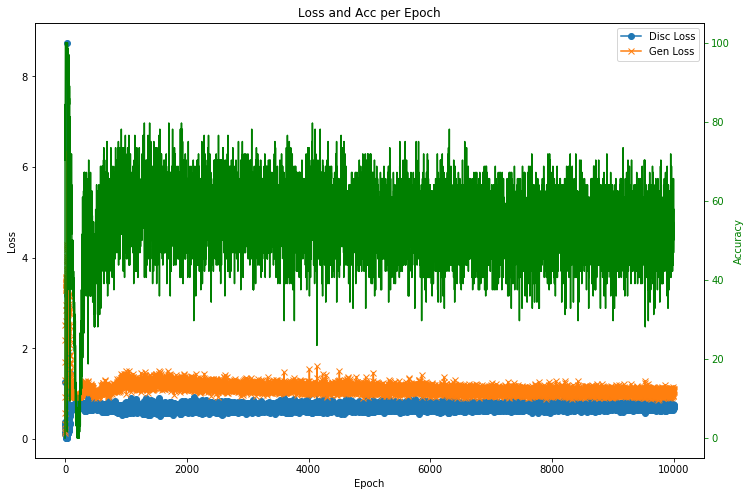

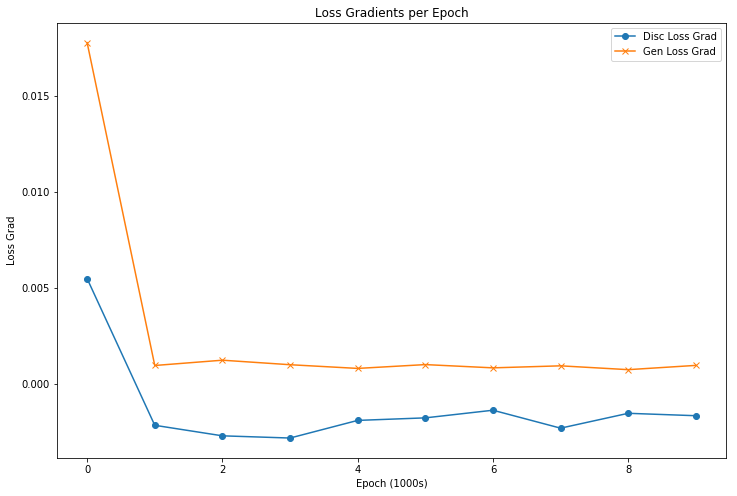

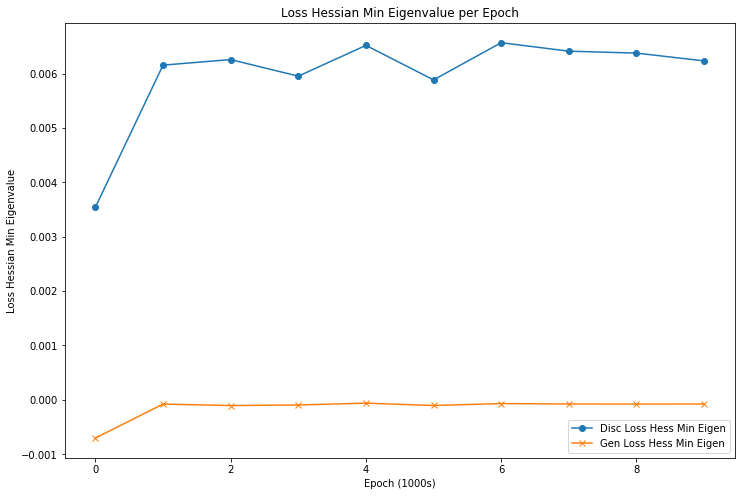

In [396]:
##### SGD with gamma = 1 #####
# learning_rate = 0.1
# momentum = 0
# decay_rate = 0 # Decay rate is how we are going to achieve inf-GD
# nest = False # Nesterov's acceleration
##############################

# Initialize GAN object
opt_params = ['sgd', 0.1, 0, 0, False, 'sgd_lr0.1_decay0']
gan_1 = GAN(opt_params)

# Train GAN
gan_1_hist = gan_1.train(epochs=10000, batch_size=32, sample_interval=1000)

# Plot of performance results (training and validation accuracies and loss) for every epoch
plt.rcParams['figure.figsize'] = (12, 8)
plot_loss_acc(gan_1_hist)
plot_loss_gradient(gan_1_hist)
plot_loss_hessian_eig(gan_1_hist)

hello
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_30 (Flatten)         (None, 784)               0         
_________________________________________________________________
dense_210 (Dense)            (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_150 (LeakyReLU)  (None, 512)               0         
_________________________________________________________________
dense_211 (Dense)            (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_151 (LeakyReLU)  (None, 256)               0         
_________________________________________________________________
dense_212 (Dense)            (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________________________

92 [D loss: 0.042181, acc.: 100.00%] [G loss: 2.741841]
93 [D loss: 0.035867, acc.: 100.00%] [G loss: 2.871745]
94 [D loss: 0.044897, acc.: 100.00%] [G loss: 2.828867]
95 [D loss: 0.040154, acc.: 100.00%] [G loss: 2.673755]
96 [D loss: 0.046640, acc.: 100.00%] [G loss: 2.865869]
97 [D loss: 0.043644, acc.: 100.00%] [G loss: 2.817672]
98 [D loss: 0.032579, acc.: 100.00%] [G loss: 2.737084]
99 [D loss: 0.037709, acc.: 100.00%] [G loss: 2.801275]
100 [D loss: 0.038019, acc.: 100.00%] [G loss: 2.743483]
101 [D loss: 0.037711, acc.: 100.00%] [G loss: 2.893493]
102 [D loss: 0.041178, acc.: 100.00%] [G loss: 2.870307]
103 [D loss: 0.033698, acc.: 100.00%] [G loss: 2.811666]
104 [D loss: 0.043391, acc.: 100.00%] [G loss: 2.754063]
105 [D loss: 0.044667, acc.: 100.00%] [G loss: 2.823589]
106 [D loss: 0.046406, acc.: 100.00%] [G loss: 2.780127]
107 [D loss: 0.044013, acc.: 100.00%] [G loss: 2.848731]
108 [D loss: 0.033712, acc.: 100.00%] [G loss: 2.840327]
109 [D loss: 0.047952, acc.: 100.00%] [

239 [D loss: 0.036478, acc.: 100.00%] [G loss: 2.889534]
240 [D loss: 0.036549, acc.: 100.00%] [G loss: 2.920188]
241 [D loss: 0.040458, acc.: 100.00%] [G loss: 2.843439]
242 [D loss: 0.030903, acc.: 100.00%] [G loss: 2.924147]
243 [D loss: 0.038162, acc.: 100.00%] [G loss: 2.927777]
244 [D loss: 0.067409, acc.: 100.00%] [G loss: 2.918249]
245 [D loss: 0.034107, acc.: 100.00%] [G loss: 2.766928]
246 [D loss: 0.032857, acc.: 100.00%] [G loss: 2.840398]
247 [D loss: 0.041570, acc.: 100.00%] [G loss: 2.813449]
248 [D loss: 0.036612, acc.: 100.00%] [G loss: 2.957278]
249 [D loss: 0.041813, acc.: 100.00%] [G loss: 2.977431]
250 [D loss: 0.035203, acc.: 100.00%] [G loss: 2.908878]
251 [D loss: 0.037995, acc.: 100.00%] [G loss: 2.920893]
252 [D loss: 0.042867, acc.: 100.00%] [G loss: 2.846342]
253 [D loss: 0.036855, acc.: 100.00%] [G loss: 2.843371]
254 [D loss: 0.038114, acc.: 100.00%] [G loss: 2.840357]
255 [D loss: 0.045620, acc.: 100.00%] [G loss: 2.884840]
256 [D loss: 0.045271, acc.: 10

383 [D loss: 0.049844, acc.: 100.00%] [G loss: 2.804594]
384 [D loss: 0.053330, acc.: 100.00%] [G loss: 2.741814]
385 [D loss: 0.046210, acc.: 100.00%] [G loss: 2.741278]
386 [D loss: 0.049095, acc.: 100.00%] [G loss: 2.896236]
387 [D loss: 0.069062, acc.: 100.00%] [G loss: 2.815365]
388 [D loss: 0.057128, acc.: 100.00%] [G loss: 2.761124]
389 [D loss: 0.064419, acc.: 100.00%] [G loss: 2.935711]
390 [D loss: 0.053517, acc.: 100.00%] [G loss: 2.811028]
391 [D loss: 0.056512, acc.: 100.00%] [G loss: 2.852027]
392 [D loss: 0.046970, acc.: 100.00%] [G loss: 2.745199]
393 [D loss: 0.056438, acc.: 100.00%] [G loss: 2.837321]
394 [D loss: 0.062761, acc.: 100.00%] [G loss: 2.820623]
395 [D loss: 0.056716, acc.: 100.00%] [G loss: 2.801464]
396 [D loss: 0.051648, acc.: 100.00%] [G loss: 2.836940]
397 [D loss: 0.051529, acc.: 100.00%] [G loss: 2.849500]
398 [D loss: 0.060415, acc.: 100.00%] [G loss: 2.848857]
399 [D loss: 0.057537, acc.: 100.00%] [G loss: 2.892499]
400 [D loss: 0.053293, acc.: 10

530 [D loss: 0.077131, acc.: 100.00%] [G loss: 3.714955]
531 [D loss: 0.105648, acc.: 95.31%] [G loss: 3.423219]
532 [D loss: 0.084950, acc.: 98.44%] [G loss: 3.435521]
533 [D loss: 0.081152, acc.: 98.44%] [G loss: 3.643449]
534 [D loss: 0.109357, acc.: 96.88%] [G loss: 3.634593]
535 [D loss: 0.103146, acc.: 96.88%] [G loss: 3.426881]
536 [D loss: 0.078088, acc.: 98.44%] [G loss: 3.821475]
537 [D loss: 0.163933, acc.: 95.31%] [G loss: 3.693446]
538 [D loss: 0.121730, acc.: 98.44%] [G loss: 3.473799]
539 [D loss: 0.057383, acc.: 98.44%] [G loss: 3.784202]
540 [D loss: 0.095791, acc.: 100.00%] [G loss: 3.700801]
541 [D loss: 0.120551, acc.: 96.88%] [G loss: 3.287720]
542 [D loss: 0.143642, acc.: 93.75%] [G loss: 3.924171]
543 [D loss: 0.246879, acc.: 87.50%] [G loss: 3.863983]
544 [D loss: 0.117862, acc.: 98.44%] [G loss: 3.905592]
545 [D loss: 0.227115, acc.: 92.19%] [G loss: 3.657933]
546 [D loss: 0.121676, acc.: 95.31%] [G loss: 3.575198]
547 [D loss: 0.138765, acc.: 96.88%] [G loss: 

679 [D loss: 0.543460, acc.: 73.44%] [G loss: 1.612809]
680 [D loss: 0.520842, acc.: 76.56%] [G loss: 1.459304]
681 [D loss: 0.538743, acc.: 75.00%] [G loss: 1.704796]
682 [D loss: 0.610776, acc.: 67.19%] [G loss: 1.516178]
683 [D loss: 0.414538, acc.: 82.81%] [G loss: 1.515620]
684 [D loss: 0.507451, acc.: 73.44%] [G loss: 1.535872]
685 [D loss: 0.508482, acc.: 76.56%] [G loss: 1.736203]
686 [D loss: 0.411091, acc.: 81.25%] [G loss: 1.653133]
687 [D loss: 0.392004, acc.: 81.25%] [G loss: 1.427255]
688 [D loss: 0.501372, acc.: 73.44%] [G loss: 1.742736]
689 [D loss: 0.552227, acc.: 71.88%] [G loss: 1.879415]
690 [D loss: 0.530078, acc.: 75.00%] [G loss: 1.533574]
691 [D loss: 0.465926, acc.: 76.56%] [G loss: 1.731350]
692 [D loss: 0.519524, acc.: 78.12%] [G loss: 1.634383]
693 [D loss: 0.397593, acc.: 81.25%] [G loss: 1.643538]
694 [D loss: 0.466241, acc.: 76.56%] [G loss: 1.885541]
695 [D loss: 0.577372, acc.: 65.62%] [G loss: 1.958706]
696 [D loss: 0.558711, acc.: 76.56%] [G loss: 1.

829 [D loss: 0.511476, acc.: 70.31%] [G loss: 1.820788]
830 [D loss: 0.578910, acc.: 64.06%] [G loss: 1.667127]
831 [D loss: 0.500437, acc.: 73.44%] [G loss: 1.506072]
832 [D loss: 0.600439, acc.: 59.38%] [G loss: 1.641805]
833 [D loss: 0.580164, acc.: 70.31%] [G loss: 1.577049]
834 [D loss: 0.506432, acc.: 75.00%] [G loss: 1.530471]
835 [D loss: 0.434859, acc.: 79.69%] [G loss: 1.455015]
836 [D loss: 0.493925, acc.: 70.31%] [G loss: 1.660556]
837 [D loss: 0.494980, acc.: 75.00%] [G loss: 1.550468]
838 [D loss: 0.486944, acc.: 76.56%] [G loss: 1.598688]
839 [D loss: 0.485240, acc.: 73.44%] [G loss: 1.619964]
840 [D loss: 0.563736, acc.: 62.50%] [G loss: 1.495229]
841 [D loss: 0.558287, acc.: 64.06%] [G loss: 1.531862]
842 [D loss: 0.492910, acc.: 71.88%] [G loss: 1.547905]
843 [D loss: 0.511262, acc.: 76.56%] [G loss: 1.452157]
844 [D loss: 0.599333, acc.: 62.50%] [G loss: 1.508909]
845 [D loss: 0.504765, acc.: 76.56%] [G loss: 1.536072]
846 [D loss: 0.538283, acc.: 70.31%] [G loss: 1.

979 [D loss: 0.622932, acc.: 59.38%] [G loss: 1.323651]
980 [D loss: 0.632995, acc.: 59.38%] [G loss: 1.240679]
981 [D loss: 0.577796, acc.: 68.75%] [G loss: 1.168877]
982 [D loss: 0.625570, acc.: 62.50%] [G loss: 1.208751]
983 [D loss: 0.610798, acc.: 65.62%] [G loss: 1.193046]
984 [D loss: 0.596226, acc.: 71.88%] [G loss: 1.149903]
985 [D loss: 0.566868, acc.: 70.31%] [G loss: 1.172332]
986 [D loss: 0.670559, acc.: 56.25%] [G loss: 1.271807]
987 [D loss: 0.645909, acc.: 57.81%] [G loss: 1.141825]
988 [D loss: 0.605570, acc.: 62.50%] [G loss: 1.238501]
989 [D loss: 0.589321, acc.: 71.88%] [G loss: 1.157437]
990 [D loss: 0.586574, acc.: 68.75%] [G loss: 1.208740]
991 [D loss: 0.593452, acc.: 65.62%] [G loss: 1.171144]
992 [D loss: 0.563375, acc.: 67.19%] [G loss: 1.087345]
993 [D loss: 0.574083, acc.: 68.75%] [G loss: 1.094574]
994 [D loss: 0.527967, acc.: 79.69%] [G loss: 1.166453]
995 [D loss: 0.604645, acc.: 68.75%] [G loss: 1.203542]
996 [D loss: 0.667942, acc.: 53.12%] [G loss: 1.

1123 [D loss: 0.672040, acc.: 53.12%] [G loss: 0.828961]
1124 [D loss: 0.647637, acc.: 56.25%] [G loss: 0.847382]
1125 [D loss: 0.643615, acc.: 56.25%] [G loss: 0.855451]
1126 [D loss: 0.629322, acc.: 64.06%] [G loss: 0.851189]
1127 [D loss: 0.637065, acc.: 60.94%] [G loss: 0.835779]
1128 [D loss: 0.683774, acc.: 50.00%] [G loss: 0.811454]
1129 [D loss: 0.634176, acc.: 68.75%] [G loss: 0.830061]
1130 [D loss: 0.630385, acc.: 64.06%] [G loss: 0.853383]
1131 [D loss: 0.618378, acc.: 64.06%] [G loss: 0.832688]
1132 [D loss: 0.649019, acc.: 51.56%] [G loss: 0.823186]
1133 [D loss: 0.640119, acc.: 64.06%] [G loss: 0.836255]
1134 [D loss: 0.644476, acc.: 62.50%] [G loss: 0.836074]
1135 [D loss: 0.640143, acc.: 57.81%] [G loss: 0.835574]
1136 [D loss: 0.667165, acc.: 53.12%] [G loss: 0.834430]
1137 [D loss: 0.669573, acc.: 51.56%] [G loss: 0.813897]
1138 [D loss: 0.681931, acc.: 50.00%] [G loss: 0.789688]
1139 [D loss: 0.642697, acc.: 62.50%] [G loss: 0.835099]
1140 [D loss: 0.689478, acc.: 5

1268 [D loss: 0.655691, acc.: 59.38%] [G loss: 0.756371]
1269 [D loss: 0.664979, acc.: 48.44%] [G loss: 0.745639]
1270 [D loss: 0.648531, acc.: 60.94%] [G loss: 0.761788]
1271 [D loss: 0.652584, acc.: 59.38%] [G loss: 0.749285]
1272 [D loss: 0.647009, acc.: 60.94%] [G loss: 0.738147]
1273 [D loss: 0.674946, acc.: 48.44%] [G loss: 0.757803]
1274 [D loss: 0.674319, acc.: 48.44%] [G loss: 0.736309]
1275 [D loss: 0.673000, acc.: 50.00%] [G loss: 0.747282]
1276 [D loss: 0.661908, acc.: 57.81%] [G loss: 0.752741]
1277 [D loss: 0.684209, acc.: 42.19%] [G loss: 0.752593]
1278 [D loss: 0.642037, acc.: 67.19%] [G loss: 0.763501]
1279 [D loss: 0.666165, acc.: 54.69%] [G loss: 0.758052]
1280 [D loss: 0.668157, acc.: 51.56%] [G loss: 0.761674]
1281 [D loss: 0.665653, acc.: 59.38%] [G loss: 0.750164]
1282 [D loss: 0.671424, acc.: 53.12%] [G loss: 0.752610]
1283 [D loss: 0.666958, acc.: 54.69%] [G loss: 0.749173]
1284 [D loss: 0.664636, acc.: 50.00%] [G loss: 0.755430]
1285 [D loss: 0.647702, acc.: 5

1414 [D loss: 0.653512, acc.: 60.94%] [G loss: 0.760948]
1415 [D loss: 0.657083, acc.: 59.38%] [G loss: 0.751365]
1416 [D loss: 0.655738, acc.: 62.50%] [G loss: 0.768664]
1417 [D loss: 0.667686, acc.: 57.81%] [G loss: 0.757062]
1418 [D loss: 0.640089, acc.: 68.75%] [G loss: 0.763243]
1419 [D loss: 0.675425, acc.: 50.00%] [G loss: 0.768595]
1420 [D loss: 0.670624, acc.: 57.81%] [G loss: 0.757340]
1421 [D loss: 0.651279, acc.: 57.81%] [G loss: 0.761175]
1422 [D loss: 0.658544, acc.: 65.62%] [G loss: 0.765172]
1423 [D loss: 0.654466, acc.: 59.38%] [G loss: 0.760842]
1424 [D loss: 0.653704, acc.: 59.38%] [G loss: 0.757323]
1425 [D loss: 0.642860, acc.: 68.75%] [G loss: 0.779321]
1426 [D loss: 0.656209, acc.: 60.94%] [G loss: 0.780930]
1427 [D loss: 0.654975, acc.: 62.50%] [G loss: 0.778694]
1428 [D loss: 0.661937, acc.: 59.38%] [G loss: 0.774021]
1429 [D loss: 0.671526, acc.: 51.56%] [G loss: 0.794277]
1430 [D loss: 0.661746, acc.: 64.06%] [G loss: 0.769963]
1431 [D loss: 0.655692, acc.: 6

1560 [D loss: 0.652063, acc.: 75.00%] [G loss: 0.800181]
1561 [D loss: 0.640729, acc.: 73.44%] [G loss: 0.796304]
1562 [D loss: 0.645359, acc.: 67.19%] [G loss: 0.797396]
1563 [D loss: 0.657126, acc.: 59.38%] [G loss: 0.802284]
1564 [D loss: 0.649193, acc.: 70.31%] [G loss: 0.794275]
1565 [D loss: 0.638279, acc.: 67.19%] [G loss: 0.793012]
1566 [D loss: 0.623841, acc.: 75.00%] [G loss: 0.804763]
1567 [D loss: 0.636082, acc.: 71.88%] [G loss: 0.803249]
1568 [D loss: 0.626817, acc.: 76.56%] [G loss: 0.812382]
1569 [D loss: 0.637313, acc.: 71.88%] [G loss: 0.815497]
1570 [D loss: 0.646451, acc.: 71.88%] [G loss: 0.813525]
1571 [D loss: 0.655323, acc.: 62.50%] [G loss: 0.805232]
1572 [D loss: 0.657789, acc.: 70.31%] [G loss: 0.816646]
1573 [D loss: 0.647047, acc.: 62.50%] [G loss: 0.791627]
1574 [D loss: 0.642716, acc.: 70.31%] [G loss: 0.807199]
1575 [D loss: 0.651387, acc.: 73.44%] [G loss: 0.816727]
1576 [D loss: 0.637679, acc.: 65.62%] [G loss: 0.804457]
1577 [D loss: 0.659831, acc.: 6

1707 [D loss: 0.620319, acc.: 76.56%] [G loss: 0.833862]
1708 [D loss: 0.609375, acc.: 76.56%] [G loss: 0.813307]
1709 [D loss: 0.660944, acc.: 62.50%] [G loss: 0.804619]
1710 [D loss: 0.646061, acc.: 62.50%] [G loss: 0.813728]
1711 [D loss: 0.627310, acc.: 78.12%] [G loss: 0.832610]
1712 [D loss: 0.608491, acc.: 76.56%] [G loss: 0.841937]
1713 [D loss: 0.638033, acc.: 71.88%] [G loss: 0.816385]
1714 [D loss: 0.646039, acc.: 67.19%] [G loss: 0.827399]
1715 [D loss: 0.607693, acc.: 78.12%] [G loss: 0.826442]
1716 [D loss: 0.630299, acc.: 67.19%] [G loss: 0.830840]
1717 [D loss: 0.648350, acc.: 70.31%] [G loss: 0.842180]
1718 [D loss: 0.618032, acc.: 70.31%] [G loss: 0.847671]
1719 [D loss: 0.661038, acc.: 59.38%] [G loss: 0.850410]
1720 [D loss: 0.655025, acc.: 67.19%] [G loss: 0.831332]
1721 [D loss: 0.646573, acc.: 71.88%] [G loss: 0.835956]
1722 [D loss: 0.648128, acc.: 65.62%] [G loss: 0.808674]
1723 [D loss: 0.612393, acc.: 75.00%] [G loss: 0.816060]
1724 [D loss: 0.634160, acc.: 7

1853 [D loss: 0.654712, acc.: 65.62%] [G loss: 0.809212]
1854 [D loss: 0.637387, acc.: 70.31%] [G loss: 0.819580]
1855 [D loss: 0.643890, acc.: 73.44%] [G loss: 0.838493]
1856 [D loss: 0.644212, acc.: 73.44%] [G loss: 0.830803]
1857 [D loss: 0.657225, acc.: 60.94%] [G loss: 0.817110]
1858 [D loss: 0.685617, acc.: 54.69%] [G loss: 0.838795]
1859 [D loss: 0.650230, acc.: 64.06%] [G loss: 0.828689]
1860 [D loss: 0.659116, acc.: 67.19%] [G loss: 0.825538]
1861 [D loss: 0.666888, acc.: 53.12%] [G loss: 0.859666]
1862 [D loss: 0.664202, acc.: 64.06%] [G loss: 0.834639]
1863 [D loss: 0.650659, acc.: 68.75%] [G loss: 0.854548]
1864 [D loss: 0.636017, acc.: 70.31%] [G loss: 0.839128]
1865 [D loss: 0.664749, acc.: 60.94%] [G loss: 0.838844]
1866 [D loss: 0.657813, acc.: 73.44%] [G loss: 0.821827]
1867 [D loss: 0.623981, acc.: 76.56%] [G loss: 0.849108]
1868 [D loss: 0.654325, acc.: 68.75%] [G loss: 0.806797]
1869 [D loss: 0.652137, acc.: 67.19%] [G loss: 0.823480]
1870 [D loss: 0.636755, acc.: 7

1998 [D loss: 0.621137, acc.: 70.31%] [G loss: 0.840273]
1999 [D loss: 0.632343, acc.: 71.88%] [G loss: 0.863101]
2000 [D loss: 0.644640, acc.: 70.31%] [G loss: 0.860394]
Discriminator gradients:  0.00029468676
Generator gradients:  0.001322395
Min XX Hessian eigenvalue:  0.0076234844
Min ZZ Hessian eigenvalue:  -0.000109008266
2001 [D loss: 0.606475, acc.: 87.50%] [G loss: 0.874227]
2002 [D loss: 0.643256, acc.: 68.75%] [G loss: 0.857713]
2003 [D loss: 0.626924, acc.: 62.50%] [G loss: 0.872360]
2004 [D loss: 0.616256, acc.: 78.12%] [G loss: 0.880586]
2005 [D loss: 0.638579, acc.: 68.75%] [G loss: 0.876601]
2006 [D loss: 0.629041, acc.: 70.31%] [G loss: 0.893042]
2007 [D loss: 0.629716, acc.: 73.44%] [G loss: 0.861092]
2008 [D loss: 0.636675, acc.: 68.75%] [G loss: 0.868247]
2009 [D loss: 0.626802, acc.: 71.88%] [G loss: 0.888376]
2010 [D loss: 0.651576, acc.: 67.19%] [G loss: 0.856717]
2011 [D loss: 0.649268, acc.: 67.19%] [G loss: 0.867925]
2012 [D loss: 0.618971, acc.: 71.88%] [G lo

2139 [D loss: 0.608357, acc.: 76.56%] [G loss: 0.929545]
2140 [D loss: 0.634877, acc.: 76.56%] [G loss: 0.942443]
2141 [D loss: 0.614943, acc.: 76.56%] [G loss: 0.933182]
2142 [D loss: 0.625999, acc.: 81.25%] [G loss: 0.901344]
2143 [D loss: 0.621994, acc.: 70.31%] [G loss: 0.891574]
2144 [D loss: 0.635200, acc.: 73.44%] [G loss: 0.898441]
2145 [D loss: 0.643073, acc.: 65.62%] [G loss: 0.888603]
2146 [D loss: 0.621313, acc.: 73.44%] [G loss: 0.892850]
2147 [D loss: 0.647976, acc.: 60.94%] [G loss: 0.875945]
2148 [D loss: 0.636034, acc.: 64.06%] [G loss: 0.885713]
2149 [D loss: 0.636971, acc.: 70.31%] [G loss: 0.899461]
2150 [D loss: 0.615186, acc.: 82.81%] [G loss: 0.897933]
2151 [D loss: 0.624705, acc.: 73.44%] [G loss: 0.919980]
2152 [D loss: 0.648231, acc.: 70.31%] [G loss: 0.885209]
2153 [D loss: 0.618684, acc.: 71.88%] [G loss: 0.897169]
2154 [D loss: 0.618663, acc.: 79.69%] [G loss: 0.913206]
2155 [D loss: 0.598811, acc.: 79.69%] [G loss: 0.898731]
2156 [D loss: 0.642628, acc.: 6

2286 [D loss: 0.612786, acc.: 76.56%] [G loss: 0.962785]
2287 [D loss: 0.610693, acc.: 75.00%] [G loss: 0.909782]
2288 [D loss: 0.625739, acc.: 71.88%] [G loss: 0.936556]
2289 [D loss: 0.640227, acc.: 73.44%] [G loss: 0.930638]
2290 [D loss: 0.622557, acc.: 76.56%] [G loss: 0.940877]
2291 [D loss: 0.618872, acc.: 76.56%] [G loss: 0.954139]
2292 [D loss: 0.594598, acc.: 82.81%] [G loss: 0.900431]
2293 [D loss: 0.592304, acc.: 79.69%] [G loss: 0.907966]
2294 [D loss: 0.587711, acc.: 79.69%] [G loss: 0.894077]
2295 [D loss: 0.588258, acc.: 79.69%] [G loss: 0.944681]
2296 [D loss: 0.592690, acc.: 78.12%] [G loss: 0.933484]
2297 [D loss: 0.596933, acc.: 82.81%] [G loss: 0.924544]
2298 [D loss: 0.610556, acc.: 78.12%] [G loss: 0.958538]
2299 [D loss: 0.596951, acc.: 78.12%] [G loss: 0.959752]
2300 [D loss: 0.615864, acc.: 70.31%] [G loss: 0.955279]
2301 [D loss: 0.650777, acc.: 70.31%] [G loss: 0.955831]
2302 [D loss: 0.580520, acc.: 79.69%] [G loss: 0.949567]
2303 [D loss: 0.641548, acc.: 7

2432 [D loss: 0.583787, acc.: 84.38%] [G loss: 1.002576]
2433 [D loss: 0.607506, acc.: 71.88%] [G loss: 1.052522]
2434 [D loss: 0.654636, acc.: 59.38%] [G loss: 1.048290]
2435 [D loss: 0.561246, acc.: 82.81%] [G loss: 1.012100]
2436 [D loss: 0.547851, acc.: 85.94%] [G loss: 1.043279]
2437 [D loss: 0.541945, acc.: 81.25%] [G loss: 1.020196]
2438 [D loss: 0.563812, acc.: 78.12%] [G loss: 1.044273]
2439 [D loss: 0.599528, acc.: 76.56%] [G loss: 1.027715]
2440 [D loss: 0.599196, acc.: 75.00%] [G loss: 1.056958]
2441 [D loss: 0.586746, acc.: 75.00%] [G loss: 1.047014]
2442 [D loss: 0.543316, acc.: 87.50%] [G loss: 1.028763]
2443 [D loss: 0.604843, acc.: 71.88%] [G loss: 1.061594]
2444 [D loss: 0.541279, acc.: 84.38%] [G loss: 1.046616]
2445 [D loss: 0.567882, acc.: 84.38%] [G loss: 1.024402]
2446 [D loss: 0.609973, acc.: 68.75%] [G loss: 1.043028]
2447 [D loss: 0.550944, acc.: 85.94%] [G loss: 1.003122]
2448 [D loss: 0.575681, acc.: 78.12%] [G loss: 0.994986]
2449 [D loss: 0.574033, acc.: 8

2578 [D loss: 0.600763, acc.: 73.44%] [G loss: 1.116126]
2579 [D loss: 0.604345, acc.: 68.75%] [G loss: 1.144233]
2580 [D loss: 0.549308, acc.: 79.69%] [G loss: 1.028587]
2581 [D loss: 0.570491, acc.: 78.12%] [G loss: 1.039740]
2582 [D loss: 0.633231, acc.: 68.75%] [G loss: 1.100827]
2583 [D loss: 0.640828, acc.: 56.25%] [G loss: 1.035201]
2584 [D loss: 0.565312, acc.: 75.00%] [G loss: 1.026295]
2585 [D loss: 0.590611, acc.: 78.12%] [G loss: 1.059021]
2586 [D loss: 0.600162, acc.: 76.56%] [G loss: 1.009746]
2587 [D loss: 0.580677, acc.: 70.31%] [G loss: 1.017990]
2588 [D loss: 0.605979, acc.: 75.00%] [G loss: 1.084449]
2589 [D loss: 0.633944, acc.: 60.94%] [G loss: 1.048841]
2590 [D loss: 0.613692, acc.: 71.88%] [G loss: 1.051239]
2591 [D loss: 0.586766, acc.: 76.56%] [G loss: 1.077562]
2592 [D loss: 0.600811, acc.: 70.31%] [G loss: 1.061896]
2593 [D loss: 0.621481, acc.: 71.88%] [G loss: 1.053684]
2594 [D loss: 0.576610, acc.: 79.69%] [G loss: 1.103683]
2595 [D loss: 0.584281, acc.: 7

2725 [D loss: 0.617676, acc.: 67.19%] [G loss: 0.988749]
2726 [D loss: 0.618580, acc.: 68.75%] [G loss: 0.978622]
2727 [D loss: 0.603652, acc.: 73.44%] [G loss: 0.972738]
2728 [D loss: 0.684510, acc.: 53.12%] [G loss: 0.976203]
2729 [D loss: 0.667128, acc.: 60.94%] [G loss: 0.943695]
2730 [D loss: 0.633574, acc.: 64.06%] [G loss: 0.998497]
2731 [D loss: 0.567367, acc.: 79.69%] [G loss: 0.974500]
2732 [D loss: 0.604579, acc.: 73.44%] [G loss: 0.992041]
2733 [D loss: 0.645301, acc.: 57.81%] [G loss: 0.990798]
2734 [D loss: 0.599748, acc.: 68.75%] [G loss: 0.995268]
2735 [D loss: 0.631024, acc.: 64.06%] [G loss: 1.015185]
2736 [D loss: 0.644048, acc.: 65.62%] [G loss: 0.998797]
2737 [D loss: 0.585483, acc.: 79.69%] [G loss: 1.006496]
2738 [D loss: 0.659401, acc.: 60.94%] [G loss: 1.003310]
2739 [D loss: 0.596610, acc.: 71.88%] [G loss: 1.006586]
2740 [D loss: 0.634169, acc.: 67.19%] [G loss: 0.969605]
2741 [D loss: 0.653676, acc.: 65.62%] [G loss: 1.003155]
2742 [D loss: 0.644747, acc.: 6

2871 [D loss: 0.645576, acc.: 57.81%] [G loss: 0.991735]
2872 [D loss: 0.613301, acc.: 71.88%] [G loss: 0.955778]
2873 [D loss: 0.663963, acc.: 60.94%] [G loss: 0.998556]
2874 [D loss: 0.622805, acc.: 60.94%] [G loss: 0.932464]
2875 [D loss: 0.625091, acc.: 65.62%] [G loss: 0.973769]
2876 [D loss: 0.675528, acc.: 57.81%] [G loss: 0.891368]
2877 [D loss: 0.655801, acc.: 57.81%] [G loss: 0.933241]
2878 [D loss: 0.653581, acc.: 60.94%] [G loss: 0.913953]
2879 [D loss: 0.669929, acc.: 54.69%] [G loss: 0.972499]
2880 [D loss: 0.620728, acc.: 67.19%] [G loss: 0.923471]
2881 [D loss: 0.610637, acc.: 64.06%] [G loss: 0.933053]
2882 [D loss: 0.652769, acc.: 59.38%] [G loss: 0.947086]
2883 [D loss: 0.653153, acc.: 57.81%] [G loss: 0.966914]
2884 [D loss: 0.613137, acc.: 73.44%] [G loss: 0.947231]
2885 [D loss: 0.657781, acc.: 59.38%] [G loss: 0.969717]
2886 [D loss: 0.630679, acc.: 68.75%] [G loss: 0.931096]
2887 [D loss: 0.676887, acc.: 64.06%] [G loss: 0.972023]
2888 [D loss: 0.634338, acc.: 7

3012 [D loss: 0.627468, acc.: 65.62%] [G loss: 0.960397]
3013 [D loss: 0.603602, acc.: 70.31%] [G loss: 0.990670]
3014 [D loss: 0.561032, acc.: 84.38%] [G loss: 0.993212]
3015 [D loss: 0.630294, acc.: 67.19%] [G loss: 0.982078]
3016 [D loss: 0.609115, acc.: 79.69%] [G loss: 0.993537]
3017 [D loss: 0.679023, acc.: 53.12%] [G loss: 0.932464]
3018 [D loss: 0.638069, acc.: 65.62%] [G loss: 0.967710]
3019 [D loss: 0.572817, acc.: 81.25%] [G loss: 0.993860]
3020 [D loss: 0.614408, acc.: 75.00%] [G loss: 0.994316]
3021 [D loss: 0.617821, acc.: 76.56%] [G loss: 0.960704]
3022 [D loss: 0.637339, acc.: 67.19%] [G loss: 0.958923]
3023 [D loss: 0.602959, acc.: 78.12%] [G loss: 0.947320]
3024 [D loss: 0.639860, acc.: 71.88%] [G loss: 0.965477]
3025 [D loss: 0.598037, acc.: 75.00%] [G loss: 0.988331]
3026 [D loss: 0.588883, acc.: 73.44%] [G loss: 1.004416]
3027 [D loss: 0.614620, acc.: 68.75%] [G loss: 1.034272]
3028 [D loss: 0.592521, acc.: 76.56%] [G loss: 0.982573]
3029 [D loss: 0.658766, acc.: 5

3157 [D loss: 0.567155, acc.: 76.56%] [G loss: 0.998881]
3158 [D loss: 0.563364, acc.: 84.38%] [G loss: 1.030882]
3159 [D loss: 0.616772, acc.: 71.88%] [G loss: 0.966056]
3160 [D loss: 0.577610, acc.: 75.00%] [G loss: 0.979749]
3161 [D loss: 0.571766, acc.: 84.38%] [G loss: 1.035094]
3162 [D loss: 0.566197, acc.: 82.81%] [G loss: 1.038877]
3163 [D loss: 0.586523, acc.: 73.44%] [G loss: 1.024638]
3164 [D loss: 0.600609, acc.: 70.31%] [G loss: 1.029648]
3165 [D loss: 0.613305, acc.: 71.88%] [G loss: 1.000858]
3166 [D loss: 0.599398, acc.: 79.69%] [G loss: 1.030541]
3167 [D loss: 0.628514, acc.: 71.88%] [G loss: 1.029571]
3168 [D loss: 0.593969, acc.: 71.88%] [G loss: 1.079581]
3169 [D loss: 0.597210, acc.: 70.31%] [G loss: 1.013945]
3170 [D loss: 0.632214, acc.: 68.75%] [G loss: 1.038568]
3171 [D loss: 0.586131, acc.: 71.88%] [G loss: 1.029950]
3172 [D loss: 0.620571, acc.: 70.31%] [G loss: 1.010249]
3173 [D loss: 0.592418, acc.: 78.12%] [G loss: 1.037833]
3174 [D loss: 0.575365, acc.: 7

3304 [D loss: 0.598220, acc.: 73.44%] [G loss: 1.038282]
3305 [D loss: 0.606503, acc.: 68.75%] [G loss: 1.061167]
3306 [D loss: 0.588342, acc.: 78.12%] [G loss: 0.997853]
3307 [D loss: 0.596058, acc.: 79.69%] [G loss: 1.022346]
3308 [D loss: 0.624857, acc.: 68.75%] [G loss: 0.984041]
3309 [D loss: 0.589035, acc.: 78.12%] [G loss: 1.043539]
3310 [D loss: 0.566226, acc.: 78.12%] [G loss: 0.973156]
3311 [D loss: 0.630959, acc.: 64.06%] [G loss: 1.043806]
3312 [D loss: 0.596162, acc.: 79.69%] [G loss: 1.050482]
3313 [D loss: 0.609112, acc.: 71.88%] [G loss: 1.022346]
3314 [D loss: 0.640497, acc.: 60.94%] [G loss: 0.993918]
3315 [D loss: 0.606711, acc.: 68.75%] [G loss: 0.960378]
3316 [D loss: 0.612924, acc.: 73.44%] [G loss: 0.998447]
3317 [D loss: 0.610622, acc.: 73.44%] [G loss: 1.024391]
3318 [D loss: 0.575430, acc.: 82.81%] [G loss: 1.001404]
3319 [D loss: 0.636056, acc.: 67.19%] [G loss: 1.019951]
3320 [D loss: 0.620594, acc.: 71.88%] [G loss: 0.975874]
3321 [D loss: 0.595802, acc.: 6

3450 [D loss: 0.549624, acc.: 82.81%] [G loss: 1.030539]
3451 [D loss: 0.593724, acc.: 71.88%] [G loss: 1.035747]
3452 [D loss: 0.565423, acc.: 71.88%] [G loss: 1.074830]
3453 [D loss: 0.662282, acc.: 57.81%] [G loss: 1.092634]
3454 [D loss: 0.617862, acc.: 68.75%] [G loss: 1.079124]
3455 [D loss: 0.590554, acc.: 73.44%] [G loss: 1.063042]
3456 [D loss: 0.597518, acc.: 75.00%] [G loss: 1.052197]
3457 [D loss: 0.621261, acc.: 65.62%] [G loss: 1.075232]
3458 [D loss: 0.586486, acc.: 75.00%] [G loss: 1.070875]
3459 [D loss: 0.619302, acc.: 64.06%] [G loss: 1.089016]
3460 [D loss: 0.576931, acc.: 75.00%] [G loss: 1.049313]
3461 [D loss: 0.622538, acc.: 57.81%] [G loss: 1.042226]
3462 [D loss: 0.599996, acc.: 75.00%] [G loss: 1.063364]
3463 [D loss: 0.589589, acc.: 75.00%] [G loss: 1.019303]
3464 [D loss: 0.638446, acc.: 56.25%] [G loss: 1.066979]
3465 [D loss: 0.599815, acc.: 65.62%] [G loss: 1.089135]
3466 [D loss: 0.598301, acc.: 70.31%] [G loss: 1.092980]
3467 [D loss: 0.595450, acc.: 7

3595 [D loss: 0.558476, acc.: 76.56%] [G loss: 1.134661]
3596 [D loss: 0.578145, acc.: 76.56%] [G loss: 1.099672]
3597 [D loss: 0.553473, acc.: 79.69%] [G loss: 1.117550]
3598 [D loss: 0.592897, acc.: 71.88%] [G loss: 1.122627]
3599 [D loss: 0.534557, acc.: 78.12%] [G loss: 1.057372]
3600 [D loss: 0.630180, acc.: 68.75%] [G loss: 1.114061]
3601 [D loss: 0.606316, acc.: 67.19%] [G loss: 1.125342]
3602 [D loss: 0.578081, acc.: 75.00%] [G loss: 1.094901]
3603 [D loss: 0.590209, acc.: 70.31%] [G loss: 1.101874]
3604 [D loss: 0.576186, acc.: 71.88%] [G loss: 1.099451]
3605 [D loss: 0.562076, acc.: 79.69%] [G loss: 1.139587]
3606 [D loss: 0.607844, acc.: 62.50%] [G loss: 1.082208]
3607 [D loss: 0.551692, acc.: 81.25%] [G loss: 1.135841]
3608 [D loss: 0.590353, acc.: 70.31%] [G loss: 1.058317]
3609 [D loss: 0.547363, acc.: 76.56%] [G loss: 1.088998]
3610 [D loss: 0.558907, acc.: 81.25%] [G loss: 1.118897]
3611 [D loss: 0.576244, acc.: 78.12%] [G loss: 1.104665]
3612 [D loss: 0.609835, acc.: 7

3740 [D loss: 0.620686, acc.: 67.19%] [G loss: 1.104805]
3741 [D loss: 0.589379, acc.: 73.44%] [G loss: 1.083732]
3742 [D loss: 0.610282, acc.: 75.00%] [G loss: 1.070991]
3743 [D loss: 0.636689, acc.: 68.75%] [G loss: 1.096358]
3744 [D loss: 0.573721, acc.: 78.12%] [G loss: 1.069476]
3745 [D loss: 0.582657, acc.: 76.56%] [G loss: 1.093368]
3746 [D loss: 0.625686, acc.: 68.75%] [G loss: 1.115700]
3747 [D loss: 0.582702, acc.: 71.88%] [G loss: 1.100577]
3748 [D loss: 0.582693, acc.: 73.44%] [G loss: 1.112380]
3749 [D loss: 0.574609, acc.: 79.69%] [G loss: 1.096072]
3750 [D loss: 0.606923, acc.: 68.75%] [G loss: 1.037039]
3751 [D loss: 0.563811, acc.: 84.38%] [G loss: 1.048800]
3752 [D loss: 0.570063, acc.: 79.69%] [G loss: 1.075812]
3753 [D loss: 0.559486, acc.: 76.56%] [G loss: 1.045924]
3754 [D loss: 0.593633, acc.: 68.75%] [G loss: 1.064768]
3755 [D loss: 0.569890, acc.: 71.88%] [G loss: 1.171401]
3756 [D loss: 0.589025, acc.: 70.31%] [G loss: 1.154052]
3757 [D loss: 0.578685, acc.: 7

3886 [D loss: 0.547436, acc.: 79.69%] [G loss: 1.168908]
3887 [D loss: 0.565538, acc.: 81.25%] [G loss: 1.173398]
3888 [D loss: 0.522574, acc.: 79.69%] [G loss: 1.205014]
3889 [D loss: 0.537144, acc.: 84.38%] [G loss: 1.141929]
3890 [D loss: 0.528264, acc.: 82.81%] [G loss: 1.196291]
3891 [D loss: 0.584581, acc.: 73.44%] [G loss: 1.176258]
3892 [D loss: 0.543809, acc.: 81.25%] [G loss: 1.148127]
3893 [D loss: 0.537689, acc.: 81.25%] [G loss: 1.147324]
3894 [D loss: 0.524403, acc.: 89.06%] [G loss: 1.141690]
3895 [D loss: 0.499037, acc.: 82.81%] [G loss: 1.135479]
3896 [D loss: 0.594917, acc.: 70.31%] [G loss: 1.193786]
3897 [D loss: 0.571980, acc.: 73.44%] [G loss: 1.137011]
3898 [D loss: 0.577105, acc.: 71.88%] [G loss: 1.212669]
3899 [D loss: 0.545763, acc.: 76.56%] [G loss: 1.203027]
3900 [D loss: 0.530375, acc.: 82.81%] [G loss: 1.140666]
3901 [D loss: 0.544306, acc.: 78.12%] [G loss: 1.077207]
3902 [D loss: 0.529467, acc.: 79.69%] [G loss: 1.171816]
3903 [D loss: 0.521943, acc.: 8

4028 [D loss: 0.574005, acc.: 73.44%] [G loss: 1.139231]
4029 [D loss: 0.551128, acc.: 75.00%] [G loss: 1.172164]
4030 [D loss: 0.549651, acc.: 78.12%] [G loss: 1.146105]
4031 [D loss: 0.592390, acc.: 67.19%] [G loss: 1.164174]
4032 [D loss: 0.627947, acc.: 68.75%] [G loss: 1.236397]
4033 [D loss: 0.523059, acc.: 84.38%] [G loss: 1.155660]
4034 [D loss: 0.564113, acc.: 81.25%] [G loss: 1.242354]
4035 [D loss: 0.550634, acc.: 81.25%] [G loss: 1.259809]
4036 [D loss: 0.522047, acc.: 81.25%] [G loss: 1.227357]
4037 [D loss: 0.597664, acc.: 71.88%] [G loss: 1.222702]
4038 [D loss: 0.609552, acc.: 68.75%] [G loss: 1.145166]
4039 [D loss: 0.588155, acc.: 67.19%] [G loss: 1.138308]
4040 [D loss: 0.592361, acc.: 68.75%] [G loss: 1.188443]
4041 [D loss: 0.600910, acc.: 67.19%] [G loss: 1.144147]
4042 [D loss: 0.604297, acc.: 71.88%] [G loss: 1.208671]
4043 [D loss: 0.516998, acc.: 81.25%] [G loss: 1.175428]
4044 [D loss: 0.543287, acc.: 79.69%] [G loss: 1.151923]
4045 [D loss: 0.547191, acc.: 8

4173 [D loss: 0.581609, acc.: 71.88%] [G loss: 1.119065]
4174 [D loss: 0.569470, acc.: 70.31%] [G loss: 1.225199]
4175 [D loss: 0.578979, acc.: 67.19%] [G loss: 1.127245]
4176 [D loss: 0.522046, acc.: 81.25%] [G loss: 1.141907]
4177 [D loss: 0.597747, acc.: 70.31%] [G loss: 1.095845]
4178 [D loss: 0.591640, acc.: 67.19%] [G loss: 1.212654]
4179 [D loss: 0.554531, acc.: 70.31%] [G loss: 1.236582]
4180 [D loss: 0.543126, acc.: 84.38%] [G loss: 1.131066]
4181 [D loss: 0.561362, acc.: 78.12%] [G loss: 1.154211]
4182 [D loss: 0.509587, acc.: 76.56%] [G loss: 1.117535]
4183 [D loss: 0.515296, acc.: 81.25%] [G loss: 1.149713]
4184 [D loss: 0.582340, acc.: 70.31%] [G loss: 1.123162]
4185 [D loss: 0.559195, acc.: 79.69%] [G loss: 1.085604]
4186 [D loss: 0.526752, acc.: 73.44%] [G loss: 1.207907]
4187 [D loss: 0.622768, acc.: 65.62%] [G loss: 1.094597]
4188 [D loss: 0.557847, acc.: 81.25%] [G loss: 1.208408]
4189 [D loss: 0.634906, acc.: 65.62%] [G loss: 1.124599]
4190 [D loss: 0.540231, acc.: 7

4319 [D loss: 0.619799, acc.: 62.50%] [G loss: 1.154693]
4320 [D loss: 0.631616, acc.: 60.94%] [G loss: 1.139030]
4321 [D loss: 0.581814, acc.: 70.31%] [G loss: 1.187360]
4322 [D loss: 0.597010, acc.: 64.06%] [G loss: 1.203196]
4323 [D loss: 0.564882, acc.: 76.56%] [G loss: 1.194647]
4324 [D loss: 0.602687, acc.: 70.31%] [G loss: 1.068854]
4325 [D loss: 0.542135, acc.: 73.44%] [G loss: 1.085513]
4326 [D loss: 0.583231, acc.: 75.00%] [G loss: 1.191412]
4327 [D loss: 0.606754, acc.: 65.62%] [G loss: 1.162246]
4328 [D loss: 0.576439, acc.: 64.06%] [G loss: 1.200060]
4329 [D loss: 0.565578, acc.: 71.88%] [G loss: 1.232377]
4330 [D loss: 0.561328, acc.: 75.00%] [G loss: 1.180587]
4331 [D loss: 0.528605, acc.: 75.00%] [G loss: 1.250921]
4332 [D loss: 0.567041, acc.: 70.31%] [G loss: 1.251738]
4333 [D loss: 0.542796, acc.: 76.56%] [G loss: 1.170660]
4334 [D loss: 0.593070, acc.: 62.50%] [G loss: 1.246435]
4335 [D loss: 0.528825, acc.: 78.12%] [G loss: 1.140252]
4336 [D loss: 0.558780, acc.: 7

4466 [D loss: 0.572275, acc.: 78.12%] [G loss: 1.122514]
4467 [D loss: 0.616537, acc.: 65.62%] [G loss: 1.146892]
4468 [D loss: 0.518495, acc.: 81.25%] [G loss: 1.123912]
4469 [D loss: 0.624450, acc.: 65.62%] [G loss: 1.176723]
4470 [D loss: 0.556836, acc.: 78.12%] [G loss: 1.199235]
4471 [D loss: 0.567501, acc.: 79.69%] [G loss: 1.207138]
4472 [D loss: 0.590701, acc.: 68.75%] [G loss: 1.156743]
4473 [D loss: 0.572122, acc.: 71.88%] [G loss: 1.182302]
4474 [D loss: 0.560399, acc.: 78.12%] [G loss: 1.171716]
4475 [D loss: 0.548291, acc.: 73.44%] [G loss: 1.121018]
4476 [D loss: 0.619417, acc.: 70.31%] [G loss: 1.128588]
4477 [D loss: 0.640462, acc.: 62.50%] [G loss: 1.059345]
4478 [D loss: 0.503175, acc.: 84.38%] [G loss: 1.168566]
4479 [D loss: 0.583769, acc.: 71.88%] [G loss: 1.097609]
4480 [D loss: 0.650106, acc.: 65.62%] [G loss: 1.129972]
4481 [D loss: 0.522308, acc.: 78.12%] [G loss: 1.200052]
4482 [D loss: 0.589497, acc.: 75.00%] [G loss: 1.106531]
4483 [D loss: 0.571717, acc.: 7

4613 [D loss: 0.512399, acc.: 79.69%] [G loss: 1.149156]
4614 [D loss: 0.542131, acc.: 78.12%] [G loss: 1.175159]
4615 [D loss: 0.528206, acc.: 78.12%] [G loss: 1.194897]
4616 [D loss: 0.541602, acc.: 78.12%] [G loss: 1.155342]
4617 [D loss: 0.557252, acc.: 78.12%] [G loss: 1.192054]
4618 [D loss: 0.533155, acc.: 78.12%] [G loss: 1.162951]
4619 [D loss: 0.571033, acc.: 68.75%] [G loss: 1.229123]
4620 [D loss: 0.560383, acc.: 76.56%] [G loss: 1.199339]
4621 [D loss: 0.605194, acc.: 68.75%] [G loss: 1.179988]
4622 [D loss: 0.501644, acc.: 76.56%] [G loss: 1.228385]
4623 [D loss: 0.525139, acc.: 78.12%] [G loss: 1.204124]
4624 [D loss: 0.514570, acc.: 81.25%] [G loss: 1.241708]
4625 [D loss: 0.557758, acc.: 68.75%] [G loss: 1.212829]
4626 [D loss: 0.543376, acc.: 78.12%] [G loss: 1.200588]
4627 [D loss: 0.583037, acc.: 73.44%] [G loss: 1.114305]
4628 [D loss: 0.507415, acc.: 81.25%] [G loss: 1.244214]
4629 [D loss: 0.537280, acc.: 78.12%] [G loss: 1.247843]
4630 [D loss: 0.613070, acc.: 6

4759 [D loss: 0.550695, acc.: 76.56%] [G loss: 1.188612]
4760 [D loss: 0.521739, acc.: 78.12%] [G loss: 1.274621]
4761 [D loss: 0.529454, acc.: 78.12%] [G loss: 1.145760]
4762 [D loss: 0.492924, acc.: 85.94%] [G loss: 1.303305]
4763 [D loss: 0.526501, acc.: 76.56%] [G loss: 1.266679]
4764 [D loss: 0.603457, acc.: 71.88%] [G loss: 1.266564]
4765 [D loss: 0.576553, acc.: 67.19%] [G loss: 1.325206]
4766 [D loss: 0.500148, acc.: 82.81%] [G loss: 1.291703]
4767 [D loss: 0.530683, acc.: 78.12%] [G loss: 1.277816]
4768 [D loss: 0.578261, acc.: 70.31%] [G loss: 1.170637]
4769 [D loss: 0.505445, acc.: 73.44%] [G loss: 1.229854]
4770 [D loss: 0.582501, acc.: 68.75%] [G loss: 1.163888]
4771 [D loss: 0.525909, acc.: 76.56%] [G loss: 1.104884]
4772 [D loss: 0.558597, acc.: 78.12%] [G loss: 1.195180]
4773 [D loss: 0.536909, acc.: 78.12%] [G loss: 1.196959]
4774 [D loss: 0.569814, acc.: 75.00%] [G loss: 1.176496]
4775 [D loss: 0.532950, acc.: 82.81%] [G loss: 1.248701]
4776 [D loss: 0.587215, acc.: 6

4905 [D loss: 0.528353, acc.: 79.69%] [G loss: 1.199283]
4906 [D loss: 0.631422, acc.: 57.81%] [G loss: 1.254921]
4907 [D loss: 0.537176, acc.: 76.56%] [G loss: 1.175505]
4908 [D loss: 0.563625, acc.: 68.75%] [G loss: 1.159692]
4909 [D loss: 0.543034, acc.: 73.44%] [G loss: 1.256467]
4910 [D loss: 0.582171, acc.: 73.44%] [G loss: 1.367505]
4911 [D loss: 0.582379, acc.: 70.31%] [G loss: 1.212977]
4912 [D loss: 0.556726, acc.: 73.44%] [G loss: 1.227637]
4913 [D loss: 0.530774, acc.: 78.12%] [G loss: 1.314012]
4914 [D loss: 0.613874, acc.: 57.81%] [G loss: 1.168128]
4915 [D loss: 0.518560, acc.: 78.12%] [G loss: 1.230535]
4916 [D loss: 0.481388, acc.: 82.81%] [G loss: 1.286491]
4917 [D loss: 0.550137, acc.: 71.88%] [G loss: 1.210790]
4918 [D loss: 0.535889, acc.: 79.69%] [G loss: 1.249173]
4919 [D loss: 0.509323, acc.: 87.50%] [G loss: 1.143115]
4920 [D loss: 0.618575, acc.: 64.06%] [G loss: 1.278210]
4921 [D loss: 0.555258, acc.: 75.00%] [G loss: 1.241085]
4922 [D loss: 0.602096, acc.: 6

5049 [D loss: 0.481067, acc.: 82.81%] [G loss: 1.181062]
5050 [D loss: 0.574312, acc.: 73.44%] [G loss: 1.254851]
5051 [D loss: 0.556071, acc.: 68.75%] [G loss: 1.312793]
5052 [D loss: 0.548359, acc.: 73.44%] [G loss: 1.272042]
5053 [D loss: 0.554078, acc.: 71.88%] [G loss: 1.325388]
5054 [D loss: 0.511453, acc.: 76.56%] [G loss: 1.311155]
5055 [D loss: 0.556784, acc.: 70.31%] [G loss: 1.201995]
5056 [D loss: 0.539396, acc.: 76.56%] [G loss: 1.252762]
5057 [D loss: 0.517669, acc.: 81.25%] [G loss: 1.303757]
5058 [D loss: 0.482833, acc.: 87.50%] [G loss: 1.250264]
5059 [D loss: 0.515705, acc.: 78.12%] [G loss: 1.276638]
5060 [D loss: 0.515619, acc.: 75.00%] [G loss: 1.180403]
5061 [D loss: 0.659226, acc.: 51.56%] [G loss: 1.340181]
5062 [D loss: 0.477997, acc.: 82.81%] [G loss: 1.236188]
5063 [D loss: 0.490428, acc.: 84.38%] [G loss: 1.254839]
5064 [D loss: 0.580649, acc.: 71.88%] [G loss: 1.231442]
5065 [D loss: 0.522028, acc.: 82.81%] [G loss: 1.284772]
5066 [D loss: 0.536602, acc.: 7

5194 [D loss: 0.570133, acc.: 75.00%] [G loss: 1.262341]
5195 [D loss: 0.428890, acc.: 87.50%] [G loss: 1.291167]
5196 [D loss: 0.581975, acc.: 73.44%] [G loss: 1.361367]
5197 [D loss: 0.551557, acc.: 78.12%] [G loss: 1.262685]
5198 [D loss: 0.537158, acc.: 78.12%] [G loss: 1.225708]
5199 [D loss: 0.532559, acc.: 76.56%] [G loss: 1.231553]
5200 [D loss: 0.421549, acc.: 90.62%] [G loss: 1.332651]
5201 [D loss: 0.566819, acc.: 76.56%] [G loss: 1.368481]
5202 [D loss: 0.538591, acc.: 78.12%] [G loss: 1.223626]
5203 [D loss: 0.459708, acc.: 82.81%] [G loss: 1.337150]
5204 [D loss: 0.525744, acc.: 76.56%] [G loss: 1.338260]
5205 [D loss: 0.531477, acc.: 82.81%] [G loss: 1.268411]
5206 [D loss: 0.567441, acc.: 73.44%] [G loss: 1.232226]
5207 [D loss: 0.517887, acc.: 75.00%] [G loss: 1.247982]
5208 [D loss: 0.598670, acc.: 68.75%] [G loss: 1.277938]
5209 [D loss: 0.505163, acc.: 82.81%] [G loss: 1.230353]
5210 [D loss: 0.500827, acc.: 82.81%] [G loss: 1.229514]
5211 [D loss: 0.517128, acc.: 7

5339 [D loss: 0.533630, acc.: 76.56%] [G loss: 1.265445]
5340 [D loss: 0.522781, acc.: 79.69%] [G loss: 1.257929]
5341 [D loss: 0.546157, acc.: 75.00%] [G loss: 1.400307]
5342 [D loss: 0.562019, acc.: 64.06%] [G loss: 1.250409]
5343 [D loss: 0.582162, acc.: 67.19%] [G loss: 1.368422]
5344 [D loss: 0.543199, acc.: 73.44%] [G loss: 1.331593]
5345 [D loss: 0.506038, acc.: 84.38%] [G loss: 1.368516]
5346 [D loss: 0.596576, acc.: 71.88%] [G loss: 1.368124]
5347 [D loss: 0.622433, acc.: 60.94%] [G loss: 1.350156]
5348 [D loss: 0.608284, acc.: 71.88%] [G loss: 1.176684]
5349 [D loss: 0.496465, acc.: 82.81%] [G loss: 1.187585]
5350 [D loss: 0.566607, acc.: 73.44%] [G loss: 1.365478]
5351 [D loss: 0.492809, acc.: 84.38%] [G loss: 1.341721]
5352 [D loss: 0.662956, acc.: 57.81%] [G loss: 1.359683]
5353 [D loss: 0.598234, acc.: 70.31%] [G loss: 1.247447]
5354 [D loss: 0.533705, acc.: 76.56%] [G loss: 1.353844]
5355 [D loss: 0.471420, acc.: 89.06%] [G loss: 1.353766]
5356 [D loss: 0.525415, acc.: 7

5486 [D loss: 0.440922, acc.: 84.38%] [G loss: 1.439959]
5487 [D loss: 0.514270, acc.: 76.56%] [G loss: 1.328197]
5488 [D loss: 0.539481, acc.: 78.12%] [G loss: 1.422090]
5489 [D loss: 0.522381, acc.: 76.56%] [G loss: 1.384007]
5490 [D loss: 0.536206, acc.: 76.56%] [G loss: 1.342780]
5491 [D loss: 0.518742, acc.: 79.69%] [G loss: 1.370501]
5492 [D loss: 0.527654, acc.: 78.12%] [G loss: 1.381472]
5493 [D loss: 0.476112, acc.: 84.38%] [G loss: 1.438716]
5494 [D loss: 0.531591, acc.: 73.44%] [G loss: 1.462813]
5495 [D loss: 0.497146, acc.: 76.56%] [G loss: 1.349523]
5496 [D loss: 0.516969, acc.: 76.56%] [G loss: 1.357587]
5497 [D loss: 0.496032, acc.: 84.38%] [G loss: 1.244803]
5498 [D loss: 0.529865, acc.: 76.56%] [G loss: 1.316180]
5499 [D loss: 0.531960, acc.: 78.12%] [G loss: 1.440010]
5500 [D loss: 0.561136, acc.: 73.44%] [G loss: 1.384269]
5501 [D loss: 0.520475, acc.: 75.00%] [G loss: 1.232508]
5502 [D loss: 0.471019, acc.: 82.81%] [G loss: 1.313232]
5503 [D loss: 0.494288, acc.: 7

5632 [D loss: 0.489778, acc.: 79.69%] [G loss: 1.385071]
5633 [D loss: 0.453000, acc.: 79.69%] [G loss: 1.251485]
5634 [D loss: 0.493656, acc.: 79.69%] [G loss: 1.435719]
5635 [D loss: 0.495508, acc.: 84.38%] [G loss: 1.410252]
5636 [D loss: 0.499965, acc.: 82.81%] [G loss: 1.328014]
5637 [D loss: 0.538121, acc.: 76.56%] [G loss: 1.315996]
5638 [D loss: 0.425448, acc.: 85.94%] [G loss: 1.419312]
5639 [D loss: 0.634432, acc.: 64.06%] [G loss: 1.213201]
5640 [D loss: 0.485163, acc.: 78.12%] [G loss: 1.492252]
5641 [D loss: 0.501457, acc.: 76.56%] [G loss: 1.505268]
5642 [D loss: 0.462417, acc.: 84.38%] [G loss: 1.396083]
5643 [D loss: 0.566912, acc.: 75.00%] [G loss: 1.375808]
5644 [D loss: 0.423180, acc.: 90.62%] [G loss: 1.282020]
5645 [D loss: 0.503766, acc.: 78.12%] [G loss: 1.391901]
5646 [D loss: 0.534149, acc.: 75.00%] [G loss: 1.391933]
5647 [D loss: 0.476219, acc.: 78.12%] [G loss: 1.360746]
5648 [D loss: 0.495588, acc.: 75.00%] [G loss: 1.450416]
5649 [D loss: 0.484817, acc.: 7

5779 [D loss: 0.579109, acc.: 65.62%] [G loss: 1.353257]
5780 [D loss: 0.543473, acc.: 73.44%] [G loss: 1.300624]
5781 [D loss: 0.583008, acc.: 65.62%] [G loss: 1.275599]
5782 [D loss: 0.570046, acc.: 78.12%] [G loss: 1.258263]
5783 [D loss: 0.510149, acc.: 75.00%] [G loss: 1.321173]
5784 [D loss: 0.547496, acc.: 71.88%] [G loss: 1.303808]
5785 [D loss: 0.612913, acc.: 65.62%] [G loss: 1.290174]
5786 [D loss: 0.544198, acc.: 76.56%] [G loss: 1.265595]
5787 [D loss: 0.559344, acc.: 68.75%] [G loss: 1.320270]
5788 [D loss: 0.629731, acc.: 64.06%] [G loss: 1.259860]
5789 [D loss: 0.492437, acc.: 76.56%] [G loss: 1.356862]
5790 [D loss: 0.456992, acc.: 89.06%] [G loss: 1.297792]
5791 [D loss: 0.540674, acc.: 71.88%] [G loss: 1.430433]
5792 [D loss: 0.571114, acc.: 75.00%] [G loss: 1.354108]
5793 [D loss: 0.438744, acc.: 84.38%] [G loss: 1.347053]
5794 [D loss: 0.573454, acc.: 75.00%] [G loss: 1.361374]
5795 [D loss: 0.553264, acc.: 73.44%] [G loss: 1.555812]
5796 [D loss: 0.477485, acc.: 7

5926 [D loss: 0.513618, acc.: 81.25%] [G loss: 1.267316]
5927 [D loss: 0.539015, acc.: 78.12%] [G loss: 1.294442]
5928 [D loss: 0.528662, acc.: 75.00%] [G loss: 1.256579]
5929 [D loss: 0.532915, acc.: 75.00%] [G loss: 1.380093]
5930 [D loss: 0.546026, acc.: 76.56%] [G loss: 1.218433]
5931 [D loss: 0.474160, acc.: 79.69%] [G loss: 1.328432]
5932 [D loss: 0.562882, acc.: 67.19%] [G loss: 1.317059]
5933 [D loss: 0.524992, acc.: 79.69%] [G loss: 1.234791]
5934 [D loss: 0.530744, acc.: 76.56%] [G loss: 1.344527]
5935 [D loss: 0.531977, acc.: 76.56%] [G loss: 1.419717]
5936 [D loss: 0.534877, acc.: 73.44%] [G loss: 1.351969]
5937 [D loss: 0.602385, acc.: 64.06%] [G loss: 1.322023]
5938 [D loss: 0.567698, acc.: 70.31%] [G loss: 1.329882]
5939 [D loss: 0.469922, acc.: 84.38%] [G loss: 1.317114]
5940 [D loss: 0.487620, acc.: 82.81%] [G loss: 1.315494]
5941 [D loss: 0.441977, acc.: 81.25%] [G loss: 1.307048]
5942 [D loss: 0.579479, acc.: 71.88%] [G loss: 1.336262]
5943 [D loss: 0.587171, acc.: 7

6068 [D loss: 0.507002, acc.: 79.69%] [G loss: 1.377895]
6069 [D loss: 0.536906, acc.: 78.12%] [G loss: 1.390672]
6070 [D loss: 0.420002, acc.: 85.94%] [G loss: 1.437053]
6071 [D loss: 0.483757, acc.: 87.50%] [G loss: 1.384496]
6072 [D loss: 0.501511, acc.: 78.12%] [G loss: 1.279424]
6073 [D loss: 0.520849, acc.: 76.56%] [G loss: 1.480393]
6074 [D loss: 0.565501, acc.: 68.75%] [G loss: 1.400665]
6075 [D loss: 0.558346, acc.: 71.88%] [G loss: 1.329609]
6076 [D loss: 0.457365, acc.: 79.69%] [G loss: 1.357418]
6077 [D loss: 0.443954, acc.: 85.94%] [G loss: 1.364161]
6078 [D loss: 0.593066, acc.: 65.62%] [G loss: 1.338195]
6079 [D loss: 0.540695, acc.: 79.69%] [G loss: 1.342047]
6080 [D loss: 0.479323, acc.: 82.81%] [G loss: 1.257002]
6081 [D loss: 0.576061, acc.: 71.88%] [G loss: 1.261937]
6082 [D loss: 0.585389, acc.: 70.31%] [G loss: 1.393887]
6083 [D loss: 0.507787, acc.: 71.88%] [G loss: 1.284815]
6084 [D loss: 0.496051, acc.: 73.44%] [G loss: 1.329936]
6085 [D loss: 0.491829, acc.: 8

6214 [D loss: 0.518793, acc.: 79.69%] [G loss: 1.355924]
6215 [D loss: 0.512751, acc.: 78.12%] [G loss: 1.399637]
6216 [D loss: 0.484717, acc.: 78.12%] [G loss: 1.535061]
6217 [D loss: 0.482827, acc.: 78.12%] [G loss: 1.358549]
6218 [D loss: 0.528614, acc.: 75.00%] [G loss: 1.352593]
6219 [D loss: 0.501673, acc.: 84.38%] [G loss: 1.516758]
6220 [D loss: 0.560363, acc.: 75.00%] [G loss: 1.408072]
6221 [D loss: 0.506976, acc.: 76.56%] [G loss: 1.478130]
6222 [D loss: 0.439592, acc.: 85.94%] [G loss: 1.593256]
6223 [D loss: 0.522592, acc.: 78.12%] [G loss: 1.415513]
6224 [D loss: 0.511902, acc.: 76.56%] [G loss: 1.504813]
6225 [D loss: 0.473103, acc.: 81.25%] [G loss: 1.531240]
6226 [D loss: 0.531662, acc.: 76.56%] [G loss: 1.398376]
6227 [D loss: 0.495181, acc.: 78.12%] [G loss: 1.403221]
6228 [D loss: 0.443907, acc.: 84.38%] [G loss: 1.395696]
6229 [D loss: 0.485844, acc.: 76.56%] [G loss: 1.350561]
6230 [D loss: 0.548071, acc.: 71.88%] [G loss: 1.473700]
6231 [D loss: 0.556124, acc.: 7

6359 [D loss: 0.600010, acc.: 67.19%] [G loss: 1.368158]
6360 [D loss: 0.553809, acc.: 71.88%] [G loss: 1.278194]
6361 [D loss: 0.513460, acc.: 76.56%] [G loss: 1.191194]
6362 [D loss: 0.436417, acc.: 84.38%] [G loss: 1.499736]
6363 [D loss: 0.506582, acc.: 76.56%] [G loss: 1.348687]
6364 [D loss: 0.449326, acc.: 84.38%] [G loss: 1.276783]
6365 [D loss: 0.474286, acc.: 78.12%] [G loss: 1.313161]
6366 [D loss: 0.480674, acc.: 79.69%] [G loss: 1.403710]
6367 [D loss: 0.537216, acc.: 75.00%] [G loss: 1.543270]
6368 [D loss: 0.527588, acc.: 71.88%] [G loss: 1.364803]
6369 [D loss: 0.496801, acc.: 73.44%] [G loss: 1.322200]
6370 [D loss: 0.543502, acc.: 71.88%] [G loss: 1.434384]
6371 [D loss: 0.521482, acc.: 73.44%] [G loss: 1.417628]
6372 [D loss: 0.547505, acc.: 65.62%] [G loss: 1.364454]
6373 [D loss: 0.538739, acc.: 73.44%] [G loss: 1.405360]
6374 [D loss: 0.426770, acc.: 85.94%] [G loss: 1.478815]
6375 [D loss: 0.554341, acc.: 70.31%] [G loss: 1.431776]
6376 [D loss: 0.546368, acc.: 7

6505 [D loss: 0.478621, acc.: 78.12%] [G loss: 1.615726]
6506 [D loss: 0.664733, acc.: 62.50%] [G loss: 1.265353]
6507 [D loss: 0.511307, acc.: 78.12%] [G loss: 1.334941]
6508 [D loss: 0.469727, acc.: 81.25%] [G loss: 1.341038]
6509 [D loss: 0.506281, acc.: 73.44%] [G loss: 1.412968]
6510 [D loss: 0.505939, acc.: 73.44%] [G loss: 1.464942]
6511 [D loss: 0.469760, acc.: 81.25%] [G loss: 1.337389]
6512 [D loss: 0.506869, acc.: 71.88%] [G loss: 1.433577]
6513 [D loss: 0.445350, acc.: 85.94%] [G loss: 1.297858]
6514 [D loss: 0.447458, acc.: 81.25%] [G loss: 1.379522]
6515 [D loss: 0.520243, acc.: 76.56%] [G loss: 1.239053]
6516 [D loss: 0.487728, acc.: 71.88%] [G loss: 1.421595]
6517 [D loss: 0.498371, acc.: 76.56%] [G loss: 1.406466]
6518 [D loss: 0.456843, acc.: 89.06%] [G loss: 1.440008]
6519 [D loss: 0.543701, acc.: 76.56%] [G loss: 1.420051]
6520 [D loss: 0.441692, acc.: 82.81%] [G loss: 1.462363]
6521 [D loss: 0.466402, acc.: 75.00%] [G loss: 1.459907]
6522 [D loss: 0.468894, acc.: 7

6652 [D loss: 0.534659, acc.: 71.88%] [G loss: 1.410562]
6653 [D loss: 0.497346, acc.: 78.12%] [G loss: 1.472301]
6654 [D loss: 0.554061, acc.: 75.00%] [G loss: 1.545664]
6655 [D loss: 0.473599, acc.: 78.12%] [G loss: 1.439218]
6656 [D loss: 0.535878, acc.: 71.88%] [G loss: 1.278736]
6657 [D loss: 0.520692, acc.: 75.00%] [G loss: 1.352863]
6658 [D loss: 0.462430, acc.: 82.81%] [G loss: 1.544596]
6659 [D loss: 0.481590, acc.: 79.69%] [G loss: 1.426519]
6660 [D loss: 0.594357, acc.: 68.75%] [G loss: 1.284280]
6661 [D loss: 0.448304, acc.: 85.94%] [G loss: 1.456764]
6662 [D loss: 0.529321, acc.: 76.56%] [G loss: 1.268414]
6663 [D loss: 0.541978, acc.: 71.88%] [G loss: 1.491547]
6664 [D loss: 0.498794, acc.: 71.88%] [G loss: 1.274796]
6665 [D loss: 0.557527, acc.: 71.88%] [G loss: 1.369703]
6666 [D loss: 0.512738, acc.: 79.69%] [G loss: 1.324825]
6667 [D loss: 0.464003, acc.: 78.12%] [G loss: 1.367865]
6668 [D loss: 0.470670, acc.: 78.12%] [G loss: 1.299923]
6669 [D loss: 0.515539, acc.: 7

6797 [D loss: 0.449136, acc.: 82.81%] [G loss: 1.440442]
6798 [D loss: 0.546331, acc.: 71.88%] [G loss: 1.306411]
6799 [D loss: 0.507375, acc.: 75.00%] [G loss: 1.271239]
6800 [D loss: 0.633835, acc.: 62.50%] [G loss: 1.332402]
6801 [D loss: 0.436396, acc.: 84.38%] [G loss: 1.358130]
6802 [D loss: 0.477490, acc.: 81.25%] [G loss: 1.552899]
6803 [D loss: 0.528084, acc.: 70.31%] [G loss: 1.483518]
6804 [D loss: 0.517349, acc.: 73.44%] [G loss: 1.590949]
6805 [D loss: 0.542336, acc.: 73.44%] [G loss: 1.404295]
6806 [D loss: 0.503224, acc.: 76.56%] [G loss: 1.345373]
6807 [D loss: 0.618722, acc.: 68.75%] [G loss: 1.356043]
6808 [D loss: 0.501460, acc.: 78.12%] [G loss: 1.456457]
6809 [D loss: 0.546882, acc.: 65.62%] [G loss: 1.597231]
6810 [D loss: 0.604004, acc.: 71.88%] [G loss: 1.439889]
6811 [D loss: 0.584560, acc.: 68.75%] [G loss: 1.429932]
6812 [D loss: 0.575685, acc.: 78.12%] [G loss: 1.297413]
6813 [D loss: 0.504348, acc.: 71.88%] [G loss: 1.409853]
6814 [D loss: 0.508282, acc.: 7

6941 [D loss: 0.474760, acc.: 76.56%] [G loss: 1.472527]
6942 [D loss: 0.437399, acc.: 82.81%] [G loss: 1.357784]
6943 [D loss: 0.430674, acc.: 81.25%] [G loss: 1.356688]
6944 [D loss: 0.485312, acc.: 71.88%] [G loss: 1.289235]
6945 [D loss: 0.564954, acc.: 67.19%] [G loss: 1.343729]
6946 [D loss: 0.593978, acc.: 67.19%] [G loss: 1.399939]
6947 [D loss: 0.531438, acc.: 71.88%] [G loss: 1.537125]
6948 [D loss: 0.599261, acc.: 68.75%] [G loss: 1.399472]
6949 [D loss: 0.519125, acc.: 78.12%] [G loss: 1.409924]
6950 [D loss: 0.446481, acc.: 84.38%] [G loss: 1.548810]
6951 [D loss: 0.541134, acc.: 73.44%] [G loss: 1.355231]
6952 [D loss: 0.519447, acc.: 78.12%] [G loss: 1.431229]
6953 [D loss: 0.509907, acc.: 73.44%] [G loss: 1.433408]
6954 [D loss: 0.503445, acc.: 76.56%] [G loss: 1.297946]
6955 [D loss: 0.552428, acc.: 75.00%] [G loss: 1.398241]
6956 [D loss: 0.408652, acc.: 85.94%] [G loss: 1.371546]
6957 [D loss: 0.468267, acc.: 79.69%] [G loss: 1.538054]
6958 [D loss: 0.560533, acc.: 7

7085 [D loss: 0.418437, acc.: 82.81%] [G loss: 1.531402]
7086 [D loss: 0.577520, acc.: 71.88%] [G loss: 1.439263]
7087 [D loss: 0.489825, acc.: 76.56%] [G loss: 1.482724]
7088 [D loss: 0.491247, acc.: 81.25%] [G loss: 1.341683]
7089 [D loss: 0.599698, acc.: 64.06%] [G loss: 1.320436]
7090 [D loss: 0.510761, acc.: 71.88%] [G loss: 1.459957]
7091 [D loss: 0.535613, acc.: 75.00%] [G loss: 1.260654]
7092 [D loss: 0.474630, acc.: 75.00%] [G loss: 1.515049]
7093 [D loss: 0.452552, acc.: 84.38%] [G loss: 1.423786]
7094 [D loss: 0.544263, acc.: 73.44%] [G loss: 1.379778]
7095 [D loss: 0.535878, acc.: 65.62%] [G loss: 1.446492]
7096 [D loss: 0.471536, acc.: 82.81%] [G loss: 1.418560]
7097 [D loss: 0.497363, acc.: 73.44%] [G loss: 1.530367]
7098 [D loss: 0.594975, acc.: 67.19%] [G loss: 1.366475]
7099 [D loss: 0.480637, acc.: 79.69%] [G loss: 1.634668]
7100 [D loss: 0.629904, acc.: 65.62%] [G loss: 1.444512]
7101 [D loss: 0.495229, acc.: 78.12%] [G loss: 1.382204]
7102 [D loss: 0.423191, acc.: 8

7229 [D loss: 0.467390, acc.: 85.94%] [G loss: 1.426969]
7230 [D loss: 0.561381, acc.: 71.88%] [G loss: 1.378308]
7231 [D loss: 0.484756, acc.: 78.12%] [G loss: 1.587843]
7232 [D loss: 0.529684, acc.: 71.88%] [G loss: 1.447364]
7233 [D loss: 0.507020, acc.: 78.12%] [G loss: 1.619019]
7234 [D loss: 0.540006, acc.: 76.56%] [G loss: 1.466226]
7235 [D loss: 0.535996, acc.: 70.31%] [G loss: 1.430516]
7236 [D loss: 0.532567, acc.: 75.00%] [G loss: 1.413674]
7237 [D loss: 0.500984, acc.: 79.69%] [G loss: 1.558599]
7238 [D loss: 0.560391, acc.: 76.56%] [G loss: 1.458883]
7239 [D loss: 0.554562, acc.: 76.56%] [G loss: 1.467780]
7240 [D loss: 0.630928, acc.: 64.06%] [G loss: 1.323134]
7241 [D loss: 0.508592, acc.: 71.88%] [G loss: 1.388966]
7242 [D loss: 0.537333, acc.: 67.19%] [G loss: 1.505557]
7243 [D loss: 0.543358, acc.: 75.00%] [G loss: 1.479875]
7244 [D loss: 0.515363, acc.: 78.12%] [G loss: 1.604038]
7245 [D loss: 0.509605, acc.: 75.00%] [G loss: 1.510327]
7246 [D loss: 0.606410, acc.: 6

7374 [D loss: 0.553266, acc.: 68.75%] [G loss: 1.560518]
7375 [D loss: 0.521032, acc.: 73.44%] [G loss: 1.518447]
7376 [D loss: 0.533271, acc.: 75.00%] [G loss: 1.685136]
7377 [D loss: 0.549133, acc.: 71.88%] [G loss: 1.478793]
7378 [D loss: 0.509146, acc.: 75.00%] [G loss: 1.638002]
7379 [D loss: 0.565202, acc.: 67.19%] [G loss: 1.452245]
7380 [D loss: 0.528938, acc.: 76.56%] [G loss: 1.413347]
7381 [D loss: 0.583165, acc.: 68.75%] [G loss: 1.472123]
7382 [D loss: 0.580612, acc.: 75.00%] [G loss: 1.480435]
7383 [D loss: 0.409743, acc.: 81.25%] [G loss: 1.559778]
7384 [D loss: 0.525528, acc.: 75.00%] [G loss: 1.541744]
7385 [D loss: 0.438597, acc.: 81.25%] [G loss: 1.473734]
7386 [D loss: 0.506942, acc.: 71.88%] [G loss: 1.477211]
7387 [D loss: 0.564868, acc.: 71.88%] [G loss: 1.338638]
7388 [D loss: 0.481396, acc.: 78.12%] [G loss: 1.346304]
7389 [D loss: 0.451841, acc.: 78.12%] [G loss: 1.489814]
7390 [D loss: 0.432765, acc.: 85.94%] [G loss: 1.554037]
7391 [D loss: 0.505209, acc.: 7

7520 [D loss: 0.570711, acc.: 75.00%] [G loss: 1.593539]
7521 [D loss: 0.546097, acc.: 70.31%] [G loss: 1.405054]
7522 [D loss: 0.594051, acc.: 70.31%] [G loss: 1.388416]
7523 [D loss: 0.582295, acc.: 73.44%] [G loss: 1.548963]
7524 [D loss: 0.545494, acc.: 68.75%] [G loss: 1.420029]
7525 [D loss: 0.443941, acc.: 81.25%] [G loss: 1.523609]
7526 [D loss: 0.498148, acc.: 81.25%] [G loss: 1.380288]
7527 [D loss: 0.548026, acc.: 71.88%] [G loss: 1.273175]
7528 [D loss: 0.448879, acc.: 81.25%] [G loss: 1.450202]
7529 [D loss: 0.589631, acc.: 68.75%] [G loss: 1.384864]
7530 [D loss: 0.506425, acc.: 75.00%] [G loss: 1.454574]
7531 [D loss: 0.568801, acc.: 68.75%] [G loss: 1.340941]
7532 [D loss: 0.515867, acc.: 76.56%] [G loss: 1.370290]
7533 [D loss: 0.483158, acc.: 76.56%] [G loss: 1.293211]
7534 [D loss: 0.570737, acc.: 70.31%] [G loss: 1.532028]
7535 [D loss: 0.542514, acc.: 68.75%] [G loss: 1.509423]
7536 [D loss: 0.552676, acc.: 67.19%] [G loss: 1.489029]
7537 [D loss: 0.566543, acc.: 7

7667 [D loss: 0.470309, acc.: 73.44%] [G loss: 1.533889]
7668 [D loss: 0.449048, acc.: 82.81%] [G loss: 1.373088]
7669 [D loss: 0.585115, acc.: 70.31%] [G loss: 1.478925]
7670 [D loss: 0.567432, acc.: 71.88%] [G loss: 1.456963]
7671 [D loss: 0.442372, acc.: 79.69%] [G loss: 1.502521]
7672 [D loss: 0.565856, acc.: 75.00%] [G loss: 1.349905]
7673 [D loss: 0.535367, acc.: 71.88%] [G loss: 1.368912]
7674 [D loss: 0.590204, acc.: 70.31%] [G loss: 1.382607]
7675 [D loss: 0.609265, acc.: 62.50%] [G loss: 1.634932]
7676 [D loss: 0.478777, acc.: 76.56%] [G loss: 1.447916]
7677 [D loss: 0.448384, acc.: 79.69%] [G loss: 1.237973]
7678 [D loss: 0.523868, acc.: 75.00%] [G loss: 1.322869]
7679 [D loss: 0.596596, acc.: 67.19%] [G loss: 1.524545]
7680 [D loss: 0.501744, acc.: 78.12%] [G loss: 1.493231]
7681 [D loss: 0.488225, acc.: 76.56%] [G loss: 1.579486]
7682 [D loss: 0.490344, acc.: 76.56%] [G loss: 1.474504]
7683 [D loss: 0.522877, acc.: 75.00%] [G loss: 1.451999]
7684 [D loss: 0.545831, acc.: 7

7813 [D loss: 0.588758, acc.: 67.19%] [G loss: 1.548334]
7814 [D loss: 0.574384, acc.: 68.75%] [G loss: 1.344037]
7815 [D loss: 0.528768, acc.: 71.88%] [G loss: 1.407593]
7816 [D loss: 0.416714, acc.: 82.81%] [G loss: 1.474362]
7817 [D loss: 0.457646, acc.: 79.69%] [G loss: 1.480066]
7818 [D loss: 0.530443, acc.: 73.44%] [G loss: 1.311249]
7819 [D loss: 0.497580, acc.: 78.12%] [G loss: 1.443630]
7820 [D loss: 0.469894, acc.: 81.25%] [G loss: 1.605510]
7821 [D loss: 0.400901, acc.: 85.94%] [G loss: 1.338876]
7822 [D loss: 0.501684, acc.: 81.25%] [G loss: 1.500957]
7823 [D loss: 0.541359, acc.: 78.12%] [G loss: 1.375008]
7824 [D loss: 0.548548, acc.: 68.75%] [G loss: 1.402211]
7825 [D loss: 0.471757, acc.: 76.56%] [G loss: 1.457606]
7826 [D loss: 0.505775, acc.: 79.69%] [G loss: 1.544386]
7827 [D loss: 0.539443, acc.: 76.56%] [G loss: 1.642834]
7828 [D loss: 0.514846, acc.: 79.69%] [G loss: 1.484536]
7829 [D loss: 0.570336, acc.: 75.00%] [G loss: 1.281623]
7830 [D loss: 0.477307, acc.: 7

7959 [D loss: 0.524098, acc.: 78.12%] [G loss: 1.501363]
7960 [D loss: 0.491429, acc.: 71.88%] [G loss: 1.446028]
7961 [D loss: 0.468829, acc.: 78.12%] [G loss: 1.381167]
7962 [D loss: 0.577204, acc.: 68.75%] [G loss: 1.400849]
7963 [D loss: 0.485242, acc.: 81.25%] [G loss: 1.547309]
7964 [D loss: 0.547575, acc.: 73.44%] [G loss: 1.447219]
7965 [D loss: 0.406619, acc.: 89.06%] [G loss: 1.528741]
7966 [D loss: 0.449686, acc.: 82.81%] [G loss: 1.584567]
7967 [D loss: 0.415887, acc.: 84.38%] [G loss: 1.439042]
7968 [D loss: 0.472932, acc.: 79.69%] [G loss: 1.602270]
7969 [D loss: 0.505239, acc.: 78.12%] [G loss: 1.501822]
7970 [D loss: 0.539417, acc.: 73.44%] [G loss: 1.502460]
7971 [D loss: 0.530891, acc.: 70.31%] [G loss: 1.561045]
7972 [D loss: 0.515834, acc.: 70.31%] [G loss: 1.452898]
7973 [D loss: 0.432882, acc.: 78.12%] [G loss: 1.473048]
7974 [D loss: 0.514465, acc.: 73.44%] [G loss: 1.467474]
7975 [D loss: 0.450734, acc.: 78.12%] [G loss: 1.758758]
7976 [D loss: 0.530462, acc.: 7

8101 [D loss: 0.462629, acc.: 82.81%] [G loss: 1.427061]
8102 [D loss: 0.503840, acc.: 76.56%] [G loss: 1.471743]
8103 [D loss: 0.424564, acc.: 81.25%] [G loss: 1.457633]
8104 [D loss: 0.517010, acc.: 75.00%] [G loss: 1.488840]
8105 [D loss: 0.574099, acc.: 70.31%] [G loss: 1.498078]
8106 [D loss: 0.470522, acc.: 82.81%] [G loss: 1.571391]
8107 [D loss: 0.595951, acc.: 71.88%] [G loss: 1.269079]
8108 [D loss: 0.460065, acc.: 79.69%] [G loss: 1.503419]
8109 [D loss: 0.499398, acc.: 71.88%] [G loss: 1.699279]
8110 [D loss: 0.498790, acc.: 79.69%] [G loss: 1.456210]
8111 [D loss: 0.425844, acc.: 82.81%] [G loss: 1.475106]
8112 [D loss: 0.593233, acc.: 67.19%] [G loss: 1.528554]
8113 [D loss: 0.558668, acc.: 75.00%] [G loss: 1.405124]
8114 [D loss: 0.492957, acc.: 76.56%] [G loss: 1.573588]
8115 [D loss: 0.540694, acc.: 73.44%] [G loss: 1.592074]
8116 [D loss: 0.505208, acc.: 76.56%] [G loss: 1.640757]
8117 [D loss: 0.645824, acc.: 57.81%] [G loss: 1.588621]
8118 [D loss: 0.585182, acc.: 7

8248 [D loss: 0.462328, acc.: 82.81%] [G loss: 1.619144]
8249 [D loss: 0.613603, acc.: 64.06%] [G loss: 1.503032]
8250 [D loss: 0.509779, acc.: 71.88%] [G loss: 1.354393]
8251 [D loss: 0.524973, acc.: 70.31%] [G loss: 1.430786]
8252 [D loss: 0.497510, acc.: 75.00%] [G loss: 1.576415]
8253 [D loss: 0.534810, acc.: 73.44%] [G loss: 1.522461]
8254 [D loss: 0.563071, acc.: 67.19%] [G loss: 1.536476]
8255 [D loss: 0.565293, acc.: 68.75%] [G loss: 1.375264]
8256 [D loss: 0.458245, acc.: 79.69%] [G loss: 1.437939]
8257 [D loss: 0.504216, acc.: 71.88%] [G loss: 1.639119]
8258 [D loss: 0.521703, acc.: 82.81%] [G loss: 1.451199]
8259 [D loss: 0.467134, acc.: 84.38%] [G loss: 1.423170]
8260 [D loss: 0.504101, acc.: 73.44%] [G loss: 1.384455]
8261 [D loss: 0.477725, acc.: 79.69%] [G loss: 1.489832]
8262 [D loss: 0.649370, acc.: 60.94%] [G loss: 1.555337]
8263 [D loss: 0.465951, acc.: 79.69%] [G loss: 1.350058]
8264 [D loss: 0.425930, acc.: 84.38%] [G loss: 1.641503]
8265 [D loss: 0.429403, acc.: 8

8393 [D loss: 0.456665, acc.: 82.81%] [G loss: 1.519208]
8394 [D loss: 0.527126, acc.: 73.44%] [G loss: 1.639322]
8395 [D loss: 0.511489, acc.: 73.44%] [G loss: 1.641243]
8396 [D loss: 0.519014, acc.: 71.88%] [G loss: 1.430097]
8397 [D loss: 0.477195, acc.: 73.44%] [G loss: 1.621694]
8398 [D loss: 0.391562, acc.: 87.50%] [G loss: 1.598477]
8399 [D loss: 0.547399, acc.: 75.00%] [G loss: 1.590177]
8400 [D loss: 0.506495, acc.: 75.00%] [G loss: 1.520644]
8401 [D loss: 0.404615, acc.: 82.81%] [G loss: 1.597495]
8402 [D loss: 0.467848, acc.: 81.25%] [G loss: 1.518573]
8403 [D loss: 0.437504, acc.: 89.06%] [G loss: 1.582353]
8404 [D loss: 0.506003, acc.: 79.69%] [G loss: 1.461074]
8405 [D loss: 0.531404, acc.: 71.88%] [G loss: 1.555939]
8406 [D loss: 0.454030, acc.: 76.56%] [G loss: 1.489607]
8407 [D loss: 0.597505, acc.: 70.31%] [G loss: 1.477190]
8408 [D loss: 0.534374, acc.: 71.88%] [G loss: 1.705646]
8409 [D loss: 0.449025, acc.: 79.69%] [G loss: 1.568432]
8410 [D loss: 0.499973, acc.: 7

8538 [D loss: 0.514916, acc.: 78.12%] [G loss: 1.537284]
8539 [D loss: 0.546569, acc.: 71.88%] [G loss: 1.369881]
8540 [D loss: 0.482240, acc.: 75.00%] [G loss: 1.498856]
8541 [D loss: 0.490773, acc.: 73.44%] [G loss: 1.508581]
8542 [D loss: 0.510275, acc.: 79.69%] [G loss: 1.593105]
8543 [D loss: 0.522160, acc.: 71.88%] [G loss: 1.284244]
8544 [D loss: 0.460481, acc.: 73.44%] [G loss: 1.604770]
8545 [D loss: 0.543686, acc.: 70.31%] [G loss: 1.424793]
8546 [D loss: 0.594825, acc.: 81.25%] [G loss: 1.398594]
8547 [D loss: 0.473277, acc.: 82.81%] [G loss: 1.494802]
8548 [D loss: 0.442588, acc.: 79.69%] [G loss: 1.567750]
8549 [D loss: 0.503313, acc.: 75.00%] [G loss: 1.663769]
8550 [D loss: 0.405320, acc.: 84.38%] [G loss: 1.589432]
8551 [D loss: 0.508440, acc.: 73.44%] [G loss: 1.549878]
8552 [D loss: 0.535013, acc.: 76.56%] [G loss: 1.517987]
8553 [D loss: 0.526598, acc.: 70.31%] [G loss: 1.386608]
8554 [D loss: 0.455889, acc.: 75.00%] [G loss: 1.592977]
8555 [D loss: 0.486080, acc.: 7

8685 [D loss: 0.564430, acc.: 76.56%] [G loss: 1.491934]
8686 [D loss: 0.599323, acc.: 64.06%] [G loss: 1.588170]
8687 [D loss: 0.538180, acc.: 78.12%] [G loss: 1.352744]
8688 [D loss: 0.544969, acc.: 79.69%] [G loss: 1.499603]
8689 [D loss: 0.538534, acc.: 71.88%] [G loss: 1.478410]
8690 [D loss: 0.508155, acc.: 76.56%] [G loss: 1.507961]
8691 [D loss: 0.387287, acc.: 87.50%] [G loss: 1.594554]
8692 [D loss: 0.523714, acc.: 76.56%] [G loss: 1.532955]
8693 [D loss: 0.461785, acc.: 79.69%] [G loss: 1.483984]
8694 [D loss: 0.720017, acc.: 59.38%] [G loss: 1.567839]
8695 [D loss: 0.483715, acc.: 79.69%] [G loss: 1.499962]
8696 [D loss: 0.420397, acc.: 79.69%] [G loss: 1.583342]
8697 [D loss: 0.488394, acc.: 76.56%] [G loss: 1.366339]
8698 [D loss: 0.483643, acc.: 82.81%] [G loss: 1.501775]
8699 [D loss: 0.495905, acc.: 75.00%] [G loss: 1.529435]
8700 [D loss: 0.480823, acc.: 78.12%] [G loss: 1.655690]
8701 [D loss: 0.583432, acc.: 68.75%] [G loss: 1.457715]
8702 [D loss: 0.544026, acc.: 7

8830 [D loss: 0.502940, acc.: 79.69%] [G loss: 1.449286]
8831 [D loss: 0.478378, acc.: 78.12%] [G loss: 1.486520]
8832 [D loss: 0.511635, acc.: 73.44%] [G loss: 1.537238]
8833 [D loss: 0.435333, acc.: 87.50%] [G loss: 1.608507]
8834 [D loss: 0.500094, acc.: 75.00%] [G loss: 1.472002]
8835 [D loss: 0.459959, acc.: 81.25%] [G loss: 1.300228]
8836 [D loss: 0.512533, acc.: 81.25%] [G loss: 1.496137]
8837 [D loss: 0.415935, acc.: 87.50%] [G loss: 1.473313]
8838 [D loss: 0.483534, acc.: 81.25%] [G loss: 1.654302]
8839 [D loss: 0.470415, acc.: 81.25%] [G loss: 1.645083]
8840 [D loss: 0.501236, acc.: 73.44%] [G loss: 1.644216]
8841 [D loss: 0.558728, acc.: 68.75%] [G loss: 1.286593]
8842 [D loss: 0.484882, acc.: 76.56%] [G loss: 1.591876]
8843 [D loss: 0.514504, acc.: 78.12%] [G loss: 1.403289]
8844 [D loss: 0.517690, acc.: 75.00%] [G loss: 1.540245]
8845 [D loss: 0.556875, acc.: 71.88%] [G loss: 1.563904]
8846 [D loss: 0.448866, acc.: 78.12%] [G loss: 1.585052]
8847 [D loss: 0.422926, acc.: 8

8974 [D loss: 0.486639, acc.: 76.56%] [G loss: 1.634286]
8975 [D loss: 0.474467, acc.: 78.12%] [G loss: 1.525062]
8976 [D loss: 0.480066, acc.: 79.69%] [G loss: 1.433328]
8977 [D loss: 0.463536, acc.: 79.69%] [G loss: 1.680532]
8978 [D loss: 0.392178, acc.: 87.50%] [G loss: 1.403048]
8979 [D loss: 0.501918, acc.: 73.44%] [G loss: 1.403780]
8980 [D loss: 0.501109, acc.: 76.56%] [G loss: 1.483933]
8981 [D loss: 0.509329, acc.: 70.31%] [G loss: 1.380462]
8982 [D loss: 0.534281, acc.: 76.56%] [G loss: 1.443335]
8983 [D loss: 0.435184, acc.: 85.94%] [G loss: 1.580494]
8984 [D loss: 0.455077, acc.: 78.12%] [G loss: 1.198487]
8985 [D loss: 0.465623, acc.: 82.81%] [G loss: 1.542658]
8986 [D loss: 0.452365, acc.: 76.56%] [G loss: 1.535143]
8987 [D loss: 0.506213, acc.: 71.88%] [G loss: 1.615106]
8988 [D loss: 0.510269, acc.: 79.69%] [G loss: 1.363080]
8989 [D loss: 0.720503, acc.: 54.69%] [G loss: 1.429513]
8990 [D loss: 0.542021, acc.: 70.31%] [G loss: 1.453376]
8991 [D loss: 0.520720, acc.: 7

9118 [D loss: 0.460002, acc.: 79.69%] [G loss: 1.596905]
9119 [D loss: 0.406181, acc.: 82.81%] [G loss: 1.703532]
9120 [D loss: 0.593374, acc.: 71.88%] [G loss: 1.393680]
9121 [D loss: 0.565371, acc.: 64.06%] [G loss: 1.527074]
9122 [D loss: 0.535721, acc.: 76.56%] [G loss: 1.423226]
9123 [D loss: 0.563973, acc.: 70.31%] [G loss: 1.651809]
9124 [D loss: 0.452346, acc.: 84.38%] [G loss: 1.597159]
9125 [D loss: 0.473467, acc.: 81.25%] [G loss: 1.311669]
9126 [D loss: 0.384338, acc.: 87.50%] [G loss: 1.749689]
9127 [D loss: 0.455932, acc.: 78.12%] [G loss: 1.581986]
9128 [D loss: 0.456519, acc.: 82.81%] [G loss: 1.671883]
9129 [D loss: 0.486924, acc.: 71.88%] [G loss: 1.498984]
9130 [D loss: 0.525300, acc.: 76.56%] [G loss: 1.831889]
9131 [D loss: 0.496411, acc.: 73.44%] [G loss: 1.475437]
9132 [D loss: 0.523457, acc.: 73.44%] [G loss: 1.539939]
9133 [D loss: 0.370933, acc.: 87.50%] [G loss: 1.614013]
9134 [D loss: 0.440494, acc.: 81.25%] [G loss: 1.716093]
9135 [D loss: 0.491712, acc.: 7

9263 [D loss: 0.597679, acc.: 70.31%] [G loss: 1.635223]
9264 [D loss: 0.473681, acc.: 82.81%] [G loss: 1.478607]
9265 [D loss: 0.500874, acc.: 73.44%] [G loss: 1.486224]
9266 [D loss: 0.524432, acc.: 75.00%] [G loss: 1.664865]
9267 [D loss: 0.434230, acc.: 81.25%] [G loss: 1.459238]
9268 [D loss: 0.433847, acc.: 85.94%] [G loss: 1.361095]
9269 [D loss: 0.495936, acc.: 73.44%] [G loss: 1.551003]
9270 [D loss: 0.425700, acc.: 84.38%] [G loss: 1.559058]
9271 [D loss: 0.557216, acc.: 71.88%] [G loss: 1.556921]
9272 [D loss: 0.570066, acc.: 70.31%] [G loss: 1.699443]
9273 [D loss: 0.483400, acc.: 71.88%] [G loss: 1.471215]
9274 [D loss: 0.474439, acc.: 78.12%] [G loss: 1.630289]
9275 [D loss: 0.538085, acc.: 75.00%] [G loss: 1.492890]
9276 [D loss: 0.562203, acc.: 78.12%] [G loss: 1.468108]
9277 [D loss: 0.603511, acc.: 60.94%] [G loss: 1.563172]
9278 [D loss: 0.508258, acc.: 73.44%] [G loss: 1.444259]
9279 [D loss: 0.502026, acc.: 75.00%] [G loss: 1.431194]
9280 [D loss: 0.494981, acc.: 7

9407 [D loss: 0.464604, acc.: 75.00%] [G loss: 1.643195]
9408 [D loss: 0.442576, acc.: 78.12%] [G loss: 1.645869]
9409 [D loss: 0.403235, acc.: 79.69%] [G loss: 1.647321]
9410 [D loss: 0.470305, acc.: 78.12%] [G loss: 1.534120]
9411 [D loss: 0.526579, acc.: 73.44%] [G loss: 1.499988]
9412 [D loss: 0.475136, acc.: 81.25%] [G loss: 1.411953]
9413 [D loss: 0.513534, acc.: 73.44%] [G loss: 1.640279]
9414 [D loss: 0.513251, acc.: 67.19%] [G loss: 1.479373]
9415 [D loss: 0.539142, acc.: 68.75%] [G loss: 1.312684]
9416 [D loss: 0.491396, acc.: 76.56%] [G loss: 1.404032]
9417 [D loss: 0.438656, acc.: 85.94%] [G loss: 1.415081]
9418 [D loss: 0.482513, acc.: 76.56%] [G loss: 1.420206]
9419 [D loss: 0.451046, acc.: 73.44%] [G loss: 1.462714]
9420 [D loss: 0.441866, acc.: 81.25%] [G loss: 1.576483]
9421 [D loss: 0.565457, acc.: 68.75%] [G loss: 1.552473]
9422 [D loss: 0.530975, acc.: 76.56%] [G loss: 1.536017]
9423 [D loss: 0.491849, acc.: 75.00%] [G loss: 1.465066]
9424 [D loss: 0.575129, acc.: 7

9553 [D loss: 0.481754, acc.: 82.81%] [G loss: 1.408979]
9554 [D loss: 0.569556, acc.: 62.50%] [G loss: 1.494897]
9555 [D loss: 0.426372, acc.: 79.69%] [G loss: 1.289148]
9556 [D loss: 0.415731, acc.: 81.25%] [G loss: 1.615526]
9557 [D loss: 0.570039, acc.: 70.31%] [G loss: 1.353408]
9558 [D loss: 0.516078, acc.: 71.88%] [G loss: 1.641390]
9559 [D loss: 0.493705, acc.: 75.00%] [G loss: 1.569480]
9560 [D loss: 0.532114, acc.: 71.88%] [G loss: 1.599499]
9561 [D loss: 0.598825, acc.: 64.06%] [G loss: 1.606005]
9562 [D loss: 0.618370, acc.: 70.31%] [G loss: 1.587612]
9563 [D loss: 0.464738, acc.: 79.69%] [G loss: 1.352115]
9564 [D loss: 0.586973, acc.: 68.75%] [G loss: 1.395407]
9565 [D loss: 0.443598, acc.: 79.69%] [G loss: 1.520218]
9566 [D loss: 0.565980, acc.: 67.19%] [G loss: 1.559197]
9567 [D loss: 0.491889, acc.: 76.56%] [G loss: 1.719699]
9568 [D loss: 0.442055, acc.: 87.50%] [G loss: 1.498921]
9569 [D loss: 0.510198, acc.: 78.12%] [G loss: 1.546371]
9570 [D loss: 0.502988, acc.: 7

9699 [D loss: 0.445451, acc.: 79.69%] [G loss: 1.650155]
9700 [D loss: 0.457487, acc.: 81.25%] [G loss: 1.734350]
9701 [D loss: 0.534206, acc.: 67.19%] [G loss: 1.772123]
9702 [D loss: 0.506307, acc.: 73.44%] [G loss: 1.646030]
9703 [D loss: 0.466182, acc.: 73.44%] [G loss: 1.488298]
9704 [D loss: 0.521278, acc.: 75.00%] [G loss: 1.477509]
9705 [D loss: 0.565436, acc.: 70.31%] [G loss: 1.470864]
9706 [D loss: 0.567014, acc.: 68.75%] [G loss: 1.450279]
9707 [D loss: 0.443186, acc.: 75.00%] [G loss: 1.487847]
9708 [D loss: 0.593286, acc.: 75.00%] [G loss: 1.476856]
9709 [D loss: 0.458146, acc.: 79.69%] [G loss: 1.491946]
9710 [D loss: 0.470455, acc.: 84.38%] [G loss: 1.489028]
9711 [D loss: 0.468067, acc.: 79.69%] [G loss: 1.793203]
9712 [D loss: 0.551835, acc.: 65.62%] [G loss: 1.527928]
9713 [D loss: 0.466702, acc.: 78.12%] [G loss: 1.616569]
9714 [D loss: 0.408071, acc.: 81.25%] [G loss: 1.653638]
9715 [D loss: 0.510776, acc.: 73.44%] [G loss: 1.626164]
9716 [D loss: 0.477483, acc.: 7

9845 [D loss: 0.569415, acc.: 73.44%] [G loss: 1.600228]
9846 [D loss: 0.539284, acc.: 70.31%] [G loss: 1.633988]
9847 [D loss: 0.483675, acc.: 75.00%] [G loss: 1.393474]
9848 [D loss: 0.481522, acc.: 79.69%] [G loss: 1.528909]
9849 [D loss: 0.492136, acc.: 76.56%] [G loss: 1.397038]
9850 [D loss: 0.501278, acc.: 68.75%] [G loss: 1.446550]
9851 [D loss: 0.449891, acc.: 82.81%] [G loss: 1.510412]
9852 [D loss: 0.420826, acc.: 89.06%] [G loss: 1.490614]
9853 [D loss: 0.552855, acc.: 68.75%] [G loss: 1.590903]
9854 [D loss: 0.484595, acc.: 73.44%] [G loss: 1.561870]
9855 [D loss: 0.510993, acc.: 79.69%] [G loss: 1.706959]
9856 [D loss: 0.464725, acc.: 78.12%] [G loss: 1.402009]
9857 [D loss: 0.499825, acc.: 78.12%] [G loss: 1.370026]
9858 [D loss: 0.557868, acc.: 71.88%] [G loss: 1.623047]
9859 [D loss: 0.494517, acc.: 76.56%] [G loss: 1.580877]
9860 [D loss: 0.472042, acc.: 79.69%] [G loss: 1.552521]
9861 [D loss: 0.418153, acc.: 79.69%] [G loss: 1.550114]
9862 [D loss: 0.541364, acc.: 7

9990 [D loss: 0.481499, acc.: 76.56%] [G loss: 1.411902]
9991 [D loss: 0.442352, acc.: 81.25%] [G loss: 1.505275]
9992 [D loss: 0.441305, acc.: 81.25%] [G loss: 1.406397]
9993 [D loss: 0.404438, acc.: 84.38%] [G loss: 1.575716]
9994 [D loss: 0.449253, acc.: 81.25%] [G loss: 1.598323]
9995 [D loss: 0.467541, acc.: 79.69%] [G loss: 1.585306]
9996 [D loss: 0.526608, acc.: 75.00%] [G loss: 1.635312]
9997 [D loss: 0.492449, acc.: 76.56%] [G loss: 1.464394]
9998 [D loss: 0.415582, acc.: 85.94%] [G loss: 1.524627]
9999 [D loss: 0.566277, acc.: 76.56%] [G loss: 1.565463]
10000 [D loss: 0.507478, acc.: 71.88%] [G loss: 1.591600]
Discriminator gradients:  0.001276341
Generator gradients:  0.0028414696
Min XX Hessian eigenvalue:  0.005015298
Min ZZ Hessian eigenvalue:  -0.00022619014
10001 [D loss: 0.478908, acc.: 71.88%] [G loss: 1.263711]
10002 [D loss: 0.529628, acc.: 70.31%] [G loss: 1.428007]
10003 [D loss: 0.579484, acc.: 68.75%] [G loss: 1.484641]
10004 [D loss: 0.440595, acc.: 76.56%] [G 

10129 [D loss: 0.443080, acc.: 82.81%] [G loss: 1.462442]
10130 [D loss: 0.455448, acc.: 78.12%] [G loss: 1.640455]
10131 [D loss: 0.590177, acc.: 64.06%] [G loss: 1.551722]
10132 [D loss: 0.535940, acc.: 70.31%] [G loss: 1.680964]
10133 [D loss: 0.479971, acc.: 78.12%] [G loss: 1.734118]
10134 [D loss: 0.468324, acc.: 76.56%] [G loss: 1.790694]
10135 [D loss: 0.486382, acc.: 78.12%] [G loss: 1.542565]
10136 [D loss: 0.537417, acc.: 73.44%] [G loss: 1.554917]
10137 [D loss: 0.500138, acc.: 73.44%] [G loss: 1.658930]
10138 [D loss: 0.397406, acc.: 87.50%] [G loss: 1.786560]
10139 [D loss: 0.611704, acc.: 71.88%] [G loss: 1.496803]
10140 [D loss: 0.512108, acc.: 76.56%] [G loss: 1.685169]
10141 [D loss: 0.378037, acc.: 87.50%] [G loss: 1.687985]
10142 [D loss: 0.466076, acc.: 75.00%] [G loss: 1.523439]
10143 [D loss: 0.509205, acc.: 73.44%] [G loss: 1.581415]
10144 [D loss: 0.484386, acc.: 78.12%] [G loss: 1.669416]
10145 [D loss: 0.485813, acc.: 79.69%] [G loss: 1.515154]
10146 [D loss:

10274 [D loss: 0.519114, acc.: 79.69%] [G loss: 1.487219]
10275 [D loss: 0.438614, acc.: 78.12%] [G loss: 1.461676]
10276 [D loss: 0.487786, acc.: 75.00%] [G loss: 1.442676]
10277 [D loss: 0.455846, acc.: 78.12%] [G loss: 1.603923]
10278 [D loss: 0.533029, acc.: 71.88%] [G loss: 1.414495]
10279 [D loss: 0.524841, acc.: 70.31%] [G loss: 1.475305]
10280 [D loss: 0.549301, acc.: 79.69%] [G loss: 1.686482]
10281 [D loss: 0.544479, acc.: 75.00%] [G loss: 1.469990]
10282 [D loss: 0.536799, acc.: 71.88%] [G loss: 1.338743]
10283 [D loss: 0.450559, acc.: 76.56%] [G loss: 1.431215]
10284 [D loss: 0.482001, acc.: 81.25%] [G loss: 1.543884]
10285 [D loss: 0.455340, acc.: 76.56%] [G loss: 1.549256]
10286 [D loss: 0.528858, acc.: 71.88%] [G loss: 1.688643]
10287 [D loss: 0.486419, acc.: 75.00%] [G loss: 1.640534]
10288 [D loss: 0.553008, acc.: 68.75%] [G loss: 1.652917]
10289 [D loss: 0.475113, acc.: 78.12%] [G loss: 1.532038]
10290 [D loss: 0.457803, acc.: 76.56%] [G loss: 1.570537]
10291 [D loss:

10418 [D loss: 0.549307, acc.: 71.88%] [G loss: 1.542651]
10419 [D loss: 0.482812, acc.: 79.69%] [G loss: 1.712345]
10420 [D loss: 0.451731, acc.: 84.38%] [G loss: 1.630224]
10421 [D loss: 0.571395, acc.: 71.88%] [G loss: 1.756636]
10422 [D loss: 0.497626, acc.: 75.00%] [G loss: 1.607577]
10423 [D loss: 0.510772, acc.: 78.12%] [G loss: 1.553331]
10424 [D loss: 0.476718, acc.: 71.88%] [G loss: 1.616043]
10425 [D loss: 0.451716, acc.: 78.12%] [G loss: 1.572695]
10426 [D loss: 0.434506, acc.: 84.38%] [G loss: 1.375662]
10427 [D loss: 0.510145, acc.: 76.56%] [G loss: 1.666293]
10428 [D loss: 0.519734, acc.: 76.56%] [G loss: 1.591499]
10429 [D loss: 0.410559, acc.: 85.94%] [G loss: 1.729783]
10430 [D loss: 0.532223, acc.: 71.88%] [G loss: 1.671881]
10431 [D loss: 0.558839, acc.: 62.50%] [G loss: 1.688255]
10432 [D loss: 0.454274, acc.: 81.25%] [G loss: 1.516102]
10433 [D loss: 0.598138, acc.: 67.19%] [G loss: 1.387636]
10434 [D loss: 0.484850, acc.: 68.75%] [G loss: 1.418165]
10435 [D loss:

10560 [D loss: 0.479914, acc.: 82.81%] [G loss: 1.676106]
10561 [D loss: 0.534114, acc.: 68.75%] [G loss: 1.541012]
10562 [D loss: 0.542424, acc.: 65.62%] [G loss: 1.624861]
10563 [D loss: 0.512856, acc.: 78.12%] [G loss: 1.466535]
10564 [D loss: 0.510401, acc.: 70.31%] [G loss: 1.542096]
10565 [D loss: 0.440016, acc.: 84.38%] [G loss: 1.629656]
10566 [D loss: 0.524275, acc.: 73.44%] [G loss: 1.479507]
10567 [D loss: 0.425941, acc.: 76.56%] [G loss: 1.666009]
10568 [D loss: 0.642233, acc.: 65.62%] [G loss: 1.633791]
10569 [D loss: 0.391082, acc.: 89.06%] [G loss: 1.647918]
10570 [D loss: 0.478737, acc.: 79.69%] [G loss: 1.613111]
10571 [D loss: 0.544492, acc.: 70.31%] [G loss: 1.559677]
10572 [D loss: 0.472271, acc.: 73.44%] [G loss: 1.702978]
10573 [D loss: 0.516831, acc.: 71.88%] [G loss: 1.772931]
10574 [D loss: 0.548426, acc.: 68.75%] [G loss: 1.559595]
10575 [D loss: 0.367231, acc.: 85.94%] [G loss: 1.782094]
10576 [D loss: 0.440177, acc.: 79.69%] [G loss: 1.544719]
10577 [D loss:

10705 [D loss: 0.490040, acc.: 75.00%] [G loss: 1.689920]
10706 [D loss: 0.587745, acc.: 64.06%] [G loss: 1.685898]
10707 [D loss: 0.488279, acc.: 76.56%] [G loss: 1.673077]
10708 [D loss: 0.331589, acc.: 89.06%] [G loss: 1.502114]
10709 [D loss: 0.473339, acc.: 76.56%] [G loss: 1.726250]
10710 [D loss: 0.498537, acc.: 73.44%] [G loss: 1.705753]
10711 [D loss: 0.556184, acc.: 71.88%] [G loss: 1.689697]
10712 [D loss: 0.470101, acc.: 79.69%] [G loss: 1.662550]
10713 [D loss: 0.548006, acc.: 73.44%] [G loss: 1.613720]
10714 [D loss: 0.516673, acc.: 75.00%] [G loss: 1.449634]
10715 [D loss: 0.376998, acc.: 87.50%] [G loss: 1.649321]
10716 [D loss: 0.450609, acc.: 78.12%] [G loss: 1.576831]
10717 [D loss: 0.492981, acc.: 75.00%] [G loss: 1.711490]
10718 [D loss: 0.425512, acc.: 79.69%] [G loss: 1.640793]
10719 [D loss: 0.468244, acc.: 76.56%] [G loss: 1.663150]
10720 [D loss: 0.548715, acc.: 70.31%] [G loss: 1.531710]
10721 [D loss: 0.633076, acc.: 59.38%] [G loss: 1.573003]
10722 [D loss:

10848 [D loss: 0.433513, acc.: 81.25%] [G loss: 1.662539]
10849 [D loss: 0.474867, acc.: 76.56%] [G loss: 1.603818]
10850 [D loss: 0.439387, acc.: 84.38%] [G loss: 1.451978]
10851 [D loss: 0.495972, acc.: 75.00%] [G loss: 1.533665]
10852 [D loss: 0.517973, acc.: 73.44%] [G loss: 1.433964]
10853 [D loss: 0.522032, acc.: 73.44%] [G loss: 1.741277]
10854 [D loss: 0.507422, acc.: 71.88%] [G loss: 1.495065]
10855 [D loss: 0.506598, acc.: 71.88%] [G loss: 1.609400]
10856 [D loss: 0.408787, acc.: 85.94%] [G loss: 1.512293]
10857 [D loss: 0.577152, acc.: 64.06%] [G loss: 1.545184]
10858 [D loss: 0.455581, acc.: 79.69%] [G loss: 1.587942]
10859 [D loss: 0.497129, acc.: 71.88%] [G loss: 1.763293]
10860 [D loss: 0.547462, acc.: 70.31%] [G loss: 1.641941]
10861 [D loss: 0.559589, acc.: 71.88%] [G loss: 1.658227]
10862 [D loss: 0.476728, acc.: 76.56%] [G loss: 1.760641]
10863 [D loss: 0.569354, acc.: 67.19%] [G loss: 1.549530]
10864 [D loss: 0.508476, acc.: 75.00%] [G loss: 1.462395]
10865 [D loss:

10993 [D loss: 0.457035, acc.: 79.69%] [G loss: 1.588150]
10994 [D loss: 0.418853, acc.: 79.69%] [G loss: 1.703935]
10995 [D loss: 0.496656, acc.: 78.12%] [G loss: 1.659205]
10996 [D loss: 0.523035, acc.: 78.12%] [G loss: 1.537912]
10997 [D loss: 0.371254, acc.: 92.19%] [G loss: 1.588486]
10998 [D loss: 0.436847, acc.: 82.81%] [G loss: 1.574270]
10999 [D loss: 0.473623, acc.: 76.56%] [G loss: 1.669821]
11000 [D loss: 0.520788, acc.: 75.00%] [G loss: 1.689726]
Discriminator gradients:  0.0017883275
Generator gradients:  0.0022166194
Min XX Hessian eigenvalue:  0.004591138
Min ZZ Hessian eigenvalue:  -0.00025374693
11001 [D loss: 0.556059, acc.: 71.88%] [G loss: 1.581722]
11002 [D loss: 0.472790, acc.: 79.69%] [G loss: 1.351228]
11003 [D loss: 0.498460, acc.: 76.56%] [G loss: 1.448257]
11004 [D loss: 0.441968, acc.: 78.12%] [G loss: 1.640129]
11005 [D loss: 0.422420, acc.: 81.25%] [G loss: 1.644701]
11006 [D loss: 0.422277, acc.: 82.81%] [G loss: 1.484135]
11007 [D loss: 0.458613, acc.: 

11134 [D loss: 0.488843, acc.: 76.56%] [G loss: 1.606313]
11135 [D loss: 0.541295, acc.: 70.31%] [G loss: 1.518279]
11136 [D loss: 0.449307, acc.: 76.56%] [G loss: 1.768782]
11137 [D loss: 0.456537, acc.: 81.25%] [G loss: 1.701720]
11138 [D loss: 0.562549, acc.: 76.56%] [G loss: 1.630474]
11139 [D loss: 0.417530, acc.: 84.38%] [G loss: 1.715347]
11140 [D loss: 0.514801, acc.: 76.56%] [G loss: 1.688434]
11141 [D loss: 0.378486, acc.: 90.62%] [G loss: 1.478669]
11142 [D loss: 0.523129, acc.: 78.12%] [G loss: 1.885679]
11143 [D loss: 0.492448, acc.: 78.12%] [G loss: 1.710840]
11144 [D loss: 0.481517, acc.: 79.69%] [G loss: 1.408675]
11145 [D loss: 0.529012, acc.: 73.44%] [G loss: 1.476024]
11146 [D loss: 0.484422, acc.: 79.69%] [G loss: 1.541631]
11147 [D loss: 0.426020, acc.: 82.81%] [G loss: 1.520626]
11148 [D loss: 0.434463, acc.: 82.81%] [G loss: 1.704007]
11149 [D loss: 0.526492, acc.: 73.44%] [G loss: 1.636795]
11150 [D loss: 0.459873, acc.: 82.81%] [G loss: 1.531525]
11151 [D loss:

11276 [D loss: 0.627161, acc.: 68.75%] [G loss: 1.728858]
11277 [D loss: 0.404212, acc.: 87.50%] [G loss: 1.355075]
11278 [D loss: 0.434937, acc.: 78.12%] [G loss: 1.466491]
11279 [D loss: 0.582273, acc.: 70.31%] [G loss: 1.650173]
11280 [D loss: 0.522822, acc.: 70.31%] [G loss: 1.789032]
11281 [D loss: 0.509896, acc.: 71.88%] [G loss: 1.641395]
11282 [D loss: 0.573122, acc.: 75.00%] [G loss: 1.600627]
11283 [D loss: 0.603702, acc.: 67.19%] [G loss: 1.794746]
11284 [D loss: 0.517970, acc.: 75.00%] [G loss: 1.586272]
11285 [D loss: 0.528999, acc.: 76.56%] [G loss: 1.565325]
11286 [D loss: 0.503556, acc.: 76.56%] [G loss: 1.570326]
11287 [D loss: 0.580687, acc.: 68.75%] [G loss: 1.677190]
11288 [D loss: 0.525902, acc.: 76.56%] [G loss: 1.598254]
11289 [D loss: 0.535635, acc.: 70.31%] [G loss: 1.410630]
11290 [D loss: 0.503673, acc.: 76.56%] [G loss: 1.359504]
11291 [D loss: 0.489673, acc.: 79.69%] [G loss: 1.213445]
11292 [D loss: 0.418770, acc.: 85.94%] [G loss: 1.450678]
11293 [D loss:

11420 [D loss: 0.543806, acc.: 71.88%] [G loss: 1.517393]
11421 [D loss: 0.470610, acc.: 76.56%] [G loss: 1.557684]
11422 [D loss: 0.555454, acc.: 70.31%] [G loss: 1.507283]
11423 [D loss: 0.561497, acc.: 67.19%] [G loss: 1.567567]
11424 [D loss: 0.587494, acc.: 65.62%] [G loss: 1.448635]
11425 [D loss: 0.481384, acc.: 75.00%] [G loss: 1.513242]
11426 [D loss: 0.512164, acc.: 73.44%] [G loss: 1.484059]
11427 [D loss: 0.491968, acc.: 78.12%] [G loss: 1.629100]
11428 [D loss: 0.528193, acc.: 73.44%] [G loss: 1.369442]
11429 [D loss: 0.431014, acc.: 81.25%] [G loss: 1.610953]
11430 [D loss: 0.443239, acc.: 76.56%] [G loss: 1.560158]
11431 [D loss: 0.508831, acc.: 78.12%] [G loss: 1.592584]
11432 [D loss: 0.520149, acc.: 71.88%] [G loss: 1.377573]
11433 [D loss: 0.575942, acc.: 70.31%] [G loss: 1.630401]
11434 [D loss: 0.460258, acc.: 73.44%] [G loss: 1.394570]
11435 [D loss: 0.522442, acc.: 75.00%] [G loss: 1.652882]
11436 [D loss: 0.466051, acc.: 81.25%] [G loss: 1.664753]
11437 [D loss:

11562 [D loss: 0.547441, acc.: 70.31%] [G loss: 1.606558]
11563 [D loss: 0.507192, acc.: 73.44%] [G loss: 1.451113]
11564 [D loss: 0.477928, acc.: 75.00%] [G loss: 1.567324]
11565 [D loss: 0.591357, acc.: 64.06%] [G loss: 1.539663]
11566 [D loss: 0.526001, acc.: 78.12%] [G loss: 1.876840]
11567 [D loss: 0.501199, acc.: 78.12%] [G loss: 1.594305]
11568 [D loss: 0.651290, acc.: 62.50%] [G loss: 1.736611]
11569 [D loss: 0.565266, acc.: 71.88%] [G loss: 1.841615]
11570 [D loss: 0.478912, acc.: 75.00%] [G loss: 1.664060]
11571 [D loss: 0.367530, acc.: 87.50%] [G loss: 1.527885]
11572 [D loss: 0.511547, acc.: 75.00%] [G loss: 1.593256]
11573 [D loss: 0.456455, acc.: 79.69%] [G loss: 1.727029]
11574 [D loss: 0.507569, acc.: 79.69%] [G loss: 1.615436]
11575 [D loss: 0.531929, acc.: 68.75%] [G loss: 1.528367]
11576 [D loss: 0.487352, acc.: 76.56%] [G loss: 1.564123]
11577 [D loss: 0.452253, acc.: 82.81%] [G loss: 1.452442]
11578 [D loss: 0.425209, acc.: 85.94%] [G loss: 1.768881]
11579 [D loss:

11704 [D loss: 0.448640, acc.: 81.25%] [G loss: 1.537228]
11705 [D loss: 0.484176, acc.: 71.88%] [G loss: 1.436840]
11706 [D loss: 0.504800, acc.: 76.56%] [G loss: 1.443717]
11707 [D loss: 0.526545, acc.: 70.31%] [G loss: 1.460685]
11708 [D loss: 0.537799, acc.: 71.88%] [G loss: 1.633751]
11709 [D loss: 0.478359, acc.: 73.44%] [G loss: 1.704421]
11710 [D loss: 0.520935, acc.: 73.44%] [G loss: 1.658805]
11711 [D loss: 0.572424, acc.: 68.75%] [G loss: 1.585775]
11712 [D loss: 0.516271, acc.: 73.44%] [G loss: 1.577179]
11713 [D loss: 0.460593, acc.: 76.56%] [G loss: 1.603893]
11714 [D loss: 0.444958, acc.: 76.56%] [G loss: 1.482143]
11715 [D loss: 0.471015, acc.: 75.00%] [G loss: 1.507885]
11716 [D loss: 0.567439, acc.: 75.00%] [G loss: 1.622609]
11717 [D loss: 0.579388, acc.: 65.62%] [G loss: 1.546678]
11718 [D loss: 0.559002, acc.: 62.50%] [G loss: 1.560985]
11719 [D loss: 0.466000, acc.: 73.44%] [G loss: 1.599830]
11720 [D loss: 0.569148, acc.: 68.75%] [G loss: 1.464195]
11721 [D loss:

11847 [D loss: 0.519850, acc.: 68.75%] [G loss: 1.831114]
11848 [D loss: 0.446254, acc.: 76.56%] [G loss: 1.483314]
11849 [D loss: 0.546311, acc.: 71.88%] [G loss: 1.591512]
11850 [D loss: 0.495176, acc.: 78.12%] [G loss: 1.509699]
11851 [D loss: 0.405862, acc.: 82.81%] [G loss: 1.630311]
11852 [D loss: 0.460724, acc.: 78.12%] [G loss: 1.438748]
11853 [D loss: 0.516762, acc.: 71.88%] [G loss: 1.663248]
11854 [D loss: 0.504813, acc.: 70.31%] [G loss: 1.662984]
11855 [D loss: 0.451701, acc.: 76.56%] [G loss: 1.557668]
11856 [D loss: 0.492433, acc.: 78.12%] [G loss: 1.522282]
11857 [D loss: 0.594393, acc.: 65.62%] [G loss: 1.768702]
11858 [D loss: 0.489387, acc.: 71.88%] [G loss: 1.595189]
11859 [D loss: 0.568070, acc.: 65.62%] [G loss: 1.822163]
11860 [D loss: 0.469654, acc.: 79.69%] [G loss: 1.478826]
11861 [D loss: 0.535665, acc.: 68.75%] [G loss: 1.619606]
11862 [D loss: 0.554216, acc.: 71.88%] [G loss: 1.337931]
11863 [D loss: 0.450159, acc.: 76.56%] [G loss: 1.785318]
11864 [D loss:

11992 [D loss: 0.417138, acc.: 85.94%] [G loss: 1.669190]
11993 [D loss: 0.531105, acc.: 79.69%] [G loss: 1.575151]
11994 [D loss: 0.492039, acc.: 76.56%] [G loss: 1.742026]
11995 [D loss: 0.449114, acc.: 78.12%] [G loss: 1.589526]
11996 [D loss: 0.602208, acc.: 70.31%] [G loss: 1.576822]
11997 [D loss: 0.457651, acc.: 78.12%] [G loss: 1.689508]
11998 [D loss: 0.550217, acc.: 70.31%] [G loss: 1.613151]
11999 [D loss: 0.563034, acc.: 70.31%] [G loss: 1.445626]
12000 [D loss: 0.579633, acc.: 67.19%] [G loss: 1.517003]
Discriminator gradients:  0.002158219
Generator gradients:  0.0023186812
Min XX Hessian eigenvalue:  0.005273776
Min ZZ Hessian eigenvalue:  -0.0003636358
12001 [D loss: 0.594891, acc.: 68.75%] [G loss: 1.527904]
12002 [D loss: 0.547342, acc.: 68.75%] [G loss: 1.576042]
12003 [D loss: 0.445772, acc.: 81.25%] [G loss: 1.692487]
12004 [D loss: 0.538326, acc.: 76.56%] [G loss: 1.632159]
12005 [D loss: 0.592274, acc.: 75.00%] [G loss: 1.524172]
12006 [D loss: 0.505697, acc.: 71

12134 [D loss: 0.523738, acc.: 71.88%] [G loss: 1.593739]
12135 [D loss: 0.505916, acc.: 79.69%] [G loss: 1.326026]
12136 [D loss: 0.514668, acc.: 81.25%] [G loss: 1.506383]
12137 [D loss: 0.637740, acc.: 64.06%] [G loss: 1.450455]
12138 [D loss: 0.453422, acc.: 78.12%] [G loss: 1.493509]
12139 [D loss: 0.490884, acc.: 70.31%] [G loss: 1.519878]
12140 [D loss: 0.438008, acc.: 84.38%] [G loss: 1.469072]
12141 [D loss: 0.515069, acc.: 73.44%] [G loss: 1.522059]
12142 [D loss: 0.483286, acc.: 75.00%] [G loss: 1.681678]
12143 [D loss: 0.496737, acc.: 75.00%] [G loss: 1.688420]
12144 [D loss: 0.700873, acc.: 57.81%] [G loss: 1.511717]
12145 [D loss: 0.404301, acc.: 81.25%] [G loss: 1.659151]
12146 [D loss: 0.578513, acc.: 71.88%] [G loss: 1.671316]
12147 [D loss: 0.479714, acc.: 76.56%] [G loss: 1.502778]
12148 [D loss: 0.498308, acc.: 67.19%] [G loss: 1.598401]
12149 [D loss: 0.537012, acc.: 71.88%] [G loss: 1.604717]
12150 [D loss: 0.516324, acc.: 76.56%] [G loss: 1.491377]
12151 [D loss:

12276 [D loss: 0.524377, acc.: 76.56%] [G loss: 1.566804]
12277 [D loss: 0.437589, acc.: 81.25%] [G loss: 1.585436]
12278 [D loss: 0.440004, acc.: 78.12%] [G loss: 1.609270]
12279 [D loss: 0.590707, acc.: 71.88%] [G loss: 1.354361]
12280 [D loss: 0.392380, acc.: 87.50%] [G loss: 1.615756]
12281 [D loss: 0.473370, acc.: 76.56%] [G loss: 1.697735]
12282 [D loss: 0.418208, acc.: 81.25%] [G loss: 1.613667]
12283 [D loss: 0.458675, acc.: 81.25%] [G loss: 1.700256]
12284 [D loss: 0.424467, acc.: 81.25%] [G loss: 1.661179]
12285 [D loss: 0.493937, acc.: 76.56%] [G loss: 1.446384]
12286 [D loss: 0.575302, acc.: 65.62%] [G loss: 1.421821]
12287 [D loss: 0.481149, acc.: 79.69%] [G loss: 1.514534]
12288 [D loss: 0.451297, acc.: 81.25%] [G loss: 1.597750]
12289 [D loss: 0.540116, acc.: 73.44%] [G loss: 1.549058]
12290 [D loss: 0.504236, acc.: 68.75%] [G loss: 1.580190]
12291 [D loss: 0.615079, acc.: 68.75%] [G loss: 1.507820]
12292 [D loss: 0.475324, acc.: 78.12%] [G loss: 1.745852]
12293 [D loss:

12421 [D loss: 0.529395, acc.: 73.44%] [G loss: 1.527654]
12422 [D loss: 0.534805, acc.: 71.88%] [G loss: 1.485667]
12423 [D loss: 0.543712, acc.: 73.44%] [G loss: 1.542344]
12424 [D loss: 0.556164, acc.: 71.88%] [G loss: 1.686603]
12425 [D loss: 0.538594, acc.: 73.44%] [G loss: 1.714760]
12426 [D loss: 0.525828, acc.: 71.88%] [G loss: 1.617692]
12427 [D loss: 0.589083, acc.: 60.94%] [G loss: 1.674671]
12428 [D loss: 0.464219, acc.: 71.88%] [G loss: 1.549038]
12429 [D loss: 0.489340, acc.: 75.00%] [G loss: 1.416923]
12430 [D loss: 0.480123, acc.: 78.12%] [G loss: 1.463654]
12431 [D loss: 0.500870, acc.: 75.00%] [G loss: 1.703138]
12432 [D loss: 0.421867, acc.: 82.81%] [G loss: 1.470099]
12433 [D loss: 0.547092, acc.: 73.44%] [G loss: 1.638511]
12434 [D loss: 0.422296, acc.: 76.56%] [G loss: 1.625344]
12435 [D loss: 0.415701, acc.: 79.69%] [G loss: 1.443013]
12436 [D loss: 0.490676, acc.: 73.44%] [G loss: 1.518452]
12437 [D loss: 0.443746, acc.: 84.38%] [G loss: 1.499102]
12438 [D loss:

12566 [D loss: 0.525885, acc.: 71.88%] [G loss: 1.569317]
12567 [D loss: 0.483270, acc.: 81.25%] [G loss: 1.646060]
12568 [D loss: 0.443256, acc.: 78.12%] [G loss: 1.687751]
12569 [D loss: 0.472918, acc.: 82.81%] [G loss: 1.770991]
12570 [D loss: 0.468476, acc.: 71.88%] [G loss: 1.748241]
12571 [D loss: 0.533973, acc.: 70.31%] [G loss: 1.634916]
12572 [D loss: 0.506963, acc.: 75.00%] [G loss: 1.601796]
12573 [D loss: 0.573086, acc.: 68.75%] [G loss: 1.602920]
12574 [D loss: 0.392425, acc.: 87.50%] [G loss: 1.514570]
12575 [D loss: 0.374575, acc.: 84.38%] [G loss: 1.713558]
12576 [D loss: 0.518250, acc.: 76.56%] [G loss: 1.640657]
12577 [D loss: 0.533985, acc.: 76.56%] [G loss: 1.389706]
12578 [D loss: 0.457409, acc.: 81.25%] [G loss: 1.537612]
12579 [D loss: 0.578537, acc.: 65.62%] [G loss: 1.631410]
12580 [D loss: 0.607986, acc.: 64.06%] [G loss: 1.515440]
12581 [D loss: 0.595489, acc.: 70.31%] [G loss: 1.442562]
12582 [D loss: 0.471385, acc.: 81.25%] [G loss: 1.473475]
12583 [D loss:

12711 [D loss: 0.529911, acc.: 78.12%] [G loss: 1.609416]
12712 [D loss: 0.457357, acc.: 78.12%] [G loss: 1.641762]
12713 [D loss: 0.529013, acc.: 78.12%] [G loss: 1.654589]
12714 [D loss: 0.548719, acc.: 65.62%] [G loss: 1.668418]
12715 [D loss: 0.402419, acc.: 85.94%] [G loss: 1.640078]
12716 [D loss: 0.426215, acc.: 78.12%] [G loss: 1.603189]
12717 [D loss: 0.466838, acc.: 78.12%] [G loss: 1.647044]
12718 [D loss: 0.516014, acc.: 75.00%] [G loss: 1.664656]
12719 [D loss: 0.509133, acc.: 76.56%] [G loss: 1.503756]
12720 [D loss: 0.462748, acc.: 82.81%] [G loss: 1.700070]
12721 [D loss: 0.490908, acc.: 79.69%] [G loss: 1.690239]
12722 [D loss: 0.466134, acc.: 78.12%] [G loss: 1.583581]
12723 [D loss: 0.565136, acc.: 73.44%] [G loss: 1.379238]
12724 [D loss: 0.522360, acc.: 75.00%] [G loss: 1.647371]
12725 [D loss: 0.425012, acc.: 81.25%] [G loss: 1.592077]
12726 [D loss: 0.523093, acc.: 75.00%] [G loss: 1.507732]
12727 [D loss: 0.468179, acc.: 78.12%] [G loss: 1.456598]
12728 [D loss:

12854 [D loss: 0.530162, acc.: 73.44%] [G loss: 1.522882]
12855 [D loss: 0.463892, acc.: 82.81%] [G loss: 1.559432]
12856 [D loss: 0.550299, acc.: 73.44%] [G loss: 1.737938]
12857 [D loss: 0.692634, acc.: 68.75%] [G loss: 1.682328]
12858 [D loss: 0.513858, acc.: 78.12%] [G loss: 1.556536]
12859 [D loss: 0.452062, acc.: 79.69%] [G loss: 1.527551]
12860 [D loss: 0.417642, acc.: 79.69%] [G loss: 1.385054]
12861 [D loss: 0.432297, acc.: 85.94%] [G loss: 1.633645]
12862 [D loss: 0.424539, acc.: 82.81%] [G loss: 1.447766]
12863 [D loss: 0.532631, acc.: 67.19%] [G loss: 1.315977]
12864 [D loss: 0.566353, acc.: 71.88%] [G loss: 1.546899]
12865 [D loss: 0.439092, acc.: 81.25%] [G loss: 1.675639]
12866 [D loss: 0.484106, acc.: 79.69%] [G loss: 1.737256]
12867 [D loss: 0.537176, acc.: 70.31%] [G loss: 1.569172]
12868 [D loss: 0.555135, acc.: 70.31%] [G loss: 1.697472]
12869 [D loss: 0.575495, acc.: 65.62%] [G loss: 1.334411]
12870 [D loss: 0.566251, acc.: 75.00%] [G loss: 1.558189]
12871 [D loss:

12999 [D loss: 0.556854, acc.: 71.88%] [G loss: 1.616070]
13000 [D loss: 0.540574, acc.: 73.44%] [G loss: 1.324939]
Discriminator gradients:  0.0009566783
Generator gradients:  0.0019716443
Min XX Hessian eigenvalue:  0.005207629
Min ZZ Hessian eigenvalue:  -0.00021506523
13001 [D loss: 0.516493, acc.: 71.88%] [G loss: 1.571692]
13002 [D loss: 0.596387, acc.: 64.06%] [G loss: 1.546553]
13003 [D loss: 0.538978, acc.: 79.69%] [G loss: 1.461959]
13004 [D loss: 0.437314, acc.: 78.12%] [G loss: 1.633573]
13005 [D loss: 0.524593, acc.: 71.88%] [G loss: 1.780592]
13006 [D loss: 0.391642, acc.: 85.94%] [G loss: 1.403033]
13007 [D loss: 0.401078, acc.: 87.50%] [G loss: 1.613894]
13008 [D loss: 0.536085, acc.: 68.75%] [G loss: 1.390285]
13009 [D loss: 0.598106, acc.: 64.06%] [G loss: 1.708739]
13010 [D loss: 0.474018, acc.: 78.12%] [G loss: 1.660582]
13011 [D loss: 0.520575, acc.: 75.00%] [G loss: 1.667104]
13012 [D loss: 0.424573, acc.: 76.56%] [G loss: 1.386698]
13013 [D loss: 0.494950, acc.: 

13141 [D loss: 0.444384, acc.: 82.81%] [G loss: 1.477543]
13142 [D loss: 0.465054, acc.: 79.69%] [G loss: 1.726299]
13143 [D loss: 0.495920, acc.: 70.31%] [G loss: 1.707917]
13144 [D loss: 0.519434, acc.: 68.75%] [G loss: 1.592009]
13145 [D loss: 0.510017, acc.: 71.88%] [G loss: 1.437682]
13146 [D loss: 0.496238, acc.: 79.69%] [G loss: 1.725614]
13147 [D loss: 0.506402, acc.: 76.56%] [G loss: 1.591543]
13148 [D loss: 0.496737, acc.: 71.88%] [G loss: 1.593272]
13149 [D loss: 0.454610, acc.: 75.00%] [G loss: 1.960280]
13150 [D loss: 0.485581, acc.: 78.12%] [G loss: 1.727054]
13151 [D loss: 0.496758, acc.: 71.88%] [G loss: 1.542608]
13152 [D loss: 0.560080, acc.: 70.31%] [G loss: 1.585529]
13153 [D loss: 0.384521, acc.: 82.81%] [G loss: 1.598354]
13154 [D loss: 0.406877, acc.: 85.94%] [G loss: 1.538038]
13155 [D loss: 0.566394, acc.: 67.19%] [G loss: 1.424810]
13156 [D loss: 0.468795, acc.: 75.00%] [G loss: 1.729797]
13157 [D loss: 0.526874, acc.: 71.88%] [G loss: 1.647741]
13158 [D loss:

13283 [D loss: 0.402913, acc.: 89.06%] [G loss: 1.520902]
13284 [D loss: 0.536475, acc.: 76.56%] [G loss: 1.393632]
13285 [D loss: 0.488272, acc.: 71.88%] [G loss: 1.477994]
13286 [D loss: 0.447746, acc.: 78.12%] [G loss: 1.668836]
13287 [D loss: 0.458078, acc.: 78.12%] [G loss: 1.476143]
13288 [D loss: 0.506895, acc.: 75.00%] [G loss: 1.524863]
13289 [D loss: 0.525469, acc.: 76.56%] [G loss: 1.597570]
13290 [D loss: 0.461167, acc.: 82.81%] [G loss: 1.728019]
13291 [D loss: 0.503948, acc.: 76.56%] [G loss: 1.607375]
13292 [D loss: 0.492854, acc.: 71.88%] [G loss: 1.813144]
13293 [D loss: 0.640095, acc.: 57.81%] [G loss: 1.611811]
13294 [D loss: 0.530639, acc.: 73.44%] [G loss: 1.722199]
13295 [D loss: 0.495587, acc.: 76.56%] [G loss: 1.519064]
13296 [D loss: 0.544436, acc.: 73.44%] [G loss: 1.641361]
13297 [D loss: 0.420627, acc.: 82.81%] [G loss: 1.527159]
13298 [D loss: 0.492453, acc.: 78.12%] [G loss: 1.379303]
13299 [D loss: 0.346080, acc.: 93.75%] [G loss: 1.452363]
13300 [D loss:

13427 [D loss: 0.462730, acc.: 81.25%] [G loss: 1.775255]
13428 [D loss: 0.482172, acc.: 79.69%] [G loss: 1.732502]
13429 [D loss: 0.497127, acc.: 78.12%] [G loss: 1.511369]
13430 [D loss: 0.488903, acc.: 76.56%] [G loss: 1.573972]
13431 [D loss: 0.474339, acc.: 70.31%] [G loss: 1.730099]
13432 [D loss: 0.576798, acc.: 73.44%] [G loss: 1.798977]
13433 [D loss: 0.379291, acc.: 87.50%] [G loss: 1.474656]
13434 [D loss: 0.422848, acc.: 84.38%] [G loss: 1.727437]
13435 [D loss: 0.530485, acc.: 68.75%] [G loss: 1.485557]
13436 [D loss: 0.585126, acc.: 64.06%] [G loss: 1.573393]
13437 [D loss: 0.579643, acc.: 68.75%] [G loss: 1.531203]
13438 [D loss: 0.417521, acc.: 81.25%] [G loss: 1.563828]
13439 [D loss: 0.458025, acc.: 79.69%] [G loss: 1.558265]
13440 [D loss: 0.442271, acc.: 76.56%] [G loss: 1.557647]
13441 [D loss: 0.573551, acc.: 67.19%] [G loss: 1.568156]
13442 [D loss: 0.400958, acc.: 82.81%] [G loss: 1.543492]
13443 [D loss: 0.374730, acc.: 87.50%] [G loss: 1.649897]
13444 [D loss:

13572 [D loss: 0.490506, acc.: 73.44%] [G loss: 1.661345]
13573 [D loss: 0.564501, acc.: 70.31%] [G loss: 1.518457]
13574 [D loss: 0.457235, acc.: 79.69%] [G loss: 1.553404]
13575 [D loss: 0.402256, acc.: 82.81%] [G loss: 1.567818]
13576 [D loss: 0.496958, acc.: 75.00%] [G loss: 1.767485]
13577 [D loss: 0.423736, acc.: 81.25%] [G loss: 1.670108]
13578 [D loss: 0.450821, acc.: 79.69%] [G loss: 1.726597]
13579 [D loss: 0.567215, acc.: 71.88%] [G loss: 1.600125]
13580 [D loss: 0.371139, acc.: 89.06%] [G loss: 1.656736]
13581 [D loss: 0.416389, acc.: 79.69%] [G loss: 1.529603]
13582 [D loss: 0.561367, acc.: 65.62%] [G loss: 1.640774]
13583 [D loss: 0.396946, acc.: 79.69%] [G loss: 1.782401]
13584 [D loss: 0.484263, acc.: 79.69%] [G loss: 1.598223]
13585 [D loss: 0.516894, acc.: 75.00%] [G loss: 1.595767]
13586 [D loss: 0.617125, acc.: 64.06%] [G loss: 1.696404]
13587 [D loss: 0.464720, acc.: 76.56%] [G loss: 1.641839]
13588 [D loss: 0.526792, acc.: 71.88%] [G loss: 1.674531]
13589 [D loss:

13714 [D loss: 0.465966, acc.: 76.56%] [G loss: 1.588922]
13715 [D loss: 0.487345, acc.: 75.00%] [G loss: 1.752083]
13716 [D loss: 0.396375, acc.: 87.50%] [G loss: 1.661999]
13717 [D loss: 0.486117, acc.: 71.88%] [G loss: 1.524387]
13718 [D loss: 0.472234, acc.: 81.25%] [G loss: 1.530797]
13719 [D loss: 0.516308, acc.: 73.44%] [G loss: 1.587768]
13720 [D loss: 0.542402, acc.: 73.44%] [G loss: 1.524037]
13721 [D loss: 0.427481, acc.: 79.69%] [G loss: 1.659697]
13722 [D loss: 0.564656, acc.: 71.88%] [G loss: 1.498773]
13723 [D loss: 0.424047, acc.: 85.94%] [G loss: 1.681965]
13724 [D loss: 0.441984, acc.: 84.38%] [G loss: 1.604609]
13725 [D loss: 0.525055, acc.: 68.75%] [G loss: 1.740906]
13726 [D loss: 0.443594, acc.: 78.12%] [G loss: 1.552207]
13727 [D loss: 0.486774, acc.: 73.44%] [G loss: 1.625962]
13728 [D loss: 0.478000, acc.: 81.25%] [G loss: 1.712553]
13729 [D loss: 0.532266, acc.: 75.00%] [G loss: 1.715730]
13730 [D loss: 0.493834, acc.: 78.12%] [G loss: 1.664021]
13731 [D loss:

13856 [D loss: 0.446104, acc.: 76.56%] [G loss: 1.553225]
13857 [D loss: 0.564763, acc.: 65.62%] [G loss: 1.415439]
13858 [D loss: 0.519556, acc.: 73.44%] [G loss: 1.347393]
13859 [D loss: 0.468867, acc.: 78.12%] [G loss: 1.547456]
13860 [D loss: 0.569111, acc.: 67.19%] [G loss: 1.590873]
13861 [D loss: 0.471000, acc.: 79.69%] [G loss: 1.749635]
13862 [D loss: 0.541747, acc.: 73.44%] [G loss: 1.684318]
13863 [D loss: 0.464401, acc.: 78.12%] [G loss: 1.574825]
13864 [D loss: 0.513785, acc.: 78.12%] [G loss: 1.439919]
13865 [D loss: 0.441422, acc.: 79.69%] [G loss: 1.587390]
13866 [D loss: 0.470734, acc.: 76.56%] [G loss: 1.534143]
13867 [D loss: 0.444712, acc.: 78.12%] [G loss: 1.694478]
13868 [D loss: 0.532894, acc.: 68.75%] [G loss: 1.590919]
13869 [D loss: 0.596654, acc.: 71.88%] [G loss: 1.759689]
13870 [D loss: 0.495673, acc.: 76.56%] [G loss: 1.527242]
13871 [D loss: 0.494080, acc.: 79.69%] [G loss: 1.723810]
13872 [D loss: 0.555342, acc.: 67.19%] [G loss: 1.566103]
13873 [D loss:

14000 [D loss: 0.560014, acc.: 71.88%] [G loss: 1.616050]
Discriminator gradients:  3.4278026e-05
Generator gradients:  0.0022540656
Min XX Hessian eigenvalue:  0.0049396236
Min ZZ Hessian eigenvalue:  -0.0002376958
14001 [D loss: 0.596490, acc.: 68.75%] [G loss: 1.597377]
14002 [D loss: 0.420556, acc.: 89.06%] [G loss: 1.651587]
14003 [D loss: 0.402949, acc.: 85.94%] [G loss: 1.701717]
14004 [D loss: 0.670734, acc.: 62.50%] [G loss: 1.690439]
14005 [D loss: 0.477486, acc.: 75.00%] [G loss: 1.718328]
14006 [D loss: 0.483580, acc.: 81.25%] [G loss: 1.711419]
14007 [D loss: 0.427475, acc.: 84.38%] [G loss: 1.659384]
14008 [D loss: 0.501716, acc.: 70.31%] [G loss: 1.627552]
14009 [D loss: 0.399802, acc.: 87.50%] [G loss: 1.748534]
14010 [D loss: 0.510094, acc.: 76.56%] [G loss: 1.544811]
14011 [D loss: 0.530348, acc.: 68.75%] [G loss: 1.774969]
14012 [D loss: 0.545063, acc.: 73.44%] [G loss: 1.699461]
14013 [D loss: 0.556706, acc.: 71.88%] [G loss: 1.592637]
14014 [D loss: 0.485175, acc.:

14139 [D loss: 0.401801, acc.: 85.94%] [G loss: 1.990970]
14140 [D loss: 0.434467, acc.: 79.69%] [G loss: 1.787166]
14141 [D loss: 0.555449, acc.: 68.75%] [G loss: 1.592659]
14142 [D loss: 0.568180, acc.: 68.75%] [G loss: 1.770574]
14143 [D loss: 0.542439, acc.: 65.62%] [G loss: 1.586089]
14144 [D loss: 0.530736, acc.: 70.31%] [G loss: 1.586004]
14145 [D loss: 0.397646, acc.: 82.81%] [G loss: 1.761158]
14146 [D loss: 0.398429, acc.: 85.94%] [G loss: 1.789084]
14147 [D loss: 0.532367, acc.: 71.88%] [G loss: 1.825089]
14148 [D loss: 0.458245, acc.: 81.25%] [G loss: 1.657529]
14149 [D loss: 0.517792, acc.: 75.00%] [G loss: 1.784072]
14150 [D loss: 0.461194, acc.: 76.56%] [G loss: 1.720644]
14151 [D loss: 0.589716, acc.: 73.44%] [G loss: 1.801274]
14152 [D loss: 0.455354, acc.: 81.25%] [G loss: 1.702877]
14153 [D loss: 0.569909, acc.: 73.44%] [G loss: 1.423591]
14154 [D loss: 0.438336, acc.: 87.50%] [G loss: 1.522156]
14155 [D loss: 0.507670, acc.: 71.88%] [G loss: 1.405655]
14156 [D loss:

14281 [D loss: 0.533385, acc.: 73.44%] [G loss: 1.628388]
14282 [D loss: 0.496118, acc.: 75.00%] [G loss: 1.641245]
14283 [D loss: 0.539310, acc.: 73.44%] [G loss: 1.687419]
14284 [D loss: 0.563448, acc.: 78.12%] [G loss: 1.559372]
14285 [D loss: 0.516796, acc.: 75.00%] [G loss: 1.760075]
14286 [D loss: 0.483389, acc.: 76.56%] [G loss: 1.733338]
14287 [D loss: 0.496323, acc.: 76.56%] [G loss: 1.704289]
14288 [D loss: 0.576346, acc.: 70.31%] [G loss: 1.631462]
14289 [D loss: 0.507592, acc.: 73.44%] [G loss: 1.552432]
14290 [D loss: 0.565168, acc.: 76.56%] [G loss: 1.712599]
14291 [D loss: 0.585145, acc.: 67.19%] [G loss: 1.765040]
14292 [D loss: 0.537592, acc.: 73.44%] [G loss: 1.589795]
14293 [D loss: 0.549331, acc.: 67.19%] [G loss: 1.523250]
14294 [D loss: 0.453764, acc.: 73.44%] [G loss: 1.575593]
14295 [D loss: 0.553484, acc.: 75.00%] [G loss: 1.618480]
14296 [D loss: 0.509737, acc.: 73.44%] [G loss: 1.673065]
14297 [D loss: 0.454857, acc.: 76.56%] [G loss: 1.555069]
14298 [D loss:

14423 [D loss: 0.463971, acc.: 82.81%] [G loss: 1.529713]
14424 [D loss: 0.566158, acc.: 75.00%] [G loss: 1.516767]
14425 [D loss: 0.596807, acc.: 64.06%] [G loss: 1.482059]
14426 [D loss: 0.522461, acc.: 78.12%] [G loss: 1.525549]
14427 [D loss: 0.443096, acc.: 79.69%] [G loss: 1.505721]
14428 [D loss: 0.542875, acc.: 70.31%] [G loss: 1.637899]
14429 [D loss: 0.648851, acc.: 64.06%] [G loss: 1.749525]
14430 [D loss: 0.465132, acc.: 78.12%] [G loss: 1.612716]
14431 [D loss: 0.510844, acc.: 68.75%] [G loss: 1.325410]
14432 [D loss: 0.417609, acc.: 82.81%] [G loss: 1.512106]
14433 [D loss: 0.497273, acc.: 78.12%] [G loss: 1.770908]
14434 [D loss: 0.620982, acc.: 67.19%] [G loss: 1.340330]
14435 [D loss: 0.462347, acc.: 78.12%] [G loss: 1.508760]
14436 [D loss: 0.539176, acc.: 75.00%] [G loss: 1.581470]
14437 [D loss: 0.648164, acc.: 57.81%] [G loss: 1.518491]
14438 [D loss: 0.666113, acc.: 67.19%] [G loss: 1.618362]
14439 [D loss: 0.470450, acc.: 73.44%] [G loss: 1.510369]
14440 [D loss:

14568 [D loss: 0.635669, acc.: 62.50%] [G loss: 1.527480]
14569 [D loss: 0.525930, acc.: 70.31%] [G loss: 1.704248]
14570 [D loss: 0.472595, acc.: 78.12%] [G loss: 1.729609]
14571 [D loss: 0.432673, acc.: 82.81%] [G loss: 1.578635]
14572 [D loss: 0.516875, acc.: 73.44%] [G loss: 1.503013]
14573 [D loss: 0.495706, acc.: 76.56%] [G loss: 1.256941]
14574 [D loss: 0.519898, acc.: 79.69%] [G loss: 1.661660]
14575 [D loss: 0.649096, acc.: 71.88%] [G loss: 1.659869]
14576 [D loss: 0.580194, acc.: 70.31%] [G loss: 1.593849]
14577 [D loss: 0.628644, acc.: 68.75%] [G loss: 1.772924]
14578 [D loss: 0.422560, acc.: 82.81%] [G loss: 1.697045]
14579 [D loss: 0.444243, acc.: 75.00%] [G loss: 1.643074]
14580 [D loss: 0.472143, acc.: 76.56%] [G loss: 1.773207]
14581 [D loss: 0.507848, acc.: 75.00%] [G loss: 1.670751]
14582 [D loss: 0.546544, acc.: 68.75%] [G loss: 1.699793]
14583 [D loss: 0.527690, acc.: 73.44%] [G loss: 1.758901]
14584 [D loss: 0.557992, acc.: 68.75%] [G loss: 1.491889]
14585 [D loss:

14711 [D loss: 0.524475, acc.: 78.12%] [G loss: 1.691970]
14712 [D loss: 0.379983, acc.: 79.69%] [G loss: 1.662889]
14713 [D loss: 0.487657, acc.: 79.69%] [G loss: 1.685640]
14714 [D loss: 0.469215, acc.: 78.12%] [G loss: 1.327191]
14715 [D loss: 0.418683, acc.: 81.25%] [G loss: 1.700979]
14716 [D loss: 0.423565, acc.: 81.25%] [G loss: 1.609505]
14717 [D loss: 0.611442, acc.: 60.94%] [G loss: 1.558049]
14718 [D loss: 0.374304, acc.: 85.94%] [G loss: 1.715946]
14719 [D loss: 0.491544, acc.: 76.56%] [G loss: 1.436330]
14720 [D loss: 0.399781, acc.: 89.06%] [G loss: 1.846041]
14721 [D loss: 0.523429, acc.: 73.44%] [G loss: 1.530129]
14722 [D loss: 0.470924, acc.: 78.12%] [G loss: 1.580161]
14723 [D loss: 0.647567, acc.: 65.62%] [G loss: 1.536820]
14724 [D loss: 0.619919, acc.: 65.62%] [G loss: 1.716029]
14725 [D loss: 0.528978, acc.: 70.31%] [G loss: 1.466665]
14726 [D loss: 0.473598, acc.: 78.12%] [G loss: 1.484262]
14727 [D loss: 0.552179, acc.: 78.12%] [G loss: 1.449609]
14728 [D loss:

14853 [D loss: 0.566963, acc.: 68.75%] [G loss: 1.664964]
14854 [D loss: 0.478448, acc.: 76.56%] [G loss: 1.700278]
14855 [D loss: 0.436805, acc.: 79.69%] [G loss: 1.441980]
14856 [D loss: 0.428274, acc.: 87.50%] [G loss: 1.584234]
14857 [D loss: 0.498257, acc.: 79.69%] [G loss: 1.564757]
14858 [D loss: 0.467381, acc.: 79.69%] [G loss: 1.668955]
14859 [D loss: 0.508694, acc.: 78.12%] [G loss: 1.566983]
14860 [D loss: 0.510730, acc.: 78.12%] [G loss: 1.429858]
14861 [D loss: 0.410412, acc.: 82.81%] [G loss: 1.750808]
14862 [D loss: 0.532065, acc.: 68.75%] [G loss: 1.655505]
14863 [D loss: 0.545057, acc.: 73.44%] [G loss: 1.537878]
14864 [D loss: 0.402036, acc.: 79.69%] [G loss: 1.541722]
14865 [D loss: 0.412806, acc.: 84.38%] [G loss: 1.450078]
14866 [D loss: 0.483807, acc.: 79.69%] [G loss: 1.584004]
14867 [D loss: 0.550496, acc.: 67.19%] [G loss: 1.707682]
14868 [D loss: 0.478228, acc.: 82.81%] [G loss: 1.517668]
14869 [D loss: 0.556885, acc.: 73.44%] [G loss: 1.782958]
14870 [D loss:

14995 [D loss: 0.516577, acc.: 71.88%] [G loss: 1.666526]
14996 [D loss: 0.431239, acc.: 79.69%] [G loss: 1.523807]
14997 [D loss: 0.447062, acc.: 75.00%] [G loss: 1.531658]
14998 [D loss: 0.618343, acc.: 67.19%] [G loss: 1.977729]
14999 [D loss: 0.559226, acc.: 70.31%] [G loss: 1.608903]
15000 [D loss: 0.474959, acc.: 75.00%] [G loss: 1.778868]
Discriminator gradients:  0.0008601777
Generator gradients:  0.0024715564
Min XX Hessian eigenvalue:  0.004762561
Min ZZ Hessian eigenvalue:  -0.00031493485
15001 [D loss: 0.534570, acc.: 68.75%] [G loss: 1.476727]
15002 [D loss: 0.510054, acc.: 71.88%] [G loss: 1.558468]
15003 [D loss: 0.489746, acc.: 79.69%] [G loss: 1.604579]
15004 [D loss: 0.450100, acc.: 79.69%] [G loss: 1.386509]
15005 [D loss: 0.436056, acc.: 79.69%] [G loss: 1.505457]
15006 [D loss: 0.438323, acc.: 81.25%] [G loss: 1.442649]
15007 [D loss: 0.471006, acc.: 76.56%] [G loss: 1.596460]
15008 [D loss: 0.557467, acc.: 70.31%] [G loss: 1.551670]
15009 [D loss: 0.522608, acc.: 

15137 [D loss: 0.465683, acc.: 84.38%] [G loss: 1.710160]
15138 [D loss: 0.541472, acc.: 75.00%] [G loss: 1.571456]
15139 [D loss: 0.453578, acc.: 78.12%] [G loss: 1.444470]
15140 [D loss: 0.515984, acc.: 73.44%] [G loss: 1.690467]
15141 [D loss: 0.425346, acc.: 84.38%] [G loss: 1.761244]
15142 [D loss: 0.465498, acc.: 78.12%] [G loss: 1.598791]
15143 [D loss: 0.570246, acc.: 67.19%] [G loss: 1.680172]
15144 [D loss: 0.502559, acc.: 79.69%] [G loss: 1.679612]
15145 [D loss: 0.370928, acc.: 82.81%] [G loss: 1.561122]
15146 [D loss: 0.504265, acc.: 76.56%] [G loss: 1.270055]
15147 [D loss: 0.512496, acc.: 76.56%] [G loss: 1.478199]
15148 [D loss: 0.510562, acc.: 73.44%] [G loss: 1.686804]
15149 [D loss: 0.399617, acc.: 81.25%] [G loss: 1.507313]
15150 [D loss: 0.403794, acc.: 84.38%] [G loss: 1.532521]
15151 [D loss: 0.517648, acc.: 71.88%] [G loss: 1.634284]
15152 [D loss: 0.472891, acc.: 79.69%] [G loss: 1.656190]
15153 [D loss: 0.544330, acc.: 68.75%] [G loss: 1.540710]
15154 [D loss:

15280 [D loss: 0.511838, acc.: 71.88%] [G loss: 1.386362]
15281 [D loss: 0.550927, acc.: 75.00%] [G loss: 1.665197]
15282 [D loss: 0.506476, acc.: 70.31%] [G loss: 1.510719]
15283 [D loss: 0.597851, acc.: 67.19%] [G loss: 1.358605]
15284 [D loss: 0.494211, acc.: 79.69%] [G loss: 1.420304]
15285 [D loss: 0.527338, acc.: 68.75%] [G loss: 1.611680]
15286 [D loss: 0.428054, acc.: 82.81%] [G loss: 1.626331]
15287 [D loss: 0.505589, acc.: 75.00%] [G loss: 1.735320]
15288 [D loss: 0.522132, acc.: 73.44%] [G loss: 1.399292]
15289 [D loss: 0.368447, acc.: 89.06%] [G loss: 1.685785]
15290 [D loss: 0.492395, acc.: 76.56%] [G loss: 1.686809]
15291 [D loss: 0.520046, acc.: 70.31%] [G loss: 1.638504]
15292 [D loss: 0.535658, acc.: 71.88%] [G loss: 1.728801]
15293 [D loss: 0.498147, acc.: 75.00%] [G loss: 1.559105]
15294 [D loss: 0.470232, acc.: 76.56%] [G loss: 1.867163]
15295 [D loss: 0.548241, acc.: 73.44%] [G loss: 1.604068]
15296 [D loss: 0.555867, acc.: 67.19%] [G loss: 1.420495]
15297 [D loss:

15422 [D loss: 0.448014, acc.: 84.38%] [G loss: 1.584838]
15423 [D loss: 0.456005, acc.: 75.00%] [G loss: 1.593268]
15424 [D loss: 0.528568, acc.: 67.19%] [G loss: 1.710836]
15425 [D loss: 0.420343, acc.: 75.00%] [G loss: 1.759753]
15426 [D loss: 0.597025, acc.: 67.19%] [G loss: 1.534129]
15427 [D loss: 0.417080, acc.: 82.81%] [G loss: 1.718643]
15428 [D loss: 0.516684, acc.: 81.25%] [G loss: 1.650076]
15429 [D loss: 0.448235, acc.: 79.69%] [G loss: 1.511848]
15430 [D loss: 0.629310, acc.: 59.38%] [G loss: 1.444636]
15431 [D loss: 0.518654, acc.: 71.88%] [G loss: 1.466761]
15432 [D loss: 0.529178, acc.: 73.44%] [G loss: 1.621173]
15433 [D loss: 0.495461, acc.: 78.12%] [G loss: 1.801196]
15434 [D loss: 0.461781, acc.: 82.81%] [G loss: 1.422978]
15435 [D loss: 0.356635, acc.: 85.94%] [G loss: 1.593945]
15436 [D loss: 0.417690, acc.: 84.38%] [G loss: 1.670537]
15437 [D loss: 0.478825, acc.: 73.44%] [G loss: 1.591219]
15438 [D loss: 0.368664, acc.: 84.38%] [G loss: 1.462379]
15439 [D loss:

15564 [D loss: 0.456963, acc.: 81.25%] [G loss: 1.718315]
15565 [D loss: 0.468179, acc.: 75.00%] [G loss: 1.537129]
15566 [D loss: 0.453443, acc.: 79.69%] [G loss: 1.609871]
15567 [D loss: 0.568489, acc.: 71.88%] [G loss: 1.913071]
15568 [D loss: 0.592992, acc.: 64.06%] [G loss: 1.593872]
15569 [D loss: 0.489466, acc.: 78.12%] [G loss: 1.688184]
15570 [D loss: 0.535832, acc.: 73.44%] [G loss: 1.654048]
15571 [D loss: 0.485468, acc.: 81.25%] [G loss: 1.668699]
15572 [D loss: 0.578826, acc.: 67.19%] [G loss: 1.671222]
15573 [D loss: 0.477350, acc.: 79.69%] [G loss: 1.586804]
15574 [D loss: 0.577363, acc.: 65.62%] [G loss: 1.413048]
15575 [D loss: 0.525510, acc.: 71.88%] [G loss: 1.700711]
15576 [D loss: 0.489278, acc.: 71.88%] [G loss: 1.592508]
15577 [D loss: 0.591660, acc.: 67.19%] [G loss: 1.525932]
15578 [D loss: 0.509376, acc.: 76.56%] [G loss: 1.691499]
15579 [D loss: 0.407599, acc.: 81.25%] [G loss: 1.692143]
15580 [D loss: 0.562886, acc.: 71.88%] [G loss: 1.444207]
15581 [D loss:

15707 [D loss: 0.568109, acc.: 70.31%] [G loss: 1.607989]
15708 [D loss: 0.433812, acc.: 78.12%] [G loss: 1.685192]
15709 [D loss: 0.479973, acc.: 78.12%] [G loss: 1.791381]
15710 [D loss: 0.585463, acc.: 71.88%] [G loss: 1.446166]
15711 [D loss: 0.502689, acc.: 76.56%] [G loss: 1.699263]
15712 [D loss: 0.431329, acc.: 78.12%] [G loss: 1.692530]
15713 [D loss: 0.446322, acc.: 79.69%] [G loss: 1.584532]
15714 [D loss: 0.528089, acc.: 70.31%] [G loss: 1.797122]
15715 [D loss: 0.489090, acc.: 78.12%] [G loss: 1.639525]
15716 [D loss: 0.570284, acc.: 70.31%] [G loss: 1.606064]
15717 [D loss: 0.471548, acc.: 78.12%] [G loss: 1.558618]
15718 [D loss: 0.541129, acc.: 71.88%] [G loss: 1.497843]
15719 [D loss: 0.504835, acc.: 76.56%] [G loss: 1.575833]
15720 [D loss: 0.459600, acc.: 82.81%] [G loss: 1.617673]
15721 [D loss: 0.436580, acc.: 84.38%] [G loss: 1.523939]
15722 [D loss: 0.475991, acc.: 75.00%] [G loss: 1.779800]
15723 [D loss: 0.512419, acc.: 76.56%] [G loss: 1.763461]
15724 [D loss:

15850 [D loss: 0.496847, acc.: 79.69%] [G loss: 1.521937]
15851 [D loss: 0.562191, acc.: 75.00%] [G loss: 1.924678]
15852 [D loss: 0.450065, acc.: 75.00%] [G loss: 1.719917]
15853 [D loss: 0.631528, acc.: 54.69%] [G loss: 1.789872]
15854 [D loss: 0.527286, acc.: 68.75%] [G loss: 1.628578]
15855 [D loss: 0.530161, acc.: 78.12%] [G loss: 1.458632]
15856 [D loss: 0.517609, acc.: 73.44%] [G loss: 1.800380]
15857 [D loss: 0.543202, acc.: 68.75%] [G loss: 1.675891]
15858 [D loss: 0.562007, acc.: 68.75%] [G loss: 1.488038]
15859 [D loss: 0.437178, acc.: 81.25%] [G loss: 1.569118]
15860 [D loss: 0.477242, acc.: 75.00%] [G loss: 1.596444]
15861 [D loss: 0.584969, acc.: 67.19%] [G loss: 1.506600]
15862 [D loss: 0.571357, acc.: 68.75%] [G loss: 1.562143]
15863 [D loss: 0.658658, acc.: 60.94%] [G loss: 1.896849]
15864 [D loss: 0.657407, acc.: 71.88%] [G loss: 1.592623]
15865 [D loss: 0.456609, acc.: 79.69%] [G loss: 1.653134]
15866 [D loss: 0.521525, acc.: 70.31%] [G loss: 1.571864]
15867 [D loss:

15994 [D loss: 0.463348, acc.: 82.81%] [G loss: 1.538039]
15995 [D loss: 0.439222, acc.: 78.12%] [G loss: 1.477072]
15996 [D loss: 0.511260, acc.: 73.44%] [G loss: 1.861087]
15997 [D loss: 0.466147, acc.: 79.69%] [G loss: 1.546364]
15998 [D loss: 0.566791, acc.: 76.56%] [G loss: 1.401119]
15999 [D loss: 0.527278, acc.: 76.56%] [G loss: 1.500751]
16000 [D loss: 0.520993, acc.: 71.88%] [G loss: 1.618629]
Discriminator gradients:  0.0016428865
Generator gradients:  0.0025139137
Min XX Hessian eigenvalue:  0.0050337682
Min ZZ Hessian eigenvalue:  -0.00021729393
16001 [D loss: 0.636449, acc.: 60.94%] [G loss: 1.676515]
16002 [D loss: 0.449861, acc.: 81.25%] [G loss: 1.549880]
16003 [D loss: 0.461966, acc.: 75.00%] [G loss: 1.415102]
16004 [D loss: 0.527599, acc.: 71.88%] [G loss: 1.684770]
16005 [D loss: 0.416602, acc.: 82.81%] [G loss: 1.487069]
16006 [D loss: 0.454952, acc.: 78.12%] [G loss: 1.506687]
16007 [D loss: 0.566931, acc.: 71.88%] [G loss: 1.407407]
16008 [D loss: 0.562311, acc.:

16135 [D loss: 0.509086, acc.: 75.00%] [G loss: 1.502123]
16136 [D loss: 0.541444, acc.: 71.88%] [G loss: 1.499722]
16137 [D loss: 0.443847, acc.: 82.81%] [G loss: 1.628075]
16138 [D loss: 0.517363, acc.: 75.00%] [G loss: 1.769042]
16139 [D loss: 0.432843, acc.: 84.38%] [G loss: 1.603403]
16140 [D loss: 0.508920, acc.: 78.12%] [G loss: 1.592021]
16141 [D loss: 0.430815, acc.: 79.69%] [G loss: 1.710665]
16142 [D loss: 0.455699, acc.: 75.00%] [G loss: 1.456145]
16143 [D loss: 0.539533, acc.: 71.88%] [G loss: 1.521879]
16144 [D loss: 0.463347, acc.: 71.88%] [G loss: 1.663771]
16145 [D loss: 0.478504, acc.: 76.56%] [G loss: 1.632749]
16146 [D loss: 0.618178, acc.: 68.75%] [G loss: 1.757180]
16147 [D loss: 0.641520, acc.: 62.50%] [G loss: 1.938667]
16148 [D loss: 0.548114, acc.: 70.31%] [G loss: 1.692365]
16149 [D loss: 0.560772, acc.: 76.56%] [G loss: 1.712787]
16150 [D loss: 0.455178, acc.: 82.81%] [G loss: 1.591917]
16151 [D loss: 0.525637, acc.: 67.19%] [G loss: 1.675537]
16152 [D loss:

16280 [D loss: 0.399159, acc.: 79.69%] [G loss: 1.651820]
16281 [D loss: 0.497419, acc.: 78.12%] [G loss: 1.732530]
16282 [D loss: 0.445354, acc.: 79.69%] [G loss: 1.872959]
16283 [D loss: 0.450936, acc.: 82.81%] [G loss: 1.576683]
16284 [D loss: 0.456298, acc.: 84.38%] [G loss: 1.636582]
16285 [D loss: 0.508928, acc.: 78.12%] [G loss: 1.622840]
16286 [D loss: 0.525013, acc.: 78.12%] [G loss: 1.401532]
16287 [D loss: 0.532340, acc.: 65.62%] [G loss: 1.631214]
16288 [D loss: 0.538998, acc.: 71.88%] [G loss: 1.692561]
16289 [D loss: 0.515829, acc.: 76.56%] [G loss: 1.577255]
16290 [D loss: 0.444169, acc.: 76.56%] [G loss: 1.557616]
16291 [D loss: 0.471546, acc.: 75.00%] [G loss: 1.476842]
16292 [D loss: 0.551815, acc.: 68.75%] [G loss: 1.411767]
16293 [D loss: 0.558557, acc.: 70.31%] [G loss: 1.491476]
16294 [D loss: 0.489168, acc.: 76.56%] [G loss: 1.458165]
16295 [D loss: 0.583324, acc.: 73.44%] [G loss: 1.692277]
16296 [D loss: 0.506489, acc.: 75.00%] [G loss: 1.548487]
16297 [D loss:

16423 [D loss: 0.390475, acc.: 82.81%] [G loss: 1.669307]
16424 [D loss: 0.570640, acc.: 71.88%] [G loss: 1.565652]
16425 [D loss: 0.586127, acc.: 67.19%] [G loss: 1.736148]
16426 [D loss: 0.520997, acc.: 68.75%] [G loss: 1.765632]
16427 [D loss: 0.641054, acc.: 60.94%] [G loss: 1.671392]
16428 [D loss: 0.514698, acc.: 75.00%] [G loss: 1.477199]
16429 [D loss: 0.539811, acc.: 73.44%] [G loss: 1.436843]
16430 [D loss: 0.455294, acc.: 79.69%] [G loss: 1.581964]
16431 [D loss: 0.484601, acc.: 75.00%] [G loss: 1.607748]
16432 [D loss: 0.552133, acc.: 70.31%] [G loss: 1.556637]
16433 [D loss: 0.424575, acc.: 82.81%] [G loss: 1.572891]
16434 [D loss: 0.392063, acc.: 78.12%] [G loss: 1.518356]
16435 [D loss: 0.568136, acc.: 67.19%] [G loss: 1.775673]
16436 [D loss: 0.485508, acc.: 81.25%] [G loss: 1.401419]
16437 [D loss: 0.533773, acc.: 73.44%] [G loss: 1.551561]
16438 [D loss: 0.576739, acc.: 73.44%] [G loss: 1.674270]
16439 [D loss: 0.390446, acc.: 84.38%] [G loss: 1.685648]
16440 [D loss:

16567 [D loss: 0.538096, acc.: 71.88%] [G loss: 1.568965]
16568 [D loss: 0.497092, acc.: 70.31%] [G loss: 1.634986]
16569 [D loss: 0.402418, acc.: 87.50%] [G loss: 1.808222]
16570 [D loss: 0.490085, acc.: 81.25%] [G loss: 1.559582]
16571 [D loss: 0.494148, acc.: 78.12%] [G loss: 1.538378]
16572 [D loss: 0.483006, acc.: 76.56%] [G loss: 1.649066]
16573 [D loss: 0.447630, acc.: 82.81%] [G loss: 1.496558]
16574 [D loss: 0.536185, acc.: 71.88%] [G loss: 1.387108]
16575 [D loss: 0.434565, acc.: 78.12%] [G loss: 1.541583]
16576 [D loss: 0.600774, acc.: 68.75%] [G loss: 1.593251]
16577 [D loss: 0.645901, acc.: 64.06%] [G loss: 1.682765]
16578 [D loss: 0.585493, acc.: 68.75%] [G loss: 1.616441]
16579 [D loss: 0.454345, acc.: 75.00%] [G loss: 1.645064]
16580 [D loss: 0.536359, acc.: 73.44%] [G loss: 1.560247]
16581 [D loss: 0.443667, acc.: 82.81%] [G loss: 1.610593]
16582 [D loss: 0.557361, acc.: 75.00%] [G loss: 1.635280]
16583 [D loss: 0.513760, acc.: 76.56%] [G loss: 1.473624]
16584 [D loss:

16709 [D loss: 0.580546, acc.: 67.19%] [G loss: 1.432153]
16710 [D loss: 0.471621, acc.: 76.56%] [G loss: 1.439241]
16711 [D loss: 0.575502, acc.: 71.88%] [G loss: 1.396563]
16712 [D loss: 0.501219, acc.: 70.31%] [G loss: 1.476426]
16713 [D loss: 0.543691, acc.: 76.56%] [G loss: 1.356519]
16714 [D loss: 0.506529, acc.: 78.12%] [G loss: 1.415937]
16715 [D loss: 0.477733, acc.: 76.56%] [G loss: 1.465860]
16716 [D loss: 0.520080, acc.: 70.31%] [G loss: 1.409448]
16717 [D loss: 0.524023, acc.: 70.31%] [G loss: 1.570686]
16718 [D loss: 0.440506, acc.: 82.81%] [G loss: 1.466758]
16719 [D loss: 0.504408, acc.: 76.56%] [G loss: 1.529258]
16720 [D loss: 0.611383, acc.: 59.38%] [G loss: 1.641553]
16721 [D loss: 0.428728, acc.: 75.00%] [G loss: 1.518378]
16722 [D loss: 0.506269, acc.: 71.88%] [G loss: 1.785903]
16723 [D loss: 0.400592, acc.: 85.94%] [G loss: 1.766440]
16724 [D loss: 0.522235, acc.: 73.44%] [G loss: 1.563378]
16725 [D loss: 0.585791, acc.: 65.62%] [G loss: 1.558451]
16726 [D loss:

16852 [D loss: 0.523314, acc.: 71.88%] [G loss: 1.441822]
16853 [D loss: 0.511262, acc.: 71.88%] [G loss: 1.693336]
16854 [D loss: 0.425360, acc.: 82.81%] [G loss: 1.712816]
16855 [D loss: 0.415320, acc.: 78.12%] [G loss: 1.633200]
16856 [D loss: 0.494538, acc.: 82.81%] [G loss: 1.523550]
16857 [D loss: 0.468554, acc.: 81.25%] [G loss: 1.654393]
16858 [D loss: 0.489156, acc.: 78.12%] [G loss: 1.541604]
16859 [D loss: 0.518674, acc.: 73.44%] [G loss: 1.812909]
16860 [D loss: 0.482674, acc.: 81.25%] [G loss: 1.767836]
16861 [D loss: 0.399733, acc.: 84.38%] [G loss: 1.597144]
16862 [D loss: 0.487579, acc.: 71.88%] [G loss: 1.531742]
16863 [D loss: 0.551357, acc.: 76.56%] [G loss: 1.508298]
16864 [D loss: 0.449362, acc.: 76.56%] [G loss: 1.511214]
16865 [D loss: 0.504705, acc.: 78.12%] [G loss: 1.527184]
16866 [D loss: 0.552393, acc.: 71.88%] [G loss: 1.767488]
16867 [D loss: 0.634036, acc.: 64.06%] [G loss: 1.729862]
16868 [D loss: 0.514467, acc.: 78.12%] [G loss: 1.594966]
16869 [D loss:

16994 [D loss: 0.401154, acc.: 81.25%] [G loss: 1.310772]
16995 [D loss: 0.562612, acc.: 70.31%] [G loss: 1.644307]
16996 [D loss: 0.410166, acc.: 82.81%] [G loss: 1.851502]
16997 [D loss: 0.528532, acc.: 78.12%] [G loss: 1.812432]
16998 [D loss: 0.669727, acc.: 65.62%] [G loss: 1.542185]
16999 [D loss: 0.503882, acc.: 76.56%] [G loss: 1.613422]
17000 [D loss: 0.599402, acc.: 64.06%] [G loss: 1.447655]
Discriminator gradients:  0.0017130477
Generator gradients:  0.002367453
Min XX Hessian eigenvalue:  0.005129787
Min ZZ Hessian eigenvalue:  -0.00019954419
17001 [D loss: 0.429369, acc.: 78.12%] [G loss: 1.618164]
17002 [D loss: 0.494848, acc.: 76.56%] [G loss: 1.519447]
17003 [D loss: 0.459794, acc.: 82.81%] [G loss: 1.367325]
17004 [D loss: 0.618445, acc.: 59.38%] [G loss: 1.694980]
17005 [D loss: 0.463765, acc.: 76.56%] [G loss: 1.536015]
17006 [D loss: 0.420509, acc.: 76.56%] [G loss: 1.719667]
17007 [D loss: 0.495178, acc.: 78.12%] [G loss: 1.546906]
17008 [D loss: 0.595598, acc.: 6

17134 [D loss: 0.602691, acc.: 65.62%] [G loss: 1.625797]
17135 [D loss: 0.434438, acc.: 78.12%] [G loss: 1.591339]
17136 [D loss: 0.458890, acc.: 76.56%] [G loss: 1.450807]
17137 [D loss: 0.535360, acc.: 73.44%] [G loss: 1.553005]
17138 [D loss: 0.509797, acc.: 73.44%] [G loss: 1.265610]
17139 [D loss: 0.523702, acc.: 71.88%] [G loss: 1.759734]
17140 [D loss: 0.528071, acc.: 75.00%] [G loss: 1.414627]
17141 [D loss: 0.588197, acc.: 71.88%] [G loss: 1.522542]
17142 [D loss: 0.464252, acc.: 81.25%] [G loss: 1.602844]
17143 [D loss: 0.603209, acc.: 64.06%] [G loss: 1.543839]
17144 [D loss: 0.485205, acc.: 79.69%] [G loss: 1.468494]
17145 [D loss: 0.493394, acc.: 75.00%] [G loss: 1.467366]
17146 [D loss: 0.469329, acc.: 81.25%] [G loss: 1.556940]
17147 [D loss: 0.497732, acc.: 79.69%] [G loss: 1.502619]
17148 [D loss: 0.416461, acc.: 81.25%] [G loss: 1.670987]
17149 [D loss: 0.532225, acc.: 71.88%] [G loss: 1.656381]
17150 [D loss: 0.503635, acc.: 73.44%] [G loss: 1.733839]
17151 [D loss:

17277 [D loss: 0.525592, acc.: 73.44%] [G loss: 1.514177]
17278 [D loss: 0.477130, acc.: 75.00%] [G loss: 1.529641]
17279 [D loss: 0.557652, acc.: 70.31%] [G loss: 1.676859]
17280 [D loss: 0.578656, acc.: 64.06%] [G loss: 1.680638]
17281 [D loss: 0.530253, acc.: 73.44%] [G loss: 1.650260]
17282 [D loss: 0.493890, acc.: 75.00%] [G loss: 1.407115]
17283 [D loss: 0.546210, acc.: 75.00%] [G loss: 1.650424]
17284 [D loss: 0.414160, acc.: 76.56%] [G loss: 1.589625]
17285 [D loss: 0.538444, acc.: 67.19%] [G loss: 1.509279]
17286 [D loss: 0.526425, acc.: 73.44%] [G loss: 1.586827]
17287 [D loss: 0.673080, acc.: 67.19%] [G loss: 1.277213]
17288 [D loss: 0.488178, acc.: 73.44%] [G loss: 1.569822]
17289 [D loss: 0.546709, acc.: 71.88%] [G loss: 1.584767]
17290 [D loss: 0.480415, acc.: 75.00%] [G loss: 1.748236]
17291 [D loss: 0.492946, acc.: 71.88%] [G loss: 1.628942]
17292 [D loss: 0.549703, acc.: 73.44%] [G loss: 1.599498]
17293 [D loss: 0.633265, acc.: 64.06%] [G loss: 1.533695]
17294 [D loss:

17422 [D loss: 0.575000, acc.: 67.19%] [G loss: 1.541630]
17423 [D loss: 0.465315, acc.: 76.56%] [G loss: 1.763144]
17424 [D loss: 0.600684, acc.: 64.06%] [G loss: 1.652585]
17425 [D loss: 0.467558, acc.: 73.44%] [G loss: 1.512457]
17426 [D loss: 0.484921, acc.: 79.69%] [G loss: 1.809669]
17427 [D loss: 0.438175, acc.: 79.69%] [G loss: 1.514067]
17428 [D loss: 0.456722, acc.: 76.56%] [G loss: 1.785548]
17429 [D loss: 0.577409, acc.: 68.75%] [G loss: 1.686084]
17430 [D loss: 0.517795, acc.: 71.88%] [G loss: 1.759360]
17431 [D loss: 0.503152, acc.: 78.12%] [G loss: 1.612046]
17432 [D loss: 0.515387, acc.: 67.19%] [G loss: 1.529528]
17433 [D loss: 0.512268, acc.: 73.44%] [G loss: 1.598226]
17434 [D loss: 0.501302, acc.: 76.56%] [G loss: 1.706330]
17435 [D loss: 0.510808, acc.: 73.44%] [G loss: 1.650032]
17436 [D loss: 0.456605, acc.: 79.69%] [G loss: 1.862063]
17437 [D loss: 0.488832, acc.: 75.00%] [G loss: 1.604278]
17438 [D loss: 0.621109, acc.: 60.94%] [G loss: 1.712380]
17439 [D loss:

17564 [D loss: 0.580712, acc.: 68.75%] [G loss: 1.668237]
17565 [D loss: 0.639694, acc.: 64.06%] [G loss: 1.475543]
17566 [D loss: 0.435242, acc.: 78.12%] [G loss: 1.576227]
17567 [D loss: 0.510383, acc.: 75.00%] [G loss: 1.484827]
17568 [D loss: 0.436028, acc.: 81.25%] [G loss: 1.525607]
17569 [D loss: 0.464640, acc.: 78.12%] [G loss: 1.481449]
17570 [D loss: 0.510007, acc.: 70.31%] [G loss: 1.793493]
17571 [D loss: 0.437797, acc.: 78.12%] [G loss: 1.867122]
17572 [D loss: 0.693741, acc.: 65.62%] [G loss: 1.784209]
17573 [D loss: 0.449469, acc.: 76.56%] [G loss: 1.736306]
17574 [D loss: 0.500821, acc.: 71.88%] [G loss: 1.513335]
17575 [D loss: 0.484506, acc.: 73.44%] [G loss: 1.706354]
17576 [D loss: 0.555943, acc.: 70.31%] [G loss: 1.717244]
17577 [D loss: 0.600025, acc.: 71.88%] [G loss: 1.674602]
17578 [D loss: 0.503345, acc.: 73.44%] [G loss: 1.881012]
17579 [D loss: 0.481811, acc.: 79.69%] [G loss: 1.542167]
17580 [D loss: 0.601193, acc.: 64.06%] [G loss: 1.588164]
17581 [D loss:

17706 [D loss: 0.511534, acc.: 73.44%] [G loss: 1.451594]
17707 [D loss: 0.577669, acc.: 68.75%] [G loss: 1.678538]
17708 [D loss: 0.567475, acc.: 75.00%] [G loss: 1.521456]
17709 [D loss: 0.510278, acc.: 78.12%] [G loss: 1.496012]
17710 [D loss: 0.628976, acc.: 67.19%] [G loss: 1.383660]
17711 [D loss: 0.464892, acc.: 81.25%] [G loss: 1.607494]
17712 [D loss: 0.583113, acc.: 67.19%] [G loss: 1.662240]
17713 [D loss: 0.480489, acc.: 82.81%] [G loss: 1.626784]
17714 [D loss: 0.555569, acc.: 68.75%] [G loss: 1.537630]
17715 [D loss: 0.531260, acc.: 68.75%] [G loss: 1.655361]
17716 [D loss: 0.540919, acc.: 67.19%] [G loss: 1.636530]
17717 [D loss: 0.470787, acc.: 78.12%] [G loss: 1.585817]
17718 [D loss: 0.590618, acc.: 67.19%] [G loss: 1.656724]
17719 [D loss: 0.480498, acc.: 76.56%] [G loss: 1.773333]
17720 [D loss: 0.436365, acc.: 78.12%] [G loss: 1.584691]
17721 [D loss: 0.459300, acc.: 81.25%] [G loss: 1.487675]
17722 [D loss: 0.539681, acc.: 70.31%] [G loss: 1.336747]
17723 [D loss:

17851 [D loss: 0.601224, acc.: 65.62%] [G loss: 1.577882]
17852 [D loss: 0.618096, acc.: 67.19%] [G loss: 1.448176]
17853 [D loss: 0.496512, acc.: 81.25%] [G loss: 1.736834]
17854 [D loss: 0.535023, acc.: 70.31%] [G loss: 1.531913]
17855 [D loss: 0.500765, acc.: 76.56%] [G loss: 1.763483]
17856 [D loss: 0.456688, acc.: 78.12%] [G loss: 1.745181]
17857 [D loss: 0.480890, acc.: 73.44%] [G loss: 1.656820]
17858 [D loss: 0.525411, acc.: 75.00%] [G loss: 1.694101]
17859 [D loss: 0.537626, acc.: 73.44%] [G loss: 1.779071]
17860 [D loss: 0.584415, acc.: 65.62%] [G loss: 1.637134]
17861 [D loss: 0.653019, acc.: 62.50%] [G loss: 1.548797]
17862 [D loss: 0.568091, acc.: 68.75%] [G loss: 1.599926]
17863 [D loss: 0.558731, acc.: 67.19%] [G loss: 1.436437]
17864 [D loss: 0.529298, acc.: 73.44%] [G loss: 1.688674]
17865 [D loss: 0.502569, acc.: 76.56%] [G loss: 1.722796]
17866 [D loss: 0.444356, acc.: 81.25%] [G loss: 1.638196]
17867 [D loss: 0.530365, acc.: 71.88%] [G loss: 1.562476]
17868 [D loss:

17993 [D loss: 0.505490, acc.: 78.12%] [G loss: 1.630008]
17994 [D loss: 0.495895, acc.: 75.00%] [G loss: 1.558040]
17995 [D loss: 0.398510, acc.: 82.81%] [G loss: 1.481202]
17996 [D loss: 0.490777, acc.: 75.00%] [G loss: 1.508361]
17997 [D loss: 0.481646, acc.: 75.00%] [G loss: 1.474328]
17998 [D loss: 0.478557, acc.: 79.69%] [G loss: 1.500722]
17999 [D loss: 0.460748, acc.: 79.69%] [G loss: 1.634914]
18000 [D loss: 0.539514, acc.: 71.88%] [G loss: 1.439080]
Discriminator gradients:  0.00074566086
Generator gradients:  0.0022429659
Min XX Hessian eigenvalue:  0.005130234
Min ZZ Hessian eigenvalue:  -0.00025990614
18001 [D loss: 0.499430, acc.: 71.88%] [G loss: 1.838602]
18002 [D loss: 0.532645, acc.: 76.56%] [G loss: 1.685941]
18003 [D loss: 0.424381, acc.: 81.25%] [G loss: 1.687652]
18004 [D loss: 0.483440, acc.: 75.00%] [G loss: 1.524744]
18005 [D loss: 0.533979, acc.: 75.00%] [G loss: 1.739300]
18006 [D loss: 0.550627, acc.: 71.88%] [G loss: 1.740394]
18007 [D loss: 0.553557, acc.:

18134 [D loss: 0.525366, acc.: 68.75%] [G loss: 1.557571]
18135 [D loss: 0.461143, acc.: 78.12%] [G loss: 1.581604]
18136 [D loss: 0.513762, acc.: 75.00%] [G loss: 1.653178]
18137 [D loss: 0.533615, acc.: 73.44%] [G loss: 1.587946]
18138 [D loss: 0.412986, acc.: 81.25%] [G loss: 1.850033]
18139 [D loss: 0.540796, acc.: 73.44%] [G loss: 1.703803]
18140 [D loss: 0.470230, acc.: 75.00%] [G loss: 1.365497]
18141 [D loss: 0.409159, acc.: 84.38%] [G loss: 1.590817]
18142 [D loss: 0.532408, acc.: 73.44%] [G loss: 1.545344]
18143 [D loss: 0.549573, acc.: 76.56%] [G loss: 1.561480]
18144 [D loss: 0.587086, acc.: 70.31%] [G loss: 1.660728]
18145 [D loss: 0.466416, acc.: 79.69%] [G loss: 1.453490]
18146 [D loss: 0.401881, acc.: 82.81%] [G loss: 1.685035]
18147 [D loss: 0.582401, acc.: 68.75%] [G loss: 1.875354]
18148 [D loss: 0.556340, acc.: 71.88%] [G loss: 1.518921]
18149 [D loss: 0.540803, acc.: 70.31%] [G loss: 1.654204]
18150 [D loss: 0.564172, acc.: 75.00%] [G loss: 1.607312]
18151 [D loss:

18276 [D loss: 0.440004, acc.: 79.69%] [G loss: 1.648356]
18277 [D loss: 0.401819, acc.: 78.12%] [G loss: 1.770663]
18278 [D loss: 0.563165, acc.: 71.88%] [G loss: 1.639995]
18279 [D loss: 0.475741, acc.: 78.12%] [G loss: 1.606574]
18280 [D loss: 0.479635, acc.: 78.12%] [G loss: 1.796573]
18281 [D loss: 0.506828, acc.: 75.00%] [G loss: 1.475451]
18282 [D loss: 0.467358, acc.: 78.12%] [G loss: 1.641806]
18283 [D loss: 0.540597, acc.: 70.31%] [G loss: 1.657516]
18284 [D loss: 0.519341, acc.: 75.00%] [G loss: 1.481342]
18285 [D loss: 0.372801, acc.: 82.81%] [G loss: 1.504522]
18286 [D loss: 0.456162, acc.: 79.69%] [G loss: 1.592034]
18287 [D loss: 0.599511, acc.: 73.44%] [G loss: 1.501637]
18288 [D loss: 0.460274, acc.: 81.25%] [G loss: 1.189206]
18289 [D loss: 0.523898, acc.: 76.56%] [G loss: 1.626116]
18290 [D loss: 0.442591, acc.: 82.81%] [G loss: 1.850268]
18291 [D loss: 0.593499, acc.: 68.75%] [G loss: 1.564488]
18292 [D loss: 0.506823, acc.: 73.44%] [G loss: 1.603674]
18293 [D loss:

18420 [D loss: 0.522985, acc.: 73.44%] [G loss: 1.872777]
18421 [D loss: 0.562490, acc.: 76.56%] [G loss: 1.781609]
18422 [D loss: 0.474357, acc.: 76.56%] [G loss: 1.493189]
18423 [D loss: 0.388180, acc.: 84.38%] [G loss: 1.685187]
18424 [D loss: 0.515630, acc.: 76.56%] [G loss: 1.554398]
18425 [D loss: 0.549337, acc.: 73.44%] [G loss: 1.562844]
18426 [D loss: 0.532805, acc.: 75.00%] [G loss: 1.688468]
18427 [D loss: 0.411502, acc.: 76.56%] [G loss: 1.425026]
18428 [D loss: 0.399984, acc.: 81.25%] [G loss: 1.604745]
18429 [D loss: 0.379280, acc.: 85.94%] [G loss: 1.582638]
18430 [D loss: 0.524424, acc.: 75.00%] [G loss: 1.646446]
18431 [D loss: 0.406179, acc.: 78.12%] [G loss: 1.801497]
18432 [D loss: 0.490443, acc.: 76.56%] [G loss: 1.484905]
18433 [D loss: 0.485362, acc.: 76.56%] [G loss: 1.443676]
18434 [D loss: 0.457360, acc.: 75.00%] [G loss: 1.791523]
18435 [D loss: 0.437311, acc.: 79.69%] [G loss: 1.421192]
18436 [D loss: 0.540973, acc.: 71.88%] [G loss: 1.481004]
18437 [D loss:

18562 [D loss: 0.453521, acc.: 78.12%] [G loss: 1.613913]
18563 [D loss: 0.534479, acc.: 78.12%] [G loss: 1.451922]
18564 [D loss: 0.471681, acc.: 78.12%] [G loss: 1.492694]
18565 [D loss: 0.485400, acc.: 75.00%] [G loss: 1.638303]
18566 [D loss: 0.558812, acc.: 68.75%] [G loss: 1.607980]
18567 [D loss: 0.577570, acc.: 64.06%] [G loss: 1.737325]
18568 [D loss: 0.554219, acc.: 73.44%] [G loss: 1.667478]
18569 [D loss: 0.538704, acc.: 67.19%] [G loss: 1.723106]
18570 [D loss: 0.596618, acc.: 65.62%] [G loss: 1.672579]
18571 [D loss: 0.539931, acc.: 67.19%] [G loss: 1.687329]
18572 [D loss: 0.652658, acc.: 67.19%] [G loss: 1.596822]
18573 [D loss: 0.566289, acc.: 71.88%] [G loss: 1.781781]
18574 [D loss: 0.586343, acc.: 67.19%] [G loss: 1.869283]
18575 [D loss: 0.445522, acc.: 78.12%] [G loss: 1.549313]
18576 [D loss: 0.513897, acc.: 71.88%] [G loss: 1.717801]
18577 [D loss: 0.415500, acc.: 82.81%] [G loss: 1.771758]
18578 [D loss: 0.543772, acc.: 73.44%] [G loss: 1.462158]
18579 [D loss:

18706 [D loss: 0.566026, acc.: 73.44%] [G loss: 1.471013]
18707 [D loss: 0.413555, acc.: 85.94%] [G loss: 1.659728]
18708 [D loss: 0.535244, acc.: 68.75%] [G loss: 1.526846]
18709 [D loss: 0.444551, acc.: 78.12%] [G loss: 1.467796]
18710 [D loss: 0.478932, acc.: 75.00%] [G loss: 1.537339]
18711 [D loss: 0.513306, acc.: 76.56%] [G loss: 1.523154]
18712 [D loss: 0.460532, acc.: 79.69%] [G loss: 1.586021]
18713 [D loss: 0.483733, acc.: 78.12%] [G loss: 1.589522]
18714 [D loss: 0.519877, acc.: 70.31%] [G loss: 1.665118]
18715 [D loss: 0.542155, acc.: 75.00%] [G loss: 1.588679]
18716 [D loss: 0.601633, acc.: 67.19%] [G loss: 1.641552]
18717 [D loss: 0.517061, acc.: 75.00%] [G loss: 1.612610]
18718 [D loss: 0.547416, acc.: 71.88%] [G loss: 1.293728]
18719 [D loss: 0.482642, acc.: 71.88%] [G loss: 1.713628]
18720 [D loss: 0.705686, acc.: 59.38%] [G loss: 1.388932]
18721 [D loss: 0.501459, acc.: 73.44%] [G loss: 1.565875]
18722 [D loss: 0.529689, acc.: 67.19%] [G loss: 1.331469]
18723 [D loss:

18848 [D loss: 0.499274, acc.: 76.56%] [G loss: 1.626189]
18849 [D loss: 0.587496, acc.: 71.88%] [G loss: 1.698981]
18850 [D loss: 0.482504, acc.: 79.69%] [G loss: 1.691695]
18851 [D loss: 0.486059, acc.: 76.56%] [G loss: 1.701887]
18852 [D loss: 0.471112, acc.: 82.81%] [G loss: 1.495263]
18853 [D loss: 0.456582, acc.: 79.69%] [G loss: 1.478505]
18854 [D loss: 0.490050, acc.: 75.00%] [G loss: 1.672857]
18855 [D loss: 0.648821, acc.: 62.50%] [G loss: 1.518854]
18856 [D loss: 0.429445, acc.: 84.38%] [G loss: 1.628050]
18857 [D loss: 0.486366, acc.: 75.00%] [G loss: 1.583182]
18858 [D loss: 0.597722, acc.: 73.44%] [G loss: 1.674825]
18859 [D loss: 0.468436, acc.: 81.25%] [G loss: 1.612619]
18860 [D loss: 0.592297, acc.: 70.31%] [G loss: 1.505494]
18861 [D loss: 0.427587, acc.: 82.81%] [G loss: 1.525237]
18862 [D loss: 0.468677, acc.: 76.56%] [G loss: 1.581178]
18863 [D loss: 0.407417, acc.: 82.81%] [G loss: 1.653738]
18864 [D loss: 0.450622, acc.: 82.81%] [G loss: 1.678245]
18865 [D loss:

18990 [D loss: 0.379003, acc.: 81.25%] [G loss: 1.639601]
18991 [D loss: 0.526057, acc.: 75.00%] [G loss: 1.552378]
18992 [D loss: 0.583149, acc.: 62.50%] [G loss: 1.647284]
18993 [D loss: 0.573383, acc.: 65.62%] [G loss: 1.354551]
18994 [D loss: 0.624108, acc.: 65.62%] [G loss: 1.653371]
18995 [D loss: 0.415620, acc.: 81.25%] [G loss: 1.843830]
18996 [D loss: 0.516463, acc.: 71.88%] [G loss: 1.377153]
18997 [D loss: 0.509832, acc.: 78.12%] [G loss: 1.769446]
18998 [D loss: 0.539563, acc.: 70.31%] [G loss: 1.672260]
18999 [D loss: 0.429571, acc.: 81.25%] [G loss: 1.596147]
19000 [D loss: 0.664788, acc.: 56.25%] [G loss: 1.519848]
Discriminator gradients:  0.0016165334
Generator gradients:  0.0024998714
Min XX Hessian eigenvalue:  0.0056145536
Min ZZ Hessian eigenvalue:  -0.00026313032
19001 [D loss: 0.640282, acc.: 71.88%] [G loss: 1.660273]
19002 [D loss: 0.525086, acc.: 75.00%] [G loss: 1.389373]
19003 [D loss: 0.588515, acc.: 65.62%] [G loss: 1.410586]
19004 [D loss: 0.596074, acc.:

19130 [D loss: 0.532803, acc.: 73.44%] [G loss: 1.852279]
19131 [D loss: 0.324430, acc.: 89.06%] [G loss: 1.590312]
19132 [D loss: 0.492776, acc.: 73.44%] [G loss: 1.514282]
19133 [D loss: 0.536365, acc.: 79.69%] [G loss: 1.658715]
19134 [D loss: 0.460722, acc.: 84.38%] [G loss: 1.548960]
19135 [D loss: 0.569931, acc.: 68.75%] [G loss: 1.642077]
19136 [D loss: 0.484013, acc.: 78.12%] [G loss: 1.854925]
19137 [D loss: 0.600238, acc.: 73.44%] [G loss: 1.635419]
19138 [D loss: 0.518597, acc.: 75.00%] [G loss: 1.617896]
19139 [D loss: 0.460331, acc.: 79.69%] [G loss: 1.621485]
19140 [D loss: 0.457107, acc.: 78.12%] [G loss: 1.556998]
19141 [D loss: 0.503383, acc.: 68.75%] [G loss: 1.748991]
19142 [D loss: 0.640218, acc.: 67.19%] [G loss: 1.590726]
19143 [D loss: 0.487447, acc.: 79.69%] [G loss: 1.753293]
19144 [D loss: 0.395145, acc.: 82.81%] [G loss: 1.676867]
19145 [D loss: 0.620504, acc.: 71.88%] [G loss: 1.766606]
19146 [D loss: 0.410589, acc.: 84.38%] [G loss: 1.773753]
19147 [D loss:

19273 [D loss: 0.460314, acc.: 75.00%] [G loss: 1.565934]
19274 [D loss: 0.569803, acc.: 60.94%] [G loss: 1.442118]
19275 [D loss: 0.573848, acc.: 68.75%] [G loss: 1.404134]
19276 [D loss: 0.528681, acc.: 70.31%] [G loss: 1.665705]
19277 [D loss: 0.546311, acc.: 73.44%] [G loss: 1.586154]
19278 [D loss: 0.597124, acc.: 68.75%] [G loss: 1.592013]
19279 [D loss: 0.623155, acc.: 68.75%] [G loss: 1.604191]
19280 [D loss: 0.478332, acc.: 79.69%] [G loss: 1.423571]
19281 [D loss: 0.533487, acc.: 68.75%] [G loss: 1.498397]
19282 [D loss: 0.536081, acc.: 70.31%] [G loss: 1.420524]
19283 [D loss: 0.391014, acc.: 82.81%] [G loss: 1.439981]
19284 [D loss: 0.466243, acc.: 81.25%] [G loss: 1.551407]
19285 [D loss: 0.622111, acc.: 67.19%] [G loss: 1.565910]
19286 [D loss: 0.499621, acc.: 75.00%] [G loss: 1.599539]
19287 [D loss: 0.508006, acc.: 70.31%] [G loss: 1.532948]
19288 [D loss: 0.483618, acc.: 73.44%] [G loss: 1.439818]
19289 [D loss: 0.470289, acc.: 78.12%] [G loss: 1.594368]
19290 [D loss:

19419 [D loss: 0.626429, acc.: 67.19%] [G loss: 1.707441]
19420 [D loss: 0.510342, acc.: 71.88%] [G loss: 1.671307]
19421 [D loss: 0.504682, acc.: 75.00%] [G loss: 1.458168]
19422 [D loss: 0.456203, acc.: 71.88%] [G loss: 1.603125]
19423 [D loss: 0.454180, acc.: 78.12%] [G loss: 1.629077]
19424 [D loss: 0.543963, acc.: 81.25%] [G loss: 1.647505]
19425 [D loss: 0.562316, acc.: 70.31%] [G loss: 1.448476]
19426 [D loss: 0.513378, acc.: 76.56%] [G loss: 1.675192]
19427 [D loss: 0.668950, acc.: 65.62%] [G loss: 1.547024]
19428 [D loss: 0.580708, acc.: 68.75%] [G loss: 1.582656]
19429 [D loss: 0.523936, acc.: 70.31%] [G loss: 1.674529]
19430 [D loss: 0.529828, acc.: 73.44%] [G loss: 1.564239]
19431 [D loss: 0.522057, acc.: 76.56%] [G loss: 1.552298]
19432 [D loss: 0.580724, acc.: 62.50%] [G loss: 1.552667]
19433 [D loss: 0.514649, acc.: 73.44%] [G loss: 1.570833]
19434 [D loss: 0.500326, acc.: 67.19%] [G loss: 1.390438]
19435 [D loss: 0.685872, acc.: 64.06%] [G loss: 1.384354]
19436 [D loss:

19564 [D loss: 0.570861, acc.: 71.88%] [G loss: 1.599053]
19565 [D loss: 0.531403, acc.: 73.44%] [G loss: 1.802436]
19566 [D loss: 0.428953, acc.: 81.25%] [G loss: 1.546553]
19567 [D loss: 0.572239, acc.: 67.19%] [G loss: 1.593115]
19568 [D loss: 0.475758, acc.: 71.88%] [G loss: 1.635291]
19569 [D loss: 0.619995, acc.: 65.62%] [G loss: 1.528240]
19570 [D loss: 0.400727, acc.: 81.25%] [G loss: 1.577391]
19571 [D loss: 0.437916, acc.: 79.69%] [G loss: 1.531914]
19572 [D loss: 0.561031, acc.: 75.00%] [G loss: 1.530792]
19573 [D loss: 0.569681, acc.: 71.88%] [G loss: 1.680989]
19574 [D loss: 0.476320, acc.: 81.25%] [G loss: 1.824433]
19575 [D loss: 0.473914, acc.: 79.69%] [G loss: 1.613347]
19576 [D loss: 0.544573, acc.: 68.75%] [G loss: 1.495168]
19577 [D loss: 0.451280, acc.: 78.12%] [G loss: 1.641715]
19578 [D loss: 0.440891, acc.: 78.12%] [G loss: 1.805515]
19579 [D loss: 0.624328, acc.: 64.06%] [G loss: 1.683586]
19580 [D loss: 0.581743, acc.: 70.31%] [G loss: 1.488405]
19581 [D loss:

19706 [D loss: 0.439029, acc.: 79.69%] [G loss: 1.732916]
19707 [D loss: 0.687559, acc.: 54.69%] [G loss: 1.785535]
19708 [D loss: 0.495865, acc.: 73.44%] [G loss: 1.583728]
19709 [D loss: 0.580201, acc.: 73.44%] [G loss: 1.751817]
19710 [D loss: 0.650685, acc.: 62.50%] [G loss: 1.516375]
19711 [D loss: 0.496907, acc.: 71.88%] [G loss: 1.522584]
19712 [D loss: 0.463570, acc.: 82.81%] [G loss: 1.616448]
19713 [D loss: 0.463277, acc.: 75.00%] [G loss: 1.332186]
19714 [D loss: 0.525955, acc.: 75.00%] [G loss: 1.650665]
19715 [D loss: 0.441338, acc.: 75.00%] [G loss: 1.551277]
19716 [D loss: 0.648704, acc.: 60.94%] [G loss: 1.532728]
19717 [D loss: 0.552379, acc.: 71.88%] [G loss: 1.570858]
19718 [D loss: 0.530246, acc.: 71.88%] [G loss: 1.541015]
19719 [D loss: 0.420833, acc.: 76.56%] [G loss: 1.770214]
19720 [D loss: 0.643752, acc.: 60.94%] [G loss: 1.677946]
19721 [D loss: 0.701017, acc.: 56.25%] [G loss: 1.444360]
19722 [D loss: 0.428915, acc.: 79.69%] [G loss: 1.380622]
19723 [D loss:

19851 [D loss: 0.436496, acc.: 85.94%] [G loss: 1.530609]
19852 [D loss: 0.503026, acc.: 75.00%] [G loss: 1.531069]
19853 [D loss: 0.489269, acc.: 73.44%] [G loss: 1.514285]
19854 [D loss: 0.505250, acc.: 73.44%] [G loss: 1.967647]
19855 [D loss: 0.563531, acc.: 70.31%] [G loss: 1.442459]
19856 [D loss: 0.432701, acc.: 81.25%] [G loss: 1.721930]
19857 [D loss: 0.556807, acc.: 71.88%] [G loss: 1.515921]
19858 [D loss: 0.482733, acc.: 76.56%] [G loss: 1.664542]
19859 [D loss: 0.559433, acc.: 67.19%] [G loss: 1.418153]
19860 [D loss: 0.556654, acc.: 73.44%] [G loss: 1.500378]
19861 [D loss: 0.558787, acc.: 65.62%] [G loss: 1.424701]
19862 [D loss: 0.590511, acc.: 67.19%] [G loss: 1.553978]
19863 [D loss: 0.460950, acc.: 76.56%] [G loss: 1.657691]
19864 [D loss: 0.456409, acc.: 73.44%] [G loss: 1.373507]
19865 [D loss: 0.467702, acc.: 76.56%] [G loss: 1.286560]
19866 [D loss: 0.549714, acc.: 67.19%] [G loss: 1.727679]
19867 [D loss: 0.464866, acc.: 75.00%] [G loss: 1.536932]
19868 [D loss:

19993 [D loss: 0.527218, acc.: 71.88%] [G loss: 1.319884]
19994 [D loss: 0.462666, acc.: 75.00%] [G loss: 1.549325]
19995 [D loss: 0.613469, acc.: 65.62%] [G loss: 1.412827]
19996 [D loss: 0.491929, acc.: 76.56%] [G loss: 1.422442]
19997 [D loss: 0.522524, acc.: 73.44%] [G loss: 1.331167]
19998 [D loss: 0.660223, acc.: 70.31%] [G loss: 1.593957]
19999 [D loss: 0.540909, acc.: 73.44%] [G loss: 1.744293]


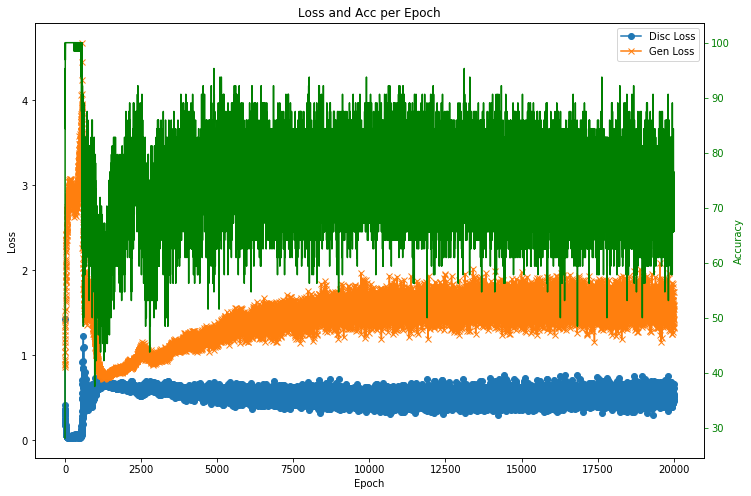

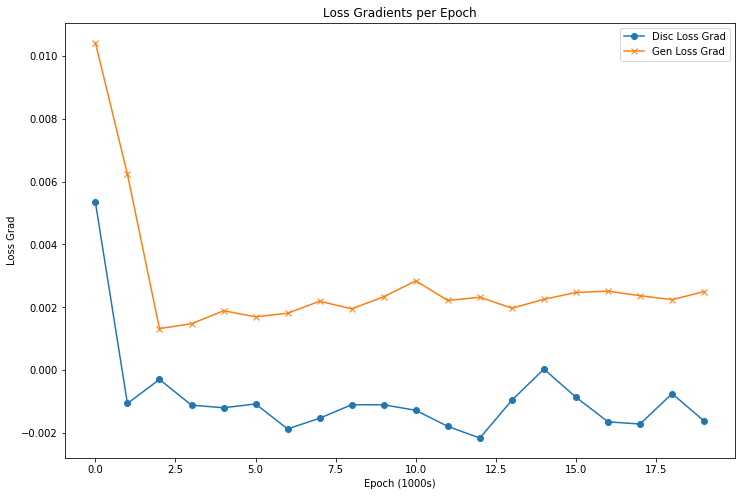

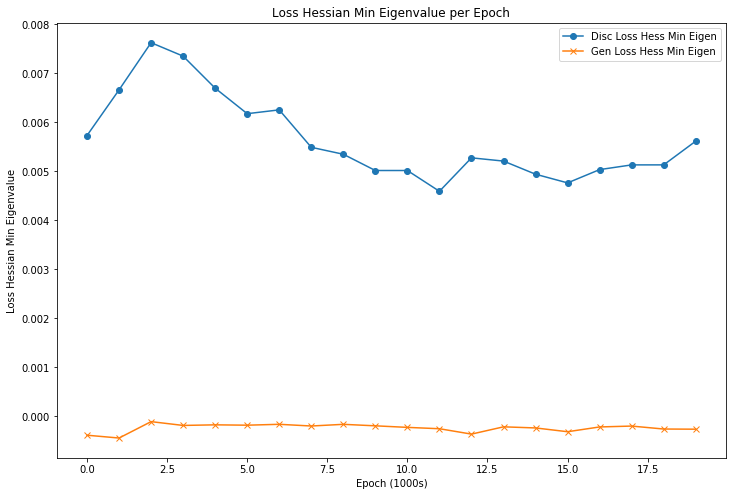

In [397]:
##### SGD with gamma = 1 #####
# learning_rate = 0.01
# momentum = 0
# decay_rate = 0 # Decay rate is how we are going to achieve inf-GD
# nest = False # Nesterov's acceleration
##############################

# Initialize GAN object
opt_params = ['sgd', 0.01, 0, 0, False, 'sgd_lr0.01_decay0']
gan_2 = GAN(opt_params)

# Train GAN
gan_2_hist = gan_2.train(epochs=20000, batch_size=32, sample_interval=1000)

# Plot of performance results (training and validation accuracies and loss) for every epoch
plt.rcParams['figure.figsize'] = (12, 8)
plot_loss_acc(gan_2_hist)
plot_loss_gradient(gan_2_hist)
plot_loss_hessian_eig(gan_2_hist)

hello
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_35 (Flatten)         (None, 784)               0         
_________________________________________________________________
dense_245 (Dense)            (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_175 (LeakyReLU)  (None, 512)               0         
_________________________________________________________________
dense_246 (Dense)            (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_176 (LeakyReLU)  (None, 256)               0         
_________________________________________________________________
dense_247 (Dense)            (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________________________

96 [D loss: 0.226591, acc.: 96.88%] [G loss: 1.116379]
97 [D loss: 0.251254, acc.: 93.75%] [G loss: 1.175577]
98 [D loss: 0.237632, acc.: 96.88%] [G loss: 1.195350]
99 [D loss: 0.243133, acc.: 95.31%] [G loss: 1.184809]
100 [D loss: 0.219619, acc.: 95.31%] [G loss: 1.162625]
101 [D loss: 0.221645, acc.: 98.44%] [G loss: 1.150810]
102 [D loss: 0.240234, acc.: 93.75%] [G loss: 1.262068]
103 [D loss: 0.253994, acc.: 93.75%] [G loss: 1.215759]
104 [D loss: 0.225188, acc.: 96.88%] [G loss: 1.201185]
105 [D loss: 0.220614, acc.: 95.31%] [G loss: 1.206047]
106 [D loss: 0.221204, acc.: 93.75%] [G loss: 1.231117]
107 [D loss: 0.214333, acc.: 98.44%] [G loss: 1.276021]
108 [D loss: 0.231457, acc.: 95.31%] [G loss: 1.209776]
109 [D loss: 0.185624, acc.: 100.00%] [G loss: 1.211974]
110 [D loss: 0.208322, acc.: 96.88%] [G loss: 1.240000]
111 [D loss: 0.173081, acc.: 100.00%] [G loss: 1.222035]
112 [D loss: 0.190292, acc.: 100.00%] [G loss: 1.253756]
113 [D loss: 0.199040, acc.: 100.00%] [G loss: 1.

241 [D loss: 0.118743, acc.: 100.00%] [G loss: 1.793647]
242 [D loss: 0.108003, acc.: 100.00%] [G loss: 1.778452]
243 [D loss: 0.122581, acc.: 100.00%] [G loss: 1.826710]
244 [D loss: 0.109703, acc.: 100.00%] [G loss: 1.763503]
245 [D loss: 0.111252, acc.: 100.00%] [G loss: 1.840000]
246 [D loss: 0.114569, acc.: 100.00%] [G loss: 1.836372]
247 [D loss: 0.104492, acc.: 100.00%] [G loss: 1.760362]
248 [D loss: 0.112421, acc.: 100.00%] [G loss: 1.885316]
249 [D loss: 0.102958, acc.: 100.00%] [G loss: 1.874310]
250 [D loss: 0.114876, acc.: 100.00%] [G loss: 1.818556]
251 [D loss: 0.107638, acc.: 100.00%] [G loss: 1.863071]
252 [D loss: 0.108622, acc.: 100.00%] [G loss: 1.859673]
253 [D loss: 0.097404, acc.: 100.00%] [G loss: 1.782497]
254 [D loss: 0.111849, acc.: 100.00%] [G loss: 1.876743]
255 [D loss: 0.105813, acc.: 100.00%] [G loss: 1.936049]
256 [D loss: 0.107631, acc.: 100.00%] [G loss: 1.821375]
257 [D loss: 0.100650, acc.: 100.00%] [G loss: 1.898637]
258 [D loss: 0.107295, acc.: 10

386 [D loss: 0.076606, acc.: 100.00%] [G loss: 2.212814]
387 [D loss: 0.077691, acc.: 100.00%] [G loss: 2.200902]
388 [D loss: 0.076629, acc.: 100.00%] [G loss: 2.184636]
389 [D loss: 0.069297, acc.: 100.00%] [G loss: 2.235378]
390 [D loss: 0.071977, acc.: 100.00%] [G loss: 2.186892]
391 [D loss: 0.067767, acc.: 100.00%] [G loss: 2.202655]
392 [D loss: 0.068519, acc.: 100.00%] [G loss: 2.224152]
393 [D loss: 0.068671, acc.: 100.00%] [G loss: 2.190719]
394 [D loss: 0.081051, acc.: 100.00%] [G loss: 2.287951]
395 [D loss: 0.074437, acc.: 100.00%] [G loss: 2.269821]
396 [D loss: 0.086913, acc.: 100.00%] [G loss: 2.188092]
397 [D loss: 0.074731, acc.: 100.00%] [G loss: 2.172419]
398 [D loss: 0.068962, acc.: 100.00%] [G loss: 2.198877]
399 [D loss: 0.067964, acc.: 100.00%] [G loss: 2.227943]
400 [D loss: 0.061083, acc.: 100.00%] [G loss: 2.283403]
401 [D loss: 0.072349, acc.: 100.00%] [G loss: 2.308862]
402 [D loss: 0.067213, acc.: 100.00%] [G loss: 2.292945]
403 [D loss: 0.072055, acc.: 10

533 [D loss: 0.054475, acc.: 100.00%] [G loss: 2.427591]
534 [D loss: 0.057002, acc.: 100.00%] [G loss: 2.430887]
535 [D loss: 0.061406, acc.: 100.00%] [G loss: 2.368001]
536 [D loss: 0.063260, acc.: 100.00%] [G loss: 2.428469]
537 [D loss: 0.055064, acc.: 100.00%] [G loss: 2.445034]
538 [D loss: 0.055755, acc.: 100.00%] [G loss: 2.356616]
539 [D loss: 0.045483, acc.: 100.00%] [G loss: 2.416664]
540 [D loss: 0.055189, acc.: 100.00%] [G loss: 2.496577]
541 [D loss: 0.058699, acc.: 100.00%] [G loss: 2.437079]
542 [D loss: 0.052408, acc.: 100.00%] [G loss: 2.459308]
543 [D loss: 0.059046, acc.: 100.00%] [G loss: 2.405375]
544 [D loss: 0.052654, acc.: 100.00%] [G loss: 2.469852]
545 [D loss: 0.057571, acc.: 100.00%] [G loss: 2.450656]
546 [D loss: 0.053473, acc.: 100.00%] [G loss: 2.483025]
547 [D loss: 0.050548, acc.: 100.00%] [G loss: 2.374407]
548 [D loss: 0.055046, acc.: 100.00%] [G loss: 2.454303]
549 [D loss: 0.056009, acc.: 100.00%] [G loss: 2.415464]
550 [D loss: 0.057812, acc.: 10

679 [D loss: 0.050019, acc.: 100.00%] [G loss: 2.590688]
680 [D loss: 0.054004, acc.: 100.00%] [G loss: 2.567257]
681 [D loss: 0.041649, acc.: 100.00%] [G loss: 2.559485]
682 [D loss: 0.046444, acc.: 100.00%] [G loss: 2.503418]
683 [D loss: 0.048785, acc.: 100.00%] [G loss: 2.564250]
684 [D loss: 0.055728, acc.: 100.00%] [G loss: 2.523134]
685 [D loss: 0.050546, acc.: 100.00%] [G loss: 2.598222]
686 [D loss: 0.050287, acc.: 100.00%] [G loss: 2.629114]
687 [D loss: 0.042010, acc.: 100.00%] [G loss: 2.589035]
688 [D loss: 0.046281, acc.: 100.00%] [G loss: 2.587493]
689 [D loss: 0.052880, acc.: 100.00%] [G loss: 2.609995]
690 [D loss: 0.046825, acc.: 100.00%] [G loss: 2.566063]
691 [D loss: 0.049876, acc.: 100.00%] [G loss: 2.634687]
692 [D loss: 0.049895, acc.: 100.00%] [G loss: 2.567235]
693 [D loss: 0.047327, acc.: 100.00%] [G loss: 2.576056]
694 [D loss: 0.043647, acc.: 100.00%] [G loss: 2.647194]
695 [D loss: 0.052711, acc.: 100.00%] [G loss: 2.669694]
696 [D loss: 0.042727, acc.: 10

824 [D loss: 0.036024, acc.: 100.00%] [G loss: 2.784970]
825 [D loss: 0.044410, acc.: 100.00%] [G loss: 2.686223]
826 [D loss: 0.039512, acc.: 100.00%] [G loss: 2.794328]
827 [D loss: 0.041178, acc.: 100.00%] [G loss: 2.666797]
828 [D loss: 0.045710, acc.: 100.00%] [G loss: 2.649055]
829 [D loss: 0.044366, acc.: 100.00%] [G loss: 2.792926]
830 [D loss: 0.049098, acc.: 100.00%] [G loss: 2.587255]
831 [D loss: 0.036192, acc.: 100.00%] [G loss: 2.622068]
832 [D loss: 0.047643, acc.: 100.00%] [G loss: 2.625938]
833 [D loss: 0.049527, acc.: 100.00%] [G loss: 2.708977]
834 [D loss: 0.039145, acc.: 100.00%] [G loss: 2.640536]
835 [D loss: 0.041811, acc.: 100.00%] [G loss: 2.712594]
836 [D loss: 0.045798, acc.: 100.00%] [G loss: 2.756198]
837 [D loss: 0.043223, acc.: 100.00%] [G loss: 2.736187]
838 [D loss: 0.046797, acc.: 100.00%] [G loss: 2.724246]
839 [D loss: 0.042890, acc.: 100.00%] [G loss: 2.727928]
840 [D loss: 0.048601, acc.: 100.00%] [G loss: 2.697051]
841 [D loss: 0.037428, acc.: 10

971 [D loss: 0.050077, acc.: 100.00%] [G loss: 2.829383]
972 [D loss: 0.044827, acc.: 100.00%] [G loss: 2.791761]
973 [D loss: 0.040404, acc.: 100.00%] [G loss: 2.647031]
974 [D loss: 0.051384, acc.: 100.00%] [G loss: 2.799634]
975 [D loss: 0.036601, acc.: 100.00%] [G loss: 2.766278]
976 [D loss: 0.040214, acc.: 100.00%] [G loss: 2.739349]
977 [D loss: 0.040457, acc.: 100.00%] [G loss: 2.707045]
978 [D loss: 0.040334, acc.: 100.00%] [G loss: 2.843338]
979 [D loss: 0.048347, acc.: 100.00%] [G loss: 2.731190]
980 [D loss: 0.049772, acc.: 100.00%] [G loss: 2.746379]
981 [D loss: 0.042132, acc.: 100.00%] [G loss: 2.743853]
982 [D loss: 0.039060, acc.: 100.00%] [G loss: 2.844812]
983 [D loss: 0.051044, acc.: 100.00%] [G loss: 2.910537]
984 [D loss: 0.033438, acc.: 100.00%] [G loss: 2.780293]
985 [D loss: 0.042710, acc.: 100.00%] [G loss: 2.832035]
986 [D loss: 0.039374, acc.: 100.00%] [G loss: 2.756331]
987 [D loss: 0.039906, acc.: 100.00%] [G loss: 2.801742]
988 [D loss: 0.039876, acc.: 10

1112 [D loss: 0.048223, acc.: 100.00%] [G loss: 2.726738]
1113 [D loss: 0.044462, acc.: 100.00%] [G loss: 2.749711]
1114 [D loss: 0.040487, acc.: 100.00%] [G loss: 2.716728]
1115 [D loss: 0.038364, acc.: 100.00%] [G loss: 2.762479]
1116 [D loss: 0.039758, acc.: 100.00%] [G loss: 2.877846]
1117 [D loss: 0.039400, acc.: 100.00%] [G loss: 2.737280]
1118 [D loss: 0.040963, acc.: 100.00%] [G loss: 2.721989]
1119 [D loss: 0.042856, acc.: 100.00%] [G loss: 2.873415]
1120 [D loss: 0.031643, acc.: 100.00%] [G loss: 2.794875]
1121 [D loss: 0.039802, acc.: 100.00%] [G loss: 2.806594]
1122 [D loss: 0.041605, acc.: 100.00%] [G loss: 2.871696]
1123 [D loss: 0.037634, acc.: 100.00%] [G loss: 2.861026]
1124 [D loss: 0.033592, acc.: 100.00%] [G loss: 2.868113]
1125 [D loss: 0.027810, acc.: 100.00%] [G loss: 2.781034]
1126 [D loss: 0.045160, acc.: 100.00%] [G loss: 2.875731]
1127 [D loss: 0.037894, acc.: 100.00%] [G loss: 2.828283]
1128 [D loss: 0.038191, acc.: 100.00%] [G loss: 2.847323]
1129 [D loss: 

1254 [D loss: 0.032892, acc.: 100.00%] [G loss: 2.785683]
1255 [D loss: 0.042901, acc.: 100.00%] [G loss: 2.838167]
1256 [D loss: 0.032647, acc.: 100.00%] [G loss: 2.766794]
1257 [D loss: 0.036968, acc.: 100.00%] [G loss: 2.964546]
1258 [D loss: 0.037773, acc.: 100.00%] [G loss: 2.903006]
1259 [D loss: 0.048170, acc.: 100.00%] [G loss: 2.713236]
1260 [D loss: 0.048823, acc.: 100.00%] [G loss: 2.815656]
1261 [D loss: 0.038450, acc.: 100.00%] [G loss: 2.889560]
1262 [D loss: 0.039730, acc.: 100.00%] [G loss: 2.834655]
1263 [D loss: 0.035639, acc.: 100.00%] [G loss: 2.854707]
1264 [D loss: 0.035610, acc.: 100.00%] [G loss: 2.874914]
1265 [D loss: 0.035865, acc.: 100.00%] [G loss: 2.817225]
1266 [D loss: 0.045615, acc.: 100.00%] [G loss: 2.848377]
1267 [D loss: 0.048568, acc.: 100.00%] [G loss: 2.914094]
1268 [D loss: 0.034343, acc.: 100.00%] [G loss: 2.908028]
1269 [D loss: 0.033588, acc.: 100.00%] [G loss: 2.940497]
1270 [D loss: 0.036320, acc.: 100.00%] [G loss: 2.975445]
1271 [D loss: 

1397 [D loss: 0.039261, acc.: 100.00%] [G loss: 2.865575]
1398 [D loss: 0.040577, acc.: 100.00%] [G loss: 2.819534]
1399 [D loss: 0.030743, acc.: 100.00%] [G loss: 2.770535]
1400 [D loss: 0.034317, acc.: 100.00%] [G loss: 2.911515]
1401 [D loss: 0.042585, acc.: 100.00%] [G loss: 2.843970]
1402 [D loss: 0.053063, acc.: 100.00%] [G loss: 2.931072]
1403 [D loss: 0.046862, acc.: 100.00%] [G loss: 2.950037]
1404 [D loss: 0.039096, acc.: 100.00%] [G loss: 2.869781]
1405 [D loss: 0.041815, acc.: 100.00%] [G loss: 3.008664]
1406 [D loss: 0.041667, acc.: 100.00%] [G loss: 2.954388]
1407 [D loss: 0.042769, acc.: 100.00%] [G loss: 2.925544]
1408 [D loss: 0.029648, acc.: 100.00%] [G loss: 2.800434]
1409 [D loss: 0.035045, acc.: 100.00%] [G loss: 2.903749]
1410 [D loss: 0.040709, acc.: 100.00%] [G loss: 2.949423]
1411 [D loss: 0.036069, acc.: 100.00%] [G loss: 3.038703]
1412 [D loss: 0.034410, acc.: 100.00%] [G loss: 2.914319]
1413 [D loss: 0.040418, acc.: 100.00%] [G loss: 2.929478]
1414 [D loss: 

1540 [D loss: 0.036844, acc.: 100.00%] [G loss: 2.956738]
1541 [D loss: 0.039451, acc.: 100.00%] [G loss: 2.904138]
1542 [D loss: 0.036505, acc.: 100.00%] [G loss: 2.855424]
1543 [D loss: 0.040110, acc.: 100.00%] [G loss: 3.034834]
1544 [D loss: 0.032179, acc.: 100.00%] [G loss: 2.863062]
1545 [D loss: 0.034700, acc.: 100.00%] [G loss: 2.954179]
1546 [D loss: 0.030727, acc.: 100.00%] [G loss: 2.880326]
1547 [D loss: 0.046340, acc.: 100.00%] [G loss: 2.924028]
1548 [D loss: 0.036638, acc.: 100.00%] [G loss: 2.976298]
1549 [D loss: 0.044100, acc.: 100.00%] [G loss: 2.924687]
1550 [D loss: 0.032685, acc.: 100.00%] [G loss: 2.839438]
1551 [D loss: 0.029285, acc.: 100.00%] [G loss: 2.791175]
1552 [D loss: 0.035290, acc.: 100.00%] [G loss: 2.888379]
1553 [D loss: 0.032695, acc.: 100.00%] [G loss: 2.793436]
1554 [D loss: 0.034961, acc.: 100.00%] [G loss: 2.962686]
1555 [D loss: 0.045048, acc.: 100.00%] [G loss: 2.825621]
1556 [D loss: 0.037989, acc.: 100.00%] [G loss: 2.902761]
1557 [D loss: 

1683 [D loss: 0.042485, acc.: 100.00%] [G loss: 2.905208]
1684 [D loss: 0.041830, acc.: 100.00%] [G loss: 2.804812]
1685 [D loss: 0.039539, acc.: 100.00%] [G loss: 2.859470]
1686 [D loss: 0.034056, acc.: 100.00%] [G loss: 2.930505]
1687 [D loss: 0.034082, acc.: 100.00%] [G loss: 2.959399]
1688 [D loss: 0.040109, acc.: 100.00%] [G loss: 2.927608]
1689 [D loss: 0.041556, acc.: 100.00%] [G loss: 2.835922]
1690 [D loss: 0.030698, acc.: 100.00%] [G loss: 2.938166]
1691 [D loss: 0.042845, acc.: 100.00%] [G loss: 2.906473]
1692 [D loss: 0.035248, acc.: 100.00%] [G loss: 2.823390]
1693 [D loss: 0.049590, acc.: 100.00%] [G loss: 2.976718]
1694 [D loss: 0.042133, acc.: 100.00%] [G loss: 2.788916]
1695 [D loss: 0.041629, acc.: 100.00%] [G loss: 2.895116]
1696 [D loss: 0.039724, acc.: 100.00%] [G loss: 2.920091]
1697 [D loss: 0.035637, acc.: 100.00%] [G loss: 2.872833]
1698 [D loss: 0.032657, acc.: 100.00%] [G loss: 2.855637]
1699 [D loss: 0.039551, acc.: 100.00%] [G loss: 2.937752]
1700 [D loss: 

1825 [D loss: 0.032290, acc.: 100.00%] [G loss: 2.853130]
1826 [D loss: 0.042045, acc.: 100.00%] [G loss: 2.863053]
1827 [D loss: 0.031442, acc.: 100.00%] [G loss: 2.940190]
1828 [D loss: 0.032283, acc.: 100.00%] [G loss: 3.012461]
1829 [D loss: 0.035440, acc.: 100.00%] [G loss: 2.931427]
1830 [D loss: 0.038415, acc.: 100.00%] [G loss: 2.854619]
1831 [D loss: 0.034696, acc.: 100.00%] [G loss: 2.936457]
1832 [D loss: 0.038203, acc.: 100.00%] [G loss: 2.932991]
1833 [D loss: 0.036551, acc.: 100.00%] [G loss: 3.049590]
1834 [D loss: 0.032462, acc.: 100.00%] [G loss: 2.898516]
1835 [D loss: 0.041876, acc.: 100.00%] [G loss: 2.938520]
1836 [D loss: 0.034176, acc.: 100.00%] [G loss: 2.828444]
1837 [D loss: 0.043724, acc.: 100.00%] [G loss: 2.935046]
1838 [D loss: 0.032566, acc.: 100.00%] [G loss: 2.969584]
1839 [D loss: 0.041191, acc.: 100.00%] [G loss: 2.975658]
1840 [D loss: 0.034493, acc.: 100.00%] [G loss: 2.953286]
1841 [D loss: 0.034096, acc.: 100.00%] [G loss: 3.067174]
1842 [D loss: 

1969 [D loss: 0.033556, acc.: 100.00%] [G loss: 2.901779]
1970 [D loss: 0.034648, acc.: 100.00%] [G loss: 2.911804]
1971 [D loss: 0.034784, acc.: 100.00%] [G loss: 2.833094]
1972 [D loss: 0.044264, acc.: 100.00%] [G loss: 2.972400]
1973 [D loss: 0.031837, acc.: 100.00%] [G loss: 2.956822]
1974 [D loss: 0.032176, acc.: 100.00%] [G loss: 2.895847]
1975 [D loss: 0.040094, acc.: 100.00%] [G loss: 2.870339]
1976 [D loss: 0.041696, acc.: 100.00%] [G loss: 2.859881]
1977 [D loss: 0.044004, acc.: 100.00%] [G loss: 2.858997]
1978 [D loss: 0.040233, acc.: 100.00%] [G loss: 2.797742]
1979 [D loss: 0.048993, acc.: 100.00%] [G loss: 2.958463]
1980 [D loss: 0.037140, acc.: 100.00%] [G loss: 2.988331]
1981 [D loss: 0.036270, acc.: 100.00%] [G loss: 2.999537]
1982 [D loss: 0.040815, acc.: 100.00%] [G loss: 2.926175]
1983 [D loss: 0.040421, acc.: 100.00%] [G loss: 2.948683]
1984 [D loss: 0.031433, acc.: 100.00%] [G loss: 2.885190]
1985 [D loss: 0.044368, acc.: 100.00%] [G loss: 2.833577]
1986 [D loss: 

2108 [D loss: 0.037089, acc.: 100.00%] [G loss: 2.934135]
2109 [D loss: 0.053140, acc.: 100.00%] [G loss: 2.849499]
2110 [D loss: 0.043035, acc.: 100.00%] [G loss: 2.861944]
2111 [D loss: 0.044566, acc.: 100.00%] [G loss: 2.898117]
2112 [D loss: 0.052052, acc.: 100.00%] [G loss: 3.023859]
2113 [D loss: 0.050145, acc.: 100.00%] [G loss: 2.948481]
2114 [D loss: 0.040074, acc.: 100.00%] [G loss: 2.886553]
2115 [D loss: 0.038080, acc.: 100.00%] [G loss: 2.932624]
2116 [D loss: 0.039469, acc.: 100.00%] [G loss: 2.987081]
2117 [D loss: 0.044586, acc.: 100.00%] [G loss: 2.849174]
2118 [D loss: 0.035985, acc.: 100.00%] [G loss: 2.942292]
2119 [D loss: 0.045687, acc.: 100.00%] [G loss: 2.888969]
2120 [D loss: 0.047527, acc.: 100.00%] [G loss: 2.771881]
2121 [D loss: 0.044143, acc.: 100.00%] [G loss: 2.996006]
2122 [D loss: 0.042900, acc.: 100.00%] [G loss: 2.941147]
2123 [D loss: 0.030365, acc.: 100.00%] [G loss: 2.905597]
2124 [D loss: 0.031999, acc.: 100.00%] [G loss: 2.840313]
2125 [D loss: 

2250 [D loss: 0.043192, acc.: 100.00%] [G loss: 2.835969]
2251 [D loss: 0.045447, acc.: 100.00%] [G loss: 2.959865]
2252 [D loss: 0.041456, acc.: 100.00%] [G loss: 2.886384]
2253 [D loss: 0.041758, acc.: 100.00%] [G loss: 2.858529]
2254 [D loss: 0.040214, acc.: 100.00%] [G loss: 2.919698]
2255 [D loss: 0.047771, acc.: 100.00%] [G loss: 3.016041]
2256 [D loss: 0.048963, acc.: 100.00%] [G loss: 2.820105]
2257 [D loss: 0.036128, acc.: 100.00%] [G loss: 2.813198]
2258 [D loss: 0.036556, acc.: 100.00%] [G loss: 2.943238]
2259 [D loss: 0.041982, acc.: 100.00%] [G loss: 2.973980]
2260 [D loss: 0.040128, acc.: 100.00%] [G loss: 2.912783]
2261 [D loss: 0.044157, acc.: 100.00%] [G loss: 2.916399]
2262 [D loss: 0.048420, acc.: 100.00%] [G loss: 2.836393]
2263 [D loss: 0.035997, acc.: 100.00%] [G loss: 2.891097]
2264 [D loss: 0.040990, acc.: 100.00%] [G loss: 2.842004]
2265 [D loss: 0.043692, acc.: 100.00%] [G loss: 2.855645]
2266 [D loss: 0.045557, acc.: 100.00%] [G loss: 2.957846]
2267 [D loss: 

2395 [D loss: 0.043462, acc.: 100.00%] [G loss: 2.953637]
2396 [D loss: 0.043580, acc.: 100.00%] [G loss: 2.862752]
2397 [D loss: 0.052830, acc.: 100.00%] [G loss: 2.827394]
2398 [D loss: 0.045019, acc.: 100.00%] [G loss: 2.819101]
2399 [D loss: 0.046971, acc.: 100.00%] [G loss: 2.963006]
2400 [D loss: 0.039397, acc.: 100.00%] [G loss: 2.863963]
2401 [D loss: 0.039913, acc.: 100.00%] [G loss: 2.900900]
2402 [D loss: 0.044682, acc.: 100.00%] [G loss: 2.865419]
2403 [D loss: 0.051573, acc.: 100.00%] [G loss: 3.027071]
2404 [D loss: 0.044859, acc.: 100.00%] [G loss: 2.955316]
2405 [D loss: 0.051583, acc.: 100.00%] [G loss: 2.879171]
2406 [D loss: 0.032095, acc.: 100.00%] [G loss: 2.929219]
2407 [D loss: 0.036025, acc.: 100.00%] [G loss: 2.886161]
2408 [D loss: 0.055798, acc.: 100.00%] [G loss: 2.878546]
2409 [D loss: 0.050759, acc.: 100.00%] [G loss: 2.903162]
2410 [D loss: 0.054159, acc.: 100.00%] [G loss: 2.874057]
2411 [D loss: 0.048400, acc.: 100.00%] [G loss: 2.889359]
2412 [D loss: 

2538 [D loss: 0.042355, acc.: 100.00%] [G loss: 2.917629]
2539 [D loss: 0.043697, acc.: 100.00%] [G loss: 2.865317]
2540 [D loss: 0.049812, acc.: 100.00%] [G loss: 2.781570]
2541 [D loss: 0.033937, acc.: 100.00%] [G loss: 2.959815]
2542 [D loss: 0.040737, acc.: 100.00%] [G loss: 2.853423]
2543 [D loss: 0.049032, acc.: 100.00%] [G loss: 2.898319]
2544 [D loss: 0.045743, acc.: 100.00%] [G loss: 2.858589]
2545 [D loss: 0.048274, acc.: 100.00%] [G loss: 2.987600]
2546 [D loss: 0.042048, acc.: 100.00%] [G loss: 2.793731]
2547 [D loss: 0.056179, acc.: 100.00%] [G loss: 2.931283]
2548 [D loss: 0.056890, acc.: 100.00%] [G loss: 2.938237]
2549 [D loss: 0.045257, acc.: 100.00%] [G loss: 2.895612]
2550 [D loss: 0.048024, acc.: 100.00%] [G loss: 2.886226]
2551 [D loss: 0.047019, acc.: 100.00%] [G loss: 2.804061]
2552 [D loss: 0.036689, acc.: 100.00%] [G loss: 2.953226]
2553 [D loss: 0.045753, acc.: 100.00%] [G loss: 2.827974]
2554 [D loss: 0.040814, acc.: 100.00%] [G loss: 2.982668]
2555 [D loss: 

2681 [D loss: 0.050716, acc.: 100.00%] [G loss: 2.721829]
2682 [D loss: 0.051135, acc.: 100.00%] [G loss: 2.917343]
2683 [D loss: 0.047176, acc.: 100.00%] [G loss: 2.751358]
2684 [D loss: 0.039635, acc.: 100.00%] [G loss: 2.877111]
2685 [D loss: 0.047716, acc.: 100.00%] [G loss: 2.889853]
2686 [D loss: 0.063030, acc.: 100.00%] [G loss: 2.815120]
2687 [D loss: 0.044375, acc.: 100.00%] [G loss: 2.843707]
2688 [D loss: 0.038489, acc.: 100.00%] [G loss: 2.825516]
2689 [D loss: 0.046140, acc.: 100.00%] [G loss: 2.892455]
2690 [D loss: 0.045186, acc.: 100.00%] [G loss: 2.826303]
2691 [D loss: 0.033663, acc.: 100.00%] [G loss: 2.944008]
2692 [D loss: 0.045857, acc.: 100.00%] [G loss: 2.938308]
2693 [D loss: 0.043147, acc.: 100.00%] [G loss: 2.918913]
2694 [D loss: 0.043831, acc.: 100.00%] [G loss: 2.812623]
2695 [D loss: 0.044290, acc.: 100.00%] [G loss: 2.889915]
2696 [D loss: 0.031660, acc.: 100.00%] [G loss: 2.932861]
2697 [D loss: 0.048719, acc.: 100.00%] [G loss: 2.905457]
2698 [D loss: 

2824 [D loss: 0.047668, acc.: 100.00%] [G loss: 2.923553]
2825 [D loss: 0.048218, acc.: 100.00%] [G loss: 2.878887]
2826 [D loss: 0.043571, acc.: 100.00%] [G loss: 2.949393]
2827 [D loss: 0.049076, acc.: 100.00%] [G loss: 2.836756]
2828 [D loss: 0.052199, acc.: 100.00%] [G loss: 2.881549]
2829 [D loss: 0.049648, acc.: 100.00%] [G loss: 2.865983]
2830 [D loss: 0.050198, acc.: 100.00%] [G loss: 2.898261]
2831 [D loss: 0.042470, acc.: 100.00%] [G loss: 2.833541]
2832 [D loss: 0.039683, acc.: 100.00%] [G loss: 2.903574]
2833 [D loss: 0.037678, acc.: 100.00%] [G loss: 2.853851]
2834 [D loss: 0.036054, acc.: 100.00%] [G loss: 2.984230]
2835 [D loss: 0.059767, acc.: 100.00%] [G loss: 2.920742]
2836 [D loss: 0.038841, acc.: 100.00%] [G loss: 2.890262]
2837 [D loss: 0.050261, acc.: 100.00%] [G loss: 2.884249]
2838 [D loss: 0.053892, acc.: 100.00%] [G loss: 2.928757]
2839 [D loss: 0.045506, acc.: 100.00%] [G loss: 2.992599]
2840 [D loss: 0.050931, acc.: 100.00%] [G loss: 2.897057]
2841 [D loss: 

2969 [D loss: 0.037085, acc.: 100.00%] [G loss: 2.827632]
2970 [D loss: 0.037223, acc.: 100.00%] [G loss: 2.899952]
2971 [D loss: 0.041091, acc.: 100.00%] [G loss: 2.930407]
2972 [D loss: 0.044265, acc.: 100.00%] [G loss: 2.808906]
2973 [D loss: 0.048255, acc.: 100.00%] [G loss: 2.806428]
2974 [D loss: 0.064585, acc.: 98.44%] [G loss: 2.713412]
2975 [D loss: 0.042696, acc.: 100.00%] [G loss: 2.886560]
2976 [D loss: 0.051249, acc.: 100.00%] [G loss: 2.826808]
2977 [D loss: 0.039430, acc.: 100.00%] [G loss: 2.904458]
2978 [D loss: 0.055044, acc.: 100.00%] [G loss: 2.815842]
2979 [D loss: 0.036348, acc.: 100.00%] [G loss: 2.878555]
2980 [D loss: 0.037520, acc.: 100.00%] [G loss: 2.862784]
2981 [D loss: 0.052541, acc.: 100.00%] [G loss: 2.892328]
2982 [D loss: 0.051977, acc.: 100.00%] [G loss: 2.823364]
2983 [D loss: 0.054712, acc.: 100.00%] [G loss: 2.862573]
2984 [D loss: 0.054532, acc.: 100.00%] [G loss: 2.782596]
2985 [D loss: 0.040601, acc.: 100.00%] [G loss: 2.873042]
2986 [D loss: 0

3108 [D loss: 0.046742, acc.: 100.00%] [G loss: 2.908412]
3109 [D loss: 0.047752, acc.: 100.00%] [G loss: 2.883803]
3110 [D loss: 0.038985, acc.: 100.00%] [G loss: 2.948117]
3111 [D loss: 0.038715, acc.: 100.00%] [G loss: 2.831573]
3112 [D loss: 0.039960, acc.: 100.00%] [G loss: 2.945837]
3113 [D loss: 0.038062, acc.: 100.00%] [G loss: 2.826578]
3114 [D loss: 0.044787, acc.: 100.00%] [G loss: 2.769830]
3115 [D loss: 0.045225, acc.: 100.00%] [G loss: 2.915661]
3116 [D loss: 0.045108, acc.: 100.00%] [G loss: 2.908032]
3117 [D loss: 0.042600, acc.: 100.00%] [G loss: 2.902457]
3118 [D loss: 0.048586, acc.: 100.00%] [G loss: 2.833652]
3119 [D loss: 0.035710, acc.: 100.00%] [G loss: 2.877314]
3120 [D loss: 0.040755, acc.: 100.00%] [G loss: 2.953042]
3121 [D loss: 0.041249, acc.: 100.00%] [G loss: 2.796656]
3122 [D loss: 0.045239, acc.: 100.00%] [G loss: 2.816575]
3123 [D loss: 0.049145, acc.: 100.00%] [G loss: 2.823869]
3124 [D loss: 0.046684, acc.: 100.00%] [G loss: 2.915521]
3125 [D loss: 

3253 [D loss: 0.056038, acc.: 100.00%] [G loss: 2.852821]
3254 [D loss: 0.042297, acc.: 100.00%] [G loss: 2.865850]
3255 [D loss: 0.044145, acc.: 100.00%] [G loss: 2.769761]
3256 [D loss: 0.044445, acc.: 100.00%] [G loss: 2.860817]
3257 [D loss: 0.047742, acc.: 100.00%] [G loss: 2.994747]
3258 [D loss: 0.046094, acc.: 100.00%] [G loss: 2.807190]
3259 [D loss: 0.061051, acc.: 98.44%] [G loss: 2.973187]
3260 [D loss: 0.052189, acc.: 100.00%] [G loss: 2.892788]
3261 [D loss: 0.045914, acc.: 100.00%] [G loss: 2.782002]
3262 [D loss: 0.048802, acc.: 100.00%] [G loss: 2.803857]
3263 [D loss: 0.036961, acc.: 100.00%] [G loss: 2.828822]
3264 [D loss: 0.037256, acc.: 100.00%] [G loss: 2.897456]
3265 [D loss: 0.048848, acc.: 100.00%] [G loss: 2.899565]
3266 [D loss: 0.042189, acc.: 100.00%] [G loss: 2.956512]
3267 [D loss: 0.050326, acc.: 100.00%] [G loss: 2.907888]
3268 [D loss: 0.044688, acc.: 100.00%] [G loss: 2.962557]
3269 [D loss: 0.042943, acc.: 100.00%] [G loss: 2.951490]
3270 [D loss: 0

3397 [D loss: 0.049772, acc.: 100.00%] [G loss: 2.950061]
3398 [D loss: 0.041483, acc.: 100.00%] [G loss: 2.871400]
3399 [D loss: 0.036556, acc.: 100.00%] [G loss: 2.962123]
3400 [D loss: 0.057111, acc.: 100.00%] [G loss: 2.819714]
3401 [D loss: 0.039851, acc.: 100.00%] [G loss: 2.938534]
3402 [D loss: 0.043187, acc.: 98.44%] [G loss: 2.909883]
3403 [D loss: 0.050416, acc.: 100.00%] [G loss: 2.849086]
3404 [D loss: 0.051264, acc.: 100.00%] [G loss: 3.000546]
3405 [D loss: 0.041305, acc.: 100.00%] [G loss: 2.907810]
3406 [D loss: 0.032795, acc.: 100.00%] [G loss: 2.897740]
3407 [D loss: 0.049123, acc.: 100.00%] [G loss: 2.882554]
3408 [D loss: 0.046801, acc.: 100.00%] [G loss: 2.911211]
3409 [D loss: 0.043206, acc.: 100.00%] [G loss: 2.953341]
3410 [D loss: 0.046839, acc.: 100.00%] [G loss: 3.015013]
3411 [D loss: 0.049307, acc.: 100.00%] [G loss: 2.865157]
3412 [D loss: 0.037309, acc.: 100.00%] [G loss: 2.904755]
3413 [D loss: 0.032693, acc.: 100.00%] [G loss: 2.895716]
3414 [D loss: 0

3541 [D loss: 0.040739, acc.: 100.00%] [G loss: 2.839828]
3542 [D loss: 0.052726, acc.: 100.00%] [G loss: 2.889476]
3543 [D loss: 0.043290, acc.: 100.00%] [G loss: 2.971938]
3544 [D loss: 0.049725, acc.: 100.00%] [G loss: 2.858873]
3545 [D loss: 0.037837, acc.: 100.00%] [G loss: 2.921502]
3546 [D loss: 0.049993, acc.: 100.00%] [G loss: 2.925655]
3547 [D loss: 0.046923, acc.: 100.00%] [G loss: 2.828923]
3548 [D loss: 0.046184, acc.: 100.00%] [G loss: 2.868823]
3549 [D loss: 0.038741, acc.: 100.00%] [G loss: 2.818977]
3550 [D loss: 0.045017, acc.: 100.00%] [G loss: 2.990973]
3551 [D loss: 0.048829, acc.: 100.00%] [G loss: 2.899317]
3552 [D loss: 0.047218, acc.: 100.00%] [G loss: 2.860513]
3553 [D loss: 0.044940, acc.: 100.00%] [G loss: 2.905124]
3554 [D loss: 0.043424, acc.: 100.00%] [G loss: 2.915385]
3555 [D loss: 0.065006, acc.: 100.00%] [G loss: 2.912420]
3556 [D loss: 0.047182, acc.: 100.00%] [G loss: 2.852722]
3557 [D loss: 0.040845, acc.: 100.00%] [G loss: 2.968969]
3558 [D loss: 

3684 [D loss: 0.047665, acc.: 98.44%] [G loss: 3.021499]
3685 [D loss: 0.039169, acc.: 100.00%] [G loss: 2.890297]
3686 [D loss: 0.035372, acc.: 100.00%] [G loss: 2.909487]
3687 [D loss: 0.042228, acc.: 100.00%] [G loss: 2.948321]
3688 [D loss: 0.038192, acc.: 100.00%] [G loss: 3.053307]
3689 [D loss: 0.034764, acc.: 100.00%] [G loss: 2.978553]
3690 [D loss: 0.041346, acc.: 100.00%] [G loss: 2.942276]
3691 [D loss: 0.043995, acc.: 100.00%] [G loss: 2.885487]
3692 [D loss: 0.039393, acc.: 100.00%] [G loss: 3.078015]
3693 [D loss: 0.046205, acc.: 100.00%] [G loss: 3.021350]
3694 [D loss: 0.042084, acc.: 100.00%] [G loss: 3.018463]
3695 [D loss: 0.040095, acc.: 100.00%] [G loss: 2.939250]
3696 [D loss: 0.033333, acc.: 100.00%] [G loss: 3.050170]
3697 [D loss: 0.048112, acc.: 100.00%] [G loss: 3.086844]
3698 [D loss: 0.057130, acc.: 100.00%] [G loss: 2.769307]
3699 [D loss: 0.042035, acc.: 100.00%] [G loss: 3.047024]
3700 [D loss: 0.057717, acc.: 100.00%] [G loss: 2.931047]
3701 [D loss: 0

3829 [D loss: 0.057256, acc.: 100.00%] [G loss: 2.929149]
3830 [D loss: 0.050547, acc.: 100.00%] [G loss: 2.907165]
3831 [D loss: 0.046327, acc.: 100.00%] [G loss: 2.865814]
3832 [D loss: 0.037047, acc.: 100.00%] [G loss: 2.938335]
3833 [D loss: 0.033887, acc.: 100.00%] [G loss: 2.864175]
3834 [D loss: 0.043650, acc.: 100.00%] [G loss: 2.938625]
3835 [D loss: 0.045275, acc.: 100.00%] [G loss: 2.954897]
3836 [D loss: 0.043783, acc.: 100.00%] [G loss: 2.967606]
3837 [D loss: 0.040309, acc.: 100.00%] [G loss: 3.086854]
3838 [D loss: 0.041984, acc.: 100.00%] [G loss: 2.998670]
3839 [D loss: 0.041017, acc.: 100.00%] [G loss: 2.999015]
3840 [D loss: 0.054271, acc.: 100.00%] [G loss: 2.854441]
3841 [D loss: 0.031875, acc.: 100.00%] [G loss: 3.010553]
3842 [D loss: 0.039266, acc.: 100.00%] [G loss: 3.029059]
3843 [D loss: 0.047654, acc.: 100.00%] [G loss: 2.963265]
3844 [D loss: 0.031696, acc.: 100.00%] [G loss: 2.925307]
3845 [D loss: 0.033484, acc.: 100.00%] [G loss: 3.002753]
3846 [D loss: 

3972 [D loss: 0.044255, acc.: 100.00%] [G loss: 3.006381]
3973 [D loss: 0.057027, acc.: 100.00%] [G loss: 2.987475]
3974 [D loss: 0.042782, acc.: 100.00%] [G loss: 3.025176]
3975 [D loss: 0.049593, acc.: 100.00%] [G loss: 2.975795]
3976 [D loss: 0.039181, acc.: 100.00%] [G loss: 3.070534]
3977 [D loss: 0.047147, acc.: 100.00%] [G loss: 3.038596]
3978 [D loss: 0.048264, acc.: 100.00%] [G loss: 2.958792]
3979 [D loss: 0.035599, acc.: 100.00%] [G loss: 3.041626]
3980 [D loss: 0.045595, acc.: 100.00%] [G loss: 3.034749]
3981 [D loss: 0.038164, acc.: 100.00%] [G loss: 2.951660]
3982 [D loss: 0.049869, acc.: 100.00%] [G loss: 2.989472]
3983 [D loss: 0.039617, acc.: 100.00%] [G loss: 2.923104]
3984 [D loss: 0.046039, acc.: 100.00%] [G loss: 3.012330]
3985 [D loss: 0.037566, acc.: 100.00%] [G loss: 3.018700]
3986 [D loss: 0.043789, acc.: 100.00%] [G loss: 3.025607]
3987 [D loss: 0.063128, acc.: 100.00%] [G loss: 2.879855]
3988 [D loss: 0.043314, acc.: 100.00%] [G loss: 2.969926]
3989 [D loss: 

4113 [D loss: 0.039645, acc.: 100.00%] [G loss: 3.061366]
4114 [D loss: 0.043989, acc.: 100.00%] [G loss: 3.015302]
4115 [D loss: 0.039049, acc.: 100.00%] [G loss: 3.083873]
4116 [D loss: 0.045950, acc.: 100.00%] [G loss: 3.155524]
4117 [D loss: 0.037190, acc.: 100.00%] [G loss: 2.954570]
4118 [D loss: 0.044561, acc.: 100.00%] [G loss: 3.030762]
4119 [D loss: 0.052790, acc.: 100.00%] [G loss: 3.063486]
4120 [D loss: 0.033027, acc.: 100.00%] [G loss: 3.034922]
4121 [D loss: 0.049467, acc.: 100.00%] [G loss: 3.135615]
4122 [D loss: 0.045798, acc.: 100.00%] [G loss: 3.019580]
4123 [D loss: 0.041460, acc.: 100.00%] [G loss: 3.032107]
4124 [D loss: 0.035041, acc.: 100.00%] [G loss: 2.962514]
4125 [D loss: 0.048583, acc.: 100.00%] [G loss: 2.986512]
4126 [D loss: 0.056840, acc.: 100.00%] [G loss: 3.072786]
4127 [D loss: 0.041036, acc.: 100.00%] [G loss: 2.976172]
4128 [D loss: 0.046879, acc.: 100.00%] [G loss: 3.081535]
4129 [D loss: 0.051542, acc.: 100.00%] [G loss: 2.903985]
4130 [D loss: 

4257 [D loss: 0.043685, acc.: 100.00%] [G loss: 2.994895]
4258 [D loss: 0.042765, acc.: 100.00%] [G loss: 3.119246]
4259 [D loss: 0.047791, acc.: 100.00%] [G loss: 3.214089]
4260 [D loss: 0.047461, acc.: 100.00%] [G loss: 3.074461]
4261 [D loss: 0.051453, acc.: 100.00%] [G loss: 3.090659]
4262 [D loss: 0.043879, acc.: 100.00%] [G loss: 3.051986]
4263 [D loss: 0.057712, acc.: 100.00%] [G loss: 3.243384]
4264 [D loss: 0.040555, acc.: 100.00%] [G loss: 3.086909]
4265 [D loss: 0.051035, acc.: 100.00%] [G loss: 3.219675]
4266 [D loss: 0.047441, acc.: 100.00%] [G loss: 3.142186]
4267 [D loss: 0.041996, acc.: 100.00%] [G loss: 3.008110]
4268 [D loss: 0.049482, acc.: 100.00%] [G loss: 3.142353]
4269 [D loss: 0.032408, acc.: 100.00%] [G loss: 3.064097]
4270 [D loss: 0.038135, acc.: 100.00%] [G loss: 3.044862]
4271 [D loss: 0.037413, acc.: 100.00%] [G loss: 2.986071]
4272 [D loss: 0.042153, acc.: 100.00%] [G loss: 3.129403]
4273 [D loss: 0.034321, acc.: 100.00%] [G loss: 3.055479]
4274 [D loss: 

4399 [D loss: 0.037143, acc.: 100.00%] [G loss: 3.054563]
4400 [D loss: 0.035129, acc.: 100.00%] [G loss: 3.059947]
4401 [D loss: 0.047528, acc.: 100.00%] [G loss: 3.046906]
4402 [D loss: 0.042370, acc.: 100.00%] [G loss: 3.133793]
4403 [D loss: 0.035292, acc.: 100.00%] [G loss: 3.085718]
4404 [D loss: 0.036534, acc.: 100.00%] [G loss: 3.005013]
4405 [D loss: 0.037161, acc.: 100.00%] [G loss: 3.140450]
4406 [D loss: 0.038689, acc.: 100.00%] [G loss: 3.062344]
4407 [D loss: 0.038011, acc.: 100.00%] [G loss: 3.102524]
4408 [D loss: 0.042472, acc.: 100.00%] [G loss: 3.099649]
4409 [D loss: 0.044073, acc.: 100.00%] [G loss: 3.082673]
4410 [D loss: 0.040261, acc.: 100.00%] [G loss: 3.005558]
4411 [D loss: 0.040624, acc.: 100.00%] [G loss: 2.990809]
4412 [D loss: 0.036113, acc.: 100.00%] [G loss: 2.987752]
4413 [D loss: 0.037936, acc.: 100.00%] [G loss: 2.989930]
4414 [D loss: 0.039326, acc.: 100.00%] [G loss: 3.047297]
4415 [D loss: 0.043769, acc.: 100.00%] [G loss: 3.159552]
4416 [D loss: 

4543 [D loss: 0.037829, acc.: 100.00%] [G loss: 3.104747]
4544 [D loss: 0.036148, acc.: 100.00%] [G loss: 3.005489]
4545 [D loss: 0.047941, acc.: 100.00%] [G loss: 3.101375]
4546 [D loss: 0.050850, acc.: 100.00%] [G loss: 3.112961]
4547 [D loss: 0.047045, acc.: 100.00%] [G loss: 3.044793]
4548 [D loss: 0.038130, acc.: 100.00%] [G loss: 3.096400]
4549 [D loss: 0.050453, acc.: 100.00%] [G loss: 3.031145]
4550 [D loss: 0.046177, acc.: 100.00%] [G loss: 3.178151]
4551 [D loss: 0.054721, acc.: 100.00%] [G loss: 3.058317]
4552 [D loss: 0.049899, acc.: 98.44%] [G loss: 3.122595]
4553 [D loss: 0.050641, acc.: 100.00%] [G loss: 3.160188]
4554 [D loss: 0.040104, acc.: 100.00%] [G loss: 2.964021]
4555 [D loss: 0.033133, acc.: 100.00%] [G loss: 3.131315]
4556 [D loss: 0.044342, acc.: 100.00%] [G loss: 3.132826]
4557 [D loss: 0.047645, acc.: 100.00%] [G loss: 3.021239]
4558 [D loss: 0.032262, acc.: 100.00%] [G loss: 3.057907]
4559 [D loss: 0.033709, acc.: 100.00%] [G loss: 3.180540]
4560 [D loss: 0

4688 [D loss: 0.048612, acc.: 100.00%] [G loss: 3.172215]
4689 [D loss: 0.043034, acc.: 100.00%] [G loss: 3.193932]
4690 [D loss: 0.039270, acc.: 100.00%] [G loss: 3.001230]
4691 [D loss: 0.044457, acc.: 100.00%] [G loss: 3.097838]
4692 [D loss: 0.049149, acc.: 100.00%] [G loss: 3.151144]
4693 [D loss: 0.054690, acc.: 100.00%] [G loss: 3.256872]
4694 [D loss: 0.040566, acc.: 100.00%] [G loss: 3.022410]
4695 [D loss: 0.036763, acc.: 100.00%] [G loss: 3.143795]
4696 [D loss: 0.040477, acc.: 100.00%] [G loss: 3.025384]
4697 [D loss: 0.036004, acc.: 100.00%] [G loss: 3.246178]
4698 [D loss: 0.049805, acc.: 100.00%] [G loss: 3.288625]
4699 [D loss: 0.033584, acc.: 100.00%] [G loss: 3.121289]
4700 [D loss: 0.058379, acc.: 100.00%] [G loss: 3.110967]
4701 [D loss: 0.045442, acc.: 100.00%] [G loss: 3.150030]
4702 [D loss: 0.053977, acc.: 100.00%] [G loss: 3.044105]
4703 [D loss: 0.056830, acc.: 100.00%] [G loss: 3.163586]
4704 [D loss: 0.042188, acc.: 100.00%] [G loss: 3.158374]
4705 [D loss: 

4831 [D loss: 0.050679, acc.: 100.00%] [G loss: 3.152854]
4832 [D loss: 0.050474, acc.: 100.00%] [G loss: 3.050603]
4833 [D loss: 0.044660, acc.: 100.00%] [G loss: 3.168725]
4834 [D loss: 0.054869, acc.: 100.00%] [G loss: 3.199017]
4835 [D loss: 0.052450, acc.: 100.00%] [G loss: 3.209016]
4836 [D loss: 0.051761, acc.: 100.00%] [G loss: 3.101601]
4837 [D loss: 0.043361, acc.: 100.00%] [G loss: 3.168563]
4838 [D loss: 0.044916, acc.: 100.00%] [G loss: 3.164102]
4839 [D loss: 0.044026, acc.: 100.00%] [G loss: 2.981760]
4840 [D loss: 0.052688, acc.: 100.00%] [G loss: 3.145663]
4841 [D loss: 0.043249, acc.: 100.00%] [G loss: 3.133642]
4842 [D loss: 0.060104, acc.: 100.00%] [G loss: 3.170939]
4843 [D loss: 0.057558, acc.: 100.00%] [G loss: 3.167371]
4844 [D loss: 0.044904, acc.: 100.00%] [G loss: 3.074650]
4845 [D loss: 0.043293, acc.: 100.00%] [G loss: 3.018106]
4846 [D loss: 0.045603, acc.: 100.00%] [G loss: 3.094629]
4847 [D loss: 0.043281, acc.: 100.00%] [G loss: 3.228860]
4848 [D loss: 

4974 [D loss: 0.042713, acc.: 100.00%] [G loss: 3.178445]
4975 [D loss: 0.054623, acc.: 100.00%] [G loss: 2.890248]
4976 [D loss: 0.055363, acc.: 100.00%] [G loss: 3.210343]
4977 [D loss: 0.070046, acc.: 100.00%] [G loss: 3.082759]
4978 [D loss: 0.074457, acc.: 98.44%] [G loss: 2.883849]
4979 [D loss: 0.052148, acc.: 100.00%] [G loss: 3.075728]
4980 [D loss: 0.073602, acc.: 100.00%] [G loss: 3.146902]
4981 [D loss: 0.052064, acc.: 100.00%] [G loss: 3.038848]
4982 [D loss: 0.069396, acc.: 100.00%] [G loss: 2.983532]
4983 [D loss: 0.040895, acc.: 100.00%] [G loss: 3.050146]
4984 [D loss: 0.052646, acc.: 100.00%] [G loss: 3.010102]
4985 [D loss: 0.050632, acc.: 100.00%] [G loss: 3.148965]
4986 [D loss: 0.062911, acc.: 100.00%] [G loss: 2.999766]
4987 [D loss: 0.045666, acc.: 100.00%] [G loss: 3.050714]
4988 [D loss: 0.039335, acc.: 100.00%] [G loss: 3.129938]
4989 [D loss: 0.064118, acc.: 100.00%] [G loss: 2.897438]
4990 [D loss: 0.071328, acc.: 100.00%] [G loss: 3.082140]
4991 [D loss: 0

5116 [D loss: 0.087560, acc.: 100.00%] [G loss: 3.195736]
5117 [D loss: 0.078967, acc.: 98.44%] [G loss: 3.078819]
5118 [D loss: 0.116111, acc.: 98.44%] [G loss: 2.916404]
5119 [D loss: 0.067208, acc.: 100.00%] [G loss: 3.154755]
5120 [D loss: 0.050096, acc.: 100.00%] [G loss: 2.988002]
5121 [D loss: 0.073716, acc.: 100.00%] [G loss: 2.971213]
5122 [D loss: 0.081451, acc.: 98.44%] [G loss: 3.150776]
5123 [D loss: 0.062155, acc.: 100.00%] [G loss: 2.946839]
5124 [D loss: 0.090797, acc.: 100.00%] [G loss: 3.127358]
5125 [D loss: 0.086674, acc.: 98.44%] [G loss: 3.192809]
5126 [D loss: 0.078134, acc.: 98.44%] [G loss: 2.751768]
5127 [D loss: 0.071059, acc.: 100.00%] [G loss: 2.981836]
5128 [D loss: 0.087422, acc.: 100.00%] [G loss: 2.938752]
5129 [D loss: 0.050037, acc.: 100.00%] [G loss: 2.927064]
5130 [D loss: 0.077045, acc.: 100.00%] [G loss: 3.110912]
5131 [D loss: 0.055836, acc.: 100.00%] [G loss: 2.842831]
5132 [D loss: 0.077885, acc.: 100.00%] [G loss: 2.894169]
5133 [D loss: 0.068

5260 [D loss: 0.090385, acc.: 98.44%] [G loss: 3.064931]
5261 [D loss: 0.081408, acc.: 100.00%] [G loss: 2.893723]
5262 [D loss: 0.114933, acc.: 96.88%] [G loss: 2.783035]
5263 [D loss: 0.092089, acc.: 100.00%] [G loss: 2.865690]
5264 [D loss: 0.065667, acc.: 100.00%] [G loss: 2.933335]
5265 [D loss: 0.088560, acc.: 100.00%] [G loss: 2.894292]
5266 [D loss: 0.090433, acc.: 100.00%] [G loss: 2.907822]
5267 [D loss: 0.136649, acc.: 98.44%] [G loss: 3.226854]
5268 [D loss: 0.088648, acc.: 100.00%] [G loss: 2.789627]
5269 [D loss: 0.085073, acc.: 98.44%] [G loss: 2.873003]
5270 [D loss: 0.090499, acc.: 98.44%] [G loss: 2.785649]
5271 [D loss: 0.129875, acc.: 100.00%] [G loss: 3.187233]
5272 [D loss: 0.077841, acc.: 100.00%] [G loss: 2.956215]
5273 [D loss: 0.076267, acc.: 100.00%] [G loss: 2.650197]
5274 [D loss: 0.076051, acc.: 98.44%] [G loss: 2.880052]
5275 [D loss: 0.063203, acc.: 100.00%] [G loss: 2.931930]
5276 [D loss: 0.068939, acc.: 100.00%] [G loss: 2.979518]
5277 [D loss: 0.0966

5405 [D loss: 0.095789, acc.: 100.00%] [G loss: 2.837950]
5406 [D loss: 0.113440, acc.: 96.88%] [G loss: 2.763386]
5407 [D loss: 0.128386, acc.: 96.88%] [G loss: 2.790946]
5408 [D loss: 0.122073, acc.: 100.00%] [G loss: 2.634176]
5409 [D loss: 0.080866, acc.: 100.00%] [G loss: 2.619571]
5410 [D loss: 0.107207, acc.: 98.44%] [G loss: 2.805354]
5411 [D loss: 0.114651, acc.: 98.44%] [G loss: 2.832289]
5412 [D loss: 0.104013, acc.: 98.44%] [G loss: 2.750042]
5413 [D loss: 0.112198, acc.: 100.00%] [G loss: 2.630287]
5414 [D loss: 0.120259, acc.: 98.44%] [G loss: 2.605739]
5415 [D loss: 0.121242, acc.: 98.44%] [G loss: 2.610713]
5416 [D loss: 0.097601, acc.: 98.44%] [G loss: 2.660839]
5417 [D loss: 0.171264, acc.: 95.31%] [G loss: 2.754191]
5418 [D loss: 0.096551, acc.: 100.00%] [G loss: 2.662141]
5419 [D loss: 0.084069, acc.: 100.00%] [G loss: 2.594108]
5420 [D loss: 0.114202, acc.: 98.44%] [G loss: 2.736089]
5421 [D loss: 0.127435, acc.: 96.88%] [G loss: 2.868342]
5422 [D loss: 0.113590, a

5550 [D loss: 0.142759, acc.: 96.88%] [G loss: 2.473708]
5551 [D loss: 0.111545, acc.: 98.44%] [G loss: 2.495349]
5552 [D loss: 0.132739, acc.: 95.31%] [G loss: 2.679180]
5553 [D loss: 0.172538, acc.: 95.31%] [G loss: 2.472892]
5554 [D loss: 0.119904, acc.: 98.44%] [G loss: 2.486851]
5555 [D loss: 0.127438, acc.: 96.88%] [G loss: 2.489174]
5556 [D loss: 0.118598, acc.: 96.88%] [G loss: 2.364435]
5557 [D loss: 0.110331, acc.: 100.00%] [G loss: 2.608468]
5558 [D loss: 0.172269, acc.: 92.19%] [G loss: 2.798164]
5559 [D loss: 0.132344, acc.: 95.31%] [G loss: 2.512547]
5560 [D loss: 0.129436, acc.: 96.88%] [G loss: 2.496587]
5561 [D loss: 0.177753, acc.: 93.75%] [G loss: 2.786745]
5562 [D loss: 0.144814, acc.: 98.44%] [G loss: 2.633348]
5563 [D loss: 0.138139, acc.: 98.44%] [G loss: 2.347373]
5564 [D loss: 0.096800, acc.: 100.00%] [G loss: 2.656122]
5565 [D loss: 0.160309, acc.: 93.75%] [G loss: 2.506931]
5566 [D loss: 0.136005, acc.: 98.44%] [G loss: 2.518735]
5567 [D loss: 0.146515, acc.:

5696 [D loss: 0.341059, acc.: 82.81%] [G loss: 2.338212]
5697 [D loss: 0.156000, acc.: 98.44%] [G loss: 2.204599]
5698 [D loss: 0.206403, acc.: 95.31%] [G loss: 2.383559]
5699 [D loss: 0.184522, acc.: 93.75%] [G loss: 2.371578]
5700 [D loss: 0.180334, acc.: 93.75%] [G loss: 2.388225]
5701 [D loss: 0.149896, acc.: 96.88%] [G loss: 2.395376]
5702 [D loss: 0.198350, acc.: 90.62%] [G loss: 2.312464]
5703 [D loss: 0.190559, acc.: 93.75%] [G loss: 2.112717]
5704 [D loss: 0.158522, acc.: 96.88%] [G loss: 2.288932]
5705 [D loss: 0.266982, acc.: 85.94%] [G loss: 2.337644]
5706 [D loss: 0.210484, acc.: 92.19%] [G loss: 2.212541]
5707 [D loss: 0.221542, acc.: 90.62%] [G loss: 2.144731]
5708 [D loss: 0.247645, acc.: 87.50%] [G loss: 2.117093]
5709 [D loss: 0.223355, acc.: 92.19%] [G loss: 2.197287]
5710 [D loss: 0.215970, acc.: 93.75%] [G loss: 2.083954]
5711 [D loss: 0.199701, acc.: 96.88%] [G loss: 2.245008]
5712 [D loss: 0.203673, acc.: 93.75%] [G loss: 2.324256]
5713 [D loss: 0.192652, acc.: 9

5841 [D loss: 0.247045, acc.: 90.62%] [G loss: 2.212950]
5842 [D loss: 0.232816, acc.: 92.19%] [G loss: 2.064445]
5843 [D loss: 0.251460, acc.: 92.19%] [G loss: 2.118645]
5844 [D loss: 0.209607, acc.: 95.31%] [G loss: 2.086337]
5845 [D loss: 0.238192, acc.: 87.50%] [G loss: 2.100373]
5846 [D loss: 0.166725, acc.: 95.31%] [G loss: 1.927769]
5847 [D loss: 0.189666, acc.: 92.19%] [G loss: 2.097706]
5848 [D loss: 0.212465, acc.: 92.19%] [G loss: 2.141659]
5849 [D loss: 0.239249, acc.: 93.75%] [G loss: 2.198058]
5850 [D loss: 0.274669, acc.: 84.38%] [G loss: 2.068894]
5851 [D loss: 0.254552, acc.: 89.06%] [G loss: 1.963735]
5852 [D loss: 0.273344, acc.: 87.50%] [G loss: 2.175616]
5853 [D loss: 0.232611, acc.: 95.31%] [G loss: 2.015469]
5854 [D loss: 0.273792, acc.: 90.62%] [G loss: 2.015286]
5855 [D loss: 0.366016, acc.: 82.81%] [G loss: 2.330244]
5856 [D loss: 0.180144, acc.: 95.31%] [G loss: 1.982852]
5857 [D loss: 0.300878, acc.: 84.38%] [G loss: 2.016748]
5858 [D loss: 0.281209, acc.: 8

5986 [D loss: 0.341250, acc.: 87.50%] [G loss: 2.081652]
5987 [D loss: 0.281516, acc.: 85.94%] [G loss: 1.840719]
5988 [D loss: 0.225726, acc.: 92.19%] [G loss: 1.601846]
5989 [D loss: 0.323650, acc.: 85.94%] [G loss: 2.408543]
5990 [D loss: 0.355069, acc.: 78.12%] [G loss: 1.921128]
5991 [D loss: 0.240209, acc.: 95.31%] [G loss: 2.048966]
5992 [D loss: 0.423716, acc.: 76.56%] [G loss: 1.855907]
5993 [D loss: 0.332108, acc.: 84.38%] [G loss: 2.105438]
5994 [D loss: 0.277997, acc.: 89.06%] [G loss: 1.887662]
5995 [D loss: 0.280437, acc.: 89.06%] [G loss: 1.931658]
5996 [D loss: 0.349561, acc.: 82.81%] [G loss: 1.788191]
5997 [D loss: 0.315433, acc.: 87.50%] [G loss: 1.906769]
5998 [D loss: 0.350506, acc.: 84.38%] [G loss: 1.899178]
5999 [D loss: 0.259743, acc.: 89.06%] [G loss: 1.874123]
6000 [D loss: 0.296301, acc.: 85.94%] [G loss: 1.805986]
Discriminator gradients:  0.0014644535
Generator gradients:  0.016528508
Min XX Hessian eigenvalue:  0.0038261109
Min ZZ Hessian eigenvalue:  -0.

6129 [D loss: 0.405153, acc.: 82.81%] [G loss: 1.924136]
6130 [D loss: 0.363494, acc.: 82.81%] [G loss: 1.718894]
6131 [D loss: 0.392148, acc.: 76.56%] [G loss: 2.048393]
6132 [D loss: 0.422021, acc.: 82.81%] [G loss: 1.767583]
6133 [D loss: 0.363900, acc.: 82.81%] [G loss: 1.934668]
6134 [D loss: 0.402352, acc.: 76.56%] [G loss: 1.952554]
6135 [D loss: 0.254714, acc.: 93.75%] [G loss: 1.645271]
6136 [D loss: 0.287998, acc.: 92.19%] [G loss: 1.808297]
6137 [D loss: 0.339949, acc.: 84.38%] [G loss: 1.883261]
6138 [D loss: 0.442350, acc.: 73.44%] [G loss: 1.653682]
6139 [D loss: 0.445336, acc.: 82.81%] [G loss: 1.908991]
6140 [D loss: 0.340334, acc.: 85.94%] [G loss: 2.132061]
6141 [D loss: 0.371122, acc.: 85.94%] [G loss: 1.538959]
6142 [D loss: 0.349303, acc.: 81.25%] [G loss: 1.803616]
6143 [D loss: 0.400255, acc.: 82.81%] [G loss: 1.962134]
6144 [D loss: 0.462256, acc.: 78.12%] [G loss: 1.744595]
6145 [D loss: 0.328636, acc.: 84.38%] [G loss: 1.766762]
6146 [D loss: 0.359127, acc.: 8

6274 [D loss: 0.468408, acc.: 76.56%] [G loss: 1.969865]
6275 [D loss: 0.454298, acc.: 81.25%] [G loss: 1.936635]
6276 [D loss: 0.491723, acc.: 68.75%] [G loss: 2.249557]
6277 [D loss: 0.615038, acc.: 67.19%] [G loss: 1.860552]
6278 [D loss: 0.421022, acc.: 76.56%] [G loss: 1.957147]
6279 [D loss: 0.449275, acc.: 75.00%] [G loss: 1.593204]
6280 [D loss: 0.405330, acc.: 81.25%] [G loss: 1.717726]
6281 [D loss: 0.426372, acc.: 81.25%] [G loss: 2.083676]
6282 [D loss: 0.483530, acc.: 75.00%] [G loss: 1.849343]
6283 [D loss: 0.401380, acc.: 81.25%] [G loss: 1.838420]
6284 [D loss: 0.376370, acc.: 81.25%] [G loss: 1.868247]
6285 [D loss: 0.371916, acc.: 84.38%] [G loss: 1.561443]
6286 [D loss: 0.350627, acc.: 87.50%] [G loss: 1.712029]
6287 [D loss: 0.552484, acc.: 67.19%] [G loss: 1.875333]
6288 [D loss: 0.609859, acc.: 68.75%] [G loss: 1.656714]
6289 [D loss: 0.461220, acc.: 76.56%] [G loss: 1.615773]
6290 [D loss: 0.399087, acc.: 81.25%] [G loss: 1.697241]
6291 [D loss: 0.396635, acc.: 8

6418 [D loss: 0.527946, acc.: 67.19%] [G loss: 1.563566]
6419 [D loss: 0.433344, acc.: 81.25%] [G loss: 1.673562]
6420 [D loss: 0.449695, acc.: 73.44%] [G loss: 1.877308]
6421 [D loss: 0.583399, acc.: 64.06%] [G loss: 1.767403]
6422 [D loss: 0.472104, acc.: 71.88%] [G loss: 1.587886]
6423 [D loss: 0.540593, acc.: 65.62%] [G loss: 1.634267]
6424 [D loss: 0.575807, acc.: 64.06%] [G loss: 1.749157]
6425 [D loss: 0.528912, acc.: 73.44%] [G loss: 1.745842]
6426 [D loss: 0.497811, acc.: 70.31%] [G loss: 1.659666]
6427 [D loss: 0.393400, acc.: 89.06%] [G loss: 1.488132]
6428 [D loss: 0.476247, acc.: 71.88%] [G loss: 1.395396]
6429 [D loss: 0.453407, acc.: 75.00%] [G loss: 1.435434]
6430 [D loss: 0.435641, acc.: 76.56%] [G loss: 1.541528]
6431 [D loss: 0.484732, acc.: 73.44%] [G loss: 1.727306]
6432 [D loss: 0.422680, acc.: 81.25%] [G loss: 1.457294]
6433 [D loss: 0.568010, acc.: 70.31%] [G loss: 1.587238]
6434 [D loss: 0.631831, acc.: 67.19%] [G loss: 1.622400]
6435 [D loss: 0.572906, acc.: 7

6564 [D loss: 0.500027, acc.: 73.44%] [G loss: 1.716609]
6565 [D loss: 0.476292, acc.: 79.69%] [G loss: 1.672836]
6566 [D loss: 0.494708, acc.: 73.44%] [G loss: 1.653527]
6567 [D loss: 0.466801, acc.: 81.25%] [G loss: 1.665026]
6568 [D loss: 0.366748, acc.: 82.81%] [G loss: 1.563245]
6569 [D loss: 0.430113, acc.: 79.69%] [G loss: 1.413880]
6570 [D loss: 0.348851, acc.: 87.50%] [G loss: 1.558754]
6571 [D loss: 0.370551, acc.: 81.25%] [G loss: 1.683934]
6572 [D loss: 0.480173, acc.: 76.56%] [G loss: 1.543805]
6573 [D loss: 0.429883, acc.: 81.25%] [G loss: 1.660198]
6574 [D loss: 0.365797, acc.: 82.81%] [G loss: 1.760530]
6575 [D loss: 0.483453, acc.: 75.00%] [G loss: 1.545389]
6576 [D loss: 0.533826, acc.: 70.31%] [G loss: 1.656423]
6577 [D loss: 0.565770, acc.: 67.19%] [G loss: 1.701441]
6578 [D loss: 0.499782, acc.: 73.44%] [G loss: 1.651621]
6579 [D loss: 0.498134, acc.: 75.00%] [G loss: 1.847386]
6580 [D loss: 0.454065, acc.: 75.00%] [G loss: 1.668877]
6581 [D loss: 0.569851, acc.: 6

6710 [D loss: 0.415254, acc.: 81.25%] [G loss: 1.602601]
6711 [D loss: 0.330596, acc.: 89.06%] [G loss: 1.722817]
6712 [D loss: 0.424116, acc.: 81.25%] [G loss: 1.864088]
6713 [D loss: 0.418016, acc.: 76.56%] [G loss: 1.725177]
6714 [D loss: 0.479946, acc.: 76.56%] [G loss: 1.634921]
6715 [D loss: 0.431410, acc.: 79.69%] [G loss: 1.691829]
6716 [D loss: 0.463711, acc.: 73.44%] [G loss: 1.727297]
6717 [D loss: 0.502261, acc.: 75.00%] [G loss: 1.669940]
6718 [D loss: 0.654933, acc.: 59.38%] [G loss: 1.583498]
6719 [D loss: 0.486200, acc.: 71.88%] [G loss: 1.779398]
6720 [D loss: 0.604888, acc.: 62.50%] [G loss: 1.578359]
6721 [D loss: 0.544929, acc.: 73.44%] [G loss: 1.824887]
6722 [D loss: 0.530649, acc.: 71.88%] [G loss: 1.690878]
6723 [D loss: 0.609880, acc.: 60.94%] [G loss: 1.620902]
6724 [D loss: 0.619146, acc.: 67.19%] [G loss: 1.774870]
6725 [D loss: 0.531434, acc.: 70.31%] [G loss: 1.630300]
6726 [D loss: 0.421364, acc.: 84.38%] [G loss: 1.677244]
6727 [D loss: 0.394190, acc.: 7

6857 [D loss: 0.557046, acc.: 70.31%] [G loss: 1.605697]
6858 [D loss: 0.490361, acc.: 68.75%] [G loss: 1.835789]
6859 [D loss: 0.465607, acc.: 79.69%] [G loss: 1.678206]
6860 [D loss: 0.491689, acc.: 68.75%] [G loss: 1.757774]
6861 [D loss: 0.554839, acc.: 67.19%] [G loss: 1.916766]
6862 [D loss: 0.508647, acc.: 76.56%] [G loss: 1.680350]
6863 [D loss: 0.441018, acc.: 76.56%] [G loss: 1.701647]
6864 [D loss: 0.555827, acc.: 73.44%] [G loss: 1.823618]
6865 [D loss: 0.427173, acc.: 75.00%] [G loss: 1.572042]
6866 [D loss: 0.453947, acc.: 81.25%] [G loss: 1.762026]
6867 [D loss: 0.387177, acc.: 84.38%] [G loss: 1.618036]
6868 [D loss: 0.520972, acc.: 76.56%] [G loss: 1.747510]
6869 [D loss: 0.439818, acc.: 76.56%] [G loss: 1.869711]
6870 [D loss: 0.442734, acc.: 78.12%] [G loss: 1.757804]
6871 [D loss: 0.557757, acc.: 68.75%] [G loss: 1.578489]
6872 [D loss: 0.438651, acc.: 75.00%] [G loss: 1.446248]
6873 [D loss: 0.433534, acc.: 78.12%] [G loss: 1.919084]
6874 [D loss: 0.548742, acc.: 6

Discriminator gradients:  0.00037570903
Generator gradients:  0.016809285
Min XX Hessian eigenvalue:  0.0048511
Min ZZ Hessian eigenvalue:  -0.0015992284
7001 [D loss: 0.386749, acc.: 79.69%] [G loss: 1.653398]
7002 [D loss: 0.447990, acc.: 73.44%] [G loss: 1.602984]
7003 [D loss: 0.401674, acc.: 79.69%] [G loss: 1.587390]
7004 [D loss: 0.459918, acc.: 76.56%] [G loss: 1.625759]
7005 [D loss: 0.407878, acc.: 76.56%] [G loss: 1.570169]
7006 [D loss: 0.383707, acc.: 78.12%] [G loss: 1.502065]
7007 [D loss: 0.428189, acc.: 81.25%] [G loss: 1.587610]
7008 [D loss: 0.459207, acc.: 73.44%] [G loss: 1.631853]
7009 [D loss: 0.509440, acc.: 75.00%] [G loss: 1.647392]
7010 [D loss: 0.368547, acc.: 82.81%] [G loss: 1.535586]
7011 [D loss: 0.393828, acc.: 79.69%] [G loss: 1.738440]
7012 [D loss: 0.407637, acc.: 78.12%] [G loss: 1.616432]
7013 [D loss: 0.454588, acc.: 81.25%] [G loss: 1.766319]
7014 [D loss: 0.460279, acc.: 78.12%] [G loss: 1.665288]
7015 [D loss: 0.543651, acc.: 76.56%] [G loss: 1

7144 [D loss: 0.444613, acc.: 76.56%] [G loss: 1.931731]
7145 [D loss: 0.497392, acc.: 73.44%] [G loss: 1.591903]
7146 [D loss: 0.611614, acc.: 60.94%] [G loss: 1.616371]
7147 [D loss: 0.552597, acc.: 70.31%] [G loss: 1.819458]
7148 [D loss: 0.504098, acc.: 71.88%] [G loss: 1.457216]
7149 [D loss: 0.411934, acc.: 79.69%] [G loss: 1.557388]
7150 [D loss: 0.458609, acc.: 79.69%] [G loss: 1.763962]
7151 [D loss: 0.419207, acc.: 82.81%] [G loss: 1.457129]
7152 [D loss: 0.495928, acc.: 71.88%] [G loss: 1.469588]
7153 [D loss: 0.449458, acc.: 76.56%] [G loss: 1.604746]
7154 [D loss: 0.552185, acc.: 67.19%] [G loss: 1.646764]
7155 [D loss: 0.589042, acc.: 70.31%] [G loss: 1.679116]
7156 [D loss: 0.421207, acc.: 79.69%] [G loss: 1.562792]
7157 [D loss: 0.408529, acc.: 82.81%] [G loss: 1.541094]
7158 [D loss: 0.498737, acc.: 76.56%] [G loss: 1.454002]
7159 [D loss: 0.383109, acc.: 82.81%] [G loss: 1.377340]
7160 [D loss: 0.546927, acc.: 71.88%] [G loss: 1.540940]
7161 [D loss: 0.429867, acc.: 7

7290 [D loss: 0.497165, acc.: 68.75%] [G loss: 1.671964]
7291 [D loss: 0.443398, acc.: 76.56%] [G loss: 1.678363]
7292 [D loss: 0.525542, acc.: 71.88%] [G loss: 1.710265]
7293 [D loss: 0.460856, acc.: 73.44%] [G loss: 1.724736]
7294 [D loss: 0.391917, acc.: 82.81%] [G loss: 1.624239]
7295 [D loss: 0.535854, acc.: 71.88%] [G loss: 1.677974]
7296 [D loss: 0.548565, acc.: 67.19%] [G loss: 1.531808]
7297 [D loss: 0.583248, acc.: 64.06%] [G loss: 1.898036]
7298 [D loss: 0.487765, acc.: 70.31%] [G loss: 1.767143]
7299 [D loss: 0.461472, acc.: 78.12%] [G loss: 1.611705]
7300 [D loss: 0.539771, acc.: 67.19%] [G loss: 1.786027]
7301 [D loss: 0.591596, acc.: 62.50%] [G loss: 1.537039]
7302 [D loss: 0.470540, acc.: 78.12%] [G loss: 1.825211]
7303 [D loss: 0.458961, acc.: 78.12%] [G loss: 1.475178]
7304 [D loss: 0.455964, acc.: 75.00%] [G loss: 1.531153]
7305 [D loss: 0.468078, acc.: 75.00%] [G loss: 1.598890]
7306 [D loss: 0.628904, acc.: 60.94%] [G loss: 1.638021]
7307 [D loss: 0.486028, acc.: 7

7435 [D loss: 0.666817, acc.: 57.81%] [G loss: 1.872061]
7436 [D loss: 0.492674, acc.: 75.00%] [G loss: 1.725307]
7437 [D loss: 0.566132, acc.: 70.31%] [G loss: 1.751097]
7438 [D loss: 0.587185, acc.: 60.94%] [G loss: 1.806143]
7439 [D loss: 0.472262, acc.: 76.56%] [G loss: 1.672487]
7440 [D loss: 0.459752, acc.: 75.00%] [G loss: 1.480629]
7441 [D loss: 0.448747, acc.: 75.00%] [G loss: 1.678680]
7442 [D loss: 0.411241, acc.: 82.81%] [G loss: 1.618329]
7443 [D loss: 0.540422, acc.: 64.06%] [G loss: 1.791855]
7444 [D loss: 0.476395, acc.: 75.00%] [G loss: 1.713785]
7445 [D loss: 0.553428, acc.: 70.31%] [G loss: 1.630771]
7446 [D loss: 0.440528, acc.: 81.25%] [G loss: 1.653341]
7447 [D loss: 0.481737, acc.: 70.31%] [G loss: 1.826895]
7448 [D loss: 0.449094, acc.: 79.69%] [G loss: 1.568334]
7449 [D loss: 0.434087, acc.: 78.12%] [G loss: 1.520771]
7450 [D loss: 0.529102, acc.: 68.75%] [G loss: 1.748732]
7451 [D loss: 0.454394, acc.: 76.56%] [G loss: 1.768935]
7452 [D loss: 0.475772, acc.: 7

7582 [D loss: 0.400254, acc.: 84.38%] [G loss: 1.598088]
7583 [D loss: 0.407980, acc.: 79.69%] [G loss: 1.629421]
7584 [D loss: 0.417103, acc.: 81.25%] [G loss: 1.723657]
7585 [D loss: 0.373644, acc.: 81.25%] [G loss: 1.641441]
7586 [D loss: 0.557903, acc.: 68.75%] [G loss: 1.728757]
7587 [D loss: 0.507186, acc.: 68.75%] [G loss: 1.555806]
7588 [D loss: 0.405305, acc.: 79.69%] [G loss: 1.550651]
7589 [D loss: 0.383235, acc.: 84.38%] [G loss: 1.719276]
7590 [D loss: 0.485417, acc.: 75.00%] [G loss: 1.894518]
7591 [D loss: 0.400668, acc.: 79.69%] [G loss: 1.862241]
7592 [D loss: 0.564346, acc.: 68.75%] [G loss: 1.648947]
7593 [D loss: 0.470368, acc.: 78.12%] [G loss: 1.758708]
7594 [D loss: 0.442278, acc.: 82.81%] [G loss: 1.680162]
7595 [D loss: 0.422311, acc.: 78.12%] [G loss: 1.624724]
7596 [D loss: 0.483453, acc.: 75.00%] [G loss: 1.582720]
7597 [D loss: 0.341118, acc.: 89.06%] [G loss: 1.658394]
7598 [D loss: 0.501261, acc.: 73.44%] [G loss: 1.704309]
7599 [D loss: 0.487421, acc.: 7

7728 [D loss: 0.417232, acc.: 79.69%] [G loss: 1.346054]
7729 [D loss: 0.415489, acc.: 79.69%] [G loss: 1.503105]
7730 [D loss: 0.489030, acc.: 75.00%] [G loss: 1.606469]
7731 [D loss: 0.494973, acc.: 67.19%] [G loss: 1.597018]
7732 [D loss: 0.391873, acc.: 84.38%] [G loss: 1.667352]
7733 [D loss: 0.471630, acc.: 75.00%] [G loss: 1.597140]
7734 [D loss: 0.415603, acc.: 82.81%] [G loss: 1.511259]
7735 [D loss: 0.387149, acc.: 76.56%] [G loss: 1.777828]
7736 [D loss: 0.418956, acc.: 81.25%] [G loss: 1.578409]
7737 [D loss: 0.461494, acc.: 76.56%] [G loss: 1.796161]
7738 [D loss: 0.559272, acc.: 65.62%] [G loss: 1.615155]
7739 [D loss: 0.504824, acc.: 75.00%] [G loss: 1.632795]
7740 [D loss: 0.483278, acc.: 79.69%] [G loss: 1.559881]
7741 [D loss: 0.437216, acc.: 81.25%] [G loss: 1.539006]
7742 [D loss: 0.427557, acc.: 76.56%] [G loss: 1.688263]
7743 [D loss: 0.520560, acc.: 76.56%] [G loss: 1.749726]
7744 [D loss: 0.379760, acc.: 84.38%] [G loss: 1.625124]
7745 [D loss: 0.407271, acc.: 7

7875 [D loss: 0.526689, acc.: 68.75%] [G loss: 1.651167]
7876 [D loss: 0.472970, acc.: 75.00%] [G loss: 1.504587]
7877 [D loss: 0.532942, acc.: 68.75%] [G loss: 1.721375]
7878 [D loss: 0.554253, acc.: 71.88%] [G loss: 1.639372]
7879 [D loss: 0.419136, acc.: 82.81%] [G loss: 1.721866]
7880 [D loss: 0.455461, acc.: 73.44%] [G loss: 1.581767]
7881 [D loss: 0.552088, acc.: 71.88%] [G loss: 1.794889]
7882 [D loss: 0.543892, acc.: 68.75%] [G loss: 1.645346]
7883 [D loss: 0.429193, acc.: 84.38%] [G loss: 1.628483]
7884 [D loss: 0.477556, acc.: 71.88%] [G loss: 1.587291]
7885 [D loss: 0.587334, acc.: 70.31%] [G loss: 1.560138]
7886 [D loss: 0.484605, acc.: 73.44%] [G loss: 1.649386]
7887 [D loss: 0.530421, acc.: 70.31%] [G loss: 1.467978]
7888 [D loss: 0.494798, acc.: 73.44%] [G loss: 1.549450]
7889 [D loss: 0.474046, acc.: 68.75%] [G loss: 1.582335]
7890 [D loss: 0.574007, acc.: 64.06%] [G loss: 1.659265]
7891 [D loss: 0.515661, acc.: 65.62%] [G loss: 1.679397]
7892 [D loss: 0.565355, acc.: 6

8016 [D loss: 0.463282, acc.: 70.31%] [G loss: 1.677582]
8017 [D loss: 0.370290, acc.: 84.38%] [G loss: 1.520026]
8018 [D loss: 0.370414, acc.: 85.94%] [G loss: 1.515058]
8019 [D loss: 0.466655, acc.: 78.12%] [G loss: 1.675440]
8020 [D loss: 0.524876, acc.: 70.31%] [G loss: 1.665811]
8021 [D loss: 0.589076, acc.: 68.75%] [G loss: 1.712812]
8022 [D loss: 0.500233, acc.: 75.00%] [G loss: 1.719407]
8023 [D loss: 0.455269, acc.: 81.25%] [G loss: 1.589644]
8024 [D loss: 0.430884, acc.: 78.12%] [G loss: 1.618908]
8025 [D loss: 0.496563, acc.: 73.44%] [G loss: 1.817093]
8026 [D loss: 0.413426, acc.: 82.81%] [G loss: 1.563135]
8027 [D loss: 0.429717, acc.: 75.00%] [G loss: 1.846550]
8028 [D loss: 0.427052, acc.: 79.69%] [G loss: 1.795063]
8029 [D loss: 0.456285, acc.: 73.44%] [G loss: 1.647625]
8030 [D loss: 0.533876, acc.: 68.75%] [G loss: 1.808787]
8031 [D loss: 0.382347, acc.: 85.94%] [G loss: 1.706801]
8032 [D loss: 0.395599, acc.: 82.81%] [G loss: 1.604356]
8033 [D loss: 0.437670, acc.: 7

8161 [D loss: 0.391233, acc.: 87.50%] [G loss: 1.582732]
8162 [D loss: 0.414503, acc.: 82.81%] [G loss: 1.567330]
8163 [D loss: 0.474257, acc.: 78.12%] [G loss: 1.566419]
8164 [D loss: 0.448617, acc.: 76.56%] [G loss: 1.553633]
8165 [D loss: 0.422427, acc.: 81.25%] [G loss: 1.456229]
8166 [D loss: 0.420106, acc.: 82.81%] [G loss: 1.474178]
8167 [D loss: 0.351436, acc.: 87.50%] [G loss: 1.525980]
8168 [D loss: 0.445716, acc.: 79.69%] [G loss: 1.702676]
8169 [D loss: 0.411065, acc.: 82.81%] [G loss: 1.447032]
8170 [D loss: 0.440010, acc.: 82.81%] [G loss: 1.436185]
8171 [D loss: 0.425789, acc.: 75.00%] [G loss: 1.409644]
8172 [D loss: 0.503461, acc.: 73.44%] [G loss: 1.494643]
8173 [D loss: 0.381165, acc.: 85.94%] [G loss: 1.476566]
8174 [D loss: 0.519145, acc.: 68.75%] [G loss: 1.499237]
8175 [D loss: 0.373979, acc.: 82.81%] [G loss: 1.634038]
8176 [D loss: 0.464685, acc.: 76.56%] [G loss: 1.542606]
8177 [D loss: 0.407029, acc.: 84.38%] [G loss: 1.570024]
8178 [D loss: 0.352168, acc.: 8

8305 [D loss: 0.379933, acc.: 82.81%] [G loss: 1.476236]
8306 [D loss: 0.350705, acc.: 87.50%] [G loss: 1.487357]
8307 [D loss: 0.433558, acc.: 73.44%] [G loss: 1.427200]
8308 [D loss: 0.411395, acc.: 76.56%] [G loss: 1.719487]
8309 [D loss: 0.463324, acc.: 76.56%] [G loss: 1.598840]
8310 [D loss: 0.488660, acc.: 70.31%] [G loss: 1.489070]
8311 [D loss: 0.433850, acc.: 79.69%] [G loss: 1.441913]
8312 [D loss: 0.509939, acc.: 73.44%] [G loss: 1.605502]
8313 [D loss: 0.465737, acc.: 81.25%] [G loss: 1.570916]
8314 [D loss: 0.469171, acc.: 73.44%] [G loss: 1.617226]
8315 [D loss: 0.332623, acc.: 90.62%] [G loss: 1.544546]
8316 [D loss: 0.453052, acc.: 75.00%] [G loss: 1.668740]
8317 [D loss: 0.490119, acc.: 79.69%] [G loss: 1.558173]
8318 [D loss: 0.364396, acc.: 87.50%] [G loss: 1.455129]
8319 [D loss: 0.486991, acc.: 73.44%] [G loss: 1.581763]
8320 [D loss: 0.544152, acc.: 68.75%] [G loss: 1.842404]
8321 [D loss: 0.505573, acc.: 70.31%] [G loss: 1.513891]
8322 [D loss: 0.427116, acc.: 7

8451 [D loss: 0.493321, acc.: 71.88%] [G loss: 1.518979]
8452 [D loss: 0.455148, acc.: 79.69%] [G loss: 1.568012]
8453 [D loss: 0.567770, acc.: 62.50%] [G loss: 1.673928]
8454 [D loss: 0.477045, acc.: 76.56%] [G loss: 1.604804]
8455 [D loss: 0.442652, acc.: 81.25%] [G loss: 1.711710]
8456 [D loss: 0.524345, acc.: 75.00%] [G loss: 1.641982]
8457 [D loss: 0.402364, acc.: 84.38%] [G loss: 1.525346]
8458 [D loss: 0.463920, acc.: 79.69%] [G loss: 1.534650]
8459 [D loss: 0.461631, acc.: 78.12%] [G loss: 1.511242]
8460 [D loss: 0.488917, acc.: 71.88%] [G loss: 1.548160]
8461 [D loss: 0.553054, acc.: 64.06%] [G loss: 1.707438]
8462 [D loss: 0.496260, acc.: 73.44%] [G loss: 1.558592]
8463 [D loss: 0.498171, acc.: 75.00%] [G loss: 1.554483]
8464 [D loss: 0.421421, acc.: 79.69%] [G loss: 1.597906]
8465 [D loss: 0.532362, acc.: 70.31%] [G loss: 1.521911]
8466 [D loss: 0.475600, acc.: 81.25%] [G loss: 1.369690]
8467 [D loss: 0.428595, acc.: 81.25%] [G loss: 1.483195]
8468 [D loss: 0.495741, acc.: 7

8596 [D loss: 0.527381, acc.: 70.31%] [G loss: 1.390513]
8597 [D loss: 0.450345, acc.: 84.38%] [G loss: 1.439689]
8598 [D loss: 0.505894, acc.: 81.25%] [G loss: 1.468135]
8599 [D loss: 0.454631, acc.: 79.69%] [G loss: 1.403731]
8600 [D loss: 0.466733, acc.: 76.56%] [G loss: 1.433007]
8601 [D loss: 0.458162, acc.: 76.56%] [G loss: 1.363624]
8602 [D loss: 0.466219, acc.: 71.88%] [G loss: 1.497317]
8603 [D loss: 0.473013, acc.: 75.00%] [G loss: 1.418779]
8604 [D loss: 0.481076, acc.: 75.00%] [G loss: 1.425517]
8605 [D loss: 0.428601, acc.: 85.94%] [G loss: 1.513183]
8606 [D loss: 0.486923, acc.: 65.62%] [G loss: 1.659100]
8607 [D loss: 0.539826, acc.: 70.31%] [G loss: 1.522609]
8608 [D loss: 0.528127, acc.: 67.19%] [G loss: 1.540930]
8609 [D loss: 0.534435, acc.: 73.44%] [G loss: 1.464123]
8610 [D loss: 0.395050, acc.: 82.81%] [G loss: 1.447484]
8611 [D loss: 0.553306, acc.: 67.19%] [G loss: 1.516386]
8612 [D loss: 0.536314, acc.: 71.88%] [G loss: 1.435751]
8613 [D loss: 0.433129, acc.: 8

8742 [D loss: 0.550504, acc.: 68.75%] [G loss: 1.386171]
8743 [D loss: 0.506439, acc.: 71.88%] [G loss: 1.401880]
8744 [D loss: 0.543947, acc.: 73.44%] [G loss: 1.371583]
8745 [D loss: 0.412185, acc.: 85.94%] [G loss: 1.377593]
8746 [D loss: 0.572755, acc.: 64.06%] [G loss: 1.432454]
8747 [D loss: 0.424596, acc.: 82.81%] [G loss: 1.375682]
8748 [D loss: 0.539383, acc.: 70.31%] [G loss: 1.385120]
8749 [D loss: 0.473295, acc.: 81.25%] [G loss: 1.358485]
8750 [D loss: 0.455394, acc.: 81.25%] [G loss: 1.536605]
8751 [D loss: 0.490885, acc.: 73.44%] [G loss: 1.472174]
8752 [D loss: 0.524535, acc.: 71.88%] [G loss: 1.430726]
8753 [D loss: 0.480602, acc.: 75.00%] [G loss: 1.366316]
8754 [D loss: 0.478344, acc.: 76.56%] [G loss: 1.245001]
8755 [D loss: 0.555124, acc.: 65.62%] [G loss: 1.377486]
8756 [D loss: 0.518778, acc.: 70.31%] [G loss: 1.439911]
8757 [D loss: 0.503451, acc.: 67.19%] [G loss: 1.394093]
8758 [D loss: 0.492752, acc.: 76.56%] [G loss: 1.451295]
8759 [D loss: 0.505145, acc.: 7

8886 [D loss: 0.681658, acc.: 56.25%] [G loss: 1.426817]
8887 [D loss: 0.558570, acc.: 65.62%] [G loss: 1.472495]
8888 [D loss: 0.579566, acc.: 65.62%] [G loss: 1.359823]
8889 [D loss: 0.602252, acc.: 64.06%] [G loss: 1.274644]
8890 [D loss: 0.534913, acc.: 73.44%] [G loss: 1.412955]
8891 [D loss: 0.602251, acc.: 67.19%] [G loss: 1.416921]
8892 [D loss: 0.507556, acc.: 73.44%] [G loss: 1.283417]
8893 [D loss: 0.553472, acc.: 68.75%] [G loss: 1.345211]
8894 [D loss: 0.684598, acc.: 59.38%] [G loss: 1.424947]
8895 [D loss: 0.710000, acc.: 54.69%] [G loss: 1.264556]
8896 [D loss: 0.663722, acc.: 51.56%] [G loss: 1.358474]
8897 [D loss: 0.585694, acc.: 65.62%] [G loss: 1.408964]
8898 [D loss: 0.713357, acc.: 56.25%] [G loss: 1.353156]
8899 [D loss: 0.526325, acc.: 70.31%] [G loss: 1.219583]
8900 [D loss: 0.516915, acc.: 70.31%] [G loss: 1.374697]
8901 [D loss: 0.566242, acc.: 65.62%] [G loss: 1.326188]
8902 [D loss: 0.514987, acc.: 71.88%] [G loss: 1.378282]
8903 [D loss: 0.572945, acc.: 6

9028 [D loss: 0.763840, acc.: 45.31%] [G loss: 1.201120]
9029 [D loss: 0.558177, acc.: 67.19%] [G loss: 1.180826]
9030 [D loss: 0.596004, acc.: 62.50%] [G loss: 1.247046]
9031 [D loss: 0.512539, acc.: 76.56%] [G loss: 1.191949]
9032 [D loss: 0.641483, acc.: 65.62%] [G loss: 1.296141]
9033 [D loss: 0.512883, acc.: 76.56%] [G loss: 1.251182]
9034 [D loss: 0.526099, acc.: 76.56%] [G loss: 1.291876]
9035 [D loss: 0.505766, acc.: 71.88%] [G loss: 1.276195]
9036 [D loss: 0.598343, acc.: 62.50%] [G loss: 1.260734]
9037 [D loss: 0.592641, acc.: 70.31%] [G loss: 1.225511]
9038 [D loss: 0.547480, acc.: 73.44%] [G loss: 1.311967]
9039 [D loss: 0.500826, acc.: 71.88%] [G loss: 1.283881]
9040 [D loss: 0.515063, acc.: 73.44%] [G loss: 1.275573]
9041 [D loss: 0.559288, acc.: 68.75%] [G loss: 1.258824]
9042 [D loss: 0.599681, acc.: 64.06%] [G loss: 1.268801]
9043 [D loss: 0.541608, acc.: 71.88%] [G loss: 1.197901]
9044 [D loss: 0.543563, acc.: 71.88%] [G loss: 1.281629]
9045 [D loss: 0.582170, acc.: 6

9173 [D loss: 0.601471, acc.: 60.94%] [G loss: 1.201056]
9174 [D loss: 0.488167, acc.: 75.00%] [G loss: 1.216680]
9175 [D loss: 0.558764, acc.: 68.75%] [G loss: 1.281372]
9176 [D loss: 0.503786, acc.: 70.31%] [G loss: 1.311641]
9177 [D loss: 0.526236, acc.: 76.56%] [G loss: 1.445420]
9178 [D loss: 0.594240, acc.: 62.50%] [G loss: 1.330001]
9179 [D loss: 0.660068, acc.: 54.69%] [G loss: 1.350221]
9180 [D loss: 0.618478, acc.: 65.62%] [G loss: 1.210717]
9181 [D loss: 0.555574, acc.: 67.19%] [G loss: 1.208079]
9182 [D loss: 0.664657, acc.: 57.81%] [G loss: 1.307366]
9183 [D loss: 0.511434, acc.: 75.00%] [G loss: 1.358407]
9184 [D loss: 0.620690, acc.: 59.38%] [G loss: 1.424398]
9185 [D loss: 0.567024, acc.: 67.19%] [G loss: 1.274012]
9186 [D loss: 0.606057, acc.: 59.38%] [G loss: 1.299501]
9187 [D loss: 0.684666, acc.: 48.44%] [G loss: 1.154027]
9188 [D loss: 0.535444, acc.: 71.88%] [G loss: 1.328824]
9189 [D loss: 0.590544, acc.: 68.75%] [G loss: 1.301283]
9190 [D loss: 0.657956, acc.: 6

9318 [D loss: 0.608263, acc.: 62.50%] [G loss: 1.141535]
9319 [D loss: 0.712225, acc.: 50.00%] [G loss: 1.174344]
9320 [D loss: 0.601967, acc.: 67.19%] [G loss: 1.128078]
9321 [D loss: 0.545330, acc.: 70.31%] [G loss: 1.204028]
9322 [D loss: 0.581525, acc.: 71.88%] [G loss: 1.238789]
9323 [D loss: 0.501042, acc.: 78.12%] [G loss: 1.214183]
9324 [D loss: 0.639009, acc.: 59.38%] [G loss: 1.320015]
9325 [D loss: 0.696300, acc.: 57.81%] [G loss: 1.233198]
9326 [D loss: 0.710487, acc.: 51.56%] [G loss: 1.247931]
9327 [D loss: 0.721015, acc.: 62.50%] [G loss: 1.151236]
9328 [D loss: 0.662360, acc.: 67.19%] [G loss: 1.269179]
9329 [D loss: 0.721208, acc.: 48.44%] [G loss: 1.243329]
9330 [D loss: 0.638305, acc.: 57.81%] [G loss: 1.256495]
9331 [D loss: 0.764589, acc.: 45.31%] [G loss: 1.247283]
9332 [D loss: 0.631792, acc.: 59.38%] [G loss: 1.223037]
9333 [D loss: 0.656370, acc.: 62.50%] [G loss: 1.215848]
9334 [D loss: 0.670873, acc.: 59.38%] [G loss: 1.200156]
9335 [D loss: 0.592906, acc.: 6

9462 [D loss: 0.600094, acc.: 56.25%] [G loss: 1.163641]
9463 [D loss: 0.722898, acc.: 46.88%] [G loss: 1.056542]
9464 [D loss: 0.614688, acc.: 59.38%] [G loss: 1.127585]
9465 [D loss: 0.609805, acc.: 62.50%] [G loss: 1.170986]
9466 [D loss: 0.761270, acc.: 45.31%] [G loss: 1.202439]
9467 [D loss: 0.611218, acc.: 62.50%] [G loss: 1.113019]
9468 [D loss: 0.702980, acc.: 57.81%] [G loss: 1.184941]
9469 [D loss: 0.644571, acc.: 64.06%] [G loss: 1.194752]
9470 [D loss: 0.666063, acc.: 59.38%] [G loss: 1.110015]
9471 [D loss: 0.693440, acc.: 53.12%] [G loss: 1.169592]
9472 [D loss: 0.709022, acc.: 53.12%] [G loss: 1.189095]
9473 [D loss: 0.730801, acc.: 50.00%] [G loss: 1.142143]
9474 [D loss: 0.628551, acc.: 56.25%] [G loss: 1.226259]
9475 [D loss: 0.636166, acc.: 64.06%] [G loss: 1.187368]
9476 [D loss: 0.623549, acc.: 65.62%] [G loss: 1.174110]
9477 [D loss: 0.608070, acc.: 68.75%] [G loss: 1.164845]
9478 [D loss: 0.601493, acc.: 59.38%] [G loss: 1.086126]
9479 [D loss: 0.706032, acc.: 5

9606 [D loss: 0.644468, acc.: 57.81%] [G loss: 1.219330]
9607 [D loss: 0.729640, acc.: 48.44%] [G loss: 1.032260]
9608 [D loss: 0.659907, acc.: 54.69%] [G loss: 1.141950]
9609 [D loss: 0.625614, acc.: 59.38%] [G loss: 1.173307]
9610 [D loss: 0.712392, acc.: 50.00%] [G loss: 1.137417]
9611 [D loss: 0.671885, acc.: 65.62%] [G loss: 1.081069]
9612 [D loss: 0.626605, acc.: 67.19%] [G loss: 1.080495]
9613 [D loss: 0.746597, acc.: 43.75%] [G loss: 1.049723]
9614 [D loss: 0.674414, acc.: 53.12%] [G loss: 1.163909]
9615 [D loss: 0.717490, acc.: 50.00%] [G loss: 1.058110]
9616 [D loss: 0.595302, acc.: 67.19%] [G loss: 1.094260]
9617 [D loss: 0.679183, acc.: 56.25%] [G loss: 1.083575]
9618 [D loss: 0.673449, acc.: 51.56%] [G loss: 1.087451]
9619 [D loss: 0.661679, acc.: 56.25%] [G loss: 1.059563]
9620 [D loss: 0.675992, acc.: 60.94%] [G loss: 1.123765]
9621 [D loss: 0.686421, acc.: 54.69%] [G loss: 1.102818]
9622 [D loss: 0.714080, acc.: 53.12%] [G loss: 1.052909]
9623 [D loss: 0.667345, acc.: 5

9753 [D loss: 0.670246, acc.: 51.56%] [G loss: 1.049345]
9754 [D loss: 0.732192, acc.: 48.44%] [G loss: 1.000716]
9755 [D loss: 0.684205, acc.: 51.56%] [G loss: 1.029990]
9756 [D loss: 0.643196, acc.: 64.06%] [G loss: 1.068809]
9757 [D loss: 0.718572, acc.: 45.31%] [G loss: 1.074224]
9758 [D loss: 0.680461, acc.: 51.56%] [G loss: 1.053367]
9759 [D loss: 0.722836, acc.: 40.62%] [G loss: 1.096432]
9760 [D loss: 0.770179, acc.: 34.38%] [G loss: 1.037402]
9761 [D loss: 0.763594, acc.: 46.88%] [G loss: 1.025475]
9762 [D loss: 0.656170, acc.: 59.38%] [G loss: 1.058751]
9763 [D loss: 0.653093, acc.: 64.06%] [G loss: 1.073515]
9764 [D loss: 0.590158, acc.: 65.62%] [G loss: 1.089055]
9765 [D loss: 0.599566, acc.: 62.50%] [G loss: 1.060598]
9766 [D loss: 0.720320, acc.: 46.88%] [G loss: 1.026566]
9767 [D loss: 0.671079, acc.: 50.00%] [G loss: 1.060054]
9768 [D loss: 0.716955, acc.: 46.88%] [G loss: 0.964047]
9769 [D loss: 0.670065, acc.: 53.12%] [G loss: 1.054709]
9770 [D loss: 0.645519, acc.: 5

9897 [D loss: 0.667515, acc.: 51.56%] [G loss: 1.008645]
9898 [D loss: 0.654101, acc.: 56.25%] [G loss: 0.997042]
9899 [D loss: 0.664362, acc.: 57.81%] [G loss: 1.014534]
9900 [D loss: 0.649938, acc.: 59.38%] [G loss: 1.050855]
9901 [D loss: 0.603892, acc.: 65.62%] [G loss: 1.039070]
9902 [D loss: 0.655509, acc.: 62.50%] [G loss: 1.040053]
9903 [D loss: 0.613252, acc.: 62.50%] [G loss: 1.043512]
9904 [D loss: 0.691174, acc.: 59.38%] [G loss: 1.044832]
9905 [D loss: 0.708695, acc.: 46.88%] [G loss: 0.975289]
9906 [D loss: 0.628176, acc.: 62.50%] [G loss: 0.949566]
9907 [D loss: 0.692364, acc.: 45.31%] [G loss: 1.002909]
9908 [D loss: 0.651565, acc.: 57.81%] [G loss: 1.018851]
9909 [D loss: 0.670762, acc.: 45.31%] [G loss: 0.978559]
9910 [D loss: 0.665323, acc.: 53.12%] [G loss: 0.954987]
9911 [D loss: 0.631088, acc.: 65.62%] [G loss: 0.989313]
9912 [D loss: 0.633173, acc.: 62.50%] [G loss: 0.998727]
9913 [D loss: 0.638840, acc.: 60.94%] [G loss: 1.004461]
9914 [D loss: 0.633736, acc.: 5

10039 [D loss: 0.657111, acc.: 53.12%] [G loss: 1.020458]
10040 [D loss: 0.720475, acc.: 51.56%] [G loss: 1.029619]
10041 [D loss: 0.610523, acc.: 64.06%] [G loss: 1.064954]
10042 [D loss: 0.694893, acc.: 50.00%] [G loss: 1.026469]
10043 [D loss: 0.647261, acc.: 60.94%] [G loss: 0.986530]
10044 [D loss: 0.671381, acc.: 57.81%] [G loss: 1.026835]
10045 [D loss: 0.662862, acc.: 62.50%] [G loss: 1.003212]
10046 [D loss: 0.567272, acc.: 62.50%] [G loss: 1.032432]
10047 [D loss: 0.712927, acc.: 48.44%] [G loss: 0.976438]
10048 [D loss: 0.644100, acc.: 64.06%] [G loss: 0.968263]
10049 [D loss: 0.686018, acc.: 56.25%] [G loss: 1.010738]
10050 [D loss: 0.638176, acc.: 57.81%] [G loss: 1.023499]
10051 [D loss: 0.717116, acc.: 50.00%] [G loss: 0.984474]
10052 [D loss: 0.706758, acc.: 53.12%] [G loss: 0.965992]
10053 [D loss: 0.743183, acc.: 42.19%] [G loss: 1.018043]
10054 [D loss: 0.677180, acc.: 50.00%] [G loss: 1.006193]
10055 [D loss: 0.675904, acc.: 46.88%] [G loss: 0.984355]
10056 [D loss:

10181 [D loss: 0.673044, acc.: 56.25%] [G loss: 0.965187]
10182 [D loss: 0.702941, acc.: 45.31%] [G loss: 0.971299]
10183 [D loss: 0.647334, acc.: 60.94%] [G loss: 0.988346]
10184 [D loss: 0.638440, acc.: 59.38%] [G loss: 1.009375]
10185 [D loss: 0.664202, acc.: 50.00%] [G loss: 0.963986]
10186 [D loss: 0.690881, acc.: 56.25%] [G loss: 0.964417]
10187 [D loss: 0.690185, acc.: 50.00%] [G loss: 0.952887]
10188 [D loss: 0.683605, acc.: 51.56%] [G loss: 0.966749]
10189 [D loss: 0.626409, acc.: 64.06%] [G loss: 0.988168]
10190 [D loss: 0.633399, acc.: 65.62%] [G loss: 0.991936]
10191 [D loss: 0.658037, acc.: 53.12%] [G loss: 1.000980]
10192 [D loss: 0.638960, acc.: 64.06%] [G loss: 0.995850]
10193 [D loss: 0.717994, acc.: 45.31%] [G loss: 1.002985]
10194 [D loss: 0.603158, acc.: 73.44%] [G loss: 0.997172]
10195 [D loss: 0.639414, acc.: 59.38%] [G loss: 0.967212]
10196 [D loss: 0.645504, acc.: 67.19%] [G loss: 0.961369]
10197 [D loss: 0.738003, acc.: 43.75%] [G loss: 0.979983]
10198 [D loss:

10325 [D loss: 0.557172, acc.: 81.25%] [G loss: 1.034146]
10326 [D loss: 0.577008, acc.: 81.25%] [G loss: 1.063481]
10327 [D loss: 0.633021, acc.: 59.38%] [G loss: 1.048248]
10328 [D loss: 0.618587, acc.: 64.06%] [G loss: 1.020146]
10329 [D loss: 0.630859, acc.: 57.81%] [G loss: 1.035402]
10330 [D loss: 0.670687, acc.: 57.81%] [G loss: 1.023236]
10331 [D loss: 0.613157, acc.: 60.94%] [G loss: 1.037321]
10332 [D loss: 0.672645, acc.: 50.00%] [G loss: 1.006410]
10333 [D loss: 0.606421, acc.: 67.19%] [G loss: 0.970981]
10334 [D loss: 0.606591, acc.: 65.62%] [G loss: 1.007167]
10335 [D loss: 0.606217, acc.: 70.31%] [G loss: 1.015524]
10336 [D loss: 0.583403, acc.: 75.00%] [G loss: 1.022509]
10337 [D loss: 0.644786, acc.: 57.81%] [G loss: 1.038806]
10338 [D loss: 0.632608, acc.: 64.06%] [G loss: 1.027802]
10339 [D loss: 0.653327, acc.: 57.81%] [G loss: 1.011898]
10340 [D loss: 0.658969, acc.: 59.38%] [G loss: 0.997135]
10341 [D loss: 0.618006, acc.: 73.44%] [G loss: 1.004966]
10342 [D loss:

10467 [D loss: 0.632905, acc.: 62.50%] [G loss: 1.035652]
10468 [D loss: 0.610473, acc.: 67.19%] [G loss: 1.047418]
10469 [D loss: 0.592233, acc.: 67.19%] [G loss: 1.078655]
10470 [D loss: 0.596086, acc.: 65.62%] [G loss: 1.022356]
10471 [D loss: 0.637939, acc.: 67.19%] [G loss: 1.066106]
10472 [D loss: 0.627156, acc.: 64.06%] [G loss: 1.001944]
10473 [D loss: 0.606411, acc.: 68.75%] [G loss: 1.001134]
10474 [D loss: 0.630296, acc.: 59.38%] [G loss: 1.058652]
10475 [D loss: 0.641638, acc.: 65.62%] [G loss: 1.013610]
10476 [D loss: 0.604155, acc.: 65.62%] [G loss: 1.027704]
10477 [D loss: 0.633103, acc.: 59.38%] [G loss: 1.039001]
10478 [D loss: 0.599322, acc.: 78.12%] [G loss: 1.038527]
10479 [D loss: 0.570244, acc.: 73.44%] [G loss: 1.082195]
10480 [D loss: 0.639713, acc.: 67.19%] [G loss: 1.067676]
10481 [D loss: 0.556800, acc.: 82.81%] [G loss: 1.030479]
10482 [D loss: 0.620696, acc.: 67.19%] [G loss: 1.000022]
10483 [D loss: 0.601122, acc.: 71.88%] [G loss: 1.015341]
10484 [D loss:

10612 [D loss: 0.585881, acc.: 71.88%] [G loss: 1.028539]
10613 [D loss: 0.609980, acc.: 62.50%] [G loss: 1.076972]
10614 [D loss: 0.637594, acc.: 59.38%] [G loss: 0.994724]
10615 [D loss: 0.649665, acc.: 59.38%] [G loss: 1.000532]
10616 [D loss: 0.577745, acc.: 76.56%] [G loss: 1.052842]
10617 [D loss: 0.632261, acc.: 57.81%] [G loss: 1.048899]
10618 [D loss: 0.582538, acc.: 76.56%] [G loss: 0.999250]
10619 [D loss: 0.610850, acc.: 70.31%] [G loss: 0.995984]
10620 [D loss: 0.616209, acc.: 68.75%] [G loss: 1.002914]
10621 [D loss: 0.635970, acc.: 64.06%] [G loss: 0.982095]
10622 [D loss: 0.641685, acc.: 64.06%] [G loss: 1.009280]
10623 [D loss: 0.618713, acc.: 68.75%] [G loss: 0.987424]
10624 [D loss: 0.608891, acc.: 70.31%] [G loss: 1.026026]
10625 [D loss: 0.590576, acc.: 71.88%] [G loss: 1.031088]
10626 [D loss: 0.631754, acc.: 57.81%] [G loss: 1.039327]
10627 [D loss: 0.669635, acc.: 59.38%] [G loss: 0.981472]
10628 [D loss: 0.607635, acc.: 65.62%] [G loss: 1.008395]
10629 [D loss:

10757 [D loss: 0.647547, acc.: 62.50%] [G loss: 0.988868]
10758 [D loss: 0.628053, acc.: 64.06%] [G loss: 1.013417]
10759 [D loss: 0.702251, acc.: 53.12%] [G loss: 0.988404]
10760 [D loss: 0.643944, acc.: 71.88%] [G loss: 1.000008]
10761 [D loss: 0.621328, acc.: 65.62%] [G loss: 0.993766]
10762 [D loss: 0.627090, acc.: 67.19%] [G loss: 0.982979]
10763 [D loss: 0.645542, acc.: 60.94%] [G loss: 0.953166]
10764 [D loss: 0.663664, acc.: 51.56%] [G loss: 0.963465]
10765 [D loss: 0.616083, acc.: 71.88%] [G loss: 0.977361]
10766 [D loss: 0.649246, acc.: 59.38%] [G loss: 0.964966]
10767 [D loss: 0.606545, acc.: 68.75%] [G loss: 0.964052]
10768 [D loss: 0.642457, acc.: 68.75%] [G loss: 0.954495]
10769 [D loss: 0.610672, acc.: 70.31%] [G loss: 0.980070]
10770 [D loss: 0.653250, acc.: 54.69%] [G loss: 1.002843]
10771 [D loss: 0.682231, acc.: 51.56%] [G loss: 0.967935]
10772 [D loss: 0.632887, acc.: 68.75%] [G loss: 0.984201]
10773 [D loss: 0.657207, acc.: 56.25%] [G loss: 1.028424]
10774 [D loss:

10900 [D loss: 0.664252, acc.: 56.25%] [G loss: 1.000670]
10901 [D loss: 0.678737, acc.: 57.81%] [G loss: 0.972874]
10902 [D loss: 0.661010, acc.: 65.62%] [G loss: 0.962039]
10903 [D loss: 0.639946, acc.: 65.62%] [G loss: 0.942121]
10904 [D loss: 0.616378, acc.: 64.06%] [G loss: 0.940101]
10905 [D loss: 0.628490, acc.: 59.38%] [G loss: 0.990318]
10906 [D loss: 0.648092, acc.: 65.62%] [G loss: 0.987098]
10907 [D loss: 0.653509, acc.: 59.38%] [G loss: 0.943245]
10908 [D loss: 0.632793, acc.: 65.62%] [G loss: 0.970359]
10909 [D loss: 0.637999, acc.: 56.25%] [G loss: 0.965695]
10910 [D loss: 0.668942, acc.: 60.94%] [G loss: 0.958611]
10911 [D loss: 0.663482, acc.: 64.06%] [G loss: 0.953777]
10912 [D loss: 0.600847, acc.: 64.06%] [G loss: 0.952474]
10913 [D loss: 0.665222, acc.: 57.81%] [G loss: 0.955602]
10914 [D loss: 0.627935, acc.: 62.50%] [G loss: 0.998620]
10915 [D loss: 0.656827, acc.: 59.38%] [G loss: 0.925000]
10916 [D loss: 0.626989, acc.: 62.50%] [G loss: 0.964549]
10917 [D loss:

11039 [D loss: 0.609790, acc.: 68.75%] [G loss: 0.979086]
11040 [D loss: 0.610067, acc.: 64.06%] [G loss: 1.003867]
11041 [D loss: 0.710745, acc.: 45.31%] [G loss: 0.972986]
11042 [D loss: 0.669979, acc.: 60.94%] [G loss: 0.974634]
11043 [D loss: 0.627142, acc.: 57.81%] [G loss: 1.003771]
11044 [D loss: 0.633826, acc.: 68.75%] [G loss: 0.982112]
11045 [D loss: 0.643550, acc.: 60.94%] [G loss: 0.999490]
11046 [D loss: 0.676344, acc.: 50.00%] [G loss: 0.971196]
11047 [D loss: 0.634378, acc.: 64.06%] [G loss: 0.973223]
11048 [D loss: 0.603159, acc.: 67.19%] [G loss: 0.998242]
11049 [D loss: 0.655490, acc.: 64.06%] [G loss: 1.065226]
11050 [D loss: 0.623237, acc.: 67.19%] [G loss: 1.033261]
11051 [D loss: 0.713294, acc.: 48.44%] [G loss: 0.955046]
11052 [D loss: 0.640231, acc.: 60.94%] [G loss: 0.973924]
11053 [D loss: 0.584983, acc.: 76.56%] [G loss: 0.984357]
11054 [D loss: 0.614738, acc.: 68.75%] [G loss: 1.051877]
11055 [D loss: 0.690748, acc.: 56.25%] [G loss: 1.032250]
11056 [D loss:

11184 [D loss: 0.630162, acc.: 65.62%] [G loss: 1.039430]
11185 [D loss: 0.621432, acc.: 64.06%] [G loss: 1.014003]
11186 [D loss: 0.620906, acc.: 64.06%] [G loss: 1.041616]
11187 [D loss: 0.582035, acc.: 79.69%] [G loss: 1.009189]
11188 [D loss: 0.650300, acc.: 65.62%] [G loss: 0.971252]
11189 [D loss: 0.647702, acc.: 60.94%] [G loss: 1.001104]
11190 [D loss: 0.584234, acc.: 76.56%] [G loss: 0.975052]
11191 [D loss: 0.617828, acc.: 59.38%] [G loss: 1.045702]
11192 [D loss: 0.647116, acc.: 64.06%] [G loss: 1.017865]
11193 [D loss: 0.652426, acc.: 60.94%] [G loss: 0.994071]
11194 [D loss: 0.635689, acc.: 62.50%] [G loss: 1.002778]
11195 [D loss: 0.605181, acc.: 64.06%] [G loss: 1.023955]
11196 [D loss: 0.595117, acc.: 68.75%] [G loss: 0.984756]
11197 [D loss: 0.608690, acc.: 70.31%] [G loss: 1.061661]
11198 [D loss: 0.670034, acc.: 56.25%] [G loss: 1.019715]
11199 [D loss: 0.635038, acc.: 60.94%] [G loss: 1.012309]
11200 [D loss: 0.647859, acc.: 57.81%] [G loss: 1.053281]
11201 [D loss:

11328 [D loss: 0.568390, acc.: 76.56%] [G loss: 1.056384]
11329 [D loss: 0.648769, acc.: 70.31%] [G loss: 1.032338]
11330 [D loss: 0.608874, acc.: 70.31%] [G loss: 1.078020]
11331 [D loss: 0.631610, acc.: 73.44%] [G loss: 1.045279]
11332 [D loss: 0.577615, acc.: 79.69%] [G loss: 1.028810]
11333 [D loss: 0.560146, acc.: 75.00%] [G loss: 1.027261]
11334 [D loss: 0.599403, acc.: 68.75%] [G loss: 1.015558]
11335 [D loss: 0.605585, acc.: 70.31%] [G loss: 1.030358]
11336 [D loss: 0.565257, acc.: 79.69%] [G loss: 1.069095]
11337 [D loss: 0.575991, acc.: 76.56%] [G loss: 1.083225]
11338 [D loss: 0.622292, acc.: 67.19%] [G loss: 1.095215]
11339 [D loss: 0.607512, acc.: 70.31%] [G loss: 1.042325]
11340 [D loss: 0.603686, acc.: 75.00%] [G loss: 1.063758]
11341 [D loss: 0.661525, acc.: 67.19%] [G loss: 1.031387]
11342 [D loss: 0.580308, acc.: 73.44%] [G loss: 1.069162]
11343 [D loss: 0.541377, acc.: 82.81%] [G loss: 1.060540]
11344 [D loss: 0.606659, acc.: 71.88%] [G loss: 1.041600]
11345 [D loss:

11470 [D loss: 0.627651, acc.: 73.44%] [G loss: 1.074681]
11471 [D loss: 0.582826, acc.: 76.56%] [G loss: 1.066757]
11472 [D loss: 0.611602, acc.: 71.88%] [G loss: 1.069213]
11473 [D loss: 0.579090, acc.: 76.56%] [G loss: 1.075974]
11474 [D loss: 0.635796, acc.: 68.75%] [G loss: 1.055966]
11475 [D loss: 0.622364, acc.: 65.62%] [G loss: 1.054247]
11476 [D loss: 0.632367, acc.: 65.62%] [G loss: 1.033677]
11477 [D loss: 0.575395, acc.: 82.81%] [G loss: 1.084462]
11478 [D loss: 0.564806, acc.: 82.81%] [G loss: 1.114218]
11479 [D loss: 0.595794, acc.: 71.88%] [G loss: 1.046679]
11480 [D loss: 0.592386, acc.: 76.56%] [G loss: 1.115975]
11481 [D loss: 0.573560, acc.: 75.00%] [G loss: 1.092206]
11482 [D loss: 0.538633, acc.: 87.50%] [G loss: 1.084719]
11483 [D loss: 0.588946, acc.: 75.00%] [G loss: 1.119066]
11484 [D loss: 0.609823, acc.: 70.31%] [G loss: 1.101224]
11485 [D loss: 0.611645, acc.: 67.19%] [G loss: 1.092471]
11486 [D loss: 0.569114, acc.: 79.69%] [G loss: 1.132262]
11487 [D loss:

11613 [D loss: 0.620465, acc.: 70.31%] [G loss: 1.068843]
11614 [D loss: 0.667489, acc.: 62.50%] [G loss: 1.066484]
11615 [D loss: 0.631127, acc.: 59.38%] [G loss: 1.074377]
11616 [D loss: 0.625814, acc.: 71.88%] [G loss: 1.048775]
11617 [D loss: 0.604896, acc.: 81.25%] [G loss: 1.057755]
11618 [D loss: 0.639599, acc.: 68.75%] [G loss: 1.070424]
11619 [D loss: 0.586836, acc.: 68.75%] [G loss: 1.026853]
11620 [D loss: 0.632132, acc.: 56.25%] [G loss: 1.048608]
11621 [D loss: 0.594536, acc.: 70.31%] [G loss: 1.081802]
11622 [D loss: 0.597938, acc.: 70.31%] [G loss: 1.059581]
11623 [D loss: 0.636427, acc.: 65.62%] [G loss: 1.058017]
11624 [D loss: 0.585486, acc.: 75.00%] [G loss: 1.071009]
11625 [D loss: 0.593526, acc.: 78.12%] [G loss: 1.050003]
11626 [D loss: 0.595274, acc.: 70.31%] [G loss: 1.029280]
11627 [D loss: 0.581955, acc.: 71.88%] [G loss: 1.080811]
11628 [D loss: 0.595317, acc.: 75.00%] [G loss: 1.064061]
11629 [D loss: 0.626697, acc.: 62.50%] [G loss: 1.035520]
11630 [D loss:

11756 [D loss: 0.603622, acc.: 81.25%] [G loss: 1.040589]
11757 [D loss: 0.656413, acc.: 67.19%] [G loss: 1.078316]
11758 [D loss: 0.569092, acc.: 71.88%] [G loss: 1.060649]
11759 [D loss: 0.568727, acc.: 78.12%] [G loss: 1.021135]
11760 [D loss: 0.629038, acc.: 62.50%] [G loss: 1.028824]
11761 [D loss: 0.615402, acc.: 76.56%] [G loss: 1.033846]
11762 [D loss: 0.594799, acc.: 65.62%] [G loss: 1.038193]
11763 [D loss: 0.600515, acc.: 73.44%] [G loss: 1.041399]
11764 [D loss: 0.667394, acc.: 53.12%] [G loss: 1.059602]
11765 [D loss: 0.636991, acc.: 67.19%] [G loss: 1.025686]
11766 [D loss: 0.629999, acc.: 68.75%] [G loss: 1.020694]
11767 [D loss: 0.630203, acc.: 59.38%] [G loss: 1.026061]
11768 [D loss: 0.613823, acc.: 64.06%] [G loss: 1.073305]
11769 [D loss: 0.647825, acc.: 65.62%] [G loss: 1.054292]
11770 [D loss: 0.558125, acc.: 79.69%] [G loss: 1.041389]
11771 [D loss: 0.648244, acc.: 65.62%] [G loss: 1.016618]
11772 [D loss: 0.583792, acc.: 79.69%] [G loss: 1.021796]
11773 [D loss:

11898 [D loss: 0.600198, acc.: 70.31%] [G loss: 1.076087]
11899 [D loss: 0.593230, acc.: 70.31%] [G loss: 1.073216]
11900 [D loss: 0.607261, acc.: 64.06%] [G loss: 1.047217]
11901 [D loss: 0.603405, acc.: 73.44%] [G loss: 1.044586]
11902 [D loss: 0.549048, acc.: 82.81%] [G loss: 1.078676]
11903 [D loss: 0.556726, acc.: 82.81%] [G loss: 1.080206]
11904 [D loss: 0.562879, acc.: 76.56%] [G loss: 1.059858]
11905 [D loss: 0.566500, acc.: 70.31%] [G loss: 1.041100]
11906 [D loss: 0.626901, acc.: 68.75%] [G loss: 1.050468]
11907 [D loss: 0.566314, acc.: 81.25%] [G loss: 1.056460]
11908 [D loss: 0.617364, acc.: 71.88%] [G loss: 1.050226]
11909 [D loss: 0.570702, acc.: 75.00%] [G loss: 1.035735]
11910 [D loss: 0.614004, acc.: 75.00%] [G loss: 1.039209]
11911 [D loss: 0.549548, acc.: 76.56%] [G loss: 1.057825]
11912 [D loss: 0.607187, acc.: 68.75%] [G loss: 1.058804]
11913 [D loss: 0.586781, acc.: 76.56%] [G loss: 1.064630]
11914 [D loss: 0.561112, acc.: 79.69%] [G loss: 1.063587]
11915 [D loss:

12038 [D loss: 0.559607, acc.: 78.12%] [G loss: 1.021304]
12039 [D loss: 0.562576, acc.: 79.69%] [G loss: 1.078148]
12040 [D loss: 0.576116, acc.: 76.56%] [G loss: 1.112175]
12041 [D loss: 0.619393, acc.: 73.44%] [G loss: 1.057140]
12042 [D loss: 0.551414, acc.: 76.56%] [G loss: 1.106399]
12043 [D loss: 0.569604, acc.: 75.00%] [G loss: 1.088257]
12044 [D loss: 0.555968, acc.: 82.81%] [G loss: 1.086797]
12045 [D loss: 0.553304, acc.: 87.50%] [G loss: 1.105885]
12046 [D loss: 0.608826, acc.: 67.19%] [G loss: 1.058250]
12047 [D loss: 0.517139, acc.: 82.81%] [G loss: 1.125317]
12048 [D loss: 0.608540, acc.: 68.75%] [G loss: 1.120800]
12049 [D loss: 0.558705, acc.: 85.94%] [G loss: 1.132109]
12050 [D loss: 0.556308, acc.: 81.25%] [G loss: 1.092672]
12051 [D loss: 0.566092, acc.: 78.12%] [G loss: 1.088084]
12052 [D loss: 0.622684, acc.: 70.31%] [G loss: 1.033879]
12053 [D loss: 0.578746, acc.: 70.31%] [G loss: 1.020982]
12054 [D loss: 0.613091, acc.: 76.56%] [G loss: 1.075144]
12055 [D loss:

12182 [D loss: 0.556805, acc.: 82.81%] [G loss: 1.070222]
12183 [D loss: 0.560482, acc.: 76.56%] [G loss: 1.086566]
12184 [D loss: 0.579333, acc.: 79.69%] [G loss: 1.085770]
12185 [D loss: 0.589664, acc.: 75.00%] [G loss: 1.042881]
12186 [D loss: 0.580507, acc.: 78.12%] [G loss: 1.053893]
12187 [D loss: 0.592980, acc.: 79.69%] [G loss: 1.057481]
12188 [D loss: 0.587576, acc.: 79.69%] [G loss: 1.094091]
12189 [D loss: 0.587162, acc.: 79.69%] [G loss: 1.032422]
12190 [D loss: 0.572505, acc.: 70.31%] [G loss: 1.103651]
12191 [D loss: 0.600428, acc.: 75.00%] [G loss: 1.051852]
12192 [D loss: 0.525856, acc.: 84.38%] [G loss: 1.096081]
12193 [D loss: 0.584905, acc.: 79.69%] [G loss: 1.079380]
12194 [D loss: 0.607042, acc.: 70.31%] [G loss: 1.067053]
12195 [D loss: 0.641577, acc.: 60.94%] [G loss: 1.065873]
12196 [D loss: 0.597867, acc.: 75.00%] [G loss: 1.016683]
12197 [D loss: 0.585400, acc.: 78.12%] [G loss: 1.042998]
12198 [D loss: 0.603292, acc.: 75.00%] [G loss: 1.061262]
12199 [D loss:

12325 [D loss: 0.550718, acc.: 82.81%] [G loss: 1.117950]
12326 [D loss: 0.593111, acc.: 79.69%] [G loss: 1.086625]
12327 [D loss: 0.575254, acc.: 75.00%] [G loss: 1.039468]
12328 [D loss: 0.571157, acc.: 78.12%] [G loss: 1.079438]
12329 [D loss: 0.623438, acc.: 73.44%] [G loss: 1.082964]
12330 [D loss: 0.572008, acc.: 76.56%] [G loss: 1.104913]
12331 [D loss: 0.590573, acc.: 81.25%] [G loss: 1.059640]
12332 [D loss: 0.550769, acc.: 82.81%] [G loss: 1.139960]
12333 [D loss: 0.590791, acc.: 71.88%] [G loss: 1.095479]
12334 [D loss: 0.557507, acc.: 76.56%] [G loss: 1.063591]
12335 [D loss: 0.591329, acc.: 78.12%] [G loss: 1.061613]
12336 [D loss: 0.587456, acc.: 71.88%] [G loss: 1.101526]
12337 [D loss: 0.581406, acc.: 73.44%] [G loss: 1.092537]
12338 [D loss: 0.558090, acc.: 84.38%] [G loss: 1.106247]
12339 [D loss: 0.575968, acc.: 78.12%] [G loss: 1.086097]
12340 [D loss: 0.583050, acc.: 81.25%] [G loss: 1.119225]
12341 [D loss: 0.532168, acc.: 84.38%] [G loss: 1.070758]
12342 [D loss:

12468 [D loss: 0.555093, acc.: 79.69%] [G loss: 1.098725]
12469 [D loss: 0.524545, acc.: 82.81%] [G loss: 1.079279]
12470 [D loss: 0.540004, acc.: 78.12%] [G loss: 1.172395]
12471 [D loss: 0.526090, acc.: 85.94%] [G loss: 1.143229]
12472 [D loss: 0.534225, acc.: 84.38%] [G loss: 1.129557]
12473 [D loss: 0.546460, acc.: 82.81%] [G loss: 1.140840]
12474 [D loss: 0.554951, acc.: 79.69%] [G loss: 1.150051]
12475 [D loss: 0.553546, acc.: 85.94%] [G loss: 1.115318]
12476 [D loss: 0.528050, acc.: 82.81%] [G loss: 1.086153]
12477 [D loss: 0.543287, acc.: 73.44%] [G loss: 1.092800]
12478 [D loss: 0.523119, acc.: 82.81%] [G loss: 1.134347]
12479 [D loss: 0.534515, acc.: 87.50%] [G loss: 1.087475]
12480 [D loss: 0.537128, acc.: 84.38%] [G loss: 1.131053]
12481 [D loss: 0.547755, acc.: 81.25%] [G loss: 1.090347]
12482 [D loss: 0.575265, acc.: 78.12%] [G loss: 1.101733]
12483 [D loss: 0.591533, acc.: 76.56%] [G loss: 1.090914]
12484 [D loss: 0.570392, acc.: 81.25%] [G loss: 1.046759]
12485 [D loss:

12611 [D loss: 0.537444, acc.: 82.81%] [G loss: 1.150772]
12612 [D loss: 0.593912, acc.: 76.56%] [G loss: 1.126750]
12613 [D loss: 0.555367, acc.: 78.12%] [G loss: 1.138897]
12614 [D loss: 0.491055, acc.: 92.19%] [G loss: 1.134187]
12615 [D loss: 0.570204, acc.: 78.12%] [G loss: 1.138955]
12616 [D loss: 0.598430, acc.: 73.44%] [G loss: 1.159211]
12617 [D loss: 0.555557, acc.: 78.12%] [G loss: 1.204491]
12618 [D loss: 0.542835, acc.: 79.69%] [G loss: 1.173666]
12619 [D loss: 0.554458, acc.: 87.50%] [G loss: 1.126139]
12620 [D loss: 0.591653, acc.: 71.88%] [G loss: 1.193893]
12621 [D loss: 0.520150, acc.: 89.06%] [G loss: 1.106160]
12622 [D loss: 0.558088, acc.: 82.81%] [G loss: 1.168431]
12623 [D loss: 0.624606, acc.: 59.38%] [G loss: 1.172387]
12624 [D loss: 0.560227, acc.: 84.38%] [G loss: 1.167768]
12625 [D loss: 0.563617, acc.: 78.12%] [G loss: 1.176563]
12626 [D loss: 0.570903, acc.: 75.00%] [G loss: 1.157006]
12627 [D loss: 0.556639, acc.: 81.25%] [G loss: 1.138718]
12628 [D loss:

12753 [D loss: 0.480609, acc.: 84.38%] [G loss: 1.186316]
12754 [D loss: 0.572189, acc.: 73.44%] [G loss: 1.168893]
12755 [D loss: 0.531559, acc.: 84.38%] [G loss: 1.170325]
12756 [D loss: 0.542908, acc.: 76.56%] [G loss: 1.095312]
12757 [D loss: 0.492581, acc.: 87.50%] [G loss: 1.186757]
12758 [D loss: 0.546852, acc.: 84.38%] [G loss: 1.129297]
12759 [D loss: 0.566086, acc.: 85.94%] [G loss: 1.123070]
12760 [D loss: 0.530943, acc.: 87.50%] [G loss: 1.150387]
12761 [D loss: 0.528728, acc.: 82.81%] [G loss: 1.162619]
12762 [D loss: 0.533374, acc.: 89.06%] [G loss: 1.132093]
12763 [D loss: 0.552527, acc.: 76.56%] [G loss: 1.192891]
12764 [D loss: 0.510047, acc.: 85.94%] [G loss: 1.152284]
12765 [D loss: 0.509167, acc.: 82.81%] [G loss: 1.199015]
12766 [D loss: 0.559668, acc.: 82.81%] [G loss: 1.134110]
12767 [D loss: 0.513817, acc.: 85.94%] [G loss: 1.251745]
12768 [D loss: 0.494271, acc.: 92.19%] [G loss: 1.201827]
12769 [D loss: 0.509246, acc.: 85.94%] [G loss: 1.218445]
12770 [D loss:

12897 [D loss: 0.513215, acc.: 89.06%] [G loss: 1.212659]
12898 [D loss: 0.543028, acc.: 81.25%] [G loss: 1.178341]
12899 [D loss: 0.512933, acc.: 84.38%] [G loss: 1.162142]
12900 [D loss: 0.561884, acc.: 76.56%] [G loss: 1.216187]
12901 [D loss: 0.493605, acc.: 89.06%] [G loss: 1.205747]
12902 [D loss: 0.507622, acc.: 84.38%] [G loss: 1.203609]
12903 [D loss: 0.536589, acc.: 79.69%] [G loss: 1.224894]
12904 [D loss: 0.523450, acc.: 84.38%] [G loss: 1.220736]
12905 [D loss: 0.481264, acc.: 89.06%] [G loss: 1.190764]
12906 [D loss: 0.493219, acc.: 84.38%] [G loss: 1.200620]
12907 [D loss: 0.515259, acc.: 87.50%] [G loss: 1.225001]
12908 [D loss: 0.495475, acc.: 87.50%] [G loss: 1.225546]
12909 [D loss: 0.515727, acc.: 84.38%] [G loss: 1.203708]
12910 [D loss: 0.520964, acc.: 85.94%] [G loss: 1.169350]
12911 [D loss: 0.557651, acc.: 81.25%] [G loss: 1.210061]
12912 [D loss: 0.540384, acc.: 75.00%] [G loss: 1.231893]
12913 [D loss: 0.524564, acc.: 81.25%] [G loss: 1.234792]
12914 [D loss:

13039 [D loss: 0.545881, acc.: 82.81%] [G loss: 1.128244]
13040 [D loss: 0.526688, acc.: 81.25%] [G loss: 1.141214]
13041 [D loss: 0.585901, acc.: 79.69%] [G loss: 1.115168]
13042 [D loss: 0.583873, acc.: 67.19%] [G loss: 1.125885]
13043 [D loss: 0.574018, acc.: 78.12%] [G loss: 1.074536]
13044 [D loss: 0.552759, acc.: 71.88%] [G loss: 1.149291]
13045 [D loss: 0.542039, acc.: 79.69%] [G loss: 1.158908]
13046 [D loss: 0.557040, acc.: 79.69%] [G loss: 1.180174]
13047 [D loss: 0.529636, acc.: 84.38%] [G loss: 1.142811]
13048 [D loss: 0.479884, acc.: 84.38%] [G loss: 1.195585]
13049 [D loss: 0.603026, acc.: 76.56%] [G loss: 1.181780]
13050 [D loss: 0.515088, acc.: 81.25%] [G loss: 1.187244]
13051 [D loss: 0.561715, acc.: 75.00%] [G loss: 1.181232]
13052 [D loss: 0.667708, acc.: 57.81%] [G loss: 1.131734]
13053 [D loss: 0.573026, acc.: 71.88%] [G loss: 1.171505]
13054 [D loss: 0.537401, acc.: 76.56%] [G loss: 1.195154]
13055 [D loss: 0.630169, acc.: 59.38%] [G loss: 1.080155]
13056 [D loss:

13184 [D loss: 0.547607, acc.: 82.81%] [G loss: 1.128545]
13185 [D loss: 0.557175, acc.: 75.00%] [G loss: 1.128653]
13186 [D loss: 0.591749, acc.: 79.69%] [G loss: 1.128521]
13187 [D loss: 0.512291, acc.: 79.69%] [G loss: 1.140690]
13188 [D loss: 0.532516, acc.: 79.69%] [G loss: 1.219366]
13189 [D loss: 0.529148, acc.: 82.81%] [G loss: 1.224196]
13190 [D loss: 0.537244, acc.: 84.38%] [G loss: 1.137719]
13191 [D loss: 0.532603, acc.: 81.25%] [G loss: 1.200853]
13192 [D loss: 0.567800, acc.: 70.31%] [G loss: 1.181883]
13193 [D loss: 0.579421, acc.: 71.88%] [G loss: 1.115726]
13194 [D loss: 0.601313, acc.: 76.56%] [G loss: 1.158737]
13195 [D loss: 0.500048, acc.: 82.81%] [G loss: 1.203331]
13196 [D loss: 0.613892, acc.: 67.19%] [G loss: 1.191551]
13197 [D loss: 0.582759, acc.: 78.12%] [G loss: 1.140962]
13198 [D loss: 0.576350, acc.: 71.88%] [G loss: 1.159882]
13199 [D loss: 0.582583, acc.: 75.00%] [G loss: 1.159395]
13200 [D loss: 0.535325, acc.: 81.25%] [G loss: 1.218775]
13201 [D loss:

13327 [D loss: 0.544414, acc.: 75.00%] [G loss: 1.197839]
13328 [D loss: 0.574644, acc.: 73.44%] [G loss: 1.172076]
13329 [D loss: 0.517111, acc.: 82.81%] [G loss: 1.148829]
13330 [D loss: 0.622547, acc.: 65.62%] [G loss: 1.150653]
13331 [D loss: 0.572076, acc.: 71.88%] [G loss: 1.198004]
13332 [D loss: 0.487810, acc.: 89.06%] [G loss: 1.149969]
13333 [D loss: 0.520093, acc.: 79.69%] [G loss: 1.174506]
13334 [D loss: 0.579455, acc.: 78.12%] [G loss: 1.163079]
13335 [D loss: 0.543046, acc.: 73.44%] [G loss: 1.164538]
13336 [D loss: 0.551732, acc.: 78.12%] [G loss: 1.040032]
13337 [D loss: 0.596341, acc.: 68.75%] [G loss: 1.185614]
13338 [D loss: 0.595811, acc.: 65.62%] [G loss: 1.083540]
13339 [D loss: 0.524862, acc.: 85.94%] [G loss: 1.126098]
13340 [D loss: 0.507089, acc.: 73.44%] [G loss: 1.125974]
13341 [D loss: 0.571473, acc.: 75.00%] [G loss: 1.151855]
13342 [D loss: 0.520912, acc.: 79.69%] [G loss: 1.173670]
13343 [D loss: 0.556019, acc.: 75.00%] [G loss: 1.078197]
13344 [D loss:

13471 [D loss: 0.642322, acc.: 71.88%] [G loss: 1.074131]
13472 [D loss: 0.509235, acc.: 79.69%] [G loss: 1.166866]
13473 [D loss: 0.541368, acc.: 82.81%] [G loss: 1.011631]
13474 [D loss: 0.624541, acc.: 65.62%] [G loss: 1.024995]
13475 [D loss: 0.616264, acc.: 73.44%] [G loss: 1.012480]
13476 [D loss: 0.539832, acc.: 78.12%] [G loss: 1.046968]
13477 [D loss: 0.526762, acc.: 79.69%] [G loss: 1.115128]
13478 [D loss: 0.619505, acc.: 64.06%] [G loss: 1.135743]
13479 [D loss: 0.614351, acc.: 62.50%] [G loss: 1.079769]
13480 [D loss: 0.556078, acc.: 75.00%] [G loss: 1.124811]
13481 [D loss: 0.554673, acc.: 84.38%] [G loss: 1.049136]
13482 [D loss: 0.579951, acc.: 78.12%] [G loss: 1.122531]
13483 [D loss: 0.531639, acc.: 78.12%] [G loss: 1.134597]
13484 [D loss: 0.541135, acc.: 84.38%] [G loss: 1.094267]
13485 [D loss: 0.481617, acc.: 92.19%] [G loss: 1.084468]
13486 [D loss: 0.503612, acc.: 78.12%] [G loss: 1.125519]
13487 [D loss: 0.552302, acc.: 73.44%] [G loss: 1.145119]
13488 [D loss:

13613 [D loss: 0.549939, acc.: 76.56%] [G loss: 1.107392]
13614 [D loss: 0.579529, acc.: 68.75%] [G loss: 1.103457]
13615 [D loss: 0.607610, acc.: 71.88%] [G loss: 1.134493]
13616 [D loss: 0.543325, acc.: 81.25%] [G loss: 1.091025]
13617 [D loss: 0.575248, acc.: 79.69%] [G loss: 1.118306]
13618 [D loss: 0.551909, acc.: 75.00%] [G loss: 1.125172]
13619 [D loss: 0.561057, acc.: 76.56%] [G loss: 1.117021]
13620 [D loss: 0.561724, acc.: 79.69%] [G loss: 1.103714]
13621 [D loss: 0.542054, acc.: 76.56%] [G loss: 1.065607]
13622 [D loss: 0.498954, acc.: 87.50%] [G loss: 1.131164]
13623 [D loss: 0.547096, acc.: 79.69%] [G loss: 1.145848]
13624 [D loss: 0.527131, acc.: 84.38%] [G loss: 1.114856]
13625 [D loss: 0.498750, acc.: 84.38%] [G loss: 1.143116]
13626 [D loss: 0.570704, acc.: 78.12%] [G loss: 1.144185]
13627 [D loss: 0.580102, acc.: 68.75%] [G loss: 1.129697]
13628 [D loss: 0.597393, acc.: 70.31%] [G loss: 1.109052]
13629 [D loss: 0.570432, acc.: 71.88%] [G loss: 1.038414]
13630 [D loss:

13755 [D loss: 0.587135, acc.: 68.75%] [G loss: 1.090530]
13756 [D loss: 0.573559, acc.: 75.00%] [G loss: 1.133773]
13757 [D loss: 0.610888, acc.: 68.75%] [G loss: 1.089442]
13758 [D loss: 0.569615, acc.: 78.12%] [G loss: 1.154149]
13759 [D loss: 0.596989, acc.: 76.56%] [G loss: 1.136455]
13760 [D loss: 0.583474, acc.: 70.31%] [G loss: 1.125360]
13761 [D loss: 0.619022, acc.: 70.31%] [G loss: 1.077336]
13762 [D loss: 0.623808, acc.: 71.88%] [G loss: 1.102971]
13763 [D loss: 0.675025, acc.: 62.50%] [G loss: 1.040319]
13764 [D loss: 0.553495, acc.: 81.25%] [G loss: 1.059784]
13765 [D loss: 0.609730, acc.: 68.75%] [G loss: 1.071656]
13766 [D loss: 0.598224, acc.: 73.44%] [G loss: 1.051691]
13767 [D loss: 0.623858, acc.: 68.75%] [G loss: 1.053817]
13768 [D loss: 0.583196, acc.: 76.56%] [G loss: 1.103534]
13769 [D loss: 0.558790, acc.: 82.81%] [G loss: 1.067516]
13770 [D loss: 0.630813, acc.: 59.38%] [G loss: 1.080215]
13771 [D loss: 0.556646, acc.: 68.75%] [G loss: 1.102662]
13772 [D loss:

13897 [D loss: 0.536004, acc.: 82.81%] [G loss: 1.113420]
13898 [D loss: 0.547578, acc.: 78.12%] [G loss: 1.127066]
13899 [D loss: 0.608324, acc.: 71.88%] [G loss: 1.064606]
13900 [D loss: 0.538154, acc.: 78.12%] [G loss: 1.057076]
13901 [D loss: 0.538679, acc.: 84.38%] [G loss: 1.065104]
13902 [D loss: 0.541758, acc.: 78.12%] [G loss: 1.148041]
13903 [D loss: 0.590552, acc.: 73.44%] [G loss: 1.094602]
13904 [D loss: 0.542443, acc.: 79.69%] [G loss: 1.142985]
13905 [D loss: 0.599607, acc.: 78.12%] [G loss: 1.091943]
13906 [D loss: 0.562619, acc.: 73.44%] [G loss: 1.096360]
13907 [D loss: 0.567040, acc.: 73.44%] [G loss: 1.157414]
13908 [D loss: 0.545091, acc.: 79.69%] [G loss: 1.121336]
13909 [D loss: 0.571495, acc.: 82.81%] [G loss: 1.044682]
13910 [D loss: 0.515950, acc.: 82.81%] [G loss: 1.020617]
13911 [D loss: 0.557426, acc.: 76.56%] [G loss: 1.067773]
13912 [D loss: 0.560766, acc.: 82.81%] [G loss: 1.069640]
13913 [D loss: 0.580772, acc.: 76.56%] [G loss: 1.101413]
13914 [D loss:

14036 [D loss: 0.582269, acc.: 76.56%] [G loss: 1.054852]
14037 [D loss: 0.555347, acc.: 75.00%] [G loss: 1.111516]
14038 [D loss: 0.521708, acc.: 82.81%] [G loss: 1.056698]
14039 [D loss: 0.571187, acc.: 70.31%] [G loss: 1.062244]
14040 [D loss: 0.602985, acc.: 73.44%] [G loss: 1.105538]
14041 [D loss: 0.496938, acc.: 87.50%] [G loss: 1.146012]
14042 [D loss: 0.559160, acc.: 73.44%] [G loss: 1.082169]
14043 [D loss: 0.513919, acc.: 81.25%] [G loss: 1.135669]
14044 [D loss: 0.481975, acc.: 95.31%] [G loss: 1.124122]
14045 [D loss: 0.525358, acc.: 81.25%] [G loss: 1.161999]
14046 [D loss: 0.535894, acc.: 79.69%] [G loss: 1.166835]
14047 [D loss: 0.547362, acc.: 73.44%] [G loss: 1.045685]
14048 [D loss: 0.532330, acc.: 79.69%] [G loss: 1.060511]
14049 [D loss: 0.509628, acc.: 82.81%] [G loss: 1.075222]
14050 [D loss: 0.544131, acc.: 81.25%] [G loss: 1.092918]
14051 [D loss: 0.543524, acc.: 75.00%] [G loss: 1.082465]
14052 [D loss: 0.587392, acc.: 75.00%] [G loss: 1.056629]
14053 [D loss:

14180 [D loss: 0.504948, acc.: 90.62%] [G loss: 1.067968]
14181 [D loss: 0.514131, acc.: 81.25%] [G loss: 1.160042]
14182 [D loss: 0.511694, acc.: 87.50%] [G loss: 1.202918]
14183 [D loss: 0.555916, acc.: 76.56%] [G loss: 1.163982]
14184 [D loss: 0.525425, acc.: 75.00%] [G loss: 1.099762]
14185 [D loss: 0.529143, acc.: 81.25%] [G loss: 1.181197]
14186 [D loss: 0.501949, acc.: 87.50%] [G loss: 1.141937]
14187 [D loss: 0.547501, acc.: 78.12%] [G loss: 1.086198]
14188 [D loss: 0.526393, acc.: 79.69%] [G loss: 1.051939]
14189 [D loss: 0.519837, acc.: 90.62%] [G loss: 1.082142]
14190 [D loss: 0.564758, acc.: 71.88%] [G loss: 1.167247]
14191 [D loss: 0.509367, acc.: 79.69%] [G loss: 1.103465]
14192 [D loss: 0.524802, acc.: 84.38%] [G loss: 1.114041]
14193 [D loss: 0.561155, acc.: 75.00%] [G loss: 1.101304]
14194 [D loss: 0.502949, acc.: 90.62%] [G loss: 1.063062]
14195 [D loss: 0.483022, acc.: 87.50%] [G loss: 1.146750]
14196 [D loss: 0.537958, acc.: 82.81%] [G loss: 1.168882]
14197 [D loss:

14323 [D loss: 0.538074, acc.: 76.56%] [G loss: 1.162846]
14324 [D loss: 0.584568, acc.: 67.19%] [G loss: 1.148161]
14325 [D loss: 0.559304, acc.: 79.69%] [G loss: 1.160377]
14326 [D loss: 0.502341, acc.: 82.81%] [G loss: 1.190285]
14327 [D loss: 0.509417, acc.: 82.81%] [G loss: 1.196721]
14328 [D loss: 0.526765, acc.: 81.25%] [G loss: 1.161311]
14329 [D loss: 0.579815, acc.: 75.00%] [G loss: 1.064715]
14330 [D loss: 0.578420, acc.: 73.44%] [G loss: 1.079697]
14331 [D loss: 0.544286, acc.: 84.38%] [G loss: 1.089134]
14332 [D loss: 0.544270, acc.: 82.81%] [G loss: 1.060628]
14333 [D loss: 0.536366, acc.: 78.12%] [G loss: 1.066493]
14334 [D loss: 0.544773, acc.: 81.25%] [G loss: 1.104611]
14335 [D loss: 0.582086, acc.: 73.44%] [G loss: 1.117118]
14336 [D loss: 0.512126, acc.: 84.38%] [G loss: 1.054966]
14337 [D loss: 0.540198, acc.: 78.12%] [G loss: 1.072193]
14338 [D loss: 0.505135, acc.: 76.56%] [G loss: 1.151713]
14339 [D loss: 0.610921, acc.: 70.31%] [G loss: 1.095777]
14340 [D loss:

14469 [D loss: 0.550926, acc.: 78.12%] [G loss: 1.159660]
14470 [D loss: 0.497149, acc.: 81.25%] [G loss: 1.111601]
14471 [D loss: 0.569412, acc.: 73.44%] [G loss: 1.138709]
14472 [D loss: 0.562237, acc.: 79.69%] [G loss: 1.046783]
14473 [D loss: 0.528664, acc.: 78.12%] [G loss: 1.126548]
14474 [D loss: 0.536745, acc.: 81.25%] [G loss: 1.078011]
14475 [D loss: 0.566868, acc.: 73.44%] [G loss: 1.105591]
14476 [D loss: 0.524344, acc.: 84.38%] [G loss: 1.139106]
14477 [D loss: 0.572801, acc.: 68.75%] [G loss: 1.138713]
14478 [D loss: 0.549529, acc.: 75.00%] [G loss: 1.117266]
14479 [D loss: 0.539245, acc.: 76.56%] [G loss: 1.052731]
14480 [D loss: 0.524161, acc.: 81.25%] [G loss: 1.116586]
14481 [D loss: 0.544306, acc.: 79.69%] [G loss: 1.119881]
14482 [D loss: 0.599853, acc.: 73.44%] [G loss: 1.077570]
14483 [D loss: 0.571509, acc.: 75.00%] [G loss: 1.097264]
14484 [D loss: 0.525016, acc.: 82.81%] [G loss: 1.082199]
14485 [D loss: 0.549424, acc.: 73.44%] [G loss: 1.083331]
14486 [D loss:

14611 [D loss: 0.553076, acc.: 84.38%] [G loss: 1.094084]
14612 [D loss: 0.577813, acc.: 70.31%] [G loss: 1.102118]
14613 [D loss: 0.574641, acc.: 73.44%] [G loss: 1.150766]
14614 [D loss: 0.569466, acc.: 76.56%] [G loss: 1.054142]
14615 [D loss: 0.589270, acc.: 68.75%] [G loss: 1.062449]
14616 [D loss: 0.575960, acc.: 81.25%] [G loss: 1.054221]
14617 [D loss: 0.593171, acc.: 68.75%] [G loss: 1.049372]
14618 [D loss: 0.614766, acc.: 73.44%] [G loss: 1.064485]
14619 [D loss: 0.533872, acc.: 73.44%] [G loss: 1.071268]
14620 [D loss: 0.579495, acc.: 70.31%] [G loss: 1.106745]
14621 [D loss: 0.600211, acc.: 79.69%] [G loss: 1.065942]
14622 [D loss: 0.523829, acc.: 81.25%] [G loss: 1.065004]
14623 [D loss: 0.607225, acc.: 60.94%] [G loss: 1.105993]
14624 [D loss: 0.569651, acc.: 76.56%] [G loss: 1.032653]
14625 [D loss: 0.584317, acc.: 73.44%] [G loss: 1.033513]
14626 [D loss: 0.598756, acc.: 64.06%] [G loss: 1.093693]
14627 [D loss: 0.621518, acc.: 62.50%] [G loss: 1.054854]
14628 [D loss:

14754 [D loss: 0.598128, acc.: 64.06%] [G loss: 1.086010]
14755 [D loss: 0.539816, acc.: 81.25%] [G loss: 1.100523]
14756 [D loss: 0.529802, acc.: 82.81%] [G loss: 1.035848]
14757 [D loss: 0.599508, acc.: 71.88%] [G loss: 1.123222]
14758 [D loss: 0.569008, acc.: 75.00%] [G loss: 1.068591]
14759 [D loss: 0.572738, acc.: 76.56%] [G loss: 1.043752]
14760 [D loss: 0.603266, acc.: 75.00%] [G loss: 1.067457]
14761 [D loss: 0.535756, acc.: 78.12%] [G loss: 1.091468]
14762 [D loss: 0.575300, acc.: 81.25%] [G loss: 1.133974]
14763 [D loss: 0.624872, acc.: 70.31%] [G loss: 1.103418]
14764 [D loss: 0.585389, acc.: 78.12%] [G loss: 1.072140]
14765 [D loss: 0.605496, acc.: 70.31%] [G loss: 1.120340]
14766 [D loss: 0.542810, acc.: 71.88%] [G loss: 1.132579]
14767 [D loss: 0.568673, acc.: 78.12%] [G loss: 1.048647]
14768 [D loss: 0.491212, acc.: 84.38%] [G loss: 1.118047]
14769 [D loss: 0.563206, acc.: 75.00%] [G loss: 1.077574]
14770 [D loss: 0.584460, acc.: 75.00%] [G loss: 1.103576]
14771 [D loss:

14896 [D loss: 0.591896, acc.: 75.00%] [G loss: 1.115796]
14897 [D loss: 0.532014, acc.: 79.69%] [G loss: 1.126738]
14898 [D loss: 0.527816, acc.: 75.00%] [G loss: 1.117246]
14899 [D loss: 0.513792, acc.: 92.19%] [G loss: 1.116997]
14900 [D loss: 0.571615, acc.: 75.00%] [G loss: 1.123888]
14901 [D loss: 0.560100, acc.: 73.44%] [G loss: 1.099087]
14902 [D loss: 0.522439, acc.: 81.25%] [G loss: 1.103854]
14903 [D loss: 0.516777, acc.: 78.12%] [G loss: 1.157601]
14904 [D loss: 0.565040, acc.: 71.88%] [G loss: 1.098296]
14905 [D loss: 0.519778, acc.: 79.69%] [G loss: 1.072561]
14906 [D loss: 0.532562, acc.: 82.81%] [G loss: 1.073133]
14907 [D loss: 0.605016, acc.: 70.31%] [G loss: 1.084132]
14908 [D loss: 0.542425, acc.: 82.81%] [G loss: 1.122225]
14909 [D loss: 0.554900, acc.: 76.56%] [G loss: 1.081047]
14910 [D loss: 0.531772, acc.: 79.69%] [G loss: 1.038037]
14911 [D loss: 0.610498, acc.: 68.75%] [G loss: 1.039338]
14912 [D loss: 0.493968, acc.: 85.94%] [G loss: 1.128548]
14913 [D loss:

15035 [D loss: 0.570033, acc.: 78.12%] [G loss: 1.188172]
15036 [D loss: 0.527340, acc.: 79.69%] [G loss: 1.156502]
15037 [D loss: 0.575252, acc.: 76.56%] [G loss: 1.141964]
15038 [D loss: 0.543505, acc.: 76.56%] [G loss: 1.250386]
15039 [D loss: 0.547360, acc.: 81.25%] [G loss: 1.161920]
15040 [D loss: 0.528935, acc.: 84.38%] [G loss: 1.162192]
15041 [D loss: 0.556560, acc.: 75.00%] [G loss: 1.147489]
15042 [D loss: 0.554993, acc.: 75.00%] [G loss: 1.135319]
15043 [D loss: 0.508761, acc.: 81.25%] [G loss: 1.181292]
15044 [D loss: 0.593036, acc.: 71.88%] [G loss: 1.173461]
15045 [D loss: 0.522746, acc.: 81.25%] [G loss: 1.078274]
15046 [D loss: 0.524276, acc.: 87.50%] [G loss: 1.121757]
15047 [D loss: 0.541528, acc.: 78.12%] [G loss: 1.180140]
15048 [D loss: 0.516133, acc.: 81.25%] [G loss: 1.110156]
15049 [D loss: 0.513422, acc.: 87.50%] [G loss: 1.188118]
15050 [D loss: 0.539277, acc.: 81.25%] [G loss: 1.125184]
15051 [D loss: 0.553677, acc.: 75.00%] [G loss: 1.116750]
15052 [D loss:

15179 [D loss: 0.547544, acc.: 76.56%] [G loss: 1.109476]
15180 [D loss: 0.571880, acc.: 76.56%] [G loss: 1.101829]
15181 [D loss: 0.586733, acc.: 71.88%] [G loss: 1.113412]
15182 [D loss: 0.550504, acc.: 78.12%] [G loss: 1.244976]
15183 [D loss: 0.516385, acc.: 85.94%] [G loss: 1.150410]
15184 [D loss: 0.557157, acc.: 82.81%] [G loss: 1.170819]
15185 [D loss: 0.509238, acc.: 84.38%] [G loss: 1.108259]
15186 [D loss: 0.587806, acc.: 75.00%] [G loss: 1.051624]
15187 [D loss: 0.540004, acc.: 79.69%] [G loss: 1.134949]
15188 [D loss: 0.518498, acc.: 78.12%] [G loss: 1.096593]
15189 [D loss: 0.564228, acc.: 81.25%] [G loss: 1.118723]
15190 [D loss: 0.617186, acc.: 73.44%] [G loss: 1.136393]
15191 [D loss: 0.558132, acc.: 78.12%] [G loss: 1.176750]
15192 [D loss: 0.525617, acc.: 81.25%] [G loss: 1.174116]
15193 [D loss: 0.582546, acc.: 75.00%] [G loss: 1.114735]
15194 [D loss: 0.561264, acc.: 84.38%] [G loss: 1.132455]
15195 [D loss: 0.546267, acc.: 76.56%] [G loss: 1.109327]
15196 [D loss:

15321 [D loss: 0.580561, acc.: 73.44%] [G loss: 1.092071]
15322 [D loss: 0.528319, acc.: 82.81%] [G loss: 1.153015]
15323 [D loss: 0.555043, acc.: 82.81%] [G loss: 1.097113]
15324 [D loss: 0.567140, acc.: 73.44%] [G loss: 1.102398]
15325 [D loss: 0.598324, acc.: 65.62%] [G loss: 1.054483]
15326 [D loss: 0.525455, acc.: 82.81%] [G loss: 1.043897]
15327 [D loss: 0.563830, acc.: 81.25%] [G loss: 1.155183]
15328 [D loss: 0.578004, acc.: 70.31%] [G loss: 1.033190]
15329 [D loss: 0.578673, acc.: 68.75%] [G loss: 1.126189]
15330 [D loss: 0.563514, acc.: 78.12%] [G loss: 1.100902]
15331 [D loss: 0.557845, acc.: 75.00%] [G loss: 1.129320]
15332 [D loss: 0.605120, acc.: 67.19%] [G loss: 1.097741]
15333 [D loss: 0.562476, acc.: 78.12%] [G loss: 1.128025]
15334 [D loss: 0.560106, acc.: 79.69%] [G loss: 1.099921]
15335 [D loss: 0.532184, acc.: 76.56%] [G loss: 1.122021]
15336 [D loss: 0.545058, acc.: 76.56%] [G loss: 1.147123]
15337 [D loss: 0.608896, acc.: 71.88%] [G loss: 1.103202]
15338 [D loss:

15465 [D loss: 0.520421, acc.: 79.69%] [G loss: 1.164709]
15466 [D loss: 0.512159, acc.: 87.50%] [G loss: 1.124580]
15467 [D loss: 0.672015, acc.: 54.69%] [G loss: 1.088346]
15468 [D loss: 0.548554, acc.: 81.25%] [G loss: 1.077546]
15469 [D loss: 0.560389, acc.: 73.44%] [G loss: 1.075888]
15470 [D loss: 0.596191, acc.: 68.75%] [G loss: 1.018945]
15471 [D loss: 0.567112, acc.: 73.44%] [G loss: 1.128606]
15472 [D loss: 0.516912, acc.: 89.06%] [G loss: 1.055954]
15473 [D loss: 0.563237, acc.: 73.44%] [G loss: 1.158790]
15474 [D loss: 0.573383, acc.: 76.56%] [G loss: 1.030889]
15475 [D loss: 0.519523, acc.: 84.38%] [G loss: 1.094090]
15476 [D loss: 0.555315, acc.: 75.00%] [G loss: 1.020726]
15477 [D loss: 0.582522, acc.: 68.75%] [G loss: 1.117800]
15478 [D loss: 0.520354, acc.: 76.56%] [G loss: 1.069891]
15479 [D loss: 0.570524, acc.: 76.56%] [G loss: 1.050242]
15480 [D loss: 0.563422, acc.: 78.12%] [G loss: 1.070366]
15481 [D loss: 0.546385, acc.: 79.69%] [G loss: 1.032496]
15482 [D loss:

15607 [D loss: 0.612160, acc.: 68.75%] [G loss: 1.134362]
15608 [D loss: 0.524519, acc.: 81.25%] [G loss: 1.120667]
15609 [D loss: 0.523823, acc.: 79.69%] [G loss: 1.188333]
15610 [D loss: 0.542201, acc.: 81.25%] [G loss: 1.156016]
15611 [D loss: 0.559627, acc.: 81.25%] [G loss: 1.108796]
15612 [D loss: 0.578145, acc.: 75.00%] [G loss: 1.091669]
15613 [D loss: 0.542040, acc.: 79.69%] [G loss: 1.086886]
15614 [D loss: 0.572143, acc.: 75.00%] [G loss: 1.167565]
15615 [D loss: 0.522110, acc.: 78.12%] [G loss: 1.181290]
15616 [D loss: 0.476168, acc.: 89.06%] [G loss: 1.133218]
15617 [D loss: 0.627085, acc.: 64.06%] [G loss: 1.126684]
15618 [D loss: 0.539114, acc.: 81.25%] [G loss: 1.077650]
15619 [D loss: 0.527465, acc.: 81.25%] [G loss: 1.065021]
15620 [D loss: 0.552352, acc.: 79.69%] [G loss: 1.123034]
15621 [D loss: 0.530009, acc.: 73.44%] [G loss: 1.152803]
15622 [D loss: 0.534295, acc.: 84.38%] [G loss: 1.150774]
15623 [D loss: 0.533757, acc.: 76.56%] [G loss: 1.119167]
15624 [D loss:

15750 [D loss: 0.508764, acc.: 85.94%] [G loss: 1.122334]
15751 [D loss: 0.499467, acc.: 87.50%] [G loss: 1.181940]
15752 [D loss: 0.520623, acc.: 79.69%] [G loss: 1.125634]
15753 [D loss: 0.501570, acc.: 89.06%] [G loss: 1.151591]
15754 [D loss: 0.550091, acc.: 85.94%] [G loss: 1.039350]
15755 [D loss: 0.538886, acc.: 76.56%] [G loss: 1.127872]
15756 [D loss: 0.520719, acc.: 81.25%] [G loss: 1.118052]
15757 [D loss: 0.506524, acc.: 82.81%] [G loss: 1.153183]
15758 [D loss: 0.488233, acc.: 85.94%] [G loss: 1.168299]
15759 [D loss: 0.553595, acc.: 79.69%] [G loss: 1.171147]
15760 [D loss: 0.522795, acc.: 82.81%] [G loss: 1.093219]
15761 [D loss: 0.535643, acc.: 76.56%] [G loss: 1.112068]
15762 [D loss: 0.548679, acc.: 85.94%] [G loss: 1.130335]
15763 [D loss: 0.549906, acc.: 73.44%] [G loss: 1.151679]
15764 [D loss: 0.550693, acc.: 78.12%] [G loss: 1.186694]
15765 [D loss: 0.455448, acc.: 92.19%] [G loss: 1.179639]
15766 [D loss: 0.529404, acc.: 87.50%] [G loss: 1.117631]
15767 [D loss:

15892 [D loss: 0.502583, acc.: 79.69%] [G loss: 1.171484]
15893 [D loss: 0.508268, acc.: 76.56%] [G loss: 1.147613]
15894 [D loss: 0.506067, acc.: 84.38%] [G loss: 1.131690]
15895 [D loss: 0.564917, acc.: 70.31%] [G loss: 1.114220]
15896 [D loss: 0.567122, acc.: 79.69%] [G loss: 1.141771]
15897 [D loss: 0.511804, acc.: 82.81%] [G loss: 1.153527]
15898 [D loss: 0.555452, acc.: 75.00%] [G loss: 1.165836]
15899 [D loss: 0.513365, acc.: 82.81%] [G loss: 1.151472]
15900 [D loss: 0.523300, acc.: 81.25%] [G loss: 1.106351]
15901 [D loss: 0.590594, acc.: 78.12%] [G loss: 1.095361]
15902 [D loss: 0.537217, acc.: 76.56%] [G loss: 1.152368]
15903 [D loss: 0.545655, acc.: 81.25%] [G loss: 1.132301]
15904 [D loss: 0.528483, acc.: 76.56%] [G loss: 1.129787]
15905 [D loss: 0.556053, acc.: 81.25%] [G loss: 1.183094]
15906 [D loss: 0.557936, acc.: 76.56%] [G loss: 1.129365]
15907 [D loss: 0.503855, acc.: 89.06%] [G loss: 1.132059]
15908 [D loss: 0.530927, acc.: 81.25%] [G loss: 1.148715]
15909 [D loss:

16032 [D loss: 0.527198, acc.: 84.38%] [G loss: 1.076926]
16033 [D loss: 0.520889, acc.: 82.81%] [G loss: 1.079239]
16034 [D loss: 0.529421, acc.: 78.12%] [G loss: 1.038470]
16035 [D loss: 0.603797, acc.: 73.44%] [G loss: 1.076529]
16036 [D loss: 0.548970, acc.: 81.25%] [G loss: 1.059884]
16037 [D loss: 0.559755, acc.: 78.12%] [G loss: 1.095705]
16038 [D loss: 0.581603, acc.: 67.19%] [G loss: 1.141726]
16039 [D loss: 0.546365, acc.: 79.69%] [G loss: 1.087476]
16040 [D loss: 0.597534, acc.: 67.19%] [G loss: 1.093683]
16041 [D loss: 0.535798, acc.: 79.69%] [G loss: 1.081828]
16042 [D loss: 0.526966, acc.: 75.00%] [G loss: 1.114756]
16043 [D loss: 0.503415, acc.: 84.38%] [G loss: 1.121427]
16044 [D loss: 0.522846, acc.: 79.69%] [G loss: 1.117093]
16045 [D loss: 0.572973, acc.: 70.31%] [G loss: 1.093560]
16046 [D loss: 0.552654, acc.: 78.12%] [G loss: 1.116911]
16047 [D loss: 0.530646, acc.: 76.56%] [G loss: 1.143251]
16048 [D loss: 0.558322, acc.: 76.56%] [G loss: 1.112878]
16049 [D loss:

16175 [D loss: 0.568061, acc.: 76.56%] [G loss: 1.054947]
16176 [D loss: 0.553870, acc.: 73.44%] [G loss: 1.157220]
16177 [D loss: 0.536083, acc.: 84.38%] [G loss: 1.069896]
16178 [D loss: 0.569631, acc.: 75.00%] [G loss: 1.086425]
16179 [D loss: 0.540206, acc.: 78.12%] [G loss: 1.130001]
16180 [D loss: 0.533506, acc.: 82.81%] [G loss: 1.122333]
16181 [D loss: 0.592370, acc.: 76.56%] [G loss: 1.141280]
16182 [D loss: 0.503566, acc.: 82.81%] [G loss: 1.145025]
16183 [D loss: 0.592874, acc.: 70.31%] [G loss: 1.112783]
16184 [D loss: 0.555121, acc.: 76.56%] [G loss: 1.093268]
16185 [D loss: 0.543079, acc.: 76.56%] [G loss: 1.068484]
16186 [D loss: 0.528143, acc.: 84.38%] [G loss: 1.109368]
16187 [D loss: 0.599893, acc.: 75.00%] [G loss: 1.104059]
16188 [D loss: 0.531999, acc.: 79.69%] [G loss: 1.077397]
16189 [D loss: 0.495505, acc.: 87.50%] [G loss: 1.130021]
16190 [D loss: 0.596949, acc.: 71.88%] [G loss: 1.059833]
16191 [D loss: 0.527175, acc.: 79.69%] [G loss: 1.064297]
16192 [D loss:

16317 [D loss: 0.541653, acc.: 79.69%] [G loss: 1.100113]
16318 [D loss: 0.533057, acc.: 79.69%] [G loss: 1.092029]
16319 [D loss: 0.585900, acc.: 76.56%] [G loss: 1.103202]
16320 [D loss: 0.523184, acc.: 84.38%] [G loss: 1.078071]
16321 [D loss: 0.564886, acc.: 75.00%] [G loss: 1.124053]
16322 [D loss: 0.489524, acc.: 84.38%] [G loss: 1.173253]
16323 [D loss: 0.545074, acc.: 87.50%] [G loss: 1.142887]
16324 [D loss: 0.513634, acc.: 82.81%] [G loss: 1.169207]
16325 [D loss: 0.499277, acc.: 78.12%] [G loss: 1.213087]
16326 [D loss: 0.543280, acc.: 79.69%] [G loss: 1.118274]
16327 [D loss: 0.497533, acc.: 89.06%] [G loss: 1.107947]
16328 [D loss: 0.533152, acc.: 78.12%] [G loss: 1.091111]
16329 [D loss: 0.612346, acc.: 70.31%] [G loss: 1.103155]
16330 [D loss: 0.586918, acc.: 75.00%] [G loss: 1.073014]
16331 [D loss: 0.516891, acc.: 81.25%] [G loss: 1.089448]
16332 [D loss: 0.554245, acc.: 76.56%] [G loss: 1.137292]
16333 [D loss: 0.563736, acc.: 71.88%] [G loss: 1.129744]
16334 [D loss:

16461 [D loss: 0.480543, acc.: 93.75%] [G loss: 1.169862]
16462 [D loss: 0.539374, acc.: 84.38%] [G loss: 1.145539]
16463 [D loss: 0.519637, acc.: 82.81%] [G loss: 1.206551]
16464 [D loss: 0.490172, acc.: 87.50%] [G loss: 1.136145]
16465 [D loss: 0.489188, acc.: 89.06%] [G loss: 1.186611]
16466 [D loss: 0.500393, acc.: 81.25%] [G loss: 1.166518]
16467 [D loss: 0.553704, acc.: 76.56%] [G loss: 1.104288]
16468 [D loss: 0.509072, acc.: 82.81%] [G loss: 1.144955]
16469 [D loss: 0.511832, acc.: 81.25%] [G loss: 1.176703]
16470 [D loss: 0.515109, acc.: 76.56%] [G loss: 1.148366]
16471 [D loss: 0.554122, acc.: 81.25%] [G loss: 1.143461]
16472 [D loss: 0.488787, acc.: 85.94%] [G loss: 1.192600]
16473 [D loss: 0.487646, acc.: 84.38%] [G loss: 1.235261]
16474 [D loss: 0.569049, acc.: 70.31%] [G loss: 1.205566]
16475 [D loss: 0.546486, acc.: 75.00%] [G loss: 1.123562]
16476 [D loss: 0.500257, acc.: 82.81%] [G loss: 1.162333]
16477 [D loss: 0.634721, acc.: 65.62%] [G loss: 1.091414]
16478 [D loss:

16605 [D loss: 0.511951, acc.: 84.38%] [G loss: 1.172268]
16606 [D loss: 0.531080, acc.: 78.12%] [G loss: 1.174563]
16607 [D loss: 0.604302, acc.: 67.19%] [G loss: 1.132321]
16608 [D loss: 0.551871, acc.: 78.12%] [G loss: 1.106824]
16609 [D loss: 0.510379, acc.: 82.81%] [G loss: 1.147798]
16610 [D loss: 0.578348, acc.: 79.69%] [G loss: 1.124200]
16611 [D loss: 0.489093, acc.: 81.25%] [G loss: 1.126732]
16612 [D loss: 0.553886, acc.: 71.88%] [G loss: 1.142896]
16613 [D loss: 0.533742, acc.: 82.81%] [G loss: 1.156134]
16614 [D loss: 0.464776, acc.: 87.50%] [G loss: 1.213360]
16615 [D loss: 0.459219, acc.: 87.50%] [G loss: 1.218953]
16616 [D loss: 0.490667, acc.: 85.94%] [G loss: 1.212779]
16617 [D loss: 0.532972, acc.: 82.81%] [G loss: 1.195425]
16618 [D loss: 0.546975, acc.: 78.12%] [G loss: 1.193391]
16619 [D loss: 0.461518, acc.: 89.06%] [G loss: 1.256593]
16620 [D loss: 0.586385, acc.: 67.19%] [G loss: 1.145236]
16621 [D loss: 0.567472, acc.: 78.12%] [G loss: 1.173702]
16622 [D loss:

16748 [D loss: 0.519409, acc.: 79.69%] [G loss: 1.208446]
16749 [D loss: 0.463349, acc.: 87.50%] [G loss: 1.249958]
16750 [D loss: 0.556957, acc.: 73.44%] [G loss: 1.201257]
16751 [D loss: 0.496566, acc.: 82.81%] [G loss: 1.213475]
16752 [D loss: 0.537466, acc.: 76.56%] [G loss: 1.202454]
16753 [D loss: 0.560170, acc.: 81.25%] [G loss: 1.127449]
16754 [D loss: 0.513419, acc.: 84.38%] [G loss: 1.178546]
16755 [D loss: 0.522913, acc.: 81.25%] [G loss: 1.143433]
16756 [D loss: 0.597404, acc.: 73.44%] [G loss: 1.112310]
16757 [D loss: 0.541959, acc.: 76.56%] [G loss: 1.113115]
16758 [D loss: 0.553428, acc.: 71.88%] [G loss: 1.198434]
16759 [D loss: 0.517524, acc.: 78.12%] [G loss: 1.124885]
16760 [D loss: 0.539500, acc.: 79.69%] [G loss: 1.241419]
16761 [D loss: 0.565751, acc.: 73.44%] [G loss: 1.153748]
16762 [D loss: 0.441055, acc.: 92.19%] [G loss: 1.204508]
16763 [D loss: 0.519085, acc.: 87.50%] [G loss: 1.252729]
16764 [D loss: 0.585886, acc.: 67.19%] [G loss: 1.223442]
16765 [D loss:

16891 [D loss: 0.526558, acc.: 79.69%] [G loss: 1.154575]
16892 [D loss: 0.503488, acc.: 76.56%] [G loss: 1.108010]
16893 [D loss: 0.510333, acc.: 75.00%] [G loss: 1.246369]
16894 [D loss: 0.508203, acc.: 79.69%] [G loss: 1.229302]
16895 [D loss: 0.478825, acc.: 84.38%] [G loss: 1.305338]
16896 [D loss: 0.544887, acc.: 75.00%] [G loss: 1.201060]
16897 [D loss: 0.530772, acc.: 78.12%] [G loss: 1.184503]
16898 [D loss: 0.556136, acc.: 70.31%] [G loss: 1.132300]
16899 [D loss: 0.467376, acc.: 89.06%] [G loss: 1.226373]
16900 [D loss: 0.562758, acc.: 71.88%] [G loss: 1.160288]
16901 [D loss: 0.488586, acc.: 82.81%] [G loss: 1.255334]
16902 [D loss: 0.515104, acc.: 79.69%] [G loss: 1.157790]
16903 [D loss: 0.457203, acc.: 85.94%] [G loss: 1.197825]
16904 [D loss: 0.491716, acc.: 87.50%] [G loss: 1.175784]
16905 [D loss: 0.518165, acc.: 78.12%] [G loss: 1.202482]
16906 [D loss: 0.557999, acc.: 70.31%] [G loss: 1.215764]
16907 [D loss: 0.508447, acc.: 84.38%] [G loss: 1.186988]
16908 [D loss:

17032 [D loss: 0.548844, acc.: 75.00%] [G loss: 1.172271]
17033 [D loss: 0.529411, acc.: 75.00%] [G loss: 1.166293]
17034 [D loss: 0.473775, acc.: 82.81%] [G loss: 1.215117]
17035 [D loss: 0.493866, acc.: 81.25%] [G loss: 1.166112]
17036 [D loss: 0.566062, acc.: 68.75%] [G loss: 1.165119]
17037 [D loss: 0.605921, acc.: 65.62%] [G loss: 1.185931]
17038 [D loss: 0.428525, acc.: 85.94%] [G loss: 1.285951]
17039 [D loss: 0.449424, acc.: 85.94%] [G loss: 1.309609]
17040 [D loss: 0.515394, acc.: 76.56%] [G loss: 1.215722]
17041 [D loss: 0.600064, acc.: 67.19%] [G loss: 1.299035]
17042 [D loss: 0.499399, acc.: 75.00%] [G loss: 1.260630]
17043 [D loss: 0.520403, acc.: 76.56%] [G loss: 1.240075]
17044 [D loss: 0.504774, acc.: 81.25%] [G loss: 1.233992]
17045 [D loss: 0.478457, acc.: 87.50%] [G loss: 1.216220]
17046 [D loss: 0.479814, acc.: 87.50%] [G loss: 1.229131]
17047 [D loss: 0.487423, acc.: 82.81%] [G loss: 1.235153]
17048 [D loss: 0.570040, acc.: 67.19%] [G loss: 1.230006]
17049 [D loss:

17175 [D loss: 0.498079, acc.: 82.81%] [G loss: 1.265463]
17176 [D loss: 0.581142, acc.: 75.00%] [G loss: 1.119208]
17177 [D loss: 0.497419, acc.: 89.06%] [G loss: 1.176196]
17178 [D loss: 0.514554, acc.: 78.12%] [G loss: 1.196269]
17179 [D loss: 0.597288, acc.: 65.62%] [G loss: 1.144728]
17180 [D loss: 0.489624, acc.: 84.38%] [G loss: 1.165147]
17181 [D loss: 0.508325, acc.: 84.38%] [G loss: 1.200502]
17182 [D loss: 0.496894, acc.: 84.38%] [G loss: 1.137727]
17183 [D loss: 0.558419, acc.: 76.56%] [G loss: 1.202247]
17184 [D loss: 0.520306, acc.: 73.44%] [G loss: 1.134666]
17185 [D loss: 0.524841, acc.: 79.69%] [G loss: 1.174771]
17186 [D loss: 0.528257, acc.: 78.12%] [G loss: 1.136938]
17187 [D loss: 0.543154, acc.: 70.31%] [G loss: 1.184710]
17188 [D loss: 0.479672, acc.: 87.50%] [G loss: 1.248220]
17189 [D loss: 0.575907, acc.: 71.88%] [G loss: 1.154344]
17190 [D loss: 0.560025, acc.: 76.56%] [G loss: 1.147287]
17191 [D loss: 0.446573, acc.: 85.94%] [G loss: 1.130181]
17192 [D loss:

17318 [D loss: 0.545783, acc.: 75.00%] [G loss: 1.122411]
17319 [D loss: 0.500452, acc.: 84.38%] [G loss: 1.173699]
17320 [D loss: 0.531747, acc.: 73.44%] [G loss: 1.164896]
17321 [D loss: 0.564791, acc.: 67.19%] [G loss: 1.223046]
17322 [D loss: 0.470070, acc.: 90.62%] [G loss: 1.275521]
17323 [D loss: 0.497261, acc.: 82.81%] [G loss: 1.160382]
17324 [D loss: 0.549596, acc.: 79.69%] [G loss: 1.135390]
17325 [D loss: 0.614896, acc.: 71.88%] [G loss: 1.059744]
17326 [D loss: 0.497745, acc.: 75.00%] [G loss: 1.206353]
17327 [D loss: 0.542394, acc.: 73.44%] [G loss: 1.220086]
17328 [D loss: 0.449475, acc.: 92.19%] [G loss: 1.170490]
17329 [D loss: 0.561314, acc.: 71.88%] [G loss: 1.225182]
17330 [D loss: 0.533204, acc.: 79.69%] [G loss: 1.140904]
17331 [D loss: 0.502100, acc.: 85.94%] [G loss: 1.197073]
17332 [D loss: 0.542759, acc.: 79.69%] [G loss: 1.147466]
17333 [D loss: 0.555724, acc.: 81.25%] [G loss: 1.213831]
17334 [D loss: 0.510798, acc.: 81.25%] [G loss: 1.120278]
17335 [D loss:

17464 [D loss: 0.535508, acc.: 79.69%] [G loss: 1.191707]
17465 [D loss: 0.515119, acc.: 78.12%] [G loss: 1.182461]
17466 [D loss: 0.568853, acc.: 75.00%] [G loss: 1.186676]
17467 [D loss: 0.443736, acc.: 92.19%] [G loss: 1.195456]
17468 [D loss: 0.545987, acc.: 76.56%] [G loss: 1.184590]
17469 [D loss: 0.566003, acc.: 71.88%] [G loss: 1.216088]
17470 [D loss: 0.503526, acc.: 79.69%] [G loss: 1.231840]
17471 [D loss: 0.523167, acc.: 75.00%] [G loss: 1.227132]
17472 [D loss: 0.540323, acc.: 81.25%] [G loss: 1.282074]
17473 [D loss: 0.468270, acc.: 84.38%] [G loss: 1.195532]
17474 [D loss: 0.538553, acc.: 73.44%] [G loss: 1.158286]
17475 [D loss: 0.585822, acc.: 65.62%] [G loss: 1.162080]
17476 [D loss: 0.567940, acc.: 76.56%] [G loss: 1.248021]
17477 [D loss: 0.559744, acc.: 71.88%] [G loss: 1.089387]
17478 [D loss: 0.470522, acc.: 85.94%] [G loss: 1.181010]
17479 [D loss: 0.539205, acc.: 75.00%] [G loss: 1.204317]
17480 [D loss: 0.510938, acc.: 78.12%] [G loss: 1.199699]
17481 [D loss:

17608 [D loss: 0.547881, acc.: 78.12%] [G loss: 1.139626]
17609 [D loss: 0.507534, acc.: 84.38%] [G loss: 1.167354]
17610 [D loss: 0.551988, acc.: 73.44%] [G loss: 1.227268]
17611 [D loss: 0.592495, acc.: 70.31%] [G loss: 1.200656]
17612 [D loss: 0.465832, acc.: 79.69%] [G loss: 1.139612]
17613 [D loss: 0.517450, acc.: 78.12%] [G loss: 1.170767]
17614 [D loss: 0.614820, acc.: 67.19%] [G loss: 1.122082]
17615 [D loss: 0.531464, acc.: 79.69%] [G loss: 1.117756]
17616 [D loss: 0.492145, acc.: 87.50%] [G loss: 1.173521]
17617 [D loss: 0.608944, acc.: 73.44%] [G loss: 1.135813]
17618 [D loss: 0.546796, acc.: 79.69%] [G loss: 1.133661]
17619 [D loss: 0.560789, acc.: 75.00%] [G loss: 1.113123]
17620 [D loss: 0.491477, acc.: 82.81%] [G loss: 1.135503]
17621 [D loss: 0.579929, acc.: 71.88%] [G loss: 1.098677]
17622 [D loss: 0.531905, acc.: 76.56%] [G loss: 1.228454]
17623 [D loss: 0.544560, acc.: 81.25%] [G loss: 1.185869]
17624 [D loss: 0.469748, acc.: 89.06%] [G loss: 1.113585]
17625 [D loss:

17752 [D loss: 0.555447, acc.: 76.56%] [G loss: 1.108577]
17753 [D loss: 0.544444, acc.: 75.00%] [G loss: 1.107095]
17754 [D loss: 0.550417, acc.: 67.19%] [G loss: 1.168562]
17755 [D loss: 0.542551, acc.: 76.56%] [G loss: 1.179619]
17756 [D loss: 0.555836, acc.: 75.00%] [G loss: 1.131026]
17757 [D loss: 0.565638, acc.: 68.75%] [G loss: 1.160546]
17758 [D loss: 0.513292, acc.: 76.56%] [G loss: 1.253718]
17759 [D loss: 0.529892, acc.: 79.69%] [G loss: 1.132545]
17760 [D loss: 0.609742, acc.: 68.75%] [G loss: 1.190986]
17761 [D loss: 0.533479, acc.: 73.44%] [G loss: 1.131691]
17762 [D loss: 0.507452, acc.: 75.00%] [G loss: 1.216159]
17763 [D loss: 0.546879, acc.: 76.56%] [G loss: 1.160562]
17764 [D loss: 0.532482, acc.: 81.25%] [G loss: 1.114825]
17765 [D loss: 0.516853, acc.: 82.81%] [G loss: 1.147594]
17766 [D loss: 0.526560, acc.: 79.69%] [G loss: 1.174968]
17767 [D loss: 0.602916, acc.: 70.31%] [G loss: 1.159748]
17768 [D loss: 0.576717, acc.: 70.31%] [G loss: 1.095349]
17769 [D loss:

17894 [D loss: 0.614296, acc.: 64.06%] [G loss: 1.145855]
17895 [D loss: 0.561624, acc.: 71.88%] [G loss: 1.140635]
17896 [D loss: 0.575571, acc.: 68.75%] [G loss: 1.055217]
17897 [D loss: 0.559015, acc.: 76.56%] [G loss: 1.076670]
17898 [D loss: 0.542610, acc.: 76.56%] [G loss: 1.050388]
17899 [D loss: 0.528901, acc.: 78.12%] [G loss: 1.075536]
17900 [D loss: 0.503838, acc.: 81.25%] [G loss: 1.157746]
17901 [D loss: 0.493431, acc.: 79.69%] [G loss: 1.194230]
17902 [D loss: 0.523151, acc.: 76.56%] [G loss: 1.097872]
17903 [D loss: 0.578216, acc.: 67.19%] [G loss: 1.075017]
17904 [D loss: 0.555310, acc.: 73.44%] [G loss: 1.169968]
17905 [D loss: 0.596001, acc.: 67.19%] [G loss: 1.192488]
17906 [D loss: 0.530645, acc.: 73.44%] [G loss: 1.095953]
17907 [D loss: 0.565303, acc.: 70.31%] [G loss: 1.138143]
17908 [D loss: 0.533236, acc.: 89.06%] [G loss: 1.156593]
17909 [D loss: 0.511994, acc.: 78.12%] [G loss: 1.101964]
17910 [D loss: 0.509803, acc.: 82.81%] [G loss: 1.159970]
17911 [D loss:

18036 [D loss: 0.565986, acc.: 71.88%] [G loss: 1.121032]
18037 [D loss: 0.528617, acc.: 76.56%] [G loss: 1.155257]
18038 [D loss: 0.585168, acc.: 70.31%] [G loss: 1.115879]
18039 [D loss: 0.615923, acc.: 65.62%] [G loss: 1.120455]
18040 [D loss: 0.520178, acc.: 82.81%] [G loss: 1.148775]
18041 [D loss: 0.522096, acc.: 76.56%] [G loss: 1.201640]
18042 [D loss: 0.604113, acc.: 67.19%] [G loss: 1.117390]
18043 [D loss: 0.513260, acc.: 84.38%] [G loss: 1.177930]
18044 [D loss: 0.517130, acc.: 78.12%] [G loss: 1.156472]
18045 [D loss: 0.628978, acc.: 67.19%] [G loss: 1.146273]
18046 [D loss: 0.570575, acc.: 70.31%] [G loss: 1.115739]
18047 [D loss: 0.558333, acc.: 70.31%] [G loss: 1.060564]
18048 [D loss: 0.536581, acc.: 78.12%] [G loss: 1.163679]
18049 [D loss: 0.570971, acc.: 68.75%] [G loss: 1.081781]
18050 [D loss: 0.553144, acc.: 73.44%] [G loss: 1.127647]
18051 [D loss: 0.629447, acc.: 64.06%] [G loss: 1.035688]
18052 [D loss: 0.576340, acc.: 73.44%] [G loss: 1.029250]
18053 [D loss:

18181 [D loss: 0.573680, acc.: 64.06%] [G loss: 1.131937]
18182 [D loss: 0.587402, acc.: 71.88%] [G loss: 1.146300]
18183 [D loss: 0.574500, acc.: 71.88%] [G loss: 1.080053]
18184 [D loss: 0.515933, acc.: 75.00%] [G loss: 1.112861]
18185 [D loss: 0.570778, acc.: 75.00%] [G loss: 1.170439]
18186 [D loss: 0.541641, acc.: 73.44%] [G loss: 1.241195]
18187 [D loss: 0.554036, acc.: 71.88%] [G loss: 1.152449]
18188 [D loss: 0.551488, acc.: 71.88%] [G loss: 1.008227]
18189 [D loss: 0.470059, acc.: 84.38%] [G loss: 1.304370]
18190 [D loss: 0.515616, acc.: 68.75%] [G loss: 1.269894]
18191 [D loss: 0.574575, acc.: 67.19%] [G loss: 1.159275]
18192 [D loss: 0.479233, acc.: 84.38%] [G loss: 1.136366]
18193 [D loss: 0.578240, acc.: 75.00%] [G loss: 1.241301]
18194 [D loss: 0.558741, acc.: 71.88%] [G loss: 1.167421]
18195 [D loss: 0.611048, acc.: 68.75%] [G loss: 1.204374]
18196 [D loss: 0.585774, acc.: 71.88%] [G loss: 1.114617]
18197 [D loss: 0.522183, acc.: 81.25%] [G loss: 1.142179]
18198 [D loss:

18323 [D loss: 0.514346, acc.: 78.12%] [G loss: 1.094643]
18324 [D loss: 0.594550, acc.: 67.19%] [G loss: 1.070131]
18325 [D loss: 0.557834, acc.: 73.44%] [G loss: 1.121240]
18326 [D loss: 0.536254, acc.: 75.00%] [G loss: 1.023780]
18327 [D loss: 0.548986, acc.: 79.69%] [G loss: 1.088413]
18328 [D loss: 0.574264, acc.: 65.62%] [G loss: 1.126213]
18329 [D loss: 0.524925, acc.: 75.00%] [G loss: 1.053236]
18330 [D loss: 0.568547, acc.: 71.88%] [G loss: 1.162379]
18331 [D loss: 0.522573, acc.: 73.44%] [G loss: 1.149728]
18332 [D loss: 0.522566, acc.: 78.12%] [G loss: 1.125653]
18333 [D loss: 0.610659, acc.: 54.69%] [G loss: 1.155243]
18334 [D loss: 0.539350, acc.: 78.12%] [G loss: 1.094614]
18335 [D loss: 0.519800, acc.: 79.69%] [G loss: 1.079228]
18336 [D loss: 0.580181, acc.: 75.00%] [G loss: 1.075194]
18337 [D loss: 0.503832, acc.: 89.06%] [G loss: 1.145995]
18338 [D loss: 0.541092, acc.: 78.12%] [G loss: 1.132094]
18339 [D loss: 0.604738, acc.: 68.75%] [G loss: 1.103604]
18340 [D loss:

18468 [D loss: 0.513693, acc.: 82.81%] [G loss: 1.151136]
18469 [D loss: 0.531437, acc.: 81.25%] [G loss: 1.084688]
18470 [D loss: 0.552459, acc.: 76.56%] [G loss: 1.120647]
18471 [D loss: 0.569883, acc.: 78.12%] [G loss: 1.088387]
18472 [D loss: 0.580316, acc.: 64.06%] [G loss: 1.225323]
18473 [D loss: 0.525324, acc.: 78.12%] [G loss: 1.092112]
18474 [D loss: 0.552168, acc.: 71.88%] [G loss: 1.138996]
18475 [D loss: 0.560582, acc.: 78.12%] [G loss: 1.146904]
18476 [D loss: 0.556072, acc.: 71.88%] [G loss: 1.074188]
18477 [D loss: 0.505880, acc.: 84.38%] [G loss: 1.200753]
18478 [D loss: 0.568758, acc.: 78.12%] [G loss: 1.207875]
18479 [D loss: 0.564160, acc.: 71.88%] [G loss: 1.091872]
18480 [D loss: 0.474002, acc.: 84.38%] [G loss: 1.102507]
18481 [D loss: 0.540724, acc.: 81.25%] [G loss: 1.142554]
18482 [D loss: 0.535073, acc.: 82.81%] [G loss: 1.228095]
18483 [D loss: 0.529371, acc.: 78.12%] [G loss: 1.233272]
18484 [D loss: 0.539152, acc.: 79.69%] [G loss: 1.176244]
18485 [D loss:

18612 [D loss: 0.548227, acc.: 75.00%] [G loss: 1.173135]
18613 [D loss: 0.562844, acc.: 68.75%] [G loss: 1.123153]
18614 [D loss: 0.516668, acc.: 81.25%] [G loss: 1.157133]
18615 [D loss: 0.616901, acc.: 65.62%] [G loss: 1.120961]
18616 [D loss: 0.505419, acc.: 85.94%] [G loss: 1.110888]
18617 [D loss: 0.498307, acc.: 82.81%] [G loss: 1.127741]
18618 [D loss: 0.512763, acc.: 81.25%] [G loss: 1.213632]
18619 [D loss: 0.558998, acc.: 73.44%] [G loss: 1.202172]
18620 [D loss: 0.539413, acc.: 71.88%] [G loss: 1.129448]
18621 [D loss: 0.594927, acc.: 67.19%] [G loss: 1.122104]
18622 [D loss: 0.587904, acc.: 65.62%] [G loss: 1.155882]
18623 [D loss: 0.486204, acc.: 87.50%] [G loss: 1.151727]
18624 [D loss: 0.646605, acc.: 60.94%] [G loss: 1.118996]
18625 [D loss: 0.573483, acc.: 68.75%] [G loss: 1.065720]
18626 [D loss: 0.548004, acc.: 79.69%] [G loss: 1.142658]
18627 [D loss: 0.609647, acc.: 68.75%] [G loss: 1.134742]
18628 [D loss: 0.583029, acc.: 67.19%] [G loss: 1.074705]
18629 [D loss:

18755 [D loss: 0.560737, acc.: 79.69%] [G loss: 1.188331]
18756 [D loss: 0.562260, acc.: 76.56%] [G loss: 1.095398]
18757 [D loss: 0.521915, acc.: 79.69%] [G loss: 1.120742]
18758 [D loss: 0.524610, acc.: 82.81%] [G loss: 1.156314]
18759 [D loss: 0.539622, acc.: 79.69%] [G loss: 1.188262]
18760 [D loss: 0.558598, acc.: 82.81%] [G loss: 1.075498]
18761 [D loss: 0.529016, acc.: 79.69%] [G loss: 1.131349]
18762 [D loss: 0.521810, acc.: 79.69%] [G loss: 1.156017]
18763 [D loss: 0.555653, acc.: 75.00%] [G loss: 1.141915]
18764 [D loss: 0.506631, acc.: 79.69%] [G loss: 1.131354]
18765 [D loss: 0.445121, acc.: 89.06%] [G loss: 1.182546]
18766 [D loss: 0.520289, acc.: 78.12%] [G loss: 1.205243]
18767 [D loss: 0.497082, acc.: 84.38%] [G loss: 1.166315]
18768 [D loss: 0.544794, acc.: 76.56%] [G loss: 1.214092]
18769 [D loss: 0.514264, acc.: 81.25%] [G loss: 1.200328]
18770 [D loss: 0.536803, acc.: 82.81%] [G loss: 1.176260]
18771 [D loss: 0.519824, acc.: 79.69%] [G loss: 1.207649]
18772 [D loss:

18900 [D loss: 0.508898, acc.: 89.06%] [G loss: 1.225689]
18901 [D loss: 0.538154, acc.: 79.69%] [G loss: 1.166560]
18902 [D loss: 0.555498, acc.: 78.12%] [G loss: 1.102576]
18903 [D loss: 0.558249, acc.: 73.44%] [G loss: 1.149849]
18904 [D loss: 0.522517, acc.: 79.69%] [G loss: 1.092708]
18905 [D loss: 0.561820, acc.: 81.25%] [G loss: 1.161772]
18906 [D loss: 0.507866, acc.: 82.81%] [G loss: 1.077036]
18907 [D loss: 0.532952, acc.: 73.44%] [G loss: 1.188454]
18908 [D loss: 0.472437, acc.: 89.06%] [G loss: 1.102683]
18909 [D loss: 0.526789, acc.: 78.12%] [G loss: 1.171070]
18910 [D loss: 0.581170, acc.: 67.19%] [G loss: 1.174461]
18911 [D loss: 0.492800, acc.: 79.69%] [G loss: 1.157438]
18912 [D loss: 0.536595, acc.: 78.12%] [G loss: 1.178421]
18913 [D loss: 0.510392, acc.: 78.12%] [G loss: 1.098118]
18914 [D loss: 0.500022, acc.: 76.56%] [G loss: 1.205863]
18915 [D loss: 0.511527, acc.: 85.94%] [G loss: 1.071774]
18916 [D loss: 0.530535, acc.: 84.38%] [G loss: 1.112169]
18917 [D loss:

19041 [D loss: 0.475413, acc.: 85.94%] [G loss: 1.072110]
19042 [D loss: 0.492757, acc.: 90.62%] [G loss: 1.089588]
19043 [D loss: 0.545958, acc.: 75.00%] [G loss: 1.122476]
19044 [D loss: 0.540341, acc.: 81.25%] [G loss: 1.143449]
19045 [D loss: 0.540206, acc.: 85.94%] [G loss: 1.135045]
19046 [D loss: 0.576756, acc.: 75.00%] [G loss: 1.079802]
19047 [D loss: 0.531603, acc.: 84.38%] [G loss: 1.141194]
19048 [D loss: 0.571643, acc.: 78.12%] [G loss: 1.140507]
19049 [D loss: 0.503145, acc.: 75.00%] [G loss: 1.145723]
19050 [D loss: 0.565738, acc.: 75.00%] [G loss: 1.152325]
19051 [D loss: 0.513091, acc.: 85.94%] [G loss: 1.135827]
19052 [D loss: 0.605941, acc.: 73.44%] [G loss: 1.201994]
19053 [D loss: 0.540903, acc.: 78.12%] [G loss: 1.156626]
19054 [D loss: 0.561467, acc.: 73.44%] [G loss: 1.106423]
19055 [D loss: 0.516107, acc.: 85.94%] [G loss: 1.215096]
19056 [D loss: 0.530634, acc.: 81.25%] [G loss: 1.176147]
19057 [D loss: 0.563106, acc.: 79.69%] [G loss: 1.105434]
19058 [D loss:

19183 [D loss: 0.557208, acc.: 78.12%] [G loss: 1.065268]
19184 [D loss: 0.494420, acc.: 89.06%] [G loss: 1.147570]
19185 [D loss: 0.505754, acc.: 89.06%] [G loss: 1.142193]
19186 [D loss: 0.467761, acc.: 87.50%] [G loss: 1.190976]
19187 [D loss: 0.530468, acc.: 82.81%] [G loss: 1.129868]
19188 [D loss: 0.559166, acc.: 78.12%] [G loss: 1.121223]
19189 [D loss: 0.489570, acc.: 87.50%] [G loss: 1.118412]
19190 [D loss: 0.577545, acc.: 73.44%] [G loss: 1.124432]
19191 [D loss: 0.490994, acc.: 87.50%] [G loss: 1.065955]
19192 [D loss: 0.545229, acc.: 67.19%] [G loss: 1.122213]
19193 [D loss: 0.536480, acc.: 78.12%] [G loss: 1.143898]
19194 [D loss: 0.531544, acc.: 85.94%] [G loss: 1.136982]
19195 [D loss: 0.567334, acc.: 73.44%] [G loss: 1.050674]
19196 [D loss: 0.585944, acc.: 70.31%] [G loss: 1.134332]
19197 [D loss: 0.528184, acc.: 81.25%] [G loss: 1.044304]
19198 [D loss: 0.530468, acc.: 84.38%] [G loss: 1.094625]
19199 [D loss: 0.585683, acc.: 70.31%] [G loss: 1.188097]
19200 [D loss:

19326 [D loss: 0.517410, acc.: 82.81%] [G loss: 1.128480]
19327 [D loss: 0.547780, acc.: 87.50%] [G loss: 1.094566]
19328 [D loss: 0.514825, acc.: 84.38%] [G loss: 1.135194]
19329 [D loss: 0.502901, acc.: 87.50%] [G loss: 1.121737]
19330 [D loss: 0.524937, acc.: 79.69%] [G loss: 1.123425]
19331 [D loss: 0.528174, acc.: 84.38%] [G loss: 1.158116]
19332 [D loss: 0.549651, acc.: 73.44%] [G loss: 1.153861]
19333 [D loss: 0.512790, acc.: 78.12%] [G loss: 1.076897]
19334 [D loss: 0.550732, acc.: 78.12%] [G loss: 1.128302]
19335 [D loss: 0.537658, acc.: 79.69%] [G loss: 1.065488]
19336 [D loss: 0.535094, acc.: 87.50%] [G loss: 1.189847]
19337 [D loss: 0.516457, acc.: 85.94%] [G loss: 1.037335]
19338 [D loss: 0.533152, acc.: 85.94%] [G loss: 1.073266]
19339 [D loss: 0.516674, acc.: 84.38%] [G loss: 1.120977]
19340 [D loss: 0.526539, acc.: 85.94%] [G loss: 1.141850]
19341 [D loss: 0.483789, acc.: 84.38%] [G loss: 1.118180]
19342 [D loss: 0.505233, acc.: 85.94%] [G loss: 1.076758]
19343 [D loss:

19469 [D loss: 0.557449, acc.: 73.44%] [G loss: 1.151822]
19470 [D loss: 0.510066, acc.: 85.94%] [G loss: 1.188070]
19471 [D loss: 0.543554, acc.: 79.69%] [G loss: 1.107121]
19472 [D loss: 0.520457, acc.: 81.25%] [G loss: 1.142421]
19473 [D loss: 0.549806, acc.: 81.25%] [G loss: 1.111202]
19474 [D loss: 0.535674, acc.: 78.12%] [G loss: 1.090664]
19475 [D loss: 0.494379, acc.: 82.81%] [G loss: 1.097391]
19476 [D loss: 0.481278, acc.: 90.62%] [G loss: 1.173743]
19477 [D loss: 0.529407, acc.: 81.25%] [G loss: 1.087738]
19478 [D loss: 0.485120, acc.: 82.81%] [G loss: 1.166788]
19479 [D loss: 0.528697, acc.: 82.81%] [G loss: 1.136144]
19480 [D loss: 0.576652, acc.: 76.56%] [G loss: 1.113011]
19481 [D loss: 0.504635, acc.: 82.81%] [G loss: 1.141520]
19482 [D loss: 0.573863, acc.: 73.44%] [G loss: 1.083616]
19483 [D loss: 0.529429, acc.: 78.12%] [G loss: 1.091341]
19484 [D loss: 0.489288, acc.: 89.06%] [G loss: 1.066286]
19485 [D loss: 0.548202, acc.: 75.00%] [G loss: 1.052968]
19486 [D loss:

19611 [D loss: 0.496232, acc.: 84.38%] [G loss: 1.094403]
19612 [D loss: 0.503534, acc.: 84.38%] [G loss: 1.109788]
19613 [D loss: 0.521111, acc.: 87.50%] [G loss: 1.086464]
19614 [D loss: 0.499197, acc.: 84.38%] [G loss: 1.092653]
19615 [D loss: 0.495516, acc.: 82.81%] [G loss: 1.168921]
19616 [D loss: 0.566890, acc.: 75.00%] [G loss: 1.086926]
19617 [D loss: 0.566585, acc.: 75.00%] [G loss: 1.127296]
19618 [D loss: 0.518583, acc.: 84.38%] [G loss: 1.089051]
19619 [D loss: 0.481102, acc.: 87.50%] [G loss: 1.160553]
19620 [D loss: 0.534086, acc.: 79.69%] [G loss: 1.194667]
19621 [D loss: 0.532418, acc.: 82.81%] [G loss: 1.189057]
19622 [D loss: 0.593764, acc.: 65.62%] [G loss: 1.213359]
19623 [D loss: 0.489105, acc.: 90.62%] [G loss: 1.096239]
19624 [D loss: 0.564533, acc.: 75.00%] [G loss: 1.096716]
19625 [D loss: 0.530926, acc.: 79.69%] [G loss: 1.107687]
19626 [D loss: 0.537108, acc.: 82.81%] [G loss: 1.154715]
19627 [D loss: 0.549573, acc.: 78.12%] [G loss: 1.115712]
19628 [D loss:

19756 [D loss: 0.522932, acc.: 85.94%] [G loss: 1.150516]
19757 [D loss: 0.498048, acc.: 89.06%] [G loss: 1.158405]
19758 [D loss: 0.493970, acc.: 85.94%] [G loss: 1.163707]
19759 [D loss: 0.502143, acc.: 84.38%] [G loss: 1.152990]
19760 [D loss: 0.537789, acc.: 79.69%] [G loss: 1.187460]
19761 [D loss: 0.518682, acc.: 90.62%] [G loss: 1.122179]
19762 [D loss: 0.540407, acc.: 81.25%] [G loss: 1.152630]
19763 [D loss: 0.563968, acc.: 73.44%] [G loss: 1.116170]
19764 [D loss: 0.506314, acc.: 84.38%] [G loss: 1.118317]
19765 [D loss: 0.531487, acc.: 87.50%] [G loss: 1.143501]
19766 [D loss: 0.508277, acc.: 82.81%] [G loss: 1.192219]
19767 [D loss: 0.505755, acc.: 89.06%] [G loss: 1.164023]
19768 [D loss: 0.519389, acc.: 81.25%] [G loss: 1.105234]
19769 [D loss: 0.482199, acc.: 93.75%] [G loss: 1.136123]
19770 [D loss: 0.504192, acc.: 85.94%] [G loss: 1.083278]
19771 [D loss: 0.507070, acc.: 81.25%] [G loss: 1.169423]
19772 [D loss: 0.527609, acc.: 82.81%] [G loss: 1.147945]
19773 [D loss:

19898 [D loss: 0.521266, acc.: 82.81%] [G loss: 1.176413]
19899 [D loss: 0.492986, acc.: 85.94%] [G loss: 1.157560]
19900 [D loss: 0.508779, acc.: 85.94%] [G loss: 1.150917]
19901 [D loss: 0.557257, acc.: 79.69%] [G loss: 1.109560]
19902 [D loss: 0.509660, acc.: 84.38%] [G loss: 1.122507]
19903 [D loss: 0.517273, acc.: 81.25%] [G loss: 1.123945]
19904 [D loss: 0.476842, acc.: 87.50%] [G loss: 1.114033]
19905 [D loss: 0.513215, acc.: 87.50%] [G loss: 1.126216]
19906 [D loss: 0.543381, acc.: 81.25%] [G loss: 1.086175]
19907 [D loss: 0.517598, acc.: 81.25%] [G loss: 1.134649]
19908 [D loss: 0.516937, acc.: 81.25%] [G loss: 1.128111]
19909 [D loss: 0.516765, acc.: 75.00%] [G loss: 1.140959]
19910 [D loss: 0.453732, acc.: 90.62%] [G loss: 1.165404]
19911 [D loss: 0.529018, acc.: 89.06%] [G loss: 1.215330]
19912 [D loss: 0.532819, acc.: 79.69%] [G loss: 1.200469]
19913 [D loss: 0.530164, acc.: 82.81%] [G loss: 1.154092]
19914 [D loss: 0.477179, acc.: 90.62%] [G loss: 1.202167]
19915 [D loss:

20038 [D loss: 0.467147, acc.: 87.50%] [G loss: 1.234896]
20039 [D loss: 0.500916, acc.: 82.81%] [G loss: 1.206121]
20040 [D loss: 0.488336, acc.: 82.81%] [G loss: 1.242887]
20041 [D loss: 0.496281, acc.: 90.62%] [G loss: 1.219375]
20042 [D loss: 0.555720, acc.: 79.69%] [G loss: 1.240418]
20043 [D loss: 0.460470, acc.: 92.19%] [G loss: 1.194188]
20044 [D loss: 0.506500, acc.: 78.12%] [G loss: 1.194165]
20045 [D loss: 0.507747, acc.: 84.38%] [G loss: 1.255850]
20046 [D loss: 0.479868, acc.: 87.50%] [G loss: 1.145149]
20047 [D loss: 0.527718, acc.: 79.69%] [G loss: 1.207518]
20048 [D loss: 0.518942, acc.: 81.25%] [G loss: 1.151629]
20049 [D loss: 0.557805, acc.: 79.69%] [G loss: 1.094047]
20050 [D loss: 0.502631, acc.: 81.25%] [G loss: 1.173961]
20051 [D loss: 0.527450, acc.: 78.12%] [G loss: 1.150312]
20052 [D loss: 0.517136, acc.: 82.81%] [G loss: 1.160426]
20053 [D loss: 0.523917, acc.: 76.56%] [G loss: 1.159554]
20054 [D loss: 0.507730, acc.: 73.44%] [G loss: 1.181377]
20055 [D loss:

20182 [D loss: 0.532601, acc.: 79.69%] [G loss: 1.205981]
20183 [D loss: 0.533273, acc.: 79.69%] [G loss: 1.118878]
20184 [D loss: 0.489808, acc.: 78.12%] [G loss: 1.157590]
20185 [D loss: 0.428024, acc.: 92.19%] [G loss: 1.256202]
20186 [D loss: 0.575008, acc.: 70.31%] [G loss: 1.164478]
20187 [D loss: 0.501446, acc.: 90.62%] [G loss: 1.187733]
20188 [D loss: 0.464422, acc.: 82.81%] [G loss: 1.278697]
20189 [D loss: 0.526696, acc.: 76.56%] [G loss: 1.201547]
20190 [D loss: 0.492995, acc.: 85.94%] [G loss: 1.248659]
20191 [D loss: 0.561980, acc.: 73.44%] [G loss: 1.151418]
20192 [D loss: 0.560850, acc.: 73.44%] [G loss: 1.144337]
20193 [D loss: 0.528666, acc.: 84.38%] [G loss: 1.184413]
20194 [D loss: 0.522426, acc.: 82.81%] [G loss: 1.196549]
20195 [D loss: 0.507731, acc.: 81.25%] [G loss: 1.143972]
20196 [D loss: 0.539151, acc.: 81.25%] [G loss: 1.148063]
20197 [D loss: 0.486745, acc.: 79.69%] [G loss: 1.199177]
20198 [D loss: 0.510252, acc.: 82.81%] [G loss: 1.216633]
20199 [D loss:

20324 [D loss: 0.594474, acc.: 73.44%] [G loss: 1.100320]
20325 [D loss: 0.553531, acc.: 79.69%] [G loss: 1.103428]
20326 [D loss: 0.465283, acc.: 85.94%] [G loss: 1.252510]
20327 [D loss: 0.490335, acc.: 79.69%] [G loss: 1.214802]
20328 [D loss: 0.501216, acc.: 81.25%] [G loss: 1.190876]
20329 [D loss: 0.507757, acc.: 78.12%] [G loss: 1.199662]
20330 [D loss: 0.552869, acc.: 79.69%] [G loss: 1.185161]
20331 [D loss: 0.506562, acc.: 84.38%] [G loss: 1.155812]
20332 [D loss: 0.581281, acc.: 70.31%] [G loss: 1.146399]
20333 [D loss: 0.492285, acc.: 81.25%] [G loss: 1.178533]
20334 [D loss: 0.467821, acc.: 87.50%] [G loss: 1.132553]
20335 [D loss: 0.529804, acc.: 81.25%] [G loss: 1.124249]
20336 [D loss: 0.441372, acc.: 93.75%] [G loss: 1.189396]
20337 [D loss: 0.493652, acc.: 79.69%] [G loss: 1.204808]
20338 [D loss: 0.481261, acc.: 81.25%] [G loss: 1.193110]
20339 [D loss: 0.565205, acc.: 71.88%] [G loss: 1.211743]
20340 [D loss: 0.590990, acc.: 71.88%] [G loss: 1.187963]
20341 [D loss:

20467 [D loss: 0.547175, acc.: 78.12%] [G loss: 1.204793]
20468 [D loss: 0.575517, acc.: 73.44%] [G loss: 1.166017]
20469 [D loss: 0.483187, acc.: 84.38%] [G loss: 1.236695]
20470 [D loss: 0.493427, acc.: 79.69%] [G loss: 1.189344]
20471 [D loss: 0.538020, acc.: 79.69%] [G loss: 1.170298]
20472 [D loss: 0.461111, acc.: 89.06%] [G loss: 1.148563]
20473 [D loss: 0.497597, acc.: 84.38%] [G loss: 1.241337]
20474 [D loss: 0.431335, acc.: 89.06%] [G loss: 1.174805]
20475 [D loss: 0.466771, acc.: 84.38%] [G loss: 1.306137]
20476 [D loss: 0.523609, acc.: 79.69%] [G loss: 1.300544]
20477 [D loss: 0.453259, acc.: 84.38%] [G loss: 1.223197]
20478 [D loss: 0.582997, acc.: 71.88%] [G loss: 1.111442]
20479 [D loss: 0.521736, acc.: 81.25%] [G loss: 1.175666]
20480 [D loss: 0.500782, acc.: 85.94%] [G loss: 1.168941]
20481 [D loss: 0.557599, acc.: 75.00%] [G loss: 1.178538]
20482 [D loss: 0.546125, acc.: 73.44%] [G loss: 1.201607]
20483 [D loss: 0.459364, acc.: 82.81%] [G loss: 1.214733]
20484 [D loss:

20612 [D loss: 0.500340, acc.: 75.00%] [G loss: 1.156296]
20613 [D loss: 0.479322, acc.: 78.12%] [G loss: 1.191693]
20614 [D loss: 0.501013, acc.: 87.50%] [G loss: 1.202462]
20615 [D loss: 0.512690, acc.: 76.56%] [G loss: 1.147088]
20616 [D loss: 0.527153, acc.: 75.00%] [G loss: 1.180763]
20617 [D loss: 0.522762, acc.: 81.25%] [G loss: 1.198054]
20618 [D loss: 0.502233, acc.: 81.25%] [G loss: 1.212790]
20619 [D loss: 0.509143, acc.: 81.25%] [G loss: 1.257447]
20620 [D loss: 0.545135, acc.: 76.56%] [G loss: 1.257162]
20621 [D loss: 0.507727, acc.: 84.38%] [G loss: 1.226520]
20622 [D loss: 0.462998, acc.: 84.38%] [G loss: 1.186555]
20623 [D loss: 0.501526, acc.: 82.81%] [G loss: 1.177176]
20624 [D loss: 0.529197, acc.: 76.56%] [G loss: 1.219534]
20625 [D loss: 0.537270, acc.: 75.00%] [G loss: 1.211897]
20626 [D loss: 0.544181, acc.: 78.12%] [G loss: 1.207362]
20627 [D loss: 0.520038, acc.: 82.81%] [G loss: 1.207023]
20628 [D loss: 0.508485, acc.: 82.81%] [G loss: 1.188282]
20629 [D loss:

20754 [D loss: 0.429840, acc.: 89.06%] [G loss: 1.221683]
20755 [D loss: 0.460218, acc.: 90.62%] [G loss: 1.260004]
20756 [D loss: 0.464268, acc.: 89.06%] [G loss: 1.139864]
20757 [D loss: 0.433218, acc.: 85.94%] [G loss: 1.262443]
20758 [D loss: 0.548853, acc.: 71.88%] [G loss: 1.199548]
20759 [D loss: 0.518634, acc.: 81.25%] [G loss: 1.241591]
20760 [D loss: 0.486591, acc.: 82.81%] [G loss: 1.234349]
20761 [D loss: 0.504797, acc.: 85.94%] [G loss: 1.222268]
20762 [D loss: 0.526112, acc.: 78.12%] [G loss: 1.217897]
20763 [D loss: 0.480401, acc.: 85.94%] [G loss: 1.220118]
20764 [D loss: 0.481214, acc.: 85.94%] [G loss: 1.240037]
20765 [D loss: 0.550358, acc.: 71.88%] [G loss: 1.195027]
20766 [D loss: 0.520515, acc.: 78.12%] [G loss: 1.265398]
20767 [D loss: 0.509663, acc.: 84.38%] [G loss: 1.219559]
20768 [D loss: 0.404596, acc.: 95.31%] [G loss: 1.175103]
20769 [D loss: 0.593232, acc.: 68.75%] [G loss: 1.227083]
20770 [D loss: 0.510836, acc.: 81.25%] [G loss: 1.148864]
20771 [D loss:

20899 [D loss: 0.483554, acc.: 85.94%] [G loss: 1.194853]
20900 [D loss: 0.516896, acc.: 81.25%] [G loss: 1.256741]
20901 [D loss: 0.471450, acc.: 90.62%] [G loss: 1.224163]
20902 [D loss: 0.531319, acc.: 84.38%] [G loss: 1.132862]
20903 [D loss: 0.526861, acc.: 82.81%] [G loss: 1.195224]
20904 [D loss: 0.473421, acc.: 82.81%] [G loss: 1.239017]
20905 [D loss: 0.536497, acc.: 76.56%] [G loss: 1.216392]
20906 [D loss: 0.540194, acc.: 76.56%] [G loss: 1.226435]
20907 [D loss: 0.520029, acc.: 78.12%] [G loss: 1.206509]
20908 [D loss: 0.511969, acc.: 82.81%] [G loss: 1.189394]
20909 [D loss: 0.438046, acc.: 90.62%] [G loss: 1.264467]
20910 [D loss: 0.553516, acc.: 79.69%] [G loss: 1.073489]
20911 [D loss: 0.513293, acc.: 85.94%] [G loss: 1.126682]
20912 [D loss: 0.473711, acc.: 87.50%] [G loss: 1.134487]
20913 [D loss: 0.504640, acc.: 79.69%] [G loss: 1.135272]
20914 [D loss: 0.528624, acc.: 76.56%] [G loss: 1.168149]
20915 [D loss: 0.484010, acc.: 82.81%] [G loss: 1.215919]
20916 [D loss:

21040 [D loss: 0.473697, acc.: 90.62%] [G loss: 1.213038]
21041 [D loss: 0.517591, acc.: 89.06%] [G loss: 1.219390]
21042 [D loss: 0.505798, acc.: 81.25%] [G loss: 1.142710]
21043 [D loss: 0.508827, acc.: 81.25%] [G loss: 1.237971]
21044 [D loss: 0.452969, acc.: 90.62%] [G loss: 1.243967]
21045 [D loss: 0.444534, acc.: 84.38%] [G loss: 1.292127]
21046 [D loss: 0.505528, acc.: 84.38%] [G loss: 1.219366]
21047 [D loss: 0.459978, acc.: 90.62%] [G loss: 1.201161]
21048 [D loss: 0.502098, acc.: 84.38%] [G loss: 1.230489]
21049 [D loss: 0.487234, acc.: 82.81%] [G loss: 1.279546]
21050 [D loss: 0.495142, acc.: 85.94%] [G loss: 1.246729]
21051 [D loss: 0.521267, acc.: 82.81%] [G loss: 1.200141]
21052 [D loss: 0.572402, acc.: 68.75%] [G loss: 1.221626]
21053 [D loss: 0.491671, acc.: 84.38%] [G loss: 1.226917]
21054 [D loss: 0.465073, acc.: 89.06%] [G loss: 1.197675]
21055 [D loss: 0.477060, acc.: 82.81%] [G loss: 1.311131]
21056 [D loss: 0.475029, acc.: 87.50%] [G loss: 1.189430]
21057 [D loss:

21182 [D loss: 0.572348, acc.: 76.56%] [G loss: 1.199163]
21183 [D loss: 0.505945, acc.: 90.62%] [G loss: 1.210018]
21184 [D loss: 0.521208, acc.: 79.69%] [G loss: 1.257320]
21185 [D loss: 0.539387, acc.: 76.56%] [G loss: 1.193325]
21186 [D loss: 0.522253, acc.: 82.81%] [G loss: 1.190478]
21187 [D loss: 0.474752, acc.: 84.38%] [G loss: 1.184036]
21188 [D loss: 0.517831, acc.: 84.38%] [G loss: 1.204738]
21189 [D loss: 0.497891, acc.: 85.94%] [G loss: 1.272253]
21190 [D loss: 0.523894, acc.: 81.25%] [G loss: 1.155408]
21191 [D loss: 0.491597, acc.: 79.69%] [G loss: 1.296178]
21192 [D loss: 0.536708, acc.: 82.81%] [G loss: 1.213063]
21193 [D loss: 0.459242, acc.: 84.38%] [G loss: 1.249929]
21194 [D loss: 0.458042, acc.: 89.06%] [G loss: 1.195522]
21195 [D loss: 0.487308, acc.: 85.94%] [G loss: 1.223217]
21196 [D loss: 0.515775, acc.: 78.12%] [G loss: 1.271183]
21197 [D loss: 0.515895, acc.: 78.12%] [G loss: 1.240241]
21198 [D loss: 0.527387, acc.: 81.25%] [G loss: 1.206807]
21199 [D loss:

21324 [D loss: 0.502364, acc.: 82.81%] [G loss: 1.204418]
21325 [D loss: 0.485506, acc.: 82.81%] [G loss: 1.241210]
21326 [D loss: 0.519440, acc.: 75.00%] [G loss: 1.179708]
21327 [D loss: 0.501016, acc.: 82.81%] [G loss: 1.196023]
21328 [D loss: 0.548095, acc.: 76.56%] [G loss: 1.194909]
21329 [D loss: 0.536729, acc.: 84.38%] [G loss: 1.156366]
21330 [D loss: 0.543256, acc.: 81.25%] [G loss: 1.162937]
21331 [D loss: 0.516897, acc.: 84.38%] [G loss: 1.135344]
21332 [D loss: 0.599265, acc.: 65.62%] [G loss: 1.175931]
21333 [D loss: 0.467771, acc.: 89.06%] [G loss: 1.175573]
21334 [D loss: 0.509366, acc.: 79.69%] [G loss: 1.197154]
21335 [D loss: 0.535708, acc.: 78.12%] [G loss: 1.315669]
21336 [D loss: 0.530159, acc.: 76.56%] [G loss: 1.159571]
21337 [D loss: 0.507059, acc.: 79.69%] [G loss: 1.214227]
21338 [D loss: 0.490249, acc.: 79.69%] [G loss: 1.274915]
21339 [D loss: 0.526752, acc.: 81.25%] [G loss: 1.221964]
21340 [D loss: 0.497225, acc.: 84.38%] [G loss: 1.179933]
21341 [D loss:

21469 [D loss: 0.486360, acc.: 87.50%] [G loss: 1.242392]
21470 [D loss: 0.500923, acc.: 81.25%] [G loss: 1.295764]
21471 [D loss: 0.498045, acc.: 81.25%] [G loss: 1.208414]
21472 [D loss: 0.581765, acc.: 67.19%] [G loss: 1.255036]
21473 [D loss: 0.553735, acc.: 76.56%] [G loss: 1.277898]
21474 [D loss: 0.468611, acc.: 87.50%] [G loss: 1.200136]
21475 [D loss: 0.470400, acc.: 84.38%] [G loss: 1.292120]
21476 [D loss: 0.474243, acc.: 85.94%] [G loss: 1.172278]
21477 [D loss: 0.456649, acc.: 89.06%] [G loss: 1.257306]
21478 [D loss: 0.479905, acc.: 82.81%] [G loss: 1.286145]
21479 [D loss: 0.472831, acc.: 84.38%] [G loss: 1.180307]
21480 [D loss: 0.529650, acc.: 82.81%] [G loss: 1.233294]
21481 [D loss: 0.483324, acc.: 84.38%] [G loss: 1.174683]
21482 [D loss: 0.512114, acc.: 87.50%] [G loss: 1.236452]
21483 [D loss: 0.484157, acc.: 85.94%] [G loss: 1.279523]
21484 [D loss: 0.499415, acc.: 84.38%] [G loss: 1.280275]
21485 [D loss: 0.507271, acc.: 79.69%] [G loss: 1.126858]
21486 [D loss:

21611 [D loss: 0.475221, acc.: 84.38%] [G loss: 1.123570]
21612 [D loss: 0.536176, acc.: 79.69%] [G loss: 1.165699]
21613 [D loss: 0.505570, acc.: 85.94%] [G loss: 1.124649]
21614 [D loss: 0.516022, acc.: 82.81%] [G loss: 1.155476]
21615 [D loss: 0.497307, acc.: 85.94%] [G loss: 1.243026]
21616 [D loss: 0.439237, acc.: 87.50%] [G loss: 1.199117]
21617 [D loss: 0.489313, acc.: 82.81%] [G loss: 1.279793]
21618 [D loss: 0.493444, acc.: 82.81%] [G loss: 1.336961]
21619 [D loss: 0.504398, acc.: 81.25%] [G loss: 1.275504]
21620 [D loss: 0.497276, acc.: 84.38%] [G loss: 1.275147]
21621 [D loss: 0.502931, acc.: 82.81%] [G loss: 1.241059]
21622 [D loss: 0.470132, acc.: 85.94%] [G loss: 1.237393]
21623 [D loss: 0.475308, acc.: 90.62%] [G loss: 1.306840]
21624 [D loss: 0.509226, acc.: 84.38%] [G loss: 1.344224]
21625 [D loss: 0.496415, acc.: 85.94%] [G loss: 1.239296]
21626 [D loss: 0.548800, acc.: 82.81%] [G loss: 1.275874]
21627 [D loss: 0.469839, acc.: 89.06%] [G loss: 1.256047]
21628 [D loss:

21753 [D loss: 0.473843, acc.: 85.94%] [G loss: 1.279945]
21754 [D loss: 0.507360, acc.: 79.69%] [G loss: 1.218860]
21755 [D loss: 0.555467, acc.: 73.44%] [G loss: 1.208579]
21756 [D loss: 0.472590, acc.: 85.94%] [G loss: 1.322619]
21757 [D loss: 0.545214, acc.: 76.56%] [G loss: 1.153499]
21758 [D loss: 0.464384, acc.: 85.94%] [G loss: 1.233683]
21759 [D loss: 0.449638, acc.: 90.62%] [G loss: 1.280857]
21760 [D loss: 0.507356, acc.: 87.50%] [G loss: 1.239539]
21761 [D loss: 0.488230, acc.: 87.50%] [G loss: 1.308304]
21762 [D loss: 0.511161, acc.: 82.81%] [G loss: 1.228509]
21763 [D loss: 0.429030, acc.: 92.19%] [G loss: 1.341381]
21764 [D loss: 0.518415, acc.: 81.25%] [G loss: 1.223616]
21765 [D loss: 0.545220, acc.: 73.44%] [G loss: 1.274232]
21766 [D loss: 0.522748, acc.: 81.25%] [G loss: 1.310101]
21767 [D loss: 0.504292, acc.: 82.81%] [G loss: 1.225770]
21768 [D loss: 0.507997, acc.: 85.94%] [G loss: 1.339638]
21769 [D loss: 0.452210, acc.: 85.94%] [G loss: 1.290154]
21770 [D loss:

21895 [D loss: 0.499095, acc.: 85.94%] [G loss: 1.158671]
21896 [D loss: 0.506337, acc.: 81.25%] [G loss: 1.190542]
21897 [D loss: 0.512606, acc.: 79.69%] [G loss: 1.185281]
21898 [D loss: 0.534016, acc.: 70.31%] [G loss: 1.263328]
21899 [D loss: 0.523444, acc.: 76.56%] [G loss: 1.162805]
21900 [D loss: 0.449378, acc.: 89.06%] [G loss: 1.276675]
21901 [D loss: 0.479422, acc.: 84.38%] [G loss: 1.307044]
21902 [D loss: 0.565978, acc.: 68.75%] [G loss: 1.249852]
21903 [D loss: 0.541847, acc.: 73.44%] [G loss: 1.265796]
21904 [D loss: 0.575649, acc.: 73.44%] [G loss: 1.232073]
21905 [D loss: 0.502633, acc.: 79.69%] [G loss: 1.241261]
21906 [D loss: 0.536189, acc.: 78.12%] [G loss: 1.300903]
21907 [D loss: 0.431013, acc.: 85.94%] [G loss: 1.259184]
21908 [D loss: 0.541870, acc.: 79.69%] [G loss: 1.177531]
21909 [D loss: 0.499638, acc.: 82.81%] [G loss: 1.189836]
21910 [D loss: 0.541328, acc.: 75.00%] [G loss: 1.180311]
21911 [D loss: 0.484402, acc.: 82.81%] [G loss: 1.195340]
21912 [D loss:

22036 [D loss: 0.564114, acc.: 71.88%] [G loss: 1.208032]
22037 [D loss: 0.543888, acc.: 76.56%] [G loss: 1.255987]
22038 [D loss: 0.549805, acc.: 79.69%] [G loss: 1.217414]
22039 [D loss: 0.442232, acc.: 84.38%] [G loss: 1.272434]
22040 [D loss: 0.517895, acc.: 75.00%] [G loss: 1.187973]
22041 [D loss: 0.530214, acc.: 84.38%] [G loss: 1.181640]
22042 [D loss: 0.496780, acc.: 82.81%] [G loss: 1.215343]
22043 [D loss: 0.580391, acc.: 73.44%] [G loss: 1.241527]
22044 [D loss: 0.476941, acc.: 81.25%] [G loss: 1.127324]
22045 [D loss: 0.498042, acc.: 82.81%] [G loss: 1.180719]
22046 [D loss: 0.455219, acc.: 81.25%] [G loss: 1.257442]
22047 [D loss: 0.630226, acc.: 62.50%] [G loss: 1.152577]
22048 [D loss: 0.468760, acc.: 78.12%] [G loss: 1.282652]
22049 [D loss: 0.532921, acc.: 76.56%] [G loss: 1.181183]
22050 [D loss: 0.486139, acc.: 82.81%] [G loss: 1.230372]
22051 [D loss: 0.578578, acc.: 73.44%] [G loss: 1.153810]
22052 [D loss: 0.498234, acc.: 92.19%] [G loss: 1.243254]
22053 [D loss:

22181 [D loss: 0.537784, acc.: 73.44%] [G loss: 1.235633]
22182 [D loss: 0.532590, acc.: 81.25%] [G loss: 1.240211]
22183 [D loss: 0.505023, acc.: 81.25%] [G loss: 1.172381]
22184 [D loss: 0.508956, acc.: 78.12%] [G loss: 1.173055]
22185 [D loss: 0.532456, acc.: 78.12%] [G loss: 1.242387]
22186 [D loss: 0.602503, acc.: 64.06%] [G loss: 1.212535]
22187 [D loss: 0.534653, acc.: 76.56%] [G loss: 1.288937]
22188 [D loss: 0.506076, acc.: 79.69%] [G loss: 1.168890]
22189 [D loss: 0.499781, acc.: 82.81%] [G loss: 1.221847]
22190 [D loss: 0.537126, acc.: 75.00%] [G loss: 1.165553]
22191 [D loss: 0.500222, acc.: 81.25%] [G loss: 1.280190]
22192 [D loss: 0.523140, acc.: 81.25%] [G loss: 1.236574]
22193 [D loss: 0.536990, acc.: 73.44%] [G loss: 1.325621]
22194 [D loss: 0.562469, acc.: 73.44%] [G loss: 1.224955]
22195 [D loss: 0.448054, acc.: 92.19%] [G loss: 1.185958]
22196 [D loss: 0.609540, acc.: 68.75%] [G loss: 1.233203]
22197 [D loss: 0.475797, acc.: 85.94%] [G loss: 1.234879]
22198 [D loss:

22323 [D loss: 0.502028, acc.: 78.12%] [G loss: 1.294047]
22324 [D loss: 0.524465, acc.: 76.56%] [G loss: 1.149011]
22325 [D loss: 0.457651, acc.: 90.62%] [G loss: 1.229463]
22326 [D loss: 0.448527, acc.: 89.06%] [G loss: 1.245598]
22327 [D loss: 0.558893, acc.: 71.88%] [G loss: 1.277222]
22328 [D loss: 0.510313, acc.: 79.69%] [G loss: 1.225500]
22329 [D loss: 0.534155, acc.: 76.56%] [G loss: 1.319515]
22330 [D loss: 0.487920, acc.: 76.56%] [G loss: 1.264618]
22331 [D loss: 0.507206, acc.: 78.12%] [G loss: 1.253482]
22332 [D loss: 0.459319, acc.: 85.94%] [G loss: 1.334977]
22333 [D loss: 0.470195, acc.: 85.94%] [G loss: 1.283385]
22334 [D loss: 0.501767, acc.: 85.94%] [G loss: 1.316394]
22335 [D loss: 0.453058, acc.: 85.94%] [G loss: 1.334325]
22336 [D loss: 0.549941, acc.: 76.56%] [G loss: 1.258684]
22337 [D loss: 0.480465, acc.: 79.69%] [G loss: 1.284933]
22338 [D loss: 0.426238, acc.: 89.06%] [G loss: 1.289173]
22339 [D loss: 0.528780, acc.: 76.56%] [G loss: 1.264632]
22340 [D loss:

22466 [D loss: 0.501184, acc.: 84.38%] [G loss: 1.340746]
22467 [D loss: 0.481207, acc.: 79.69%] [G loss: 1.282990]
22468 [D loss: 0.554368, acc.: 75.00%] [G loss: 1.213551]
22469 [D loss: 0.494125, acc.: 84.38%] [G loss: 1.233573]
22470 [D loss: 0.473672, acc.: 87.50%] [G loss: 1.163882]
22471 [D loss: 0.484509, acc.: 84.38%] [G loss: 1.264445]
22472 [D loss: 0.529608, acc.: 78.12%] [G loss: 1.178966]
22473 [D loss: 0.461585, acc.: 87.50%] [G loss: 1.249838]
22474 [D loss: 0.502964, acc.: 82.81%] [G loss: 1.235135]
22475 [D loss: 0.503734, acc.: 79.69%] [G loss: 1.335749]
22476 [D loss: 0.503098, acc.: 82.81%] [G loss: 1.186762]
22477 [D loss: 0.547231, acc.: 78.12%] [G loss: 1.232996]
22478 [D loss: 0.475065, acc.: 85.94%] [G loss: 1.271068]
22479 [D loss: 0.460269, acc.: 85.94%] [G loss: 1.262204]
22480 [D loss: 0.456425, acc.: 87.50%] [G loss: 1.315144]
22481 [D loss: 0.535077, acc.: 81.25%] [G loss: 1.254696]
22482 [D loss: 0.502345, acc.: 84.38%] [G loss: 1.234112]
22483 [D loss:

22608 [D loss: 0.460369, acc.: 87.50%] [G loss: 1.266744]
22609 [D loss: 0.438212, acc.: 89.06%] [G loss: 1.248647]
22610 [D loss: 0.454838, acc.: 84.38%] [G loss: 1.246303]
22611 [D loss: 0.481298, acc.: 90.62%] [G loss: 1.300197]
22612 [D loss: 0.539965, acc.: 75.00%] [G loss: 1.299780]
22613 [D loss: 0.424514, acc.: 85.94%] [G loss: 1.266469]
22614 [D loss: 0.482238, acc.: 82.81%] [G loss: 1.267267]
22615 [D loss: 0.521425, acc.: 78.12%] [G loss: 1.225149]
22616 [D loss: 0.486945, acc.: 81.25%] [G loss: 1.308054]
22617 [D loss: 0.467310, acc.: 84.38%] [G loss: 1.257054]
22618 [D loss: 0.607864, acc.: 67.19%] [G loss: 1.152312]
22619 [D loss: 0.518258, acc.: 78.12%] [G loss: 1.264917]
22620 [D loss: 0.541153, acc.: 76.56%] [G loss: 1.331999]
22621 [D loss: 0.492797, acc.: 81.25%] [G loss: 1.219523]
22622 [D loss: 0.481897, acc.: 85.94%] [G loss: 1.169290]
22623 [D loss: 0.460917, acc.: 87.50%] [G loss: 1.318486]
22624 [D loss: 0.537590, acc.: 78.12%] [G loss: 1.221575]
22625 [D loss:

22752 [D loss: 0.482344, acc.: 87.50%] [G loss: 1.346839]
22753 [D loss: 0.520583, acc.: 76.56%] [G loss: 1.258121]
22754 [D loss: 0.482008, acc.: 81.25%] [G loss: 1.287012]
22755 [D loss: 0.459420, acc.: 84.38%] [G loss: 1.342998]
22756 [D loss: 0.535407, acc.: 70.31%] [G loss: 1.329244]
22757 [D loss: 0.516617, acc.: 79.69%] [G loss: 1.280846]
22758 [D loss: 0.534174, acc.: 76.56%] [G loss: 1.209527]
22759 [D loss: 0.530669, acc.: 81.25%] [G loss: 1.233116]
22760 [D loss: 0.461910, acc.: 85.94%] [G loss: 1.357128]
22761 [D loss: 0.484982, acc.: 81.25%] [G loss: 1.278463]
22762 [D loss: 0.426067, acc.: 92.19%] [G loss: 1.253318]
22763 [D loss: 0.475510, acc.: 84.38%] [G loss: 1.277141]
22764 [D loss: 0.534065, acc.: 79.69%] [G loss: 1.292479]
22765 [D loss: 0.566136, acc.: 71.88%] [G loss: 1.272058]
22766 [D loss: 0.534746, acc.: 76.56%] [G loss: 1.244375]
22767 [D loss: 0.542713, acc.: 78.12%] [G loss: 1.194087]
22768 [D loss: 0.474705, acc.: 82.81%] [G loss: 1.184864]
22769 [D loss:

22894 [D loss: 0.441739, acc.: 89.06%] [G loss: 1.333221]
22895 [D loss: 0.511913, acc.: 75.00%] [G loss: 1.241576]
22896 [D loss: 0.441379, acc.: 89.06%] [G loss: 1.327838]
22897 [D loss: 0.509687, acc.: 75.00%] [G loss: 1.307626]
22898 [D loss: 0.482959, acc.: 81.25%] [G loss: 1.306386]
22899 [D loss: 0.477228, acc.: 78.12%] [G loss: 1.237377]
22900 [D loss: 0.473490, acc.: 85.94%] [G loss: 1.312826]
22901 [D loss: 0.505807, acc.: 81.25%] [G loss: 1.281643]
22902 [D loss: 0.506478, acc.: 85.94%] [G loss: 1.176160]
22903 [D loss: 0.423973, acc.: 85.94%] [G loss: 1.201929]
22904 [D loss: 0.501680, acc.: 81.25%] [G loss: 1.301045]
22905 [D loss: 0.503157, acc.: 78.12%] [G loss: 1.364842]
22906 [D loss: 0.451688, acc.: 87.50%] [G loss: 1.316386]
22907 [D loss: 0.493857, acc.: 82.81%] [G loss: 1.247815]
22908 [D loss: 0.460062, acc.: 84.38%] [G loss: 1.256823]
22909 [D loss: 0.526025, acc.: 79.69%] [G loss: 1.342175]
22910 [D loss: 0.505476, acc.: 79.69%] [G loss: 1.251279]
22911 [D loss:

23036 [D loss: 0.498604, acc.: 85.94%] [G loss: 1.204297]
23037 [D loss: 0.456699, acc.: 90.62%] [G loss: 1.240532]
23038 [D loss: 0.504311, acc.: 81.25%] [G loss: 1.342124]
23039 [D loss: 0.520571, acc.: 78.12%] [G loss: 1.164385]
23040 [D loss: 0.548891, acc.: 71.88%] [G loss: 1.162629]
23041 [D loss: 0.498843, acc.: 85.94%] [G loss: 1.154937]
23042 [D loss: 0.546232, acc.: 78.12%] [G loss: 1.192895]
23043 [D loss: 0.511031, acc.: 76.56%] [G loss: 1.228475]
23044 [D loss: 0.547641, acc.: 78.12%] [G loss: 1.123792]
23045 [D loss: 0.500146, acc.: 81.25%] [G loss: 1.208285]
23046 [D loss: 0.496859, acc.: 81.25%] [G loss: 1.261764]
23047 [D loss: 0.529415, acc.: 73.44%] [G loss: 1.320701]
23048 [D loss: 0.500125, acc.: 76.56%] [G loss: 1.246762]
23049 [D loss: 0.484990, acc.: 89.06%] [G loss: 1.336549]
23050 [D loss: 0.443951, acc.: 92.19%] [G loss: 1.268498]
23051 [D loss: 0.490317, acc.: 85.94%] [G loss: 1.375248]
23052 [D loss: 0.535552, acc.: 75.00%] [G loss: 1.310516]
23053 [D loss:

23180 [D loss: 0.585161, acc.: 73.44%] [G loss: 1.215684]
23181 [D loss: 0.530545, acc.: 75.00%] [G loss: 1.210978]
23182 [D loss: 0.531214, acc.: 75.00%] [G loss: 1.181590]
23183 [D loss: 0.509923, acc.: 82.81%] [G loss: 1.205535]
23184 [D loss: 0.534855, acc.: 73.44%] [G loss: 1.220628]
23185 [D loss: 0.443418, acc.: 85.94%] [G loss: 1.197607]
23186 [D loss: 0.576281, acc.: 70.31%] [G loss: 1.209631]
23187 [D loss: 0.489697, acc.: 79.69%] [G loss: 1.302754]
23188 [D loss: 0.545472, acc.: 79.69%] [G loss: 1.159691]
23189 [D loss: 0.486794, acc.: 82.81%] [G loss: 1.299773]
23190 [D loss: 0.536903, acc.: 75.00%] [G loss: 1.228993]
23191 [D loss: 0.536372, acc.: 78.12%] [G loss: 1.189865]
23192 [D loss: 0.567333, acc.: 76.56%] [G loss: 1.171740]
23193 [D loss: 0.561194, acc.: 78.12%] [G loss: 1.251211]
23194 [D loss: 0.506940, acc.: 81.25%] [G loss: 1.125459]
23195 [D loss: 0.511600, acc.: 81.25%] [G loss: 1.311778]
23196 [D loss: 0.537459, acc.: 81.25%] [G loss: 1.216909]
23197 [D loss:

23324 [D loss: 0.538296, acc.: 73.44%] [G loss: 1.278442]
23325 [D loss: 0.487549, acc.: 82.81%] [G loss: 1.380294]
23326 [D loss: 0.561793, acc.: 75.00%] [G loss: 1.240613]
23327 [D loss: 0.488015, acc.: 84.38%] [G loss: 1.236557]
23328 [D loss: 0.522311, acc.: 79.69%] [G loss: 1.306080]
23329 [D loss: 0.488713, acc.: 78.12%] [G loss: 1.261188]
23330 [D loss: 0.614823, acc.: 75.00%] [G loss: 1.169641]
23331 [D loss: 0.483328, acc.: 84.38%] [G loss: 1.262808]
23332 [D loss: 0.474502, acc.: 84.38%] [G loss: 1.217305]
23333 [D loss: 0.476777, acc.: 81.25%] [G loss: 1.251250]
23334 [D loss: 0.447452, acc.: 85.94%] [G loss: 1.213192]
23335 [D loss: 0.462581, acc.: 81.25%] [G loss: 1.244639]
23336 [D loss: 0.536601, acc.: 76.56%] [G loss: 1.273049]
23337 [D loss: 0.503918, acc.: 73.44%] [G loss: 1.237815]
23338 [D loss: 0.514339, acc.: 81.25%] [G loss: 1.115817]
23339 [D loss: 0.546511, acc.: 75.00%] [G loss: 1.148374]
23340 [D loss: 0.499224, acc.: 81.25%] [G loss: 1.153548]
23341 [D loss:

23466 [D loss: 0.511965, acc.: 78.12%] [G loss: 1.291142]
23467 [D loss: 0.517735, acc.: 75.00%] [G loss: 1.297740]
23468 [D loss: 0.524836, acc.: 79.69%] [G loss: 1.323947]
23469 [D loss: 0.502628, acc.: 82.81%] [G loss: 1.222547]
23470 [D loss: 0.414988, acc.: 90.62%] [G loss: 1.314115]
23471 [D loss: 0.465168, acc.: 82.81%] [G loss: 1.313877]
23472 [D loss: 0.557378, acc.: 73.44%] [G loss: 1.244021]
23473 [D loss: 0.513102, acc.: 79.69%] [G loss: 1.293959]
23474 [D loss: 0.493189, acc.: 89.06%] [G loss: 1.289058]
23475 [D loss: 0.484618, acc.: 81.25%] [G loss: 1.284983]
23476 [D loss: 0.416676, acc.: 95.31%] [G loss: 1.259751]
23477 [D loss: 0.528533, acc.: 78.12%] [G loss: 1.230654]
23478 [D loss: 0.575736, acc.: 70.31%] [G loss: 1.087244]
23479 [D loss: 0.548121, acc.: 76.56%] [G loss: 1.159225]
23480 [D loss: 0.503645, acc.: 85.94%] [G loss: 1.212126]
23481 [D loss: 0.511034, acc.: 79.69%] [G loss: 1.214672]
23482 [D loss: 0.491141, acc.: 81.25%] [G loss: 1.188977]
23483 [D loss:

23611 [D loss: 0.559710, acc.: 75.00%] [G loss: 1.226587]
23612 [D loss: 0.562193, acc.: 71.88%] [G loss: 1.185383]
23613 [D loss: 0.495629, acc.: 81.25%] [G loss: 1.173273]
23614 [D loss: 0.523991, acc.: 78.12%] [G loss: 1.185670]
23615 [D loss: 0.463803, acc.: 89.06%] [G loss: 1.280474]
23616 [D loss: 0.463882, acc.: 85.94%] [G loss: 1.300375]
23617 [D loss: 0.553163, acc.: 75.00%] [G loss: 1.203295]
23618 [D loss: 0.521951, acc.: 78.12%] [G loss: 1.269866]
23619 [D loss: 0.465875, acc.: 82.81%] [G loss: 1.223414]
23620 [D loss: 0.531429, acc.: 75.00%] [G loss: 1.232476]
23621 [D loss: 0.495353, acc.: 85.94%] [G loss: 1.164916]
23622 [D loss: 0.494245, acc.: 81.25%] [G loss: 1.251207]
23623 [D loss: 0.497270, acc.: 81.25%] [G loss: 1.238635]
23624 [D loss: 0.495443, acc.: 82.81%] [G loss: 1.281068]
23625 [D loss: 0.526706, acc.: 70.31%] [G loss: 1.223571]
23626 [D loss: 0.568267, acc.: 70.31%] [G loss: 1.293654]
23627 [D loss: 0.534573, acc.: 76.56%] [G loss: 1.295768]
23628 [D loss:

23754 [D loss: 0.491609, acc.: 82.81%] [G loss: 1.318443]
23755 [D loss: 0.493178, acc.: 87.50%] [G loss: 1.298154]
23756 [D loss: 0.517745, acc.: 76.56%] [G loss: 1.240842]
23757 [D loss: 0.474441, acc.: 81.25%] [G loss: 1.286914]
23758 [D loss: 0.540071, acc.: 73.44%] [G loss: 1.270418]
23759 [D loss: 0.463847, acc.: 82.81%] [G loss: 1.351239]
23760 [D loss: 0.472161, acc.: 90.62%] [G loss: 1.352916]
23761 [D loss: 0.489824, acc.: 81.25%] [G loss: 1.333435]
23762 [D loss: 0.527401, acc.: 76.56%] [G loss: 1.315046]
23763 [D loss: 0.593550, acc.: 73.44%] [G loss: 1.292382]
23764 [D loss: 0.541752, acc.: 76.56%] [G loss: 1.200292]
23765 [D loss: 0.542435, acc.: 78.12%] [G loss: 1.319736]
23766 [D loss: 0.434684, acc.: 87.50%] [G loss: 1.285575]
23767 [D loss: 0.514195, acc.: 85.94%] [G loss: 1.304740]
23768 [D loss: 0.512979, acc.: 79.69%] [G loss: 1.236351]
23769 [D loss: 0.471754, acc.: 85.94%] [G loss: 1.233948]
23770 [D loss: 0.515163, acc.: 78.12%] [G loss: 1.191773]
23771 [D loss:

23898 [D loss: 0.468732, acc.: 89.06%] [G loss: 1.279398]
23899 [D loss: 0.558069, acc.: 64.06%] [G loss: 1.310208]
23900 [D loss: 0.474056, acc.: 85.94%] [G loss: 1.323180]
23901 [D loss: 0.497178, acc.: 82.81%] [G loss: 1.343051]
23902 [D loss: 0.567364, acc.: 71.88%] [G loss: 1.127358]
23903 [D loss: 0.495675, acc.: 84.38%] [G loss: 1.239190]
23904 [D loss: 0.533161, acc.: 73.44%] [G loss: 1.236782]
23905 [D loss: 0.464984, acc.: 78.12%] [G loss: 1.227972]
23906 [D loss: 0.483009, acc.: 79.69%] [G loss: 1.266720]
23907 [D loss: 0.495075, acc.: 84.38%] [G loss: 1.316719]
23908 [D loss: 0.510801, acc.: 75.00%] [G loss: 1.304090]
23909 [D loss: 0.425200, acc.: 82.81%] [G loss: 1.314892]
23910 [D loss: 0.492250, acc.: 82.81%] [G loss: 1.229833]
23911 [D loss: 0.549137, acc.: 73.44%] [G loss: 1.275536]
23912 [D loss: 0.482338, acc.: 82.81%] [G loss: 1.238104]
23913 [D loss: 0.485243, acc.: 76.56%] [G loss: 1.309327]
23914 [D loss: 0.544364, acc.: 73.44%] [G loss: 1.302140]
23915 [D loss:

24040 [D loss: 0.474714, acc.: 81.25%] [G loss: 1.323271]
24041 [D loss: 0.511698, acc.: 76.56%] [G loss: 1.320967]
24042 [D loss: 0.526703, acc.: 78.12%] [G loss: 1.232881]
24043 [D loss: 0.477338, acc.: 84.38%] [G loss: 1.379081]
24044 [D loss: 0.489169, acc.: 85.94%] [G loss: 1.303061]
24045 [D loss: 0.492686, acc.: 81.25%] [G loss: 1.210326]
24046 [D loss: 0.530988, acc.: 79.69%] [G loss: 1.321667]
24047 [D loss: 0.527923, acc.: 79.69%] [G loss: 1.222800]
24048 [D loss: 0.541136, acc.: 71.88%] [G loss: 1.237320]
24049 [D loss: 0.493922, acc.: 79.69%] [G loss: 1.238582]
24050 [D loss: 0.498913, acc.: 81.25%] [G loss: 1.232633]
24051 [D loss: 0.545896, acc.: 76.56%] [G loss: 1.210165]
24052 [D loss: 0.588630, acc.: 75.00%] [G loss: 1.231292]
24053 [D loss: 0.491721, acc.: 85.94%] [G loss: 1.177078]
24054 [D loss: 0.415551, acc.: 92.19%] [G loss: 1.245663]
24055 [D loss: 0.508622, acc.: 78.12%] [G loss: 1.307153]
24056 [D loss: 0.496382, acc.: 85.94%] [G loss: 1.176842]
24057 [D loss:

24185 [D loss: 0.487523, acc.: 78.12%] [G loss: 1.317414]
24186 [D loss: 0.511072, acc.: 87.50%] [G loss: 1.228923]
24187 [D loss: 0.528474, acc.: 73.44%] [G loss: 1.214701]
24188 [D loss: 0.560199, acc.: 70.31%] [G loss: 1.229541]
24189 [D loss: 0.493092, acc.: 79.69%] [G loss: 1.215308]
24190 [D loss: 0.543812, acc.: 79.69%] [G loss: 1.242840]
24191 [D loss: 0.522743, acc.: 73.44%] [G loss: 1.300506]
24192 [D loss: 0.528342, acc.: 75.00%] [G loss: 1.224173]
24193 [D loss: 0.505973, acc.: 78.12%] [G loss: 1.223752]
24194 [D loss: 0.415507, acc.: 90.62%] [G loss: 1.195938]
24195 [D loss: 0.474136, acc.: 81.25%] [G loss: 1.218780]
24196 [D loss: 0.557007, acc.: 76.56%] [G loss: 1.283758]
24197 [D loss: 0.525511, acc.: 76.56%] [G loss: 1.210388]
24198 [D loss: 0.531048, acc.: 76.56%] [G loss: 1.185160]
24199 [D loss: 0.496562, acc.: 81.25%] [G loss: 1.133676]
24200 [D loss: 0.514311, acc.: 79.69%] [G loss: 1.217589]
24201 [D loss: 0.512784, acc.: 79.69%] [G loss: 1.291376]
24202 [D loss:

24327 [D loss: 0.494555, acc.: 82.81%] [G loss: 1.258639]
24328 [D loss: 0.499881, acc.: 81.25%] [G loss: 1.251904]
24329 [D loss: 0.508084, acc.: 78.12%] [G loss: 1.163786]
24330 [D loss: 0.547210, acc.: 78.12%] [G loss: 1.205436]
24331 [D loss: 0.500016, acc.: 81.25%] [G loss: 1.205212]
24332 [D loss: 0.475264, acc.: 85.94%] [G loss: 1.372354]
24333 [D loss: 0.498161, acc.: 78.12%] [G loss: 1.191737]
24334 [D loss: 0.554629, acc.: 70.31%] [G loss: 1.264443]
24335 [D loss: 0.494974, acc.: 82.81%] [G loss: 1.288034]
24336 [D loss: 0.615847, acc.: 67.19%] [G loss: 1.132502]
24337 [D loss: 0.510102, acc.: 78.12%] [G loss: 1.270731]
24338 [D loss: 0.472686, acc.: 84.38%] [G loss: 1.313479]
24339 [D loss: 0.549057, acc.: 70.31%] [G loss: 1.236676]
24340 [D loss: 0.487814, acc.: 79.69%] [G loss: 1.255300]
24341 [D loss: 0.440719, acc.: 90.62%] [G loss: 1.174862]
24342 [D loss: 0.501656, acc.: 78.12%] [G loss: 1.271535]
24343 [D loss: 0.474527, acc.: 85.94%] [G loss: 1.191154]
24344 [D loss:

24469 [D loss: 0.473454, acc.: 85.94%] [G loss: 1.201937]
24470 [D loss: 0.593828, acc.: 68.75%] [G loss: 1.164510]
24471 [D loss: 0.525120, acc.: 76.56%] [G loss: 1.178645]
24472 [D loss: 0.581914, acc.: 73.44%] [G loss: 1.107747]
24473 [D loss: 0.496306, acc.: 84.38%] [G loss: 1.165377]
24474 [D loss: 0.487927, acc.: 79.69%] [G loss: 1.301807]
24475 [D loss: 0.612207, acc.: 64.06%] [G loss: 1.242578]
24476 [D loss: 0.524967, acc.: 76.56%] [G loss: 1.355634]
24477 [D loss: 0.542517, acc.: 76.56%] [G loss: 1.081499]
24478 [D loss: 0.518166, acc.: 76.56%] [G loss: 1.217331]
24479 [D loss: 0.554870, acc.: 75.00%] [G loss: 1.276804]
24480 [D loss: 0.517738, acc.: 81.25%] [G loss: 1.169429]
24481 [D loss: 0.600229, acc.: 64.06%] [G loss: 1.190185]
24482 [D loss: 0.467150, acc.: 82.81%] [G loss: 1.211652]
24483 [D loss: 0.529031, acc.: 76.56%] [G loss: 1.318703]
24484 [D loss: 0.614656, acc.: 59.38%] [G loss: 1.088611]
24485 [D loss: 0.611090, acc.: 71.88%] [G loss: 1.208006]
24486 [D loss:

24612 [D loss: 0.477705, acc.: 81.25%] [G loss: 1.239857]
24613 [D loss: 0.541371, acc.: 73.44%] [G loss: 1.147976]
24614 [D loss: 0.435097, acc.: 85.94%] [G loss: 1.290519]
24615 [D loss: 0.522040, acc.: 78.12%] [G loss: 1.246451]
24616 [D loss: 0.545005, acc.: 79.69%] [G loss: 1.137437]
24617 [D loss: 0.535187, acc.: 71.88%] [G loss: 1.341147]
24618 [D loss: 0.584855, acc.: 71.88%] [G loss: 1.226637]
24619 [D loss: 0.497439, acc.: 81.25%] [G loss: 1.103028]
24620 [D loss: 0.544301, acc.: 73.44%] [G loss: 1.221625]
24621 [D loss: 0.458261, acc.: 84.38%] [G loss: 1.307630]
24622 [D loss: 0.507600, acc.: 76.56%] [G loss: 1.222095]
24623 [D loss: 0.459870, acc.: 89.06%] [G loss: 1.224494]
24624 [D loss: 0.574743, acc.: 73.44%] [G loss: 1.181149]
24625 [D loss: 0.477799, acc.: 87.50%] [G loss: 1.197774]
24626 [D loss: 0.494825, acc.: 85.94%] [G loss: 1.198463]
24627 [D loss: 0.580760, acc.: 65.62%] [G loss: 1.278934]
24628 [D loss: 0.522915, acc.: 78.12%] [G loss: 1.247641]
24629 [D loss:

24758 [D loss: 0.486108, acc.: 82.81%] [G loss: 1.282019]
24759 [D loss: 0.542135, acc.: 73.44%] [G loss: 1.317197]
24760 [D loss: 0.528861, acc.: 78.12%] [G loss: 1.235355]
24761 [D loss: 0.491360, acc.: 81.25%] [G loss: 1.274989]
24762 [D loss: 0.538863, acc.: 73.44%] [G loss: 1.231363]
24763 [D loss: 0.483456, acc.: 82.81%] [G loss: 1.149753]
24764 [D loss: 0.545451, acc.: 76.56%] [G loss: 1.232959]
24765 [D loss: 0.513445, acc.: 81.25%] [G loss: 1.193976]
24766 [D loss: 0.517048, acc.: 76.56%] [G loss: 1.217474]
24767 [D loss: 0.549560, acc.: 79.69%] [G loss: 1.179811]
24768 [D loss: 0.547948, acc.: 75.00%] [G loss: 1.309372]
24769 [D loss: 0.529807, acc.: 79.69%] [G loss: 1.283737]
24770 [D loss: 0.580043, acc.: 68.75%] [G loss: 1.171832]
24771 [D loss: 0.499063, acc.: 84.38%] [G loss: 1.292726]
24772 [D loss: 0.516813, acc.: 76.56%] [G loss: 1.214285]
24773 [D loss: 0.569205, acc.: 65.62%] [G loss: 1.182636]
24774 [D loss: 0.554418, acc.: 73.44%] [G loss: 1.229839]
24775 [D loss:

24900 [D loss: 0.525994, acc.: 78.12%] [G loss: 1.277431]
24901 [D loss: 0.520931, acc.: 79.69%] [G loss: 1.206166]
24902 [D loss: 0.572032, acc.: 73.44%] [G loss: 1.114390]
24903 [D loss: 0.584141, acc.: 70.31%] [G loss: 1.152536]
24904 [D loss: 0.476185, acc.: 79.69%] [G loss: 1.159936]
24905 [D loss: 0.525519, acc.: 76.56%] [G loss: 1.169126]
24906 [D loss: 0.495345, acc.: 79.69%] [G loss: 1.291567]
24907 [D loss: 0.470169, acc.: 82.81%] [G loss: 1.256404]
24908 [D loss: 0.532894, acc.: 70.31%] [G loss: 1.190214]
24909 [D loss: 0.605617, acc.: 62.50%] [G loss: 1.231716]
24910 [D loss: 0.525754, acc.: 78.12%] [G loss: 1.199883]
24911 [D loss: 0.567784, acc.: 71.88%] [G loss: 1.242887]
24912 [D loss: 0.538876, acc.: 76.56%] [G loss: 1.247523]
24913 [D loss: 0.544636, acc.: 75.00%] [G loss: 1.272671]
24914 [D loss: 0.513102, acc.: 76.56%] [G loss: 1.230643]
24915 [D loss: 0.486508, acc.: 82.81%] [G loss: 1.279768]
24916 [D loss: 0.578687, acc.: 71.88%] [G loss: 1.160410]
24917 [D loss:

25041 [D loss: 0.574648, acc.: 67.19%] [G loss: 1.084477]
25042 [D loss: 0.557109, acc.: 71.88%] [G loss: 1.244231]
25043 [D loss: 0.474258, acc.: 85.94%] [G loss: 1.228334]
25044 [D loss: 0.561069, acc.: 68.75%] [G loss: 1.253692]
25045 [D loss: 0.587371, acc.: 65.62%] [G loss: 1.101366]
25046 [D loss: 0.599000, acc.: 65.62%] [G loss: 1.183473]
25047 [D loss: 0.600414, acc.: 65.62%] [G loss: 1.096340]
25048 [D loss: 0.507988, acc.: 78.12%] [G loss: 1.236913]
25049 [D loss: 0.487051, acc.: 79.69%] [G loss: 1.175385]
25050 [D loss: 0.579419, acc.: 70.31%] [G loss: 1.213071]
25051 [D loss: 0.540713, acc.: 79.69%] [G loss: 1.218485]
25052 [D loss: 0.512344, acc.: 79.69%] [G loss: 1.231084]
25053 [D loss: 0.505213, acc.: 84.38%] [G loss: 1.121073]
25054 [D loss: 0.532433, acc.: 76.56%] [G loss: 1.242646]
25055 [D loss: 0.557664, acc.: 71.88%] [G loss: 1.226893]
25056 [D loss: 0.528786, acc.: 71.88%] [G loss: 1.264315]
25057 [D loss: 0.577820, acc.: 62.50%] [G loss: 1.237575]
25058 [D loss:

25185 [D loss: 0.493437, acc.: 81.25%] [G loss: 1.125268]
25186 [D loss: 0.522113, acc.: 81.25%] [G loss: 1.222388]
25187 [D loss: 0.541742, acc.: 75.00%] [G loss: 1.219412]
25188 [D loss: 0.486552, acc.: 84.38%] [G loss: 1.225892]
25189 [D loss: 0.448249, acc.: 87.50%] [G loss: 1.175005]
25190 [D loss: 0.536103, acc.: 75.00%] [G loss: 1.250654]
25191 [D loss: 0.589415, acc.: 79.69%] [G loss: 1.111341]
25192 [D loss: 0.548772, acc.: 75.00%] [G loss: 1.204349]
25193 [D loss: 0.515269, acc.: 76.56%] [G loss: 1.125503]
25194 [D loss: 0.489815, acc.: 75.00%] [G loss: 1.250023]
25195 [D loss: 0.637737, acc.: 62.50%] [G loss: 1.257367]
25196 [D loss: 0.498353, acc.: 79.69%] [G loss: 1.190610]
25197 [D loss: 0.483400, acc.: 84.38%] [G loss: 1.298827]
25198 [D loss: 0.497095, acc.: 81.25%] [G loss: 1.132906]
25199 [D loss: 0.519547, acc.: 75.00%] [G loss: 1.208635]
25200 [D loss: 0.489412, acc.: 82.81%] [G loss: 1.231764]
25201 [D loss: 0.560659, acc.: 71.88%] [G loss: 1.222204]
25202 [D loss:

25329 [D loss: 0.497979, acc.: 82.81%] [G loss: 1.247844]
25330 [D loss: 0.558040, acc.: 79.69%] [G loss: 1.196156]
25331 [D loss: 0.496204, acc.: 89.06%] [G loss: 1.245526]
25332 [D loss: 0.479680, acc.: 81.25%] [G loss: 1.245719]
25333 [D loss: 0.547748, acc.: 70.31%] [G loss: 1.210270]
25334 [D loss: 0.500646, acc.: 81.25%] [G loss: 1.248075]
25335 [D loss: 0.494549, acc.: 82.81%] [G loss: 1.198040]
25336 [D loss: 0.573702, acc.: 70.31%] [G loss: 1.203512]
25337 [D loss: 0.601225, acc.: 67.19%] [G loss: 1.156111]
25338 [D loss: 0.517560, acc.: 76.56%] [G loss: 1.182551]
25339 [D loss: 0.559209, acc.: 78.12%] [G loss: 1.205829]
25340 [D loss: 0.523832, acc.: 79.69%] [G loss: 1.138381]
25341 [D loss: 0.523817, acc.: 84.38%] [G loss: 1.135873]
25342 [D loss: 0.531408, acc.: 78.12%] [G loss: 1.260282]
25343 [D loss: 0.518589, acc.: 82.81%] [G loss: 1.220514]
25344 [D loss: 0.473739, acc.: 81.25%] [G loss: 1.212134]
25345 [D loss: 0.551356, acc.: 73.44%] [G loss: 1.205081]
25346 [D loss:

25471 [D loss: 0.538680, acc.: 84.38%] [G loss: 1.201297]
25472 [D loss: 0.468350, acc.: 89.06%] [G loss: 1.287718]
25473 [D loss: 0.559060, acc.: 78.12%] [G loss: 1.285614]
25474 [D loss: 0.562128, acc.: 75.00%] [G loss: 1.243912]
25475 [D loss: 0.542765, acc.: 81.25%] [G loss: 1.207778]
25476 [D loss: 0.525747, acc.: 75.00%] [G loss: 1.153502]
25477 [D loss: 0.558544, acc.: 73.44%] [G loss: 1.225511]
25478 [D loss: 0.491497, acc.: 79.69%] [G loss: 1.244521]
25479 [D loss: 0.519719, acc.: 73.44%] [G loss: 1.218788]
25480 [D loss: 0.546630, acc.: 79.69%] [G loss: 1.232742]
25481 [D loss: 0.475399, acc.: 82.81%] [G loss: 1.337673]
25482 [D loss: 0.565002, acc.: 76.56%] [G loss: 1.171070]
25483 [D loss: 0.614950, acc.: 64.06%] [G loss: 1.160831]
25484 [D loss: 0.567015, acc.: 76.56%] [G loss: 1.213937]
25485 [D loss: 0.578987, acc.: 71.88%] [G loss: 1.265029]
25486 [D loss: 0.475560, acc.: 84.38%] [G loss: 1.313781]
25487 [D loss: 0.622900, acc.: 65.62%] [G loss: 1.231761]
25488 [D loss:

25615 [D loss: 0.517595, acc.: 79.69%] [G loss: 1.349334]
25616 [D loss: 0.531080, acc.: 70.31%] [G loss: 1.195400]
25617 [D loss: 0.502771, acc.: 81.25%] [G loss: 1.292045]
25618 [D loss: 0.474771, acc.: 84.38%] [G loss: 1.239287]
25619 [D loss: 0.522525, acc.: 76.56%] [G loss: 1.181331]
25620 [D loss: 0.560224, acc.: 76.56%] [G loss: 1.289718]
25621 [D loss: 0.597532, acc.: 75.00%] [G loss: 1.229619]
25622 [D loss: 0.578816, acc.: 71.88%] [G loss: 1.260526]
25623 [D loss: 0.470714, acc.: 82.81%] [G loss: 1.170926]
25624 [D loss: 0.542973, acc.: 79.69%] [G loss: 1.188931]
25625 [D loss: 0.474082, acc.: 89.06%] [G loss: 1.300759]
25626 [D loss: 0.538865, acc.: 79.69%] [G loss: 1.235547]
25627 [D loss: 0.544592, acc.: 78.12%] [G loss: 1.188257]
25628 [D loss: 0.573298, acc.: 67.19%] [G loss: 1.276725]
25629 [D loss: 0.474647, acc.: 85.94%] [G loss: 1.227488]
25630 [D loss: 0.492913, acc.: 81.25%] [G loss: 1.216614]
25631 [D loss: 0.545114, acc.: 73.44%] [G loss: 1.300210]
25632 [D loss:

25757 [D loss: 0.492584, acc.: 87.50%] [G loss: 1.203781]
25758 [D loss: 0.448018, acc.: 87.50%] [G loss: 1.212716]
25759 [D loss: 0.479738, acc.: 89.06%] [G loss: 1.245170]
25760 [D loss: 0.556237, acc.: 71.88%] [G loss: 1.173349]
25761 [D loss: 0.540597, acc.: 73.44%] [G loss: 1.223519]
25762 [D loss: 0.580029, acc.: 75.00%] [G loss: 1.283340]
25763 [D loss: 0.476641, acc.: 82.81%] [G loss: 1.194338]
25764 [D loss: 0.557894, acc.: 75.00%] [G loss: 1.226870]
25765 [D loss: 0.512299, acc.: 81.25%] [G loss: 1.235315]
25766 [D loss: 0.488071, acc.: 81.25%] [G loss: 1.160321]
25767 [D loss: 0.537627, acc.: 81.25%] [G loss: 1.167189]
25768 [D loss: 0.493336, acc.: 82.81%] [G loss: 1.289220]
25769 [D loss: 0.522104, acc.: 82.81%] [G loss: 1.143878]
25770 [D loss: 0.461789, acc.: 82.81%] [G loss: 1.250541]
25771 [D loss: 0.500804, acc.: 79.69%] [G loss: 1.273473]
25772 [D loss: 0.521855, acc.: 79.69%] [G loss: 1.219368]
25773 [D loss: 0.511405, acc.: 82.81%] [G loss: 1.243310]
25774 [D loss:

25901 [D loss: 0.529514, acc.: 75.00%] [G loss: 1.301304]
25902 [D loss: 0.527108, acc.: 76.56%] [G loss: 1.215832]
25903 [D loss: 0.514043, acc.: 79.69%] [G loss: 1.169200]
25904 [D loss: 0.505120, acc.: 82.81%] [G loss: 1.173391]
25905 [D loss: 0.533779, acc.: 79.69%] [G loss: 1.191788]
25906 [D loss: 0.483439, acc.: 79.69%] [G loss: 1.207833]
25907 [D loss: 0.491662, acc.: 79.69%] [G loss: 1.237032]
25908 [D loss: 0.530695, acc.: 79.69%] [G loss: 1.098019]
25909 [D loss: 0.485773, acc.: 84.38%] [G loss: 1.219411]
25910 [D loss: 0.588264, acc.: 64.06%] [G loss: 1.283124]
25911 [D loss: 0.487238, acc.: 82.81%] [G loss: 1.252887]
25912 [D loss: 0.592770, acc.: 76.56%] [G loss: 1.148165]
25913 [D loss: 0.572234, acc.: 73.44%] [G loss: 1.137475]
25914 [D loss: 0.488986, acc.: 82.81%] [G loss: 1.233930]
25915 [D loss: 0.526695, acc.: 76.56%] [G loss: 1.213100]
25916 [D loss: 0.510506, acc.: 78.12%] [G loss: 1.275933]
25917 [D loss: 0.509160, acc.: 82.81%] [G loss: 1.237997]
25918 [D loss:

26041 [D loss: 0.524098, acc.: 81.25%] [G loss: 1.118510]
26042 [D loss: 0.515056, acc.: 84.38%] [G loss: 1.130667]
26043 [D loss: 0.529707, acc.: 84.38%] [G loss: 1.221328]
26044 [D loss: 0.505747, acc.: 85.94%] [G loss: 1.185849]
26045 [D loss: 0.478549, acc.: 84.38%] [G loss: 1.299240]
26046 [D loss: 0.506499, acc.: 81.25%] [G loss: 1.169446]
26047 [D loss: 0.543457, acc.: 81.25%] [G loss: 1.235674]
26048 [D loss: 0.535930, acc.: 82.81%] [G loss: 1.174120]
26049 [D loss: 0.501676, acc.: 79.69%] [G loss: 1.232472]
26050 [D loss: 0.484237, acc.: 87.50%] [G loss: 1.344804]
26051 [D loss: 0.455085, acc.: 92.19%] [G loss: 1.265420]
26052 [D loss: 0.472847, acc.: 85.94%] [G loss: 1.282416]
26053 [D loss: 0.460611, acc.: 87.50%] [G loss: 1.276845]
26054 [D loss: 0.503856, acc.: 81.25%] [G loss: 1.298531]
26055 [D loss: 0.529559, acc.: 81.25%] [G loss: 1.167325]
26056 [D loss: 0.508294, acc.: 79.69%] [G loss: 1.256815]
26057 [D loss: 0.510263, acc.: 78.12%] [G loss: 1.230053]
26058 [D loss:

26185 [D loss: 0.530731, acc.: 81.25%] [G loss: 1.265769]
26186 [D loss: 0.560686, acc.: 75.00%] [G loss: 1.161213]
26187 [D loss: 0.545543, acc.: 73.44%] [G loss: 1.211640]
26188 [D loss: 0.490835, acc.: 82.81%] [G loss: 1.246439]
26189 [D loss: 0.568676, acc.: 73.44%] [G loss: 1.214768]
26190 [D loss: 0.511673, acc.: 82.81%] [G loss: 1.300534]
26191 [D loss: 0.517546, acc.: 82.81%] [G loss: 1.217986]
26192 [D loss: 0.513041, acc.: 79.69%] [G loss: 1.154382]
26193 [D loss: 0.488945, acc.: 79.69%] [G loss: 1.196800]
26194 [D loss: 0.582516, acc.: 73.44%] [G loss: 1.082955]
26195 [D loss: 0.470034, acc.: 81.25%] [G loss: 1.267608]
26196 [D loss: 0.485721, acc.: 78.12%] [G loss: 1.287862]
26197 [D loss: 0.493467, acc.: 78.12%] [G loss: 1.250435]
26198 [D loss: 0.511958, acc.: 79.69%] [G loss: 1.138483]
26199 [D loss: 0.536144, acc.: 78.12%] [G loss: 1.216725]
26200 [D loss: 0.512772, acc.: 75.00%] [G loss: 1.268864]
26201 [D loss: 0.538938, acc.: 76.56%] [G loss: 1.133120]
26202 [D loss:

26330 [D loss: 0.494860, acc.: 79.69%] [G loss: 1.297750]
26331 [D loss: 0.488709, acc.: 81.25%] [G loss: 1.180295]
26332 [D loss: 0.506633, acc.: 84.38%] [G loss: 1.237602]
26333 [D loss: 0.509379, acc.: 76.56%] [G loss: 1.242513]
26334 [D loss: 0.473149, acc.: 93.75%] [G loss: 1.175893]
26335 [D loss: 0.521501, acc.: 81.25%] [G loss: 1.240020]
26336 [D loss: 0.523225, acc.: 75.00%] [G loss: 1.308991]
26337 [D loss: 0.513264, acc.: 82.81%] [G loss: 1.261438]
26338 [D loss: 0.526898, acc.: 71.88%] [G loss: 1.275415]
26339 [D loss: 0.467862, acc.: 79.69%] [G loss: 1.393292]
26340 [D loss: 0.522825, acc.: 70.31%] [G loss: 1.260814]
26341 [D loss: 0.540858, acc.: 76.56%] [G loss: 1.217277]
26342 [D loss: 0.456389, acc.: 84.38%] [G loss: 1.231940]
26343 [D loss: 0.521410, acc.: 78.12%] [G loss: 1.230117]
26344 [D loss: 0.501333, acc.: 82.81%] [G loss: 1.347861]
26345 [D loss: 0.546668, acc.: 76.56%] [G loss: 1.281559]
26346 [D loss: 0.528719, acc.: 75.00%] [G loss: 1.364186]
26347 [D loss:

26473 [D loss: 0.492015, acc.: 87.50%] [G loss: 1.186736]
26474 [D loss: 0.506635, acc.: 79.69%] [G loss: 1.219060]
26475 [D loss: 0.522753, acc.: 79.69%] [G loss: 1.190867]
26476 [D loss: 0.514557, acc.: 82.81%] [G loss: 1.214205]
26477 [D loss: 0.528856, acc.: 75.00%] [G loss: 1.232131]
26478 [D loss: 0.543190, acc.: 78.12%] [G loss: 1.219374]
26479 [D loss: 0.507803, acc.: 73.44%] [G loss: 1.298988]
26480 [D loss: 0.471889, acc.: 87.50%] [G loss: 1.228637]
26481 [D loss: 0.493818, acc.: 79.69%] [G loss: 1.344859]
26482 [D loss: 0.490305, acc.: 84.38%] [G loss: 1.309023]
26483 [D loss: 0.483337, acc.: 79.69%] [G loss: 1.286133]
26484 [D loss: 0.538724, acc.: 75.00%] [G loss: 1.269566]
26485 [D loss: 0.610371, acc.: 67.19%] [G loss: 1.302977]
26486 [D loss: 0.429259, acc.: 87.50%] [G loss: 1.292447]
26487 [D loss: 0.522412, acc.: 81.25%] [G loss: 1.233779]
26488 [D loss: 0.551856, acc.: 79.69%] [G loss: 1.195747]
26489 [D loss: 0.523113, acc.: 81.25%] [G loss: 1.122455]
26490 [D loss:

26616 [D loss: 0.490198, acc.: 82.81%] [G loss: 1.244747]
26617 [D loss: 0.497717, acc.: 82.81%] [G loss: 1.235502]
26618 [D loss: 0.480945, acc.: 84.38%] [G loss: 1.326515]
26619 [D loss: 0.568017, acc.: 65.62%] [G loss: 1.236805]
26620 [D loss: 0.508904, acc.: 85.94%] [G loss: 1.265041]
26621 [D loss: 0.494282, acc.: 79.69%] [G loss: 1.246395]
26622 [D loss: 0.466913, acc.: 84.38%] [G loss: 1.253546]
26623 [D loss: 0.477437, acc.: 81.25%] [G loss: 1.297033]
26624 [D loss: 0.539688, acc.: 78.12%] [G loss: 1.305868]
26625 [D loss: 0.530365, acc.: 76.56%] [G loss: 1.278951]
26626 [D loss: 0.489380, acc.: 84.38%] [G loss: 1.254605]
26627 [D loss: 0.482637, acc.: 89.06%] [G loss: 1.266678]
26628 [D loss: 0.507061, acc.: 85.94%] [G loss: 1.241780]
26629 [D loss: 0.513755, acc.: 78.12%] [G loss: 1.229452]
26630 [D loss: 0.527881, acc.: 79.69%] [G loss: 1.236893]
26631 [D loss: 0.506176, acc.: 79.69%] [G loss: 1.258153]
26632 [D loss: 0.510620, acc.: 75.00%] [G loss: 1.353698]
26633 [D loss:

26759 [D loss: 0.465428, acc.: 89.06%] [G loss: 1.197750]
26760 [D loss: 0.528454, acc.: 79.69%] [G loss: 1.251769]
26761 [D loss: 0.482285, acc.: 87.50%] [G loss: 1.140808]
26762 [D loss: 0.549749, acc.: 81.25%] [G loss: 1.178898]
26763 [D loss: 0.569385, acc.: 73.44%] [G loss: 1.126349]
26764 [D loss: 0.551730, acc.: 73.44%] [G loss: 1.194154]
26765 [D loss: 0.454225, acc.: 87.50%] [G loss: 1.278951]
26766 [D loss: 0.520452, acc.: 78.12%] [G loss: 1.193446]
26767 [D loss: 0.520892, acc.: 85.94%] [G loss: 1.150928]
26768 [D loss: 0.541818, acc.: 78.12%] [G loss: 1.220417]
26769 [D loss: 0.540080, acc.: 81.25%] [G loss: 1.123747]
26770 [D loss: 0.470372, acc.: 84.38%] [G loss: 1.277017]
26771 [D loss: 0.548780, acc.: 75.00%] [G loss: 1.209836]
26772 [D loss: 0.516874, acc.: 79.69%] [G loss: 1.187809]
26773 [D loss: 0.517885, acc.: 79.69%] [G loss: 1.275895]
26774 [D loss: 0.568290, acc.: 79.69%] [G loss: 1.098063]
26775 [D loss: 0.458926, acc.: 84.38%] [G loss: 1.310036]
26776 [D loss:

26901 [D loss: 0.488643, acc.: 89.06%] [G loss: 1.267766]
26902 [D loss: 0.495266, acc.: 81.25%] [G loss: 1.259711]
26903 [D loss: 0.545534, acc.: 78.12%] [G loss: 1.172864]
26904 [D loss: 0.572387, acc.: 71.88%] [G loss: 1.268754]
26905 [D loss: 0.420189, acc.: 84.38%] [G loss: 1.273644]
26906 [D loss: 0.563930, acc.: 75.00%] [G loss: 1.235681]
26907 [D loss: 0.571586, acc.: 76.56%] [G loss: 1.292172]
26908 [D loss: 0.521902, acc.: 78.12%] [G loss: 1.311798]
26909 [D loss: 0.524759, acc.: 82.81%] [G loss: 1.188992]
26910 [D loss: 0.532852, acc.: 75.00%] [G loss: 1.229238]
26911 [D loss: 0.491295, acc.: 85.94%] [G loss: 1.286775]
26912 [D loss: 0.540291, acc.: 82.81%] [G loss: 1.173399]
26913 [D loss: 0.506400, acc.: 79.69%] [G loss: 1.186078]
26914 [D loss: 0.551431, acc.: 70.31%] [G loss: 1.275830]
26915 [D loss: 0.528676, acc.: 73.44%] [G loss: 1.243903]
26916 [D loss: 0.534628, acc.: 78.12%] [G loss: 1.225133]
26917 [D loss: 0.413775, acc.: 85.94%] [G loss: 1.268785]
26918 [D loss:

27043 [D loss: 0.496844, acc.: 87.50%] [G loss: 1.310138]
27044 [D loss: 0.526354, acc.: 82.81%] [G loss: 1.325679]
27045 [D loss: 0.533879, acc.: 76.56%] [G loss: 1.299188]
27046 [D loss: 0.486014, acc.: 76.56%] [G loss: 1.275947]
27047 [D loss: 0.511870, acc.: 76.56%] [G loss: 1.321928]
27048 [D loss: 0.485045, acc.: 81.25%] [G loss: 1.357848]
27049 [D loss: 0.441685, acc.: 87.50%] [G loss: 1.219398]
27050 [D loss: 0.497611, acc.: 87.50%] [G loss: 1.238717]
27051 [D loss: 0.502192, acc.: 84.38%] [G loss: 1.255149]
27052 [D loss: 0.501916, acc.: 82.81%] [G loss: 1.251193]
27053 [D loss: 0.491218, acc.: 84.38%] [G loss: 1.295683]
27054 [D loss: 0.529190, acc.: 71.88%] [G loss: 1.219795]
27055 [D loss: 0.497722, acc.: 79.69%] [G loss: 1.125982]
27056 [D loss: 0.464992, acc.: 84.38%] [G loss: 1.227590]
27057 [D loss: 0.547490, acc.: 73.44%] [G loss: 1.187105]
27058 [D loss: 0.473855, acc.: 82.81%] [G loss: 1.224927]
27059 [D loss: 0.447615, acc.: 92.19%] [G loss: 1.263784]
27060 [D loss:

27188 [D loss: 0.466518, acc.: 89.06%] [G loss: 1.360355]
27189 [D loss: 0.517218, acc.: 79.69%] [G loss: 1.279732]
27190 [D loss: 0.474567, acc.: 87.50%] [G loss: 1.392450]
27191 [D loss: 0.457136, acc.: 87.50%] [G loss: 1.389696]
27192 [D loss: 0.515923, acc.: 79.69%] [G loss: 1.371809]
27193 [D loss: 0.552277, acc.: 76.56%] [G loss: 1.257350]
27194 [D loss: 0.518465, acc.: 76.56%] [G loss: 1.127320]
27195 [D loss: 0.561486, acc.: 70.31%] [G loss: 1.309436]
27196 [D loss: 0.434206, acc.: 92.19%] [G loss: 1.153069]
27197 [D loss: 0.466592, acc.: 84.38%] [G loss: 1.259038]
27198 [D loss: 0.497666, acc.: 85.94%] [G loss: 1.294897]
27199 [D loss: 0.540401, acc.: 79.69%] [G loss: 1.322965]
27200 [D loss: 0.563756, acc.: 76.56%] [G loss: 1.286777]
27201 [D loss: 0.451966, acc.: 87.50%] [G loss: 1.234120]
27202 [D loss: 0.463846, acc.: 82.81%] [G loss: 1.137686]
27203 [D loss: 0.495609, acc.: 87.50%] [G loss: 1.165519]
27204 [D loss: 0.550940, acc.: 79.69%] [G loss: 1.238583]
27205 [D loss:

27331 [D loss: 0.470859, acc.: 87.50%] [G loss: 1.231255]
27332 [D loss: 0.497371, acc.: 78.12%] [G loss: 1.163496]
27333 [D loss: 0.436064, acc.: 89.06%] [G loss: 1.323184]
27334 [D loss: 0.502290, acc.: 82.81%] [G loss: 1.230598]
27335 [D loss: 0.467455, acc.: 85.94%] [G loss: 1.354836]
27336 [D loss: 0.506889, acc.: 84.38%] [G loss: 1.286062]
27337 [D loss: 0.462023, acc.: 87.50%] [G loss: 1.398623]
27338 [D loss: 0.479918, acc.: 87.50%] [G loss: 1.317937]
27339 [D loss: 0.500918, acc.: 81.25%] [G loss: 1.330749]
27340 [D loss: 0.445162, acc.: 90.62%] [G loss: 1.436538]
27341 [D loss: 0.542597, acc.: 76.56%] [G loss: 1.375602]
27342 [D loss: 0.497890, acc.: 82.81%] [G loss: 1.360400]
27343 [D loss: 0.505915, acc.: 79.69%] [G loss: 1.304670]
27344 [D loss: 0.450368, acc.: 85.94%] [G loss: 1.247086]
27345 [D loss: 0.481536, acc.: 82.81%] [G loss: 1.371312]
27346 [D loss: 0.497377, acc.: 84.38%] [G loss: 1.285991]
27347 [D loss: 0.534780, acc.: 76.56%] [G loss: 1.306847]
27348 [D loss:

27474 [D loss: 0.486437, acc.: 84.38%] [G loss: 1.301242]
27475 [D loss: 0.484140, acc.: 79.69%] [G loss: 1.397089]
27476 [D loss: 0.477279, acc.: 82.81%] [G loss: 1.359216]
27477 [D loss: 0.435574, acc.: 85.94%] [G loss: 1.275325]
27478 [D loss: 0.453322, acc.: 79.69%] [G loss: 1.254385]
27479 [D loss: 0.451980, acc.: 85.94%] [G loss: 1.303850]
27480 [D loss: 0.511687, acc.: 81.25%] [G loss: 1.421595]
27481 [D loss: 0.437823, acc.: 92.19%] [G loss: 1.368740]
27482 [D loss: 0.482824, acc.: 85.94%] [G loss: 1.289208]
27483 [D loss: 0.428836, acc.: 85.94%] [G loss: 1.354263]
27484 [D loss: 0.441483, acc.: 85.94%] [G loss: 1.312607]
27485 [D loss: 0.489187, acc.: 85.94%] [G loss: 1.377383]
27486 [D loss: 0.507127, acc.: 81.25%] [G loss: 1.315167]
27487 [D loss: 0.517444, acc.: 75.00%] [G loss: 1.302456]
27488 [D loss: 0.483362, acc.: 81.25%] [G loss: 1.326106]
27489 [D loss: 0.552891, acc.: 73.44%] [G loss: 1.293268]
27490 [D loss: 0.543722, acc.: 73.44%] [G loss: 1.331386]
27491 [D loss:

27618 [D loss: 0.429387, acc.: 87.50%] [G loss: 1.347031]
27619 [D loss: 0.484443, acc.: 85.94%] [G loss: 1.297722]
27620 [D loss: 0.500779, acc.: 78.12%] [G loss: 1.423764]
27621 [D loss: 0.529134, acc.: 75.00%] [G loss: 1.329586]
27622 [D loss: 0.441280, acc.: 85.94%] [G loss: 1.295146]
27623 [D loss: 0.507721, acc.: 79.69%] [G loss: 1.276095]
27624 [D loss: 0.527469, acc.: 79.69%] [G loss: 1.304682]
27625 [D loss: 0.508400, acc.: 76.56%] [G loss: 1.404769]
27626 [D loss: 0.442405, acc.: 89.06%] [G loss: 1.387511]
27627 [D loss: 0.495907, acc.: 84.38%] [G loss: 1.344907]
27628 [D loss: 0.509353, acc.: 79.69%] [G loss: 1.339465]
27629 [D loss: 0.520924, acc.: 78.12%] [G loss: 1.250509]
27630 [D loss: 0.460671, acc.: 82.81%] [G loss: 1.218681]
27631 [D loss: 0.461451, acc.: 79.69%] [G loss: 1.275896]
27632 [D loss: 0.489684, acc.: 82.81%] [G loss: 1.280284]
27633 [D loss: 0.516146, acc.: 79.69%] [G loss: 1.225374]
27634 [D loss: 0.540049, acc.: 73.44%] [G loss: 1.281038]
27635 [D loss:

27762 [D loss: 0.512699, acc.: 81.25%] [G loss: 1.347767]
27763 [D loss: 0.516288, acc.: 78.12%] [G loss: 1.359819]
27764 [D loss: 0.429937, acc.: 89.06%] [G loss: 1.333981]
27765 [D loss: 0.508425, acc.: 81.25%] [G loss: 1.159885]
27766 [D loss: 0.424108, acc.: 84.38%] [G loss: 1.304977]
27767 [D loss: 0.492949, acc.: 82.81%] [G loss: 1.350675]
27768 [D loss: 0.466648, acc.: 82.81%] [G loss: 1.329779]
27769 [D loss: 0.472761, acc.: 81.25%] [G loss: 1.310118]
27770 [D loss: 0.538693, acc.: 75.00%] [G loss: 1.315410]
27771 [D loss: 0.515213, acc.: 73.44%] [G loss: 1.257467]
27772 [D loss: 0.457042, acc.: 87.50%] [G loss: 1.271276]
27773 [D loss: 0.449364, acc.: 87.50%] [G loss: 1.375071]
27774 [D loss: 0.442167, acc.: 82.81%] [G loss: 1.428408]
27775 [D loss: 0.533361, acc.: 76.56%] [G loss: 1.371065]
27776 [D loss: 0.498532, acc.: 82.81%] [G loss: 1.396305]
27777 [D loss: 0.465263, acc.: 87.50%] [G loss: 1.386414]
27778 [D loss: 0.529503, acc.: 75.00%] [G loss: 1.317460]
27779 [D loss:

27904 [D loss: 0.450263, acc.: 89.06%] [G loss: 1.284220]
27905 [D loss: 0.541903, acc.: 78.12%] [G loss: 1.300901]
27906 [D loss: 0.490804, acc.: 79.69%] [G loss: 1.304183]
27907 [D loss: 0.510188, acc.: 75.00%] [G loss: 1.320978]
27908 [D loss: 0.470330, acc.: 87.50%] [G loss: 1.153523]
27909 [D loss: 0.519081, acc.: 85.94%] [G loss: 1.290253]
27910 [D loss: 0.482074, acc.: 84.38%] [G loss: 1.374019]
27911 [D loss: 0.475421, acc.: 84.38%] [G loss: 1.348895]
27912 [D loss: 0.470128, acc.: 85.94%] [G loss: 1.326017]
27913 [D loss: 0.460129, acc.: 78.12%] [G loss: 1.362865]
27914 [D loss: 0.444536, acc.: 93.75%] [G loss: 1.281770]
27915 [D loss: 0.473216, acc.: 81.25%] [G loss: 1.326643]
27916 [D loss: 0.560866, acc.: 76.56%] [G loss: 1.306543]
27917 [D loss: 0.438635, acc.: 82.81%] [G loss: 1.281258]
27918 [D loss: 0.531564, acc.: 75.00%] [G loss: 1.270916]
27919 [D loss: 0.496425, acc.: 76.56%] [G loss: 1.277747]
27920 [D loss: 0.505384, acc.: 81.25%] [G loss: 1.266257]
27921 [D loss:

28044 [D loss: 0.537936, acc.: 78.12%] [G loss: 1.424453]
28045 [D loss: 0.467595, acc.: 81.25%] [G loss: 1.367390]
28046 [D loss: 0.448327, acc.: 82.81%] [G loss: 1.341792]
28047 [D loss: 0.465994, acc.: 84.38%] [G loss: 1.332184]
28048 [D loss: 0.548321, acc.: 75.00%] [G loss: 1.257299]
28049 [D loss: 0.516364, acc.: 85.94%] [G loss: 1.236647]
28050 [D loss: 0.464571, acc.: 79.69%] [G loss: 1.318579]
28051 [D loss: 0.488355, acc.: 85.94%] [G loss: 1.347091]
28052 [D loss: 0.519314, acc.: 75.00%] [G loss: 1.310040]
28053 [D loss: 0.507772, acc.: 76.56%] [G loss: 1.342883]
28054 [D loss: 0.571494, acc.: 71.88%] [G loss: 1.358103]
28055 [D loss: 0.538916, acc.: 75.00%] [G loss: 1.342866]
28056 [D loss: 0.481253, acc.: 87.50%] [G loss: 1.359808]
28057 [D loss: 0.552810, acc.: 70.31%] [G loss: 1.382202]
28058 [D loss: 0.542354, acc.: 78.12%] [G loss: 1.315959]
28059 [D loss: 0.529802, acc.: 75.00%] [G loss: 1.293389]
28060 [D loss: 0.480409, acc.: 81.25%] [G loss: 1.207794]
28061 [D loss:

28187 [D loss: 0.454127, acc.: 84.38%] [G loss: 1.249973]
28188 [D loss: 0.476741, acc.: 85.94%] [G loss: 1.323836]
28189 [D loss: 0.481366, acc.: 82.81%] [G loss: 1.278303]
28190 [D loss: 0.434962, acc.: 89.06%] [G loss: 1.374288]
28191 [D loss: 0.420596, acc.: 87.50%] [G loss: 1.308092]
28192 [D loss: 0.432851, acc.: 85.94%] [G loss: 1.300954]
28193 [D loss: 0.488580, acc.: 81.25%] [G loss: 1.296425]
28194 [D loss: 0.492251, acc.: 79.69%] [G loss: 1.314952]
28195 [D loss: 0.459213, acc.: 84.38%] [G loss: 1.295527]
28196 [D loss: 0.502141, acc.: 76.56%] [G loss: 1.310093]
28197 [D loss: 0.537000, acc.: 76.56%] [G loss: 1.235834]
28198 [D loss: 0.470452, acc.: 85.94%] [G loss: 1.288806]
28199 [D loss: 0.464345, acc.: 92.19%] [G loss: 1.300850]
28200 [D loss: 0.431390, acc.: 87.50%] [G loss: 1.305830]
28201 [D loss: 0.461685, acc.: 84.38%] [G loss: 1.325789]
28202 [D loss: 0.449805, acc.: 84.38%] [G loss: 1.402124]
28203 [D loss: 0.420421, acc.: 89.06%] [G loss: 1.420254]
28204 [D loss:

28332 [D loss: 0.489959, acc.: 81.25%] [G loss: 1.339341]
28333 [D loss: 0.474317, acc.: 78.12%] [G loss: 1.355843]
28334 [D loss: 0.477305, acc.: 85.94%] [G loss: 1.334187]
28335 [D loss: 0.526264, acc.: 82.81%] [G loss: 1.394255]
28336 [D loss: 0.439951, acc.: 89.06%] [G loss: 1.330549]
28337 [D loss: 0.508582, acc.: 79.69%] [G loss: 1.285340]
28338 [D loss: 0.466054, acc.: 82.81%] [G loss: 1.158593]
28339 [D loss: 0.423167, acc.: 90.62%] [G loss: 1.396565]
28340 [D loss: 0.545863, acc.: 79.69%] [G loss: 1.371825]
28341 [D loss: 0.505208, acc.: 81.25%] [G loss: 1.295866]
28342 [D loss: 0.531343, acc.: 79.69%] [G loss: 1.280552]
28343 [D loss: 0.497477, acc.: 82.81%] [G loss: 1.255503]
28344 [D loss: 0.464206, acc.: 84.38%] [G loss: 1.372966]
28345 [D loss: 0.530607, acc.: 78.12%] [G loss: 1.317055]
28346 [D loss: 0.433070, acc.: 85.94%] [G loss: 1.229350]
28347 [D loss: 0.459232, acc.: 85.94%] [G loss: 1.240916]
28348 [D loss: 0.445999, acc.: 89.06%] [G loss: 1.299472]
28349 [D loss:

28474 [D loss: 0.496535, acc.: 84.38%] [G loss: 1.336092]
28475 [D loss: 0.456881, acc.: 87.50%] [G loss: 1.304421]
28476 [D loss: 0.575968, acc.: 67.19%] [G loss: 1.328179]
28477 [D loss: 0.445410, acc.: 85.94%] [G loss: 1.277039]
28478 [D loss: 0.434934, acc.: 87.50%] [G loss: 1.400763]
28479 [D loss: 0.500959, acc.: 82.81%] [G loss: 1.432635]
28480 [D loss: 0.517655, acc.: 75.00%] [G loss: 1.272422]
28481 [D loss: 0.489978, acc.: 79.69%] [G loss: 1.296236]
28482 [D loss: 0.478199, acc.: 84.38%] [G loss: 1.203175]
28483 [D loss: 0.467196, acc.: 81.25%] [G loss: 1.373283]
28484 [D loss: 0.438490, acc.: 95.31%] [G loss: 1.184562]
28485 [D loss: 0.494614, acc.: 78.12%] [G loss: 1.275471]
28486 [D loss: 0.438916, acc.: 90.62%] [G loss: 1.277786]
28487 [D loss: 0.510563, acc.: 78.12%] [G loss: 1.368653]
28488 [D loss: 0.465724, acc.: 89.06%] [G loss: 1.269133]
28489 [D loss: 0.480155, acc.: 79.69%] [G loss: 1.321214]
28490 [D loss: 0.535800, acc.: 78.12%] [G loss: 1.363123]
28491 [D loss:

28618 [D loss: 0.492089, acc.: 81.25%] [G loss: 1.363557]
28619 [D loss: 0.479000, acc.: 85.94%] [G loss: 1.396677]
28620 [D loss: 0.485475, acc.: 79.69%] [G loss: 1.295975]
28621 [D loss: 0.511936, acc.: 75.00%] [G loss: 1.379296]
28622 [D loss: 0.443574, acc.: 82.81%] [G loss: 1.347375]
28623 [D loss: 0.432360, acc.: 90.62%] [G loss: 1.423806]
28624 [D loss: 0.468700, acc.: 82.81%] [G loss: 1.351043]
28625 [D loss: 0.490512, acc.: 81.25%] [G loss: 1.456491]
28626 [D loss: 0.537588, acc.: 76.56%] [G loss: 1.345355]
28627 [D loss: 0.434421, acc.: 90.62%] [G loss: 1.327730]
28628 [D loss: 0.460575, acc.: 79.69%] [G loss: 1.232968]
28629 [D loss: 0.390718, acc.: 92.19%] [G loss: 1.282574]
28630 [D loss: 0.449951, acc.: 82.81%] [G loss: 1.386335]
28631 [D loss: 0.476252, acc.: 87.50%] [G loss: 1.310710]
28632 [D loss: 0.410386, acc.: 85.94%] [G loss: 1.234535]
28633 [D loss: 0.462055, acc.: 85.94%] [G loss: 1.403260]
28634 [D loss: 0.425083, acc.: 89.06%] [G loss: 1.381031]
28635 [D loss:

28761 [D loss: 0.438297, acc.: 87.50%] [G loss: 1.405498]
28762 [D loss: 0.483363, acc.: 85.94%] [G loss: 1.353500]
28763 [D loss: 0.453974, acc.: 84.38%] [G loss: 1.452343]
28764 [D loss: 0.385949, acc.: 90.62%] [G loss: 1.432850]
28765 [D loss: 0.478274, acc.: 81.25%] [G loss: 1.380370]
28766 [D loss: 0.424851, acc.: 85.94%] [G loss: 1.300911]
28767 [D loss: 0.437204, acc.: 92.19%] [G loss: 1.448242]
28768 [D loss: 0.492537, acc.: 82.81%] [G loss: 1.313721]
28769 [D loss: 0.465786, acc.: 84.38%] [G loss: 1.370571]
28770 [D loss: 0.494490, acc.: 82.81%] [G loss: 1.347459]
28771 [D loss: 0.548371, acc.: 71.88%] [G loss: 1.305998]
28772 [D loss: 0.488277, acc.: 85.94%] [G loss: 1.263577]
28773 [D loss: 0.496343, acc.: 85.94%] [G loss: 1.316363]
28774 [D loss: 0.464018, acc.: 87.50%] [G loss: 1.363479]
28775 [D loss: 0.459341, acc.: 81.25%] [G loss: 1.267378]
28776 [D loss: 0.466900, acc.: 84.38%] [G loss: 1.295082]
28777 [D loss: 0.435706, acc.: 85.94%] [G loss: 1.361638]
28778 [D loss:

28905 [D loss: 0.408350, acc.: 85.94%] [G loss: 1.292106]
28906 [D loss: 0.402234, acc.: 95.31%] [G loss: 1.370929]
28907 [D loss: 0.452744, acc.: 87.50%] [G loss: 1.313380]
28908 [D loss: 0.471763, acc.: 81.25%] [G loss: 1.489922]
28909 [D loss: 0.545547, acc.: 70.31%] [G loss: 1.349999]
28910 [D loss: 0.467791, acc.: 82.81%] [G loss: 1.261548]
28911 [D loss: 0.414908, acc.: 92.19%] [G loss: 1.380194]
28912 [D loss: 0.427977, acc.: 84.38%] [G loss: 1.341779]
28913 [D loss: 0.513198, acc.: 79.69%] [G loss: 1.333296]
28914 [D loss: 0.455709, acc.: 82.81%] [G loss: 1.447396]
28915 [D loss: 0.523915, acc.: 79.69%] [G loss: 1.437256]
28916 [D loss: 0.428478, acc.: 87.50%] [G loss: 1.278886]
28917 [D loss: 0.486336, acc.: 82.81%] [G loss: 1.426160]
28918 [D loss: 0.513087, acc.: 78.12%] [G loss: 1.356137]
28919 [D loss: 0.387253, acc.: 89.06%] [G loss: 1.462900]
28920 [D loss: 0.488617, acc.: 81.25%] [G loss: 1.377371]
28921 [D loss: 0.513329, acc.: 79.69%] [G loss: 1.383806]
28922 [D loss:

29044 [D loss: 0.464792, acc.: 85.94%] [G loss: 1.335086]
29045 [D loss: 0.491085, acc.: 81.25%] [G loss: 1.359373]
29046 [D loss: 0.465331, acc.: 81.25%] [G loss: 1.381261]
29047 [D loss: 0.511056, acc.: 75.00%] [G loss: 1.403624]
29048 [D loss: 0.499092, acc.: 79.69%] [G loss: 1.206975]
29049 [D loss: 0.428594, acc.: 87.50%] [G loss: 1.271456]
29050 [D loss: 0.461727, acc.: 87.50%] [G loss: 1.320751]
29051 [D loss: 0.438124, acc.: 87.50%] [G loss: 1.356440]
29052 [D loss: 0.474121, acc.: 81.25%] [G loss: 1.294012]
29053 [D loss: 0.477084, acc.: 84.38%] [G loss: 1.319978]
29054 [D loss: 0.395359, acc.: 89.06%] [G loss: 1.393209]
29055 [D loss: 0.505550, acc.: 75.00%] [G loss: 1.369481]
29056 [D loss: 0.385848, acc.: 92.19%] [G loss: 1.414364]
29057 [D loss: 0.450830, acc.: 85.94%] [G loss: 1.462663]
29058 [D loss: 0.506484, acc.: 78.12%] [G loss: 1.431008]
29059 [D loss: 0.465977, acc.: 85.94%] [G loss: 1.174003]
29060 [D loss: 0.419644, acc.: 89.06%] [G loss: 1.342278]
29061 [D loss:

29187 [D loss: 0.417063, acc.: 89.06%] [G loss: 1.348055]
29188 [D loss: 0.473369, acc.: 82.81%] [G loss: 1.371104]
29189 [D loss: 0.460148, acc.: 79.69%] [G loss: 1.298454]
29190 [D loss: 0.435322, acc.: 85.94%] [G loss: 1.388197]
29191 [D loss: 0.415920, acc.: 92.19%] [G loss: 1.381986]
29192 [D loss: 0.400309, acc.: 89.06%] [G loss: 1.399195]
29193 [D loss: 0.401161, acc.: 92.19%] [G loss: 1.352154]
29194 [D loss: 0.432561, acc.: 87.50%] [G loss: 1.428720]
29195 [D loss: 0.531852, acc.: 82.81%] [G loss: 1.377048]
29196 [D loss: 0.400674, acc.: 89.06%] [G loss: 1.406721]
29197 [D loss: 0.441181, acc.: 84.38%] [G loss: 1.500067]
29198 [D loss: 0.519777, acc.: 82.81%] [G loss: 1.288452]
29199 [D loss: 0.505699, acc.: 81.25%] [G loss: 1.339829]
29200 [D loss: 0.409591, acc.: 90.62%] [G loss: 1.484715]
29201 [D loss: 0.457824, acc.: 84.38%] [G loss: 1.363140]
29202 [D loss: 0.485730, acc.: 76.56%] [G loss: 1.321890]
29203 [D loss: 0.470452, acc.: 85.94%] [G loss: 1.361557]
29204 [D loss:

29331 [D loss: 0.477234, acc.: 84.38%] [G loss: 1.314286]
29332 [D loss: 0.404684, acc.: 85.94%] [G loss: 1.455364]
29333 [D loss: 0.439329, acc.: 82.81%] [G loss: 1.491947]
29334 [D loss: 0.519495, acc.: 78.12%] [G loss: 1.382635]
29335 [D loss: 0.451224, acc.: 87.50%] [G loss: 1.350544]
29336 [D loss: 0.446928, acc.: 90.62%] [G loss: 1.510997]
29337 [D loss: 0.446608, acc.: 85.94%] [G loss: 1.387427]
29338 [D loss: 0.427552, acc.: 89.06%] [G loss: 1.351179]
29339 [D loss: 0.444583, acc.: 85.94%] [G loss: 1.411607]
29340 [D loss: 0.396712, acc.: 90.62%] [G loss: 1.496303]
29341 [D loss: 0.384567, acc.: 92.19%] [G loss: 1.458557]
29342 [D loss: 0.508479, acc.: 75.00%] [G loss: 1.391930]
29343 [D loss: 0.421819, acc.: 82.81%] [G loss: 1.349615]
29344 [D loss: 0.512318, acc.: 76.56%] [G loss: 1.471357]
29345 [D loss: 0.400949, acc.: 87.50%] [G loss: 1.409604]
29346 [D loss: 0.482288, acc.: 84.38%] [G loss: 1.491759]
29347 [D loss: 0.560649, acc.: 65.62%] [G loss: 1.343068]
29348 [D loss:

29474 [D loss: 0.448653, acc.: 82.81%] [G loss: 1.401652]
29475 [D loss: 0.416439, acc.: 87.50%] [G loss: 1.559148]
29476 [D loss: 0.387880, acc.: 90.62%] [G loss: 1.424638]
29477 [D loss: 0.483395, acc.: 79.69%] [G loss: 1.364833]
29478 [D loss: 0.484239, acc.: 81.25%] [G loss: 1.467852]
29479 [D loss: 0.459623, acc.: 79.69%] [G loss: 1.224235]
29480 [D loss: 0.453473, acc.: 85.94%] [G loss: 1.468025]
29481 [D loss: 0.517613, acc.: 76.56%] [G loss: 1.422861]
29482 [D loss: 0.405478, acc.: 87.50%] [G loss: 1.454418]
29483 [D loss: 0.423128, acc.: 85.94%] [G loss: 1.397598]
29484 [D loss: 0.468064, acc.: 82.81%] [G loss: 1.439595]
29485 [D loss: 0.494062, acc.: 81.25%] [G loss: 1.356327]
29486 [D loss: 0.481195, acc.: 78.12%] [G loss: 1.394622]
29487 [D loss: 0.418807, acc.: 89.06%] [G loss: 1.403553]
29488 [D loss: 0.500005, acc.: 76.56%] [G loss: 1.331439]
29489 [D loss: 0.480470, acc.: 76.56%] [G loss: 1.463735]
29490 [D loss: 0.441374, acc.: 85.94%] [G loss: 1.390758]
29491 [D loss:

29617 [D loss: 0.500918, acc.: 79.69%] [G loss: 1.540408]
29618 [D loss: 0.514100, acc.: 78.12%] [G loss: 1.521289]
29619 [D loss: 0.476535, acc.: 84.38%] [G loss: 1.296590]
29620 [D loss: 0.558938, acc.: 78.12%] [G loss: 1.311033]
29621 [D loss: 0.416448, acc.: 90.62%] [G loss: 1.251312]
29622 [D loss: 0.479069, acc.: 82.81%] [G loss: 1.402697]
29623 [D loss: 0.473435, acc.: 81.25%] [G loss: 1.483326]
29624 [D loss: 0.410713, acc.: 84.38%] [G loss: 1.456712]
29625 [D loss: 0.476175, acc.: 82.81%] [G loss: 1.365843]
29626 [D loss: 0.412053, acc.: 93.75%] [G loss: 1.365525]
29627 [D loss: 0.469296, acc.: 84.38%] [G loss: 1.380257]
29628 [D loss: 0.428826, acc.: 82.81%] [G loss: 1.517843]
29629 [D loss: 0.516317, acc.: 75.00%] [G loss: 1.418265]
29630 [D loss: 0.427940, acc.: 85.94%] [G loss: 1.478862]
29631 [D loss: 0.469153, acc.: 84.38%] [G loss: 1.517050]
29632 [D loss: 0.469075, acc.: 79.69%] [G loss: 1.289377]
29633 [D loss: 0.443173, acc.: 82.81%] [G loss: 1.419110]
29634 [D loss:

29760 [D loss: 0.506081, acc.: 79.69%] [G loss: 1.321513]
29761 [D loss: 0.528361, acc.: 78.12%] [G loss: 1.357125]
29762 [D loss: 0.418976, acc.: 90.62%] [G loss: 1.405393]
29763 [D loss: 0.441572, acc.: 81.25%] [G loss: 1.485441]
29764 [D loss: 0.481059, acc.: 82.81%] [G loss: 1.354666]
29765 [D loss: 0.568293, acc.: 70.31%] [G loss: 1.302680]
29766 [D loss: 0.403515, acc.: 89.06%] [G loss: 1.447204]
29767 [D loss: 0.431782, acc.: 85.94%] [G loss: 1.308501]
29768 [D loss: 0.506951, acc.: 79.69%] [G loss: 1.411404]
29769 [D loss: 0.486987, acc.: 82.81%] [G loss: 1.328372]
29770 [D loss: 0.422876, acc.: 84.38%] [G loss: 1.484231]
29771 [D loss: 0.471415, acc.: 84.38%] [G loss: 1.359585]
29772 [D loss: 0.459173, acc.: 84.38%] [G loss: 1.360862]
29773 [D loss: 0.522878, acc.: 71.88%] [G loss: 1.393360]
29774 [D loss: 0.482304, acc.: 84.38%] [G loss: 1.346021]
29775 [D loss: 0.456867, acc.: 87.50%] [G loss: 1.304900]
29776 [D loss: 0.454712, acc.: 84.38%] [G loss: 1.312847]
29777 [D loss:

29902 [D loss: 0.502152, acc.: 76.56%] [G loss: 1.370438]
29903 [D loss: 0.514273, acc.: 78.12%] [G loss: 1.523261]
29904 [D loss: 0.476607, acc.: 82.81%] [G loss: 1.346405]
29905 [D loss: 0.544046, acc.: 79.69%] [G loss: 1.391529]
29906 [D loss: 0.454730, acc.: 82.81%] [G loss: 1.324426]
29907 [D loss: 0.494999, acc.: 79.69%] [G loss: 1.423460]
29908 [D loss: 0.520689, acc.: 78.12%] [G loss: 1.407016]
29909 [D loss: 0.441977, acc.: 85.94%] [G loss: 1.460866]
29910 [D loss: 0.472170, acc.: 81.25%] [G loss: 1.436890]
29911 [D loss: 0.467097, acc.: 85.94%] [G loss: 1.557360]
29912 [D loss: 0.578100, acc.: 67.19%] [G loss: 1.229136]
29913 [D loss: 0.460602, acc.: 82.81%] [G loss: 1.314706]
29914 [D loss: 0.462395, acc.: 87.50%] [G loss: 1.476510]
29915 [D loss: 0.451382, acc.: 78.12%] [G loss: 1.564300]
29916 [D loss: 0.564073, acc.: 67.19%] [G loss: 1.282197]
29917 [D loss: 0.480143, acc.: 79.69%] [G loss: 1.461833]
29918 [D loss: 0.481761, acc.: 81.25%] [G loss: 1.493766]
29919 [D loss:

30041 [D loss: 0.524151, acc.: 75.00%] [G loss: 1.402678]
30042 [D loss: 0.557496, acc.: 76.56%] [G loss: 1.441439]
30043 [D loss: 0.498190, acc.: 79.69%] [G loss: 1.458828]
30044 [D loss: 0.502875, acc.: 82.81%] [G loss: 1.450838]
30045 [D loss: 0.503994, acc.: 75.00%] [G loss: 1.391634]
30046 [D loss: 0.506801, acc.: 79.69%] [G loss: 1.309445]
30047 [D loss: 0.536781, acc.: 71.88%] [G loss: 1.389940]
30048 [D loss: 0.481784, acc.: 81.25%] [G loss: 1.448574]
30049 [D loss: 0.453923, acc.: 81.25%] [G loss: 1.397269]
30050 [D loss: 0.444312, acc.: 79.69%] [G loss: 1.469339]
30051 [D loss: 0.542792, acc.: 70.31%] [G loss: 1.438830]
30052 [D loss: 0.550486, acc.: 65.62%] [G loss: 1.354609]
30053 [D loss: 0.468015, acc.: 78.12%] [G loss: 1.331188]
30054 [D loss: 0.510758, acc.: 73.44%] [G loss: 1.318173]
30055 [D loss: 0.470967, acc.: 84.38%] [G loss: 1.390790]
30056 [D loss: 0.573861, acc.: 59.38%] [G loss: 1.390399]
30057 [D loss: 0.504288, acc.: 81.25%] [G loss: 1.398408]
30058 [D loss:

30183 [D loss: 0.507219, acc.: 75.00%] [G loss: 1.379757]
30184 [D loss: 0.519959, acc.: 75.00%] [G loss: 1.404579]
30185 [D loss: 0.504554, acc.: 73.44%] [G loss: 1.443176]
30186 [D loss: 0.502280, acc.: 79.69%] [G loss: 1.523560]
30187 [D loss: 0.542193, acc.: 71.88%] [G loss: 1.400517]
30188 [D loss: 0.461731, acc.: 84.38%] [G loss: 1.240343]
30189 [D loss: 0.470939, acc.: 87.50%] [G loss: 1.362396]
30190 [D loss: 0.584002, acc.: 75.00%] [G loss: 1.343655]
30191 [D loss: 0.592235, acc.: 68.75%] [G loss: 1.322521]
30192 [D loss: 0.607687, acc.: 65.62%] [G loss: 1.380613]
30193 [D loss: 0.658288, acc.: 60.94%] [G loss: 1.322457]
30194 [D loss: 0.432200, acc.: 85.94%] [G loss: 1.343869]
30195 [D loss: 0.484353, acc.: 79.69%] [G loss: 1.351313]
30196 [D loss: 0.504133, acc.: 73.44%] [G loss: 1.430873]
30197 [D loss: 0.508553, acc.: 76.56%] [G loss: 1.544897]
30198 [D loss: 0.588704, acc.: 73.44%] [G loss: 1.375225]
30199 [D loss: 0.508071, acc.: 81.25%] [G loss: 1.406329]
30200 [D loss:

30326 [D loss: 0.454104, acc.: 87.50%] [G loss: 1.349656]
30327 [D loss: 0.482481, acc.: 81.25%] [G loss: 1.299870]
30328 [D loss: 0.438715, acc.: 82.81%] [G loss: 1.378556]
30329 [D loss: 0.522625, acc.: 76.56%] [G loss: 1.448566]
30330 [D loss: 0.495029, acc.: 82.81%] [G loss: 1.494030]
30331 [D loss: 0.515032, acc.: 78.12%] [G loss: 1.598666]
30332 [D loss: 0.473763, acc.: 73.44%] [G loss: 1.421272]
30333 [D loss: 0.533016, acc.: 81.25%] [G loss: 1.374912]
30334 [D loss: 0.459327, acc.: 79.69%] [G loss: 1.381327]
30335 [D loss: 0.559621, acc.: 67.19%] [G loss: 1.362136]
30336 [D loss: 0.492649, acc.: 79.69%] [G loss: 1.521803]
30337 [D loss: 0.500572, acc.: 71.88%] [G loss: 1.426561]
30338 [D loss: 0.499230, acc.: 81.25%] [G loss: 1.345738]
30339 [D loss: 0.464528, acc.: 79.69%] [G loss: 1.353092]
30340 [D loss: 0.525580, acc.: 73.44%] [G loss: 1.373045]
30341 [D loss: 0.469665, acc.: 82.81%] [G loss: 1.363127]
30342 [D loss: 0.483802, acc.: 75.00%] [G loss: 1.349707]
30343 [D loss:

30469 [D loss: 0.432477, acc.: 84.38%] [G loss: 1.491914]
30470 [D loss: 0.547884, acc.: 76.56%] [G loss: 1.360242]
30471 [D loss: 0.510356, acc.: 81.25%] [G loss: 1.401534]
30472 [D loss: 0.443669, acc.: 92.19%] [G loss: 1.351524]
30473 [D loss: 0.527856, acc.: 78.12%] [G loss: 1.437667]
30474 [D loss: 0.447057, acc.: 85.94%] [G loss: 1.413943]
30475 [D loss: 0.493828, acc.: 82.81%] [G loss: 1.397205]
30476 [D loss: 0.429037, acc.: 84.38%] [G loss: 1.443150]
30477 [D loss: 0.481033, acc.: 84.38%] [G loss: 1.278131]
30478 [D loss: 0.474677, acc.: 75.00%] [G loss: 1.321193]
30479 [D loss: 0.533625, acc.: 79.69%] [G loss: 1.497198]
30480 [D loss: 0.479626, acc.: 81.25%] [G loss: 1.320621]
30481 [D loss: 0.439864, acc.: 84.38%] [G loss: 1.491002]
30482 [D loss: 0.515893, acc.: 78.12%] [G loss: 1.428735]
30483 [D loss: 0.480482, acc.: 82.81%] [G loss: 1.352345]
30484 [D loss: 0.496402, acc.: 79.69%] [G loss: 1.348941]
30485 [D loss: 0.479512, acc.: 87.50%] [G loss: 1.374500]
30486 [D loss:

30614 [D loss: 0.419978, acc.: 85.94%] [G loss: 1.422292]
30615 [D loss: 0.479440, acc.: 75.00%] [G loss: 1.393885]
30616 [D loss: 0.440186, acc.: 87.50%] [G loss: 1.493170]
30617 [D loss: 0.484274, acc.: 82.81%] [G loss: 1.401660]
30618 [D loss: 0.456109, acc.: 87.50%] [G loss: 1.429904]
30619 [D loss: 0.506536, acc.: 79.69%] [G loss: 1.334841]
30620 [D loss: 0.454452, acc.: 78.12%] [G loss: 1.402879]
30621 [D loss: 0.550012, acc.: 65.62%] [G loss: 1.347861]
30622 [D loss: 0.424356, acc.: 89.06%] [G loss: 1.463333]
30623 [D loss: 0.472700, acc.: 84.38%] [G loss: 1.508620]
30624 [D loss: 0.519752, acc.: 81.25%] [G loss: 1.586326]
30625 [D loss: 0.469064, acc.: 81.25%] [G loss: 1.295650]
30626 [D loss: 0.474662, acc.: 84.38%] [G loss: 1.454061]
30627 [D loss: 0.434092, acc.: 85.94%] [G loss: 1.448812]
30628 [D loss: 0.396472, acc.: 90.62%] [G loss: 1.366673]
30629 [D loss: 0.556032, acc.: 67.19%] [G loss: 1.552137]
30630 [D loss: 0.484273, acc.: 84.38%] [G loss: 1.458648]
30631 [D loss:

30759 [D loss: 0.502957, acc.: 78.12%] [G loss: 1.427462]
30760 [D loss: 0.453355, acc.: 81.25%] [G loss: 1.477612]
30761 [D loss: 0.388045, acc.: 92.19%] [G loss: 1.386929]
30762 [D loss: 0.477149, acc.: 81.25%] [G loss: 1.493614]
30763 [D loss: 0.554141, acc.: 65.62%] [G loss: 1.452638]
30764 [D loss: 0.443268, acc.: 84.38%] [G loss: 1.362419]
30765 [D loss: 0.427383, acc.: 84.38%] [G loss: 1.516757]
30766 [D loss: 0.380020, acc.: 93.75%] [G loss: 1.485606]
30767 [D loss: 0.396326, acc.: 90.62%] [G loss: 1.498451]
30768 [D loss: 0.471095, acc.: 82.81%] [G loss: 1.528209]
30769 [D loss: 0.465529, acc.: 82.81%] [G loss: 1.563583]
30770 [D loss: 0.419331, acc.: 84.38%] [G loss: 1.474251]
30771 [D loss: 0.495385, acc.: 81.25%] [G loss: 1.353411]
30772 [D loss: 0.469114, acc.: 82.81%] [G loss: 1.278567]
30773 [D loss: 0.404037, acc.: 89.06%] [G loss: 1.309724]
30774 [D loss: 0.401428, acc.: 92.19%] [G loss: 1.468722]
30775 [D loss: 0.462336, acc.: 82.81%] [G loss: 1.456528]
30776 [D loss:

30904 [D loss: 0.475872, acc.: 79.69%] [G loss: 1.693298]
30905 [D loss: 0.497319, acc.: 75.00%] [G loss: 1.382714]
30906 [D loss: 0.391396, acc.: 84.38%] [G loss: 1.507322]
30907 [D loss: 0.481328, acc.: 75.00%] [G loss: 1.379406]
30908 [D loss: 0.476321, acc.: 84.38%] [G loss: 1.419850]
30909 [D loss: 0.367432, acc.: 90.62%] [G loss: 1.409887]
30910 [D loss: 0.439920, acc.: 89.06%] [G loss: 1.400141]
30911 [D loss: 0.425621, acc.: 85.94%] [G loss: 1.427732]
30912 [D loss: 0.482329, acc.: 82.81%] [G loss: 1.450888]
30913 [D loss: 0.444397, acc.: 82.81%] [G loss: 1.460312]
30914 [D loss: 0.376678, acc.: 90.62%] [G loss: 1.548947]
30915 [D loss: 0.401742, acc.: 87.50%] [G loss: 1.444175]
30916 [D loss: 0.437479, acc.: 82.81%] [G loss: 1.385412]
30917 [D loss: 0.427963, acc.: 84.38%] [G loss: 1.472687]
30918 [D loss: 0.456708, acc.: 85.94%] [G loss: 1.544504]
30919 [D loss: 0.460388, acc.: 89.06%] [G loss: 1.501158]
30920 [D loss: 0.479543, acc.: 79.69%] [G loss: 1.478864]
30921 [D loss:

31045 [D loss: 0.438373, acc.: 82.81%] [G loss: 1.467897]
31046 [D loss: 0.452595, acc.: 81.25%] [G loss: 1.529316]
31047 [D loss: 0.426438, acc.: 85.94%] [G loss: 1.598888]
31048 [D loss: 0.462002, acc.: 85.94%] [G loss: 1.514810]
31049 [D loss: 0.455095, acc.: 79.69%] [G loss: 1.494238]
31050 [D loss: 0.492642, acc.: 78.12%] [G loss: 1.421280]
31051 [D loss: 0.383517, acc.: 89.06%] [G loss: 1.442720]
31052 [D loss: 0.492243, acc.: 84.38%] [G loss: 1.452785]
31053 [D loss: 0.484330, acc.: 82.81%] [G loss: 1.436328]
31054 [D loss: 0.401162, acc.: 89.06%] [G loss: 1.363377]
31055 [D loss: 0.444325, acc.: 85.94%] [G loss: 1.578450]
31056 [D loss: 0.476915, acc.: 81.25%] [G loss: 1.473259]
31057 [D loss: 0.424026, acc.: 87.50%] [G loss: 1.417726]
31058 [D loss: 0.474467, acc.: 79.69%] [G loss: 1.412787]
31059 [D loss: 0.486808, acc.: 81.25%] [G loss: 1.435848]
31060 [D loss: 0.476043, acc.: 79.69%] [G loss: 1.388514]
31061 [D loss: 0.421003, acc.: 92.19%] [G loss: 1.442084]
31062 [D loss:

31188 [D loss: 0.386753, acc.: 87.50%] [G loss: 1.480254]
31189 [D loss: 0.452460, acc.: 82.81%] [G loss: 1.600143]
31190 [D loss: 0.424225, acc.: 93.75%] [G loss: 1.351959]
31191 [D loss: 0.466194, acc.: 87.50%] [G loss: 1.478727]
31192 [D loss: 0.438992, acc.: 85.94%] [G loss: 1.521909]
31193 [D loss: 0.416701, acc.: 87.50%] [G loss: 1.403174]
31194 [D loss: 0.430637, acc.: 89.06%] [G loss: 1.479204]
31195 [D loss: 0.461729, acc.: 81.25%] [G loss: 1.409239]
31196 [D loss: 0.478977, acc.: 78.12%] [G loss: 1.495889]
31197 [D loss: 0.427008, acc.: 84.38%] [G loss: 1.482096]
31198 [D loss: 0.462425, acc.: 82.81%] [G loss: 1.475984]
31199 [D loss: 0.492582, acc.: 79.69%] [G loss: 1.449476]
31200 [D loss: 0.407922, acc.: 84.38%] [G loss: 1.456699]
31201 [D loss: 0.418861, acc.: 84.38%] [G loss: 1.418706]
31202 [D loss: 0.468346, acc.: 82.81%] [G loss: 1.535057]
31203 [D loss: 0.450833, acc.: 87.50%] [G loss: 1.478188]
31204 [D loss: 0.510496, acc.: 79.69%] [G loss: 1.435805]
31205 [D loss:

31333 [D loss: 0.507090, acc.: 76.56%] [G loss: 1.487534]
31334 [D loss: 0.443152, acc.: 85.94%] [G loss: 1.423294]
31335 [D loss: 0.418627, acc.: 89.06%] [G loss: 1.506204]
31336 [D loss: 0.476961, acc.: 82.81%] [G loss: 1.387448]
31337 [D loss: 0.482620, acc.: 81.25%] [G loss: 1.477210]
31338 [D loss: 0.414591, acc.: 84.38%] [G loss: 1.562188]
31339 [D loss: 0.412713, acc.: 90.62%] [G loss: 1.500412]
31340 [D loss: 0.421933, acc.: 90.62%] [G loss: 1.527716]
31341 [D loss: 0.410046, acc.: 90.62%] [G loss: 1.443303]
31342 [D loss: 0.522599, acc.: 75.00%] [G loss: 1.495450]
31343 [D loss: 0.476377, acc.: 78.12%] [G loss: 1.571846]
31344 [D loss: 0.438298, acc.: 85.94%] [G loss: 1.611343]
31345 [D loss: 0.508877, acc.: 79.69%] [G loss: 1.476323]
31346 [D loss: 0.456597, acc.: 85.94%] [G loss: 1.493499]
31347 [D loss: 0.372156, acc.: 90.62%] [G loss: 1.665220]
31348 [D loss: 0.406756, acc.: 87.50%] [G loss: 1.522555]
31349 [D loss: 0.426745, acc.: 87.50%] [G loss: 1.647320]
31350 [D loss:

31475 [D loss: 0.473651, acc.: 81.25%] [G loss: 1.516814]
31476 [D loss: 0.470426, acc.: 73.44%] [G loss: 1.652646]
31477 [D loss: 0.494633, acc.: 82.81%] [G loss: 1.522696]
31478 [D loss: 0.487786, acc.: 79.69%] [G loss: 1.582691]
31479 [D loss: 0.518624, acc.: 78.12%] [G loss: 1.445489]
31480 [D loss: 0.432252, acc.: 87.50%] [G loss: 1.435738]
31481 [D loss: 0.422946, acc.: 85.94%] [G loss: 1.416024]
31482 [D loss: 0.454593, acc.: 82.81%] [G loss: 1.400586]
31483 [D loss: 0.458708, acc.: 78.12%] [G loss: 1.396787]
31484 [D loss: 0.416363, acc.: 85.94%] [G loss: 1.555616]
31485 [D loss: 0.425036, acc.: 89.06%] [G loss: 1.405327]
31486 [D loss: 0.440364, acc.: 81.25%] [G loss: 1.420305]
31487 [D loss: 0.361178, acc.: 89.06%] [G loss: 1.422528]
31488 [D loss: 0.457622, acc.: 87.50%] [G loss: 1.479675]
31489 [D loss: 0.476436, acc.: 78.12%] [G loss: 1.429883]
31490 [D loss: 0.452990, acc.: 78.12%] [G loss: 1.454391]
31491 [D loss: 0.414773, acc.: 85.94%] [G loss: 1.546811]
31492 [D loss:

31619 [D loss: 0.551972, acc.: 71.88%] [G loss: 1.404028]
31620 [D loss: 0.524770, acc.: 71.88%] [G loss: 1.402313]
31621 [D loss: 0.473996, acc.: 79.69%] [G loss: 1.328235]
31622 [D loss: 0.469606, acc.: 82.81%] [G loss: 1.339924]
31623 [D loss: 0.486353, acc.: 78.12%] [G loss: 1.374256]
31624 [D loss: 0.425221, acc.: 85.94%] [G loss: 1.370124]
31625 [D loss: 0.496296, acc.: 75.00%] [G loss: 1.358040]
31626 [D loss: 0.472145, acc.: 78.12%] [G loss: 1.516166]
31627 [D loss: 0.419985, acc.: 87.50%] [G loss: 1.568628]
31628 [D loss: 0.629167, acc.: 64.06%] [G loss: 1.330232]
31629 [D loss: 0.486204, acc.: 82.81%] [G loss: 1.353357]
31630 [D loss: 0.404433, acc.: 85.94%] [G loss: 1.435645]
31631 [D loss: 0.437425, acc.: 82.81%] [G loss: 1.451834]
31632 [D loss: 0.476498, acc.: 89.06%] [G loss: 1.485614]
31633 [D loss: 0.428307, acc.: 84.38%] [G loss: 1.325340]
31634 [D loss: 0.406731, acc.: 89.06%] [G loss: 1.382420]
31635 [D loss: 0.462886, acc.: 84.38%] [G loss: 1.326657]
31636 [D loss:

31762 [D loss: 0.510794, acc.: 75.00%] [G loss: 1.569841]
31763 [D loss: 0.490265, acc.: 76.56%] [G loss: 1.500284]
31764 [D loss: 0.424568, acc.: 87.50%] [G loss: 1.398974]
31765 [D loss: 0.477468, acc.: 76.56%] [G loss: 1.425497]
31766 [D loss: 0.493131, acc.: 75.00%] [G loss: 1.347325]
31767 [D loss: 0.485530, acc.: 78.12%] [G loss: 1.320846]
31768 [D loss: 0.416389, acc.: 82.81%] [G loss: 1.521452]
31769 [D loss: 0.513949, acc.: 78.12%] [G loss: 1.451233]
31770 [D loss: 0.433141, acc.: 82.81%] [G loss: 1.437792]
31771 [D loss: 0.531755, acc.: 78.12%] [G loss: 1.310454]
31772 [D loss: 0.442924, acc.: 85.94%] [G loss: 1.334268]
31773 [D loss: 0.442955, acc.: 89.06%] [G loss: 1.245128]
31774 [D loss: 0.482994, acc.: 84.38%] [G loss: 1.445915]
31775 [D loss: 0.481624, acc.: 82.81%] [G loss: 1.306367]
31776 [D loss: 0.453866, acc.: 84.38%] [G loss: 1.332955]
31777 [D loss: 0.508307, acc.: 75.00%] [G loss: 1.368782]
31778 [D loss: 0.460034, acc.: 82.81%] [G loss: 1.470423]
31779 [D loss:

31906 [D loss: 0.429481, acc.: 81.25%] [G loss: 1.451636]
31907 [D loss: 0.465227, acc.: 79.69%] [G loss: 1.563291]
31908 [D loss: 0.513768, acc.: 76.56%] [G loss: 1.564453]
31909 [D loss: 0.559310, acc.: 71.88%] [G loss: 1.460340]
31910 [D loss: 0.483620, acc.: 78.12%] [G loss: 1.380608]
31911 [D loss: 0.475013, acc.: 85.94%] [G loss: 1.431986]
31912 [D loss: 0.465495, acc.: 85.94%] [G loss: 1.480165]
31913 [D loss: 0.514313, acc.: 73.44%] [G loss: 1.451177]
31914 [D loss: 0.424871, acc.: 82.81%] [G loss: 1.519799]
31915 [D loss: 0.508970, acc.: 78.12%] [G loss: 1.514615]
31916 [D loss: 0.446174, acc.: 78.12%] [G loss: 1.449397]
31917 [D loss: 0.471334, acc.: 79.69%] [G loss: 1.531894]
31918 [D loss: 0.511841, acc.: 75.00%] [G loss: 1.477976]
31919 [D loss: 0.509063, acc.: 79.69%] [G loss: 1.412012]
31920 [D loss: 0.489096, acc.: 81.25%] [G loss: 1.379722]
31921 [D loss: 0.517141, acc.: 78.12%] [G loss: 1.376685]
31922 [D loss: 0.491713, acc.: 81.25%] [G loss: 1.540072]
31923 [D loss:

32048 [D loss: 0.410914, acc.: 85.94%] [G loss: 1.441312]
32049 [D loss: 0.417343, acc.: 82.81%] [G loss: 1.642129]
32050 [D loss: 0.491569, acc.: 79.69%] [G loss: 1.456764]
32051 [D loss: 0.501625, acc.: 76.56%] [G loss: 1.483967]
32052 [D loss: 0.442064, acc.: 81.25%] [G loss: 1.620301]
32053 [D loss: 0.514630, acc.: 84.38%] [G loss: 1.427141]
32054 [D loss: 0.462788, acc.: 87.50%] [G loss: 1.555478]
32055 [D loss: 0.362941, acc.: 92.19%] [G loss: 1.606285]
32056 [D loss: 0.393880, acc.: 87.50%] [G loss: 1.427408]
32057 [D loss: 0.419313, acc.: 85.94%] [G loss: 1.488257]
32058 [D loss: 0.428251, acc.: 81.25%] [G loss: 1.387974]
32059 [D loss: 0.386318, acc.: 90.62%] [G loss: 1.485588]
32060 [D loss: 0.479734, acc.: 78.12%] [G loss: 1.381545]
32061 [D loss: 0.389135, acc.: 90.62%] [G loss: 1.499802]
32062 [D loss: 0.464091, acc.: 79.69%] [G loss: 1.299670]
32063 [D loss: 0.476716, acc.: 84.38%] [G loss: 1.351880]
32064 [D loss: 0.417965, acc.: 84.38%] [G loss: 1.364962]
32065 [D loss:

32191 [D loss: 0.455997, acc.: 84.38%] [G loss: 1.518210]
32192 [D loss: 0.384126, acc.: 92.19%] [G loss: 1.494358]
32193 [D loss: 0.411814, acc.: 85.94%] [G loss: 1.484841]
32194 [D loss: 0.458662, acc.: 81.25%] [G loss: 1.516834]
32195 [D loss: 0.476825, acc.: 89.06%] [G loss: 1.338155]
32196 [D loss: 0.433888, acc.: 90.62%] [G loss: 1.546847]
32197 [D loss: 0.410672, acc.: 87.50%] [G loss: 1.469240]
32198 [D loss: 0.504598, acc.: 75.00%] [G loss: 1.441831]
32199 [D loss: 0.525953, acc.: 70.31%] [G loss: 1.451967]
32200 [D loss: 0.476497, acc.: 82.81%] [G loss: 1.424661]
32201 [D loss: 0.470614, acc.: 82.81%] [G loss: 1.416731]
32202 [D loss: 0.457674, acc.: 78.12%] [G loss: 1.443367]
32203 [D loss: 0.438327, acc.: 85.94%] [G loss: 1.430004]
32204 [D loss: 0.506923, acc.: 75.00%] [G loss: 1.356360]
32205 [D loss: 0.478136, acc.: 78.12%] [G loss: 1.353754]
32206 [D loss: 0.520356, acc.: 76.56%] [G loss: 1.436922]
32207 [D loss: 0.405045, acc.: 89.06%] [G loss: 1.432279]
32208 [D loss:

32335 [D loss: 0.511287, acc.: 76.56%] [G loss: 1.564731]
32336 [D loss: 0.448715, acc.: 82.81%] [G loss: 1.654806]
32337 [D loss: 0.496102, acc.: 81.25%] [G loss: 1.565513]
32338 [D loss: 0.502489, acc.: 76.56%] [G loss: 1.439608]
32339 [D loss: 0.484554, acc.: 81.25%] [G loss: 1.331429]
32340 [D loss: 0.360558, acc.: 90.62%] [G loss: 1.662550]
32341 [D loss: 0.443241, acc.: 84.38%] [G loss: 1.474211]
32342 [D loss: 0.479850, acc.: 82.81%] [G loss: 1.402449]
32343 [D loss: 0.424571, acc.: 81.25%] [G loss: 1.427539]
32344 [D loss: 0.462442, acc.: 82.81%] [G loss: 1.516665]
32345 [D loss: 0.463596, acc.: 81.25%] [G loss: 1.484791]
32346 [D loss: 0.458967, acc.: 84.38%] [G loss: 1.350943]
32347 [D loss: 0.396837, acc.: 92.19%] [G loss: 1.488456]
32348 [D loss: 0.465320, acc.: 84.38%] [G loss: 1.353931]
32349 [D loss: 0.518555, acc.: 71.88%] [G loss: 1.398185]
32350 [D loss: 0.480395, acc.: 87.50%] [G loss: 1.364588]
32351 [D loss: 0.452876, acc.: 82.81%] [G loss: 1.524445]
32352 [D loss:

32477 [D loss: 0.419287, acc.: 85.94%] [G loss: 1.328753]
32478 [D loss: 0.478641, acc.: 81.25%] [G loss: 1.542892]
32479 [D loss: 0.464428, acc.: 82.81%] [G loss: 1.499691]
32480 [D loss: 0.481043, acc.: 82.81%] [G loss: 1.475666]
32481 [D loss: 0.415341, acc.: 82.81%] [G loss: 1.399671]
32482 [D loss: 0.429422, acc.: 85.94%] [G loss: 1.660505]
32483 [D loss: 0.396423, acc.: 95.31%] [G loss: 1.501734]
32484 [D loss: 0.476149, acc.: 81.25%] [G loss: 1.548671]
32485 [D loss: 0.511828, acc.: 70.31%] [G loss: 1.545994]
32486 [D loss: 0.496977, acc.: 76.56%] [G loss: 1.520939]
32487 [D loss: 0.449267, acc.: 82.81%] [G loss: 1.463103]
32488 [D loss: 0.474383, acc.: 78.12%] [G loss: 1.332809]
32489 [D loss: 0.465771, acc.: 78.12%] [G loss: 1.418194]
32490 [D loss: 0.463481, acc.: 78.12%] [G loss: 1.432411]
32491 [D loss: 0.450610, acc.: 82.81%] [G loss: 1.621548]
32492 [D loss: 0.464708, acc.: 76.56%] [G loss: 1.289710]
32493 [D loss: 0.440031, acc.: 81.25%] [G loss: 1.444751]
32494 [D loss:

32620 [D loss: 0.401460, acc.: 90.62%] [G loss: 1.560727]
32621 [D loss: 0.443572, acc.: 87.50%] [G loss: 1.486770]
32622 [D loss: 0.405224, acc.: 89.06%] [G loss: 1.571963]
32623 [D loss: 0.426042, acc.: 84.38%] [G loss: 1.573611]
32624 [D loss: 0.489870, acc.: 75.00%] [G loss: 1.445695]
32625 [D loss: 0.446026, acc.: 78.12%] [G loss: 1.454908]
32626 [D loss: 0.509603, acc.: 75.00%] [G loss: 1.464597]
32627 [D loss: 0.508229, acc.: 79.69%] [G loss: 1.446319]
32628 [D loss: 0.492579, acc.: 76.56%] [G loss: 1.368776]
32629 [D loss: 0.440629, acc.: 84.38%] [G loss: 1.518094]
32630 [D loss: 0.422282, acc.: 87.50%] [G loss: 1.489331]
32631 [D loss: 0.435433, acc.: 84.38%] [G loss: 1.410095]
32632 [D loss: 0.392799, acc.: 89.06%] [G loss: 1.549143]
32633 [D loss: 0.493329, acc.: 79.69%] [G loss: 1.558237]
32634 [D loss: 0.555866, acc.: 70.31%] [G loss: 1.529994]
32635 [D loss: 0.434606, acc.: 81.25%] [G loss: 1.463211]
32636 [D loss: 0.435375, acc.: 84.38%] [G loss: 1.545974]
32637 [D loss:

32765 [D loss: 0.434158, acc.: 92.19%] [G loss: 1.479791]
32766 [D loss: 0.517299, acc.: 71.88%] [G loss: 1.470787]
32767 [D loss: 0.467633, acc.: 82.81%] [G loss: 1.381896]
32768 [D loss: 0.438237, acc.: 79.69%] [G loss: 1.497948]
32769 [D loss: 0.584270, acc.: 76.56%] [G loss: 1.428207]
32770 [D loss: 0.462892, acc.: 78.12%] [G loss: 1.460996]
32771 [D loss: 0.521201, acc.: 79.69%] [G loss: 1.444813]
32772 [D loss: 0.533527, acc.: 73.44%] [G loss: 1.361303]
32773 [D loss: 0.471801, acc.: 81.25%] [G loss: 1.462535]
32774 [D loss: 0.413495, acc.: 92.19%] [G loss: 1.335453]
32775 [D loss: 0.466720, acc.: 78.12%] [G loss: 1.448188]
32776 [D loss: 0.435381, acc.: 85.94%] [G loss: 1.534455]
32777 [D loss: 0.477812, acc.: 82.81%] [G loss: 1.366113]
32778 [D loss: 0.479604, acc.: 84.38%] [G loss: 1.481455]
32779 [D loss: 0.489711, acc.: 81.25%] [G loss: 1.445012]
32780 [D loss: 0.422116, acc.: 85.94%] [G loss: 1.543856]
32781 [D loss: 0.436595, acc.: 84.38%] [G loss: 1.502998]
32782 [D loss:

32907 [D loss: 0.481661, acc.: 81.25%] [G loss: 1.477882]
32908 [D loss: 0.478352, acc.: 78.12%] [G loss: 1.452298]
32909 [D loss: 0.407465, acc.: 84.38%] [G loss: 1.365897]
32910 [D loss: 0.400058, acc.: 90.62%] [G loss: 1.438663]
32911 [D loss: 0.500863, acc.: 75.00%] [G loss: 1.449903]
32912 [D loss: 0.507787, acc.: 76.56%] [G loss: 1.554399]
32913 [D loss: 0.476223, acc.: 79.69%] [G loss: 1.306543]
32914 [D loss: 0.489483, acc.: 76.56%] [G loss: 1.405664]
32915 [D loss: 0.404886, acc.: 89.06%] [G loss: 1.517854]
32916 [D loss: 0.475093, acc.: 81.25%] [G loss: 1.552649]
32917 [D loss: 0.443896, acc.: 84.38%] [G loss: 1.412501]
32918 [D loss: 0.419789, acc.: 89.06%] [G loss: 1.454918]
32919 [D loss: 0.476219, acc.: 79.69%] [G loss: 1.503350]
32920 [D loss: 0.467704, acc.: 87.50%] [G loss: 1.455037]
32921 [D loss: 0.501796, acc.: 79.69%] [G loss: 1.405421]
32922 [D loss: 0.418805, acc.: 89.06%] [G loss: 1.398508]
32923 [D loss: 0.468825, acc.: 82.81%] [G loss: 1.392961]
32924 [D loss:

33048 [D loss: 0.418770, acc.: 90.62%] [G loss: 1.571971]
33049 [D loss: 0.497167, acc.: 79.69%] [G loss: 1.367116]
33050 [D loss: 0.389135, acc.: 90.62%] [G loss: 1.503166]
33051 [D loss: 0.491785, acc.: 79.69%] [G loss: 1.402712]
33052 [D loss: 0.429431, acc.: 90.62%] [G loss: 1.513918]
33053 [D loss: 0.501894, acc.: 79.69%] [G loss: 1.503232]
33054 [D loss: 0.438735, acc.: 81.25%] [G loss: 1.368831]
33055 [D loss: 0.420709, acc.: 90.62%] [G loss: 1.546790]
33056 [D loss: 0.420779, acc.: 84.38%] [G loss: 1.461031]
33057 [D loss: 0.467917, acc.: 81.25%] [G loss: 1.509417]
33058 [D loss: 0.479038, acc.: 76.56%] [G loss: 1.405047]
33059 [D loss: 0.524576, acc.: 73.44%] [G loss: 1.426779]
33060 [D loss: 0.425664, acc.: 81.25%] [G loss: 1.593670]
33061 [D loss: 0.510067, acc.: 79.69%] [G loss: 1.558465]
33062 [D loss: 0.373444, acc.: 84.38%] [G loss: 1.547914]
33063 [D loss: 0.478368, acc.: 76.56%] [G loss: 1.409375]
33064 [D loss: 0.485215, acc.: 78.12%] [G loss: 1.439464]
33065 [D loss:

33193 [D loss: 0.392254, acc.: 84.38%] [G loss: 1.473584]
33194 [D loss: 0.462566, acc.: 84.38%] [G loss: 1.471963]
33195 [D loss: 0.419946, acc.: 82.81%] [G loss: 1.493257]
33196 [D loss: 0.471506, acc.: 81.25%] [G loss: 1.455396]
33197 [D loss: 0.550800, acc.: 71.88%] [G loss: 1.600349]
33198 [D loss: 0.414842, acc.: 90.62%] [G loss: 1.522595]
33199 [D loss: 0.438070, acc.: 84.38%] [G loss: 1.665553]
33200 [D loss: 0.470301, acc.: 78.12%] [G loss: 1.617166]
33201 [D loss: 0.491373, acc.: 78.12%] [G loss: 1.440107]
33202 [D loss: 0.468033, acc.: 79.69%] [G loss: 1.541452]
33203 [D loss: 0.399441, acc.: 90.62%] [G loss: 1.735055]
33204 [D loss: 0.484245, acc.: 79.69%] [G loss: 1.492947]
33205 [D loss: 0.412251, acc.: 92.19%] [G loss: 1.612267]
33206 [D loss: 0.455627, acc.: 87.50%] [G loss: 1.560808]
33207 [D loss: 0.474174, acc.: 79.69%] [G loss: 1.367970]
33208 [D loss: 0.458542, acc.: 82.81%] [G loss: 1.482297]
33209 [D loss: 0.433656, acc.: 85.94%] [G loss: 1.494842]
33210 [D loss:

33335 [D loss: 0.535929, acc.: 81.25%] [G loss: 1.541207]
33336 [D loss: 0.406715, acc.: 85.94%] [G loss: 1.545081]
33337 [D loss: 0.450027, acc.: 78.12%] [G loss: 1.462438]
33338 [D loss: 0.590180, acc.: 70.31%] [G loss: 1.320310]
33339 [D loss: 0.510118, acc.: 75.00%] [G loss: 1.420175]
33340 [D loss: 0.415948, acc.: 76.56%] [G loss: 1.587196]
33341 [D loss: 0.399280, acc.: 81.25%] [G loss: 1.538420]
33342 [D loss: 0.348260, acc.: 90.62%] [G loss: 1.478315]
33343 [D loss: 0.546727, acc.: 67.19%] [G loss: 1.513688]
33344 [D loss: 0.369166, acc.: 92.19%] [G loss: 1.510561]
33345 [D loss: 0.540318, acc.: 73.44%] [G loss: 1.347989]
33346 [D loss: 0.467297, acc.: 82.81%] [G loss: 1.484150]
33347 [D loss: 0.388161, acc.: 89.06%] [G loss: 1.468204]
33348 [D loss: 0.447190, acc.: 82.81%] [G loss: 1.556100]
33349 [D loss: 0.412159, acc.: 82.81%] [G loss: 1.523983]
33350 [D loss: 0.475561, acc.: 81.25%] [G loss: 1.495814]
33351 [D loss: 0.430125, acc.: 85.94%] [G loss: 1.490369]
33352 [D loss:

33478 [D loss: 0.455623, acc.: 81.25%] [G loss: 1.644835]
33479 [D loss: 0.471900, acc.: 76.56%] [G loss: 1.538631]
33480 [D loss: 0.496039, acc.: 75.00%] [G loss: 1.427574]
33481 [D loss: 0.476530, acc.: 78.12%] [G loss: 1.551458]
33482 [D loss: 0.409442, acc.: 89.06%] [G loss: 1.522828]
33483 [D loss: 0.479595, acc.: 82.81%] [G loss: 1.420794]
33484 [D loss: 0.388536, acc.: 90.62%] [G loss: 1.566063]
33485 [D loss: 0.481553, acc.: 79.69%] [G loss: 1.511811]
33486 [D loss: 0.504672, acc.: 71.88%] [G loss: 1.431104]
33487 [D loss: 0.459883, acc.: 81.25%] [G loss: 1.433040]
33488 [D loss: 0.486503, acc.: 76.56%] [G loss: 1.541262]
33489 [D loss: 0.456112, acc.: 79.69%] [G loss: 1.536389]
33490 [D loss: 0.344841, acc.: 89.06%] [G loss: 1.506848]
33491 [D loss: 0.426144, acc.: 85.94%] [G loss: 1.355879]
33492 [D loss: 0.470060, acc.: 82.81%] [G loss: 1.486825]
33493 [D loss: 0.424609, acc.: 84.38%] [G loss: 1.496982]
33494 [D loss: 0.412025, acc.: 90.62%] [G loss: 1.409787]
33495 [D loss:

33621 [D loss: 0.533988, acc.: 73.44%] [G loss: 1.331390]
33622 [D loss: 0.443054, acc.: 82.81%] [G loss: 1.470038]
33623 [D loss: 0.433576, acc.: 87.50%] [G loss: 1.354160]
33624 [D loss: 0.463816, acc.: 82.81%] [G loss: 1.473191]
33625 [D loss: 0.435546, acc.: 82.81%] [G loss: 1.580470]
33626 [D loss: 0.409678, acc.: 84.38%] [G loss: 1.594373]
33627 [D loss: 0.481907, acc.: 76.56%] [G loss: 1.564968]
33628 [D loss: 0.448214, acc.: 82.81%] [G loss: 1.655632]
33629 [D loss: 0.415546, acc.: 85.94%] [G loss: 1.563236]
33630 [D loss: 0.472043, acc.: 79.69%] [G loss: 1.404652]
33631 [D loss: 0.446981, acc.: 87.50%] [G loss: 1.533529]
33632 [D loss: 0.414361, acc.: 90.62%] [G loss: 1.634185]
33633 [D loss: 0.462197, acc.: 79.69%] [G loss: 1.603737]
33634 [D loss: 0.525437, acc.: 76.56%] [G loss: 1.330435]
33635 [D loss: 0.495148, acc.: 79.69%] [G loss: 1.351770]
33636 [D loss: 0.428268, acc.: 85.94%] [G loss: 1.523759]
33637 [D loss: 0.374260, acc.: 87.50%] [G loss: 1.391771]
33638 [D loss:

33765 [D loss: 0.385200, acc.: 85.94%] [G loss: 1.500875]
33766 [D loss: 0.439500, acc.: 85.94%] [G loss: 1.408418]
33767 [D loss: 0.491828, acc.: 78.12%] [G loss: 1.421466]
33768 [D loss: 0.396363, acc.: 89.06%] [G loss: 1.421493]
33769 [D loss: 0.451743, acc.: 85.94%] [G loss: 1.403307]
33770 [D loss: 0.448128, acc.: 85.94%] [G loss: 1.566208]
33771 [D loss: 0.465883, acc.: 78.12%] [G loss: 1.432478]
33772 [D loss: 0.367889, acc.: 89.06%] [G loss: 1.585541]
33773 [D loss: 0.437407, acc.: 79.69%] [G loss: 1.512537]
33774 [D loss: 0.510769, acc.: 78.12%] [G loss: 1.503693]
33775 [D loss: 0.422038, acc.: 90.62%] [G loss: 1.450494]
33776 [D loss: 0.487155, acc.: 82.81%] [G loss: 1.432699]
33777 [D loss: 0.397069, acc.: 82.81%] [G loss: 1.498276]
33778 [D loss: 0.432004, acc.: 82.81%] [G loss: 1.540476]
33779 [D loss: 0.460191, acc.: 79.69%] [G loss: 1.633058]
33780 [D loss: 0.441115, acc.: 85.94%] [G loss: 1.490023]
33781 [D loss: 0.399799, acc.: 85.94%] [G loss: 1.522437]
33782 [D loss:

33909 [D loss: 0.418946, acc.: 84.38%] [G loss: 1.474635]
33910 [D loss: 0.463635, acc.: 78.12%] [G loss: 1.398908]
33911 [D loss: 0.422822, acc.: 82.81%] [G loss: 1.562811]
33912 [D loss: 0.427318, acc.: 82.81%] [G loss: 1.549160]
33913 [D loss: 0.440353, acc.: 79.69%] [G loss: 1.427844]
33914 [D loss: 0.442787, acc.: 81.25%] [G loss: 1.473689]
33915 [D loss: 0.535195, acc.: 75.00%] [G loss: 1.510567]
33916 [D loss: 0.418906, acc.: 87.50%] [G loss: 1.632646]
33917 [D loss: 0.447321, acc.: 81.25%] [G loss: 1.496707]
33918 [D loss: 0.475058, acc.: 79.69%] [G loss: 1.504017]
33919 [D loss: 0.441353, acc.: 84.38%] [G loss: 1.474808]
33920 [D loss: 0.434067, acc.: 82.81%] [G loss: 1.423350]
33921 [D loss: 0.478115, acc.: 75.00%] [G loss: 1.554584]
33922 [D loss: 0.505885, acc.: 76.56%] [G loss: 1.379744]
33923 [D loss: 0.411840, acc.: 85.94%] [G loss: 1.519295]
33924 [D loss: 0.439508, acc.: 89.06%] [G loss: 1.529201]
33925 [D loss: 0.446067, acc.: 79.69%] [G loss: 1.656824]
33926 [D loss:

34051 [D loss: 0.409232, acc.: 87.50%] [G loss: 1.426196]
34052 [D loss: 0.429016, acc.: 78.12%] [G loss: 1.430053]
34053 [D loss: 0.400939, acc.: 87.50%] [G loss: 1.536280]
34054 [D loss: 0.449849, acc.: 81.25%] [G loss: 1.557449]
34055 [D loss: 0.531158, acc.: 81.25%] [G loss: 1.408851]
34056 [D loss: 0.363561, acc.: 95.31%] [G loss: 1.575447]
34057 [D loss: 0.358178, acc.: 89.06%] [G loss: 1.555810]
34058 [D loss: 0.382630, acc.: 90.62%] [G loss: 1.427273]
34059 [D loss: 0.475591, acc.: 79.69%] [G loss: 1.393119]
34060 [D loss: 0.440602, acc.: 84.38%] [G loss: 1.570453]
34061 [D loss: 0.438517, acc.: 79.69%] [G loss: 1.566896]
34062 [D loss: 0.404073, acc.: 87.50%] [G loss: 1.582917]
34063 [D loss: 0.332425, acc.: 93.75%] [G loss: 1.603992]
34064 [D loss: 0.443115, acc.: 85.94%] [G loss: 1.574571]
34065 [D loss: 0.403197, acc.: 87.50%] [G loss: 1.602990]
34066 [D loss: 0.518151, acc.: 81.25%] [G loss: 1.592200]
34067 [D loss: 0.461080, acc.: 81.25%] [G loss: 1.414994]
34068 [D loss:

34193 [D loss: 0.439455, acc.: 87.50%] [G loss: 1.405914]
34194 [D loss: 0.473258, acc.: 79.69%] [G loss: 1.519958]
34195 [D loss: 0.446475, acc.: 84.38%] [G loss: 1.501889]
34196 [D loss: 0.458606, acc.: 82.81%] [G loss: 1.551677]
34197 [D loss: 0.428541, acc.: 85.94%] [G loss: 1.620085]
34198 [D loss: 0.447754, acc.: 84.38%] [G loss: 1.491698]
34199 [D loss: 0.456882, acc.: 81.25%] [G loss: 1.527785]
34200 [D loss: 0.431736, acc.: 87.50%] [G loss: 1.357638]
34201 [D loss: 0.501595, acc.: 76.56%] [G loss: 1.511817]
34202 [D loss: 0.412942, acc.: 89.06%] [G loss: 1.517542]
34203 [D loss: 0.396668, acc.: 85.94%] [G loss: 1.572436]
34204 [D loss: 0.371599, acc.: 89.06%] [G loss: 1.621209]
34205 [D loss: 0.430044, acc.: 84.38%] [G loss: 1.482781]
34206 [D loss: 0.417526, acc.: 89.06%] [G loss: 1.529850]
34207 [D loss: 0.399087, acc.: 82.81%] [G loss: 1.557397]
34208 [D loss: 0.421949, acc.: 85.94%] [G loss: 1.424666]
34209 [D loss: 0.399466, acc.: 87.50%] [G loss: 1.579106]
34210 [D loss:

34335 [D loss: 0.542594, acc.: 73.44%] [G loss: 1.632381]
34336 [D loss: 0.397778, acc.: 85.94%] [G loss: 1.581077]
34337 [D loss: 0.455187, acc.: 78.12%] [G loss: 1.532531]
34338 [D loss: 0.433461, acc.: 84.38%] [G loss: 1.576106]
34339 [D loss: 0.395534, acc.: 90.62%] [G loss: 1.575852]
34340 [D loss: 0.414433, acc.: 89.06%] [G loss: 1.670243]
34341 [D loss: 0.535000, acc.: 67.19%] [G loss: 1.625059]
34342 [D loss: 0.450381, acc.: 73.44%] [G loss: 1.729785]
34343 [D loss: 0.427110, acc.: 85.94%] [G loss: 1.602794]
34344 [D loss: 0.456822, acc.: 85.94%] [G loss: 1.578138]
34345 [D loss: 0.508520, acc.: 76.56%] [G loss: 1.382611]
34346 [D loss: 0.368217, acc.: 93.75%] [G loss: 1.450605]
34347 [D loss: 0.417580, acc.: 79.69%] [G loss: 1.561888]
34348 [D loss: 0.440399, acc.: 81.25%] [G loss: 1.463660]
34349 [D loss: 0.420701, acc.: 85.94%] [G loss: 1.629036]
34350 [D loss: 0.375528, acc.: 87.50%] [G loss: 1.499981]
34351 [D loss: 0.444415, acc.: 79.69%] [G loss: 1.539429]
34352 [D loss:

34477 [D loss: 0.462212, acc.: 81.25%] [G loss: 1.414365]
34478 [D loss: 0.441758, acc.: 79.69%] [G loss: 1.456415]
34479 [D loss: 0.371970, acc.: 87.50%] [G loss: 1.589970]
34480 [D loss: 0.386688, acc.: 89.06%] [G loss: 1.540987]
34481 [D loss: 0.376416, acc.: 92.19%] [G loss: 1.596406]
34482 [D loss: 0.458188, acc.: 81.25%] [G loss: 1.500180]
34483 [D loss: 0.526881, acc.: 78.12%] [G loss: 1.444677]
34484 [D loss: 0.402695, acc.: 84.38%] [G loss: 1.646130]
34485 [D loss: 0.403440, acc.: 84.38%] [G loss: 1.525465]
34486 [D loss: 0.428833, acc.: 84.38%] [G loss: 1.567726]
34487 [D loss: 0.420347, acc.: 87.50%] [G loss: 1.570592]
34488 [D loss: 0.481975, acc.: 76.56%] [G loss: 1.547821]
34489 [D loss: 0.379186, acc.: 90.62%] [G loss: 1.589529]
34490 [D loss: 0.463653, acc.: 82.81%] [G loss: 1.522555]
34491 [D loss: 0.371915, acc.: 85.94%] [G loss: 1.445857]
34492 [D loss: 0.468611, acc.: 82.81%] [G loss: 1.473826]
34493 [D loss: 0.472502, acc.: 81.25%] [G loss: 1.344544]
34494 [D loss:

34622 [D loss: 0.466759, acc.: 73.44%] [G loss: 1.462736]
34623 [D loss: 0.429060, acc.: 85.94%] [G loss: 1.511872]
34624 [D loss: 0.482305, acc.: 84.38%] [G loss: 1.515994]
34625 [D loss: 0.415394, acc.: 87.50%] [G loss: 1.562340]
34626 [D loss: 0.443041, acc.: 78.12%] [G loss: 1.520574]
34627 [D loss: 0.409638, acc.: 89.06%] [G loss: 1.627677]
34628 [D loss: 0.426441, acc.: 84.38%] [G loss: 1.594709]
34629 [D loss: 0.491643, acc.: 75.00%] [G loss: 1.536416]
34630 [D loss: 0.456051, acc.: 81.25%] [G loss: 1.415517]
34631 [D loss: 0.533319, acc.: 73.44%] [G loss: 1.439173]
34632 [D loss: 0.383216, acc.: 84.38%] [G loss: 1.621415]
34633 [D loss: 0.527100, acc.: 75.00%] [G loss: 1.567024]
34634 [D loss: 0.398186, acc.: 82.81%] [G loss: 1.503118]
34635 [D loss: 0.499819, acc.: 79.69%] [G loss: 1.455902]
34636 [D loss: 0.414674, acc.: 85.94%] [G loss: 1.463188]
34637 [D loss: 0.454696, acc.: 84.38%] [G loss: 1.394459]
34638 [D loss: 0.489682, acc.: 75.00%] [G loss: 1.409056]
34639 [D loss:

34766 [D loss: 0.485400, acc.: 85.94%] [G loss: 1.445942]
34767 [D loss: 0.433524, acc.: 82.81%] [G loss: 1.488942]
34768 [D loss: 0.455235, acc.: 84.38%] [G loss: 1.388944]
34769 [D loss: 0.431025, acc.: 81.25%] [G loss: 1.578283]
34770 [D loss: 0.457610, acc.: 81.25%] [G loss: 1.617793]
34771 [D loss: 0.429788, acc.: 81.25%] [G loss: 1.603737]
34772 [D loss: 0.383245, acc.: 85.94%] [G loss: 1.611122]
34773 [D loss: 0.538448, acc.: 75.00%] [G loss: 1.486524]
34774 [D loss: 0.499728, acc.: 79.69%] [G loss: 1.485814]
34775 [D loss: 0.468643, acc.: 79.69%] [G loss: 1.452495]
34776 [D loss: 0.490669, acc.: 73.44%] [G loss: 1.560135]
34777 [D loss: 0.418096, acc.: 87.50%] [G loss: 1.708573]
34778 [D loss: 0.436962, acc.: 85.94%] [G loss: 1.635271]
34779 [D loss: 0.450662, acc.: 82.81%] [G loss: 1.540008]
34780 [D loss: 0.441907, acc.: 85.94%] [G loss: 1.640275]
34781 [D loss: 0.426467, acc.: 82.81%] [G loss: 1.586177]
34782 [D loss: 0.503567, acc.: 78.12%] [G loss: 1.418213]
34783 [D loss:

34911 [D loss: 0.430474, acc.: 82.81%] [G loss: 1.592316]
34912 [D loss: 0.492097, acc.: 84.38%] [G loss: 1.496369]
34913 [D loss: 0.504604, acc.: 71.88%] [G loss: 1.457982]
34914 [D loss: 0.414856, acc.: 85.94%] [G loss: 1.743103]
34915 [D loss: 0.483788, acc.: 75.00%] [G loss: 1.471348]
34916 [D loss: 0.428410, acc.: 82.81%] [G loss: 1.525591]
34917 [D loss: 0.454535, acc.: 81.25%] [G loss: 1.544728]
34918 [D loss: 0.425786, acc.: 89.06%] [G loss: 1.577255]
34919 [D loss: 0.533520, acc.: 75.00%] [G loss: 1.505726]
34920 [D loss: 0.417855, acc.: 82.81%] [G loss: 1.414337]
34921 [D loss: 0.451766, acc.: 84.38%] [G loss: 1.479174]
34922 [D loss: 0.432463, acc.: 82.81%] [G loss: 1.598130]
34923 [D loss: 0.469370, acc.: 81.25%] [G loss: 1.516133]
34924 [D loss: 0.398026, acc.: 92.19%] [G loss: 1.519239]
34925 [D loss: 0.441887, acc.: 82.81%] [G loss: 1.648435]
34926 [D loss: 0.373566, acc.: 87.50%] [G loss: 1.551796]
34927 [D loss: 0.444028, acc.: 81.25%] [G loss: 1.467522]
34928 [D loss:

35052 [D loss: 0.446006, acc.: 87.50%] [G loss: 1.611874]
35053 [D loss: 0.381512, acc.: 90.62%] [G loss: 1.567416]
35054 [D loss: 0.435651, acc.: 84.38%] [G loss: 1.630608]
35055 [D loss: 0.420742, acc.: 82.81%] [G loss: 1.464423]
35056 [D loss: 0.430007, acc.: 81.25%] [G loss: 1.499773]
35057 [D loss: 0.466193, acc.: 75.00%] [G loss: 1.439754]
35058 [D loss: 0.443171, acc.: 79.69%] [G loss: 1.497656]
35059 [D loss: 0.450611, acc.: 81.25%] [G loss: 1.534889]
35060 [D loss: 0.413306, acc.: 84.38%] [G loss: 1.489369]
35061 [D loss: 0.431133, acc.: 84.38%] [G loss: 1.484878]
35062 [D loss: 0.423445, acc.: 87.50%] [G loss: 1.631328]
35063 [D loss: 0.434376, acc.: 82.81%] [G loss: 1.466548]
35064 [D loss: 0.355303, acc.: 90.62%] [G loss: 1.636624]
35065 [D loss: 0.384589, acc.: 89.06%] [G loss: 1.586092]
35066 [D loss: 0.396473, acc.: 87.50%] [G loss: 1.616774]
35067 [D loss: 0.447541, acc.: 84.38%] [G loss: 1.422925]
35068 [D loss: 0.433728, acc.: 89.06%] [G loss: 1.471750]
35069 [D loss:

35194 [D loss: 0.427422, acc.: 82.81%] [G loss: 1.634206]
35195 [D loss: 0.425027, acc.: 79.69%] [G loss: 1.663331]
35196 [D loss: 0.393784, acc.: 87.50%] [G loss: 1.510241]
35197 [D loss: 0.443094, acc.: 89.06%] [G loss: 1.597617]
35198 [D loss: 0.359593, acc.: 90.62%] [G loss: 1.567158]
35199 [D loss: 0.442148, acc.: 79.69%] [G loss: 1.542816]
35200 [D loss: 0.354825, acc.: 93.75%] [G loss: 1.630578]
35201 [D loss: 0.412280, acc.: 90.62%] [G loss: 1.626925]
35202 [D loss: 0.493190, acc.: 78.12%] [G loss: 1.526940]
35203 [D loss: 0.384884, acc.: 93.75%] [G loss: 1.342735]
35204 [D loss: 0.431155, acc.: 85.94%] [G loss: 1.424674]
35205 [D loss: 0.401279, acc.: 87.50%] [G loss: 1.533274]
35206 [D loss: 0.439664, acc.: 81.25%] [G loss: 1.532159]
35207 [D loss: 0.402790, acc.: 89.06%] [G loss: 1.692611]
35208 [D loss: 0.408494, acc.: 82.81%] [G loss: 1.471581]
35209 [D loss: 0.420347, acc.: 87.50%] [G loss: 1.540304]
35210 [D loss: 0.367395, acc.: 89.06%] [G loss: 1.687680]
35211 [D loss:

35337 [D loss: 0.381833, acc.: 84.38%] [G loss: 1.589690]
35338 [D loss: 0.420846, acc.: 87.50%] [G loss: 1.639374]
35339 [D loss: 0.490287, acc.: 79.69%] [G loss: 1.604623]
35340 [D loss: 0.446124, acc.: 85.94%] [G loss: 1.553352]
35341 [D loss: 0.424606, acc.: 84.38%] [G loss: 1.665207]
35342 [D loss: 0.474231, acc.: 79.69%] [G loss: 1.518221]
35343 [D loss: 0.414029, acc.: 79.69%] [G loss: 1.487743]
35344 [D loss: 0.431094, acc.: 82.81%] [G loss: 1.623486]
35345 [D loss: 0.470286, acc.: 81.25%] [G loss: 1.561902]
35346 [D loss: 0.415609, acc.: 84.38%] [G loss: 1.688995]
35347 [D loss: 0.431029, acc.: 79.69%] [G loss: 1.534741]
35348 [D loss: 0.385354, acc.: 85.94%] [G loss: 1.568243]
35349 [D loss: 0.507954, acc.: 79.69%] [G loss: 1.650696]
35350 [D loss: 0.447938, acc.: 82.81%] [G loss: 1.632064]
35351 [D loss: 0.412261, acc.: 85.94%] [G loss: 1.676910]
35352 [D loss: 0.372628, acc.: 87.50%] [G loss: 1.766232]
35353 [D loss: 0.372184, acc.: 87.50%] [G loss: 1.666438]
35354 [D loss:

35480 [D loss: 0.459338, acc.: 81.25%] [G loss: 1.603889]
35481 [D loss: 0.387065, acc.: 82.81%] [G loss: 1.600541]
35482 [D loss: 0.457329, acc.: 79.69%] [G loss: 1.598452]
35483 [D loss: 0.424770, acc.: 79.69%] [G loss: 1.599670]
35484 [D loss: 0.414360, acc.: 89.06%] [G loss: 1.600822]
35485 [D loss: 0.342826, acc.: 93.75%] [G loss: 1.693223]
35486 [D loss: 0.421429, acc.: 85.94%] [G loss: 1.594281]
35487 [D loss: 0.398296, acc.: 82.81%] [G loss: 1.767383]
35488 [D loss: 0.472642, acc.: 78.12%] [G loss: 1.459557]
35489 [D loss: 0.396509, acc.: 89.06%] [G loss: 1.600184]
35490 [D loss: 0.468732, acc.: 81.25%] [G loss: 1.548122]
35491 [D loss: 0.443950, acc.: 78.12%] [G loss: 1.466067]
35492 [D loss: 0.371422, acc.: 87.50%] [G loss: 1.547790]
35493 [D loss: 0.439465, acc.: 84.38%] [G loss: 1.668535]
35494 [D loss: 0.441567, acc.: 82.81%] [G loss: 1.526589]
35495 [D loss: 0.467429, acc.: 76.56%] [G loss: 1.580847]
35496 [D loss: 0.438301, acc.: 90.62%] [G loss: 1.557538]
35497 [D loss:

35624 [D loss: 0.575671, acc.: 64.06%] [G loss: 1.684378]
35625 [D loss: 0.365509, acc.: 87.50%] [G loss: 1.610837]
35626 [D loss: 0.483500, acc.: 79.69%] [G loss: 1.545722]
35627 [D loss: 0.363039, acc.: 87.50%] [G loss: 1.570743]
35628 [D loss: 0.410814, acc.: 87.50%] [G loss: 1.556665]
35629 [D loss: 0.369929, acc.: 85.94%] [G loss: 1.653433]
35630 [D loss: 0.439042, acc.: 78.12%] [G loss: 1.698696]
35631 [D loss: 0.326824, acc.: 92.19%] [G loss: 1.620451]
35632 [D loss: 0.474561, acc.: 79.69%] [G loss: 1.508539]
35633 [D loss: 0.453247, acc.: 78.12%] [G loss: 1.524646]
35634 [D loss: 0.357643, acc.: 90.62%] [G loss: 1.648403]
35635 [D loss: 0.371767, acc.: 90.62%] [G loss: 1.590896]
35636 [D loss: 0.401840, acc.: 87.50%] [G loss: 1.619452]
35637 [D loss: 0.430991, acc.: 87.50%] [G loss: 1.880684]
35638 [D loss: 0.455123, acc.: 79.69%] [G loss: 1.696665]
35639 [D loss: 0.454139, acc.: 82.81%] [G loss: 1.686191]
35640 [D loss: 0.426448, acc.: 82.81%] [G loss: 1.557246]
35641 [D loss:

35768 [D loss: 0.401056, acc.: 85.94%] [G loss: 1.695529]
35769 [D loss: 0.427029, acc.: 79.69%] [G loss: 1.468516]
35770 [D loss: 0.489282, acc.: 76.56%] [G loss: 1.622084]
35771 [D loss: 0.439702, acc.: 84.38%] [G loss: 1.601133]
35772 [D loss: 0.335865, acc.: 89.06%] [G loss: 1.540213]
35773 [D loss: 0.591561, acc.: 67.19%] [G loss: 1.547815]
35774 [D loss: 0.361438, acc.: 90.62%] [G loss: 1.671135]
35775 [D loss: 0.444920, acc.: 81.25%] [G loss: 1.604026]
35776 [D loss: 0.395690, acc.: 87.50%] [G loss: 1.622040]
35777 [D loss: 0.430693, acc.: 85.94%] [G loss: 1.682287]
35778 [D loss: 0.415564, acc.: 87.50%] [G loss: 1.497882]
35779 [D loss: 0.323679, acc.: 90.62%] [G loss: 1.631480]
35780 [D loss: 0.473331, acc.: 79.69%] [G loss: 1.557622]
35781 [D loss: 0.378728, acc.: 85.94%] [G loss: 1.634031]
35782 [D loss: 0.412718, acc.: 84.38%] [G loss: 1.618322]
35783 [D loss: 0.357507, acc.: 87.50%] [G loss: 1.542330]
35784 [D loss: 0.488364, acc.: 79.69%] [G loss: 1.588035]
35785 [D loss:

35912 [D loss: 0.421626, acc.: 81.25%] [G loss: 1.515955]
35913 [D loss: 0.436703, acc.: 82.81%] [G loss: 1.516609]
35914 [D loss: 0.441638, acc.: 82.81%] [G loss: 1.587348]
35915 [D loss: 0.464121, acc.: 76.56%] [G loss: 1.496757]
35916 [D loss: 0.408708, acc.: 81.25%] [G loss: 1.482325]
35917 [D loss: 0.414421, acc.: 84.38%] [G loss: 1.475398]
35918 [D loss: 0.458836, acc.: 84.38%] [G loss: 1.628199]
35919 [D loss: 0.464829, acc.: 78.12%] [G loss: 1.606452]
35920 [D loss: 0.478716, acc.: 76.56%] [G loss: 1.554600]
35921 [D loss: 0.427315, acc.: 84.38%] [G loss: 1.517744]
35922 [D loss: 0.457669, acc.: 89.06%] [G loss: 1.593553]
35923 [D loss: 0.494825, acc.: 75.00%] [G loss: 1.489508]
35924 [D loss: 0.408454, acc.: 90.62%] [G loss: 1.460855]
35925 [D loss: 0.465930, acc.: 84.38%] [G loss: 1.607040]
35926 [D loss: 0.451670, acc.: 82.81%] [G loss: 1.534682]
35927 [D loss: 0.436286, acc.: 79.69%] [G loss: 1.667974]
35928 [D loss: 0.432796, acc.: 85.94%] [G loss: 1.586814]
35929 [D loss:

36051 [D loss: 0.518831, acc.: 73.44%] [G loss: 1.308368]
36052 [D loss: 0.442448, acc.: 78.12%] [G loss: 1.577829]
36053 [D loss: 0.492401, acc.: 71.88%] [G loss: 1.418544]
36054 [D loss: 0.431989, acc.: 87.50%] [G loss: 1.506783]
36055 [D loss: 0.395557, acc.: 85.94%] [G loss: 1.393430]
36056 [D loss: 0.417362, acc.: 84.38%] [G loss: 1.549191]
36057 [D loss: 0.468054, acc.: 71.88%] [G loss: 1.640890]
36058 [D loss: 0.416979, acc.: 87.50%] [G loss: 1.559623]
36059 [D loss: 0.439570, acc.: 81.25%] [G loss: 1.618575]
36060 [D loss: 0.423775, acc.: 84.38%] [G loss: 1.560127]
36061 [D loss: 0.395593, acc.: 85.94%] [G loss: 1.587020]
36062 [D loss: 0.435790, acc.: 85.94%] [G loss: 1.626859]
36063 [D loss: 0.439000, acc.: 82.81%] [G loss: 1.514155]
36064 [D loss: 0.380890, acc.: 82.81%] [G loss: 1.538970]
36065 [D loss: 0.396575, acc.: 85.94%] [G loss: 1.767921]
36066 [D loss: 0.452321, acc.: 76.56%] [G loss: 1.527638]
36067 [D loss: 0.460440, acc.: 82.81%] [G loss: 1.574970]
36068 [D loss:

36193 [D loss: 0.390318, acc.: 89.06%] [G loss: 1.676719]
36194 [D loss: 0.494096, acc.: 81.25%] [G loss: 1.501227]
36195 [D loss: 0.381811, acc.: 87.50%] [G loss: 1.594568]
36196 [D loss: 0.503020, acc.: 67.19%] [G loss: 1.578637]
36197 [D loss: 0.379354, acc.: 90.62%] [G loss: 1.653175]
36198 [D loss: 0.406427, acc.: 90.62%] [G loss: 1.612680]
36199 [D loss: 0.413575, acc.: 89.06%] [G loss: 1.762121]
36200 [D loss: 0.467009, acc.: 78.12%] [G loss: 1.830867]
36201 [D loss: 0.324997, acc.: 92.19%] [G loss: 1.581269]
36202 [D loss: 0.551284, acc.: 75.00%] [G loss: 1.465688]
36203 [D loss: 0.457465, acc.: 78.12%] [G loss: 1.580972]
36204 [D loss: 0.391997, acc.: 84.38%] [G loss: 1.531997]
36205 [D loss: 0.366885, acc.: 89.06%] [G loss: 1.528615]
36206 [D loss: 0.397295, acc.: 89.06%] [G loss: 1.436300]
36207 [D loss: 0.429788, acc.: 81.25%] [G loss: 1.657010]
36208 [D loss: 0.511019, acc.: 73.44%] [G loss: 1.652012]
36209 [D loss: 0.477788, acc.: 78.12%] [G loss: 1.524415]
36210 [D loss:

36336 [D loss: 0.413765, acc.: 84.38%] [G loss: 1.713351]
36337 [D loss: 0.431236, acc.: 78.12%] [G loss: 1.437023]
36338 [D loss: 0.422246, acc.: 89.06%] [G loss: 1.539778]
36339 [D loss: 0.461703, acc.: 82.81%] [G loss: 1.511704]
36340 [D loss: 0.390379, acc.: 90.62%] [G loss: 1.584093]
36341 [D loss: 0.372834, acc.: 89.06%] [G loss: 1.558094]
36342 [D loss: 0.383552, acc.: 87.50%] [G loss: 1.588746]
36343 [D loss: 0.379179, acc.: 90.62%] [G loss: 1.661597]
36344 [D loss: 0.387885, acc.: 89.06%] [G loss: 1.601264]
36345 [D loss: 0.538498, acc.: 76.56%] [G loss: 1.429972]
36346 [D loss: 0.402033, acc.: 89.06%] [G loss: 1.628386]
36347 [D loss: 0.399738, acc.: 84.38%] [G loss: 1.656317]
36348 [D loss: 0.480059, acc.: 81.25%] [G loss: 1.665470]
36349 [D loss: 0.434037, acc.: 79.69%] [G loss: 1.819782]
36350 [D loss: 0.418319, acc.: 81.25%] [G loss: 1.585737]
36351 [D loss: 0.416196, acc.: 85.94%] [G loss: 1.615049]
36352 [D loss: 0.445131, acc.: 82.81%] [G loss: 1.653138]
36353 [D loss:

36481 [D loss: 0.499446, acc.: 76.56%] [G loss: 1.707464]
36482 [D loss: 0.459393, acc.: 76.56%] [G loss: 1.697431]
36483 [D loss: 0.516174, acc.: 79.69%] [G loss: 1.508628]
36484 [D loss: 0.641058, acc.: 65.62%] [G loss: 1.654873]
36485 [D loss: 0.450636, acc.: 79.69%] [G loss: 1.457671]
36486 [D loss: 0.439777, acc.: 82.81%] [G loss: 1.565231]
36487 [D loss: 0.470526, acc.: 73.44%] [G loss: 1.622422]
36488 [D loss: 0.361121, acc.: 87.50%] [G loss: 1.739395]
36489 [D loss: 0.437555, acc.: 82.81%] [G loss: 1.623693]
36490 [D loss: 0.439999, acc.: 81.25%] [G loss: 1.521940]
36491 [D loss: 0.461533, acc.: 73.44%] [G loss: 1.797347]
36492 [D loss: 0.361889, acc.: 90.62%] [G loss: 1.652791]
36493 [D loss: 0.398988, acc.: 87.50%] [G loss: 1.741828]
36494 [D loss: 0.400300, acc.: 92.19%] [G loss: 1.602401]
36495 [D loss: 0.349482, acc.: 90.62%] [G loss: 1.657459]
36496 [D loss: 0.425174, acc.: 81.25%] [G loss: 1.609223]
36497 [D loss: 0.379787, acc.: 87.50%] [G loss: 1.606566]
36498 [D loss:

36626 [D loss: 0.424231, acc.: 84.38%] [G loss: 1.604189]
36627 [D loss: 0.416063, acc.: 85.94%] [G loss: 1.646004]
36628 [D loss: 0.486553, acc.: 76.56%] [G loss: 1.543953]
36629 [D loss: 0.502560, acc.: 82.81%] [G loss: 1.552673]
36630 [D loss: 0.419187, acc.: 84.38%] [G loss: 1.614837]
36631 [D loss: 0.483460, acc.: 75.00%] [G loss: 1.584592]
36632 [D loss: 0.508992, acc.: 78.12%] [G loss: 1.595761]
36633 [D loss: 0.437541, acc.: 81.25%] [G loss: 1.626187]
36634 [D loss: 0.442444, acc.: 79.69%] [G loss: 1.485947]
36635 [D loss: 0.450097, acc.: 81.25%] [G loss: 1.587331]
36636 [D loss: 0.501608, acc.: 71.88%] [G loss: 1.669973]
36637 [D loss: 0.412592, acc.: 78.12%] [G loss: 1.500627]
36638 [D loss: 0.513869, acc.: 76.56%] [G loss: 1.679051]
36639 [D loss: 0.514891, acc.: 70.31%] [G loss: 1.675603]
36640 [D loss: 0.385507, acc.: 87.50%] [G loss: 1.554437]
36641 [D loss: 0.378708, acc.: 84.38%] [G loss: 1.606736]
36642 [D loss: 0.386191, acc.: 82.81%] [G loss: 1.514094]
36643 [D loss:

36768 [D loss: 0.370413, acc.: 85.94%] [G loss: 1.594382]
36769 [D loss: 0.433151, acc.: 78.12%] [G loss: 1.712994]
36770 [D loss: 0.343557, acc.: 89.06%] [G loss: 1.650447]
36771 [D loss: 0.403296, acc.: 82.81%] [G loss: 1.774902]
36772 [D loss: 0.353932, acc.: 85.94%] [G loss: 1.727906]
36773 [D loss: 0.394211, acc.: 84.38%] [G loss: 1.569963]
36774 [D loss: 0.494532, acc.: 78.12%] [G loss: 1.365434]
36775 [D loss: 0.531287, acc.: 73.44%] [G loss: 1.616672]
36776 [D loss: 0.456938, acc.: 81.25%] [G loss: 1.479981]
36777 [D loss: 0.420252, acc.: 81.25%] [G loss: 1.568369]
36778 [D loss: 0.453573, acc.: 76.56%] [G loss: 1.609977]
36779 [D loss: 0.423508, acc.: 87.50%] [G loss: 1.732736]
36780 [D loss: 0.516958, acc.: 71.88%] [G loss: 1.686488]
36781 [D loss: 0.411748, acc.: 84.38%] [G loss: 1.618984]
36782 [D loss: 0.454697, acc.: 79.69%] [G loss: 1.403188]
36783 [D loss: 0.442384, acc.: 78.12%] [G loss: 1.456379]
36784 [D loss: 0.516223, acc.: 70.31%] [G loss: 1.576302]
36785 [D loss:

36913 [D loss: 0.309975, acc.: 93.75%] [G loss: 1.794210]
36914 [D loss: 0.420684, acc.: 84.38%] [G loss: 1.547875]
36915 [D loss: 0.518866, acc.: 79.69%] [G loss: 1.467536]
36916 [D loss: 0.412203, acc.: 85.94%] [G loss: 1.694941]
36917 [D loss: 0.485826, acc.: 81.25%] [G loss: 1.576554]
36918 [D loss: 0.354870, acc.: 90.62%] [G loss: 1.743465]
36919 [D loss: 0.457073, acc.: 76.56%] [G loss: 1.637270]
36920 [D loss: 0.393321, acc.: 87.50%] [G loss: 1.604680]
36921 [D loss: 0.455797, acc.: 79.69%] [G loss: 1.573432]
36922 [D loss: 0.476617, acc.: 79.69%] [G loss: 1.579919]
36923 [D loss: 0.463696, acc.: 81.25%] [G loss: 1.794546]
36924 [D loss: 0.468099, acc.: 76.56%] [G loss: 1.682273]
36925 [D loss: 0.444915, acc.: 81.25%] [G loss: 1.781021]
36926 [D loss: 0.495101, acc.: 79.69%] [G loss: 1.600852]
36927 [D loss: 0.475460, acc.: 79.69%] [G loss: 1.683798]
36928 [D loss: 0.466411, acc.: 78.12%] [G loss: 1.500117]
36929 [D loss: 0.411483, acc.: 84.38%] [G loss: 1.701502]
36930 [D loss:

37052 [D loss: 0.455480, acc.: 84.38%] [G loss: 1.617118]
37053 [D loss: 0.493293, acc.: 79.69%] [G loss: 1.717866]
37054 [D loss: 0.424098, acc.: 81.25%] [G loss: 1.582570]
37055 [D loss: 0.385501, acc.: 84.38%] [G loss: 1.568088]
37056 [D loss: 0.436272, acc.: 82.81%] [G loss: 1.589185]
37057 [D loss: 0.478165, acc.: 73.44%] [G loss: 1.711554]
37058 [D loss: 0.413268, acc.: 87.50%] [G loss: 1.589988]
37059 [D loss: 0.501584, acc.: 78.12%] [G loss: 1.500652]
37060 [D loss: 0.455064, acc.: 76.56%] [G loss: 1.604686]
37061 [D loss: 0.435728, acc.: 81.25%] [G loss: 1.684651]
37062 [D loss: 0.533659, acc.: 76.56%] [G loss: 1.616260]
37063 [D loss: 0.441224, acc.: 81.25%] [G loss: 1.742190]
37064 [D loss: 0.450467, acc.: 82.81%] [G loss: 1.552931]
37065 [D loss: 0.507256, acc.: 73.44%] [G loss: 1.569884]
37066 [D loss: 0.488122, acc.: 71.88%] [G loss: 1.581638]
37067 [D loss: 0.466883, acc.: 79.69%] [G loss: 1.516368]
37068 [D loss: 0.423841, acc.: 79.69%] [G loss: 1.591415]
37069 [D loss:

37197 [D loss: 0.452747, acc.: 71.88%] [G loss: 1.685471]
37198 [D loss: 0.424751, acc.: 87.50%] [G loss: 1.668682]
37199 [D loss: 0.435142, acc.: 84.38%] [G loss: 1.724102]
37200 [D loss: 0.481820, acc.: 82.81%] [G loss: 1.691376]
37201 [D loss: 0.315565, acc.: 95.31%] [G loss: 1.591504]
37202 [D loss: 0.433832, acc.: 78.12%] [G loss: 1.726477]
37203 [D loss: 0.460196, acc.: 82.81%] [G loss: 1.544422]
37204 [D loss: 0.452352, acc.: 81.25%] [G loss: 1.575566]
37205 [D loss: 0.452874, acc.: 78.12%] [G loss: 1.613872]
37206 [D loss: 0.435867, acc.: 79.69%] [G loss: 1.583926]
37207 [D loss: 0.444112, acc.: 87.50%] [G loss: 1.682076]
37208 [D loss: 0.521811, acc.: 75.00%] [G loss: 1.755078]
37209 [D loss: 0.486117, acc.: 76.56%] [G loss: 1.659806]
37210 [D loss: 0.480693, acc.: 78.12%] [G loss: 1.674644]
37211 [D loss: 0.353867, acc.: 92.19%] [G loss: 1.552801]
37212 [D loss: 0.410318, acc.: 78.12%] [G loss: 1.791309]
37213 [D loss: 0.488386, acc.: 71.88%] [G loss: 1.833476]
37214 [D loss:

37339 [D loss: 0.406951, acc.: 87.50%] [G loss: 1.713552]
37340 [D loss: 0.523032, acc.: 70.31%] [G loss: 1.580250]
37341 [D loss: 0.425066, acc.: 81.25%] [G loss: 1.551382]
37342 [D loss: 0.378577, acc.: 87.50%] [G loss: 1.557080]
37343 [D loss: 0.413489, acc.: 81.25%] [G loss: 1.519941]
37344 [D loss: 0.460177, acc.: 79.69%] [G loss: 1.730871]
37345 [D loss: 0.412947, acc.: 85.94%] [G loss: 1.754398]
37346 [D loss: 0.473379, acc.: 81.25%] [G loss: 1.679618]
37347 [D loss: 0.350959, acc.: 92.19%] [G loss: 1.691530]
37348 [D loss: 0.396991, acc.: 89.06%] [G loss: 1.703783]
37349 [D loss: 0.445811, acc.: 81.25%] [G loss: 1.681797]
37350 [D loss: 0.491895, acc.: 82.81%] [G loss: 1.511422]
37351 [D loss: 0.415432, acc.: 90.62%] [G loss: 1.481251]
37352 [D loss: 0.492172, acc.: 81.25%] [G loss: 1.424208]
37353 [D loss: 0.455899, acc.: 79.69%] [G loss: 1.491701]
37354 [D loss: 0.347594, acc.: 89.06%] [G loss: 1.600611]
37355 [D loss: 0.440403, acc.: 82.81%] [G loss: 1.607572]
37356 [D loss:

37482 [D loss: 0.468272, acc.: 78.12%] [G loss: 1.502344]
37483 [D loss: 0.354259, acc.: 90.62%] [G loss: 1.634884]
37484 [D loss: 0.449755, acc.: 81.25%] [G loss: 1.511573]
37485 [D loss: 0.403775, acc.: 84.38%] [G loss: 1.629558]
37486 [D loss: 0.455596, acc.: 76.56%] [G loss: 1.549248]
37487 [D loss: 0.369827, acc.: 85.94%] [G loss: 1.545809]
37488 [D loss: 0.402215, acc.: 84.38%] [G loss: 1.707361]
37489 [D loss: 0.431965, acc.: 87.50%] [G loss: 1.674819]
37490 [D loss: 0.394389, acc.: 87.50%] [G loss: 1.701052]
37491 [D loss: 0.407717, acc.: 82.81%] [G loss: 1.767218]
37492 [D loss: 0.395987, acc.: 89.06%] [G loss: 1.581099]
37493 [D loss: 0.484069, acc.: 78.12%] [G loss: 1.578522]
37494 [D loss: 0.421369, acc.: 85.94%] [G loss: 1.641957]
37495 [D loss: 0.457683, acc.: 78.12%] [G loss: 1.644567]
37496 [D loss: 0.443402, acc.: 79.69%] [G loss: 1.713291]
37497 [D loss: 0.413560, acc.: 85.94%] [G loss: 1.549122]
37498 [D loss: 0.377570, acc.: 90.62%] [G loss: 1.636053]
37499 [D loss:

37627 [D loss: 0.386409, acc.: 87.50%] [G loss: 1.551286]
37628 [D loss: 0.461978, acc.: 79.69%] [G loss: 1.672923]
37629 [D loss: 0.378995, acc.: 85.94%] [G loss: 1.535308]
37630 [D loss: 0.428086, acc.: 84.38%] [G loss: 1.643208]
37631 [D loss: 0.394401, acc.: 84.38%] [G loss: 1.698852]
37632 [D loss: 0.490569, acc.: 75.00%] [G loss: 1.744619]
37633 [D loss: 0.413073, acc.: 84.38%] [G loss: 1.752583]
37634 [D loss: 0.411159, acc.: 85.94%] [G loss: 1.590604]
37635 [D loss: 0.514064, acc.: 82.81%] [G loss: 1.677295]
37636 [D loss: 0.397509, acc.: 84.38%] [G loss: 1.702735]
37637 [D loss: 0.429412, acc.: 84.38%] [G loss: 1.660159]
37638 [D loss: 0.442630, acc.: 84.38%] [G loss: 1.594571]
37639 [D loss: 0.465461, acc.: 75.00%] [G loss: 1.762305]
37640 [D loss: 0.494258, acc.: 73.44%] [G loss: 1.647374]
37641 [D loss: 0.435316, acc.: 82.81%] [G loss: 1.570944]
37642 [D loss: 0.456367, acc.: 89.06%] [G loss: 1.486323]
37643 [D loss: 0.333281, acc.: 92.19%] [G loss: 1.700805]
37644 [D loss:

37772 [D loss: 0.502889, acc.: 75.00%] [G loss: 1.608802]
37773 [D loss: 0.451459, acc.: 81.25%] [G loss: 1.707856]
37774 [D loss: 0.448286, acc.: 84.38%] [G loss: 1.524323]
37775 [D loss: 0.369586, acc.: 87.50%] [G loss: 1.581884]
37776 [D loss: 0.543179, acc.: 75.00%] [G loss: 1.732883]
37777 [D loss: 0.451772, acc.: 76.56%] [G loss: 1.718613]
37778 [D loss: 0.455217, acc.: 76.56%] [G loss: 1.840569]
37779 [D loss: 0.456281, acc.: 81.25%] [G loss: 1.599188]
37780 [D loss: 0.442600, acc.: 81.25%] [G loss: 1.563100]
37781 [D loss: 0.382248, acc.: 85.94%] [G loss: 1.672169]
37782 [D loss: 0.446061, acc.: 76.56%] [G loss: 1.729626]
37783 [D loss: 0.348729, acc.: 89.06%] [G loss: 1.823294]
37784 [D loss: 0.437988, acc.: 79.69%] [G loss: 1.641318]
37785 [D loss: 0.435100, acc.: 81.25%] [G loss: 1.585109]
37786 [D loss: 0.456076, acc.: 75.00%] [G loss: 1.759531]
37787 [D loss: 0.484110, acc.: 78.12%] [G loss: 1.507737]
37788 [D loss: 0.459586, acc.: 78.12%] [G loss: 1.661049]
37789 [D loss:

37915 [D loss: 0.388826, acc.: 89.06%] [G loss: 1.569675]
37916 [D loss: 0.502982, acc.: 78.12%] [G loss: 1.741496]
37917 [D loss: 0.408546, acc.: 87.50%] [G loss: 1.776887]
37918 [D loss: 0.392948, acc.: 85.94%] [G loss: 1.710026]
37919 [D loss: 0.432613, acc.: 87.50%] [G loss: 1.735323]
37920 [D loss: 0.498614, acc.: 75.00%] [G loss: 1.627714]
37921 [D loss: 0.563495, acc.: 68.75%] [G loss: 1.640597]
37922 [D loss: 0.402783, acc.: 78.12%] [G loss: 1.519753]
37923 [D loss: 0.409204, acc.: 85.94%] [G loss: 1.746088]
37924 [D loss: 0.561370, acc.: 71.88%] [G loss: 1.691152]
37925 [D loss: 0.520366, acc.: 71.88%] [G loss: 1.674347]
37926 [D loss: 0.462956, acc.: 82.81%] [G loss: 1.720419]
37927 [D loss: 0.443927, acc.: 79.69%] [G loss: 1.636306]
37928 [D loss: 0.408763, acc.: 82.81%] [G loss: 1.766632]
37929 [D loss: 0.434171, acc.: 82.81%] [G loss: 1.748285]
37930 [D loss: 0.386474, acc.: 90.62%] [G loss: 1.689822]
37931 [D loss: 0.428085, acc.: 85.94%] [G loss: 1.704990]
37932 [D loss:

38055 [D loss: 0.440745, acc.: 84.38%] [G loss: 1.765217]
38056 [D loss: 0.389731, acc.: 89.06%] [G loss: 1.667800]
38057 [D loss: 0.446837, acc.: 84.38%] [G loss: 1.663665]
38058 [D loss: 0.414744, acc.: 84.38%] [G loss: 1.572578]
38059 [D loss: 0.430612, acc.: 84.38%] [G loss: 1.624472]
38060 [D loss: 0.373129, acc.: 87.50%] [G loss: 1.616021]
38061 [D loss: 0.430388, acc.: 82.81%] [G loss: 1.518445]
38062 [D loss: 0.365226, acc.: 85.94%] [G loss: 1.628789]
38063 [D loss: 0.381336, acc.: 87.50%] [G loss: 1.729008]
38064 [D loss: 0.443725, acc.: 76.56%] [G loss: 1.736533]
38065 [D loss: 0.495058, acc.: 75.00%] [G loss: 1.599450]
38066 [D loss: 0.397641, acc.: 84.38%] [G loss: 1.640709]
38067 [D loss: 0.441672, acc.: 82.81%] [G loss: 1.603881]
38068 [D loss: 0.453787, acc.: 82.81%] [G loss: 1.629097]
38069 [D loss: 0.537390, acc.: 71.88%] [G loss: 1.547678]
38070 [D loss: 0.438369, acc.: 75.00%] [G loss: 1.551221]
38071 [D loss: 0.414612, acc.: 85.94%] [G loss: 1.606437]
38072 [D loss:

38199 [D loss: 0.351549, acc.: 84.38%] [G loss: 1.691954]
38200 [D loss: 0.425385, acc.: 82.81%] [G loss: 1.801272]
38201 [D loss: 0.373213, acc.: 87.50%] [G loss: 1.680012]
38202 [D loss: 0.481074, acc.: 82.81%] [G loss: 1.577359]
38203 [D loss: 0.406364, acc.: 87.50%] [G loss: 1.666703]
38204 [D loss: 0.431996, acc.: 82.81%] [G loss: 1.617396]
38205 [D loss: 0.399126, acc.: 84.38%] [G loss: 1.858109]
38206 [D loss: 0.434120, acc.: 87.50%] [G loss: 1.594613]
38207 [D loss: 0.381890, acc.: 89.06%] [G loss: 1.538982]
38208 [D loss: 0.390103, acc.: 89.06%] [G loss: 1.749016]
38209 [D loss: 0.411194, acc.: 81.25%] [G loss: 1.693972]
38210 [D loss: 0.424916, acc.: 82.81%] [G loss: 1.560080]
38211 [D loss: 0.368405, acc.: 89.06%] [G loss: 1.749122]
38212 [D loss: 0.465876, acc.: 81.25%] [G loss: 1.591502]
38213 [D loss: 0.464284, acc.: 84.38%] [G loss: 1.532615]
38214 [D loss: 0.400561, acc.: 81.25%] [G loss: 1.692198]
38215 [D loss: 0.398057, acc.: 89.06%] [G loss: 1.768219]
38216 [D loss:

38341 [D loss: 0.487003, acc.: 78.12%] [G loss: 1.773223]
38342 [D loss: 0.355653, acc.: 90.62%] [G loss: 1.736605]
38343 [D loss: 0.415968, acc.: 89.06%] [G loss: 1.682081]
38344 [D loss: 0.458005, acc.: 84.38%] [G loss: 1.732148]
38345 [D loss: 0.389391, acc.: 87.50%] [G loss: 1.693201]
38346 [D loss: 0.538805, acc.: 73.44%] [G loss: 1.445717]
38347 [D loss: 0.490366, acc.: 78.12%] [G loss: 1.600229]
38348 [D loss: 0.395866, acc.: 84.38%] [G loss: 1.672682]
38349 [D loss: 0.511794, acc.: 73.44%] [G loss: 1.431384]
38350 [D loss: 0.453449, acc.: 85.94%] [G loss: 1.730840]
38351 [D loss: 0.432137, acc.: 81.25%] [G loss: 1.631011]
38352 [D loss: 0.458500, acc.: 84.38%] [G loss: 1.430495]
38353 [D loss: 0.328595, acc.: 93.75%] [G loss: 1.606253]
38354 [D loss: 0.357851, acc.: 85.94%] [G loss: 1.598385]
38355 [D loss: 0.558264, acc.: 70.31%] [G loss: 1.623406]
38356 [D loss: 0.423325, acc.: 84.38%] [G loss: 1.512215]
38357 [D loss: 0.451005, acc.: 81.25%] [G loss: 1.629929]
38358 [D loss:

38485 [D loss: 0.468049, acc.: 79.69%] [G loss: 1.488676]
38486 [D loss: 0.444960, acc.: 82.81%] [G loss: 1.616700]
38487 [D loss: 0.446052, acc.: 79.69%] [G loss: 1.587353]
38488 [D loss: 0.423102, acc.: 87.50%] [G loss: 1.602996]
38489 [D loss: 0.427369, acc.: 81.25%] [G loss: 1.593392]
38490 [D loss: 0.530769, acc.: 79.69%] [G loss: 1.471370]
38491 [D loss: 0.428644, acc.: 82.81%] [G loss: 1.653428]
38492 [D loss: 0.341983, acc.: 87.50%] [G loss: 1.649973]
38493 [D loss: 0.495629, acc.: 76.56%] [G loss: 1.606412]
38494 [D loss: 0.446466, acc.: 81.25%] [G loss: 1.450586]
38495 [D loss: 0.451895, acc.: 79.69%] [G loss: 1.741796]
38496 [D loss: 0.516251, acc.: 76.56%] [G loss: 1.561914]
38497 [D loss: 0.473506, acc.: 81.25%] [G loss: 1.563339]
38498 [D loss: 0.414672, acc.: 84.38%] [G loss: 1.539269]
38499 [D loss: 0.531953, acc.: 75.00%] [G loss: 1.732990]
38500 [D loss: 0.402908, acc.: 82.81%] [G loss: 1.577364]
38501 [D loss: 0.473997, acc.: 79.69%] [G loss: 1.709480]
38502 [D loss:

38629 [D loss: 0.435914, acc.: 84.38%] [G loss: 1.539928]
38630 [D loss: 0.500395, acc.: 76.56%] [G loss: 1.779443]
38631 [D loss: 0.456956, acc.: 76.56%] [G loss: 1.763072]
38632 [D loss: 0.451219, acc.: 85.94%] [G loss: 1.614355]
38633 [D loss: 0.352916, acc.: 84.38%] [G loss: 1.621731]
38634 [D loss: 0.581374, acc.: 70.31%] [G loss: 1.817703]
38635 [D loss: 0.408374, acc.: 85.94%] [G loss: 1.713891]
38636 [D loss: 0.492546, acc.: 84.38%] [G loss: 1.427327]
38637 [D loss: 0.451193, acc.: 82.81%] [G loss: 1.555378]
38638 [D loss: 0.410827, acc.: 85.94%] [G loss: 1.488568]
38639 [D loss: 0.483516, acc.: 75.00%] [G loss: 1.617195]
38640 [D loss: 0.465511, acc.: 81.25%] [G loss: 1.640590]
38641 [D loss: 0.411214, acc.: 87.50%] [G loss: 1.596870]
38642 [D loss: 0.426101, acc.: 87.50%] [G loss: 1.576781]
38643 [D loss: 0.546920, acc.: 68.75%] [G loss: 1.441383]
38644 [D loss: 0.466044, acc.: 73.44%] [G loss: 1.701025]
38645 [D loss: 0.369576, acc.: 84.38%] [G loss: 1.808293]
38646 [D loss:

38773 [D loss: 0.441834, acc.: 79.69%] [G loss: 1.758413]
38774 [D loss: 0.475180, acc.: 78.12%] [G loss: 1.767476]
38775 [D loss: 0.491197, acc.: 73.44%] [G loss: 1.645779]
38776 [D loss: 0.394356, acc.: 85.94%] [G loss: 1.771105]
38777 [D loss: 0.478631, acc.: 76.56%] [G loss: 1.717283]
38778 [D loss: 0.511603, acc.: 73.44%] [G loss: 1.572972]
38779 [D loss: 0.395101, acc.: 84.38%] [G loss: 1.679061]
38780 [D loss: 0.406341, acc.: 85.94%] [G loss: 1.754589]
38781 [D loss: 0.366783, acc.: 87.50%] [G loss: 1.550173]
38782 [D loss: 0.487743, acc.: 78.12%] [G loss: 1.732171]
38783 [D loss: 0.473313, acc.: 79.69%] [G loss: 1.641237]
38784 [D loss: 0.374293, acc.: 85.94%] [G loss: 1.649053]
38785 [D loss: 0.468518, acc.: 82.81%] [G loss: 1.717818]
38786 [D loss: 0.397391, acc.: 82.81%] [G loss: 1.654807]
38787 [D loss: 0.480023, acc.: 78.12%] [G loss: 1.630175]
38788 [D loss: 0.565885, acc.: 64.06%] [G loss: 1.494465]
38789 [D loss: 0.404437, acc.: 82.81%] [G loss: 1.669742]
38790 [D loss:

38917 [D loss: 0.433319, acc.: 82.81%] [G loss: 1.625996]
38918 [D loss: 0.462362, acc.: 82.81%] [G loss: 1.727158]
38919 [D loss: 0.377214, acc.: 89.06%] [G loss: 1.726056]
38920 [D loss: 0.418144, acc.: 85.94%] [G loss: 1.637661]
38921 [D loss: 0.489761, acc.: 75.00%] [G loss: 1.681128]
38922 [D loss: 0.451731, acc.: 85.94%] [G loss: 1.485171]
38923 [D loss: 0.513090, acc.: 73.44%] [G loss: 1.598781]
38924 [D loss: 0.470857, acc.: 78.12%] [G loss: 1.685494]
38925 [D loss: 0.482345, acc.: 73.44%] [G loss: 1.540139]
38926 [D loss: 0.485437, acc.: 81.25%] [G loss: 1.562020]
38927 [D loss: 0.356465, acc.: 89.06%] [G loss: 1.619897]
38928 [D loss: 0.463318, acc.: 89.06%] [G loss: 1.546559]
38929 [D loss: 0.407937, acc.: 85.94%] [G loss: 1.470845]
38930 [D loss: 0.486793, acc.: 76.56%] [G loss: 1.493122]
38931 [D loss: 0.424658, acc.: 81.25%] [G loss: 1.544862]
38932 [D loss: 0.419415, acc.: 87.50%] [G loss: 1.637687]
38933 [D loss: 0.389794, acc.: 82.81%] [G loss: 1.671370]
38934 [D loss:

39059 [D loss: 0.459225, acc.: 82.81%] [G loss: 1.642072]
39060 [D loss: 0.492097, acc.: 78.12%] [G loss: 1.581545]
39061 [D loss: 0.503103, acc.: 76.56%] [G loss: 1.531187]
39062 [D loss: 0.567377, acc.: 73.44%] [G loss: 1.438630]
39063 [D loss: 0.463773, acc.: 76.56%] [G loss: 1.676192]
39064 [D loss: 0.445651, acc.: 82.81%] [G loss: 1.656155]
39065 [D loss: 0.602105, acc.: 68.75%] [G loss: 1.539243]
39066 [D loss: 0.454137, acc.: 82.81%] [G loss: 1.544043]
39067 [D loss: 0.329125, acc.: 92.19%] [G loss: 1.540370]
39068 [D loss: 0.513604, acc.: 75.00%] [G loss: 1.469649]
39069 [D loss: 0.492310, acc.: 76.56%] [G loss: 1.470728]
39070 [D loss: 0.441048, acc.: 89.06%] [G loss: 1.471231]
39071 [D loss: 0.475330, acc.: 79.69%] [G loss: 1.489471]
39072 [D loss: 0.433806, acc.: 82.81%] [G loss: 1.559838]
39073 [D loss: 0.418250, acc.: 81.25%] [G loss: 1.470902]
39074 [D loss: 0.466556, acc.: 79.69%] [G loss: 1.624468]
39075 [D loss: 0.360330, acc.: 81.25%] [G loss: 1.658879]
39076 [D loss:

39204 [D loss: 0.451160, acc.: 79.69%] [G loss: 1.588672]
39205 [D loss: 0.377620, acc.: 92.19%] [G loss: 1.509276]
39206 [D loss: 0.508994, acc.: 76.56%] [G loss: 1.630215]
39207 [D loss: 0.420424, acc.: 85.94%] [G loss: 1.454916]
39208 [D loss: 0.469776, acc.: 76.56%] [G loss: 1.648192]
39209 [D loss: 0.441593, acc.: 84.38%] [G loss: 1.591224]
39210 [D loss: 0.503527, acc.: 79.69%] [G loss: 1.561319]
39211 [D loss: 0.356164, acc.: 90.62%] [G loss: 1.548794]
39212 [D loss: 0.398799, acc.: 85.94%] [G loss: 1.589449]
39213 [D loss: 0.467417, acc.: 85.94%] [G loss: 1.670072]
39214 [D loss: 0.476769, acc.: 79.69%] [G loss: 1.757864]
39215 [D loss: 0.428335, acc.: 78.12%] [G loss: 1.674254]
39216 [D loss: 0.530530, acc.: 71.88%] [G loss: 1.527746]
39217 [D loss: 0.448848, acc.: 79.69%] [G loss: 1.605119]
39218 [D loss: 0.421701, acc.: 84.38%] [G loss: 1.704648]
39219 [D loss: 0.395035, acc.: 85.94%] [G loss: 1.645470]
39220 [D loss: 0.447985, acc.: 79.69%] [G loss: 1.657404]
39221 [D loss:

39349 [D loss: 0.448316, acc.: 84.38%] [G loss: 1.521309]
39350 [D loss: 0.428726, acc.: 79.69%] [G loss: 1.671632]
39351 [D loss: 0.385966, acc.: 89.06%] [G loss: 1.629225]
39352 [D loss: 0.432820, acc.: 85.94%] [G loss: 1.749509]
39353 [D loss: 0.508785, acc.: 75.00%] [G loss: 1.657965]
39354 [D loss: 0.559889, acc.: 70.31%] [G loss: 1.592579]
39355 [D loss: 0.461754, acc.: 78.12%] [G loss: 1.599202]
39356 [D loss: 0.448341, acc.: 79.69%] [G loss: 1.665637]
39357 [D loss: 0.436328, acc.: 84.38%] [G loss: 1.592106]
39358 [D loss: 0.424257, acc.: 84.38%] [G loss: 1.853426]
39359 [D loss: 0.489156, acc.: 76.56%] [G loss: 1.766570]
39360 [D loss: 0.486846, acc.: 76.56%] [G loss: 1.627368]
39361 [D loss: 0.519438, acc.: 75.00%] [G loss: 1.555776]
39362 [D loss: 0.504957, acc.: 73.44%] [G loss: 1.717201]
39363 [D loss: 0.488360, acc.: 75.00%] [G loss: 1.655559]
39364 [D loss: 0.431017, acc.: 84.38%] [G loss: 1.533660]
39365 [D loss: 0.410822, acc.: 84.38%] [G loss: 1.641958]
39366 [D loss:

39494 [D loss: 0.526809, acc.: 70.31%] [G loss: 1.540098]
39495 [D loss: 0.352287, acc.: 87.50%] [G loss: 1.701843]
39496 [D loss: 0.439373, acc.: 78.12%] [G loss: 1.671560]
39497 [D loss: 0.468483, acc.: 79.69%] [G loss: 1.759297]
39498 [D loss: 0.434270, acc.: 79.69%] [G loss: 1.570416]
39499 [D loss: 0.487988, acc.: 76.56%] [G loss: 1.588950]
39500 [D loss: 0.362433, acc.: 87.50%] [G loss: 1.786115]
39501 [D loss: 0.506469, acc.: 78.12%] [G loss: 1.905097]
39502 [D loss: 0.461697, acc.: 81.25%] [G loss: 1.649262]
39503 [D loss: 0.443024, acc.: 81.25%] [G loss: 1.698005]
39504 [D loss: 0.413658, acc.: 85.94%] [G loss: 1.713167]
39505 [D loss: 0.427772, acc.: 84.38%] [G loss: 1.710110]
39506 [D loss: 0.478777, acc.: 81.25%] [G loss: 1.592490]
39507 [D loss: 0.380052, acc.: 90.62%] [G loss: 1.650924]
39508 [D loss: 0.422728, acc.: 84.38%] [G loss: 1.762364]
39509 [D loss: 0.378505, acc.: 85.94%] [G loss: 1.682006]
39510 [D loss: 0.520971, acc.: 78.12%] [G loss: 1.542595]
39511 [D loss:

39637 [D loss: 0.419709, acc.: 81.25%] [G loss: 1.725925]
39638 [D loss: 0.418099, acc.: 84.38%] [G loss: 1.769018]
39639 [D loss: 0.552794, acc.: 71.88%] [G loss: 1.599076]
39640 [D loss: 0.504378, acc.: 73.44%] [G loss: 1.534265]
39641 [D loss: 0.438999, acc.: 76.56%] [G loss: 1.747667]
39642 [D loss: 0.433265, acc.: 79.69%] [G loss: 1.780546]
39643 [D loss: 0.457245, acc.: 79.69%] [G loss: 1.717477]
39644 [D loss: 0.363563, acc.: 82.81%] [G loss: 1.675424]
39645 [D loss: 0.512675, acc.: 71.88%] [G loss: 1.602038]
39646 [D loss: 0.371142, acc.: 87.50%] [G loss: 1.703022]
39647 [D loss: 0.377082, acc.: 85.94%] [G loss: 1.553010]
39648 [D loss: 0.393403, acc.: 87.50%] [G loss: 1.692601]
39649 [D loss: 0.397120, acc.: 84.38%] [G loss: 1.624122]
39650 [D loss: 0.395053, acc.: 87.50%] [G loss: 1.699230]
39651 [D loss: 0.419610, acc.: 87.50%] [G loss: 1.728167]
39652 [D loss: 0.425529, acc.: 79.69%] [G loss: 1.633622]
39653 [D loss: 0.419889, acc.: 82.81%] [G loss: 1.708799]
39654 [D loss:

39781 [D loss: 0.369637, acc.: 85.94%] [G loss: 1.656543]
39782 [D loss: 0.343712, acc.: 92.19%] [G loss: 1.653012]
39783 [D loss: 0.467547, acc.: 76.56%] [G loss: 1.613963]
39784 [D loss: 0.334852, acc.: 89.06%] [G loss: 1.720394]
39785 [D loss: 0.513092, acc.: 73.44%] [G loss: 1.812213]
39786 [D loss: 0.388037, acc.: 85.94%] [G loss: 1.629940]
39787 [D loss: 0.390699, acc.: 85.94%] [G loss: 1.693705]
39788 [D loss: 0.445393, acc.: 82.81%] [G loss: 1.707154]
39789 [D loss: 0.499859, acc.: 76.56%] [G loss: 1.665200]
39790 [D loss: 0.433915, acc.: 81.25%] [G loss: 1.554680]
39791 [D loss: 0.430802, acc.: 82.81%] [G loss: 1.637233]
39792 [D loss: 0.426012, acc.: 84.38%] [G loss: 1.677556]
39793 [D loss: 0.402027, acc.: 87.50%] [G loss: 1.663979]
39794 [D loss: 0.415125, acc.: 81.25%] [G loss: 1.573637]
39795 [D loss: 0.477084, acc.: 79.69%] [G loss: 1.496212]
39796 [D loss: 0.500916, acc.: 78.12%] [G loss: 1.713140]
39797 [D loss: 0.355050, acc.: 89.06%] [G loss: 1.682970]
39798 [D loss:

39923 [D loss: 0.502418, acc.: 81.25%] [G loss: 1.784035]
39924 [D loss: 0.537406, acc.: 67.19%] [G loss: 1.787734]
39925 [D loss: 0.433451, acc.: 81.25%] [G loss: 1.791699]
39926 [D loss: 0.357426, acc.: 87.50%] [G loss: 1.722531]
39927 [D loss: 0.595435, acc.: 73.44%] [G loss: 1.656360]
39928 [D loss: 0.379121, acc.: 87.50%] [G loss: 1.748113]
39929 [D loss: 0.392558, acc.: 85.94%] [G loss: 1.540492]
39930 [D loss: 0.382780, acc.: 87.50%] [G loss: 1.637754]
39931 [D loss: 0.462436, acc.: 78.12%] [G loss: 1.629749]
39932 [D loss: 0.456414, acc.: 78.12%] [G loss: 1.650443]
39933 [D loss: 0.498551, acc.: 79.69%] [G loss: 1.558399]
39934 [D loss: 0.367781, acc.: 84.38%] [G loss: 1.556749]
39935 [D loss: 0.452608, acc.: 79.69%] [G loss: 1.631978]
39936 [D loss: 0.382844, acc.: 85.94%] [G loss: 1.586692]
39937 [D loss: 0.460516, acc.: 79.69%] [G loss: 1.878160]
39938 [D loss: 0.390336, acc.: 79.69%] [G loss: 1.659370]
39939 [D loss: 0.453569, acc.: 75.00%] [G loss: 1.533390]
39940 [D loss:

40062 [D loss: 0.498620, acc.: 81.25%] [G loss: 1.558553]
40063 [D loss: 0.360189, acc.: 89.06%] [G loss: 1.718623]
40064 [D loss: 0.387394, acc.: 84.38%] [G loss: 1.671789]
40065 [D loss: 0.473534, acc.: 81.25%] [G loss: 1.515590]
40066 [D loss: 0.342705, acc.: 90.62%] [G loss: 1.614104]
40067 [D loss: 0.499949, acc.: 71.88%] [G loss: 1.604987]
40068 [D loss: 0.349035, acc.: 85.94%] [G loss: 1.736838]
40069 [D loss: 0.444088, acc.: 79.69%] [G loss: 1.674455]
40070 [D loss: 0.536182, acc.: 76.56%] [G loss: 1.557206]
40071 [D loss: 0.398419, acc.: 89.06%] [G loss: 1.669822]
40072 [D loss: 0.424784, acc.: 79.69%] [G loss: 1.788768]
40073 [D loss: 0.308948, acc.: 90.62%] [G loss: 1.740473]
40074 [D loss: 0.503225, acc.: 76.56%] [G loss: 1.796293]
40075 [D loss: 0.382940, acc.: 84.38%] [G loss: 1.762055]
40076 [D loss: 0.418695, acc.: 81.25%] [G loss: 1.687993]
40077 [D loss: 0.439689, acc.: 81.25%] [G loss: 1.668702]
40078 [D loss: 0.373820, acc.: 89.06%] [G loss: 1.567507]
40079 [D loss:

40205 [D loss: 0.492721, acc.: 78.12%] [G loss: 1.603567]
40206 [D loss: 0.342659, acc.: 87.50%] [G loss: 1.606521]
40207 [D loss: 0.452966, acc.: 81.25%] [G loss: 1.641309]
40208 [D loss: 0.508601, acc.: 76.56%] [G loss: 1.695987]
40209 [D loss: 0.435242, acc.: 78.12%] [G loss: 1.728729]
40210 [D loss: 0.534339, acc.: 78.12%] [G loss: 1.785374]
40211 [D loss: 0.409242, acc.: 82.81%] [G loss: 1.586067]
40212 [D loss: 0.424482, acc.: 82.81%] [G loss: 1.753873]
40213 [D loss: 0.475160, acc.: 79.69%] [G loss: 1.636423]
40214 [D loss: 0.374389, acc.: 85.94%] [G loss: 1.751331]
40215 [D loss: 0.416084, acc.: 76.56%] [G loss: 1.648914]
40216 [D loss: 0.417492, acc.: 81.25%] [G loss: 1.759958]
40217 [D loss: 0.490111, acc.: 84.38%] [G loss: 1.769019]
40218 [D loss: 0.365276, acc.: 87.50%] [G loss: 1.874513]
40219 [D loss: 0.410496, acc.: 81.25%] [G loss: 1.735718]
40220 [D loss: 0.363242, acc.: 89.06%] [G loss: 1.581198]
40221 [D loss: 0.433957, acc.: 81.25%] [G loss: 1.726315]
40222 [D loss:

40347 [D loss: 0.442491, acc.: 81.25%] [G loss: 1.547309]
40348 [D loss: 0.346695, acc.: 92.19%] [G loss: 1.570923]
40349 [D loss: 0.389148, acc.: 85.94%] [G loss: 1.563053]
40350 [D loss: 0.373577, acc.: 87.50%] [G loss: 1.890393]
40351 [D loss: 0.368894, acc.: 85.94%] [G loss: 1.595240]
40352 [D loss: 0.383077, acc.: 79.69%] [G loss: 1.717925]
40353 [D loss: 0.429423, acc.: 79.69%] [G loss: 1.643471]
40354 [D loss: 0.375435, acc.: 85.94%] [G loss: 1.518729]
40355 [D loss: 0.478620, acc.: 81.25%] [G loss: 1.596356]
40356 [D loss: 0.445423, acc.: 84.38%] [G loss: 1.410625]
40357 [D loss: 0.360390, acc.: 85.94%] [G loss: 1.629638]
40358 [D loss: 0.444084, acc.: 81.25%] [G loss: 1.626327]
40359 [D loss: 0.302833, acc.: 93.75%] [G loss: 1.770577]
40360 [D loss: 0.385772, acc.: 85.94%] [G loss: 1.785481]
40361 [D loss: 0.353071, acc.: 89.06%] [G loss: 1.637956]
40362 [D loss: 0.376488, acc.: 89.06%] [G loss: 1.700910]
40363 [D loss: 0.473827, acc.: 78.12%] [G loss: 1.786260]
40364 [D loss:

40490 [D loss: 0.384909, acc.: 84.38%] [G loss: 1.586898]
40491 [D loss: 0.459144, acc.: 79.69%] [G loss: 1.598746]
40492 [D loss: 0.402912, acc.: 87.50%] [G loss: 1.579773]
40493 [D loss: 0.382395, acc.: 89.06%] [G loss: 1.535974]
40494 [D loss: 0.437616, acc.: 85.94%] [G loss: 1.502161]
40495 [D loss: 0.430475, acc.: 87.50%] [G loss: 1.600395]
40496 [D loss: 0.384663, acc.: 85.94%] [G loss: 1.609864]
40497 [D loss: 0.447829, acc.: 78.12%] [G loss: 1.646705]
40498 [D loss: 0.368562, acc.: 92.19%] [G loss: 1.479932]
40499 [D loss: 0.413502, acc.: 82.81%] [G loss: 1.638983]
40500 [D loss: 0.398613, acc.: 89.06%] [G loss: 1.663182]
40501 [D loss: 0.470171, acc.: 75.00%] [G loss: 1.836205]
40502 [D loss: 0.486109, acc.: 81.25%] [G loss: 1.624873]
40503 [D loss: 0.402295, acc.: 84.38%] [G loss: 1.575715]
40504 [D loss: 0.447019, acc.: 85.94%] [G loss: 1.536907]
40505 [D loss: 0.341719, acc.: 89.06%] [G loss: 1.736494]
40506 [D loss: 0.407004, acc.: 85.94%] [G loss: 1.675206]
40507 [D loss:

40634 [D loss: 0.380414, acc.: 84.38%] [G loss: 1.845077]
40635 [D loss: 0.337660, acc.: 87.50%] [G loss: 1.798026]
40636 [D loss: 0.501143, acc.: 78.12%] [G loss: 1.708168]
40637 [D loss: 0.444234, acc.: 85.94%] [G loss: 1.567436]
40638 [D loss: 0.372942, acc.: 89.06%] [G loss: 1.664284]
40639 [D loss: 0.370888, acc.: 90.62%] [G loss: 1.671366]
40640 [D loss: 0.355602, acc.: 90.62%] [G loss: 1.807263]
40641 [D loss: 0.399151, acc.: 89.06%] [G loss: 1.585213]
40642 [D loss: 0.349553, acc.: 87.50%] [G loss: 1.658168]
40643 [D loss: 0.427179, acc.: 84.38%] [G loss: 1.602032]
40644 [D loss: 0.391647, acc.: 81.25%] [G loss: 1.790036]
40645 [D loss: 0.408233, acc.: 81.25%] [G loss: 1.735471]
40646 [D loss: 0.355171, acc.: 87.50%] [G loss: 1.695051]
40647 [D loss: 0.407622, acc.: 87.50%] [G loss: 1.640680]
40648 [D loss: 0.375923, acc.: 84.38%] [G loss: 1.598560]
40649 [D loss: 0.347202, acc.: 92.19%] [G loss: 1.824521]
40650 [D loss: 0.465289, acc.: 78.12%] [G loss: 1.777162]
40651 [D loss:

40776 [D loss: 0.420566, acc.: 87.50%] [G loss: 1.733980]
40777 [D loss: 0.420857, acc.: 81.25%] [G loss: 1.912989]
40778 [D loss: 0.448253, acc.: 82.81%] [G loss: 1.722219]
40779 [D loss: 0.453170, acc.: 75.00%] [G loss: 1.604218]
40780 [D loss: 0.421602, acc.: 84.38%] [G loss: 1.721531]
40781 [D loss: 0.371094, acc.: 85.94%] [G loss: 1.684800]
40782 [D loss: 0.375216, acc.: 87.50%] [G loss: 1.818072]
40783 [D loss: 0.426178, acc.: 79.69%] [G loss: 1.705653]
40784 [D loss: 0.451276, acc.: 75.00%] [G loss: 1.698234]
40785 [D loss: 0.422348, acc.: 79.69%] [G loss: 1.692758]
40786 [D loss: 0.442158, acc.: 81.25%] [G loss: 1.709387]
40787 [D loss: 0.434422, acc.: 85.94%] [G loss: 1.668204]
40788 [D loss: 0.420328, acc.: 78.12%] [G loss: 1.654599]
40789 [D loss: 0.457025, acc.: 82.81%] [G loss: 1.741375]
40790 [D loss: 0.336237, acc.: 90.62%] [G loss: 1.861072]
40791 [D loss: 0.355710, acc.: 87.50%] [G loss: 1.838830]
40792 [D loss: 0.410131, acc.: 79.69%] [G loss: 1.730304]
40793 [D loss:

40919 [D loss: 0.399091, acc.: 89.06%] [G loss: 1.700863]
40920 [D loss: 0.374479, acc.: 87.50%] [G loss: 1.603436]
40921 [D loss: 0.433475, acc.: 78.12%] [G loss: 1.768606]
40922 [D loss: 0.409958, acc.: 84.38%] [G loss: 1.809461]
40923 [D loss: 0.409059, acc.: 87.50%] [G loss: 1.774450]
40924 [D loss: 0.442103, acc.: 81.25%] [G loss: 1.675677]
40925 [D loss: 0.382335, acc.: 85.94%] [G loss: 1.673613]
40926 [D loss: 0.437433, acc.: 79.69%] [G loss: 1.659235]
40927 [D loss: 0.397540, acc.: 82.81%] [G loss: 1.438802]
40928 [D loss: 0.342880, acc.: 87.50%] [G loss: 1.720949]
40929 [D loss: 0.414924, acc.: 84.38%] [G loss: 1.668772]
40930 [D loss: 0.414039, acc.: 81.25%] [G loss: 1.649495]
40931 [D loss: 0.418423, acc.: 81.25%] [G loss: 1.665188]
40932 [D loss: 0.442722, acc.: 82.81%] [G loss: 1.666893]
40933 [D loss: 0.419518, acc.: 89.06%] [G loss: 1.531007]
40934 [D loss: 0.516874, acc.: 76.56%] [G loss: 1.592537]
40935 [D loss: 0.419071, acc.: 84.38%] [G loss: 1.656549]
40936 [D loss:

41059 [D loss: 0.399805, acc.: 85.94%] [G loss: 1.891284]
41060 [D loss: 0.361675, acc.: 89.06%] [G loss: 1.755946]
41061 [D loss: 0.431409, acc.: 79.69%] [G loss: 1.805789]
41062 [D loss: 0.335371, acc.: 87.50%] [G loss: 1.756280]
41063 [D loss: 0.440121, acc.: 87.50%] [G loss: 1.777926]
41064 [D loss: 0.452979, acc.: 82.81%] [G loss: 1.843567]
41065 [D loss: 0.438235, acc.: 81.25%] [G loss: 1.779996]
41066 [D loss: 0.497536, acc.: 75.00%] [G loss: 1.716465]
41067 [D loss: 0.433468, acc.: 81.25%] [G loss: 1.764866]
41068 [D loss: 0.305741, acc.: 92.19%] [G loss: 1.816268]
41069 [D loss: 0.451245, acc.: 81.25%] [G loss: 1.857514]
41070 [D loss: 0.367233, acc.: 92.19%] [G loss: 1.599711]
41071 [D loss: 0.393610, acc.: 85.94%] [G loss: 1.796257]
41072 [D loss: 0.462068, acc.: 81.25%] [G loss: 1.672494]
41073 [D loss: 0.349388, acc.: 89.06%] [G loss: 1.559358]
41074 [D loss: 0.448038, acc.: 78.12%] [G loss: 1.609936]
41075 [D loss: 0.362578, acc.: 87.50%] [G loss: 1.625851]
41076 [D loss:

41202 [D loss: 0.370139, acc.: 82.81%] [G loss: 1.761860]
41203 [D loss: 0.404393, acc.: 85.94%] [G loss: 1.597386]
41204 [D loss: 0.438607, acc.: 84.38%] [G loss: 1.617532]
41205 [D loss: 0.462065, acc.: 78.12%] [G loss: 1.516774]
41206 [D loss: 0.417821, acc.: 87.50%] [G loss: 1.594623]
41207 [D loss: 0.343989, acc.: 92.19%] [G loss: 1.729800]
41208 [D loss: 0.402100, acc.: 82.81%] [G loss: 1.780309]
41209 [D loss: 0.414126, acc.: 81.25%] [G loss: 1.753805]
41210 [D loss: 0.417313, acc.: 85.94%] [G loss: 1.605748]
41211 [D loss: 0.483688, acc.: 81.25%] [G loss: 1.644295]
41212 [D loss: 0.399977, acc.: 85.94%] [G loss: 1.626599]
41213 [D loss: 0.539448, acc.: 71.88%] [G loss: 1.485983]
41214 [D loss: 0.504025, acc.: 76.56%] [G loss: 1.625089]
41215 [D loss: 0.479074, acc.: 82.81%] [G loss: 1.598309]
41216 [D loss: 0.394439, acc.: 89.06%] [G loss: 1.722733]
41217 [D loss: 0.419480, acc.: 84.38%] [G loss: 1.656379]
41218 [D loss: 0.351491, acc.: 82.81%] [G loss: 1.676068]
41219 [D loss:

41346 [D loss: 0.428765, acc.: 81.25%] [G loss: 1.719626]
41347 [D loss: 0.351131, acc.: 90.62%] [G loss: 1.895632]
41348 [D loss: 0.419248, acc.: 84.38%] [G loss: 1.812150]
41349 [D loss: 0.450127, acc.: 79.69%] [G loss: 1.719892]
41350 [D loss: 0.453222, acc.: 82.81%] [G loss: 1.734656]
41351 [D loss: 0.343011, acc.: 90.62%] [G loss: 1.754997]
41352 [D loss: 0.511052, acc.: 70.31%] [G loss: 1.661266]
41353 [D loss: 0.398605, acc.: 82.81%] [G loss: 1.668491]
41354 [D loss: 0.437458, acc.: 81.25%] [G loss: 1.889049]
41355 [D loss: 0.414150, acc.: 81.25%] [G loss: 1.610152]
41356 [D loss: 0.409571, acc.: 84.38%] [G loss: 1.641348]
41357 [D loss: 0.423584, acc.: 85.94%] [G loss: 1.716082]
41358 [D loss: 0.352692, acc.: 85.94%] [G loss: 1.800820]
41359 [D loss: 0.440599, acc.: 82.81%] [G loss: 1.684586]
41360 [D loss: 0.503412, acc.: 79.69%] [G loss: 1.675813]
41361 [D loss: 0.403924, acc.: 89.06%] [G loss: 1.561814]
41362 [D loss: 0.462233, acc.: 78.12%] [G loss: 1.561600]
41363 [D loss:

41490 [D loss: 0.419796, acc.: 81.25%] [G loss: 1.874994]
41491 [D loss: 0.378273, acc.: 84.38%] [G loss: 1.683869]
41492 [D loss: 0.448487, acc.: 81.25%] [G loss: 1.732729]
41493 [D loss: 0.419248, acc.: 84.38%] [G loss: 1.591354]
41494 [D loss: 0.461044, acc.: 79.69%] [G loss: 1.648185]
41495 [D loss: 0.413237, acc.: 79.69%] [G loss: 1.676914]
41496 [D loss: 0.326886, acc.: 89.06%] [G loss: 1.610019]
41497 [D loss: 0.378617, acc.: 82.81%] [G loss: 1.575436]
41498 [D loss: 0.407146, acc.: 84.38%] [G loss: 1.734955]
41499 [D loss: 0.475281, acc.: 73.44%] [G loss: 1.721744]
41500 [D loss: 0.317126, acc.: 92.19%] [G loss: 1.677308]
41501 [D loss: 0.358998, acc.: 89.06%] [G loss: 1.708025]
41502 [D loss: 0.409315, acc.: 82.81%] [G loss: 1.749792]
41503 [D loss: 0.437306, acc.: 81.25%] [G loss: 1.839540]
41504 [D loss: 0.422562, acc.: 79.69%] [G loss: 1.816083]
41505 [D loss: 0.417762, acc.: 81.25%] [G loss: 1.733463]
41506 [D loss: 0.396006, acc.: 84.38%] [G loss: 1.642667]
41507 [D loss:

41635 [D loss: 0.433557, acc.: 81.25%] [G loss: 1.732141]
41636 [D loss: 0.392651, acc.: 89.06%] [G loss: 1.799240]
41637 [D loss: 0.332882, acc.: 85.94%] [G loss: 1.763413]
41638 [D loss: 0.515315, acc.: 81.25%] [G loss: 1.951676]
41639 [D loss: 0.431996, acc.: 87.50%] [G loss: 1.859628]
41640 [D loss: 0.440617, acc.: 75.00%] [G loss: 1.640291]
41641 [D loss: 0.410259, acc.: 81.25%] [G loss: 1.684992]
41642 [D loss: 0.415252, acc.: 84.38%] [G loss: 1.651957]
41643 [D loss: 0.429708, acc.: 81.25%] [G loss: 1.657213]
41644 [D loss: 0.354282, acc.: 85.94%] [G loss: 1.659421]
41645 [D loss: 0.407521, acc.: 84.38%] [G loss: 1.857945]
41646 [D loss: 0.395348, acc.: 82.81%] [G loss: 1.705848]
41647 [D loss: 0.399679, acc.: 82.81%] [G loss: 1.681856]
41648 [D loss: 0.556314, acc.: 65.62%] [G loss: 1.710530]
41649 [D loss: 0.443585, acc.: 79.69%] [G loss: 1.807541]
41650 [D loss: 0.343161, acc.: 85.94%] [G loss: 1.741365]
41651 [D loss: 0.292204, acc.: 92.19%] [G loss: 1.701149]
41652 [D loss:

41778 [D loss: 0.431926, acc.: 79.69%] [G loss: 1.782799]
41779 [D loss: 0.422405, acc.: 81.25%] [G loss: 1.937449]
41780 [D loss: 0.472861, acc.: 75.00%] [G loss: 1.762026]
41781 [D loss: 0.305088, acc.: 90.62%] [G loss: 1.815841]
41782 [D loss: 0.397139, acc.: 84.38%] [G loss: 1.637113]
41783 [D loss: 0.376018, acc.: 90.62%] [G loss: 1.797278]
41784 [D loss: 0.447203, acc.: 82.81%] [G loss: 1.781628]
41785 [D loss: 0.388239, acc.: 90.62%] [G loss: 1.668232]
41786 [D loss: 0.550114, acc.: 71.88%] [G loss: 1.792103]
41787 [D loss: 0.405461, acc.: 84.38%] [G loss: 1.778005]
41788 [D loss: 0.401813, acc.: 81.25%] [G loss: 1.717521]
41789 [D loss: 0.411837, acc.: 79.69%] [G loss: 1.792455]
41790 [D loss: 0.427793, acc.: 82.81%] [G loss: 1.761077]
41791 [D loss: 0.401175, acc.: 79.69%] [G loss: 1.776956]
41792 [D loss: 0.450274, acc.: 79.69%] [G loss: 1.795075]
41793 [D loss: 0.466970, acc.: 81.25%] [G loss: 1.810278]
41794 [D loss: 0.394702, acc.: 81.25%] [G loss: 1.804246]
41795 [D loss:

41921 [D loss: 0.480640, acc.: 79.69%] [G loss: 1.707744]
41922 [D loss: 0.402087, acc.: 82.81%] [G loss: 1.722763]
41923 [D loss: 0.444655, acc.: 82.81%] [G loss: 1.677186]
41924 [D loss: 0.576191, acc.: 70.31%] [G loss: 1.632010]
41925 [D loss: 0.580133, acc.: 67.19%] [G loss: 1.527034]
41926 [D loss: 0.459027, acc.: 78.12%] [G loss: 1.706294]
41927 [D loss: 0.454937, acc.: 78.12%] [G loss: 1.510327]
41928 [D loss: 0.527176, acc.: 76.56%] [G loss: 1.625781]
41929 [D loss: 0.421963, acc.: 79.69%] [G loss: 1.626482]
41930 [D loss: 0.476792, acc.: 75.00%] [G loss: 1.470061]
41931 [D loss: 0.426415, acc.: 81.25%] [G loss: 1.626435]
41932 [D loss: 0.419279, acc.: 78.12%] [G loss: 1.790877]
41933 [D loss: 0.582408, acc.: 73.44%] [G loss: 1.759414]
41934 [D loss: 0.368109, acc.: 82.81%] [G loss: 1.735628]
41935 [D loss: 0.427003, acc.: 87.50%] [G loss: 1.569939]
41936 [D loss: 0.457741, acc.: 79.69%] [G loss: 1.651889]
41937 [D loss: 0.446831, acc.: 81.25%] [G loss: 1.583118]
41938 [D loss:

42063 [D loss: 0.389458, acc.: 84.38%] [G loss: 1.948768]
42064 [D loss: 0.514947, acc.: 78.12%] [G loss: 1.676638]
42065 [D loss: 0.439214, acc.: 79.69%] [G loss: 1.655426]
42066 [D loss: 0.426733, acc.: 82.81%] [G loss: 1.641741]
42067 [D loss: 0.441941, acc.: 81.25%] [G loss: 1.623751]
42068 [D loss: 0.468944, acc.: 82.81%] [G loss: 1.989674]
42069 [D loss: 0.366529, acc.: 87.50%] [G loss: 1.806641]
42070 [D loss: 0.507129, acc.: 73.44%] [G loss: 1.765876]
42071 [D loss: 0.480697, acc.: 79.69%] [G loss: 1.745803]
42072 [D loss: 0.460347, acc.: 75.00%] [G loss: 1.528575]
42073 [D loss: 0.403806, acc.: 81.25%] [G loss: 1.721406]
42074 [D loss: 0.390858, acc.: 87.50%] [G loss: 1.701473]
42075 [D loss: 0.414674, acc.: 78.12%] [G loss: 1.647275]
42076 [D loss: 0.497795, acc.: 75.00%] [G loss: 1.939039]
42077 [D loss: 0.436908, acc.: 79.69%] [G loss: 1.716528]
42078 [D loss: 0.426407, acc.: 85.94%] [G loss: 1.789869]
42079 [D loss: 0.572943, acc.: 67.19%] [G loss: 1.602868]
42080 [D loss:

42207 [D loss: 0.368449, acc.: 85.94%] [G loss: 1.684203]
42208 [D loss: 0.378552, acc.: 87.50%] [G loss: 1.421658]
42209 [D loss: 0.423454, acc.: 90.62%] [G loss: 1.634580]
42210 [D loss: 0.438083, acc.: 81.25%] [G loss: 1.729138]
42211 [D loss: 0.434149, acc.: 79.69%] [G loss: 1.798717]
42212 [D loss: 0.450198, acc.: 82.81%] [G loss: 1.695091]
42213 [D loss: 0.505785, acc.: 75.00%] [G loss: 1.714520]
42214 [D loss: 0.404542, acc.: 89.06%] [G loss: 1.715481]
42215 [D loss: 0.402722, acc.: 82.81%] [G loss: 1.625210]
42216 [D loss: 0.406377, acc.: 82.81%] [G loss: 1.613523]
42217 [D loss: 0.488520, acc.: 78.12%] [G loss: 1.621744]
42218 [D loss: 0.424652, acc.: 81.25%] [G loss: 1.870126]
42219 [D loss: 0.447699, acc.: 81.25%] [G loss: 1.778151]
42220 [D loss: 0.425069, acc.: 79.69%] [G loss: 1.737066]
42221 [D loss: 0.484558, acc.: 73.44%] [G loss: 1.856521]
42222 [D loss: 0.423534, acc.: 85.94%] [G loss: 1.669105]
42223 [D loss: 0.506866, acc.: 79.69%] [G loss: 1.642690]
42224 [D loss:

42351 [D loss: 0.481446, acc.: 82.81%] [G loss: 1.836722]
42352 [D loss: 0.410595, acc.: 78.12%] [G loss: 1.842157]
42353 [D loss: 0.416327, acc.: 81.25%] [G loss: 1.723945]
42354 [D loss: 0.476731, acc.: 75.00%] [G loss: 1.582454]
42355 [D loss: 0.399836, acc.: 84.38%] [G loss: 1.669888]
42356 [D loss: 0.432989, acc.: 85.94%] [G loss: 1.837164]
42357 [D loss: 0.530121, acc.: 76.56%] [G loss: 1.677935]
42358 [D loss: 0.436112, acc.: 84.38%] [G loss: 1.635331]
42359 [D loss: 0.429327, acc.: 82.81%] [G loss: 1.663859]
42360 [D loss: 0.546167, acc.: 73.44%] [G loss: 1.609180]
42361 [D loss: 0.462070, acc.: 76.56%] [G loss: 1.492376]
42362 [D loss: 0.431285, acc.: 79.69%] [G loss: 1.718827]
42363 [D loss: 0.412019, acc.: 87.50%] [G loss: 1.618567]
42364 [D loss: 0.409414, acc.: 82.81%] [G loss: 1.570224]
42365 [D loss: 0.452460, acc.: 81.25%] [G loss: 1.712965]
42366 [D loss: 0.321464, acc.: 90.62%] [G loss: 1.749523]
42367 [D loss: 0.518098, acc.: 71.88%] [G loss: 1.798833]
42368 [D loss:

42493 [D loss: 0.383369, acc.: 82.81%] [G loss: 1.768053]
42494 [D loss: 0.451449, acc.: 82.81%] [G loss: 1.767935]
42495 [D loss: 0.452206, acc.: 84.38%] [G loss: 1.728048]
42496 [D loss: 0.427510, acc.: 81.25%] [G loss: 1.563751]
42497 [D loss: 0.491357, acc.: 79.69%] [G loss: 1.609756]
42498 [D loss: 0.414780, acc.: 85.94%] [G loss: 1.559596]
42499 [D loss: 0.433323, acc.: 79.69%] [G loss: 1.738197]
42500 [D loss: 0.500656, acc.: 73.44%] [G loss: 1.661215]
42501 [D loss: 0.403268, acc.: 82.81%] [G loss: 1.704093]
42502 [D loss: 0.345852, acc.: 92.19%] [G loss: 1.650287]
42503 [D loss: 0.387583, acc.: 85.94%] [G loss: 1.808592]
42504 [D loss: 0.453334, acc.: 78.12%] [G loss: 1.595202]
42505 [D loss: 0.324963, acc.: 92.19%] [G loss: 1.834654]
42506 [D loss: 0.439305, acc.: 82.81%] [G loss: 1.685473]
42507 [D loss: 0.489819, acc.: 71.88%] [G loss: 1.784391]
42508 [D loss: 0.391960, acc.: 85.94%] [G loss: 1.533203]
42509 [D loss: 0.422890, acc.: 85.94%] [G loss: 1.649696]
42510 [D loss:

42636 [D loss: 0.418739, acc.: 81.25%] [G loss: 1.764648]
42637 [D loss: 0.358273, acc.: 89.06%] [G loss: 1.815737]
42638 [D loss: 0.369340, acc.: 84.38%] [G loss: 1.895161]
42639 [D loss: 0.512794, acc.: 76.56%] [G loss: 1.746189]
42640 [D loss: 0.452961, acc.: 81.25%] [G loss: 1.665822]
42641 [D loss: 0.394575, acc.: 85.94%] [G loss: 1.598605]
42642 [D loss: 0.495279, acc.: 82.81%] [G loss: 1.746090]
42643 [D loss: 0.323327, acc.: 89.06%] [G loss: 1.618896]
42644 [D loss: 0.363769, acc.: 89.06%] [G loss: 1.769040]
42645 [D loss: 0.417307, acc.: 79.69%] [G loss: 1.848310]
42646 [D loss: 0.444246, acc.: 84.38%] [G loss: 1.876308]
42647 [D loss: 0.394872, acc.: 84.38%] [G loss: 1.705818]
42648 [D loss: 0.355973, acc.: 89.06%] [G loss: 1.779466]
42649 [D loss: 0.341049, acc.: 84.38%] [G loss: 1.842392]
42650 [D loss: 0.446023, acc.: 82.81%] [G loss: 1.790559]
42651 [D loss: 0.478263, acc.: 79.69%] [G loss: 1.791376]
42652 [D loss: 0.417498, acc.: 85.94%] [G loss: 1.652388]
42653 [D loss:

42779 [D loss: 0.343679, acc.: 90.62%] [G loss: 1.621584]
42780 [D loss: 0.349074, acc.: 90.62%] [G loss: 1.688480]
42781 [D loss: 0.412792, acc.: 82.81%] [G loss: 1.644050]
42782 [D loss: 0.383461, acc.: 85.94%] [G loss: 1.895815]
42783 [D loss: 0.363874, acc.: 85.94%] [G loss: 1.803630]
42784 [D loss: 0.434674, acc.: 82.81%] [G loss: 1.691626]
42785 [D loss: 0.445367, acc.: 81.25%] [G loss: 1.821608]
42786 [D loss: 0.335409, acc.: 92.19%] [G loss: 1.678245]
42787 [D loss: 0.390446, acc.: 85.94%] [G loss: 1.675621]
42788 [D loss: 0.411143, acc.: 81.25%] [G loss: 1.747460]
42789 [D loss: 0.433065, acc.: 76.56%] [G loss: 1.555898]
42790 [D loss: 0.379892, acc.: 84.38%] [G loss: 1.725883]
42791 [D loss: 0.356636, acc.: 85.94%] [G loss: 1.848755]
42792 [D loss: 0.416696, acc.: 84.38%] [G loss: 1.903456]
42793 [D loss: 0.456938, acc.: 76.56%] [G loss: 1.763458]
42794 [D loss: 0.394204, acc.: 82.81%] [G loss: 1.860661]
42795 [D loss: 0.396624, acc.: 87.50%] [G loss: 1.849313]
42796 [D loss:

42922 [D loss: 0.344975, acc.: 92.19%] [G loss: 1.755148]
42923 [D loss: 0.323461, acc.: 92.19%] [G loss: 1.746672]
42924 [D loss: 0.418577, acc.: 87.50%] [G loss: 1.811640]
42925 [D loss: 0.398697, acc.: 82.81%] [G loss: 1.757447]
42926 [D loss: 0.304987, acc.: 87.50%] [G loss: 1.757490]
42927 [D loss: 0.403710, acc.: 79.69%] [G loss: 1.730550]
42928 [D loss: 0.367394, acc.: 84.38%] [G loss: 1.836901]
42929 [D loss: 0.451913, acc.: 78.12%] [G loss: 1.927180]
42930 [D loss: 0.448839, acc.: 81.25%] [G loss: 1.871593]
42931 [D loss: 0.417335, acc.: 87.50%] [G loss: 1.702145]
42932 [D loss: 0.413997, acc.: 81.25%] [G loss: 1.546404]
42933 [D loss: 0.442177, acc.: 81.25%] [G loss: 1.660880]
42934 [D loss: 0.458936, acc.: 75.00%] [G loss: 1.650079]
42935 [D loss: 0.428759, acc.: 81.25%] [G loss: 1.804678]
42936 [D loss: 0.456233, acc.: 82.81%] [G loss: 1.765032]
42937 [D loss: 0.335570, acc.: 90.62%] [G loss: 1.673890]
42938 [D loss: 0.405907, acc.: 87.50%] [G loss: 1.757753]
42939 [D loss:

43061 [D loss: 0.360461, acc.: 87.50%] [G loss: 1.787110]
43062 [D loss: 0.430472, acc.: 82.81%] [G loss: 1.736960]
43063 [D loss: 0.429274, acc.: 82.81%] [G loss: 1.802447]
43064 [D loss: 0.421847, acc.: 82.81%] [G loss: 1.691932]
43065 [D loss: 0.408127, acc.: 82.81%] [G loss: 1.740193]
43066 [D loss: 0.395200, acc.: 82.81%] [G loss: 1.918741]
43067 [D loss: 0.333458, acc.: 92.19%] [G loss: 1.841415]
43068 [D loss: 0.343707, acc.: 85.94%] [G loss: 1.839568]
43069 [D loss: 0.294641, acc.: 92.19%] [G loss: 2.037978]
43070 [D loss: 0.352754, acc.: 85.94%] [G loss: 1.819075]
43071 [D loss: 0.371701, acc.: 84.38%] [G loss: 1.903431]
43072 [D loss: 0.399142, acc.: 84.38%] [G loss: 1.875819]
43073 [D loss: 0.391284, acc.: 82.81%] [G loss: 1.692544]
43074 [D loss: 0.380974, acc.: 87.50%] [G loss: 1.720015]
43075 [D loss: 0.403518, acc.: 87.50%] [G loss: 1.736533]
43076 [D loss: 0.428109, acc.: 79.69%] [G loss: 1.852897]
43077 [D loss: 0.410003, acc.: 82.81%] [G loss: 1.786356]
43078 [D loss:

43205 [D loss: 0.418299, acc.: 84.38%] [G loss: 1.719528]
43206 [D loss: 0.386909, acc.: 84.38%] [G loss: 1.758533]
43207 [D loss: 0.423197, acc.: 82.81%] [G loss: 1.880056]
43208 [D loss: 0.426196, acc.: 79.69%] [G loss: 1.699163]
43209 [D loss: 0.324964, acc.: 87.50%] [G loss: 1.659313]
43210 [D loss: 0.382366, acc.: 82.81%] [G loss: 1.754658]
43211 [D loss: 0.411093, acc.: 84.38%] [G loss: 1.650451]
43212 [D loss: 0.411852, acc.: 82.81%] [G loss: 1.636030]
43213 [D loss: 0.352211, acc.: 92.19%] [G loss: 1.771392]
43214 [D loss: 0.524558, acc.: 71.88%] [G loss: 1.730826]
43215 [D loss: 0.311300, acc.: 92.19%] [G loss: 1.707649]
43216 [D loss: 0.400141, acc.: 84.38%] [G loss: 1.658897]
43217 [D loss: 0.392678, acc.: 84.38%] [G loss: 1.751210]
43218 [D loss: 0.313286, acc.: 90.62%] [G loss: 1.735589]
43219 [D loss: 0.387035, acc.: 85.94%] [G loss: 1.698314]
43220 [D loss: 0.444004, acc.: 82.81%] [G loss: 1.744060]
43221 [D loss: 0.426814, acc.: 81.25%] [G loss: 1.844333]
43222 [D loss:

43348 [D loss: 0.464552, acc.: 82.81%] [G loss: 1.640199]
43349 [D loss: 0.402574, acc.: 84.38%] [G loss: 1.628406]
43350 [D loss: 0.459889, acc.: 81.25%] [G loss: 1.860406]
43351 [D loss: 0.370049, acc.: 87.50%] [G loss: 1.969626]
43352 [D loss: 0.419957, acc.: 87.50%] [G loss: 1.633332]
43353 [D loss: 0.459029, acc.: 76.56%] [G loss: 1.578871]
43354 [D loss: 0.433904, acc.: 78.12%] [G loss: 1.595440]
43355 [D loss: 0.392062, acc.: 82.81%] [G loss: 1.576374]
43356 [D loss: 0.324219, acc.: 87.50%] [G loss: 1.797402]
43357 [D loss: 0.424929, acc.: 84.38%] [G loss: 1.702637]
43358 [D loss: 0.489047, acc.: 71.88%] [G loss: 1.818069]
43359 [D loss: 0.428285, acc.: 87.50%] [G loss: 1.829159]
43360 [D loss: 0.368421, acc.: 87.50%] [G loss: 1.726395]
43361 [D loss: 0.404018, acc.: 79.69%] [G loss: 1.637031]
43362 [D loss: 0.407950, acc.: 84.38%] [G loss: 1.744790]
43363 [D loss: 0.403934, acc.: 87.50%] [G loss: 1.638616]
43364 [D loss: 0.500365, acc.: 78.12%] [G loss: 1.802326]
43365 [D loss:

43491 [D loss: 0.353703, acc.: 87.50%] [G loss: 1.709983]
43492 [D loss: 0.401105, acc.: 81.25%] [G loss: 1.708796]
43493 [D loss: 0.355149, acc.: 89.06%] [G loss: 1.697984]
43494 [D loss: 0.387572, acc.: 85.94%] [G loss: 1.544366]
43495 [D loss: 0.346032, acc.: 85.94%] [G loss: 1.783949]
43496 [D loss: 0.336726, acc.: 89.06%] [G loss: 1.704580]
43497 [D loss: 0.477015, acc.: 79.69%] [G loss: 1.733548]
43498 [D loss: 0.406345, acc.: 87.50%] [G loss: 1.678020]
43499 [D loss: 0.430920, acc.: 84.38%] [G loss: 1.835819]
43500 [D loss: 0.403279, acc.: 79.69%] [G loss: 1.868850]
43501 [D loss: 0.392405, acc.: 85.94%] [G loss: 1.775549]
43502 [D loss: 0.443840, acc.: 81.25%] [G loss: 1.800562]
43503 [D loss: 0.358151, acc.: 89.06%] [G loss: 1.673039]
43504 [D loss: 0.442435, acc.: 82.81%] [G loss: 1.751660]
43505 [D loss: 0.319569, acc.: 89.06%] [G loss: 1.712324]
43506 [D loss: 0.477461, acc.: 78.12%] [G loss: 1.740845]
43507 [D loss: 0.433897, acc.: 79.69%] [G loss: 1.909629]
43508 [D loss:

43635 [D loss: 0.420796, acc.: 79.69%] [G loss: 2.064109]
43636 [D loss: 0.353023, acc.: 90.62%] [G loss: 1.884543]
43637 [D loss: 0.371948, acc.: 87.50%] [G loss: 1.811418]
43638 [D loss: 0.519668, acc.: 75.00%] [G loss: 1.603910]
43639 [D loss: 0.421001, acc.: 84.38%] [G loss: 1.759218]
43640 [D loss: 0.392301, acc.: 85.94%] [G loss: 1.763304]
43641 [D loss: 0.460869, acc.: 79.69%] [G loss: 1.539355]
43642 [D loss: 0.373991, acc.: 85.94%] [G loss: 1.739466]
43643 [D loss: 0.428988, acc.: 85.94%] [G loss: 1.729861]
43644 [D loss: 0.412059, acc.: 84.38%] [G loss: 1.699988]
43645 [D loss: 0.352178, acc.: 90.62%] [G loss: 1.884555]
43646 [D loss: 0.378212, acc.: 84.38%] [G loss: 1.809967]
43647 [D loss: 0.367264, acc.: 85.94%] [G loss: 1.859051]
43648 [D loss: 0.378721, acc.: 84.38%] [G loss: 1.732133]
43649 [D loss: 0.387480, acc.: 85.94%] [G loss: 1.709679]
43650 [D loss: 0.344482, acc.: 92.19%] [G loss: 1.739723]
43651 [D loss: 0.386507, acc.: 85.94%] [G loss: 1.650452]
43652 [D loss:

43777 [D loss: 0.360835, acc.: 82.81%] [G loss: 1.661089]
43778 [D loss: 0.422973, acc.: 79.69%] [G loss: 1.823565]
43779 [D loss: 0.389707, acc.: 84.38%] [G loss: 1.727022]
43780 [D loss: 0.492441, acc.: 79.69%] [G loss: 1.641801]
43781 [D loss: 0.335414, acc.: 89.06%] [G loss: 1.931391]
43782 [D loss: 0.482825, acc.: 70.31%] [G loss: 1.660856]
43783 [D loss: 0.439776, acc.: 82.81%] [G loss: 1.741444]
43784 [D loss: 0.413075, acc.: 78.12%] [G loss: 1.933348]
43785 [D loss: 0.419620, acc.: 79.69%] [G loss: 1.823854]
43786 [D loss: 0.435533, acc.: 81.25%] [G loss: 1.759696]
43787 [D loss: 0.463488, acc.: 79.69%] [G loss: 1.704268]
43788 [D loss: 0.354737, acc.: 89.06%] [G loss: 1.852397]
43789 [D loss: 0.370836, acc.: 84.38%] [G loss: 1.534724]
43790 [D loss: 0.317681, acc.: 92.19%] [G loss: 1.768777]
43791 [D loss: 0.387806, acc.: 85.94%] [G loss: 1.864785]
43792 [D loss: 0.394637, acc.: 85.94%] [G loss: 1.636455]
43793 [D loss: 0.483620, acc.: 78.12%] [G loss: 1.701768]
43794 [D loss:

43922 [D loss: 0.459063, acc.: 79.69%] [G loss: 1.566754]
43923 [D loss: 0.379629, acc.: 89.06%] [G loss: 1.591091]
43924 [D loss: 0.337741, acc.: 89.06%] [G loss: 1.686853]
43925 [D loss: 0.391057, acc.: 84.38%] [G loss: 1.693594]
43926 [D loss: 0.386416, acc.: 85.94%] [G loss: 1.890674]
43927 [D loss: 0.353874, acc.: 90.62%] [G loss: 1.975115]
43928 [D loss: 0.374454, acc.: 84.38%] [G loss: 1.710355]
43929 [D loss: 0.424686, acc.: 87.50%] [G loss: 1.719678]
43930 [D loss: 0.438273, acc.: 82.81%] [G loss: 1.706127]
43931 [D loss: 0.449690, acc.: 84.38%] [G loss: 1.695553]
43932 [D loss: 0.402926, acc.: 84.38%] [G loss: 1.635863]
43933 [D loss: 0.462056, acc.: 76.56%] [G loss: 1.772149]
43934 [D loss: 0.386308, acc.: 90.62%] [G loss: 1.942980]
43935 [D loss: 0.428542, acc.: 81.25%] [G loss: 1.783256]
43936 [D loss: 0.381125, acc.: 89.06%] [G loss: 1.606645]
43937 [D loss: 0.490350, acc.: 76.56%] [G loss: 1.659223]
43938 [D loss: 0.372835, acc.: 85.94%] [G loss: 1.623794]
43939 [D loss:

44064 [D loss: 0.448933, acc.: 81.25%] [G loss: 1.744612]
44065 [D loss: 0.522963, acc.: 70.31%] [G loss: 1.785580]
44066 [D loss: 0.502579, acc.: 79.69%] [G loss: 1.725416]
44067 [D loss: 0.434809, acc.: 81.25%] [G loss: 1.814410]
44068 [D loss: 0.429372, acc.: 79.69%] [G loss: 1.916009]
44069 [D loss: 0.421551, acc.: 82.81%] [G loss: 1.796827]
44070 [D loss: 0.440376, acc.: 75.00%] [G loss: 1.743917]
44071 [D loss: 0.512432, acc.: 75.00%] [G loss: 1.820964]
44072 [D loss: 0.471398, acc.: 79.69%] [G loss: 1.708586]
44073 [D loss: 0.455865, acc.: 82.81%] [G loss: 1.848848]
44074 [D loss: 0.362760, acc.: 85.94%] [G loss: 1.812720]
44075 [D loss: 0.387154, acc.: 82.81%] [G loss: 1.622437]
44076 [D loss: 0.430808, acc.: 79.69%] [G loss: 1.892168]
44077 [D loss: 0.370849, acc.: 87.50%] [G loss: 1.800933]
44078 [D loss: 0.437390, acc.: 84.38%] [G loss: 1.672188]
44079 [D loss: 0.423726, acc.: 79.69%] [G loss: 1.753464]
44080 [D loss: 0.434767, acc.: 81.25%] [G loss: 1.404070]
44081 [D loss:

44208 [D loss: 0.434682, acc.: 81.25%] [G loss: 1.613207]
44209 [D loss: 0.448939, acc.: 82.81%] [G loss: 1.637679]
44210 [D loss: 0.395253, acc.: 87.50%] [G loss: 1.768667]
44211 [D loss: 0.372313, acc.: 82.81%] [G loss: 1.935159]
44212 [D loss: 0.460702, acc.: 79.69%] [G loss: 1.887138]
44213 [D loss: 0.453642, acc.: 76.56%] [G loss: 1.747381]
44214 [D loss: 0.473830, acc.: 78.12%] [G loss: 1.541891]
44215 [D loss: 0.401307, acc.: 82.81%] [G loss: 1.478540]
44216 [D loss: 0.368953, acc.: 84.38%] [G loss: 1.588676]
44217 [D loss: 0.460399, acc.: 81.25%] [G loss: 1.857390]
44218 [D loss: 0.479969, acc.: 73.44%] [G loss: 1.791209]
44219 [D loss: 0.489377, acc.: 70.31%] [G loss: 1.626016]
44220 [D loss: 0.398022, acc.: 84.38%] [G loss: 1.538810]
44221 [D loss: 0.370848, acc.: 89.06%] [G loss: 1.839350]
44222 [D loss: 0.390249, acc.: 87.50%] [G loss: 1.788995]
44223 [D loss: 0.392142, acc.: 85.94%] [G loss: 1.782487]
44224 [D loss: 0.348891, acc.: 92.19%] [G loss: 1.788186]
44225 [D loss:

44353 [D loss: 0.377740, acc.: 90.62%] [G loss: 1.502683]
44354 [D loss: 0.442936, acc.: 78.12%] [G loss: 1.658673]
44355 [D loss: 0.373152, acc.: 81.25%] [G loss: 1.538060]
44356 [D loss: 0.535756, acc.: 71.88%] [G loss: 1.573561]
44357 [D loss: 0.551687, acc.: 76.56%] [G loss: 1.553256]
44358 [D loss: 0.423544, acc.: 82.81%] [G loss: 1.474131]
44359 [D loss: 0.406448, acc.: 85.94%] [G loss: 1.711559]
44360 [D loss: 0.355297, acc.: 79.69%] [G loss: 1.749347]
44361 [D loss: 0.440381, acc.: 82.81%] [G loss: 1.680483]
44362 [D loss: 0.425718, acc.: 78.12%] [G loss: 1.658467]
44363 [D loss: 0.357335, acc.: 87.50%] [G loss: 1.736006]
44364 [D loss: 0.331200, acc.: 87.50%] [G loss: 1.700072]
44365 [D loss: 0.434343, acc.: 76.56%] [G loss: 1.765224]
44366 [D loss: 0.469098, acc.: 82.81%] [G loss: 1.790200]
44367 [D loss: 0.476183, acc.: 75.00%] [G loss: 1.658973]
44368 [D loss: 0.424321, acc.: 79.69%] [G loss: 1.484838]
44369 [D loss: 0.355639, acc.: 92.19%] [G loss: 1.703751]
44370 [D loss:

44497 [D loss: 0.484258, acc.: 75.00%] [G loss: 1.582767]
44498 [D loss: 0.437043, acc.: 81.25%] [G loss: 1.801206]
44499 [D loss: 0.424067, acc.: 81.25%] [G loss: 1.776628]
44500 [D loss: 0.406939, acc.: 87.50%] [G loss: 1.684502]
44501 [D loss: 0.355136, acc.: 89.06%] [G loss: 1.761766]
44502 [D loss: 0.399977, acc.: 85.94%] [G loss: 1.699552]
44503 [D loss: 0.386307, acc.: 85.94%] [G loss: 1.701935]
44504 [D loss: 0.413414, acc.: 82.81%] [G loss: 1.714108]
44505 [D loss: 0.414964, acc.: 79.69%] [G loss: 1.666619]
44506 [D loss: 0.387785, acc.: 85.94%] [G loss: 1.750738]
44507 [D loss: 0.476861, acc.: 79.69%] [G loss: 1.968899]
44508 [D loss: 0.472208, acc.: 70.31%] [G loss: 2.126907]
44509 [D loss: 0.454867, acc.: 78.12%] [G loss: 1.852891]
44510 [D loss: 0.475704, acc.: 76.56%] [G loss: 1.988731]
44511 [D loss: 0.422456, acc.: 82.81%] [G loss: 1.739748]
44512 [D loss: 0.413518, acc.: 81.25%] [G loss: 1.903708]
44513 [D loss: 0.379218, acc.: 89.06%] [G loss: 1.814338]
44514 [D loss:

44640 [D loss: 0.430022, acc.: 81.25%] [G loss: 1.853747]
44641 [D loss: 0.353780, acc.: 89.06%] [G loss: 1.780304]
44642 [D loss: 0.486771, acc.: 75.00%] [G loss: 1.868365]
44643 [D loss: 0.375724, acc.: 87.50%] [G loss: 1.779284]
44644 [D loss: 0.456475, acc.: 78.12%] [G loss: 1.733307]
44645 [D loss: 0.460455, acc.: 76.56%] [G loss: 1.844715]
44646 [D loss: 0.389861, acc.: 89.06%] [G loss: 1.931685]
44647 [D loss: 0.540631, acc.: 75.00%] [G loss: 1.557769]
44648 [D loss: 0.386952, acc.: 85.94%] [G loss: 1.761319]
44649 [D loss: 0.311378, acc.: 90.62%] [G loss: 1.827221]
44650 [D loss: 0.425144, acc.: 81.25%] [G loss: 1.629949]
44651 [D loss: 0.414400, acc.: 84.38%] [G loss: 1.697780]
44652 [D loss: 0.335841, acc.: 87.50%] [G loss: 1.746803]
44653 [D loss: 0.392103, acc.: 85.94%] [G loss: 1.831058]
44654 [D loss: 0.422707, acc.: 82.81%] [G loss: 1.955429]
44655 [D loss: 0.361424, acc.: 82.81%] [G loss: 1.936648]
44656 [D loss: 0.434109, acc.: 81.25%] [G loss: 1.749584]
44657 [D loss:

44785 [D loss: 0.366289, acc.: 87.50%] [G loss: 1.750434]
44786 [D loss: 0.354359, acc.: 89.06%] [G loss: 1.881430]
44787 [D loss: 0.404874, acc.: 87.50%] [G loss: 2.064157]
44788 [D loss: 0.410526, acc.: 82.81%] [G loss: 1.708645]
44789 [D loss: 0.453376, acc.: 75.00%] [G loss: 1.847152]
44790 [D loss: 0.360263, acc.: 87.50%] [G loss: 1.664825]
44791 [D loss: 0.402417, acc.: 84.38%] [G loss: 1.726168]
44792 [D loss: 0.431152, acc.: 84.38%] [G loss: 1.748544]
44793 [D loss: 0.462110, acc.: 78.12%] [G loss: 1.657846]
44794 [D loss: 0.437387, acc.: 81.25%] [G loss: 1.757832]
44795 [D loss: 0.398090, acc.: 82.81%] [G loss: 1.793483]
44796 [D loss: 0.376501, acc.: 85.94%] [G loss: 1.646723]
44797 [D loss: 0.379595, acc.: 82.81%] [G loss: 1.693563]
44798 [D loss: 0.370438, acc.: 90.62%] [G loss: 1.699582]
44799 [D loss: 0.466030, acc.: 76.56%] [G loss: 1.669612]
44800 [D loss: 0.328459, acc.: 93.75%] [G loss: 1.894718]
44801 [D loss: 0.512173, acc.: 73.44%] [G loss: 1.638674]
44802 [D loss:

44930 [D loss: 0.443200, acc.: 82.81%] [G loss: 1.653085]
44931 [D loss: 0.421686, acc.: 81.25%] [G loss: 1.867297]
44932 [D loss: 0.463591, acc.: 81.25%] [G loss: 1.660713]
44933 [D loss: 0.415620, acc.: 84.38%] [G loss: 1.834155]
44934 [D loss: 0.432364, acc.: 78.12%] [G loss: 1.708847]
44935 [D loss: 0.398254, acc.: 84.38%] [G loss: 1.744299]
44936 [D loss: 0.439074, acc.: 82.81%] [G loss: 1.700228]
44937 [D loss: 0.331015, acc.: 89.06%] [G loss: 1.544817]
44938 [D loss: 0.494658, acc.: 78.12%] [G loss: 1.729779]
44939 [D loss: 0.416769, acc.: 84.38%] [G loss: 1.810097]
44940 [D loss: 0.470968, acc.: 79.69%] [G loss: 1.720619]
44941 [D loss: 0.375189, acc.: 89.06%] [G loss: 1.705521]
44942 [D loss: 0.345932, acc.: 93.75%] [G loss: 1.654427]
44943 [D loss: 0.375672, acc.: 89.06%] [G loss: 1.688873]
44944 [D loss: 0.472164, acc.: 79.69%] [G loss: 1.638807]
44945 [D loss: 0.493029, acc.: 70.31%] [G loss: 1.856637]
44946 [D loss: 0.412417, acc.: 79.69%] [G loss: 1.800705]
44947 [D loss:

45072 [D loss: 0.488103, acc.: 81.25%] [G loss: 1.560854]
45073 [D loss: 0.458846, acc.: 81.25%] [G loss: 1.676236]
45074 [D loss: 0.510875, acc.: 78.12%] [G loss: 1.635060]
45075 [D loss: 0.420868, acc.: 79.69%] [G loss: 1.622759]
45076 [D loss: 0.433086, acc.: 81.25%] [G loss: 1.722294]
45077 [D loss: 0.398017, acc.: 82.81%] [G loss: 1.852658]
45078 [D loss: 0.425855, acc.: 82.81%] [G loss: 1.695827]
45079 [D loss: 0.430029, acc.: 84.38%] [G loss: 1.815497]
45080 [D loss: 0.485506, acc.: 71.88%] [G loss: 1.695976]
45081 [D loss: 0.304275, acc.: 90.62%] [G loss: 1.744461]
45082 [D loss: 0.449503, acc.: 78.12%] [G loss: 1.540262]
45083 [D loss: 0.299056, acc.: 95.31%] [G loss: 1.706676]
45084 [D loss: 0.433003, acc.: 85.94%] [G loss: 1.806692]
45085 [D loss: 0.438015, acc.: 79.69%] [G loss: 1.785459]
45086 [D loss: 0.432940, acc.: 84.38%] [G loss: 1.671325]
45087 [D loss: 0.389059, acc.: 82.81%] [G loss: 1.558694]
45088 [D loss: 0.422816, acc.: 79.69%] [G loss: 1.627671]
45089 [D loss:

45214 [D loss: 0.448966, acc.: 79.69%] [G loss: 1.705097]
45215 [D loss: 0.498411, acc.: 75.00%] [G loss: 1.887389]
45216 [D loss: 0.387538, acc.: 84.38%] [G loss: 1.946831]
45217 [D loss: 0.492347, acc.: 76.56%] [G loss: 1.950405]
45218 [D loss: 0.522739, acc.: 75.00%] [G loss: 1.910729]
45219 [D loss: 0.436081, acc.: 81.25%] [G loss: 1.615066]
45220 [D loss: 0.452626, acc.: 81.25%] [G loss: 1.554621]
45221 [D loss: 0.481889, acc.: 78.12%] [G loss: 1.824508]
45222 [D loss: 0.480073, acc.: 82.81%] [G loss: 1.875958]
45223 [D loss: 0.351657, acc.: 89.06%] [G loss: 1.636325]
45224 [D loss: 0.459530, acc.: 85.94%] [G loss: 1.709370]
45225 [D loss: 0.343346, acc.: 87.50%] [G loss: 1.872548]
45226 [D loss: 0.398963, acc.: 82.81%] [G loss: 1.858102]
45227 [D loss: 0.399666, acc.: 82.81%] [G loss: 1.643410]
45228 [D loss: 0.350437, acc.: 87.50%] [G loss: 1.924062]
45229 [D loss: 0.409038, acc.: 87.50%] [G loss: 1.767065]
45230 [D loss: 0.378954, acc.: 90.62%] [G loss: 1.726833]
45231 [D loss:

45358 [D loss: 0.413657, acc.: 85.94%] [G loss: 1.798275]
45359 [D loss: 0.380282, acc.: 87.50%] [G loss: 1.677944]
45360 [D loss: 0.471672, acc.: 78.12%] [G loss: 1.688579]
45361 [D loss: 0.316020, acc.: 92.19%] [G loss: 1.859874]
45362 [D loss: 0.462866, acc.: 79.69%] [G loss: 1.709381]
45363 [D loss: 0.380244, acc.: 81.25%] [G loss: 1.736065]
45364 [D loss: 0.367387, acc.: 87.50%] [G loss: 1.907600]
45365 [D loss: 0.377619, acc.: 82.81%] [G loss: 1.682256]
45366 [D loss: 0.358898, acc.: 87.50%] [G loss: 1.685447]
45367 [D loss: 0.501446, acc.: 76.56%] [G loss: 1.745657]
45368 [D loss: 0.429322, acc.: 82.81%] [G loss: 1.653984]
45369 [D loss: 0.448077, acc.: 71.88%] [G loss: 1.913348]
45370 [D loss: 0.546662, acc.: 75.00%] [G loss: 1.792756]
45371 [D loss: 0.356431, acc.: 87.50%] [G loss: 1.806169]
45372 [D loss: 0.434953, acc.: 73.44%] [G loss: 1.690002]
45373 [D loss: 0.496932, acc.: 78.12%] [G loss: 1.909880]
45374 [D loss: 0.362990, acc.: 87.50%] [G loss: 1.963858]
45375 [D loss:

45502 [D loss: 0.459616, acc.: 73.44%] [G loss: 1.837006]
45503 [D loss: 0.453965, acc.: 81.25%] [G loss: 1.845311]
45504 [D loss: 0.495023, acc.: 73.44%] [G loss: 1.963106]
45505 [D loss: 0.422081, acc.: 82.81%] [G loss: 1.710360]
45506 [D loss: 0.404878, acc.: 84.38%] [G loss: 1.770003]
45507 [D loss: 0.374648, acc.: 85.94%] [G loss: 1.792769]
45508 [D loss: 0.398252, acc.: 79.69%] [G loss: 1.800057]
45509 [D loss: 0.538791, acc.: 75.00%] [G loss: 1.899719]
45510 [D loss: 0.374446, acc.: 81.25%] [G loss: 1.782193]
45511 [D loss: 0.455996, acc.: 78.12%] [G loss: 1.834817]
45512 [D loss: 0.401236, acc.: 89.06%] [G loss: 1.810901]
45513 [D loss: 0.408378, acc.: 81.25%] [G loss: 1.826143]
45514 [D loss: 0.399903, acc.: 84.38%] [G loss: 1.701444]
45515 [D loss: 0.466073, acc.: 73.44%] [G loss: 1.621367]
45516 [D loss: 0.430016, acc.: 85.94%] [G loss: 1.558935]
45517 [D loss: 0.424877, acc.: 85.94%] [G loss: 1.768778]
45518 [D loss: 0.492926, acc.: 76.56%] [G loss: 2.046962]
45519 [D loss:

45645 [D loss: 0.395651, acc.: 82.81%] [G loss: 1.786448]
45646 [D loss: 0.511026, acc.: 70.31%] [G loss: 1.687885]
45647 [D loss: 0.442114, acc.: 78.12%] [G loss: 1.744001]
45648 [D loss: 0.450960, acc.: 81.25%] [G loss: 1.769975]
45649 [D loss: 0.444942, acc.: 79.69%] [G loss: 1.711533]
45650 [D loss: 0.335097, acc.: 90.62%] [G loss: 1.866140]
45651 [D loss: 0.430646, acc.: 79.69%] [G loss: 1.945822]
45652 [D loss: 0.432932, acc.: 76.56%] [G loss: 1.652554]
45653 [D loss: 0.386068, acc.: 81.25%] [G loss: 1.687008]
45654 [D loss: 0.576764, acc.: 71.88%] [G loss: 1.662675]
45655 [D loss: 0.355544, acc.: 87.50%] [G loss: 1.745226]
45656 [D loss: 0.387831, acc.: 89.06%] [G loss: 1.736838]
45657 [D loss: 0.514033, acc.: 75.00%] [G loss: 1.739165]
45658 [D loss: 0.399385, acc.: 81.25%] [G loss: 1.922771]
45659 [D loss: 0.397036, acc.: 79.69%] [G loss: 1.720743]
45660 [D loss: 0.426102, acc.: 76.56%] [G loss: 1.759487]
45661 [D loss: 0.497501, acc.: 70.31%] [G loss: 1.935185]
45662 [D loss:

45790 [D loss: 0.493297, acc.: 73.44%] [G loss: 1.743118]
45791 [D loss: 0.598222, acc.: 68.75%] [G loss: 1.595186]
45792 [D loss: 0.404417, acc.: 87.50%] [G loss: 1.760787]
45793 [D loss: 0.436775, acc.: 78.12%] [G loss: 2.043464]
45794 [D loss: 0.443981, acc.: 81.25%] [G loss: 1.944726]
45795 [D loss: 0.585956, acc.: 67.19%] [G loss: 1.655133]
45796 [D loss: 0.419363, acc.: 87.50%] [G loss: 1.732796]
45797 [D loss: 0.441101, acc.: 81.25%] [G loss: 1.747837]
45798 [D loss: 0.448826, acc.: 81.25%] [G loss: 1.591820]
45799 [D loss: 0.482066, acc.: 78.12%] [G loss: 1.677708]
45800 [D loss: 0.472857, acc.: 76.56%] [G loss: 1.738226]
45801 [D loss: 0.411838, acc.: 79.69%] [G loss: 1.638725]
45802 [D loss: 0.400525, acc.: 87.50%] [G loss: 1.527676]
45803 [D loss: 0.472366, acc.: 76.56%] [G loss: 1.721087]
45804 [D loss: 0.479326, acc.: 73.44%] [G loss: 1.742298]
45805 [D loss: 0.453531, acc.: 81.25%] [G loss: 1.755876]
45806 [D loss: 0.407983, acc.: 84.38%] [G loss: 1.642011]
45807 [D loss:

45934 [D loss: 0.366074, acc.: 82.81%] [G loss: 1.804148]
45935 [D loss: 0.438908, acc.: 79.69%] [G loss: 1.863931]
45936 [D loss: 0.446518, acc.: 76.56%] [G loss: 1.657212]
45937 [D loss: 0.551258, acc.: 71.88%] [G loss: 1.609180]
45938 [D loss: 0.460148, acc.: 78.12%] [G loss: 1.678564]
45939 [D loss: 0.439036, acc.: 81.25%] [G loss: 1.744867]
45940 [D loss: 0.508075, acc.: 78.12%] [G loss: 1.455351]
45941 [D loss: 0.509394, acc.: 79.69%] [G loss: 1.694952]
45942 [D loss: 0.404274, acc.: 84.38%] [G loss: 1.736047]
45943 [D loss: 0.483075, acc.: 78.12%] [G loss: 1.735006]
45944 [D loss: 0.419566, acc.: 78.12%] [G loss: 1.633664]
45945 [D loss: 0.396580, acc.: 84.38%] [G loss: 1.766547]
45946 [D loss: 0.414716, acc.: 81.25%] [G loss: 1.673193]
45947 [D loss: 0.417089, acc.: 76.56%] [G loss: 1.691440]
45948 [D loss: 0.467881, acc.: 76.56%] [G loss: 1.652871]
45949 [D loss: 0.422394, acc.: 82.81%] [G loss: 1.795181]
45950 [D loss: 0.375144, acc.: 85.94%] [G loss: 1.623223]
45951 [D loss:

46076 [D loss: 0.383176, acc.: 81.25%] [G loss: 1.747281]
46077 [D loss: 0.423199, acc.: 75.00%] [G loss: 1.993701]
46078 [D loss: 0.351248, acc.: 89.06%] [G loss: 2.070163]
46079 [D loss: 0.458347, acc.: 78.12%] [G loss: 1.614652]
46080 [D loss: 0.447083, acc.: 81.25%] [G loss: 1.603575]
46081 [D loss: 0.463911, acc.: 82.81%] [G loss: 1.732877]
46082 [D loss: 0.382929, acc.: 82.81%] [G loss: 1.872914]
46083 [D loss: 0.420960, acc.: 78.12%] [G loss: 1.720661]
46084 [D loss: 0.334138, acc.: 89.06%] [G loss: 1.813984]
46085 [D loss: 0.356410, acc.: 87.50%] [G loss: 1.549224]
46086 [D loss: 0.357335, acc.: 84.38%] [G loss: 1.741712]
46087 [D loss: 0.460519, acc.: 78.12%] [G loss: 1.693102]
46088 [D loss: 0.412267, acc.: 79.69%] [G loss: 1.690340]
46089 [D loss: 0.468466, acc.: 78.12%] [G loss: 1.717885]
46090 [D loss: 0.390130, acc.: 84.38%] [G loss: 1.815739]
46091 [D loss: 0.469050, acc.: 78.12%] [G loss: 1.753157]
46092 [D loss: 0.457058, acc.: 78.12%] [G loss: 2.030795]
46093 [D loss:

46220 [D loss: 0.391713, acc.: 84.38%] [G loss: 1.732944]
46221 [D loss: 0.418584, acc.: 82.81%] [G loss: 1.789694]
46222 [D loss: 0.503466, acc.: 79.69%] [G loss: 1.890405]
46223 [D loss: 0.418908, acc.: 81.25%] [G loss: 1.634707]
46224 [D loss: 0.487489, acc.: 78.12%] [G loss: 1.639297]
46225 [D loss: 0.401823, acc.: 85.94%] [G loss: 1.625229]
46226 [D loss: 0.514361, acc.: 78.12%] [G loss: 1.788765]
46227 [D loss: 0.482057, acc.: 70.31%] [G loss: 1.651008]
46228 [D loss: 0.379212, acc.: 92.19%] [G loss: 1.600442]
46229 [D loss: 0.463813, acc.: 70.31%] [G loss: 1.499742]
46230 [D loss: 0.446759, acc.: 79.69%] [G loss: 1.828707]
46231 [D loss: 0.446753, acc.: 84.38%] [G loss: 1.876173]
46232 [D loss: 0.388999, acc.: 84.38%] [G loss: 1.599213]
46233 [D loss: 0.405960, acc.: 85.94%] [G loss: 1.872486]
46234 [D loss: 0.495506, acc.: 76.56%] [G loss: 1.779282]
46235 [D loss: 0.394942, acc.: 85.94%] [G loss: 1.666008]
46236 [D loss: 0.414053, acc.: 81.25%] [G loss: 1.958107]
46237 [D loss:

46363 [D loss: 0.392606, acc.: 84.38%] [G loss: 1.935205]
46364 [D loss: 0.334139, acc.: 87.50%] [G loss: 1.803517]
46365 [D loss: 0.372886, acc.: 85.94%] [G loss: 1.719197]
46366 [D loss: 0.303796, acc.: 93.75%] [G loss: 1.952015]
46367 [D loss: 0.417496, acc.: 87.50%] [G loss: 1.702675]
46368 [D loss: 0.456386, acc.: 76.56%] [G loss: 1.731801]
46369 [D loss: 0.412667, acc.: 92.19%] [G loss: 1.717610]
46370 [D loss: 0.467784, acc.: 79.69%] [G loss: 1.859875]
46371 [D loss: 0.387535, acc.: 82.81%] [G loss: 1.780618]
46372 [D loss: 0.506085, acc.: 75.00%] [G loss: 1.606651]
46373 [D loss: 0.446603, acc.: 81.25%] [G loss: 1.753195]
46374 [D loss: 0.333940, acc.: 90.62%] [G loss: 1.727795]
46375 [D loss: 0.345549, acc.: 90.62%] [G loss: 1.607759]
46376 [D loss: 0.333293, acc.: 89.06%] [G loss: 1.716991]
46377 [D loss: 0.511190, acc.: 76.56%] [G loss: 1.597741]
46378 [D loss: 0.503644, acc.: 71.88%] [G loss: 1.748447]
46379 [D loss: 0.578435, acc.: 71.88%] [G loss: 1.728051]
46380 [D loss:

46505 [D loss: 0.412006, acc.: 84.38%] [G loss: 1.429539]
46506 [D loss: 0.390982, acc.: 81.25%] [G loss: 1.822863]
46507 [D loss: 0.440937, acc.: 76.56%] [G loss: 1.747195]
46508 [D loss: 0.392966, acc.: 82.81%] [G loss: 1.664367]
46509 [D loss: 0.428985, acc.: 79.69%] [G loss: 1.756670]
46510 [D loss: 0.339164, acc.: 93.75%] [G loss: 1.706375]
46511 [D loss: 0.447633, acc.: 79.69%] [G loss: 1.744655]
46512 [D loss: 0.546717, acc.: 70.31%] [G loss: 1.746403]
46513 [D loss: 0.387313, acc.: 85.94%] [G loss: 1.706434]
46514 [D loss: 0.409010, acc.: 84.38%] [G loss: 1.845300]
46515 [D loss: 0.361454, acc.: 87.50%] [G loss: 1.702508]
46516 [D loss: 0.433545, acc.: 82.81%] [G loss: 1.830285]
46517 [D loss: 0.398554, acc.: 84.38%] [G loss: 1.739315]
46518 [D loss: 0.391562, acc.: 87.50%] [G loss: 1.748898]
46519 [D loss: 0.380497, acc.: 85.94%] [G loss: 1.642963]
46520 [D loss: 0.482756, acc.: 76.56%] [G loss: 1.745976]
46521 [D loss: 0.448721, acc.: 75.00%] [G loss: 1.474804]
46522 [D loss:

46649 [D loss: 0.448045, acc.: 78.12%] [G loss: 1.917661]
46650 [D loss: 0.382415, acc.: 81.25%] [G loss: 1.871595]
46651 [D loss: 0.424641, acc.: 82.81%] [G loss: 1.714657]
46652 [D loss: 0.338207, acc.: 92.19%] [G loss: 1.802803]
46653 [D loss: 0.342671, acc.: 89.06%] [G loss: 1.860036]
46654 [D loss: 0.349579, acc.: 79.69%] [G loss: 1.812969]
46655 [D loss: 0.534101, acc.: 73.44%] [G loss: 1.883428]
46656 [D loss: 0.358763, acc.: 89.06%] [G loss: 1.671479]
46657 [D loss: 0.447173, acc.: 79.69%] [G loss: 1.755459]
46658 [D loss: 0.366109, acc.: 85.94%] [G loss: 1.957303]
46659 [D loss: 0.393102, acc.: 78.12%] [G loss: 1.708218]
46660 [D loss: 0.390981, acc.: 87.50%] [G loss: 1.587637]
46661 [D loss: 0.392146, acc.: 82.81%] [G loss: 1.649864]
46662 [D loss: 0.422872, acc.: 82.81%] [G loss: 1.615653]
46663 [D loss: 0.417540, acc.: 85.94%] [G loss: 1.608172]
46664 [D loss: 0.453525, acc.: 76.56%] [G loss: 1.758289]
46665 [D loss: 0.422813, acc.: 78.12%] [G loss: 1.731766]
46666 [D loss:

46793 [D loss: 0.460639, acc.: 81.25%] [G loss: 1.463996]
46794 [D loss: 0.374415, acc.: 85.94%] [G loss: 1.678559]
46795 [D loss: 0.393115, acc.: 84.38%] [G loss: 1.755997]
46796 [D loss: 0.406772, acc.: 84.38%] [G loss: 1.683867]
46797 [D loss: 0.451746, acc.: 76.56%] [G loss: 1.813454]
46798 [D loss: 0.461185, acc.: 82.81%] [G loss: 1.625749]
46799 [D loss: 0.389788, acc.: 89.06%] [G loss: 1.693753]
46800 [D loss: 0.485226, acc.: 73.44%] [G loss: 1.798196]
46801 [D loss: 0.478214, acc.: 76.56%] [G loss: 1.903050]
46802 [D loss: 0.418222, acc.: 85.94%] [G loss: 1.436278]
46803 [D loss: 0.515432, acc.: 75.00%] [G loss: 1.885140]
46804 [D loss: 0.446218, acc.: 71.88%] [G loss: 1.850639]
46805 [D loss: 0.395577, acc.: 85.94%] [G loss: 1.875072]
46806 [D loss: 0.505596, acc.: 71.88%] [G loss: 1.727363]
46807 [D loss: 0.424552, acc.: 85.94%] [G loss: 1.729262]
46808 [D loss: 0.390487, acc.: 87.50%] [G loss: 1.710932]
46809 [D loss: 0.541803, acc.: 78.12%] [G loss: 1.807284]
46810 [D loss:

46938 [D loss: 0.484216, acc.: 81.25%] [G loss: 1.854016]
46939 [D loss: 0.359968, acc.: 84.38%] [G loss: 1.776446]
46940 [D loss: 0.346520, acc.: 90.62%] [G loss: 1.896912]
46941 [D loss: 0.417663, acc.: 75.00%] [G loss: 1.695802]
46942 [D loss: 0.512754, acc.: 78.12%] [G loss: 1.740071]
46943 [D loss: 0.379400, acc.: 87.50%] [G loss: 1.727764]
46944 [D loss: 0.399689, acc.: 79.69%] [G loss: 1.614695]
46945 [D loss: 0.381563, acc.: 85.94%] [G loss: 1.827819]
46946 [D loss: 0.360221, acc.: 87.50%] [G loss: 1.762618]
46947 [D loss: 0.310792, acc.: 87.50%] [G loss: 1.975183]
46948 [D loss: 0.353254, acc.: 87.50%] [G loss: 1.833868]
46949 [D loss: 0.410836, acc.: 82.81%] [G loss: 1.701423]
46950 [D loss: 0.293755, acc.: 92.19%] [G loss: 1.861774]
46951 [D loss: 0.344743, acc.: 89.06%] [G loss: 1.860758]
46952 [D loss: 0.426657, acc.: 82.81%] [G loss: 1.744134]
46953 [D loss: 0.440297, acc.: 82.81%] [G loss: 1.700734]
46954 [D loss: 0.481519, acc.: 75.00%] [G loss: 1.739249]
46955 [D loss:

47078 [D loss: 0.496320, acc.: 81.25%] [G loss: 1.786389]
47079 [D loss: 0.390072, acc.: 82.81%] [G loss: 1.681311]
47080 [D loss: 0.461871, acc.: 75.00%] [G loss: 1.535591]
47081 [D loss: 0.497891, acc.: 75.00%] [G loss: 1.640772]
47082 [D loss: 0.429333, acc.: 82.81%] [G loss: 1.674057]
47083 [D loss: 0.377430, acc.: 85.94%] [G loss: 1.736098]
47084 [D loss: 0.371363, acc.: 87.50%] [G loss: 1.842676]
47085 [D loss: 0.428997, acc.: 81.25%] [G loss: 1.926505]
47086 [D loss: 0.368105, acc.: 85.94%] [G loss: 1.874631]
47087 [D loss: 0.487638, acc.: 76.56%] [G loss: 1.587201]
47088 [D loss: 0.411041, acc.: 79.69%] [G loss: 1.735805]
47089 [D loss: 0.371759, acc.: 85.94%] [G loss: 1.661780]
47090 [D loss: 0.401244, acc.: 85.94%] [G loss: 1.758490]
47091 [D loss: 0.412735, acc.: 82.81%] [G loss: 1.793058]
47092 [D loss: 0.376957, acc.: 89.06%] [G loss: 1.853988]
47093 [D loss: 0.412116, acc.: 84.38%] [G loss: 1.752102]
47094 [D loss: 0.385101, acc.: 87.50%] [G loss: 1.795743]
47095 [D loss:

47223 [D loss: 0.451828, acc.: 79.69%] [G loss: 1.568334]
47224 [D loss: 0.477762, acc.: 75.00%] [G loss: 1.879613]
47225 [D loss: 0.403846, acc.: 85.94%] [G loss: 1.699329]
47226 [D loss: 0.489785, acc.: 71.88%] [G loss: 1.774084]
47227 [D loss: 0.448114, acc.: 81.25%] [G loss: 1.862421]
47228 [D loss: 0.467997, acc.: 82.81%] [G loss: 1.611107]
47229 [D loss: 0.465872, acc.: 81.25%] [G loss: 1.551886]
47230 [D loss: 0.409770, acc.: 85.94%] [G loss: 1.787889]
47231 [D loss: 0.360485, acc.: 87.50%] [G loss: 1.739291]
47232 [D loss: 0.482895, acc.: 79.69%] [G loss: 1.756061]
47233 [D loss: 0.410298, acc.: 81.25%] [G loss: 1.620264]
47234 [D loss: 0.441267, acc.: 81.25%] [G loss: 1.557016]
47235 [D loss: 0.412091, acc.: 82.81%] [G loss: 1.558928]
47236 [D loss: 0.425623, acc.: 82.81%] [G loss: 1.633970]
47237 [D loss: 0.530290, acc.: 70.31%] [G loss: 1.869404]
47238 [D loss: 0.396406, acc.: 84.38%] [G loss: 1.823341]
47239 [D loss: 0.439617, acc.: 82.81%] [G loss: 1.742845]
47240 [D loss:

47365 [D loss: 0.389376, acc.: 89.06%] [G loss: 1.862451]
47366 [D loss: 0.414341, acc.: 81.25%] [G loss: 1.938079]
47367 [D loss: 0.513202, acc.: 75.00%] [G loss: 1.954961]
47368 [D loss: 0.478388, acc.: 71.88%] [G loss: 1.795942]
47369 [D loss: 0.468758, acc.: 76.56%] [G loss: 1.575689]
47370 [D loss: 0.449145, acc.: 79.69%] [G loss: 1.682335]
47371 [D loss: 0.467309, acc.: 76.56%] [G loss: 1.698099]
47372 [D loss: 0.472523, acc.: 79.69%] [G loss: 1.925859]
47373 [D loss: 0.356603, acc.: 87.50%] [G loss: 1.699232]
47374 [D loss: 0.403790, acc.: 82.81%] [G loss: 2.016616]
47375 [D loss: 0.432762, acc.: 85.94%] [G loss: 1.724740]
47376 [D loss: 0.457812, acc.: 79.69%] [G loss: 1.879351]
47377 [D loss: 0.407157, acc.: 82.81%] [G loss: 1.708021]
47378 [D loss: 0.398542, acc.: 84.38%] [G loss: 1.674828]
47379 [D loss: 0.364840, acc.: 87.50%] [G loss: 1.753595]
47380 [D loss: 0.308996, acc.: 90.62%] [G loss: 1.937190]
47381 [D loss: 0.456917, acc.: 79.69%] [G loss: 1.930084]
47382 [D loss:

47507 [D loss: 0.490765, acc.: 75.00%] [G loss: 1.675586]
47508 [D loss: 0.438369, acc.: 81.25%] [G loss: 1.635150]
47509 [D loss: 0.423813, acc.: 78.12%] [G loss: 1.837058]
47510 [D loss: 0.361242, acc.: 85.94%] [G loss: 1.764849]
47511 [D loss: 0.571752, acc.: 64.06%] [G loss: 1.653490]
47512 [D loss: 0.365433, acc.: 85.94%] [G loss: 1.769195]
47513 [D loss: 0.399899, acc.: 84.38%] [G loss: 1.923378]
47514 [D loss: 0.481683, acc.: 76.56%] [G loss: 1.764385]
47515 [D loss: 0.398325, acc.: 81.25%] [G loss: 1.902569]
47516 [D loss: 0.442054, acc.: 81.25%] [G loss: 1.814342]
47517 [D loss: 0.414807, acc.: 82.81%] [G loss: 1.851413]
47518 [D loss: 0.537112, acc.: 76.56%] [G loss: 1.815583]
47519 [D loss: 0.403922, acc.: 85.94%] [G loss: 1.725240]
47520 [D loss: 0.508044, acc.: 76.56%] [G loss: 1.829839]
47521 [D loss: 0.392139, acc.: 82.81%] [G loss: 1.852820]
47522 [D loss: 0.438067, acc.: 81.25%] [G loss: 1.651122]
47523 [D loss: 0.398854, acc.: 87.50%] [G loss: 1.870150]
47524 [D loss:

47650 [D loss: 0.361706, acc.: 85.94%] [G loss: 1.812211]
47651 [D loss: 0.507171, acc.: 71.88%] [G loss: 1.636923]
47652 [D loss: 0.482877, acc.: 82.81%] [G loss: 1.701555]
47653 [D loss: 0.451493, acc.: 78.12%] [G loss: 1.878064]
47654 [D loss: 0.468011, acc.: 73.44%] [G loss: 1.648516]
47655 [D loss: 0.406716, acc.: 82.81%] [G loss: 1.806111]
47656 [D loss: 0.456385, acc.: 78.12%] [G loss: 1.692462]
47657 [D loss: 0.385117, acc.: 85.94%] [G loss: 1.691358]
47658 [D loss: 0.576266, acc.: 67.19%] [G loss: 1.676528]
47659 [D loss: 0.516795, acc.: 71.88%] [G loss: 1.652399]
47660 [D loss: 0.371986, acc.: 85.94%] [G loss: 1.922682]
47661 [D loss: 0.439232, acc.: 79.69%] [G loss: 1.641788]
47662 [D loss: 0.395933, acc.: 87.50%] [G loss: 1.585407]
47663 [D loss: 0.398656, acc.: 82.81%] [G loss: 1.702076]
47664 [D loss: 0.515506, acc.: 73.44%] [G loss: 1.728722]
47665 [D loss: 0.480622, acc.: 76.56%] [G loss: 1.801220]
47666 [D loss: 0.460965, acc.: 78.12%] [G loss: 1.730579]
47667 [D loss:

47792 [D loss: 0.401754, acc.: 84.38%] [G loss: 1.692314]
47793 [D loss: 0.361279, acc.: 84.38%] [G loss: 2.003359]
47794 [D loss: 0.377221, acc.: 82.81%] [G loss: 2.022380]
47795 [D loss: 0.460421, acc.: 76.56%] [G loss: 1.804212]
47796 [D loss: 0.440576, acc.: 81.25%] [G loss: 1.711595]
47797 [D loss: 0.399765, acc.: 82.81%] [G loss: 2.059132]
47798 [D loss: 0.360992, acc.: 87.50%] [G loss: 1.752000]
47799 [D loss: 0.433585, acc.: 81.25%] [G loss: 1.910951]
47800 [D loss: 0.488877, acc.: 75.00%] [G loss: 1.705993]
47801 [D loss: 0.327596, acc.: 85.94%] [G loss: 2.110408]
47802 [D loss: 0.355114, acc.: 82.81%] [G loss: 1.732322]
47803 [D loss: 0.361905, acc.: 85.94%] [G loss: 1.715320]
47804 [D loss: 0.315969, acc.: 92.19%] [G loss: 1.732405]
47805 [D loss: 0.479688, acc.: 76.56%] [G loss: 1.736209]
47806 [D loss: 0.420976, acc.: 81.25%] [G loss: 1.785270]
47807 [D loss: 0.367101, acc.: 85.94%] [G loss: 1.918005]
47808 [D loss: 0.502264, acc.: 73.44%] [G loss: 1.756658]
47809 [D loss:

47937 [D loss: 0.444404, acc.: 75.00%] [G loss: 1.550167]
47938 [D loss: 0.422254, acc.: 84.38%] [G loss: 1.809268]
47939 [D loss: 0.470598, acc.: 78.12%] [G loss: 1.853925]
47940 [D loss: 0.491478, acc.: 76.56%] [G loss: 1.726753]
47941 [D loss: 0.360174, acc.: 87.50%] [G loss: 1.819895]
47942 [D loss: 0.421333, acc.: 82.81%] [G loss: 1.824751]
47943 [D loss: 0.498742, acc.: 71.88%] [G loss: 1.995963]
47944 [D loss: 0.492290, acc.: 75.00%] [G loss: 1.565639]
47945 [D loss: 0.539201, acc.: 73.44%] [G loss: 1.697904]
47946 [D loss: 0.393390, acc.: 84.38%] [G loss: 1.702207]
47947 [D loss: 0.401740, acc.: 87.50%] [G loss: 1.803727]
47948 [D loss: 0.426755, acc.: 81.25%] [G loss: 1.733762]
47949 [D loss: 0.462006, acc.: 75.00%] [G loss: 1.872346]
47950 [D loss: 0.378186, acc.: 87.50%] [G loss: 1.804454]
47951 [D loss: 0.498428, acc.: 78.12%] [G loss: 1.813180]
47952 [D loss: 0.450043, acc.: 79.69%] [G loss: 1.838462]
47953 [D loss: 0.436913, acc.: 78.12%] [G loss: 1.882951]
47954 [D loss:

48076 [D loss: 0.436466, acc.: 81.25%] [G loss: 1.796223]
48077 [D loss: 0.434619, acc.: 81.25%] [G loss: 2.024259]
48078 [D loss: 0.365368, acc.: 85.94%] [G loss: 1.799052]
48079 [D loss: 0.410321, acc.: 79.69%] [G loss: 1.699966]
48080 [D loss: 0.448407, acc.: 75.00%] [G loss: 1.606232]
48081 [D loss: 0.350209, acc.: 89.06%] [G loss: 1.839798]
48082 [D loss: 0.435343, acc.: 79.69%] [G loss: 2.014941]
48083 [D loss: 0.371326, acc.: 85.94%] [G loss: 1.871096]
48084 [D loss: 0.416581, acc.: 85.94%] [G loss: 1.835508]
48085 [D loss: 0.461078, acc.: 79.69%] [G loss: 1.908097]
48086 [D loss: 0.475836, acc.: 71.88%] [G loss: 1.500402]
48087 [D loss: 0.376861, acc.: 81.25%] [G loss: 1.806926]
48088 [D loss: 0.450654, acc.: 79.69%] [G loss: 1.775543]
48089 [D loss: 0.366104, acc.: 89.06%] [G loss: 1.858626]
48090 [D loss: 0.395303, acc.: 84.38%] [G loss: 1.712689]
48091 [D loss: 0.410444, acc.: 82.81%] [G loss: 1.745579]
48092 [D loss: 0.431372, acc.: 87.50%] [G loss: 1.425220]
48093 [D loss:

48220 [D loss: 0.427404, acc.: 82.81%] [G loss: 1.707091]
48221 [D loss: 0.359002, acc.: 82.81%] [G loss: 1.502550]
48222 [D loss: 0.396428, acc.: 84.38%] [G loss: 1.684983]
48223 [D loss: 0.433823, acc.: 81.25%] [G loss: 1.757943]
48224 [D loss: 0.409119, acc.: 81.25%] [G loss: 1.781932]
48225 [D loss: 0.423692, acc.: 81.25%] [G loss: 1.746256]
48226 [D loss: 0.404404, acc.: 84.38%] [G loss: 1.725829]
48227 [D loss: 0.510117, acc.: 75.00%] [G loss: 1.616550]
48228 [D loss: 0.353233, acc.: 89.06%] [G loss: 1.574753]
48229 [D loss: 0.345273, acc.: 85.94%] [G loss: 1.843441]
48230 [D loss: 0.333489, acc.: 89.06%] [G loss: 1.780400]
48231 [D loss: 0.413346, acc.: 82.81%] [G loss: 1.815979]
48232 [D loss: 0.311971, acc.: 92.19%] [G loss: 1.850511]
48233 [D loss: 0.361180, acc.: 84.38%] [G loss: 1.648520]
48234 [D loss: 0.394043, acc.: 84.38%] [G loss: 1.546150]
48235 [D loss: 0.496100, acc.: 76.56%] [G loss: 1.650107]
48236 [D loss: 0.440028, acc.: 78.12%] [G loss: 1.679200]
48237 [D loss:

48363 [D loss: 0.505601, acc.: 71.88%] [G loss: 1.578978]
48364 [D loss: 0.420442, acc.: 79.69%] [G loss: 1.791972]
48365 [D loss: 0.480093, acc.: 73.44%] [G loss: 1.682276]
48366 [D loss: 0.441446, acc.: 82.81%] [G loss: 1.865084]
48367 [D loss: 0.405677, acc.: 82.81%] [G loss: 1.753500]
48368 [D loss: 0.502457, acc.: 70.31%] [G loss: 1.730625]
48369 [D loss: 0.370418, acc.: 87.50%] [G loss: 1.581984]
48370 [D loss: 0.359402, acc.: 87.50%] [G loss: 1.699188]
48371 [D loss: 0.378096, acc.: 79.69%] [G loss: 1.845286]
48372 [D loss: 0.363694, acc.: 90.62%] [G loss: 1.897544]
48373 [D loss: 0.387062, acc.: 87.50%] [G loss: 1.769758]
48374 [D loss: 0.463500, acc.: 76.56%] [G loss: 1.717550]
48375 [D loss: 0.469100, acc.: 73.44%] [G loss: 1.778510]
48376 [D loss: 0.446431, acc.: 76.56%] [G loss: 1.670921]
48377 [D loss: 0.368996, acc.: 85.94%] [G loss: 1.885455]
48378 [D loss: 0.450364, acc.: 84.38%] [G loss: 1.612916]
48379 [D loss: 0.382079, acc.: 85.94%] [G loss: 1.788377]
48380 [D loss:

48507 [D loss: 0.343783, acc.: 84.38%] [G loss: 1.790454]
48508 [D loss: 0.420702, acc.: 82.81%] [G loss: 1.710149]
48509 [D loss: 0.481691, acc.: 78.12%] [G loss: 1.550580]
48510 [D loss: 0.455840, acc.: 78.12%] [G loss: 1.706832]
48511 [D loss: 0.343945, acc.: 87.50%] [G loss: 1.919898]
48512 [D loss: 0.491322, acc.: 82.81%] [G loss: 1.749373]
48513 [D loss: 0.470001, acc.: 73.44%] [G loss: 1.646422]
48514 [D loss: 0.590353, acc.: 68.75%] [G loss: 1.545280]
48515 [D loss: 0.423120, acc.: 82.81%] [G loss: 1.755641]
48516 [D loss: 0.406357, acc.: 89.06%] [G loss: 1.865235]
48517 [D loss: 0.343379, acc.: 84.38%] [G loss: 1.679720]
48518 [D loss: 0.406030, acc.: 85.94%] [G loss: 1.658961]
48519 [D loss: 0.508172, acc.: 76.56%] [G loss: 1.697758]
48520 [D loss: 0.373930, acc.: 87.50%] [G loss: 1.647284]
48521 [D loss: 0.494759, acc.: 81.25%] [G loss: 1.829819]
48522 [D loss: 0.294207, acc.: 92.19%] [G loss: 1.793057]
48523 [D loss: 0.401580, acc.: 82.81%] [G loss: 1.845924]
48524 [D loss:

48649 [D loss: 0.402803, acc.: 82.81%] [G loss: 1.675392]
48650 [D loss: 0.413239, acc.: 78.12%] [G loss: 1.728627]
48651 [D loss: 0.423902, acc.: 84.38%] [G loss: 1.711852]
48652 [D loss: 0.502370, acc.: 75.00%] [G loss: 1.695633]
48653 [D loss: 0.432264, acc.: 81.25%] [G loss: 1.861367]
48654 [D loss: 0.430976, acc.: 84.38%] [G loss: 1.646260]
48655 [D loss: 0.444800, acc.: 79.69%] [G loss: 1.668143]
48656 [D loss: 0.346111, acc.: 87.50%] [G loss: 1.800508]
48657 [D loss: 0.380197, acc.: 85.94%] [G loss: 1.803922]
48658 [D loss: 0.339156, acc.: 85.94%] [G loss: 1.718109]
48659 [D loss: 0.413030, acc.: 78.12%] [G loss: 1.703739]
48660 [D loss: 0.495252, acc.: 82.81%] [G loss: 1.632852]
48661 [D loss: 0.458975, acc.: 79.69%] [G loss: 1.588593]
48662 [D loss: 0.445558, acc.: 78.12%] [G loss: 1.763117]
48663 [D loss: 0.323504, acc.: 89.06%] [G loss: 1.700125]
48664 [D loss: 0.267281, acc.: 96.88%] [G loss: 1.741099]
48665 [D loss: 0.486159, acc.: 78.12%] [G loss: 1.827714]
48666 [D loss:

48794 [D loss: 0.371428, acc.: 87.50%] [G loss: 1.822415]
48795 [D loss: 0.343450, acc.: 79.69%] [G loss: 1.911777]
48796 [D loss: 0.408902, acc.: 82.81%] [G loss: 1.867802]
48797 [D loss: 0.486227, acc.: 78.12%] [G loss: 1.671945]
48798 [D loss: 0.305206, acc.: 89.06%] [G loss: 1.895972]
48799 [D loss: 0.394248, acc.: 82.81%] [G loss: 1.859676]
48800 [D loss: 0.370953, acc.: 82.81%] [G loss: 1.740835]
48801 [D loss: 0.434143, acc.: 79.69%] [G loss: 1.750124]
48802 [D loss: 0.454114, acc.: 81.25%] [G loss: 1.792978]
48803 [D loss: 0.402439, acc.: 84.38%] [G loss: 1.767795]
48804 [D loss: 0.344321, acc.: 89.06%] [G loss: 1.756783]
48805 [D loss: 0.410574, acc.: 85.94%] [G loss: 1.715701]
48806 [D loss: 0.391960, acc.: 84.38%] [G loss: 1.666258]
48807 [D loss: 0.430974, acc.: 82.81%] [G loss: 1.632860]
48808 [D loss: 0.382655, acc.: 85.94%] [G loss: 1.736020]
48809 [D loss: 0.437524, acc.: 78.12%] [G loss: 1.878002]
48810 [D loss: 0.418447, acc.: 82.81%] [G loss: 1.733830]
48811 [D loss:

48936 [D loss: 0.390983, acc.: 89.06%] [G loss: 1.648255]
48937 [D loss: 0.450723, acc.: 82.81%] [G loss: 1.720003]
48938 [D loss: 0.450745, acc.: 78.12%] [G loss: 1.882805]
48939 [D loss: 0.462425, acc.: 75.00%] [G loss: 1.783712]
48940 [D loss: 0.478165, acc.: 75.00%] [G loss: 1.803972]
48941 [D loss: 0.400536, acc.: 84.38%] [G loss: 1.722134]
48942 [D loss: 0.431183, acc.: 82.81%] [G loss: 1.718589]
48943 [D loss: 0.380804, acc.: 85.94%] [G loss: 1.885708]
48944 [D loss: 0.510516, acc.: 68.75%] [G loss: 1.736940]
48945 [D loss: 0.332951, acc.: 87.50%] [G loss: 1.869375]
48946 [D loss: 0.466256, acc.: 76.56%] [G loss: 1.872951]
48947 [D loss: 0.399292, acc.: 85.94%] [G loss: 1.607577]
48948 [D loss: 0.357797, acc.: 87.50%] [G loss: 1.795134]
48949 [D loss: 0.329599, acc.: 90.62%] [G loss: 1.677989]
48950 [D loss: 0.437136, acc.: 79.69%] [G loss: 1.735054]
48951 [D loss: 0.414151, acc.: 81.25%] [G loss: 1.696886]
48952 [D loss: 0.465570, acc.: 73.44%] [G loss: 1.793700]
48953 [D loss:

49078 [D loss: 0.393527, acc.: 84.38%] [G loss: 1.892066]
49079 [D loss: 0.389088, acc.: 81.25%] [G loss: 1.823992]
49080 [D loss: 0.381114, acc.: 82.81%] [G loss: 2.039716]
49081 [D loss: 0.449256, acc.: 76.56%] [G loss: 1.698864]
49082 [D loss: 0.442026, acc.: 76.56%] [G loss: 1.795956]
49083 [D loss: 0.389271, acc.: 78.12%] [G loss: 1.797675]
49084 [D loss: 0.554428, acc.: 70.31%] [G loss: 1.760417]
49085 [D loss: 0.361170, acc.: 87.50%] [G loss: 1.738625]
49086 [D loss: 0.485652, acc.: 78.12%] [G loss: 1.668494]
49087 [D loss: 0.394984, acc.: 84.38%] [G loss: 1.806894]
49088 [D loss: 0.415641, acc.: 82.81%] [G loss: 1.692338]
49089 [D loss: 0.502025, acc.: 82.81%] [G loss: 1.636624]
49090 [D loss: 0.477049, acc.: 78.12%] [G loss: 1.619937]
49091 [D loss: 0.484626, acc.: 81.25%] [G loss: 1.932535]
49092 [D loss: 0.471338, acc.: 75.00%] [G loss: 1.895220]
49093 [D loss: 0.409379, acc.: 85.94%] [G loss: 1.857981]
49094 [D loss: 0.378594, acc.: 84.38%] [G loss: 1.666914]
49095 [D loss:

49222 [D loss: 0.325881, acc.: 92.19%] [G loss: 1.815974]
49223 [D loss: 0.392958, acc.: 84.38%] [G loss: 1.902393]
49224 [D loss: 0.481997, acc.: 73.44%] [G loss: 1.701836]
49225 [D loss: 0.415954, acc.: 85.94%] [G loss: 1.719446]
49226 [D loss: 0.383128, acc.: 85.94%] [G loss: 1.787860]
49227 [D loss: 0.479577, acc.: 76.56%] [G loss: 1.782835]
49228 [D loss: 0.280893, acc.: 90.62%] [G loss: 1.709958]
49229 [D loss: 0.617221, acc.: 67.19%] [G loss: 1.815096]
49230 [D loss: 0.422513, acc.: 87.50%] [G loss: 1.706488]
49231 [D loss: 0.423947, acc.: 78.12%] [G loss: 1.633261]
49232 [D loss: 0.308535, acc.: 90.62%] [G loss: 1.546935]
49233 [D loss: 0.344017, acc.: 87.50%] [G loss: 1.727522]
49234 [D loss: 0.408790, acc.: 84.38%] [G loss: 1.799325]
49235 [D loss: 0.278120, acc.: 93.75%] [G loss: 1.887284]
49236 [D loss: 0.397807, acc.: 82.81%] [G loss: 1.923826]
49237 [D loss: 0.348919, acc.: 85.94%] [G loss: 1.847856]
49238 [D loss: 0.409801, acc.: 81.25%] [G loss: 1.950424]
49239 [D loss:

49364 [D loss: 0.343928, acc.: 89.06%] [G loss: 1.713318]
49365 [D loss: 0.469344, acc.: 75.00%] [G loss: 2.015774]
49366 [D loss: 0.372253, acc.: 87.50%] [G loss: 1.950742]
49367 [D loss: 0.320220, acc.: 85.94%] [G loss: 1.926432]
49368 [D loss: 0.339020, acc.: 84.38%] [G loss: 1.687611]
49369 [D loss: 0.310995, acc.: 90.62%] [G loss: 1.853807]
49370 [D loss: 0.527737, acc.: 71.88%] [G loss: 1.797379]
49371 [D loss: 0.340515, acc.: 87.50%] [G loss: 1.740027]
49372 [D loss: 0.386102, acc.: 84.38%] [G loss: 1.781466]
49373 [D loss: 0.382631, acc.: 84.38%] [G loss: 1.922326]
49374 [D loss: 0.457266, acc.: 79.69%] [G loss: 1.757304]
49375 [D loss: 0.478861, acc.: 82.81%] [G loss: 1.672168]
49376 [D loss: 0.371119, acc.: 85.94%] [G loss: 1.819252]
49377 [D loss: 0.435887, acc.: 75.00%] [G loss: 1.781734]
49378 [D loss: 0.400173, acc.: 87.50%] [G loss: 1.880486]
49379 [D loss: 0.471835, acc.: 82.81%] [G loss: 1.778161]
49380 [D loss: 0.470894, acc.: 82.81%] [G loss: 1.924452]
49381 [D loss:

49508 [D loss: 0.419659, acc.: 84.38%] [G loss: 1.731560]
49509 [D loss: 0.411724, acc.: 82.81%] [G loss: 1.882614]
49510 [D loss: 0.351348, acc.: 85.94%] [G loss: 1.774848]
49511 [D loss: 0.414467, acc.: 82.81%] [G loss: 1.955243]
49512 [D loss: 0.418283, acc.: 76.56%] [G loss: 1.824633]
49513 [D loss: 0.411406, acc.: 76.56%] [G loss: 1.661720]
49514 [D loss: 0.454609, acc.: 76.56%] [G loss: 1.858381]
49515 [D loss: 0.478508, acc.: 76.56%] [G loss: 1.686051]
49516 [D loss: 0.363127, acc.: 85.94%] [G loss: 1.746477]
49517 [D loss: 0.415402, acc.: 85.94%] [G loss: 1.746933]
49518 [D loss: 0.336295, acc.: 90.62%] [G loss: 1.898420]
49519 [D loss: 0.418929, acc.: 81.25%] [G loss: 1.672876]
49520 [D loss: 0.399318, acc.: 84.38%] [G loss: 1.727561]
49521 [D loss: 0.309556, acc.: 90.62%] [G loss: 1.750450]
49522 [D loss: 0.394328, acc.: 84.38%] [G loss: 1.808721]
49523 [D loss: 0.398617, acc.: 87.50%] [G loss: 1.758145]
49524 [D loss: 0.388638, acc.: 87.50%] [G loss: 1.852435]
49525 [D loss:

49651 [D loss: 0.398758, acc.: 84.38%] [G loss: 1.710318]
49652 [D loss: 0.402175, acc.: 82.81%] [G loss: 1.817025]
49653 [D loss: 0.390245, acc.: 89.06%] [G loss: 1.946119]
49654 [D loss: 0.403457, acc.: 81.25%] [G loss: 1.716766]
49655 [D loss: 0.405659, acc.: 87.50%] [G loss: 1.681102]
49656 [D loss: 0.385690, acc.: 81.25%] [G loss: 1.567739]
49657 [D loss: 0.361869, acc.: 85.94%] [G loss: 1.709216]
49658 [D loss: 0.339693, acc.: 85.94%] [G loss: 1.770013]
49659 [D loss: 0.402191, acc.: 81.25%] [G loss: 1.554885]
49660 [D loss: 0.464542, acc.: 81.25%] [G loss: 1.794200]
49661 [D loss: 0.423978, acc.: 79.69%] [G loss: 1.565653]
49662 [D loss: 0.339156, acc.: 93.75%] [G loss: 1.840601]
49663 [D loss: 0.333337, acc.: 90.62%] [G loss: 1.793119]
49664 [D loss: 0.434798, acc.: 82.81%] [G loss: 1.708465]
49665 [D loss: 0.437618, acc.: 85.94%] [G loss: 1.797231]
49666 [D loss: 0.420437, acc.: 79.69%] [G loss: 1.684644]
49667 [D loss: 0.346136, acc.: 90.62%] [G loss: 1.876469]
49668 [D loss:

49794 [D loss: 0.436969, acc.: 78.12%] [G loss: 1.788731]
49795 [D loss: 0.433748, acc.: 81.25%] [G loss: 1.724528]
49796 [D loss: 0.401489, acc.: 84.38%] [G loss: 2.051941]
49797 [D loss: 0.371464, acc.: 87.50%] [G loss: 1.994673]
49798 [D loss: 0.369157, acc.: 85.94%] [G loss: 1.739874]
49799 [D loss: 0.472895, acc.: 71.88%] [G loss: 1.928152]
49800 [D loss: 0.415853, acc.: 81.25%] [G loss: 1.801519]
49801 [D loss: 0.293597, acc.: 93.75%] [G loss: 1.883355]
49802 [D loss: 0.316471, acc.: 90.62%] [G loss: 1.990866]
49803 [D loss: 0.380237, acc.: 84.38%] [G loss: 1.919225]
49804 [D loss: 0.514329, acc.: 71.88%] [G loss: 2.059569]
49805 [D loss: 0.411091, acc.: 81.25%] [G loss: 1.982519]
49806 [D loss: 0.303027, acc.: 92.19%] [G loss: 1.899493]
49807 [D loss: 0.413557, acc.: 79.69%] [G loss: 1.643224]
49808 [D loss: 0.446850, acc.: 81.25%] [G loss: 1.700428]
49809 [D loss: 0.463021, acc.: 75.00%] [G loss: 1.821102]
49810 [D loss: 0.424146, acc.: 81.25%] [G loss: 1.816296]
49811 [D loss:

49937 [D loss: 0.389938, acc.: 82.81%] [G loss: 1.649962]
49938 [D loss: 0.406205, acc.: 85.94%] [G loss: 1.790814]
49939 [D loss: 0.398524, acc.: 84.38%] [G loss: 1.820069]
49940 [D loss: 0.373885, acc.: 85.94%] [G loss: 1.666694]
49941 [D loss: 0.491958, acc.: 76.56%] [G loss: 1.707633]
49942 [D loss: 0.432687, acc.: 79.69%] [G loss: 1.763077]
49943 [D loss: 0.383765, acc.: 81.25%] [G loss: 1.975232]
49944 [D loss: 0.298587, acc.: 92.19%] [G loss: 1.807199]
49945 [D loss: 0.359933, acc.: 82.81%] [G loss: 1.841537]
49946 [D loss: 0.395465, acc.: 82.81%] [G loss: 1.736605]
49947 [D loss: 0.334878, acc.: 87.50%] [G loss: 1.920323]
49948 [D loss: 0.285807, acc.: 90.62%] [G loss: 1.917284]
49949 [D loss: 0.417943, acc.: 81.25%] [G loss: 1.958042]
49950 [D loss: 0.313029, acc.: 84.38%] [G loss: 1.770975]
49951 [D loss: 0.474945, acc.: 76.56%] [G loss: 1.638903]
49952 [D loss: 0.314386, acc.: 90.62%] [G loss: 1.767447]
49953 [D loss: 0.384258, acc.: 78.12%] [G loss: 1.952994]
49954 [D loss:

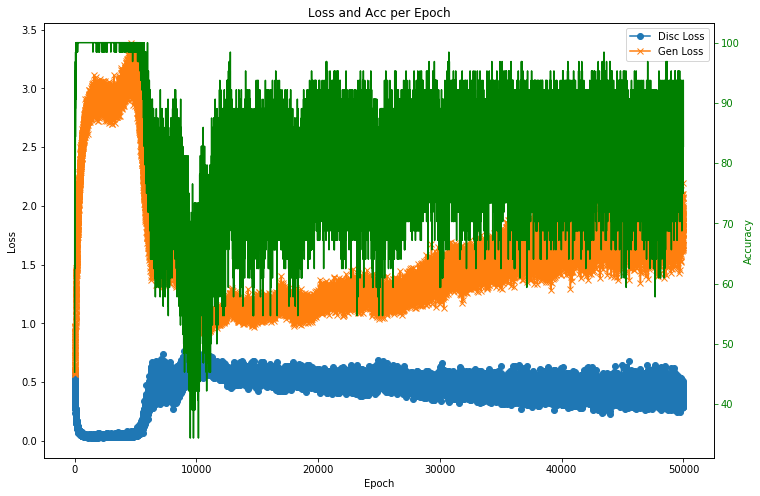

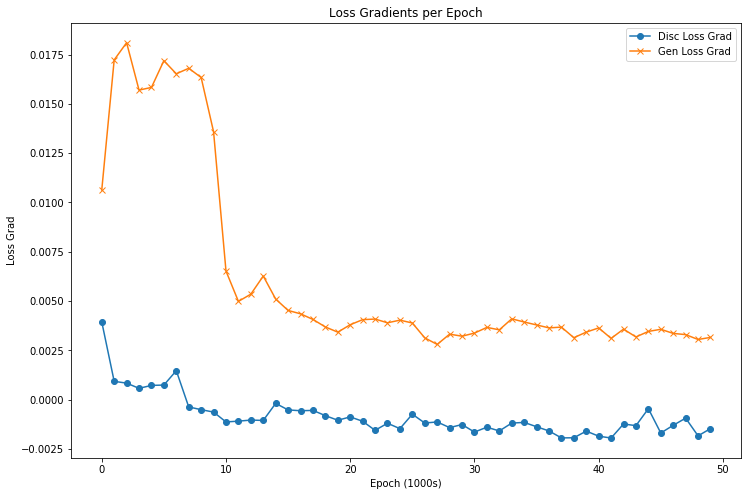

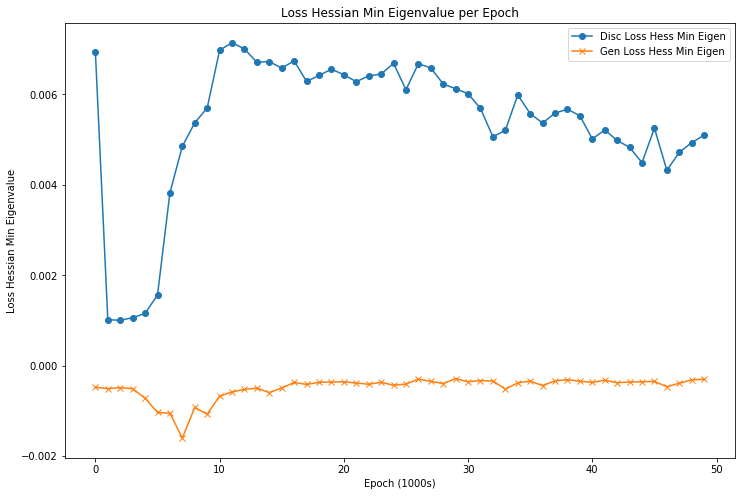

In [402]:
##### SGD with gamma = 1 #####
# learning_rate = 0.001
# momentum = 0
# decay_rate = 0 # Decay rate is how we are going to achieve inf-GD
# nest = False # Nesterov's acceleration
##############################

# Initialize GAN object
opt_params = ['sgd', 0.001, 0, 0, False, 'sgd_lr0.001_decay0']
gan_3 = GAN(opt_params)

# Train GAN
gan_3_hist = gan_3.train(epochs=50000, batch_size=32, sample_interval=1000)

# Plot of performance results (training and validation accuracies and loss) for every epoch
plt.rcParams['figure.figsize'] = (12, 8)
plot_loss_acc(gan_3_hist)
plot_loss_gradient(gan_3_hist)
plot_loss_hessian_eig(gan_3_hist)

hello
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_31 (Flatten)         (None, 784)               0         
_________________________________________________________________
dense_217 (Dense)            (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_155 (LeakyReLU)  (None, 512)               0         
_________________________________________________________________
dense_218 (Dense)            (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_156 (LeakyReLU)  (None, 256)               0         
_________________________________________________________________
dense_219 (Dense)            (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________________________

93 [D loss: 0.654288, acc.: 54.69%] [G loss: 0.955072]
94 [D loss: 0.649355, acc.: 54.69%] [G loss: 0.960393]
95 [D loss: 0.695161, acc.: 48.44%] [G loss: 0.919848]
96 [D loss: 0.706415, acc.: 43.75%] [G loss: 0.920551]
97 [D loss: 0.689590, acc.: 50.00%] [G loss: 0.895238]
98 [D loss: 0.683765, acc.: 48.44%] [G loss: 0.921999]
99 [D loss: 0.692132, acc.: 48.44%] [G loss: 0.904916]
100 [D loss: 0.693730, acc.: 51.56%] [G loss: 0.897554]
101 [D loss: 0.720008, acc.: 35.94%] [G loss: 0.899915]
102 [D loss: 0.663798, acc.: 48.44%] [G loss: 0.887483]
103 [D loss: 0.669695, acc.: 50.00%] [G loss: 0.892107]
104 [D loss: 0.666847, acc.: 54.69%] [G loss: 0.891926]
105 [D loss: 0.700391, acc.: 51.56%] [G loss: 0.855273]
106 [D loss: 0.672618, acc.: 57.81%] [G loss: 0.902049]
107 [D loss: 0.721058, acc.: 35.94%] [G loss: 0.852233]
108 [D loss: 0.703367, acc.: 50.00%] [G loss: 0.873937]
109 [D loss: 0.680709, acc.: 51.56%] [G loss: 0.858035]
110 [D loss: 0.681077, acc.: 54.69%] [G loss: 0.867709]

241 [D loss: 0.709816, acc.: 45.31%] [G loss: 0.862405]
242 [D loss: 0.715277, acc.: 29.69%] [G loss: 0.853941]
243 [D loss: 0.736631, acc.: 23.44%] [G loss: 0.853942]
244 [D loss: 0.710739, acc.: 34.38%] [G loss: 0.843096]
245 [D loss: 0.737166, acc.: 17.19%] [G loss: 0.845503]
246 [D loss: 0.719912, acc.: 31.25%] [G loss: 0.853947]
247 [D loss: 0.709543, acc.: 29.69%] [G loss: 0.865789]
248 [D loss: 0.725085, acc.: 18.75%] [G loss: 0.863864]
249 [D loss: 0.730081, acc.: 29.69%] [G loss: 0.857818]
250 [D loss: 0.711238, acc.: 42.19%] [G loss: 0.855531]
251 [D loss: 0.689821, acc.: 53.12%] [G loss: 0.862046]
252 [D loss: 0.714771, acc.: 42.19%] [G loss: 0.867031]
253 [D loss: 0.719508, acc.: 40.62%] [G loss: 0.856585]
254 [D loss: 0.730805, acc.: 31.25%] [G loss: 0.853300]
255 [D loss: 0.714522, acc.: 35.94%] [G loss: 0.866101]
256 [D loss: 0.709901, acc.: 42.19%] [G loss: 0.858727]
257 [D loss: 0.719016, acc.: 37.50%] [G loss: 0.863051]
258 [D loss: 0.702004, acc.: 43.75%] [G loss: 0.

388 [D loss: 0.685256, acc.: 54.69%] [G loss: 0.866623]
389 [D loss: 0.726707, acc.: 32.81%] [G loss: 0.881447]
390 [D loss: 0.718759, acc.: 37.50%] [G loss: 0.898473]
391 [D loss: 0.708351, acc.: 51.56%] [G loss: 0.885135]
392 [D loss: 0.706279, acc.: 46.88%] [G loss: 0.885307]
393 [D loss: 0.706465, acc.: 45.31%] [G loss: 0.888157]
394 [D loss: 0.720317, acc.: 45.31%] [G loss: 0.907623]
395 [D loss: 0.719503, acc.: 43.75%] [G loss: 0.883706]
396 [D loss: 0.705948, acc.: 48.44%] [G loss: 0.852942]
397 [D loss: 0.739705, acc.: 35.94%] [G loss: 0.877421]
398 [D loss: 0.706086, acc.: 42.19%] [G loss: 0.880025]
399 [D loss: 0.698800, acc.: 45.31%] [G loss: 0.878291]
400 [D loss: 0.699926, acc.: 37.50%] [G loss: 0.886062]
401 [D loss: 0.666167, acc.: 60.94%] [G loss: 0.880359]
402 [D loss: 0.701226, acc.: 45.31%] [G loss: 0.917492]
403 [D loss: 0.701741, acc.: 54.69%] [G loss: 0.883300]
404 [D loss: 0.687128, acc.: 53.12%] [G loss: 0.902280]
405 [D loss: 0.711908, acc.: 45.31%] [G loss: 0.

535 [D loss: 0.708407, acc.: 40.62%] [G loss: 0.829564]
536 [D loss: 0.708694, acc.: 35.94%] [G loss: 0.829470]
537 [D loss: 0.690180, acc.: 56.25%] [G loss: 0.815727]
538 [D loss: 0.703146, acc.: 43.75%] [G loss: 0.832152]
539 [D loss: 0.719235, acc.: 39.06%] [G loss: 0.840690]
540 [D loss: 0.712080, acc.: 48.44%] [G loss: 0.851957]
541 [D loss: 0.685050, acc.: 57.81%] [G loss: 0.839010]
542 [D loss: 0.699831, acc.: 39.06%] [G loss: 0.828582]
543 [D loss: 0.707725, acc.: 45.31%] [G loss: 0.845926]
544 [D loss: 0.710712, acc.: 42.19%] [G loss: 0.841953]
545 [D loss: 0.699642, acc.: 50.00%] [G loss: 0.841063]
546 [D loss: 0.704757, acc.: 48.44%] [G loss: 0.842716]
547 [D loss: 0.704852, acc.: 48.44%] [G loss: 0.816926]
548 [D loss: 0.706499, acc.: 46.88%] [G loss: 0.835431]
549 [D loss: 0.718624, acc.: 40.62%] [G loss: 0.835247]
550 [D loss: 0.717672, acc.: 37.50%] [G loss: 0.842736]
551 [D loss: 0.716927, acc.: 42.19%] [G loss: 0.832093]
552 [D loss: 0.726228, acc.: 37.50%] [G loss: 0.

683 [D loss: 0.698797, acc.: 45.31%] [G loss: 0.904454]
684 [D loss: 0.698179, acc.: 46.88%] [G loss: 0.884618]
685 [D loss: 0.669409, acc.: 59.38%] [G loss: 0.883719]
686 [D loss: 0.715149, acc.: 46.88%] [G loss: 0.900732]
687 [D loss: 0.697375, acc.: 53.12%] [G loss: 0.901677]
688 [D loss: 0.686873, acc.: 56.25%] [G loss: 0.882752]
689 [D loss: 0.678697, acc.: 57.81%] [G loss: 0.901532]
690 [D loss: 0.700290, acc.: 53.12%] [G loss: 0.911330]
691 [D loss: 0.683310, acc.: 56.25%] [G loss: 0.917755]
692 [D loss: 0.696173, acc.: 56.25%] [G loss: 0.910123]
693 [D loss: 0.687585, acc.: 54.69%] [G loss: 0.898467]
694 [D loss: 0.668079, acc.: 60.94%] [G loss: 0.912720]
695 [D loss: 0.705796, acc.: 54.69%] [G loss: 0.876045]
696 [D loss: 0.690876, acc.: 46.88%] [G loss: 0.898651]
697 [D loss: 0.659938, acc.: 59.38%] [G loss: 0.900122]
698 [D loss: 0.665458, acc.: 59.38%] [G loss: 0.884774]
699 [D loss: 0.695477, acc.: 51.56%] [G loss: 0.916607]
700 [D loss: 0.687154, acc.: 54.69%] [G loss: 0.

833 [D loss: 0.683124, acc.: 50.00%] [G loss: 0.861956]
834 [D loss: 0.703321, acc.: 50.00%] [G loss: 0.843059]
835 [D loss: 0.746772, acc.: 37.50%] [G loss: 0.869062]
836 [D loss: 0.715377, acc.: 42.19%] [G loss: 0.873294]
837 [D loss: 0.722164, acc.: 43.75%] [G loss: 0.858929]
838 [D loss: 0.703450, acc.: 46.88%] [G loss: 0.858885]
839 [D loss: 0.733469, acc.: 34.38%] [G loss: 0.877810]
840 [D loss: 0.712824, acc.: 51.56%] [G loss: 0.844552]
841 [D loss: 0.700880, acc.: 42.19%] [G loss: 0.854584]
842 [D loss: 0.727999, acc.: 43.75%] [G loss: 0.869020]
843 [D loss: 0.720399, acc.: 39.06%] [G loss: 0.853606]
844 [D loss: 0.694403, acc.: 51.56%] [G loss: 0.866610]
845 [D loss: 0.712087, acc.: 48.44%] [G loss: 0.867618]
846 [D loss: 0.715420, acc.: 42.19%] [G loss: 0.885493]
847 [D loss: 0.683644, acc.: 54.69%] [G loss: 0.851416]
848 [D loss: 0.697183, acc.: 53.12%] [G loss: 0.857541]
849 [D loss: 0.697817, acc.: 50.00%] [G loss: 0.861059]
850 [D loss: 0.674209, acc.: 53.12%] [G loss: 0.

984 [D loss: 0.694620, acc.: 56.25%] [G loss: 0.861224]
985 [D loss: 0.672264, acc.: 56.25%] [G loss: 0.893304]
986 [D loss: 0.705583, acc.: 48.44%] [G loss: 0.891594]
987 [D loss: 0.681419, acc.: 51.56%] [G loss: 0.864326]
988 [D loss: 0.690638, acc.: 57.81%] [G loss: 0.862748]
989 [D loss: 0.666595, acc.: 60.94%] [G loss: 0.863929]
990 [D loss: 0.708476, acc.: 50.00%] [G loss: 0.858014]
991 [D loss: 0.678070, acc.: 53.12%] [G loss: 0.850960]
992 [D loss: 0.707678, acc.: 50.00%] [G loss: 0.867139]
993 [D loss: 0.692740, acc.: 56.25%] [G loss: 0.897090]
994 [D loss: 0.683474, acc.: 62.50%] [G loss: 0.858999]
995 [D loss: 0.692478, acc.: 53.12%] [G loss: 0.871876]
996 [D loss: 0.669872, acc.: 54.69%] [G loss: 0.816305]
997 [D loss: 0.688023, acc.: 53.12%] [G loss: 0.870514]
998 [D loss: 0.688143, acc.: 54.69%] [G loss: 0.834988]
999 [D loss: 0.717218, acc.: 46.88%] [G loss: 0.868547]
1000 [D loss: 0.670882, acc.: 54.69%] [G loss: 0.867704]
Discriminator gradients:  0.00089640217
Generat

1127 [D loss: 0.686567, acc.: 54.69%] [G loss: 0.851692]
1128 [D loss: 0.703198, acc.: 45.31%] [G loss: 0.850250]
1129 [D loss: 0.654478, acc.: 67.19%] [G loss: 0.839755]
1130 [D loss: 0.699068, acc.: 51.56%] [G loss: 0.818500]
1131 [D loss: 0.683118, acc.: 54.69%] [G loss: 0.838279]
1132 [D loss: 0.727317, acc.: 34.38%] [G loss: 0.848881]
1133 [D loss: 0.699872, acc.: 54.69%] [G loss: 0.843675]
1134 [D loss: 0.691032, acc.: 54.69%] [G loss: 0.827472]
1135 [D loss: 0.689908, acc.: 56.25%] [G loss: 0.834403]
1136 [D loss: 0.690594, acc.: 51.56%] [G loss: 0.834742]
1137 [D loss: 0.688181, acc.: 54.69%] [G loss: 0.831945]
1138 [D loss: 0.677876, acc.: 60.94%] [G loss: 0.874751]
1139 [D loss: 0.712932, acc.: 46.88%] [G loss: 0.819307]
1140 [D loss: 0.686866, acc.: 54.69%] [G loss: 0.832562]
1141 [D loss: 0.733294, acc.: 45.31%] [G loss: 0.846390]
1142 [D loss: 0.694938, acc.: 48.44%] [G loss: 0.858760]
1143 [D loss: 0.720160, acc.: 50.00%] [G loss: 0.838537]
1144 [D loss: 0.689191, acc.: 5

1271 [D loss: 0.686286, acc.: 57.81%] [G loss: 0.832083]
1272 [D loss: 0.683951, acc.: 60.94%] [G loss: 0.858596]
1273 [D loss: 0.663562, acc.: 64.06%] [G loss: 0.825342]
1274 [D loss: 0.688778, acc.: 67.19%] [G loss: 0.837588]
1275 [D loss: 0.696923, acc.: 48.44%] [G loss: 0.821323]
1276 [D loss: 0.682102, acc.: 48.44%] [G loss: 0.832939]
1277 [D loss: 0.698545, acc.: 48.44%] [G loss: 0.836273]
1278 [D loss: 0.683201, acc.: 57.81%] [G loss: 0.816345]
1279 [D loss: 0.660579, acc.: 67.19%] [G loss: 0.839686]
1280 [D loss: 0.699643, acc.: 53.12%] [G loss: 0.830225]
1281 [D loss: 0.702355, acc.: 45.31%] [G loss: 0.836900]
1282 [D loss: 0.686474, acc.: 60.94%] [G loss: 0.827036]
1283 [D loss: 0.668446, acc.: 57.81%] [G loss: 0.850155]
1284 [D loss: 0.650898, acc.: 64.06%] [G loss: 0.856684]
1285 [D loss: 0.673868, acc.: 67.19%] [G loss: 0.870509]
1286 [D loss: 0.671340, acc.: 60.94%] [G loss: 0.882634]
1287 [D loss: 0.678635, acc.: 57.81%] [G loss: 0.883456]
1288 [D loss: 0.699975, acc.: 4

1418 [D loss: 0.669733, acc.: 60.94%] [G loss: 0.851431]
1419 [D loss: 0.683313, acc.: 53.12%] [G loss: 0.849793]
1420 [D loss: 0.636166, acc.: 71.88%] [G loss: 0.867450]
1421 [D loss: 0.709155, acc.: 54.69%] [G loss: 0.864971]
1422 [D loss: 0.687042, acc.: 54.69%] [G loss: 0.875612]
1423 [D loss: 0.665141, acc.: 67.19%] [G loss: 0.828249]
1424 [D loss: 0.679083, acc.: 57.81%] [G loss: 0.861971]
1425 [D loss: 0.707140, acc.: 46.88%] [G loss: 0.858760]
1426 [D loss: 0.694838, acc.: 48.44%] [G loss: 0.844569]
1427 [D loss: 0.695469, acc.: 50.00%] [G loss: 0.870754]
1428 [D loss: 0.688703, acc.: 46.88%] [G loss: 0.866379]
1429 [D loss: 0.682118, acc.: 57.81%] [G loss: 0.828939]
1430 [D loss: 0.688979, acc.: 54.69%] [G loss: 0.844293]
1431 [D loss: 0.664938, acc.: 56.25%] [G loss: 0.831587]
1432 [D loss: 0.712699, acc.: 45.31%] [G loss: 0.821765]
1433 [D loss: 0.674966, acc.: 50.00%] [G loss: 0.858323]
1434 [D loss: 0.664940, acc.: 62.50%] [G loss: 0.860001]
1435 [D loss: 0.714952, acc.: 3

1565 [D loss: 0.683621, acc.: 59.38%] [G loss: 0.788880]
1566 [D loss: 0.651055, acc.: 64.06%] [G loss: 0.832807]
1567 [D loss: 0.678226, acc.: 57.81%] [G loss: 0.828138]
1568 [D loss: 0.695118, acc.: 56.25%] [G loss: 0.780077]
1569 [D loss: 0.664133, acc.: 59.38%] [G loss: 0.788026]
1570 [D loss: 0.664905, acc.: 60.94%] [G loss: 0.826178]
1571 [D loss: 0.649437, acc.: 64.06%] [G loss: 0.863629]
1572 [D loss: 0.723588, acc.: 45.31%] [G loss: 0.861188]
1573 [D loss: 0.701041, acc.: 53.12%] [G loss: 0.840110]
1574 [D loss: 0.652625, acc.: 64.06%] [G loss: 0.829798]
1575 [D loss: 0.700461, acc.: 48.44%] [G loss: 0.833001]
1576 [D loss: 0.690633, acc.: 57.81%] [G loss: 0.858878]
1577 [D loss: 0.643040, acc.: 64.06%] [G loss: 0.867616]
1578 [D loss: 0.697246, acc.: 46.88%] [G loss: 0.825095]
1579 [D loss: 0.686715, acc.: 51.56%] [G loss: 0.842942]
1580 [D loss: 0.711244, acc.: 45.31%] [G loss: 0.787813]
1581 [D loss: 0.665883, acc.: 51.56%] [G loss: 0.827366]
1582 [D loss: 0.686609, acc.: 4

1711 [D loss: 0.684772, acc.: 50.00%] [G loss: 0.859971]
1712 [D loss: 0.649117, acc.: 64.06%] [G loss: 0.844550]
1713 [D loss: 0.660915, acc.: 64.06%] [G loss: 0.849075]
1714 [D loss: 0.726799, acc.: 50.00%] [G loss: 0.864594]
1715 [D loss: 0.662289, acc.: 59.38%] [G loss: 0.841224]
1716 [D loss: 0.690338, acc.: 56.25%] [G loss: 0.863161]
1717 [D loss: 0.688683, acc.: 54.69%] [G loss: 0.867997]
1718 [D loss: 0.697218, acc.: 50.00%] [G loss: 0.835799]
1719 [D loss: 0.692937, acc.: 51.56%] [G loss: 0.826840]
1720 [D loss: 0.622994, acc.: 78.12%] [G loss: 0.853117]
1721 [D loss: 0.707768, acc.: 53.12%] [G loss: 0.856353]
1722 [D loss: 0.659566, acc.: 64.06%] [G loss: 0.800286]
1723 [D loss: 0.666874, acc.: 59.38%] [G loss: 0.845825]
1724 [D loss: 0.721075, acc.: 40.62%] [G loss: 0.857781]
1725 [D loss: 0.698964, acc.: 53.12%] [G loss: 0.830670]
1726 [D loss: 0.669875, acc.: 62.50%] [G loss: 0.823715]
1727 [D loss: 0.681265, acc.: 59.38%] [G loss: 0.819512]
1728 [D loss: 0.652540, acc.: 6

1857 [D loss: 0.706162, acc.: 46.88%] [G loss: 0.839584]
1858 [D loss: 0.654558, acc.: 67.19%] [G loss: 0.816980]
1859 [D loss: 0.694428, acc.: 59.38%] [G loss: 0.810078]
1860 [D loss: 0.685080, acc.: 60.94%] [G loss: 0.838326]
1861 [D loss: 0.695007, acc.: 45.31%] [G loss: 0.810002]
1862 [D loss: 0.679463, acc.: 54.69%] [G loss: 0.852124]
1863 [D loss: 0.658384, acc.: 67.19%] [G loss: 0.862233]
1864 [D loss: 0.702111, acc.: 54.69%] [G loss: 0.830307]
1865 [D loss: 0.662837, acc.: 65.62%] [G loss: 0.824238]
1866 [D loss: 0.682111, acc.: 56.25%] [G loss: 0.840394]
1867 [D loss: 0.681807, acc.: 56.25%] [G loss: 0.841497]
1868 [D loss: 0.688021, acc.: 60.94%] [G loss: 0.797820]
1869 [D loss: 0.657060, acc.: 65.62%] [G loss: 0.830419]
1870 [D loss: 0.674914, acc.: 56.25%] [G loss: 0.814023]
1871 [D loss: 0.696062, acc.: 59.38%] [G loss: 0.820863]
1872 [D loss: 0.686120, acc.: 56.25%] [G loss: 0.799175]
1873 [D loss: 0.674834, acc.: 54.69%] [G loss: 0.823644]
1874 [D loss: 0.696109, acc.: 5

Discriminator gradients:  0.000804523
Generator gradients:  0.00041449073
Min XX Hessian eigenvalue:  0.00761469
Min ZZ Hessian eigenvalue:  -5.277142e-05
2001 [D loss: 0.669960, acc.: 60.94%] [G loss: 0.786246]
2002 [D loss: 0.709136, acc.: 43.75%] [G loss: 0.824755]
2003 [D loss: 0.687402, acc.: 59.38%] [G loss: 0.818872]
2004 [D loss: 0.705606, acc.: 53.12%] [G loss: 0.814064]
2005 [D loss: 0.646542, acc.: 67.19%] [G loss: 0.802786]
2006 [D loss: 0.675267, acc.: 59.38%] [G loss: 0.828398]
2007 [D loss: 0.685986, acc.: 53.12%] [G loss: 0.759626]
2008 [D loss: 0.701039, acc.: 56.25%] [G loss: 0.780541]
2009 [D loss: 0.691080, acc.: 53.12%] [G loss: 0.802833]
2010 [D loss: 0.694827, acc.: 60.94%] [G loss: 0.818286]
2011 [D loss: 0.665672, acc.: 62.50%] [G loss: 0.756236]
2012 [D loss: 0.681506, acc.: 53.12%] [G loss: 0.786022]
2013 [D loss: 0.701729, acc.: 45.31%] [G loss: 0.805488]
2014 [D loss: 0.697722, acc.: 46.88%] [G loss: 0.799362]
2015 [D loss: 0.699589, acc.: 51.56%] [G loss: 

2144 [D loss: 0.687565, acc.: 51.56%] [G loss: 0.797926]
2145 [D loss: 0.664880, acc.: 64.06%] [G loss: 0.798644]
2146 [D loss: 0.673681, acc.: 59.38%] [G loss: 0.801643]
2147 [D loss: 0.681515, acc.: 57.81%] [G loss: 0.816101]
2148 [D loss: 0.668108, acc.: 62.50%] [G loss: 0.802958]
2149 [D loss: 0.673776, acc.: 60.94%] [G loss: 0.806534]
2150 [D loss: 0.703833, acc.: 42.19%] [G loss: 0.814157]
2151 [D loss: 0.684461, acc.: 51.56%] [G loss: 0.812790]
2152 [D loss: 0.687928, acc.: 51.56%] [G loss: 0.790384]
2153 [D loss: 0.693178, acc.: 54.69%] [G loss: 0.826855]
2154 [D loss: 0.677830, acc.: 57.81%] [G loss: 0.804775]
2155 [D loss: 0.672264, acc.: 67.19%] [G loss: 0.802710]
2156 [D loss: 0.668335, acc.: 57.81%] [G loss: 0.787391]
2157 [D loss: 0.680354, acc.: 62.50%] [G loss: 0.807449]
2158 [D loss: 0.701191, acc.: 48.44%] [G loss: 0.802285]
2159 [D loss: 0.695297, acc.: 45.31%] [G loss: 0.831989]
2160 [D loss: 0.653922, acc.: 60.94%] [G loss: 0.775062]
2161 [D loss: 0.736825, acc.: 3

2288 [D loss: 0.657463, acc.: 60.94%] [G loss: 0.821364]
2289 [D loss: 0.669321, acc.: 64.06%] [G loss: 0.818179]
2290 [D loss: 0.665957, acc.: 64.06%] [G loss: 0.802873]
2291 [D loss: 0.686345, acc.: 57.81%] [G loss: 0.834398]
2292 [D loss: 0.655067, acc.: 65.62%] [G loss: 0.809074]
2293 [D loss: 0.682531, acc.: 53.12%] [G loss: 0.800313]
2294 [D loss: 0.652520, acc.: 65.62%] [G loss: 0.796869]
2295 [D loss: 0.705884, acc.: 48.44%] [G loss: 0.786322]
2296 [D loss: 0.688346, acc.: 53.12%] [G loss: 0.802438]
2297 [D loss: 0.672986, acc.: 56.25%] [G loss: 0.816856]
2298 [D loss: 0.658342, acc.: 64.06%] [G loss: 0.809261]
2299 [D loss: 0.648753, acc.: 71.88%] [G loss: 0.802395]
2300 [D loss: 0.678215, acc.: 56.25%] [G loss: 0.824416]
2301 [D loss: 0.662927, acc.: 60.94%] [G loss: 0.825834]
2302 [D loss: 0.655506, acc.: 57.81%] [G loss: 0.787443]
2303 [D loss: 0.689600, acc.: 60.94%] [G loss: 0.815792]
2304 [D loss: 0.670332, acc.: 60.94%] [G loss: 0.793746]
2305 [D loss: 0.696743, acc.: 5

2432 [D loss: 0.660743, acc.: 60.94%] [G loss: 0.812446]
2433 [D loss: 0.700132, acc.: 39.06%] [G loss: 0.846946]
2434 [D loss: 0.667013, acc.: 51.56%] [G loss: 0.830564]
2435 [D loss: 0.657744, acc.: 65.62%] [G loss: 0.812809]
2436 [D loss: 0.675728, acc.: 56.25%] [G loss: 0.823509]
2437 [D loss: 0.630768, acc.: 60.94%] [G loss: 0.859243]
2438 [D loss: 0.644124, acc.: 62.50%] [G loss: 0.831208]
2439 [D loss: 0.648738, acc.: 60.94%] [G loss: 0.870646]
2440 [D loss: 0.679829, acc.: 56.25%] [G loss: 0.843444]
2441 [D loss: 0.662931, acc.: 67.19%] [G loss: 0.832530]
2442 [D loss: 0.671397, acc.: 57.81%] [G loss: 0.827180]
2443 [D loss: 0.650043, acc.: 62.50%] [G loss: 0.821623]
2444 [D loss: 0.683740, acc.: 53.12%] [G loss: 0.800582]
2445 [D loss: 0.690259, acc.: 53.12%] [G loss: 0.803217]
2446 [D loss: 0.681725, acc.: 54.69%] [G loss: 0.791771]
2447 [D loss: 0.644470, acc.: 68.75%] [G loss: 0.811886]
2448 [D loss: 0.661812, acc.: 62.50%] [G loss: 0.816787]
2449 [D loss: 0.652921, acc.: 6

2579 [D loss: 0.642563, acc.: 68.75%] [G loss: 0.826176]
2580 [D loss: 0.668213, acc.: 56.25%] [G loss: 0.798876]
2581 [D loss: 0.657511, acc.: 65.62%] [G loss: 0.811624]
2582 [D loss: 0.645244, acc.: 70.31%] [G loss: 0.809426]
2583 [D loss: 0.669741, acc.: 59.38%] [G loss: 0.796703]
2584 [D loss: 0.657327, acc.: 57.81%] [G loss: 0.831370]
2585 [D loss: 0.640754, acc.: 67.19%] [G loss: 0.823094]
2586 [D loss: 0.666135, acc.: 56.25%] [G loss: 0.789385]
2587 [D loss: 0.693657, acc.: 51.56%] [G loss: 0.802871]
2588 [D loss: 0.648981, acc.: 62.50%] [G loss: 0.802836]
2589 [D loss: 0.684112, acc.: 50.00%] [G loss: 0.830669]
2590 [D loss: 0.670004, acc.: 59.38%] [G loss: 0.812051]
2591 [D loss: 0.696645, acc.: 56.25%] [G loss: 0.803710]
2592 [D loss: 0.719486, acc.: 40.62%] [G loss: 0.765596]
2593 [D loss: 0.668936, acc.: 65.62%] [G loss: 0.802212]
2594 [D loss: 0.676915, acc.: 57.81%] [G loss: 0.805437]
2595 [D loss: 0.681163, acc.: 46.88%] [G loss: 0.817761]
2596 [D loss: 0.672905, acc.: 5

2725 [D loss: 0.728697, acc.: 45.31%] [G loss: 0.814587]
2726 [D loss: 0.692887, acc.: 51.56%] [G loss: 0.818449]
2727 [D loss: 0.679210, acc.: 51.56%] [G loss: 0.815876]
2728 [D loss: 0.678525, acc.: 57.81%] [G loss: 0.840630]
2729 [D loss: 0.663012, acc.: 60.94%] [G loss: 0.806437]
2730 [D loss: 0.645195, acc.: 67.19%] [G loss: 0.788637]
2731 [D loss: 0.669432, acc.: 59.38%] [G loss: 0.811188]
2732 [D loss: 0.699886, acc.: 54.69%] [G loss: 0.803943]
2733 [D loss: 0.676340, acc.: 57.81%] [G loss: 0.831792]
2734 [D loss: 0.707362, acc.: 51.56%] [G loss: 0.800388]
2735 [D loss: 0.680139, acc.: 57.81%] [G loss: 0.829428]
2736 [D loss: 0.656461, acc.: 62.50%] [G loss: 0.816246]
2737 [D loss: 0.670949, acc.: 59.38%] [G loss: 0.829059]
2738 [D loss: 0.711581, acc.: 45.31%] [G loss: 0.841176]
2739 [D loss: 0.671274, acc.: 53.12%] [G loss: 0.798958]
2740 [D loss: 0.658241, acc.: 65.62%] [G loss: 0.817135]
2741 [D loss: 0.714563, acc.: 50.00%] [G loss: 0.769339]
2742 [D loss: 0.674383, acc.: 5

2871 [D loss: 0.680675, acc.: 56.25%] [G loss: 0.790794]
2872 [D loss: 0.720294, acc.: 43.75%] [G loss: 0.805631]
2873 [D loss: 0.673933, acc.: 60.94%] [G loss: 0.832753]
2874 [D loss: 0.667842, acc.: 59.38%] [G loss: 0.806861]
2875 [D loss: 0.699834, acc.: 53.12%] [G loss: 0.802032]
2876 [D loss: 0.702082, acc.: 51.56%] [G loss: 0.795044]
2877 [D loss: 0.691956, acc.: 53.12%] [G loss: 0.757850]
2878 [D loss: 0.706108, acc.: 43.75%] [G loss: 0.799789]
2879 [D loss: 0.657718, acc.: 60.94%] [G loss: 0.772549]
2880 [D loss: 0.674391, acc.: 53.12%] [G loss: 0.779051]
2881 [D loss: 0.670219, acc.: 51.56%] [G loss: 0.816009]
2882 [D loss: 0.667442, acc.: 54.69%] [G loss: 0.804937]
2883 [D loss: 0.709070, acc.: 43.75%] [G loss: 0.851359]
2884 [D loss: 0.673320, acc.: 51.56%] [G loss: 0.797566]
2885 [D loss: 0.680139, acc.: 57.81%] [G loss: 0.818420]
2886 [D loss: 0.715624, acc.: 51.56%] [G loss: 0.809870]
2887 [D loss: 0.677737, acc.: 57.81%] [G loss: 0.821123]
2888 [D loss: 0.682037, acc.: 5

3013 [D loss: 0.687766, acc.: 51.56%] [G loss: 0.806332]
3014 [D loss: 0.672465, acc.: 57.81%] [G loss: 0.823225]
3015 [D loss: 0.689778, acc.: 54.69%] [G loss: 0.814493]
3016 [D loss: 0.684811, acc.: 56.25%] [G loss: 0.829706]
3017 [D loss: 0.711178, acc.: 50.00%] [G loss: 0.826785]
3018 [D loss: 0.688533, acc.: 57.81%] [G loss: 0.812989]
3019 [D loss: 0.694971, acc.: 50.00%] [G loss: 0.799914]
3020 [D loss: 0.646971, acc.: 60.94%] [G loss: 0.809370]
3021 [D loss: 0.681424, acc.: 56.25%] [G loss: 0.824355]
3022 [D loss: 0.693179, acc.: 54.69%] [G loss: 0.788116]
3023 [D loss: 0.679867, acc.: 59.38%] [G loss: 0.830260]
3024 [D loss: 0.696410, acc.: 51.56%] [G loss: 0.806729]
3025 [D loss: 0.689933, acc.: 59.38%] [G loss: 0.787741]
3026 [D loss: 0.687788, acc.: 53.12%] [G loss: 0.834038]
3027 [D loss: 0.708979, acc.: 51.56%] [G loss: 0.813712]
3028 [D loss: 0.666377, acc.: 62.50%] [G loss: 0.816217]
3029 [D loss: 0.703757, acc.: 56.25%] [G loss: 0.813063]
3030 [D loss: 0.699045, acc.: 4

3157 [D loss: 0.662971, acc.: 65.62%] [G loss: 0.823626]
3158 [D loss: 0.684335, acc.: 57.81%] [G loss: 0.785981]
3159 [D loss: 0.684433, acc.: 60.94%] [G loss: 0.791263]
3160 [D loss: 0.651250, acc.: 60.94%] [G loss: 0.811079]
3161 [D loss: 0.640140, acc.: 60.94%] [G loss: 0.771169]
3162 [D loss: 0.669035, acc.: 64.06%] [G loss: 0.826030]
3163 [D loss: 0.645299, acc.: 75.00%] [G loss: 0.754475]
3164 [D loss: 0.677697, acc.: 56.25%] [G loss: 0.794446]
3165 [D loss: 0.684381, acc.: 51.56%] [G loss: 0.814364]
3166 [D loss: 0.720959, acc.: 50.00%] [G loss: 0.801279]
3167 [D loss: 0.689451, acc.: 59.38%] [G loss: 0.818714]
3168 [D loss: 0.677848, acc.: 62.50%] [G loss: 0.806981]
3169 [D loss: 0.678975, acc.: 59.38%] [G loss: 0.778209]
3170 [D loss: 0.669179, acc.: 56.25%] [G loss: 0.782885]
3171 [D loss: 0.674842, acc.: 62.50%] [G loss: 0.790041]
3172 [D loss: 0.677343, acc.: 60.94%] [G loss: 0.834547]
3173 [D loss: 0.653713, acc.: 64.06%] [G loss: 0.783185]
3174 [D loss: 0.676671, acc.: 5

3304 [D loss: 0.660698, acc.: 62.50%] [G loss: 0.795603]
3305 [D loss: 0.685519, acc.: 53.12%] [G loss: 0.780322]
3306 [D loss: 0.687094, acc.: 57.81%] [G loss: 0.801660]
3307 [D loss: 0.664872, acc.: 57.81%] [G loss: 0.792259]
3308 [D loss: 0.693439, acc.: 50.00%] [G loss: 0.800296]
3309 [D loss: 0.659068, acc.: 64.06%] [G loss: 0.801542]
3310 [D loss: 0.684030, acc.: 57.81%] [G loss: 0.794041]
3311 [D loss: 0.685584, acc.: 42.19%] [G loss: 0.809478]
3312 [D loss: 0.694860, acc.: 51.56%] [G loss: 0.800392]
3313 [D loss: 0.684560, acc.: 57.81%] [G loss: 0.758128]
3314 [D loss: 0.690881, acc.: 53.12%] [G loss: 0.771055]
3315 [D loss: 0.722684, acc.: 39.06%] [G loss: 0.810389]
3316 [D loss: 0.650647, acc.: 68.75%] [G loss: 0.765145]
3317 [D loss: 0.689879, acc.: 53.12%] [G loss: 0.752731]
3318 [D loss: 0.680816, acc.: 64.06%] [G loss: 0.765659]
3319 [D loss: 0.671240, acc.: 56.25%] [G loss: 0.755131]
3320 [D loss: 0.656643, acc.: 68.75%] [G loss: 0.748170]
3321 [D loss: 0.674461, acc.: 5

3448 [D loss: 0.673525, acc.: 64.06%] [G loss: 0.756902]
3449 [D loss: 0.682446, acc.: 50.00%] [G loss: 0.782716]
3450 [D loss: 0.678674, acc.: 59.38%] [G loss: 0.790749]
3451 [D loss: 0.670477, acc.: 57.81%] [G loss: 0.783332]
3452 [D loss: 0.670505, acc.: 60.94%] [G loss: 0.799067]
3453 [D loss: 0.701570, acc.: 51.56%] [G loss: 0.811634]
3454 [D loss: 0.680931, acc.: 57.81%] [G loss: 0.780947]
3455 [D loss: 0.699832, acc.: 56.25%] [G loss: 0.778713]
3456 [D loss: 0.649966, acc.: 62.50%] [G loss: 0.766545]
3457 [D loss: 0.702609, acc.: 46.88%] [G loss: 0.773813]
3458 [D loss: 0.680613, acc.: 53.12%] [G loss: 0.779031]
3459 [D loss: 0.663643, acc.: 64.06%] [G loss: 0.782852]
3460 [D loss: 0.670846, acc.: 64.06%] [G loss: 0.745817]
3461 [D loss: 0.727839, acc.: 45.31%] [G loss: 0.792779]
3462 [D loss: 0.691180, acc.: 50.00%] [G loss: 0.790730]
3463 [D loss: 0.696507, acc.: 54.69%] [G loss: 0.745905]
3464 [D loss: 0.668198, acc.: 54.69%] [G loss: 0.785985]
3465 [D loss: 0.648049, acc.: 6

3592 [D loss: 0.720480, acc.: 50.00%] [G loss: 0.799037]
3593 [D loss: 0.713761, acc.: 48.44%] [G loss: 0.819100]
3594 [D loss: 0.697154, acc.: 51.56%] [G loss: 0.775768]
3595 [D loss: 0.675225, acc.: 51.56%] [G loss: 0.777625]
3596 [D loss: 0.666788, acc.: 62.50%] [G loss: 0.805932]
3597 [D loss: 0.694648, acc.: 48.44%] [G loss: 0.797026]
3598 [D loss: 0.676105, acc.: 60.94%] [G loss: 0.825332]
3599 [D loss: 0.645882, acc.: 73.44%] [G loss: 0.807572]
3600 [D loss: 0.717822, acc.: 40.62%] [G loss: 0.818759]
3601 [D loss: 0.704139, acc.: 46.88%] [G loss: 0.816341]
3602 [D loss: 0.693332, acc.: 45.31%] [G loss: 0.753654]
3603 [D loss: 0.697344, acc.: 54.69%] [G loss: 0.767939]
3604 [D loss: 0.699871, acc.: 50.00%] [G loss: 0.785410]
3605 [D loss: 0.694184, acc.: 50.00%] [G loss: 0.810035]
3606 [D loss: 0.631583, acc.: 68.75%] [G loss: 0.787516]
3607 [D loss: 0.669262, acc.: 65.62%] [G loss: 0.782853]
3608 [D loss: 0.746524, acc.: 40.62%] [G loss: 0.801940]
3609 [D loss: 0.690635, acc.: 5

3737 [D loss: 0.665660, acc.: 62.50%] [G loss: 0.749785]
3738 [D loss: 0.685200, acc.: 54.69%] [G loss: 0.770331]
3739 [D loss: 0.696882, acc.: 48.44%] [G loss: 0.788995]
3740 [D loss: 0.672288, acc.: 54.69%] [G loss: 0.839890]
3741 [D loss: 0.646683, acc.: 67.19%] [G loss: 0.768392]
3742 [D loss: 0.687494, acc.: 60.94%] [G loss: 0.808820]
3743 [D loss: 0.697168, acc.: 53.12%] [G loss: 0.759857]
3744 [D loss: 0.667694, acc.: 62.50%] [G loss: 0.790362]
3745 [D loss: 0.704373, acc.: 46.88%] [G loss: 0.822399]
3746 [D loss: 0.657587, acc.: 60.94%] [G loss: 0.782009]
3747 [D loss: 0.644491, acc.: 64.06%] [G loss: 0.809719]
3748 [D loss: 0.664193, acc.: 64.06%] [G loss: 0.816141]
3749 [D loss: 0.684297, acc.: 60.94%] [G loss: 0.824384]
3750 [D loss: 0.688554, acc.: 57.81%] [G loss: 0.778415]
3751 [D loss: 0.662098, acc.: 67.19%] [G loss: 0.815447]
3752 [D loss: 0.685384, acc.: 54.69%] [G loss: 0.760695]
3753 [D loss: 0.671127, acc.: 54.69%] [G loss: 0.820499]
3754 [D loss: 0.662922, acc.: 5

3881 [D loss: 0.709822, acc.: 48.44%] [G loss: 0.774804]
3882 [D loss: 0.690790, acc.: 48.44%] [G loss: 0.768278]
3883 [D loss: 0.675574, acc.: 56.25%] [G loss: 0.790006]
3884 [D loss: 0.676926, acc.: 56.25%] [G loss: 0.772179]
3885 [D loss: 0.669941, acc.: 64.06%] [G loss: 0.765876]
3886 [D loss: 0.675353, acc.: 57.81%] [G loss: 0.772879]
3887 [D loss: 0.679469, acc.: 59.38%] [G loss: 0.775612]
3888 [D loss: 0.696675, acc.: 48.44%] [G loss: 0.797635]
3889 [D loss: 0.688271, acc.: 53.12%] [G loss: 0.781684]
3890 [D loss: 0.662874, acc.: 54.69%] [G loss: 0.762412]
3891 [D loss: 0.663956, acc.: 60.94%] [G loss: 0.765787]
3892 [D loss: 0.675326, acc.: 57.81%] [G loss: 0.772249]
3893 [D loss: 0.684647, acc.: 53.12%] [G loss: 0.774124]
3894 [D loss: 0.687173, acc.: 56.25%] [G loss: 0.786099]
3895 [D loss: 0.703642, acc.: 50.00%] [G loss: 0.766200]
3896 [D loss: 0.655944, acc.: 64.06%] [G loss: 0.762665]
3897 [D loss: 0.692558, acc.: 48.44%] [G loss: 0.799281]
3898 [D loss: 0.655083, acc.: 7

4024 [D loss: 0.739537, acc.: 35.94%] [G loss: 0.787660]
4025 [D loss: 0.698664, acc.: 53.12%] [G loss: 0.804837]
4026 [D loss: 0.706258, acc.: 53.12%] [G loss: 0.779490]
4027 [D loss: 0.691850, acc.: 56.25%] [G loss: 0.766784]
4028 [D loss: 0.704428, acc.: 48.44%] [G loss: 0.767407]
4029 [D loss: 0.698588, acc.: 48.44%] [G loss: 0.780353]
4030 [D loss: 0.698077, acc.: 50.00%] [G loss: 0.757815]
4031 [D loss: 0.702102, acc.: 48.44%] [G loss: 0.794260]
4032 [D loss: 0.689603, acc.: 54.69%] [G loss: 0.776583]
4033 [D loss: 0.709003, acc.: 45.31%] [G loss: 0.783767]
4034 [D loss: 0.692049, acc.: 59.38%] [G loss: 0.788005]
4035 [D loss: 0.703352, acc.: 53.12%] [G loss: 0.757090]
4036 [D loss: 0.691676, acc.: 53.12%] [G loss: 0.757429]
4037 [D loss: 0.710231, acc.: 40.62%] [G loss: 0.758328]
4038 [D loss: 0.701089, acc.: 54.69%] [G loss: 0.800169]
4039 [D loss: 0.674497, acc.: 64.06%] [G loss: 0.777171]
4040 [D loss: 0.698912, acc.: 48.44%] [G loss: 0.767672]
4041 [D loss: 0.702438, acc.: 5

4168 [D loss: 0.669923, acc.: 59.38%] [G loss: 0.768918]
4169 [D loss: 0.656821, acc.: 64.06%] [G loss: 0.778553]
4170 [D loss: 0.659827, acc.: 70.31%] [G loss: 0.796320]
4171 [D loss: 0.712033, acc.: 40.62%] [G loss: 0.790573]
4172 [D loss: 0.694813, acc.: 54.69%] [G loss: 0.772914]
4173 [D loss: 0.687920, acc.: 54.69%] [G loss: 0.734501]
4174 [D loss: 0.697643, acc.: 46.88%] [G loss: 0.778642]
4175 [D loss: 0.678650, acc.: 57.81%] [G loss: 0.782425]
4176 [D loss: 0.676963, acc.: 43.75%] [G loss: 0.780859]
4177 [D loss: 0.693142, acc.: 46.88%] [G loss: 0.784681]
4178 [D loss: 0.669630, acc.: 59.38%] [G loss: 0.776929]
4179 [D loss: 0.691941, acc.: 59.38%] [G loss: 0.743040]
4180 [D loss: 0.669423, acc.: 54.69%] [G loss: 0.748255]
4181 [D loss: 0.698341, acc.: 48.44%] [G loss: 0.796385]
4182 [D loss: 0.677432, acc.: 56.25%] [G loss: 0.803770]
4183 [D loss: 0.645047, acc.: 67.19%] [G loss: 0.741183]
4184 [D loss: 0.687410, acc.: 54.69%] [G loss: 0.766674]
4185 [D loss: 0.679750, acc.: 6

4314 [D loss: 0.706964, acc.: 40.62%] [G loss: 0.775892]
4315 [D loss: 0.676258, acc.: 67.19%] [G loss: 0.776869]
4316 [D loss: 0.668974, acc.: 68.75%] [G loss: 0.777361]
4317 [D loss: 0.687807, acc.: 53.12%] [G loss: 0.737917]
4318 [D loss: 0.699524, acc.: 48.44%] [G loss: 0.736819]
4319 [D loss: 0.678741, acc.: 56.25%] [G loss: 0.777583]
4320 [D loss: 0.680455, acc.: 56.25%] [G loss: 0.752368]
4321 [D loss: 0.681082, acc.: 51.56%] [G loss: 0.766507]
4322 [D loss: 0.684070, acc.: 56.25%] [G loss: 0.785100]
4323 [D loss: 0.703864, acc.: 42.19%] [G loss: 0.768360]
4324 [D loss: 0.690097, acc.: 51.56%] [G loss: 0.801484]
4325 [D loss: 0.687180, acc.: 54.69%] [G loss: 0.777358]
4326 [D loss: 0.707345, acc.: 46.88%] [G loss: 0.757205]
4327 [D loss: 0.718505, acc.: 51.56%] [G loss: 0.741366]
4328 [D loss: 0.650721, acc.: 70.31%] [G loss: 0.783623]
4329 [D loss: 0.673509, acc.: 54.69%] [G loss: 0.761185]
4330 [D loss: 0.693408, acc.: 51.56%] [G loss: 0.765426]
4331 [D loss: 0.697886, acc.: 5

4458 [D loss: 0.682530, acc.: 57.81%] [G loss: 0.761330]
4459 [D loss: 0.678027, acc.: 62.50%] [G loss: 0.755016]
4460 [D loss: 0.651093, acc.: 67.19%] [G loss: 0.797476]
4461 [D loss: 0.676790, acc.: 59.38%] [G loss: 0.776697]
4462 [D loss: 0.711013, acc.: 48.44%] [G loss: 0.790427]
4463 [D loss: 0.658507, acc.: 65.62%] [G loss: 0.764058]
4464 [D loss: 0.675142, acc.: 56.25%] [G loss: 0.777508]
4465 [D loss: 0.659799, acc.: 68.75%] [G loss: 0.747691]
4466 [D loss: 0.660534, acc.: 65.62%] [G loss: 0.771718]
4467 [D loss: 0.685865, acc.: 53.12%] [G loss: 0.761611]
4468 [D loss: 0.677322, acc.: 53.12%] [G loss: 0.765407]
4469 [D loss: 0.677389, acc.: 60.94%] [G loss: 0.741992]
4470 [D loss: 0.643556, acc.: 70.31%] [G loss: 0.751420]
4471 [D loss: 0.697363, acc.: 48.44%] [G loss: 0.795395]
4472 [D loss: 0.691209, acc.: 48.44%] [G loss: 0.770458]
4473 [D loss: 0.682483, acc.: 60.94%] [G loss: 0.771844]
4474 [D loss: 0.664006, acc.: 60.94%] [G loss: 0.754251]
4475 [D loss: 0.703570, acc.: 5

4602 [D loss: 0.679501, acc.: 48.44%] [G loss: 0.800162]
4603 [D loss: 0.681063, acc.: 60.94%] [G loss: 0.800491]
4604 [D loss: 0.695746, acc.: 50.00%] [G loss: 0.771151]
4605 [D loss: 0.689948, acc.: 56.25%] [G loss: 0.756902]
4606 [D loss: 0.712351, acc.: 50.00%] [G loss: 0.751233]
4607 [D loss: 0.704058, acc.: 48.44%] [G loss: 0.735860]
4608 [D loss: 0.688510, acc.: 56.25%] [G loss: 0.751577]
4609 [D loss: 0.682806, acc.: 62.50%] [G loss: 0.773308]
4610 [D loss: 0.683861, acc.: 54.69%] [G loss: 0.738688]
4611 [D loss: 0.684624, acc.: 53.12%] [G loss: 0.717788]
4612 [D loss: 0.685747, acc.: 50.00%] [G loss: 0.768519]
4613 [D loss: 0.674472, acc.: 57.81%] [G loss: 0.752035]
4614 [D loss: 0.686101, acc.: 56.25%] [G loss: 0.780645]
4615 [D loss: 0.706707, acc.: 51.56%] [G loss: 0.764363]
4616 [D loss: 0.695193, acc.: 48.44%] [G loss: 0.758858]
4617 [D loss: 0.702591, acc.: 48.44%] [G loss: 0.765658]
4618 [D loss: 0.713971, acc.: 48.44%] [G loss: 0.766736]
4619 [D loss: 0.652687, acc.: 7

4746 [D loss: 0.655268, acc.: 57.81%] [G loss: 0.736718]
4747 [D loss: 0.676628, acc.: 57.81%] [G loss: 0.764742]
4748 [D loss: 0.665706, acc.: 65.62%] [G loss: 0.762849]
4749 [D loss: 0.683601, acc.: 54.69%] [G loss: 0.751674]
4750 [D loss: 0.684065, acc.: 54.69%] [G loss: 0.788003]
4751 [D loss: 0.682054, acc.: 57.81%] [G loss: 0.754901]
4752 [D loss: 0.691894, acc.: 54.69%] [G loss: 0.749740]
4753 [D loss: 0.675963, acc.: 53.12%] [G loss: 0.755471]
4754 [D loss: 0.684257, acc.: 57.81%] [G loss: 0.781682]
4755 [D loss: 0.646199, acc.: 64.06%] [G loss: 0.762509]
4756 [D loss: 0.690401, acc.: 51.56%] [G loss: 0.766371]
4757 [D loss: 0.689062, acc.: 59.38%] [G loss: 0.766328]
4758 [D loss: 0.669617, acc.: 64.06%] [G loss: 0.783489]
4759 [D loss: 0.666040, acc.: 53.12%] [G loss: 0.716010]
4760 [D loss: 0.721550, acc.: 40.62%] [G loss: 0.769564]
4761 [D loss: 0.693652, acc.: 45.31%] [G loss: 0.793594]
4762 [D loss: 0.678830, acc.: 54.69%] [G loss: 0.723248]
4763 [D loss: 0.703387, acc.: 4

4890 [D loss: 0.709829, acc.: 39.06%] [G loss: 0.735124]
4891 [D loss: 0.708161, acc.: 43.75%] [G loss: 0.760739]
4892 [D loss: 0.658541, acc.: 64.06%] [G loss: 0.745845]
4893 [D loss: 0.684733, acc.: 59.38%] [G loss: 0.787940]
4894 [D loss: 0.693999, acc.: 50.00%] [G loss: 0.789469]
4895 [D loss: 0.664520, acc.: 62.50%] [G loss: 0.772684]
4896 [D loss: 0.676321, acc.: 57.81%] [G loss: 0.777027]
4897 [D loss: 0.710710, acc.: 51.56%] [G loss: 0.768344]
4898 [D loss: 0.694230, acc.: 57.81%] [G loss: 0.762390]
4899 [D loss: 0.672393, acc.: 60.94%] [G loss: 0.730592]
4900 [D loss: 0.688287, acc.: 56.25%] [G loss: 0.779261]
4901 [D loss: 0.673842, acc.: 64.06%] [G loss: 0.742857]
4902 [D loss: 0.696311, acc.: 50.00%] [G loss: 0.762197]
4903 [D loss: 0.692817, acc.: 54.69%] [G loss: 0.771975]
4904 [D loss: 0.671697, acc.: 59.38%] [G loss: 0.738924]
4905 [D loss: 0.686241, acc.: 56.25%] [G loss: 0.757037]
4906 [D loss: 0.680666, acc.: 60.94%] [G loss: 0.772129]
4907 [D loss: 0.717550, acc.: 4

5034 [D loss: 0.699440, acc.: 50.00%] [G loss: 0.739073]
5035 [D loss: 0.679067, acc.: 62.50%] [G loss: 0.742484]
5036 [D loss: 0.711723, acc.: 46.88%] [G loss: 0.767906]
5037 [D loss: 0.685914, acc.: 53.12%] [G loss: 0.724351]
5038 [D loss: 0.698257, acc.: 56.25%] [G loss: 0.728151]
5039 [D loss: 0.683972, acc.: 59.38%] [G loss: 0.752425]
5040 [D loss: 0.685729, acc.: 53.12%] [G loss: 0.773556]
5041 [D loss: 0.676158, acc.: 57.81%] [G loss: 0.777981]
5042 [D loss: 0.695840, acc.: 56.25%] [G loss: 0.745527]
5043 [D loss: 0.704628, acc.: 37.50%] [G loss: 0.721446]
5044 [D loss: 0.700925, acc.: 51.56%] [G loss: 0.765253]
5045 [D loss: 0.704171, acc.: 46.88%] [G loss: 0.753767]
5046 [D loss: 0.705584, acc.: 45.31%] [G loss: 0.735947]
5047 [D loss: 0.691984, acc.: 45.31%] [G loss: 0.760541]
5048 [D loss: 0.670724, acc.: 57.81%] [G loss: 0.735705]
5049 [D loss: 0.681067, acc.: 59.38%] [G loss: 0.787633]
5050 [D loss: 0.684669, acc.: 56.25%] [G loss: 0.756035]
5051 [D loss: 0.693844, acc.: 5

5178 [D loss: 0.691356, acc.: 59.38%] [G loss: 0.729590]
5179 [D loss: 0.698774, acc.: 53.12%] [G loss: 0.753369]
5180 [D loss: 0.722206, acc.: 43.75%] [G loss: 0.755234]
5181 [D loss: 0.690502, acc.: 51.56%] [G loss: 0.780031]
5182 [D loss: 0.688299, acc.: 50.00%] [G loss: 0.755913]
5183 [D loss: 0.698224, acc.: 57.81%] [G loss: 0.745074]
5184 [D loss: 0.698695, acc.: 53.12%] [G loss: 0.752449]
5185 [D loss: 0.675333, acc.: 64.06%] [G loss: 0.755158]
5186 [D loss: 0.666669, acc.: 60.94%] [G loss: 0.750341]
5187 [D loss: 0.668823, acc.: 65.62%] [G loss: 0.724745]
5188 [D loss: 0.712173, acc.: 51.56%] [G loss: 0.764028]
5189 [D loss: 0.660042, acc.: 60.94%] [G loss: 0.734907]
5190 [D loss: 0.708039, acc.: 53.12%] [G loss: 0.734867]
5191 [D loss: 0.705767, acc.: 50.00%] [G loss: 0.727545]
5192 [D loss: 0.705337, acc.: 46.88%] [G loss: 0.745070]
5193 [D loss: 0.685509, acc.: 51.56%] [G loss: 0.728689]
5194 [D loss: 0.677292, acc.: 54.69%] [G loss: 0.745965]
5195 [D loss: 0.683815, acc.: 5

5322 [D loss: 0.657294, acc.: 67.19%] [G loss: 0.745299]
5323 [D loss: 0.695667, acc.: 54.69%] [G loss: 0.759323]
5324 [D loss: 0.677971, acc.: 62.50%] [G loss: 0.774790]
5325 [D loss: 0.674929, acc.: 57.81%] [G loss: 0.733475]
5326 [D loss: 0.662944, acc.: 62.50%] [G loss: 0.770702]
5327 [D loss: 0.681118, acc.: 53.12%] [G loss: 0.725887]
5328 [D loss: 0.692111, acc.: 53.12%] [G loss: 0.741476]
5329 [D loss: 0.702680, acc.: 45.31%] [G loss: 0.768967]
5330 [D loss: 0.682724, acc.: 59.38%] [G loss: 0.801416]
5331 [D loss: 0.700594, acc.: 45.31%] [G loss: 0.768950]
5332 [D loss: 0.686292, acc.: 54.69%] [G loss: 0.750745]
5333 [D loss: 0.673546, acc.: 60.94%] [G loss: 0.762214]
5334 [D loss: 0.698093, acc.: 50.00%] [G loss: 0.737248]
5335 [D loss: 0.662661, acc.: 59.38%] [G loss: 0.747183]
5336 [D loss: 0.684042, acc.: 54.69%] [G loss: 0.739031]
5337 [D loss: 0.702186, acc.: 45.31%] [G loss: 0.771976]
5338 [D loss: 0.678742, acc.: 54.69%] [G loss: 0.765777]
5339 [D loss: 0.706102, acc.: 5

5466 [D loss: 0.681409, acc.: 56.25%] [G loss: 0.755472]
5467 [D loss: 0.661963, acc.: 71.88%] [G loss: 0.744151]
5468 [D loss: 0.699239, acc.: 51.56%] [G loss: 0.743456]
5469 [D loss: 0.703560, acc.: 39.06%] [G loss: 0.750068]
5470 [D loss: 0.665175, acc.: 56.25%] [G loss: 0.721125]
5471 [D loss: 0.707815, acc.: 46.88%] [G loss: 0.754357]
5472 [D loss: 0.685470, acc.: 54.69%] [G loss: 0.749506]
5473 [D loss: 0.676769, acc.: 59.38%] [G loss: 0.728686]
5474 [D loss: 0.672302, acc.: 62.50%] [G loss: 0.768164]
5475 [D loss: 0.684938, acc.: 50.00%] [G loss: 0.770245]
5476 [D loss: 0.717222, acc.: 45.31%] [G loss: 0.769063]
5477 [D loss: 0.694682, acc.: 50.00%] [G loss: 0.741114]
5478 [D loss: 0.721719, acc.: 42.19%] [G loss: 0.731270]
5479 [D loss: 0.695227, acc.: 45.31%] [G loss: 0.779656]
5480 [D loss: 0.679640, acc.: 62.50%] [G loss: 0.754008]
5481 [D loss: 0.695500, acc.: 48.44%] [G loss: 0.781147]
5482 [D loss: 0.716876, acc.: 40.62%] [G loss: 0.767246]
5483 [D loss: 0.703441, acc.: 5

5613 [D loss: 0.689319, acc.: 51.56%] [G loss: 0.708878]
5614 [D loss: 0.713477, acc.: 46.88%] [G loss: 0.758408]
5615 [D loss: 0.705961, acc.: 43.75%] [G loss: 0.739508]
5616 [D loss: 0.683516, acc.: 53.12%] [G loss: 0.757171]
5617 [D loss: 0.693153, acc.: 51.56%] [G loss: 0.722984]
5618 [D loss: 0.697159, acc.: 53.12%] [G loss: 0.753699]
5619 [D loss: 0.688047, acc.: 50.00%] [G loss: 0.746241]
5620 [D loss: 0.681241, acc.: 62.50%] [G loss: 0.729902]
5621 [D loss: 0.693510, acc.: 56.25%] [G loss: 0.729038]
5622 [D loss: 0.667084, acc.: 59.38%] [G loss: 0.744338]
5623 [D loss: 0.678144, acc.: 60.94%] [G loss: 0.732215]
5624 [D loss: 0.683327, acc.: 57.81%] [G loss: 0.750845]
5625 [D loss: 0.672544, acc.: 59.38%] [G loss: 0.743753]
5626 [D loss: 0.690206, acc.: 53.12%] [G loss: 0.760663]
5627 [D loss: 0.676762, acc.: 65.62%] [G loss: 0.781395]
5628 [D loss: 0.685340, acc.: 56.25%] [G loss: 0.762316]
5629 [D loss: 0.678860, acc.: 54.69%] [G loss: 0.740037]
5630 [D loss: 0.686010, acc.: 6

5757 [D loss: 0.704741, acc.: 53.12%] [G loss: 0.757066]
5758 [D loss: 0.690439, acc.: 48.44%] [G loss: 0.771465]
5759 [D loss: 0.714428, acc.: 53.12%] [G loss: 0.753895]
5760 [D loss: 0.682265, acc.: 57.81%] [G loss: 0.755273]
5761 [D loss: 0.708875, acc.: 48.44%] [G loss: 0.745665]
5762 [D loss: 0.674785, acc.: 57.81%] [G loss: 0.757873]
5763 [D loss: 0.692664, acc.: 59.38%] [G loss: 0.707969]
5764 [D loss: 0.683473, acc.: 56.25%] [G loss: 0.732118]
5765 [D loss: 0.712148, acc.: 46.88%] [G loss: 0.748873]
5766 [D loss: 0.692055, acc.: 57.81%] [G loss: 0.760924]
5767 [D loss: 0.708695, acc.: 42.19%] [G loss: 0.736871]
5768 [D loss: 0.686781, acc.: 59.38%] [G loss: 0.755992]
5769 [D loss: 0.683543, acc.: 51.56%] [G loss: 0.773336]
5770 [D loss: 0.695589, acc.: 51.56%] [G loss: 0.756244]
5771 [D loss: 0.673952, acc.: 59.38%] [G loss: 0.739831]
5772 [D loss: 0.700380, acc.: 48.44%] [G loss: 0.757217]
5773 [D loss: 0.677980, acc.: 51.56%] [G loss: 0.764603]
5774 [D loss: 0.684260, acc.: 5

5901 [D loss: 0.692211, acc.: 56.25%] [G loss: 0.722478]
5902 [D loss: 0.661711, acc.: 67.19%] [G loss: 0.763491]
5903 [D loss: 0.670013, acc.: 62.50%] [G loss: 0.742540]
5904 [D loss: 0.679276, acc.: 62.50%] [G loss: 0.737600]
5905 [D loss: 0.692469, acc.: 53.12%] [G loss: 0.738362]
5906 [D loss: 0.679375, acc.: 56.25%] [G loss: 0.740604]
5907 [D loss: 0.699962, acc.: 53.12%] [G loss: 0.751513]
5908 [D loss: 0.696476, acc.: 53.12%] [G loss: 0.705810]
5909 [D loss: 0.676644, acc.: 60.94%] [G loss: 0.743242]
5910 [D loss: 0.693286, acc.: 51.56%] [G loss: 0.708872]
5911 [D loss: 0.665071, acc.: 68.75%] [G loss: 0.759345]
5912 [D loss: 0.663170, acc.: 65.62%] [G loss: 0.747931]
5913 [D loss: 0.688182, acc.: 54.69%] [G loss: 0.768654]
5914 [D loss: 0.701274, acc.: 54.69%] [G loss: 0.729682]
5915 [D loss: 0.708669, acc.: 43.75%] [G loss: 0.752351]
5916 [D loss: 0.697499, acc.: 54.69%] [G loss: 0.750977]
5917 [D loss: 0.689772, acc.: 54.69%] [G loss: 0.753175]
5918 [D loss: 0.677417, acc.: 5

6042 [D loss: 0.686315, acc.: 48.44%] [G loss: 0.738276]
6043 [D loss: 0.682486, acc.: 48.44%] [G loss: 0.749121]
6044 [D loss: 0.676348, acc.: 60.94%] [G loss: 0.712789]
6045 [D loss: 0.715121, acc.: 43.75%] [G loss: 0.731275]
6046 [D loss: 0.683582, acc.: 57.81%] [G loss: 0.732311]
6047 [D loss: 0.712393, acc.: 40.62%] [G loss: 0.715348]
6048 [D loss: 0.709061, acc.: 43.75%] [G loss: 0.745221]
6049 [D loss: 0.681900, acc.: 57.81%] [G loss: 0.731062]
6050 [D loss: 0.680777, acc.: 60.94%] [G loss: 0.733925]
6051 [D loss: 0.705846, acc.: 50.00%] [G loss: 0.727687]
6052 [D loss: 0.698096, acc.: 50.00%] [G loss: 0.741970]
6053 [D loss: 0.693674, acc.: 51.56%] [G loss: 0.747549]
6054 [D loss: 0.695101, acc.: 56.25%] [G loss: 0.752502]
6055 [D loss: 0.710965, acc.: 46.88%] [G loss: 0.773217]
6056 [D loss: 0.703134, acc.: 53.12%] [G loss: 0.734652]
6057 [D loss: 0.708047, acc.: 50.00%] [G loss: 0.755292]
6058 [D loss: 0.714959, acc.: 46.88%] [G loss: 0.743868]
6059 [D loss: 0.694378, acc.: 5

6186 [D loss: 0.686370, acc.: 50.00%] [G loss: 0.755421]
6187 [D loss: 0.695726, acc.: 48.44%] [G loss: 0.739616]
6188 [D loss: 0.689531, acc.: 51.56%] [G loss: 0.753568]
6189 [D loss: 0.687931, acc.: 57.81%] [G loss: 0.760424]
6190 [D loss: 0.692389, acc.: 50.00%] [G loss: 0.716532]
6191 [D loss: 0.705139, acc.: 48.44%] [G loss: 0.749393]
6192 [D loss: 0.699807, acc.: 50.00%] [G loss: 0.748885]
6193 [D loss: 0.693268, acc.: 50.00%] [G loss: 0.765264]
6194 [D loss: 0.709486, acc.: 45.31%] [G loss: 0.740232]
6195 [D loss: 0.698115, acc.: 51.56%] [G loss: 0.735107]
6196 [D loss: 0.694500, acc.: 57.81%] [G loss: 0.743599]
6197 [D loss: 0.700570, acc.: 48.44%] [G loss: 0.741359]
6198 [D loss: 0.676225, acc.: 56.25%] [G loss: 0.709209]
6199 [D loss: 0.685860, acc.: 54.69%] [G loss: 0.711192]
6200 [D loss: 0.678952, acc.: 53.12%] [G loss: 0.764209]
6201 [D loss: 0.689751, acc.: 57.81%] [G loss: 0.753855]
6202 [D loss: 0.697303, acc.: 48.44%] [G loss: 0.729972]
6203 [D loss: 0.698539, acc.: 5

6332 [D loss: 0.710026, acc.: 43.75%] [G loss: 0.714456]
6333 [D loss: 0.694079, acc.: 48.44%] [G loss: 0.718938]
6334 [D loss: 0.693704, acc.: 59.38%] [G loss: 0.744831]
6335 [D loss: 0.703539, acc.: 50.00%] [G loss: 0.743463]
6336 [D loss: 0.674261, acc.: 57.81%] [G loss: 0.747666]
6337 [D loss: 0.702196, acc.: 54.69%] [G loss: 0.772328]
6338 [D loss: 0.690252, acc.: 56.25%] [G loss: 0.746350]
6339 [D loss: 0.674344, acc.: 57.81%] [G loss: 0.734786]
6340 [D loss: 0.698863, acc.: 50.00%] [G loss: 0.750239]
6341 [D loss: 0.676472, acc.: 54.69%] [G loss: 0.719240]
6342 [D loss: 0.692669, acc.: 50.00%] [G loss: 0.721635]
6343 [D loss: 0.697805, acc.: 50.00%] [G loss: 0.741675]
6344 [D loss: 0.706574, acc.: 51.56%] [G loss: 0.740928]
6345 [D loss: 0.682100, acc.: 68.75%] [G loss: 0.738302]
6346 [D loss: 0.698895, acc.: 48.44%] [G loss: 0.757903]
6347 [D loss: 0.717514, acc.: 50.00%] [G loss: 0.732526]
6348 [D loss: 0.695392, acc.: 46.88%] [G loss: 0.752295]
6349 [D loss: 0.719288, acc.: 4

6479 [D loss: 0.667024, acc.: 54.69%] [G loss: 0.736531]
6480 [D loss: 0.683816, acc.: 53.12%] [G loss: 0.757715]
6481 [D loss: 0.676009, acc.: 65.62%] [G loss: 0.739236]
6482 [D loss: 0.705223, acc.: 42.19%] [G loss: 0.753427]
6483 [D loss: 0.689014, acc.: 56.25%] [G loss: 0.723219]
6484 [D loss: 0.694103, acc.: 48.44%] [G loss: 0.738473]
6485 [D loss: 0.700635, acc.: 46.88%] [G loss: 0.733824]
6486 [D loss: 0.689140, acc.: 50.00%] [G loss: 0.740562]
6487 [D loss: 0.679988, acc.: 56.25%] [G loss: 0.757249]
6488 [D loss: 0.692763, acc.: 54.69%] [G loss: 0.730202]
6489 [D loss: 0.687021, acc.: 57.81%] [G loss: 0.749497]
6490 [D loss: 0.700257, acc.: 50.00%] [G loss: 0.731613]
6491 [D loss: 0.674197, acc.: 62.50%] [G loss: 0.755698]
6492 [D loss: 0.686166, acc.: 51.56%] [G loss: 0.732179]
6493 [D loss: 0.718183, acc.: 37.50%] [G loss: 0.765910]
6494 [D loss: 0.686947, acc.: 53.12%] [G loss: 0.730966]
6495 [D loss: 0.679022, acc.: 60.94%] [G loss: 0.732251]
6496 [D loss: 0.679617, acc.: 5

6627 [D loss: 0.686594, acc.: 54.69%] [G loss: 0.752446]
6628 [D loss: 0.679098, acc.: 57.81%] [G loss: 0.722164]
6629 [D loss: 0.695436, acc.: 56.25%] [G loss: 0.748113]
6630 [D loss: 0.683109, acc.: 51.56%] [G loss: 0.727631]
6631 [D loss: 0.698295, acc.: 56.25%] [G loss: 0.743198]
6632 [D loss: 0.698707, acc.: 50.00%] [G loss: 0.754701]
6633 [D loss: 0.703286, acc.: 51.56%] [G loss: 0.771030]
6634 [D loss: 0.681091, acc.: 54.69%] [G loss: 0.712516]
6635 [D loss: 0.709697, acc.: 46.88%] [G loss: 0.748431]
6636 [D loss: 0.684116, acc.: 57.81%] [G loss: 0.754502]
6637 [D loss: 0.684527, acc.: 54.69%] [G loss: 0.734357]
6638 [D loss: 0.693653, acc.: 45.31%] [G loss: 0.733837]
6639 [D loss: 0.681203, acc.: 51.56%] [G loss: 0.744604]
6640 [D loss: 0.709968, acc.: 43.75%] [G loss: 0.756657]
6641 [D loss: 0.682576, acc.: 50.00%] [G loss: 0.751929]
6642 [D loss: 0.692156, acc.: 56.25%] [G loss: 0.727938]
6643 [D loss: 0.674526, acc.: 53.12%] [G loss: 0.763083]
6644 [D loss: 0.679677, acc.: 6

6775 [D loss: 0.696558, acc.: 50.00%] [G loss: 0.752346]
6776 [D loss: 0.685242, acc.: 59.38%] [G loss: 0.746609]
6777 [D loss: 0.698887, acc.: 56.25%] [G loss: 0.713631]
6778 [D loss: 0.691144, acc.: 51.56%] [G loss: 0.736352]
6779 [D loss: 0.688704, acc.: 56.25%] [G loss: 0.726452]
6780 [D loss: 0.673958, acc.: 60.94%] [G loss: 0.775869]
6781 [D loss: 0.685226, acc.: 54.69%] [G loss: 0.742904]
6782 [D loss: 0.700030, acc.: 57.81%] [G loss: 0.770131]
6783 [D loss: 0.685701, acc.: 53.12%] [G loss: 0.720636]
6784 [D loss: 0.675774, acc.: 53.12%] [G loss: 0.751511]
6785 [D loss: 0.706134, acc.: 45.31%] [G loss: 0.741527]
6786 [D loss: 0.705904, acc.: 48.44%] [G loss: 0.736227]
6787 [D loss: 0.706955, acc.: 39.06%] [G loss: 0.729141]
6788 [D loss: 0.682352, acc.: 64.06%] [G loss: 0.711299]
6789 [D loss: 0.670955, acc.: 60.94%] [G loss: 0.750238]
6790 [D loss: 0.676883, acc.: 56.25%] [G loss: 0.737479]
6791 [D loss: 0.707814, acc.: 45.31%] [G loss: 0.735913]
6792 [D loss: 0.680102, acc.: 5

6922 [D loss: 0.698867, acc.: 42.19%] [G loss: 0.744847]
6923 [D loss: 0.695954, acc.: 50.00%] [G loss: 0.748774]
6924 [D loss: 0.702240, acc.: 48.44%] [G loss: 0.748762]
6925 [D loss: 0.712816, acc.: 42.19%] [G loss: 0.732626]
6926 [D loss: 0.699086, acc.: 46.88%] [G loss: 0.716269]
6927 [D loss: 0.713330, acc.: 37.50%] [G loss: 0.735268]
6928 [D loss: 0.702630, acc.: 43.75%] [G loss: 0.739007]
6929 [D loss: 0.695590, acc.: 53.12%] [G loss: 0.728193]
6930 [D loss: 0.707507, acc.: 48.44%] [G loss: 0.731762]
6931 [D loss: 0.675808, acc.: 60.94%] [G loss: 0.729030]
6932 [D loss: 0.690462, acc.: 57.81%] [G loss: 0.750756]
6933 [D loss: 0.702807, acc.: 50.00%] [G loss: 0.766119]
6934 [D loss: 0.683215, acc.: 57.81%] [G loss: 0.732149]
6935 [D loss: 0.689608, acc.: 46.88%] [G loss: 0.720718]
6936 [D loss: 0.701595, acc.: 48.44%] [G loss: 0.743987]
6937 [D loss: 0.682930, acc.: 59.38%] [G loss: 0.714162]
6938 [D loss: 0.682710, acc.: 54.69%] [G loss: 0.719096]
6939 [D loss: 0.686468, acc.: 5

7065 [D loss: 0.706257, acc.: 46.88%] [G loss: 0.729764]
7066 [D loss: 0.670707, acc.: 59.38%] [G loss: 0.737359]
7067 [D loss: 0.697946, acc.: 48.44%] [G loss: 0.729375]
7068 [D loss: 0.687494, acc.: 60.94%] [G loss: 0.705364]
7069 [D loss: 0.696916, acc.: 56.25%] [G loss: 0.724416]
7070 [D loss: 0.679036, acc.: 70.31%] [G loss: 0.737386]
7071 [D loss: 0.697675, acc.: 45.31%] [G loss: 0.745535]
7072 [D loss: 0.674784, acc.: 54.69%] [G loss: 0.729738]
7073 [D loss: 0.691109, acc.: 60.94%] [G loss: 0.750465]
7074 [D loss: 0.666059, acc.: 64.06%] [G loss: 0.739395]
7075 [D loss: 0.685084, acc.: 56.25%] [G loss: 0.721939]
7076 [D loss: 0.690385, acc.: 54.69%] [G loss: 0.744943]
7077 [D loss: 0.695931, acc.: 51.56%] [G loss: 0.737761]
7078 [D loss: 0.687286, acc.: 51.56%] [G loss: 0.730951]
7079 [D loss: 0.675254, acc.: 62.50%] [G loss: 0.731770]
7080 [D loss: 0.696632, acc.: 57.81%] [G loss: 0.720097]
7081 [D loss: 0.703076, acc.: 45.31%] [G loss: 0.764973]
7082 [D loss: 0.675106, acc.: 5

7210 [D loss: 0.674525, acc.: 54.69%] [G loss: 0.763438]
7211 [D loss: 0.685920, acc.: 62.50%] [G loss: 0.739928]
7212 [D loss: 0.691462, acc.: 50.00%] [G loss: 0.749925]
7213 [D loss: 0.696925, acc.: 53.12%] [G loss: 0.717056]
7214 [D loss: 0.680673, acc.: 53.12%] [G loss: 0.764828]
7215 [D loss: 0.691954, acc.: 51.56%] [G loss: 0.755492]
7216 [D loss: 0.703983, acc.: 48.44%] [G loss: 0.727698]
7217 [D loss: 0.677136, acc.: 54.69%] [G loss: 0.728332]
7218 [D loss: 0.684576, acc.: 54.69%] [G loss: 0.753443]
7219 [D loss: 0.682117, acc.: 57.81%] [G loss: 0.744043]
7220 [D loss: 0.684372, acc.: 59.38%] [G loss: 0.735898]
7221 [D loss: 0.684381, acc.: 57.81%] [G loss: 0.753268]
7222 [D loss: 0.681255, acc.: 59.38%] [G loss: 0.743742]
7223 [D loss: 0.701210, acc.: 43.75%] [G loss: 0.750638]
7224 [D loss: 0.680772, acc.: 65.62%] [G loss: 0.734243]
7225 [D loss: 0.671161, acc.: 62.50%] [G loss: 0.753651]
7226 [D loss: 0.698758, acc.: 40.62%] [G loss: 0.734671]
7227 [D loss: 0.696832, acc.: 5

7354 [D loss: 0.700538, acc.: 50.00%] [G loss: 0.744200]
7355 [D loss: 0.696908, acc.: 48.44%] [G loss: 0.738470]
7356 [D loss: 0.690368, acc.: 48.44%] [G loss: 0.750079]
7357 [D loss: 0.693958, acc.: 54.69%] [G loss: 0.761277]
7358 [D loss: 0.665749, acc.: 67.19%] [G loss: 0.743489]
7359 [D loss: 0.691485, acc.: 54.69%] [G loss: 0.772956]
7360 [D loss: 0.700477, acc.: 51.56%] [G loss: 0.750235]
7361 [D loss: 0.680733, acc.: 64.06%] [G loss: 0.727738]
7362 [D loss: 0.714627, acc.: 37.50%] [G loss: 0.725571]
7363 [D loss: 0.694915, acc.: 51.56%] [G loss: 0.707463]
7364 [D loss: 0.679692, acc.: 59.38%] [G loss: 0.727271]
7365 [D loss: 0.685462, acc.: 57.81%] [G loss: 0.735326]
7366 [D loss: 0.714549, acc.: 46.88%] [G loss: 0.721089]
7367 [D loss: 0.661698, acc.: 67.19%] [G loss: 0.752898]
7368 [D loss: 0.660139, acc.: 62.50%] [G loss: 0.734620]
7369 [D loss: 0.699779, acc.: 43.75%] [G loss: 0.728464]
7370 [D loss: 0.682511, acc.: 56.25%] [G loss: 0.741982]
7371 [D loss: 0.702477, acc.: 5

7500 [D loss: 0.684616, acc.: 56.25%] [G loss: 0.722624]
7501 [D loss: 0.708092, acc.: 48.44%] [G loss: 0.748616]
7502 [D loss: 0.714774, acc.: 46.88%] [G loss: 0.733207]
7503 [D loss: 0.703499, acc.: 42.19%] [G loss: 0.757226]
7504 [D loss: 0.698420, acc.: 51.56%] [G loss: 0.719774]
7505 [D loss: 0.705698, acc.: 48.44%] [G loss: 0.736428]
7506 [D loss: 0.696473, acc.: 53.12%] [G loss: 0.748245]
7507 [D loss: 0.703574, acc.: 45.31%] [G loss: 0.778207]
7508 [D loss: 0.689767, acc.: 57.81%] [G loss: 0.743469]
7509 [D loss: 0.702066, acc.: 50.00%] [G loss: 0.723487]
7510 [D loss: 0.679383, acc.: 59.38%] [G loss: 0.745126]
7511 [D loss: 0.702021, acc.: 46.88%] [G loss: 0.742302]
7512 [D loss: 0.697789, acc.: 48.44%] [G loss: 0.729636]
7513 [D loss: 0.707832, acc.: 48.44%] [G loss: 0.747831]
7514 [D loss: 0.714981, acc.: 46.88%] [G loss: 0.738362]
7515 [D loss: 0.691945, acc.: 54.69%] [G loss: 0.742127]
7516 [D loss: 0.690319, acc.: 62.50%] [G loss: 0.763454]
7517 [D loss: 0.690094, acc.: 5

7644 [D loss: 0.692498, acc.: 54.69%] [G loss: 0.739745]
7645 [D loss: 0.690149, acc.: 59.38%] [G loss: 0.750084]
7646 [D loss: 0.669916, acc.: 62.50%] [G loss: 0.725098]
7647 [D loss: 0.697473, acc.: 48.44%] [G loss: 0.724824]
7648 [D loss: 0.705006, acc.: 43.75%] [G loss: 0.719854]
7649 [D loss: 0.663396, acc.: 64.06%] [G loss: 0.725932]
7650 [D loss: 0.705648, acc.: 48.44%] [G loss: 0.730636]
7651 [D loss: 0.685344, acc.: 54.69%] [G loss: 0.743278]
7652 [D loss: 0.689710, acc.: 51.56%] [G loss: 0.750631]
7653 [D loss: 0.681030, acc.: 57.81%] [G loss: 0.735974]
7654 [D loss: 0.687413, acc.: 59.38%] [G loss: 0.716069]
7655 [D loss: 0.664089, acc.: 64.06%] [G loss: 0.733754]
7656 [D loss: 0.688812, acc.: 54.69%] [G loss: 0.720987]
7657 [D loss: 0.689882, acc.: 54.69%] [G loss: 0.754262]
7658 [D loss: 0.680468, acc.: 54.69%] [G loss: 0.769087]
7659 [D loss: 0.688501, acc.: 50.00%] [G loss: 0.740528]
7660 [D loss: 0.712144, acc.: 46.88%] [G loss: 0.761118]
7661 [D loss: 0.687337, acc.: 6

7788 [D loss: 0.703598, acc.: 51.56%] [G loss: 0.717621]
7789 [D loss: 0.679739, acc.: 62.50%] [G loss: 0.733325]
7790 [D loss: 0.696880, acc.: 53.12%] [G loss: 0.768279]
7791 [D loss: 0.687078, acc.: 60.94%] [G loss: 0.713071]
7792 [D loss: 0.677746, acc.: 53.12%] [G loss: 0.744821]
7793 [D loss: 0.676674, acc.: 68.75%] [G loss: 0.729451]
7794 [D loss: 0.704006, acc.: 46.88%] [G loss: 0.746067]
7795 [D loss: 0.678469, acc.: 53.12%] [G loss: 0.743883]
7796 [D loss: 0.691300, acc.: 57.81%] [G loss: 0.716157]
7797 [D loss: 0.686823, acc.: 54.69%] [G loss: 0.755563]
7798 [D loss: 0.703181, acc.: 46.88%] [G loss: 0.753260]
7799 [D loss: 0.698564, acc.: 54.69%] [G loss: 0.706875]
7800 [D loss: 0.678315, acc.: 62.50%] [G loss: 0.722539]
7801 [D loss: 0.701253, acc.: 51.56%] [G loss: 0.739938]
7802 [D loss: 0.683690, acc.: 62.50%] [G loss: 0.711882]
7803 [D loss: 0.692591, acc.: 59.38%] [G loss: 0.737279]
7804 [D loss: 0.675391, acc.: 54.69%] [G loss: 0.747108]
7805 [D loss: 0.697564, acc.: 4

7936 [D loss: 0.693143, acc.: 56.25%] [G loss: 0.722613]
7937 [D loss: 0.702264, acc.: 48.44%] [G loss: 0.734149]
7938 [D loss: 0.719531, acc.: 37.50%] [G loss: 0.729803]
7939 [D loss: 0.689977, acc.: 57.81%] [G loss: 0.716747]
7940 [D loss: 0.683470, acc.: 64.06%] [G loss: 0.734154]
7941 [D loss: 0.686990, acc.: 57.81%] [G loss: 0.704008]
7942 [D loss: 0.677261, acc.: 57.81%] [G loss: 0.723773]
7943 [D loss: 0.708944, acc.: 45.31%] [G loss: 0.747488]
7944 [D loss: 0.705464, acc.: 43.75%] [G loss: 0.727552]
7945 [D loss: 0.682255, acc.: 53.12%] [G loss: 0.722917]
7946 [D loss: 0.715916, acc.: 45.31%] [G loss: 0.741988]
7947 [D loss: 0.697472, acc.: 50.00%] [G loss: 0.741458]
7948 [D loss: 0.701781, acc.: 48.44%] [G loss: 0.738633]
7949 [D loss: 0.695622, acc.: 51.56%] [G loss: 0.721022]
7950 [D loss: 0.696585, acc.: 54.69%] [G loss: 0.727659]
7951 [D loss: 0.695888, acc.: 45.31%] [G loss: 0.739963]
7952 [D loss: 0.693688, acc.: 54.69%] [G loss: 0.717513]
7953 [D loss: 0.713559, acc.: 5

8079 [D loss: 0.671416, acc.: 65.62%] [G loss: 0.734705]
8080 [D loss: 0.687182, acc.: 56.25%] [G loss: 0.714045]
8081 [D loss: 0.688545, acc.: 54.69%] [G loss: 0.742847]
8082 [D loss: 0.701712, acc.: 48.44%] [G loss: 0.742435]
8083 [D loss: 0.699111, acc.: 43.75%] [G loss: 0.745502]
8084 [D loss: 0.715908, acc.: 43.75%] [G loss: 0.729242]
8085 [D loss: 0.689446, acc.: 56.25%] [G loss: 0.735337]
8086 [D loss: 0.675317, acc.: 65.62%] [G loss: 0.738607]
8087 [D loss: 0.690277, acc.: 56.25%] [G loss: 0.729266]
8088 [D loss: 0.678755, acc.: 59.38%] [G loss: 0.735673]
8089 [D loss: 0.703312, acc.: 51.56%] [G loss: 0.741685]
8090 [D loss: 0.686162, acc.: 59.38%] [G loss: 0.739038]
8091 [D loss: 0.697947, acc.: 53.12%] [G loss: 0.741787]
8092 [D loss: 0.700996, acc.: 51.56%] [G loss: 0.723401]
8093 [D loss: 0.682663, acc.: 59.38%] [G loss: 0.738223]
8094 [D loss: 0.691348, acc.: 56.25%] [G loss: 0.741075]
8095 [D loss: 0.674553, acc.: 60.94%] [G loss: 0.741481]
8096 [D loss: 0.695018, acc.: 5

8223 [D loss: 0.706842, acc.: 43.75%] [G loss: 0.733792]
8224 [D loss: 0.697189, acc.: 51.56%] [G loss: 0.735999]
8225 [D loss: 0.691752, acc.: 54.69%] [G loss: 0.735345]
8226 [D loss: 0.694880, acc.: 53.12%] [G loss: 0.736375]
8227 [D loss: 0.699324, acc.: 50.00%] [G loss: 0.752469]
8228 [D loss: 0.692610, acc.: 46.88%] [G loss: 0.714836]
8229 [D loss: 0.685000, acc.: 59.38%] [G loss: 0.705317]
8230 [D loss: 0.684607, acc.: 54.69%] [G loss: 0.746396]
8231 [D loss: 0.692770, acc.: 53.12%] [G loss: 0.728482]
8232 [D loss: 0.678700, acc.: 59.38%] [G loss: 0.734629]
8233 [D loss: 0.697712, acc.: 51.56%] [G loss: 0.731672]
8234 [D loss: 0.694827, acc.: 48.44%] [G loss: 0.728638]
8235 [D loss: 0.697192, acc.: 48.44%] [G loss: 0.698180]
8236 [D loss: 0.695058, acc.: 46.88%] [G loss: 0.745442]
8237 [D loss: 0.698206, acc.: 45.31%] [G loss: 0.725435]
8238 [D loss: 0.696697, acc.: 51.56%] [G loss: 0.708445]
8239 [D loss: 0.676462, acc.: 54.69%] [G loss: 0.748165]
8240 [D loss: 0.705101, acc.: 4

8367 [D loss: 0.689514, acc.: 51.56%] [G loss: 0.712171]
8368 [D loss: 0.704202, acc.: 45.31%] [G loss: 0.732463]
8369 [D loss: 0.703714, acc.: 45.31%] [G loss: 0.742098]
8370 [D loss: 0.704548, acc.: 42.19%] [G loss: 0.750844]
8371 [D loss: 0.702677, acc.: 50.00%] [G loss: 0.725381]
8372 [D loss: 0.679608, acc.: 60.94%] [G loss: 0.750986]
8373 [D loss: 0.693122, acc.: 56.25%] [G loss: 0.712900]
8374 [D loss: 0.693013, acc.: 60.94%] [G loss: 0.753860]
8375 [D loss: 0.679677, acc.: 54.69%] [G loss: 0.743695]
8376 [D loss: 0.706014, acc.: 57.81%] [G loss: 0.694213]
8377 [D loss: 0.674178, acc.: 60.94%] [G loss: 0.734150]
8378 [D loss: 0.698880, acc.: 46.88%] [G loss: 0.724432]
8379 [D loss: 0.685804, acc.: 42.19%] [G loss: 0.729053]
8380 [D loss: 0.703550, acc.: 48.44%] [G loss: 0.720473]
8381 [D loss: 0.695190, acc.: 53.12%] [G loss: 0.766949]
8382 [D loss: 0.692953, acc.: 54.69%] [G loss: 0.745684]
8383 [D loss: 0.691080, acc.: 53.12%] [G loss: 0.736875]
8384 [D loss: 0.668894, acc.: 6

8511 [D loss: 0.686920, acc.: 54.69%] [G loss: 0.738196]
8512 [D loss: 0.689691, acc.: 56.25%] [G loss: 0.775624]
8513 [D loss: 0.702324, acc.: 42.19%] [G loss: 0.749600]
8514 [D loss: 0.679303, acc.: 59.38%] [G loss: 0.735928]
8515 [D loss: 0.672398, acc.: 62.50%] [G loss: 0.703039]
8516 [D loss: 0.684608, acc.: 51.56%] [G loss: 0.723891]
8517 [D loss: 0.685010, acc.: 48.44%] [G loss: 0.716507]
8518 [D loss: 0.682390, acc.: 56.25%] [G loss: 0.733442]
8519 [D loss: 0.687178, acc.: 57.81%] [G loss: 0.735715]
8520 [D loss: 0.692396, acc.: 48.44%] [G loss: 0.720320]
8521 [D loss: 0.717470, acc.: 42.19%] [G loss: 0.761335]
8522 [D loss: 0.700407, acc.: 53.12%] [G loss: 0.754096]
8523 [D loss: 0.706518, acc.: 56.25%] [G loss: 0.736280]
8524 [D loss: 0.687085, acc.: 53.12%] [G loss: 0.724221]
8525 [D loss: 0.712672, acc.: 45.31%] [G loss: 0.758018]
8526 [D loss: 0.692928, acc.: 57.81%] [G loss: 0.725003]
8527 [D loss: 0.675490, acc.: 57.81%] [G loss: 0.720165]
8528 [D loss: 0.691617, acc.: 4

8656 [D loss: 0.690684, acc.: 57.81%] [G loss: 0.763943]
8657 [D loss: 0.705457, acc.: 45.31%] [G loss: 0.723651]
8658 [D loss: 0.703350, acc.: 45.31%] [G loss: 0.720565]
8659 [D loss: 0.701605, acc.: 50.00%] [G loss: 0.711342]
8660 [D loss: 0.682071, acc.: 53.12%] [G loss: 0.717318]
8661 [D loss: 0.679990, acc.: 54.69%] [G loss: 0.722995]
8662 [D loss: 0.675346, acc.: 64.06%] [G loss: 0.722619]
8663 [D loss: 0.691606, acc.: 57.81%] [G loss: 0.741334]
8664 [D loss: 0.706978, acc.: 50.00%] [G loss: 0.728671]
8665 [D loss: 0.685471, acc.: 60.94%] [G loss: 0.719839]
8666 [D loss: 0.683153, acc.: 62.50%] [G loss: 0.708151]
8667 [D loss: 0.697739, acc.: 51.56%] [G loss: 0.717441]
8668 [D loss: 0.677053, acc.: 59.38%] [G loss: 0.745095]
8669 [D loss: 0.713943, acc.: 37.50%] [G loss: 0.734213]
8670 [D loss: 0.681521, acc.: 53.12%] [G loss: 0.745832]
8671 [D loss: 0.709624, acc.: 46.88%] [G loss: 0.702331]
8672 [D loss: 0.684190, acc.: 60.94%] [G loss: 0.741108]
8673 [D loss: 0.680504, acc.: 5

8801 [D loss: 0.668507, acc.: 59.38%] [G loss: 0.729347]
8802 [D loss: 0.681197, acc.: 57.81%] [G loss: 0.746844]
8803 [D loss: 0.694059, acc.: 53.12%] [G loss: 0.722471]
8804 [D loss: 0.695843, acc.: 46.88%] [G loss: 0.734535]
8805 [D loss: 0.682336, acc.: 59.38%] [G loss: 0.708730]
8806 [D loss: 0.683467, acc.: 60.94%] [G loss: 0.735817]
8807 [D loss: 0.675148, acc.: 60.94%] [G loss: 0.737813]
8808 [D loss: 0.678588, acc.: 54.69%] [G loss: 0.721025]
8809 [D loss: 0.713585, acc.: 42.19%] [G loss: 0.728009]
8810 [D loss: 0.695114, acc.: 50.00%] [G loss: 0.750650]
8811 [D loss: 0.671929, acc.: 64.06%] [G loss: 0.720040]
8812 [D loss: 0.702253, acc.: 48.44%] [G loss: 0.730653]
8813 [D loss: 0.693032, acc.: 53.12%] [G loss: 0.726230]
8814 [D loss: 0.699948, acc.: 53.12%] [G loss: 0.725281]
8815 [D loss: 0.692148, acc.: 48.44%] [G loss: 0.749778]
8816 [D loss: 0.678431, acc.: 54.69%] [G loss: 0.731420]
8817 [D loss: 0.689340, acc.: 48.44%] [G loss: 0.751325]
8818 [D loss: 0.701078, acc.: 4

8948 [D loss: 0.694654, acc.: 50.00%] [G loss: 0.748270]
8949 [D loss: 0.689785, acc.: 51.56%] [G loss: 0.736727]
8950 [D loss: 0.699552, acc.: 45.31%] [G loss: 0.752592]
8951 [D loss: 0.709490, acc.: 45.31%] [G loss: 0.754265]
8952 [D loss: 0.690811, acc.: 54.69%] [G loss: 0.742485]
8953 [D loss: 0.699006, acc.: 45.31%] [G loss: 0.762770]
8954 [D loss: 0.685586, acc.: 57.81%] [G loss: 0.733627]
8955 [D loss: 0.703625, acc.: 54.69%] [G loss: 0.728629]
8956 [D loss: 0.696131, acc.: 51.56%] [G loss: 0.736951]
8957 [D loss: 0.702823, acc.: 48.44%] [G loss: 0.728048]
8958 [D loss: 0.699509, acc.: 48.44%] [G loss: 0.734340]
8959 [D loss: 0.690948, acc.: 53.12%] [G loss: 0.709773]
8960 [D loss: 0.695037, acc.: 48.44%] [G loss: 0.733534]
8961 [D loss: 0.712645, acc.: 39.06%] [G loss: 0.750145]
8962 [D loss: 0.688163, acc.: 60.94%] [G loss: 0.758905]
8963 [D loss: 0.690732, acc.: 51.56%] [G loss: 0.742869]
8964 [D loss: 0.695092, acc.: 54.69%] [G loss: 0.723587]
8965 [D loss: 0.679539, acc.: 6

9091 [D loss: 0.700115, acc.: 48.44%] [G loss: 0.726494]
9092 [D loss: 0.686476, acc.: 56.25%] [G loss: 0.724705]
9093 [D loss: 0.699498, acc.: 46.88%] [G loss: 0.743803]
9094 [D loss: 0.690053, acc.: 56.25%] [G loss: 0.718864]
9095 [D loss: 0.697071, acc.: 48.44%] [G loss: 0.745321]
9096 [D loss: 0.689938, acc.: 48.44%] [G loss: 0.720292]
9097 [D loss: 0.696679, acc.: 53.12%] [G loss: 0.727434]
9098 [D loss: 0.695397, acc.: 53.12%] [G loss: 0.692398]
9099 [D loss: 0.705477, acc.: 45.31%] [G loss: 0.701372]
9100 [D loss: 0.690230, acc.: 53.12%] [G loss: 0.719791]
9101 [D loss: 0.715487, acc.: 51.56%] [G loss: 0.715149]
9102 [D loss: 0.696614, acc.: 50.00%] [G loss: 0.727064]
9103 [D loss: 0.701813, acc.: 42.19%] [G loss: 0.726309]
9104 [D loss: 0.702841, acc.: 40.62%] [G loss: 0.733002]
9105 [D loss: 0.685550, acc.: 59.38%] [G loss: 0.696955]
9106 [D loss: 0.686126, acc.: 56.25%] [G loss: 0.725653]
9107 [D loss: 0.682934, acc.: 53.12%] [G loss: 0.721670]
9108 [D loss: 0.683063, acc.: 5

9235 [D loss: 0.695631, acc.: 46.88%] [G loss: 0.729167]
9236 [D loss: 0.713478, acc.: 43.75%] [G loss: 0.743138]
9237 [D loss: 0.680739, acc.: 67.19%] [G loss: 0.736320]
9238 [D loss: 0.685258, acc.: 60.94%] [G loss: 0.737909]
9239 [D loss: 0.708313, acc.: 54.69%] [G loss: 0.714738]
9240 [D loss: 0.704749, acc.: 51.56%] [G loss: 0.720136]
9241 [D loss: 0.709595, acc.: 45.31%] [G loss: 0.742766]
9242 [D loss: 0.694617, acc.: 45.31%] [G loss: 0.743996]
9243 [D loss: 0.695580, acc.: 54.69%] [G loss: 0.741178]
9244 [D loss: 0.688659, acc.: 54.69%] [G loss: 0.728882]
9245 [D loss: 0.699035, acc.: 51.56%] [G loss: 0.751284]
9246 [D loss: 0.694662, acc.: 50.00%] [G loss: 0.728004]
9247 [D loss: 0.700505, acc.: 51.56%] [G loss: 0.710000]
9248 [D loss: 0.703937, acc.: 48.44%] [G loss: 0.728901]
9249 [D loss: 0.689561, acc.: 56.25%] [G loss: 0.733908]
9250 [D loss: 0.693912, acc.: 56.25%] [G loss: 0.712222]
9251 [D loss: 0.685885, acc.: 56.25%] [G loss: 0.717444]
9252 [D loss: 0.698241, acc.: 4

9379 [D loss: 0.707390, acc.: 43.75%] [G loss: 0.700271]
9380 [D loss: 0.693445, acc.: 51.56%] [G loss: 0.731590]
9381 [D loss: 0.686296, acc.: 62.50%] [G loss: 0.716272]
9382 [D loss: 0.717303, acc.: 54.69%] [G loss: 0.724645]
9383 [D loss: 0.693839, acc.: 53.12%] [G loss: 0.727292]
9384 [D loss: 0.692922, acc.: 50.00%] [G loss: 0.743971]
9385 [D loss: 0.698223, acc.: 51.56%] [G loss: 0.709246]
9386 [D loss: 0.685879, acc.: 59.38%] [G loss: 0.749118]
9387 [D loss: 0.694627, acc.: 50.00%] [G loss: 0.694432]
9388 [D loss: 0.691466, acc.: 48.44%] [G loss: 0.712106]
9389 [D loss: 0.701883, acc.: 48.44%] [G loss: 0.750595]
9390 [D loss: 0.694216, acc.: 50.00%] [G loss: 0.710869]
9391 [D loss: 0.698015, acc.: 51.56%] [G loss: 0.725197]
9392 [D loss: 0.695495, acc.: 51.56%] [G loss: 0.728453]
9393 [D loss: 0.680912, acc.: 56.25%] [G loss: 0.720628]
9394 [D loss: 0.693324, acc.: 48.44%] [G loss: 0.727293]
9395 [D loss: 0.696722, acc.: 48.44%] [G loss: 0.745947]
9396 [D loss: 0.691934, acc.: 5

9526 [D loss: 0.718448, acc.: 42.19%] [G loss: 0.701270]
9527 [D loss: 0.696377, acc.: 43.75%] [G loss: 0.704771]
9528 [D loss: 0.678774, acc.: 57.81%] [G loss: 0.733049]
9529 [D loss: 0.706113, acc.: 42.19%] [G loss: 0.717851]
9530 [D loss: 0.689715, acc.: 56.25%] [G loss: 0.723787]
9531 [D loss: 0.691329, acc.: 56.25%] [G loss: 0.745954]
9532 [D loss: 0.702447, acc.: 37.50%] [G loss: 0.748401]
9533 [D loss: 0.678464, acc.: 62.50%] [G loss: 0.710195]
9534 [D loss: 0.690308, acc.: 59.38%] [G loss: 0.722561]
9535 [D loss: 0.685340, acc.: 57.81%] [G loss: 0.716198]
9536 [D loss: 0.688591, acc.: 54.69%] [G loss: 0.718581]
9537 [D loss: 0.690025, acc.: 59.38%] [G loss: 0.729745]
9538 [D loss: 0.684832, acc.: 51.56%] [G loss: 0.718853]
9539 [D loss: 0.695929, acc.: 51.56%] [G loss: 0.702825]
9540 [D loss: 0.686502, acc.: 56.25%] [G loss: 0.735671]
9541 [D loss: 0.702198, acc.: 42.19%] [G loss: 0.727817]
9542 [D loss: 0.702464, acc.: 42.19%] [G loss: 0.740674]
9543 [D loss: 0.712250, acc.: 3

9672 [D loss: 0.703117, acc.: 46.88%] [G loss: 0.716676]
9673 [D loss: 0.703059, acc.: 45.31%] [G loss: 0.731212]
9674 [D loss: 0.689570, acc.: 45.31%] [G loss: 0.725632]
9675 [D loss: 0.713654, acc.: 45.31%] [G loss: 0.709091]
9676 [D loss: 0.717262, acc.: 46.88%] [G loss: 0.701571]
9677 [D loss: 0.693914, acc.: 59.38%] [G loss: 0.750047]
9678 [D loss: 0.704903, acc.: 43.75%] [G loss: 0.708227]
9679 [D loss: 0.690822, acc.: 56.25%] [G loss: 0.709710]
9680 [D loss: 0.688742, acc.: 54.69%] [G loss: 0.707175]
9681 [D loss: 0.706240, acc.: 50.00%] [G loss: 0.722906]
9682 [D loss: 0.705920, acc.: 51.56%] [G loss: 0.717702]
9683 [D loss: 0.693126, acc.: 48.44%] [G loss: 0.713700]
9684 [D loss: 0.684342, acc.: 50.00%] [G loss: 0.723417]
9685 [D loss: 0.713968, acc.: 43.75%] [G loss: 0.730088]
9686 [D loss: 0.701687, acc.: 51.56%] [G loss: 0.695900]
9687 [D loss: 0.688068, acc.: 50.00%] [G loss: 0.718180]
9688 [D loss: 0.682898, acc.: 53.12%] [G loss: 0.729241]
9689 [D loss: 0.687678, acc.: 5

9816 [D loss: 0.713370, acc.: 45.31%] [G loss: 0.711858]
9817 [D loss: 0.690000, acc.: 53.12%] [G loss: 0.731352]
9818 [D loss: 0.698786, acc.: 43.75%] [G loss: 0.717150]
9819 [D loss: 0.699347, acc.: 50.00%] [G loss: 0.708359]
9820 [D loss: 0.698016, acc.: 43.75%] [G loss: 0.732777]
9821 [D loss: 0.694802, acc.: 54.69%] [G loss: 0.722223]
9822 [D loss: 0.711090, acc.: 48.44%] [G loss: 0.734724]
9823 [D loss: 0.692330, acc.: 45.31%] [G loss: 0.713482]
9824 [D loss: 0.702586, acc.: 50.00%] [G loss: 0.729284]
9825 [D loss: 0.691793, acc.: 50.00%] [G loss: 0.729313]
9826 [D loss: 0.684068, acc.: 51.56%] [G loss: 0.722397]
9827 [D loss: 0.707054, acc.: 42.19%] [G loss: 0.721516]
9828 [D loss: 0.709087, acc.: 42.19%] [G loss: 0.714364]
9829 [D loss: 0.698715, acc.: 54.69%] [G loss: 0.743838]
9830 [D loss: 0.711246, acc.: 35.94%] [G loss: 0.731658]
9831 [D loss: 0.702919, acc.: 40.62%] [G loss: 0.724385]
9832 [D loss: 0.691909, acc.: 54.69%] [G loss: 0.735302]
9833 [D loss: 0.687060, acc.: 5

9960 [D loss: 0.688703, acc.: 56.25%] [G loss: 0.737610]
9961 [D loss: 0.690762, acc.: 48.44%] [G loss: 0.725371]
9962 [D loss: 0.694445, acc.: 54.69%] [G loss: 0.727080]
9963 [D loss: 0.709223, acc.: 39.06%] [G loss: 0.723826]
9964 [D loss: 0.703484, acc.: 46.88%] [G loss: 0.738122]
9965 [D loss: 0.670216, acc.: 67.19%] [G loss: 0.718707]
9966 [D loss: 0.699990, acc.: 40.62%] [G loss: 0.733735]
9967 [D loss: 0.691185, acc.: 46.88%] [G loss: 0.729784]
9968 [D loss: 0.696134, acc.: 51.56%] [G loss: 0.699746]
9969 [D loss: 0.702951, acc.: 46.88%] [G loss: 0.728915]
9970 [D loss: 0.709294, acc.: 46.88%] [G loss: 0.717536]
9971 [D loss: 0.704778, acc.: 50.00%] [G loss: 0.714601]
9972 [D loss: 0.711015, acc.: 42.19%] [G loss: 0.725413]
9973 [D loss: 0.696200, acc.: 48.44%] [G loss: 0.724198]
9974 [D loss: 0.697042, acc.: 50.00%] [G loss: 0.728332]
9975 [D loss: 0.689937, acc.: 53.12%] [G loss: 0.746420]
9976 [D loss: 0.693956, acc.: 51.56%] [G loss: 0.700907]
9977 [D loss: 0.678934, acc.: 5

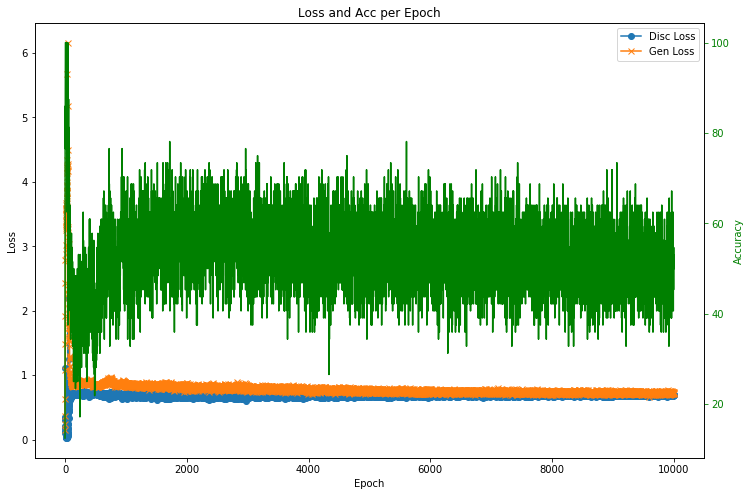

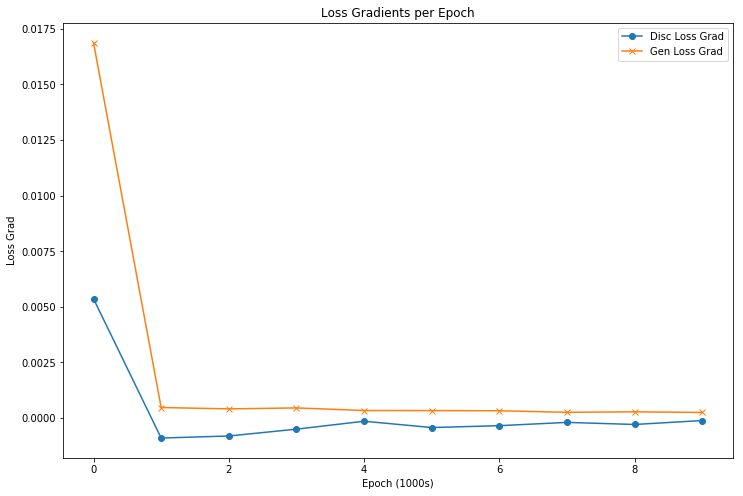

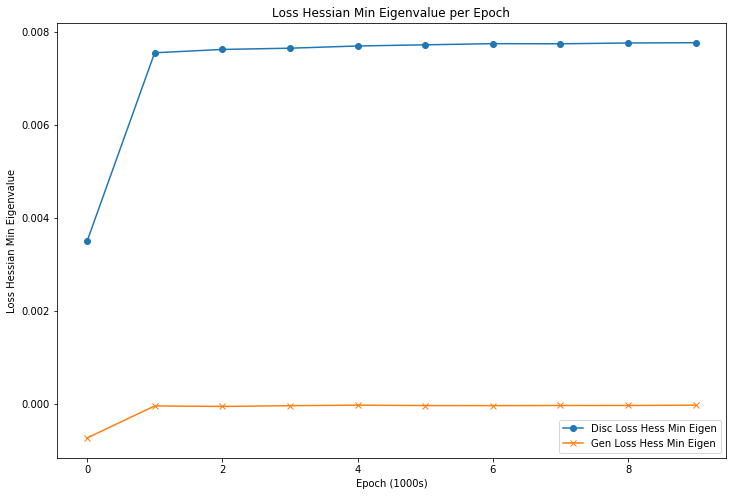

In [398]:
##### SGD with gamma -> inf #####
# learning_rate = 0.1
# momentum = 0
# decay_rate = 0.001 # Decay rate is how we are going to achieve inf-GD
# nest = False # Nesterov's acceleration
##############################

# Initialize GAN object
opt_params = ['sgd', 0.1, 0, 0.001, False, 'sgd_lr0.1_decay0.001']
gan_inf_1 = GAN(opt_params)

# Train GAN
gan_inf_1_hist = gan_inf_1.train(epochs=10000, batch_size=32, sample_interval=1000)

# Plot of performance results (training and validation accuracies and loss) for every epoch
plt.rcParams['figure.figsize'] = (12, 8)
plot_loss_acc(gan_inf_1_hist)
plot_loss_gradient(gan_inf_1_hist)
plot_loss_hessian_eig(gan_inf_1_hist)

In [ ]:
gan_inf_1_hist

hello
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_32 (Flatten)         (None, 784)               0         
_________________________________________________________________
dense_224 (Dense)            (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_160 (LeakyReLU)  (None, 512)               0         
_________________________________________________________________
dense_225 (Dense)            (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_161 (LeakyReLU)  (None, 256)               0         
_________________________________________________________________
dense_226 (Dense)            (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________________________

92 [D loss: 0.047487, acc.: 100.00%] [G loss: 2.822555]
93 [D loss: 0.042635, acc.: 100.00%] [G loss: 2.764772]
94 [D loss: 0.038827, acc.: 100.00%] [G loss: 2.874203]
95 [D loss: 0.040320, acc.: 100.00%] [G loss: 2.686281]
96 [D loss: 0.045755, acc.: 100.00%] [G loss: 2.848426]
97 [D loss: 0.041290, acc.: 100.00%] [G loss: 2.827284]
98 [D loss: 0.038806, acc.: 100.00%] [G loss: 2.821816]
99 [D loss: 0.035285, acc.: 100.00%] [G loss: 2.831042]
100 [D loss: 0.038854, acc.: 100.00%] [G loss: 2.823754]
101 [D loss: 0.040816, acc.: 100.00%] [G loss: 2.752959]
102 [D loss: 0.044119, acc.: 100.00%] [G loss: 2.861302]
103 [D loss: 0.041611, acc.: 100.00%] [G loss: 2.920968]
104 [D loss: 0.031527, acc.: 100.00%] [G loss: 2.793983]
105 [D loss: 0.031937, acc.: 100.00%] [G loss: 2.859675]
106 [D loss: 0.040834, acc.: 100.00%] [G loss: 2.791257]
107 [D loss: 0.033094, acc.: 100.00%] [G loss: 2.778175]
108 [D loss: 0.040117, acc.: 100.00%] [G loss: 2.886100]
109 [D loss: 0.039477, acc.: 100.00%] [

239 [D loss: 0.035559, acc.: 100.00%] [G loss: 2.890299]
240 [D loss: 0.055983, acc.: 100.00%] [G loss: 2.848739]
241 [D loss: 0.038750, acc.: 100.00%] [G loss: 2.895757]
242 [D loss: 0.036329, acc.: 100.00%] [G loss: 2.918862]
243 [D loss: 0.058125, acc.: 100.00%] [G loss: 2.886362]
244 [D loss: 0.044584, acc.: 100.00%] [G loss: 2.919014]
245 [D loss: 0.041333, acc.: 100.00%] [G loss: 2.908685]
246 [D loss: 0.045849, acc.: 100.00%] [G loss: 2.954653]
247 [D loss: 0.052855, acc.: 100.00%] [G loss: 2.845120]
248 [D loss: 0.045678, acc.: 100.00%] [G loss: 2.889385]
249 [D loss: 0.052863, acc.: 100.00%] [G loss: 2.964657]
250 [D loss: 0.035945, acc.: 100.00%] [G loss: 2.871407]
251 [D loss: 0.051389, acc.: 100.00%] [G loss: 2.906415]
252 [D loss: 0.039309, acc.: 100.00%] [G loss: 2.808717]
253 [D loss: 0.056057, acc.: 100.00%] [G loss: 2.948744]
254 [D loss: 0.040718, acc.: 100.00%] [G loss: 2.795136]
255 [D loss: 0.040644, acc.: 100.00%] [G loss: 2.935710]
256 [D loss: 0.047006, acc.: 10

383 [D loss: 0.054715, acc.: 100.00%] [G loss: 2.917827]
384 [D loss: 0.050770, acc.: 100.00%] [G loss: 2.882716]
385 [D loss: 0.042564, acc.: 100.00%] [G loss: 2.893123]
386 [D loss: 0.047457, acc.: 100.00%] [G loss: 3.021413]
387 [D loss: 0.050589, acc.: 100.00%] [G loss: 3.137223]
388 [D loss: 0.049257, acc.: 100.00%] [G loss: 2.840755]
389 [D loss: 0.035878, acc.: 100.00%] [G loss: 2.986708]
390 [D loss: 0.038613, acc.: 100.00%] [G loss: 2.985987]
391 [D loss: 0.042780, acc.: 100.00%] [G loss: 2.984106]
392 [D loss: 0.058931, acc.: 100.00%] [G loss: 2.848201]
393 [D loss: 0.046060, acc.: 100.00%] [G loss: 2.949848]
394 [D loss: 0.044255, acc.: 100.00%] [G loss: 2.880711]
395 [D loss: 0.037646, acc.: 100.00%] [G loss: 3.031364]
396 [D loss: 0.043522, acc.: 100.00%] [G loss: 3.011950]
397 [D loss: 0.044480, acc.: 100.00%] [G loss: 2.974602]
398 [D loss: 0.048841, acc.: 100.00%] [G loss: 2.991702]
399 [D loss: 0.052436, acc.: 100.00%] [G loss: 2.948384]
400 [D loss: 0.034143, acc.: 10

531 [D loss: 0.066806, acc.: 100.00%] [G loss: 3.029286]
532 [D loss: 0.120760, acc.: 96.88%] [G loss: 3.770905]
533 [D loss: 0.160237, acc.: 95.31%] [G loss: 2.872546]
534 [D loss: 0.095122, acc.: 96.88%] [G loss: 3.453190]
535 [D loss: 0.173310, acc.: 93.75%] [G loss: 3.145021]
536 [D loss: 0.057351, acc.: 100.00%] [G loss: 3.445046]
537 [D loss: 0.146518, acc.: 95.31%] [G loss: 3.536948]
538 [D loss: 0.128321, acc.: 98.44%] [G loss: 3.217678]
539 [D loss: 0.093613, acc.: 98.44%] [G loss: 2.783898]
540 [D loss: 0.128044, acc.: 93.75%] [G loss: 3.894217]
541 [D loss: 0.494882, acc.: 75.00%] [G loss: 3.391445]
542 [D loss: 0.273093, acc.: 85.94%] [G loss: 3.795276]
543 [D loss: 0.231152, acc.: 92.19%] [G loss: 3.518631]
544 [D loss: 0.204038, acc.: 95.31%] [G loss: 4.149667]
545 [D loss: 0.763949, acc.: 67.19%] [G loss: 3.421741]
546 [D loss: 0.164751, acc.: 95.31%] [G loss: 3.540135]
547 [D loss: 0.138956, acc.: 95.31%] [G loss: 3.327003]
548 [D loss: 0.060295, acc.: 100.00%] [G loss:

682 [D loss: 0.463158, acc.: 71.88%] [G loss: 1.744279]
683 [D loss: 0.583605, acc.: 67.19%] [G loss: 1.533077]
684 [D loss: 0.516249, acc.: 76.56%] [G loss: 1.581920]
685 [D loss: 0.516784, acc.: 70.31%] [G loss: 1.682029]
686 [D loss: 0.572477, acc.: 67.19%] [G loss: 1.622929]
687 [D loss: 0.680853, acc.: 64.06%] [G loss: 1.651663]
688 [D loss: 0.546054, acc.: 71.88%] [G loss: 1.838880]
689 [D loss: 0.456198, acc.: 81.25%] [G loss: 1.573488]
690 [D loss: 0.480710, acc.: 75.00%] [G loss: 1.540285]
691 [D loss: 0.498939, acc.: 75.00%] [G loss: 1.660430]
692 [D loss: 0.522436, acc.: 75.00%] [G loss: 1.609171]
693 [D loss: 0.540154, acc.: 76.56%] [G loss: 1.582460]
694 [D loss: 0.485179, acc.: 75.00%] [G loss: 1.649820]
695 [D loss: 0.631603, acc.: 65.62%] [G loss: 1.656229]
696 [D loss: 0.491413, acc.: 71.88%] [G loss: 1.774001]
697 [D loss: 0.525511, acc.: 73.44%] [G loss: 1.597476]
698 [D loss: 0.435289, acc.: 82.81%] [G loss: 1.298982]
699 [D loss: 0.396604, acc.: 79.69%] [G loss: 1.

830 [D loss: 0.425330, acc.: 78.12%] [G loss: 1.655545]
831 [D loss: 0.435084, acc.: 79.69%] [G loss: 1.563079]
832 [D loss: 0.482976, acc.: 75.00%] [G loss: 1.536368]
833 [D loss: 0.438641, acc.: 82.81%] [G loss: 1.353149]
834 [D loss: 0.526951, acc.: 68.75%] [G loss: 1.488945]
835 [D loss: 0.457655, acc.: 79.69%] [G loss: 1.569351]
836 [D loss: 0.380299, acc.: 82.81%] [G loss: 1.693676]
837 [D loss: 0.432128, acc.: 79.69%] [G loss: 1.462421]
838 [D loss: 0.376727, acc.: 85.94%] [G loss: 1.635263]
839 [D loss: 0.454432, acc.: 76.56%] [G loss: 1.624031]
840 [D loss: 0.444015, acc.: 75.00%] [G loss: 1.630793]
841 [D loss: 0.520919, acc.: 75.00%] [G loss: 1.507743]
842 [D loss: 0.495133, acc.: 70.31%] [G loss: 1.579004]
843 [D loss: 0.487479, acc.: 75.00%] [G loss: 1.613885]
844 [D loss: 0.483039, acc.: 78.12%] [G loss: 1.583031]
845 [D loss: 0.430238, acc.: 75.00%] [G loss: 1.525481]
846 [D loss: 0.484248, acc.: 76.56%] [G loss: 1.676760]
847 [D loss: 0.396335, acc.: 79.69%] [G loss: 1.

978 [D loss: 0.584494, acc.: 68.75%] [G loss: 1.167174]
979 [D loss: 0.575309, acc.: 68.75%] [G loss: 1.215622]
980 [D loss: 0.571894, acc.: 67.19%] [G loss: 1.204201]
981 [D loss: 0.631564, acc.: 53.12%] [G loss: 1.137642]
982 [D loss: 0.631789, acc.: 62.50%] [G loss: 1.166111]
983 [D loss: 0.583506, acc.: 62.50%] [G loss: 1.230320]
984 [D loss: 0.595922, acc.: 65.62%] [G loss: 1.118429]
985 [D loss: 0.561564, acc.: 67.19%] [G loss: 1.176415]
986 [D loss: 0.606972, acc.: 62.50%] [G loss: 1.169195]
987 [D loss: 0.595619, acc.: 65.62%] [G loss: 1.197714]
988 [D loss: 0.611970, acc.: 62.50%] [G loss: 1.184413]
989 [D loss: 0.680284, acc.: 50.00%] [G loss: 1.057200]
990 [D loss: 0.610419, acc.: 71.88%] [G loss: 1.166082]
991 [D loss: 0.582751, acc.: 65.62%] [G loss: 1.126963]
992 [D loss: 0.634682, acc.: 60.94%] [G loss: 1.169932]
993 [D loss: 0.606121, acc.: 60.94%] [G loss: 1.066218]
994 [D loss: 0.591224, acc.: 67.19%] [G loss: 1.155031]
995 [D loss: 0.559129, acc.: 71.88%] [G loss: 1.

1122 [D loss: 0.641522, acc.: 54.69%] [G loss: 0.806712]
1123 [D loss: 0.664779, acc.: 53.12%] [G loss: 0.813423]
1124 [D loss: 0.683619, acc.: 50.00%] [G loss: 0.802074]
1125 [D loss: 0.657805, acc.: 53.12%] [G loss: 0.842873]
1126 [D loss: 0.650797, acc.: 62.50%] [G loss: 0.806204]
1127 [D loss: 0.656547, acc.: 60.94%] [G loss: 0.826896]
1128 [D loss: 0.675559, acc.: 59.38%] [G loss: 0.790930]
1129 [D loss: 0.667283, acc.: 57.81%] [G loss: 0.801380]
1130 [D loss: 0.667649, acc.: 57.81%] [G loss: 0.776047]
1131 [D loss: 0.701885, acc.: 45.31%] [G loss: 0.779979]
1132 [D loss: 0.669900, acc.: 56.25%] [G loss: 0.760150]
1133 [D loss: 0.667089, acc.: 54.69%] [G loss: 0.761986]
1134 [D loss: 0.635823, acc.: 64.06%] [G loss: 0.815450]
1135 [D loss: 0.627817, acc.: 60.94%] [G loss: 0.814786]
1136 [D loss: 0.658009, acc.: 53.12%] [G loss: 0.801201]
1137 [D loss: 0.673665, acc.: 53.12%] [G loss: 0.802278]
1138 [D loss: 0.629503, acc.: 70.31%] [G loss: 0.800013]
1139 [D loss: 0.677881, acc.: 5

1266 [D loss: 0.658562, acc.: 60.94%] [G loss: 0.767923]
1267 [D loss: 0.674007, acc.: 45.31%] [G loss: 0.765050]
1268 [D loss: 0.687301, acc.: 50.00%] [G loss: 0.753658]
1269 [D loss: 0.668544, acc.: 51.56%] [G loss: 0.737121]
1270 [D loss: 0.659059, acc.: 54.69%] [G loss: 0.753975]
1271 [D loss: 0.652490, acc.: 54.69%] [G loss: 0.761624]
1272 [D loss: 0.653043, acc.: 59.38%] [G loss: 0.768323]
1273 [D loss: 0.669778, acc.: 59.38%] [G loss: 0.771011]
1274 [D loss: 0.667886, acc.: 48.44%] [G loss: 0.778965]
1275 [D loss: 0.680592, acc.: 53.12%] [G loss: 0.760087]
1276 [D loss: 0.675389, acc.: 46.88%] [G loss: 0.754992]
1277 [D loss: 0.682422, acc.: 45.31%] [G loss: 0.765842]
1278 [D loss: 0.670491, acc.: 50.00%] [G loss: 0.776427]
1279 [D loss: 0.682090, acc.: 45.31%] [G loss: 0.760424]
1280 [D loss: 0.662976, acc.: 57.81%] [G loss: 0.758801]
1281 [D loss: 0.658535, acc.: 53.12%] [G loss: 0.741315]
1282 [D loss: 0.665610, acc.: 54.69%] [G loss: 0.742435]
1283 [D loss: 0.668356, acc.: 4

1411 [D loss: 0.660962, acc.: 60.94%] [G loss: 0.762091]
1412 [D loss: 0.663873, acc.: 56.25%] [G loss: 0.757482]
1413 [D loss: 0.671661, acc.: 56.25%] [G loss: 0.758125]
1414 [D loss: 0.651875, acc.: 67.19%] [G loss: 0.753607]
1415 [D loss: 0.654640, acc.: 60.94%] [G loss: 0.763843]
1416 [D loss: 0.661828, acc.: 59.38%] [G loss: 0.772202]
1417 [D loss: 0.662759, acc.: 51.56%] [G loss: 0.763482]
1418 [D loss: 0.635712, acc.: 68.75%] [G loss: 0.757995]
1419 [D loss: 0.663003, acc.: 51.56%] [G loss: 0.779153]
1420 [D loss: 0.661127, acc.: 64.06%] [G loss: 0.763078]
1421 [D loss: 0.638480, acc.: 70.31%] [G loss: 0.776660]
1422 [D loss: 0.653671, acc.: 67.19%] [G loss: 0.769556]
1423 [D loss: 0.671664, acc.: 56.25%] [G loss: 0.776049]
1424 [D loss: 0.646097, acc.: 71.88%] [G loss: 0.769307]
1425 [D loss: 0.645396, acc.: 60.94%] [G loss: 0.772133]
1426 [D loss: 0.648445, acc.: 65.62%] [G loss: 0.760297]
1427 [D loss: 0.658854, acc.: 68.75%] [G loss: 0.767401]
1428 [D loss: 0.661993, acc.: 5

1556 [D loss: 0.656808, acc.: 53.12%] [G loss: 0.770865]
1557 [D loss: 0.639113, acc.: 75.00%] [G loss: 0.790586]
1558 [D loss: 0.642807, acc.: 68.75%] [G loss: 0.782904]
1559 [D loss: 0.646405, acc.: 67.19%] [G loss: 0.795755]
1560 [D loss: 0.645277, acc.: 65.62%] [G loss: 0.782340]
1561 [D loss: 0.635674, acc.: 75.00%] [G loss: 0.777800]
1562 [D loss: 0.649969, acc.: 60.94%] [G loss: 0.779093]
1563 [D loss: 0.655912, acc.: 67.19%] [G loss: 0.783080]
1564 [D loss: 0.657096, acc.: 62.50%] [G loss: 0.792054]
1565 [D loss: 0.645223, acc.: 70.31%] [G loss: 0.802517]
1566 [D loss: 0.633295, acc.: 67.19%] [G loss: 0.781635]
1567 [D loss: 0.652108, acc.: 64.06%] [G loss: 0.790723]
1568 [D loss: 0.640138, acc.: 70.31%] [G loss: 0.791574]
1569 [D loss: 0.643110, acc.: 78.12%] [G loss: 0.776466]
1570 [D loss: 0.670491, acc.: 57.81%] [G loss: 0.770075]
1571 [D loss: 0.658625, acc.: 53.12%] [G loss: 0.776806]
1572 [D loss: 0.629029, acc.: 71.88%] [G loss: 0.765614]
1573 [D loss: 0.646336, acc.: 5

1702 [D loss: 0.653475, acc.: 67.19%] [G loss: 0.782525]
1703 [D loss: 0.624922, acc.: 79.69%] [G loss: 0.790071]
1704 [D loss: 0.632884, acc.: 76.56%] [G loss: 0.791427]
1705 [D loss: 0.646661, acc.: 68.75%] [G loss: 0.781898]
1706 [D loss: 0.634156, acc.: 78.12%] [G loss: 0.781256]
1707 [D loss: 0.642119, acc.: 71.88%] [G loss: 0.788359]
1708 [D loss: 0.630082, acc.: 81.25%] [G loss: 0.783260]
1709 [D loss: 0.642887, acc.: 68.75%] [G loss: 0.780914]
1710 [D loss: 0.639639, acc.: 70.31%] [G loss: 0.794872]
1711 [D loss: 0.646789, acc.: 79.69%] [G loss: 0.787586]
1712 [D loss: 0.633716, acc.: 82.81%] [G loss: 0.785218]
1713 [D loss: 0.637716, acc.: 73.44%] [G loss: 0.792269]
1714 [D loss: 0.627198, acc.: 84.38%] [G loss: 0.777701]
1715 [D loss: 0.648509, acc.: 76.56%] [G loss: 0.793657]
1716 [D loss: 0.649913, acc.: 67.19%] [G loss: 0.780394]
1717 [D loss: 0.645662, acc.: 67.19%] [G loss: 0.792915]
1718 [D loss: 0.620150, acc.: 79.69%] [G loss: 0.773586]
1719 [D loss: 0.652463, acc.: 7

1848 [D loss: 0.621313, acc.: 81.25%] [G loss: 0.820331]
1849 [D loss: 0.621475, acc.: 81.25%] [G loss: 0.807488]
1850 [D loss: 0.631035, acc.: 65.62%] [G loss: 0.804734]
1851 [D loss: 0.625460, acc.: 71.88%] [G loss: 0.819776]
1852 [D loss: 0.638388, acc.: 76.56%] [G loss: 0.801569]
1853 [D loss: 0.640358, acc.: 75.00%] [G loss: 0.792874]
1854 [D loss: 0.642966, acc.: 75.00%] [G loss: 0.811721]
1855 [D loss: 0.633529, acc.: 73.44%] [G loss: 0.802763]
1856 [D loss: 0.634957, acc.: 73.44%] [G loss: 0.802848]
1857 [D loss: 0.635009, acc.: 71.88%] [G loss: 0.803099]
1858 [D loss: 0.622900, acc.: 85.94%] [G loss: 0.813655]
1859 [D loss: 0.622635, acc.: 67.19%] [G loss: 0.823632]
1860 [D loss: 0.645012, acc.: 65.62%] [G loss: 0.808642]
1861 [D loss: 0.618380, acc.: 75.00%] [G loss: 0.817665]
1862 [D loss: 0.623436, acc.: 75.00%] [G loss: 0.814312]
1863 [D loss: 0.617843, acc.: 78.12%] [G loss: 0.818206]
1864 [D loss: 0.652552, acc.: 67.19%] [G loss: 0.823138]
1865 [D loss: 0.649092, acc.: 6

1995 [D loss: 0.622628, acc.: 75.00%] [G loss: 0.826263]
1996 [D loss: 0.628648, acc.: 79.69%] [G loss: 0.834253]
1997 [D loss: 0.634552, acc.: 73.44%] [G loss: 0.817226]
1998 [D loss: 0.637049, acc.: 73.44%] [G loss: 0.829261]
1999 [D loss: 0.610029, acc.: 81.25%] [G loss: 0.833574]
2000 [D loss: 0.632193, acc.: 67.19%] [G loss: 0.819940]
Discriminator gradients:  5.4558273e-05
Generator gradients:  0.0013457971
Min XX Hessian eigenvalue:  0.0075709554
Min ZZ Hessian eigenvalue:  -0.000111267895
2001 [D loss: 0.626306, acc.: 75.00%] [G loss: 0.840402]
2002 [D loss: 0.606489, acc.: 82.81%] [G loss: 0.817410]
2003 [D loss: 0.628765, acc.: 70.31%] [G loss: 0.843936]
2004 [D loss: 0.616097, acc.: 79.69%] [G loss: 0.827481]
2005 [D loss: 0.615538, acc.: 79.69%] [G loss: 0.826643]
2006 [D loss: 0.642217, acc.: 73.44%] [G loss: 0.824069]
2007 [D loss: 0.628954, acc.: 76.56%] [G loss: 0.827455]
2008 [D loss: 0.633877, acc.: 65.62%] [G loss: 0.835122]
2009 [D loss: 0.606603, acc.: 82.81%] [G l

2136 [D loss: 0.582687, acc.: 89.06%] [G loss: 0.892921]
2137 [D loss: 0.594548, acc.: 89.06%] [G loss: 0.877386]
2138 [D loss: 0.627970, acc.: 70.31%] [G loss: 0.859854]
2139 [D loss: 0.602953, acc.: 81.25%] [G loss: 0.888591]
2140 [D loss: 0.618187, acc.: 70.31%] [G loss: 0.862053]
2141 [D loss: 0.606562, acc.: 82.81%] [G loss: 0.847882]
2142 [D loss: 0.597827, acc.: 87.50%] [G loss: 0.863424]
2143 [D loss: 0.592803, acc.: 82.81%] [G loss: 0.844905]
2144 [D loss: 0.596983, acc.: 79.69%] [G loss: 0.884206]
2145 [D loss: 0.625432, acc.: 76.56%] [G loss: 0.891755]
2146 [D loss: 0.639854, acc.: 73.44%] [G loss: 0.876736]
2147 [D loss: 0.619470, acc.: 73.44%] [G loss: 0.859539]
2148 [D loss: 0.614089, acc.: 70.31%] [G loss: 0.863333]
2149 [D loss: 0.620615, acc.: 71.88%] [G loss: 0.866751]
2150 [D loss: 0.627867, acc.: 71.88%] [G loss: 0.883280]
2151 [D loss: 0.610450, acc.: 78.12%] [G loss: 0.884970]
2152 [D loss: 0.644233, acc.: 67.19%] [G loss: 0.886811]
2153 [D loss: 0.589647, acc.: 8

2281 [D loss: 0.599992, acc.: 79.69%] [G loss: 0.909882]
2282 [D loss: 0.592930, acc.: 81.25%] [G loss: 0.923159]
2283 [D loss: 0.583200, acc.: 81.25%] [G loss: 0.924613]
2284 [D loss: 0.598556, acc.: 73.44%] [G loss: 0.947287]
2285 [D loss: 0.618777, acc.: 79.69%] [G loss: 0.926392]
2286 [D loss: 0.610395, acc.: 75.00%] [G loss: 0.925382]
2287 [D loss: 0.592705, acc.: 79.69%] [G loss: 0.929968]
2288 [D loss: 0.615955, acc.: 71.88%] [G loss: 0.931522]
2289 [D loss: 0.605810, acc.: 76.56%] [G loss: 0.938581]
2290 [D loss: 0.615313, acc.: 78.12%] [G loss: 0.919391]
2291 [D loss: 0.605414, acc.: 76.56%] [G loss: 0.922303]
2292 [D loss: 0.587756, acc.: 84.38%] [G loss: 0.920724]
2293 [D loss: 0.590598, acc.: 81.25%] [G loss: 0.932458]
2294 [D loss: 0.572119, acc.: 87.50%] [G loss: 0.923197]
2295 [D loss: 0.610577, acc.: 76.56%] [G loss: 0.946870]
2296 [D loss: 0.604784, acc.: 84.38%] [G loss: 0.903631]
2297 [D loss: 0.586860, acc.: 75.00%] [G loss: 0.919282]
2298 [D loss: 0.587307, acc.: 8

2428 [D loss: 0.595577, acc.: 78.12%] [G loss: 0.932706]
2429 [D loss: 0.592956, acc.: 76.56%] [G loss: 0.942645]
2430 [D loss: 0.561765, acc.: 82.81%] [G loss: 0.951849]
2431 [D loss: 0.571222, acc.: 84.38%] [G loss: 0.950161]
2432 [D loss: 0.576640, acc.: 82.81%] [G loss: 0.939527]
2433 [D loss: 0.591854, acc.: 82.81%] [G loss: 0.961683]
2434 [D loss: 0.585654, acc.: 84.38%] [G loss: 0.963430]
2435 [D loss: 0.598596, acc.: 81.25%] [G loss: 0.915370]
2436 [D loss: 0.632441, acc.: 71.88%] [G loss: 0.960408]
2437 [D loss: 0.582783, acc.: 84.38%] [G loss: 0.928635]
2438 [D loss: 0.589759, acc.: 90.62%] [G loss: 0.931803]
2439 [D loss: 0.566372, acc.: 85.94%] [G loss: 0.933332]
2440 [D loss: 0.569272, acc.: 75.00%] [G loss: 0.926294]
2441 [D loss: 0.586778, acc.: 82.81%] [G loss: 0.933801]
2442 [D loss: 0.584597, acc.: 76.56%] [G loss: 0.942077]
2443 [D loss: 0.574401, acc.: 79.69%] [G loss: 0.956089]
2444 [D loss: 0.606410, acc.: 71.88%] [G loss: 0.933106]
2445 [D loss: 0.578178, acc.: 8

2572 [D loss: 0.629969, acc.: 65.62%] [G loss: 0.978203]
2573 [D loss: 0.600397, acc.: 71.88%] [G loss: 0.972458]
2574 [D loss: 0.610064, acc.: 68.75%] [G loss: 0.899352]
2575 [D loss: 0.580008, acc.: 79.69%] [G loss: 0.934634]
2576 [D loss: 0.635552, acc.: 67.19%] [G loss: 0.959402]
2577 [D loss: 0.627929, acc.: 65.62%] [G loss: 0.946847]
2578 [D loss: 0.621061, acc.: 70.31%] [G loss: 0.953837]
2579 [D loss: 0.610241, acc.: 71.88%] [G loss: 0.974947]
2580 [D loss: 0.659598, acc.: 60.94%] [G loss: 0.970305]
2581 [D loss: 0.645039, acc.: 62.50%] [G loss: 0.955083]
2582 [D loss: 0.610841, acc.: 73.44%] [G loss: 0.920802]
2583 [D loss: 0.612862, acc.: 76.56%] [G loss: 0.925128]
2584 [D loss: 0.607851, acc.: 68.75%] [G loss: 0.957331]
2585 [D loss: 0.626169, acc.: 68.75%] [G loss: 0.986947]
2586 [D loss: 0.638647, acc.: 68.75%] [G loss: 0.911326]
2587 [D loss: 0.606343, acc.: 73.44%] [G loss: 0.922990]
2588 [D loss: 0.577550, acc.: 81.25%] [G loss: 0.931910]
2589 [D loss: 0.627757, acc.: 7

2716 [D loss: 0.628110, acc.: 70.31%] [G loss: 0.900906]
2717 [D loss: 0.618629, acc.: 67.19%] [G loss: 0.897768]
2718 [D loss: 0.629436, acc.: 65.62%] [G loss: 0.892146]
2719 [D loss: 0.628349, acc.: 71.88%] [G loss: 0.855772]
2720 [D loss: 0.645606, acc.: 60.94%] [G loss: 0.885913]
2721 [D loss: 0.613855, acc.: 75.00%] [G loss: 0.870539]
2722 [D loss: 0.653960, acc.: 62.50%] [G loss: 0.888601]
2723 [D loss: 0.612611, acc.: 70.31%] [G loss: 0.950162]
2724 [D loss: 0.632916, acc.: 70.31%] [G loss: 0.901921]
2725 [D loss: 0.635248, acc.: 68.75%] [G loss: 0.927265]
2726 [D loss: 0.622145, acc.: 76.56%] [G loss: 0.882864]
2727 [D loss: 0.635032, acc.: 64.06%] [G loss: 0.879231]
2728 [D loss: 0.639860, acc.: 68.75%] [G loss: 0.878857]
2729 [D loss: 0.613181, acc.: 78.12%] [G loss: 0.879977]
2730 [D loss: 0.620508, acc.: 68.75%] [G loss: 0.908975]
2731 [D loss: 0.620095, acc.: 71.88%] [G loss: 0.927807]
2732 [D loss: 0.591591, acc.: 84.38%] [G loss: 0.933822]
2733 [D loss: 0.648887, acc.: 6

2863 [D loss: 0.587417, acc.: 79.69%] [G loss: 0.959919]
2864 [D loss: 0.560211, acc.: 90.62%] [G loss: 0.956635]
2865 [D loss: 0.634733, acc.: 76.56%] [G loss: 0.930218]
2866 [D loss: 0.594343, acc.: 81.25%] [G loss: 0.968782]
2867 [D loss: 0.577793, acc.: 82.81%] [G loss: 0.977300]
2868 [D loss: 0.589075, acc.: 76.56%] [G loss: 0.989984]
2869 [D loss: 0.587270, acc.: 81.25%] [G loss: 0.953223]
2870 [D loss: 0.610060, acc.: 71.88%] [G loss: 0.970349]
2871 [D loss: 0.575428, acc.: 81.25%] [G loss: 0.980640]
2872 [D loss: 0.566709, acc.: 82.81%] [G loss: 0.997425]
2873 [D loss: 0.623827, acc.: 73.44%] [G loss: 0.944817]
2874 [D loss: 0.571789, acc.: 78.12%] [G loss: 0.987188]
2875 [D loss: 0.617133, acc.: 81.25%] [G loss: 0.984012]
2876 [D loss: 0.629187, acc.: 73.44%] [G loss: 0.945538]
2877 [D loss: 0.564536, acc.: 87.50%] [G loss: 0.961453]
2878 [D loss: 0.598261, acc.: 79.69%] [G loss: 0.931424]
2879 [D loss: 0.603988, acc.: 75.00%] [G loss: 0.933519]
2880 [D loss: 0.576616, acc.: 8

3004 [D loss: 0.623383, acc.: 71.88%] [G loss: 0.949676]
3005 [D loss: 0.630393, acc.: 71.88%] [G loss: 0.963705]
3006 [D loss: 0.644102, acc.: 59.38%] [G loss: 0.977665]
3007 [D loss: 0.602363, acc.: 76.56%] [G loss: 0.910799]
3008 [D loss: 0.606296, acc.: 71.88%] [G loss: 0.972640]
3009 [D loss: 0.618371, acc.: 73.44%] [G loss: 0.918596]
3010 [D loss: 0.620405, acc.: 65.62%] [G loss: 0.894488]
3011 [D loss: 0.584588, acc.: 70.31%] [G loss: 0.918303]
3012 [D loss: 0.627007, acc.: 68.75%] [G loss: 0.931056]
3013 [D loss: 0.627809, acc.: 75.00%] [G loss: 0.923918]
3014 [D loss: 0.611277, acc.: 68.75%] [G loss: 0.935916]
3015 [D loss: 0.634606, acc.: 67.19%] [G loss: 0.889179]
3016 [D loss: 0.597147, acc.: 78.12%] [G loss: 0.921398]
3017 [D loss: 0.618998, acc.: 62.50%] [G loss: 0.954217]
3018 [D loss: 0.590582, acc.: 76.56%] [G loss: 0.932487]
3019 [D loss: 0.627107, acc.: 70.31%] [G loss: 0.898174]
3020 [D loss: 0.597411, acc.: 70.31%] [G loss: 0.944366]
3021 [D loss: 0.635063, acc.: 6

3148 [D loss: 0.650155, acc.: 65.62%] [G loss: 0.907331]
3149 [D loss: 0.625900, acc.: 68.75%] [G loss: 0.889627]
3150 [D loss: 0.675427, acc.: 59.38%] [G loss: 0.890550]
3151 [D loss: 0.622692, acc.: 65.62%] [G loss: 0.916932]
3152 [D loss: 0.653364, acc.: 57.81%] [G loss: 0.929318]
3153 [D loss: 0.647581, acc.: 56.25%] [G loss: 0.911855]
3154 [D loss: 0.624964, acc.: 70.31%] [G loss: 0.858419]
3155 [D loss: 0.651329, acc.: 67.19%] [G loss: 0.922372]
3156 [D loss: 0.627327, acc.: 70.31%] [G loss: 0.928606]
3157 [D loss: 0.673237, acc.: 60.94%] [G loss: 0.870036]
3158 [D loss: 0.645069, acc.: 62.50%] [G loss: 0.862537]
3159 [D loss: 0.616083, acc.: 68.75%] [G loss: 0.928264]
3160 [D loss: 0.653419, acc.: 67.19%] [G loss: 0.861205]
3161 [D loss: 0.623310, acc.: 65.62%] [G loss: 0.926018]
3162 [D loss: 0.692993, acc.: 56.25%] [G loss: 0.855121]
3163 [D loss: 0.620640, acc.: 70.31%] [G loss: 0.892342]
3164 [D loss: 0.630376, acc.: 67.19%] [G loss: 0.857054]
3165 [D loss: 0.578051, acc.: 7

3296 [D loss: 0.605624, acc.: 73.44%] [G loss: 0.966052]
3297 [D loss: 0.604784, acc.: 75.00%] [G loss: 0.945664]
3298 [D loss: 0.577624, acc.: 81.25%] [G loss: 0.977955]
3299 [D loss: 0.588617, acc.: 79.69%] [G loss: 0.981533]
3300 [D loss: 0.640767, acc.: 70.31%] [G loss: 1.011286]
3301 [D loss: 0.639217, acc.: 65.62%] [G loss: 0.983015]
3302 [D loss: 0.614501, acc.: 70.31%] [G loss: 0.991953]
3303 [D loss: 0.638186, acc.: 67.19%] [G loss: 0.981916]
3304 [D loss: 0.573005, acc.: 84.38%] [G loss: 0.956248]
3305 [D loss: 0.580248, acc.: 84.38%] [G loss: 0.992397]
3306 [D loss: 0.639492, acc.: 70.31%] [G loss: 0.937738]
3307 [D loss: 0.596496, acc.: 79.69%] [G loss: 0.973550]
3308 [D loss: 0.611734, acc.: 68.75%] [G loss: 0.957863]
3309 [D loss: 0.629293, acc.: 67.19%] [G loss: 0.954964]
3310 [D loss: 0.535624, acc.: 90.62%] [G loss: 1.003087]
3311 [D loss: 0.647479, acc.: 65.62%] [G loss: 0.985555]
3312 [D loss: 0.587182, acc.: 82.81%] [G loss: 0.954768]
3313 [D loss: 0.614974, acc.: 6

3441 [D loss: 0.614982, acc.: 62.50%] [G loss: 1.000904]
3442 [D loss: 0.610320, acc.: 79.69%] [G loss: 0.994960]
3443 [D loss: 0.648109, acc.: 65.62%] [G loss: 0.954011]
3444 [D loss: 0.596914, acc.: 75.00%] [G loss: 0.990571]
3445 [D loss: 0.599257, acc.: 76.56%] [G loss: 0.964097]
3446 [D loss: 0.621656, acc.: 70.31%] [G loss: 0.984742]
3447 [D loss: 0.585379, acc.: 82.81%] [G loss: 1.000512]
3448 [D loss: 0.611977, acc.: 70.31%] [G loss: 0.942758]
3449 [D loss: 0.560554, acc.: 82.81%] [G loss: 0.937205]
3450 [D loss: 0.591335, acc.: 81.25%] [G loss: 0.936711]
3451 [D loss: 0.600219, acc.: 71.88%] [G loss: 0.956741]
3452 [D loss: 0.581210, acc.: 82.81%] [G loss: 0.998965]
3453 [D loss: 0.617290, acc.: 71.88%] [G loss: 1.006814]
3454 [D loss: 0.621463, acc.: 75.00%] [G loss: 0.965675]
3455 [D loss: 0.577627, acc.: 73.44%] [G loss: 0.980871]
3456 [D loss: 0.632449, acc.: 75.00%] [G loss: 0.976223]
3457 [D loss: 0.597936, acc.: 76.56%] [G loss: 0.959684]
3458 [D loss: 0.633937, acc.: 6

3585 [D loss: 0.664073, acc.: 56.25%] [G loss: 0.960343]
3586 [D loss: 0.599973, acc.: 75.00%] [G loss: 0.949749]
3587 [D loss: 0.636912, acc.: 73.44%] [G loss: 0.929359]
3588 [D loss: 0.628749, acc.: 73.44%] [G loss: 0.927356]
3589 [D loss: 0.639182, acc.: 67.19%] [G loss: 0.926454]
3590 [D loss: 0.643293, acc.: 64.06%] [G loss: 0.960870]
3591 [D loss: 0.631067, acc.: 60.94%] [G loss: 0.922663]
3592 [D loss: 0.601197, acc.: 71.88%] [G loss: 0.934973]
3593 [D loss: 0.610303, acc.: 67.19%] [G loss: 0.925655]
3594 [D loss: 0.654279, acc.: 60.94%] [G loss: 0.910570]
3595 [D loss: 0.592838, acc.: 73.44%] [G loss: 0.918980]
3596 [D loss: 0.675201, acc.: 54.69%] [G loss: 0.986523]
3597 [D loss: 0.622740, acc.: 65.62%] [G loss: 0.902433]
3598 [D loss: 0.617600, acc.: 67.19%] [G loss: 0.909767]
3599 [D loss: 0.624619, acc.: 70.31%] [G loss: 0.970891]
3600 [D loss: 0.644611, acc.: 73.44%] [G loss: 0.975667]
3601 [D loss: 0.616803, acc.: 73.44%] [G loss: 0.944777]
3602 [D loss: 0.635217, acc.: 6

3731 [D loss: 0.600944, acc.: 76.56%] [G loss: 0.943069]
3732 [D loss: 0.553361, acc.: 85.94%] [G loss: 0.918468]
3733 [D loss: 0.583959, acc.: 75.00%] [G loss: 0.911793]
3734 [D loss: 0.588788, acc.: 78.12%] [G loss: 0.976398]
3735 [D loss: 0.602632, acc.: 75.00%] [G loss: 0.915107]
3736 [D loss: 0.624269, acc.: 73.44%] [G loss: 0.871834]
3737 [D loss: 0.596012, acc.: 71.88%] [G loss: 0.913271]
3738 [D loss: 0.577792, acc.: 79.69%] [G loss: 0.926454]
3739 [D loss: 0.602557, acc.: 70.31%] [G loss: 0.931863]
3740 [D loss: 0.574516, acc.: 82.81%] [G loss: 0.961208]
3741 [D loss: 0.595492, acc.: 75.00%] [G loss: 0.953409]
3742 [D loss: 0.613557, acc.: 71.88%] [G loss: 0.925666]
3743 [D loss: 0.615534, acc.: 67.19%] [G loss: 0.921485]
3744 [D loss: 0.582641, acc.: 71.88%] [G loss: 0.927246]
3745 [D loss: 0.573074, acc.: 79.69%] [G loss: 0.975660]
3746 [D loss: 0.609656, acc.: 71.88%] [G loss: 0.964984]
3747 [D loss: 0.574045, acc.: 79.69%] [G loss: 0.981272]
3748 [D loss: 0.645947, acc.: 7

3878 [D loss: 0.598163, acc.: 71.88%] [G loss: 0.940185]
3879 [D loss: 0.657041, acc.: 64.06%] [G loss: 0.958374]
3880 [D loss: 0.580688, acc.: 76.56%] [G loss: 0.925358]
3881 [D loss: 0.611840, acc.: 70.31%] [G loss: 0.937062]
3882 [D loss: 0.607624, acc.: 67.19%] [G loss: 0.929751]
3883 [D loss: 0.622526, acc.: 68.75%] [G loss: 0.926513]
3884 [D loss: 0.621014, acc.: 65.62%] [G loss: 0.984368]
3885 [D loss: 0.605440, acc.: 73.44%] [G loss: 0.935183]
3886 [D loss: 0.601556, acc.: 73.44%] [G loss: 0.932962]
3887 [D loss: 0.596538, acc.: 71.88%] [G loss: 0.920804]
3888 [D loss: 0.559495, acc.: 79.69%] [G loss: 0.962714]
3889 [D loss: 0.614531, acc.: 71.88%] [G loss: 0.965154]
3890 [D loss: 0.618161, acc.: 75.00%] [G loss: 0.920066]
3891 [D loss: 0.608607, acc.: 67.19%] [G loss: 0.959980]
3892 [D loss: 0.573015, acc.: 76.56%] [G loss: 1.013214]
3893 [D loss: 0.583749, acc.: 78.12%] [G loss: 0.950632]
3894 [D loss: 0.575622, acc.: 75.00%] [G loss: 0.959609]
3895 [D loss: 0.624586, acc.: 6

4020 [D loss: 0.594730, acc.: 78.12%] [G loss: 0.961026]
4021 [D loss: 0.632720, acc.: 57.81%] [G loss: 0.926705]
4022 [D loss: 0.637414, acc.: 59.38%] [G loss: 0.920440]
4023 [D loss: 0.613077, acc.: 70.31%] [G loss: 0.887943]
4024 [D loss: 0.617360, acc.: 64.06%] [G loss: 0.930309]
4025 [D loss: 0.633681, acc.: 70.31%] [G loss: 0.911375]
4026 [D loss: 0.634451, acc.: 70.31%] [G loss: 0.937546]
4027 [D loss: 0.580072, acc.: 75.00%] [G loss: 0.957031]
4028 [D loss: 0.629123, acc.: 70.31%] [G loss: 0.928840]
4029 [D loss: 0.628305, acc.: 67.19%] [G loss: 0.909583]
4030 [D loss: 0.632858, acc.: 67.19%] [G loss: 0.970831]
4031 [D loss: 0.654928, acc.: 56.25%] [G loss: 0.951130]
4032 [D loss: 0.609634, acc.: 68.75%] [G loss: 0.963629]
4033 [D loss: 0.604078, acc.: 73.44%] [G loss: 0.991433]
4034 [D loss: 0.646891, acc.: 67.19%] [G loss: 0.966101]
4035 [D loss: 0.663322, acc.: 59.38%] [G loss: 0.936766]
4036 [D loss: 0.602698, acc.: 68.75%] [G loss: 0.957800]
4037 [D loss: 0.604196, acc.: 7

4167 [D loss: 0.595961, acc.: 73.44%] [G loss: 0.964066]
4168 [D loss: 0.583880, acc.: 75.00%] [G loss: 0.941635]
4169 [D loss: 0.640360, acc.: 64.06%] [G loss: 0.947295]
4170 [D loss: 0.573236, acc.: 79.69%] [G loss: 0.974068]
4171 [D loss: 0.623582, acc.: 70.31%] [G loss: 0.957788]
4172 [D loss: 0.629499, acc.: 75.00%] [G loss: 0.950185]
4173 [D loss: 0.599819, acc.: 73.44%] [G loss: 0.913874]
4174 [D loss: 0.649937, acc.: 68.75%] [G loss: 0.897765]
4175 [D loss: 0.629518, acc.: 65.62%] [G loss: 0.950729]
4176 [D loss: 0.648536, acc.: 59.38%] [G loss: 0.939346]
4177 [D loss: 0.583679, acc.: 75.00%] [G loss: 0.951642]
4178 [D loss: 0.608163, acc.: 71.88%] [G loss: 0.956090]
4179 [D loss: 0.613093, acc.: 70.31%] [G loss: 0.948598]
4180 [D loss: 0.605019, acc.: 65.62%] [G loss: 0.937784]
4181 [D loss: 0.651299, acc.: 68.75%] [G loss: 0.899755]
4182 [D loss: 0.613688, acc.: 70.31%] [G loss: 0.907924]
4183 [D loss: 0.633116, acc.: 64.06%] [G loss: 0.926317]
4184 [D loss: 0.618039, acc.: 7

4311 [D loss: 0.626044, acc.: 68.75%] [G loss: 0.932640]
4312 [D loss: 0.675614, acc.: 60.94%] [G loss: 0.893348]
4313 [D loss: 0.609640, acc.: 70.31%] [G loss: 0.922320]
4314 [D loss: 0.615781, acc.: 68.75%] [G loss: 0.934245]
4315 [D loss: 0.614551, acc.: 67.19%] [G loss: 0.900517]
4316 [D loss: 0.623529, acc.: 78.12%] [G loss: 0.943651]
4317 [D loss: 0.579577, acc.: 73.44%] [G loss: 1.007176]
4318 [D loss: 0.670841, acc.: 57.81%] [G loss: 0.970502]
4319 [D loss: 0.612126, acc.: 71.88%] [G loss: 0.931637]
4320 [D loss: 0.646593, acc.: 67.19%] [G loss: 0.912951]
4321 [D loss: 0.623903, acc.: 67.19%] [G loss: 0.897869]
4322 [D loss: 0.665121, acc.: 59.38%] [G loss: 0.959882]
4323 [D loss: 0.603559, acc.: 70.31%] [G loss: 0.948209]
4324 [D loss: 0.651593, acc.: 67.19%] [G loss: 0.913886]
4325 [D loss: 0.660961, acc.: 56.25%] [G loss: 0.973704]
4326 [D loss: 0.606137, acc.: 76.56%] [G loss: 0.940405]
4327 [D loss: 0.637752, acc.: 64.06%] [G loss: 0.920693]
4328 [D loss: 0.645457, acc.: 5

4455 [D loss: 0.581100, acc.: 73.44%] [G loss: 0.984851]
4456 [D loss: 0.595831, acc.: 75.00%] [G loss: 0.969385]
4457 [D loss: 0.622235, acc.: 70.31%] [G loss: 0.992941]
4458 [D loss: 0.593495, acc.: 71.88%] [G loss: 0.950015]
4459 [D loss: 0.622795, acc.: 62.50%] [G loss: 0.980781]
4460 [D loss: 0.566249, acc.: 79.69%] [G loss: 1.012778]
4461 [D loss: 0.603615, acc.: 75.00%] [G loss: 0.960010]
4462 [D loss: 0.589801, acc.: 78.12%] [G loss: 0.946040]
4463 [D loss: 0.592896, acc.: 78.12%] [G loss: 0.971441]
4464 [D loss: 0.593409, acc.: 71.88%] [G loss: 0.997397]
4465 [D loss: 0.578597, acc.: 76.56%] [G loss: 1.012193]
4466 [D loss: 0.619584, acc.: 71.88%] [G loss: 0.961145]
4467 [D loss: 0.580847, acc.: 76.56%] [G loss: 1.000230]
4468 [D loss: 0.595775, acc.: 76.56%] [G loss: 0.966961]
4469 [D loss: 0.624231, acc.: 67.19%] [G loss: 0.953704]
4470 [D loss: 0.600483, acc.: 76.56%] [G loss: 0.963925]
4471 [D loss: 0.577871, acc.: 81.25%] [G loss: 0.977160]
4472 [D loss: 0.603071, acc.: 6

4602 [D loss: 0.626871, acc.: 70.31%] [G loss: 0.892876]
4603 [D loss: 0.578813, acc.: 67.19%] [G loss: 0.940429]
4604 [D loss: 0.600234, acc.: 68.75%] [G loss: 0.950866]
4605 [D loss: 0.587210, acc.: 78.12%] [G loss: 0.967958]
4606 [D loss: 0.561418, acc.: 82.81%] [G loss: 0.918351]
4607 [D loss: 0.596726, acc.: 68.75%] [G loss: 0.939847]
4608 [D loss: 0.634169, acc.: 65.62%] [G loss: 0.928501]
4609 [D loss: 0.581847, acc.: 79.69%] [G loss: 0.931278]
4610 [D loss: 0.578046, acc.: 76.56%] [G loss: 0.892696]
4611 [D loss: 0.623355, acc.: 62.50%] [G loss: 0.983155]
4612 [D loss: 0.618181, acc.: 65.62%] [G loss: 0.986737]
4613 [D loss: 0.620526, acc.: 67.19%] [G loss: 1.033289]
4614 [D loss: 0.597620, acc.: 70.31%] [G loss: 0.977858]
4615 [D loss: 0.547825, acc.: 84.38%] [G loss: 0.997990]
4616 [D loss: 0.599043, acc.: 71.88%] [G loss: 0.905983]
4617 [D loss: 0.571599, acc.: 76.56%] [G loss: 0.978955]
4618 [D loss: 0.585267, acc.: 73.44%] [G loss: 0.973507]
4619 [D loss: 0.642715, acc.: 6

4749 [D loss: 0.662378, acc.: 51.56%] [G loss: 0.958682]
4750 [D loss: 0.617791, acc.: 70.31%] [G loss: 0.929074]
4751 [D loss: 0.551652, acc.: 73.44%] [G loss: 0.991208]
4752 [D loss: 0.610550, acc.: 73.44%] [G loss: 1.004446]
4753 [D loss: 0.600490, acc.: 71.88%] [G loss: 0.928426]
4754 [D loss: 0.568085, acc.: 76.56%] [G loss: 0.942743]
4755 [D loss: 0.596087, acc.: 75.00%] [G loss: 0.924874]
4756 [D loss: 0.610426, acc.: 68.75%] [G loss: 0.949300]
4757 [D loss: 0.591951, acc.: 75.00%] [G loss: 0.909951]
4758 [D loss: 0.601473, acc.: 73.44%] [G loss: 0.904516]
4759 [D loss: 0.608389, acc.: 68.75%] [G loss: 0.971197]
4760 [D loss: 0.588147, acc.: 75.00%] [G loss: 0.960127]
4761 [D loss: 0.603221, acc.: 75.00%] [G loss: 0.987168]
4762 [D loss: 0.570247, acc.: 75.00%] [G loss: 0.933286]
4763 [D loss: 0.547715, acc.: 81.25%] [G loss: 0.955509]
4764 [D loss: 0.559543, acc.: 76.56%] [G loss: 0.902109]
4765 [D loss: 0.609508, acc.: 71.88%] [G loss: 0.944217]
4766 [D loss: 0.563955, acc.: 8

4895 [D loss: 0.581318, acc.: 76.56%] [G loss: 0.954260]
4896 [D loss: 0.631233, acc.: 62.50%] [G loss: 0.942693]
4897 [D loss: 0.590229, acc.: 68.75%] [G loss: 1.036793]
4898 [D loss: 0.614806, acc.: 62.50%] [G loss: 0.914260]
4899 [D loss: 0.604360, acc.: 67.19%] [G loss: 0.936707]
4900 [D loss: 0.674871, acc.: 56.25%] [G loss: 1.004125]
4901 [D loss: 0.603612, acc.: 62.50%] [G loss: 0.961979]
4902 [D loss: 0.615297, acc.: 67.19%] [G loss: 0.911361]
4903 [D loss: 0.653226, acc.: 70.31%] [G loss: 1.007939]
4904 [D loss: 0.600434, acc.: 75.00%] [G loss: 0.972843]
4905 [D loss: 0.643701, acc.: 67.19%] [G loss: 0.943803]
4906 [D loss: 0.639065, acc.: 70.31%] [G loss: 0.916474]
4907 [D loss: 0.553415, acc.: 79.69%] [G loss: 0.925746]
4908 [D loss: 0.599218, acc.: 71.88%] [G loss: 0.921079]
4909 [D loss: 0.575576, acc.: 75.00%] [G loss: 0.929459]
4910 [D loss: 0.583193, acc.: 78.12%] [G loss: 0.955082]
4911 [D loss: 0.596440, acc.: 73.44%] [G loss: 0.971397]
4912 [D loss: 0.619045, acc.: 7

5036 [D loss: 0.572384, acc.: 79.69%] [G loss: 0.956304]
5037 [D loss: 0.604752, acc.: 78.12%] [G loss: 0.918320]
5038 [D loss: 0.621587, acc.: 67.19%] [G loss: 0.902476]
5039 [D loss: 0.640253, acc.: 67.19%] [G loss: 0.888192]
5040 [D loss: 0.610744, acc.: 76.56%] [G loss: 0.917338]
5041 [D loss: 0.613697, acc.: 68.75%] [G loss: 0.982182]
5042 [D loss: 0.617290, acc.: 71.88%] [G loss: 0.956584]
5043 [D loss: 0.611833, acc.: 76.56%] [G loss: 0.925269]
5044 [D loss: 0.619265, acc.: 65.62%] [G loss: 0.969585]
5045 [D loss: 0.596247, acc.: 68.75%] [G loss: 1.018407]
5046 [D loss: 0.589091, acc.: 79.69%] [G loss: 0.978009]
5047 [D loss: 0.627967, acc.: 68.75%] [G loss: 0.971032]
5048 [D loss: 0.595832, acc.: 78.12%] [G loss: 0.978758]
5049 [D loss: 0.638407, acc.: 70.31%] [G loss: 1.005974]
5050 [D loss: 0.650839, acc.: 65.62%] [G loss: 1.040853]
5051 [D loss: 0.578285, acc.: 79.69%] [G loss: 0.983498]
5052 [D loss: 0.582416, acc.: 71.88%] [G loss: 0.974752]
5053 [D loss: 0.593410, acc.: 7

5183 [D loss: 0.562229, acc.: 78.12%] [G loss: 0.980770]
5184 [D loss: 0.556140, acc.: 81.25%] [G loss: 0.997851]
5185 [D loss: 0.562432, acc.: 82.81%] [G loss: 0.934456]
5186 [D loss: 0.581903, acc.: 70.31%] [G loss: 0.951414]
5187 [D loss: 0.642029, acc.: 65.62%] [G loss: 0.990992]
5188 [D loss: 0.657964, acc.: 62.50%] [G loss: 0.918355]
5189 [D loss: 0.580185, acc.: 81.25%] [G loss: 0.981208]
5190 [D loss: 0.583432, acc.: 70.31%] [G loss: 0.965211]
5191 [D loss: 0.661248, acc.: 53.12%] [G loss: 0.957490]
5192 [D loss: 0.646701, acc.: 64.06%] [G loss: 0.953254]
5193 [D loss: 0.640624, acc.: 64.06%] [G loss: 0.926351]
5194 [D loss: 0.624738, acc.: 70.31%] [G loss: 0.999148]
5195 [D loss: 0.599824, acc.: 71.88%] [G loss: 0.981708]
5196 [D loss: 0.586034, acc.: 76.56%] [G loss: 0.987519]
5197 [D loss: 0.634763, acc.: 71.88%] [G loss: 1.037211]
5198 [D loss: 0.575746, acc.: 84.38%] [G loss: 0.947069]
5199 [D loss: 0.628458, acc.: 68.75%] [G loss: 0.990671]
5200 [D loss: 0.586697, acc.: 7

5327 [D loss: 0.624353, acc.: 70.31%] [G loss: 1.040977]
5328 [D loss: 0.588564, acc.: 73.44%] [G loss: 0.972506]
5329 [D loss: 0.563125, acc.: 76.56%] [G loss: 0.993834]
5330 [D loss: 0.590417, acc.: 75.00%] [G loss: 0.936941]
5331 [D loss: 0.623191, acc.: 70.31%] [G loss: 0.993992]
5332 [D loss: 0.557719, acc.: 82.81%] [G loss: 0.985442]
5333 [D loss: 0.589365, acc.: 70.31%] [G loss: 0.997428]
5334 [D loss: 0.565710, acc.: 82.81%] [G loss: 0.976031]
5335 [D loss: 0.584532, acc.: 81.25%] [G loss: 0.936067]
5336 [D loss: 0.596168, acc.: 79.69%] [G loss: 0.951105]
5337 [D loss: 0.556897, acc.: 84.38%] [G loss: 1.008389]
5338 [D loss: 0.605042, acc.: 70.31%] [G loss: 1.031188]
5339 [D loss: 0.571635, acc.: 75.00%] [G loss: 0.972522]
5340 [D loss: 0.565594, acc.: 75.00%] [G loss: 1.002511]
5341 [D loss: 0.605246, acc.: 68.75%] [G loss: 0.964857]
5342 [D loss: 0.568670, acc.: 76.56%] [G loss: 0.954176]
5343 [D loss: 0.574728, acc.: 73.44%] [G loss: 1.031536]
5344 [D loss: 0.550523, acc.: 7

5471 [D loss: 0.615591, acc.: 64.06%] [G loss: 0.984091]
5472 [D loss: 0.603232, acc.: 76.56%] [G loss: 0.975351]
5473 [D loss: 0.626113, acc.: 65.62%] [G loss: 1.026161]
5474 [D loss: 0.624035, acc.: 64.06%] [G loss: 1.023624]
5475 [D loss: 0.535431, acc.: 76.56%] [G loss: 0.965572]
5476 [D loss: 0.578610, acc.: 68.75%] [G loss: 0.991665]
5477 [D loss: 0.579333, acc.: 75.00%] [G loss: 0.918912]
5478 [D loss: 0.619058, acc.: 67.19%] [G loss: 0.930582]
5479 [D loss: 0.589217, acc.: 70.31%] [G loss: 0.993175]
5480 [D loss: 0.597449, acc.: 76.56%] [G loss: 1.070111]
5481 [D loss: 0.566363, acc.: 76.56%] [G loss: 0.967237]
5482 [D loss: 0.621313, acc.: 64.06%] [G loss: 1.004748]
5483 [D loss: 0.568985, acc.: 79.69%] [G loss: 1.038785]
5484 [D loss: 0.599232, acc.: 73.44%] [G loss: 1.023043]
5485 [D loss: 0.544747, acc.: 79.69%] [G loss: 1.066623]
5486 [D loss: 0.582984, acc.: 70.31%] [G loss: 1.083501]
5487 [D loss: 0.599067, acc.: 68.75%] [G loss: 1.008351]
5488 [D loss: 0.567704, acc.: 7

5617 [D loss: 0.597729, acc.: 70.31%] [G loss: 0.948456]
5618 [D loss: 0.628651, acc.: 68.75%] [G loss: 1.031305]
5619 [D loss: 0.606835, acc.: 64.06%] [G loss: 0.979182]
5620 [D loss: 0.602845, acc.: 70.31%] [G loss: 0.992089]
5621 [D loss: 0.683312, acc.: 54.69%] [G loss: 0.985247]
5622 [D loss: 0.630318, acc.: 65.62%] [G loss: 0.959081]
5623 [D loss: 0.613536, acc.: 70.31%] [G loss: 0.954306]
5624 [D loss: 0.635015, acc.: 67.19%] [G loss: 0.941080]
5625 [D loss: 0.605397, acc.: 68.75%] [G loss: 1.007475]
5626 [D loss: 0.584416, acc.: 81.25%] [G loss: 1.086092]
5627 [D loss: 0.624535, acc.: 62.50%] [G loss: 0.960077]
5628 [D loss: 0.633749, acc.: 65.62%] [G loss: 1.025975]
5629 [D loss: 0.579387, acc.: 76.56%] [G loss: 1.006125]
5630 [D loss: 0.560832, acc.: 78.12%] [G loss: 1.032726]
5631 [D loss: 0.584675, acc.: 78.12%] [G loss: 0.992098]
5632 [D loss: 0.609210, acc.: 78.12%] [G loss: 0.954216]
5633 [D loss: 0.607990, acc.: 70.31%] [G loss: 1.028980]
5634 [D loss: 0.565358, acc.: 7

5761 [D loss: 0.552469, acc.: 79.69%] [G loss: 0.998720]
5762 [D loss: 0.559376, acc.: 73.44%] [G loss: 1.056421]
5763 [D loss: 0.602470, acc.: 68.75%] [G loss: 0.993726]
5764 [D loss: 0.607986, acc.: 71.88%] [G loss: 0.978159]
5765 [D loss: 0.580482, acc.: 78.12%] [G loss: 1.024584]
5766 [D loss: 0.572877, acc.: 76.56%] [G loss: 1.010830]
5767 [D loss: 0.560764, acc.: 81.25%] [G loss: 1.025860]
5768 [D loss: 0.570196, acc.: 76.56%] [G loss: 0.991134]
5769 [D loss: 0.589427, acc.: 71.88%] [G loss: 1.010402]
5770 [D loss: 0.551484, acc.: 78.12%] [G loss: 1.016013]
5771 [D loss: 0.575137, acc.: 78.12%] [G loss: 1.029083]
5772 [D loss: 0.543711, acc.: 81.25%] [G loss: 0.970200]
5773 [D loss: 0.596281, acc.: 70.31%] [G loss: 0.919626]
5774 [D loss: 0.577881, acc.: 78.12%] [G loss: 1.034196]
5775 [D loss: 0.617747, acc.: 71.88%] [G loss: 1.044387]
5776 [D loss: 0.555370, acc.: 78.12%] [G loss: 1.007753]
5777 [D loss: 0.565813, acc.: 79.69%] [G loss: 1.025709]
5778 [D loss: 0.560990, acc.: 7

5905 [D loss: 0.569605, acc.: 75.00%] [G loss: 1.020800]
5906 [D loss: 0.633787, acc.: 70.31%] [G loss: 0.985238]
5907 [D loss: 0.560490, acc.: 79.69%] [G loss: 1.032808]
5908 [D loss: 0.538401, acc.: 85.94%] [G loss: 0.970759]
5909 [D loss: 0.615005, acc.: 62.50%] [G loss: 0.985090]
5910 [D loss: 0.595952, acc.: 76.56%] [G loss: 1.067850]
5911 [D loss: 0.599233, acc.: 68.75%] [G loss: 1.024980]
5912 [D loss: 0.616459, acc.: 64.06%] [G loss: 0.990273]
5913 [D loss: 0.584242, acc.: 73.44%] [G loss: 1.011709]
5914 [D loss: 0.600718, acc.: 71.88%] [G loss: 1.031576]
5915 [D loss: 0.562839, acc.: 84.38%] [G loss: 0.998060]
5916 [D loss: 0.552428, acc.: 78.12%] [G loss: 0.983435]
5917 [D loss: 0.580750, acc.: 76.56%] [G loss: 0.958345]
5918 [D loss: 0.564720, acc.: 78.12%] [G loss: 1.017436]
5919 [D loss: 0.579393, acc.: 79.69%] [G loss: 1.027711]
5920 [D loss: 0.580623, acc.: 71.88%] [G loss: 1.048681]
5921 [D loss: 0.557753, acc.: 76.56%] [G loss: 0.917865]
5922 [D loss: 0.589231, acc.: 7

6049 [D loss: 0.612494, acc.: 56.25%] [G loss: 1.021556]
6050 [D loss: 0.573143, acc.: 79.69%] [G loss: 1.046084]
6051 [D loss: 0.548300, acc.: 78.12%] [G loss: 1.060424]
6052 [D loss: 0.577999, acc.: 70.31%] [G loss: 1.026113]
6053 [D loss: 0.586465, acc.: 76.56%] [G loss: 1.013704]
6054 [D loss: 0.608512, acc.: 65.62%] [G loss: 0.992989]
6055 [D loss: 0.575867, acc.: 79.69%] [G loss: 1.046906]
6056 [D loss: 0.589129, acc.: 75.00%] [G loss: 1.047717]
6057 [D loss: 0.594717, acc.: 73.44%] [G loss: 0.975603]
6058 [D loss: 0.594558, acc.: 75.00%] [G loss: 0.978024]
6059 [D loss: 0.570774, acc.: 71.88%] [G loss: 0.939568]
6060 [D loss: 0.605904, acc.: 67.19%] [G loss: 1.017425]
6061 [D loss: 0.588713, acc.: 73.44%] [G loss: 1.012207]
6062 [D loss: 0.620162, acc.: 62.50%] [G loss: 1.044530]
6063 [D loss: 0.628711, acc.: 73.44%] [G loss: 1.019845]
6064 [D loss: 0.569449, acc.: 71.88%] [G loss: 0.997947]
6065 [D loss: 0.574198, acc.: 81.25%] [G loss: 1.062525]
6066 [D loss: 0.569710, acc.: 7

6193 [D loss: 0.600220, acc.: 71.88%] [G loss: 1.060096]
6194 [D loss: 0.604517, acc.: 70.31%] [G loss: 1.008006]
6195 [D loss: 0.611688, acc.: 68.75%] [G loss: 0.961351]
6196 [D loss: 0.592640, acc.: 71.88%] [G loss: 0.995086]
6197 [D loss: 0.642718, acc.: 67.19%] [G loss: 0.974738]
6198 [D loss: 0.610947, acc.: 70.31%] [G loss: 1.033043]
6199 [D loss: 0.589854, acc.: 73.44%] [G loss: 0.978075]
6200 [D loss: 0.598135, acc.: 68.75%] [G loss: 0.938220]
6201 [D loss: 0.567771, acc.: 76.56%] [G loss: 1.015051]
6202 [D loss: 0.586329, acc.: 70.31%] [G loss: 1.023298]
6203 [D loss: 0.557140, acc.: 81.25%] [G loss: 1.004251]
6204 [D loss: 0.588221, acc.: 70.31%] [G loss: 0.993407]
6205 [D loss: 0.594990, acc.: 73.44%] [G loss: 0.984779]
6206 [D loss: 0.542855, acc.: 81.25%] [G loss: 0.956596]
6207 [D loss: 0.602685, acc.: 70.31%] [G loss: 1.047964]
6208 [D loss: 0.599253, acc.: 71.88%] [G loss: 0.984358]
6209 [D loss: 0.594764, acc.: 75.00%] [G loss: 1.009585]
6210 [D loss: 0.593851, acc.: 7

6338 [D loss: 0.612275, acc.: 70.31%] [G loss: 1.049180]
6339 [D loss: 0.585133, acc.: 71.88%] [G loss: 1.005210]
6340 [D loss: 0.557176, acc.: 73.44%] [G loss: 1.021651]
6341 [D loss: 0.564226, acc.: 75.00%] [G loss: 1.023546]
6342 [D loss: 0.560434, acc.: 78.12%] [G loss: 1.035966]
6343 [D loss: 0.582251, acc.: 73.44%] [G loss: 1.025933]
6344 [D loss: 0.597993, acc.: 71.88%] [G loss: 1.019339]
6345 [D loss: 0.581097, acc.: 68.75%] [G loss: 1.035488]
6346 [D loss: 0.585120, acc.: 75.00%] [G loss: 0.988812]
6347 [D loss: 0.576235, acc.: 73.44%] [G loss: 1.000729]
6348 [D loss: 0.590301, acc.: 70.31%] [G loss: 1.037251]
6349 [D loss: 0.605593, acc.: 68.75%] [G loss: 1.060981]
6350 [D loss: 0.542853, acc.: 82.81%] [G loss: 1.018192]
6351 [D loss: 0.587549, acc.: 71.88%] [G loss: 1.056696]
6352 [D loss: 0.590025, acc.: 73.44%] [G loss: 1.006445]
6353 [D loss: 0.537205, acc.: 82.81%] [G loss: 1.011301]
6354 [D loss: 0.555885, acc.: 76.56%] [G loss: 1.014201]
6355 [D loss: 0.576503, acc.: 7

6482 [D loss: 0.566499, acc.: 70.31%] [G loss: 1.053754]
6483 [D loss: 0.568443, acc.: 75.00%] [G loss: 1.016318]
6484 [D loss: 0.598381, acc.: 71.88%] [G loss: 0.992337]
6485 [D loss: 0.605617, acc.: 65.62%] [G loss: 0.980774]
6486 [D loss: 0.551269, acc.: 79.69%] [G loss: 1.085788]
6487 [D loss: 0.618606, acc.: 68.75%] [G loss: 1.067897]
6488 [D loss: 0.542203, acc.: 76.56%] [G loss: 0.956361]
6489 [D loss: 0.505165, acc.: 82.81%] [G loss: 1.031527]
6490 [D loss: 0.585682, acc.: 71.88%] [G loss: 1.106338]
6491 [D loss: 0.659536, acc.: 60.94%] [G loss: 1.019834]
6492 [D loss: 0.571267, acc.: 76.56%] [G loss: 1.047590]
6493 [D loss: 0.568501, acc.: 73.44%] [G loss: 1.043115]
6494 [D loss: 0.574035, acc.: 73.44%] [G loss: 1.026854]
6495 [D loss: 0.583265, acc.: 76.56%] [G loss: 1.046194]
6496 [D loss: 0.576825, acc.: 71.88%] [G loss: 0.982479]
6497 [D loss: 0.680922, acc.: 51.56%] [G loss: 0.983463]
6498 [D loss: 0.547750, acc.: 73.44%] [G loss: 0.952516]
6499 [D loss: 0.622219, acc.: 6

6626 [D loss: 0.602893, acc.: 68.75%] [G loss: 0.967755]
6627 [D loss: 0.581852, acc.: 70.31%] [G loss: 1.005827]
6628 [D loss: 0.637023, acc.: 60.94%] [G loss: 1.081186]
6629 [D loss: 0.611295, acc.: 65.62%] [G loss: 1.004691]
6630 [D loss: 0.582789, acc.: 68.75%] [G loss: 1.119034]
6631 [D loss: 0.549888, acc.: 81.25%] [G loss: 1.056822]
6632 [D loss: 0.638056, acc.: 64.06%] [G loss: 0.988403]
6633 [D loss: 0.546673, acc.: 76.56%] [G loss: 1.004335]
6634 [D loss: 0.623172, acc.: 65.62%] [G loss: 0.961549]
6635 [D loss: 0.616113, acc.: 68.75%] [G loss: 1.036826]
6636 [D loss: 0.630773, acc.: 60.94%] [G loss: 0.982544]
6637 [D loss: 0.622462, acc.: 65.62%] [G loss: 1.054591]
6638 [D loss: 0.559000, acc.: 75.00%] [G loss: 0.966569]
6639 [D loss: 0.588223, acc.: 70.31%] [G loss: 1.065516]
6640 [D loss: 0.571439, acc.: 73.44%] [G loss: 1.067861]
6641 [D loss: 0.592470, acc.: 67.19%] [G loss: 1.023962]
6642 [D loss: 0.621771, acc.: 65.62%] [G loss: 0.998250]
6643 [D loss: 0.584904, acc.: 6

6773 [D loss: 0.508169, acc.: 81.25%] [G loss: 1.052953]
6774 [D loss: 0.581829, acc.: 68.75%] [G loss: 1.012646]
6775 [D loss: 0.595971, acc.: 71.88%] [G loss: 1.087922]
6776 [D loss: 0.563981, acc.: 76.56%] [G loss: 1.068655]
6777 [D loss: 0.587682, acc.: 73.44%] [G loss: 1.138108]
6778 [D loss: 0.584882, acc.: 76.56%] [G loss: 1.072892]
6779 [D loss: 0.536812, acc.: 79.69%] [G loss: 1.040795]
6780 [D loss: 0.605867, acc.: 67.19%] [G loss: 0.996621]
6781 [D loss: 0.609404, acc.: 75.00%] [G loss: 1.012611]
6782 [D loss: 0.599327, acc.: 71.88%] [G loss: 0.982787]
6783 [D loss: 0.589075, acc.: 68.75%] [G loss: 0.976511]
6784 [D loss: 0.625163, acc.: 68.75%] [G loss: 0.966467]
6785 [D loss: 0.597808, acc.: 65.62%] [G loss: 1.019125]
6786 [D loss: 0.529447, acc.: 82.81%] [G loss: 1.149319]
6787 [D loss: 0.594759, acc.: 70.31%] [G loss: 0.991680]
6788 [D loss: 0.556459, acc.: 75.00%] [G loss: 1.008564]
6789 [D loss: 0.583051, acc.: 73.44%] [G loss: 1.051954]
6790 [D loss: 0.600332, acc.: 7

6919 [D loss: 0.590372, acc.: 71.88%] [G loss: 1.001141]
6920 [D loss: 0.518024, acc.: 79.69%] [G loss: 1.053700]
6921 [D loss: 0.608667, acc.: 67.19%] [G loss: 1.008176]
6922 [D loss: 0.566355, acc.: 76.56%] [G loss: 0.953779]
6923 [D loss: 0.593905, acc.: 70.31%] [G loss: 0.990320]
6924 [D loss: 0.539693, acc.: 78.12%] [G loss: 0.990537]
6925 [D loss: 0.593179, acc.: 70.31%] [G loss: 1.040351]
6926 [D loss: 0.551087, acc.: 78.12%] [G loss: 1.058429]
6927 [D loss: 0.567150, acc.: 71.88%] [G loss: 1.056978]
6928 [D loss: 0.591481, acc.: 75.00%] [G loss: 1.065527]
6929 [D loss: 0.575291, acc.: 76.56%] [G loss: 1.015819]
6930 [D loss: 0.579189, acc.: 71.88%] [G loss: 1.022253]
6931 [D loss: 0.561043, acc.: 76.56%] [G loss: 0.957458]
6932 [D loss: 0.597290, acc.: 73.44%] [G loss: 1.013945]
6933 [D loss: 0.566272, acc.: 79.69%] [G loss: 1.027053]
6934 [D loss: 0.552380, acc.: 79.69%] [G loss: 0.957337]
6935 [D loss: 0.549744, acc.: 82.81%] [G loss: 1.078859]
6936 [D loss: 0.609091, acc.: 6

7063 [D loss: 0.536582, acc.: 78.12%] [G loss: 0.972509]
7064 [D loss: 0.569644, acc.: 75.00%] [G loss: 1.020567]
7065 [D loss: 0.594571, acc.: 73.44%] [G loss: 0.989314]
7066 [D loss: 0.535862, acc.: 78.12%] [G loss: 1.025472]
7067 [D loss: 0.589414, acc.: 71.88%] [G loss: 0.976628]
7068 [D loss: 0.579519, acc.: 70.31%] [G loss: 1.021106]
7069 [D loss: 0.601034, acc.: 71.88%] [G loss: 1.045720]
7070 [D loss: 0.619057, acc.: 65.62%] [G loss: 1.038940]
7071 [D loss: 0.634521, acc.: 68.75%] [G loss: 1.001660]
7072 [D loss: 0.535649, acc.: 75.00%] [G loss: 1.056179]
7073 [D loss: 0.586592, acc.: 70.31%] [G loss: 1.013716]
7074 [D loss: 0.570703, acc.: 75.00%] [G loss: 0.990680]
7075 [D loss: 0.608592, acc.: 64.06%] [G loss: 1.036836]
7076 [D loss: 0.539615, acc.: 79.69%] [G loss: 1.033844]
7077 [D loss: 0.617384, acc.: 67.19%] [G loss: 1.015014]
7078 [D loss: 0.616359, acc.: 59.38%] [G loss: 0.996676]
7079 [D loss: 0.560546, acc.: 79.69%] [G loss: 1.042610]
7080 [D loss: 0.584213, acc.: 6

7208 [D loss: 0.547163, acc.: 79.69%] [G loss: 0.936811]
7209 [D loss: 0.565065, acc.: 71.88%] [G loss: 1.020335]
7210 [D loss: 0.551303, acc.: 76.56%] [G loss: 1.103985]
7211 [D loss: 0.636713, acc.: 68.75%] [G loss: 1.084658]
7212 [D loss: 0.552453, acc.: 71.88%] [G loss: 0.989777]
7213 [D loss: 0.601843, acc.: 76.56%] [G loss: 0.992570]
7214 [D loss: 0.530725, acc.: 75.00%] [G loss: 0.933820]
7215 [D loss: 0.592577, acc.: 64.06%] [G loss: 0.960476]
7216 [D loss: 0.582418, acc.: 78.12%] [G loss: 1.068224]
7217 [D loss: 0.594612, acc.: 73.44%] [G loss: 1.010729]
7218 [D loss: 0.565890, acc.: 78.12%] [G loss: 0.956155]
7219 [D loss: 0.609435, acc.: 67.19%] [G loss: 0.947319]
7220 [D loss: 0.566350, acc.: 75.00%] [G loss: 0.996562]
7221 [D loss: 0.625386, acc.: 68.75%] [G loss: 1.067765]
7222 [D loss: 0.649350, acc.: 59.38%] [G loss: 0.992295]
7223 [D loss: 0.560118, acc.: 71.88%] [G loss: 1.057518]
7224 [D loss: 0.648633, acc.: 60.94%] [G loss: 1.028244]
7225 [D loss: 0.637605, acc.: 6

7353 [D loss: 0.613409, acc.: 67.19%] [G loss: 1.095165]
7354 [D loss: 0.601346, acc.: 65.62%] [G loss: 1.044227]
7355 [D loss: 0.568021, acc.: 65.62%] [G loss: 1.030647]
7356 [D loss: 0.578791, acc.: 70.31%] [G loss: 1.039552]
7357 [D loss: 0.550058, acc.: 79.69%] [G loss: 1.021258]
7358 [D loss: 0.630629, acc.: 67.19%] [G loss: 1.074436]
7359 [D loss: 0.552911, acc.: 82.81%] [G loss: 1.029733]
7360 [D loss: 0.554857, acc.: 84.38%] [G loss: 1.043148]
7361 [D loss: 0.642610, acc.: 67.19%] [G loss: 1.012597]
7362 [D loss: 0.619698, acc.: 62.50%] [G loss: 1.058107]
7363 [D loss: 0.548914, acc.: 76.56%] [G loss: 0.993358]
7364 [D loss: 0.565171, acc.: 71.88%] [G loss: 1.026774]
7365 [D loss: 0.655017, acc.: 62.50%] [G loss: 1.064748]
7366 [D loss: 0.591685, acc.: 71.88%] [G loss: 1.059366]
7367 [D loss: 0.607910, acc.: 70.31%] [G loss: 1.114874]
7368 [D loss: 0.577802, acc.: 75.00%] [G loss: 1.086619]
7369 [D loss: 0.629295, acc.: 65.62%] [G loss: 1.098551]
7370 [D loss: 0.600405, acc.: 7

7500 [D loss: 0.560327, acc.: 73.44%] [G loss: 1.007781]
7501 [D loss: 0.549039, acc.: 73.44%] [G loss: 1.114996]
7502 [D loss: 0.560267, acc.: 68.75%] [G loss: 0.993972]
7503 [D loss: 0.574670, acc.: 67.19%] [G loss: 0.997572]
7504 [D loss: 0.587385, acc.: 71.88%] [G loss: 1.021174]
7505 [D loss: 0.570531, acc.: 75.00%] [G loss: 1.059898]
7506 [D loss: 0.598192, acc.: 73.44%] [G loss: 1.081736]
7507 [D loss: 0.592562, acc.: 76.56%] [G loss: 1.026118]
7508 [D loss: 0.557859, acc.: 75.00%] [G loss: 1.065684]
7509 [D loss: 0.570799, acc.: 70.31%] [G loss: 1.043080]
7510 [D loss: 0.572209, acc.: 81.25%] [G loss: 1.132849]
7511 [D loss: 0.606317, acc.: 62.50%] [G loss: 1.011413]
7512 [D loss: 0.571283, acc.: 70.31%] [G loss: 1.065719]
7513 [D loss: 0.598656, acc.: 71.88%] [G loss: 0.999482]
7514 [D loss: 0.610679, acc.: 71.88%] [G loss: 1.043960]
7515 [D loss: 0.632351, acc.: 64.06%] [G loss: 1.018566]
7516 [D loss: 0.609734, acc.: 70.31%] [G loss: 1.045391]
7517 [D loss: 0.652117, acc.: 6

7644 [D loss: 0.612066, acc.: 60.94%] [G loss: 1.016401]
7645 [D loss: 0.566321, acc.: 75.00%] [G loss: 1.001474]
7646 [D loss: 0.593396, acc.: 68.75%] [G loss: 0.974152]
7647 [D loss: 0.563274, acc.: 71.88%] [G loss: 1.076539]
7648 [D loss: 0.561988, acc.: 78.12%] [G loss: 1.046723]
7649 [D loss: 0.651420, acc.: 65.62%] [G loss: 1.092027]
7650 [D loss: 0.649201, acc.: 68.75%] [G loss: 0.997972]
7651 [D loss: 0.588775, acc.: 70.31%] [G loss: 1.045765]
7652 [D loss: 0.604640, acc.: 70.31%] [G loss: 0.981085]
7653 [D loss: 0.569450, acc.: 73.44%] [G loss: 1.040363]
7654 [D loss: 0.637821, acc.: 65.62%] [G loss: 1.028329]
7655 [D loss: 0.559800, acc.: 75.00%] [G loss: 1.020630]
7656 [D loss: 0.547252, acc.: 76.56%] [G loss: 1.039865]
7657 [D loss: 0.609181, acc.: 68.75%] [G loss: 1.000820]
7658 [D loss: 0.579764, acc.: 75.00%] [G loss: 1.028677]
7659 [D loss: 0.620048, acc.: 64.06%] [G loss: 0.996469]
7660 [D loss: 0.615318, acc.: 67.19%] [G loss: 1.010223]
7661 [D loss: 0.570362, acc.: 6

7791 [D loss: 0.606761, acc.: 68.75%] [G loss: 0.959045]
7792 [D loss: 0.591258, acc.: 73.44%] [G loss: 0.980511]
7793 [D loss: 0.518970, acc.: 81.25%] [G loss: 1.022361]
7794 [D loss: 0.522890, acc.: 79.69%] [G loss: 0.954675]
7795 [D loss: 0.597366, acc.: 65.62%] [G loss: 1.009991]
7796 [D loss: 0.594666, acc.: 65.62%] [G loss: 1.067438]
7797 [D loss: 0.582856, acc.: 67.19%] [G loss: 0.985832]
7798 [D loss: 0.575676, acc.: 75.00%] [G loss: 1.059634]
7799 [D loss: 0.537229, acc.: 78.12%] [G loss: 1.074611]
7800 [D loss: 0.577061, acc.: 65.62%] [G loss: 1.056523]
7801 [D loss: 0.590705, acc.: 75.00%] [G loss: 1.093745]
7802 [D loss: 0.530622, acc.: 78.12%] [G loss: 1.087336]
7803 [D loss: 0.579605, acc.: 76.56%] [G loss: 1.044012]
7804 [D loss: 0.612707, acc.: 70.31%] [G loss: 1.114108]
7805 [D loss: 0.613679, acc.: 70.31%] [G loss: 1.057520]
7806 [D loss: 0.560694, acc.: 76.56%] [G loss: 1.085387]
7807 [D loss: 0.563241, acc.: 70.31%] [G loss: 1.054287]
7808 [D loss: 0.605189, acc.: 6

7937 [D loss: 0.566327, acc.: 71.88%] [G loss: 0.986030]
7938 [D loss: 0.588877, acc.: 67.19%] [G loss: 1.113094]
7939 [D loss: 0.537732, acc.: 78.12%] [G loss: 1.113359]
7940 [D loss: 0.533600, acc.: 81.25%] [G loss: 1.052399]
7941 [D loss: 0.591772, acc.: 68.75%] [G loss: 1.059806]
7942 [D loss: 0.600935, acc.: 73.44%] [G loss: 1.028977]
7943 [D loss: 0.582866, acc.: 71.88%] [G loss: 1.027536]
7944 [D loss: 0.547711, acc.: 76.56%] [G loss: 1.066738]
7945 [D loss: 0.556827, acc.: 73.44%] [G loss: 1.002830]
7946 [D loss: 0.612758, acc.: 73.44%] [G loss: 1.018628]
7947 [D loss: 0.571162, acc.: 79.69%] [G loss: 1.091074]
7948 [D loss: 0.569255, acc.: 71.88%] [G loss: 1.164479]
7949 [D loss: 0.562256, acc.: 81.25%] [G loss: 1.124600]
7950 [D loss: 0.591214, acc.: 71.88%] [G loss: 1.123890]
7951 [D loss: 0.563053, acc.: 79.69%] [G loss: 1.056092]
7952 [D loss: 0.588040, acc.: 67.19%] [G loss: 1.065734]
7953 [D loss: 0.567132, acc.: 79.69%] [G loss: 1.104573]
7954 [D loss: 0.582869, acc.: 7

8078 [D loss: 0.594790, acc.: 68.75%] [G loss: 1.002703]
8079 [D loss: 0.643085, acc.: 62.50%] [G loss: 1.069734]
8080 [D loss: 0.563011, acc.: 73.44%] [G loss: 1.039901]
8081 [D loss: 0.532062, acc.: 81.25%] [G loss: 1.026402]
8082 [D loss: 0.558564, acc.: 71.88%] [G loss: 0.974922]
8083 [D loss: 0.570065, acc.: 73.44%] [G loss: 1.044609]
8084 [D loss: 0.596447, acc.: 65.62%] [G loss: 0.977532]
8085 [D loss: 0.678640, acc.: 56.25%] [G loss: 1.028083]
8086 [D loss: 0.579307, acc.: 76.56%] [G loss: 1.053007]
8087 [D loss: 0.554639, acc.: 76.56%] [G loss: 1.051738]
8088 [D loss: 0.630381, acc.: 65.62%] [G loss: 1.042392]
8089 [D loss: 0.610018, acc.: 73.44%] [G loss: 1.082412]
8090 [D loss: 0.612363, acc.: 71.88%] [G loss: 1.089279]
8091 [D loss: 0.551728, acc.: 75.00%] [G loss: 1.135568]
8092 [D loss: 0.590755, acc.: 68.75%] [G loss: 1.052245]
8093 [D loss: 0.605064, acc.: 67.19%] [G loss: 1.060674]
8094 [D loss: 0.564113, acc.: 75.00%] [G loss: 1.052260]
8095 [D loss: 0.565912, acc.: 7

8225 [D loss: 0.559818, acc.: 73.44%] [G loss: 1.131296]
8226 [D loss: 0.607032, acc.: 70.31%] [G loss: 1.077227]
8227 [D loss: 0.587608, acc.: 71.88%] [G loss: 0.967322]
8228 [D loss: 0.576707, acc.: 73.44%] [G loss: 1.071099]
8229 [D loss: 0.624842, acc.: 68.75%] [G loss: 1.021014]
8230 [D loss: 0.575329, acc.: 76.56%] [G loss: 1.077518]
8231 [D loss: 0.546052, acc.: 75.00%] [G loss: 1.107765]
8232 [D loss: 0.626490, acc.: 64.06%] [G loss: 0.988208]
8233 [D loss: 0.561415, acc.: 79.69%] [G loss: 1.020638]
8234 [D loss: 0.634587, acc.: 60.94%] [G loss: 1.003803]
8235 [D loss: 0.619182, acc.: 65.62%] [G loss: 1.060121]
8236 [D loss: 0.593239, acc.: 71.88%] [G loss: 1.046681]
8237 [D loss: 0.562964, acc.: 78.12%] [G loss: 1.016411]
8238 [D loss: 0.538352, acc.: 81.25%] [G loss: 1.045290]
8239 [D loss: 0.563811, acc.: 73.44%] [G loss: 1.014498]
8240 [D loss: 0.582771, acc.: 70.31%] [G loss: 1.046996]
8241 [D loss: 0.582852, acc.: 70.31%] [G loss: 1.061317]
8242 [D loss: 0.611053, acc.: 7

8372 [D loss: 0.564546, acc.: 75.00%] [G loss: 1.056035]
8373 [D loss: 0.566822, acc.: 76.56%] [G loss: 1.005385]
8374 [D loss: 0.601348, acc.: 64.06%] [G loss: 0.923621]
8375 [D loss: 0.564843, acc.: 75.00%] [G loss: 0.987703]
8376 [D loss: 0.608731, acc.: 71.88%] [G loss: 1.072827]
8377 [D loss: 0.544948, acc.: 84.38%] [G loss: 0.998319]
8378 [D loss: 0.649941, acc.: 65.62%] [G loss: 1.008958]
8379 [D loss: 0.625259, acc.: 65.62%] [G loss: 1.064841]
8380 [D loss: 0.612746, acc.: 62.50%] [G loss: 1.097530]
8381 [D loss: 0.556060, acc.: 75.00%] [G loss: 1.038842]
8382 [D loss: 0.642741, acc.: 60.94%] [G loss: 1.037025]
8383 [D loss: 0.604727, acc.: 67.19%] [G loss: 1.047227]
8384 [D loss: 0.590538, acc.: 70.31%] [G loss: 1.087446]
8385 [D loss: 0.571780, acc.: 73.44%] [G loss: 0.954258]
8386 [D loss: 0.550775, acc.: 75.00%] [G loss: 0.999326]
8387 [D loss: 0.540668, acc.: 81.25%] [G loss: 1.080841]
8388 [D loss: 0.639729, acc.: 64.06%] [G loss: 0.982356]
8389 [D loss: 0.568580, acc.: 6

8519 [D loss: 0.564424, acc.: 78.12%] [G loss: 1.062265]
8520 [D loss: 0.598160, acc.: 73.44%] [G loss: 1.000025]
8521 [D loss: 0.548552, acc.: 75.00%] [G loss: 1.143959]
8522 [D loss: 0.533179, acc.: 81.25%] [G loss: 1.028060]
8523 [D loss: 0.638481, acc.: 59.38%] [G loss: 1.173630]
8524 [D loss: 0.621829, acc.: 64.06%] [G loss: 1.010760]
8525 [D loss: 0.605269, acc.: 67.19%] [G loss: 1.015071]
8526 [D loss: 0.564547, acc.: 79.69%] [G loss: 1.036142]
8527 [D loss: 0.637973, acc.: 62.50%] [G loss: 1.098779]
8528 [D loss: 0.558764, acc.: 73.44%] [G loss: 1.101370]
8529 [D loss: 0.551673, acc.: 75.00%] [G loss: 1.142733]
8530 [D loss: 0.601952, acc.: 68.75%] [G loss: 1.030934]
8531 [D loss: 0.563782, acc.: 81.25%] [G loss: 1.069730]
8532 [D loss: 0.567465, acc.: 78.12%] [G loss: 1.060481]
8533 [D loss: 0.626969, acc.: 64.06%] [G loss: 1.018872]
8534 [D loss: 0.597776, acc.: 70.31%] [G loss: 0.982718]
8535 [D loss: 0.579055, acc.: 71.88%] [G loss: 1.014436]
8536 [D loss: 0.574933, acc.: 7

8663 [D loss: 0.575596, acc.: 76.56%] [G loss: 1.061264]
8664 [D loss: 0.557994, acc.: 75.00%] [G loss: 1.045334]
8665 [D loss: 0.564131, acc.: 71.88%] [G loss: 1.109116]
8666 [D loss: 0.578945, acc.: 78.12%] [G loss: 1.044323]
8667 [D loss: 0.585473, acc.: 68.75%] [G loss: 1.081360]
8668 [D loss: 0.542963, acc.: 73.44%] [G loss: 1.100968]
8669 [D loss: 0.587555, acc.: 73.44%] [G loss: 0.986086]
8670 [D loss: 0.593166, acc.: 76.56%] [G loss: 1.126884]
8671 [D loss: 0.528447, acc.: 78.12%] [G loss: 1.045567]
8672 [D loss: 0.543743, acc.: 76.56%] [G loss: 1.135231]
8673 [D loss: 0.608855, acc.: 65.62%] [G loss: 1.071228]
8674 [D loss: 0.683773, acc.: 56.25%] [G loss: 1.134030]
8675 [D loss: 0.529800, acc.: 76.56%] [G loss: 1.040023]
8676 [D loss: 0.623690, acc.: 67.19%] [G loss: 0.980145]
8677 [D loss: 0.540570, acc.: 78.12%] [G loss: 1.022199]
8678 [D loss: 0.591898, acc.: 71.88%] [G loss: 1.042840]
8679 [D loss: 0.513364, acc.: 75.00%] [G loss: 1.047191]
8680 [D loss: 0.605182, acc.: 6

8808 [D loss: 0.548456, acc.: 75.00%] [G loss: 1.085109]
8809 [D loss: 0.596428, acc.: 70.31%] [G loss: 1.127577]
8810 [D loss: 0.607958, acc.: 70.31%] [G loss: 1.045009]
8811 [D loss: 0.597289, acc.: 65.62%] [G loss: 1.003589]
8812 [D loss: 0.620545, acc.: 67.19%] [G loss: 1.068148]
8813 [D loss: 0.593030, acc.: 64.06%] [G loss: 1.062357]
8814 [D loss: 0.588134, acc.: 62.50%] [G loss: 0.948184]
8815 [D loss: 0.604246, acc.: 70.31%] [G loss: 1.091096]
8816 [D loss: 0.565391, acc.: 75.00%] [G loss: 1.005847]
8817 [D loss: 0.640652, acc.: 60.94%] [G loss: 1.022336]
8818 [D loss: 0.615870, acc.: 67.19%] [G loss: 1.029240]
8819 [D loss: 0.568384, acc.: 76.56%] [G loss: 1.008044]
8820 [D loss: 0.636014, acc.: 64.06%] [G loss: 1.064598]
8821 [D loss: 0.621166, acc.: 64.06%] [G loss: 1.007871]
8822 [D loss: 0.571654, acc.: 76.56%] [G loss: 0.986099]
8823 [D loss: 0.617728, acc.: 62.50%] [G loss: 1.079572]
8824 [D loss: 0.606624, acc.: 68.75%] [G loss: 1.060779]
8825 [D loss: 0.598334, acc.: 7

8954 [D loss: 0.613317, acc.: 70.31%] [G loss: 0.994191]
8955 [D loss: 0.580445, acc.: 71.88%] [G loss: 1.062246]
8956 [D loss: 0.682572, acc.: 59.38%] [G loss: 1.043668]
8957 [D loss: 0.559883, acc.: 73.44%] [G loss: 0.970258]
8958 [D loss: 0.572877, acc.: 75.00%] [G loss: 1.010529]
8959 [D loss: 0.598276, acc.: 75.00%] [G loss: 1.013390]
8960 [D loss: 0.616492, acc.: 64.06%] [G loss: 0.993589]
8961 [D loss: 0.636558, acc.: 57.81%] [G loss: 1.078506]
8962 [D loss: 0.558458, acc.: 71.88%] [G loss: 0.988050]
8963 [D loss: 0.555171, acc.: 75.00%] [G loss: 0.998621]
8964 [D loss: 0.613564, acc.: 70.31%] [G loss: 1.017845]
8965 [D loss: 0.596351, acc.: 78.12%] [G loss: 1.079405]
8966 [D loss: 0.609105, acc.: 73.44%] [G loss: 0.967240]
8967 [D loss: 0.582829, acc.: 70.31%] [G loss: 1.043269]
8968 [D loss: 0.520439, acc.: 78.12%] [G loss: 0.955832]
8969 [D loss: 0.646516, acc.: 57.81%] [G loss: 1.052415]
8970 [D loss: 0.563677, acc.: 82.81%] [G loss: 0.993052]
8971 [D loss: 0.591899, acc.: 6

9097 [D loss: 0.566482, acc.: 78.12%] [G loss: 1.089439]
9098 [D loss: 0.577656, acc.: 68.75%] [G loss: 1.049410]
9099 [D loss: 0.566155, acc.: 75.00%] [G loss: 1.070619]
9100 [D loss: 0.565493, acc.: 73.44%] [G loss: 1.170758]
9101 [D loss: 0.495717, acc.: 82.81%] [G loss: 1.078115]
9102 [D loss: 0.538935, acc.: 78.12%] [G loss: 1.102239]
9103 [D loss: 0.584994, acc.: 76.56%] [G loss: 1.092645]
9104 [D loss: 0.556268, acc.: 76.56%] [G loss: 1.099529]
9105 [D loss: 0.596612, acc.: 67.19%] [G loss: 1.126812]
9106 [D loss: 0.604935, acc.: 70.31%] [G loss: 1.093405]
9107 [D loss: 0.483739, acc.: 81.25%] [G loss: 1.030564]
9108 [D loss: 0.571449, acc.: 70.31%] [G loss: 1.087586]
9109 [D loss: 0.602322, acc.: 62.50%] [G loss: 1.026804]
9110 [D loss: 0.581077, acc.: 70.31%] [G loss: 1.085467]
9111 [D loss: 0.585216, acc.: 78.12%] [G loss: 1.080783]
9112 [D loss: 0.557488, acc.: 75.00%] [G loss: 1.077083]
9113 [D loss: 0.506673, acc.: 79.69%] [G loss: 1.020645]
9114 [D loss: 0.569630, acc.: 7

9242 [D loss: 0.619172, acc.: 62.50%] [G loss: 1.057675]
9243 [D loss: 0.534367, acc.: 84.38%] [G loss: 1.107456]
9244 [D loss: 0.584570, acc.: 68.75%] [G loss: 1.083280]
9245 [D loss: 0.594440, acc.: 67.19%] [G loss: 1.083056]
9246 [D loss: 0.603538, acc.: 67.19%] [G loss: 1.054914]
9247 [D loss: 0.600668, acc.: 76.56%] [G loss: 1.010659]
9248 [D loss: 0.541924, acc.: 79.69%] [G loss: 1.065576]
9249 [D loss: 0.591254, acc.: 65.62%] [G loss: 1.077959]
9250 [D loss: 0.587970, acc.: 73.44%] [G loss: 1.101535]
9251 [D loss: 0.593584, acc.: 76.56%] [G loss: 1.065242]
9252 [D loss: 0.538430, acc.: 81.25%] [G loss: 0.991733]
9253 [D loss: 0.610817, acc.: 68.75%] [G loss: 1.053378]
9254 [D loss: 0.600158, acc.: 68.75%] [G loss: 1.058549]
9255 [D loss: 0.564467, acc.: 82.81%] [G loss: 1.030990]
9256 [D loss: 0.595961, acc.: 70.31%] [G loss: 1.089729]
9257 [D loss: 0.590896, acc.: 71.88%] [G loss: 1.060960]
9258 [D loss: 0.629388, acc.: 65.62%] [G loss: 1.107345]
9259 [D loss: 0.586806, acc.: 7

9389 [D loss: 0.562537, acc.: 78.12%] [G loss: 1.105981]
9390 [D loss: 0.593636, acc.: 71.88%] [G loss: 1.082231]
9391 [D loss: 0.680698, acc.: 65.62%] [G loss: 1.097807]
9392 [D loss: 0.559632, acc.: 70.31%] [G loss: 1.079589]
9393 [D loss: 0.600230, acc.: 67.19%] [G loss: 1.032708]
9394 [D loss: 0.525768, acc.: 82.81%] [G loss: 1.079876]
9395 [D loss: 0.636968, acc.: 64.06%] [G loss: 1.047618]
9396 [D loss: 0.572651, acc.: 75.00%] [G loss: 1.030302]
9397 [D loss: 0.602414, acc.: 68.75%] [G loss: 1.027022]
9398 [D loss: 0.619428, acc.: 68.75%] [G loss: 1.077397]
9399 [D loss: 0.543238, acc.: 75.00%] [G loss: 0.999178]
9400 [D loss: 0.562260, acc.: 73.44%] [G loss: 1.008283]
9401 [D loss: 0.623553, acc.: 67.19%] [G loss: 1.031894]
9402 [D loss: 0.630829, acc.: 59.38%] [G loss: 1.073355]
9403 [D loss: 0.602550, acc.: 67.19%] [G loss: 1.024901]
9404 [D loss: 0.593850, acc.: 65.62%] [G loss: 1.072634]
9405 [D loss: 0.577488, acc.: 70.31%] [G loss: 0.985122]
9406 [D loss: 0.620926, acc.: 6

9536 [D loss: 0.568360, acc.: 73.44%] [G loss: 1.072403]
9537 [D loss: 0.634912, acc.: 65.62%] [G loss: 0.950093]
9538 [D loss: 0.551294, acc.: 79.69%] [G loss: 1.016569]
9539 [D loss: 0.610260, acc.: 68.75%] [G loss: 1.013224]
9540 [D loss: 0.624077, acc.: 62.50%] [G loss: 1.070405]
9541 [D loss: 0.613411, acc.: 67.19%] [G loss: 1.105878]
9542 [D loss: 0.628383, acc.: 68.75%] [G loss: 1.044403]
9543 [D loss: 0.655606, acc.: 54.69%] [G loss: 1.061511]
9544 [D loss: 0.629076, acc.: 57.81%] [G loss: 1.052391]
9545 [D loss: 0.643649, acc.: 62.50%] [G loss: 1.053527]
9546 [D loss: 0.603606, acc.: 67.19%] [G loss: 1.011313]
9547 [D loss: 0.627855, acc.: 65.62%] [G loss: 1.022645]
9548 [D loss: 0.580687, acc.: 70.31%] [G loss: 1.036097]
9549 [D loss: 0.596330, acc.: 71.88%] [G loss: 1.068420]
9550 [D loss: 0.631474, acc.: 68.75%] [G loss: 1.008703]
9551 [D loss: 0.601462, acc.: 71.88%] [G loss: 1.060808]
9552 [D loss: 0.586798, acc.: 71.88%] [G loss: 0.988819]
9553 [D loss: 0.562211, acc.: 7

9683 [D loss: 0.560387, acc.: 73.44%] [G loss: 1.059903]
9684 [D loss: 0.585674, acc.: 68.75%] [G loss: 0.947451]
9685 [D loss: 0.637674, acc.: 64.06%] [G loss: 1.052565]
9686 [D loss: 0.560975, acc.: 73.44%] [G loss: 1.051182]
9687 [D loss: 0.668239, acc.: 54.69%] [G loss: 1.137519]
9688 [D loss: 0.683956, acc.: 54.69%] [G loss: 0.987624]
9689 [D loss: 0.561799, acc.: 73.44%] [G loss: 1.119026]
9690 [D loss: 0.583838, acc.: 73.44%] [G loss: 1.051525]
9691 [D loss: 0.604585, acc.: 67.19%] [G loss: 1.032653]
9692 [D loss: 0.595321, acc.: 73.44%] [G loss: 1.125629]
9693 [D loss: 0.582477, acc.: 75.00%] [G loss: 1.013578]
9694 [D loss: 0.638049, acc.: 65.62%] [G loss: 1.043300]
9695 [D loss: 0.622980, acc.: 71.88%] [G loss: 0.979787]
9696 [D loss: 0.588795, acc.: 64.06%] [G loss: 1.037189]
9697 [D loss: 0.623759, acc.: 64.06%] [G loss: 1.032218]
9698 [D loss: 0.574917, acc.: 70.31%] [G loss: 1.045873]
9699 [D loss: 0.529153, acc.: 81.25%] [G loss: 1.030875]
9700 [D loss: 0.573189, acc.: 7

9829 [D loss: 0.585940, acc.: 67.19%] [G loss: 1.055755]
9830 [D loss: 0.609806, acc.: 59.38%] [G loss: 1.065187]
9831 [D loss: 0.595747, acc.: 70.31%] [G loss: 1.035148]
9832 [D loss: 0.551570, acc.: 73.44%] [G loss: 1.008036]
9833 [D loss: 0.627939, acc.: 67.19%] [G loss: 0.963631]
9834 [D loss: 0.577923, acc.: 67.19%] [G loss: 1.023456]
9835 [D loss: 0.641738, acc.: 64.06%] [G loss: 1.022871]
9836 [D loss: 0.576011, acc.: 70.31%] [G loss: 0.945866]
9837 [D loss: 0.575306, acc.: 67.19%] [G loss: 1.040522]
9838 [D loss: 0.591108, acc.: 68.75%] [G loss: 1.000684]
9839 [D loss: 0.611326, acc.: 67.19%] [G loss: 1.012669]
9840 [D loss: 0.638276, acc.: 70.31%] [G loss: 0.964094]
9841 [D loss: 0.535595, acc.: 79.69%] [G loss: 1.016866]
9842 [D loss: 0.563817, acc.: 68.75%] [G loss: 0.962999]
9843 [D loss: 0.605772, acc.: 68.75%] [G loss: 1.077345]
9844 [D loss: 0.540643, acc.: 75.00%] [G loss: 1.048820]
9845 [D loss: 0.547451, acc.: 78.12%] [G loss: 1.100279]
9846 [D loss: 0.548300, acc.: 8

9976 [D loss: 0.591353, acc.: 62.50%] [G loss: 0.955659]
9977 [D loss: 0.571046, acc.: 71.88%] [G loss: 1.097655]
9978 [D loss: 0.683360, acc.: 54.69%] [G loss: 0.989886]
9979 [D loss: 0.552012, acc.: 70.31%] [G loss: 1.131894]
9980 [D loss: 0.532293, acc.: 78.12%] [G loss: 1.064120]
9981 [D loss: 0.631259, acc.: 67.19%] [G loss: 0.994055]
9982 [D loss: 0.587291, acc.: 70.31%] [G loss: 1.121768]
9983 [D loss: 0.558778, acc.: 73.44%] [G loss: 1.057595]
9984 [D loss: 0.622833, acc.: 64.06%] [G loss: 1.073990]
9985 [D loss: 0.614780, acc.: 65.62%] [G loss: 1.106024]
9986 [D loss: 0.541460, acc.: 73.44%] [G loss: 1.040638]
9987 [D loss: 0.618699, acc.: 73.44%] [G loss: 1.122293]
9988 [D loss: 0.587130, acc.: 60.94%] [G loss: 1.118767]
9989 [D loss: 0.637699, acc.: 59.38%] [G loss: 1.102861]
9990 [D loss: 0.556210, acc.: 73.44%] [G loss: 1.139592]
9991 [D loss: 0.584934, acc.: 67.19%] [G loss: 1.072186]
9992 [D loss: 0.617522, acc.: 65.62%] [G loss: 1.118161]
9993 [D loss: 0.672841, acc.: 5

10115 [D loss: 0.584874, acc.: 70.31%] [G loss: 1.067438]
10116 [D loss: 0.522940, acc.: 76.56%] [G loss: 1.088579]
10117 [D loss: 0.568215, acc.: 75.00%] [G loss: 1.078362]
10118 [D loss: 0.584740, acc.: 76.56%] [G loss: 1.049478]
10119 [D loss: 0.643513, acc.: 68.75%] [G loss: 1.053577]
10120 [D loss: 0.570704, acc.: 76.56%] [G loss: 1.054058]
10121 [D loss: 0.584092, acc.: 68.75%] [G loss: 1.013374]
10122 [D loss: 0.609900, acc.: 71.88%] [G loss: 1.109717]
10123 [D loss: 0.567403, acc.: 76.56%] [G loss: 1.120414]
10124 [D loss: 0.573981, acc.: 67.19%] [G loss: 1.107156]
10125 [D loss: 0.581271, acc.: 70.31%] [G loss: 1.035627]
10126 [D loss: 0.655086, acc.: 60.94%] [G loss: 1.031551]
10127 [D loss: 0.570397, acc.: 67.19%] [G loss: 1.086787]
10128 [D loss: 0.566643, acc.: 75.00%] [G loss: 1.073335]
10129 [D loss: 0.603130, acc.: 71.88%] [G loss: 1.025806]
10130 [D loss: 0.583888, acc.: 75.00%] [G loss: 1.042694]
10131 [D loss: 0.533294, acc.: 78.12%] [G loss: 1.028072]
10132 [D loss:

10257 [D loss: 0.569792, acc.: 75.00%] [G loss: 1.035576]
10258 [D loss: 0.544694, acc.: 76.56%] [G loss: 1.016688]
10259 [D loss: 0.587251, acc.: 67.19%] [G loss: 1.022899]
10260 [D loss: 0.607593, acc.: 71.88%] [G loss: 0.996052]
10261 [D loss: 0.557885, acc.: 70.31%] [G loss: 1.000544]
10262 [D loss: 0.627001, acc.: 71.88%] [G loss: 1.055899]
10263 [D loss: 0.578610, acc.: 73.44%] [G loss: 1.070047]
10264 [D loss: 0.548075, acc.: 73.44%] [G loss: 1.020053]
10265 [D loss: 0.579571, acc.: 76.56%] [G loss: 1.108242]
10266 [D loss: 0.581551, acc.: 78.12%] [G loss: 1.073066]
10267 [D loss: 0.627710, acc.: 65.62%] [G loss: 1.115560]
10268 [D loss: 0.616531, acc.: 68.75%] [G loss: 1.084530]
10269 [D loss: 0.513369, acc.: 82.81%] [G loss: 1.100669]
10270 [D loss: 0.593185, acc.: 71.88%] [G loss: 1.081850]
10271 [D loss: 0.603778, acc.: 73.44%] [G loss: 0.914908]
10272 [D loss: 0.575154, acc.: 73.44%] [G loss: 1.121118]
10273 [D loss: 0.640240, acc.: 62.50%] [G loss: 1.063382]
10274 [D loss:

10402 [D loss: 0.585496, acc.: 70.31%] [G loss: 1.062025]
10403 [D loss: 0.613710, acc.: 67.19%] [G loss: 1.066772]
10404 [D loss: 0.560942, acc.: 73.44%] [G loss: 1.127541]
10405 [D loss: 0.586077, acc.: 84.38%] [G loss: 1.104059]
10406 [D loss: 0.615297, acc.: 60.94%] [G loss: 1.108788]
10407 [D loss: 0.604410, acc.: 67.19%] [G loss: 1.015911]
10408 [D loss: 0.583297, acc.: 71.88%] [G loss: 1.017768]
10409 [D loss: 0.543298, acc.: 78.12%] [G loss: 1.148822]
10410 [D loss: 0.591941, acc.: 67.19%] [G loss: 1.032116]
10411 [D loss: 0.642421, acc.: 60.94%] [G loss: 1.140837]
10412 [D loss: 0.582595, acc.: 75.00%] [G loss: 1.097323]
10413 [D loss: 0.608743, acc.: 68.75%] [G loss: 1.075927]
10414 [D loss: 0.542314, acc.: 79.69%] [G loss: 1.087064]
10415 [D loss: 0.593965, acc.: 64.06%] [G loss: 1.057096]
10416 [D loss: 0.603563, acc.: 68.75%] [G loss: 0.999516]
10417 [D loss: 0.547876, acc.: 73.44%] [G loss: 1.022746]
10418 [D loss: 0.612439, acc.: 64.06%] [G loss: 1.015251]
10419 [D loss:

10545 [D loss: 0.633721, acc.: 65.62%] [G loss: 1.145688]
10546 [D loss: 0.577757, acc.: 71.88%] [G loss: 1.076721]
10547 [D loss: 0.551907, acc.: 68.75%] [G loss: 0.999039]
10548 [D loss: 0.613434, acc.: 67.19%] [G loss: 1.154064]
10549 [D loss: 0.589860, acc.: 64.06%] [G loss: 1.062491]
10550 [D loss: 0.532244, acc.: 79.69%] [G loss: 1.065211]
10551 [D loss: 0.573645, acc.: 71.88%] [G loss: 1.027791]
10552 [D loss: 0.559637, acc.: 81.25%] [G loss: 1.052849]
10553 [D loss: 0.546390, acc.: 71.88%] [G loss: 1.092136]
10554 [D loss: 0.575158, acc.: 67.19%] [G loss: 1.019903]
10555 [D loss: 0.573392, acc.: 71.88%] [G loss: 1.123479]
10556 [D loss: 0.616072, acc.: 68.75%] [G loss: 1.179155]
10557 [D loss: 0.603491, acc.: 70.31%] [G loss: 1.028968]
10558 [D loss: 0.617584, acc.: 67.19%] [G loss: 1.070486]
10559 [D loss: 0.579702, acc.: 71.88%] [G loss: 1.038906]
10560 [D loss: 0.608267, acc.: 67.19%] [G loss: 1.064712]
10561 [D loss: 0.597807, acc.: 67.19%] [G loss: 0.984967]
10562 [D loss:

10688 [D loss: 0.541836, acc.: 76.56%] [G loss: 1.012832]
10689 [D loss: 0.583147, acc.: 73.44%] [G loss: 1.006359]
10690 [D loss: 0.493820, acc.: 81.25%] [G loss: 1.083545]
10691 [D loss: 0.616635, acc.: 60.94%] [G loss: 0.959086]
10692 [D loss: 0.623865, acc.: 68.75%] [G loss: 1.038188]
10693 [D loss: 0.584491, acc.: 75.00%] [G loss: 1.004040]
10694 [D loss: 0.565998, acc.: 76.56%] [G loss: 1.015915]
10695 [D loss: 0.575645, acc.: 68.75%] [G loss: 1.032943]
10696 [D loss: 0.575099, acc.: 71.88%] [G loss: 1.112732]
10697 [D loss: 0.577698, acc.: 70.31%] [G loss: 1.082005]
10698 [D loss: 0.594093, acc.: 68.75%] [G loss: 1.083589]
10699 [D loss: 0.663288, acc.: 65.62%] [G loss: 0.986402]
10700 [D loss: 0.581941, acc.: 73.44%] [G loss: 1.017982]
10701 [D loss: 0.608198, acc.: 70.31%] [G loss: 1.022043]
10702 [D loss: 0.577503, acc.: 76.56%] [G loss: 0.989229]
10703 [D loss: 0.612176, acc.: 70.31%] [G loss: 0.993463]
10704 [D loss: 0.593879, acc.: 68.75%] [G loss: 0.984458]
10705 [D loss:

10830 [D loss: 0.609096, acc.: 70.31%] [G loss: 1.062738]
10831 [D loss: 0.615680, acc.: 70.31%] [G loss: 1.024539]
10832 [D loss: 0.598475, acc.: 68.75%] [G loss: 1.036755]
10833 [D loss: 0.611681, acc.: 65.62%] [G loss: 0.989153]
10834 [D loss: 0.578495, acc.: 68.75%] [G loss: 0.974534]
10835 [D loss: 0.530634, acc.: 78.12%] [G loss: 0.942469]
10836 [D loss: 0.565033, acc.: 71.88%] [G loss: 1.108590]
10837 [D loss: 0.572178, acc.: 75.00%] [G loss: 1.080582]
10838 [D loss: 0.569512, acc.: 73.44%] [G loss: 1.055483]
10839 [D loss: 0.548434, acc.: 76.56%] [G loss: 1.035168]
10840 [D loss: 0.639271, acc.: 65.62%] [G loss: 1.065482]
10841 [D loss: 0.608046, acc.: 62.50%] [G loss: 1.045555]
10842 [D loss: 0.569839, acc.: 71.88%] [G loss: 1.085501]
10843 [D loss: 0.591458, acc.: 70.31%] [G loss: 1.034054]
10844 [D loss: 0.544289, acc.: 73.44%] [G loss: 1.000736]
10845 [D loss: 0.648517, acc.: 60.94%] [G loss: 1.113412]
10846 [D loss: 0.565861, acc.: 73.44%] [G loss: 1.030206]
10847 [D loss:

10972 [D loss: 0.602198, acc.: 59.38%] [G loss: 1.130865]
10973 [D loss: 0.639210, acc.: 59.38%] [G loss: 1.031395]
10974 [D loss: 0.610536, acc.: 68.75%] [G loss: 1.118863]
10975 [D loss: 0.576133, acc.: 70.31%] [G loss: 1.138328]
10976 [D loss: 0.609841, acc.: 67.19%] [G loss: 1.071315]
10977 [D loss: 0.590348, acc.: 67.19%] [G loss: 1.108037]
10978 [D loss: 0.568810, acc.: 67.19%] [G loss: 1.077322]
10979 [D loss: 0.551986, acc.: 76.56%] [G loss: 1.056952]
10980 [D loss: 0.605126, acc.: 68.75%] [G loss: 1.069989]
10981 [D loss: 0.586618, acc.: 73.44%] [G loss: 1.071864]
10982 [D loss: 0.573863, acc.: 75.00%] [G loss: 1.112630]
10983 [D loss: 0.611391, acc.: 67.19%] [G loss: 1.118838]
10984 [D loss: 0.512107, acc.: 82.81%] [G loss: 0.978473]
10985 [D loss: 0.584502, acc.: 73.44%] [G loss: 1.071411]
10986 [D loss: 0.640489, acc.: 68.75%] [G loss: 1.008243]
10987 [D loss: 0.555239, acc.: 76.56%] [G loss: 1.058557]
10988 [D loss: 0.565577, acc.: 70.31%] [G loss: 1.045833]
10989 [D loss:

11114 [D loss: 0.607731, acc.: 67.19%] [G loss: 1.036318]
11115 [D loss: 0.535130, acc.: 78.12%] [G loss: 1.070710]
11116 [D loss: 0.568650, acc.: 78.12%] [G loss: 1.151789]
11117 [D loss: 0.576465, acc.: 73.44%] [G loss: 1.108051]
11118 [D loss: 0.619332, acc.: 65.62%] [G loss: 1.097854]
11119 [D loss: 0.609585, acc.: 71.88%] [G loss: 1.029999]
11120 [D loss: 0.558446, acc.: 75.00%] [G loss: 1.045583]
11121 [D loss: 0.605658, acc.: 67.19%] [G loss: 1.154993]
11122 [D loss: 0.624015, acc.: 65.62%] [G loss: 1.088307]
11123 [D loss: 0.518721, acc.: 78.12%] [G loss: 1.050990]
11124 [D loss: 0.641695, acc.: 67.19%] [G loss: 1.084470]
11125 [D loss: 0.534128, acc.: 84.38%] [G loss: 1.012640]
11126 [D loss: 0.622157, acc.: 65.62%] [G loss: 1.080913]
11127 [D loss: 0.656519, acc.: 65.62%] [G loss: 1.107124]
11128 [D loss: 0.558900, acc.: 70.31%] [G loss: 1.102531]
11129 [D loss: 0.613151, acc.: 73.44%] [G loss: 1.015292]
11130 [D loss: 0.593794, acc.: 68.75%] [G loss: 1.039002]
11131 [D loss:

11258 [D loss: 0.606155, acc.: 70.31%] [G loss: 1.043584]
11259 [D loss: 0.637675, acc.: 64.06%] [G loss: 1.049292]
11260 [D loss: 0.647771, acc.: 56.25%] [G loss: 1.037446]
11261 [D loss: 0.594021, acc.: 75.00%] [G loss: 1.096462]
11262 [D loss: 0.585697, acc.: 70.31%] [G loss: 1.049304]
11263 [D loss: 0.558879, acc.: 73.44%] [G loss: 1.030832]
11264 [D loss: 0.601745, acc.: 67.19%] [G loss: 1.021107]
11265 [D loss: 0.646213, acc.: 62.50%] [G loss: 1.047081]
11266 [D loss: 0.598156, acc.: 71.88%] [G loss: 1.011944]
11267 [D loss: 0.590860, acc.: 70.31%] [G loss: 0.931704]
11268 [D loss: 0.606116, acc.: 65.62%] [G loss: 1.050716]
11269 [D loss: 0.575845, acc.: 75.00%] [G loss: 1.097794]
11270 [D loss: 0.579672, acc.: 70.31%] [G loss: 1.012424]
11271 [D loss: 0.658778, acc.: 53.12%] [G loss: 1.055229]
11272 [D loss: 0.631824, acc.: 60.94%] [G loss: 1.098121]
11273 [D loss: 0.563566, acc.: 76.56%] [G loss: 1.101820]
11274 [D loss: 0.570584, acc.: 68.75%] [G loss: 1.124111]
11275 [D loss:

11402 [D loss: 0.630369, acc.: 68.75%] [G loss: 1.099109]
11403 [D loss: 0.541211, acc.: 78.12%] [G loss: 1.093830]
11404 [D loss: 0.609027, acc.: 65.62%] [G loss: 1.002305]
11405 [D loss: 0.585204, acc.: 64.06%] [G loss: 1.049338]
11406 [D loss: 0.522912, acc.: 76.56%] [G loss: 1.008001]
11407 [D loss: 0.670383, acc.: 54.69%] [G loss: 1.062172]
11408 [D loss: 0.565060, acc.: 67.19%] [G loss: 1.078939]
11409 [D loss: 0.607310, acc.: 70.31%] [G loss: 1.021644]
11410 [D loss: 0.649546, acc.: 62.50%] [G loss: 0.993754]
11411 [D loss: 0.576948, acc.: 68.75%] [G loss: 1.006934]
11412 [D loss: 0.567510, acc.: 71.88%] [G loss: 1.122320]
11413 [D loss: 0.545958, acc.: 76.56%] [G loss: 1.042321]
11414 [D loss: 0.556186, acc.: 75.00%] [G loss: 1.089939]
11415 [D loss: 0.614909, acc.: 65.62%] [G loss: 1.002909]
11416 [D loss: 0.604708, acc.: 70.31%] [G loss: 1.072113]
11417 [D loss: 0.541600, acc.: 76.56%] [G loss: 1.140820]
11418 [D loss: 0.599159, acc.: 62.50%] [G loss: 1.112466]
11419 [D loss:

11544 [D loss: 0.532004, acc.: 78.12%] [G loss: 1.015963]
11545 [D loss: 0.582452, acc.: 73.44%] [G loss: 0.988726]
11546 [D loss: 0.549015, acc.: 73.44%] [G loss: 1.137067]
11547 [D loss: 0.494503, acc.: 82.81%] [G loss: 1.157302]
11548 [D loss: 0.557186, acc.: 71.88%] [G loss: 1.076993]
11549 [D loss: 0.535056, acc.: 79.69%] [G loss: 1.042405]
11550 [D loss: 0.594559, acc.: 68.75%] [G loss: 1.053111]
11551 [D loss: 0.581003, acc.: 70.31%] [G loss: 1.110249]
11552 [D loss: 0.649053, acc.: 59.38%] [G loss: 1.056904]
11553 [D loss: 0.567505, acc.: 67.19%] [G loss: 1.126837]
11554 [D loss: 0.606981, acc.: 67.19%] [G loss: 1.039658]
11555 [D loss: 0.571240, acc.: 71.88%] [G loss: 1.029574]
11556 [D loss: 0.538795, acc.: 78.12%] [G loss: 1.098644]
11557 [D loss: 0.634462, acc.: 65.62%] [G loss: 1.071381]
11558 [D loss: 0.597189, acc.: 70.31%] [G loss: 0.986193]
11559 [D loss: 0.606801, acc.: 70.31%] [G loss: 1.006416]
11560 [D loss: 0.596280, acc.: 65.62%] [G loss: 1.017171]
11561 [D loss:

11687 [D loss: 0.602020, acc.: 75.00%] [G loss: 1.031891]
11688 [D loss: 0.633566, acc.: 65.62%] [G loss: 1.103435]
11689 [D loss: 0.561677, acc.: 70.31%] [G loss: 1.114383]
11690 [D loss: 0.550013, acc.: 68.75%] [G loss: 1.123554]
11691 [D loss: 0.649598, acc.: 65.62%] [G loss: 1.079407]
11692 [D loss: 0.546049, acc.: 75.00%] [G loss: 0.998601]
11693 [D loss: 0.593267, acc.: 71.88%] [G loss: 1.106902]
11694 [D loss: 0.583181, acc.: 70.31%] [G loss: 0.983461]
11695 [D loss: 0.615076, acc.: 65.62%] [G loss: 1.046491]
11696 [D loss: 0.576859, acc.: 70.31%] [G loss: 1.102611]
11697 [D loss: 0.621890, acc.: 70.31%] [G loss: 1.059710]
11698 [D loss: 0.526001, acc.: 76.56%] [G loss: 1.010110]
11699 [D loss: 0.604059, acc.: 67.19%] [G loss: 1.032278]
11700 [D loss: 0.570466, acc.: 70.31%] [G loss: 1.088936]
11701 [D loss: 0.593391, acc.: 70.31%] [G loss: 1.081538]
11702 [D loss: 0.622527, acc.: 57.81%] [G loss: 1.022343]
11703 [D loss: 0.566820, acc.: 68.75%] [G loss: 1.132457]
11704 [D loss:

11831 [D loss: 0.576457, acc.: 71.88%] [G loss: 1.011766]
11832 [D loss: 0.605820, acc.: 65.62%] [G loss: 0.983676]
11833 [D loss: 0.578143, acc.: 70.31%] [G loss: 1.075638]
11834 [D loss: 0.593859, acc.: 70.31%] [G loss: 1.084851]
11835 [D loss: 0.570643, acc.: 67.19%] [G loss: 1.115963]
11836 [D loss: 0.550464, acc.: 76.56%] [G loss: 1.048962]
11837 [D loss: 0.667400, acc.: 60.94%] [G loss: 1.080743]
11838 [D loss: 0.573933, acc.: 75.00%] [G loss: 1.025359]
11839 [D loss: 0.587237, acc.: 71.88%] [G loss: 1.074337]
11840 [D loss: 0.590668, acc.: 73.44%] [G loss: 1.080539]
11841 [D loss: 0.591555, acc.: 71.88%] [G loss: 1.063390]
11842 [D loss: 0.593484, acc.: 68.75%] [G loss: 1.101656]
11843 [D loss: 0.597341, acc.: 70.31%] [G loss: 1.118544]
11844 [D loss: 0.587821, acc.: 71.88%] [G loss: 1.108994]
11845 [D loss: 0.574674, acc.: 71.88%] [G loss: 1.051575]
11846 [D loss: 0.556000, acc.: 70.31%] [G loss: 0.939895]
11847 [D loss: 0.553957, acc.: 78.12%] [G loss: 0.991324]
11848 [D loss:

11975 [D loss: 0.566144, acc.: 68.75%] [G loss: 1.014851]
11976 [D loss: 0.546159, acc.: 75.00%] [G loss: 1.090622]
11977 [D loss: 0.549059, acc.: 76.56%] [G loss: 1.018128]
11978 [D loss: 0.568231, acc.: 81.25%] [G loss: 1.041317]
11979 [D loss: 0.559550, acc.: 71.88%] [G loss: 1.099572]
11980 [D loss: 0.578086, acc.: 73.44%] [G loss: 1.048523]
11981 [D loss: 0.567592, acc.: 73.44%] [G loss: 1.045335]
11982 [D loss: 0.567926, acc.: 70.31%] [G loss: 1.040676]
11983 [D loss: 0.634303, acc.: 60.94%] [G loss: 0.984510]
11984 [D loss: 0.617475, acc.: 70.31%] [G loss: 1.130393]
11985 [D loss: 0.576035, acc.: 73.44%] [G loss: 1.061733]
11986 [D loss: 0.542172, acc.: 75.00%] [G loss: 1.064409]
11987 [D loss: 0.557118, acc.: 75.00%] [G loss: 1.131379]
11988 [D loss: 0.561281, acc.: 71.88%] [G loss: 0.997415]
11989 [D loss: 0.576384, acc.: 70.31%] [G loss: 1.081336]
11990 [D loss: 0.587614, acc.: 71.88%] [G loss: 1.044884]
11991 [D loss: 0.552253, acc.: 70.31%] [G loss: 1.081043]
11992 [D loss:

12115 [D loss: 0.623821, acc.: 62.50%] [G loss: 1.132477]
12116 [D loss: 0.602358, acc.: 71.88%] [G loss: 1.055527]
12117 [D loss: 0.599142, acc.: 70.31%] [G loss: 1.002013]
12118 [D loss: 0.559046, acc.: 75.00%] [G loss: 1.046550]
12119 [D loss: 0.587313, acc.: 68.75%] [G loss: 1.025629]
12120 [D loss: 0.561918, acc.: 76.56%] [G loss: 0.966141]
12121 [D loss: 0.592744, acc.: 75.00%] [G loss: 1.000957]
12122 [D loss: 0.666140, acc.: 59.38%] [G loss: 1.063152]
12123 [D loss: 0.517174, acc.: 79.69%] [G loss: 1.022447]
12124 [D loss: 0.590550, acc.: 68.75%] [G loss: 0.983489]
12125 [D loss: 0.584912, acc.: 71.88%] [G loss: 1.044463]
12126 [D loss: 0.610614, acc.: 60.94%] [G loss: 1.071941]
12127 [D loss: 0.659457, acc.: 60.94%] [G loss: 1.068943]
12128 [D loss: 0.592871, acc.: 60.94%] [G loss: 1.065329]
12129 [D loss: 0.567255, acc.: 70.31%] [G loss: 1.165068]
12130 [D loss: 0.631352, acc.: 62.50%] [G loss: 1.092750]
12131 [D loss: 0.548813, acc.: 82.81%] [G loss: 1.099047]
12132 [D loss:

12260 [D loss: 0.611442, acc.: 64.06%] [G loss: 1.036715]
12261 [D loss: 0.595905, acc.: 71.88%] [G loss: 1.072122]
12262 [D loss: 0.553204, acc.: 73.44%] [G loss: 1.035284]
12263 [D loss: 0.637194, acc.: 59.38%] [G loss: 1.075413]
12264 [D loss: 0.550904, acc.: 76.56%] [G loss: 1.027994]
12265 [D loss: 0.590453, acc.: 71.88%] [G loss: 1.154920]
12266 [D loss: 0.622829, acc.: 64.06%] [G loss: 1.039464]
12267 [D loss: 0.593243, acc.: 67.19%] [G loss: 1.007028]
12268 [D loss: 0.626207, acc.: 67.19%] [G loss: 1.064132]
12269 [D loss: 0.587740, acc.: 71.88%] [G loss: 0.983779]
12270 [D loss: 0.516883, acc.: 79.69%] [G loss: 1.110716]
12271 [D loss: 0.527615, acc.: 79.69%] [G loss: 0.948148]
12272 [D loss: 0.512145, acc.: 81.25%] [G loss: 1.108361]
12273 [D loss: 0.552430, acc.: 76.56%] [G loss: 1.101219]
12274 [D loss: 0.604810, acc.: 67.19%] [G loss: 1.075952]
12275 [D loss: 0.531948, acc.: 79.69%] [G loss: 1.042255]
12276 [D loss: 0.542312, acc.: 76.56%] [G loss: 1.182838]
12277 [D loss:

12405 [D loss: 0.626230, acc.: 57.81%] [G loss: 1.016099]
12406 [D loss: 0.567550, acc.: 75.00%] [G loss: 1.063114]
12407 [D loss: 0.541565, acc.: 76.56%] [G loss: 0.996696]
12408 [D loss: 0.557681, acc.: 71.88%] [G loss: 1.174304]
12409 [D loss: 0.576506, acc.: 71.88%] [G loss: 1.098038]
12410 [D loss: 0.612449, acc.: 67.19%] [G loss: 1.036924]
12411 [D loss: 0.610645, acc.: 70.31%] [G loss: 1.007994]
12412 [D loss: 0.552989, acc.: 75.00%] [G loss: 1.001329]
12413 [D loss: 0.587772, acc.: 73.44%] [G loss: 1.121485]
12414 [D loss: 0.626709, acc.: 65.62%] [G loss: 1.054653]
12415 [D loss: 0.597406, acc.: 78.12%] [G loss: 1.088730]
12416 [D loss: 0.576324, acc.: 67.19%] [G loss: 1.116034]
12417 [D loss: 0.620321, acc.: 65.62%] [G loss: 1.037978]
12418 [D loss: 0.523107, acc.: 78.12%] [G loss: 1.009451]
12419 [D loss: 0.690138, acc.: 53.12%] [G loss: 1.092526]
12420 [D loss: 0.609090, acc.: 60.94%] [G loss: 1.000124]
12421 [D loss: 0.618283, acc.: 68.75%] [G loss: 1.194334]
12422 [D loss:

12547 [D loss: 0.635034, acc.: 67.19%] [G loss: 1.047379]
12548 [D loss: 0.636726, acc.: 64.06%] [G loss: 1.047424]
12549 [D loss: 0.563996, acc.: 71.88%] [G loss: 1.018579]
12550 [D loss: 0.619902, acc.: 71.88%] [G loss: 0.962732]
12551 [D loss: 0.566565, acc.: 67.19%] [G loss: 1.010033]
12552 [D loss: 0.507020, acc.: 79.69%] [G loss: 1.096597]
12553 [D loss: 0.610940, acc.: 70.31%] [G loss: 0.998581]
12554 [D loss: 0.582155, acc.: 68.75%] [G loss: 1.081684]
12555 [D loss: 0.573198, acc.: 70.31%] [G loss: 1.088482]
12556 [D loss: 0.572653, acc.: 75.00%] [G loss: 0.947543]
12557 [D loss: 0.581032, acc.: 73.44%] [G loss: 1.099784]
12558 [D loss: 0.626640, acc.: 60.94%] [G loss: 1.118014]
12559 [D loss: 0.597319, acc.: 68.75%] [G loss: 1.146644]
12560 [D loss: 0.614014, acc.: 65.62%] [G loss: 1.000865]
12561 [D loss: 0.603154, acc.: 65.62%] [G loss: 1.050930]
12562 [D loss: 0.573920, acc.: 67.19%] [G loss: 1.057463]
12563 [D loss: 0.531428, acc.: 79.69%] [G loss: 1.027983]
12564 [D loss:

12691 [D loss: 0.633307, acc.: 60.94%] [G loss: 1.067926]
12692 [D loss: 0.562107, acc.: 70.31%] [G loss: 1.069924]
12693 [D loss: 0.592965, acc.: 65.62%] [G loss: 1.002612]
12694 [D loss: 0.665519, acc.: 62.50%] [G loss: 0.933174]
12695 [D loss: 0.615839, acc.: 60.94%] [G loss: 1.091979]
12696 [D loss: 0.557849, acc.: 73.44%] [G loss: 1.011534]
12697 [D loss: 0.555187, acc.: 76.56%] [G loss: 1.048765]
12698 [D loss: 0.631139, acc.: 65.62%] [G loss: 0.962889]
12699 [D loss: 0.622761, acc.: 62.50%] [G loss: 1.111221]
12700 [D loss: 0.622883, acc.: 54.69%] [G loss: 1.051913]
12701 [D loss: 0.574929, acc.: 78.12%] [G loss: 1.053530]
12702 [D loss: 0.570905, acc.: 71.88%] [G loss: 1.052114]
12703 [D loss: 0.601035, acc.: 73.44%] [G loss: 1.029354]
12704 [D loss: 0.566407, acc.: 78.12%] [G loss: 1.001088]
12705 [D loss: 0.584227, acc.: 71.88%] [G loss: 1.084363]
12706 [D loss: 0.544120, acc.: 73.44%] [G loss: 1.157662]
12707 [D loss: 0.557858, acc.: 78.12%] [G loss: 1.077944]
12708 [D loss:

12835 [D loss: 0.588414, acc.: 70.31%] [G loss: 1.162923]
12836 [D loss: 0.621795, acc.: 67.19%] [G loss: 1.070129]
12837 [D loss: 0.622432, acc.: 56.25%] [G loss: 1.146076]
12838 [D loss: 0.569328, acc.: 73.44%] [G loss: 1.090586]
12839 [D loss: 0.564081, acc.: 73.44%] [G loss: 1.098727]
12840 [D loss: 0.500005, acc.: 82.81%] [G loss: 1.075231]
12841 [D loss: 0.641564, acc.: 64.06%] [G loss: 1.011942]
12842 [D loss: 0.574847, acc.: 73.44%] [G loss: 0.988719]
12843 [D loss: 0.573149, acc.: 75.00%] [G loss: 1.073833]
12844 [D loss: 0.635868, acc.: 64.06%] [G loss: 1.059219]
12845 [D loss: 0.594538, acc.: 65.62%] [G loss: 1.070957]
12846 [D loss: 0.597996, acc.: 70.31%] [G loss: 1.078488]
12847 [D loss: 0.555975, acc.: 73.44%] [G loss: 1.097492]
12848 [D loss: 0.583462, acc.: 70.31%] [G loss: 1.138399]
12849 [D loss: 0.560233, acc.: 75.00%] [G loss: 1.063743]
12850 [D loss: 0.592175, acc.: 67.19%] [G loss: 1.129140]
12851 [D loss: 0.561139, acc.: 71.88%] [G loss: 1.040022]
12852 [D loss:

12978 [D loss: 0.561001, acc.: 67.19%] [G loss: 1.048462]
12979 [D loss: 0.559591, acc.: 71.88%] [G loss: 1.031861]
12980 [D loss: 0.597801, acc.: 70.31%] [G loss: 1.082937]
12981 [D loss: 0.609790, acc.: 67.19%] [G loss: 1.112052]
12982 [D loss: 0.604829, acc.: 65.62%] [G loss: 1.029003]
12983 [D loss: 0.566026, acc.: 73.44%] [G loss: 1.022616]
12984 [D loss: 0.614641, acc.: 60.94%] [G loss: 1.075249]
12985 [D loss: 0.648807, acc.: 60.94%] [G loss: 1.071783]
12986 [D loss: 0.616926, acc.: 65.62%] [G loss: 1.012691]
12987 [D loss: 0.601757, acc.: 57.81%] [G loss: 1.019608]
12988 [D loss: 0.572022, acc.: 64.06%] [G loss: 1.102619]
12989 [D loss: 0.529032, acc.: 79.69%] [G loss: 1.047650]
12990 [D loss: 0.544333, acc.: 70.31%] [G loss: 1.017988]
12991 [D loss: 0.652836, acc.: 64.06%] [G loss: 1.027168]
12992 [D loss: 0.610332, acc.: 67.19%] [G loss: 1.012512]
12993 [D loss: 0.556548, acc.: 70.31%] [G loss: 1.106245]
12994 [D loss: 0.560196, acc.: 79.69%] [G loss: 1.077887]
12995 [D loss:

13119 [D loss: 0.616665, acc.: 67.19%] [G loss: 1.052331]
13120 [D loss: 0.629114, acc.: 65.62%] [G loss: 1.105345]
13121 [D loss: 0.545941, acc.: 79.69%] [G loss: 1.089199]
13122 [D loss: 0.551534, acc.: 75.00%] [G loss: 1.049888]
13123 [D loss: 0.534564, acc.: 76.56%] [G loss: 1.019331]
13124 [D loss: 0.589824, acc.: 67.19%] [G loss: 1.039414]
13125 [D loss: 0.553878, acc.: 78.12%] [G loss: 1.101660]
13126 [D loss: 0.616232, acc.: 59.38%] [G loss: 1.104912]
13127 [D loss: 0.564894, acc.: 73.44%] [G loss: 1.041877]
13128 [D loss: 0.535364, acc.: 78.12%] [G loss: 0.999712]
13129 [D loss: 0.589831, acc.: 70.31%] [G loss: 1.068956]
13130 [D loss: 0.597621, acc.: 71.88%] [G loss: 1.071201]
13131 [D loss: 0.520931, acc.: 79.69%] [G loss: 1.117079]
13132 [D loss: 0.599785, acc.: 68.75%] [G loss: 1.051861]
13133 [D loss: 0.584830, acc.: 68.75%] [G loss: 1.165272]
13134 [D loss: 0.562421, acc.: 70.31%] [G loss: 1.166169]
13135 [D loss: 0.591873, acc.: 71.88%] [G loss: 1.100635]
13136 [D loss:

13261 [D loss: 0.595665, acc.: 71.88%] [G loss: 1.157814]
13262 [D loss: 0.629683, acc.: 59.38%] [G loss: 1.135589]
13263 [D loss: 0.577141, acc.: 71.88%] [G loss: 1.003691]
13264 [D loss: 0.612343, acc.: 67.19%] [G loss: 1.105165]
13265 [D loss: 0.572621, acc.: 68.75%] [G loss: 0.935073]
13266 [D loss: 0.511735, acc.: 78.12%] [G loss: 1.094822]
13267 [D loss: 0.523743, acc.: 75.00%] [G loss: 1.045101]
13268 [D loss: 0.601691, acc.: 73.44%] [G loss: 1.011366]
13269 [D loss: 0.548692, acc.: 78.12%] [G loss: 1.087843]
13270 [D loss: 0.601087, acc.: 67.19%] [G loss: 0.955553]
13271 [D loss: 0.552464, acc.: 70.31%] [G loss: 1.102688]
13272 [D loss: 0.580746, acc.: 68.75%] [G loss: 1.094012]
13273 [D loss: 0.549387, acc.: 75.00%] [G loss: 1.110016]
13274 [D loss: 0.562934, acc.: 70.31%] [G loss: 1.089167]
13275 [D loss: 0.555474, acc.: 75.00%] [G loss: 1.158261]
13276 [D loss: 0.601798, acc.: 68.75%] [G loss: 1.175281]
13277 [D loss: 0.521487, acc.: 82.81%] [G loss: 1.005135]
13278 [D loss:

13405 [D loss: 0.549848, acc.: 75.00%] [G loss: 1.063294]
13406 [D loss: 0.497991, acc.: 78.12%] [G loss: 1.054164]
13407 [D loss: 0.548505, acc.: 84.38%] [G loss: 1.089412]
13408 [D loss: 0.630210, acc.: 65.62%] [G loss: 1.089710]
13409 [D loss: 0.669210, acc.: 65.62%] [G loss: 1.037340]
13410 [D loss: 0.605198, acc.: 64.06%] [G loss: 0.974497]
13411 [D loss: 0.556571, acc.: 76.56%] [G loss: 1.056626]
13412 [D loss: 0.548825, acc.: 76.56%] [G loss: 1.079367]
13413 [D loss: 0.611866, acc.: 68.75%] [G loss: 1.047124]
13414 [D loss: 0.620679, acc.: 65.62%] [G loss: 1.110887]
13415 [D loss: 0.612510, acc.: 68.75%] [G loss: 1.065338]
13416 [D loss: 0.556567, acc.: 76.56%] [G loss: 1.152781]
13417 [D loss: 0.555026, acc.: 79.69%] [G loss: 0.999746]
13418 [D loss: 0.567975, acc.: 73.44%] [G loss: 1.116533]
13419 [D loss: 0.632232, acc.: 65.62%] [G loss: 1.007233]
13420 [D loss: 0.550454, acc.: 75.00%] [G loss: 0.953552]
13421 [D loss: 0.619850, acc.: 67.19%] [G loss: 1.110320]
13422 [D loss:

13550 [D loss: 0.576480, acc.: 71.88%] [G loss: 1.028933]
13551 [D loss: 0.642589, acc.: 60.94%] [G loss: 1.055414]
13552 [D loss: 0.601636, acc.: 65.62%] [G loss: 1.042070]
13553 [D loss: 0.611156, acc.: 71.88%] [G loss: 1.002728]
13554 [D loss: 0.648538, acc.: 65.62%] [G loss: 1.121031]
13555 [D loss: 0.642120, acc.: 67.19%] [G loss: 1.016600]
13556 [D loss: 0.546284, acc.: 76.56%] [G loss: 1.098982]
13557 [D loss: 0.580409, acc.: 75.00%] [G loss: 1.069606]
13558 [D loss: 0.576611, acc.: 70.31%] [G loss: 1.058023]
13559 [D loss: 0.627240, acc.: 65.62%] [G loss: 1.152957]
13560 [D loss: 0.576447, acc.: 76.56%] [G loss: 1.101189]
13561 [D loss: 0.606806, acc.: 65.62%] [G loss: 1.054054]
13562 [D loss: 0.522251, acc.: 71.88%] [G loss: 1.034682]
13563 [D loss: 0.609383, acc.: 75.00%] [G loss: 1.066033]
13564 [D loss: 0.591006, acc.: 68.75%] [G loss: 1.087078]
13565 [D loss: 0.564436, acc.: 76.56%] [G loss: 1.009156]
13566 [D loss: 0.545565, acc.: 78.12%] [G loss: 1.009718]
13567 [D loss:

13693 [D loss: 0.579642, acc.: 71.88%] [G loss: 1.057721]
13694 [D loss: 0.616290, acc.: 70.31%] [G loss: 1.105406]
13695 [D loss: 0.611797, acc.: 67.19%] [G loss: 1.063256]
13696 [D loss: 0.580003, acc.: 70.31%] [G loss: 1.083234]
13697 [D loss: 0.581768, acc.: 71.88%] [G loss: 1.057529]
13698 [D loss: 0.593771, acc.: 67.19%] [G loss: 1.059443]
13699 [D loss: 0.498912, acc.: 81.25%] [G loss: 1.055855]
13700 [D loss: 0.598417, acc.: 68.75%] [G loss: 1.029772]
13701 [D loss: 0.553862, acc.: 79.69%] [G loss: 1.158432]
13702 [D loss: 0.642056, acc.: 59.38%] [G loss: 1.063538]
13703 [D loss: 0.571923, acc.: 73.44%] [G loss: 0.970011]
13704 [D loss: 0.649263, acc.: 67.19%] [G loss: 0.923950]
13705 [D loss: 0.565733, acc.: 78.12%] [G loss: 0.993904]
13706 [D loss: 0.566531, acc.: 78.12%] [G loss: 1.106930]
13707 [D loss: 0.601785, acc.: 70.31%] [G loss: 1.023105]
13708 [D loss: 0.613051, acc.: 70.31%] [G loss: 1.022181]
13709 [D loss: 0.568327, acc.: 73.44%] [G loss: 0.999601]
13710 [D loss:

13837 [D loss: 0.555251, acc.: 67.19%] [G loss: 1.079143]
13838 [D loss: 0.626050, acc.: 65.62%] [G loss: 0.982703]
13839 [D loss: 0.541535, acc.: 76.56%] [G loss: 1.078668]
13840 [D loss: 0.587512, acc.: 70.31%] [G loss: 1.033502]
13841 [D loss: 0.573803, acc.: 70.31%] [G loss: 1.034148]
13842 [D loss: 0.520335, acc.: 78.12%] [G loss: 1.133728]
13843 [D loss: 0.578457, acc.: 73.44%] [G loss: 1.082724]
13844 [D loss: 0.574604, acc.: 75.00%] [G loss: 0.959321]
13845 [D loss: 0.562906, acc.: 76.56%] [G loss: 1.082515]
13846 [D loss: 0.606049, acc.: 62.50%] [G loss: 1.132685]
13847 [D loss: 0.573140, acc.: 71.88%] [G loss: 1.086804]
13848 [D loss: 0.575406, acc.: 73.44%] [G loss: 1.062138]
13849 [D loss: 0.589493, acc.: 70.31%] [G loss: 1.034970]
13850 [D loss: 0.654425, acc.: 67.19%] [G loss: 1.016680]
13851 [D loss: 0.576835, acc.: 67.19%] [G loss: 1.032893]
13852 [D loss: 0.592952, acc.: 75.00%] [G loss: 1.040922]
13853 [D loss: 0.618978, acc.: 68.75%] [G loss: 1.033939]
13854 [D loss:

13983 [D loss: 0.634459, acc.: 62.50%] [G loss: 1.084754]
13984 [D loss: 0.585058, acc.: 70.31%] [G loss: 1.074630]
13985 [D loss: 0.487991, acc.: 87.50%] [G loss: 1.056474]
13986 [D loss: 0.630538, acc.: 67.19%] [G loss: 1.068657]
13987 [D loss: 0.571464, acc.: 71.88%] [G loss: 1.066931]
13988 [D loss: 0.555775, acc.: 78.12%] [G loss: 1.032898]
13989 [D loss: 0.602104, acc.: 68.75%] [G loss: 1.072473]
13990 [D loss: 0.560559, acc.: 73.44%] [G loss: 1.062172]
13991 [D loss: 0.613943, acc.: 71.88%] [G loss: 1.026209]
13992 [D loss: 0.598722, acc.: 64.06%] [G loss: 1.100757]
13993 [D loss: 0.586417, acc.: 73.44%] [G loss: 1.026618]
13994 [D loss: 0.585768, acc.: 65.62%] [G loss: 1.107213]
13995 [D loss: 0.574230, acc.: 71.88%] [G loss: 1.071044]
13996 [D loss: 0.596664, acc.: 75.00%] [G loss: 1.065737]
13997 [D loss: 0.600647, acc.: 76.56%] [G loss: 1.082789]
13998 [D loss: 0.552044, acc.: 75.00%] [G loss: 0.992273]
13999 [D loss: 0.504092, acc.: 81.25%] [G loss: 0.902801]
14000 [D loss:

14123 [D loss: 0.511267, acc.: 79.69%] [G loss: 1.158098]
14124 [D loss: 0.575553, acc.: 75.00%] [G loss: 1.132192]
14125 [D loss: 0.577785, acc.: 67.19%] [G loss: 1.036623]
14126 [D loss: 0.606254, acc.: 70.31%] [G loss: 0.981566]
14127 [D loss: 0.603929, acc.: 67.19%] [G loss: 1.033091]
14128 [D loss: 0.611366, acc.: 62.50%] [G loss: 0.990327]
14129 [D loss: 0.601261, acc.: 70.31%] [G loss: 1.006410]
14130 [D loss: 0.566603, acc.: 68.75%] [G loss: 1.004421]
14131 [D loss: 0.558708, acc.: 73.44%] [G loss: 1.024820]
14132 [D loss: 0.621883, acc.: 64.06%] [G loss: 1.075136]
14133 [D loss: 0.637114, acc.: 56.25%] [G loss: 0.988808]
14134 [D loss: 0.577733, acc.: 67.19%] [G loss: 1.066633]
14135 [D loss: 0.592834, acc.: 76.56%] [G loss: 1.020193]
14136 [D loss: 0.594506, acc.: 68.75%] [G loss: 1.105866]
14137 [D loss: 0.636255, acc.: 57.81%] [G loss: 0.929492]
14138 [D loss: 0.606441, acc.: 64.06%] [G loss: 1.061428]
14139 [D loss: 0.561092, acc.: 70.31%] [G loss: 1.066383]
14140 [D loss:

14267 [D loss: 0.604681, acc.: 68.75%] [G loss: 1.028931]
14268 [D loss: 0.631564, acc.: 60.94%] [G loss: 1.049308]
14269 [D loss: 0.619454, acc.: 64.06%] [G loss: 1.104793]
14270 [D loss: 0.681086, acc.: 60.94%] [G loss: 1.039305]
14271 [D loss: 0.548202, acc.: 84.38%] [G loss: 1.073549]
14272 [D loss: 0.609102, acc.: 64.06%] [G loss: 1.124314]
14273 [D loss: 0.597559, acc.: 62.50%] [G loss: 1.010963]
14274 [D loss: 0.565015, acc.: 68.75%] [G loss: 1.144266]
14275 [D loss: 0.730461, acc.: 46.88%] [G loss: 1.032123]
14276 [D loss: 0.618952, acc.: 68.75%] [G loss: 1.028346]
14277 [D loss: 0.596157, acc.: 64.06%] [G loss: 1.102845]
14278 [D loss: 0.609876, acc.: 65.62%] [G loss: 1.079732]
14279 [D loss: 0.570509, acc.: 71.88%] [G loss: 1.037925]
14280 [D loss: 0.628134, acc.: 62.50%] [G loss: 1.011083]
14281 [D loss: 0.585071, acc.: 71.88%] [G loss: 0.997915]
14282 [D loss: 0.610747, acc.: 67.19%] [G loss: 1.003778]
14283 [D loss: 0.553409, acc.: 75.00%] [G loss: 1.030604]
14284 [D loss:

14409 [D loss: 0.579296, acc.: 68.75%] [G loss: 1.073946]
14410 [D loss: 0.606362, acc.: 68.75%] [G loss: 1.077732]
14411 [D loss: 0.611984, acc.: 56.25%] [G loss: 1.122831]
14412 [D loss: 0.574381, acc.: 73.44%] [G loss: 1.119220]
14413 [D loss: 0.649841, acc.: 60.94%] [G loss: 1.015144]
14414 [D loss: 0.605042, acc.: 73.44%] [G loss: 1.102566]
14415 [D loss: 0.609372, acc.: 67.19%] [G loss: 1.095773]
14416 [D loss: 0.542794, acc.: 76.56%] [G loss: 0.916637]
14417 [D loss: 0.656338, acc.: 59.38%] [G loss: 0.992200]
14418 [D loss: 0.639782, acc.: 60.94%] [G loss: 1.017480]
14419 [D loss: 0.583489, acc.: 71.88%] [G loss: 0.998051]
14420 [D loss: 0.619489, acc.: 62.50%] [G loss: 0.927333]
14421 [D loss: 0.593626, acc.: 68.75%] [G loss: 1.030952]
14422 [D loss: 0.627829, acc.: 62.50%] [G loss: 0.952978]
14423 [D loss: 0.638006, acc.: 64.06%] [G loss: 1.057634]
14424 [D loss: 0.670763, acc.: 56.25%] [G loss: 1.008542]
14425 [D loss: 0.587873, acc.: 68.75%] [G loss: 1.027562]
14426 [D loss:

14551 [D loss: 0.560529, acc.: 73.44%] [G loss: 1.050899]
14552 [D loss: 0.644678, acc.: 60.94%] [G loss: 0.946031]
14553 [D loss: 0.585864, acc.: 65.62%] [G loss: 0.990773]
14554 [D loss: 0.514447, acc.: 78.12%] [G loss: 0.898262]
14555 [D loss: 0.583935, acc.: 70.31%] [G loss: 1.007489]
14556 [D loss: 0.561051, acc.: 76.56%] [G loss: 1.070691]
14557 [D loss: 0.649182, acc.: 57.81%] [G loss: 0.996131]
14558 [D loss: 0.662204, acc.: 64.06%] [G loss: 1.064710]
14559 [D loss: 0.624544, acc.: 62.50%] [G loss: 1.005253]
14560 [D loss: 0.590294, acc.: 73.44%] [G loss: 1.093717]
14561 [D loss: 0.599953, acc.: 67.19%] [G loss: 1.013889]
14562 [D loss: 0.562469, acc.: 70.31%] [G loss: 1.029079]
14563 [D loss: 0.612825, acc.: 65.62%] [G loss: 1.003099]
14564 [D loss: 0.634612, acc.: 62.50%] [G loss: 1.050001]
14565 [D loss: 0.614198, acc.: 70.31%] [G loss: 1.106576]
14566 [D loss: 0.590497, acc.: 73.44%] [G loss: 1.124523]
14567 [D loss: 0.608382, acc.: 65.62%] [G loss: 1.027642]
14568 [D loss:

14693 [D loss: 0.617125, acc.: 67.19%] [G loss: 0.985463]
14694 [D loss: 0.594059, acc.: 67.19%] [G loss: 1.022898]
14695 [D loss: 0.558899, acc.: 73.44%] [G loss: 1.117348]
14696 [D loss: 0.550470, acc.: 76.56%] [G loss: 1.160218]
14697 [D loss: 0.634755, acc.: 64.06%] [G loss: 1.050816]
14698 [D loss: 0.512438, acc.: 81.25%] [G loss: 1.130843]
14699 [D loss: 0.657139, acc.: 62.50%] [G loss: 1.083460]
14700 [D loss: 0.621909, acc.: 71.88%] [G loss: 1.113432]
14701 [D loss: 0.601807, acc.: 67.19%] [G loss: 1.169911]
14702 [D loss: 0.620966, acc.: 64.06%] [G loss: 1.139748]
14703 [D loss: 0.596271, acc.: 71.88%] [G loss: 1.042443]
14704 [D loss: 0.616138, acc.: 70.31%] [G loss: 1.118755]
14705 [D loss: 0.639902, acc.: 67.19%] [G loss: 1.055722]
14706 [D loss: 0.534860, acc.: 68.75%] [G loss: 1.055855]
14707 [D loss: 0.549212, acc.: 75.00%] [G loss: 1.099704]
14708 [D loss: 0.665077, acc.: 65.62%] [G loss: 1.103927]
14709 [D loss: 0.623579, acc.: 68.75%] [G loss: 1.150683]
14710 [D loss:

14837 [D loss: 0.610853, acc.: 67.19%] [G loss: 1.003167]
14838 [D loss: 0.669748, acc.: 62.50%] [G loss: 1.036288]
14839 [D loss: 0.658565, acc.: 59.38%] [G loss: 1.037838]
14840 [D loss: 0.548152, acc.: 75.00%] [G loss: 1.012013]
14841 [D loss: 0.556903, acc.: 75.00%] [G loss: 1.102762]
14842 [D loss: 0.591986, acc.: 70.31%] [G loss: 1.067056]
14843 [D loss: 0.607439, acc.: 65.62%] [G loss: 0.989575]
14844 [D loss: 0.578777, acc.: 79.69%] [G loss: 1.128143]
14845 [D loss: 0.576195, acc.: 65.62%] [G loss: 1.009889]
14846 [D loss: 0.655706, acc.: 60.94%] [G loss: 1.144384]
14847 [D loss: 0.635542, acc.: 65.62%] [G loss: 0.929263]
14848 [D loss: 0.615396, acc.: 65.62%] [G loss: 1.142843]
14849 [D loss: 0.521400, acc.: 82.81%] [G loss: 1.022293]
14850 [D loss: 0.556645, acc.: 78.12%] [G loss: 1.148877]
14851 [D loss: 0.616283, acc.: 68.75%] [G loss: 1.135220]
14852 [D loss: 0.610308, acc.: 65.62%] [G loss: 1.057257]
14853 [D loss: 0.669426, acc.: 59.38%] [G loss: 1.058459]
14854 [D loss:

14982 [D loss: 0.652607, acc.: 62.50%] [G loss: 1.100921]
14983 [D loss: 0.608850, acc.: 65.62%] [G loss: 1.055157]
14984 [D loss: 0.603031, acc.: 71.88%] [G loss: 1.058449]
14985 [D loss: 0.598367, acc.: 70.31%] [G loss: 1.140811]
14986 [D loss: 0.566756, acc.: 71.88%] [G loss: 0.994299]
14987 [D loss: 0.596052, acc.: 64.06%] [G loss: 1.079455]
14988 [D loss: 0.658304, acc.: 62.50%] [G loss: 0.995951]
14989 [D loss: 0.660245, acc.: 54.69%] [G loss: 1.150624]
14990 [D loss: 0.561396, acc.: 70.31%] [G loss: 1.005016]
14991 [D loss: 0.574995, acc.: 75.00%] [G loss: 0.989214]
14992 [D loss: 0.614010, acc.: 70.31%] [G loss: 0.943466]
14993 [D loss: 0.638114, acc.: 62.50%] [G loss: 0.986992]
14994 [D loss: 0.651230, acc.: 64.06%] [G loss: 1.089680]
14995 [D loss: 0.576926, acc.: 71.88%] [G loss: 0.969699]
14996 [D loss: 0.641379, acc.: 53.12%] [G loss: 1.019733]
14997 [D loss: 0.593021, acc.: 67.19%] [G loss: 1.064568]
14998 [D loss: 0.594250, acc.: 75.00%] [G loss: 1.119685]
14999 [D loss:

15123 [D loss: 0.622859, acc.: 59.38%] [G loss: 1.011488]
15124 [D loss: 0.626103, acc.: 68.75%] [G loss: 1.089801]
15125 [D loss: 0.564253, acc.: 76.56%] [G loss: 1.035217]
15126 [D loss: 0.590362, acc.: 73.44%] [G loss: 0.977068]
15127 [D loss: 0.557806, acc.: 71.88%] [G loss: 1.034181]
15128 [D loss: 0.645524, acc.: 68.75%] [G loss: 1.023722]
15129 [D loss: 0.553386, acc.: 76.56%] [G loss: 0.999452]
15130 [D loss: 0.607959, acc.: 70.31%] [G loss: 1.068210]
15131 [D loss: 0.566591, acc.: 75.00%] [G loss: 1.106150]
15132 [D loss: 0.613590, acc.: 67.19%] [G loss: 1.022022]
15133 [D loss: 0.557106, acc.: 81.25%] [G loss: 1.016268]
15134 [D loss: 0.587268, acc.: 67.19%] [G loss: 1.002300]
15135 [D loss: 0.603448, acc.: 64.06%] [G loss: 1.114945]
15136 [D loss: 0.629748, acc.: 67.19%] [G loss: 1.051111]
15137 [D loss: 0.563744, acc.: 70.31%] [G loss: 1.033137]
15138 [D loss: 0.635077, acc.: 68.75%] [G loss: 1.048954]
15139 [D loss: 0.536606, acc.: 76.56%] [G loss: 1.048452]
15140 [D loss:

15267 [D loss: 0.556118, acc.: 73.44%] [G loss: 1.071842]
15268 [D loss: 0.635909, acc.: 67.19%] [G loss: 1.073276]
15269 [D loss: 0.554479, acc.: 73.44%] [G loss: 0.963736]
15270 [D loss: 0.633664, acc.: 62.50%] [G loss: 1.057276]
15271 [D loss: 0.626170, acc.: 68.75%] [G loss: 1.043173]
15272 [D loss: 0.550086, acc.: 75.00%] [G loss: 1.018411]
15273 [D loss: 0.605842, acc.: 67.19%] [G loss: 1.049117]
15274 [D loss: 0.648688, acc.: 57.81%] [G loss: 1.103013]
15275 [D loss: 0.552250, acc.: 81.25%] [G loss: 0.981118]
15276 [D loss: 0.601564, acc.: 68.75%] [G loss: 1.105331]
15277 [D loss: 0.587374, acc.: 71.88%] [G loss: 1.076443]
15278 [D loss: 0.617094, acc.: 71.88%] [G loss: 1.143700]
15279 [D loss: 0.589033, acc.: 68.75%] [G loss: 0.953189]
15280 [D loss: 0.558040, acc.: 68.75%] [G loss: 0.971326]
15281 [D loss: 0.590151, acc.: 71.88%] [G loss: 0.976656]
15282 [D loss: 0.592596, acc.: 68.75%] [G loss: 1.144065]
15283 [D loss: 0.592739, acc.: 76.56%] [G loss: 1.118662]
15284 [D loss:

15413 [D loss: 0.599057, acc.: 67.19%] [G loss: 1.038597]
15414 [D loss: 0.605174, acc.: 67.19%] [G loss: 1.012832]
15415 [D loss: 0.600103, acc.: 70.31%] [G loss: 1.008373]
15416 [D loss: 0.629994, acc.: 64.06%] [G loss: 1.075478]
15417 [D loss: 0.597753, acc.: 68.75%] [G loss: 1.017625]
15418 [D loss: 0.514513, acc.: 81.25%] [G loss: 1.143577]
15419 [D loss: 0.601723, acc.: 68.75%] [G loss: 1.116508]
15420 [D loss: 0.607560, acc.: 65.62%] [G loss: 1.028034]
15421 [D loss: 0.560062, acc.: 70.31%] [G loss: 1.002665]
15422 [D loss: 0.608633, acc.: 62.50%] [G loss: 1.122587]
15423 [D loss: 0.572108, acc.: 67.19%] [G loss: 1.076704]
15424 [D loss: 0.501698, acc.: 84.38%] [G loss: 1.108703]
15425 [D loss: 0.614451, acc.: 65.62%] [G loss: 1.013570]
15426 [D loss: 0.570319, acc.: 75.00%] [G loss: 1.054276]
15427 [D loss: 0.555661, acc.: 75.00%] [G loss: 0.973640]
15428 [D loss: 0.555157, acc.: 68.75%] [G loss: 0.971635]
15429 [D loss: 0.577489, acc.: 73.44%] [G loss: 1.099524]
15430 [D loss:

15556 [D loss: 0.626020, acc.: 64.06%] [G loss: 1.042571]
15557 [D loss: 0.592089, acc.: 68.75%] [G loss: 1.045743]
15558 [D loss: 0.659244, acc.: 59.38%] [G loss: 1.077287]
15559 [D loss: 0.658794, acc.: 56.25%] [G loss: 1.019547]
15560 [D loss: 0.550132, acc.: 73.44%] [G loss: 0.972239]
15561 [D loss: 0.573922, acc.: 75.00%] [G loss: 1.091871]
15562 [D loss: 0.608373, acc.: 73.44%] [G loss: 1.057755]
15563 [D loss: 0.623931, acc.: 60.94%] [G loss: 0.974436]
15564 [D loss: 0.654201, acc.: 57.81%] [G loss: 0.977610]
15565 [D loss: 0.579237, acc.: 75.00%] [G loss: 1.021450]
15566 [D loss: 0.623456, acc.: 64.06%] [G loss: 1.061643]
15567 [D loss: 0.580126, acc.: 71.88%] [G loss: 1.010056]
15568 [D loss: 0.661732, acc.: 60.94%] [G loss: 1.027033]
15569 [D loss: 0.602339, acc.: 67.19%] [G loss: 1.077470]
15570 [D loss: 0.635364, acc.: 70.31%] [G loss: 0.974393]
15571 [D loss: 0.604790, acc.: 67.19%] [G loss: 1.144165]
15572 [D loss: 0.614377, acc.: 65.62%] [G loss: 1.001521]
15573 [D loss:

15699 [D loss: 0.514046, acc.: 79.69%] [G loss: 1.039247]
15700 [D loss: 0.537365, acc.: 78.12%] [G loss: 1.053860]
15701 [D loss: 0.533307, acc.: 84.38%] [G loss: 1.047579]
15702 [D loss: 0.583455, acc.: 71.88%] [G loss: 1.140512]
15703 [D loss: 0.529132, acc.: 78.12%] [G loss: 1.042618]
15704 [D loss: 0.602858, acc.: 71.88%] [G loss: 0.977604]
15705 [D loss: 0.630381, acc.: 62.50%] [G loss: 1.062272]
15706 [D loss: 0.593564, acc.: 71.88%] [G loss: 0.960017]
15707 [D loss: 0.582924, acc.: 73.44%] [G loss: 0.919931]
15708 [D loss: 0.657821, acc.: 64.06%] [G loss: 0.988688]
15709 [D loss: 0.599773, acc.: 71.88%] [G loss: 1.010552]
15710 [D loss: 0.593395, acc.: 67.19%] [G loss: 1.028960]
15711 [D loss: 0.675370, acc.: 59.38%] [G loss: 1.047501]
15712 [D loss: 0.645384, acc.: 60.94%] [G loss: 0.988755]
15713 [D loss: 0.552714, acc.: 70.31%] [G loss: 1.086732]
15714 [D loss: 0.610385, acc.: 70.31%] [G loss: 0.990911]
15715 [D loss: 0.523200, acc.: 84.38%] [G loss: 0.969805]
15716 [D loss:

15841 [D loss: 0.593461, acc.: 73.44%] [G loss: 1.053035]
15842 [D loss: 0.540711, acc.: 76.56%] [G loss: 1.050549]
15843 [D loss: 0.539958, acc.: 78.12%] [G loss: 1.024389]
15844 [D loss: 0.556221, acc.: 78.12%] [G loss: 1.152459]
15845 [D loss: 0.593695, acc.: 75.00%] [G loss: 1.053597]
15846 [D loss: 0.630832, acc.: 70.31%] [G loss: 1.087791]
15847 [D loss: 0.580148, acc.: 70.31%] [G loss: 1.038262]
15848 [D loss: 0.641859, acc.: 56.25%] [G loss: 0.994270]
15849 [D loss: 0.608687, acc.: 65.62%] [G loss: 1.048328]
15850 [D loss: 0.562740, acc.: 75.00%] [G loss: 1.015046]
15851 [D loss: 0.604012, acc.: 65.62%] [G loss: 1.084545]
15852 [D loss: 0.589598, acc.: 65.62%] [G loss: 0.978743]
15853 [D loss: 0.582749, acc.: 67.19%] [G loss: 0.974305]
15854 [D loss: 0.626099, acc.: 60.94%] [G loss: 0.985119]
15855 [D loss: 0.652010, acc.: 59.38%] [G loss: 1.053078]
15856 [D loss: 0.582816, acc.: 70.31%] [G loss: 0.956224]
15857 [D loss: 0.521732, acc.: 79.69%] [G loss: 0.990872]
15858 [D loss:

15983 [D loss: 0.572086, acc.: 70.31%] [G loss: 0.999349]
15984 [D loss: 0.496616, acc.: 81.25%] [G loss: 1.090739]
15985 [D loss: 0.576209, acc.: 71.88%] [G loss: 0.967773]
15986 [D loss: 0.614032, acc.: 64.06%] [G loss: 1.033477]
15987 [D loss: 0.575321, acc.: 71.88%] [G loss: 1.018481]
15988 [D loss: 0.667919, acc.: 65.62%] [G loss: 1.121362]
15989 [D loss: 0.581882, acc.: 70.31%] [G loss: 0.988643]
15990 [D loss: 0.601934, acc.: 65.62%] [G loss: 0.967088]
15991 [D loss: 0.621456, acc.: 65.62%] [G loss: 1.060405]
15992 [D loss: 0.632699, acc.: 57.81%] [G loss: 1.050443]
15993 [D loss: 0.602169, acc.: 68.75%] [G loss: 1.106555]
15994 [D loss: 0.596687, acc.: 68.75%] [G loss: 0.994397]
15995 [D loss: 0.556779, acc.: 70.31%] [G loss: 1.007671]
15996 [D loss: 0.571929, acc.: 75.00%] [G loss: 1.120830]
15997 [D loss: 0.656730, acc.: 65.62%] [G loss: 0.968402]
15998 [D loss: 0.591850, acc.: 71.88%] [G loss: 1.045502]
15999 [D loss: 0.655689, acc.: 64.06%] [G loss: 1.083288]
16000 [D loss:

16122 [D loss: 0.617229, acc.: 60.94%] [G loss: 1.044559]
16123 [D loss: 0.546391, acc.: 73.44%] [G loss: 1.083019]
16124 [D loss: 0.639256, acc.: 60.94%] [G loss: 1.010946]
16125 [D loss: 0.626089, acc.: 67.19%] [G loss: 1.054866]
16126 [D loss: 0.601736, acc.: 70.31%] [G loss: 1.033668]
16127 [D loss: 0.578343, acc.: 71.88%] [G loss: 1.026805]
16128 [D loss: 0.636039, acc.: 60.94%] [G loss: 1.026629]
16129 [D loss: 0.586261, acc.: 73.44%] [G loss: 1.127550]
16130 [D loss: 0.535515, acc.: 75.00%] [G loss: 1.040505]
16131 [D loss: 0.595473, acc.: 65.62%] [G loss: 0.945583]
16132 [D loss: 0.586087, acc.: 65.62%] [G loss: 1.036661]
16133 [D loss: 0.523390, acc.: 79.69%] [G loss: 1.061920]
16134 [D loss: 0.622874, acc.: 60.94%] [G loss: 0.990933]
16135 [D loss: 0.576943, acc.: 71.88%] [G loss: 1.008028]
16136 [D loss: 0.590012, acc.: 68.75%] [G loss: 0.975523]
16137 [D loss: 0.570527, acc.: 75.00%] [G loss: 1.070272]
16138 [D loss: 0.643611, acc.: 65.62%] [G loss: 1.057524]
16139 [D loss:

16267 [D loss: 0.655783, acc.: 62.50%] [G loss: 1.067824]
16268 [D loss: 0.585066, acc.: 75.00%] [G loss: 0.941320]
16269 [D loss: 0.603947, acc.: 71.88%] [G loss: 1.051806]
16270 [D loss: 0.513868, acc.: 81.25%] [G loss: 1.068382]
16271 [D loss: 0.619887, acc.: 73.44%] [G loss: 0.983477]
16272 [D loss: 0.631674, acc.: 65.62%] [G loss: 1.109213]
16273 [D loss: 0.640570, acc.: 64.06%] [G loss: 1.055726]
16274 [D loss: 0.662423, acc.: 67.19%] [G loss: 1.056045]
16275 [D loss: 0.577702, acc.: 71.88%] [G loss: 1.095936]
16276 [D loss: 0.565545, acc.: 73.44%] [G loss: 1.062249]
16277 [D loss: 0.584643, acc.: 71.88%] [G loss: 1.123090]
16278 [D loss: 0.590553, acc.: 65.62%] [G loss: 1.070698]
16279 [D loss: 0.542262, acc.: 76.56%] [G loss: 1.041350]
16280 [D loss: 0.615368, acc.: 65.62%] [G loss: 1.093308]
16281 [D loss: 0.623614, acc.: 60.94%] [G loss: 1.052326]
16282 [D loss: 0.638342, acc.: 60.94%] [G loss: 1.140684]
16283 [D loss: 0.628806, acc.: 67.19%] [G loss: 1.073722]
16284 [D loss:

16409 [D loss: 0.582153, acc.: 73.44%] [G loss: 1.007370]
16410 [D loss: 0.590712, acc.: 68.75%] [G loss: 1.015859]
16411 [D loss: 0.662728, acc.: 59.38%] [G loss: 1.034580]
16412 [D loss: 0.639481, acc.: 64.06%] [G loss: 1.096574]
16413 [D loss: 0.563131, acc.: 70.31%] [G loss: 0.983957]
16414 [D loss: 0.636041, acc.: 65.62%] [G loss: 1.076727]
16415 [D loss: 0.594263, acc.: 70.31%] [G loss: 0.998423]
16416 [D loss: 0.711300, acc.: 57.81%] [G loss: 0.992706]
16417 [D loss: 0.656317, acc.: 60.94%] [G loss: 0.997804]
16418 [D loss: 0.615587, acc.: 62.50%] [G loss: 0.993361]
16419 [D loss: 0.595334, acc.: 68.75%] [G loss: 1.009268]
16420 [D loss: 0.583818, acc.: 78.12%] [G loss: 0.982550]
16421 [D loss: 0.589863, acc.: 65.62%] [G loss: 1.060096]
16422 [D loss: 0.689684, acc.: 60.94%] [G loss: 0.973369]
16423 [D loss: 0.597204, acc.: 70.31%] [G loss: 1.007950]
16424 [D loss: 0.574495, acc.: 75.00%] [G loss: 1.075911]
16425 [D loss: 0.659256, acc.: 62.50%] [G loss: 1.000265]
16426 [D loss:

16553 [D loss: 0.593161, acc.: 67.19%] [G loss: 0.982706]
16554 [D loss: 0.587804, acc.: 73.44%] [G loss: 1.056259]
16555 [D loss: 0.619731, acc.: 64.06%] [G loss: 1.108957]
16556 [D loss: 0.579891, acc.: 70.31%] [G loss: 1.052527]
16557 [D loss: 0.578856, acc.: 70.31%] [G loss: 0.953118]
16558 [D loss: 0.541780, acc.: 76.56%] [G loss: 1.054508]
16559 [D loss: 0.624835, acc.: 62.50%] [G loss: 1.086230]
16560 [D loss: 0.568210, acc.: 70.31%] [G loss: 1.053655]
16561 [D loss: 0.557213, acc.: 73.44%] [G loss: 1.003370]
16562 [D loss: 0.626147, acc.: 71.88%] [G loss: 1.025981]
16563 [D loss: 0.577538, acc.: 70.31%] [G loss: 1.062838]
16564 [D loss: 0.545196, acc.: 78.12%] [G loss: 1.019368]
16565 [D loss: 0.601707, acc.: 67.19%] [G loss: 0.987604]
16566 [D loss: 0.593426, acc.: 71.88%] [G loss: 1.080297]
16567 [D loss: 0.614432, acc.: 65.62%] [G loss: 0.926690]
16568 [D loss: 0.584943, acc.: 71.88%] [G loss: 1.041523]
16569 [D loss: 0.611004, acc.: 68.75%] [G loss: 0.992347]
16570 [D loss:

16695 [D loss: 0.559393, acc.: 70.31%] [G loss: 0.972612]
16696 [D loss: 0.586974, acc.: 70.31%] [G loss: 1.081426]
16697 [D loss: 0.641466, acc.: 62.50%] [G loss: 0.984920]
16698 [D loss: 0.621678, acc.: 67.19%] [G loss: 1.108015]
16699 [D loss: 0.575587, acc.: 75.00%] [G loss: 1.091113]
16700 [D loss: 0.623694, acc.: 75.00%] [G loss: 0.969511]
16701 [D loss: 0.620753, acc.: 65.62%] [G loss: 1.041346]
16702 [D loss: 0.568376, acc.: 79.69%] [G loss: 0.964068]
16703 [D loss: 0.595608, acc.: 62.50%] [G loss: 1.008136]
16704 [D loss: 0.606476, acc.: 67.19%] [G loss: 1.121202]
16705 [D loss: 0.701356, acc.: 54.69%] [G loss: 1.065534]
16706 [D loss: 0.612101, acc.: 70.31%] [G loss: 1.007940]
16707 [D loss: 0.639129, acc.: 59.38%] [G loss: 1.109628]
16708 [D loss: 0.551187, acc.: 73.44%] [G loss: 1.007244]
16709 [D loss: 0.573604, acc.: 70.31%] [G loss: 1.070783]
16710 [D loss: 0.632420, acc.: 62.50%] [G loss: 1.046505]
16711 [D loss: 0.585537, acc.: 73.44%] [G loss: 1.027221]
16712 [D loss:

16840 [D loss: 0.599799, acc.: 68.75%] [G loss: 1.086942]
16841 [D loss: 0.589295, acc.: 71.88%] [G loss: 0.911407]
16842 [D loss: 0.584112, acc.: 73.44%] [G loss: 1.009500]
16843 [D loss: 0.702917, acc.: 56.25%] [G loss: 1.084985]
16844 [D loss: 0.539718, acc.: 71.88%] [G loss: 1.069626]
16845 [D loss: 0.601478, acc.: 68.75%] [G loss: 1.030811]
16846 [D loss: 0.675324, acc.: 56.25%] [G loss: 1.049263]
16847 [D loss: 0.627748, acc.: 56.25%] [G loss: 1.073854]
16848 [D loss: 0.565866, acc.: 73.44%] [G loss: 1.081990]
16849 [D loss: 0.591368, acc.: 73.44%] [G loss: 1.016914]
16850 [D loss: 0.604062, acc.: 70.31%] [G loss: 1.170853]
16851 [D loss: 0.666202, acc.: 60.94%] [G loss: 1.048987]
16852 [D loss: 0.725741, acc.: 50.00%] [G loss: 0.998708]
16853 [D loss: 0.704272, acc.: 60.94%] [G loss: 1.021423]
16854 [D loss: 0.592250, acc.: 71.88%] [G loss: 0.932117]
16855 [D loss: 0.580860, acc.: 78.12%] [G loss: 0.945865]
16856 [D loss: 0.568638, acc.: 67.19%] [G loss: 1.034563]
16857 [D loss:

16984 [D loss: 0.657435, acc.: 57.81%] [G loss: 1.031042]
16985 [D loss: 0.619188, acc.: 67.19%] [G loss: 1.019118]
16986 [D loss: 0.604335, acc.: 62.50%] [G loss: 0.978231]
16987 [D loss: 0.647941, acc.: 60.94%] [G loss: 1.079290]
16988 [D loss: 0.600047, acc.: 71.88%] [G loss: 1.079653]
16989 [D loss: 0.644176, acc.: 62.50%] [G loss: 1.026714]
16990 [D loss: 0.606519, acc.: 70.31%] [G loss: 0.982844]
16991 [D loss: 0.592582, acc.: 68.75%] [G loss: 1.122329]
16992 [D loss: 0.568906, acc.: 76.56%] [G loss: 0.993749]
16993 [D loss: 0.626774, acc.: 64.06%] [G loss: 0.935664]
16994 [D loss: 0.629579, acc.: 65.62%] [G loss: 1.013915]
16995 [D loss: 0.591044, acc.: 71.88%] [G loss: 0.981365]
16996 [D loss: 0.669082, acc.: 59.38%] [G loss: 1.039590]
16997 [D loss: 0.554579, acc.: 81.25%] [G loss: 1.078864]
16998 [D loss: 0.595899, acc.: 65.62%] [G loss: 1.009830]
16999 [D loss: 0.614238, acc.: 64.06%] [G loss: 1.091795]
17000 [D loss: 0.655524, acc.: 54.69%] [G loss: 1.007552]
Discriminator 

17126 [D loss: 0.604984, acc.: 64.06%] [G loss: 1.002755]
17127 [D loss: 0.576248, acc.: 75.00%] [G loss: 1.001946]
17128 [D loss: 0.617290, acc.: 68.75%] [G loss: 1.063571]
17129 [D loss: 0.572883, acc.: 73.44%] [G loss: 1.005550]
17130 [D loss: 0.645076, acc.: 62.50%] [G loss: 1.146055]
17131 [D loss: 0.601616, acc.: 68.75%] [G loss: 1.182732]
17132 [D loss: 0.587703, acc.: 71.88%] [G loss: 0.989999]
17133 [D loss: 0.583145, acc.: 71.88%] [G loss: 0.993023]
17134 [D loss: 0.633915, acc.: 62.50%] [G loss: 1.058263]
17135 [D loss: 0.563867, acc.: 73.44%] [G loss: 1.045285]
17136 [D loss: 0.600729, acc.: 70.31%] [G loss: 1.125464]
17137 [D loss: 0.655098, acc.: 64.06%] [G loss: 1.079976]
17138 [D loss: 0.630515, acc.: 60.94%] [G loss: 0.955345]
17139 [D loss: 0.639909, acc.: 67.19%] [G loss: 1.056760]
17140 [D loss: 0.635359, acc.: 60.94%] [G loss: 1.061471]
17141 [D loss: 0.575425, acc.: 73.44%] [G loss: 0.974240]
17142 [D loss: 0.647478, acc.: 62.50%] [G loss: 0.986956]
17143 [D loss:

17268 [D loss: 0.544896, acc.: 81.25%] [G loss: 1.121317]
17269 [D loss: 0.530112, acc.: 78.12%] [G loss: 1.039436]
17270 [D loss: 0.550676, acc.: 76.56%] [G loss: 0.972123]
17271 [D loss: 0.585782, acc.: 67.19%] [G loss: 1.057764]
17272 [D loss: 0.580122, acc.: 71.88%] [G loss: 0.934392]
17273 [D loss: 0.580089, acc.: 71.88%] [G loss: 0.951874]
17274 [D loss: 0.597019, acc.: 70.31%] [G loss: 0.976185]
17275 [D loss: 0.574562, acc.: 76.56%] [G loss: 0.978488]
17276 [D loss: 0.649757, acc.: 62.50%] [G loss: 0.935759]
17277 [D loss: 0.583586, acc.: 71.88%] [G loss: 0.963912]
17278 [D loss: 0.521879, acc.: 78.12%] [G loss: 1.038826]
17279 [D loss: 0.620791, acc.: 67.19%] [G loss: 0.982466]
17280 [D loss: 0.595950, acc.: 70.31%] [G loss: 1.061527]
17281 [D loss: 0.565511, acc.: 76.56%] [G loss: 1.027337]
17282 [D loss: 0.649249, acc.: 67.19%] [G loss: 1.091450]
17283 [D loss: 0.612116, acc.: 59.38%] [G loss: 0.926946]
17284 [D loss: 0.611115, acc.: 67.19%] [G loss: 1.000684]
17285 [D loss:

17412 [D loss: 0.589002, acc.: 64.06%] [G loss: 1.053502]
17413 [D loss: 0.578753, acc.: 81.25%] [G loss: 0.989897]
17414 [D loss: 0.597520, acc.: 71.88%] [G loss: 1.000703]
17415 [D loss: 0.512979, acc.: 78.12%] [G loss: 0.983110]
17416 [D loss: 0.596680, acc.: 68.75%] [G loss: 1.036090]
17417 [D loss: 0.595663, acc.: 67.19%] [G loss: 1.028095]
17418 [D loss: 0.639062, acc.: 59.38%] [G loss: 1.133835]
17419 [D loss: 0.581765, acc.: 71.88%] [G loss: 1.024476]
17420 [D loss: 0.554851, acc.: 76.56%] [G loss: 1.042976]
17421 [D loss: 0.572882, acc.: 75.00%] [G loss: 0.952399]
17422 [D loss: 0.569282, acc.: 67.19%] [G loss: 1.071031]
17423 [D loss: 0.629395, acc.: 68.75%] [G loss: 1.085782]
17424 [D loss: 0.661746, acc.: 65.62%] [G loss: 1.006520]
17425 [D loss: 0.566885, acc.: 71.88%] [G loss: 1.074184]
17426 [D loss: 0.602175, acc.: 73.44%] [G loss: 1.061028]
17427 [D loss: 0.616447, acc.: 64.06%] [G loss: 1.015758]
17428 [D loss: 0.608272, acc.: 62.50%] [G loss: 1.048312]
17429 [D loss:

17555 [D loss: 0.616733, acc.: 68.75%] [G loss: 1.046663]
17556 [D loss: 0.562917, acc.: 73.44%] [G loss: 0.991755]
17557 [D loss: 0.644454, acc.: 65.62%] [G loss: 1.006382]
17558 [D loss: 0.614972, acc.: 67.19%] [G loss: 0.953584]
17559 [D loss: 0.600955, acc.: 73.44%] [G loss: 1.030369]
17560 [D loss: 0.572518, acc.: 75.00%] [G loss: 0.918407]
17561 [D loss: 0.618264, acc.: 70.31%] [G loss: 0.961788]
17562 [D loss: 0.573573, acc.: 73.44%] [G loss: 0.862803]
17563 [D loss: 0.615141, acc.: 67.19%] [G loss: 0.991717]
17564 [D loss: 0.583150, acc.: 68.75%] [G loss: 1.049927]
17565 [D loss: 0.559676, acc.: 73.44%] [G loss: 1.049082]
17566 [D loss: 0.590787, acc.: 71.88%] [G loss: 0.923252]
17567 [D loss: 0.603033, acc.: 67.19%] [G loss: 1.128805]
17568 [D loss: 0.593857, acc.: 68.75%] [G loss: 1.093661]
17569 [D loss: 0.602107, acc.: 71.88%] [G loss: 1.089267]
17570 [D loss: 0.597967, acc.: 65.62%] [G loss: 1.041359]
17571 [D loss: 0.638580, acc.: 57.81%] [G loss: 1.047465]
17572 [D loss:

17697 [D loss: 0.580220, acc.: 68.75%] [G loss: 1.025107]
17698 [D loss: 0.603093, acc.: 68.75%] [G loss: 1.060871]
17699 [D loss: 0.526263, acc.: 79.69%] [G loss: 0.963037]
17700 [D loss: 0.617038, acc.: 62.50%] [G loss: 0.959607]
17701 [D loss: 0.595332, acc.: 70.31%] [G loss: 0.987658]
17702 [D loss: 0.574480, acc.: 75.00%] [G loss: 1.031041]
17703 [D loss: 0.599783, acc.: 68.75%] [G loss: 0.983039]
17704 [D loss: 0.566768, acc.: 76.56%] [G loss: 1.027319]
17705 [D loss: 0.585178, acc.: 67.19%] [G loss: 0.969488]
17706 [D loss: 0.587349, acc.: 68.75%] [G loss: 1.040129]
17707 [D loss: 0.582119, acc.: 68.75%] [G loss: 1.047615]
17708 [D loss: 0.638444, acc.: 62.50%] [G loss: 1.089297]
17709 [D loss: 0.594848, acc.: 65.62%] [G loss: 1.021599]
17710 [D loss: 0.576188, acc.: 75.00%] [G loss: 1.032739]
17711 [D loss: 0.622974, acc.: 65.62%] [G loss: 0.960532]
17712 [D loss: 0.574473, acc.: 76.56%] [G loss: 0.999583]
17713 [D loss: 0.666542, acc.: 60.94%] [G loss: 0.995163]
17714 [D loss:

17842 [D loss: 0.558757, acc.: 79.69%] [G loss: 0.974738]
17843 [D loss: 0.587131, acc.: 71.88%] [G loss: 1.043623]
17844 [D loss: 0.670129, acc.: 56.25%] [G loss: 0.953763]
17845 [D loss: 0.624185, acc.: 65.62%] [G loss: 1.074357]
17846 [D loss: 0.561810, acc.: 75.00%] [G loss: 0.971180]
17847 [D loss: 0.588622, acc.: 73.44%] [G loss: 1.045043]
17848 [D loss: 0.624875, acc.: 64.06%] [G loss: 1.153076]
17849 [D loss: 0.630083, acc.: 68.75%] [G loss: 0.980607]
17850 [D loss: 0.550112, acc.: 73.44%] [G loss: 1.046833]
17851 [D loss: 0.627631, acc.: 68.75%] [G loss: 1.013206]
17852 [D loss: 0.626187, acc.: 70.31%] [G loss: 1.030187]
17853 [D loss: 0.526775, acc.: 76.56%] [G loss: 1.002421]
17854 [D loss: 0.588846, acc.: 70.31%] [G loss: 0.870487]
17855 [D loss: 0.634080, acc.: 62.50%] [G loss: 1.012531]
17856 [D loss: 0.573767, acc.: 76.56%] [G loss: 1.060379]
17857 [D loss: 0.578897, acc.: 71.88%] [G loss: 1.066705]
17858 [D loss: 0.611932, acc.: 64.06%] [G loss: 0.996379]
17859 [D loss:

17987 [D loss: 0.717734, acc.: 54.69%] [G loss: 1.112756]
17988 [D loss: 0.626672, acc.: 64.06%] [G loss: 0.998663]
17989 [D loss: 0.645239, acc.: 56.25%] [G loss: 1.092626]
17990 [D loss: 0.571660, acc.: 70.31%] [G loss: 0.952256]
17991 [D loss: 0.715815, acc.: 54.69%] [G loss: 0.928026]
17992 [D loss: 0.596461, acc.: 68.75%] [G loss: 0.976135]
17993 [D loss: 0.642149, acc.: 60.94%] [G loss: 1.058591]
17994 [D loss: 0.630964, acc.: 64.06%] [G loss: 0.909754]
17995 [D loss: 0.607409, acc.: 65.62%] [G loss: 1.052676]
17996 [D loss: 0.626649, acc.: 65.62%] [G loss: 1.073127]
17997 [D loss: 0.591248, acc.: 76.56%] [G loss: 0.963629]
17998 [D loss: 0.593843, acc.: 68.75%] [G loss: 1.023917]
17999 [D loss: 0.609553, acc.: 60.94%] [G loss: 0.977424]
18000 [D loss: 0.601802, acc.: 67.19%] [G loss: 0.960818]
Discriminator gradients:  0.0014117812
Generator gradients:  0.0011603684
Min XX Hessian eigenvalue:  0.0067609334
Min ZZ Hessian eigenvalue:  -0.00016712256
18001 [D loss: 0.595278, acc.:

18126 [D loss: 0.632105, acc.: 70.31%] [G loss: 1.002604]
18127 [D loss: 0.606667, acc.: 70.31%] [G loss: 0.969975]
18128 [D loss: 0.647590, acc.: 65.62%] [G loss: 0.982406]
18129 [D loss: 0.595529, acc.: 68.75%] [G loss: 0.991681]
18130 [D loss: 0.640176, acc.: 64.06%] [G loss: 0.937129]
18131 [D loss: 0.541956, acc.: 78.12%] [G loss: 1.076451]
18132 [D loss: 0.547495, acc.: 79.69%] [G loss: 1.012867]
18133 [D loss: 0.593773, acc.: 68.75%] [G loss: 1.024953]
18134 [D loss: 0.671341, acc.: 62.50%] [G loss: 0.964696]
18135 [D loss: 0.617935, acc.: 64.06%] [G loss: 0.982024]
18136 [D loss: 0.646744, acc.: 57.81%] [G loss: 1.023385]
18137 [D loss: 0.576989, acc.: 73.44%] [G loss: 1.002999]
18138 [D loss: 0.688336, acc.: 57.81%] [G loss: 1.021087]
18139 [D loss: 0.625360, acc.: 65.62%] [G loss: 1.023120]
18140 [D loss: 0.619100, acc.: 70.31%] [G loss: 0.975318]
18141 [D loss: 0.679673, acc.: 60.94%] [G loss: 1.003612]
18142 [D loss: 0.540490, acc.: 79.69%] [G loss: 1.007970]
18143 [D loss:

18271 [D loss: 0.637878, acc.: 60.94%] [G loss: 0.988905]
18272 [D loss: 0.613717, acc.: 65.62%] [G loss: 1.021836]
18273 [D loss: 0.565540, acc.: 73.44%] [G loss: 0.993441]
18274 [D loss: 0.557120, acc.: 67.19%] [G loss: 1.034791]
18275 [D loss: 0.595196, acc.: 71.88%] [G loss: 1.038424]
18276 [D loss: 0.622443, acc.: 64.06%] [G loss: 0.973116]
18277 [D loss: 0.559216, acc.: 82.81%] [G loss: 1.012369]
18278 [D loss: 0.541522, acc.: 70.31%] [G loss: 1.015367]
18279 [D loss: 0.619743, acc.: 67.19%] [G loss: 1.113727]
18280 [D loss: 0.588831, acc.: 71.88%] [G loss: 1.027194]
18281 [D loss: 0.621671, acc.: 67.19%] [G loss: 1.011569]
18282 [D loss: 0.611043, acc.: 70.31%] [G loss: 1.041126]
18283 [D loss: 0.717015, acc.: 51.56%] [G loss: 0.992385]
18284 [D loss: 0.609376, acc.: 67.19%] [G loss: 0.968272]
18285 [D loss: 0.592846, acc.: 65.62%] [G loss: 0.949860]
18286 [D loss: 0.580033, acc.: 67.19%] [G loss: 1.069402]
18287 [D loss: 0.660663, acc.: 62.50%] [G loss: 0.987608]
18288 [D loss:

18414 [D loss: 0.646026, acc.: 60.94%] [G loss: 0.907264]
18415 [D loss: 0.633023, acc.: 68.75%] [G loss: 0.982548]
18416 [D loss: 0.617740, acc.: 73.44%] [G loss: 0.957432]
18417 [D loss: 0.565424, acc.: 76.56%] [G loss: 1.019592]
18418 [D loss: 0.611596, acc.: 70.31%] [G loss: 0.927261]
18419 [D loss: 0.585599, acc.: 68.75%] [G loss: 1.082359]
18420 [D loss: 0.597115, acc.: 68.75%] [G loss: 1.012224]
18421 [D loss: 0.565259, acc.: 75.00%] [G loss: 1.041100]
18422 [D loss: 0.601648, acc.: 68.75%] [G loss: 1.004524]
18423 [D loss: 0.629510, acc.: 64.06%] [G loss: 0.994566]
18424 [D loss: 0.632866, acc.: 62.50%] [G loss: 0.928050]
18425 [D loss: 0.616026, acc.: 60.94%] [G loss: 0.987420]
18426 [D loss: 0.598005, acc.: 68.75%] [G loss: 0.961713]
18427 [D loss: 0.612101, acc.: 60.94%] [G loss: 0.896893]
18428 [D loss: 0.612950, acc.: 71.88%] [G loss: 0.933764]
18429 [D loss: 0.641941, acc.: 60.94%] [G loss: 1.092891]
18430 [D loss: 0.579144, acc.: 73.44%] [G loss: 1.030404]
18431 [D loss:

18559 [D loss: 0.577011, acc.: 75.00%] [G loss: 1.111118]
18560 [D loss: 0.632963, acc.: 60.94%] [G loss: 1.027573]
18561 [D loss: 0.609996, acc.: 60.94%] [G loss: 1.083222]
18562 [D loss: 0.574334, acc.: 67.19%] [G loss: 0.972026]
18563 [D loss: 0.577079, acc.: 73.44%] [G loss: 0.998575]
18564 [D loss: 0.615355, acc.: 67.19%] [G loss: 1.013129]
18565 [D loss: 0.607439, acc.: 67.19%] [G loss: 1.041038]
18566 [D loss: 0.571267, acc.: 81.25%] [G loss: 1.042208]
18567 [D loss: 0.661810, acc.: 54.69%] [G loss: 0.967830]
18568 [D loss: 0.640899, acc.: 60.94%] [G loss: 1.020312]
18569 [D loss: 0.592600, acc.: 68.75%] [G loss: 0.908352]
18570 [D loss: 0.579408, acc.: 75.00%] [G loss: 1.003601]
18571 [D loss: 0.608934, acc.: 65.62%] [G loss: 1.112804]
18572 [D loss: 0.636762, acc.: 64.06%] [G loss: 1.034318]
18573 [D loss: 0.601498, acc.: 67.19%] [G loss: 1.008215]
18574 [D loss: 0.619014, acc.: 67.19%] [G loss: 1.005047]
18575 [D loss: 0.591813, acc.: 70.31%] [G loss: 0.971806]
18576 [D loss:

18701 [D loss: 0.597187, acc.: 70.31%] [G loss: 0.997685]
18702 [D loss: 0.598883, acc.: 68.75%] [G loss: 1.035709]
18703 [D loss: 0.654464, acc.: 64.06%] [G loss: 1.019284]
18704 [D loss: 0.575140, acc.: 67.19%] [G loss: 0.902166]
18705 [D loss: 0.545949, acc.: 75.00%] [G loss: 1.039446]
18706 [D loss: 0.623043, acc.: 67.19%] [G loss: 1.078354]
18707 [D loss: 0.711526, acc.: 46.88%] [G loss: 0.994714]
18708 [D loss: 0.584330, acc.: 68.75%] [G loss: 0.993337]
18709 [D loss: 0.607715, acc.: 71.88%] [G loss: 1.070219]
18710 [D loss: 0.582631, acc.: 68.75%] [G loss: 1.030466]
18711 [D loss: 0.595093, acc.: 68.75%] [G loss: 0.942030]
18712 [D loss: 0.588917, acc.: 68.75%] [G loss: 1.039449]
18713 [D loss: 0.638250, acc.: 60.94%] [G loss: 1.011113]
18714 [D loss: 0.558222, acc.: 71.88%] [G loss: 1.026650]
18715 [D loss: 0.584041, acc.: 68.75%] [G loss: 0.995911]
18716 [D loss: 0.589129, acc.: 73.44%] [G loss: 1.114488]
18717 [D loss: 0.621448, acc.: 65.62%] [G loss: 0.995991]
18718 [D loss:

18843 [D loss: 0.578981, acc.: 67.19%] [G loss: 1.037758]
18844 [D loss: 0.604921, acc.: 65.62%] [G loss: 0.972050]
18845 [D loss: 0.607985, acc.: 70.31%] [G loss: 0.944734]
18846 [D loss: 0.584716, acc.: 70.31%] [G loss: 1.021773]
18847 [D loss: 0.529802, acc.: 76.56%] [G loss: 1.006372]
18848 [D loss: 0.639639, acc.: 64.06%] [G loss: 0.977090]
18849 [D loss: 0.620868, acc.: 67.19%] [G loss: 1.051515]
18850 [D loss: 0.603251, acc.: 68.75%] [G loss: 0.934450]
18851 [D loss: 0.637010, acc.: 67.19%] [G loss: 1.010733]
18852 [D loss: 0.628062, acc.: 67.19%] [G loss: 0.954785]
18853 [D loss: 0.578109, acc.: 70.31%] [G loss: 0.892571]
18854 [D loss: 0.639758, acc.: 64.06%] [G loss: 0.922229]
18855 [D loss: 0.584774, acc.: 71.88%] [G loss: 0.948805]
18856 [D loss: 0.540031, acc.: 78.12%] [G loss: 1.085622]
18857 [D loss: 0.652360, acc.: 62.50%] [G loss: 1.064874]
18858 [D loss: 0.561859, acc.: 73.44%] [G loss: 0.947929]
18859 [D loss: 0.606740, acc.: 71.88%] [G loss: 1.044929]
18860 [D loss:

18985 [D loss: 0.674876, acc.: 57.81%] [G loss: 0.876918]
18986 [D loss: 0.603578, acc.: 65.62%] [G loss: 0.952225]
18987 [D loss: 0.680059, acc.: 60.94%] [G loss: 0.942284]
18988 [D loss: 0.638048, acc.: 64.06%] [G loss: 0.862303]
18989 [D loss: 0.653571, acc.: 59.38%] [G loss: 0.955327]
18990 [D loss: 0.642306, acc.: 60.94%] [G loss: 0.981350]
18991 [D loss: 0.611111, acc.: 67.19%] [G loss: 1.063833]
18992 [D loss: 0.593660, acc.: 75.00%] [G loss: 0.949374]
18993 [D loss: 0.610488, acc.: 70.31%] [G loss: 1.052459]
18994 [D loss: 0.597299, acc.: 67.19%] [G loss: 0.945686]
18995 [D loss: 0.666557, acc.: 59.38%] [G loss: 1.041576]
18996 [D loss: 0.620969, acc.: 68.75%] [G loss: 1.034865]
18997 [D loss: 0.604616, acc.: 65.62%] [G loss: 0.990626]
18998 [D loss: 0.601755, acc.: 70.31%] [G loss: 1.042762]
18999 [D loss: 0.588861, acc.: 73.44%] [G loss: 0.985374]
19000 [D loss: 0.635485, acc.: 65.62%] [G loss: 1.088216]
Discriminator gradients:  0.0011925432
Generator gradients:  0.001288177

19124 [D loss: 0.638886, acc.: 67.19%] [G loss: 0.920185]
19125 [D loss: 0.636242, acc.: 59.38%] [G loss: 0.949180]
19126 [D loss: 0.562476, acc.: 75.00%] [G loss: 1.013028]
19127 [D loss: 0.621790, acc.: 65.62%] [G loss: 1.024454]
19128 [D loss: 0.653837, acc.: 51.56%] [G loss: 1.105025]
19129 [D loss: 0.596063, acc.: 70.31%] [G loss: 1.021383]
19130 [D loss: 0.634839, acc.: 60.94%] [G loss: 1.035927]
19131 [D loss: 0.573814, acc.: 73.44%] [G loss: 0.912317]
19132 [D loss: 0.623138, acc.: 64.06%] [G loss: 0.951266]
19133 [D loss: 0.618428, acc.: 62.50%] [G loss: 0.977602]
19134 [D loss: 0.584173, acc.: 68.75%] [G loss: 1.021866]
19135 [D loss: 0.651751, acc.: 64.06%] [G loss: 0.992416]
19136 [D loss: 0.626521, acc.: 67.19%] [G loss: 0.999497]
19137 [D loss: 0.682222, acc.: 53.12%] [G loss: 0.939776]
19138 [D loss: 0.611543, acc.: 60.94%] [G loss: 1.030406]
19139 [D loss: 0.624761, acc.: 62.50%] [G loss: 1.016262]
19140 [D loss: 0.549256, acc.: 76.56%] [G loss: 0.952654]
19141 [D loss:

19268 [D loss: 0.598146, acc.: 67.19%] [G loss: 0.972598]
19269 [D loss: 0.660146, acc.: 60.94%] [G loss: 0.939457]
19270 [D loss: 0.655185, acc.: 60.94%] [G loss: 1.048047]
19271 [D loss: 0.638003, acc.: 65.62%] [G loss: 1.011698]
19272 [D loss: 0.635247, acc.: 62.50%] [G loss: 0.998824]
19273 [D loss: 0.661331, acc.: 59.38%] [G loss: 1.008589]
19274 [D loss: 0.634068, acc.: 60.94%] [G loss: 0.997618]
19275 [D loss: 0.582751, acc.: 78.12%] [G loss: 0.985900]
19276 [D loss: 0.540382, acc.: 84.38%] [G loss: 0.966213]
19277 [D loss: 0.615731, acc.: 67.19%] [G loss: 1.058435]
19278 [D loss: 0.591713, acc.: 71.88%] [G loss: 0.927660]
19279 [D loss: 0.617188, acc.: 59.38%] [G loss: 1.013377]
19280 [D loss: 0.604087, acc.: 64.06%] [G loss: 0.976436]
19281 [D loss: 0.640941, acc.: 65.62%] [G loss: 1.042100]
19282 [D loss: 0.640080, acc.: 68.75%] [G loss: 1.008519]
19283 [D loss: 0.574877, acc.: 65.62%] [G loss: 0.933338]
19284 [D loss: 0.669775, acc.: 57.81%] [G loss: 1.025254]
19285 [D loss:

19413 [D loss: 0.567289, acc.: 75.00%] [G loss: 1.047839]
19414 [D loss: 0.557089, acc.: 76.56%] [G loss: 1.063230]
19415 [D loss: 0.591849, acc.: 75.00%] [G loss: 1.050227]
19416 [D loss: 0.593815, acc.: 76.56%] [G loss: 1.061674]
19417 [D loss: 0.591871, acc.: 65.62%] [G loss: 0.999201]
19418 [D loss: 0.600177, acc.: 70.31%] [G loss: 0.942931]
19419 [D loss: 0.610973, acc.: 65.62%] [G loss: 0.917255]
19420 [D loss: 0.653781, acc.: 64.06%] [G loss: 1.051530]
19421 [D loss: 0.591418, acc.: 65.62%] [G loss: 1.000368]
19422 [D loss: 0.568836, acc.: 76.56%] [G loss: 0.967300]
19423 [D loss: 0.669287, acc.: 54.69%] [G loss: 1.009858]
19424 [D loss: 0.590043, acc.: 71.88%] [G loss: 1.022683]
19425 [D loss: 0.623111, acc.: 64.06%] [G loss: 1.089139]
19426 [D loss: 0.598848, acc.: 73.44%] [G loss: 0.993892]
19427 [D loss: 0.692927, acc.: 54.69%] [G loss: 0.917690]
19428 [D loss: 0.604154, acc.: 73.44%] [G loss: 0.962413]
19429 [D loss: 0.599144, acc.: 70.31%] [G loss: 0.951987]
19430 [D loss:

19557 [D loss: 0.586525, acc.: 67.19%] [G loss: 1.065899]
19558 [D loss: 0.592069, acc.: 64.06%] [G loss: 1.000618]
19559 [D loss: 0.557732, acc.: 71.88%] [G loss: 1.054369]
19560 [D loss: 0.566249, acc.: 71.88%] [G loss: 1.030934]
19561 [D loss: 0.573220, acc.: 65.62%] [G loss: 1.032088]
19562 [D loss: 0.647026, acc.: 64.06%] [G loss: 1.007374]
19563 [D loss: 0.662103, acc.: 62.50%] [G loss: 0.972892]
19564 [D loss: 0.659677, acc.: 57.81%] [G loss: 0.992304]
19565 [D loss: 0.523207, acc.: 75.00%] [G loss: 0.990360]
19566 [D loss: 0.588052, acc.: 75.00%] [G loss: 0.961994]
19567 [D loss: 0.610647, acc.: 70.31%] [G loss: 1.035273]
19568 [D loss: 0.599368, acc.: 68.75%] [G loss: 0.964085]
19569 [D loss: 0.593469, acc.: 68.75%] [G loss: 0.988681]
19570 [D loss: 0.562980, acc.: 68.75%] [G loss: 1.015432]
19571 [D loss: 0.572486, acc.: 73.44%] [G loss: 1.005488]
19572 [D loss: 0.626512, acc.: 60.94%] [G loss: 1.033097]
19573 [D loss: 0.613438, acc.: 67.19%] [G loss: 0.979479]
19574 [D loss:

19699 [D loss: 0.498568, acc.: 82.81%] [G loss: 1.060193]
19700 [D loss: 0.611291, acc.: 64.06%] [G loss: 1.059107]
19701 [D loss: 0.606871, acc.: 71.88%] [G loss: 1.051555]
19702 [D loss: 0.634547, acc.: 57.81%] [G loss: 0.992805]
19703 [D loss: 0.601346, acc.: 71.88%] [G loss: 1.043727]
19704 [D loss: 0.615626, acc.: 67.19%] [G loss: 1.012923]
19705 [D loss: 0.580400, acc.: 65.62%] [G loss: 0.969248]
19706 [D loss: 0.565295, acc.: 78.12%] [G loss: 0.978825]
19707 [D loss: 0.609987, acc.: 65.62%] [G loss: 0.987224]
19708 [D loss: 0.631205, acc.: 71.88%] [G loss: 0.889876]
19709 [D loss: 0.614889, acc.: 67.19%] [G loss: 1.090681]
19710 [D loss: 0.571761, acc.: 78.12%] [G loss: 1.001041]
19711 [D loss: 0.581371, acc.: 68.75%] [G loss: 1.036714]
19712 [D loss: 0.551477, acc.: 73.44%] [G loss: 0.998664]
19713 [D loss: 0.613647, acc.: 65.62%] [G loss: 0.956258]
19714 [D loss: 0.590408, acc.: 68.75%] [G loss: 0.957169]
19715 [D loss: 0.590899, acc.: 68.75%] [G loss: 1.044997]
19716 [D loss:

19843 [D loss: 0.533087, acc.: 81.25%] [G loss: 1.082983]
19844 [D loss: 0.590633, acc.: 73.44%] [G loss: 1.004963]
19845 [D loss: 0.603150, acc.: 64.06%] [G loss: 1.118374]
19846 [D loss: 0.599198, acc.: 64.06%] [G loss: 0.962459]
19847 [D loss: 0.549761, acc.: 78.12%] [G loss: 0.981068]
19848 [D loss: 0.652648, acc.: 59.38%] [G loss: 0.955509]
19849 [D loss: 0.580365, acc.: 76.56%] [G loss: 1.021556]
19850 [D loss: 0.564639, acc.: 70.31%] [G loss: 1.030887]
19851 [D loss: 0.578599, acc.: 71.88%] [G loss: 1.030335]
19852 [D loss: 0.559975, acc.: 76.56%] [G loss: 1.062360]
19853 [D loss: 0.595215, acc.: 71.88%] [G loss: 1.045131]
19854 [D loss: 0.604652, acc.: 71.88%] [G loss: 1.047877]
19855 [D loss: 0.578656, acc.: 71.88%] [G loss: 1.008224]
19856 [D loss: 0.646719, acc.: 59.38%] [G loss: 1.071047]
19857 [D loss: 0.614516, acc.: 65.62%] [G loss: 1.008293]
19858 [D loss: 0.602124, acc.: 67.19%] [G loss: 1.031327]
19859 [D loss: 0.616325, acc.: 70.31%] [G loss: 0.937260]
19860 [D loss:

19987 [D loss: 0.609214, acc.: 68.75%] [G loss: 1.029845]
19988 [D loss: 0.649561, acc.: 62.50%] [G loss: 0.958910]
19989 [D loss: 0.597036, acc.: 75.00%] [G loss: 1.045635]
19990 [D loss: 0.622729, acc.: 73.44%] [G loss: 1.035829]
19991 [D loss: 0.634209, acc.: 67.19%] [G loss: 1.080164]
19992 [D loss: 0.646646, acc.: 70.31%] [G loss: 1.038157]
19993 [D loss: 0.562824, acc.: 73.44%] [G loss: 1.014498]
19994 [D loss: 0.603437, acc.: 70.31%] [G loss: 1.023193]
19995 [D loss: 0.597916, acc.: 68.75%] [G loss: 1.014930]
19996 [D loss: 0.651919, acc.: 67.19%] [G loss: 0.892329]
19997 [D loss: 0.678488, acc.: 54.69%] [G loss: 0.967450]
19998 [D loss: 0.586494, acc.: 65.62%] [G loss: 1.006136]
19999 [D loss: 0.644290, acc.: 64.06%] [G loss: 0.920802]


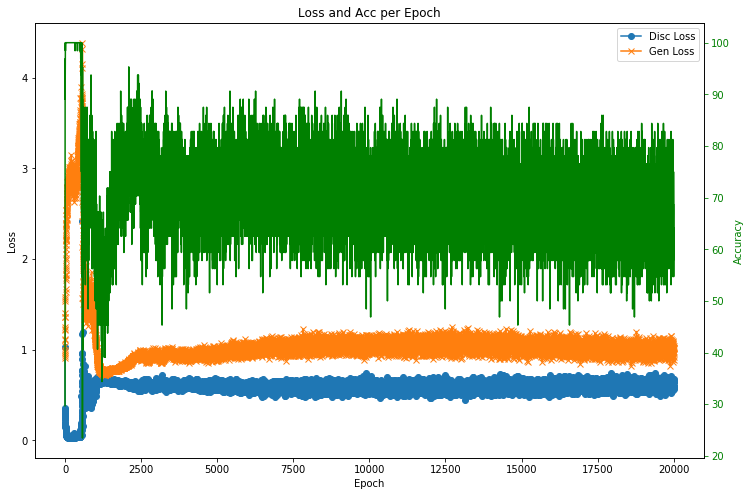

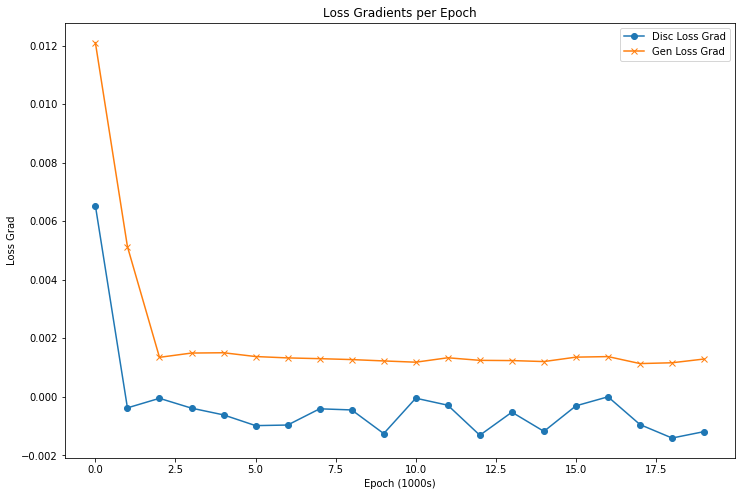

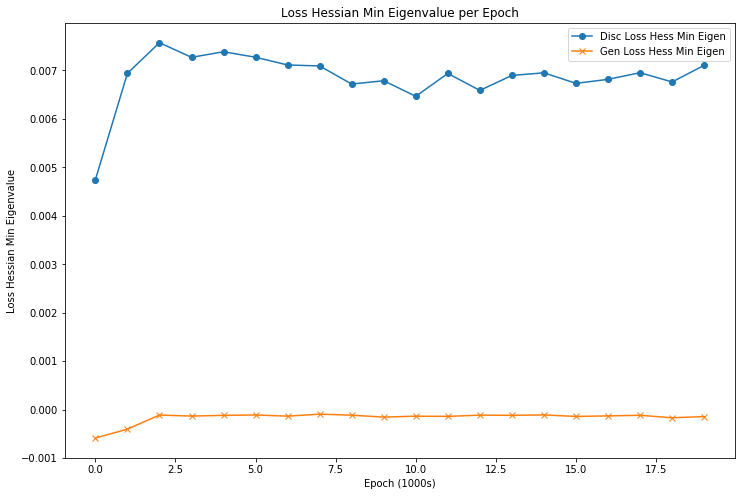

In [399]:
##### SGD with gamma -> inf #####
# learning_rate = 0.01
# momentum = 0
# decay_rate = 0.0001 # Decay rate is how we are going to achieve inf-GD
# nest = False # Nesterov's acceleration
##############################

# Initialize GAN object
opt_params = ['sgd', 0.01, 0, 0.0001, False, 'sgd_lr0.01_decay0.0001']
gan_inf_2 = GAN(opt_params)

# Train GAN
gan_inf_2_hist = gan_inf_2.train(epochs=20000, batch_size=32, sample_interval=1000)

# Plot of performance results (training and validation accuracies and loss) for every epoch
plt.rcParams['figure.figsize'] = (12, 8)
plot_loss_acc(gan_inf_2_hist)
plot_loss_gradient(gan_inf_2_hist)
plot_loss_hessian_eig(gan_inf_2_hist)

hello
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_20 (Flatten)         (None, 784)               0         
_________________________________________________________________
dense_140 (Dense)            (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_100 (LeakyReLU)  (None, 512)               0         
_________________________________________________________________
dense_141 (Dense)            (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_101 (LeakyReLU)  (None, 256)               0         
_________________________________________________________________
dense_142 (Dense)            (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________________________

95 [D loss: 0.270065, acc.: 93.75%] [G loss: 1.067045]
96 [D loss: 0.284725, acc.: 90.62%] [G loss: 1.083271]
97 [D loss: 0.272253, acc.: 93.75%] [G loss: 1.097144]
98 [D loss: 0.254180, acc.: 95.31%] [G loss: 1.099667]
99 [D loss: 0.234303, acc.: 96.88%] [G loss: 1.079664]
100 [D loss: 0.255992, acc.: 98.44%] [G loss: 1.077244]
101 [D loss: 0.248289, acc.: 93.75%] [G loss: 1.078066]
102 [D loss: 0.223508, acc.: 98.44%] [G loss: 1.093383]
103 [D loss: 0.244156, acc.: 96.88%] [G loss: 1.097970]
104 [D loss: 0.246780, acc.: 96.88%] [G loss: 1.126778]
105 [D loss: 0.237120, acc.: 95.31%] [G loss: 1.083170]
106 [D loss: 0.243886, acc.: 95.31%] [G loss: 1.111339]
107 [D loss: 0.256494, acc.: 96.88%] [G loss: 1.075795]
108 [D loss: 0.222785, acc.: 98.44%] [G loss: 1.119394]
109 [D loss: 0.218422, acc.: 100.00%] [G loss: 1.172107]
110 [D loss: 0.238234, acc.: 96.88%] [G loss: 1.183918]
111 [D loss: 0.232545, acc.: 96.88%] [G loss: 1.195938]
112 [D loss: 0.223441, acc.: 92.19%] [G loss: 1.0939

240 [D loss: 0.115424, acc.: 100.00%] [G loss: 1.698298]
241 [D loss: 0.124656, acc.: 100.00%] [G loss: 1.769227]
242 [D loss: 0.109244, acc.: 100.00%] [G loss: 1.765561]
243 [D loss: 0.103949, acc.: 100.00%] [G loss: 1.763423]
244 [D loss: 0.112726, acc.: 100.00%] [G loss: 1.818712]
245 [D loss: 0.121788, acc.: 100.00%] [G loss: 1.812301]
246 [D loss: 0.102280, acc.: 100.00%] [G loss: 1.787073]
247 [D loss: 0.124940, acc.: 100.00%] [G loss: 1.945416]
248 [D loss: 0.116066, acc.: 100.00%] [G loss: 1.820765]
249 [D loss: 0.101889, acc.: 100.00%] [G loss: 1.810874]
250 [D loss: 0.106693, acc.: 100.00%] [G loss: 1.841896]
251 [D loss: 0.108097, acc.: 100.00%] [G loss: 1.776167]
252 [D loss: 0.104145, acc.: 100.00%] [G loss: 1.794074]
253 [D loss: 0.100750, acc.: 100.00%] [G loss: 1.847775]
254 [D loss: 0.105369, acc.: 100.00%] [G loss: 1.900020]
255 [D loss: 0.120602, acc.: 100.00%] [G loss: 1.877997]
256 [D loss: 0.118957, acc.: 100.00%] [G loss: 1.861344]
257 [D loss: 0.100647, acc.: 10

385 [D loss: 0.069304, acc.: 100.00%] [G loss: 2.241763]
386 [D loss: 0.063778, acc.: 100.00%] [G loss: 2.209767]
387 [D loss: 0.060201, acc.: 100.00%] [G loss: 2.201916]
388 [D loss: 0.062204, acc.: 100.00%] [G loss: 2.238770]
389 [D loss: 0.067057, acc.: 100.00%] [G loss: 2.206440]
390 [D loss: 0.066427, acc.: 100.00%] [G loss: 2.291614]
391 [D loss: 0.080260, acc.: 100.00%] [G loss: 2.262506]
392 [D loss: 0.068415, acc.: 100.00%] [G loss: 2.227108]
393 [D loss: 0.073661, acc.: 100.00%] [G loss: 2.265810]
394 [D loss: 0.068188, acc.: 100.00%] [G loss: 2.206457]
395 [D loss: 0.068934, acc.: 100.00%] [G loss: 2.304137]
396 [D loss: 0.077840, acc.: 100.00%] [G loss: 2.289231]
397 [D loss: 0.073475, acc.: 100.00%] [G loss: 2.309717]
398 [D loss: 0.076326, acc.: 100.00%] [G loss: 2.304781]
399 [D loss: 0.085604, acc.: 100.00%] [G loss: 2.307050]
400 [D loss: 0.068553, acc.: 100.00%] [G loss: 2.292994]
401 [D loss: 0.068596, acc.: 100.00%] [G loss: 2.283596]
402 [D loss: 0.071071, acc.: 10

529 [D loss: 0.043119, acc.: 100.00%] [G loss: 2.573862]
530 [D loss: 0.052878, acc.: 100.00%] [G loss: 2.560678]
531 [D loss: 0.048931, acc.: 100.00%] [G loss: 2.396131]
532 [D loss: 0.050856, acc.: 100.00%] [G loss: 2.546621]
533 [D loss: 0.050026, acc.: 100.00%] [G loss: 2.455349]
534 [D loss: 0.048580, acc.: 100.00%] [G loss: 2.478806]
535 [D loss: 0.052847, acc.: 100.00%] [G loss: 2.561652]
536 [D loss: 0.050873, acc.: 100.00%] [G loss: 2.592673]
537 [D loss: 0.051962, acc.: 100.00%] [G loss: 2.505639]
538 [D loss: 0.055192, acc.: 100.00%] [G loss: 2.526305]
539 [D loss: 0.056237, acc.: 100.00%] [G loss: 2.576455]
540 [D loss: 0.047766, acc.: 100.00%] [G loss: 2.564327]
541 [D loss: 0.052857, acc.: 100.00%] [G loss: 2.515982]
542 [D loss: 0.056190, acc.: 100.00%] [G loss: 2.516262]
543 [D loss: 0.054550, acc.: 100.00%] [G loss: 2.518459]
544 [D loss: 0.054625, acc.: 100.00%] [G loss: 2.608884]
545 [D loss: 0.047509, acc.: 100.00%] [G loss: 2.510525]
546 [D loss: 0.048075, acc.: 10

674 [D loss: 0.041921, acc.: 100.00%] [G loss: 2.741279]
675 [D loss: 0.038663, acc.: 100.00%] [G loss: 2.697631]
676 [D loss: 0.040131, acc.: 100.00%] [G loss: 2.744517]
677 [D loss: 0.041041, acc.: 100.00%] [G loss: 2.721899]
678 [D loss: 0.040742, acc.: 100.00%] [G loss: 2.691628]
679 [D loss: 0.035945, acc.: 100.00%] [G loss: 2.753143]
680 [D loss: 0.053213, acc.: 100.00%] [G loss: 2.786090]
681 [D loss: 0.043626, acc.: 100.00%] [G loss: 2.831005]
682 [D loss: 0.038345, acc.: 100.00%] [G loss: 2.795963]
683 [D loss: 0.044217, acc.: 100.00%] [G loss: 2.728934]
684 [D loss: 0.042143, acc.: 100.00%] [G loss: 2.824482]
685 [D loss: 0.047034, acc.: 100.00%] [G loss: 2.739630]
686 [D loss: 0.045446, acc.: 100.00%] [G loss: 2.818312]
687 [D loss: 0.040105, acc.: 100.00%] [G loss: 2.756617]
688 [D loss: 0.040785, acc.: 100.00%] [G loss: 2.842195]
689 [D loss: 0.044059, acc.: 100.00%] [G loss: 2.786458]
690 [D loss: 0.050324, acc.: 100.00%] [G loss: 2.860921]
691 [D loss: 0.042787, acc.: 10

819 [D loss: 0.034964, acc.: 100.00%] [G loss: 2.839982]
820 [D loss: 0.031286, acc.: 100.00%] [G loss: 2.816607]
821 [D loss: 0.033932, acc.: 100.00%] [G loss: 2.811804]
822 [D loss: 0.034774, acc.: 100.00%] [G loss: 2.965921]
823 [D loss: 0.039230, acc.: 100.00%] [G loss: 2.855161]
824 [D loss: 0.036417, acc.: 100.00%] [G loss: 2.956114]
825 [D loss: 0.039259, acc.: 100.00%] [G loss: 2.831336]
826 [D loss: 0.030125, acc.: 100.00%] [G loss: 2.899917]
827 [D loss: 0.034768, acc.: 100.00%] [G loss: 2.934458]
828 [D loss: 0.031315, acc.: 100.00%] [G loss: 2.829795]
829 [D loss: 0.032055, acc.: 100.00%] [G loss: 2.969812]
830 [D loss: 0.037552, acc.: 100.00%] [G loss: 2.918061]
831 [D loss: 0.035597, acc.: 100.00%] [G loss: 2.914352]
832 [D loss: 0.031890, acc.: 100.00%] [G loss: 2.879957]
833 [D loss: 0.032993, acc.: 100.00%] [G loss: 2.917887]
834 [D loss: 0.041189, acc.: 100.00%] [G loss: 2.941773]
835 [D loss: 0.034325, acc.: 100.00%] [G loss: 2.978125]
836 [D loss: 0.039452, acc.: 10

963 [D loss: 0.027213, acc.: 100.00%] [G loss: 2.977004]
964 [D loss: 0.031592, acc.: 100.00%] [G loss: 3.079095]
965 [D loss: 0.030443, acc.: 100.00%] [G loss: 2.935827]
966 [D loss: 0.036358, acc.: 100.00%] [G loss: 3.043860]
967 [D loss: 0.032989, acc.: 100.00%] [G loss: 3.071572]
968 [D loss: 0.034160, acc.: 100.00%] [G loss: 3.103786]
969 [D loss: 0.032987, acc.: 100.00%] [G loss: 3.149693]
970 [D loss: 0.026673, acc.: 100.00%] [G loss: 3.157550]
971 [D loss: 0.030403, acc.: 100.00%] [G loss: 3.007525]
972 [D loss: 0.034514, acc.: 100.00%] [G loss: 3.131091]
973 [D loss: 0.034278, acc.: 100.00%] [G loss: 3.141217]
974 [D loss: 0.028046, acc.: 100.00%] [G loss: 3.035679]
975 [D loss: 0.031725, acc.: 100.00%] [G loss: 2.994096]
976 [D loss: 0.034357, acc.: 100.00%] [G loss: 3.016567]
977 [D loss: 0.034893, acc.: 100.00%] [G loss: 3.102701]
978 [D loss: 0.029900, acc.: 100.00%] [G loss: 3.111338]
979 [D loss: 0.030057, acc.: 100.00%] [G loss: 3.123221]
980 [D loss: 0.029685, acc.: 10

1105 [D loss: 0.028630, acc.: 100.00%] [G loss: 3.133861]
1106 [D loss: 0.031440, acc.: 100.00%] [G loss: 3.163643]
1107 [D loss: 0.028192, acc.: 100.00%] [G loss: 3.123773]
1108 [D loss: 0.030157, acc.: 100.00%] [G loss: 3.203030]
1109 [D loss: 0.026493, acc.: 100.00%] [G loss: 3.089658]
1110 [D loss: 0.026829, acc.: 100.00%] [G loss: 3.170170]
1111 [D loss: 0.032852, acc.: 100.00%] [G loss: 3.119411]
1112 [D loss: 0.025953, acc.: 100.00%] [G loss: 3.165916]
1113 [D loss: 0.034389, acc.: 100.00%] [G loss: 3.258092]
1114 [D loss: 0.028789, acc.: 100.00%] [G loss: 3.208398]
1115 [D loss: 0.029519, acc.: 100.00%] [G loss: 3.102408]
1116 [D loss: 0.026027, acc.: 100.00%] [G loss: 3.266991]
1117 [D loss: 0.026901, acc.: 100.00%] [G loss: 3.189703]
1118 [D loss: 0.034320, acc.: 100.00%] [G loss: 3.113690]
1119 [D loss: 0.028947, acc.: 100.00%] [G loss: 3.218864]
1120 [D loss: 0.027862, acc.: 100.00%] [G loss: 3.124288]
1121 [D loss: 0.019907, acc.: 100.00%] [G loss: 3.289433]
1122 [D loss: 

1250 [D loss: 0.022941, acc.: 100.00%] [G loss: 3.147768]
1251 [D loss: 0.024137, acc.: 100.00%] [G loss: 3.130909]
1252 [D loss: 0.032095, acc.: 100.00%] [G loss: 3.315161]
1253 [D loss: 0.023190, acc.: 100.00%] [G loss: 3.345668]
1254 [D loss: 0.027403, acc.: 100.00%] [G loss: 3.364855]
1255 [D loss: 0.022791, acc.: 100.00%] [G loss: 3.213388]
1256 [D loss: 0.022655, acc.: 100.00%] [G loss: 3.303672]
1257 [D loss: 0.026884, acc.: 100.00%] [G loss: 3.289721]
1258 [D loss: 0.020221, acc.: 100.00%] [G loss: 3.177476]
1259 [D loss: 0.021079, acc.: 100.00%] [G loss: 3.290812]
1260 [D loss: 0.022907, acc.: 100.00%] [G loss: 3.226322]
1261 [D loss: 0.023499, acc.: 100.00%] [G loss: 3.154291]
1262 [D loss: 0.023947, acc.: 100.00%] [G loss: 3.295031]
1263 [D loss: 0.023526, acc.: 100.00%] [G loss: 3.239290]
1264 [D loss: 0.021614, acc.: 100.00%] [G loss: 3.301330]
1265 [D loss: 0.024042, acc.: 100.00%] [G loss: 3.302082]
1266 [D loss: 0.023865, acc.: 100.00%] [G loss: 3.295146]
1267 [D loss: 

1394 [D loss: 0.022338, acc.: 100.00%] [G loss: 3.339320]
1395 [D loss: 0.021943, acc.: 100.00%] [G loss: 3.341340]
1396 [D loss: 0.023176, acc.: 100.00%] [G loss: 3.440026]
1397 [D loss: 0.024067, acc.: 100.00%] [G loss: 3.347821]
1398 [D loss: 0.025321, acc.: 100.00%] [G loss: 3.364650]
1399 [D loss: 0.020926, acc.: 100.00%] [G loss: 3.451227]
1400 [D loss: 0.024999, acc.: 100.00%] [G loss: 3.281785]
1401 [D loss: 0.024867, acc.: 100.00%] [G loss: 3.291263]
1402 [D loss: 0.021326, acc.: 100.00%] [G loss: 3.355849]
1403 [D loss: 0.025172, acc.: 100.00%] [G loss: 3.375210]
1404 [D loss: 0.022226, acc.: 100.00%] [G loss: 3.349738]
1405 [D loss: 0.022590, acc.: 100.00%] [G loss: 3.313679]
1406 [D loss: 0.021930, acc.: 100.00%] [G loss: 3.287362]
1407 [D loss: 0.017877, acc.: 100.00%] [G loss: 3.384086]
1408 [D loss: 0.024494, acc.: 100.00%] [G loss: 3.218119]
1409 [D loss: 0.023637, acc.: 100.00%] [G loss: 3.305168]
1410 [D loss: 0.021612, acc.: 100.00%] [G loss: 3.393013]
1411 [D loss: 

1538 [D loss: 0.023663, acc.: 100.00%] [G loss: 3.568564]
1539 [D loss: 0.021770, acc.: 100.00%] [G loss: 3.487188]
1540 [D loss: 0.024611, acc.: 100.00%] [G loss: 3.343978]
1541 [D loss: 0.024769, acc.: 100.00%] [G loss: 3.387786]
1542 [D loss: 0.021935, acc.: 100.00%] [G loss: 3.390917]
1543 [D loss: 0.023537, acc.: 100.00%] [G loss: 3.335702]
1544 [D loss: 0.019821, acc.: 100.00%] [G loss: 3.449915]
1545 [D loss: 0.025472, acc.: 100.00%] [G loss: 3.427044]
1546 [D loss: 0.023638, acc.: 100.00%] [G loss: 3.466523]
1547 [D loss: 0.020665, acc.: 100.00%] [G loss: 3.355134]
1548 [D loss: 0.026008, acc.: 100.00%] [G loss: 3.391658]
1549 [D loss: 0.023571, acc.: 100.00%] [G loss: 3.393909]
1550 [D loss: 0.024146, acc.: 100.00%] [G loss: 3.451159]
1551 [D loss: 0.026332, acc.: 100.00%] [G loss: 3.414677]
1552 [D loss: 0.018487, acc.: 100.00%] [G loss: 3.497542]
1553 [D loss: 0.020264, acc.: 100.00%] [G loss: 3.458453]
1554 [D loss: 0.016796, acc.: 100.00%] [G loss: 3.496474]
1555 [D loss: 

1682 [D loss: 0.020806, acc.: 100.00%] [G loss: 3.540263]
1683 [D loss: 0.017944, acc.: 100.00%] [G loss: 3.487933]
1684 [D loss: 0.020919, acc.: 100.00%] [G loss: 3.661444]
1685 [D loss: 0.022843, acc.: 100.00%] [G loss: 3.542868]
1686 [D loss: 0.019237, acc.: 100.00%] [G loss: 3.551167]
1687 [D loss: 0.018439, acc.: 100.00%] [G loss: 3.432618]
1688 [D loss: 0.019595, acc.: 100.00%] [G loss: 3.484324]
1689 [D loss: 0.019461, acc.: 100.00%] [G loss: 3.514717]
1690 [D loss: 0.014734, acc.: 100.00%] [G loss: 3.467185]
1691 [D loss: 0.018973, acc.: 100.00%] [G loss: 3.418037]
1692 [D loss: 0.018137, acc.: 100.00%] [G loss: 3.516737]
1693 [D loss: 0.021271, acc.: 100.00%] [G loss: 3.496253]
1694 [D loss: 0.016922, acc.: 100.00%] [G loss: 3.559188]
1695 [D loss: 0.018975, acc.: 100.00%] [G loss: 3.443734]
1696 [D loss: 0.017889, acc.: 100.00%] [G loss: 3.506649]
1697 [D loss: 0.020142, acc.: 100.00%] [G loss: 3.504978]
1698 [D loss: 0.024021, acc.: 100.00%] [G loss: 3.464293]
1699 [D loss: 

1827 [D loss: 0.021160, acc.: 100.00%] [G loss: 3.595626]
1828 [D loss: 0.017233, acc.: 100.00%] [G loss: 3.654836]
1829 [D loss: 0.019947, acc.: 100.00%] [G loss: 3.530221]
1830 [D loss: 0.017356, acc.: 100.00%] [G loss: 3.589095]
1831 [D loss: 0.019911, acc.: 100.00%] [G loss: 3.611835]
1832 [D loss: 0.018682, acc.: 100.00%] [G loss: 3.602094]
1833 [D loss: 0.016606, acc.: 100.00%] [G loss: 3.623198]
1834 [D loss: 0.019039, acc.: 100.00%] [G loss: 3.610635]
1835 [D loss: 0.020591, acc.: 100.00%] [G loss: 3.575193]
1836 [D loss: 0.018226, acc.: 100.00%] [G loss: 3.566751]
1837 [D loss: 0.019161, acc.: 100.00%] [G loss: 3.558724]
1838 [D loss: 0.019526, acc.: 100.00%] [G loss: 3.635943]
1839 [D loss: 0.020004, acc.: 100.00%] [G loss: 3.628771]
1840 [D loss: 0.019791, acc.: 100.00%] [G loss: 3.668262]
1841 [D loss: 0.019380, acc.: 100.00%] [G loss: 3.451671]
1842 [D loss: 0.023705, acc.: 100.00%] [G loss: 3.508875]
1843 [D loss: 0.018269, acc.: 100.00%] [G loss: 3.591922]
1844 [D loss: 

1973 [D loss: 0.015300, acc.: 100.00%] [G loss: 3.553660]
1974 [D loss: 0.016130, acc.: 100.00%] [G loss: 3.647829]
1975 [D loss: 0.018871, acc.: 100.00%] [G loss: 3.630597]
1976 [D loss: 0.016236, acc.: 100.00%] [G loss: 3.633578]
1977 [D loss: 0.018484, acc.: 100.00%] [G loss: 3.553068]
1978 [D loss: 0.021377, acc.: 100.00%] [G loss: 3.656677]
1979 [D loss: 0.018992, acc.: 100.00%] [G loss: 3.585756]
1980 [D loss: 0.018133, acc.: 100.00%] [G loss: 3.609312]
1981 [D loss: 0.017927, acc.: 100.00%] [G loss: 3.659570]
1982 [D loss: 0.014571, acc.: 100.00%] [G loss: 3.661125]
1983 [D loss: 0.020731, acc.: 100.00%] [G loss: 3.574898]
1984 [D loss: 0.023832, acc.: 100.00%] [G loss: 3.590199]
1985 [D loss: 0.015829, acc.: 100.00%] [G loss: 3.656641]
1986 [D loss: 0.015793, acc.: 100.00%] [G loss: 3.605515]
1987 [D loss: 0.018576, acc.: 100.00%] [G loss: 3.701159]
1988 [D loss: 0.015844, acc.: 100.00%] [G loss: 3.574406]
1989 [D loss: 0.021887, acc.: 100.00%] [G loss: 3.729586]
1990 [D loss: 

2115 [D loss: 0.019373, acc.: 100.00%] [G loss: 3.611384]
2116 [D loss: 0.017681, acc.: 100.00%] [G loss: 3.685807]
2117 [D loss: 0.015590, acc.: 100.00%] [G loss: 3.585297]
2118 [D loss: 0.016009, acc.: 100.00%] [G loss: 3.701616]
2119 [D loss: 0.017152, acc.: 100.00%] [G loss: 3.725602]
2120 [D loss: 0.015229, acc.: 100.00%] [G loss: 3.652018]
2121 [D loss: 0.024995, acc.: 100.00%] [G loss: 3.649344]
2122 [D loss: 0.015874, acc.: 100.00%] [G loss: 3.774979]
2123 [D loss: 0.019431, acc.: 100.00%] [G loss: 3.641776]
2124 [D loss: 0.022491, acc.: 100.00%] [G loss: 3.571011]
2125 [D loss: 0.020364, acc.: 100.00%] [G loss: 3.707870]
2126 [D loss: 0.017170, acc.: 100.00%] [G loss: 3.778680]
2127 [D loss: 0.014594, acc.: 100.00%] [G loss: 3.646228]
2128 [D loss: 0.015963, acc.: 100.00%] [G loss: 3.744678]
2129 [D loss: 0.015637, acc.: 100.00%] [G loss: 3.646370]
2130 [D loss: 0.014161, acc.: 100.00%] [G loss: 3.728221]
2131 [D loss: 0.019868, acc.: 100.00%] [G loss: 3.663651]
2132 [D loss: 

2260 [D loss: 0.017001, acc.: 100.00%] [G loss: 3.821370]
2261 [D loss: 0.016253, acc.: 100.00%] [G loss: 3.775150]
2262 [D loss: 0.016379, acc.: 100.00%] [G loss: 3.692954]
2263 [D loss: 0.023343, acc.: 100.00%] [G loss: 3.744035]
2264 [D loss: 0.014622, acc.: 100.00%] [G loss: 3.710428]
2265 [D loss: 0.016808, acc.: 100.00%] [G loss: 3.818693]
2266 [D loss: 0.017203, acc.: 100.00%] [G loss: 3.803406]
2267 [D loss: 0.017511, acc.: 100.00%] [G loss: 3.783111]
2268 [D loss: 0.011637, acc.: 100.00%] [G loss: 3.729325]
2269 [D loss: 0.015393, acc.: 100.00%] [G loss: 3.700849]
2270 [D loss: 0.015450, acc.: 100.00%] [G loss: 3.861942]
2271 [D loss: 0.014592, acc.: 100.00%] [G loss: 3.832350]
2272 [D loss: 0.016357, acc.: 100.00%] [G loss: 3.743512]
2273 [D loss: 0.014410, acc.: 100.00%] [G loss: 3.781723]
2274 [D loss: 0.017380, acc.: 100.00%] [G loss: 3.733840]
2275 [D loss: 0.013594, acc.: 100.00%] [G loss: 3.909089]
2276 [D loss: 0.017740, acc.: 100.00%] [G loss: 3.685424]
2277 [D loss: 

2405 [D loss: 0.017293, acc.: 100.00%] [G loss: 3.818161]
2406 [D loss: 0.014331, acc.: 100.00%] [G loss: 3.625852]
2407 [D loss: 0.015580, acc.: 100.00%] [G loss: 3.729406]
2408 [D loss: 0.017258, acc.: 100.00%] [G loss: 3.842759]
2409 [D loss: 0.015190, acc.: 100.00%] [G loss: 3.747909]
2410 [D loss: 0.016761, acc.: 100.00%] [G loss: 3.821137]
2411 [D loss: 0.015313, acc.: 100.00%] [G loss: 3.832865]
2412 [D loss: 0.016979, acc.: 100.00%] [G loss: 3.814116]
2413 [D loss: 0.013565, acc.: 100.00%] [G loss: 3.773836]
2414 [D loss: 0.018472, acc.: 100.00%] [G loss: 3.921928]
2415 [D loss: 0.015360, acc.: 100.00%] [G loss: 3.757591]
2416 [D loss: 0.016522, acc.: 100.00%] [G loss: 3.699614]
2417 [D loss: 0.025536, acc.: 100.00%] [G loss: 3.678669]
2418 [D loss: 0.019773, acc.: 100.00%] [G loss: 3.796543]
2419 [D loss: 0.017545, acc.: 100.00%] [G loss: 3.740503]
2420 [D loss: 0.013758, acc.: 100.00%] [G loss: 3.913011]
2421 [D loss: 0.015792, acc.: 100.00%] [G loss: 3.828049]
2422 [D loss: 

2550 [D loss: 0.017066, acc.: 100.00%] [G loss: 3.762742]
2551 [D loss: 0.016389, acc.: 100.00%] [G loss: 3.872372]
2552 [D loss: 0.016582, acc.: 100.00%] [G loss: 3.766575]
2553 [D loss: 0.016283, acc.: 100.00%] [G loss: 3.741545]
2554 [D loss: 0.016515, acc.: 100.00%] [G loss: 3.769335]
2555 [D loss: 0.016431, acc.: 100.00%] [G loss: 3.703023]
2556 [D loss: 0.014537, acc.: 100.00%] [G loss: 3.681996]
2557 [D loss: 0.017550, acc.: 100.00%] [G loss: 3.834517]
2558 [D loss: 0.014450, acc.: 100.00%] [G loss: 3.792243]
2559 [D loss: 0.013613, acc.: 100.00%] [G loss: 3.891968]
2560 [D loss: 0.015229, acc.: 100.00%] [G loss: 3.825159]
2561 [D loss: 0.017548, acc.: 100.00%] [G loss: 3.798174]
2562 [D loss: 0.012151, acc.: 100.00%] [G loss: 3.799060]
2563 [D loss: 0.014846, acc.: 100.00%] [G loss: 3.945772]
2564 [D loss: 0.014892, acc.: 100.00%] [G loss: 3.911023]
2565 [D loss: 0.011846, acc.: 100.00%] [G loss: 3.829673]
2566 [D loss: 0.012762, acc.: 100.00%] [G loss: 3.768342]
2567 [D loss: 

2695 [D loss: 0.013739, acc.: 100.00%] [G loss: 3.915372]
2696 [D loss: 0.016522, acc.: 100.00%] [G loss: 3.996928]
2697 [D loss: 0.016782, acc.: 100.00%] [G loss: 3.851234]
2698 [D loss: 0.015062, acc.: 100.00%] [G loss: 3.691074]
2699 [D loss: 0.015886, acc.: 100.00%] [G loss: 3.815667]
2700 [D loss: 0.013100, acc.: 100.00%] [G loss: 3.905945]
2701 [D loss: 0.012719, acc.: 100.00%] [G loss: 3.956370]
2702 [D loss: 0.013765, acc.: 100.00%] [G loss: 3.873342]
2703 [D loss: 0.012795, acc.: 100.00%] [G loss: 3.972117]
2704 [D loss: 0.014423, acc.: 100.00%] [G loss: 3.971216]
2705 [D loss: 0.014330, acc.: 100.00%] [G loss: 3.965673]
2706 [D loss: 0.011900, acc.: 100.00%] [G loss: 3.752293]
2707 [D loss: 0.014305, acc.: 100.00%] [G loss: 3.904020]
2708 [D loss: 0.013547, acc.: 100.00%] [G loss: 3.949251]
2709 [D loss: 0.012377, acc.: 100.00%] [G loss: 3.801674]
2710 [D loss: 0.015337, acc.: 100.00%] [G loss: 3.874986]
2711 [D loss: 0.011562, acc.: 100.00%] [G loss: 3.882605]
2712 [D loss: 

2840 [D loss: 0.015326, acc.: 100.00%] [G loss: 3.879220]
2841 [D loss: 0.013367, acc.: 100.00%] [G loss: 3.987765]
2842 [D loss: 0.012687, acc.: 100.00%] [G loss: 3.854021]
2843 [D loss: 0.015128, acc.: 100.00%] [G loss: 3.880906]
2844 [D loss: 0.018961, acc.: 100.00%] [G loss: 3.983759]
2845 [D loss: 0.012791, acc.: 100.00%] [G loss: 4.006402]
2846 [D loss: 0.014001, acc.: 100.00%] [G loss: 3.881995]
2847 [D loss: 0.013127, acc.: 100.00%] [G loss: 3.881221]
2848 [D loss: 0.012937, acc.: 100.00%] [G loss: 3.956127]
2849 [D loss: 0.015032, acc.: 100.00%] [G loss: 3.945786]
2850 [D loss: 0.012878, acc.: 100.00%] [G loss: 3.864304]
2851 [D loss: 0.014101, acc.: 100.00%] [G loss: 3.891745]
2852 [D loss: 0.017383, acc.: 100.00%] [G loss: 3.813543]
2853 [D loss: 0.017556, acc.: 100.00%] [G loss: 3.883899]
2854 [D loss: 0.015352, acc.: 100.00%] [G loss: 3.949185]
2855 [D loss: 0.012615, acc.: 100.00%] [G loss: 3.988346]
2856 [D loss: 0.012898, acc.: 100.00%] [G loss: 3.860510]
2857 [D loss: 

2985 [D loss: 0.013519, acc.: 100.00%] [G loss: 3.918323]
2986 [D loss: 0.011362, acc.: 100.00%] [G loss: 4.042809]
2987 [D loss: 0.014212, acc.: 100.00%] [G loss: 3.957194]
2988 [D loss: 0.017663, acc.: 100.00%] [G loss: 3.951840]
2989 [D loss: 0.017125, acc.: 100.00%] [G loss: 3.997555]
2990 [D loss: 0.015113, acc.: 100.00%] [G loss: 3.911920]
2991 [D loss: 0.013917, acc.: 100.00%] [G loss: 3.961819]
2992 [D loss: 0.014162, acc.: 100.00%] [G loss: 3.917894]
2993 [D loss: 0.017958, acc.: 100.00%] [G loss: 3.971512]
2994 [D loss: 0.015407, acc.: 100.00%] [G loss: 4.127951]
2995 [D loss: 0.011889, acc.: 100.00%] [G loss: 3.882603]
2996 [D loss: 0.012379, acc.: 100.00%] [G loss: 4.005838]
2997 [D loss: 0.014110, acc.: 100.00%] [G loss: 3.984949]
2998 [D loss: 0.013135, acc.: 100.00%] [G loss: 3.941635]
2999 [D loss: 0.016199, acc.: 100.00%] [G loss: 3.931584]
3000 [D loss: 0.012337, acc.: 100.00%] [G loss: 4.069328]
Discriminator gradients:  0.00025517828
Generator gradients:  0.02212139

3126 [D loss: 0.012779, acc.: 100.00%] [G loss: 3.928071]
3127 [D loss: 0.012112, acc.: 100.00%] [G loss: 3.979108]
3128 [D loss: 0.012271, acc.: 100.00%] [G loss: 3.936280]
3129 [D loss: 0.012311, acc.: 100.00%] [G loss: 4.073444]
3130 [D loss: 0.013727, acc.: 100.00%] [G loss: 4.027541]
3131 [D loss: 0.012037, acc.: 100.00%] [G loss: 3.862872]
3132 [D loss: 0.013134, acc.: 100.00%] [G loss: 3.970556]
3133 [D loss: 0.011893, acc.: 100.00%] [G loss: 4.049982]
3134 [D loss: 0.011096, acc.: 100.00%] [G loss: 3.982777]
3135 [D loss: 0.012421, acc.: 100.00%] [G loss: 4.009234]
3136 [D loss: 0.011614, acc.: 100.00%] [G loss: 4.035058]
3137 [D loss: 0.014682, acc.: 100.00%] [G loss: 3.991832]
3138 [D loss: 0.012552, acc.: 100.00%] [G loss: 3.988095]
3139 [D loss: 0.011657, acc.: 100.00%] [G loss: 3.968745]
3140 [D loss: 0.011928, acc.: 100.00%] [G loss: 3.969022]
3141 [D loss: 0.011094, acc.: 100.00%] [G loss: 3.996069]
3142 [D loss: 0.009574, acc.: 100.00%] [G loss: 3.906020]
3143 [D loss: 

3268 [D loss: 0.015377, acc.: 100.00%] [G loss: 4.161318]
3269 [D loss: 0.014957, acc.: 100.00%] [G loss: 4.064322]
3270 [D loss: 0.012816, acc.: 100.00%] [G loss: 3.992447]
3271 [D loss: 0.010207, acc.: 100.00%] [G loss: 3.981189]
3272 [D loss: 0.015516, acc.: 100.00%] [G loss: 3.967134]
3273 [D loss: 0.015260, acc.: 100.00%] [G loss: 3.915370]
3274 [D loss: 0.013082, acc.: 100.00%] [G loss: 4.036888]
3275 [D loss: 0.013119, acc.: 100.00%] [G loss: 4.147326]
3276 [D loss: 0.012583, acc.: 100.00%] [G loss: 3.974339]
3277 [D loss: 0.012576, acc.: 100.00%] [G loss: 3.923146]
3278 [D loss: 0.011837, acc.: 100.00%] [G loss: 4.095583]
3279 [D loss: 0.012678, acc.: 100.00%] [G loss: 4.100567]
3280 [D loss: 0.011749, acc.: 100.00%] [G loss: 4.029203]
3281 [D loss: 0.012058, acc.: 100.00%] [G loss: 4.124227]
3282 [D loss: 0.013405, acc.: 100.00%] [G loss: 4.024663]
3283 [D loss: 0.013604, acc.: 100.00%] [G loss: 3.929306]
3284 [D loss: 0.011446, acc.: 100.00%] [G loss: 4.062892]
3285 [D loss: 

3413 [D loss: 0.010639, acc.: 100.00%] [G loss: 3.989309]
3414 [D loss: 0.011974, acc.: 100.00%] [G loss: 4.157251]
3415 [D loss: 0.013693, acc.: 100.00%] [G loss: 4.071980]
3416 [D loss: 0.017120, acc.: 100.00%] [G loss: 4.077817]
3417 [D loss: 0.011626, acc.: 100.00%] [G loss: 4.085055]
3418 [D loss: 0.017620, acc.: 100.00%] [G loss: 4.045718]
3419 [D loss: 0.009844, acc.: 100.00%] [G loss: 4.018477]
3420 [D loss: 0.011544, acc.: 100.00%] [G loss: 4.144079]
3421 [D loss: 0.010979, acc.: 100.00%] [G loss: 4.058761]
3422 [D loss: 0.012569, acc.: 100.00%] [G loss: 4.075450]
3423 [D loss: 0.014145, acc.: 100.00%] [G loss: 4.078099]
3424 [D loss: 0.012581, acc.: 100.00%] [G loss: 4.054287]
3425 [D loss: 0.014626, acc.: 100.00%] [G loss: 3.985669]
3426 [D loss: 0.014276, acc.: 100.00%] [G loss: 4.069248]
3427 [D loss: 0.011365, acc.: 100.00%] [G loss: 4.066843]
3428 [D loss: 0.014958, acc.: 100.00%] [G loss: 4.179688]
3429 [D loss: 0.013481, acc.: 100.00%] [G loss: 4.010669]
3430 [D loss: 

3557 [D loss: 0.011759, acc.: 100.00%] [G loss: 4.028299]
3558 [D loss: 0.011444, acc.: 100.00%] [G loss: 4.180822]
3559 [D loss: 0.010637, acc.: 100.00%] [G loss: 4.118990]
3560 [D loss: 0.012350, acc.: 100.00%] [G loss: 4.070743]
3561 [D loss: 0.014556, acc.: 100.00%] [G loss: 3.965982]
3562 [D loss: 0.013135, acc.: 100.00%] [G loss: 4.018631]
3563 [D loss: 0.013382, acc.: 100.00%] [G loss: 4.201655]
3564 [D loss: 0.015723, acc.: 100.00%] [G loss: 4.082529]
3565 [D loss: 0.011103, acc.: 100.00%] [G loss: 4.048142]
3566 [D loss: 0.012408, acc.: 100.00%] [G loss: 4.149164]
3567 [D loss: 0.015736, acc.: 100.00%] [G loss: 4.188477]
3568 [D loss: 0.011112, acc.: 100.00%] [G loss: 3.966182]
3569 [D loss: 0.013522, acc.: 100.00%] [G loss: 4.121012]
3570 [D loss: 0.010909, acc.: 100.00%] [G loss: 4.164395]
3571 [D loss: 0.011792, acc.: 100.00%] [G loss: 4.145134]
3572 [D loss: 0.011961, acc.: 100.00%] [G loss: 4.122375]
3573 [D loss: 0.010254, acc.: 100.00%] [G loss: 4.001439]
3574 [D loss: 

3702 [D loss: 0.008832, acc.: 100.00%] [G loss: 4.106513]
3703 [D loss: 0.013034, acc.: 100.00%] [G loss: 4.165293]
3704 [D loss: 0.017459, acc.: 100.00%] [G loss: 3.970600]
3705 [D loss: 0.012279, acc.: 100.00%] [G loss: 4.031277]
3706 [D loss: 0.009552, acc.: 100.00%] [G loss: 4.067138]
3707 [D loss: 0.016409, acc.: 100.00%] [G loss: 4.125438]
3708 [D loss: 0.009682, acc.: 100.00%] [G loss: 4.273099]
3709 [D loss: 0.013347, acc.: 100.00%] [G loss: 4.075712]
3710 [D loss: 0.014522, acc.: 100.00%] [G loss: 4.162107]
3711 [D loss: 0.012009, acc.: 100.00%] [G loss: 4.167740]
3712 [D loss: 0.009848, acc.: 100.00%] [G loss: 4.069257]
3713 [D loss: 0.013206, acc.: 100.00%] [G loss: 4.060998]
3714 [D loss: 0.012047, acc.: 100.00%] [G loss: 4.103712]
3715 [D loss: 0.014161, acc.: 100.00%] [G loss: 4.190433]
3716 [D loss: 0.010897, acc.: 100.00%] [G loss: 4.231491]
3717 [D loss: 0.012067, acc.: 100.00%] [G loss: 4.117266]
3718 [D loss: 0.009005, acc.: 100.00%] [G loss: 4.053212]
3719 [D loss: 

3846 [D loss: 0.010128, acc.: 100.00%] [G loss: 4.093556]
3847 [D loss: 0.017041, acc.: 100.00%] [G loss: 4.084347]
3848 [D loss: 0.014820, acc.: 100.00%] [G loss: 4.173615]
3849 [D loss: 0.013346, acc.: 100.00%] [G loss: 4.226003]
3850 [D loss: 0.011663, acc.: 100.00%] [G loss: 4.083460]
3851 [D loss: 0.014399, acc.: 100.00%] [G loss: 4.081391]
3852 [D loss: 0.015013, acc.: 100.00%] [G loss: 4.019561]
3853 [D loss: 0.012128, acc.: 100.00%] [G loss: 4.247219]
3854 [D loss: 0.008742, acc.: 100.00%] [G loss: 4.128568]
3855 [D loss: 0.015104, acc.: 100.00%] [G loss: 4.086881]
3856 [D loss: 0.013613, acc.: 100.00%] [G loss: 4.101872]
3857 [D loss: 0.010258, acc.: 100.00%] [G loss: 4.141959]
3858 [D loss: 0.011811, acc.: 100.00%] [G loss: 4.044076]
3859 [D loss: 0.011045, acc.: 100.00%] [G loss: 4.107124]
3860 [D loss: 0.016784, acc.: 100.00%] [G loss: 4.122125]
3861 [D loss: 0.013850, acc.: 100.00%] [G loss: 4.097532]
3862 [D loss: 0.009914, acc.: 100.00%] [G loss: 4.281440]
3863 [D loss: 

3991 [D loss: 0.010712, acc.: 100.00%] [G loss: 4.092385]
3992 [D loss: 0.015308, acc.: 100.00%] [G loss: 4.267402]
3993 [D loss: 0.010160, acc.: 100.00%] [G loss: 4.218301]
3994 [D loss: 0.009861, acc.: 100.00%] [G loss: 4.150599]
3995 [D loss: 0.009659, acc.: 100.00%] [G loss: 4.118999]
3996 [D loss: 0.008216, acc.: 100.00%] [G loss: 4.056660]
3997 [D loss: 0.012078, acc.: 100.00%] [G loss: 4.159013]
3998 [D loss: 0.010328, acc.: 100.00%] [G loss: 4.308216]
3999 [D loss: 0.009316, acc.: 100.00%] [G loss: 4.212172]
4000 [D loss: 0.011564, acc.: 100.00%] [G loss: 4.117908]
Discriminator gradients:  0.0002748474
Generator gradients:  0.02247852
4001 [D loss: 0.011535, acc.: 100.00%] [G loss: 4.300394]
4002 [D loss: 0.013943, acc.: 100.00%] [G loss: 4.122567]
4003 [D loss: 0.009720, acc.: 100.00%] [G loss: 4.188121]
4004 [D loss: 0.011064, acc.: 100.00%] [G loss: 4.246449]
4005 [D loss: 0.013873, acc.: 100.00%] [G loss: 4.270976]
4006 [D loss: 0.012632, acc.: 100.00%] [G loss: 4.280140]


4135 [D loss: 0.012128, acc.: 100.00%] [G loss: 4.200443]
4136 [D loss: 0.010672, acc.: 100.00%] [G loss: 4.114719]
4137 [D loss: 0.011457, acc.: 100.00%] [G loss: 4.205248]
4138 [D loss: 0.010839, acc.: 100.00%] [G loss: 4.004610]
4139 [D loss: 0.009936, acc.: 100.00%] [G loss: 4.206851]
4140 [D loss: 0.009118, acc.: 100.00%] [G loss: 4.070263]
4141 [D loss: 0.010004, acc.: 100.00%] [G loss: 4.366777]
4142 [D loss: 0.010659, acc.: 100.00%] [G loss: 4.239188]
4143 [D loss: 0.011225, acc.: 100.00%] [G loss: 4.223824]
4144 [D loss: 0.011289, acc.: 100.00%] [G loss: 4.300064]
4145 [D loss: 0.009668, acc.: 100.00%] [G loss: 4.225150]
4146 [D loss: 0.012916, acc.: 100.00%] [G loss: 4.301332]
4147 [D loss: 0.009934, acc.: 100.00%] [G loss: 4.062231]
4148 [D loss: 0.011291, acc.: 100.00%] [G loss: 4.234077]
4149 [D loss: 0.012322, acc.: 100.00%] [G loss: 4.227646]
4150 [D loss: 0.009443, acc.: 100.00%] [G loss: 4.068204]
4151 [D loss: 0.011555, acc.: 100.00%] [G loss: 4.214150]
4152 [D loss: 

4280 [D loss: 0.011701, acc.: 100.00%] [G loss: 4.123991]
4281 [D loss: 0.010201, acc.: 100.00%] [G loss: 4.204434]
4282 [D loss: 0.007653, acc.: 100.00%] [G loss: 4.082523]
4283 [D loss: 0.009321, acc.: 100.00%] [G loss: 4.187934]
4284 [D loss: 0.014240, acc.: 100.00%] [G loss: 4.210653]
4285 [D loss: 0.010821, acc.: 100.00%] [G loss: 4.213061]
4286 [D loss: 0.011326, acc.: 100.00%] [G loss: 4.262952]
4287 [D loss: 0.010763, acc.: 100.00%] [G loss: 4.188708]
4288 [D loss: 0.009159, acc.: 100.00%] [G loss: 4.191079]
4289 [D loss: 0.010071, acc.: 100.00%] [G loss: 4.234200]
4290 [D loss: 0.011344, acc.: 100.00%] [G loss: 4.219256]
4291 [D loss: 0.009564, acc.: 100.00%] [G loss: 4.191892]
4292 [D loss: 0.013110, acc.: 100.00%] [G loss: 4.173473]
4293 [D loss: 0.009440, acc.: 100.00%] [G loss: 4.192455]
4294 [D loss: 0.011160, acc.: 100.00%] [G loss: 4.094574]
4295 [D loss: 0.010555, acc.: 100.00%] [G loss: 4.266739]
4296 [D loss: 0.014389, acc.: 100.00%] [G loss: 4.206985]
4297 [D loss: 

4425 [D loss: 0.010781, acc.: 100.00%] [G loss: 4.243736]
4426 [D loss: 0.008801, acc.: 100.00%] [G loss: 4.291032]
4427 [D loss: 0.013785, acc.: 100.00%] [G loss: 4.308756]
4428 [D loss: 0.010654, acc.: 100.00%] [G loss: 4.330540]
4429 [D loss: 0.008911, acc.: 100.00%] [G loss: 4.275647]
4430 [D loss: 0.008553, acc.: 100.00%] [G loss: 4.199371]
4431 [D loss: 0.008202, acc.: 100.00%] [G loss: 4.282296]
4432 [D loss: 0.016866, acc.: 100.00%] [G loss: 4.230734]
4433 [D loss: 0.012645, acc.: 100.00%] [G loss: 4.357718]
4434 [D loss: 0.006996, acc.: 100.00%] [G loss: 4.327517]
4435 [D loss: 0.012867, acc.: 100.00%] [G loss: 4.264686]
4436 [D loss: 0.011258, acc.: 100.00%] [G loss: 4.315481]
4437 [D loss: 0.012792, acc.: 100.00%] [G loss: 4.099270]
4438 [D loss: 0.013371, acc.: 100.00%] [G loss: 4.288764]
4439 [D loss: 0.010417, acc.: 100.00%] [G loss: 4.268518]
4440 [D loss: 0.012069, acc.: 100.00%] [G loss: 4.320923]
4441 [D loss: 0.011109, acc.: 100.00%] [G loss: 4.207150]
4442 [D loss: 

4569 [D loss: 0.011889, acc.: 100.00%] [G loss: 4.312939]
4570 [D loss: 0.009932, acc.: 100.00%] [G loss: 4.171286]
4571 [D loss: 0.010261, acc.: 100.00%] [G loss: 4.300893]
4572 [D loss: 0.008793, acc.: 100.00%] [G loss: 4.279678]
4573 [D loss: 0.012344, acc.: 100.00%] [G loss: 4.366508]
4574 [D loss: 0.011687, acc.: 100.00%] [G loss: 4.305918]
4575 [D loss: 0.009822, acc.: 100.00%] [G loss: 4.305779]
4576 [D loss: 0.012003, acc.: 100.00%] [G loss: 4.329596]
4577 [D loss: 0.011711, acc.: 100.00%] [G loss: 4.204887]
4578 [D loss: 0.010064, acc.: 100.00%] [G loss: 4.260077]
4579 [D loss: 0.011358, acc.: 100.00%] [G loss: 4.227754]
4580 [D loss: 0.010234, acc.: 100.00%] [G loss: 4.331231]
4581 [D loss: 0.013080, acc.: 100.00%] [G loss: 4.312984]
4582 [D loss: 0.011598, acc.: 100.00%] [G loss: 4.292233]
4583 [D loss: 0.012597, acc.: 100.00%] [G loss: 4.299840]
4584 [D loss: 0.008696, acc.: 100.00%] [G loss: 4.340231]
4585 [D loss: 0.011779, acc.: 100.00%] [G loss: 4.211730]
4586 [D loss: 

4715 [D loss: 0.010001, acc.: 100.00%] [G loss: 4.229995]
4716 [D loss: 0.010868, acc.: 100.00%] [G loss: 4.314977]
4717 [D loss: 0.012554, acc.: 100.00%] [G loss: 4.286038]
4718 [D loss: 0.012148, acc.: 100.00%] [G loss: 4.214427]
4719 [D loss: 0.007185, acc.: 100.00%] [G loss: 4.277250]
4720 [D loss: 0.006618, acc.: 100.00%] [G loss: 4.242602]
4721 [D loss: 0.009198, acc.: 100.00%] [G loss: 4.346081]
4722 [D loss: 0.008315, acc.: 100.00%] [G loss: 4.355594]
4723 [D loss: 0.013450, acc.: 100.00%] [G loss: 4.410295]
4724 [D loss: 0.011333, acc.: 100.00%] [G loss: 4.314838]
4725 [D loss: 0.011315, acc.: 100.00%] [G loss: 4.116615]
4726 [D loss: 0.008842, acc.: 100.00%] [G loss: 4.290483]
4727 [D loss: 0.010252, acc.: 100.00%] [G loss: 4.350083]
4728 [D loss: 0.010492, acc.: 100.00%] [G loss: 4.368022]
4729 [D loss: 0.014804, acc.: 100.00%] [G loss: 4.461487]
4730 [D loss: 0.008782, acc.: 100.00%] [G loss: 4.146338]
4731 [D loss: 0.006706, acc.: 100.00%] [G loss: 4.336901]
4732 [D loss: 

4860 [D loss: 0.012375, acc.: 100.00%] [G loss: 4.280285]
4861 [D loss: 0.007772, acc.: 100.00%] [G loss: 4.259133]
4862 [D loss: 0.010753, acc.: 100.00%] [G loss: 4.463513]
4863 [D loss: 0.008908, acc.: 100.00%] [G loss: 4.361734]
4864 [D loss: 0.008321, acc.: 100.00%] [G loss: 4.322263]
4865 [D loss: 0.010974, acc.: 100.00%] [G loss: 4.300022]
4866 [D loss: 0.009136, acc.: 100.00%] [G loss: 4.351439]
4867 [D loss: 0.011592, acc.: 100.00%] [G loss: 4.359707]
4868 [D loss: 0.009529, acc.: 100.00%] [G loss: 4.209995]
4869 [D loss: 0.011938, acc.: 100.00%] [G loss: 4.378598]
4870 [D loss: 0.010102, acc.: 100.00%] [G loss: 4.374671]
4871 [D loss: 0.011105, acc.: 100.00%] [G loss: 4.342623]
4872 [D loss: 0.014746, acc.: 100.00%] [G loss: 4.372992]
4873 [D loss: 0.015242, acc.: 100.00%] [G loss: 4.254059]
4874 [D loss: 0.010242, acc.: 100.00%] [G loss: 4.329288]
4875 [D loss: 0.009920, acc.: 100.00%] [G loss: 4.362706]
4876 [D loss: 0.009127, acc.: 100.00%] [G loss: 4.376173]
4877 [D loss: 

5005 [D loss: 0.012511, acc.: 100.00%] [G loss: 4.301348]
5006 [D loss: 0.010069, acc.: 100.00%] [G loss: 4.405222]
5007 [D loss: 0.008686, acc.: 100.00%] [G loss: 4.345758]
5008 [D loss: 0.011092, acc.: 100.00%] [G loss: 4.293977]
5009 [D loss: 0.008503, acc.: 100.00%] [G loss: 4.448942]
5010 [D loss: 0.010959, acc.: 100.00%] [G loss: 4.519903]
5011 [D loss: 0.008884, acc.: 100.00%] [G loss: 4.351660]
5012 [D loss: 0.009361, acc.: 100.00%] [G loss: 4.298934]
5013 [D loss: 0.013464, acc.: 100.00%] [G loss: 4.175199]
5014 [D loss: 0.011586, acc.: 100.00%] [G loss: 4.146821]
5015 [D loss: 0.011162, acc.: 100.00%] [G loss: 4.342738]
5016 [D loss: 0.011951, acc.: 100.00%] [G loss: 4.438026]
5017 [D loss: 0.011389, acc.: 100.00%] [G loss: 4.318059]
5018 [D loss: 0.011084, acc.: 100.00%] [G loss: 4.318355]
5019 [D loss: 0.010276, acc.: 100.00%] [G loss: 4.321171]
5020 [D loss: 0.009699, acc.: 100.00%] [G loss: 4.229690]
5021 [D loss: 0.011513, acc.: 100.00%] [G loss: 4.400486]
5022 [D loss: 

5150 [D loss: 0.014189, acc.: 100.00%] [G loss: 4.501911]
5151 [D loss: 0.011013, acc.: 100.00%] [G loss: 4.174416]
5152 [D loss: 0.008486, acc.: 100.00%] [G loss: 4.376486]
5153 [D loss: 0.009376, acc.: 100.00%] [G loss: 4.461204]
5154 [D loss: 0.012206, acc.: 100.00%] [G loss: 4.470540]
5155 [D loss: 0.008406, acc.: 100.00%] [G loss: 4.268068]
5156 [D loss: 0.009074, acc.: 100.00%] [G loss: 4.415617]
5157 [D loss: 0.012206, acc.: 100.00%] [G loss: 4.362465]
5158 [D loss: 0.007652, acc.: 100.00%] [G loss: 4.440510]
5159 [D loss: 0.007762, acc.: 100.00%] [G loss: 4.262617]
5160 [D loss: 0.009276, acc.: 100.00%] [G loss: 4.351037]
5161 [D loss: 0.009654, acc.: 100.00%] [G loss: 4.404303]
5162 [D loss: 0.016387, acc.: 100.00%] [G loss: 4.236113]
5163 [D loss: 0.010937, acc.: 100.00%] [G loss: 4.450734]
5164 [D loss: 0.009172, acc.: 100.00%] [G loss: 4.295525]
5165 [D loss: 0.012106, acc.: 100.00%] [G loss: 4.453415]
5166 [D loss: 0.011511, acc.: 100.00%] [G loss: 4.303103]
5167 [D loss: 

5295 [D loss: 0.008934, acc.: 100.00%] [G loss: 4.346501]
5296 [D loss: 0.012143, acc.: 100.00%] [G loss: 4.380629]
5297 [D loss: 0.013160, acc.: 100.00%] [G loss: 4.337317]
5298 [D loss: 0.010464, acc.: 100.00%] [G loss: 4.367497]
5299 [D loss: 0.010711, acc.: 100.00%] [G loss: 4.321333]
5300 [D loss: 0.010353, acc.: 100.00%] [G loss: 4.487998]
5301 [D loss: 0.010809, acc.: 100.00%] [G loss: 4.330494]
5302 [D loss: 0.009407, acc.: 100.00%] [G loss: 4.405408]
5303 [D loss: 0.007207, acc.: 100.00%] [G loss: 4.379229]
5304 [D loss: 0.013891, acc.: 100.00%] [G loss: 4.372504]
5305 [D loss: 0.009661, acc.: 100.00%] [G loss: 4.402909]
5306 [D loss: 0.008322, acc.: 100.00%] [G loss: 4.309489]
5307 [D loss: 0.006676, acc.: 100.00%] [G loss: 4.442012]
5308 [D loss: 0.012478, acc.: 100.00%] [G loss: 4.347517]
5309 [D loss: 0.009726, acc.: 100.00%] [G loss: 4.374501]
5310 [D loss: 0.009996, acc.: 100.00%] [G loss: 4.450022]
5311 [D loss: 0.007457, acc.: 100.00%] [G loss: 4.439074]
5312 [D loss: 

5440 [D loss: 0.007893, acc.: 100.00%] [G loss: 4.480806]
5441 [D loss: 0.008929, acc.: 100.00%] [G loss: 4.250208]
5442 [D loss: 0.010180, acc.: 100.00%] [G loss: 4.454276]
5443 [D loss: 0.007723, acc.: 100.00%] [G loss: 4.389122]
5444 [D loss: 0.013129, acc.: 100.00%] [G loss: 4.506993]
5445 [D loss: 0.009659, acc.: 100.00%] [G loss: 4.286581]
5446 [D loss: 0.012489, acc.: 100.00%] [G loss: 4.373647]
5447 [D loss: 0.011675, acc.: 100.00%] [G loss: 4.569023]
5448 [D loss: 0.011573, acc.: 100.00%] [G loss: 4.448619]
5449 [D loss: 0.015167, acc.: 100.00%] [G loss: 4.402145]
5450 [D loss: 0.008375, acc.: 100.00%] [G loss: 4.435255]
5451 [D loss: 0.010039, acc.: 100.00%] [G loss: 4.434085]
5452 [D loss: 0.008712, acc.: 100.00%] [G loss: 4.422315]
5453 [D loss: 0.009955, acc.: 100.00%] [G loss: 4.469751]
5454 [D loss: 0.008483, acc.: 100.00%] [G loss: 4.410798]
5455 [D loss: 0.009508, acc.: 100.00%] [G loss: 4.490031]
5456 [D loss: 0.007588, acc.: 100.00%] [G loss: 4.525146]
5457 [D loss: 

5585 [D loss: 0.012605, acc.: 100.00%] [G loss: 4.247274]
5586 [D loss: 0.009175, acc.: 100.00%] [G loss: 4.454182]
5587 [D loss: 0.008709, acc.: 100.00%] [G loss: 4.332474]
5588 [D loss: 0.012250, acc.: 100.00%] [G loss: 4.291138]
5589 [D loss: 0.010336, acc.: 100.00%] [G loss: 4.460854]
5590 [D loss: 0.007795, acc.: 100.00%] [G loss: 4.373527]
5591 [D loss: 0.007603, acc.: 100.00%] [G loss: 4.574033]
5592 [D loss: 0.011220, acc.: 100.00%] [G loss: 4.485321]
5593 [D loss: 0.008184, acc.: 100.00%] [G loss: 4.346098]
5594 [D loss: 0.010806, acc.: 100.00%] [G loss: 4.406053]
5595 [D loss: 0.011113, acc.: 100.00%] [G loss: 4.356916]
5596 [D loss: 0.006813, acc.: 100.00%] [G loss: 4.512713]
5597 [D loss: 0.011879, acc.: 100.00%] [G loss: 4.384465]
5598 [D loss: 0.010526, acc.: 100.00%] [G loss: 4.383856]
5599 [D loss: 0.008765, acc.: 100.00%] [G loss: 4.282650]
5600 [D loss: 0.009256, acc.: 100.00%] [G loss: 4.514238]
5601 [D loss: 0.011278, acc.: 100.00%] [G loss: 4.511045]
5602 [D loss: 

5731 [D loss: 0.012170, acc.: 100.00%] [G loss: 4.579837]
5732 [D loss: 0.008222, acc.: 100.00%] [G loss: 4.410838]
5733 [D loss: 0.009113, acc.: 100.00%] [G loss: 4.538981]
5734 [D loss: 0.008929, acc.: 100.00%] [G loss: 4.427880]
5735 [D loss: 0.010277, acc.: 100.00%] [G loss: 4.471302]
5736 [D loss: 0.010285, acc.: 100.00%] [G loss: 4.553003]
5737 [D loss: 0.009338, acc.: 100.00%] [G loss: 4.437016]
5738 [D loss: 0.009914, acc.: 100.00%] [G loss: 4.415541]
5739 [D loss: 0.010517, acc.: 100.00%] [G loss: 4.421299]
5740 [D loss: 0.011507, acc.: 100.00%] [G loss: 4.403756]
5741 [D loss: 0.007580, acc.: 100.00%] [G loss: 4.444860]
5742 [D loss: 0.013441, acc.: 100.00%] [G loss: 4.543142]
5743 [D loss: 0.009108, acc.: 100.00%] [G loss: 4.409950]
5744 [D loss: 0.009201, acc.: 100.00%] [G loss: 4.335704]
5745 [D loss: 0.007761, acc.: 100.00%] [G loss: 4.439919]
5746 [D loss: 0.010143, acc.: 100.00%] [G loss: 4.487267]
5747 [D loss: 0.011888, acc.: 100.00%] [G loss: 4.488319]
5748 [D loss: 

5877 [D loss: 0.007474, acc.: 100.00%] [G loss: 4.578030]
5878 [D loss: 0.011613, acc.: 100.00%] [G loss: 4.551239]
5879 [D loss: 0.009868, acc.: 100.00%] [G loss: 4.367868]
5880 [D loss: 0.010794, acc.: 100.00%] [G loss: 4.599993]
5881 [D loss: 0.006861, acc.: 100.00%] [G loss: 4.418451]
5882 [D loss: 0.009538, acc.: 100.00%] [G loss: 4.586665]
5883 [D loss: 0.008595, acc.: 100.00%] [G loss: 4.488106]
5884 [D loss: 0.008966, acc.: 100.00%] [G loss: 4.463204]
5885 [D loss: 0.008554, acc.: 100.00%] [G loss: 4.564539]
5886 [D loss: 0.010326, acc.: 100.00%] [G loss: 4.550834]
5887 [D loss: 0.009028, acc.: 100.00%] [G loss: 4.495417]
5888 [D loss: 0.008864, acc.: 100.00%] [G loss: 4.683699]
5889 [D loss: 0.010525, acc.: 100.00%] [G loss: 4.515945]
5890 [D loss: 0.010761, acc.: 100.00%] [G loss: 4.436759]
5891 [D loss: 0.008551, acc.: 100.00%] [G loss: 4.500763]
5892 [D loss: 0.006308, acc.: 100.00%] [G loss: 4.482855]
5893 [D loss: 0.009933, acc.: 100.00%] [G loss: 4.446404]
5894 [D loss: 

6020 [D loss: 0.011301, acc.: 100.00%] [G loss: 4.470135]
6021 [D loss: 0.010684, acc.: 100.00%] [G loss: 4.542007]
6022 [D loss: 0.011932, acc.: 100.00%] [G loss: 4.529822]
6023 [D loss: 0.011685, acc.: 100.00%] [G loss: 4.523676]
6024 [D loss: 0.009830, acc.: 100.00%] [G loss: 4.523566]
6025 [D loss: 0.011138, acc.: 100.00%] [G loss: 4.639574]
6026 [D loss: 0.009644, acc.: 100.00%] [G loss: 4.578675]
6027 [D loss: 0.012860, acc.: 100.00%] [G loss: 4.445722]
6028 [D loss: 0.010143, acc.: 100.00%] [G loss: 4.547357]
6029 [D loss: 0.013281, acc.: 100.00%] [G loss: 4.506114]
6030 [D loss: 0.009343, acc.: 100.00%] [G loss: 4.546622]
6031 [D loss: 0.010861, acc.: 100.00%] [G loss: 4.467022]
6032 [D loss: 0.008052, acc.: 100.00%] [G loss: 4.557832]
6033 [D loss: 0.009485, acc.: 100.00%] [G loss: 4.548670]
6034 [D loss: 0.010430, acc.: 100.00%] [G loss: 4.511572]
6035 [D loss: 0.010663, acc.: 100.00%] [G loss: 4.496952]
6036 [D loss: 0.006204, acc.: 100.00%] [G loss: 4.525570]
6037 [D loss: 

6162 [D loss: 0.011780, acc.: 100.00%] [G loss: 4.617889]
6163 [D loss: 0.013685, acc.: 100.00%] [G loss: 4.560991]
6164 [D loss: 0.010691, acc.: 100.00%] [G loss: 4.583096]
6165 [D loss: 0.008002, acc.: 100.00%] [G loss: 4.612636]
6166 [D loss: 0.008106, acc.: 100.00%] [G loss: 4.509342]
6167 [D loss: 0.010078, acc.: 100.00%] [G loss: 4.484635]
6168 [D loss: 0.009760, acc.: 100.00%] [G loss: 4.600486]
6169 [D loss: 0.010729, acc.: 100.00%] [G loss: 4.321129]
6170 [D loss: 0.008241, acc.: 100.00%] [G loss: 4.489408]
6171 [D loss: 0.011838, acc.: 100.00%] [G loss: 4.662395]
6172 [D loss: 0.009224, acc.: 100.00%] [G loss: 4.599705]
6173 [D loss: 0.010165, acc.: 100.00%] [G loss: 4.580372]
6174 [D loss: 0.010529, acc.: 100.00%] [G loss: 4.617386]
6175 [D loss: 0.014852, acc.: 100.00%] [G loss: 4.434389]
6176 [D loss: 0.008476, acc.: 100.00%] [G loss: 4.509351]
6177 [D loss: 0.007368, acc.: 100.00%] [G loss: 4.513758]
6178 [D loss: 0.009202, acc.: 100.00%] [G loss: 4.478959]
6179 [D loss: 

6304 [D loss: 0.008893, acc.: 100.00%] [G loss: 4.618905]
6305 [D loss: 0.007289, acc.: 100.00%] [G loss: 4.569817]
6306 [D loss: 0.008477, acc.: 100.00%] [G loss: 4.495960]
6307 [D loss: 0.008858, acc.: 100.00%] [G loss: 4.414051]
6308 [D loss: 0.009662, acc.: 100.00%] [G loss: 4.555204]
6309 [D loss: 0.010233, acc.: 100.00%] [G loss: 4.549465]
6310 [D loss: 0.008433, acc.: 100.00%] [G loss: 4.477233]
6311 [D loss: 0.009755, acc.: 100.00%] [G loss: 4.531316]
6312 [D loss: 0.008546, acc.: 100.00%] [G loss: 4.375025]
6313 [D loss: 0.008434, acc.: 100.00%] [G loss: 4.425078]
6314 [D loss: 0.008163, acc.: 100.00%] [G loss: 4.611070]
6315 [D loss: 0.009329, acc.: 100.00%] [G loss: 4.636900]
6316 [D loss: 0.007762, acc.: 100.00%] [G loss: 4.511183]
6317 [D loss: 0.009983, acc.: 100.00%] [G loss: 4.564559]
6318 [D loss: 0.009086, acc.: 100.00%] [G loss: 4.623615]
6319 [D loss: 0.009125, acc.: 100.00%] [G loss: 4.562860]
6320 [D loss: 0.007596, acc.: 100.00%] [G loss: 4.601255]
6321 [D loss: 

6449 [D loss: 0.008396, acc.: 100.00%] [G loss: 4.485457]
6450 [D loss: 0.008826, acc.: 100.00%] [G loss: 4.550381]
6451 [D loss: 0.014284, acc.: 100.00%] [G loss: 4.603094]
6452 [D loss: 0.011927, acc.: 100.00%] [G loss: 4.575927]
6453 [D loss: 0.012110, acc.: 100.00%] [G loss: 4.580019]
6454 [D loss: 0.010047, acc.: 100.00%] [G loss: 4.556546]
6455 [D loss: 0.012386, acc.: 100.00%] [G loss: 4.593003]
6456 [D loss: 0.008899, acc.: 100.00%] [G loss: 4.630602]
6457 [D loss: 0.009466, acc.: 100.00%] [G loss: 4.565398]
6458 [D loss: 0.009746, acc.: 100.00%] [G loss: 4.457351]
6459 [D loss: 0.007568, acc.: 100.00%] [G loss: 4.449376]
6460 [D loss: 0.007190, acc.: 100.00%] [G loss: 4.754044]
6461 [D loss: 0.008383, acc.: 100.00%] [G loss: 4.604053]
6462 [D loss: 0.006601, acc.: 100.00%] [G loss: 4.587233]
6463 [D loss: 0.008959, acc.: 100.00%] [G loss: 4.450850]
6464 [D loss: 0.007900, acc.: 100.00%] [G loss: 4.603232]
6465 [D loss: 0.007836, acc.: 100.00%] [G loss: 4.582762]
6466 [D loss: 

6595 [D loss: 0.009490, acc.: 100.00%] [G loss: 4.675460]
6596 [D loss: 0.009209, acc.: 100.00%] [G loss: 4.420954]
6597 [D loss: 0.009027, acc.: 100.00%] [G loss: 4.616179]
6598 [D loss: 0.012807, acc.: 100.00%] [G loss: 4.540421]
6599 [D loss: 0.010138, acc.: 100.00%] [G loss: 4.410370]
6600 [D loss: 0.008810, acc.: 100.00%] [G loss: 4.622459]
6601 [D loss: 0.010768, acc.: 100.00%] [G loss: 4.680616]
6602 [D loss: 0.010829, acc.: 100.00%] [G loss: 4.529989]
6603 [D loss: 0.009841, acc.: 100.00%] [G loss: 4.581519]
6604 [D loss: 0.013320, acc.: 100.00%] [G loss: 4.519920]
6605 [D loss: 0.007452, acc.: 100.00%] [G loss: 4.679691]
6606 [D loss: 0.008205, acc.: 100.00%] [G loss: 4.671151]
6607 [D loss: 0.008569, acc.: 100.00%] [G loss: 4.525270]
6608 [D loss: 0.010608, acc.: 100.00%] [G loss: 4.702540]
6609 [D loss: 0.008810, acc.: 100.00%] [G loss: 4.525194]
6610 [D loss: 0.008194, acc.: 100.00%] [G loss: 4.543043]
6611 [D loss: 0.009504, acc.: 100.00%] [G loss: 4.631500]
6612 [D loss: 

6740 [D loss: 0.005728, acc.: 100.00%] [G loss: 4.578197]
6741 [D loss: 0.009129, acc.: 100.00%] [G loss: 4.576421]
6742 [D loss: 0.005797, acc.: 100.00%] [G loss: 4.560134]
6743 [D loss: 0.006563, acc.: 100.00%] [G loss: 4.797486]
6744 [D loss: 0.007561, acc.: 100.00%] [G loss: 4.701970]
6745 [D loss: 0.009283, acc.: 100.00%] [G loss: 4.808846]
6746 [D loss: 0.007886, acc.: 100.00%] [G loss: 4.736889]
6747 [D loss: 0.009273, acc.: 100.00%] [G loss: 4.618159]
6748 [D loss: 0.007247, acc.: 100.00%] [G loss: 4.704573]
6749 [D loss: 0.006621, acc.: 100.00%] [G loss: 4.600049]
6750 [D loss: 0.015138, acc.: 100.00%] [G loss: 4.613524]
6751 [D loss: 0.009879, acc.: 100.00%] [G loss: 4.472775]
6752 [D loss: 0.008109, acc.: 100.00%] [G loss: 4.600678]
6753 [D loss: 0.007421, acc.: 100.00%] [G loss: 4.570210]
6754 [D loss: 0.014288, acc.: 100.00%] [G loss: 4.486679]
6755 [D loss: 0.010145, acc.: 100.00%] [G loss: 4.540442]
6756 [D loss: 0.007746, acc.: 100.00%] [G loss: 4.744627]
6757 [D loss: 

6884 [D loss: 0.008828, acc.: 100.00%] [G loss: 4.741553]
6885 [D loss: 0.005924, acc.: 100.00%] [G loss: 4.570636]
6886 [D loss: 0.006979, acc.: 100.00%] [G loss: 4.593814]
6887 [D loss: 0.007326, acc.: 100.00%] [G loss: 4.721863]
6888 [D loss: 0.009179, acc.: 100.00%] [G loss: 4.533585]
6889 [D loss: 0.009671, acc.: 100.00%] [G loss: 4.602087]
6890 [D loss: 0.008836, acc.: 100.00%] [G loss: 4.763404]
6891 [D loss: 0.007602, acc.: 100.00%] [G loss: 4.808468]
6892 [D loss: 0.009425, acc.: 100.00%] [G loss: 4.656278]
6893 [D loss: 0.009453, acc.: 100.00%] [G loss: 4.579742]
6894 [D loss: 0.007850, acc.: 100.00%] [G loss: 4.562819]
6895 [D loss: 0.009962, acc.: 100.00%] [G loss: 4.697959]
6896 [D loss: 0.009300, acc.: 100.00%] [G loss: 4.668790]
6897 [D loss: 0.009177, acc.: 100.00%] [G loss: 4.580141]
6898 [D loss: 0.012497, acc.: 100.00%] [G loss: 4.696590]
6899 [D loss: 0.012430, acc.: 100.00%] [G loss: 4.700526]
6900 [D loss: 0.005931, acc.: 100.00%] [G loss: 4.617766]
6901 [D loss: 

7025 [D loss: 0.006644, acc.: 100.00%] [G loss: 4.627981]
7026 [D loss: 0.009731, acc.: 100.00%] [G loss: 4.634274]
7027 [D loss: 0.015020, acc.: 100.00%] [G loss: 4.548134]
7028 [D loss: 0.007005, acc.: 100.00%] [G loss: 4.695787]
7029 [D loss: 0.006025, acc.: 100.00%] [G loss: 4.598742]
7030 [D loss: 0.010560, acc.: 100.00%] [G loss: 4.580754]
7031 [D loss: 0.006453, acc.: 100.00%] [G loss: 4.678311]
7032 [D loss: 0.008328, acc.: 100.00%] [G loss: 4.583547]
7033 [D loss: 0.007844, acc.: 100.00%] [G loss: 4.600954]
7034 [D loss: 0.007818, acc.: 100.00%] [G loss: 4.772799]
7035 [D loss: 0.010216, acc.: 100.00%] [G loss: 4.622428]
7036 [D loss: 0.008805, acc.: 100.00%] [G loss: 4.562405]
7037 [D loss: 0.008113, acc.: 100.00%] [G loss: 4.544891]
7038 [D loss: 0.007165, acc.: 100.00%] [G loss: 4.653535]
7039 [D loss: 0.007821, acc.: 100.00%] [G loss: 4.747451]
7040 [D loss: 0.006755, acc.: 100.00%] [G loss: 4.704940]
7041 [D loss: 0.006784, acc.: 100.00%] [G loss: 4.792398]
7042 [D loss: 

7170 [D loss: 0.007792, acc.: 100.00%] [G loss: 4.722668]
7171 [D loss: 0.010349, acc.: 100.00%] [G loss: 4.651452]
7172 [D loss: 0.006978, acc.: 100.00%] [G loss: 4.592070]
7173 [D loss: 0.006741, acc.: 100.00%] [G loss: 4.612310]
7174 [D loss: 0.009939, acc.: 100.00%] [G loss: 4.842701]
7175 [D loss: 0.005481, acc.: 100.00%] [G loss: 4.654684]
7176 [D loss: 0.004932, acc.: 100.00%] [G loss: 4.688118]
7177 [D loss: 0.007094, acc.: 100.00%] [G loss: 4.699747]
7178 [D loss: 0.007842, acc.: 100.00%] [G loss: 4.599759]
7179 [D loss: 0.007856, acc.: 100.00%] [G loss: 4.481748]
7180 [D loss: 0.007284, acc.: 100.00%] [G loss: 4.578366]
7181 [D loss: 0.014704, acc.: 100.00%] [G loss: 4.691094]
7182 [D loss: 0.008089, acc.: 100.00%] [G loss: 4.706911]
7183 [D loss: 0.011709, acc.: 100.00%] [G loss: 4.562153]
7184 [D loss: 0.008541, acc.: 100.00%] [G loss: 4.707812]
7185 [D loss: 0.007715, acc.: 100.00%] [G loss: 4.625676]
7186 [D loss: 0.008196, acc.: 100.00%] [G loss: 4.763942]
7187 [D loss: 

7312 [D loss: 0.009861, acc.: 100.00%] [G loss: 4.736228]
7313 [D loss: 0.009487, acc.: 100.00%] [G loss: 4.598145]
7314 [D loss: 0.009109, acc.: 100.00%] [G loss: 4.680630]
7315 [D loss: 0.008873, acc.: 100.00%] [G loss: 4.478561]
7316 [D loss: 0.006810, acc.: 100.00%] [G loss: 4.677901]
7317 [D loss: 0.007553, acc.: 100.00%] [G loss: 4.645721]
7318 [D loss: 0.009493, acc.: 100.00%] [G loss: 4.762161]
7319 [D loss: 0.008250, acc.: 100.00%] [G loss: 4.790022]
7320 [D loss: 0.006259, acc.: 100.00%] [G loss: 4.815276]
7321 [D loss: 0.006422, acc.: 100.00%] [G loss: 4.649460]
7322 [D loss: 0.007071, acc.: 100.00%] [G loss: 4.713925]
7323 [D loss: 0.007628, acc.: 100.00%] [G loss: 4.693486]
7324 [D loss: 0.012095, acc.: 100.00%] [G loss: 4.661289]
7325 [D loss: 0.008004, acc.: 100.00%] [G loss: 4.716348]
7326 [D loss: 0.009134, acc.: 100.00%] [G loss: 4.515043]
7327 [D loss: 0.008117, acc.: 100.00%] [G loss: 4.672100]
7328 [D loss: 0.009895, acc.: 100.00%] [G loss: 4.588401]
7329 [D loss: 

7457 [D loss: 0.010258, acc.: 100.00%] [G loss: 4.807389]
7458 [D loss: 0.005821, acc.: 100.00%] [G loss: 4.775914]
7459 [D loss: 0.009757, acc.: 100.00%] [G loss: 4.868308]
7460 [D loss: 0.007887, acc.: 100.00%] [G loss: 4.802954]
7461 [D loss: 0.007828, acc.: 100.00%] [G loss: 4.539252]
7462 [D loss: 0.006789, acc.: 100.00%] [G loss: 4.736300]
7463 [D loss: 0.007054, acc.: 100.00%] [G loss: 4.722270]
7464 [D loss: 0.007798, acc.: 100.00%] [G loss: 4.750512]
7465 [D loss: 0.007533, acc.: 100.00%] [G loss: 4.730380]
7466 [D loss: 0.007569, acc.: 100.00%] [G loss: 4.613919]
7467 [D loss: 0.010293, acc.: 100.00%] [G loss: 4.661040]
7468 [D loss: 0.006776, acc.: 100.00%] [G loss: 4.648053]
7469 [D loss: 0.009931, acc.: 100.00%] [G loss: 4.743987]
7470 [D loss: 0.008305, acc.: 100.00%] [G loss: 4.755633]
7471 [D loss: 0.005167, acc.: 100.00%] [G loss: 4.651816]
7472 [D loss: 0.007453, acc.: 100.00%] [G loss: 4.756923]
7473 [D loss: 0.005316, acc.: 100.00%] [G loss: 4.639913]
7474 [D loss: 

7601 [D loss: 0.006443, acc.: 100.00%] [G loss: 4.763579]
7602 [D loss: 0.012672, acc.: 100.00%] [G loss: 4.698179]
7603 [D loss: 0.006576, acc.: 100.00%] [G loss: 4.702390]
7604 [D loss: 0.010270, acc.: 100.00%] [G loss: 4.653215]
7605 [D loss: 0.006148, acc.: 100.00%] [G loss: 4.588450]
7606 [D loss: 0.008157, acc.: 100.00%] [G loss: 4.691010]
7607 [D loss: 0.008296, acc.: 100.00%] [G loss: 4.820592]
7608 [D loss: 0.010188, acc.: 100.00%] [G loss: 4.798411]
7609 [D loss: 0.009445, acc.: 100.00%] [G loss: 4.813354]
7610 [D loss: 0.008383, acc.: 100.00%] [G loss: 4.664708]
7611 [D loss: 0.010470, acc.: 100.00%] [G loss: 4.711358]
7612 [D loss: 0.009554, acc.: 100.00%] [G loss: 4.739756]
7613 [D loss: 0.008176, acc.: 100.00%] [G loss: 4.792360]
7614 [D loss: 0.008609, acc.: 100.00%] [G loss: 4.629970]
7615 [D loss: 0.009942, acc.: 100.00%] [G loss: 4.753392]
7616 [D loss: 0.007717, acc.: 100.00%] [G loss: 4.668403]
7617 [D loss: 0.009192, acc.: 100.00%] [G loss: 4.593311]
7618 [D loss: 

7745 [D loss: 0.010477, acc.: 100.00%] [G loss: 4.587988]
7746 [D loss: 0.010638, acc.: 100.00%] [G loss: 4.567854]
7747 [D loss: 0.008366, acc.: 100.00%] [G loss: 4.734635]
7748 [D loss: 0.010196, acc.: 100.00%] [G loss: 4.766832]
7749 [D loss: 0.008359, acc.: 100.00%] [G loss: 4.623005]
7750 [D loss: 0.007325, acc.: 100.00%] [G loss: 4.735360]
7751 [D loss: 0.007261, acc.: 100.00%] [G loss: 4.694382]
7752 [D loss: 0.007959, acc.: 100.00%] [G loss: 4.588771]
7753 [D loss: 0.009048, acc.: 100.00%] [G loss: 4.678568]
7754 [D loss: 0.011593, acc.: 100.00%] [G loss: 4.733081]
7755 [D loss: 0.006398, acc.: 100.00%] [G loss: 4.765000]
7756 [D loss: 0.010001, acc.: 100.00%] [G loss: 4.797217]
7757 [D loss: 0.007067, acc.: 100.00%] [G loss: 4.790057]
7758 [D loss: 0.007725, acc.: 100.00%] [G loss: 4.728125]
7759 [D loss: 0.006458, acc.: 100.00%] [G loss: 4.734367]
7760 [D loss: 0.009853, acc.: 100.00%] [G loss: 4.683922]
7761 [D loss: 0.007055, acc.: 100.00%] [G loss: 4.697416]
7762 [D loss: 

7890 [D loss: 0.006528, acc.: 100.00%] [G loss: 4.646043]
7891 [D loss: 0.007034, acc.: 100.00%] [G loss: 4.767674]
7892 [D loss: 0.007018, acc.: 100.00%] [G loss: 4.711115]
7893 [D loss: 0.006858, acc.: 100.00%] [G loss: 4.800394]
7894 [D loss: 0.007714, acc.: 100.00%] [G loss: 4.800136]
7895 [D loss: 0.004495, acc.: 100.00%] [G loss: 4.720835]
7896 [D loss: 0.006550, acc.: 100.00%] [G loss: 4.693625]
7897 [D loss: 0.014995, acc.: 100.00%] [G loss: 4.705428]
7898 [D loss: 0.007531, acc.: 100.00%] [G loss: 4.720142]
7899 [D loss: 0.009494, acc.: 100.00%] [G loss: 4.629944]
7900 [D loss: 0.007804, acc.: 100.00%] [G loss: 4.776519]
7901 [D loss: 0.006293, acc.: 100.00%] [G loss: 4.593049]
7902 [D loss: 0.008444, acc.: 100.00%] [G loss: 4.694894]
7903 [D loss: 0.008466, acc.: 100.00%] [G loss: 4.624340]
7904 [D loss: 0.008629, acc.: 100.00%] [G loss: 4.734208]
7905 [D loss: 0.008680, acc.: 100.00%] [G loss: 4.705894]
7906 [D loss: 0.005503, acc.: 100.00%] [G loss: 4.706619]
7907 [D loss: 

8030 [D loss: 0.006583, acc.: 100.00%] [G loss: 4.785146]
8031 [D loss: 0.010472, acc.: 100.00%] [G loss: 4.738342]
8032 [D loss: 0.007771, acc.: 100.00%] [G loss: 4.708057]
8033 [D loss: 0.008040, acc.: 100.00%] [G loss: 4.778066]
8034 [D loss: 0.005942, acc.: 100.00%] [G loss: 4.679585]
8035 [D loss: 0.006595, acc.: 100.00%] [G loss: 4.743724]
8036 [D loss: 0.005350, acc.: 100.00%] [G loss: 4.762282]
8037 [D loss: 0.006954, acc.: 100.00%] [G loss: 4.697434]
8038 [D loss: 0.008741, acc.: 100.00%] [G loss: 4.827617]
8039 [D loss: 0.006600, acc.: 100.00%] [G loss: 4.688545]
8040 [D loss: 0.008246, acc.: 100.00%] [G loss: 4.754669]
8041 [D loss: 0.010166, acc.: 100.00%] [G loss: 4.774176]
8042 [D loss: 0.008567, acc.: 100.00%] [G loss: 4.760424]
8043 [D loss: 0.006165, acc.: 100.00%] [G loss: 4.644667]
8044 [D loss: 0.006106, acc.: 100.00%] [G loss: 4.724004]
8045 [D loss: 0.014721, acc.: 100.00%] [G loss: 4.825355]
8046 [D loss: 0.006579, acc.: 100.00%] [G loss: 4.823834]
8047 [D loss: 

8175 [D loss: 0.007365, acc.: 100.00%] [G loss: 4.678945]
8176 [D loss: 0.006148, acc.: 100.00%] [G loss: 4.573904]
8177 [D loss: 0.007417, acc.: 100.00%] [G loss: 4.849560]
8178 [D loss: 0.008740, acc.: 100.00%] [G loss: 4.815434]
8179 [D loss: 0.008391, acc.: 100.00%] [G loss: 4.657384]
8180 [D loss: 0.008033, acc.: 100.00%] [G loss: 4.562806]
8181 [D loss: 0.008976, acc.: 100.00%] [G loss: 4.860537]
8182 [D loss: 0.009120, acc.: 100.00%] [G loss: 4.775137]
8183 [D loss: 0.008938, acc.: 100.00%] [G loss: 4.686649]
8184 [D loss: 0.006837, acc.: 100.00%] [G loss: 4.861191]
8185 [D loss: 0.009699, acc.: 100.00%] [G loss: 4.720077]
8186 [D loss: 0.008095, acc.: 100.00%] [G loss: 4.831769]
8187 [D loss: 0.009549, acc.: 100.00%] [G loss: 4.730513]
8188 [D loss: 0.006759, acc.: 100.00%] [G loss: 4.687592]
8189 [D loss: 0.009054, acc.: 100.00%] [G loss: 4.808813]
8190 [D loss: 0.011383, acc.: 100.00%] [G loss: 4.864877]
8191 [D loss: 0.009238, acc.: 100.00%] [G loss: 4.760398]
8192 [D loss: 

8320 [D loss: 0.006978, acc.: 100.00%] [G loss: 4.822145]
8321 [D loss: 0.009291, acc.: 100.00%] [G loss: 4.739773]
8322 [D loss: 0.007919, acc.: 100.00%] [G loss: 4.839146]
8323 [D loss: 0.007295, acc.: 100.00%] [G loss: 4.742965]
8324 [D loss: 0.008535, acc.: 100.00%] [G loss: 4.934585]
8325 [D loss: 0.006136, acc.: 100.00%] [G loss: 4.871348]
8326 [D loss: 0.009294, acc.: 100.00%] [G loss: 4.786693]
8327 [D loss: 0.011061, acc.: 100.00%] [G loss: 4.790318]
8328 [D loss: 0.009463, acc.: 100.00%] [G loss: 4.640290]
8329 [D loss: 0.009880, acc.: 100.00%] [G loss: 4.751299]
8330 [D loss: 0.009928, acc.: 100.00%] [G loss: 4.798421]
8331 [D loss: 0.006967, acc.: 100.00%] [G loss: 4.614597]
8332 [D loss: 0.008011, acc.: 100.00%] [G loss: 4.736145]
8333 [D loss: 0.007042, acc.: 100.00%] [G loss: 4.777842]
8334 [D loss: 0.005833, acc.: 100.00%] [G loss: 4.772608]
8335 [D loss: 0.007020, acc.: 100.00%] [G loss: 4.822994]
8336 [D loss: 0.009736, acc.: 100.00%] [G loss: 4.752599]
8337 [D loss: 

8465 [D loss: 0.008563, acc.: 100.00%] [G loss: 4.907670]
8466 [D loss: 0.007259, acc.: 100.00%] [G loss: 4.877303]
8467 [D loss: 0.007340, acc.: 100.00%] [G loss: 4.837210]
8468 [D loss: 0.007033, acc.: 100.00%] [G loss: 4.830832]
8469 [D loss: 0.007649, acc.: 100.00%] [G loss: 4.820466]
8470 [D loss: 0.010279, acc.: 100.00%] [G loss: 4.771364]
8471 [D loss: 0.007119, acc.: 100.00%] [G loss: 4.787289]
8472 [D loss: 0.005894, acc.: 100.00%] [G loss: 4.687505]
8473 [D loss: 0.006372, acc.: 100.00%] [G loss: 4.825317]
8474 [D loss: 0.006530, acc.: 100.00%] [G loss: 4.771996]
8475 [D loss: 0.009820, acc.: 100.00%] [G loss: 4.776595]
8476 [D loss: 0.009681, acc.: 100.00%] [G loss: 4.795519]
8477 [D loss: 0.006643, acc.: 100.00%] [G loss: 4.649446]
8478 [D loss: 0.009608, acc.: 100.00%] [G loss: 4.870657]
8479 [D loss: 0.007988, acc.: 100.00%] [G loss: 4.729847]
8480 [D loss: 0.008383, acc.: 100.00%] [G loss: 4.629424]
8481 [D loss: 0.008328, acc.: 100.00%] [G loss: 4.917341]
8482 [D loss: 

8607 [D loss: 0.008121, acc.: 100.00%] [G loss: 4.828911]
8608 [D loss: 0.008895, acc.: 100.00%] [G loss: 4.778368]
8609 [D loss: 0.007877, acc.: 100.00%] [G loss: 4.715222]
8610 [D loss: 0.005713, acc.: 100.00%] [G loss: 4.877506]
8611 [D loss: 0.008205, acc.: 100.00%] [G loss: 4.916862]
8612 [D loss: 0.008541, acc.: 100.00%] [G loss: 4.801195]
8613 [D loss: 0.006439, acc.: 100.00%] [G loss: 4.881907]
8614 [D loss: 0.006029, acc.: 100.00%] [G loss: 4.893909]
8615 [D loss: 0.007471, acc.: 100.00%] [G loss: 4.950610]
8616 [D loss: 0.006660, acc.: 100.00%] [G loss: 4.818494]
8617 [D loss: 0.009729, acc.: 100.00%] [G loss: 4.890724]
8618 [D loss: 0.006909, acc.: 100.00%] [G loss: 4.800196]
8619 [D loss: 0.009007, acc.: 100.00%] [G loss: 4.802058]
8620 [D loss: 0.006075, acc.: 100.00%] [G loss: 4.808098]
8621 [D loss: 0.006314, acc.: 100.00%] [G loss: 4.682048]
8622 [D loss: 0.006126, acc.: 100.00%] [G loss: 4.766676]
8623 [D loss: 0.005811, acc.: 100.00%] [G loss: 4.754152]
8624 [D loss: 

8752 [D loss: 0.005835, acc.: 100.00%] [G loss: 4.792341]
8753 [D loss: 0.007572, acc.: 100.00%] [G loss: 4.844380]
8754 [D loss: 0.007023, acc.: 100.00%] [G loss: 4.672514]
8755 [D loss: 0.008008, acc.: 100.00%] [G loss: 4.845708]
8756 [D loss: 0.006125, acc.: 100.00%] [G loss: 4.654507]
8757 [D loss: 0.005188, acc.: 100.00%] [G loss: 4.779908]
8758 [D loss: 0.008678, acc.: 100.00%] [G loss: 4.794105]
8759 [D loss: 0.010456, acc.: 100.00%] [G loss: 4.799917]
8760 [D loss: 0.010497, acc.: 100.00%] [G loss: 4.859639]
8761 [D loss: 0.005863, acc.: 100.00%] [G loss: 4.827867]
8762 [D loss: 0.009048, acc.: 100.00%] [G loss: 4.853440]
8763 [D loss: 0.006796, acc.: 100.00%] [G loss: 4.798088]
8764 [D loss: 0.011804, acc.: 100.00%] [G loss: 4.791356]
8765 [D loss: 0.006910, acc.: 100.00%] [G loss: 4.792090]
8766 [D loss: 0.007263, acc.: 100.00%] [G loss: 4.761482]
8767 [D loss: 0.006827, acc.: 100.00%] [G loss: 4.816319]
8768 [D loss: 0.011085, acc.: 100.00%] [G loss: 4.849003]
8769 [D loss: 

8897 [D loss: 0.006297, acc.: 100.00%] [G loss: 4.792954]
8898 [D loss: 0.005391, acc.: 100.00%] [G loss: 4.862188]
8899 [D loss: 0.007831, acc.: 100.00%] [G loss: 4.723493]
8900 [D loss: 0.006545, acc.: 100.00%] [G loss: 4.681024]
8901 [D loss: 0.008038, acc.: 100.00%] [G loss: 4.995389]
8902 [D loss: 0.005283, acc.: 100.00%] [G loss: 4.866684]
8903 [D loss: 0.005984, acc.: 100.00%] [G loss: 4.844590]
8904 [D loss: 0.006078, acc.: 100.00%] [G loss: 4.843834]
8905 [D loss: 0.005045, acc.: 100.00%] [G loss: 4.704254]
8906 [D loss: 0.007620, acc.: 100.00%] [G loss: 4.936335]
8907 [D loss: 0.007946, acc.: 100.00%] [G loss: 4.691059]
8908 [D loss: 0.006630, acc.: 100.00%] [G loss: 4.846941]
8909 [D loss: 0.006408, acc.: 100.00%] [G loss: 4.839303]
8910 [D loss: 0.007247, acc.: 100.00%] [G loss: 4.758997]
8911 [D loss: 0.006309, acc.: 100.00%] [G loss: 4.832263]
8912 [D loss: 0.004635, acc.: 100.00%] [G loss: 4.887668]
8913 [D loss: 0.009320, acc.: 100.00%] [G loss: 4.907613]
8914 [D loss: 

9040 [D loss: 0.008407, acc.: 100.00%] [G loss: 4.893367]
9041 [D loss: 0.005024, acc.: 100.00%] [G loss: 4.784412]
9042 [D loss: 0.005588, acc.: 100.00%] [G loss: 4.752324]
9043 [D loss: 0.005665, acc.: 100.00%] [G loss: 4.679475]
9044 [D loss: 0.006286, acc.: 100.00%] [G loss: 4.975461]
9045 [D loss: 0.009987, acc.: 100.00%] [G loss: 4.840065]
9046 [D loss: 0.007720, acc.: 100.00%] [G loss: 4.774333]
9047 [D loss: 0.009342, acc.: 100.00%] [G loss: 4.932066]
9048 [D loss: 0.006274, acc.: 100.00%] [G loss: 4.825587]
9049 [D loss: 0.005610, acc.: 100.00%] [G loss: 4.923358]
9050 [D loss: 0.007534, acc.: 100.00%] [G loss: 4.964529]
9051 [D loss: 0.006106, acc.: 100.00%] [G loss: 4.963638]
9052 [D loss: 0.011346, acc.: 100.00%] [G loss: 4.820583]
9053 [D loss: 0.010700, acc.: 100.00%] [G loss: 4.976737]
9054 [D loss: 0.008150, acc.: 100.00%] [G loss: 4.862477]
9055 [D loss: 0.007709, acc.: 100.00%] [G loss: 4.789770]
9056 [D loss: 0.009522, acc.: 100.00%] [G loss: 4.995097]
9057 [D loss: 

9184 [D loss: 0.005212, acc.: 100.00%] [G loss: 4.837753]
9185 [D loss: 0.009393, acc.: 100.00%] [G loss: 4.938896]
9186 [D loss: 0.006132, acc.: 100.00%] [G loss: 4.817977]
9187 [D loss: 0.010040, acc.: 100.00%] [G loss: 5.020777]
9188 [D loss: 0.005505, acc.: 100.00%] [G loss: 4.697291]
9189 [D loss: 0.005511, acc.: 100.00%] [G loss: 4.791382]
9190 [D loss: 0.009997, acc.: 100.00%] [G loss: 4.903469]
9191 [D loss: 0.006287, acc.: 100.00%] [G loss: 4.876334]
9192 [D loss: 0.006668, acc.: 100.00%] [G loss: 4.907405]
9193 [D loss: 0.007987, acc.: 100.00%] [G loss: 4.927912]
9194 [D loss: 0.007760, acc.: 100.00%] [G loss: 4.839766]
9195 [D loss: 0.008784, acc.: 100.00%] [G loss: 5.002311]
9196 [D loss: 0.005167, acc.: 100.00%] [G loss: 4.889288]
9197 [D loss: 0.005524, acc.: 100.00%] [G loss: 4.847130]
9198 [D loss: 0.006450, acc.: 100.00%] [G loss: 4.942138]
9199 [D loss: 0.008076, acc.: 100.00%] [G loss: 4.857064]
9200 [D loss: 0.010121, acc.: 100.00%] [G loss: 4.781607]
9201 [D loss: 

9329 [D loss: 0.005158, acc.: 100.00%] [G loss: 4.873791]
9330 [D loss: 0.007768, acc.: 100.00%] [G loss: 4.759733]
9331 [D loss: 0.004893, acc.: 100.00%] [G loss: 4.875204]
9332 [D loss: 0.006141, acc.: 100.00%] [G loss: 4.896566]
9333 [D loss: 0.006705, acc.: 100.00%] [G loss: 4.914147]
9334 [D loss: 0.011018, acc.: 100.00%] [G loss: 4.808839]
9335 [D loss: 0.006852, acc.: 100.00%] [G loss: 4.942275]
9336 [D loss: 0.007532, acc.: 100.00%] [G loss: 4.895028]
9337 [D loss: 0.009828, acc.: 100.00%] [G loss: 4.949332]
9338 [D loss: 0.007027, acc.: 100.00%] [G loss: 4.943380]
9339 [D loss: 0.007906, acc.: 100.00%] [G loss: 4.911646]
9340 [D loss: 0.007141, acc.: 100.00%] [G loss: 4.792342]
9341 [D loss: 0.007821, acc.: 100.00%] [G loss: 4.779141]
9342 [D loss: 0.006961, acc.: 100.00%] [G loss: 5.037687]
9343 [D loss: 0.006719, acc.: 100.00%] [G loss: 4.885002]
9344 [D loss: 0.006235, acc.: 100.00%] [G loss: 4.822268]
9345 [D loss: 0.009526, acc.: 100.00%] [G loss: 4.847495]
9346 [D loss: 

9474 [D loss: 0.007573, acc.: 100.00%] [G loss: 4.815387]
9475 [D loss: 0.007945, acc.: 100.00%] [G loss: 4.883495]
9476 [D loss: 0.008433, acc.: 100.00%] [G loss: 4.855660]
9477 [D loss: 0.008672, acc.: 100.00%] [G loss: 4.920853]
9478 [D loss: 0.008063, acc.: 100.00%] [G loss: 4.918433]
9479 [D loss: 0.008042, acc.: 100.00%] [G loss: 4.766898]
9480 [D loss: 0.007387, acc.: 100.00%] [G loss: 4.930747]
9481 [D loss: 0.007137, acc.: 100.00%] [G loss: 4.840197]
9482 [D loss: 0.006202, acc.: 100.00%] [G loss: 4.864118]
9483 [D loss: 0.004507, acc.: 100.00%] [G loss: 4.958667]
9484 [D loss: 0.006089, acc.: 100.00%] [G loss: 4.728639]
9485 [D loss: 0.007989, acc.: 100.00%] [G loss: 4.858296]
9486 [D loss: 0.006510, acc.: 100.00%] [G loss: 4.812561]
9487 [D loss: 0.006946, acc.: 100.00%] [G loss: 4.780823]
9488 [D loss: 0.006718, acc.: 100.00%] [G loss: 4.854246]
9489 [D loss: 0.008316, acc.: 100.00%] [G loss: 4.973402]
9490 [D loss: 0.008341, acc.: 100.00%] [G loss: 4.821089]
9491 [D loss: 

9619 [D loss: 0.006039, acc.: 100.00%] [G loss: 4.807674]
9620 [D loss: 0.007026, acc.: 100.00%] [G loss: 4.870009]
9621 [D loss: 0.007372, acc.: 100.00%] [G loss: 5.032118]
9622 [D loss: 0.006152, acc.: 100.00%] [G loss: 5.017320]
9623 [D loss: 0.006068, acc.: 100.00%] [G loss: 4.870869]
9624 [D loss: 0.008359, acc.: 100.00%] [G loss: 4.887153]
9625 [D loss: 0.005803, acc.: 100.00%] [G loss: 4.839856]
9626 [D loss: 0.006988, acc.: 100.00%] [G loss: 4.885337]
9627 [D loss: 0.004790, acc.: 100.00%] [G loss: 4.753624]
9628 [D loss: 0.005147, acc.: 100.00%] [G loss: 5.024730]
9629 [D loss: 0.006598, acc.: 100.00%] [G loss: 5.028864]
9630 [D loss: 0.006024, acc.: 100.00%] [G loss: 4.758542]
9631 [D loss: 0.006470, acc.: 100.00%] [G loss: 4.856853]
9632 [D loss: 0.008117, acc.: 100.00%] [G loss: 4.961723]
9633 [D loss: 0.005663, acc.: 100.00%] [G loss: 5.153097]
9634 [D loss: 0.007709, acc.: 100.00%] [G loss: 4.971896]
9635 [D loss: 0.007580, acc.: 100.00%] [G loss: 4.867940]
9636 [D loss: 

9764 [D loss: 0.007456, acc.: 100.00%] [G loss: 4.862839]
9765 [D loss: 0.006831, acc.: 100.00%] [G loss: 4.909190]
9766 [D loss: 0.007891, acc.: 100.00%] [G loss: 4.860707]
9767 [D loss: 0.006277, acc.: 100.00%] [G loss: 4.911036]
9768 [D loss: 0.005395, acc.: 100.00%] [G loss: 4.903502]
9769 [D loss: 0.006760, acc.: 100.00%] [G loss: 5.002123]
9770 [D loss: 0.007645, acc.: 100.00%] [G loss: 4.787373]
9771 [D loss: 0.006580, acc.: 100.00%] [G loss: 4.845106]
9772 [D loss: 0.008162, acc.: 100.00%] [G loss: 4.993418]
9773 [D loss: 0.007655, acc.: 100.00%] [G loss: 4.809894]
9774 [D loss: 0.007191, acc.: 100.00%] [G loss: 5.006401]
9775 [D loss: 0.007565, acc.: 100.00%] [G loss: 4.966817]
9776 [D loss: 0.007196, acc.: 100.00%] [G loss: 4.962215]
9777 [D loss: 0.008657, acc.: 100.00%] [G loss: 4.946422]
9778 [D loss: 0.007988, acc.: 100.00%] [G loss: 4.741787]
9779 [D loss: 0.005548, acc.: 100.00%] [G loss: 4.995027]
9780 [D loss: 0.006740, acc.: 100.00%] [G loss: 4.927777]
9781 [D loss: 

9906 [D loss: 0.006022, acc.: 100.00%] [G loss: 5.007757]
9907 [D loss: 0.007250, acc.: 100.00%] [G loss: 4.966383]
9908 [D loss: 0.007256, acc.: 100.00%] [G loss: 5.007278]
9909 [D loss: 0.008148, acc.: 100.00%] [G loss: 4.936835]
9910 [D loss: 0.009613, acc.: 100.00%] [G loss: 5.061955]
9911 [D loss: 0.007174, acc.: 100.00%] [G loss: 4.922040]
9912 [D loss: 0.004741, acc.: 100.00%] [G loss: 4.967073]
9913 [D loss: 0.010274, acc.: 100.00%] [G loss: 4.848537]
9914 [D loss: 0.006761, acc.: 100.00%] [G loss: 4.965440]
9915 [D loss: 0.009427, acc.: 100.00%] [G loss: 4.845220]
9916 [D loss: 0.008024, acc.: 100.00%] [G loss: 5.022191]
9917 [D loss: 0.005118, acc.: 100.00%] [G loss: 4.882155]
9918 [D loss: 0.009433, acc.: 100.00%] [G loss: 4.862808]
9919 [D loss: 0.005796, acc.: 100.00%] [G loss: 5.099041]
9920 [D loss: 0.005970, acc.: 100.00%] [G loss: 4.991382]
9921 [D loss: 0.006247, acc.: 100.00%] [G loss: 4.925305]
9922 [D loss: 0.007697, acc.: 100.00%] [G loss: 5.002363]
9923 [D loss: 

10050 [D loss: 0.007432, acc.: 100.00%] [G loss: 4.847994]
10051 [D loss: 0.009886, acc.: 100.00%] [G loss: 5.005095]
10052 [D loss: 0.006115, acc.: 100.00%] [G loss: 5.034036]
10053 [D loss: 0.005766, acc.: 100.00%] [G loss: 4.911895]
10054 [D loss: 0.005690, acc.: 100.00%] [G loss: 4.955995]
10055 [D loss: 0.005818, acc.: 100.00%] [G loss: 4.934093]
10056 [D loss: 0.007737, acc.: 100.00%] [G loss: 4.924797]
10057 [D loss: 0.007304, acc.: 100.00%] [G loss: 5.023507]
10058 [D loss: 0.009685, acc.: 100.00%] [G loss: 4.922595]
10059 [D loss: 0.006099, acc.: 100.00%] [G loss: 4.952734]
10060 [D loss: 0.006145, acc.: 100.00%] [G loss: 4.848828]
10061 [D loss: 0.006643, acc.: 100.00%] [G loss: 5.002916]
10062 [D loss: 0.007165, acc.: 100.00%] [G loss: 4.907369]
10063 [D loss: 0.008771, acc.: 100.00%] [G loss: 4.903538]
10064 [D loss: 0.004951, acc.: 100.00%] [G loss: 5.019389]
10065 [D loss: 0.005591, acc.: 100.00%] [G loss: 4.882630]
10066 [D loss: 0.008808, acc.: 100.00%] [G loss: 5.02177

10190 [D loss: 0.004914, acc.: 100.00%] [G loss: 4.975977]
10191 [D loss: 0.007811, acc.: 100.00%] [G loss: 4.993385]
10192 [D loss: 0.005674, acc.: 100.00%] [G loss: 5.149189]
10193 [D loss: 0.006656, acc.: 100.00%] [G loss: 4.969552]
10194 [D loss: 0.007642, acc.: 100.00%] [G loss: 4.976508]
10195 [D loss: 0.005480, acc.: 100.00%] [G loss: 4.992229]
10196 [D loss: 0.007273, acc.: 100.00%] [G loss: 4.902348]
10197 [D loss: 0.008533, acc.: 100.00%] [G loss: 4.994563]
10198 [D loss: 0.007933, acc.: 100.00%] [G loss: 5.144872]
10199 [D loss: 0.005963, acc.: 100.00%] [G loss: 5.068773]
10200 [D loss: 0.005001, acc.: 100.00%] [G loss: 4.872118]
10201 [D loss: 0.006286, acc.: 100.00%] [G loss: 4.888166]
10202 [D loss: 0.005070, acc.: 100.00%] [G loss: 4.957687]
10203 [D loss: 0.004510, acc.: 100.00%] [G loss: 5.057487]
10204 [D loss: 0.007229, acc.: 100.00%] [G loss: 4.965109]
10205 [D loss: 0.005181, acc.: 100.00%] [G loss: 5.001419]
10206 [D loss: 0.006655, acc.: 100.00%] [G loss: 4.96169

10331 [D loss: 0.006165, acc.: 100.00%] [G loss: 5.032569]
10332 [D loss: 0.004490, acc.: 100.00%] [G loss: 5.121980]
10333 [D loss: 0.006197, acc.: 100.00%] [G loss: 4.913264]
10334 [D loss: 0.006888, acc.: 100.00%] [G loss: 4.835453]
10335 [D loss: 0.007244, acc.: 100.00%] [G loss: 5.032272]
10336 [D loss: 0.008188, acc.: 100.00%] [G loss: 4.805723]
10337 [D loss: 0.007014, acc.: 100.00%] [G loss: 4.969893]
10338 [D loss: 0.005242, acc.: 100.00%] [G loss: 5.052241]
10339 [D loss: 0.006659, acc.: 100.00%] [G loss: 4.794783]
10340 [D loss: 0.005425, acc.: 100.00%] [G loss: 5.159259]
10341 [D loss: 0.005508, acc.: 100.00%] [G loss: 4.725655]
10342 [D loss: 0.007291, acc.: 100.00%] [G loss: 5.026807]
10343 [D loss: 0.012089, acc.: 100.00%] [G loss: 4.917758]
10344 [D loss: 0.007197, acc.: 100.00%] [G loss: 5.069527]
10345 [D loss: 0.004270, acc.: 100.00%] [G loss: 5.096176]
10346 [D loss: 0.007671, acc.: 100.00%] [G loss: 5.002203]
10347 [D loss: 0.007333, acc.: 100.00%] [G loss: 5.07100

10472 [D loss: 0.008924, acc.: 100.00%] [G loss: 4.989991]
10473 [D loss: 0.008278, acc.: 100.00%] [G loss: 5.189474]
10474 [D loss: 0.005299, acc.: 100.00%] [G loss: 4.897059]
10475 [D loss: 0.006148, acc.: 100.00%] [G loss: 4.877823]
10476 [D loss: 0.006576, acc.: 100.00%] [G loss: 5.290821]
10477 [D loss: 0.005676, acc.: 100.00%] [G loss: 5.050180]
10478 [D loss: 0.005655, acc.: 100.00%] [G loss: 4.905968]
10479 [D loss: 0.005170, acc.: 100.00%] [G loss: 4.963502]
10480 [D loss: 0.007693, acc.: 100.00%] [G loss: 5.035437]
10481 [D loss: 0.003999, acc.: 100.00%] [G loss: 4.909380]
10482 [D loss: 0.008586, acc.: 100.00%] [G loss: 5.011392]
10483 [D loss: 0.009182, acc.: 100.00%] [G loss: 4.936255]
10484 [D loss: 0.006390, acc.: 100.00%] [G loss: 5.025406]
10485 [D loss: 0.007082, acc.: 100.00%] [G loss: 5.019077]
10486 [D loss: 0.005995, acc.: 100.00%] [G loss: 4.962582]
10487 [D loss: 0.008141, acc.: 100.00%] [G loss: 4.814822]
10488 [D loss: 0.005933, acc.: 100.00%] [G loss: 4.94004

10612 [D loss: 0.005288, acc.: 100.00%] [G loss: 4.943329]
10613 [D loss: 0.005651, acc.: 100.00%] [G loss: 5.011540]
10614 [D loss: 0.008925, acc.: 100.00%] [G loss: 5.043293]
10615 [D loss: 0.007579, acc.: 100.00%] [G loss: 5.110049]
10616 [D loss: 0.006905, acc.: 100.00%] [G loss: 4.983118]
10617 [D loss: 0.009923, acc.: 100.00%] [G loss: 5.069740]
10618 [D loss: 0.006222, acc.: 100.00%] [G loss: 4.988275]
10619 [D loss: 0.005845, acc.: 100.00%] [G loss: 4.984804]
10620 [D loss: 0.004703, acc.: 100.00%] [G loss: 5.011884]
10621 [D loss: 0.006383, acc.: 100.00%] [G loss: 5.082704]
10622 [D loss: 0.006841, acc.: 100.00%] [G loss: 5.056143]
10623 [D loss: 0.007290, acc.: 100.00%] [G loss: 5.179997]
10624 [D loss: 0.005741, acc.: 100.00%] [G loss: 5.002466]
10625 [D loss: 0.004782, acc.: 100.00%] [G loss: 5.128622]
10626 [D loss: 0.006661, acc.: 100.00%] [G loss: 5.075077]
10627 [D loss: 0.008355, acc.: 100.00%] [G loss: 4.894199]
10628 [D loss: 0.004556, acc.: 100.00%] [G loss: 4.95408

10752 [D loss: 0.007215, acc.: 100.00%] [G loss: 4.931451]
10753 [D loss: 0.006987, acc.: 100.00%] [G loss: 5.131718]
10754 [D loss: 0.004736, acc.: 100.00%] [G loss: 4.946783]
10755 [D loss: 0.006698, acc.: 100.00%] [G loss: 5.184568]
10756 [D loss: 0.005378, acc.: 100.00%] [G loss: 4.884861]
10757 [D loss: 0.004808, acc.: 100.00%] [G loss: 5.026265]
10758 [D loss: 0.004810, acc.: 100.00%] [G loss: 5.094582]
10759 [D loss: 0.005799, acc.: 100.00%] [G loss: 4.993827]
10760 [D loss: 0.005954, acc.: 100.00%] [G loss: 5.035895]
10761 [D loss: 0.006281, acc.: 100.00%] [G loss: 5.001902]
10762 [D loss: 0.005843, acc.: 100.00%] [G loss: 4.948960]
10763 [D loss: 0.006524, acc.: 100.00%] [G loss: 5.129199]
10764 [D loss: 0.008337, acc.: 100.00%] [G loss: 4.971462]
10765 [D loss: 0.006796, acc.: 100.00%] [G loss: 5.095419]
10766 [D loss: 0.006108, acc.: 100.00%] [G loss: 4.999670]
10767 [D loss: 0.005695, acc.: 100.00%] [G loss: 5.094500]
10768 [D loss: 0.006049, acc.: 100.00%] [G loss: 4.92220

10892 [D loss: 0.006822, acc.: 100.00%] [G loss: 5.044488]
10893 [D loss: 0.008179, acc.: 100.00%] [G loss: 5.105197]
10894 [D loss: 0.006081, acc.: 100.00%] [G loss: 5.230391]
10895 [D loss: 0.007945, acc.: 100.00%] [G loss: 5.049946]
10896 [D loss: 0.006072, acc.: 100.00%] [G loss: 4.955430]
10897 [D loss: 0.005336, acc.: 100.00%] [G loss: 4.986045]
10898 [D loss: 0.005116, acc.: 100.00%] [G loss: 5.027550]
10899 [D loss: 0.005110, acc.: 100.00%] [G loss: 5.055129]
10900 [D loss: 0.005910, acc.: 100.00%] [G loss: 5.056642]
10901 [D loss: 0.006219, acc.: 100.00%] [G loss: 5.101690]
10902 [D loss: 0.006681, acc.: 100.00%] [G loss: 5.074856]
10903 [D loss: 0.006012, acc.: 100.00%] [G loss: 5.106243]
10904 [D loss: 0.006347, acc.: 100.00%] [G loss: 5.005683]
10905 [D loss: 0.006840, acc.: 100.00%] [G loss: 5.033634]
10906 [D loss: 0.006283, acc.: 100.00%] [G loss: 5.052278]
10907 [D loss: 0.007499, acc.: 100.00%] [G loss: 5.094362]
10908 [D loss: 0.006376, acc.: 100.00%] [G loss: 5.03312

11030 [D loss: 0.005958, acc.: 100.00%] [G loss: 5.040446]
11031 [D loss: 0.008657, acc.: 100.00%] [G loss: 5.077311]
11032 [D loss: 0.005169, acc.: 100.00%] [G loss: 5.117206]
11033 [D loss: 0.005017, acc.: 100.00%] [G loss: 5.034870]
11034 [D loss: 0.005592, acc.: 100.00%] [G loss: 5.053668]
11035 [D loss: 0.006143, acc.: 100.00%] [G loss: 5.100000]
11036 [D loss: 0.005158, acc.: 100.00%] [G loss: 5.017312]
11037 [D loss: 0.005793, acc.: 100.00%] [G loss: 5.116174]
11038 [D loss: 0.006193, acc.: 100.00%] [G loss: 4.921824]
11039 [D loss: 0.006784, acc.: 100.00%] [G loss: 5.106927]
11040 [D loss: 0.005451, acc.: 100.00%] [G loss: 4.937196]
11041 [D loss: 0.007428, acc.: 100.00%] [G loss: 5.104584]
11042 [D loss: 0.006529, acc.: 100.00%] [G loss: 5.023441]
11043 [D loss: 0.005479, acc.: 100.00%] [G loss: 5.024165]
11044 [D loss: 0.006145, acc.: 100.00%] [G loss: 5.087207]
11045 [D loss: 0.004921, acc.: 100.00%] [G loss: 5.020411]
11046 [D loss: 0.007299, acc.: 100.00%] [G loss: 4.99721

11171 [D loss: 0.006729, acc.: 100.00%] [G loss: 4.946311]
11172 [D loss: 0.010029, acc.: 100.00%] [G loss: 5.110193]
11173 [D loss: 0.006475, acc.: 100.00%] [G loss: 5.184937]
11174 [D loss: 0.004835, acc.: 100.00%] [G loss: 5.128553]
11175 [D loss: 0.004913, acc.: 100.00%] [G loss: 5.077487]
11176 [D loss: 0.004007, acc.: 100.00%] [G loss: 5.029277]
11177 [D loss: 0.007328, acc.: 100.00%] [G loss: 5.132122]
11178 [D loss: 0.007991, acc.: 100.00%] [G loss: 5.185242]
11179 [D loss: 0.007349, acc.: 100.00%] [G loss: 5.104923]
11180 [D loss: 0.005716, acc.: 100.00%] [G loss: 5.071277]
11181 [D loss: 0.005997, acc.: 100.00%] [G loss: 5.286265]
11182 [D loss: 0.006607, acc.: 100.00%] [G loss: 5.053580]
11183 [D loss: 0.010463, acc.: 100.00%] [G loss: 4.988478]
11184 [D loss: 0.007649, acc.: 100.00%] [G loss: 5.190313]
11185 [D loss: 0.006206, acc.: 100.00%] [G loss: 5.039261]
11186 [D loss: 0.006659, acc.: 100.00%] [G loss: 5.199250]
11187 [D loss: 0.006068, acc.: 100.00%] [G loss: 5.05150

11311 [D loss: 0.006102, acc.: 100.00%] [G loss: 4.880389]
11312 [D loss: 0.005704, acc.: 100.00%] [G loss: 5.088250]
11313 [D loss: 0.004656, acc.: 100.00%] [G loss: 5.221704]
11314 [D loss: 0.004999, acc.: 100.00%] [G loss: 4.910460]
11315 [D loss: 0.005249, acc.: 100.00%] [G loss: 5.059762]
11316 [D loss: 0.003835, acc.: 100.00%] [G loss: 5.121038]
11317 [D loss: 0.005608, acc.: 100.00%] [G loss: 4.936180]
11318 [D loss: 0.005795, acc.: 100.00%] [G loss: 5.073575]
11319 [D loss: 0.004696, acc.: 100.00%] [G loss: 5.094196]
11320 [D loss: 0.008029, acc.: 100.00%] [G loss: 5.183276]
11321 [D loss: 0.006632, acc.: 100.00%] [G loss: 5.092082]
11322 [D loss: 0.003932, acc.: 100.00%] [G loss: 5.085994]
11323 [D loss: 0.007432, acc.: 100.00%] [G loss: 5.169683]
11324 [D loss: 0.005309, acc.: 100.00%] [G loss: 5.150928]
11325 [D loss: 0.006219, acc.: 100.00%] [G loss: 5.094875]
11326 [D loss: 0.006816, acc.: 100.00%] [G loss: 4.990852]
11327 [D loss: 0.005176, acc.: 100.00%] [G loss: 5.05579

11452 [D loss: 0.005976, acc.: 100.00%] [G loss: 5.216756]
11453 [D loss: 0.005909, acc.: 100.00%] [G loss: 5.191533]
11454 [D loss: 0.004341, acc.: 100.00%] [G loss: 5.066802]
11455 [D loss: 0.010611, acc.: 100.00%] [G loss: 5.170775]
11456 [D loss: 0.004158, acc.: 100.00%] [G loss: 5.194766]
11457 [D loss: 0.005621, acc.: 100.00%] [G loss: 5.039536]
11458 [D loss: 0.007390, acc.: 100.00%] [G loss: 5.091692]
11459 [D loss: 0.004961, acc.: 100.00%] [G loss: 5.171456]
11460 [D loss: 0.005857, acc.: 100.00%] [G loss: 4.911724]
11461 [D loss: 0.008237, acc.: 100.00%] [G loss: 5.032673]
11462 [D loss: 0.005637, acc.: 100.00%] [G loss: 5.135348]
11463 [D loss: 0.005597, acc.: 100.00%] [G loss: 5.101080]
11464 [D loss: 0.008497, acc.: 100.00%] [G loss: 5.053071]
11465 [D loss: 0.004714, acc.: 100.00%] [G loss: 5.015316]
11466 [D loss: 0.005709, acc.: 100.00%] [G loss: 5.168401]
11467 [D loss: 0.005254, acc.: 100.00%] [G loss: 4.994385]
11468 [D loss: 0.006198, acc.: 100.00%] [G loss: 5.21289

11591 [D loss: 0.005047, acc.: 100.00%] [G loss: 5.089941]
11592 [D loss: 0.005754, acc.: 100.00%] [G loss: 5.062666]
11593 [D loss: 0.006566, acc.: 100.00%] [G loss: 5.094475]
11594 [D loss: 0.005690, acc.: 100.00%] [G loss: 5.081371]
11595 [D loss: 0.004381, acc.: 100.00%] [G loss: 4.866821]
11596 [D loss: 0.005893, acc.: 100.00%] [G loss: 5.086651]
11597 [D loss: 0.007042, acc.: 100.00%] [G loss: 5.033615]
11598 [D loss: 0.006447, acc.: 100.00%] [G loss: 5.180423]
11599 [D loss: 0.004205, acc.: 100.00%] [G loss: 5.271376]
11600 [D loss: 0.006419, acc.: 100.00%] [G loss: 5.005962]
11601 [D loss: 0.005015, acc.: 100.00%] [G loss: 5.221421]
11602 [D loss: 0.006573, acc.: 100.00%] [G loss: 5.058797]
11603 [D loss: 0.005544, acc.: 100.00%] [G loss: 5.134965]
11604 [D loss: 0.004345, acc.: 100.00%] [G loss: 5.094276]
11605 [D loss: 0.005441, acc.: 100.00%] [G loss: 4.933491]
11606 [D loss: 0.006080, acc.: 100.00%] [G loss: 5.220783]
11607 [D loss: 0.007075, acc.: 100.00%] [G loss: 5.14704

11731 [D loss: 0.003657, acc.: 100.00%] [G loss: 4.976539]
11732 [D loss: 0.005922, acc.: 100.00%] [G loss: 5.155167]
11733 [D loss: 0.005898, acc.: 100.00%] [G loss: 5.009958]
11734 [D loss: 0.004492, acc.: 100.00%] [G loss: 5.160235]
11735 [D loss: 0.004963, acc.: 100.00%] [G loss: 5.105183]
11736 [D loss: 0.005500, acc.: 100.00%] [G loss: 5.357158]
11737 [D loss: 0.004731, acc.: 100.00%] [G loss: 5.074148]
11738 [D loss: 0.004717, acc.: 100.00%] [G loss: 4.919110]
11739 [D loss: 0.004340, acc.: 100.00%] [G loss: 5.064259]
11740 [D loss: 0.004086, acc.: 100.00%] [G loss: 5.190288]
11741 [D loss: 0.008341, acc.: 100.00%] [G loss: 5.123300]
11742 [D loss: 0.006916, acc.: 100.00%] [G loss: 5.108715]
11743 [D loss: 0.006004, acc.: 100.00%] [G loss: 5.193061]
11744 [D loss: 0.005181, acc.: 100.00%] [G loss: 5.022430]
11745 [D loss: 0.010060, acc.: 100.00%] [G loss: 5.248340]
11746 [D loss: 0.006369, acc.: 100.00%] [G loss: 4.974851]
11747 [D loss: 0.010513, acc.: 100.00%] [G loss: 4.99649

11872 [D loss: 0.005180, acc.: 100.00%] [G loss: 5.016626]
11873 [D loss: 0.007394, acc.: 100.00%] [G loss: 4.932685]
11874 [D loss: 0.004451, acc.: 100.00%] [G loss: 5.208498]
11875 [D loss: 0.004793, acc.: 100.00%] [G loss: 5.187105]
11876 [D loss: 0.005908, acc.: 100.00%] [G loss: 5.095872]
11877 [D loss: 0.006234, acc.: 100.00%] [G loss: 5.300559]
11878 [D loss: 0.005174, acc.: 100.00%] [G loss: 5.037374]
11879 [D loss: 0.003774, acc.: 100.00%] [G loss: 5.095170]
11880 [D loss: 0.006978, acc.: 100.00%] [G loss: 5.032496]
11881 [D loss: 0.005761, acc.: 100.00%] [G loss: 5.074531]
11882 [D loss: 0.006559, acc.: 100.00%] [G loss: 5.072255]
11883 [D loss: 0.008051, acc.: 100.00%] [G loss: 5.066003]
11884 [D loss: 0.005605, acc.: 100.00%] [G loss: 5.231064]
11885 [D loss: 0.006900, acc.: 100.00%] [G loss: 5.111549]
11886 [D loss: 0.006599, acc.: 100.00%] [G loss: 5.107745]
11887 [D loss: 0.005743, acc.: 100.00%] [G loss: 5.055691]
11888 [D loss: 0.009111, acc.: 100.00%] [G loss: 5.17628

12010 [D loss: 0.005461, acc.: 100.00%] [G loss: 5.096348]
12011 [D loss: 0.005869, acc.: 100.00%] [G loss: 5.302329]
12012 [D loss: 0.004842, acc.: 100.00%] [G loss: 5.169967]
12013 [D loss: 0.004783, acc.: 100.00%] [G loss: 5.163303]
12014 [D loss: 0.006056, acc.: 100.00%] [G loss: 5.117826]
12015 [D loss: 0.003799, acc.: 100.00%] [G loss: 5.241503]
12016 [D loss: 0.006880, acc.: 100.00%] [G loss: 4.975616]
12017 [D loss: 0.007013, acc.: 100.00%] [G loss: 5.252702]
12018 [D loss: 0.005096, acc.: 100.00%] [G loss: 5.012304]
12019 [D loss: 0.004154, acc.: 100.00%] [G loss: 5.289773]
12020 [D loss: 0.006606, acc.: 100.00%] [G loss: 5.083582]
12021 [D loss: 0.007071, acc.: 100.00%] [G loss: 5.202300]
12022 [D loss: 0.008597, acc.: 100.00%] [G loss: 5.269181]
12023 [D loss: 0.005128, acc.: 100.00%] [G loss: 5.120495]
12024 [D loss: 0.006208, acc.: 100.00%] [G loss: 5.176767]
12025 [D loss: 0.004360, acc.: 100.00%] [G loss: 5.192136]
12026 [D loss: 0.009095, acc.: 100.00%] [G loss: 5.03782

12150 [D loss: 0.006973, acc.: 100.00%] [G loss: 5.143636]
12151 [D loss: 0.008306, acc.: 100.00%] [G loss: 5.206735]
12152 [D loss: 0.006444, acc.: 100.00%] [G loss: 5.217586]
12153 [D loss: 0.008452, acc.: 100.00%] [G loss: 5.205781]
12154 [D loss: 0.005311, acc.: 100.00%] [G loss: 5.143582]
12155 [D loss: 0.005435, acc.: 100.00%] [G loss: 5.014974]
12156 [D loss: 0.007860, acc.: 100.00%] [G loss: 5.074742]
12157 [D loss: 0.007362, acc.: 100.00%] [G loss: 5.032918]
12158 [D loss: 0.006427, acc.: 100.00%] [G loss: 5.241137]
12159 [D loss: 0.004816, acc.: 100.00%] [G loss: 5.236489]
12160 [D loss: 0.006079, acc.: 100.00%] [G loss: 5.175926]
12161 [D loss: 0.006942, acc.: 100.00%] [G loss: 5.097003]
12162 [D loss: 0.005231, acc.: 100.00%] [G loss: 5.073689]
12163 [D loss: 0.005346, acc.: 100.00%] [G loss: 5.215632]
12164 [D loss: 0.004400, acc.: 100.00%] [G loss: 5.228345]
12165 [D loss: 0.006596, acc.: 100.00%] [G loss: 5.335348]
12166 [D loss: 0.006118, acc.: 100.00%] [G loss: 5.26968

12289 [D loss: 0.006833, acc.: 100.00%] [G loss: 5.260229]
12290 [D loss: 0.004450, acc.: 100.00%] [G loss: 5.193460]
12291 [D loss: 0.006275, acc.: 100.00%] [G loss: 5.226626]
12292 [D loss: 0.005144, acc.: 100.00%] [G loss: 5.242357]
12293 [D loss: 0.005021, acc.: 100.00%] [G loss: 5.206390]
12294 [D loss: 0.005536, acc.: 100.00%] [G loss: 5.180361]
12295 [D loss: 0.004373, acc.: 100.00%] [G loss: 5.179294]
12296 [D loss: 0.005117, acc.: 100.00%] [G loss: 5.013875]
12297 [D loss: 0.005716, acc.: 100.00%] [G loss: 5.261857]
12298 [D loss: 0.006303, acc.: 100.00%] [G loss: 5.246320]
12299 [D loss: 0.005596, acc.: 100.00%] [G loss: 5.173037]
12300 [D loss: 0.006822, acc.: 100.00%] [G loss: 5.146850]
12301 [D loss: 0.005348, acc.: 100.00%] [G loss: 5.087352]
12302 [D loss: 0.006589, acc.: 100.00%] [G loss: 5.249131]
12303 [D loss: 0.006046, acc.: 100.00%] [G loss: 5.213180]
12304 [D loss: 0.005175, acc.: 100.00%] [G loss: 5.105182]
12305 [D loss: 0.005120, acc.: 100.00%] [G loss: 5.25845

12429 [D loss: 0.004755, acc.: 100.00%] [G loss: 5.127123]
12430 [D loss: 0.005928, acc.: 100.00%] [G loss: 5.360299]
12431 [D loss: 0.005334, acc.: 100.00%] [G loss: 5.201694]
12432 [D loss: 0.004897, acc.: 100.00%] [G loss: 5.165317]
12433 [D loss: 0.005274, acc.: 100.00%] [G loss: 5.079281]
12434 [D loss: 0.005876, acc.: 100.00%] [G loss: 5.215868]
12435 [D loss: 0.005457, acc.: 100.00%] [G loss: 5.210809]
12436 [D loss: 0.004935, acc.: 100.00%] [G loss: 5.304311]
12437 [D loss: 0.004676, acc.: 100.00%] [G loss: 4.979999]
12438 [D loss: 0.006503, acc.: 100.00%] [G loss: 5.151659]
12439 [D loss: 0.004388, acc.: 100.00%] [G loss: 5.327188]
12440 [D loss: 0.003539, acc.: 100.00%] [G loss: 5.250677]
12441 [D loss: 0.004301, acc.: 100.00%] [G loss: 5.174262]
12442 [D loss: 0.004449, acc.: 100.00%] [G loss: 5.281830]
12443 [D loss: 0.005122, acc.: 100.00%] [G loss: 5.129658]
12444 [D loss: 0.004255, acc.: 100.00%] [G loss: 5.295346]
12445 [D loss: 0.005507, acc.: 100.00%] [G loss: 5.24188

12568 [D loss: 0.006176, acc.: 100.00%] [G loss: 5.144897]
12569 [D loss: 0.006578, acc.: 100.00%] [G loss: 5.039860]
12570 [D loss: 0.006696, acc.: 100.00%] [G loss: 5.243156]
12571 [D loss: 0.004779, acc.: 100.00%] [G loss: 5.313313]
12572 [D loss: 0.005374, acc.: 100.00%] [G loss: 5.160724]
12573 [D loss: 0.005169, acc.: 100.00%] [G loss: 5.190807]
12574 [D loss: 0.005127, acc.: 100.00%] [G loss: 5.315871]
12575 [D loss: 0.008735, acc.: 100.00%] [G loss: 5.148511]
12576 [D loss: 0.007197, acc.: 100.00%] [G loss: 5.389890]
12577 [D loss: 0.004651, acc.: 100.00%] [G loss: 5.355465]
12578 [D loss: 0.005239, acc.: 100.00%] [G loss: 5.050156]
12579 [D loss: 0.005229, acc.: 100.00%] [G loss: 5.257344]
12580 [D loss: 0.005017, acc.: 100.00%] [G loss: 5.288758]
12581 [D loss: 0.004859, acc.: 100.00%] [G loss: 5.275023]
12582 [D loss: 0.005095, acc.: 100.00%] [G loss: 5.268682]
12583 [D loss: 0.005238, acc.: 100.00%] [G loss: 5.144689]
12584 [D loss: 0.005536, acc.: 100.00%] [G loss: 5.13583

12711 [D loss: 0.006186, acc.: 100.00%] [G loss: 5.108325]
12712 [D loss: 0.004679, acc.: 100.00%] [G loss: 5.235997]
12713 [D loss: 0.006616, acc.: 100.00%] [G loss: 5.234661]
12714 [D loss: 0.006238, acc.: 100.00%] [G loss: 5.291366]
12715 [D loss: 0.005615, acc.: 100.00%] [G loss: 5.154939]
12716 [D loss: 0.006681, acc.: 100.00%] [G loss: 5.262689]
12717 [D loss: 0.006832, acc.: 100.00%] [G loss: 5.149338]
12718 [D loss: 0.007048, acc.: 100.00%] [G loss: 5.163167]
12719 [D loss: 0.005618, acc.: 100.00%] [G loss: 5.080884]
12720 [D loss: 0.005434, acc.: 100.00%] [G loss: 5.178677]
12721 [D loss: 0.005808, acc.: 100.00%] [G loss: 5.354851]
12722 [D loss: 0.005839, acc.: 100.00%] [G loss: 5.310205]
12723 [D loss: 0.004103, acc.: 100.00%] [G loss: 5.100408]
12724 [D loss: 0.005233, acc.: 100.00%] [G loss: 5.267905]
12725 [D loss: 0.004226, acc.: 100.00%] [G loss: 5.217935]
12726 [D loss: 0.005632, acc.: 100.00%] [G loss: 5.201922]
12727 [D loss: 0.004417, acc.: 100.00%] [G loss: 5.19730

12850 [D loss: 0.004961, acc.: 100.00%] [G loss: 5.059737]
12851 [D loss: 0.006024, acc.: 100.00%] [G loss: 5.222059]
12852 [D loss: 0.004446, acc.: 100.00%] [G loss: 5.064260]
12853 [D loss: 0.004000, acc.: 100.00%] [G loss: 5.156370]
12854 [D loss: 0.004741, acc.: 100.00%] [G loss: 5.282700]
12855 [D loss: 0.004762, acc.: 100.00%] [G loss: 5.196532]
12856 [D loss: 0.004280, acc.: 100.00%] [G loss: 5.301707]
12857 [D loss: 0.006119, acc.: 100.00%] [G loss: 5.217618]
12858 [D loss: 0.003643, acc.: 100.00%] [G loss: 5.273029]
12859 [D loss: 0.006469, acc.: 100.00%] [G loss: 5.273295]
12860 [D loss: 0.004333, acc.: 100.00%] [G loss: 5.005259]
12861 [D loss: 0.008159, acc.: 100.00%] [G loss: 5.139056]
12862 [D loss: 0.005069, acc.: 100.00%] [G loss: 5.225222]
12863 [D loss: 0.004474, acc.: 100.00%] [G loss: 5.116535]
12864 [D loss: 0.005597, acc.: 100.00%] [G loss: 5.307357]
12865 [D loss: 0.007254, acc.: 100.00%] [G loss: 5.271054]
12866 [D loss: 0.004249, acc.: 100.00%] [G loss: 5.29395

12990 [D loss: 0.003185, acc.: 100.00%] [G loss: 5.080242]
12991 [D loss: 0.006085, acc.: 100.00%] [G loss: 5.167881]
12992 [D loss: 0.006799, acc.: 100.00%] [G loss: 5.324313]
12993 [D loss: 0.004737, acc.: 100.00%] [G loss: 5.296761]
12994 [D loss: 0.004731, acc.: 100.00%] [G loss: 5.471746]
12995 [D loss: 0.004734, acc.: 100.00%] [G loss: 5.108560]
12996 [D loss: 0.006024, acc.: 100.00%] [G loss: 5.182800]
12997 [D loss: 0.004090, acc.: 100.00%] [G loss: 5.234764]
12998 [D loss: 0.006131, acc.: 100.00%] [G loss: 5.266459]
12999 [D loss: 0.004607, acc.: 100.00%] [G loss: 5.287486]
13000 [D loss: 0.004865, acc.: 100.00%] [G loss: 5.298274]
Discriminator gradients:  0.00010301347
Generator gradients:  0.024471795
13001 [D loss: 0.007814, acc.: 100.00%] [G loss: 5.223755]
13002 [D loss: 0.005058, acc.: 100.00%] [G loss: 5.253263]
13003 [D loss: 0.004306, acc.: 100.00%] [G loss: 5.223480]
13004 [D loss: 0.006303, acc.: 100.00%] [G loss: 5.319805]
13005 [D loss: 0.007433, acc.: 100.00%] [

13130 [D loss: 0.005354, acc.: 100.00%] [G loss: 5.249972]
13131 [D loss: 0.003997, acc.: 100.00%] [G loss: 5.170781]
13132 [D loss: 0.004048, acc.: 100.00%] [G loss: 5.250355]
13133 [D loss: 0.004667, acc.: 100.00%] [G loss: 5.179208]
13134 [D loss: 0.006422, acc.: 100.00%] [G loss: 5.191009]
13135 [D loss: 0.004101, acc.: 100.00%] [G loss: 5.304384]
13136 [D loss: 0.007905, acc.: 100.00%] [G loss: 5.232196]
13137 [D loss: 0.005110, acc.: 100.00%] [G loss: 5.311623]
13138 [D loss: 0.007181, acc.: 100.00%] [G loss: 5.331053]
13139 [D loss: 0.005656, acc.: 100.00%] [G loss: 5.288649]
13140 [D loss: 0.010670, acc.: 100.00%] [G loss: 5.395100]
13141 [D loss: 0.005181, acc.: 100.00%] [G loss: 5.490518]
13142 [D loss: 0.007032, acc.: 100.00%] [G loss: 5.185296]
13143 [D loss: 0.006280, acc.: 100.00%] [G loss: 5.114848]
13144 [D loss: 0.004438, acc.: 100.00%] [G loss: 5.283521]
13145 [D loss: 0.004300, acc.: 100.00%] [G loss: 5.171128]
13146 [D loss: 0.006414, acc.: 100.00%] [G loss: 5.29792

13272 [D loss: 0.004467, acc.: 100.00%] [G loss: 5.205110]
13273 [D loss: 0.005802, acc.: 100.00%] [G loss: 5.310522]
13274 [D loss: 0.007139, acc.: 100.00%] [G loss: 5.181453]
13275 [D loss: 0.004794, acc.: 100.00%] [G loss: 5.241369]
13276 [D loss: 0.003504, acc.: 100.00%] [G loss: 5.187517]
13277 [D loss: 0.003973, acc.: 100.00%] [G loss: 5.381346]
13278 [D loss: 0.007027, acc.: 100.00%] [G loss: 5.206857]
13279 [D loss: 0.005669, acc.: 100.00%] [G loss: 5.356037]
13280 [D loss: 0.005604, acc.: 100.00%] [G loss: 5.286168]
13281 [D loss: 0.003869, acc.: 100.00%] [G loss: 5.317535]
13282 [D loss: 0.004648, acc.: 100.00%] [G loss: 5.240907]
13283 [D loss: 0.003909, acc.: 100.00%] [G loss: 5.164556]
13284 [D loss: 0.004959, acc.: 100.00%] [G loss: 5.478167]
13285 [D loss: 0.005910, acc.: 100.00%] [G loss: 5.323385]
13286 [D loss: 0.004708, acc.: 100.00%] [G loss: 5.319358]
13287 [D loss: 0.004392, acc.: 100.00%] [G loss: 5.322761]
13288 [D loss: 0.004372, acc.: 100.00%] [G loss: 5.32285

13412 [D loss: 0.007806, acc.: 100.00%] [G loss: 5.355457]
13413 [D loss: 0.004299, acc.: 100.00%] [G loss: 5.165880]
13414 [D loss: 0.005084, acc.: 100.00%] [G loss: 5.195451]
13415 [D loss: 0.003278, acc.: 100.00%] [G loss: 5.210148]
13416 [D loss: 0.005572, acc.: 100.00%] [G loss: 5.336117]
13417 [D loss: 0.004177, acc.: 100.00%] [G loss: 5.394104]
13418 [D loss: 0.005960, acc.: 100.00%] [G loss: 5.388062]
13419 [D loss: 0.004275, acc.: 100.00%] [G loss: 5.286407]
13420 [D loss: 0.003825, acc.: 100.00%] [G loss: 5.260467]
13421 [D loss: 0.007386, acc.: 100.00%] [G loss: 5.231365]
13422 [D loss: 0.004350, acc.: 100.00%] [G loss: 5.454669]
13423 [D loss: 0.006592, acc.: 100.00%] [G loss: 5.217498]
13424 [D loss: 0.004346, acc.: 100.00%] [G loss: 5.202686]
13425 [D loss: 0.004491, acc.: 100.00%] [G loss: 5.287389]
13426 [D loss: 0.004393, acc.: 100.00%] [G loss: 5.237961]
13427 [D loss: 0.004052, acc.: 100.00%] [G loss: 5.248154]
13428 [D loss: 0.006569, acc.: 100.00%] [G loss: 5.27710

13552 [D loss: 0.004638, acc.: 100.00%] [G loss: 5.312781]
13553 [D loss: 0.005195, acc.: 100.00%] [G loss: 5.322567]
13554 [D loss: 0.007134, acc.: 100.00%] [G loss: 5.304912]
13555 [D loss: 0.003804, acc.: 100.00%] [G loss: 5.369600]
13556 [D loss: 0.003382, acc.: 100.00%] [G loss: 5.266292]
13557 [D loss: 0.005057, acc.: 100.00%] [G loss: 5.339145]
13558 [D loss: 0.009200, acc.: 100.00%] [G loss: 5.474940]
13559 [D loss: 0.004764, acc.: 100.00%] [G loss: 5.288679]
13560 [D loss: 0.005437, acc.: 100.00%] [G loss: 5.213068]
13561 [D loss: 0.005980, acc.: 100.00%] [G loss: 5.164957]
13562 [D loss: 0.004608, acc.: 100.00%] [G loss: 5.232618]
13563 [D loss: 0.004098, acc.: 100.00%] [G loss: 5.106263]
13564 [D loss: 0.004717, acc.: 100.00%] [G loss: 5.330344]
13565 [D loss: 0.005257, acc.: 100.00%] [G loss: 5.322399]
13566 [D loss: 0.004647, acc.: 100.00%] [G loss: 5.251994]
13567 [D loss: 0.004886, acc.: 100.00%] [G loss: 5.155422]
13568 [D loss: 0.006020, acc.: 100.00%] [G loss: 5.34194

13692 [D loss: 0.004881, acc.: 100.00%] [G loss: 5.352633]
13693 [D loss: 0.008180, acc.: 100.00%] [G loss: 5.405793]
13694 [D loss: 0.006164, acc.: 100.00%] [G loss: 5.466824]
13695 [D loss: 0.005516, acc.: 100.00%] [G loss: 5.429471]
13696 [D loss: 0.004810, acc.: 100.00%] [G loss: 5.199490]
13697 [D loss: 0.003669, acc.: 100.00%] [G loss: 5.161551]
13698 [D loss: 0.007105, acc.: 100.00%] [G loss: 5.150791]
13699 [D loss: 0.005580, acc.: 100.00%] [G loss: 5.229383]
13700 [D loss: 0.007419, acc.: 100.00%] [G loss: 5.214106]
13701 [D loss: 0.004863, acc.: 100.00%] [G loss: 5.577011]
13702 [D loss: 0.005908, acc.: 100.00%] [G loss: 5.550673]
13703 [D loss: 0.005756, acc.: 100.00%] [G loss: 5.329058]
13704 [D loss: 0.003528, acc.: 100.00%] [G loss: 5.368478]
13705 [D loss: 0.006125, acc.: 100.00%] [G loss: 5.341118]
13706 [D loss: 0.007476, acc.: 100.00%] [G loss: 5.303594]
13707 [D loss: 0.004352, acc.: 100.00%] [G loss: 5.497632]
13708 [D loss: 0.004873, acc.: 100.00%] [G loss: 5.28970

13832 [D loss: 0.004017, acc.: 100.00%] [G loss: 5.414814]
13833 [D loss: 0.003775, acc.: 100.00%] [G loss: 5.527368]
13834 [D loss: 0.003819, acc.: 100.00%] [G loss: 5.475418]
13835 [D loss: 0.003252, acc.: 100.00%] [G loss: 5.446057]
13836 [D loss: 0.004520, acc.: 100.00%] [G loss: 5.246479]
13837 [D loss: 0.004018, acc.: 100.00%] [G loss: 5.386447]
13838 [D loss: 0.006008, acc.: 100.00%] [G loss: 5.299358]
13839 [D loss: 0.004639, acc.: 100.00%] [G loss: 5.285301]
13840 [D loss: 0.003260, acc.: 100.00%] [G loss: 5.428087]
13841 [D loss: 0.005295, acc.: 100.00%] [G loss: 5.311684]
13842 [D loss: 0.005626, acc.: 100.00%] [G loss: 5.327256]
13843 [D loss: 0.005483, acc.: 100.00%] [G loss: 5.186277]
13844 [D loss: 0.004623, acc.: 100.00%] [G loss: 5.462618]
13845 [D loss: 0.004734, acc.: 100.00%] [G loss: 5.443930]
13846 [D loss: 0.005675, acc.: 100.00%] [G loss: 5.394036]
13847 [D loss: 0.007225, acc.: 100.00%] [G loss: 5.296750]
13848 [D loss: 0.004446, acc.: 100.00%] [G loss: 5.24142

13972 [D loss: 0.005156, acc.: 100.00%] [G loss: 5.354236]
13973 [D loss: 0.006224, acc.: 100.00%] [G loss: 5.324423]
13974 [D loss: 0.003661, acc.: 100.00%] [G loss: 5.362458]
13975 [D loss: 0.003445, acc.: 100.00%] [G loss: 5.242350]
13976 [D loss: 0.004466, acc.: 100.00%] [G loss: 5.331332]
13977 [D loss: 0.004537, acc.: 100.00%] [G loss: 5.417161]
13978 [D loss: 0.006284, acc.: 100.00%] [G loss: 5.360200]
13979 [D loss: 0.003605, acc.: 100.00%] [G loss: 5.313033]
13980 [D loss: 0.003585, acc.: 100.00%] [G loss: 5.362931]
13981 [D loss: 0.004868, acc.: 100.00%] [G loss: 5.252268]
13982 [D loss: 0.004993, acc.: 100.00%] [G loss: 5.333409]
13983 [D loss: 0.005082, acc.: 100.00%] [G loss: 5.310983]
13984 [D loss: 0.005667, acc.: 100.00%] [G loss: 5.425966]
13985 [D loss: 0.004544, acc.: 100.00%] [G loss: 5.361348]
13986 [D loss: 0.004565, acc.: 100.00%] [G loss: 5.403541]
13987 [D loss: 0.005373, acc.: 100.00%] [G loss: 5.170225]
13988 [D loss: 0.005921, acc.: 100.00%] [G loss: 5.42131

14111 [D loss: 0.004848, acc.: 100.00%] [G loss: 5.422838]
14112 [D loss: 0.003548, acc.: 100.00%] [G loss: 5.418076]
14113 [D loss: 0.002415, acc.: 100.00%] [G loss: 5.297847]
14114 [D loss: 0.003967, acc.: 100.00%] [G loss: 5.449649]
14115 [D loss: 0.005186, acc.: 100.00%] [G loss: 5.499289]
14116 [D loss: 0.006761, acc.: 100.00%] [G loss: 5.375322]
14117 [D loss: 0.005410, acc.: 100.00%] [G loss: 5.246808]
14118 [D loss: 0.004371, acc.: 100.00%] [G loss: 5.487287]
14119 [D loss: 0.004439, acc.: 100.00%] [G loss: 5.417153]
14120 [D loss: 0.004906, acc.: 100.00%] [G loss: 5.509055]
14121 [D loss: 0.004923, acc.: 100.00%] [G loss: 5.398362]
14122 [D loss: 0.004618, acc.: 100.00%] [G loss: 5.465085]
14123 [D loss: 0.004008, acc.: 100.00%] [G loss: 5.364674]
14124 [D loss: 0.005353, acc.: 100.00%] [G loss: 5.439142]
14125 [D loss: 0.006840, acc.: 100.00%] [G loss: 5.327914]
14126 [D loss: 0.004188, acc.: 100.00%] [G loss: 5.381822]
14127 [D loss: 0.004874, acc.: 100.00%] [G loss: 5.28454

14250 [D loss: 0.004619, acc.: 100.00%] [G loss: 5.217246]
14251 [D loss: 0.005010, acc.: 100.00%] [G loss: 5.504735]
14252 [D loss: 0.004789, acc.: 100.00%] [G loss: 5.354643]
14253 [D loss: 0.004843, acc.: 100.00%] [G loss: 5.504650]
14254 [D loss: 0.003483, acc.: 100.00%] [G loss: 5.213825]
14255 [D loss: 0.005905, acc.: 100.00%] [G loss: 5.290582]
14256 [D loss: 0.005627, acc.: 100.00%] [G loss: 5.428084]
14257 [D loss: 0.005489, acc.: 100.00%] [G loss: 5.472385]
14258 [D loss: 0.003678, acc.: 100.00%] [G loss: 5.284513]
14259 [D loss: 0.004633, acc.: 100.00%] [G loss: 5.424325]
14260 [D loss: 0.005905, acc.: 100.00%] [G loss: 5.336779]
14261 [D loss: 0.004802, acc.: 100.00%] [G loss: 5.374896]
14262 [D loss: 0.004459, acc.: 100.00%] [G loss: 5.317484]
14263 [D loss: 0.006581, acc.: 100.00%] [G loss: 5.362730]
14264 [D loss: 0.004803, acc.: 100.00%] [G loss: 5.331769]
14265 [D loss: 0.007156, acc.: 100.00%] [G loss: 5.228796]
14266 [D loss: 0.004859, acc.: 100.00%] [G loss: 5.43620

14390 [D loss: 0.004057, acc.: 100.00%] [G loss: 5.321603]
14391 [D loss: 0.004768, acc.: 100.00%] [G loss: 5.427200]
14392 [D loss: 0.006779, acc.: 100.00%] [G loss: 5.408431]
14393 [D loss: 0.006854, acc.: 100.00%] [G loss: 5.464900]
14394 [D loss: 0.004239, acc.: 100.00%] [G loss: 5.284817]
14395 [D loss: 0.004497, acc.: 100.00%] [G loss: 5.511669]
14396 [D loss: 0.005895, acc.: 100.00%] [G loss: 5.237710]
14397 [D loss: 0.004799, acc.: 100.00%] [G loss: 5.449697]
14398 [D loss: 0.004700, acc.: 100.00%] [G loss: 5.353286]
14399 [D loss: 0.005534, acc.: 100.00%] [G loss: 5.261339]
14400 [D loss: 0.005803, acc.: 100.00%] [G loss: 5.388142]
14401 [D loss: 0.006251, acc.: 100.00%] [G loss: 5.379599]
14402 [D loss: 0.004668, acc.: 100.00%] [G loss: 5.376510]
14403 [D loss: 0.003602, acc.: 100.00%] [G loss: 5.285979]
14404 [D loss: 0.004628, acc.: 100.00%] [G loss: 5.437374]
14405 [D loss: 0.003852, acc.: 100.00%] [G loss: 5.481675]
14406 [D loss: 0.006650, acc.: 100.00%] [G loss: 5.51452

14530 [D loss: 0.004808, acc.: 100.00%] [G loss: 5.561038]
14531 [D loss: 0.005652, acc.: 100.00%] [G loss: 5.407887]
14532 [D loss: 0.004609, acc.: 100.00%] [G loss: 5.480800]
14533 [D loss: 0.004311, acc.: 100.00%] [G loss: 5.427687]
14534 [D loss: 0.004636, acc.: 100.00%] [G loss: 5.307935]
14535 [D loss: 0.005125, acc.: 100.00%] [G loss: 5.388590]
14536 [D loss: 0.005174, acc.: 100.00%] [G loss: 5.478014]
14537 [D loss: 0.004521, acc.: 100.00%] [G loss: 5.426491]
14538 [D loss: 0.005193, acc.: 100.00%] [G loss: 5.450873]
14539 [D loss: 0.003465, acc.: 100.00%] [G loss: 5.420003]
14540 [D loss: 0.003676, acc.: 100.00%] [G loss: 5.271236]
14541 [D loss: 0.004814, acc.: 100.00%] [G loss: 5.434393]
14542 [D loss: 0.003823, acc.: 100.00%] [G loss: 5.436637]
14543 [D loss: 0.004180, acc.: 100.00%] [G loss: 5.361926]
14544 [D loss: 0.004721, acc.: 100.00%] [G loss: 5.403302]
14545 [D loss: 0.004841, acc.: 100.00%] [G loss: 5.418635]
14546 [D loss: 0.008730, acc.: 100.00%] [G loss: 5.35928

14671 [D loss: 0.004882, acc.: 100.00%] [G loss: 5.342123]
14672 [D loss: 0.002975, acc.: 100.00%] [G loss: 5.472999]
14673 [D loss: 0.003757, acc.: 100.00%] [G loss: 5.346718]
14674 [D loss: 0.004382, acc.: 100.00%] [G loss: 5.508149]
14675 [D loss: 0.005741, acc.: 100.00%] [G loss: 5.478986]
14676 [D loss: 0.005311, acc.: 100.00%] [G loss: 5.427864]
14677 [D loss: 0.007299, acc.: 100.00%] [G loss: 5.543419]
14678 [D loss: 0.004653, acc.: 100.00%] [G loss: 5.348217]
14679 [D loss: 0.006090, acc.: 100.00%] [G loss: 5.240937]
14680 [D loss: 0.003915, acc.: 100.00%] [G loss: 5.524142]
14681 [D loss: 0.006428, acc.: 100.00%] [G loss: 5.394750]
14682 [D loss: 0.006592, acc.: 100.00%] [G loss: 5.448523]
14683 [D loss: 0.005695, acc.: 100.00%] [G loss: 5.454646]
14684 [D loss: 0.004020, acc.: 100.00%] [G loss: 5.462651]
14685 [D loss: 0.004932, acc.: 100.00%] [G loss: 5.350367]
14686 [D loss: 0.006890, acc.: 100.00%] [G loss: 5.511605]
14687 [D loss: 0.004787, acc.: 100.00%] [G loss: 5.42314

14811 [D loss: 0.006777, acc.: 100.00%] [G loss: 5.333047]
14812 [D loss: 0.009705, acc.: 100.00%] [G loss: 5.361156]
14813 [D loss: 0.004818, acc.: 100.00%] [G loss: 5.415185]
14814 [D loss: 0.003454, acc.: 100.00%] [G loss: 5.301939]
14815 [D loss: 0.003763, acc.: 100.00%] [G loss: 5.361683]
14816 [D loss: 0.004265, acc.: 100.00%] [G loss: 5.583551]
14817 [D loss: 0.003063, acc.: 100.00%] [G loss: 5.563397]
14818 [D loss: 0.003897, acc.: 100.00%] [G loss: 5.375149]
14819 [D loss: 0.004079, acc.: 100.00%] [G loss: 5.458238]
14820 [D loss: 0.003748, acc.: 100.00%] [G loss: 5.479949]
14821 [D loss: 0.004142, acc.: 100.00%] [G loss: 5.444278]
14822 [D loss: 0.004306, acc.: 100.00%] [G loss: 5.517097]
14823 [D loss: 0.007369, acc.: 100.00%] [G loss: 5.496463]
14824 [D loss: 0.004861, acc.: 100.00%] [G loss: 5.546912]
14825 [D loss: 0.003923, acc.: 100.00%] [G loss: 5.398114]
14826 [D loss: 0.006532, acc.: 100.00%] [G loss: 5.206045]
14827 [D loss: 0.002830, acc.: 100.00%] [G loss: 5.47573

14954 [D loss: 0.004366, acc.: 100.00%] [G loss: 5.270977]
14955 [D loss: 0.004092, acc.: 100.00%] [G loss: 5.510804]
14956 [D loss: 0.004221, acc.: 100.00%] [G loss: 5.317873]
14957 [D loss: 0.005451, acc.: 100.00%] [G loss: 5.522466]
14958 [D loss: 0.006237, acc.: 100.00%] [G loss: 5.502795]
14959 [D loss: 0.004237, acc.: 100.00%] [G loss: 5.426790]
14960 [D loss: 0.003892, acc.: 100.00%] [G loss: 5.434881]
14961 [D loss: 0.004887, acc.: 100.00%] [G loss: 5.391467]
14962 [D loss: 0.004416, acc.: 100.00%] [G loss: 5.492763]
14963 [D loss: 0.003389, acc.: 100.00%] [G loss: 5.318563]
14964 [D loss: 0.005481, acc.: 100.00%] [G loss: 5.473514]
14965 [D loss: 0.003205, acc.: 100.00%] [G loss: 5.365865]
14966 [D loss: 0.006269, acc.: 100.00%] [G loss: 5.446265]
14967 [D loss: 0.004503, acc.: 100.00%] [G loss: 5.324408]
14968 [D loss: 0.006153, acc.: 100.00%] [G loss: 5.513063]
14969 [D loss: 0.004680, acc.: 100.00%] [G loss: 5.478789]
14970 [D loss: 0.004068, acc.: 100.00%] [G loss: 5.60723

15094 [D loss: 0.002917, acc.: 100.00%] [G loss: 5.485831]
15095 [D loss: 0.005497, acc.: 100.00%] [G loss: 5.431780]
15096 [D loss: 0.006814, acc.: 100.00%] [G loss: 5.498562]
15097 [D loss: 0.006533, acc.: 100.00%] [G loss: 5.347249]
15098 [D loss: 0.003303, acc.: 100.00%] [G loss: 5.603747]
15099 [D loss: 0.003645, acc.: 100.00%] [G loss: 5.422956]
15100 [D loss: 0.003763, acc.: 100.00%] [G loss: 5.587459]
15101 [D loss: 0.005214, acc.: 100.00%] [G loss: 5.494851]
15102 [D loss: 0.002702, acc.: 100.00%] [G loss: 5.495734]
15103 [D loss: 0.003407, acc.: 100.00%] [G loss: 5.512687]
15104 [D loss: 0.003216, acc.: 100.00%] [G loss: 5.453321]
15105 [D loss: 0.004149, acc.: 100.00%] [G loss: 5.487792]
15106 [D loss: 0.004513, acc.: 100.00%] [G loss: 5.647385]
15107 [D loss: 0.004195, acc.: 100.00%] [G loss: 5.573074]
15108 [D loss: 0.005796, acc.: 100.00%] [G loss: 5.415178]
15109 [D loss: 0.002879, acc.: 100.00%] [G loss: 5.475259]
15110 [D loss: 0.003617, acc.: 100.00%] [G loss: 5.62292

15237 [D loss: 0.005435, acc.: 100.00%] [G loss: 5.411683]
15238 [D loss: 0.005130, acc.: 100.00%] [G loss: 5.467433]
15239 [D loss: 0.003776, acc.: 100.00%] [G loss: 5.560771]
15240 [D loss: 0.004752, acc.: 100.00%] [G loss: 5.543231]
15241 [D loss: 0.003002, acc.: 100.00%] [G loss: 5.372852]
15242 [D loss: 0.005463, acc.: 100.00%] [G loss: 5.409214]
15243 [D loss: 0.005561, acc.: 100.00%] [G loss: 5.443054]
15244 [D loss: 0.006215, acc.: 100.00%] [G loss: 5.605530]
15245 [D loss: 0.006240, acc.: 100.00%] [G loss: 5.401004]
15246 [D loss: 0.004887, acc.: 100.00%] [G loss: 5.372619]
15247 [D loss: 0.003668, acc.: 100.00%] [G loss: 5.506155]
15248 [D loss: 0.006029, acc.: 100.00%] [G loss: 5.386450]
15249 [D loss: 0.004536, acc.: 100.00%] [G loss: 5.481528]
15250 [D loss: 0.004550, acc.: 100.00%] [G loss: 5.472322]
15251 [D loss: 0.003881, acc.: 100.00%] [G loss: 5.546165]
15252 [D loss: 0.004724, acc.: 100.00%] [G loss: 5.520263]
15253 [D loss: 0.003073, acc.: 100.00%] [G loss: 5.50597

15378 [D loss: 0.004304, acc.: 100.00%] [G loss: 5.512012]
15379 [D loss: 0.005470, acc.: 100.00%] [G loss: 5.573604]
15380 [D loss: 0.004149, acc.: 100.00%] [G loss: 5.465428]
15381 [D loss: 0.004043, acc.: 100.00%] [G loss: 5.646528]
15382 [D loss: 0.004266, acc.: 100.00%] [G loss: 5.564456]
15383 [D loss: 0.004142, acc.: 100.00%] [G loss: 5.325101]
15384 [D loss: 0.005913, acc.: 100.00%] [G loss: 5.498325]
15385 [D loss: 0.004973, acc.: 100.00%] [G loss: 5.730536]
15386 [D loss: 0.007693, acc.: 100.00%] [G loss: 5.493640]
15387 [D loss: 0.004975, acc.: 100.00%] [G loss: 5.435012]
15388 [D loss: 0.005723, acc.: 100.00%] [G loss: 5.606323]
15389 [D loss: 0.004504, acc.: 100.00%] [G loss: 5.492261]
15390 [D loss: 0.002838, acc.: 100.00%] [G loss: 5.347601]
15391 [D loss: 0.003721, acc.: 100.00%] [G loss: 5.400688]
15392 [D loss: 0.003705, acc.: 100.00%] [G loss: 5.552679]
15393 [D loss: 0.005616, acc.: 100.00%] [G loss: 5.541574]
15394 [D loss: 0.005230, acc.: 100.00%] [G loss: 5.52875

15518 [D loss: 0.004128, acc.: 100.00%] [G loss: 5.561093]
15519 [D loss: 0.004242, acc.: 100.00%] [G loss: 5.618264]
15520 [D loss: 0.005679, acc.: 100.00%] [G loss: 5.601552]
15521 [D loss: 0.005439, acc.: 100.00%] [G loss: 5.490101]
15522 [D loss: 0.004732, acc.: 100.00%] [G loss: 5.490130]
15523 [D loss: 0.002956, acc.: 100.00%] [G loss: 5.452112]
15524 [D loss: 0.005619, acc.: 100.00%] [G loss: 5.554117]
15525 [D loss: 0.005465, acc.: 100.00%] [G loss: 5.478671]
15526 [D loss: 0.004702, acc.: 100.00%] [G loss: 5.545968]
15527 [D loss: 0.003092, acc.: 100.00%] [G loss: 5.500896]
15528 [D loss: 0.003992, acc.: 100.00%] [G loss: 5.502493]
15529 [D loss: 0.003356, acc.: 100.00%] [G loss: 5.569132]
15530 [D loss: 0.004539, acc.: 100.00%] [G loss: 5.518874]
15531 [D loss: 0.005427, acc.: 100.00%] [G loss: 5.503203]
15532 [D loss: 0.004782, acc.: 100.00%] [G loss: 5.592724]
15533 [D loss: 0.005285, acc.: 100.00%] [G loss: 5.449609]
15534 [D loss: 0.006334, acc.: 100.00%] [G loss: 5.50524

15660 [D loss: 0.002626, acc.: 100.00%] [G loss: 5.583515]
15661 [D loss: 0.004711, acc.: 100.00%] [G loss: 5.561397]
15662 [D loss: 0.003360, acc.: 100.00%] [G loss: 5.601191]
15663 [D loss: 0.002811, acc.: 100.00%] [G loss: 5.658360]
15664 [D loss: 0.006305, acc.: 100.00%] [G loss: 5.544710]
15665 [D loss: 0.003642, acc.: 100.00%] [G loss: 5.730319]
15666 [D loss: 0.003531, acc.: 100.00%] [G loss: 5.399969]
15667 [D loss: 0.003299, acc.: 100.00%] [G loss: 5.587722]
15668 [D loss: 0.004768, acc.: 100.00%] [G loss: 5.367489]
15669 [D loss: 0.004255, acc.: 100.00%] [G loss: 5.645772]
15670 [D loss: 0.006243, acc.: 100.00%] [G loss: 5.509522]
15671 [D loss: 0.005760, acc.: 100.00%] [G loss: 5.545118]
15672 [D loss: 0.004724, acc.: 100.00%] [G loss: 5.465888]
15673 [D loss: 0.007000, acc.: 100.00%] [G loss: 5.479062]
15674 [D loss: 0.004271, acc.: 100.00%] [G loss: 5.484045]
15675 [D loss: 0.004513, acc.: 100.00%] [G loss: 5.323354]
15676 [D loss: 0.005413, acc.: 100.00%] [G loss: 5.49349

15800 [D loss: 0.003779, acc.: 100.00%] [G loss: 5.612705]
15801 [D loss: 0.002539, acc.: 100.00%] [G loss: 5.678551]
15802 [D loss: 0.004595, acc.: 100.00%] [G loss: 5.626439]
15803 [D loss: 0.008851, acc.: 100.00%] [G loss: 5.510493]
15804 [D loss: 0.006841, acc.: 100.00%] [G loss: 5.523704]
15805 [D loss: 0.003965, acc.: 100.00%] [G loss: 5.620316]
15806 [D loss: 0.004362, acc.: 100.00%] [G loss: 5.541927]
15807 [D loss: 0.005583, acc.: 100.00%] [G loss: 5.427644]
15808 [D loss: 0.004317, acc.: 100.00%] [G loss: 5.514442]
15809 [D loss: 0.004771, acc.: 100.00%] [G loss: 5.519151]
15810 [D loss: 0.004790, acc.: 100.00%] [G loss: 5.630132]
15811 [D loss: 0.005119, acc.: 100.00%] [G loss: 5.497272]
15812 [D loss: 0.005019, acc.: 100.00%] [G loss: 5.411645]
15813 [D loss: 0.003810, acc.: 100.00%] [G loss: 5.540039]
15814 [D loss: 0.004671, acc.: 100.00%] [G loss: 5.630551]
15815 [D loss: 0.005138, acc.: 100.00%] [G loss: 5.524977]
15816 [D loss: 0.004149, acc.: 100.00%] [G loss: 5.50378

15942 [D loss: 0.003865, acc.: 100.00%] [G loss: 5.631322]
15943 [D loss: 0.005716, acc.: 100.00%] [G loss: 5.432756]
15944 [D loss: 0.003002, acc.: 100.00%] [G loss: 5.527619]
15945 [D loss: 0.003626, acc.: 100.00%] [G loss: 5.518471]
15946 [D loss: 0.005609, acc.: 100.00%] [G loss: 5.473198]
15947 [D loss: 0.004026, acc.: 100.00%] [G loss: 5.585769]
15948 [D loss: 0.003557, acc.: 100.00%] [G loss: 5.518693]
15949 [D loss: 0.006305, acc.: 100.00%] [G loss: 5.568763]
15950 [D loss: 0.005177, acc.: 100.00%] [G loss: 5.550141]
15951 [D loss: 0.004022, acc.: 100.00%] [G loss: 5.576774]
15952 [D loss: 0.003707, acc.: 100.00%] [G loss: 5.729061]
15953 [D loss: 0.005356, acc.: 100.00%] [G loss: 5.580617]
15954 [D loss: 0.007274, acc.: 100.00%] [G loss: 5.538359]
15955 [D loss: 0.004657, acc.: 100.00%] [G loss: 5.673646]
15956 [D loss: 0.005168, acc.: 100.00%] [G loss: 5.515068]
15957 [D loss: 0.004113, acc.: 100.00%] [G loss: 5.649236]
15958 [D loss: 0.004966, acc.: 100.00%] [G loss: 5.69049

16081 [D loss: 0.004104, acc.: 100.00%] [G loss: 5.594181]
16082 [D loss: 0.002979, acc.: 100.00%] [G loss: 5.677982]
16083 [D loss: 0.004980, acc.: 100.00%] [G loss: 5.587805]
16084 [D loss: 0.004182, acc.: 100.00%] [G loss: 5.405941]
16085 [D loss: 0.004466, acc.: 100.00%] [G loss: 5.596099]
16086 [D loss: 0.004559, acc.: 100.00%] [G loss: 5.517335]
16087 [D loss: 0.004268, acc.: 100.00%] [G loss: 5.530528]
16088 [D loss: 0.004658, acc.: 100.00%] [G loss: 5.489145]
16089 [D loss: 0.003270, acc.: 100.00%] [G loss: 5.561318]
16090 [D loss: 0.006291, acc.: 100.00%] [G loss: 5.592388]
16091 [D loss: 0.004257, acc.: 100.00%] [G loss: 5.484617]
16092 [D loss: 0.003131, acc.: 100.00%] [G loss: 5.556128]
16093 [D loss: 0.005375, acc.: 100.00%] [G loss: 5.584140]
16094 [D loss: 0.004426, acc.: 100.00%] [G loss: 5.426248]
16095 [D loss: 0.003386, acc.: 100.00%] [G loss: 5.542936]
16096 [D loss: 0.003131, acc.: 100.00%] [G loss: 5.446465]
16097 [D loss: 0.005117, acc.: 100.00%] [G loss: 5.58106

16221 [D loss: 0.005058, acc.: 100.00%] [G loss: 5.450570]
16222 [D loss: 0.003704, acc.: 100.00%] [G loss: 5.398327]
16223 [D loss: 0.003584, acc.: 100.00%] [G loss: 5.466867]
16224 [D loss: 0.005420, acc.: 100.00%] [G loss: 5.582283]
16225 [D loss: 0.004552, acc.: 100.00%] [G loss: 5.613186]
16226 [D loss: 0.005757, acc.: 100.00%] [G loss: 5.696827]
16227 [D loss: 0.006437, acc.: 100.00%] [G loss: 5.502789]
16228 [D loss: 0.005765, acc.: 100.00%] [G loss: 5.711033]
16229 [D loss: 0.004326, acc.: 100.00%] [G loss: 5.573697]
16230 [D loss: 0.003245, acc.: 100.00%] [G loss: 5.451279]
16231 [D loss: 0.007283, acc.: 100.00%] [G loss: 5.601690]
16232 [D loss: 0.004541, acc.: 100.00%] [G loss: 5.743035]
16233 [D loss: 0.004374, acc.: 100.00%] [G loss: 5.606076]
16234 [D loss: 0.002964, acc.: 100.00%] [G loss: 5.682501]
16235 [D loss: 0.002564, acc.: 100.00%] [G loss: 5.619569]
16236 [D loss: 0.003957, acc.: 100.00%] [G loss: 5.698142]
16237 [D loss: 0.004394, acc.: 100.00%] [G loss: 5.69082

16360 [D loss: 0.003444, acc.: 100.00%] [G loss: 5.598274]
16361 [D loss: 0.006617, acc.: 100.00%] [G loss: 5.579907]
16362 [D loss: 0.003568, acc.: 100.00%] [G loss: 5.714134]
16363 [D loss: 0.003782, acc.: 100.00%] [G loss: 5.539876]
16364 [D loss: 0.003906, acc.: 100.00%] [G loss: 5.641319]
16365 [D loss: 0.005408, acc.: 100.00%] [G loss: 5.667420]
16366 [D loss: 0.003443, acc.: 100.00%] [G loss: 5.608033]
16367 [D loss: 0.005599, acc.: 100.00%] [G loss: 5.711796]
16368 [D loss: 0.004388, acc.: 100.00%] [G loss: 5.466312]
16369 [D loss: 0.004218, acc.: 100.00%] [G loss: 5.504747]
16370 [D loss: 0.003581, acc.: 100.00%] [G loss: 5.573216]
16371 [D loss: 0.005027, acc.: 100.00%] [G loss: 5.720128]
16372 [D loss: 0.004649, acc.: 100.00%] [G loss: 5.447760]
16373 [D loss: 0.003843, acc.: 100.00%] [G loss: 5.467598]
16374 [D loss: 0.005806, acc.: 100.00%] [G loss: 5.398694]
16375 [D loss: 0.005170, acc.: 100.00%] [G loss: 5.576048]
16376 [D loss: 0.002268, acc.: 100.00%] [G loss: 5.45630

16502 [D loss: 0.005922, acc.: 100.00%] [G loss: 5.620063]
16503 [D loss: 0.005011, acc.: 100.00%] [G loss: 5.562507]
16504 [D loss: 0.006646, acc.: 100.00%] [G loss: 5.591746]
16505 [D loss: 0.003997, acc.: 100.00%] [G loss: 5.752994]
16506 [D loss: 0.003487, acc.: 100.00%] [G loss: 5.544752]
16507 [D loss: 0.009052, acc.: 100.00%] [G loss: 5.773885]
16508 [D loss: 0.004518, acc.: 100.00%] [G loss: 5.742367]
16509 [D loss: 0.004574, acc.: 100.00%] [G loss: 5.742461]
16510 [D loss: 0.005218, acc.: 100.00%] [G loss: 5.613288]
16511 [D loss: 0.007178, acc.: 100.00%] [G loss: 5.626270]
16512 [D loss: 0.002595, acc.: 100.00%] [G loss: 5.548236]
16513 [D loss: 0.003239, acc.: 100.00%] [G loss: 5.517184]
16514 [D loss: 0.004295, acc.: 100.00%] [G loss: 5.624411]
16515 [D loss: 0.003861, acc.: 100.00%] [G loss: 5.637628]
16516 [D loss: 0.007254, acc.: 100.00%] [G loss: 5.612127]
16517 [D loss: 0.004517, acc.: 100.00%] [G loss: 5.537430]
16518 [D loss: 0.004977, acc.: 100.00%] [G loss: 5.65359

16642 [D loss: 0.005810, acc.: 100.00%] [G loss: 5.719015]
16643 [D loss: 0.004544, acc.: 100.00%] [G loss: 5.628856]
16644 [D loss: 0.003473, acc.: 100.00%] [G loss: 5.501919]
16645 [D loss: 0.004332, acc.: 100.00%] [G loss: 5.291227]
16646 [D loss: 0.004442, acc.: 100.00%] [G loss: 5.619468]
16647 [D loss: 0.005738, acc.: 100.00%] [G loss: 5.597315]
16648 [D loss: 0.005197, acc.: 100.00%] [G loss: 5.633325]
16649 [D loss: 0.004082, acc.: 100.00%] [G loss: 5.570137]
16650 [D loss: 0.003881, acc.: 100.00%] [G loss: 5.581713]
16651 [D loss: 0.002556, acc.: 100.00%] [G loss: 5.648813]
16652 [D loss: 0.004057, acc.: 100.00%] [G loss: 5.704806]
16653 [D loss: 0.003357, acc.: 100.00%] [G loss: 5.672343]
16654 [D loss: 0.004040, acc.: 100.00%] [G loss: 5.531787]
16655 [D loss: 0.004243, acc.: 100.00%] [G loss: 5.594124]
16656 [D loss: 0.005287, acc.: 100.00%] [G loss: 5.802794]
16657 [D loss: 0.004702, acc.: 100.00%] [G loss: 5.651877]
16658 [D loss: 0.004790, acc.: 100.00%] [G loss: 5.69189

16782 [D loss: 0.004453, acc.: 100.00%] [G loss: 5.602254]
16783 [D loss: 0.005288, acc.: 100.00%] [G loss: 5.668084]
16784 [D loss: 0.004370, acc.: 100.00%] [G loss: 5.515317]
16785 [D loss: 0.004150, acc.: 100.00%] [G loss: 5.502541]
16786 [D loss: 0.003600, acc.: 100.00%] [G loss: 5.483720]
16787 [D loss: 0.004509, acc.: 100.00%] [G loss: 5.778954]
16788 [D loss: 0.005853, acc.: 100.00%] [G loss: 5.636416]
16789 [D loss: 0.003507, acc.: 100.00%] [G loss: 5.597552]
16790 [D loss: 0.003764, acc.: 100.00%] [G loss: 5.711057]
16791 [D loss: 0.002639, acc.: 100.00%] [G loss: 5.605188]
16792 [D loss: 0.002489, acc.: 100.00%] [G loss: 5.645197]
16793 [D loss: 0.003901, acc.: 100.00%] [G loss: 5.658048]
16794 [D loss: 0.005133, acc.: 100.00%] [G loss: 5.547592]
16795 [D loss: 0.003779, acc.: 100.00%] [G loss: 5.806060]
16796 [D loss: 0.003877, acc.: 100.00%] [G loss: 5.649123]
16797 [D loss: 0.003904, acc.: 100.00%] [G loss: 5.619659]
16798 [D loss: 0.002614, acc.: 100.00%] [G loss: 5.66531

16922 [D loss: 0.006143, acc.: 100.00%] [G loss: 5.633798]
16923 [D loss: 0.005633, acc.: 100.00%] [G loss: 5.781223]
16924 [D loss: 0.003342, acc.: 100.00%] [G loss: 5.627334]
16925 [D loss: 0.005946, acc.: 100.00%] [G loss: 5.646191]
16926 [D loss: 0.004268, acc.: 100.00%] [G loss: 5.633736]
16927 [D loss: 0.003920, acc.: 100.00%] [G loss: 5.668592]
16928 [D loss: 0.004643, acc.: 100.00%] [G loss: 5.543277]
16929 [D loss: 0.004973, acc.: 100.00%] [G loss: 5.680248]
16930 [D loss: 0.004529, acc.: 100.00%] [G loss: 5.704026]
16931 [D loss: 0.003532, acc.: 100.00%] [G loss: 5.712532]
16932 [D loss: 0.003546, acc.: 100.00%] [G loss: 5.752137]
16933 [D loss: 0.004022, acc.: 100.00%] [G loss: 5.558488]
16934 [D loss: 0.005670, acc.: 100.00%] [G loss: 5.743630]
16935 [D loss: 0.003340, acc.: 100.00%] [G loss: 5.500811]
16936 [D loss: 0.006698, acc.: 100.00%] [G loss: 5.649137]
16937 [D loss: 0.004596, acc.: 100.00%] [G loss: 5.504798]
16938 [D loss: 0.005362, acc.: 100.00%] [G loss: 5.64734

17060 [D loss: 0.003857, acc.: 100.00%] [G loss: 5.593073]
17061 [D loss: 0.006450, acc.: 100.00%] [G loss: 5.552329]
17062 [D loss: 0.004422, acc.: 100.00%] [G loss: 5.814801]
17063 [D loss: 0.005278, acc.: 100.00%] [G loss: 5.681116]
17064 [D loss: 0.004766, acc.: 100.00%] [G loss: 5.626517]
17065 [D loss: 0.006491, acc.: 100.00%] [G loss: 5.508482]
17066 [D loss: 0.004458, acc.: 100.00%] [G loss: 5.810108]
17067 [D loss: 0.005010, acc.: 100.00%] [G loss: 5.664765]
17068 [D loss: 0.003755, acc.: 100.00%] [G loss: 5.814413]
17069 [D loss: 0.003214, acc.: 100.00%] [G loss: 5.630024]
17070 [D loss: 0.003430, acc.: 100.00%] [G loss: 5.478268]
17071 [D loss: 0.007203, acc.: 100.00%] [G loss: 5.742916]
17072 [D loss: 0.003347, acc.: 100.00%] [G loss: 5.822862]
17073 [D loss: 0.002838, acc.: 100.00%] [G loss: 5.813448]
17074 [D loss: 0.002401, acc.: 100.00%] [G loss: 5.872427]
17075 [D loss: 0.002835, acc.: 100.00%] [G loss: 5.762736]
17076 [D loss: 0.003046, acc.: 100.00%] [G loss: 5.60097

17200 [D loss: 0.005318, acc.: 100.00%] [G loss: 5.522326]
17201 [D loss: 0.003421, acc.: 100.00%] [G loss: 5.687112]
17202 [D loss: 0.003285, acc.: 100.00%] [G loss: 5.616395]
17203 [D loss: 0.004542, acc.: 100.00%] [G loss: 5.866083]
17204 [D loss: 0.004152, acc.: 100.00%] [G loss: 5.802346]
17205 [D loss: 0.003142, acc.: 100.00%] [G loss: 5.625971]
17206 [D loss: 0.004378, acc.: 100.00%] [G loss: 5.730145]
17207 [D loss: 0.003950, acc.: 100.00%] [G loss: 5.605238]
17208 [D loss: 0.004428, acc.: 100.00%] [G loss: 5.647089]
17209 [D loss: 0.002893, acc.: 100.00%] [G loss: 5.960878]
17210 [D loss: 0.004254, acc.: 100.00%] [G loss: 5.654885]
17211 [D loss: 0.002930, acc.: 100.00%] [G loss: 5.663715]
17212 [D loss: 0.004195, acc.: 100.00%] [G loss: 5.882045]
17213 [D loss: 0.004422, acc.: 100.00%] [G loss: 5.810698]
17214 [D loss: 0.003112, acc.: 100.00%] [G loss: 5.504424]
17215 [D loss: 0.003636, acc.: 100.00%] [G loss: 5.608144]
17216 [D loss: 0.003240, acc.: 100.00%] [G loss: 5.69941

17339 [D loss: 0.003002, acc.: 100.00%] [G loss: 5.877481]
17340 [D loss: 0.005057, acc.: 100.00%] [G loss: 5.845492]
17341 [D loss: 0.004926, acc.: 100.00%] [G loss: 5.643263]
17342 [D loss: 0.004568, acc.: 100.00%] [G loss: 5.721491]
17343 [D loss: 0.005319, acc.: 100.00%] [G loss: 5.712463]
17344 [D loss: 0.003981, acc.: 100.00%] [G loss: 5.755971]
17345 [D loss: 0.002882, acc.: 100.00%] [G loss: 5.849920]
17346 [D loss: 0.004998, acc.: 100.00%] [G loss: 5.904694]
17347 [D loss: 0.003445, acc.: 100.00%] [G loss: 5.692893]
17348 [D loss: 0.003946, acc.: 100.00%] [G loss: 5.644114]
17349 [D loss: 0.004266, acc.: 100.00%] [G loss: 5.729726]
17350 [D loss: 0.002968, acc.: 100.00%] [G loss: 5.715232]
17351 [D loss: 0.004498, acc.: 100.00%] [G loss: 5.747002]
17352 [D loss: 0.003679, acc.: 100.00%] [G loss: 5.729671]
17353 [D loss: 0.005395, acc.: 100.00%] [G loss: 5.591335]
17354 [D loss: 0.003217, acc.: 100.00%] [G loss: 5.753091]
17355 [D loss: 0.003836, acc.: 100.00%] [G loss: 5.57766

17479 [D loss: 0.003801, acc.: 100.00%] [G loss: 5.704004]
17480 [D loss: 0.004918, acc.: 100.00%] [G loss: 5.482382]
17481 [D loss: 0.003048, acc.: 100.00%] [G loss: 5.424372]
17482 [D loss: 0.003943, acc.: 100.00%] [G loss: 5.825575]
17483 [D loss: 0.003604, acc.: 100.00%] [G loss: 5.654583]
17484 [D loss: 0.003538, acc.: 100.00%] [G loss: 5.737085]
17485 [D loss: 0.003438, acc.: 100.00%] [G loss: 5.716599]
17486 [D loss: 0.003960, acc.: 100.00%] [G loss: 5.722585]
17487 [D loss: 0.004189, acc.: 100.00%] [G loss: 5.830067]
17488 [D loss: 0.004811, acc.: 100.00%] [G loss: 5.648407]
17489 [D loss: 0.004618, acc.: 100.00%] [G loss: 5.832781]
17490 [D loss: 0.003762, acc.: 100.00%] [G loss: 5.816776]
17491 [D loss: 0.003234, acc.: 100.00%] [G loss: 5.722567]
17492 [D loss: 0.003335, acc.: 100.00%] [G loss: 5.765728]
17493 [D loss: 0.004113, acc.: 100.00%] [G loss: 5.672053]
17494 [D loss: 0.004421, acc.: 100.00%] [G loss: 5.695235]
17495 [D loss: 0.005175, acc.: 100.00%] [G loss: 5.85652

17620 [D loss: 0.005859, acc.: 100.00%] [G loss: 5.751127]
17621 [D loss: 0.004784, acc.: 100.00%] [G loss: 5.594343]
17622 [D loss: 0.004149, acc.: 100.00%] [G loss: 5.663659]
17623 [D loss: 0.002939, acc.: 100.00%] [G loss: 5.536786]
17624 [D loss: 0.004593, acc.: 100.00%] [G loss: 5.621826]
17625 [D loss: 0.003580, acc.: 100.00%] [G loss: 5.730267]
17626 [D loss: 0.002977, acc.: 100.00%] [G loss: 5.587136]
17627 [D loss: 0.003064, acc.: 100.00%] [G loss: 5.699903]
17628 [D loss: 0.004250, acc.: 100.00%] [G loss: 5.561346]
17629 [D loss: 0.003556, acc.: 100.00%] [G loss: 5.684218]
17630 [D loss: 0.004096, acc.: 100.00%] [G loss: 5.699025]
17631 [D loss: 0.003814, acc.: 100.00%] [G loss: 5.610020]
17632 [D loss: 0.003130, acc.: 100.00%] [G loss: 5.644267]
17633 [D loss: 0.002602, acc.: 100.00%] [G loss: 5.811998]
17634 [D loss: 0.003100, acc.: 100.00%] [G loss: 5.678302]
17635 [D loss: 0.002880, acc.: 100.00%] [G loss: 5.776248]
17636 [D loss: 0.004554, acc.: 100.00%] [G loss: 5.70370

17762 [D loss: 0.002880, acc.: 100.00%] [G loss: 5.660106]
17763 [D loss: 0.003817, acc.: 100.00%] [G loss: 5.553973]
17764 [D loss: 0.003798, acc.: 100.00%] [G loss: 5.766797]
17765 [D loss: 0.003551, acc.: 100.00%] [G loss: 5.573764]
17766 [D loss: 0.005436, acc.: 100.00%] [G loss: 5.726711]
17767 [D loss: 0.006871, acc.: 100.00%] [G loss: 5.884956]
17768 [D loss: 0.003623, acc.: 100.00%] [G loss: 5.694532]
17769 [D loss: 0.002889, acc.: 100.00%] [G loss: 5.802572]
17770 [D loss: 0.004122, acc.: 100.00%] [G loss: 5.586081]
17771 [D loss: 0.003351, acc.: 100.00%] [G loss: 5.749545]
17772 [D loss: 0.004706, acc.: 100.00%] [G loss: 5.983325]
17773 [D loss: 0.004787, acc.: 100.00%] [G loss: 5.662587]
17774 [D loss: 0.004014, acc.: 100.00%] [G loss: 5.590013]
17775 [D loss: 0.005192, acc.: 100.00%] [G loss: 5.699823]
17776 [D loss: 0.003655, acc.: 100.00%] [G loss: 5.720055]
17777 [D loss: 0.004775, acc.: 100.00%] [G loss: 5.577260]
17778 [D loss: 0.004407, acc.: 100.00%] [G loss: 5.60203

17902 [D loss: 0.005319, acc.: 100.00%] [G loss: 5.804878]
17903 [D loss: 0.003123, acc.: 100.00%] [G loss: 5.661204]
17904 [D loss: 0.004990, acc.: 100.00%] [G loss: 5.898666]
17905 [D loss: 0.003171, acc.: 100.00%] [G loss: 5.759538]
17906 [D loss: 0.004502, acc.: 100.00%] [G loss: 5.849002]
17907 [D loss: 0.005863, acc.: 100.00%] [G loss: 5.643832]
17908 [D loss: 0.004176, acc.: 100.00%] [G loss: 5.707857]
17909 [D loss: 0.004439, acc.: 100.00%] [G loss: 5.707327]
17910 [D loss: 0.005406, acc.: 100.00%] [G loss: 6.024806]
17911 [D loss: 0.003484, acc.: 100.00%] [G loss: 5.620579]
17912 [D loss: 0.004772, acc.: 100.00%] [G loss: 5.792462]
17913 [D loss: 0.003901, acc.: 100.00%] [G loss: 5.639059]
17914 [D loss: 0.003946, acc.: 100.00%] [G loss: 5.794890]
17915 [D loss: 0.005692, acc.: 100.00%] [G loss: 5.803455]
17916 [D loss: 0.004490, acc.: 100.00%] [G loss: 5.831459]
17917 [D loss: 0.003913, acc.: 100.00%] [G loss: 5.898016]
17918 [D loss: 0.003412, acc.: 100.00%] [G loss: 5.72477

18040 [D loss: 0.002844, acc.: 100.00%] [G loss: 5.681293]
18041 [D loss: 0.005022, acc.: 100.00%] [G loss: 5.691183]
18042 [D loss: 0.003952, acc.: 100.00%] [G loss: 5.836279]
18043 [D loss: 0.002585, acc.: 100.00%] [G loss: 5.655653]
18044 [D loss: 0.003434, acc.: 100.00%] [G loss: 5.765021]
18045 [D loss: 0.003372, acc.: 100.00%] [G loss: 5.741323]
18046 [D loss: 0.002882, acc.: 100.00%] [G loss: 5.785030]
18047 [D loss: 0.003310, acc.: 100.00%] [G loss: 5.756143]
18048 [D loss: 0.004446, acc.: 100.00%] [G loss: 5.708485]
18049 [D loss: 0.003345, acc.: 100.00%] [G loss: 5.770730]
18050 [D loss: 0.003548, acc.: 100.00%] [G loss: 5.534374]
18051 [D loss: 0.004022, acc.: 100.00%] [G loss: 5.778859]
18052 [D loss: 0.003420, acc.: 100.00%] [G loss: 5.551877]
18053 [D loss: 0.003412, acc.: 100.00%] [G loss: 5.781922]
18054 [D loss: 0.004378, acc.: 100.00%] [G loss: 5.825583]
18055 [D loss: 0.003122, acc.: 100.00%] [G loss: 5.505614]
18056 [D loss: 0.002632, acc.: 100.00%] [G loss: 5.79322

18180 [D loss: 0.004162, acc.: 100.00%] [G loss: 5.758310]
18181 [D loss: 0.003504, acc.: 100.00%] [G loss: 5.529479]
18182 [D loss: 0.002883, acc.: 100.00%] [G loss: 5.706828]
18183 [D loss: 0.004339, acc.: 100.00%] [G loss: 5.690601]
18184 [D loss: 0.003401, acc.: 100.00%] [G loss: 5.736671]
18185 [D loss: 0.003834, acc.: 100.00%] [G loss: 5.728285]
18186 [D loss: 0.004438, acc.: 100.00%] [G loss: 5.728230]
18187 [D loss: 0.003617, acc.: 100.00%] [G loss: 5.757165]
18188 [D loss: 0.005325, acc.: 100.00%] [G loss: 5.752269]
18189 [D loss: 0.004689, acc.: 100.00%] [G loss: 5.800429]
18190 [D loss: 0.002949, acc.: 100.00%] [G loss: 5.489687]
18191 [D loss: 0.003645, acc.: 100.00%] [G loss: 5.777405]
18192 [D loss: 0.004822, acc.: 100.00%] [G loss: 5.787889]
18193 [D loss: 0.005842, acc.: 100.00%] [G loss: 5.764195]
18194 [D loss: 0.006027, acc.: 100.00%] [G loss: 5.754221]
18195 [D loss: 0.005279, acc.: 100.00%] [G loss: 5.864214]
18196 [D loss: 0.004012, acc.: 100.00%] [G loss: 5.64339

18320 [D loss: 0.004096, acc.: 100.00%] [G loss: 5.589927]
18321 [D loss: 0.004045, acc.: 100.00%] [G loss: 5.783783]
18322 [D loss: 0.004521, acc.: 100.00%] [G loss: 5.884636]
18323 [D loss: 0.003813, acc.: 100.00%] [G loss: 5.742650]
18324 [D loss: 0.003860, acc.: 100.00%] [G loss: 5.843169]
18325 [D loss: 0.006589, acc.: 100.00%] [G loss: 5.810357]
18326 [D loss: 0.005017, acc.: 100.00%] [G loss: 5.728295]
18327 [D loss: 0.003413, acc.: 100.00%] [G loss: 5.747117]
18328 [D loss: 0.003917, acc.: 100.00%] [G loss: 5.871468]
18329 [D loss: 0.004623, acc.: 100.00%] [G loss: 5.519559]
18330 [D loss: 0.003821, acc.: 100.00%] [G loss: 5.822815]
18331 [D loss: 0.005256, acc.: 100.00%] [G loss: 5.819271]
18332 [D loss: 0.008813, acc.: 100.00%] [G loss: 5.596799]
18333 [D loss: 0.004164, acc.: 100.00%] [G loss: 5.804669]
18334 [D loss: 0.003081, acc.: 100.00%] [G loss: 5.821760]
18335 [D loss: 0.003799, acc.: 100.00%] [G loss: 5.722992]
18336 [D loss: 0.005992, acc.: 100.00%] [G loss: 5.84515

18459 [D loss: 0.003317, acc.: 100.00%] [G loss: 5.715232]
18460 [D loss: 0.005095, acc.: 100.00%] [G loss: 5.732924]
18461 [D loss: 0.003204, acc.: 100.00%] [G loss: 5.809485]
18462 [D loss: 0.003685, acc.: 100.00%] [G loss: 5.707007]
18463 [D loss: 0.004537, acc.: 100.00%] [G loss: 5.860212]
18464 [D loss: 0.006298, acc.: 100.00%] [G loss: 5.686787]
18465 [D loss: 0.003203, acc.: 100.00%] [G loss: 5.694164]
18466 [D loss: 0.002749, acc.: 100.00%] [G loss: 5.738279]
18467 [D loss: 0.004338, acc.: 100.00%] [G loss: 5.655250]
18468 [D loss: 0.003176, acc.: 100.00%] [G loss: 5.858891]
18469 [D loss: 0.003460, acc.: 100.00%] [G loss: 5.746815]
18470 [D loss: 0.004107, acc.: 100.00%] [G loss: 5.716751]
18471 [D loss: 0.002800, acc.: 100.00%] [G loss: 5.660183]
18472 [D loss: 0.003475, acc.: 100.00%] [G loss: 5.844057]
18473 [D loss: 0.003861, acc.: 100.00%] [G loss: 5.786770]
18474 [D loss: 0.003245, acc.: 100.00%] [G loss: 5.735817]
18475 [D loss: 0.005914, acc.: 100.00%] [G loss: 5.69410

18601 [D loss: 0.002878, acc.: 100.00%] [G loss: 5.822539]
18602 [D loss: 0.003555, acc.: 100.00%] [G loss: 5.929270]
18603 [D loss: 0.004140, acc.: 100.00%] [G loss: 5.775745]
18604 [D loss: 0.002369, acc.: 100.00%] [G loss: 5.692091]
18605 [D loss: 0.003447, acc.: 100.00%] [G loss: 5.833974]
18606 [D loss: 0.003212, acc.: 100.00%] [G loss: 5.660829]
18607 [D loss: 0.003828, acc.: 100.00%] [G loss: 5.815577]
18608 [D loss: 0.003652, acc.: 100.00%] [G loss: 5.749509]
18609 [D loss: 0.004648, acc.: 100.00%] [G loss: 5.765703]
18610 [D loss: 0.004049, acc.: 100.00%] [G loss: 5.880675]
18611 [D loss: 0.004701, acc.: 100.00%] [G loss: 5.827024]
18612 [D loss: 0.003169, acc.: 100.00%] [G loss: 5.843420]
18613 [D loss: 0.003625, acc.: 100.00%] [G loss: 5.735044]
18614 [D loss: 0.006154, acc.: 100.00%] [G loss: 5.700438]
18615 [D loss: 0.004716, acc.: 100.00%] [G loss: 5.722029]
18616 [D loss: 0.006848, acc.: 100.00%] [G loss: 5.694995]
18617 [D loss: 0.001944, acc.: 100.00%] [G loss: 5.64146

18740 [D loss: 0.004597, acc.: 100.00%] [G loss: 5.950184]
18741 [D loss: 0.003556, acc.: 100.00%] [G loss: 5.627100]
18742 [D loss: 0.006266, acc.: 100.00%] [G loss: 5.796663]
18743 [D loss: 0.002745, acc.: 100.00%] [G loss: 5.627157]
18744 [D loss: 0.005794, acc.: 100.00%] [G loss: 5.477999]
18745 [D loss: 0.004644, acc.: 100.00%] [G loss: 5.868387]
18746 [D loss: 0.003490, acc.: 100.00%] [G loss: 5.853187]
18747 [D loss: 0.003925, acc.: 100.00%] [G loss: 5.715370]
18748 [D loss: 0.002902, acc.: 100.00%] [G loss: 5.545245]
18749 [D loss: 0.003445, acc.: 100.00%] [G loss: 5.757955]
18750 [D loss: 0.003595, acc.: 100.00%] [G loss: 5.890092]
18751 [D loss: 0.003783, acc.: 100.00%] [G loss: 5.823991]
18752 [D loss: 0.006475, acc.: 100.00%] [G loss: 5.793549]
18753 [D loss: 0.004387, acc.: 100.00%] [G loss: 5.658983]
18754 [D loss: 0.003728, acc.: 100.00%] [G loss: 5.923344]
18755 [D loss: 0.005558, acc.: 100.00%] [G loss: 5.927720]
18756 [D loss: 0.003999, acc.: 100.00%] [G loss: 5.82463

18880 [D loss: 0.002757, acc.: 100.00%] [G loss: 5.868706]
18881 [D loss: 0.006307, acc.: 100.00%] [G loss: 5.850180]
18882 [D loss: 0.003398, acc.: 100.00%] [G loss: 5.747261]
18883 [D loss: 0.002497, acc.: 100.00%] [G loss: 5.902806]
18884 [D loss: 0.004838, acc.: 100.00%] [G loss: 5.739942]
18885 [D loss: 0.003985, acc.: 100.00%] [G loss: 5.809899]
18886 [D loss: 0.004176, acc.: 100.00%] [G loss: 5.798907]
18887 [D loss: 0.003626, acc.: 100.00%] [G loss: 5.756035]
18888 [D loss: 0.003930, acc.: 100.00%] [G loss: 5.815181]
18889 [D loss: 0.003251, acc.: 100.00%] [G loss: 5.884758]
18890 [D loss: 0.003854, acc.: 100.00%] [G loss: 5.810523]
18891 [D loss: 0.004834, acc.: 100.00%] [G loss: 5.869150]
18892 [D loss: 0.003347, acc.: 100.00%] [G loss: 5.757262]
18893 [D loss: 0.005428, acc.: 100.00%] [G loss: 5.918051]
18894 [D loss: 0.004431, acc.: 100.00%] [G loss: 5.915565]
18895 [D loss: 0.004242, acc.: 100.00%] [G loss: 5.824874]
18896 [D loss: 0.005194, acc.: 100.00%] [G loss: 5.91019

19020 [D loss: 0.003701, acc.: 100.00%] [G loss: 5.854733]
19021 [D loss: 0.002812, acc.: 100.00%] [G loss: 5.841700]
19022 [D loss: 0.003716, acc.: 100.00%] [G loss: 5.889844]
19023 [D loss: 0.003090, acc.: 100.00%] [G loss: 5.852045]
19024 [D loss: 0.004181, acc.: 100.00%] [G loss: 5.973202]
19025 [D loss: 0.002778, acc.: 100.00%] [G loss: 5.875961]
19026 [D loss: 0.004575, acc.: 100.00%] [G loss: 5.863132]
19027 [D loss: 0.003508, acc.: 100.00%] [G loss: 5.812773]
19028 [D loss: 0.002202, acc.: 100.00%] [G loss: 5.805318]
19029 [D loss: 0.003908, acc.: 100.00%] [G loss: 5.728655]
19030 [D loss: 0.008245, acc.: 100.00%] [G loss: 6.067020]
19031 [D loss: 0.005129, acc.: 100.00%] [G loss: 5.866609]
19032 [D loss: 0.005222, acc.: 100.00%] [G loss: 5.944893]
19033 [D loss: 0.003252, acc.: 100.00%] [G loss: 5.735641]
19034 [D loss: 0.003441, acc.: 100.00%] [G loss: 5.882678]
19035 [D loss: 0.002547, acc.: 100.00%] [G loss: 5.693936]
19036 [D loss: 0.007855, acc.: 100.00%] [G loss: 5.88981

19160 [D loss: 0.005049, acc.: 100.00%] [G loss: 5.821824]
19161 [D loss: 0.002792, acc.: 100.00%] [G loss: 5.788320]
19162 [D loss: 0.002736, acc.: 100.00%] [G loss: 5.857462]
19163 [D loss: 0.005381, acc.: 100.00%] [G loss: 5.798245]
19164 [D loss: 0.002371, acc.: 100.00%] [G loss: 5.850613]
19165 [D loss: 0.005124, acc.: 100.00%] [G loss: 5.834095]
19166 [D loss: 0.003262, acc.: 100.00%] [G loss: 5.846277]
19167 [D loss: 0.005386, acc.: 100.00%] [G loss: 5.720882]
19168 [D loss: 0.003050, acc.: 100.00%] [G loss: 5.757122]
19169 [D loss: 0.003043, acc.: 100.00%] [G loss: 5.822116]
19170 [D loss: 0.003773, acc.: 100.00%] [G loss: 5.560736]
19171 [D loss: 0.004684, acc.: 100.00%] [G loss: 5.809309]
19172 [D loss: 0.006424, acc.: 100.00%] [G loss: 5.943114]
19173 [D loss: 0.004228, acc.: 100.00%] [G loss: 5.795509]
19174 [D loss: 0.004208, acc.: 100.00%] [G loss: 5.818499]
19175 [D loss: 0.004742, acc.: 100.00%] [G loss: 5.995836]
19176 [D loss: 0.002879, acc.: 100.00%] [G loss: 5.85166

19300 [D loss: 0.003494, acc.: 100.00%] [G loss: 5.807952]
19301 [D loss: 0.002439, acc.: 100.00%] [G loss: 5.589803]
19302 [D loss: 0.002785, acc.: 100.00%] [G loss: 5.823785]
19303 [D loss: 0.003770, acc.: 100.00%] [G loss: 5.959206]
19304 [D loss: 0.005324, acc.: 100.00%] [G loss: 5.972770]
19305 [D loss: 0.004288, acc.: 100.00%] [G loss: 5.853701]
19306 [D loss: 0.004120, acc.: 100.00%] [G loss: 5.724016]
19307 [D loss: 0.003122, acc.: 100.00%] [G loss: 5.900390]
19308 [D loss: 0.007082, acc.: 100.00%] [G loss: 5.995518]
19309 [D loss: 0.003557, acc.: 100.00%] [G loss: 5.876410]
19310 [D loss: 0.002232, acc.: 100.00%] [G loss: 5.766304]
19311 [D loss: 0.001765, acc.: 100.00%] [G loss: 6.015560]
19312 [D loss: 0.003982, acc.: 100.00%] [G loss: 5.853198]
19313 [D loss: 0.004647, acc.: 100.00%] [G loss: 5.789163]
19314 [D loss: 0.003705, acc.: 100.00%] [G loss: 6.040266]
19315 [D loss: 0.004537, acc.: 100.00%] [G loss: 5.874425]
19316 [D loss: 0.002910, acc.: 100.00%] [G loss: 5.85888

19440 [D loss: 0.005297, acc.: 100.00%] [G loss: 5.934950]
19441 [D loss: 0.003726, acc.: 100.00%] [G loss: 5.923278]
19442 [D loss: 0.002813, acc.: 100.00%] [G loss: 5.917982]
19443 [D loss: 0.004821, acc.: 100.00%] [G loss: 5.941137]
19444 [D loss: 0.003939, acc.: 100.00%] [G loss: 5.959144]
19445 [D loss: 0.004541, acc.: 100.00%] [G loss: 5.772432]
19446 [D loss: 0.003469, acc.: 100.00%] [G loss: 5.925692]
19447 [D loss: 0.003690, acc.: 100.00%] [G loss: 5.838748]
19448 [D loss: 0.002582, acc.: 100.00%] [G loss: 5.866369]
19449 [D loss: 0.004182, acc.: 100.00%] [G loss: 5.758383]
19450 [D loss: 0.002567, acc.: 100.00%] [G loss: 5.849115]
19451 [D loss: 0.003516, acc.: 100.00%] [G loss: 5.864978]
19452 [D loss: 0.004164, acc.: 100.00%] [G loss: 5.784952]
19453 [D loss: 0.005352, acc.: 100.00%] [G loss: 5.687010]
19454 [D loss: 0.005678, acc.: 100.00%] [G loss: 5.904148]
19455 [D loss: 0.003859, acc.: 100.00%] [G loss: 5.733305]
19456 [D loss: 0.003677, acc.: 100.00%] [G loss: 5.88081

19580 [D loss: 0.003671, acc.: 100.00%] [G loss: 5.736458]
19581 [D loss: 0.002991, acc.: 100.00%] [G loss: 5.946289]
19582 [D loss: 0.003713, acc.: 100.00%] [G loss: 5.844024]
19583 [D loss: 0.004049, acc.: 100.00%] [G loss: 5.736026]
19584 [D loss: 0.002828, acc.: 100.00%] [G loss: 5.729074]
19585 [D loss: 0.003602, acc.: 100.00%] [G loss: 5.890163]
19586 [D loss: 0.003888, acc.: 100.00%] [G loss: 5.842866]
19587 [D loss: 0.003237, acc.: 100.00%] [G loss: 5.784707]
19588 [D loss: 0.004649, acc.: 100.00%] [G loss: 5.873755]
19589 [D loss: 0.002489, acc.: 100.00%] [G loss: 5.930833]
19590 [D loss: 0.002713, acc.: 100.00%] [G loss: 5.909717]
19591 [D loss: 0.002822, acc.: 100.00%] [G loss: 5.824152]
19592 [D loss: 0.002705, acc.: 100.00%] [G loss: 5.836614]
19593 [D loss: 0.002609, acc.: 100.00%] [G loss: 6.016026]
19594 [D loss: 0.003629, acc.: 100.00%] [G loss: 5.886575]
19595 [D loss: 0.003504, acc.: 100.00%] [G loss: 5.924583]
19596 [D loss: 0.004147, acc.: 100.00%] [G loss: 5.96811

19721 [D loss: 0.003443, acc.: 100.00%] [G loss: 5.732709]
19722 [D loss: 0.003747, acc.: 100.00%] [G loss: 5.842259]
19723 [D loss: 0.003266, acc.: 100.00%] [G loss: 5.865252]
19724 [D loss: 0.003458, acc.: 100.00%] [G loss: 6.095946]
19725 [D loss: 0.003384, acc.: 100.00%] [G loss: 6.044580]
19726 [D loss: 0.003928, acc.: 100.00%] [G loss: 5.896314]
19727 [D loss: 0.002760, acc.: 100.00%] [G loss: 5.959922]
19728 [D loss: 0.003080, acc.: 100.00%] [G loss: 5.736493]
19729 [D loss: 0.004200, acc.: 100.00%] [G loss: 6.008501]
19730 [D loss: 0.003286, acc.: 100.00%] [G loss: 5.789282]
19731 [D loss: 0.002917, acc.: 100.00%] [G loss: 6.056592]
19732 [D loss: 0.004046, acc.: 100.00%] [G loss: 5.863053]
19733 [D loss: 0.003382, acc.: 100.00%] [G loss: 5.850388]
19734 [D loss: 0.003800, acc.: 100.00%] [G loss: 5.918460]
19735 [D loss: 0.003907, acc.: 100.00%] [G loss: 5.753398]
19736 [D loss: 0.005449, acc.: 100.00%] [G loss: 5.743166]
19737 [D loss: 0.002947, acc.: 100.00%] [G loss: 6.06185

19864 [D loss: 0.003601, acc.: 100.00%] [G loss: 6.067960]
19865 [D loss: 0.004645, acc.: 100.00%] [G loss: 5.853997]
19866 [D loss: 0.004455, acc.: 100.00%] [G loss: 5.759071]
19867 [D loss: 0.004299, acc.: 100.00%] [G loss: 5.786355]
19868 [D loss: 0.009515, acc.: 100.00%] [G loss: 5.760709]
19869 [D loss: 0.003154, acc.: 100.00%] [G loss: 5.946161]
19870 [D loss: 0.003322, acc.: 100.00%] [G loss: 5.820295]
19871 [D loss: 0.004014, acc.: 100.00%] [G loss: 5.856231]
19872 [D loss: 0.005438, acc.: 100.00%] [G loss: 5.868703]
19873 [D loss: 0.002575, acc.: 100.00%] [G loss: 5.878259]
19874 [D loss: 0.003599, acc.: 100.00%] [G loss: 5.739473]
19875 [D loss: 0.003631, acc.: 100.00%] [G loss: 6.027866]
19876 [D loss: 0.011031, acc.: 100.00%] [G loss: 5.698750]
19877 [D loss: 0.003416, acc.: 100.00%] [G loss: 5.729851]
19878 [D loss: 0.003515, acc.: 100.00%] [G loss: 5.735011]
19879 [D loss: 0.005159, acc.: 100.00%] [G loss: 5.852078]
19880 [D loss: 0.002974, acc.: 100.00%] [G loss: 6.05213

20005 [D loss: 0.004179, acc.: 100.00%] [G loss: 5.944149]
20006 [D loss: 0.004582, acc.: 100.00%] [G loss: 5.949858]
20007 [D loss: 0.007507, acc.: 100.00%] [G loss: 5.792662]
20008 [D loss: 0.003869, acc.: 100.00%] [G loss: 6.031220]
20009 [D loss: 0.004239, acc.: 100.00%] [G loss: 5.874615]
20010 [D loss: 0.005093, acc.: 100.00%] [G loss: 6.007026]
20011 [D loss: 0.003402, acc.: 100.00%] [G loss: 5.781678]
20012 [D loss: 0.004428, acc.: 100.00%] [G loss: 5.951967]
20013 [D loss: 0.003510, acc.: 100.00%] [G loss: 5.784573]
20014 [D loss: 0.004609, acc.: 100.00%] [G loss: 5.902933]
20015 [D loss: 0.003538, acc.: 100.00%] [G loss: 5.786598]
20016 [D loss: 0.003776, acc.: 100.00%] [G loss: 5.830121]
20017 [D loss: 0.002802, acc.: 100.00%] [G loss: 5.853032]
20018 [D loss: 0.004466, acc.: 100.00%] [G loss: 6.120152]
20019 [D loss: 0.003600, acc.: 100.00%] [G loss: 5.877092]
20020 [D loss: 0.004586, acc.: 100.00%] [G loss: 5.877382]
20021 [D loss: 0.002399, acc.: 100.00%] [G loss: 5.93248

20145 [D loss: 0.005051, acc.: 100.00%] [G loss: 5.798759]
20146 [D loss: 0.004851, acc.: 100.00%] [G loss: 5.999030]
20147 [D loss: 0.003500, acc.: 100.00%] [G loss: 5.828548]
20148 [D loss: 0.004240, acc.: 100.00%] [G loss: 5.875870]
20149 [D loss: 0.004848, acc.: 100.00%] [G loss: 5.878883]
20150 [D loss: 0.004564, acc.: 100.00%] [G loss: 5.686869]
20151 [D loss: 0.003792, acc.: 100.00%] [G loss: 5.849640]
20152 [D loss: 0.005222, acc.: 100.00%] [G loss: 5.981431]
20153 [D loss: 0.003871, acc.: 100.00%] [G loss: 6.037177]
20154 [D loss: 0.003327, acc.: 100.00%] [G loss: 5.898721]
20155 [D loss: 0.003580, acc.: 100.00%] [G loss: 5.873768]
20156 [D loss: 0.004359, acc.: 100.00%] [G loss: 5.858424]
20157 [D loss: 0.003781, acc.: 100.00%] [G loss: 5.925000]
20158 [D loss: 0.002518, acc.: 100.00%] [G loss: 5.866192]
20159 [D loss: 0.002932, acc.: 100.00%] [G loss: 5.861765]
20160 [D loss: 0.002473, acc.: 100.00%] [G loss: 5.929671]
20161 [D loss: 0.003679, acc.: 100.00%] [G loss: 5.99373

20285 [D loss: 0.005630, acc.: 100.00%] [G loss: 5.949288]
20286 [D loss: 0.003742, acc.: 100.00%] [G loss: 5.901093]
20287 [D loss: 0.003467, acc.: 100.00%] [G loss: 5.941493]
20288 [D loss: 0.001756, acc.: 100.00%] [G loss: 6.078515]
20289 [D loss: 0.002800, acc.: 100.00%] [G loss: 6.010646]
20290 [D loss: 0.003831, acc.: 100.00%] [G loss: 5.918375]
20291 [D loss: 0.004131, acc.: 100.00%] [G loss: 6.154304]
20292 [D loss: 0.003220, acc.: 100.00%] [G loss: 5.706062]
20293 [D loss: 0.003406, acc.: 100.00%] [G loss: 5.996427]
20294 [D loss: 0.004237, acc.: 100.00%] [G loss: 6.013944]
20295 [D loss: 0.005778, acc.: 100.00%] [G loss: 5.898823]
20296 [D loss: 0.003898, acc.: 100.00%] [G loss: 5.957388]
20297 [D loss: 0.003515, acc.: 100.00%] [G loss: 5.917120]
20298 [D loss: 0.003549, acc.: 100.00%] [G loss: 6.034650]
20299 [D loss: 0.003581, acc.: 100.00%] [G loss: 5.976446]
20300 [D loss: 0.004418, acc.: 100.00%] [G loss: 5.862989]
20301 [D loss: 0.002788, acc.: 100.00%] [G loss: 5.84494

20426 [D loss: 0.003459, acc.: 100.00%] [G loss: 5.747829]
20427 [D loss: 0.003062, acc.: 100.00%] [G loss: 6.051635]
20428 [D loss: 0.003884, acc.: 100.00%] [G loss: 5.693544]
20429 [D loss: 0.004218, acc.: 100.00%] [G loss: 5.956726]
20430 [D loss: 0.005285, acc.: 100.00%] [G loss: 6.065371]
20431 [D loss: 0.002589, acc.: 100.00%] [G loss: 6.049414]
20432 [D loss: 0.003844, acc.: 100.00%] [G loss: 5.985753]
20433 [D loss: 0.003687, acc.: 100.00%] [G loss: 5.873087]
20434 [D loss: 0.006654, acc.: 100.00%] [G loss: 5.907606]
20435 [D loss: 0.004853, acc.: 100.00%] [G loss: 6.071506]
20436 [D loss: 0.004633, acc.: 100.00%] [G loss: 6.178806]
20437 [D loss: 0.003505, acc.: 100.00%] [G loss: 6.113153]
20438 [D loss: 0.005747, acc.: 100.00%] [G loss: 5.979751]
20439 [D loss: 0.002874, acc.: 100.00%] [G loss: 5.868377]
20440 [D loss: 0.002704, acc.: 100.00%] [G loss: 5.910685]
20441 [D loss: 0.003442, acc.: 100.00%] [G loss: 6.003505]
20442 [D loss: 0.003532, acc.: 100.00%] [G loss: 5.75144

20567 [D loss: 0.004849, acc.: 100.00%] [G loss: 6.022617]
20568 [D loss: 0.004277, acc.: 100.00%] [G loss: 5.764999]
20569 [D loss: 0.004623, acc.: 100.00%] [G loss: 5.987072]
20570 [D loss: 0.003879, acc.: 100.00%] [G loss: 6.258653]
20571 [D loss: 0.004474, acc.: 100.00%] [G loss: 5.921773]
20572 [D loss: 0.004088, acc.: 100.00%] [G loss: 5.966500]
20573 [D loss: 0.004249, acc.: 100.00%] [G loss: 6.009325]
20574 [D loss: 0.005752, acc.: 100.00%] [G loss: 5.800533]
20575 [D loss: 0.002992, acc.: 100.00%] [G loss: 5.940041]
20576 [D loss: 0.004346, acc.: 100.00%] [G loss: 5.976799]
20577 [D loss: 0.003969, acc.: 100.00%] [G loss: 6.077047]
20578 [D loss: 0.003045, acc.: 100.00%] [G loss: 5.995382]
20579 [D loss: 0.003895, acc.: 100.00%] [G loss: 5.661379]
20580 [D loss: 0.005130, acc.: 100.00%] [G loss: 6.068811]
20581 [D loss: 0.003854, acc.: 100.00%] [G loss: 5.945776]
20582 [D loss: 0.003703, acc.: 100.00%] [G loss: 5.920634]
20583 [D loss: 0.004728, acc.: 100.00%] [G loss: 5.75959

20706 [D loss: 0.007612, acc.: 100.00%] [G loss: 5.931753]
20707 [D loss: 0.003552, acc.: 100.00%] [G loss: 5.949863]
20708 [D loss: 0.004303, acc.: 100.00%] [G loss: 5.872960]
20709 [D loss: 0.003295, acc.: 100.00%] [G loss: 5.922737]
20710 [D loss: 0.003460, acc.: 100.00%] [G loss: 5.987221]
20711 [D loss: 0.004795, acc.: 100.00%] [G loss: 5.955997]
20712 [D loss: 0.003996, acc.: 100.00%] [G loss: 5.907401]
20713 [D loss: 0.003574, acc.: 100.00%] [G loss: 5.738131]
20714 [D loss: 0.002484, acc.: 100.00%] [G loss: 5.819362]
20715 [D loss: 0.001737, acc.: 100.00%] [G loss: 5.970495]
20716 [D loss: 0.003028, acc.: 100.00%] [G loss: 5.984914]
20717 [D loss: 0.003591, acc.: 100.00%] [G loss: 5.890752]
20718 [D loss: 0.004565, acc.: 100.00%] [G loss: 5.877476]
20719 [D loss: 0.001930, acc.: 100.00%] [G loss: 6.053717]
20720 [D loss: 0.003381, acc.: 100.00%] [G loss: 5.963507]
20721 [D loss: 0.002514, acc.: 100.00%] [G loss: 5.948165]
20722 [D loss: 0.005113, acc.: 100.00%] [G loss: 5.99257

20845 [D loss: 0.003695, acc.: 100.00%] [G loss: 6.045176]
20846 [D loss: 0.003733, acc.: 100.00%] [G loss: 6.022206]
20847 [D loss: 0.003233, acc.: 100.00%] [G loss: 5.996670]
20848 [D loss: 0.004033, acc.: 100.00%] [G loss: 5.925832]
20849 [D loss: 0.003580, acc.: 100.00%] [G loss: 5.816026]
20850 [D loss: 0.004903, acc.: 100.00%] [G loss: 5.880446]
20851 [D loss: 0.003045, acc.: 100.00%] [G loss: 5.933636]
20852 [D loss: 0.003868, acc.: 100.00%] [G loss: 5.845934]
20853 [D loss: 0.002687, acc.: 100.00%] [G loss: 6.002975]
20854 [D loss: 0.004157, acc.: 100.00%] [G loss: 5.864355]
20855 [D loss: 0.005920, acc.: 100.00%] [G loss: 6.139810]
20856 [D loss: 0.002210, acc.: 100.00%] [G loss: 5.876774]
20857 [D loss: 0.002770, acc.: 100.00%] [G loss: 6.024849]
20858 [D loss: 0.002874, acc.: 100.00%] [G loss: 5.850049]
20859 [D loss: 0.003021, acc.: 100.00%] [G loss: 5.993948]
20860 [D loss: 0.003656, acc.: 100.00%] [G loss: 6.009473]
20861 [D loss: 0.004222, acc.: 100.00%] [G loss: 5.88066

20985 [D loss: 0.007454, acc.: 100.00%] [G loss: 5.882762]
20986 [D loss: 0.004256, acc.: 100.00%] [G loss: 6.128832]
20987 [D loss: 0.003830, acc.: 100.00%] [G loss: 6.040329]
20988 [D loss: 0.003386, acc.: 100.00%] [G loss: 6.136191]
20989 [D loss: 0.002953, acc.: 100.00%] [G loss: 6.128603]
20990 [D loss: 0.006432, acc.: 100.00%] [G loss: 6.003335]
20991 [D loss: 0.004258, acc.: 100.00%] [G loss: 6.055712]
20992 [D loss: 0.004428, acc.: 100.00%] [G loss: 5.972504]
20993 [D loss: 0.002846, acc.: 100.00%] [G loss: 5.940516]
20994 [D loss: 0.005668, acc.: 100.00%] [G loss: 5.941853]
20995 [D loss: 0.006623, acc.: 100.00%] [G loss: 6.091312]
20996 [D loss: 0.003277, acc.: 100.00%] [G loss: 6.114093]
20997 [D loss: 0.004852, acc.: 100.00%] [G loss: 6.023375]
20998 [D loss: 0.006726, acc.: 100.00%] [G loss: 6.110557]
20999 [D loss: 0.003840, acc.: 100.00%] [G loss: 5.819558]
21000 [D loss: 0.005618, acc.: 100.00%] [G loss: 5.826941]
Discriminator gradients:  0.000105789804
Generator gradi

21125 [D loss: 0.003714, acc.: 100.00%] [G loss: 5.986270]
21126 [D loss: 0.004611, acc.: 100.00%] [G loss: 5.870959]
21127 [D loss: 0.004536, acc.: 100.00%] [G loss: 6.122247]
21128 [D loss: 0.003384, acc.: 100.00%] [G loss: 6.148840]
21129 [D loss: 0.003527, acc.: 100.00%] [G loss: 6.165003]
21130 [D loss: 0.005812, acc.: 100.00%] [G loss: 6.082677]
21131 [D loss: 0.003566, acc.: 100.00%] [G loss: 5.953517]
21132 [D loss: 0.004363, acc.: 100.00%] [G loss: 5.897161]
21133 [D loss: 0.003673, acc.: 100.00%] [G loss: 6.016335]
21134 [D loss: 0.008729, acc.: 100.00%] [G loss: 6.163680]
21135 [D loss: 0.004101, acc.: 100.00%] [G loss: 5.908535]
21136 [D loss: 0.004441, acc.: 100.00%] [G loss: 5.928685]
21137 [D loss: 0.003260, acc.: 100.00%] [G loss: 6.015957]
21138 [D loss: 0.002634, acc.: 100.00%] [G loss: 5.823872]
21139 [D loss: 0.003563, acc.: 100.00%] [G loss: 5.780289]
21140 [D loss: 0.002953, acc.: 100.00%] [G loss: 5.898088]
21141 [D loss: 0.002749, acc.: 100.00%] [G loss: 5.87314

21265 [D loss: 0.004077, acc.: 100.00%] [G loss: 5.889145]
21266 [D loss: 0.005719, acc.: 100.00%] [G loss: 5.922039]
21267 [D loss: 0.005819, acc.: 100.00%] [G loss: 5.901315]
21268 [D loss: 0.002529, acc.: 100.00%] [G loss: 5.885544]
21269 [D loss: 0.003361, acc.: 100.00%] [G loss: 5.891371]
21270 [D loss: 0.003418, acc.: 100.00%] [G loss: 6.081900]
21271 [D loss: 0.002375, acc.: 100.00%] [G loss: 5.801935]
21272 [D loss: 0.002495, acc.: 100.00%] [G loss: 6.044376]
21273 [D loss: 0.003071, acc.: 100.00%] [G loss: 6.034889]
21274 [D loss: 0.004302, acc.: 100.00%] [G loss: 5.841294]
21275 [D loss: 0.003071, acc.: 100.00%] [G loss: 5.883798]
21276 [D loss: 0.003910, acc.: 100.00%] [G loss: 6.114359]
21277 [D loss: 0.006669, acc.: 100.00%] [G loss: 5.963059]
21278 [D loss: 0.002358, acc.: 100.00%] [G loss: 6.007720]
21279 [D loss: 0.004669, acc.: 100.00%] [G loss: 5.823833]
21280 [D loss: 0.006151, acc.: 100.00%] [G loss: 5.974516]
21281 [D loss: 0.002728, acc.: 100.00%] [G loss: 6.16387

21407 [D loss: 0.002828, acc.: 100.00%] [G loss: 5.782907]
21408 [D loss: 0.003448, acc.: 100.00%] [G loss: 6.113147]
21409 [D loss: 0.002295, acc.: 100.00%] [G loss: 5.906266]
21410 [D loss: 0.004996, acc.: 100.00%] [G loss: 6.113157]
21411 [D loss: 0.005757, acc.: 100.00%] [G loss: 5.931095]
21412 [D loss: 0.006700, acc.: 100.00%] [G loss: 5.999876]
21413 [D loss: 0.002821, acc.: 100.00%] [G loss: 5.839767]
21414 [D loss: 0.003426, acc.: 100.00%] [G loss: 5.911045]
21415 [D loss: 0.003639, acc.: 100.00%] [G loss: 5.898035]
21416 [D loss: 0.003664, acc.: 100.00%] [G loss: 5.773211]
21417 [D loss: 0.009291, acc.: 100.00%] [G loss: 5.992082]
21418 [D loss: 0.002866, acc.: 100.00%] [G loss: 5.931076]
21419 [D loss: 0.004456, acc.: 100.00%] [G loss: 5.968534]
21420 [D loss: 0.004570, acc.: 100.00%] [G loss: 5.895862]
21421 [D loss: 0.002058, acc.: 100.00%] [G loss: 5.927772]
21422 [D loss: 0.002484, acc.: 100.00%] [G loss: 5.950477]
21423 [D loss: 0.003196, acc.: 100.00%] [G loss: 6.02825

21548 [D loss: 0.002842, acc.: 100.00%] [G loss: 6.147987]
21549 [D loss: 0.003087, acc.: 100.00%] [G loss: 6.067982]
21550 [D loss: 0.005281, acc.: 100.00%] [G loss: 5.928435]
21551 [D loss: 0.006991, acc.: 100.00%] [G loss: 5.916465]
21552 [D loss: 0.002289, acc.: 100.00%] [G loss: 5.991240]
21553 [D loss: 0.003522, acc.: 100.00%] [G loss: 5.940119]
21554 [D loss: 0.003193, acc.: 100.00%] [G loss: 5.780570]
21555 [D loss: 0.003915, acc.: 100.00%] [G loss: 5.943965]
21556 [D loss: 0.003188, acc.: 100.00%] [G loss: 6.106171]
21557 [D loss: 0.003979, acc.: 100.00%] [G loss: 5.872457]
21558 [D loss: 0.002729, acc.: 100.00%] [G loss: 5.995089]
21559 [D loss: 0.002775, acc.: 100.00%] [G loss: 6.211214]
21560 [D loss: 0.004324, acc.: 100.00%] [G loss: 5.898143]
21561 [D loss: 0.004318, acc.: 100.00%] [G loss: 6.128022]
21562 [D loss: 0.003279, acc.: 100.00%] [G loss: 5.995300]
21563 [D loss: 0.002556, acc.: 100.00%] [G loss: 5.930291]
21564 [D loss: 0.003635, acc.: 100.00%] [G loss: 6.02691

21690 [D loss: 0.005785, acc.: 100.00%] [G loss: 6.171101]
21691 [D loss: 0.002566, acc.: 100.00%] [G loss: 5.993012]
21692 [D loss: 0.004023, acc.: 100.00%] [G loss: 6.067617]
21693 [D loss: 0.005132, acc.: 100.00%] [G loss: 6.113666]
21694 [D loss: 0.003919, acc.: 100.00%] [G loss: 6.098232]
21695 [D loss: 0.002793, acc.: 100.00%] [G loss: 6.023317]
21696 [D loss: 0.004429, acc.: 100.00%] [G loss: 6.226764]
21697 [D loss: 0.004717, acc.: 100.00%] [G loss: 5.772511]
21698 [D loss: 0.003652, acc.: 100.00%] [G loss: 5.883120]
21699 [D loss: 0.004906, acc.: 100.00%] [G loss: 6.061437]
21700 [D loss: 0.003746, acc.: 100.00%] [G loss: 6.008286]
21701 [D loss: 0.002119, acc.: 100.00%] [G loss: 5.953190]
21702 [D loss: 0.006169, acc.: 100.00%] [G loss: 5.846742]
21703 [D loss: 0.003535, acc.: 100.00%] [G loss: 5.909581]
21704 [D loss: 0.002477, acc.: 100.00%] [G loss: 5.927971]
21705 [D loss: 0.002672, acc.: 100.00%] [G loss: 5.893102]
21706 [D loss: 0.003867, acc.: 100.00%] [G loss: 5.95651

21830 [D loss: 0.005845, acc.: 100.00%] [G loss: 6.119171]
21831 [D loss: 0.003362, acc.: 100.00%] [G loss: 6.036878]
21832 [D loss: 0.002857, acc.: 100.00%] [G loss: 6.075078]
21833 [D loss: 0.003815, acc.: 100.00%] [G loss: 6.084427]
21834 [D loss: 0.002980, acc.: 100.00%] [G loss: 6.055294]
21835 [D loss: 0.004519, acc.: 100.00%] [G loss: 6.022418]
21836 [D loss: 0.004331, acc.: 100.00%] [G loss: 6.004067]
21837 [D loss: 0.003467, acc.: 100.00%] [G loss: 5.995059]
21838 [D loss: 0.002664, acc.: 100.00%] [G loss: 5.766223]
21839 [D loss: 0.003849, acc.: 100.00%] [G loss: 6.097571]
21840 [D loss: 0.003736, acc.: 100.00%] [G loss: 5.830389]
21841 [D loss: 0.003827, acc.: 100.00%] [G loss: 6.027411]
21842 [D loss: 0.002818, acc.: 100.00%] [G loss: 6.033232]
21843 [D loss: 0.008210, acc.: 100.00%] [G loss: 6.018762]
21844 [D loss: 0.002021, acc.: 100.00%] [G loss: 5.972165]
21845 [D loss: 0.003222, acc.: 100.00%] [G loss: 6.087336]
21846 [D loss: 0.005518, acc.: 100.00%] [G loss: 5.79397

21971 [D loss: 0.002731, acc.: 100.00%] [G loss: 5.887177]
21972 [D loss: 0.002881, acc.: 100.00%] [G loss: 6.178975]
21973 [D loss: 0.004625, acc.: 100.00%] [G loss: 5.964601]
21974 [D loss: 0.002301, acc.: 100.00%] [G loss: 5.989157]
21975 [D loss: 0.005619, acc.: 100.00%] [G loss: 5.925555]
21976 [D loss: 0.002582, acc.: 100.00%] [G loss: 5.944392]
21977 [D loss: 0.003813, acc.: 100.00%] [G loss: 5.988405]
21978 [D loss: 0.004180, acc.: 100.00%] [G loss: 6.054506]
21979 [D loss: 0.004352, acc.: 100.00%] [G loss: 6.142233]
21980 [D loss: 0.003569, acc.: 100.00%] [G loss: 6.071899]
21981 [D loss: 0.003725, acc.: 100.00%] [G loss: 6.107819]
21982 [D loss: 0.005190, acc.: 100.00%] [G loss: 5.727717]
21983 [D loss: 0.004700, acc.: 100.00%] [G loss: 6.214516]
21984 [D loss: 0.003600, acc.: 100.00%] [G loss: 6.078409]
21985 [D loss: 0.006439, acc.: 100.00%] [G loss: 6.076455]
21986 [D loss: 0.003598, acc.: 100.00%] [G loss: 6.016143]
21987 [D loss: 0.004771, acc.: 100.00%] [G loss: 6.19117

22110 [D loss: 0.002836, acc.: 100.00%] [G loss: 5.984565]
22111 [D loss: 0.003957, acc.: 100.00%] [G loss: 6.161325]
22112 [D loss: 0.003526, acc.: 100.00%] [G loss: 6.023941]
22113 [D loss: 0.003000, acc.: 100.00%] [G loss: 6.098419]
22114 [D loss: 0.003902, acc.: 100.00%] [G loss: 5.935036]
22115 [D loss: 0.004180, acc.: 100.00%] [G loss: 5.800508]
22116 [D loss: 0.002989, acc.: 100.00%] [G loss: 5.895023]
22117 [D loss: 0.003363, acc.: 100.00%] [G loss: 5.968931]
22118 [D loss: 0.004184, acc.: 100.00%] [G loss: 6.062980]
22119 [D loss: 0.004760, acc.: 100.00%] [G loss: 6.112432]
22120 [D loss: 0.003704, acc.: 100.00%] [G loss: 5.899031]
22121 [D loss: 0.003255, acc.: 100.00%] [G loss: 6.265522]
22122 [D loss: 0.003921, acc.: 100.00%] [G loss: 6.049666]
22123 [D loss: 0.003252, acc.: 100.00%] [G loss: 6.075602]
22124 [D loss: 0.005561, acc.: 100.00%] [G loss: 6.152494]
22125 [D loss: 0.003530, acc.: 100.00%] [G loss: 5.972326]
22126 [D loss: 0.005408, acc.: 100.00%] [G loss: 5.89940

22252 [D loss: 0.004123, acc.: 100.00%] [G loss: 5.927061]
22253 [D loss: 0.003668, acc.: 100.00%] [G loss: 6.067921]
22254 [D loss: 0.005620, acc.: 100.00%] [G loss: 5.980741]
22255 [D loss: 0.003690, acc.: 100.00%] [G loss: 5.929067]
22256 [D loss: 0.003574, acc.: 100.00%] [G loss: 6.218843]
22257 [D loss: 0.003572, acc.: 100.00%] [G loss: 6.033381]
22258 [D loss: 0.005137, acc.: 100.00%] [G loss: 6.138397]
22259 [D loss: 0.002997, acc.: 100.00%] [G loss: 6.161067]
22260 [D loss: 0.004084, acc.: 100.00%] [G loss: 6.050246]
22261 [D loss: 0.002883, acc.: 100.00%] [G loss: 6.107383]
22262 [D loss: 0.003814, acc.: 100.00%] [G loss: 5.961612]
22263 [D loss: 0.003894, acc.: 100.00%] [G loss: 6.253808]
22264 [D loss: 0.005863, acc.: 100.00%] [G loss: 6.066982]
22265 [D loss: 0.003477, acc.: 100.00%] [G loss: 5.924938]
22266 [D loss: 0.004810, acc.: 100.00%] [G loss: 6.160890]
22267 [D loss: 0.005171, acc.: 100.00%] [G loss: 5.982312]
22268 [D loss: 0.003973, acc.: 100.00%] [G loss: 6.13477

22392 [D loss: 0.005118, acc.: 100.00%] [G loss: 6.110968]
22393 [D loss: 0.005193, acc.: 100.00%] [G loss: 5.986292]
22394 [D loss: 0.004202, acc.: 100.00%] [G loss: 5.850463]
22395 [D loss: 0.004860, acc.: 100.00%] [G loss: 6.172321]
22396 [D loss: 0.007432, acc.: 100.00%] [G loss: 5.837761]
22397 [D loss: 0.004273, acc.: 100.00%] [G loss: 6.007036]
22398 [D loss: 0.003925, acc.: 100.00%] [G loss: 6.098147]
22399 [D loss: 0.005351, acc.: 100.00%] [G loss: 6.132528]
22400 [D loss: 0.002335, acc.: 100.00%] [G loss: 6.052018]
22401 [D loss: 0.002359, acc.: 100.00%] [G loss: 6.193869]
22402 [D loss: 0.003225, acc.: 100.00%] [G loss: 6.085111]
22403 [D loss: 0.003605, acc.: 100.00%] [G loss: 6.089955]
22404 [D loss: 0.003681, acc.: 100.00%] [G loss: 6.080277]
22405 [D loss: 0.004557, acc.: 100.00%] [G loss: 5.925893]
22406 [D loss: 0.003198, acc.: 100.00%] [G loss: 6.137121]
22407 [D loss: 0.004575, acc.: 100.00%] [G loss: 5.933608]
22408 [D loss: 0.002616, acc.: 100.00%] [G loss: 5.91161

22532 [D loss: 0.002981, acc.: 100.00%] [G loss: 6.002574]
22533 [D loss: 0.003959, acc.: 100.00%] [G loss: 5.969779]
22534 [D loss: 0.002233, acc.: 100.00%] [G loss: 6.031737]
22535 [D loss: 0.003050, acc.: 100.00%] [G loss: 6.016482]
22536 [D loss: 0.002935, acc.: 100.00%] [G loss: 5.994138]
22537 [D loss: 0.003595, acc.: 100.00%] [G loss: 5.959697]
22538 [D loss: 0.002575, acc.: 100.00%] [G loss: 5.879113]
22539 [D loss: 0.003829, acc.: 100.00%] [G loss: 6.145519]
22540 [D loss: 0.003618, acc.: 100.00%] [G loss: 5.852521]
22541 [D loss: 0.013599, acc.: 100.00%] [G loss: 5.901820]
22542 [D loss: 0.006920, acc.: 100.00%] [G loss: 6.003193]
22543 [D loss: 0.005020, acc.: 100.00%] [G loss: 6.184922]
22544 [D loss: 0.003591, acc.: 100.00%] [G loss: 6.062336]
22545 [D loss: 0.001935, acc.: 100.00%] [G loss: 5.808874]
22546 [D loss: 0.002783, acc.: 100.00%] [G loss: 6.083528]
22547 [D loss: 0.006069, acc.: 100.00%] [G loss: 5.943024]
22548 [D loss: 0.004605, acc.: 100.00%] [G loss: 6.13249

22672 [D loss: 0.003010, acc.: 100.00%] [G loss: 5.884008]
22673 [D loss: 0.004174, acc.: 100.00%] [G loss: 6.322050]
22674 [D loss: 0.003990, acc.: 100.00%] [G loss: 6.296898]
22675 [D loss: 0.003256, acc.: 100.00%] [G loss: 6.024114]
22676 [D loss: 0.003355, acc.: 100.00%] [G loss: 5.910470]
22677 [D loss: 0.002926, acc.: 100.00%] [G loss: 5.838500]
22678 [D loss: 0.004524, acc.: 100.00%] [G loss: 6.092877]
22679 [D loss: 0.002311, acc.: 100.00%] [G loss: 6.145597]
22680 [D loss: 0.002277, acc.: 100.00%] [G loss: 6.017904]
22681 [D loss: 0.003575, acc.: 100.00%] [G loss: 6.277914]
22682 [D loss: 0.003849, acc.: 100.00%] [G loss: 6.098954]
22683 [D loss: 0.003803, acc.: 100.00%] [G loss: 6.243046]
22684 [D loss: 0.003277, acc.: 100.00%] [G loss: 5.932663]
22685 [D loss: 0.004008, acc.: 100.00%] [G loss: 6.102129]
22686 [D loss: 0.003185, acc.: 100.00%] [G loss: 5.800526]
22687 [D loss: 0.003759, acc.: 100.00%] [G loss: 6.267407]
22688 [D loss: 0.002604, acc.: 100.00%] [G loss: 5.92877

22812 [D loss: 0.004503, acc.: 100.00%] [G loss: 6.231366]
22813 [D loss: 0.004429, acc.: 100.00%] [G loss: 6.369197]
22814 [D loss: 0.002502, acc.: 100.00%] [G loss: 6.099236]
22815 [D loss: 0.005036, acc.: 100.00%] [G loss: 6.124531]
22816 [D loss: 0.003915, acc.: 100.00%] [G loss: 6.056284]
22817 [D loss: 0.005712, acc.: 100.00%] [G loss: 6.065681]
22818 [D loss: 0.003923, acc.: 100.00%] [G loss: 6.037443]
22819 [D loss: 0.003395, acc.: 100.00%] [G loss: 5.788079]
22820 [D loss: 0.003367, acc.: 100.00%] [G loss: 5.946323]
22821 [D loss: 0.003736, acc.: 100.00%] [G loss: 6.031886]
22822 [D loss: 0.003373, acc.: 100.00%] [G loss: 5.951086]
22823 [D loss: 0.004050, acc.: 100.00%] [G loss: 6.119956]
22824 [D loss: 0.002923, acc.: 100.00%] [G loss: 6.105602]
22825 [D loss: 0.001538, acc.: 100.00%] [G loss: 6.017578]
22826 [D loss: 0.004775, acc.: 100.00%] [G loss: 6.252348]
22827 [D loss: 0.002482, acc.: 100.00%] [G loss: 5.955596]
22828 [D loss: 0.003970, acc.: 100.00%] [G loss: 6.09016

22953 [D loss: 0.002084, acc.: 100.00%] [G loss: 6.151276]
22954 [D loss: 0.002651, acc.: 100.00%] [G loss: 6.217662]
22955 [D loss: 0.004004, acc.: 100.00%] [G loss: 5.894566]
22956 [D loss: 0.004005, acc.: 100.00%] [G loss: 5.967887]
22957 [D loss: 0.006985, acc.: 100.00%] [G loss: 5.931344]
22958 [D loss: 0.003097, acc.: 100.00%] [G loss: 6.149668]
22959 [D loss: 0.005386, acc.: 100.00%] [G loss: 6.155673]
22960 [D loss: 0.005315, acc.: 100.00%] [G loss: 5.967800]
22961 [D loss: 0.005313, acc.: 100.00%] [G loss: 5.864901]
22962 [D loss: 0.002314, acc.: 100.00%] [G loss: 5.956918]
22963 [D loss: 0.002585, acc.: 100.00%] [G loss: 6.065301]
22964 [D loss: 0.004110, acc.: 100.00%] [G loss: 5.902005]
22965 [D loss: 0.002780, acc.: 100.00%] [G loss: 6.131189]
22966 [D loss: 0.003674, acc.: 100.00%] [G loss: 5.981656]
22967 [D loss: 0.002893, acc.: 100.00%] [G loss: 6.120610]
22968 [D loss: 0.004223, acc.: 100.00%] [G loss: 5.930642]
22969 [D loss: 0.003058, acc.: 100.00%] [G loss: 6.05646

23095 [D loss: 0.005222, acc.: 100.00%] [G loss: 6.055561]
23096 [D loss: 0.005611, acc.: 100.00%] [G loss: 5.956264]
23097 [D loss: 0.002435, acc.: 100.00%] [G loss: 5.998712]
23098 [D loss: 0.003851, acc.: 100.00%] [G loss: 6.115576]
23099 [D loss: 0.002170, acc.: 100.00%] [G loss: 5.975825]
23100 [D loss: 0.003244, acc.: 100.00%] [G loss: 6.116413]
23101 [D loss: 0.003078, acc.: 100.00%] [G loss: 6.007205]
23102 [D loss: 0.002422, acc.: 100.00%] [G loss: 6.263721]
23103 [D loss: 0.004321, acc.: 100.00%] [G loss: 6.290380]
23104 [D loss: 0.003737, acc.: 100.00%] [G loss: 6.061407]
23105 [D loss: 0.003505, acc.: 100.00%] [G loss: 6.040445]
23106 [D loss: 0.003404, acc.: 100.00%] [G loss: 6.102636]
23107 [D loss: 0.002641, acc.: 100.00%] [G loss: 6.092141]
23108 [D loss: 0.003581, acc.: 100.00%] [G loss: 6.222254]
23109 [D loss: 0.003968, acc.: 100.00%] [G loss: 6.116641]
23110 [D loss: 0.004135, acc.: 100.00%] [G loss: 6.187305]
23111 [D loss: 0.003227, acc.: 100.00%] [G loss: 5.85216

23235 [D loss: 0.005862, acc.: 100.00%] [G loss: 5.953693]
23236 [D loss: 0.002703, acc.: 100.00%] [G loss: 6.131905]
23237 [D loss: 0.004327, acc.: 100.00%] [G loss: 6.172481]
23238 [D loss: 0.008076, acc.: 100.00%] [G loss: 6.140387]
23239 [D loss: 0.005803, acc.: 100.00%] [G loss: 6.127191]
23240 [D loss: 0.005142, acc.: 100.00%] [G loss: 6.030674]
23241 [D loss: 0.004121, acc.: 100.00%] [G loss: 6.109070]
23242 [D loss: 0.003497, acc.: 100.00%] [G loss: 6.142488]
23243 [D loss: 0.003287, acc.: 100.00%] [G loss: 5.994957]
23244 [D loss: 0.003295, acc.: 100.00%] [G loss: 6.067041]
23245 [D loss: 0.004738, acc.: 100.00%] [G loss: 6.001979]
23246 [D loss: 0.004299, acc.: 100.00%] [G loss: 6.086869]
23247 [D loss: 0.005604, acc.: 100.00%] [G loss: 6.098624]
23248 [D loss: 0.004362, acc.: 100.00%] [G loss: 6.263180]
23249 [D loss: 0.002974, acc.: 100.00%] [G loss: 5.840641]
23250 [D loss: 0.003606, acc.: 100.00%] [G loss: 6.006653]
23251 [D loss: 0.003933, acc.: 100.00%] [G loss: 6.01812

23375 [D loss: 0.003689, acc.: 100.00%] [G loss: 6.051083]
23376 [D loss: 0.004339, acc.: 100.00%] [G loss: 6.081401]
23377 [D loss: 0.006245, acc.: 100.00%] [G loss: 6.028914]
23378 [D loss: 0.005029, acc.: 100.00%] [G loss: 5.966866]
23379 [D loss: 0.003511, acc.: 100.00%] [G loss: 6.158873]
23380 [D loss: 0.003335, acc.: 100.00%] [G loss: 6.124526]
23381 [D loss: 0.003815, acc.: 100.00%] [G loss: 6.139285]
23382 [D loss: 0.003214, acc.: 100.00%] [G loss: 6.010013]
23383 [D loss: 0.004705, acc.: 100.00%] [G loss: 6.226345]
23384 [D loss: 0.004191, acc.: 100.00%] [G loss: 5.955348]
23385 [D loss: 0.002656, acc.: 100.00%] [G loss: 6.242757]
23386 [D loss: 0.004131, acc.: 100.00%] [G loss: 6.083449]
23387 [D loss: 0.005312, acc.: 100.00%] [G loss: 6.090971]
23388 [D loss: 0.004538, acc.: 100.00%] [G loss: 6.221436]
23389 [D loss: 0.003822, acc.: 100.00%] [G loss: 6.028277]
23390 [D loss: 0.003934, acc.: 100.00%] [G loss: 6.037503]
23391 [D loss: 0.006237, acc.: 100.00%] [G loss: 6.31775

23515 [D loss: 0.005495, acc.: 100.00%] [G loss: 5.967416]
23516 [D loss: 0.005075, acc.: 100.00%] [G loss: 6.073129]
23517 [D loss: 0.002870, acc.: 100.00%] [G loss: 6.154331]
23518 [D loss: 0.004276, acc.: 100.00%] [G loss: 6.112986]
23519 [D loss: 0.004815, acc.: 100.00%] [G loss: 5.974963]
23520 [D loss: 0.004882, acc.: 100.00%] [G loss: 5.975303]
23521 [D loss: 0.002548, acc.: 100.00%] [G loss: 6.066989]
23522 [D loss: 0.004178, acc.: 100.00%] [G loss: 5.975434]
23523 [D loss: 0.004732, acc.: 100.00%] [G loss: 6.114571]
23524 [D loss: 0.003729, acc.: 100.00%] [G loss: 6.129076]
23525 [D loss: 0.002255, acc.: 100.00%] [G loss: 6.174297]
23526 [D loss: 0.004224, acc.: 100.00%] [G loss: 6.277129]
23527 [D loss: 0.005130, acc.: 100.00%] [G loss: 5.992892]
23528 [D loss: 0.004387, acc.: 100.00%] [G loss: 6.213461]
23529 [D loss: 0.005932, acc.: 100.00%] [G loss: 5.978976]
23530 [D loss: 0.002978, acc.: 100.00%] [G loss: 6.169065]
23531 [D loss: 0.003206, acc.: 100.00%] [G loss: 6.08102

23655 [D loss: 0.003834, acc.: 100.00%] [G loss: 6.211953]
23656 [D loss: 0.003144, acc.: 100.00%] [G loss: 6.109672]
23657 [D loss: 0.002769, acc.: 100.00%] [G loss: 6.166532]
23658 [D loss: 0.005208, acc.: 100.00%] [G loss: 5.994600]
23659 [D loss: 0.006495, acc.: 100.00%] [G loss: 6.274577]
23660 [D loss: 0.003545, acc.: 100.00%] [G loss: 6.114729]
23661 [D loss: 0.005484, acc.: 100.00%] [G loss: 6.266206]
23662 [D loss: 0.003982, acc.: 100.00%] [G loss: 6.058574]
23663 [D loss: 0.003533, acc.: 100.00%] [G loss: 6.135391]
23664 [D loss: 0.004895, acc.: 100.00%] [G loss: 6.109694]
23665 [D loss: 0.003398, acc.: 100.00%] [G loss: 6.218080]
23666 [D loss: 0.002912, acc.: 100.00%] [G loss: 6.037003]
23667 [D loss: 0.004099, acc.: 100.00%] [G loss: 5.948631]
23668 [D loss: 0.004259, acc.: 100.00%] [G loss: 6.238667]
23669 [D loss: 0.003533, acc.: 100.00%] [G loss: 6.056183]
23670 [D loss: 0.003009, acc.: 100.00%] [G loss: 6.076888]
23671 [D loss: 0.002010, acc.: 100.00%] [G loss: 5.99749

23795 [D loss: 0.004737, acc.: 100.00%] [G loss: 6.073573]
23796 [D loss: 0.003066, acc.: 100.00%] [G loss: 5.951943]
23797 [D loss: 0.002611, acc.: 100.00%] [G loss: 5.906778]
23798 [D loss: 0.003950, acc.: 100.00%] [G loss: 6.092726]
23799 [D loss: 0.006025, acc.: 100.00%] [G loss: 6.138532]
23800 [D loss: 0.003198, acc.: 100.00%] [G loss: 6.222857]
23801 [D loss: 0.005824, acc.: 100.00%] [G loss: 6.210528]
23802 [D loss: 0.003268, acc.: 100.00%] [G loss: 6.161793]
23803 [D loss: 0.002882, acc.: 100.00%] [G loss: 6.171187]
23804 [D loss: 0.003371, acc.: 100.00%] [G loss: 5.945737]
23805 [D loss: 0.004900, acc.: 100.00%] [G loss: 6.343248]
23806 [D loss: 0.002633, acc.: 100.00%] [G loss: 6.173977]
23807 [D loss: 0.004919, acc.: 100.00%] [G loss: 6.321859]
23808 [D loss: 0.002565, acc.: 100.00%] [G loss: 6.148095]
23809 [D loss: 0.004024, acc.: 100.00%] [G loss: 6.276721]
23810 [D loss: 0.003451, acc.: 100.00%] [G loss: 6.237343]
23811 [D loss: 0.003939, acc.: 100.00%] [G loss: 6.26404

23935 [D loss: 0.003447, acc.: 100.00%] [G loss: 6.150607]
23936 [D loss: 0.005939, acc.: 100.00%] [G loss: 6.125573]
23937 [D loss: 0.003379, acc.: 100.00%] [G loss: 5.993753]
23938 [D loss: 0.004952, acc.: 100.00%] [G loss: 6.098528]
23939 [D loss: 0.004963, acc.: 100.00%] [G loss: 6.166163]
23940 [D loss: 0.005165, acc.: 100.00%] [G loss: 6.092461]
23941 [D loss: 0.005875, acc.: 100.00%] [G loss: 6.315285]
23942 [D loss: 0.005158, acc.: 100.00%] [G loss: 6.141460]
23943 [D loss: 0.005489, acc.: 100.00%] [G loss: 5.985497]
23944 [D loss: 0.003411, acc.: 100.00%] [G loss: 6.235326]
23945 [D loss: 0.004203, acc.: 100.00%] [G loss: 6.149029]
23946 [D loss: 0.003371, acc.: 100.00%] [G loss: 6.140762]
23947 [D loss: 0.005246, acc.: 100.00%] [G loss: 6.240327]
23948 [D loss: 0.003289, acc.: 100.00%] [G loss: 6.009922]
23949 [D loss: 0.010649, acc.: 100.00%] [G loss: 6.166034]
23950 [D loss: 0.002490, acc.: 100.00%] [G loss: 6.026032]
23951 [D loss: 0.005435, acc.: 100.00%] [G loss: 6.05467

24076 [D loss: 0.004029, acc.: 100.00%] [G loss: 6.377700]
24077 [D loss: 0.006049, acc.: 100.00%] [G loss: 5.985449]
24078 [D loss: 0.004850, acc.: 100.00%] [G loss: 6.494166]
24079 [D loss: 0.005592, acc.: 100.00%] [G loss: 6.055874]
24080 [D loss: 0.010577, acc.: 100.00%] [G loss: 6.191905]
24081 [D loss: 0.003722, acc.: 100.00%] [G loss: 6.153710]
24082 [D loss: 0.004171, acc.: 100.00%] [G loss: 6.026205]
24083 [D loss: 0.005024, acc.: 100.00%] [G loss: 6.237247]
24084 [D loss: 0.002562, acc.: 100.00%] [G loss: 6.070244]
24085 [D loss: 0.003055, acc.: 100.00%] [G loss: 6.087929]
24086 [D loss: 0.008577, acc.: 100.00%] [G loss: 6.112277]
24087 [D loss: 0.009726, acc.: 100.00%] [G loss: 6.284004]
24088 [D loss: 0.004603, acc.: 100.00%] [G loss: 6.232468]
24089 [D loss: 0.002888, acc.: 100.00%] [G loss: 6.173618]
24090 [D loss: 0.003640, acc.: 100.00%] [G loss: 6.190395]
24091 [D loss: 0.003196, acc.: 100.00%] [G loss: 6.336706]
24092 [D loss: 0.003393, acc.: 100.00%] [G loss: 6.43774

24216 [D loss: 0.004801, acc.: 100.00%] [G loss: 5.950634]
24217 [D loss: 0.005263, acc.: 100.00%] [G loss: 6.095903]
24218 [D loss: 0.005455, acc.: 100.00%] [G loss: 6.465682]
24219 [D loss: 0.004121, acc.: 100.00%] [G loss: 6.025215]
24220 [D loss: 0.004347, acc.: 100.00%] [G loss: 6.101394]
24221 [D loss: 0.004810, acc.: 100.00%] [G loss: 6.143718]
24222 [D loss: 0.004195, acc.: 100.00%] [G loss: 6.175893]
24223 [D loss: 0.002670, acc.: 100.00%] [G loss: 6.107075]
24224 [D loss: 0.004910, acc.: 100.00%] [G loss: 5.950717]
24225 [D loss: 0.005404, acc.: 100.00%] [G loss: 6.064076]
24226 [D loss: 0.004014, acc.: 100.00%] [G loss: 6.123482]
24227 [D loss: 0.006141, acc.: 100.00%] [G loss: 6.085353]
24228 [D loss: 0.007067, acc.: 100.00%] [G loss: 6.147338]
24229 [D loss: 0.005179, acc.: 100.00%] [G loss: 6.119984]
24230 [D loss: 0.002960, acc.: 100.00%] [G loss: 6.610640]
24231 [D loss: 0.003779, acc.: 100.00%] [G loss: 6.393353]
24232 [D loss: 0.003184, acc.: 100.00%] [G loss: 6.09417

24356 [D loss: 0.004467, acc.: 100.00%] [G loss: 6.498787]
24357 [D loss: 0.006170, acc.: 100.00%] [G loss: 6.129542]
24358 [D loss: 0.004710, acc.: 100.00%] [G loss: 6.078357]
24359 [D loss: 0.006528, acc.: 100.00%] [G loss: 6.286856]
24360 [D loss: 0.003655, acc.: 100.00%] [G loss: 6.275425]
24361 [D loss: 0.004507, acc.: 100.00%] [G loss: 6.012485]
24362 [D loss: 0.003745, acc.: 100.00%] [G loss: 6.262050]
24363 [D loss: 0.003076, acc.: 100.00%] [G loss: 6.067365]
24364 [D loss: 0.002732, acc.: 100.00%] [G loss: 6.219139]
24365 [D loss: 0.006480, acc.: 100.00%] [G loss: 6.426835]
24366 [D loss: 0.003962, acc.: 100.00%] [G loss: 6.179148]
24367 [D loss: 0.002887, acc.: 100.00%] [G loss: 6.504419]
24368 [D loss: 0.002727, acc.: 100.00%] [G loss: 6.122051]
24369 [D loss: 0.008012, acc.: 100.00%] [G loss: 6.178337]
24370 [D loss: 0.003135, acc.: 100.00%] [G loss: 6.214049]
24371 [D loss: 0.006699, acc.: 100.00%] [G loss: 6.162409]
24372 [D loss: 0.005336, acc.: 100.00%] [G loss: 6.22383

24498 [D loss: 0.003193, acc.: 100.00%] [G loss: 6.287624]
24499 [D loss: 0.003563, acc.: 100.00%] [G loss: 6.224431]
24500 [D loss: 0.007357, acc.: 100.00%] [G loss: 6.184867]
24501 [D loss: 0.003085, acc.: 100.00%] [G loss: 6.274715]
24502 [D loss: 0.004988, acc.: 100.00%] [G loss: 6.163352]
24503 [D loss: 0.003146, acc.: 100.00%] [G loss: 6.161486]
24504 [D loss: 0.003235, acc.: 100.00%] [G loss: 6.010692]
24505 [D loss: 0.006254, acc.: 100.00%] [G loss: 6.127293]
24506 [D loss: 0.005846, acc.: 100.00%] [G loss: 6.185702]
24507 [D loss: 0.003042, acc.: 100.00%] [G loss: 6.201242]
24508 [D loss: 0.002649, acc.: 100.00%] [G loss: 6.191262]
24509 [D loss: 0.005006, acc.: 100.00%] [G loss: 6.240178]
24510 [D loss: 0.004217, acc.: 100.00%] [G loss: 6.065023]
24511 [D loss: 0.004552, acc.: 100.00%] [G loss: 5.982016]
24512 [D loss: 0.010467, acc.: 100.00%] [G loss: 6.465501]
24513 [D loss: 0.002439, acc.: 100.00%] [G loss: 6.116659]
24514 [D loss: 0.001758, acc.: 100.00%] [G loss: 6.29624

24641 [D loss: 0.003465, acc.: 100.00%] [G loss: 5.905897]
24642 [D loss: 0.003468, acc.: 100.00%] [G loss: 6.129373]
24643 [D loss: 0.003425, acc.: 100.00%] [G loss: 6.061346]
24644 [D loss: 0.003321, acc.: 100.00%] [G loss: 6.083650]
24645 [D loss: 0.004165, acc.: 100.00%] [G loss: 6.180414]
24646 [D loss: 0.005341, acc.: 100.00%] [G loss: 6.154590]
24647 [D loss: 0.004993, acc.: 100.00%] [G loss: 6.133203]
24648 [D loss: 0.003635, acc.: 100.00%] [G loss: 6.050269]
24649 [D loss: 0.003125, acc.: 100.00%] [G loss: 5.968657]
24650 [D loss: 0.003241, acc.: 100.00%] [G loss: 6.153335]
24651 [D loss: 0.004467, acc.: 100.00%] [G loss: 6.059890]
24652 [D loss: 0.004311, acc.: 100.00%] [G loss: 6.031718]
24653 [D loss: 0.003974, acc.: 100.00%] [G loss: 6.157156]
24654 [D loss: 0.004760, acc.: 100.00%] [G loss: 6.104124]
24655 [D loss: 0.004971, acc.: 100.00%] [G loss: 6.256639]
24656 [D loss: 0.003332, acc.: 100.00%] [G loss: 5.955524]
24657 [D loss: 0.004126, acc.: 100.00%] [G loss: 6.08142

24783 [D loss: 0.004712, acc.: 100.00%] [G loss: 6.229582]
24784 [D loss: 0.002609, acc.: 100.00%] [G loss: 6.244664]
24785 [D loss: 0.006817, acc.: 100.00%] [G loss: 6.179815]
24786 [D loss: 0.004390, acc.: 100.00%] [G loss: 6.284561]
24787 [D loss: 0.003903, acc.: 100.00%] [G loss: 6.331573]
24788 [D loss: 0.007729, acc.: 100.00%] [G loss: 6.171335]
24789 [D loss: 0.003847, acc.: 100.00%] [G loss: 6.291735]
24790 [D loss: 0.003434, acc.: 100.00%] [G loss: 6.075655]
24791 [D loss: 0.003303, acc.: 100.00%] [G loss: 6.329985]
24792 [D loss: 0.003901, acc.: 100.00%] [G loss: 6.328224]
24793 [D loss: 0.004470, acc.: 100.00%] [G loss: 6.201314]
24794 [D loss: 0.006454, acc.: 100.00%] [G loss: 6.333307]
24795 [D loss: 0.005583, acc.: 100.00%] [G loss: 6.227418]
24796 [D loss: 0.008917, acc.: 100.00%] [G loss: 6.305117]
24797 [D loss: 0.003290, acc.: 100.00%] [G loss: 6.342972]
24798 [D loss: 0.004904, acc.: 100.00%] [G loss: 6.370525]
24799 [D loss: 0.003836, acc.: 100.00%] [G loss: 5.96570

24923 [D loss: 0.003362, acc.: 100.00%] [G loss: 6.192817]
24924 [D loss: 0.005000, acc.: 100.00%] [G loss: 6.112074]
24925 [D loss: 0.009239, acc.: 100.00%] [G loss: 6.398378]
24926 [D loss: 0.004706, acc.: 100.00%] [G loss: 6.040941]
24927 [D loss: 0.004323, acc.: 100.00%] [G loss: 6.321025]
24928 [D loss: 0.003948, acc.: 100.00%] [G loss: 6.085622]
24929 [D loss: 0.004224, acc.: 100.00%] [G loss: 6.062791]
24930 [D loss: 0.005628, acc.: 100.00%] [G loss: 6.314680]
24931 [D loss: 0.003270, acc.: 100.00%] [G loss: 6.296478]
24932 [D loss: 0.003652, acc.: 100.00%] [G loss: 6.282974]
24933 [D loss: 0.003896, acc.: 100.00%] [G loss: 6.235326]
24934 [D loss: 0.003871, acc.: 100.00%] [G loss: 6.371884]
24935 [D loss: 0.003976, acc.: 100.00%] [G loss: 6.087778]
24936 [D loss: 0.003927, acc.: 100.00%] [G loss: 6.270789]
24937 [D loss: 0.002723, acc.: 100.00%] [G loss: 6.420719]
24938 [D loss: 0.002019, acc.: 100.00%] [G loss: 6.319218]
24939 [D loss: 0.003655, acc.: 100.00%] [G loss: 6.12456

25064 [D loss: 0.005850, acc.: 100.00%] [G loss: 6.228426]
25065 [D loss: 0.003637, acc.: 100.00%] [G loss: 6.353946]
25066 [D loss: 0.002555, acc.: 100.00%] [G loss: 6.347441]
25067 [D loss: 0.003066, acc.: 100.00%] [G loss: 6.289993]
25068 [D loss: 0.004443, acc.: 100.00%] [G loss: 6.092828]
25069 [D loss: 0.005092, acc.: 100.00%] [G loss: 6.131264]
25070 [D loss: 0.005389, acc.: 100.00%] [G loss: 6.007671]
25071 [D loss: 0.004344, acc.: 100.00%] [G loss: 6.301361]
25072 [D loss: 0.003344, acc.: 100.00%] [G loss: 6.191340]
25073 [D loss: 0.007879, acc.: 100.00%] [G loss: 6.348537]
25074 [D loss: 0.004195, acc.: 100.00%] [G loss: 6.290635]
25075 [D loss: 0.005229, acc.: 100.00%] [G loss: 6.000814]
25076 [D loss: 0.003687, acc.: 100.00%] [G loss: 6.424856]
25077 [D loss: 0.004979, acc.: 100.00%] [G loss: 6.223520]
25078 [D loss: 0.004277, acc.: 100.00%] [G loss: 6.229831]
25079 [D loss: 0.007439, acc.: 100.00%] [G loss: 6.195151]
25080 [D loss: 0.005355, acc.: 100.00%] [G loss: 6.24171

25204 [D loss: 0.003258, acc.: 100.00%] [G loss: 6.297668]
25205 [D loss: 0.003400, acc.: 100.00%] [G loss: 6.138220]
25206 [D loss: 0.005875, acc.: 100.00%] [G loss: 6.318831]
25207 [D loss: 0.002866, acc.: 100.00%] [G loss: 6.205409]
25208 [D loss: 0.002235, acc.: 100.00%] [G loss: 6.361390]
25209 [D loss: 0.002413, acc.: 100.00%] [G loss: 6.024084]
25210 [D loss: 0.002135, acc.: 100.00%] [G loss: 6.197621]
25211 [D loss: 0.006280, acc.: 100.00%] [G loss: 6.257340]
25212 [D loss: 0.005736, acc.: 100.00%] [G loss: 6.201576]
25213 [D loss: 0.010541, acc.: 100.00%] [G loss: 6.042209]
25214 [D loss: 0.003642, acc.: 100.00%] [G loss: 6.005668]
25215 [D loss: 0.003192, acc.: 100.00%] [G loss: 5.961015]
25216 [D loss: 0.006501, acc.: 100.00%] [G loss: 6.154068]
25217 [D loss: 0.004323, acc.: 100.00%] [G loss: 6.028585]
25218 [D loss: 0.004751, acc.: 100.00%] [G loss: 6.281962]
25219 [D loss: 0.002977, acc.: 100.00%] [G loss: 6.063533]
25220 [D loss: 0.008433, acc.: 100.00%] [G loss: 6.39774

25343 [D loss: 0.003061, acc.: 100.00%] [G loss: 6.220188]
25344 [D loss: 0.003214, acc.: 100.00%] [G loss: 6.373560]
25345 [D loss: 0.003824, acc.: 100.00%] [G loss: 6.252775]
25346 [D loss: 0.003094, acc.: 100.00%] [G loss: 6.133879]
25347 [D loss: 0.002457, acc.: 100.00%] [G loss: 6.297703]
25348 [D loss: 0.017283, acc.: 98.44%] [G loss: 6.131328]
25349 [D loss: 0.005615, acc.: 100.00%] [G loss: 6.173781]
25350 [D loss: 0.004442, acc.: 100.00%] [G loss: 6.470813]
25351 [D loss: 0.002471, acc.: 100.00%] [G loss: 6.206966]
25352 [D loss: 0.007083, acc.: 100.00%] [G loss: 6.119959]
25353 [D loss: 0.003465, acc.: 100.00%] [G loss: 6.132030]
25354 [D loss: 0.003537, acc.: 100.00%] [G loss: 6.156073]
25355 [D loss: 0.003098, acc.: 100.00%] [G loss: 6.224960]
25356 [D loss: 0.003093, acc.: 100.00%] [G loss: 6.115104]
25357 [D loss: 0.003446, acc.: 100.00%] [G loss: 6.247447]
25358 [D loss: 0.003845, acc.: 100.00%] [G loss: 6.297610]
25359 [D loss: 0.003616, acc.: 100.00%] [G loss: 5.920506

25483 [D loss: 0.002659, acc.: 100.00%] [G loss: 6.200209]
25484 [D loss: 0.004876, acc.: 100.00%] [G loss: 5.888389]
25485 [D loss: 0.004737, acc.: 100.00%] [G loss: 6.140821]
25486 [D loss: 0.003251, acc.: 100.00%] [G loss: 6.327679]
25487 [D loss: 0.006310, acc.: 100.00%] [G loss: 6.227794]
25488 [D loss: 0.002790, acc.: 100.00%] [G loss: 6.208495]
25489 [D loss: 0.007221, acc.: 100.00%] [G loss: 6.305929]
25490 [D loss: 0.002435, acc.: 100.00%] [G loss: 6.256267]
25491 [D loss: 0.005795, acc.: 100.00%] [G loss: 6.210691]
25492 [D loss: 0.006523, acc.: 100.00%] [G loss: 6.366621]
25493 [D loss: 0.003689, acc.: 100.00%] [G loss: 6.045851]
25494 [D loss: 0.004673, acc.: 100.00%] [G loss: 6.238953]
25495 [D loss: 0.011405, acc.: 100.00%] [G loss: 6.426556]
25496 [D loss: 0.005061, acc.: 100.00%] [G loss: 6.050682]
25497 [D loss: 0.003313, acc.: 100.00%] [G loss: 6.528836]
25498 [D loss: 0.004313, acc.: 100.00%] [G loss: 6.252995]
25499 [D loss: 0.003001, acc.: 100.00%] [G loss: 6.33521

25622 [D loss: 0.005621, acc.: 100.00%] [G loss: 6.233788]
25623 [D loss: 0.007110, acc.: 100.00%] [G loss: 6.430754]
25624 [D loss: 0.007173, acc.: 100.00%] [G loss: 6.034774]
25625 [D loss: 0.004418, acc.: 100.00%] [G loss: 6.021765]
25626 [D loss: 0.005672, acc.: 100.00%] [G loss: 6.179356]
25627 [D loss: 0.004742, acc.: 100.00%] [G loss: 6.081548]
25628 [D loss: 0.003633, acc.: 100.00%] [G loss: 6.241724]
25629 [D loss: 0.004399, acc.: 100.00%] [G loss: 6.418470]
25630 [D loss: 0.006947, acc.: 100.00%] [G loss: 6.039780]
25631 [D loss: 0.004328, acc.: 100.00%] [G loss: 6.270011]
25632 [D loss: 0.005479, acc.: 100.00%] [G loss: 5.881880]
25633 [D loss: 0.004094, acc.: 100.00%] [G loss: 6.173324]
25634 [D loss: 0.009957, acc.: 100.00%] [G loss: 6.238767]
25635 [D loss: 0.006014, acc.: 100.00%] [G loss: 5.978892]
25636 [D loss: 0.005565, acc.: 100.00%] [G loss: 6.197077]
25637 [D loss: 0.007027, acc.: 100.00%] [G loss: 6.074534]
25638 [D loss: 0.006231, acc.: 100.00%] [G loss: 6.20489

25762 [D loss: 0.002292, acc.: 100.00%] [G loss: 6.019168]
25763 [D loss: 0.004702, acc.: 100.00%] [G loss: 6.644811]
25764 [D loss: 0.004146, acc.: 100.00%] [G loss: 6.149307]
25765 [D loss: 0.006846, acc.: 100.00%] [G loss: 6.225079]
25766 [D loss: 0.004970, acc.: 100.00%] [G loss: 5.933053]
25767 [D loss: 0.007661, acc.: 100.00%] [G loss: 6.084229]
25768 [D loss: 0.002538, acc.: 100.00%] [G loss: 6.002903]
25769 [D loss: 0.005028, acc.: 100.00%] [G loss: 6.263885]
25770 [D loss: 0.005461, acc.: 100.00%] [G loss: 6.220078]
25771 [D loss: 0.003107, acc.: 100.00%] [G loss: 6.175207]
25772 [D loss: 0.005795, acc.: 100.00%] [G loss: 6.077078]
25773 [D loss: 0.004167, acc.: 100.00%] [G loss: 6.347346]
25774 [D loss: 0.004540, acc.: 100.00%] [G loss: 6.205042]
25775 [D loss: 0.003735, acc.: 100.00%] [G loss: 6.087875]
25776 [D loss: 0.003174, acc.: 100.00%] [G loss: 5.835596]
25777 [D loss: 0.003536, acc.: 100.00%] [G loss: 5.950534]
25778 [D loss: 0.003690, acc.: 100.00%] [G loss: 6.40696

25902 [D loss: 0.003547, acc.: 100.00%] [G loss: 6.037514]
25903 [D loss: 0.017506, acc.: 98.44%] [G loss: 6.070328]
25904 [D loss: 0.005434, acc.: 100.00%] [G loss: 6.294464]
25905 [D loss: 0.005963, acc.: 100.00%] [G loss: 6.546974]
25906 [D loss: 0.002734, acc.: 100.00%] [G loss: 6.260946]
25907 [D loss: 0.004117, acc.: 100.00%] [G loss: 6.195623]
25908 [D loss: 0.005176, acc.: 100.00%] [G loss: 6.196640]
25909 [D loss: 0.005264, acc.: 100.00%] [G loss: 6.050920]
25910 [D loss: 0.004866, acc.: 100.00%] [G loss: 6.491368]
25911 [D loss: 0.003367, acc.: 100.00%] [G loss: 6.335236]
25912 [D loss: 0.004229, acc.: 100.00%] [G loss: 6.222679]
25913 [D loss: 0.004892, acc.: 100.00%] [G loss: 6.046388]
25914 [D loss: 0.003915, acc.: 100.00%] [G loss: 6.182950]
25915 [D loss: 0.005325, acc.: 100.00%] [G loss: 6.102971]
25916 [D loss: 0.005528, acc.: 100.00%] [G loss: 6.187156]
25917 [D loss: 0.006502, acc.: 100.00%] [G loss: 6.375877]
25918 [D loss: 0.008882, acc.: 100.00%] [G loss: 6.202867

26040 [D loss: 0.003198, acc.: 100.00%] [G loss: 6.330607]
26041 [D loss: 0.005107, acc.: 100.00%] [G loss: 6.150010]
26042 [D loss: 0.004217, acc.: 100.00%] [G loss: 6.204384]
26043 [D loss: 0.003742, acc.: 100.00%] [G loss: 6.305367]
26044 [D loss: 0.005084, acc.: 100.00%] [G loss: 6.070667]
26045 [D loss: 0.006335, acc.: 100.00%] [G loss: 5.996899]
26046 [D loss: 0.004213, acc.: 100.00%] [G loss: 6.386346]
26047 [D loss: 0.003832, acc.: 100.00%] [G loss: 6.239339]
26048 [D loss: 0.005425, acc.: 100.00%] [G loss: 6.108879]
26049 [D loss: 0.010554, acc.: 100.00%] [G loss: 6.241309]
26050 [D loss: 0.004312, acc.: 100.00%] [G loss: 6.422613]
26051 [D loss: 0.006685, acc.: 100.00%] [G loss: 6.071386]
26052 [D loss: 0.003045, acc.: 100.00%] [G loss: 5.904241]
26053 [D loss: 0.002441, acc.: 100.00%] [G loss: 6.273933]
26054 [D loss: 0.005429, acc.: 100.00%] [G loss: 6.297870]
26055 [D loss: 0.004716, acc.: 100.00%] [G loss: 6.191661]
26056 [D loss: 0.007939, acc.: 100.00%] [G loss: 6.28008

26183 [D loss: 0.004864, acc.: 100.00%] [G loss: 6.108014]
26184 [D loss: 0.002875, acc.: 100.00%] [G loss: 6.072772]
26185 [D loss: 0.005125, acc.: 100.00%] [G loss: 6.114208]
26186 [D loss: 0.005114, acc.: 100.00%] [G loss: 6.236638]
26187 [D loss: 0.007321, acc.: 100.00%] [G loss: 6.178016]
26188 [D loss: 0.006153, acc.: 100.00%] [G loss: 6.345399]
26189 [D loss: 0.005225, acc.: 100.00%] [G loss: 6.136122]
26190 [D loss: 0.004554, acc.: 100.00%] [G loss: 6.138759]
26191 [D loss: 0.003451, acc.: 100.00%] [G loss: 6.079270]
26192 [D loss: 0.010260, acc.: 100.00%] [G loss: 6.303810]
26193 [D loss: 0.002324, acc.: 100.00%] [G loss: 6.399596]
26194 [D loss: 0.008296, acc.: 100.00%] [G loss: 6.231885]
26195 [D loss: 0.003718, acc.: 100.00%] [G loss: 6.011199]
26196 [D loss: 0.003932, acc.: 100.00%] [G loss: 6.002632]
26197 [D loss: 0.005821, acc.: 100.00%] [G loss: 6.285167]
26198 [D loss: 0.002995, acc.: 100.00%] [G loss: 6.331799]
26199 [D loss: 0.004231, acc.: 100.00%] [G loss: 6.00721

26326 [D loss: 0.003895, acc.: 100.00%] [G loss: 6.296191]
26327 [D loss: 0.004087, acc.: 100.00%] [G loss: 6.546413]
26328 [D loss: 0.005916, acc.: 100.00%] [G loss: 6.383631]
26329 [D loss: 0.003330, acc.: 100.00%] [G loss: 6.154988]
26330 [D loss: 0.003598, acc.: 100.00%] [G loss: 6.250335]
26331 [D loss: 0.004147, acc.: 100.00%] [G loss: 6.269908]
26332 [D loss: 0.003938, acc.: 100.00%] [G loss: 6.128978]
26333 [D loss: 0.005870, acc.: 100.00%] [G loss: 6.330635]
26334 [D loss: 0.005406, acc.: 100.00%] [G loss: 6.298842]
26335 [D loss: 0.004011, acc.: 100.00%] [G loss: 6.277514]
26336 [D loss: 0.002826, acc.: 100.00%] [G loss: 6.154106]
26337 [D loss: 0.002950, acc.: 100.00%] [G loss: 6.322049]
26338 [D loss: 0.005951, acc.: 100.00%] [G loss: 6.166904]
26339 [D loss: 0.004079, acc.: 100.00%] [G loss: 6.402589]
26340 [D loss: 0.003938, acc.: 100.00%] [G loss: 6.268997]
26341 [D loss: 0.004238, acc.: 100.00%] [G loss: 6.218395]
26342 [D loss: 0.003700, acc.: 100.00%] [G loss: 6.45692

26467 [D loss: 0.005595, acc.: 100.00%] [G loss: 6.429375]
26468 [D loss: 0.007145, acc.: 100.00%] [G loss: 6.016288]
26469 [D loss: 0.004703, acc.: 100.00%] [G loss: 6.332688]
26470 [D loss: 0.003808, acc.: 100.00%] [G loss: 6.107232]
26471 [D loss: 0.003733, acc.: 100.00%] [G loss: 6.307226]
26472 [D loss: 0.004718, acc.: 100.00%] [G loss: 6.170067]
26473 [D loss: 0.006198, acc.: 100.00%] [G loss: 5.990231]
26474 [D loss: 0.006729, acc.: 100.00%] [G loss: 6.166272]
26475 [D loss: 0.007230, acc.: 100.00%] [G loss: 6.212778]
26476 [D loss: 0.007429, acc.: 100.00%] [G loss: 6.325183]
26477 [D loss: 0.002929, acc.: 100.00%] [G loss: 6.181380]
26478 [D loss: 0.003804, acc.: 100.00%] [G loss: 6.382424]
26479 [D loss: 0.008167, acc.: 100.00%] [G loss: 6.102732]
26480 [D loss: 0.003160, acc.: 100.00%] [G loss: 6.251886]
26481 [D loss: 0.003751, acc.: 100.00%] [G loss: 6.230300]
26482 [D loss: 0.006023, acc.: 100.00%] [G loss: 6.393746]
26483 [D loss: 0.011083, acc.: 100.00%] [G loss: 6.21053

26606 [D loss: 0.009862, acc.: 100.00%] [G loss: 6.322283]
26607 [D loss: 0.008011, acc.: 100.00%] [G loss: 6.023540]
26608 [D loss: 0.002452, acc.: 100.00%] [G loss: 6.203457]
26609 [D loss: 0.014518, acc.: 98.44%] [G loss: 6.102820]
26610 [D loss: 0.004155, acc.: 100.00%] [G loss: 6.076757]
26611 [D loss: 0.005042, acc.: 100.00%] [G loss: 6.173328]
26612 [D loss: 0.004145, acc.: 100.00%] [G loss: 6.122611]
26613 [D loss: 0.004158, acc.: 100.00%] [G loss: 6.272832]
26614 [D loss: 0.010753, acc.: 100.00%] [G loss: 6.346677]
26615 [D loss: 0.003694, acc.: 100.00%] [G loss: 6.176231]
26616 [D loss: 0.004750, acc.: 100.00%] [G loss: 6.368757]
26617 [D loss: 0.005505, acc.: 100.00%] [G loss: 6.162612]
26618 [D loss: 0.005702, acc.: 100.00%] [G loss: 5.987112]
26619 [D loss: 0.002862, acc.: 100.00%] [G loss: 6.236822]
26620 [D loss: 0.003121, acc.: 100.00%] [G loss: 5.961387]
26621 [D loss: 0.006793, acc.: 100.00%] [G loss: 5.991270]
26622 [D loss: 0.011331, acc.: 100.00%] [G loss: 6.318799

26746 [D loss: 0.020374, acc.: 98.44%] [G loss: 6.208153]
26747 [D loss: 0.005190, acc.: 100.00%] [G loss: 6.470912]
26748 [D loss: 0.006174, acc.: 100.00%] [G loss: 6.267107]
26749 [D loss: 0.004280, acc.: 100.00%] [G loss: 6.318274]
26750 [D loss: 0.008120, acc.: 100.00%] [G loss: 6.366271]
26751 [D loss: 0.009160, acc.: 100.00%] [G loss: 6.250214]
26752 [D loss: 0.006982, acc.: 100.00%] [G loss: 6.304509]
26753 [D loss: 0.003511, acc.: 100.00%] [G loss: 6.049342]
26754 [D loss: 0.003390, acc.: 100.00%] [G loss: 6.355910]
26755 [D loss: 0.009674, acc.: 100.00%] [G loss: 6.342077]
26756 [D loss: 0.003740, acc.: 100.00%] [G loss: 6.189039]
26757 [D loss: 0.002524, acc.: 100.00%] [G loss: 6.099526]
26758 [D loss: 0.012853, acc.: 100.00%] [G loss: 6.249887]
26759 [D loss: 0.003339, acc.: 100.00%] [G loss: 6.524796]
26760 [D loss: 0.008181, acc.: 100.00%] [G loss: 6.410364]
26761 [D loss: 0.007288, acc.: 100.00%] [G loss: 6.219728]
26762 [D loss: 0.006323, acc.: 100.00%] [G loss: 6.202560

26887 [D loss: 0.004527, acc.: 100.00%] [G loss: 6.166243]
26888 [D loss: 0.005165, acc.: 100.00%] [G loss: 5.965686]
26889 [D loss: 0.008490, acc.: 100.00%] [G loss: 6.159802]
26890 [D loss: 0.010632, acc.: 100.00%] [G loss: 6.427767]
26891 [D loss: 0.004116, acc.: 100.00%] [G loss: 6.512160]
26892 [D loss: 0.004767, acc.: 100.00%] [G loss: 6.180815]
26893 [D loss: 0.004572, acc.: 100.00%] [G loss: 6.049253]
26894 [D loss: 0.006290, acc.: 100.00%] [G loss: 6.372581]
26895 [D loss: 0.006043, acc.: 100.00%] [G loss: 6.348904]
26896 [D loss: 0.006703, acc.: 100.00%] [G loss: 6.240545]
26897 [D loss: 0.006212, acc.: 100.00%] [G loss: 6.237998]
26898 [D loss: 0.005502, acc.: 100.00%] [G loss: 6.282423]
26899 [D loss: 0.004505, acc.: 100.00%] [G loss: 6.195110]
26900 [D loss: 0.003494, acc.: 100.00%] [G loss: 6.344191]
26901 [D loss: 0.006424, acc.: 100.00%] [G loss: 6.141600]
26902 [D loss: 0.007187, acc.: 100.00%] [G loss: 6.327431]
26903 [D loss: 0.003988, acc.: 100.00%] [G loss: 6.37608

27026 [D loss: 0.002638, acc.: 100.00%] [G loss: 6.272370]
27027 [D loss: 0.003299, acc.: 100.00%] [G loss: 6.252069]
27028 [D loss: 0.004492, acc.: 100.00%] [G loss: 6.177600]
27029 [D loss: 0.004083, acc.: 100.00%] [G loss: 6.357750]
27030 [D loss: 0.004038, acc.: 100.00%] [G loss: 6.204324]
27031 [D loss: 0.003561, acc.: 100.00%] [G loss: 6.504438]
27032 [D loss: 0.011891, acc.: 100.00%] [G loss: 6.274019]
27033 [D loss: 0.004936, acc.: 100.00%] [G loss: 6.089668]
27034 [D loss: 0.005377, acc.: 100.00%] [G loss: 6.307527]
27035 [D loss: 0.004311, acc.: 100.00%] [G loss: 6.127229]
27036 [D loss: 0.003750, acc.: 100.00%] [G loss: 6.138001]
27037 [D loss: 0.008336, acc.: 100.00%] [G loss: 6.000013]
27038 [D loss: 0.007746, acc.: 100.00%] [G loss: 6.274756]
27039 [D loss: 0.014217, acc.: 100.00%] [G loss: 6.206867]
27040 [D loss: 0.006159, acc.: 100.00%] [G loss: 6.235593]
27041 [D loss: 0.004767, acc.: 100.00%] [G loss: 6.298924]
27042 [D loss: 0.007126, acc.: 100.00%] [G loss: 6.28555

27167 [D loss: 0.011090, acc.: 100.00%] [G loss: 6.372153]
27168 [D loss: 0.005715, acc.: 100.00%] [G loss: 6.469184]
27169 [D loss: 0.003793, acc.: 100.00%] [G loss: 6.077450]
27170 [D loss: 0.006523, acc.: 100.00%] [G loss: 6.287931]
27171 [D loss: 0.007211, acc.: 100.00%] [G loss: 6.369254]
27172 [D loss: 0.003527, acc.: 100.00%] [G loss: 6.419991]
27173 [D loss: 0.004770, acc.: 100.00%] [G loss: 6.303134]
27174 [D loss: 0.009542, acc.: 100.00%] [G loss: 6.274615]
27175 [D loss: 0.005311, acc.: 100.00%] [G loss: 6.157333]
27176 [D loss: 0.004654, acc.: 100.00%] [G loss: 6.293699]
27177 [D loss: 0.005911, acc.: 100.00%] [G loss: 6.138678]
27178 [D loss: 0.004676, acc.: 100.00%] [G loss: 6.140256]
27179 [D loss: 0.004672, acc.: 100.00%] [G loss: 6.443174]
27180 [D loss: 0.003949, acc.: 100.00%] [G loss: 6.704014]
27181 [D loss: 0.005095, acc.: 100.00%] [G loss: 6.462264]
27182 [D loss: 0.002696, acc.: 100.00%] [G loss: 6.118242]
27183 [D loss: 0.004244, acc.: 100.00%] [G loss: 6.20089

27307 [D loss: 0.005776, acc.: 100.00%] [G loss: 6.243453]
27308 [D loss: 0.008561, acc.: 100.00%] [G loss: 6.276411]
27309 [D loss: 0.004221, acc.: 100.00%] [G loss: 6.367982]
27310 [D loss: 0.003583, acc.: 100.00%] [G loss: 6.065063]
27311 [D loss: 0.005244, acc.: 100.00%] [G loss: 6.256992]
27312 [D loss: 0.003630, acc.: 100.00%] [G loss: 6.340163]
27313 [D loss: 0.007654, acc.: 100.00%] [G loss: 6.179812]
27314 [D loss: 0.004255, acc.: 100.00%] [G loss: 6.309388]
27315 [D loss: 0.002333, acc.: 100.00%] [G loss: 6.504892]
27316 [D loss: 0.003510, acc.: 100.00%] [G loss: 6.042090]
27317 [D loss: 0.004394, acc.: 100.00%] [G loss: 6.275796]
27318 [D loss: 0.006283, acc.: 100.00%] [G loss: 6.361973]
27319 [D loss: 0.005421, acc.: 100.00%] [G loss: 6.365817]
27320 [D loss: 0.008108, acc.: 100.00%] [G loss: 5.869265]
27321 [D loss: 0.008746, acc.: 100.00%] [G loss: 6.122507]
27322 [D loss: 0.003300, acc.: 100.00%] [G loss: 6.125263]
27323 [D loss: 0.005479, acc.: 100.00%] [G loss: 6.10220

27450 [D loss: 0.006026, acc.: 100.00%] [G loss: 6.141094]
27451 [D loss: 0.008704, acc.: 100.00%] [G loss: 6.163385]
27452 [D loss: 0.008915, acc.: 100.00%] [G loss: 6.227118]
27453 [D loss: 0.009380, acc.: 100.00%] [G loss: 6.141014]
27454 [D loss: 0.008357, acc.: 100.00%] [G loss: 6.079161]
27455 [D loss: 0.007435, acc.: 100.00%] [G loss: 6.101998]
27456 [D loss: 0.004670, acc.: 100.00%] [G loss: 5.897928]
27457 [D loss: 0.003420, acc.: 100.00%] [G loss: 6.209437]
27458 [D loss: 0.009208, acc.: 100.00%] [G loss: 6.364751]
27459 [D loss: 0.007555, acc.: 100.00%] [G loss: 6.346794]
27460 [D loss: 0.004625, acc.: 100.00%] [G loss: 6.598104]
27461 [D loss: 0.004598, acc.: 100.00%] [G loss: 6.208379]
27462 [D loss: 0.004055, acc.: 100.00%] [G loss: 6.116766]
27463 [D loss: 0.008785, acc.: 100.00%] [G loss: 6.131128]
27464 [D loss: 0.003033, acc.: 100.00%] [G loss: 6.008473]
27465 [D loss: 0.005827, acc.: 100.00%] [G loss: 6.687642]
27466 [D loss: 0.006778, acc.: 100.00%] [G loss: 6.34403

27591 [D loss: 0.008612, acc.: 100.00%] [G loss: 6.272086]
27592 [D loss: 0.007753, acc.: 100.00%] [G loss: 6.352743]
27593 [D loss: 0.004177, acc.: 100.00%] [G loss: 6.249593]
27594 [D loss: 0.003478, acc.: 100.00%] [G loss: 6.308474]
27595 [D loss: 0.007060, acc.: 100.00%] [G loss: 5.860605]
27596 [D loss: 0.006936, acc.: 100.00%] [G loss: 6.129151]
27597 [D loss: 0.004931, acc.: 100.00%] [G loss: 6.361483]
27598 [D loss: 0.002736, acc.: 100.00%] [G loss: 6.473477]
27599 [D loss: 0.008647, acc.: 100.00%] [G loss: 6.264096]
27600 [D loss: 0.004089, acc.: 100.00%] [G loss: 6.581129]
27601 [D loss: 0.003958, acc.: 100.00%] [G loss: 6.363332]
27602 [D loss: 0.005522, acc.: 100.00%] [G loss: 6.404806]
27603 [D loss: 0.007895, acc.: 100.00%] [G loss: 6.531035]
27604 [D loss: 0.005951, acc.: 100.00%] [G loss: 6.088080]
27605 [D loss: 0.003214, acc.: 100.00%] [G loss: 6.079717]
27606 [D loss: 0.007510, acc.: 100.00%] [G loss: 6.189815]
27607 [D loss: 0.003944, acc.: 100.00%] [G loss: 6.15046

27731 [D loss: 0.004032, acc.: 100.00%] [G loss: 6.027333]
27732 [D loss: 0.006356, acc.: 100.00%] [G loss: 6.270679]
27733 [D loss: 0.013057, acc.: 100.00%] [G loss: 6.329646]
27734 [D loss: 0.004796, acc.: 100.00%] [G loss: 6.151179]
27735 [D loss: 0.003352, acc.: 100.00%] [G loss: 6.568649]
27736 [D loss: 0.003851, acc.: 100.00%] [G loss: 6.053653]
27737 [D loss: 0.006205, acc.: 100.00%] [G loss: 6.287539]
27738 [D loss: 0.005765, acc.: 100.00%] [G loss: 6.134027]
27739 [D loss: 0.011659, acc.: 100.00%] [G loss: 6.518465]
27740 [D loss: 0.004693, acc.: 100.00%] [G loss: 6.409634]
27741 [D loss: 0.006162, acc.: 100.00%] [G loss: 6.279933]
27742 [D loss: 0.006613, acc.: 100.00%] [G loss: 6.505395]
27743 [D loss: 0.005997, acc.: 100.00%] [G loss: 6.211044]
27744 [D loss: 0.001732, acc.: 100.00%] [G loss: 6.074791]
27745 [D loss: 0.004231, acc.: 100.00%] [G loss: 6.487116]
27746 [D loss: 0.008268, acc.: 100.00%] [G loss: 6.174102]
27747 [D loss: 0.006190, acc.: 100.00%] [G loss: 6.42049

27873 [D loss: 0.004144, acc.: 100.00%] [G loss: 6.264244]
27874 [D loss: 0.005154, acc.: 100.00%] [G loss: 6.158647]
27875 [D loss: 0.003011, acc.: 100.00%] [G loss: 6.192037]
27876 [D loss: 0.005263, acc.: 100.00%] [G loss: 6.367388]
27877 [D loss: 0.003050, acc.: 100.00%] [G loss: 5.962992]
27878 [D loss: 0.008392, acc.: 100.00%] [G loss: 6.301964]
27879 [D loss: 0.003477, acc.: 100.00%] [G loss: 6.355695]
27880 [D loss: 0.007104, acc.: 100.00%] [G loss: 6.156799]
27881 [D loss: 0.005778, acc.: 100.00%] [G loss: 6.237193]
27882 [D loss: 0.007234, acc.: 100.00%] [G loss: 6.199557]
27883 [D loss: 0.003192, acc.: 100.00%] [G loss: 6.236805]
27884 [D loss: 0.005310, acc.: 100.00%] [G loss: 6.300427]
27885 [D loss: 0.004102, acc.: 100.00%] [G loss: 6.394593]
27886 [D loss: 0.010225, acc.: 100.00%] [G loss: 6.082872]
27887 [D loss: 0.007931, acc.: 100.00%] [G loss: 6.270970]
27888 [D loss: 0.005164, acc.: 100.00%] [G loss: 6.228585]
27889 [D loss: 0.007606, acc.: 100.00%] [G loss: 6.12070

28015 [D loss: 0.004871, acc.: 100.00%] [G loss: 6.074133]
28016 [D loss: 0.007239, acc.: 100.00%] [G loss: 6.128469]
28017 [D loss: 0.004741, acc.: 100.00%] [G loss: 6.419353]
28018 [D loss: 0.007077, acc.: 100.00%] [G loss: 6.536128]
28019 [D loss: 0.013796, acc.: 100.00%] [G loss: 6.176508]
28020 [D loss: 0.007804, acc.: 100.00%] [G loss: 6.380170]
28021 [D loss: 0.004201, acc.: 100.00%] [G loss: 6.171332]
28022 [D loss: 0.004437, acc.: 100.00%] [G loss: 6.222498]
28023 [D loss: 0.003597, acc.: 100.00%] [G loss: 6.311201]
28024 [D loss: 0.005300, acc.: 100.00%] [G loss: 6.444706]
28025 [D loss: 0.006083, acc.: 100.00%] [G loss: 6.110423]
28026 [D loss: 0.003195, acc.: 100.00%] [G loss: 6.142690]
28027 [D loss: 0.008315, acc.: 100.00%] [G loss: 6.094908]
28028 [D loss: 0.005703, acc.: 100.00%] [G loss: 6.123281]
28029 [D loss: 0.006119, acc.: 100.00%] [G loss: 6.075663]
28030 [D loss: 0.003134, acc.: 100.00%] [G loss: 6.364679]
28031 [D loss: 0.003608, acc.: 100.00%] [G loss: 6.15785

28155 [D loss: 0.005801, acc.: 100.00%] [G loss: 6.209588]
28156 [D loss: 0.009247, acc.: 100.00%] [G loss: 6.328575]
28157 [D loss: 0.005755, acc.: 100.00%] [G loss: 6.300354]
28158 [D loss: 0.004548, acc.: 100.00%] [G loss: 6.083513]
28159 [D loss: 0.003421, acc.: 100.00%] [G loss: 6.283927]
28160 [D loss: 0.004630, acc.: 100.00%] [G loss: 6.179281]
28161 [D loss: 0.004880, acc.: 100.00%] [G loss: 6.483428]
28162 [D loss: 0.009276, acc.: 100.00%] [G loss: 6.446789]
28163 [D loss: 0.007347, acc.: 100.00%] [G loss: 6.196311]
28164 [D loss: 0.003771, acc.: 100.00%] [G loss: 6.522274]
28165 [D loss: 0.007693, acc.: 100.00%] [G loss: 6.332660]
28166 [D loss: 0.003792, acc.: 100.00%] [G loss: 5.994920]
28167 [D loss: 0.011321, acc.: 100.00%] [G loss: 6.406032]
28168 [D loss: 0.006167, acc.: 100.00%] [G loss: 6.149562]
28169 [D loss: 0.003879, acc.: 100.00%] [G loss: 6.010119]
28170 [D loss: 0.005945, acc.: 100.00%] [G loss: 6.469806]
28171 [D loss: 0.004080, acc.: 100.00%] [G loss: 5.95322

28294 [D loss: 0.007025, acc.: 100.00%] [G loss: 5.936757]
28295 [D loss: 0.004651, acc.: 100.00%] [G loss: 6.463128]
28296 [D loss: 0.004532, acc.: 100.00%] [G loss: 6.492736]
28297 [D loss: 0.007961, acc.: 100.00%] [G loss: 6.225914]
28298 [D loss: 0.007619, acc.: 100.00%] [G loss: 6.195831]
28299 [D loss: 0.005052, acc.: 100.00%] [G loss: 6.115878]
28300 [D loss: 0.004512, acc.: 100.00%] [G loss: 6.612679]
28301 [D loss: 0.005918, acc.: 100.00%] [G loss: 5.959666]
28302 [D loss: 0.004457, acc.: 100.00%] [G loss: 6.111226]
28303 [D loss: 0.006633, acc.: 100.00%] [G loss: 6.520919]
28304 [D loss: 0.007270, acc.: 100.00%] [G loss: 6.192451]
28305 [D loss: 0.002749, acc.: 100.00%] [G loss: 6.389117]
28306 [D loss: 0.005069, acc.: 100.00%] [G loss: 6.282933]
28307 [D loss: 0.004637, acc.: 100.00%] [G loss: 6.260606]
28308 [D loss: 0.006246, acc.: 100.00%] [G loss: 6.392182]
28309 [D loss: 0.004246, acc.: 100.00%] [G loss: 6.473979]
28310 [D loss: 0.005817, acc.: 100.00%] [G loss: 6.27903

28434 [D loss: 0.004814, acc.: 100.00%] [G loss: 6.276113]
28435 [D loss: 0.005110, acc.: 100.00%] [G loss: 6.287757]
28436 [D loss: 0.006371, acc.: 100.00%] [G loss: 6.089331]
28437 [D loss: 0.009305, acc.: 100.00%] [G loss: 6.534076]
28438 [D loss: 0.004672, acc.: 100.00%] [G loss: 6.575024]
28439 [D loss: 0.008606, acc.: 100.00%] [G loss: 6.240924]
28440 [D loss: 0.003735, acc.: 100.00%] [G loss: 6.436395]
28441 [D loss: 0.006726, acc.: 100.00%] [G loss: 6.230112]
28442 [D loss: 0.004973, acc.: 100.00%] [G loss: 6.279027]
28443 [D loss: 0.005874, acc.: 100.00%] [G loss: 6.648323]
28444 [D loss: 0.003581, acc.: 100.00%] [G loss: 6.223453]
28445 [D loss: 0.009990, acc.: 100.00%] [G loss: 6.411874]
28446 [D loss: 0.004328, acc.: 100.00%] [G loss: 6.294056]
28447 [D loss: 0.003642, acc.: 100.00%] [G loss: 6.245645]
28448 [D loss: 0.007910, acc.: 100.00%] [G loss: 6.302571]
28449 [D loss: 0.007313, acc.: 100.00%] [G loss: 6.206798]
28450 [D loss: 0.002892, acc.: 100.00%] [G loss: 6.48854

28575 [D loss: 0.009140, acc.: 100.00%] [G loss: 6.521927]
28576 [D loss: 0.008483, acc.: 100.00%] [G loss: 6.248996]
28577 [D loss: 0.019062, acc.: 98.44%] [G loss: 6.041951]
28578 [D loss: 0.006041, acc.: 100.00%] [G loss: 6.162829]
28579 [D loss: 0.002779, acc.: 100.00%] [G loss: 6.078146]
28580 [D loss: 0.015184, acc.: 100.00%] [G loss: 6.408460]
28581 [D loss: 0.006390, acc.: 100.00%] [G loss: 6.452157]
28582 [D loss: 0.003578, acc.: 100.00%] [G loss: 6.410115]
28583 [D loss: 0.002950, acc.: 100.00%] [G loss: 6.314376]
28584 [D loss: 0.008614, acc.: 100.00%] [G loss: 6.050025]
28585 [D loss: 0.005472, acc.: 100.00%] [G loss: 6.254343]
28586 [D loss: 0.004858, acc.: 100.00%] [G loss: 6.176827]
28587 [D loss: 0.004946, acc.: 100.00%] [G loss: 6.091209]
28588 [D loss: 0.011538, acc.: 100.00%] [G loss: 6.319822]
28589 [D loss: 0.005205, acc.: 100.00%] [G loss: 6.167590]
28590 [D loss: 0.014244, acc.: 100.00%] [G loss: 6.253142]
28591 [D loss: 0.007271, acc.: 100.00%] [G loss: 6.540477

28714 [D loss: 0.007118, acc.: 100.00%] [G loss: 6.225640]
28715 [D loss: 0.006714, acc.: 100.00%] [G loss: 6.252190]
28716 [D loss: 0.006789, acc.: 100.00%] [G loss: 6.289175]
28717 [D loss: 0.007302, acc.: 100.00%] [G loss: 6.085879]
28718 [D loss: 0.006071, acc.: 100.00%] [G loss: 6.099142]
28719 [D loss: 0.008684, acc.: 100.00%] [G loss: 6.463931]
28720 [D loss: 0.004779, acc.: 100.00%] [G loss: 6.157487]
28721 [D loss: 0.005050, acc.: 100.00%] [G loss: 6.291625]
28722 [D loss: 0.006694, acc.: 100.00%] [G loss: 6.258382]
28723 [D loss: 0.008993, acc.: 100.00%] [G loss: 6.071798]
28724 [D loss: 0.012378, acc.: 100.00%] [G loss: 6.261333]
28725 [D loss: 0.004727, acc.: 100.00%] [G loss: 6.051342]
28726 [D loss: 0.008256, acc.: 100.00%] [G loss: 6.207239]
28727 [D loss: 0.013379, acc.: 100.00%] [G loss: 6.267893]
28728 [D loss: 0.008432, acc.: 100.00%] [G loss: 6.526831]
28729 [D loss: 0.005378, acc.: 100.00%] [G loss: 6.488137]
28730 [D loss: 0.003073, acc.: 100.00%] [G loss: 6.22336

28856 [D loss: 0.006289, acc.: 100.00%] [G loss: 6.455913]
28857 [D loss: 0.005266, acc.: 100.00%] [G loss: 6.215061]
28858 [D loss: 0.011695, acc.: 100.00%] [G loss: 6.369837]
28859 [D loss: 0.006751, acc.: 100.00%] [G loss: 6.252137]
28860 [D loss: 0.007251, acc.: 100.00%] [G loss: 6.237157]
28861 [D loss: 0.007910, acc.: 100.00%] [G loss: 6.235488]
28862 [D loss: 0.008035, acc.: 100.00%] [G loss: 6.490142]
28863 [D loss: 0.004271, acc.: 100.00%] [G loss: 6.413257]
28864 [D loss: 0.006956, acc.: 100.00%] [G loss: 6.206990]
28865 [D loss: 0.004891, acc.: 100.00%] [G loss: 6.364322]
28866 [D loss: 0.006241, acc.: 100.00%] [G loss: 6.683136]
28867 [D loss: 0.005508, acc.: 100.00%] [G loss: 6.303991]
28868 [D loss: 0.007738, acc.: 100.00%] [G loss: 6.255997]
28869 [D loss: 0.007827, acc.: 100.00%] [G loss: 6.160444]
28870 [D loss: 0.003822, acc.: 100.00%] [G loss: 5.920190]
28871 [D loss: 0.003296, acc.: 100.00%] [G loss: 6.324133]
28872 [D loss: 0.005774, acc.: 100.00%] [G loss: 6.23626

28996 [D loss: 0.005235, acc.: 100.00%] [G loss: 6.335751]
28997 [D loss: 0.007595, acc.: 100.00%] [G loss: 5.985870]
28998 [D loss: 0.005634, acc.: 100.00%] [G loss: 6.136784]
28999 [D loss: 0.005385, acc.: 100.00%] [G loss: 6.166573]
29000 [D loss: 0.007808, acc.: 100.00%] [G loss: 6.224115]
Discriminator gradients:  0.0001432437
Generator gradients:  0.037171442
29001 [D loss: 0.005573, acc.: 100.00%] [G loss: 6.466171]
29002 [D loss: 0.004940, acc.: 100.00%] [G loss: 6.252989]
29003 [D loss: 0.012748, acc.: 100.00%] [G loss: 6.164768]
29004 [D loss: 0.006714, acc.: 100.00%] [G loss: 6.309970]
29005 [D loss: 0.005577, acc.: 100.00%] [G loss: 5.945879]
29006 [D loss: 0.008032, acc.: 100.00%] [G loss: 6.141852]
29007 [D loss: 0.008599, acc.: 100.00%] [G loss: 6.147926]
29008 [D loss: 0.007126, acc.: 100.00%] [G loss: 6.453744]
29009 [D loss: 0.013589, acc.: 100.00%] [G loss: 6.378921]
29010 [D loss: 0.005316, acc.: 100.00%] [G loss: 6.050316]
29011 [D loss: 0.003398, acc.: 100.00%] [G

29138 [D loss: 0.002991, acc.: 100.00%] [G loss: 6.489776]
29139 [D loss: 0.003825, acc.: 100.00%] [G loss: 5.906549]
29140 [D loss: 0.004636, acc.: 100.00%] [G loss: 6.084455]
29141 [D loss: 0.005733, acc.: 100.00%] [G loss: 5.961706]
29142 [D loss: 0.004840, acc.: 100.00%] [G loss: 5.897221]
29143 [D loss: 0.005808, acc.: 100.00%] [G loss: 6.173128]
29144 [D loss: 0.006670, acc.: 100.00%] [G loss: 6.061164]
29145 [D loss: 0.004548, acc.: 100.00%] [G loss: 6.445170]
29146 [D loss: 0.004627, acc.: 100.00%] [G loss: 5.849816]
29147 [D loss: 0.007182, acc.: 100.00%] [G loss: 5.956091]
29148 [D loss: 0.004213, acc.: 100.00%] [G loss: 6.242221]
29149 [D loss: 0.003815, acc.: 100.00%] [G loss: 6.222025]
29150 [D loss: 0.006035, acc.: 100.00%] [G loss: 6.290323]
29151 [D loss: 0.005585, acc.: 100.00%] [G loss: 6.372952]
29152 [D loss: 0.006867, acc.: 100.00%] [G loss: 5.945149]
29153 [D loss: 0.004744, acc.: 100.00%] [G loss: 6.191716]
29154 [D loss: 0.007970, acc.: 100.00%] [G loss: 6.20457

29281 [D loss: 0.007013, acc.: 100.00%] [G loss: 6.220246]
29282 [D loss: 0.005231, acc.: 100.00%] [G loss: 6.638926]
29283 [D loss: 0.003688, acc.: 100.00%] [G loss: 6.494027]
29284 [D loss: 0.005053, acc.: 100.00%] [G loss: 6.116042]
29285 [D loss: 0.004796, acc.: 100.00%] [G loss: 6.479547]
29286 [D loss: 0.012294, acc.: 100.00%] [G loss: 6.255645]
29287 [D loss: 0.004882, acc.: 100.00%] [G loss: 6.179755]
29288 [D loss: 0.008388, acc.: 100.00%] [G loss: 6.699626]
29289 [D loss: 0.011003, acc.: 100.00%] [G loss: 6.395364]
29290 [D loss: 0.014828, acc.: 100.00%] [G loss: 6.354751]
29291 [D loss: 0.005251, acc.: 100.00%] [G loss: 6.449505]
29292 [D loss: 0.005519, acc.: 100.00%] [G loss: 6.251966]
29293 [D loss: 0.011240, acc.: 100.00%] [G loss: 6.471219]
29294 [D loss: 0.007970, acc.: 100.00%] [G loss: 6.818922]
29295 [D loss: 0.006714, acc.: 100.00%] [G loss: 6.323658]
29296 [D loss: 0.007424, acc.: 100.00%] [G loss: 6.194835]
29297 [D loss: 0.005671, acc.: 100.00%] [G loss: 6.48440

29422 [D loss: 0.006669, acc.: 100.00%] [G loss: 6.161514]
29423 [D loss: 0.011315, acc.: 100.00%] [G loss: 6.337646]
29424 [D loss: 0.003895, acc.: 100.00%] [G loss: 6.354264]
29425 [D loss: 0.004601, acc.: 100.00%] [G loss: 6.015827]
29426 [D loss: 0.004934, acc.: 100.00%] [G loss: 6.209451]
29427 [D loss: 0.007071, acc.: 100.00%] [G loss: 6.237935]
29428 [D loss: 0.005702, acc.: 100.00%] [G loss: 6.219728]
29429 [D loss: 0.007321, acc.: 100.00%] [G loss: 6.346683]
29430 [D loss: 0.010149, acc.: 100.00%] [G loss: 6.326634]
29431 [D loss: 0.002335, acc.: 100.00%] [G loss: 6.472157]
29432 [D loss: 0.004263, acc.: 100.00%] [G loss: 6.621048]
29433 [D loss: 0.004687, acc.: 100.00%] [G loss: 6.251099]
29434 [D loss: 0.009265, acc.: 100.00%] [G loss: 6.298004]
29435 [D loss: 0.008525, acc.: 100.00%] [G loss: 6.391188]
29436 [D loss: 0.005477, acc.: 100.00%] [G loss: 6.420044]
29437 [D loss: 0.008651, acc.: 100.00%] [G loss: 6.390722]
29438 [D loss: 0.008826, acc.: 100.00%] [G loss: 5.92030

29563 [D loss: 0.011480, acc.: 100.00%] [G loss: 6.433294]
29564 [D loss: 0.005473, acc.: 100.00%] [G loss: 6.439581]
29565 [D loss: 0.010464, acc.: 100.00%] [G loss: 6.273471]
29566 [D loss: 0.013699, acc.: 100.00%] [G loss: 6.156356]
29567 [D loss: 0.014082, acc.: 100.00%] [G loss: 6.146124]
29568 [D loss: 0.004908, acc.: 100.00%] [G loss: 6.427707]
29569 [D loss: 0.010084, acc.: 100.00%] [G loss: 6.261132]
29570 [D loss: 0.007362, acc.: 100.00%] [G loss: 6.190019]
29571 [D loss: 0.014290, acc.: 100.00%] [G loss: 6.189296]
29572 [D loss: 0.007552, acc.: 100.00%] [G loss: 6.084436]
29573 [D loss: 0.004777, acc.: 100.00%] [G loss: 6.259958]
29574 [D loss: 0.007092, acc.: 100.00%] [G loss: 6.418464]
29575 [D loss: 0.012104, acc.: 100.00%] [G loss: 6.427735]
29576 [D loss: 0.015015, acc.: 100.00%] [G loss: 6.291803]
29577 [D loss: 0.004633, acc.: 100.00%] [G loss: 5.790262]
29578 [D loss: 0.008879, acc.: 100.00%] [G loss: 6.453460]
29579 [D loss: 0.004993, acc.: 100.00%] [G loss: 6.24544

29704 [D loss: 0.011162, acc.: 100.00%] [G loss: 6.023712]
29705 [D loss: 0.005149, acc.: 100.00%] [G loss: 6.457611]
29706 [D loss: 0.006172, acc.: 100.00%] [G loss: 6.097302]
29707 [D loss: 0.008348, acc.: 100.00%] [G loss: 6.354305]
29708 [D loss: 0.006767, acc.: 100.00%] [G loss: 6.147752]
29709 [D loss: 0.005965, acc.: 100.00%] [G loss: 6.420367]
29710 [D loss: 0.006614, acc.: 100.00%] [G loss: 6.163409]
29711 [D loss: 0.006779, acc.: 100.00%] [G loss: 6.114868]
29712 [D loss: 0.005971, acc.: 100.00%] [G loss: 5.808205]
29713 [D loss: 0.003151, acc.: 100.00%] [G loss: 6.005131]
29714 [D loss: 0.003711, acc.: 100.00%] [G loss: 6.349057]
29715 [D loss: 0.003482, acc.: 100.00%] [G loss: 6.286735]
29716 [D loss: 0.003776, acc.: 100.00%] [G loss: 5.929673]
29717 [D loss: 0.020855, acc.: 98.44%] [G loss: 5.982184]
29718 [D loss: 0.011306, acc.: 100.00%] [G loss: 6.083719]
29719 [D loss: 0.006444, acc.: 100.00%] [G loss: 5.963416]
29720 [D loss: 0.005887, acc.: 100.00%] [G loss: 6.113036

29843 [D loss: 0.007959, acc.: 100.00%] [G loss: 6.097493]
29844 [D loss: 0.005701, acc.: 100.00%] [G loss: 6.064792]
29845 [D loss: 0.005976, acc.: 100.00%] [G loss: 6.028457]
29846 [D loss: 0.006066, acc.: 100.00%] [G loss: 6.502572]
29847 [D loss: 0.009824, acc.: 100.00%] [G loss: 6.172891]
29848 [D loss: 0.004935, acc.: 100.00%] [G loss: 6.358014]
29849 [D loss: 0.004823, acc.: 100.00%] [G loss: 6.371920]
29850 [D loss: 0.008802, acc.: 100.00%] [G loss: 6.126862]
29851 [D loss: 0.003812, acc.: 100.00%] [G loss: 6.435812]
29852 [D loss: 0.011769, acc.: 100.00%] [G loss: 6.044996]
29853 [D loss: 0.012482, acc.: 100.00%] [G loss: 6.337811]
29854 [D loss: 0.005565, acc.: 100.00%] [G loss: 6.614538]
29855 [D loss: 0.014260, acc.: 100.00%] [G loss: 6.244651]
29856 [D loss: 0.010307, acc.: 100.00%] [G loss: 6.477171]
29857 [D loss: 0.013535, acc.: 100.00%] [G loss: 6.023936]
29858 [D loss: 0.007378, acc.: 100.00%] [G loss: 6.306928]
29859 [D loss: 0.009907, acc.: 100.00%] [G loss: 6.27198

29983 [D loss: 0.006205, acc.: 100.00%] [G loss: 6.168566]
29984 [D loss: 0.011290, acc.: 100.00%] [G loss: 6.577935]
29985 [D loss: 0.009713, acc.: 100.00%] [G loss: 6.357073]
29986 [D loss: 0.004717, acc.: 100.00%] [G loss: 6.115454]
29987 [D loss: 0.006183, acc.: 100.00%] [G loss: 6.417528]
29988 [D loss: 0.007648, acc.: 100.00%] [G loss: 6.232860]
29989 [D loss: 0.007943, acc.: 100.00%] [G loss: 6.066386]
29990 [D loss: 0.015262, acc.: 100.00%] [G loss: 6.293051]
29991 [D loss: 0.006470, acc.: 100.00%] [G loss: 6.381266]
29992 [D loss: 0.009247, acc.: 100.00%] [G loss: 6.260075]
29993 [D loss: 0.015336, acc.: 100.00%] [G loss: 6.183155]
29994 [D loss: 0.013162, acc.: 100.00%] [G loss: 6.458513]
29995 [D loss: 0.006440, acc.: 100.00%] [G loss: 6.426326]
29996 [D loss: 0.006737, acc.: 100.00%] [G loss: 6.267256]
29997 [D loss: 0.009476, acc.: 100.00%] [G loss: 6.379839]
29998 [D loss: 0.005005, acc.: 100.00%] [G loss: 6.495167]
29999 [D loss: 0.006285, acc.: 100.00%] [G loss: 6.30252

30123 [D loss: 0.006357, acc.: 100.00%] [G loss: 6.277955]
30124 [D loss: 0.011140, acc.: 100.00%] [G loss: 6.049024]
30125 [D loss: 0.005146, acc.: 100.00%] [G loss: 6.134576]
30126 [D loss: 0.009792, acc.: 100.00%] [G loss: 6.244643]
30127 [D loss: 0.007886, acc.: 100.00%] [G loss: 6.456820]
30128 [D loss: 0.008962, acc.: 100.00%] [G loss: 6.259706]
30129 [D loss: 0.007657, acc.: 100.00%] [G loss: 5.924563]
30130 [D loss: 0.018442, acc.: 100.00%] [G loss: 5.963169]
30131 [D loss: 0.008522, acc.: 100.00%] [G loss: 6.421247]
30132 [D loss: 0.011880, acc.: 100.00%] [G loss: 6.522915]
30133 [D loss: 0.011045, acc.: 100.00%] [G loss: 6.193465]
30134 [D loss: 0.008099, acc.: 100.00%] [G loss: 6.057334]
30135 [D loss: 0.008896, acc.: 100.00%] [G loss: 6.235493]
30136 [D loss: 0.014021, acc.: 100.00%] [G loss: 6.325257]
30137 [D loss: 0.012614, acc.: 100.00%] [G loss: 6.411944]
30138 [D loss: 0.006909, acc.: 100.00%] [G loss: 6.184854]
30139 [D loss: 0.005795, acc.: 100.00%] [G loss: 5.94004

30264 [D loss: 0.010122, acc.: 100.00%] [G loss: 6.239222]
30265 [D loss: 0.007083, acc.: 100.00%] [G loss: 6.531494]
30266 [D loss: 0.023212, acc.: 100.00%] [G loss: 6.211054]
30267 [D loss: 0.005214, acc.: 100.00%] [G loss: 6.351260]
30268 [D loss: 0.011633, acc.: 100.00%] [G loss: 6.417869]
30269 [D loss: 0.009442, acc.: 100.00%] [G loss: 6.154154]
30270 [D loss: 0.006256, acc.: 100.00%] [G loss: 6.489907]
30271 [D loss: 0.006564, acc.: 100.00%] [G loss: 6.368951]
30272 [D loss: 0.005655, acc.: 100.00%] [G loss: 6.482540]
30273 [D loss: 0.003871, acc.: 100.00%] [G loss: 6.249796]
30274 [D loss: 0.006743, acc.: 100.00%] [G loss: 6.154155]
30275 [D loss: 0.008410, acc.: 100.00%] [G loss: 6.336617]
30276 [D loss: 0.014542, acc.: 100.00%] [G loss: 6.159805]
30277 [D loss: 0.009419, acc.: 100.00%] [G loss: 6.154192]
30278 [D loss: 0.005649, acc.: 100.00%] [G loss: 6.170859]
30279 [D loss: 0.006766, acc.: 100.00%] [G loss: 6.242567]
30280 [D loss: 0.004664, acc.: 100.00%] [G loss: 5.96182

30403 [D loss: 0.007092, acc.: 100.00%] [G loss: 6.126373]
30404 [D loss: 0.011513, acc.: 100.00%] [G loss: 6.238999]
30405 [D loss: 0.006734, acc.: 100.00%] [G loss: 6.373057]
30406 [D loss: 0.012323, acc.: 100.00%] [G loss: 6.522662]
30407 [D loss: 0.007393, acc.: 100.00%] [G loss: 6.314024]
30408 [D loss: 0.007585, acc.: 100.00%] [G loss: 6.359757]
30409 [D loss: 0.012592, acc.: 100.00%] [G loss: 6.019074]
30410 [D loss: 0.011295, acc.: 100.00%] [G loss: 6.209513]
30411 [D loss: 0.004543, acc.: 100.00%] [G loss: 6.502620]
30412 [D loss: 0.005080, acc.: 100.00%] [G loss: 6.094646]
30413 [D loss: 0.016198, acc.: 100.00%] [G loss: 6.481993]
30414 [D loss: 0.013225, acc.: 100.00%] [G loss: 6.543850]
30415 [D loss: 0.013117, acc.: 100.00%] [G loss: 6.315419]
30416 [D loss: 0.005736, acc.: 100.00%] [G loss: 6.187803]
30417 [D loss: 0.005692, acc.: 100.00%] [G loss: 6.280921]
30418 [D loss: 0.007256, acc.: 100.00%] [G loss: 6.204875]
30419 [D loss: 0.007442, acc.: 100.00%] [G loss: 6.13228

30546 [D loss: 0.008012, acc.: 100.00%] [G loss: 6.288657]
30547 [D loss: 0.010940, acc.: 100.00%] [G loss: 6.151755]
30548 [D loss: 0.013635, acc.: 100.00%] [G loss: 6.502792]
30549 [D loss: 0.006177, acc.: 100.00%] [G loss: 6.259495]
30550 [D loss: 0.004592, acc.: 100.00%] [G loss: 6.069270]
30551 [D loss: 0.007014, acc.: 100.00%] [G loss: 6.299238]
30552 [D loss: 0.010426, acc.: 100.00%] [G loss: 6.549836]
30553 [D loss: 0.009510, acc.: 100.00%] [G loss: 6.436673]
30554 [D loss: 0.009463, acc.: 100.00%] [G loss: 6.297711]
30555 [D loss: 0.007211, acc.: 100.00%] [G loss: 6.331049]
30556 [D loss: 0.004268, acc.: 100.00%] [G loss: 6.099244]
30557 [D loss: 0.008264, acc.: 100.00%] [G loss: 6.253942]
30558 [D loss: 0.006847, acc.: 100.00%] [G loss: 6.100560]
30559 [D loss: 0.006994, acc.: 100.00%] [G loss: 6.027676]
30560 [D loss: 0.008877, acc.: 100.00%] [G loss: 5.845601]
30561 [D loss: 0.006882, acc.: 100.00%] [G loss: 6.312287]
30562 [D loss: 0.023651, acc.: 100.00%] [G loss: 6.25943

30685 [D loss: 0.003923, acc.: 100.00%] [G loss: 6.072644]
30686 [D loss: 0.005934, acc.: 100.00%] [G loss: 6.417832]
30687 [D loss: 0.008807, acc.: 100.00%] [G loss: 6.241811]
30688 [D loss: 0.006838, acc.: 100.00%] [G loss: 6.068392]
30689 [D loss: 0.007016, acc.: 100.00%] [G loss: 6.095150]
30690 [D loss: 0.009489, acc.: 100.00%] [G loss: 6.306434]
30691 [D loss: 0.008451, acc.: 100.00%] [G loss: 6.219545]
30692 [D loss: 0.015348, acc.: 100.00%] [G loss: 6.243502]
30693 [D loss: 0.015734, acc.: 100.00%] [G loss: 6.269385]
30694 [D loss: 0.027179, acc.: 98.44%] [G loss: 6.167228]
30695 [D loss: 0.011224, acc.: 100.00%] [G loss: 5.965981]
30696 [D loss: 0.008572, acc.: 100.00%] [G loss: 5.982829]
30697 [D loss: 0.005820, acc.: 100.00%] [G loss: 5.919492]
30698 [D loss: 0.015247, acc.: 100.00%] [G loss: 6.317426]
30699 [D loss: 0.020244, acc.: 100.00%] [G loss: 5.987624]
30700 [D loss: 0.007859, acc.: 100.00%] [G loss: 6.175541]
30701 [D loss: 0.008525, acc.: 100.00%] [G loss: 6.256960

30824 [D loss: 0.012316, acc.: 100.00%] [G loss: 6.233505]
30825 [D loss: 0.004940, acc.: 100.00%] [G loss: 6.289074]
30826 [D loss: 0.010443, acc.: 100.00%] [G loss: 6.395372]
30827 [D loss: 0.012676, acc.: 100.00%] [G loss: 6.379236]
30828 [D loss: 0.008201, acc.: 100.00%] [G loss: 6.096431]
30829 [D loss: 0.014824, acc.: 100.00%] [G loss: 6.394010]
30830 [D loss: 0.004380, acc.: 100.00%] [G loss: 5.979867]
30831 [D loss: 0.009456, acc.: 100.00%] [G loss: 6.138561]
30832 [D loss: 0.016379, acc.: 98.44%] [G loss: 6.735050]
30833 [D loss: 0.010735, acc.: 100.00%] [G loss: 6.509629]
30834 [D loss: 0.009362, acc.: 100.00%] [G loss: 6.228640]
30835 [D loss: 0.008672, acc.: 100.00%] [G loss: 6.244167]
30836 [D loss: 0.010576, acc.: 100.00%] [G loss: 6.368412]
30837 [D loss: 0.008949, acc.: 100.00%] [G loss: 6.241001]
30838 [D loss: 0.009547, acc.: 100.00%] [G loss: 6.267452]
30839 [D loss: 0.009861, acc.: 100.00%] [G loss: 6.129343]
30840 [D loss: 0.007654, acc.: 100.00%] [G loss: 6.339629

30964 [D loss: 0.005795, acc.: 100.00%] [G loss: 6.385795]
30965 [D loss: 0.009546, acc.: 100.00%] [G loss: 6.218364]
30966 [D loss: 0.013373, acc.: 100.00%] [G loss: 5.945981]
30967 [D loss: 0.016106, acc.: 98.44%] [G loss: 6.214065]
30968 [D loss: 0.009965, acc.: 100.00%] [G loss: 6.003237]
30969 [D loss: 0.009169, acc.: 100.00%] [G loss: 6.618152]
30970 [D loss: 0.003581, acc.: 100.00%] [G loss: 6.215490]
30971 [D loss: 0.005094, acc.: 100.00%] [G loss: 5.826425]
30972 [D loss: 0.007495, acc.: 100.00%] [G loss: 5.940136]
30973 [D loss: 0.006746, acc.: 100.00%] [G loss: 5.981985]
30974 [D loss: 0.009725, acc.: 100.00%] [G loss: 6.382751]
30975 [D loss: 0.004678, acc.: 100.00%] [G loss: 6.313291]
30976 [D loss: 0.019543, acc.: 100.00%] [G loss: 6.172209]
30977 [D loss: 0.004492, acc.: 100.00%] [G loss: 6.243109]
30978 [D loss: 0.008412, acc.: 100.00%] [G loss: 6.445065]
30979 [D loss: 0.011946, acc.: 100.00%] [G loss: 6.303988]
30980 [D loss: 0.014867, acc.: 100.00%] [G loss: 5.868161

31104 [D loss: 0.009163, acc.: 100.00%] [G loss: 6.098045]
31105 [D loss: 0.013097, acc.: 100.00%] [G loss: 6.097605]
31106 [D loss: 0.009358, acc.: 100.00%] [G loss: 6.362072]
31107 [D loss: 0.005959, acc.: 100.00%] [G loss: 5.835253]
31108 [D loss: 0.011625, acc.: 100.00%] [G loss: 6.202197]
31109 [D loss: 0.006266, acc.: 100.00%] [G loss: 6.603917]
31110 [D loss: 0.027203, acc.: 98.44%] [G loss: 6.397657]
31111 [D loss: 0.007527, acc.: 100.00%] [G loss: 6.106709]
31112 [D loss: 0.012145, acc.: 100.00%] [G loss: 6.134285]
31113 [D loss: 0.008575, acc.: 100.00%] [G loss: 6.095552]
31114 [D loss: 0.006330, acc.: 100.00%] [G loss: 6.175569]
31115 [D loss: 0.006702, acc.: 100.00%] [G loss: 6.232886]
31116 [D loss: 0.007674, acc.: 100.00%] [G loss: 5.986082]
31117 [D loss: 0.009195, acc.: 100.00%] [G loss: 5.995642]
31118 [D loss: 0.020622, acc.: 100.00%] [G loss: 6.633224]
31119 [D loss: 0.014134, acc.: 100.00%] [G loss: 6.246625]
31120 [D loss: 0.007218, acc.: 100.00%] [G loss: 6.307471

31247 [D loss: 0.007824, acc.: 100.00%] [G loss: 5.807401]
31248 [D loss: 0.011288, acc.: 100.00%] [G loss: 6.416895]
31249 [D loss: 0.008679, acc.: 100.00%] [G loss: 6.267537]
31250 [D loss: 0.007303, acc.: 100.00%] [G loss: 6.466405]
31251 [D loss: 0.012071, acc.: 100.00%] [G loss: 6.188237]
31252 [D loss: 0.019289, acc.: 98.44%] [G loss: 6.065034]
31253 [D loss: 0.014229, acc.: 100.00%] [G loss: 6.000385]
31254 [D loss: 0.018215, acc.: 100.00%] [G loss: 5.927732]
31255 [D loss: 0.007001, acc.: 100.00%] [G loss: 6.448014]
31256 [D loss: 0.013327, acc.: 100.00%] [G loss: 6.127016]
31257 [D loss: 0.015263, acc.: 100.00%] [G loss: 6.012899]
31258 [D loss: 0.011440, acc.: 100.00%] [G loss: 5.811788]
31259 [D loss: 0.006647, acc.: 100.00%] [G loss: 5.858706]
31260 [D loss: 0.011629, acc.: 100.00%] [G loss: 6.406555]
31261 [D loss: 0.008805, acc.: 100.00%] [G loss: 6.188745]
31262 [D loss: 0.013740, acc.: 100.00%] [G loss: 6.128127]
31263 [D loss: 0.009805, acc.: 100.00%] [G loss: 6.523429

31387 [D loss: 0.005006, acc.: 100.00%] [G loss: 5.887804]
31388 [D loss: 0.004936, acc.: 100.00%] [G loss: 5.751245]
31389 [D loss: 0.005972, acc.: 100.00%] [G loss: 6.035747]
31390 [D loss: 0.005242, acc.: 100.00%] [G loss: 6.370043]
31391 [D loss: 0.007414, acc.: 100.00%] [G loss: 6.368718]
31392 [D loss: 0.017651, acc.: 100.00%] [G loss: 6.088017]
31393 [D loss: 0.020174, acc.: 98.44%] [G loss: 5.984244]
31394 [D loss: 0.006598, acc.: 100.00%] [G loss: 6.230188]
31395 [D loss: 0.007115, acc.: 100.00%] [G loss: 5.993523]
31396 [D loss: 0.015218, acc.: 100.00%] [G loss: 6.250744]
31397 [D loss: 0.005461, acc.: 100.00%] [G loss: 6.273599]
31398 [D loss: 0.006083, acc.: 100.00%] [G loss: 6.203874]
31399 [D loss: 0.010367, acc.: 100.00%] [G loss: 6.200949]
31400 [D loss: 0.010755, acc.: 100.00%] [G loss: 6.188002]
31401 [D loss: 0.026849, acc.: 98.44%] [G loss: 5.902186]
31402 [D loss: 0.015780, acc.: 100.00%] [G loss: 5.934575]
31403 [D loss: 0.017838, acc.: 100.00%] [G loss: 6.155593]

31530 [D loss: 0.014418, acc.: 100.00%] [G loss: 6.104003]
31531 [D loss: 0.007292, acc.: 100.00%] [G loss: 6.251635]
31532 [D loss: 0.005353, acc.: 100.00%] [G loss: 6.122354]
31533 [D loss: 0.014136, acc.: 100.00%] [G loss: 6.031045]
31534 [D loss: 0.012826, acc.: 100.00%] [G loss: 6.155831]
31535 [D loss: 0.010684, acc.: 100.00%] [G loss: 6.085684]
31536 [D loss: 0.023102, acc.: 100.00%] [G loss: 6.115992]
31537 [D loss: 0.010054, acc.: 100.00%] [G loss: 6.309086]
31538 [D loss: 0.010487, acc.: 100.00%] [G loss: 6.304763]
31539 [D loss: 0.017292, acc.: 98.44%] [G loss: 6.223473]
31540 [D loss: 0.008125, acc.: 100.00%] [G loss: 5.887444]
31541 [D loss: 0.024416, acc.: 100.00%] [G loss: 6.215622]
31542 [D loss: 0.007997, acc.: 100.00%] [G loss: 6.042057]
31543 [D loss: 0.022894, acc.: 100.00%] [G loss: 6.671462]
31544 [D loss: 0.008062, acc.: 100.00%] [G loss: 6.404062]
31545 [D loss: 0.007278, acc.: 100.00%] [G loss: 6.488129]
31546 [D loss: 0.016675, acc.: 100.00%] [G loss: 6.071096

31671 [D loss: 0.004907, acc.: 100.00%] [G loss: 6.228515]
31672 [D loss: 0.006034, acc.: 100.00%] [G loss: 6.061772]
31673 [D loss: 0.020831, acc.: 100.00%] [G loss: 5.832992]
31674 [D loss: 0.008567, acc.: 100.00%] [G loss: 5.770824]
31675 [D loss: 0.007921, acc.: 100.00%] [G loss: 5.918887]
31676 [D loss: 0.008637, acc.: 100.00%] [G loss: 6.382176]
31677 [D loss: 0.007647, acc.: 100.00%] [G loss: 6.073910]
31678 [D loss: 0.009353, acc.: 100.00%] [G loss: 6.019205]
31679 [D loss: 0.005469, acc.: 100.00%] [G loss: 6.386376]
31680 [D loss: 0.006855, acc.: 100.00%] [G loss: 6.067190]
31681 [D loss: 0.019882, acc.: 100.00%] [G loss: 6.100440]
31682 [D loss: 0.023159, acc.: 100.00%] [G loss: 6.003993]
31683 [D loss: 0.007472, acc.: 100.00%] [G loss: 6.304195]
31684 [D loss: 0.013021, acc.: 100.00%] [G loss: 6.326661]
31685 [D loss: 0.013106, acc.: 100.00%] [G loss: 6.332982]
31686 [D loss: 0.007155, acc.: 100.00%] [G loss: 6.437295]
31687 [D loss: 0.009882, acc.: 100.00%] [G loss: 5.91213

31810 [D loss: 0.008832, acc.: 100.00%] [G loss: 6.175847]
31811 [D loss: 0.007806, acc.: 100.00%] [G loss: 6.297309]
31812 [D loss: 0.014117, acc.: 100.00%] [G loss: 6.272625]
31813 [D loss: 0.013099, acc.: 100.00%] [G loss: 6.345114]
31814 [D loss: 0.012930, acc.: 100.00%] [G loss: 6.097590]
31815 [D loss: 0.007881, acc.: 100.00%] [G loss: 6.250534]
31816 [D loss: 0.012112, acc.: 100.00%] [G loss: 6.092615]
31817 [D loss: 0.013761, acc.: 100.00%] [G loss: 6.196115]
31818 [D loss: 0.010228, acc.: 100.00%] [G loss: 5.990200]
31819 [D loss: 0.012286, acc.: 100.00%] [G loss: 6.233524]
31820 [D loss: 0.010970, acc.: 100.00%] [G loss: 5.951845]
31821 [D loss: 0.020111, acc.: 100.00%] [G loss: 6.334070]
31822 [D loss: 0.014734, acc.: 100.00%] [G loss: 6.142220]
31823 [D loss: 0.008463, acc.: 100.00%] [G loss: 5.970799]
31824 [D loss: 0.014198, acc.: 100.00%] [G loss: 6.270940]
31825 [D loss: 0.021191, acc.: 100.00%] [G loss: 5.995900]
31826 [D loss: 0.007964, acc.: 100.00%] [G loss: 6.45236

31951 [D loss: 0.006669, acc.: 100.00%] [G loss: 5.724776]
31952 [D loss: 0.010245, acc.: 100.00%] [G loss: 6.213450]
31953 [D loss: 0.022062, acc.: 100.00%] [G loss: 6.406266]
31954 [D loss: 0.007916, acc.: 100.00%] [G loss: 6.150757]
31955 [D loss: 0.010455, acc.: 100.00%] [G loss: 6.240589]
31956 [D loss: 0.006062, acc.: 100.00%] [G loss: 6.256726]
31957 [D loss: 0.009482, acc.: 100.00%] [G loss: 6.214546]
31958 [D loss: 0.006654, acc.: 100.00%] [G loss: 6.003084]
31959 [D loss: 0.007314, acc.: 100.00%] [G loss: 6.041327]
31960 [D loss: 0.016729, acc.: 100.00%] [G loss: 6.067975]
31961 [D loss: 0.007980, acc.: 100.00%] [G loss: 6.316611]
31962 [D loss: 0.009751, acc.: 100.00%] [G loss: 5.910975]
31963 [D loss: 0.007484, acc.: 100.00%] [G loss: 6.345167]
31964 [D loss: 0.006423, acc.: 100.00%] [G loss: 6.528059]
31965 [D loss: 0.017480, acc.: 100.00%] [G loss: 6.045871]
31966 [D loss: 0.012962, acc.: 100.00%] [G loss: 6.173330]
31967 [D loss: 0.009468, acc.: 100.00%] [G loss: 5.99858

32090 [D loss: 0.008582, acc.: 100.00%] [G loss: 5.874053]
32091 [D loss: 0.006990, acc.: 100.00%] [G loss: 5.998674]
32092 [D loss: 0.018786, acc.: 100.00%] [G loss: 5.653996]
32093 [D loss: 0.015269, acc.: 100.00%] [G loss: 6.313805]
32094 [D loss: 0.010826, acc.: 100.00%] [G loss: 6.196301]
32095 [D loss: 0.006608, acc.: 100.00%] [G loss: 6.589595]
32096 [D loss: 0.013486, acc.: 100.00%] [G loss: 5.816290]
32097 [D loss: 0.007540, acc.: 100.00%] [G loss: 6.240274]
32098 [D loss: 0.008025, acc.: 100.00%] [G loss: 6.325002]
32099 [D loss: 0.012570, acc.: 100.00%] [G loss: 6.228558]
32100 [D loss: 0.009254, acc.: 100.00%] [G loss: 6.360139]
32101 [D loss: 0.036568, acc.: 98.44%] [G loss: 5.818102]
32102 [D loss: 0.011188, acc.: 100.00%] [G loss: 6.083309]
32103 [D loss: 0.009918, acc.: 100.00%] [G loss: 5.744985]
32104 [D loss: 0.009707, acc.: 100.00%] [G loss: 6.194165]
32105 [D loss: 0.013194, acc.: 100.00%] [G loss: 5.705112]
32106 [D loss: 0.010568, acc.: 100.00%] [G loss: 6.492880

32230 [D loss: 0.026287, acc.: 98.44%] [G loss: 6.156590]
32231 [D loss: 0.018427, acc.: 100.00%] [G loss: 6.081707]
32232 [D loss: 0.009699, acc.: 100.00%] [G loss: 6.188223]
32233 [D loss: 0.010759, acc.: 100.00%] [G loss: 5.555731]
32234 [D loss: 0.014316, acc.: 100.00%] [G loss: 5.987923]
32235 [D loss: 0.023005, acc.: 100.00%] [G loss: 6.016262]
32236 [D loss: 0.013353, acc.: 100.00%] [G loss: 6.118520]
32237 [D loss: 0.012854, acc.: 100.00%] [G loss: 6.126818]
32238 [D loss: 0.017320, acc.: 100.00%] [G loss: 5.958003]
32239 [D loss: 0.013633, acc.: 100.00%] [G loss: 6.362913]
32240 [D loss: 0.007420, acc.: 100.00%] [G loss: 5.892600]
32241 [D loss: 0.007317, acc.: 100.00%] [G loss: 6.041290]
32242 [D loss: 0.011130, acc.: 100.00%] [G loss: 6.000996]
32243 [D loss: 0.007818, acc.: 100.00%] [G loss: 5.682234]
32244 [D loss: 0.009326, acc.: 100.00%] [G loss: 6.210857]
32245 [D loss: 0.015080, acc.: 100.00%] [G loss: 6.347195]
32246 [D loss: 0.034690, acc.: 98.44%] [G loss: 6.034612]

32374 [D loss: 0.014783, acc.: 100.00%] [G loss: 6.434803]
32375 [D loss: 0.011383, acc.: 100.00%] [G loss: 6.147365]
32376 [D loss: 0.012432, acc.: 100.00%] [G loss: 6.177437]
32377 [D loss: 0.012783, acc.: 100.00%] [G loss: 6.003143]
32378 [D loss: 0.017706, acc.: 100.00%] [G loss: 6.354634]
32379 [D loss: 0.006183, acc.: 100.00%] [G loss: 5.928739]
32380 [D loss: 0.012695, acc.: 100.00%] [G loss: 6.201569]
32381 [D loss: 0.006285, acc.: 100.00%] [G loss: 6.255133]
32382 [D loss: 0.010841, acc.: 100.00%] [G loss: 5.666976]
32383 [D loss: 0.009440, acc.: 100.00%] [G loss: 6.293856]
32384 [D loss: 0.021333, acc.: 100.00%] [G loss: 5.693741]
32385 [D loss: 0.011057, acc.: 100.00%] [G loss: 5.926874]
32386 [D loss: 0.019802, acc.: 100.00%] [G loss: 5.961081]
32387 [D loss: 0.010239, acc.: 100.00%] [G loss: 6.113770]
32388 [D loss: 0.026483, acc.: 100.00%] [G loss: 6.099434]
32389 [D loss: 0.010785, acc.: 100.00%] [G loss: 6.156460]
32390 [D loss: 0.010697, acc.: 100.00%] [G loss: 6.27733

32517 [D loss: 0.025681, acc.: 100.00%] [G loss: 5.719164]
32518 [D loss: 0.011076, acc.: 100.00%] [G loss: 5.963645]
32519 [D loss: 0.010296, acc.: 100.00%] [G loss: 6.226676]
32520 [D loss: 0.012525, acc.: 100.00%] [G loss: 5.935431]
32521 [D loss: 0.009174, acc.: 100.00%] [G loss: 6.115479]
32522 [D loss: 0.009326, acc.: 100.00%] [G loss: 6.203443]
32523 [D loss: 0.006731, acc.: 100.00%] [G loss: 6.020071]
32524 [D loss: 0.009772, acc.: 100.00%] [G loss: 5.502776]
32525 [D loss: 0.013609, acc.: 100.00%] [G loss: 5.725437]
32526 [D loss: 0.016350, acc.: 100.00%] [G loss: 6.271394]
32527 [D loss: 0.012530, acc.: 100.00%] [G loss: 6.157453]
32528 [D loss: 0.009622, acc.: 100.00%] [G loss: 6.146827]
32529 [D loss: 0.019627, acc.: 100.00%] [G loss: 5.814685]
32530 [D loss: 0.006633, acc.: 100.00%] [G loss: 6.340516]
32531 [D loss: 0.008732, acc.: 100.00%] [G loss: 6.329085]
32532 [D loss: 0.024795, acc.: 98.44%] [G loss: 5.968018]
32533 [D loss: 0.030753, acc.: 98.44%] [G loss: 6.650959]

32656 [D loss: 0.013011, acc.: 100.00%] [G loss: 6.288805]
32657 [D loss: 0.016073, acc.: 100.00%] [G loss: 6.124797]
32658 [D loss: 0.011650, acc.: 100.00%] [G loss: 6.003022]
32659 [D loss: 0.013002, acc.: 100.00%] [G loss: 5.955484]
32660 [D loss: 0.006631, acc.: 100.00%] [G loss: 6.091594]
32661 [D loss: 0.027293, acc.: 100.00%] [G loss: 6.149739]
32662 [D loss: 0.011361, acc.: 100.00%] [G loss: 6.629648]
32663 [D loss: 0.011709, acc.: 100.00%] [G loss: 5.988410]
32664 [D loss: 0.012158, acc.: 100.00%] [G loss: 5.865677]
32665 [D loss: 0.018357, acc.: 100.00%] [G loss: 5.985778]
32666 [D loss: 0.022543, acc.: 100.00%] [G loss: 5.906662]
32667 [D loss: 0.015087, acc.: 100.00%] [G loss: 6.215243]
32668 [D loss: 0.020001, acc.: 100.00%] [G loss: 6.130725]
32669 [D loss: 0.023561, acc.: 100.00%] [G loss: 5.863618]
32670 [D loss: 0.007245, acc.: 100.00%] [G loss: 6.204793]
32671 [D loss: 0.005217, acc.: 100.00%] [G loss: 6.120411]
32672 [D loss: 0.009590, acc.: 100.00%] [G loss: 6.46174

32796 [D loss: 0.011796, acc.: 100.00%] [G loss: 5.897205]
32797 [D loss: 0.009825, acc.: 100.00%] [G loss: 5.707918]
32798 [D loss: 0.026758, acc.: 98.44%] [G loss: 6.231501]
32799 [D loss: 0.013551, acc.: 100.00%] [G loss: 5.690258]
32800 [D loss: 0.011555, acc.: 100.00%] [G loss: 5.989363]
32801 [D loss: 0.011123, acc.: 100.00%] [G loss: 6.187901]
32802 [D loss: 0.014714, acc.: 100.00%] [G loss: 5.912430]
32803 [D loss: 0.008560, acc.: 100.00%] [G loss: 5.866977]
32804 [D loss: 0.014557, acc.: 100.00%] [G loss: 5.667933]
32805 [D loss: 0.038432, acc.: 98.44%] [G loss: 6.271203]
32806 [D loss: 0.013622, acc.: 100.00%] [G loss: 6.400726]
32807 [D loss: 0.012805, acc.: 100.00%] [G loss: 6.224255]
32808 [D loss: 0.010728, acc.: 100.00%] [G loss: 6.202643]
32809 [D loss: 0.018540, acc.: 100.00%] [G loss: 6.326419]
32810 [D loss: 0.028449, acc.: 100.00%] [G loss: 5.991681]
32811 [D loss: 0.013031, acc.: 100.00%] [G loss: 5.977854]
32812 [D loss: 0.011184, acc.: 100.00%] [G loss: 5.893550]

32936 [D loss: 0.023532, acc.: 98.44%] [G loss: 6.250302]
32937 [D loss: 0.035755, acc.: 98.44%] [G loss: 5.985000]
32938 [D loss: 0.011924, acc.: 100.00%] [G loss: 5.941178]
32939 [D loss: 0.010175, acc.: 100.00%] [G loss: 6.054039]
32940 [D loss: 0.014441, acc.: 100.00%] [G loss: 6.025517]
32941 [D loss: 0.031482, acc.: 100.00%] [G loss: 6.481690]
32942 [D loss: 0.012881, acc.: 100.00%] [G loss: 6.270454]
32943 [D loss: 0.014257, acc.: 100.00%] [G loss: 6.183016]
32944 [D loss: 0.010072, acc.: 100.00%] [G loss: 6.143806]
32945 [D loss: 0.026655, acc.: 98.44%] [G loss: 6.156882]
32946 [D loss: 0.011483, acc.: 100.00%] [G loss: 6.190605]
32947 [D loss: 0.011458, acc.: 100.00%] [G loss: 6.329444]
32948 [D loss: 0.014987, acc.: 100.00%] [G loss: 6.170398]
32949 [D loss: 0.013634, acc.: 100.00%] [G loss: 6.087764]
32950 [D loss: 0.005249, acc.: 100.00%] [G loss: 6.238823]
32951 [D loss: 0.008840, acc.: 100.00%] [G loss: 6.093215]
32952 [D loss: 0.012445, acc.: 100.00%] [G loss: 6.290628]


33076 [D loss: 0.021710, acc.: 100.00%] [G loss: 6.235635]
33077 [D loss: 0.025880, acc.: 100.00%] [G loss: 5.871078]
33078 [D loss: 0.022225, acc.: 98.44%] [G loss: 5.813409]
33079 [D loss: 0.022665, acc.: 100.00%] [G loss: 5.792043]
33080 [D loss: 0.012548, acc.: 100.00%] [G loss: 6.031031]
33081 [D loss: 0.013414, acc.: 100.00%] [G loss: 6.318497]
33082 [D loss: 0.007183, acc.: 100.00%] [G loss: 6.400467]
33083 [D loss: 0.013146, acc.: 100.00%] [G loss: 6.152430]
33084 [D loss: 0.025563, acc.: 98.44%] [G loss: 5.909473]
33085 [D loss: 0.008915, acc.: 100.00%] [G loss: 6.379208]
33086 [D loss: 0.008148, acc.: 100.00%] [G loss: 6.113217]
33087 [D loss: 0.009285, acc.: 100.00%] [G loss: 6.231884]
33088 [D loss: 0.019917, acc.: 98.44%] [G loss: 5.986542]
33089 [D loss: 0.020440, acc.: 100.00%] [G loss: 6.068622]
33090 [D loss: 0.019720, acc.: 100.00%] [G loss: 6.006124]
33091 [D loss: 0.017943, acc.: 100.00%] [G loss: 6.206981]
33092 [D loss: 0.014234, acc.: 100.00%] [G loss: 5.852590]


33218 [D loss: 0.022230, acc.: 100.00%] [G loss: 5.938277]
33219 [D loss: 0.010744, acc.: 100.00%] [G loss: 5.934678]
33220 [D loss: 0.031900, acc.: 100.00%] [G loss: 5.757277]
33221 [D loss: 0.050696, acc.: 98.44%] [G loss: 5.869848]
33222 [D loss: 0.010567, acc.: 100.00%] [G loss: 6.270509]
33223 [D loss: 0.022691, acc.: 100.00%] [G loss: 6.266215]
33224 [D loss: 0.012356, acc.: 100.00%] [G loss: 5.730529]
33225 [D loss: 0.022453, acc.: 100.00%] [G loss: 6.478243]
33226 [D loss: 0.018187, acc.: 100.00%] [G loss: 6.038551]
33227 [D loss: 0.054207, acc.: 98.44%] [G loss: 5.817718]
33228 [D loss: 0.014876, acc.: 100.00%] [G loss: 5.824239]
33229 [D loss: 0.015682, acc.: 100.00%] [G loss: 5.684612]
33230 [D loss: 0.018700, acc.: 100.00%] [G loss: 6.334761]
33231 [D loss: 0.011754, acc.: 100.00%] [G loss: 5.806252]
33232 [D loss: 0.015097, acc.: 100.00%] [G loss: 6.015497]
33233 [D loss: 0.015666, acc.: 100.00%] [G loss: 6.097523]
33234 [D loss: 0.012670, acc.: 100.00%] [G loss: 6.091869]

33361 [D loss: 0.020568, acc.: 100.00%] [G loss: 6.186336]
33362 [D loss: 0.040654, acc.: 98.44%] [G loss: 6.161804]
33363 [D loss: 0.041744, acc.: 98.44%] [G loss: 6.258075]
33364 [D loss: 0.017674, acc.: 100.00%] [G loss: 5.857094]
33365 [D loss: 0.024099, acc.: 100.00%] [G loss: 5.807595]
33366 [D loss: 0.021023, acc.: 100.00%] [G loss: 6.093598]
33367 [D loss: 0.030487, acc.: 98.44%] [G loss: 5.886550]
33368 [D loss: 0.021600, acc.: 100.00%] [G loss: 5.924864]
33369 [D loss: 0.010811, acc.: 100.00%] [G loss: 6.508402]
33370 [D loss: 0.026338, acc.: 98.44%] [G loss: 5.890284]
33371 [D loss: 0.011690, acc.: 100.00%] [G loss: 6.188210]
33372 [D loss: 0.013503, acc.: 100.00%] [G loss: 5.896513]
33373 [D loss: 0.012237, acc.: 100.00%] [G loss: 6.027477]
33374 [D loss: 0.013247, acc.: 100.00%] [G loss: 6.510668]
33375 [D loss: 0.009277, acc.: 100.00%] [G loss: 6.102869]
33376 [D loss: 0.020135, acc.: 100.00%] [G loss: 5.831129]
33377 [D loss: 0.012117, acc.: 100.00%] [G loss: 5.898911]
3

33501 [D loss: 0.016169, acc.: 100.00%] [G loss: 5.651062]
33502 [D loss: 0.010180, acc.: 100.00%] [G loss: 6.071453]
33503 [D loss: 0.044503, acc.: 98.44%] [G loss: 5.676304]
33504 [D loss: 0.011612, acc.: 100.00%] [G loss: 5.832300]
33505 [D loss: 0.010592, acc.: 100.00%] [G loss: 5.810048]
33506 [D loss: 0.020390, acc.: 100.00%] [G loss: 6.090396]
33507 [D loss: 0.016406, acc.: 100.00%] [G loss: 5.708622]
33508 [D loss: 0.017990, acc.: 100.00%] [G loss: 6.182806]
33509 [D loss: 0.020130, acc.: 98.44%] [G loss: 5.861933]
33510 [D loss: 0.005917, acc.: 100.00%] [G loss: 5.858731]
33511 [D loss: 0.010591, acc.: 100.00%] [G loss: 5.924200]
33512 [D loss: 0.017454, acc.: 100.00%] [G loss: 6.020605]
33513 [D loss: 0.010535, acc.: 100.00%] [G loss: 6.044134]
33514 [D loss: 0.018323, acc.: 100.00%] [G loss: 6.274205]
33515 [D loss: 0.029129, acc.: 98.44%] [G loss: 5.896509]
33516 [D loss: 0.019291, acc.: 100.00%] [G loss: 6.249908]
33517 [D loss: 0.021800, acc.: 100.00%] [G loss: 5.828444]


33643 [D loss: 0.011617, acc.: 100.00%] [G loss: 5.691054]
33644 [D loss: 0.013512, acc.: 100.00%] [G loss: 6.235759]
33645 [D loss: 0.023044, acc.: 100.00%] [G loss: 6.232211]
33646 [D loss: 0.013938, acc.: 100.00%] [G loss: 5.706923]
33647 [D loss: 0.015196, acc.: 100.00%] [G loss: 6.111041]
33648 [D loss: 0.012365, acc.: 100.00%] [G loss: 5.844089]
33649 [D loss: 0.015632, acc.: 100.00%] [G loss: 5.974500]
33650 [D loss: 0.018765, acc.: 100.00%] [G loss: 6.373189]
33651 [D loss: 0.018578, acc.: 100.00%] [G loss: 6.090453]
33652 [D loss: 0.012213, acc.: 100.00%] [G loss: 5.866218]
33653 [D loss: 0.042937, acc.: 98.44%] [G loss: 5.999803]
33654 [D loss: 0.020688, acc.: 100.00%] [G loss: 6.143809]
33655 [D loss: 0.015021, acc.: 100.00%] [G loss: 6.048329]
33656 [D loss: 0.016701, acc.: 100.00%] [G loss: 5.961124]
33657 [D loss: 0.020178, acc.: 100.00%] [G loss: 5.908885]
33658 [D loss: 0.017255, acc.: 100.00%] [G loss: 5.612186]
33659 [D loss: 0.010968, acc.: 100.00%] [G loss: 5.828444

33784 [D loss: 0.021721, acc.: 100.00%] [G loss: 5.734554]
33785 [D loss: 0.022505, acc.: 100.00%] [G loss: 5.772091]
33786 [D loss: 0.026695, acc.: 100.00%] [G loss: 6.261547]
33787 [D loss: 0.011757, acc.: 100.00%] [G loss: 5.945109]
33788 [D loss: 0.018558, acc.: 100.00%] [G loss: 6.009879]
33789 [D loss: 0.017657, acc.: 100.00%] [G loss: 5.709332]
33790 [D loss: 0.013993, acc.: 100.00%] [G loss: 5.692795]
33791 [D loss: 0.043672, acc.: 98.44%] [G loss: 5.842222]
33792 [D loss: 0.011531, acc.: 100.00%] [G loss: 5.896061]
33793 [D loss: 0.011391, acc.: 100.00%] [G loss: 6.000536]
33794 [D loss: 0.019727, acc.: 100.00%] [G loss: 5.583555]
33795 [D loss: 0.022506, acc.: 100.00%] [G loss: 6.043880]
33796 [D loss: 0.027678, acc.: 98.44%] [G loss: 6.087618]
33797 [D loss: 0.014878, acc.: 100.00%] [G loss: 5.930344]
33798 [D loss: 0.012372, acc.: 100.00%] [G loss: 5.719301]
33799 [D loss: 0.031615, acc.: 100.00%] [G loss: 5.791900]
33800 [D loss: 0.011559, acc.: 100.00%] [G loss: 6.330894]

33925 [D loss: 0.016936, acc.: 100.00%] [G loss: 5.833079]
33926 [D loss: 0.013651, acc.: 100.00%] [G loss: 5.776532]
33927 [D loss: 0.022684, acc.: 100.00%] [G loss: 6.223994]
33928 [D loss: 0.022685, acc.: 100.00%] [G loss: 5.783622]
33929 [D loss: 0.044071, acc.: 96.88%] [G loss: 6.052807]
33930 [D loss: 0.017832, acc.: 100.00%] [G loss: 6.256226]
33931 [D loss: 0.006915, acc.: 100.00%] [G loss: 6.192697]
33932 [D loss: 0.006058, acc.: 100.00%] [G loss: 5.826086]
33933 [D loss: 0.022760, acc.: 100.00%] [G loss: 6.067368]
33934 [D loss: 0.012424, acc.: 100.00%] [G loss: 5.627800]
33935 [D loss: 0.020120, acc.: 100.00%] [G loss: 6.004430]
33936 [D loss: 0.048456, acc.: 98.44%] [G loss: 6.012026]
33937 [D loss: 0.021569, acc.: 100.00%] [G loss: 5.828489]
33938 [D loss: 0.021190, acc.: 100.00%] [G loss: 5.858989]
33939 [D loss: 0.012369, acc.: 100.00%] [G loss: 5.646484]
33940 [D loss: 0.019625, acc.: 100.00%] [G loss: 5.929874]
33941 [D loss: 0.012137, acc.: 100.00%] [G loss: 6.105347]

34065 [D loss: 0.010373, acc.: 100.00%] [G loss: 5.560263]
34066 [D loss: 0.017358, acc.: 100.00%] [G loss: 6.029894]
34067 [D loss: 0.021930, acc.: 100.00%] [G loss: 5.592938]
34068 [D loss: 0.014986, acc.: 100.00%] [G loss: 5.766172]
34069 [D loss: 0.013734, acc.: 100.00%] [G loss: 6.207187]
34070 [D loss: 0.016460, acc.: 100.00%] [G loss: 6.518718]
34071 [D loss: 0.013290, acc.: 100.00%] [G loss: 6.180847]
34072 [D loss: 0.052697, acc.: 98.44%] [G loss: 6.063807]
34073 [D loss: 0.016128, acc.: 100.00%] [G loss: 5.791709]
34074 [D loss: 0.017782, acc.: 100.00%] [G loss: 5.933173]
34075 [D loss: 0.031418, acc.: 98.44%] [G loss: 5.589610]
34076 [D loss: 0.016339, acc.: 100.00%] [G loss: 5.905613]
34077 [D loss: 0.012287, acc.: 100.00%] [G loss: 5.308799]
34078 [D loss: 0.046531, acc.: 98.44%] [G loss: 6.034091]
34079 [D loss: 0.019716, acc.: 100.00%] [G loss: 5.835903]
34080 [D loss: 0.030621, acc.: 100.00%] [G loss: 5.884147]
34081 [D loss: 0.031163, acc.: 98.44%] [G loss: 6.119509]
3

34206 [D loss: 0.029957, acc.: 98.44%] [G loss: 6.125929]
34207 [D loss: 0.014718, acc.: 100.00%] [G loss: 5.615666]
34208 [D loss: 0.021386, acc.: 100.00%] [G loss: 5.935607]
34209 [D loss: 0.023098, acc.: 100.00%] [G loss: 5.653728]
34210 [D loss: 0.021658, acc.: 100.00%] [G loss: 5.590136]
34211 [D loss: 0.022591, acc.: 100.00%] [G loss: 5.933887]
34212 [D loss: 0.034388, acc.: 100.00%] [G loss: 6.092308]
34213 [D loss: 0.016195, acc.: 100.00%] [G loss: 5.872483]
34214 [D loss: 0.021401, acc.: 100.00%] [G loss: 6.404757]
34215 [D loss: 0.019359, acc.: 100.00%] [G loss: 5.783250]
34216 [D loss: 0.009948, acc.: 100.00%] [G loss: 6.133007]
34217 [D loss: 0.015651, acc.: 100.00%] [G loss: 5.744138]
34218 [D loss: 0.012052, acc.: 100.00%] [G loss: 5.751939]
34219 [D loss: 0.011754, acc.: 100.00%] [G loss: 5.815162]
34220 [D loss: 0.039721, acc.: 100.00%] [G loss: 5.929601]
34221 [D loss: 0.026820, acc.: 100.00%] [G loss: 5.863891]
34222 [D loss: 0.030408, acc.: 98.44%] [G loss: 5.759581]

34346 [D loss: 0.024880, acc.: 98.44%] [G loss: 5.686852]
34347 [D loss: 0.023739, acc.: 100.00%] [G loss: 5.859120]
34348 [D loss: 0.014524, acc.: 100.00%] [G loss: 6.090735]
34349 [D loss: 0.031196, acc.: 98.44%] [G loss: 6.446429]
34350 [D loss: 0.034775, acc.: 98.44%] [G loss: 5.906783]
34351 [D loss: 0.077744, acc.: 96.88%] [G loss: 5.993361]
34352 [D loss: 0.016364, acc.: 100.00%] [G loss: 5.742859]
34353 [D loss: 0.014758, acc.: 100.00%] [G loss: 5.821950]
34354 [D loss: 0.030511, acc.: 98.44%] [G loss: 6.275657]
34355 [D loss: 0.012745, acc.: 100.00%] [G loss: 6.173872]
34356 [D loss: 0.026025, acc.: 100.00%] [G loss: 5.591698]
34357 [D loss: 0.018893, acc.: 100.00%] [G loss: 6.172594]
34358 [D loss: 0.018626, acc.: 100.00%] [G loss: 6.087275]
34359 [D loss: 0.020904, acc.: 100.00%] [G loss: 5.954511]
34360 [D loss: 0.019108, acc.: 100.00%] [G loss: 5.856326]
34361 [D loss: 0.028772, acc.: 100.00%] [G loss: 5.792327]
34362 [D loss: 0.032898, acc.: 98.44%] [G loss: 5.690514]
343

34486 [D loss: 0.013495, acc.: 100.00%] [G loss: 5.631691]
34487 [D loss: 0.013865, acc.: 100.00%] [G loss: 5.729094]
34488 [D loss: 0.018565, acc.: 100.00%] [G loss: 5.916291]
34489 [D loss: 0.047895, acc.: 96.88%] [G loss: 6.108207]
34490 [D loss: 0.010323, acc.: 100.00%] [G loss: 5.754156]
34491 [D loss: 0.024935, acc.: 100.00%] [G loss: 5.415659]
34492 [D loss: 0.062103, acc.: 98.44%] [G loss: 5.788697]
34493 [D loss: 0.051985, acc.: 98.44%] [G loss: 6.001182]
34494 [D loss: 0.014836, acc.: 100.00%] [G loss: 5.764549]
34495 [D loss: 0.010861, acc.: 100.00%] [G loss: 6.149272]
34496 [D loss: 0.019291, acc.: 100.00%] [G loss: 6.421913]
34497 [D loss: 0.033083, acc.: 100.00%] [G loss: 5.618431]
34498 [D loss: 0.019162, acc.: 100.00%] [G loss: 6.472727]
34499 [D loss: 0.027582, acc.: 100.00%] [G loss: 5.538823]
34500 [D loss: 0.017288, acc.: 100.00%] [G loss: 5.772816]
34501 [D loss: 0.022850, acc.: 100.00%] [G loss: 5.694128]
34502 [D loss: 0.053841, acc.: 96.88%] [G loss: 5.733276]
3

34626 [D loss: 0.031638, acc.: 98.44%] [G loss: 6.064124]
34627 [D loss: 0.031570, acc.: 100.00%] [G loss: 5.957925]
34628 [D loss: 0.029032, acc.: 98.44%] [G loss: 5.795034]
34629 [D loss: 0.052069, acc.: 98.44%] [G loss: 5.968825]
34630 [D loss: 0.017760, acc.: 100.00%] [G loss: 6.012018]
34631 [D loss: 0.021164, acc.: 100.00%] [G loss: 5.903115]
34632 [D loss: 0.017042, acc.: 100.00%] [G loss: 6.357184]
34633 [D loss: 0.032737, acc.: 98.44%] [G loss: 6.223587]
34634 [D loss: 0.031211, acc.: 100.00%] [G loss: 5.732205]
34635 [D loss: 0.051816, acc.: 96.88%] [G loss: 5.654205]
34636 [D loss: 0.031792, acc.: 98.44%] [G loss: 5.868666]
34637 [D loss: 0.058271, acc.: 96.88%] [G loss: 5.679538]
34638 [D loss: 0.026864, acc.: 98.44%] [G loss: 6.308730]
34639 [D loss: 0.044998, acc.: 100.00%] [G loss: 5.922004]
34640 [D loss: 0.029014, acc.: 100.00%] [G loss: 6.076728]
34641 [D loss: 0.085610, acc.: 95.31%] [G loss: 6.198691]
34642 [D loss: 0.022161, acc.: 98.44%] [G loss: 5.909366]
34643 [

34766 [D loss: 0.024129, acc.: 100.00%] [G loss: 5.821180]
34767 [D loss: 0.016782, acc.: 100.00%] [G loss: 5.494693]
34768 [D loss: 0.047981, acc.: 98.44%] [G loss: 5.919915]
34769 [D loss: 0.022424, acc.: 100.00%] [G loss: 5.829702]
34770 [D loss: 0.026951, acc.: 98.44%] [G loss: 5.893112]
34771 [D loss: 0.020614, acc.: 100.00%] [G loss: 5.581304]
34772 [D loss: 0.057761, acc.: 98.44%] [G loss: 5.815940]
34773 [D loss: 0.030097, acc.: 100.00%] [G loss: 5.762843]
34774 [D loss: 0.028913, acc.: 100.00%] [G loss: 5.704340]
34775 [D loss: 0.013111, acc.: 100.00%] [G loss: 5.968459]
34776 [D loss: 0.019613, acc.: 100.00%] [G loss: 5.750943]
34777 [D loss: 0.027669, acc.: 98.44%] [G loss: 5.888821]
34778 [D loss: 0.022096, acc.: 100.00%] [G loss: 6.190434]
34779 [D loss: 0.015196, acc.: 100.00%] [G loss: 5.649736]
34780 [D loss: 0.029022, acc.: 100.00%] [G loss: 5.706647]
34781 [D loss: 0.042948, acc.: 100.00%] [G loss: 5.778525]
34782 [D loss: 0.043161, acc.: 98.44%] [G loss: 5.465589]
34

34908 [D loss: 0.037459, acc.: 98.44%] [G loss: 5.838427]
34909 [D loss: 0.012917, acc.: 100.00%] [G loss: 5.644359]
34910 [D loss: 0.032699, acc.: 100.00%] [G loss: 6.419425]
34911 [D loss: 0.046873, acc.: 98.44%] [G loss: 5.751307]
34912 [D loss: 0.019071, acc.: 100.00%] [G loss: 6.339655]
34913 [D loss: 0.017120, acc.: 100.00%] [G loss: 5.945398]
34914 [D loss: 0.039133, acc.: 98.44%] [G loss: 5.738495]
34915 [D loss: 0.034878, acc.: 100.00%] [G loss: 6.355995]
34916 [D loss: 0.061137, acc.: 96.88%] [G loss: 5.845260]
34917 [D loss: 0.024512, acc.: 100.00%] [G loss: 6.255673]
34918 [D loss: 0.043608, acc.: 98.44%] [G loss: 5.756844]
34919 [D loss: 0.022355, acc.: 100.00%] [G loss: 6.308550]
34920 [D loss: 0.039350, acc.: 98.44%] [G loss: 5.588694]
34921 [D loss: 0.068852, acc.: 98.44%] [G loss: 5.719642]
34922 [D loss: 0.066584, acc.: 96.88%] [G loss: 5.608059]
34923 [D loss: 0.058885, acc.: 98.44%] [G loss: 5.936861]
34924 [D loss: 0.035236, acc.: 100.00%] [G loss: 5.437279]
34925 

35050 [D loss: 0.023327, acc.: 100.00%] [G loss: 5.722601]
35051 [D loss: 0.041364, acc.: 98.44%] [G loss: 5.272763]
35052 [D loss: 0.047538, acc.: 98.44%] [G loss: 5.898865]
35053 [D loss: 0.045990, acc.: 100.00%] [G loss: 6.093772]
35054 [D loss: 0.022604, acc.: 100.00%] [G loss: 5.695034]
35055 [D loss: 0.037530, acc.: 100.00%] [G loss: 5.848957]
35056 [D loss: 0.023280, acc.: 100.00%] [G loss: 5.607230]
35057 [D loss: 0.028714, acc.: 100.00%] [G loss: 6.029995]
35058 [D loss: 0.037053, acc.: 98.44%] [G loss: 5.881618]
35059 [D loss: 0.021166, acc.: 100.00%] [G loss: 5.579066]
35060 [D loss: 0.057843, acc.: 96.88%] [G loss: 5.873472]
35061 [D loss: 0.054093, acc.: 96.88%] [G loss: 5.530405]
35062 [D loss: 0.015388, acc.: 100.00%] [G loss: 5.704697]
35063 [D loss: 0.014049, acc.: 100.00%] [G loss: 5.794476]
35064 [D loss: 0.018350, acc.: 100.00%] [G loss: 5.547706]
35065 [D loss: 0.047349, acc.: 98.44%] [G loss: 5.426960]
35066 [D loss: 0.026685, acc.: 100.00%] [G loss: 5.480556]
350

35191 [D loss: 0.039171, acc.: 96.88%] [G loss: 5.750178]
35192 [D loss: 0.046827, acc.: 98.44%] [G loss: 5.950871]
35193 [D loss: 0.045797, acc.: 96.88%] [G loss: 5.916125]
35194 [D loss: 0.019913, acc.: 100.00%] [G loss: 5.965516]
35195 [D loss: 0.026727, acc.: 100.00%] [G loss: 5.990493]
35196 [D loss: 0.065373, acc.: 96.88%] [G loss: 5.418458]
35197 [D loss: 0.033636, acc.: 98.44%] [G loss: 5.823182]
35198 [D loss: 0.030703, acc.: 100.00%] [G loss: 5.609212]
35199 [D loss: 0.036703, acc.: 98.44%] [G loss: 5.570156]
35200 [D loss: 0.013595, acc.: 100.00%] [G loss: 5.854177]
35201 [D loss: 0.015098, acc.: 100.00%] [G loss: 5.545416]
35202 [D loss: 0.012935, acc.: 100.00%] [G loss: 5.698904]
35203 [D loss: 0.061828, acc.: 96.88%] [G loss: 6.112580]
35204 [D loss: 0.019197, acc.: 100.00%] [G loss: 5.731387]
35205 [D loss: 0.013166, acc.: 100.00%] [G loss: 5.341959]
35206 [D loss: 0.035389, acc.: 100.00%] [G loss: 5.907884]
35207 [D loss: 0.047493, acc.: 98.44%] [G loss: 5.864688]
35208

35335 [D loss: 0.017598, acc.: 100.00%] [G loss: 5.766169]
35336 [D loss: 0.054880, acc.: 96.88%] [G loss: 5.669057]
35337 [D loss: 0.061418, acc.: 96.88%] [G loss: 5.696456]
35338 [D loss: 0.065219, acc.: 98.44%] [G loss: 6.259581]
35339 [D loss: 0.037354, acc.: 100.00%] [G loss: 5.631804]
35340 [D loss: 0.016486, acc.: 100.00%] [G loss: 5.676049]
35341 [D loss: 0.011799, acc.: 100.00%] [G loss: 5.599869]
35342 [D loss: 0.056706, acc.: 96.88%] [G loss: 5.673100]
35343 [D loss: 0.059628, acc.: 96.88%] [G loss: 5.881588]
35344 [D loss: 0.012612, acc.: 100.00%] [G loss: 5.703638]
35345 [D loss: 0.036406, acc.: 98.44%] [G loss: 5.428236]
35346 [D loss: 0.019000, acc.: 100.00%] [G loss: 5.443995]
35347 [D loss: 0.037035, acc.: 98.44%] [G loss: 5.504507]
35348 [D loss: 0.059859, acc.: 98.44%] [G loss: 6.010773]
35349 [D loss: 0.032241, acc.: 100.00%] [G loss: 5.646233]
35350 [D loss: 0.038691, acc.: 98.44%] [G loss: 4.982376]
35351 [D loss: 0.034264, acc.: 98.44%] [G loss: 5.321280]
35352 [

35475 [D loss: 0.085159, acc.: 98.44%] [G loss: 5.262004]
35476 [D loss: 0.014652, acc.: 100.00%] [G loss: 5.751583]
35477 [D loss: 0.063924, acc.: 96.88%] [G loss: 5.336165]
35478 [D loss: 0.015527, acc.: 100.00%] [G loss: 5.609947]
35479 [D loss: 0.027294, acc.: 100.00%] [G loss: 6.007980]
35480 [D loss: 0.021833, acc.: 100.00%] [G loss: 5.347360]
35481 [D loss: 0.101965, acc.: 96.88%] [G loss: 5.598210]
35482 [D loss: 0.023934, acc.: 100.00%] [G loss: 5.694368]
35483 [D loss: 0.043896, acc.: 98.44%] [G loss: 5.763894]
35484 [D loss: 0.065025, acc.: 96.88%] [G loss: 5.886513]
35485 [D loss: 0.040283, acc.: 100.00%] [G loss: 5.909729]
35486 [D loss: 0.035877, acc.: 100.00%] [G loss: 5.936086]
35487 [D loss: 0.101095, acc.: 93.75%] [G loss: 5.902358]
35488 [D loss: 0.026117, acc.: 100.00%] [G loss: 5.818048]
35489 [D loss: 0.024308, acc.: 100.00%] [G loss: 5.602581]
35490 [D loss: 0.022940, acc.: 100.00%] [G loss: 5.672487]
35491 [D loss: 0.028723, acc.: 100.00%] [G loss: 5.771807]
354

35615 [D loss: 0.046768, acc.: 98.44%] [G loss: 5.774344]
35616 [D loss: 0.023153, acc.: 100.00%] [G loss: 5.600242]
35617 [D loss: 0.020163, acc.: 100.00%] [G loss: 5.399024]
35618 [D loss: 0.039304, acc.: 98.44%] [G loss: 5.261144]
35619 [D loss: 0.031150, acc.: 100.00%] [G loss: 5.766404]
35620 [D loss: 0.059034, acc.: 98.44%] [G loss: 6.102030]
35621 [D loss: 0.031012, acc.: 100.00%] [G loss: 5.737135]
35622 [D loss: 0.044795, acc.: 98.44%] [G loss: 5.955648]
35623 [D loss: 0.036929, acc.: 98.44%] [G loss: 5.942541]
35624 [D loss: 0.028596, acc.: 100.00%] [G loss: 5.774892]
35625 [D loss: 0.019618, acc.: 100.00%] [G loss: 5.579600]
35626 [D loss: 0.026950, acc.: 100.00%] [G loss: 5.514983]
35627 [D loss: 0.054829, acc.: 96.88%] [G loss: 5.348635]
35628 [D loss: 0.059146, acc.: 98.44%] [G loss: 5.330021]
35629 [D loss: 0.036201, acc.: 100.00%] [G loss: 6.120452]
35630 [D loss: 0.052022, acc.: 96.88%] [G loss: 5.996368]
35631 [D loss: 0.026818, acc.: 100.00%] [G loss: 5.622276]
35632

35757 [D loss: 0.037566, acc.: 100.00%] [G loss: 5.351724]
35758 [D loss: 0.043180, acc.: 100.00%] [G loss: 5.237223]
35759 [D loss: 0.060562, acc.: 96.88%] [G loss: 5.229081]
35760 [D loss: 0.018450, acc.: 100.00%] [G loss: 5.508132]
35761 [D loss: 0.011930, acc.: 100.00%] [G loss: 5.651548]
35762 [D loss: 0.043329, acc.: 98.44%] [G loss: 5.741118]
35763 [D loss: 0.025491, acc.: 100.00%] [G loss: 5.579173]
35764 [D loss: 0.020780, acc.: 100.00%] [G loss: 5.283364]
35765 [D loss: 0.027471, acc.: 100.00%] [G loss: 5.312034]
35766 [D loss: 0.019584, acc.: 100.00%] [G loss: 5.464360]
35767 [D loss: 0.045206, acc.: 100.00%] [G loss: 5.770965]
35768 [D loss: 0.033919, acc.: 98.44%] [G loss: 5.279828]
35769 [D loss: 0.018125, acc.: 100.00%] [G loss: 5.497084]
35770 [D loss: 0.069378, acc.: 98.44%] [G loss: 5.729544]
35771 [D loss: 0.045421, acc.: 98.44%] [G loss: 5.806134]
35772 [D loss: 0.074825, acc.: 96.88%] [G loss: 5.650366]
35773 [D loss: 0.030049, acc.: 98.44%] [G loss: 5.411626]
3577

35901 [D loss: 0.049732, acc.: 98.44%] [G loss: 5.278334]
35902 [D loss: 0.068472, acc.: 96.88%] [G loss: 5.201321]
35903 [D loss: 0.099870, acc.: 95.31%] [G loss: 5.900908]
35904 [D loss: 0.048477, acc.: 96.88%] [G loss: 5.594059]
35905 [D loss: 0.025656, acc.: 100.00%] [G loss: 5.451721]
35906 [D loss: 0.078039, acc.: 96.88%] [G loss: 5.657717]
35907 [D loss: 0.017628, acc.: 100.00%] [G loss: 5.761416]
35908 [D loss: 0.040821, acc.: 100.00%] [G loss: 5.505009]
35909 [D loss: 0.021016, acc.: 100.00%] [G loss: 5.698119]
35910 [D loss: 0.060763, acc.: 98.44%] [G loss: 5.923696]
35911 [D loss: 0.046325, acc.: 98.44%] [G loss: 5.548571]
35912 [D loss: 0.129518, acc.: 95.31%] [G loss: 5.502064]
35913 [D loss: 0.075600, acc.: 96.88%] [G loss: 5.758568]
35914 [D loss: 0.065455, acc.: 98.44%] [G loss: 5.577137]
35915 [D loss: 0.080803, acc.: 98.44%] [G loss: 5.552355]
35916 [D loss: 0.040912, acc.: 98.44%] [G loss: 5.888754]
35917 [D loss: 0.084907, acc.: 95.31%] [G loss: 5.321667]
35918 [D l

36040 [D loss: 0.042798, acc.: 98.44%] [G loss: 5.776597]
36041 [D loss: 0.014201, acc.: 100.00%] [G loss: 5.864619]
36042 [D loss: 0.065125, acc.: 96.88%] [G loss: 5.806680]
36043 [D loss: 0.018915, acc.: 100.00%] [G loss: 5.511271]
36044 [D loss: 0.044380, acc.: 98.44%] [G loss: 5.169115]
36045 [D loss: 0.024402, acc.: 100.00%] [G loss: 5.667847]
36046 [D loss: 0.038974, acc.: 100.00%] [G loss: 5.081759]
36047 [D loss: 0.123286, acc.: 93.75%] [G loss: 5.465703]
36048 [D loss: 0.025262, acc.: 100.00%] [G loss: 5.699420]
36049 [D loss: 0.033027, acc.: 98.44%] [G loss: 6.163539]
36050 [D loss: 0.058459, acc.: 98.44%] [G loss: 5.745718]
36051 [D loss: 0.048329, acc.: 98.44%] [G loss: 5.562170]
36052 [D loss: 0.061086, acc.: 95.31%] [G loss: 5.552604]
36053 [D loss: 0.020547, acc.: 100.00%] [G loss: 5.875458]
36054 [D loss: 0.062887, acc.: 98.44%] [G loss: 5.739558]
36055 [D loss: 0.072159, acc.: 96.88%] [G loss: 5.288946]
36056 [D loss: 0.011385, acc.: 100.00%] [G loss: 5.371655]
36057 [

36183 [D loss: 0.034649, acc.: 100.00%] [G loss: 5.593698]
36184 [D loss: 0.022034, acc.: 100.00%] [G loss: 5.518474]
36185 [D loss: 0.021480, acc.: 100.00%] [G loss: 5.329228]
36186 [D loss: 0.018412, acc.: 100.00%] [G loss: 5.378339]
36187 [D loss: 0.025154, acc.: 100.00%] [G loss: 5.621053]
36188 [D loss: 0.064147, acc.: 98.44%] [G loss: 5.632731]
36189 [D loss: 0.078572, acc.: 96.88%] [G loss: 5.912102]
36190 [D loss: 0.046395, acc.: 98.44%] [G loss: 5.535987]
36191 [D loss: 0.040278, acc.: 100.00%] [G loss: 5.287986]
36192 [D loss: 0.055319, acc.: 100.00%] [G loss: 5.594765]
36193 [D loss: 0.019268, acc.: 100.00%] [G loss: 5.261769]
36194 [D loss: 0.029392, acc.: 98.44%] [G loss: 5.456791]
36195 [D loss: 0.071647, acc.: 98.44%] [G loss: 5.563127]
36196 [D loss: 0.060659, acc.: 98.44%] [G loss: 5.340154]
36197 [D loss: 0.024021, acc.: 100.00%] [G loss: 5.474966]
36198 [D loss: 0.047984, acc.: 98.44%] [G loss: 5.632820]
36199 [D loss: 0.049753, acc.: 98.44%] [G loss: 5.435404]
36200

36324 [D loss: 0.058660, acc.: 98.44%] [G loss: 5.296312]
36325 [D loss: 0.058910, acc.: 96.88%] [G loss: 5.497196]
36326 [D loss: 0.057479, acc.: 96.88%] [G loss: 5.358368]
36327 [D loss: 0.020499, acc.: 100.00%] [G loss: 5.783305]
36328 [D loss: 0.049532, acc.: 98.44%] [G loss: 5.459017]
36329 [D loss: 0.050424, acc.: 96.88%] [G loss: 5.720555]
36330 [D loss: 0.046162, acc.: 100.00%] [G loss: 5.490448]
36331 [D loss: 0.044294, acc.: 98.44%] [G loss: 5.498055]
36332 [D loss: 0.086642, acc.: 95.31%] [G loss: 5.613152]
36333 [D loss: 0.060391, acc.: 98.44%] [G loss: 5.636708]
36334 [D loss: 0.079867, acc.: 98.44%] [G loss: 5.246169]
36335 [D loss: 0.043153, acc.: 100.00%] [G loss: 6.025760]
36336 [D loss: 0.037671, acc.: 100.00%] [G loss: 5.715489]
36337 [D loss: 0.060091, acc.: 98.44%] [G loss: 5.380684]
36338 [D loss: 0.099762, acc.: 95.31%] [G loss: 5.391912]
36339 [D loss: 0.063791, acc.: 98.44%] [G loss: 6.129893]
36340 [D loss: 0.075380, acc.: 96.88%] [G loss: 5.663542]
36341 [D l

36468 [D loss: 0.023482, acc.: 100.00%] [G loss: 5.678387]
36469 [D loss: 0.061376, acc.: 96.88%] [G loss: 5.115045]
36470 [D loss: 0.021174, acc.: 100.00%] [G loss: 5.312550]
36471 [D loss: 0.044422, acc.: 98.44%] [G loss: 5.434912]
36472 [D loss: 0.031562, acc.: 100.00%] [G loss: 5.177851]
36473 [D loss: 0.045628, acc.: 98.44%] [G loss: 5.535254]
36474 [D loss: 0.009091, acc.: 100.00%] [G loss: 5.439932]
36475 [D loss: 0.037130, acc.: 98.44%] [G loss: 5.517511]
36476 [D loss: 0.097397, acc.: 96.88%] [G loss: 5.842561]
36477 [D loss: 0.028438, acc.: 98.44%] [G loss: 5.909183]
36478 [D loss: 0.021910, acc.: 100.00%] [G loss: 5.612473]
36479 [D loss: 0.031016, acc.: 100.00%] [G loss: 5.404840]
36480 [D loss: 0.033944, acc.: 100.00%] [G loss: 5.675031]
36481 [D loss: 0.060378, acc.: 98.44%] [G loss: 5.533406]
36482 [D loss: 0.030729, acc.: 100.00%] [G loss: 5.613778]
36483 [D loss: 0.038162, acc.: 100.00%] [G loss: 5.432545]
36484 [D loss: 0.053023, acc.: 98.44%] [G loss: 5.748898]
36485

36613 [D loss: 0.022993, acc.: 100.00%] [G loss: 5.018794]
36614 [D loss: 0.038457, acc.: 98.44%] [G loss: 5.303907]
36615 [D loss: 0.089238, acc.: 96.88%] [G loss: 5.605087]
36616 [D loss: 0.023125, acc.: 100.00%] [G loss: 5.615064]
36617 [D loss: 0.017086, acc.: 100.00%] [G loss: 5.380460]
36618 [D loss: 0.031602, acc.: 98.44%] [G loss: 5.326931]
36619 [D loss: 0.052565, acc.: 98.44%] [G loss: 4.978293]
36620 [D loss: 0.024529, acc.: 100.00%] [G loss: 5.678133]
36621 [D loss: 0.106623, acc.: 96.88%] [G loss: 5.530653]
36622 [D loss: 0.035258, acc.: 98.44%] [G loss: 5.466777]
36623 [D loss: 0.023244, acc.: 100.00%] [G loss: 5.310063]
36624 [D loss: 0.062116, acc.: 98.44%] [G loss: 5.090469]
36625 [D loss: 0.038297, acc.: 98.44%] [G loss: 5.696254]
36626 [D loss: 0.061869, acc.: 98.44%] [G loss: 5.368976]
36627 [D loss: 0.036751, acc.: 100.00%] [G loss: 5.184663]
36628 [D loss: 0.053840, acc.: 96.88%] [G loss: 5.483213]
36629 [D loss: 0.031246, acc.: 100.00%] [G loss: 5.326951]
36630 [

36755 [D loss: 0.058414, acc.: 98.44%] [G loss: 5.286868]
36756 [D loss: 0.045219, acc.: 98.44%] [G loss: 5.305813]
36757 [D loss: 0.035957, acc.: 100.00%] [G loss: 5.481872]
36758 [D loss: 0.058548, acc.: 98.44%] [G loss: 5.389420]
36759 [D loss: 0.050816, acc.: 98.44%] [G loss: 5.926286]
36760 [D loss: 0.073048, acc.: 96.88%] [G loss: 5.355097]
36761 [D loss: 0.090494, acc.: 95.31%] [G loss: 5.381258]
36762 [D loss: 0.051451, acc.: 98.44%] [G loss: 5.754136]
36763 [D loss: 0.048015, acc.: 98.44%] [G loss: 5.409519]
36764 [D loss: 0.058129, acc.: 98.44%] [G loss: 5.962839]
36765 [D loss: 0.026439, acc.: 100.00%] [G loss: 5.317822]
36766 [D loss: 0.052777, acc.: 98.44%] [G loss: 5.221901]
36767 [D loss: 0.039480, acc.: 100.00%] [G loss: 5.618577]
36768 [D loss: 0.019954, acc.: 100.00%] [G loss: 5.498108]
36769 [D loss: 0.071154, acc.: 98.44%] [G loss: 5.593190]
36770 [D loss: 0.089419, acc.: 95.31%] [G loss: 5.762263]
36771 [D loss: 0.042714, acc.: 100.00%] [G loss: 5.625923]
36772 [D 

36898 [D loss: 0.062848, acc.: 98.44%] [G loss: 5.225488]
36899 [D loss: 0.035995, acc.: 100.00%] [G loss: 5.312557]
36900 [D loss: 0.039017, acc.: 100.00%] [G loss: 5.478130]
36901 [D loss: 0.045145, acc.: 98.44%] [G loss: 5.729529]
36902 [D loss: 0.068895, acc.: 95.31%] [G loss: 5.691158]
36903 [D loss: 0.052861, acc.: 98.44%] [G loss: 5.386862]
36904 [D loss: 0.056812, acc.: 100.00%] [G loss: 5.625542]
36905 [D loss: 0.020150, acc.: 100.00%] [G loss: 5.478243]
36906 [D loss: 0.025106, acc.: 100.00%] [G loss: 5.588573]
36907 [D loss: 0.041277, acc.: 100.00%] [G loss: 5.189407]
36908 [D loss: 0.089483, acc.: 95.31%] [G loss: 5.507179]
36909 [D loss: 0.039408, acc.: 98.44%] [G loss: 5.416285]
36910 [D loss: 0.020743, acc.: 100.00%] [G loss: 5.627817]
36911 [D loss: 0.044940, acc.: 96.88%] [G loss: 5.149015]
36912 [D loss: 0.019165, acc.: 100.00%] [G loss: 5.057431]
36913 [D loss: 0.019885, acc.: 100.00%] [G loss: 5.248099]
36914 [D loss: 0.028122, acc.: 100.00%] [G loss: 5.443050]
3691

37040 [D loss: 0.044787, acc.: 100.00%] [G loss: 5.356793]
37041 [D loss: 0.050123, acc.: 98.44%] [G loss: 5.557387]
37042 [D loss: 0.131871, acc.: 95.31%] [G loss: 5.298675]
37043 [D loss: 0.032125, acc.: 100.00%] [G loss: 5.216928]
37044 [D loss: 0.044497, acc.: 98.44%] [G loss: 5.305060]
37045 [D loss: 0.040091, acc.: 98.44%] [G loss: 5.380069]
37046 [D loss: 0.086804, acc.: 95.31%] [G loss: 5.281795]
37047 [D loss: 0.083113, acc.: 95.31%] [G loss: 5.504226]
37048 [D loss: 0.022687, acc.: 100.00%] [G loss: 5.493395]
37049 [D loss: 0.064151, acc.: 98.44%] [G loss: 5.434318]
37050 [D loss: 0.052940, acc.: 100.00%] [G loss: 5.511331]
37051 [D loss: 0.055085, acc.: 96.88%] [G loss: 5.754965]
37052 [D loss: 0.031104, acc.: 100.00%] [G loss: 5.703626]
37053 [D loss: 0.052021, acc.: 100.00%] [G loss: 5.507056]
37054 [D loss: 0.046141, acc.: 96.88%] [G loss: 5.453485]
37055 [D loss: 0.037838, acc.: 98.44%] [G loss: 5.413605]
37056 [D loss: 0.054163, acc.: 98.44%] [G loss: 4.839170]
37057 [D

37184 [D loss: 0.047406, acc.: 98.44%] [G loss: 5.522652]
37185 [D loss: 0.098840, acc.: 98.44%] [G loss: 5.536082]
37186 [D loss: 0.070798, acc.: 95.31%] [G loss: 5.755850]
37187 [D loss: 0.062317, acc.: 98.44%] [G loss: 5.762515]
37188 [D loss: 0.039857, acc.: 100.00%] [G loss: 5.764650]
37189 [D loss: 0.041432, acc.: 98.44%] [G loss: 5.797392]
37190 [D loss: 0.031755, acc.: 100.00%] [G loss: 5.498203]
37191 [D loss: 0.021237, acc.: 100.00%] [G loss: 5.539286]
37192 [D loss: 0.058960, acc.: 98.44%] [G loss: 5.568460]
37193 [D loss: 0.037343, acc.: 100.00%] [G loss: 4.959236]
37194 [D loss: 0.061820, acc.: 100.00%] [G loss: 5.335045]
37195 [D loss: 0.034761, acc.: 100.00%] [G loss: 5.198022]
37196 [D loss: 0.049859, acc.: 98.44%] [G loss: 5.678305]
37197 [D loss: 0.059611, acc.: 98.44%] [G loss: 5.451246]
37198 [D loss: 0.033771, acc.: 100.00%] [G loss: 5.612226]
37199 [D loss: 0.026679, acc.: 100.00%] [G loss: 5.001800]
37200 [D loss: 0.047473, acc.: 100.00%] [G loss: 5.585164]
37201

37329 [D loss: 0.047645, acc.: 98.44%] [G loss: 5.465496]
37330 [D loss: 0.048622, acc.: 98.44%] [G loss: 5.572044]
37331 [D loss: 0.065086, acc.: 96.88%] [G loss: 5.356664]
37332 [D loss: 0.047507, acc.: 96.88%] [G loss: 5.734607]
37333 [D loss: 0.038432, acc.: 100.00%] [G loss: 5.249291]
37334 [D loss: 0.060735, acc.: 96.88%] [G loss: 5.370641]
37335 [D loss: 0.027763, acc.: 100.00%] [G loss: 5.122177]
37336 [D loss: 0.047805, acc.: 98.44%] [G loss: 5.164212]
37337 [D loss: 0.069507, acc.: 98.44%] [G loss: 5.484274]
37338 [D loss: 0.044803, acc.: 100.00%] [G loss: 5.864813]
37339 [D loss: 0.025285, acc.: 100.00%] [G loss: 5.218029]
37340 [D loss: 0.026241, acc.: 100.00%] [G loss: 5.397984]
37341 [D loss: 0.031052, acc.: 100.00%] [G loss: 5.368569]
37342 [D loss: 0.065353, acc.: 98.44%] [G loss: 5.062840]
37343 [D loss: 0.049025, acc.: 100.00%] [G loss: 5.214859]
37344 [D loss: 0.092283, acc.: 95.31%] [G loss: 5.548380]
37345 [D loss: 0.036583, acc.: 100.00%] [G loss: 5.372976]
37346 

37473 [D loss: 0.083624, acc.: 95.31%] [G loss: 5.311076]
37474 [D loss: 0.078029, acc.: 95.31%] [G loss: 5.330151]
37475 [D loss: 0.069824, acc.: 96.88%] [G loss: 5.063596]
37476 [D loss: 0.058063, acc.: 98.44%] [G loss: 5.578856]
37477 [D loss: 0.029288, acc.: 100.00%] [G loss: 5.297188]
37478 [D loss: 0.045922, acc.: 100.00%] [G loss: 5.137053]
37479 [D loss: 0.032269, acc.: 100.00%] [G loss: 5.303014]
37480 [D loss: 0.033686, acc.: 100.00%] [G loss: 5.466156]
37481 [D loss: 0.060207, acc.: 96.88%] [G loss: 5.214761]
37482 [D loss: 0.053131, acc.: 98.44%] [G loss: 5.508150]
37483 [D loss: 0.072925, acc.: 98.44%] [G loss: 5.139071]
37484 [D loss: 0.040840, acc.: 98.44%] [G loss: 4.818824]
37485 [D loss: 0.082961, acc.: 96.88%] [G loss: 5.584679]
37486 [D loss: 0.063104, acc.: 98.44%] [G loss: 5.146352]
37487 [D loss: 0.076886, acc.: 96.88%] [G loss: 5.206383]
37488 [D loss: 0.097687, acc.: 95.31%] [G loss: 5.455602]
37489 [D loss: 0.086113, acc.: 98.44%] [G loss: 5.325723]
37490 [D l

37618 [D loss: 0.049405, acc.: 98.44%] [G loss: 5.384963]
37619 [D loss: 0.088168, acc.: 96.88%] [G loss: 5.441266]
37620 [D loss: 0.052666, acc.: 98.44%] [G loss: 5.355581]
37621 [D loss: 0.028640, acc.: 98.44%] [G loss: 4.968680]
37622 [D loss: 0.090743, acc.: 96.88%] [G loss: 5.037096]
37623 [D loss: 0.136323, acc.: 93.75%] [G loss: 5.406575]
37624 [D loss: 0.053765, acc.: 96.88%] [G loss: 5.731728]
37625 [D loss: 0.051702, acc.: 96.88%] [G loss: 5.536500]
37626 [D loss: 0.044331, acc.: 98.44%] [G loss: 5.318850]
37627 [D loss: 0.079745, acc.: 96.88%] [G loss: 5.336699]
37628 [D loss: 0.065967, acc.: 98.44%] [G loss: 5.544836]
37629 [D loss: 0.042479, acc.: 100.00%] [G loss: 5.363307]
37630 [D loss: 0.041393, acc.: 100.00%] [G loss: 5.451307]
37631 [D loss: 0.049041, acc.: 98.44%] [G loss: 5.233012]
37632 [D loss: 0.034860, acc.: 100.00%] [G loss: 5.187869]
37633 [D loss: 0.046532, acc.: 98.44%] [G loss: 5.412651]
37634 [D loss: 0.085680, acc.: 96.88%] [G loss: 5.586324]
37635 [D lo

37763 [D loss: 0.043813, acc.: 100.00%] [G loss: 5.358290]
37764 [D loss: 0.046529, acc.: 98.44%] [G loss: 5.372726]
37765 [D loss: 0.055653, acc.: 98.44%] [G loss: 5.211658]
37766 [D loss: 0.058108, acc.: 100.00%] [G loss: 5.451567]
37767 [D loss: 0.048714, acc.: 98.44%] [G loss: 5.320030]
37768 [D loss: 0.062615, acc.: 98.44%] [G loss: 5.134444]
37769 [D loss: 0.076569, acc.: 98.44%] [G loss: 5.189732]
37770 [D loss: 0.113706, acc.: 95.31%] [G loss: 5.283996]
37771 [D loss: 0.075450, acc.: 96.88%] [G loss: 5.242845]
37772 [D loss: 0.077229, acc.: 96.88%] [G loss: 5.480930]
37773 [D loss: 0.067375, acc.: 96.88%] [G loss: 5.943314]
37774 [D loss: 0.028080, acc.: 100.00%] [G loss: 5.444935]
37775 [D loss: 0.080315, acc.: 96.88%] [G loss: 4.832097]
37776 [D loss: 0.051939, acc.: 100.00%] [G loss: 5.394361]
37777 [D loss: 0.053026, acc.: 98.44%] [G loss: 5.097027]
37778 [D loss: 0.091343, acc.: 96.88%] [G loss: 5.516297]
37779 [D loss: 0.043270, acc.: 98.44%] [G loss: 5.215114]
37780 [D l

37907 [D loss: 0.037801, acc.: 98.44%] [G loss: 5.163499]
37908 [D loss: 0.125635, acc.: 93.75%] [G loss: 5.411421]
37909 [D loss: 0.102399, acc.: 95.31%] [G loss: 5.320292]
37910 [D loss: 0.019892, acc.: 100.00%] [G loss: 5.083714]
37911 [D loss: 0.034479, acc.: 100.00%] [G loss: 5.545275]
37912 [D loss: 0.071964, acc.: 96.88%] [G loss: 5.616715]
37913 [D loss: 0.041116, acc.: 98.44%] [G loss: 5.860344]
37914 [D loss: 0.088395, acc.: 96.88%] [G loss: 5.425686]
37915 [D loss: 0.081269, acc.: 96.88%] [G loss: 5.655325]
37916 [D loss: 0.127291, acc.: 93.75%] [G loss: 5.975182]
37917 [D loss: 0.021592, acc.: 100.00%] [G loss: 5.562253]
37918 [D loss: 0.096134, acc.: 96.88%] [G loss: 5.237763]
37919 [D loss: 0.090367, acc.: 96.88%] [G loss: 5.692482]
37920 [D loss: 0.085126, acc.: 96.88%] [G loss: 5.481432]
37921 [D loss: 0.046766, acc.: 98.44%] [G loss: 5.375315]
37922 [D loss: 0.041619, acc.: 100.00%] [G loss: 6.030454]
37923 [D loss: 0.045267, acc.: 100.00%] [G loss: 5.463483]
37924 [D 

38050 [D loss: 0.056998, acc.: 96.88%] [G loss: 5.235513]
38051 [D loss: 0.064070, acc.: 100.00%] [G loss: 5.376290]
38052 [D loss: 0.069576, acc.: 98.44%] [G loss: 5.221582]
38053 [D loss: 0.043403, acc.: 98.44%] [G loss: 5.692325]
38054 [D loss: 0.050920, acc.: 96.88%] [G loss: 5.245068]
38055 [D loss: 0.058001, acc.: 98.44%] [G loss: 5.541610]
38056 [D loss: 0.053160, acc.: 100.00%] [G loss: 5.408273]
38057 [D loss: 0.077995, acc.: 98.44%] [G loss: 5.508646]
38058 [D loss: 0.042922, acc.: 100.00%] [G loss: 5.166988]
38059 [D loss: 0.044956, acc.: 98.44%] [G loss: 5.011250]
38060 [D loss: 0.041898, acc.: 98.44%] [G loss: 5.524338]
38061 [D loss: 0.071853, acc.: 96.88%] [G loss: 5.447069]
38062 [D loss: 0.024891, acc.: 100.00%] [G loss: 5.097337]
38063 [D loss: 0.034551, acc.: 100.00%] [G loss: 5.385928]
38064 [D loss: 0.089154, acc.: 96.88%] [G loss: 5.564437]
38065 [D loss: 0.020951, acc.: 100.00%] [G loss: 5.314621]
38066 [D loss: 0.070436, acc.: 96.88%] [G loss: 5.765028]
38067 [D

38193 [D loss: 0.063152, acc.: 98.44%] [G loss: 5.054721]
38194 [D loss: 0.034847, acc.: 100.00%] [G loss: 5.495831]
38195 [D loss: 0.060232, acc.: 100.00%] [G loss: 5.415895]
38196 [D loss: 0.084559, acc.: 96.88%] [G loss: 5.193723]
38197 [D loss: 0.057096, acc.: 98.44%] [G loss: 5.482465]
38198 [D loss: 0.064416, acc.: 100.00%] [G loss: 5.848618]
38199 [D loss: 0.061743, acc.: 98.44%] [G loss: 5.455066]
38200 [D loss: 0.098232, acc.: 98.44%] [G loss: 4.921406]
38201 [D loss: 0.040970, acc.: 100.00%] [G loss: 5.587840]
38202 [D loss: 0.144511, acc.: 89.06%] [G loss: 5.405960]
38203 [D loss: 0.046976, acc.: 100.00%] [G loss: 4.969455]
38204 [D loss: 0.056374, acc.: 100.00%] [G loss: 5.086909]
38205 [D loss: 0.151989, acc.: 93.75%] [G loss: 5.509367]
38206 [D loss: 0.037438, acc.: 100.00%] [G loss: 5.355762]
38207 [D loss: 0.108939, acc.: 96.88%] [G loss: 5.637677]
38208 [D loss: 0.077229, acc.: 100.00%] [G loss: 5.695212]
38209 [D loss: 0.033265, acc.: 100.00%] [G loss: 5.468729]
38210

38338 [D loss: 0.084882, acc.: 96.88%] [G loss: 5.345701]
38339 [D loss: 0.048077, acc.: 98.44%] [G loss: 5.450656]
38340 [D loss: 0.095689, acc.: 95.31%] [G loss: 5.724660]
38341 [D loss: 0.056023, acc.: 98.44%] [G loss: 5.371579]
38342 [D loss: 0.061003, acc.: 98.44%] [G loss: 5.386469]
38343 [D loss: 0.077017, acc.: 95.31%] [G loss: 5.269409]
38344 [D loss: 0.068334, acc.: 98.44%] [G loss: 5.765205]
38345 [D loss: 0.048911, acc.: 100.00%] [G loss: 6.052221]
38346 [D loss: 0.087595, acc.: 98.44%] [G loss: 5.259873]
38347 [D loss: 0.091131, acc.: 95.31%] [G loss: 5.114920]
38348 [D loss: 0.058437, acc.: 96.88%] [G loss: 5.624862]
38349 [D loss: 0.113879, acc.: 95.31%] [G loss: 5.651345]
38350 [D loss: 0.047047, acc.: 100.00%] [G loss: 5.737465]
38351 [D loss: 0.064300, acc.: 98.44%] [G loss: 5.399022]
38352 [D loss: 0.072282, acc.: 98.44%] [G loss: 5.245171]
38353 [D loss: 0.062685, acc.: 98.44%] [G loss: 5.199553]
38354 [D loss: 0.055398, acc.: 98.44%] [G loss: 5.521494]
38355 [D los

38482 [D loss: 0.036680, acc.: 100.00%] [G loss: 5.379735]
38483 [D loss: 0.042931, acc.: 100.00%] [G loss: 5.135612]
38484 [D loss: 0.123689, acc.: 92.19%] [G loss: 5.293973]
38485 [D loss: 0.053975, acc.: 100.00%] [G loss: 5.745800]
38486 [D loss: 0.028538, acc.: 100.00%] [G loss: 5.206763]
38487 [D loss: 0.077060, acc.: 98.44%] [G loss: 4.975197]
38488 [D loss: 0.040914, acc.: 100.00%] [G loss: 5.243622]
38489 [D loss: 0.024399, acc.: 100.00%] [G loss: 5.310252]
38490 [D loss: 0.033588, acc.: 100.00%] [G loss: 5.175615]
38491 [D loss: 0.112128, acc.: 93.75%] [G loss: 5.343217]
38492 [D loss: 0.058845, acc.: 96.88%] [G loss: 5.474992]
38493 [D loss: 0.023704, acc.: 100.00%] [G loss: 5.489676]
38494 [D loss: 0.107189, acc.: 96.88%] [G loss: 5.288967]
38495 [D loss: 0.101197, acc.: 95.31%] [G loss: 5.417602]
38496 [D loss: 0.113437, acc.: 95.31%] [G loss: 5.884549]
38497 [D loss: 0.091523, acc.: 96.88%] [G loss: 5.449283]
38498 [D loss: 0.041334, acc.: 100.00%] [G loss: 5.152429]
38499

38626 [D loss: 0.057328, acc.: 100.00%] [G loss: 5.493084]
38627 [D loss: 0.047978, acc.: 98.44%] [G loss: 5.393803]
38628 [D loss: 0.069032, acc.: 96.88%] [G loss: 5.619223]
38629 [D loss: 0.037726, acc.: 100.00%] [G loss: 5.483512]
38630 [D loss: 0.061652, acc.: 96.88%] [G loss: 5.650306]
38631 [D loss: 0.040812, acc.: 100.00%] [G loss: 5.240883]
38632 [D loss: 0.038935, acc.: 100.00%] [G loss: 5.165119]
38633 [D loss: 0.055748, acc.: 98.44%] [G loss: 5.848581]
38634 [D loss: 0.052785, acc.: 98.44%] [G loss: 5.693215]
38635 [D loss: 0.065901, acc.: 98.44%] [G loss: 5.908607]
38636 [D loss: 0.035951, acc.: 100.00%] [G loss: 5.325091]
38637 [D loss: 0.062685, acc.: 98.44%] [G loss: 5.607337]
38638 [D loss: 0.086974, acc.: 96.88%] [G loss: 5.534952]
38639 [D loss: 0.031618, acc.: 98.44%] [G loss: 5.298551]
38640 [D loss: 0.077854, acc.: 96.88%] [G loss: 5.152858]
38641 [D loss: 0.029584, acc.: 100.00%] [G loss: 5.685898]
38642 [D loss: 0.081187, acc.: 98.44%] [G loss: 5.442132]
38643 [D

38769 [D loss: 0.052369, acc.: 100.00%] [G loss: 5.682201]
38770 [D loss: 0.066572, acc.: 98.44%] [G loss: 5.362227]
38771 [D loss: 0.056486, acc.: 98.44%] [G loss: 5.917213]
38772 [D loss: 0.100765, acc.: 95.31%] [G loss: 5.983734]
38773 [D loss: 0.065293, acc.: 96.88%] [G loss: 5.541878]
38774 [D loss: 0.067712, acc.: 96.88%] [G loss: 5.241084]
38775 [D loss: 0.025035, acc.: 100.00%] [G loss: 5.204656]
38776 [D loss: 0.059234, acc.: 98.44%] [G loss: 5.341325]
38777 [D loss: 0.076574, acc.: 96.88%] [G loss: 5.210642]
38778 [D loss: 0.082516, acc.: 98.44%] [G loss: 5.544703]
38779 [D loss: 0.044329, acc.: 100.00%] [G loss: 5.693160]
38780 [D loss: 0.028488, acc.: 100.00%] [G loss: 5.517233]
38781 [D loss: 0.058713, acc.: 98.44%] [G loss: 4.888332]
38782 [D loss: 0.054642, acc.: 98.44%] [G loss: 5.542303]
38783 [D loss: 0.060424, acc.: 98.44%] [G loss: 5.495366]
38784 [D loss: 0.035202, acc.: 100.00%] [G loss: 5.454791]
38785 [D loss: 0.030798, acc.: 100.00%] [G loss: 5.738523]
38786 [D

38914 [D loss: 0.029982, acc.: 98.44%] [G loss: 5.284425]
38915 [D loss: 0.078630, acc.: 98.44%] [G loss: 5.343912]
38916 [D loss: 0.078213, acc.: 98.44%] [G loss: 5.388751]
38917 [D loss: 0.082014, acc.: 96.88%] [G loss: 5.281098]
38918 [D loss: 0.035803, acc.: 100.00%] [G loss: 5.619503]
38919 [D loss: 0.037695, acc.: 100.00%] [G loss: 5.012320]
38920 [D loss: 0.096774, acc.: 93.75%] [G loss: 5.763670]
38921 [D loss: 0.110626, acc.: 96.88%] [G loss: 5.388335]
38922 [D loss: 0.045371, acc.: 98.44%] [G loss: 5.843804]
38923 [D loss: 0.088489, acc.: 96.88%] [G loss: 5.483202]
38924 [D loss: 0.080706, acc.: 96.88%] [G loss: 5.745053]
38925 [D loss: 0.049231, acc.: 100.00%] [G loss: 5.547128]
38926 [D loss: 0.053547, acc.: 98.44%] [G loss: 5.567065]
38927 [D loss: 0.054940, acc.: 100.00%] [G loss: 5.871134]
38928 [D loss: 0.050751, acc.: 98.44%] [G loss: 5.733323]
38929 [D loss: 0.042058, acc.: 100.00%] [G loss: 5.334081]
38930 [D loss: 0.061519, acc.: 98.44%] [G loss: 5.482034]
38931 [D 

39055 [D loss: 0.066377, acc.: 98.44%] [G loss: 5.353700]
39056 [D loss: 0.062091, acc.: 100.00%] [G loss: 5.222221]
39057 [D loss: 0.037222, acc.: 100.00%] [G loss: 5.434366]
39058 [D loss: 0.139949, acc.: 93.75%] [G loss: 5.466144]
39059 [D loss: 0.068826, acc.: 96.88%] [G loss: 5.525885]
39060 [D loss: 0.054149, acc.: 98.44%] [G loss: 5.300006]
39061 [D loss: 0.059886, acc.: 98.44%] [G loss: 5.621360]
39062 [D loss: 0.063867, acc.: 98.44%] [G loss: 5.235931]
39063 [D loss: 0.052220, acc.: 100.00%] [G loss: 5.293171]
39064 [D loss: 0.083701, acc.: 95.31%] [G loss: 5.910666]
39065 [D loss: 0.084236, acc.: 95.31%] [G loss: 5.662720]
39066 [D loss: 0.050302, acc.: 98.44%] [G loss: 5.535848]
39067 [D loss: 0.055162, acc.: 100.00%] [G loss: 5.295509]
39068 [D loss: 0.074878, acc.: 96.88%] [G loss: 5.406298]
39069 [D loss: 0.096134, acc.: 93.75%] [G loss: 5.225439]
39070 [D loss: 0.117063, acc.: 95.31%] [G loss: 5.389906]
39071 [D loss: 0.043932, acc.: 98.44%] [G loss: 5.521133]
39072 [D l

39200 [D loss: 0.089142, acc.: 93.75%] [G loss: 5.466466]
39201 [D loss: 0.059555, acc.: 98.44%] [G loss: 4.991076]
39202 [D loss: 0.104034, acc.: 95.31%] [G loss: 5.570375]
39203 [D loss: 0.077752, acc.: 96.88%] [G loss: 5.289803]
39204 [D loss: 0.061518, acc.: 98.44%] [G loss: 5.266700]
39205 [D loss: 0.064714, acc.: 98.44%] [G loss: 5.417027]
39206 [D loss: 0.069019, acc.: 98.44%] [G loss: 5.750824]
39207 [D loss: 0.050584, acc.: 100.00%] [G loss: 5.195997]
39208 [D loss: 0.102982, acc.: 96.88%] [G loss: 5.398554]
39209 [D loss: 0.074955, acc.: 95.31%] [G loss: 5.434587]
39210 [D loss: 0.093695, acc.: 95.31%] [G loss: 5.287423]
39211 [D loss: 0.040511, acc.: 100.00%] [G loss: 5.741129]
39212 [D loss: 0.053131, acc.: 100.00%] [G loss: 5.314116]
39213 [D loss: 0.092229, acc.: 98.44%] [G loss: 5.750183]
39214 [D loss: 0.058067, acc.: 98.44%] [G loss: 4.979631]
39215 [D loss: 0.056816, acc.: 100.00%] [G loss: 5.422005]
39216 [D loss: 0.065486, acc.: 100.00%] [G loss: 5.618600]
39217 [D 

39345 [D loss: 0.063235, acc.: 98.44%] [G loss: 5.345885]
39346 [D loss: 0.061030, acc.: 98.44%] [G loss: 5.158092]
39347 [D loss: 0.054003, acc.: 100.00%] [G loss: 5.450461]
39348 [D loss: 0.099386, acc.: 95.31%] [G loss: 5.773450]
39349 [D loss: 0.048109, acc.: 98.44%] [G loss: 5.663356]
39350 [D loss: 0.099495, acc.: 96.88%] [G loss: 5.620030]
39351 [D loss: 0.100466, acc.: 96.88%] [G loss: 5.424536]
39352 [D loss: 0.058916, acc.: 98.44%] [G loss: 5.723033]
39353 [D loss: 0.051583, acc.: 100.00%] [G loss: 5.443686]
39354 [D loss: 0.083357, acc.: 96.88%] [G loss: 5.473375]
39355 [D loss: 0.087220, acc.: 96.88%] [G loss: 5.814988]
39356 [D loss: 0.085530, acc.: 96.88%] [G loss: 5.090019]
39357 [D loss: 0.085847, acc.: 96.88%] [G loss: 5.358506]
39358 [D loss: 0.038437, acc.: 98.44%] [G loss: 5.146936]
39359 [D loss: 0.027593, acc.: 98.44%] [G loss: 5.303194]
39360 [D loss: 0.053376, acc.: 100.00%] [G loss: 5.327680]
39361 [D loss: 0.074442, acc.: 95.31%] [G loss: 5.487628]
39362 [D lo

39490 [D loss: 0.049137, acc.: 100.00%] [G loss: 5.378817]
39491 [D loss: 0.058335, acc.: 98.44%] [G loss: 5.522724]
39492 [D loss: 0.030167, acc.: 100.00%] [G loss: 5.422626]
39493 [D loss: 0.064702, acc.: 96.88%] [G loss: 5.506005]
39494 [D loss: 0.051982, acc.: 98.44%] [G loss: 4.980375]
39495 [D loss: 0.067706, acc.: 98.44%] [G loss: 5.550195]
39496 [D loss: 0.038753, acc.: 98.44%] [G loss: 5.358323]
39497 [D loss: 0.069981, acc.: 98.44%] [G loss: 5.234768]
39498 [D loss: 0.054387, acc.: 96.88%] [G loss: 5.421413]
39499 [D loss: 0.046414, acc.: 100.00%] [G loss: 5.100583]
39500 [D loss: 0.029473, acc.: 100.00%] [G loss: 5.176646]
39501 [D loss: 0.052231, acc.: 100.00%] [G loss: 5.577670]
39502 [D loss: 0.066063, acc.: 96.88%] [G loss: 5.315488]
39503 [D loss: 0.077457, acc.: 98.44%] [G loss: 5.373468]
39504 [D loss: 0.078803, acc.: 96.88%] [G loss: 5.762895]
39505 [D loss: 0.123037, acc.: 95.31%] [G loss: 5.730130]
39506 [D loss: 0.077242, acc.: 96.88%] [G loss: 5.650544]
39507 [D 

39635 [D loss: 0.079233, acc.: 96.88%] [G loss: 5.210609]
39636 [D loss: 0.050923, acc.: 98.44%] [G loss: 5.435167]
39637 [D loss: 0.038390, acc.: 100.00%] [G loss: 5.209541]
39638 [D loss: 0.095508, acc.: 95.31%] [G loss: 5.672654]
39639 [D loss: 0.057983, acc.: 98.44%] [G loss: 5.672511]
39640 [D loss: 0.033085, acc.: 100.00%] [G loss: 5.309751]
39641 [D loss: 0.057813, acc.: 96.88%] [G loss: 5.189557]
39642 [D loss: 0.071702, acc.: 98.44%] [G loss: 5.158131]
39643 [D loss: 0.099718, acc.: 93.75%] [G loss: 5.300210]
39644 [D loss: 0.079847, acc.: 95.31%] [G loss: 5.511455]
39645 [D loss: 0.083374, acc.: 96.88%] [G loss: 5.319933]
39646 [D loss: 0.097595, acc.: 93.75%] [G loss: 5.735548]
39647 [D loss: 0.093065, acc.: 95.31%] [G loss: 5.936796]
39648 [D loss: 0.111345, acc.: 95.31%] [G loss: 5.330441]
39649 [D loss: 0.067261, acc.: 98.44%] [G loss: 5.569839]
39650 [D loss: 0.063069, acc.: 98.44%] [G loss: 5.740033]
39651 [D loss: 0.082919, acc.: 96.88%] [G loss: 5.221241]
39652 [D los

39776 [D loss: 0.046598, acc.: 98.44%] [G loss: 5.378427]
39777 [D loss: 0.035528, acc.: 100.00%] [G loss: 5.400661]
39778 [D loss: 0.099699, acc.: 95.31%] [G loss: 5.346843]
39779 [D loss: 0.036000, acc.: 100.00%] [G loss: 5.257363]
39780 [D loss: 0.088536, acc.: 96.88%] [G loss: 5.535805]
39781 [D loss: 0.034629, acc.: 100.00%] [G loss: 5.533531]
39782 [D loss: 0.162129, acc.: 93.75%] [G loss: 5.491825]
39783 [D loss: 0.042443, acc.: 100.00%] [G loss: 5.326672]
39784 [D loss: 0.047267, acc.: 100.00%] [G loss: 5.655003]
39785 [D loss: 0.046002, acc.: 100.00%] [G loss: 5.415010]
39786 [D loss: 0.033499, acc.: 100.00%] [G loss: 5.358728]
39787 [D loss: 0.069045, acc.: 98.44%] [G loss: 5.438415]
39788 [D loss: 0.111033, acc.: 95.31%] [G loss: 5.444996]
39789 [D loss: 0.085416, acc.: 98.44%] [G loss: 4.878396]
39790 [D loss: 0.040753, acc.: 98.44%] [G loss: 5.256135]
39791 [D loss: 0.036759, acc.: 100.00%] [G loss: 5.449979]
39792 [D loss: 0.036209, acc.: 98.44%] [G loss: 5.182494]
39793 

39921 [D loss: 0.098363, acc.: 96.88%] [G loss: 5.362565]
39922 [D loss: 0.031141, acc.: 100.00%] [G loss: 5.343028]
39923 [D loss: 0.078866, acc.: 96.88%] [G loss: 5.353749]
39924 [D loss: 0.072020, acc.: 98.44%] [G loss: 5.577499]
39925 [D loss: 0.130707, acc.: 93.75%] [G loss: 5.415022]
39926 [D loss: 0.089296, acc.: 96.88%] [G loss: 5.358649]
39927 [D loss: 0.045481, acc.: 98.44%] [G loss: 5.781754]
39928 [D loss: 0.035737, acc.: 100.00%] [G loss: 5.450177]
39929 [D loss: 0.107760, acc.: 95.31%] [G loss: 5.573427]
39930 [D loss: 0.057797, acc.: 100.00%] [G loss: 5.362272]
39931 [D loss: 0.075523, acc.: 98.44%] [G loss: 5.461680]
39932 [D loss: 0.113075, acc.: 95.31%] [G loss: 5.614911]
39933 [D loss: 0.067688, acc.: 98.44%] [G loss: 5.545849]
39934 [D loss: 0.080761, acc.: 95.31%] [G loss: 5.445098]
39935 [D loss: 0.071105, acc.: 98.44%] [G loss: 5.265438]
39936 [D loss: 0.055110, acc.: 98.44%] [G loss: 5.644596]
39937 [D loss: 0.114643, acc.: 96.88%] [G loss: 5.098902]
39938 [D lo

40061 [D loss: 0.086867, acc.: 96.88%] [G loss: 5.132984]
40062 [D loss: 0.030216, acc.: 100.00%] [G loss: 5.183455]
40063 [D loss: 0.095668, acc.: 96.88%] [G loss: 5.319559]
40064 [D loss: 0.049682, acc.: 98.44%] [G loss: 4.938120]
40065 [D loss: 0.116213, acc.: 95.31%] [G loss: 5.001949]
40066 [D loss: 0.107460, acc.: 96.88%] [G loss: 5.460545]
40067 [D loss: 0.065662, acc.: 98.44%] [G loss: 5.410594]
40068 [D loss: 0.052601, acc.: 98.44%] [G loss: 5.334768]
40069 [D loss: 0.057012, acc.: 98.44%] [G loss: 5.174030]
40070 [D loss: 0.131770, acc.: 93.75%] [G loss: 5.462088]
40071 [D loss: 0.046716, acc.: 100.00%] [G loss: 5.132972]
40072 [D loss: 0.183873, acc.: 92.19%] [G loss: 5.307494]
40073 [D loss: 0.096529, acc.: 96.88%] [G loss: 5.801828]
40074 [D loss: 0.093151, acc.: 95.31%] [G loss: 5.749969]
40075 [D loss: 0.118836, acc.: 95.31%] [G loss: 5.189596]
40076 [D loss: 0.101260, acc.: 93.75%] [G loss: 5.028206]
40077 [D loss: 0.074557, acc.: 96.88%] [G loss: 5.192834]
40078 [D los

40202 [D loss: 0.091679, acc.: 98.44%] [G loss: 5.425294]
40203 [D loss: 0.070335, acc.: 98.44%] [G loss: 5.401525]
40204 [D loss: 0.068076, acc.: 100.00%] [G loss: 5.315007]
40205 [D loss: 0.098358, acc.: 95.31%] [G loss: 5.489376]
40206 [D loss: 0.059920, acc.: 100.00%] [G loss: 5.848911]
40207 [D loss: 0.054824, acc.: 100.00%] [G loss: 5.201810]
40208 [D loss: 0.072161, acc.: 96.88%] [G loss: 5.610767]
40209 [D loss: 0.073137, acc.: 96.88%] [G loss: 5.339245]
40210 [D loss: 0.054109, acc.: 98.44%] [G loss: 5.058527]
40211 [D loss: 0.126310, acc.: 93.75%] [G loss: 6.156032]
40212 [D loss: 0.081435, acc.: 96.88%] [G loss: 5.247534]
40213 [D loss: 0.042883, acc.: 98.44%] [G loss: 5.513835]
40214 [D loss: 0.055017, acc.: 98.44%] [G loss: 5.273594]
40215 [D loss: 0.070143, acc.: 96.88%] [G loss: 5.140756]
40216 [D loss: 0.117972, acc.: 93.75%] [G loss: 5.847172]
40217 [D loss: 0.089816, acc.: 96.88%] [G loss: 5.537237]
40218 [D loss: 0.074638, acc.: 98.44%] [G loss: 5.573775]
40219 [D lo

40345 [D loss: 0.039929, acc.: 100.00%] [G loss: 5.272154]
40346 [D loss: 0.085542, acc.: 96.88%] [G loss: 5.581813]
40347 [D loss: 0.055304, acc.: 96.88%] [G loss: 5.489291]
40348 [D loss: 0.084926, acc.: 98.44%] [G loss: 5.347036]
40349 [D loss: 0.105712, acc.: 95.31%] [G loss: 5.554033]
40350 [D loss: 0.101693, acc.: 98.44%] [G loss: 5.113627]
40351 [D loss: 0.031817, acc.: 100.00%] [G loss: 5.328548]
40352 [D loss: 0.078217, acc.: 96.88%] [G loss: 5.551908]
40353 [D loss: 0.090320, acc.: 96.88%] [G loss: 5.474496]
40354 [D loss: 0.143529, acc.: 92.19%] [G loss: 5.292515]
40355 [D loss: 0.091111, acc.: 96.88%] [G loss: 5.643598]
40356 [D loss: 0.071120, acc.: 98.44%] [G loss: 5.272995]
40357 [D loss: 0.062713, acc.: 100.00%] [G loss: 5.232703]
40358 [D loss: 0.096524, acc.: 92.19%] [G loss: 5.318511]
40359 [D loss: 0.064796, acc.: 100.00%] [G loss: 5.326426]
40360 [D loss: 0.082730, acc.: 96.88%] [G loss: 4.990055]
40361 [D loss: 0.082061, acc.: 96.88%] [G loss: 5.607273]
40362 [D l

40486 [D loss: 0.061751, acc.: 96.88%] [G loss: 5.620299]
40487 [D loss: 0.081893, acc.: 96.88%] [G loss: 5.702466]
40488 [D loss: 0.083236, acc.: 98.44%] [G loss: 5.054080]
40489 [D loss: 0.037474, acc.: 100.00%] [G loss: 5.489653]
40490 [D loss: 0.025466, acc.: 100.00%] [G loss: 5.107287]
40491 [D loss: 0.045059, acc.: 98.44%] [G loss: 5.245495]
40492 [D loss: 0.125404, acc.: 93.75%] [G loss: 5.572869]
40493 [D loss: 0.048320, acc.: 98.44%] [G loss: 5.710765]
40494 [D loss: 0.062035, acc.: 98.44%] [G loss: 5.478378]
40495 [D loss: 0.078066, acc.: 98.44%] [G loss: 5.565617]
40496 [D loss: 0.066227, acc.: 98.44%] [G loss: 5.632168]
40497 [D loss: 0.081732, acc.: 98.44%] [G loss: 5.372827]
40498 [D loss: 0.045156, acc.: 100.00%] [G loss: 5.221883]
40499 [D loss: 0.041884, acc.: 100.00%] [G loss: 5.354632]
40500 [D loss: 0.091638, acc.: 98.44%] [G loss: 5.331216]
40501 [D loss: 0.127454, acc.: 95.31%] [G loss: 5.613399]
40502 [D loss: 0.046277, acc.: 100.00%] [G loss: 4.932253]
40503 [D 

40628 [D loss: 0.038732, acc.: 98.44%] [G loss: 5.326954]
40629 [D loss: 0.113722, acc.: 95.31%] [G loss: 5.275576]
40630 [D loss: 0.099208, acc.: 98.44%] [G loss: 5.542355]
40631 [D loss: 0.079810, acc.: 96.88%] [G loss: 5.455842]
40632 [D loss: 0.052547, acc.: 98.44%] [G loss: 5.648448]
40633 [D loss: 0.072291, acc.: 98.44%] [G loss: 5.377004]
40634 [D loss: 0.063920, acc.: 96.88%] [G loss: 5.584762]
40635 [D loss: 0.146461, acc.: 90.62%] [G loss: 5.565300]
40636 [D loss: 0.089814, acc.: 96.88%] [G loss: 5.269281]
40637 [D loss: 0.078504, acc.: 96.88%] [G loss: 5.157579]
40638 [D loss: 0.136467, acc.: 95.31%] [G loss: 5.745790]
40639 [D loss: 0.075412, acc.: 98.44%] [G loss: 5.160073]
40640 [D loss: 0.105726, acc.: 93.75%] [G loss: 5.548419]
40641 [D loss: 0.051239, acc.: 98.44%] [G loss: 5.545990]
40642 [D loss: 0.064519, acc.: 96.88%] [G loss: 5.505332]
40643 [D loss: 0.103773, acc.: 95.31%] [G loss: 5.626636]
40644 [D loss: 0.121339, acc.: 95.31%] [G loss: 5.760514]
40645 [D loss:

40771 [D loss: 0.041073, acc.: 98.44%] [G loss: 5.273590]
40772 [D loss: 0.046374, acc.: 98.44%] [G loss: 5.382638]
40773 [D loss: 0.113359, acc.: 92.19%] [G loss: 5.586173]
40774 [D loss: 0.037849, acc.: 100.00%] [G loss: 5.264042]
40775 [D loss: 0.064059, acc.: 96.88%] [G loss: 5.253512]
40776 [D loss: 0.111838, acc.: 96.88%] [G loss: 5.781240]
40777 [D loss: 0.105875, acc.: 95.31%] [G loss: 5.545156]
40778 [D loss: 0.063936, acc.: 96.88%] [G loss: 5.517051]
40779 [D loss: 0.073507, acc.: 98.44%] [G loss: 5.520406]
40780 [D loss: 0.049239, acc.: 100.00%] [G loss: 5.124683]
40781 [D loss: 0.058693, acc.: 98.44%] [G loss: 5.456221]
40782 [D loss: 0.074622, acc.: 95.31%] [G loss: 5.848871]
40783 [D loss: 0.047813, acc.: 98.44%] [G loss: 5.388631]
40784 [D loss: 0.045999, acc.: 98.44%] [G loss: 5.476418]
40785 [D loss: 0.103227, acc.: 96.88%] [G loss: 5.444520]
40786 [D loss: 0.145508, acc.: 89.06%] [G loss: 5.210163]
40787 [D loss: 0.046964, acc.: 100.00%] [G loss: 5.486864]
40788 [D lo

40916 [D loss: 0.103755, acc.: 96.88%] [G loss: 5.606007]
40917 [D loss: 0.085906, acc.: 96.88%] [G loss: 5.007290]
40918 [D loss: 0.078663, acc.: 95.31%] [G loss: 5.196751]
40919 [D loss: 0.066368, acc.: 98.44%] [G loss: 5.461469]
40920 [D loss: 0.179312, acc.: 92.19%] [G loss: 5.828619]
40921 [D loss: 0.096953, acc.: 96.88%] [G loss: 5.579123]
40922 [D loss: 0.051810, acc.: 98.44%] [G loss: 5.195051]
40923 [D loss: 0.045030, acc.: 100.00%] [G loss: 5.127510]
40924 [D loss: 0.056860, acc.: 98.44%] [G loss: 5.145697]
40925 [D loss: 0.057798, acc.: 98.44%] [G loss: 5.161354]
40926 [D loss: 0.059735, acc.: 98.44%] [G loss: 5.083411]
40927 [D loss: 0.111865, acc.: 98.44%] [G loss: 5.589975]
40928 [D loss: 0.107918, acc.: 95.31%] [G loss: 5.643570]
40929 [D loss: 0.051233, acc.: 98.44%] [G loss: 5.259238]
40930 [D loss: 0.063842, acc.: 98.44%] [G loss: 5.129096]
40931 [D loss: 0.070553, acc.: 96.88%] [G loss: 5.289052]
40932 [D loss: 0.058660, acc.: 96.88%] [G loss: 4.876165]
40933 [D loss

41060 [D loss: 0.065241, acc.: 96.88%] [G loss: 5.358451]
41061 [D loss: 0.132111, acc.: 93.75%] [G loss: 5.438319]
41062 [D loss: 0.078368, acc.: 98.44%] [G loss: 5.586813]
41063 [D loss: 0.090738, acc.: 98.44%] [G loss: 5.641614]
41064 [D loss: 0.034865, acc.: 100.00%] [G loss: 5.018359]
41065 [D loss: 0.127154, acc.: 95.31%] [G loss: 5.573933]
41066 [D loss: 0.107396, acc.: 96.88%] [G loss: 5.128710]
41067 [D loss: 0.077838, acc.: 96.88%] [G loss: 5.331882]
41068 [D loss: 0.038861, acc.: 100.00%] [G loss: 5.200175]
41069 [D loss: 0.070351, acc.: 98.44%] [G loss: 5.107797]
41070 [D loss: 0.061972, acc.: 100.00%] [G loss: 5.467086]
41071 [D loss: 0.075399, acc.: 95.31%] [G loss: 5.138998]
41072 [D loss: 0.122027, acc.: 93.75%] [G loss: 5.068096]
41073 [D loss: 0.036746, acc.: 100.00%] [G loss: 5.209517]
41074 [D loss: 0.067051, acc.: 100.00%] [G loss: 5.076179]
41075 [D loss: 0.071443, acc.: 98.44%] [G loss: 4.722148]
41076 [D loss: 0.079492, acc.: 98.44%] [G loss: 5.189961]
41077 [D 

41205 [D loss: 0.072545, acc.: 98.44%] [G loss: 5.463636]
41206 [D loss: 0.113381, acc.: 95.31%] [G loss: 5.339715]
41207 [D loss: 0.105617, acc.: 96.88%] [G loss: 5.164243]
41208 [D loss: 0.128036, acc.: 92.19%] [G loss: 5.504819]
41209 [D loss: 0.060429, acc.: 98.44%] [G loss: 5.061146]
41210 [D loss: 0.128455, acc.: 95.31%] [G loss: 5.397182]
41211 [D loss: 0.099105, acc.: 96.88%] [G loss: 5.434710]
41212 [D loss: 0.054030, acc.: 100.00%] [G loss: 5.726604]
41213 [D loss: 0.061815, acc.: 98.44%] [G loss: 5.275220]
41214 [D loss: 0.074027, acc.: 98.44%] [G loss: 5.469785]
41215 [D loss: 0.063748, acc.: 98.44%] [G loss: 5.132731]
41216 [D loss: 0.102749, acc.: 96.88%] [G loss: 5.872248]
41217 [D loss: 0.126866, acc.: 95.31%] [G loss: 5.564980]
41218 [D loss: 0.078025, acc.: 98.44%] [G loss: 5.794003]
41219 [D loss: 0.036340, acc.: 100.00%] [G loss: 5.659989]
41220 [D loss: 0.059075, acc.: 98.44%] [G loss: 5.306789]
41221 [D loss: 0.063042, acc.: 98.44%] [G loss: 5.581905]
41222 [D los

41346 [D loss: 0.075780, acc.: 96.88%] [G loss: 5.390906]
41347 [D loss: 0.085980, acc.: 96.88%] [G loss: 5.652981]
41348 [D loss: 0.120364, acc.: 95.31%] [G loss: 5.281495]
41349 [D loss: 0.091765, acc.: 98.44%] [G loss: 5.400560]
41350 [D loss: 0.101029, acc.: 95.31%] [G loss: 5.356997]
41351 [D loss: 0.058303, acc.: 96.88%] [G loss: 5.809232]
41352 [D loss: 0.058914, acc.: 100.00%] [G loss: 5.562274]
41353 [D loss: 0.079969, acc.: 96.88%] [G loss: 5.836341]
41354 [D loss: 0.062654, acc.: 98.44%] [G loss: 5.417551]
41355 [D loss: 0.099977, acc.: 95.31%] [G loss: 5.282883]
41356 [D loss: 0.109867, acc.: 92.19%] [G loss: 5.662483]
41357 [D loss: 0.092314, acc.: 95.31%] [G loss: 5.401810]
41358 [D loss: 0.057989, acc.: 98.44%] [G loss: 5.348350]
41359 [D loss: 0.033800, acc.: 100.00%] [G loss: 5.543355]
41360 [D loss: 0.060015, acc.: 96.88%] [G loss: 5.003874]
41361 [D loss: 0.141365, acc.: 92.19%] [G loss: 5.444994]
41362 [D loss: 0.115566, acc.: 95.31%] [G loss: 5.472685]
41363 [D los

41490 [D loss: 0.079397, acc.: 98.44%] [G loss: 5.009572]
41491 [D loss: 0.097973, acc.: 96.88%] [G loss: 5.522690]
41492 [D loss: 0.161575, acc.: 92.19%] [G loss: 5.709674]
41493 [D loss: 0.124581, acc.: 96.88%] [G loss: 5.762294]
41494 [D loss: 0.172291, acc.: 93.75%] [G loss: 5.123677]
41495 [D loss: 0.064587, acc.: 98.44%] [G loss: 5.215986]
41496 [D loss: 0.071236, acc.: 98.44%] [G loss: 5.394858]
41497 [D loss: 0.056826, acc.: 98.44%] [G loss: 5.173266]
41498 [D loss: 0.050555, acc.: 98.44%] [G loss: 5.519683]
41499 [D loss: 0.042468, acc.: 100.00%] [G loss: 5.158990]
41500 [D loss: 0.139830, acc.: 90.62%] [G loss: 5.085130]
41501 [D loss: 0.076328, acc.: 96.88%] [G loss: 5.397429]
41502 [D loss: 0.095513, acc.: 95.31%] [G loss: 5.084261]
41503 [D loss: 0.126596, acc.: 93.75%] [G loss: 5.307783]
41504 [D loss: 0.084233, acc.: 95.31%] [G loss: 5.615994]
41505 [D loss: 0.074892, acc.: 98.44%] [G loss: 5.316800]
41506 [D loss: 0.047223, acc.: 100.00%] [G loss: 5.594930]
41507 [D los

41632 [D loss: 0.058133, acc.: 98.44%] [G loss: 5.299154]
41633 [D loss: 0.032855, acc.: 100.00%] [G loss: 5.624082]
41634 [D loss: 0.063547, acc.: 96.88%] [G loss: 5.378638]
41635 [D loss: 0.042637, acc.: 100.00%] [G loss: 5.140487]
41636 [D loss: 0.071149, acc.: 96.88%] [G loss: 5.458407]
41637 [D loss: 0.060443, acc.: 100.00%] [G loss: 5.422864]
41638 [D loss: 0.132560, acc.: 96.88%] [G loss: 5.409458]
41639 [D loss: 0.100378, acc.: 95.31%] [G loss: 5.464168]
41640 [D loss: 0.076114, acc.: 95.31%] [G loss: 5.510526]
41641 [D loss: 0.040879, acc.: 100.00%] [G loss: 5.221134]
41642 [D loss: 0.055250, acc.: 98.44%] [G loss: 5.184679]
41643 [D loss: 0.070355, acc.: 98.44%] [G loss: 5.314853]
41644 [D loss: 0.081581, acc.: 96.88%] [G loss: 5.468179]
41645 [D loss: 0.023439, acc.: 100.00%] [G loss: 5.240817]
41646 [D loss: 0.065988, acc.: 98.44%] [G loss: 5.324471]
41647 [D loss: 0.119700, acc.: 95.31%] [G loss: 5.732585]
41648 [D loss: 0.069938, acc.: 96.88%] [G loss: 5.394730]
41649 [D 

41774 [D loss: 0.077009, acc.: 98.44%] [G loss: 5.420531]
41775 [D loss: 0.036877, acc.: 100.00%] [G loss: 5.215132]
41776 [D loss: 0.032040, acc.: 100.00%] [G loss: 5.200167]
41777 [D loss: 0.049538, acc.: 98.44%] [G loss: 5.329078]
41778 [D loss: 0.055079, acc.: 98.44%] [G loss: 5.334188]
41779 [D loss: 0.039085, acc.: 98.44%] [G loss: 5.535274]
41780 [D loss: 0.085781, acc.: 95.31%] [G loss: 5.216032]
41781 [D loss: 0.062554, acc.: 98.44%] [G loss: 5.331138]
41782 [D loss: 0.091551, acc.: 96.88%] [G loss: 5.336960]
41783 [D loss: 0.090286, acc.: 98.44%] [G loss: 5.527884]
41784 [D loss: 0.089599, acc.: 96.88%] [G loss: 5.293716]
41785 [D loss: 0.109270, acc.: 95.31%] [G loss: 5.282903]
41786 [D loss: 0.102194, acc.: 96.88%] [G loss: 5.610352]
41787 [D loss: 0.109116, acc.: 96.88%] [G loss: 5.278843]
41788 [D loss: 0.143992, acc.: 92.19%] [G loss: 5.383142]
41789 [D loss: 0.136813, acc.: 92.19%] [G loss: 5.563637]
41790 [D loss: 0.051634, acc.: 100.00%] [G loss: 5.115884]
41791 [D lo

41916 [D loss: 0.077062, acc.: 98.44%] [G loss: 5.683569]
41917 [D loss: 0.119396, acc.: 95.31%] [G loss: 5.468825]
41918 [D loss: 0.047161, acc.: 100.00%] [G loss: 5.212272]
41919 [D loss: 0.113961, acc.: 96.88%] [G loss: 5.423777]
41920 [D loss: 0.051529, acc.: 98.44%] [G loss: 5.477812]
41921 [D loss: 0.086349, acc.: 98.44%] [G loss: 5.557940]
41922 [D loss: 0.089897, acc.: 95.31%] [G loss: 5.182987]
41923 [D loss: 0.088246, acc.: 98.44%] [G loss: 5.150077]
41924 [D loss: 0.071666, acc.: 96.88%] [G loss: 5.513959]
41925 [D loss: 0.032339, acc.: 100.00%] [G loss: 5.284114]
41926 [D loss: 0.038981, acc.: 100.00%] [G loss: 5.278866]
41927 [D loss: 0.084732, acc.: 95.31%] [G loss: 5.135257]
41928 [D loss: 0.080871, acc.: 98.44%] [G loss: 5.609463]
41929 [D loss: 0.086382, acc.: 93.75%] [G loss: 5.321939]
41930 [D loss: 0.063304, acc.: 96.88%] [G loss: 5.214041]
41931 [D loss: 0.033558, acc.: 100.00%] [G loss: 5.371737]
41932 [D loss: 0.090090, acc.: 98.44%] [G loss: 5.518721]
41933 [D l

42058 [D loss: 0.048034, acc.: 98.44%] [G loss: 5.284226]
42059 [D loss: 0.051669, acc.: 96.88%] [G loss: 5.521972]
42060 [D loss: 0.078234, acc.: 96.88%] [G loss: 5.643719]
42061 [D loss: 0.058424, acc.: 96.88%] [G loss: 5.346271]
42062 [D loss: 0.039307, acc.: 100.00%] [G loss: 5.709649]
42063 [D loss: 0.153380, acc.: 92.19%] [G loss: 6.026529]
42064 [D loss: 0.106442, acc.: 98.44%] [G loss: 5.644788]
42065 [D loss: 0.085270, acc.: 96.88%] [G loss: 5.348824]
42066 [D loss: 0.055589, acc.: 98.44%] [G loss: 5.541741]
42067 [D loss: 0.069703, acc.: 98.44%] [G loss: 5.215254]
42068 [D loss: 0.126042, acc.: 95.31%] [G loss: 5.466155]
42069 [D loss: 0.039609, acc.: 100.00%] [G loss: 5.671048]
42070 [D loss: 0.023047, acc.: 100.00%] [G loss: 5.718484]
42071 [D loss: 0.094898, acc.: 96.88%] [G loss: 5.493825]
42072 [D loss: 0.101668, acc.: 96.88%] [G loss: 5.612824]
42073 [D loss: 0.126516, acc.: 95.31%] [G loss: 5.477917]
42074 [D loss: 0.025012, acc.: 100.00%] [G loss: 5.522518]
42075 [D l

42201 [D loss: 0.080314, acc.: 95.31%] [G loss: 5.653309]
42202 [D loss: 0.066249, acc.: 98.44%] [G loss: 5.701841]
42203 [D loss: 0.116211, acc.: 95.31%] [G loss: 5.647125]
42204 [D loss: 0.067211, acc.: 96.88%] [G loss: 5.557122]
42205 [D loss: 0.137366, acc.: 95.31%] [G loss: 5.564560]
42206 [D loss: 0.042857, acc.: 100.00%] [G loss: 5.769491]
42207 [D loss: 0.051465, acc.: 96.88%] [G loss: 5.688728]
42208 [D loss: 0.129283, acc.: 93.75%] [G loss: 5.477521]
42209 [D loss: 0.035576, acc.: 100.00%] [G loss: 5.482451]
42210 [D loss: 0.034970, acc.: 100.00%] [G loss: 5.167444]
42211 [D loss: 0.074386, acc.: 93.75%] [G loss: 5.591105]
42212 [D loss: 0.089756, acc.: 96.88%] [G loss: 5.138896]
42213 [D loss: 0.069382, acc.: 96.88%] [G loss: 5.274679]
42214 [D loss: 0.040591, acc.: 100.00%] [G loss: 5.389804]
42215 [D loss: 0.059798, acc.: 96.88%] [G loss: 5.707121]
42216 [D loss: 0.055378, acc.: 100.00%] [G loss: 5.439819]
42217 [D loss: 0.075956, acc.: 96.88%] [G loss: 5.594188]
42218 [D 

42345 [D loss: 0.110513, acc.: 95.31%] [G loss: 5.280701]
42346 [D loss: 0.034809, acc.: 100.00%] [G loss: 5.456140]
42347 [D loss: 0.075604, acc.: 95.31%] [G loss: 5.777924]
42348 [D loss: 0.053385, acc.: 100.00%] [G loss: 5.344105]
42349 [D loss: 0.084700, acc.: 95.31%] [G loss: 5.688983]
42350 [D loss: 0.057337, acc.: 100.00%] [G loss: 5.572818]
42351 [D loss: 0.090227, acc.: 95.31%] [G loss: 5.642964]
42352 [D loss: 0.085126, acc.: 98.44%] [G loss: 5.463577]
42353 [D loss: 0.041253, acc.: 100.00%] [G loss: 5.522305]
42354 [D loss: 0.066782, acc.: 98.44%] [G loss: 5.421220]
42355 [D loss: 0.067375, acc.: 98.44%] [G loss: 5.519300]
42356 [D loss: 0.038342, acc.: 100.00%] [G loss: 5.571638]
42357 [D loss: 0.061080, acc.: 96.88%] [G loss: 5.666701]
42358 [D loss: 0.054506, acc.: 98.44%] [G loss: 5.535257]
42359 [D loss: 0.040934, acc.: 100.00%] [G loss: 5.432499]
42360 [D loss: 0.096858, acc.: 95.31%] [G loss: 5.365965]
42361 [D loss: 0.057341, acc.: 98.44%] [G loss: 5.349216]
42362 [D

42490 [D loss: 0.036955, acc.: 100.00%] [G loss: 5.373053]
42491 [D loss: 0.067895, acc.: 98.44%] [G loss: 5.938259]
42492 [D loss: 0.064060, acc.: 98.44%] [G loss: 5.872735]
42493 [D loss: 0.076480, acc.: 96.88%] [G loss: 5.100999]
42494 [D loss: 0.131616, acc.: 93.75%] [G loss: 5.798945]
42495 [D loss: 0.050247, acc.: 100.00%] [G loss: 5.721633]
42496 [D loss: 0.044843, acc.: 100.00%] [G loss: 5.306788]
42497 [D loss: 0.026710, acc.: 100.00%] [G loss: 5.782264]
42498 [D loss: 0.072740, acc.: 95.31%] [G loss: 5.766235]
42499 [D loss: 0.031969, acc.: 100.00%] [G loss: 5.476887]
42500 [D loss: 0.086977, acc.: 95.31%] [G loss: 5.732925]
42501 [D loss: 0.056844, acc.: 98.44%] [G loss: 5.513186]
42502 [D loss: 0.070408, acc.: 98.44%] [G loss: 5.243917]
42503 [D loss: 0.092966, acc.: 98.44%] [G loss: 5.491356]
42504 [D loss: 0.051343, acc.: 98.44%] [G loss: 5.389189]
42505 [D loss: 0.049672, acc.: 100.00%] [G loss: 5.705501]
42506 [D loss: 0.039812, acc.: 100.00%] [G loss: 5.401782]
42507 [

42634 [D loss: 0.063368, acc.: 100.00%] [G loss: 5.574919]
42635 [D loss: 0.069785, acc.: 98.44%] [G loss: 5.585264]
42636 [D loss: 0.093723, acc.: 96.88%] [G loss: 5.645866]
42637 [D loss: 0.061612, acc.: 100.00%] [G loss: 5.806076]
42638 [D loss: 0.065764, acc.: 96.88%] [G loss: 5.494387]
42639 [D loss: 0.027247, acc.: 100.00%] [G loss: 5.194494]
42640 [D loss: 0.054470, acc.: 98.44%] [G loss: 5.457289]
42641 [D loss: 0.131001, acc.: 93.75%] [G loss: 5.835521]
42642 [D loss: 0.049392, acc.: 100.00%] [G loss: 6.016918]
42643 [D loss: 0.048720, acc.: 100.00%] [G loss: 5.442918]
42644 [D loss: 0.120939, acc.: 93.75%] [G loss: 5.362326]
42645 [D loss: 0.078126, acc.: 96.88%] [G loss: 5.350998]
42646 [D loss: 0.044969, acc.: 100.00%] [G loss: 5.743843]
42647 [D loss: 0.049652, acc.: 100.00%] [G loss: 5.826826]
42648 [D loss: 0.092438, acc.: 96.88%] [G loss: 5.897042]
42649 [D loss: 0.040835, acc.: 98.44%] [G loss: 5.663975]
42650 [D loss: 0.123629, acc.: 96.88%] [G loss: 5.668784]
42651 [

42776 [D loss: 0.051177, acc.: 100.00%] [G loss: 5.609241]
42777 [D loss: 0.038099, acc.: 98.44%] [G loss: 5.459967]
42778 [D loss: 0.050012, acc.: 100.00%] [G loss: 6.198360]
42779 [D loss: 0.080392, acc.: 98.44%] [G loss: 5.923659]
42780 [D loss: 0.139328, acc.: 93.75%] [G loss: 5.819351]
42781 [D loss: 0.108688, acc.: 95.31%] [G loss: 5.338794]
42782 [D loss: 0.040572, acc.: 98.44%] [G loss: 5.525252]
42783 [D loss: 0.056519, acc.: 98.44%] [G loss: 5.961274]
42784 [D loss: 0.072873, acc.: 98.44%] [G loss: 5.452712]
42785 [D loss: 0.029079, acc.: 100.00%] [G loss: 5.387589]
42786 [D loss: 0.089064, acc.: 96.88%] [G loss: 5.401091]
42787 [D loss: 0.109411, acc.: 96.88%] [G loss: 5.503945]
42788 [D loss: 0.040162, acc.: 100.00%] [G loss: 5.342251]
42789 [D loss: 0.072593, acc.: 98.44%] [G loss: 5.448338]
42790 [D loss: 0.096035, acc.: 96.88%] [G loss: 5.472074]
42791 [D loss: 0.043247, acc.: 100.00%] [G loss: 5.704948]
42792 [D loss: 0.096015, acc.: 98.44%] [G loss: 5.875963]
42793 [D 

42918 [D loss: 0.082291, acc.: 96.88%] [G loss: 5.902577]
42919 [D loss: 0.053229, acc.: 98.44%] [G loss: 5.669920]
42920 [D loss: 0.118889, acc.: 93.75%] [G loss: 5.699702]
42921 [D loss: 0.077296, acc.: 98.44%] [G loss: 5.866725]
42922 [D loss: 0.028507, acc.: 100.00%] [G loss: 5.772104]
42923 [D loss: 0.135967, acc.: 93.75%] [G loss: 5.943034]
42924 [D loss: 0.059556, acc.: 98.44%] [G loss: 5.415925]
42925 [D loss: 0.095250, acc.: 96.88%] [G loss: 5.951360]
42926 [D loss: 0.097258, acc.: 95.31%] [G loss: 5.877684]
42927 [D loss: 0.051962, acc.: 98.44%] [G loss: 5.582671]
42928 [D loss: 0.037541, acc.: 100.00%] [G loss: 5.532696]
42929 [D loss: 0.053076, acc.: 98.44%] [G loss: 6.204596]
42930 [D loss: 0.057504, acc.: 98.44%] [G loss: 6.080848]
42931 [D loss: 0.112190, acc.: 92.19%] [G loss: 5.699762]
42932 [D loss: 0.111530, acc.: 98.44%] [G loss: 5.420774]
42933 [D loss: 0.112647, acc.: 95.31%] [G loss: 5.935333]
42934 [D loss: 0.044846, acc.: 98.44%] [G loss: 5.449608]
42935 [D los

43060 [D loss: 0.023293, acc.: 100.00%] [G loss: 5.269527]
43061 [D loss: 0.115159, acc.: 95.31%] [G loss: 5.544977]
43062 [D loss: 0.052346, acc.: 98.44%] [G loss: 5.460008]
43063 [D loss: 0.092936, acc.: 96.88%] [G loss: 5.954693]
43064 [D loss: 0.060356, acc.: 98.44%] [G loss: 5.566651]
43065 [D loss: 0.064582, acc.: 96.88%] [G loss: 6.096832]
43066 [D loss: 0.098112, acc.: 96.88%] [G loss: 5.602208]
43067 [D loss: 0.091544, acc.: 95.31%] [G loss: 5.703389]
43068 [D loss: 0.087539, acc.: 98.44%] [G loss: 5.427236]
43069 [D loss: 0.057522, acc.: 98.44%] [G loss: 5.446032]
43070 [D loss: 0.048270, acc.: 98.44%] [G loss: 5.633946]
43071 [D loss: 0.124055, acc.: 95.31%] [G loss: 5.441516]
43072 [D loss: 0.039036, acc.: 98.44%] [G loss: 5.466244]
43073 [D loss: 0.056263, acc.: 100.00%] [G loss: 5.725558]
43074 [D loss: 0.035119, acc.: 100.00%] [G loss: 5.695939]
43075 [D loss: 0.073677, acc.: 96.88%] [G loss: 5.294445]
43076 [D loss: 0.058705, acc.: 98.44%] [G loss: 5.397072]
43077 [D lo

43203 [D loss: 0.118341, acc.: 96.88%] [G loss: 5.781643]
43204 [D loss: 0.108021, acc.: 96.88%] [G loss: 6.184834]
43205 [D loss: 0.069157, acc.: 96.88%] [G loss: 5.824326]
43206 [D loss: 0.037661, acc.: 100.00%] [G loss: 5.665464]
43207 [D loss: 0.030455, acc.: 98.44%] [G loss: 6.020384]
43208 [D loss: 0.025113, acc.: 100.00%] [G loss: 5.799814]
43209 [D loss: 0.115276, acc.: 96.88%] [G loss: 5.623212]
43210 [D loss: 0.056192, acc.: 98.44%] [G loss: 5.649539]
43211 [D loss: 0.060624, acc.: 98.44%] [G loss: 5.931631]
43212 [D loss: 0.033680, acc.: 100.00%] [G loss: 5.823737]
43213 [D loss: 0.075240, acc.: 98.44%] [G loss: 5.827827]
43214 [D loss: 0.043147, acc.: 100.00%] [G loss: 5.292303]
43215 [D loss: 0.024787, acc.: 100.00%] [G loss: 5.633735]
43216 [D loss: 0.051805, acc.: 100.00%] [G loss: 5.735039]
43217 [D loss: 0.072584, acc.: 96.88%] [G loss: 5.542201]
43218 [D loss: 0.063830, acc.: 98.44%] [G loss: 5.794845]
43219 [D loss: 0.086474, acc.: 98.44%] [G loss: 5.703923]
43220 [D

43348 [D loss: 0.065248, acc.: 95.31%] [G loss: 5.918076]
43349 [D loss: 0.042582, acc.: 98.44%] [G loss: 5.807890]
43350 [D loss: 0.059639, acc.: 98.44%] [G loss: 5.462048]
43351 [D loss: 0.076588, acc.: 96.88%] [G loss: 5.790664]
43352 [D loss: 0.045137, acc.: 98.44%] [G loss: 5.800237]
43353 [D loss: 0.032949, acc.: 100.00%] [G loss: 5.762473]
43354 [D loss: 0.031187, acc.: 100.00%] [G loss: 5.406225]
43355 [D loss: 0.039650, acc.: 98.44%] [G loss: 5.840537]
43356 [D loss: 0.058985, acc.: 98.44%] [G loss: 5.956140]
43357 [D loss: 0.093200, acc.: 96.88%] [G loss: 5.676104]
43358 [D loss: 0.147379, acc.: 93.75%] [G loss: 5.922947]
43359 [D loss: 0.070621, acc.: 96.88%] [G loss: 5.859439]
43360 [D loss: 0.053714, acc.: 98.44%] [G loss: 5.722805]
43361 [D loss: 0.066891, acc.: 96.88%] [G loss: 5.970146]
43362 [D loss: 0.090936, acc.: 96.88%] [G loss: 5.624093]
43363 [D loss: 0.029789, acc.: 100.00%] [G loss: 5.825148]
43364 [D loss: 0.089280, acc.: 96.88%] [G loss: 6.061513]
43365 [D lo

43490 [D loss: 0.096418, acc.: 96.88%] [G loss: 5.923703]
43491 [D loss: 0.064991, acc.: 98.44%] [G loss: 5.718064]
43492 [D loss: 0.046030, acc.: 98.44%] [G loss: 5.747338]
43493 [D loss: 0.033597, acc.: 100.00%] [G loss: 5.673440]
43494 [D loss: 0.063335, acc.: 96.88%] [G loss: 5.439205]
43495 [D loss: 0.083741, acc.: 95.31%] [G loss: 5.829629]
43496 [D loss: 0.089648, acc.: 98.44%] [G loss: 5.759727]
43497 [D loss: 0.036707, acc.: 100.00%] [G loss: 5.643446]
43498 [D loss: 0.114794, acc.: 93.75%] [G loss: 5.585710]
43499 [D loss: 0.106973, acc.: 95.31%] [G loss: 5.898363]
43500 [D loss: 0.040180, acc.: 100.00%] [G loss: 6.246254]
43501 [D loss: 0.033798, acc.: 100.00%] [G loss: 5.991202]
43502 [D loss: 0.031645, acc.: 100.00%] [G loss: 5.721874]
43503 [D loss: 0.050097, acc.: 98.44%] [G loss: 5.822197]
43504 [D loss: 0.038532, acc.: 98.44%] [G loss: 5.585773]
43505 [D loss: 0.056034, acc.: 98.44%] [G loss: 5.908802]
43506 [D loss: 0.052026, acc.: 98.44%] [G loss: 5.622560]
43507 [D 

43635 [D loss: 0.019921, acc.: 100.00%] [G loss: 5.570559]
43636 [D loss: 0.085083, acc.: 96.88%] [G loss: 5.870636]
43637 [D loss: 0.060870, acc.: 100.00%] [G loss: 5.473292]
43638 [D loss: 0.086195, acc.: 96.88%] [G loss: 5.889447]
43639 [D loss: 0.030776, acc.: 100.00%] [G loss: 5.567461]
43640 [D loss: 0.080986, acc.: 98.44%] [G loss: 6.049649]
43641 [D loss: 0.077389, acc.: 96.88%] [G loss: 6.110476]
43642 [D loss: 0.030281, acc.: 100.00%] [G loss: 5.618147]
43643 [D loss: 0.084850, acc.: 98.44%] [G loss: 5.938942]
43644 [D loss: 0.040905, acc.: 100.00%] [G loss: 5.880212]
43645 [D loss: 0.049901, acc.: 98.44%] [G loss: 5.854426]
43646 [D loss: 0.068152, acc.: 96.88%] [G loss: 6.245358]
43647 [D loss: 0.050640, acc.: 100.00%] [G loss: 5.639367]
43648 [D loss: 0.107089, acc.: 95.31%] [G loss: 5.963012]
43649 [D loss: 0.039392, acc.: 100.00%] [G loss: 5.747036]
43650 [D loss: 0.084815, acc.: 95.31%] [G loss: 5.968447]
43651 [D loss: 0.113065, acc.: 96.88%] [G loss: 5.974419]
43652 [

43780 [D loss: 0.106778, acc.: 96.88%] [G loss: 5.896255]
43781 [D loss: 0.117486, acc.: 96.88%] [G loss: 5.457506]
43782 [D loss: 0.031818, acc.: 100.00%] [G loss: 5.675124]
43783 [D loss: 0.038208, acc.: 98.44%] [G loss: 5.993379]
43784 [D loss: 0.052572, acc.: 98.44%] [G loss: 5.781075]
43785 [D loss: 0.103210, acc.: 95.31%] [G loss: 5.947001]
43786 [D loss: 0.063261, acc.: 98.44%] [G loss: 5.902602]
43787 [D loss: 0.033147, acc.: 100.00%] [G loss: 5.723115]
43788 [D loss: 0.048747, acc.: 100.00%] [G loss: 5.824070]
43789 [D loss: 0.045228, acc.: 98.44%] [G loss: 5.814183]
43790 [D loss: 0.081541, acc.: 96.88%] [G loss: 6.028517]
43791 [D loss: 0.078473, acc.: 96.88%] [G loss: 5.982874]
43792 [D loss: 0.053707, acc.: 100.00%] [G loss: 6.016907]
43793 [D loss: 0.066330, acc.: 98.44%] [G loss: 5.892075]
43794 [D loss: 0.032537, acc.: 100.00%] [G loss: 6.042104]
43795 [D loss: 0.044836, acc.: 100.00%] [G loss: 5.971257]
43796 [D loss: 0.049649, acc.: 100.00%] [G loss: 6.160793]
43797 [

43924 [D loss: 0.026273, acc.: 100.00%] [G loss: 5.465029]
43925 [D loss: 0.030717, acc.: 100.00%] [G loss: 5.797362]
43926 [D loss: 0.060059, acc.: 98.44%] [G loss: 6.161836]
43927 [D loss: 0.032263, acc.: 100.00%] [G loss: 5.744867]
43928 [D loss: 0.025190, acc.: 100.00%] [G loss: 5.645486]
43929 [D loss: 0.044027, acc.: 98.44%] [G loss: 5.808871]
43930 [D loss: 0.063989, acc.: 98.44%] [G loss: 5.964839]
43931 [D loss: 0.068050, acc.: 98.44%] [G loss: 6.217092]
43932 [D loss: 0.124098, acc.: 93.75%] [G loss: 6.270854]
43933 [D loss: 0.051288, acc.: 100.00%] [G loss: 5.847341]
43934 [D loss: 0.047058, acc.: 100.00%] [G loss: 5.826685]
43935 [D loss: 0.119993, acc.: 98.44%] [G loss: 6.137065]
43936 [D loss: 0.028994, acc.: 100.00%] [G loss: 5.840492]
43937 [D loss: 0.049837, acc.: 98.44%] [G loss: 5.756995]
43938 [D loss: 0.086927, acc.: 98.44%] [G loss: 6.024608]
43939 [D loss: 0.035579, acc.: 100.00%] [G loss: 5.967851]
43940 [D loss: 0.039255, acc.: 100.00%] [G loss: 6.144760]
43941

44068 [D loss: 0.048990, acc.: 98.44%] [G loss: 6.049699]
44069 [D loss: 0.033567, acc.: 100.00%] [G loss: 5.813872]
44070 [D loss: 0.056543, acc.: 98.44%] [G loss: 6.129697]
44071 [D loss: 0.080780, acc.: 96.88%] [G loss: 5.865126]
44072 [D loss: 0.078566, acc.: 98.44%] [G loss: 6.052625]
44073 [D loss: 0.065564, acc.: 98.44%] [G loss: 6.287218]
44074 [D loss: 0.037872, acc.: 100.00%] [G loss: 6.197043]
44075 [D loss: 0.051308, acc.: 98.44%] [G loss: 5.907907]
44076 [D loss: 0.068516, acc.: 96.88%] [G loss: 6.067717]
44077 [D loss: 0.028842, acc.: 100.00%] [G loss: 5.727228]
44078 [D loss: 0.052002, acc.: 96.88%] [G loss: 6.012675]
44079 [D loss: 0.110828, acc.: 95.31%] [G loss: 6.257710]
44080 [D loss: 0.060065, acc.: 100.00%] [G loss: 6.268781]
44081 [D loss: 0.066272, acc.: 96.88%] [G loss: 5.871712]
44082 [D loss: 0.031222, acc.: 100.00%] [G loss: 5.860373]
44083 [D loss: 0.038147, acc.: 100.00%] [G loss: 5.642720]
44084 [D loss: 0.042726, acc.: 98.44%] [G loss: 5.786387]
44085 [D

44213 [D loss: 0.025370, acc.: 100.00%] [G loss: 6.032823]
44214 [D loss: 0.094077, acc.: 96.88%] [G loss: 5.894009]
44215 [D loss: 0.035086, acc.: 98.44%] [G loss: 6.201005]
44216 [D loss: 0.045280, acc.: 96.88%] [G loss: 6.136566]
44217 [D loss: 0.040215, acc.: 100.00%] [G loss: 6.001926]
44218 [D loss: 0.113740, acc.: 96.88%] [G loss: 6.103547]
44219 [D loss: 0.057806, acc.: 100.00%] [G loss: 6.439211]
44220 [D loss: 0.034881, acc.: 100.00%] [G loss: 5.970806]
44221 [D loss: 0.054951, acc.: 98.44%] [G loss: 5.987381]
44222 [D loss: 0.078828, acc.: 95.31%] [G loss: 6.311787]
44223 [D loss: 0.051121, acc.: 98.44%] [G loss: 6.275315]
44224 [D loss: 0.075796, acc.: 98.44%] [G loss: 5.869617]
44225 [D loss: 0.095760, acc.: 96.88%] [G loss: 6.508628]
44226 [D loss: 0.035610, acc.: 100.00%] [G loss: 5.921500]
44227 [D loss: 0.024885, acc.: 100.00%] [G loss: 5.744136]
44228 [D loss: 0.043383, acc.: 100.00%] [G loss: 5.921024]
44229 [D loss: 0.028546, acc.: 100.00%] [G loss: 5.909657]
44230 

44357 [D loss: 0.024390, acc.: 100.00%] [G loss: 5.710136]
44358 [D loss: 0.042374, acc.: 100.00%] [G loss: 5.921931]
44359 [D loss: 0.076059, acc.: 95.31%] [G loss: 6.539516]
44360 [D loss: 0.072069, acc.: 98.44%] [G loss: 6.094985]
44361 [D loss: 0.043222, acc.: 100.00%] [G loss: 6.011623]
44362 [D loss: 0.093532, acc.: 96.88%] [G loss: 6.712291]
44363 [D loss: 0.062166, acc.: 98.44%] [G loss: 6.090603]
44364 [D loss: 0.062422, acc.: 98.44%] [G loss: 5.999801]
44365 [D loss: 0.039641, acc.: 100.00%] [G loss: 5.917880]
44366 [D loss: 0.027364, acc.: 100.00%] [G loss: 5.720675]
44367 [D loss: 0.020744, acc.: 100.00%] [G loss: 5.908966]
44368 [D loss: 0.051302, acc.: 98.44%] [G loss: 6.139380]
44369 [D loss: 0.043348, acc.: 100.00%] [G loss: 6.229289]
44370 [D loss: 0.037035, acc.: 100.00%] [G loss: 5.994847]
44371 [D loss: 0.016713, acc.: 100.00%] [G loss: 6.063588]
44372 [D loss: 0.043805, acc.: 98.44%] [G loss: 6.165617]
44373 [D loss: 0.075449, acc.: 96.88%] [G loss: 5.978270]
44374

44498 [D loss: 0.031712, acc.: 100.00%] [G loss: 5.975848]
44499 [D loss: 0.027026, acc.: 100.00%] [G loss: 6.071329]
44500 [D loss: 0.044428, acc.: 100.00%] [G loss: 5.983722]
44501 [D loss: 0.058384, acc.: 96.88%] [G loss: 6.047881]
44502 [D loss: 0.094112, acc.: 96.88%] [G loss: 6.571362]
44503 [D loss: 0.035970, acc.: 100.00%] [G loss: 6.158220]
44504 [D loss: 0.047556, acc.: 100.00%] [G loss: 6.068973]
44505 [D loss: 0.120387, acc.: 95.31%] [G loss: 6.018989]
44506 [D loss: 0.112640, acc.: 95.31%] [G loss: 6.170908]
44507 [D loss: 0.035402, acc.: 100.00%] [G loss: 5.748898]
44508 [D loss: 0.055660, acc.: 98.44%] [G loss: 6.002349]
44509 [D loss: 0.114569, acc.: 96.88%] [G loss: 5.895078]
44510 [D loss: 0.042830, acc.: 100.00%] [G loss: 6.085502]
44511 [D loss: 0.061715, acc.: 98.44%] [G loss: 6.251606]
44512 [D loss: 0.095738, acc.: 96.88%] [G loss: 6.327184]
44513 [D loss: 0.035144, acc.: 100.00%] [G loss: 5.683297]
44514 [D loss: 0.065165, acc.: 98.44%] [G loss: 5.759578]
44515 

44639 [D loss: 0.066719, acc.: 96.88%] [G loss: 5.998196]
44640 [D loss: 0.047787, acc.: 98.44%] [G loss: 6.172387]
44641 [D loss: 0.096995, acc.: 95.31%] [G loss: 6.372209]
44642 [D loss: 0.037403, acc.: 100.00%] [G loss: 5.979425]
44643 [D loss: 0.060396, acc.: 98.44%] [G loss: 5.910094]
44644 [D loss: 0.056758, acc.: 98.44%] [G loss: 6.012986]
44645 [D loss: 0.082849, acc.: 96.88%] [G loss: 6.132816]
44646 [D loss: 0.027961, acc.: 100.00%] [G loss: 5.884961]
44647 [D loss: 0.033832, acc.: 98.44%] [G loss: 6.124059]
44648 [D loss: 0.025747, acc.: 100.00%] [G loss: 6.264706]
44649 [D loss: 0.019261, acc.: 100.00%] [G loss: 6.069266]
44650 [D loss: 0.038314, acc.: 100.00%] [G loss: 6.208472]
44651 [D loss: 0.056176, acc.: 96.88%] [G loss: 6.326504]
44652 [D loss: 0.026691, acc.: 100.00%] [G loss: 6.214757]
44653 [D loss: 0.066699, acc.: 98.44%] [G loss: 5.986819]
44654 [D loss: 0.072061, acc.: 98.44%] [G loss: 6.589122]
44655 [D loss: 0.032807, acc.: 100.00%] [G loss: 6.339923]
44656 [

44782 [D loss: 0.072977, acc.: 96.88%] [G loss: 6.555671]
44783 [D loss: 0.072077, acc.: 95.31%] [G loss: 6.531617]
44784 [D loss: 0.045538, acc.: 100.00%] [G loss: 6.605815]
44785 [D loss: 0.030259, acc.: 100.00%] [G loss: 6.652005]
44786 [D loss: 0.095301, acc.: 96.88%] [G loss: 6.610777]
44787 [D loss: 0.045811, acc.: 100.00%] [G loss: 6.158775]
44788 [D loss: 0.083931, acc.: 95.31%] [G loss: 6.679365]
44789 [D loss: 0.066551, acc.: 95.31%] [G loss: 6.076179]
44790 [D loss: 0.037719, acc.: 98.44%] [G loss: 6.092139]
44791 [D loss: 0.088150, acc.: 98.44%] [G loss: 6.364304]
44792 [D loss: 0.120034, acc.: 92.19%] [G loss: 6.180629]
44793 [D loss: 0.062515, acc.: 96.88%] [G loss: 5.995127]
44794 [D loss: 0.032290, acc.: 100.00%] [G loss: 6.289932]
44795 [D loss: 0.048986, acc.: 100.00%] [G loss: 6.123908]
44796 [D loss: 0.049841, acc.: 98.44%] [G loss: 6.477273]
44797 [D loss: 0.058261, acc.: 98.44%] [G loss: 6.299934]
44798 [D loss: 0.072600, acc.: 95.31%] [G loss: 6.548869]
44799 [D 

44924 [D loss: 0.018607, acc.: 100.00%] [G loss: 5.993626]
44925 [D loss: 0.041628, acc.: 98.44%] [G loss: 6.211332]
44926 [D loss: 0.030156, acc.: 100.00%] [G loss: 6.300645]
44927 [D loss: 0.084751, acc.: 95.31%] [G loss: 6.308886]
44928 [D loss: 0.037809, acc.: 100.00%] [G loss: 6.037001]
44929 [D loss: 0.042982, acc.: 98.44%] [G loss: 6.535743]
44930 [D loss: 0.035336, acc.: 100.00%] [G loss: 6.125799]
44931 [D loss: 0.041217, acc.: 98.44%] [G loss: 6.064342]
44932 [D loss: 0.026529, acc.: 100.00%] [G loss: 5.924557]
44933 [D loss: 0.044298, acc.: 98.44%] [G loss: 6.348550]
44934 [D loss: 0.088700, acc.: 98.44%] [G loss: 6.689012]
44935 [D loss: 0.045165, acc.: 100.00%] [G loss: 6.315964]
44936 [D loss: 0.039550, acc.: 100.00%] [G loss: 6.180399]
44937 [D loss: 0.047965, acc.: 98.44%] [G loss: 5.605175]
44938 [D loss: 0.057352, acc.: 96.88%] [G loss: 6.206830]
44939 [D loss: 0.049407, acc.: 98.44%] [G loss: 5.830812]
44940 [D loss: 0.055453, acc.: 100.00%] [G loss: 6.315470]
44941 

45064 [D loss: 0.070866, acc.: 98.44%] [G loss: 6.277956]
45065 [D loss: 0.062536, acc.: 98.44%] [G loss: 6.533796]
45066 [D loss: 0.067473, acc.: 98.44%] [G loss: 7.035975]
45067 [D loss: 0.056361, acc.: 98.44%] [G loss: 6.447140]
45068 [D loss: 0.029676, acc.: 100.00%] [G loss: 6.299000]
45069 [D loss: 0.127021, acc.: 96.88%] [G loss: 6.442013]
45070 [D loss: 0.049818, acc.: 98.44%] [G loss: 6.402966]
45071 [D loss: 0.061789, acc.: 98.44%] [G loss: 6.146521]
45072 [D loss: 0.048954, acc.: 98.44%] [G loss: 6.075848]
45073 [D loss: 0.070279, acc.: 96.88%] [G loss: 6.417238]
45074 [D loss: 0.050661, acc.: 98.44%] [G loss: 6.269270]
45075 [D loss: 0.083611, acc.: 96.88%] [G loss: 6.800060]
45076 [D loss: 0.041217, acc.: 100.00%] [G loss: 6.578322]
45077 [D loss: 0.062488, acc.: 98.44%] [G loss: 6.214512]
45078 [D loss: 0.030903, acc.: 100.00%] [G loss: 6.561227]
45079 [D loss: 0.088282, acc.: 96.88%] [G loss: 6.652519]
45080 [D loss: 0.054314, acc.: 98.44%] [G loss: 6.071550]
45081 [D lo

45206 [D loss: 0.061760, acc.: 100.00%] [G loss: 6.491631]
45207 [D loss: 0.068804, acc.: 98.44%] [G loss: 6.181189]
45208 [D loss: 0.048895, acc.: 98.44%] [G loss: 6.237781]
45209 [D loss: 0.043569, acc.: 100.00%] [G loss: 6.349535]
45210 [D loss: 0.030066, acc.: 100.00%] [G loss: 6.263350]
45211 [D loss: 0.051544, acc.: 96.88%] [G loss: 6.369986]
45212 [D loss: 0.036439, acc.: 100.00%] [G loss: 5.695963]
45213 [D loss: 0.078033, acc.: 98.44%] [G loss: 6.236965]
45214 [D loss: 0.046745, acc.: 98.44%] [G loss: 6.587126]
45215 [D loss: 0.079285, acc.: 95.31%] [G loss: 6.253145]
45216 [D loss: 0.106623, acc.: 96.88%] [G loss: 6.331726]
45217 [D loss: 0.044975, acc.: 100.00%] [G loss: 6.353354]
45218 [D loss: 0.026909, acc.: 100.00%] [G loss: 6.602983]
45219 [D loss: 0.029924, acc.: 100.00%] [G loss: 6.278180]
45220 [D loss: 0.095007, acc.: 95.31%] [G loss: 6.593839]
45221 [D loss: 0.050762, acc.: 100.00%] [G loss: 6.403065]
45222 [D loss: 0.099802, acc.: 95.31%] [G loss: 6.518239]
45223 

45348 [D loss: 0.042979, acc.: 98.44%] [G loss: 6.588340]
45349 [D loss: 0.079530, acc.: 98.44%] [G loss: 6.317239]
45350 [D loss: 0.058148, acc.: 98.44%] [G loss: 6.382667]
45351 [D loss: 0.051937, acc.: 98.44%] [G loss: 6.981108]
45352 [D loss: 0.076336, acc.: 96.88%] [G loss: 6.759074]
45353 [D loss: 0.071967, acc.: 98.44%] [G loss: 6.397967]
45354 [D loss: 0.038057, acc.: 98.44%] [G loss: 6.569617]
45355 [D loss: 0.090938, acc.: 95.31%] [G loss: 6.666037]
45356 [D loss: 0.080923, acc.: 96.88%] [G loss: 6.463524]
45357 [D loss: 0.041792, acc.: 98.44%] [G loss: 6.475198]
45358 [D loss: 0.050315, acc.: 98.44%] [G loss: 6.405704]
45359 [D loss: 0.028486, acc.: 100.00%] [G loss: 6.423780]
45360 [D loss: 0.080009, acc.: 96.88%] [G loss: 6.369918]
45361 [D loss: 0.131097, acc.: 92.19%] [G loss: 6.620439]
45362 [D loss: 0.078568, acc.: 98.44%] [G loss: 6.864034]
45363 [D loss: 0.049501, acc.: 98.44%] [G loss: 6.611818]
45364 [D loss: 0.051523, acc.: 98.44%] [G loss: 6.347304]
45365 [D loss

45491 [D loss: 0.022563, acc.: 100.00%] [G loss: 6.463135]
45492 [D loss: 0.062661, acc.: 96.88%] [G loss: 6.455522]
45493 [D loss: 0.035383, acc.: 98.44%] [G loss: 6.850407]
45494 [D loss: 0.048882, acc.: 100.00%] [G loss: 6.146996]
45495 [D loss: 0.042394, acc.: 100.00%] [G loss: 5.923411]
45496 [D loss: 0.060887, acc.: 100.00%] [G loss: 6.267610]
45497 [D loss: 0.075719, acc.: 98.44%] [G loss: 6.457694]
45498 [D loss: 0.051331, acc.: 98.44%] [G loss: 6.696618]
45499 [D loss: 0.035836, acc.: 100.00%] [G loss: 6.766300]
45500 [D loss: 0.033656, acc.: 100.00%] [G loss: 6.445859]
45501 [D loss: 0.044281, acc.: 98.44%] [G loss: 6.333590]
45502 [D loss: 0.073079, acc.: 96.88%] [G loss: 6.621202]
45503 [D loss: 0.067537, acc.: 96.88%] [G loss: 6.107323]
45504 [D loss: 0.054949, acc.: 100.00%] [G loss: 6.400310]
45505 [D loss: 0.048656, acc.: 98.44%] [G loss: 6.964876]
45506 [D loss: 0.095440, acc.: 98.44%] [G loss: 6.489885]
45507 [D loss: 0.117432, acc.: 93.75%] [G loss: 6.263216]
45508 [

45633 [D loss: 0.024816, acc.: 100.00%] [G loss: 6.514514]
45634 [D loss: 0.057456, acc.: 98.44%] [G loss: 6.592980]
45635 [D loss: 0.027716, acc.: 100.00%] [G loss: 6.580884]
45636 [D loss: 0.042047, acc.: 100.00%] [G loss: 6.161567]
45637 [D loss: 0.045088, acc.: 100.00%] [G loss: 6.769276]
45638 [D loss: 0.026190, acc.: 100.00%] [G loss: 6.385290]
45639 [D loss: 0.096805, acc.: 96.88%] [G loss: 6.276838]
45640 [D loss: 0.034119, acc.: 98.44%] [G loss: 6.354198]
45641 [D loss: 0.124913, acc.: 93.75%] [G loss: 6.642241]
45642 [D loss: 0.118646, acc.: 95.31%] [G loss: 6.878864]
45643 [D loss: 0.062245, acc.: 98.44%] [G loss: 6.229093]
45644 [D loss: 0.087123, acc.: 96.88%] [G loss: 6.531012]
45645 [D loss: 0.059727, acc.: 100.00%] [G loss: 6.207855]
45646 [D loss: 0.054394, acc.: 98.44%] [G loss: 6.276266]
45647 [D loss: 0.042733, acc.: 100.00%] [G loss: 6.525173]
45648 [D loss: 0.046218, acc.: 98.44%] [G loss: 6.385593]
45649 [D loss: 0.039923, acc.: 100.00%] [G loss: 6.811500]
45650 

45774 [D loss: 0.039804, acc.: 100.00%] [G loss: 6.648967]
45775 [D loss: 0.024868, acc.: 100.00%] [G loss: 6.327870]
45776 [D loss: 0.102698, acc.: 96.88%] [G loss: 6.597548]
45777 [D loss: 0.018250, acc.: 100.00%] [G loss: 6.141096]
45778 [D loss: 0.019997, acc.: 100.00%] [G loss: 6.286870]
45779 [D loss: 0.028864, acc.: 100.00%] [G loss: 6.471438]
45780 [D loss: 0.046465, acc.: 98.44%] [G loss: 6.570756]
45781 [D loss: 0.080884, acc.: 96.88%] [G loss: 6.402748]
45782 [D loss: 0.053191, acc.: 98.44%] [G loss: 6.655939]
45783 [D loss: 0.048075, acc.: 98.44%] [G loss: 6.738771]
45784 [D loss: 0.160018, acc.: 95.31%] [G loss: 6.487797]
45785 [D loss: 0.032123, acc.: 100.00%] [G loss: 6.395267]
45786 [D loss: 0.017768, acc.: 100.00%] [G loss: 6.362314]
45787 [D loss: 0.016458, acc.: 100.00%] [G loss: 6.319901]
45788 [D loss: 0.041354, acc.: 100.00%] [G loss: 6.590280]
45789 [D loss: 0.043853, acc.: 96.88%] [G loss: 6.722975]
45790 [D loss: 0.035875, acc.: 98.44%] [G loss: 6.199319]
45791

45919 [D loss: 0.075905, acc.: 95.31%] [G loss: 6.192657]
45920 [D loss: 0.084229, acc.: 98.44%] [G loss: 6.480596]
45921 [D loss: 0.055300, acc.: 96.88%] [G loss: 6.735085]
45922 [D loss: 0.079176, acc.: 98.44%] [G loss: 6.924703]
45923 [D loss: 0.051847, acc.: 100.00%] [G loss: 6.380481]
45924 [D loss: 0.059306, acc.: 96.88%] [G loss: 6.549765]
45925 [D loss: 0.047262, acc.: 98.44%] [G loss: 6.536084]
45926 [D loss: 0.097473, acc.: 96.88%] [G loss: 6.559805]
45927 [D loss: 0.081543, acc.: 95.31%] [G loss: 6.955392]
45928 [D loss: 0.095474, acc.: 96.88%] [G loss: 6.545919]
45929 [D loss: 0.038112, acc.: 100.00%] [G loss: 6.695183]
45930 [D loss: 0.044992, acc.: 98.44%] [G loss: 6.805185]
45931 [D loss: 0.024966, acc.: 100.00%] [G loss: 6.220899]
45932 [D loss: 0.045331, acc.: 100.00%] [G loss: 6.598143]
45933 [D loss: 0.075842, acc.: 95.31%] [G loss: 7.034310]
45934 [D loss: 0.041578, acc.: 98.44%] [G loss: 6.556782]
45935 [D loss: 0.016882, acc.: 100.00%] [G loss: 6.294579]
45936 [D 

46059 [D loss: 0.021544, acc.: 100.00%] [G loss: 6.406907]
46060 [D loss: 0.071980, acc.: 98.44%] [G loss: 6.943756]
46061 [D loss: 0.069978, acc.: 98.44%] [G loss: 6.386086]
46062 [D loss: 0.065361, acc.: 96.88%] [G loss: 6.841444]
46063 [D loss: 0.078427, acc.: 98.44%] [G loss: 6.557171]
46064 [D loss: 0.091576, acc.: 96.88%] [G loss: 6.692820]
46065 [D loss: 0.055002, acc.: 98.44%] [G loss: 6.398829]
46066 [D loss: 0.105212, acc.: 96.88%] [G loss: 6.481872]
46067 [D loss: 0.084767, acc.: 95.31%] [G loss: 6.799861]
46068 [D loss: 0.055069, acc.: 98.44%] [G loss: 6.456726]
46069 [D loss: 0.072621, acc.: 96.88%] [G loss: 6.396117]
46070 [D loss: 0.053947, acc.: 98.44%] [G loss: 6.650904]
46071 [D loss: 0.049434, acc.: 100.00%] [G loss: 6.716486]
46072 [D loss: 0.016604, acc.: 100.00%] [G loss: 6.628836]
46073 [D loss: 0.071218, acc.: 96.88%] [G loss: 6.536862]
46074 [D loss: 0.059933, acc.: 100.00%] [G loss: 6.351538]
46075 [D loss: 0.090752, acc.: 96.88%] [G loss: 6.533943]
46076 [D l

46204 [D loss: 0.027529, acc.: 100.00%] [G loss: 6.435899]
46205 [D loss: 0.029676, acc.: 98.44%] [G loss: 6.294991]
46206 [D loss: 0.042623, acc.: 98.44%] [G loss: 6.549975]
46207 [D loss: 0.037592, acc.: 98.44%] [G loss: 6.351608]
46208 [D loss: 0.042808, acc.: 98.44%] [G loss: 6.583026]
46209 [D loss: 0.042702, acc.: 98.44%] [G loss: 6.626936]
46210 [D loss: 0.060477, acc.: 98.44%] [G loss: 6.381459]
46211 [D loss: 0.083751, acc.: 96.88%] [G loss: 6.379261]
46212 [D loss: 0.059125, acc.: 100.00%] [G loss: 6.639884]
46213 [D loss: 0.071929, acc.: 96.88%] [G loss: 6.266614]
46214 [D loss: 0.050026, acc.: 96.88%] [G loss: 6.425514]
46215 [D loss: 0.057389, acc.: 98.44%] [G loss: 6.560429]
46216 [D loss: 0.037732, acc.: 98.44%] [G loss: 6.353647]
46217 [D loss: 0.066806, acc.: 96.88%] [G loss: 6.539216]
46218 [D loss: 0.037205, acc.: 100.00%] [G loss: 6.570832]
46219 [D loss: 0.072682, acc.: 98.44%] [G loss: 6.415306]
46220 [D loss: 0.081120, acc.: 98.44%] [G loss: 6.750562]
46221 [D lo

46349 [D loss: 0.026592, acc.: 100.00%] [G loss: 6.646304]
46350 [D loss: 0.063497, acc.: 98.44%] [G loss: 6.029229]
46351 [D loss: 0.012960, acc.: 100.00%] [G loss: 6.317081]
46352 [D loss: 0.065752, acc.: 96.88%] [G loss: 6.486520]
46353 [D loss: 0.095924, acc.: 95.31%] [G loss: 6.441590]
46354 [D loss: 0.086289, acc.: 98.44%] [G loss: 6.565909]
46355 [D loss: 0.100379, acc.: 95.31%] [G loss: 7.072789]
46356 [D loss: 0.062397, acc.: 100.00%] [G loss: 6.945915]
46357 [D loss: 0.059148, acc.: 98.44%] [G loss: 6.830014]
46358 [D loss: 0.035485, acc.: 100.00%] [G loss: 6.575318]
46359 [D loss: 0.098176, acc.: 95.31%] [G loss: 6.932738]
46360 [D loss: 0.078606, acc.: 98.44%] [G loss: 6.676902]
46361 [D loss: 0.080442, acc.: 96.88%] [G loss: 6.494467]
46362 [D loss: 0.056763, acc.: 98.44%] [G loss: 6.943341]
46363 [D loss: 0.060224, acc.: 98.44%] [G loss: 6.296693]
46364 [D loss: 0.046268, acc.: 100.00%] [G loss: 6.617819]
46365 [D loss: 0.069863, acc.: 96.88%] [G loss: 6.668451]
46366 [D 

46493 [D loss: 0.030936, acc.: 98.44%] [G loss: 7.094980]
46494 [D loss: 0.043992, acc.: 98.44%] [G loss: 6.846688]
46495 [D loss: 0.026994, acc.: 100.00%] [G loss: 6.411890]
46496 [D loss: 0.040578, acc.: 98.44%] [G loss: 6.369041]
46497 [D loss: 0.060974, acc.: 100.00%] [G loss: 6.467991]
46498 [D loss: 0.050365, acc.: 96.88%] [G loss: 6.417804]
46499 [D loss: 0.029428, acc.: 100.00%] [G loss: 6.381714]
46500 [D loss: 0.048522, acc.: 96.88%] [G loss: 6.428294]
46501 [D loss: 0.075173, acc.: 96.88%] [G loss: 6.572490]
46502 [D loss: 0.072863, acc.: 98.44%] [G loss: 6.711584]
46503 [D loss: 0.047495, acc.: 98.44%] [G loss: 6.420073]
46504 [D loss: 0.079121, acc.: 96.88%] [G loss: 6.613907]
46505 [D loss: 0.038461, acc.: 100.00%] [G loss: 6.271717]
46506 [D loss: 0.095919, acc.: 96.88%] [G loss: 6.781331]
46507 [D loss: 0.037975, acc.: 98.44%] [G loss: 6.493984]
46508 [D loss: 0.026907, acc.: 100.00%] [G loss: 6.763159]
46509 [D loss: 0.040660, acc.: 98.44%] [G loss: 6.518546]
46510 [D 

46635 [D loss: 0.045113, acc.: 100.00%] [G loss: 6.590853]
46636 [D loss: 0.050207, acc.: 98.44%] [G loss: 6.747046]
46637 [D loss: 0.095768, acc.: 95.31%] [G loss: 6.976625]
46638 [D loss: 0.032800, acc.: 100.00%] [G loss: 6.508680]
46639 [D loss: 0.038508, acc.: 100.00%] [G loss: 6.725038]
46640 [D loss: 0.027207, acc.: 100.00%] [G loss: 6.505635]
46641 [D loss: 0.031769, acc.: 100.00%] [G loss: 6.594466]
46642 [D loss: 0.041160, acc.: 98.44%] [G loss: 6.739190]
46643 [D loss: 0.029816, acc.: 100.00%] [G loss: 6.838159]
46644 [D loss: 0.020081, acc.: 100.00%] [G loss: 6.764281]
46645 [D loss: 0.104160, acc.: 95.31%] [G loss: 6.543473]
46646 [D loss: 0.092822, acc.: 95.31%] [G loss: 7.152044]
46647 [D loss: 0.064055, acc.: 96.88%] [G loss: 6.163993]
46648 [D loss: 0.052446, acc.: 98.44%] [G loss: 6.534573]
46649 [D loss: 0.020897, acc.: 100.00%] [G loss: 6.622715]
46650 [D loss: 0.045995, acc.: 98.44%] [G loss: 6.582780]
46651 [D loss: 0.027495, acc.: 100.00%] [G loss: 6.571388]
46652

46777 [D loss: 0.060668, acc.: 98.44%] [G loss: 6.778281]
46778 [D loss: 0.095620, acc.: 98.44%] [G loss: 6.363325]
46779 [D loss: 0.132817, acc.: 92.19%] [G loss: 7.066972]
46780 [D loss: 0.061047, acc.: 98.44%] [G loss: 6.550317]
46781 [D loss: 0.124966, acc.: 93.75%] [G loss: 6.975385]
46782 [D loss: 0.060551, acc.: 98.44%] [G loss: 6.839240]
46783 [D loss: 0.029476, acc.: 100.00%] [G loss: 6.610788]
46784 [D loss: 0.055156, acc.: 96.88%] [G loss: 6.741141]
46785 [D loss: 0.050657, acc.: 98.44%] [G loss: 6.608739]
46786 [D loss: 0.052923, acc.: 98.44%] [G loss: 6.764809]
46787 [D loss: 0.063396, acc.: 96.88%] [G loss: 6.776458]
46788 [D loss: 0.072299, acc.: 98.44%] [G loss: 6.965817]
46789 [D loss: 0.097298, acc.: 96.88%] [G loss: 6.951794]
46790 [D loss: 0.073621, acc.: 98.44%] [G loss: 7.097623]
46791 [D loss: 0.042241, acc.: 100.00%] [G loss: 6.852118]
46792 [D loss: 0.056122, acc.: 98.44%] [G loss: 7.136580]
46793 [D loss: 0.033167, acc.: 100.00%] [G loss: 6.428258]
46794 [D lo

46920 [D loss: 0.056216, acc.: 96.88%] [G loss: 6.720201]
46921 [D loss: 0.083833, acc.: 95.31%] [G loss: 6.653275]
46922 [D loss: 0.038756, acc.: 100.00%] [G loss: 6.900471]
46923 [D loss: 0.075505, acc.: 96.88%] [G loss: 6.610043]
46924 [D loss: 0.049353, acc.: 100.00%] [G loss: 6.542263]
46925 [D loss: 0.127607, acc.: 95.31%] [G loss: 6.900656]
46926 [D loss: 0.073691, acc.: 100.00%] [G loss: 6.840413]
46927 [D loss: 0.053784, acc.: 98.44%] [G loss: 7.014894]
46928 [D loss: 0.071979, acc.: 98.44%] [G loss: 6.958884]
46929 [D loss: 0.052929, acc.: 100.00%] [G loss: 6.731146]
46930 [D loss: 0.118942, acc.: 95.31%] [G loss: 6.689492]
46931 [D loss: 0.045095, acc.: 100.00%] [G loss: 6.998769]
46932 [D loss: 0.056301, acc.: 98.44%] [G loss: 7.152609]
46933 [D loss: 0.053876, acc.: 100.00%] [G loss: 6.940451]
46934 [D loss: 0.071191, acc.: 96.88%] [G loss: 6.514866]
46935 [D loss: 0.039028, acc.: 98.44%] [G loss: 6.949243]
46936 [D loss: 0.030593, acc.: 98.44%] [G loss: 6.621273]
46937 [D

47060 [D loss: 0.082272, acc.: 96.88%] [G loss: 6.774126]
47061 [D loss: 0.072876, acc.: 98.44%] [G loss: 6.751029]
47062 [D loss: 0.075942, acc.: 96.88%] [G loss: 6.728508]
47063 [D loss: 0.039672, acc.: 100.00%] [G loss: 6.826363]
47064 [D loss: 0.104997, acc.: 96.88%] [G loss: 6.869050]
47065 [D loss: 0.034545, acc.: 100.00%] [G loss: 6.741259]
47066 [D loss: 0.041543, acc.: 98.44%] [G loss: 6.665503]
47067 [D loss: 0.036534, acc.: 100.00%] [G loss: 6.749411]
47068 [D loss: 0.055471, acc.: 98.44%] [G loss: 7.072603]
47069 [D loss: 0.032231, acc.: 100.00%] [G loss: 6.405226]
47070 [D loss: 0.057997, acc.: 98.44%] [G loss: 6.657761]
47071 [D loss: 0.023822, acc.: 100.00%] [G loss: 6.511668]
47072 [D loss: 0.025749, acc.: 100.00%] [G loss: 6.738863]
47073 [D loss: 0.050359, acc.: 98.44%] [G loss: 6.642527]
47074 [D loss: 0.033491, acc.: 98.44%] [G loss: 6.558773]
47075 [D loss: 0.069493, acc.: 96.88%] [G loss: 6.457906]
47076 [D loss: 0.100112, acc.: 96.88%] [G loss: 6.864245]
47077 [D

47203 [D loss: 0.068439, acc.: 100.00%] [G loss: 6.668136]
47204 [D loss: 0.095120, acc.: 98.44%] [G loss: 6.696178]
47205 [D loss: 0.047874, acc.: 100.00%] [G loss: 6.666305]
47206 [D loss: 0.052586, acc.: 98.44%] [G loss: 6.594698]
47207 [D loss: 0.035382, acc.: 100.00%] [G loss: 6.756806]
47208 [D loss: 0.048862, acc.: 98.44%] [G loss: 6.823132]
47209 [D loss: 0.064318, acc.: 96.88%] [G loss: 6.909484]
47210 [D loss: 0.029640, acc.: 100.00%] [G loss: 6.605904]
47211 [D loss: 0.031300, acc.: 100.00%] [G loss: 6.669471]
47212 [D loss: 0.049579, acc.: 100.00%] [G loss: 6.342980]
47213 [D loss: 0.046358, acc.: 96.88%] [G loss: 6.595568]
47214 [D loss: 0.051357, acc.: 100.00%] [G loss: 6.535151]
47215 [D loss: 0.063135, acc.: 96.88%] [G loss: 6.951124]
47216 [D loss: 0.057380, acc.: 100.00%] [G loss: 6.480321]
47217 [D loss: 0.027349, acc.: 100.00%] [G loss: 6.528898]
47218 [D loss: 0.051179, acc.: 98.44%] [G loss: 6.318627]
47219 [D loss: 0.035658, acc.: 100.00%] [G loss: 6.498594]
4722

47348 [D loss: 0.028258, acc.: 100.00%] [G loss: 6.703223]
47349 [D loss: 0.048439, acc.: 100.00%] [G loss: 7.093742]
47350 [D loss: 0.076930, acc.: 95.31%] [G loss: 6.931530]
47351 [D loss: 0.041336, acc.: 100.00%] [G loss: 6.959283]
47352 [D loss: 0.038369, acc.: 100.00%] [G loss: 6.799408]
47353 [D loss: 0.038370, acc.: 98.44%] [G loss: 6.982100]
47354 [D loss: 0.066209, acc.: 96.88%] [G loss: 6.162402]
47355 [D loss: 0.040174, acc.: 98.44%] [G loss: 6.831906]
47356 [D loss: 0.027672, acc.: 100.00%] [G loss: 6.282537]
47357 [D loss: 0.022722, acc.: 100.00%] [G loss: 6.808081]
47358 [D loss: 0.057318, acc.: 96.88%] [G loss: 7.092632]
47359 [D loss: 0.081478, acc.: 96.88%] [G loss: 6.922815]
47360 [D loss: 0.034689, acc.: 100.00%] [G loss: 6.553669]
47361 [D loss: 0.082702, acc.: 98.44%] [G loss: 6.491317]
47362 [D loss: 0.089455, acc.: 96.88%] [G loss: 6.976966]
47363 [D loss: 0.104408, acc.: 95.31%] [G loss: 7.137199]
47364 [D loss: 0.081844, acc.: 98.44%] [G loss: 6.668100]
47365 [

47493 [D loss: 0.029766, acc.: 100.00%] [G loss: 6.698999]
47494 [D loss: 0.048152, acc.: 98.44%] [G loss: 6.970674]
47495 [D loss: 0.088668, acc.: 95.31%] [G loss: 6.920883]
47496 [D loss: 0.051495, acc.: 98.44%] [G loss: 6.687438]
47497 [D loss: 0.070984, acc.: 96.88%] [G loss: 7.057160]
47498 [D loss: 0.035928, acc.: 100.00%] [G loss: 6.691182]
47499 [D loss: 0.058013, acc.: 96.88%] [G loss: 7.129844]
47500 [D loss: 0.075509, acc.: 96.88%] [G loss: 6.641437]
47501 [D loss: 0.043635, acc.: 98.44%] [G loss: 6.447423]
47502 [D loss: 0.091195, acc.: 98.44%] [G loss: 6.727622]
47503 [D loss: 0.109790, acc.: 93.75%] [G loss: 6.666733]
47504 [D loss: 0.036641, acc.: 100.00%] [G loss: 6.478841]
47505 [D loss: 0.068692, acc.: 96.88%] [G loss: 6.592931]
47506 [D loss: 0.071720, acc.: 98.44%] [G loss: 6.643816]
47507 [D loss: 0.062535, acc.: 98.44%] [G loss: 6.956494]
47508 [D loss: 0.073380, acc.: 98.44%] [G loss: 6.767150]
47509 [D loss: 0.095663, acc.: 96.88%] [G loss: 6.647933]
47510 [D lo

47638 [D loss: 0.057844, acc.: 96.88%] [G loss: 7.147153]
47639 [D loss: 0.033360, acc.: 100.00%] [G loss: 6.744600]
47640 [D loss: 0.057732, acc.: 95.31%] [G loss: 6.901936]
47641 [D loss: 0.063643, acc.: 100.00%] [G loss: 6.750603]
47642 [D loss: 0.039804, acc.: 98.44%] [G loss: 6.733415]
47643 [D loss: 0.023339, acc.: 100.00%] [G loss: 6.435221]
47644 [D loss: 0.031580, acc.: 100.00%] [G loss: 6.746078]
47645 [D loss: 0.071972, acc.: 98.44%] [G loss: 6.305120]
47646 [D loss: 0.058091, acc.: 98.44%] [G loss: 7.052923]
47647 [D loss: 0.047998, acc.: 100.00%] [G loss: 6.674450]
47648 [D loss: 0.096030, acc.: 93.75%] [G loss: 7.094600]
47649 [D loss: 0.042250, acc.: 100.00%] [G loss: 6.590634]
47650 [D loss: 0.036241, acc.: 100.00%] [G loss: 6.522943]
47651 [D loss: 0.020658, acc.: 100.00%] [G loss: 6.777222]
47652 [D loss: 0.062236, acc.: 98.44%] [G loss: 6.401314]
47653 [D loss: 0.025227, acc.: 100.00%] [G loss: 6.604551]
47654 [D loss: 0.033615, acc.: 98.44%] [G loss: 6.251768]
47655

47780 [D loss: 0.051395, acc.: 98.44%] [G loss: 6.318473]
47781 [D loss: 0.068221, acc.: 98.44%] [G loss: 7.033586]
47782 [D loss: 0.017867, acc.: 100.00%] [G loss: 6.204511]
47783 [D loss: 0.047379, acc.: 98.44%] [G loss: 6.710652]
47784 [D loss: 0.047788, acc.: 98.44%] [G loss: 6.290180]
47785 [D loss: 0.050236, acc.: 98.44%] [G loss: 6.447965]
47786 [D loss: 0.042369, acc.: 98.44%] [G loss: 6.722012]
47787 [D loss: 0.055450, acc.: 96.88%] [G loss: 7.000050]
47788 [D loss: 0.046705, acc.: 100.00%] [G loss: 6.683202]
47789 [D loss: 0.046381, acc.: 98.44%] [G loss: 6.968226]
47790 [D loss: 0.025478, acc.: 100.00%] [G loss: 6.692918]
47791 [D loss: 0.022574, acc.: 100.00%] [G loss: 6.362352]
47792 [D loss: 0.043173, acc.: 98.44%] [G loss: 6.750378]
47793 [D loss: 0.061703, acc.: 96.88%] [G loss: 6.826941]
47794 [D loss: 0.047542, acc.: 100.00%] [G loss: 6.872425]
47795 [D loss: 0.074366, acc.: 96.88%] [G loss: 6.907216]
47796 [D loss: 0.029596, acc.: 100.00%] [G loss: 6.470076]
47797 [D

47923 [D loss: 0.055393, acc.: 98.44%] [G loss: 6.665293]
47924 [D loss: 0.015143, acc.: 100.00%] [G loss: 6.577519]
47925 [D loss: 0.047049, acc.: 98.44%] [G loss: 6.902477]
47926 [D loss: 0.038997, acc.: 98.44%] [G loss: 6.288724]
47927 [D loss: 0.063557, acc.: 96.88%] [G loss: 6.870637]
47928 [D loss: 0.062616, acc.: 96.88%] [G loss: 6.795429]
47929 [D loss: 0.045515, acc.: 96.88%] [G loss: 6.668336]
47930 [D loss: 0.078743, acc.: 96.88%] [G loss: 6.817796]
47931 [D loss: 0.077280, acc.: 96.88%] [G loss: 6.902854]
47932 [D loss: 0.029782, acc.: 100.00%] [G loss: 6.300431]
47933 [D loss: 0.048183, acc.: 98.44%] [G loss: 6.793958]
47934 [D loss: 0.049804, acc.: 100.00%] [G loss: 6.953308]
47935 [D loss: 0.050758, acc.: 98.44%] [G loss: 7.040209]
47936 [D loss: 0.069496, acc.: 98.44%] [G loss: 6.783381]
47937 [D loss: 0.021232, acc.: 100.00%] [G loss: 6.833457]
47938 [D loss: 0.083617, acc.: 96.88%] [G loss: 6.657878]
47939 [D loss: 0.057622, acc.: 98.44%] [G loss: 7.083807]
47940 [D l

48065 [D loss: 0.036438, acc.: 100.00%] [G loss: 6.806531]
48066 [D loss: 0.017790, acc.: 100.00%] [G loss: 6.767944]
48067 [D loss: 0.016667, acc.: 100.00%] [G loss: 6.442645]
48068 [D loss: 0.066589, acc.: 96.88%] [G loss: 6.347171]
48069 [D loss: 0.029797, acc.: 100.00%] [G loss: 6.778762]
48070 [D loss: 0.022974, acc.: 100.00%] [G loss: 6.370147]
48071 [D loss: 0.059215, acc.: 98.44%] [G loss: 6.824252]
48072 [D loss: 0.094561, acc.: 96.88%] [G loss: 7.068565]
48073 [D loss: 0.066138, acc.: 98.44%] [G loss: 6.886366]
48074 [D loss: 0.021786, acc.: 100.00%] [G loss: 7.190776]
48075 [D loss: 0.054684, acc.: 96.88%] [G loss: 7.122206]
48076 [D loss: 0.066939, acc.: 98.44%] [G loss: 7.036786]
48077 [D loss: 0.069145, acc.: 98.44%] [G loss: 7.279115]
48078 [D loss: 0.059100, acc.: 98.44%] [G loss: 6.916501]
48079 [D loss: 0.061332, acc.: 98.44%] [G loss: 7.175439]
48080 [D loss: 0.046632, acc.: 98.44%] [G loss: 6.908681]
48081 [D loss: 0.046778, acc.: 100.00%] [G loss: 6.564068]
48082 [

48210 [D loss: 0.051812, acc.: 100.00%] [G loss: 7.151051]
48211 [D loss: 0.066227, acc.: 98.44%] [G loss: 6.723636]
48212 [D loss: 0.060317, acc.: 96.88%] [G loss: 7.107429]
48213 [D loss: 0.025722, acc.: 100.00%] [G loss: 6.420077]
48214 [D loss: 0.050228, acc.: 96.88%] [G loss: 6.916937]
48215 [D loss: 0.042616, acc.: 98.44%] [G loss: 6.662359]
48216 [D loss: 0.030071, acc.: 100.00%] [G loss: 6.778303]
48217 [D loss: 0.075047, acc.: 96.88%] [G loss: 7.414711]
48218 [D loss: 0.059584, acc.: 98.44%] [G loss: 6.970621]
48219 [D loss: 0.078158, acc.: 96.88%] [G loss: 6.597227]
48220 [D loss: 0.025093, acc.: 100.00%] [G loss: 6.513798]
48221 [D loss: 0.041617, acc.: 98.44%] [G loss: 6.943498]
48222 [D loss: 0.077516, acc.: 95.31%] [G loss: 7.172976]
48223 [D loss: 0.044926, acc.: 100.00%] [G loss: 6.752266]
48224 [D loss: 0.078732, acc.: 98.44%] [G loss: 6.824635]
48225 [D loss: 0.040136, acc.: 100.00%] [G loss: 6.347094]
48226 [D loss: 0.035028, acc.: 98.44%] [G loss: 6.748004]
48227 [D

48355 [D loss: 0.029869, acc.: 100.00%] [G loss: 6.719838]
48356 [D loss: 0.062643, acc.: 96.88%] [G loss: 6.459953]
48357 [D loss: 0.028459, acc.: 100.00%] [G loss: 6.414691]
48358 [D loss: 0.037233, acc.: 98.44%] [G loss: 6.821136]
48359 [D loss: 0.061453, acc.: 98.44%] [G loss: 6.706707]
48360 [D loss: 0.031651, acc.: 100.00%] [G loss: 6.679488]
48361 [D loss: 0.051371, acc.: 100.00%] [G loss: 6.670135]
48362 [D loss: 0.076826, acc.: 96.88%] [G loss: 6.651190]
48363 [D loss: 0.053096, acc.: 98.44%] [G loss: 7.175767]
48364 [D loss: 0.056599, acc.: 98.44%] [G loss: 7.028614]
48365 [D loss: 0.035472, acc.: 100.00%] [G loss: 6.888891]
48366 [D loss: 0.049243, acc.: 98.44%] [G loss: 6.816690]
48367 [D loss: 0.049013, acc.: 98.44%] [G loss: 6.411722]
48368 [D loss: 0.062337, acc.: 98.44%] [G loss: 6.696186]
48369 [D loss: 0.066926, acc.: 98.44%] [G loss: 6.638235]
48370 [D loss: 0.060477, acc.: 98.44%] [G loss: 7.102171]
48371 [D loss: 0.091418, acc.: 96.88%] [G loss: 7.214409]
48372 [D 

48496 [D loss: 0.035429, acc.: 100.00%] [G loss: 6.609273]
48497 [D loss: 0.052893, acc.: 96.88%] [G loss: 6.512189]
48498 [D loss: 0.057600, acc.: 98.44%] [G loss: 7.311915]
48499 [D loss: 0.056035, acc.: 98.44%] [G loss: 6.858334]
48500 [D loss: 0.058786, acc.: 98.44%] [G loss: 7.111549]
48501 [D loss: 0.134850, acc.: 95.31%] [G loss: 7.533782]
48502 [D loss: 0.084384, acc.: 95.31%] [G loss: 7.190784]
48503 [D loss: 0.119527, acc.: 93.75%] [G loss: 6.974097]
48504 [D loss: 0.048335, acc.: 100.00%] [G loss: 6.872028]
48505 [D loss: 0.049480, acc.: 98.44%] [G loss: 6.982279]
48506 [D loss: 0.041912, acc.: 100.00%] [G loss: 6.757063]
48507 [D loss: 0.061654, acc.: 98.44%] [G loss: 6.956270]
48508 [D loss: 0.020497, acc.: 100.00%] [G loss: 6.682760]
48509 [D loss: 0.091673, acc.: 96.88%] [G loss: 7.514785]
48510 [D loss: 0.043043, acc.: 100.00%] [G loss: 6.927158]
48511 [D loss: 0.027633, acc.: 100.00%] [G loss: 6.977820]
48512 [D loss: 0.051137, acc.: 98.44%] [G loss: 6.933438]
48513 [D

48640 [D loss: 0.065712, acc.: 98.44%] [G loss: 6.905371]
48641 [D loss: 0.030459, acc.: 100.00%] [G loss: 6.910223]
48642 [D loss: 0.016951, acc.: 100.00%] [G loss: 6.876697]
48643 [D loss: 0.056035, acc.: 98.44%] [G loss: 6.520839]
48644 [D loss: 0.034211, acc.: 98.44%] [G loss: 6.439017]
48645 [D loss: 0.034452, acc.: 100.00%] [G loss: 6.819683]
48646 [D loss: 0.058058, acc.: 96.88%] [G loss: 6.960113]
48647 [D loss: 0.049760, acc.: 100.00%] [G loss: 7.085026]
48648 [D loss: 0.022388, acc.: 100.00%] [G loss: 7.292418]
48649 [D loss: 0.053150, acc.: 98.44%] [G loss: 7.232181]
48650 [D loss: 0.026884, acc.: 100.00%] [G loss: 7.128454]
48651 [D loss: 0.016394, acc.: 100.00%] [G loss: 6.600947]
48652 [D loss: 0.037557, acc.: 98.44%] [G loss: 7.073519]
48653 [D loss: 0.031824, acc.: 98.44%] [G loss: 6.740336]
48654 [D loss: 0.110503, acc.: 95.31%] [G loss: 6.927260]
48655 [D loss: 0.036775, acc.: 100.00%] [G loss: 6.853537]
48656 [D loss: 0.041137, acc.: 98.44%] [G loss: 6.886382]
48657 

48783 [D loss: 0.078897, acc.: 98.44%] [G loss: 6.920380]
48784 [D loss: 0.036340, acc.: 100.00%] [G loss: 7.319717]
48785 [D loss: 0.024544, acc.: 100.00%] [G loss: 7.102885]
48786 [D loss: 0.035443, acc.: 100.00%] [G loss: 6.740649]
48787 [D loss: 0.022369, acc.: 100.00%] [G loss: 6.530873]
48788 [D loss: 0.019361, acc.: 100.00%] [G loss: 6.676535]
48789 [D loss: 0.049216, acc.: 98.44%] [G loss: 7.381209]
48790 [D loss: 0.024676, acc.: 100.00%] [G loss: 7.089740]
48791 [D loss: 0.028638, acc.: 100.00%] [G loss: 6.955033]
48792 [D loss: 0.059714, acc.: 96.88%] [G loss: 6.847049]
48793 [D loss: 0.022372, acc.: 100.00%] [G loss: 7.065067]
48794 [D loss: 0.056437, acc.: 100.00%] [G loss: 7.204609]
48795 [D loss: 0.020602, acc.: 100.00%] [G loss: 7.066320]
48796 [D loss: 0.132324, acc.: 95.31%] [G loss: 6.939618]
48797 [D loss: 0.052222, acc.: 98.44%] [G loss: 6.738734]
48798 [D loss: 0.058438, acc.: 96.88%] [G loss: 7.129503]
48799 [D loss: 0.072201, acc.: 96.88%] [G loss: 6.363656]
4880

48928 [D loss: 0.127333, acc.: 93.75%] [G loss: 7.185990]
48929 [D loss: 0.068219, acc.: 100.00%] [G loss: 7.143720]
48930 [D loss: 0.060470, acc.: 96.88%] [G loss: 6.390850]
48931 [D loss: 0.072948, acc.: 96.88%] [G loss: 7.283752]
48932 [D loss: 0.084677, acc.: 98.44%] [G loss: 6.794418]
48933 [D loss: 0.076607, acc.: 96.88%] [G loss: 7.075799]
48934 [D loss: 0.094551, acc.: 95.31%] [G loss: 7.503903]
48935 [D loss: 0.060145, acc.: 98.44%] [G loss: 6.199443]
48936 [D loss: 0.079693, acc.: 95.31%] [G loss: 6.800459]
48937 [D loss: 0.044564, acc.: 100.00%] [G loss: 6.562840]
48938 [D loss: 0.041513, acc.: 98.44%] [G loss: 6.549037]
48939 [D loss: 0.061372, acc.: 98.44%] [G loss: 6.994880]
48940 [D loss: 0.058114, acc.: 96.88%] [G loss: 7.152345]
48941 [D loss: 0.023130, acc.: 100.00%] [G loss: 6.687915]
48942 [D loss: 0.054755, acc.: 98.44%] [G loss: 6.654355]
48943 [D loss: 0.068311, acc.: 98.44%] [G loss: 6.859372]
48944 [D loss: 0.027047, acc.: 100.00%] [G loss: 6.683061]
48945 [D l

49070 [D loss: 0.088745, acc.: 96.88%] [G loss: 7.316311]
49071 [D loss: 0.075655, acc.: 98.44%] [G loss: 7.217519]
49072 [D loss: 0.038433, acc.: 100.00%] [G loss: 6.597259]
49073 [D loss: 0.028391, acc.: 100.00%] [G loss: 6.925450]
49074 [D loss: 0.020359, acc.: 100.00%] [G loss: 6.675555]
49075 [D loss: 0.041208, acc.: 98.44%] [G loss: 6.716227]
49076 [D loss: 0.027873, acc.: 100.00%] [G loss: 6.955784]
49077 [D loss: 0.054943, acc.: 95.31%] [G loss: 6.816989]
49078 [D loss: 0.066016, acc.: 98.44%] [G loss: 7.046609]
49079 [D loss: 0.063049, acc.: 98.44%] [G loss: 7.024853]
49080 [D loss: 0.044425, acc.: 98.44%] [G loss: 6.523339]
49081 [D loss: 0.057127, acc.: 98.44%] [G loss: 6.604675]
49082 [D loss: 0.032063, acc.: 100.00%] [G loss: 6.309374]
49083 [D loss: 0.054431, acc.: 98.44%] [G loss: 6.869245]
49084 [D loss: 0.018304, acc.: 100.00%] [G loss: 7.165699]
49085 [D loss: 0.016909, acc.: 100.00%] [G loss: 6.636156]
49086 [D loss: 0.014494, acc.: 100.00%] [G loss: 6.524892]
49087 

49212 [D loss: 0.039848, acc.: 100.00%] [G loss: 6.715729]
49213 [D loss: 0.038725, acc.: 100.00%] [G loss: 6.646050]
49214 [D loss: 0.036207, acc.: 98.44%] [G loss: 6.802166]
49215 [D loss: 0.038986, acc.: 98.44%] [G loss: 7.154957]
49216 [D loss: 0.036389, acc.: 100.00%] [G loss: 7.011068]
49217 [D loss: 0.065122, acc.: 98.44%] [G loss: 6.611432]
49218 [D loss: 0.053438, acc.: 98.44%] [G loss: 6.989201]
49219 [D loss: 0.038973, acc.: 98.44%] [G loss: 6.882952]
49220 [D loss: 0.050246, acc.: 98.44%] [G loss: 7.464057]
49221 [D loss: 0.012838, acc.: 100.00%] [G loss: 6.810179]
49222 [D loss: 0.046788, acc.: 98.44%] [G loss: 7.099316]
49223 [D loss: 0.067576, acc.: 98.44%] [G loss: 7.891443]
49224 [D loss: 0.115881, acc.: 95.31%] [G loss: 7.062258]
49225 [D loss: 0.054563, acc.: 98.44%] [G loss: 6.741384]
49226 [D loss: 0.068118, acc.: 98.44%] [G loss: 7.166949]
49227 [D loss: 0.039996, acc.: 100.00%] [G loss: 6.795288]
49228 [D loss: 0.084514, acc.: 95.31%] [G loss: 7.408412]
49229 [D 

49353 [D loss: 0.038575, acc.: 100.00%] [G loss: 6.722955]
49354 [D loss: 0.057929, acc.: 96.88%] [G loss: 7.040619]
49355 [D loss: 0.068868, acc.: 98.44%] [G loss: 7.109702]
49356 [D loss: 0.036505, acc.: 98.44%] [G loss: 6.751814]
49357 [D loss: 0.039606, acc.: 100.00%] [G loss: 7.498476]
49358 [D loss: 0.037971, acc.: 100.00%] [G loss: 7.200963]
49359 [D loss: 0.045042, acc.: 98.44%] [G loss: 7.219808]
49360 [D loss: 0.054952, acc.: 98.44%] [G loss: 6.907067]
49361 [D loss: 0.070514, acc.: 98.44%] [G loss: 7.550857]
49362 [D loss: 0.024347, acc.: 100.00%] [G loss: 6.821721]
49363 [D loss: 0.046617, acc.: 100.00%] [G loss: 6.894051]
49364 [D loss: 0.059346, acc.: 100.00%] [G loss: 6.854530]
49365 [D loss: 0.028261, acc.: 100.00%] [G loss: 6.870740]
49366 [D loss: 0.036517, acc.: 100.00%] [G loss: 6.836897]
49367 [D loss: 0.049257, acc.: 98.44%] [G loss: 7.272948]
49368 [D loss: 0.034124, acc.: 100.00%] [G loss: 7.089634]
49369 [D loss: 0.041639, acc.: 98.44%] [G loss: 7.336952]
49370

49498 [D loss: 0.098100, acc.: 96.88%] [G loss: 6.987114]
49499 [D loss: 0.058863, acc.: 96.88%] [G loss: 7.425839]
49500 [D loss: 0.033235, acc.: 98.44%] [G loss: 7.205960]
49501 [D loss: 0.017235, acc.: 100.00%] [G loss: 6.840789]
49502 [D loss: 0.059341, acc.: 95.31%] [G loss: 6.480806]
49503 [D loss: 0.028913, acc.: 100.00%] [G loss: 7.027457]
49504 [D loss: 0.050556, acc.: 98.44%] [G loss: 7.276221]
49505 [D loss: 0.037495, acc.: 100.00%] [G loss: 7.336149]
49506 [D loss: 0.055456, acc.: 100.00%] [G loss: 7.621584]
49507 [D loss: 0.045423, acc.: 100.00%] [G loss: 6.734094]
49508 [D loss: 0.028174, acc.: 100.00%] [G loss: 7.221526]
49509 [D loss: 0.083502, acc.: 98.44%] [G loss: 7.066114]
49510 [D loss: 0.052868, acc.: 98.44%] [G loss: 6.910556]
49511 [D loss: 0.035320, acc.: 100.00%] [G loss: 6.541042]
49512 [D loss: 0.033048, acc.: 98.44%] [G loss: 6.627754]
49513 [D loss: 0.069269, acc.: 98.44%] [G loss: 6.916336]
49514 [D loss: 0.023700, acc.: 100.00%] [G loss: 7.061660]
49515 

49643 [D loss: 0.040815, acc.: 100.00%] [G loss: 6.838537]
49644 [D loss: 0.021655, acc.: 100.00%] [G loss: 6.859494]
49645 [D loss: 0.071471, acc.: 96.88%] [G loss: 7.266733]
49646 [D loss: 0.022816, acc.: 100.00%] [G loss: 7.098427]
49647 [D loss: 0.034631, acc.: 100.00%] [G loss: 6.891595]
49648 [D loss: 0.040155, acc.: 98.44%] [G loss: 7.006077]
49649 [D loss: 0.022058, acc.: 100.00%] [G loss: 6.987404]
49650 [D loss: 0.050793, acc.: 100.00%] [G loss: 6.905161]
49651 [D loss: 0.039144, acc.: 98.44%] [G loss: 6.921454]
49652 [D loss: 0.065835, acc.: 98.44%] [G loss: 7.273990]
49653 [D loss: 0.040903, acc.: 100.00%] [G loss: 6.971835]
49654 [D loss: 0.059637, acc.: 96.88%] [G loss: 7.284533]
49655 [D loss: 0.038914, acc.: 98.44%] [G loss: 7.263289]
49656 [D loss: 0.035079, acc.: 96.88%] [G loss: 7.114429]
49657 [D loss: 0.069776, acc.: 96.88%] [G loss: 7.211133]
49658 [D loss: 0.024463, acc.: 100.00%] [G loss: 7.197795]
49659 [D loss: 0.033403, acc.: 100.00%] [G loss: 6.662168]
49660

49788 [D loss: 0.072649, acc.: 98.44%] [G loss: 7.096415]
49789 [D loss: 0.020446, acc.: 100.00%] [G loss: 6.641692]
49790 [D loss: 0.114944, acc.: 96.88%] [G loss: 6.991698]
49791 [D loss: 0.049941, acc.: 100.00%] [G loss: 7.012440]
49792 [D loss: 0.070846, acc.: 98.44%] [G loss: 6.825743]
49793 [D loss: 0.074683, acc.: 96.88%] [G loss: 7.135383]
49794 [D loss: 0.039972, acc.: 100.00%] [G loss: 6.944988]
49795 [D loss: 0.040038, acc.: 98.44%] [G loss: 7.378249]
49796 [D loss: 0.068534, acc.: 96.88%] [G loss: 7.132664]
49797 [D loss: 0.128346, acc.: 92.19%] [G loss: 7.998958]
49798 [D loss: 0.052699, acc.: 100.00%] [G loss: 7.034412]
49799 [D loss: 0.126070, acc.: 95.31%] [G loss: 6.865377]
49800 [D loss: 0.023240, acc.: 100.00%] [G loss: 7.052139]
49801 [D loss: 0.053656, acc.: 98.44%] [G loss: 7.031016]
49802 [D loss: 0.078395, acc.: 96.88%] [G loss: 6.730840]
49803 [D loss: 0.090383, acc.: 96.88%] [G loss: 7.034231]
49804 [D loss: 0.056804, acc.: 98.44%] [G loss: 7.755789]
49805 [D 

49933 [D loss: 0.040537, acc.: 100.00%] [G loss: 6.667728]
49934 [D loss: 0.069486, acc.: 98.44%] [G loss: 6.937866]
49935 [D loss: 0.070066, acc.: 98.44%] [G loss: 6.847116]
49936 [D loss: 0.027675, acc.: 100.00%] [G loss: 6.875090]
49937 [D loss: 0.058041, acc.: 98.44%] [G loss: 7.162282]
49938 [D loss: 0.066789, acc.: 98.44%] [G loss: 7.072220]
49939 [D loss: 0.050253, acc.: 98.44%] [G loss: 7.079128]
49940 [D loss: 0.042285, acc.: 100.00%] [G loss: 6.858007]
49941 [D loss: 0.065883, acc.: 95.31%] [G loss: 6.737551]
49942 [D loss: 0.030076, acc.: 98.44%] [G loss: 7.068445]
49943 [D loss: 0.040117, acc.: 98.44%] [G loss: 7.262054]
49944 [D loss: 0.037070, acc.: 100.00%] [G loss: 7.312488]
49945 [D loss: 0.044287, acc.: 98.44%] [G loss: 6.977746]
49946 [D loss: 0.064334, acc.: 98.44%] [G loss: 7.024207]
49947 [D loss: 0.035495, acc.: 98.44%] [G loss: 7.160425]
49948 [D loss: 0.059102, acc.: 98.44%] [G loss: 7.030218]
49949 [D loss: 0.038387, acc.: 98.44%] [G loss: 7.001485]
49950 [D l

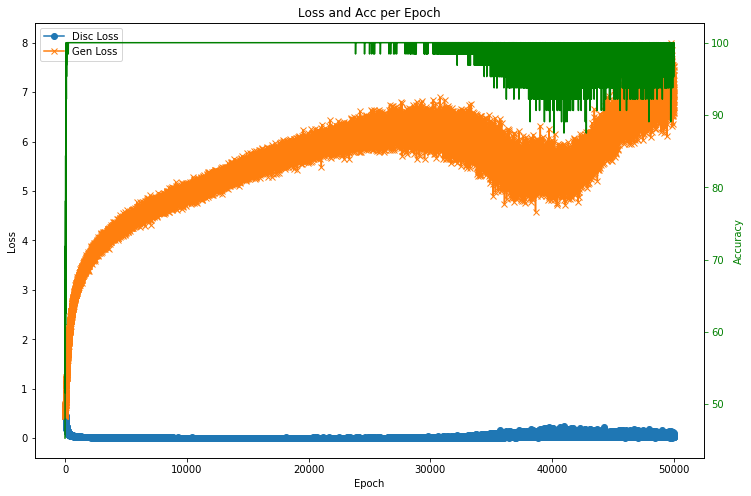

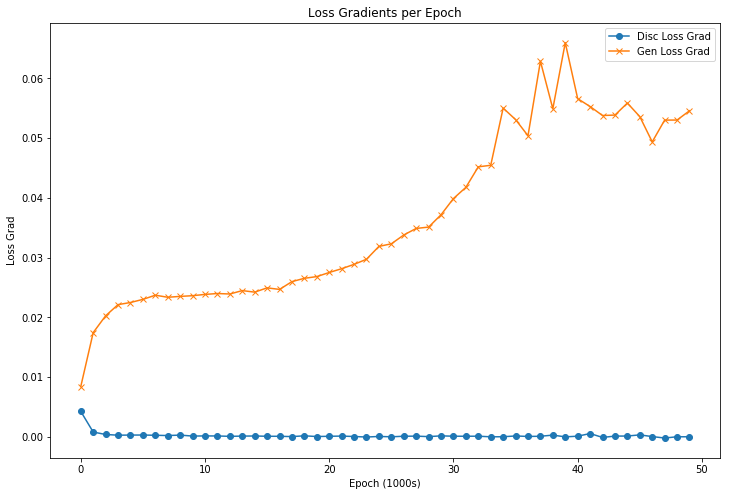

In [240]:
##### SGD with gamma -> inf #####
# learning_rate = 0.001
# momentum = 0
# decay_rate = 0.00001 # Decay rate is how we are going to achieve inf-GD
# nest = False # Nesterov's acceleration
##############################

# Initialize GAN object
opt_params = ['sgd', 0.001, 0, 0.00001, False, 'sgd_lr0.001_decay0.00001']
gan_inf_3 = GAN(opt_params)

# Train GAN
gan_inf_3_hist = gan_inf_3.train(epochs=50000, batch_size=32, sample_interval=1000)

# Plot of performance results (training and validation accuracies and loss) for every epoch
plt.rcParams['figure.figsize'] = (12, 8)
plot_loss_acc(gan_inf_3_hist)
plot_loss_gradient(gan_inf_3_hist)
plot_loss_hessian_eig(gan_inf_3_hist)

## Adam

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_33 (Flatten)         (None, 784)               0         
_________________________________________________________________
dense_231 (Dense)            (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_165 (LeakyReLU)  (None, 512)               0         
_________________________________________________________________
dense_232 (Dense)            (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_166 (LeakyReLU)  (None, 256)               0         
_________________________________________________________________
dense_233 (Dense)            (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
_________________________________________________________________
____

92 [D loss: 0.010346, acc.: 100.00%] [G loss: 4.885885]
93 [D loss: 0.007345, acc.: 100.00%] [G loss: 4.878141]
94 [D loss: 0.007669, acc.: 100.00%] [G loss: 4.903956]
95 [D loss: 0.004812, acc.: 100.00%] [G loss: 4.886420]
96 [D loss: 0.005267, acc.: 100.00%] [G loss: 5.115439]
97 [D loss: 0.006300, acc.: 100.00%] [G loss: 4.966374]
98 [D loss: 0.006677, acc.: 100.00%] [G loss: 4.762667]
99 [D loss: 0.004945, acc.: 100.00%] [G loss: 4.917899]
100 [D loss: 0.006436, acc.: 100.00%] [G loss: 4.894258]
101 [D loss: 0.009233, acc.: 100.00%] [G loss: 4.996575]
102 [D loss: 0.006207, acc.: 100.00%] [G loss: 4.941892]
103 [D loss: 0.008522, acc.: 100.00%] [G loss: 5.008739]
104 [D loss: 0.005998, acc.: 100.00%] [G loss: 5.027030]
105 [D loss: 0.005324, acc.: 100.00%] [G loss: 5.031391]
106 [D loss: 0.005833, acc.: 100.00%] [G loss: 5.012340]
107 [D loss: 0.008145, acc.: 100.00%] [G loss: 5.116202]
108 [D loss: 0.006963, acc.: 100.00%] [G loss: 5.091558]
109 [D loss: 0.005212, acc.: 100.00%] [

239 [D loss: 0.111023, acc.: 96.88%] [G loss: 3.902638]
240 [D loss: 0.099426, acc.: 96.88%] [G loss: 4.289793]
241 [D loss: 0.195829, acc.: 92.19%] [G loss: 4.476265]
242 [D loss: 0.084229, acc.: 98.44%] [G loss: 4.407262]
243 [D loss: 0.103769, acc.: 98.44%] [G loss: 4.259976]
244 [D loss: 0.154143, acc.: 93.75%] [G loss: 4.548580]
245 [D loss: 0.117948, acc.: 98.44%] [G loss: 4.094863]
246 [D loss: 0.068260, acc.: 96.88%] [G loss: 4.735396]
247 [D loss: 0.320363, acc.: 87.50%] [G loss: 3.496615]
248 [D loss: 0.071757, acc.: 98.44%] [G loss: 4.821770]
249 [D loss: 0.248848, acc.: 90.62%] [G loss: 5.423832]
250 [D loss: 1.047866, acc.: 57.81%] [G loss: 2.555918]
251 [D loss: 0.369600, acc.: 82.81%] [G loss: 3.214700]
252 [D loss: 0.045931, acc.: 100.00%] [G loss: 4.194415]
253 [D loss: 0.135502, acc.: 93.75%] [G loss: 3.231651]
254 [D loss: 0.102827, acc.: 95.31%] [G loss: 4.093777]
255 [D loss: 0.043155, acc.: 100.00%] [G loss: 3.876476]
256 [D loss: 0.088284, acc.: 100.00%] [G loss:

386 [D loss: 0.641139, acc.: 67.19%] [G loss: 1.413377]
387 [D loss: 0.358185, acc.: 81.25%] [G loss: 2.896372]
388 [D loss: 0.282730, acc.: 87.50%] [G loss: 2.894804]
389 [D loss: 0.276078, acc.: 92.19%] [G loss: 2.907542]
390 [D loss: 0.284380, acc.: 90.62%] [G loss: 3.322345]
391 [D loss: 0.703442, acc.: 62.50%] [G loss: 1.666646]
392 [D loss: 0.151054, acc.: 95.31%] [G loss: 2.988536]
393 [D loss: 0.254995, acc.: 90.62%] [G loss: 3.112272]
394 [D loss: 0.512036, acc.: 73.44%] [G loss: 2.068490]
395 [D loss: 0.419721, acc.: 78.12%] [G loss: 3.256751]
396 [D loss: 0.679334, acc.: 59.38%] [G loss: 1.805403]
397 [D loss: 0.230015, acc.: 92.19%] [G loss: 3.259042]
398 [D loss: 0.443141, acc.: 84.38%] [G loss: 1.896798]
399 [D loss: 0.269154, acc.: 90.62%] [G loss: 3.494950]
400 [D loss: 0.948651, acc.: 51.56%] [G loss: 1.484775]
401 [D loss: 0.226908, acc.: 95.31%] [G loss: 3.273720]
402 [D loss: 0.601209, acc.: 68.75%] [G loss: 2.227268]
403 [D loss: 0.310411, acc.: 87.50%] [G loss: 2.

534 [D loss: 0.678242, acc.: 39.06%] [G loss: 0.708806]
535 [D loss: 0.729703, acc.: 39.06%] [G loss: 0.680808]
536 [D loss: 0.650509, acc.: 51.56%] [G loss: 0.677181]
537 [D loss: 0.684350, acc.: 40.62%] [G loss: 0.707112]
538 [D loss: 0.703957, acc.: 34.38%] [G loss: 0.664185]
539 [D loss: 0.672277, acc.: 48.44%] [G loss: 0.661581]
540 [D loss: 0.652934, acc.: 43.75%] [G loss: 0.673221]
541 [D loss: 0.660248, acc.: 45.31%] [G loss: 0.708048]
542 [D loss: 0.658687, acc.: 46.88%] [G loss: 0.712014]
543 [D loss: 0.675459, acc.: 42.19%] [G loss: 0.734683]
544 [D loss: 0.709039, acc.: 35.94%] [G loss: 0.714801]
545 [D loss: 0.703113, acc.: 35.94%] [G loss: 0.685384]
546 [D loss: 0.669832, acc.: 46.88%] [G loss: 0.666230]
547 [D loss: 0.648685, acc.: 48.44%] [G loss: 0.700510]
548 [D loss: 0.673295, acc.: 40.62%] [G loss: 0.726667]
549 [D loss: 0.690534, acc.: 40.62%] [G loss: 0.701375]
550 [D loss: 0.680066, acc.: 50.00%] [G loss: 0.703109]
551 [D loss: 0.658745, acc.: 53.12%] [G loss: 0.

682 [D loss: 0.613356, acc.: 73.44%] [G loss: 0.717230]
683 [D loss: 0.638694, acc.: 60.94%] [G loss: 0.751131]
684 [D loss: 0.618503, acc.: 70.31%] [G loss: 0.747420]
685 [D loss: 0.633597, acc.: 65.62%] [G loss: 0.745151]
686 [D loss: 0.595809, acc.: 68.75%] [G loss: 0.758735]
687 [D loss: 0.619563, acc.: 70.31%] [G loss: 0.733569]
688 [D loss: 0.585706, acc.: 75.00%] [G loss: 0.736362]
689 [D loss: 0.633217, acc.: 68.75%] [G loss: 0.734693]
690 [D loss: 0.616487, acc.: 70.31%] [G loss: 0.757075]
691 [D loss: 0.628206, acc.: 65.62%] [G loss: 0.776349]
692 [D loss: 0.580504, acc.: 71.88%] [G loss: 0.781761]
693 [D loss: 0.589463, acc.: 76.56%] [G loss: 0.776983]
694 [D loss: 0.631279, acc.: 56.25%] [G loss: 0.764429]
695 [D loss: 0.612156, acc.: 68.75%] [G loss: 0.756034]
696 [D loss: 0.583314, acc.: 79.69%] [G loss: 0.733657]
697 [D loss: 0.613068, acc.: 68.75%] [G loss: 0.761576]
698 [D loss: 0.603275, acc.: 70.31%] [G loss: 0.747288]
699 [D loss: 0.615408, acc.: 68.75%] [G loss: 0.

830 [D loss: 0.615345, acc.: 64.06%] [G loss: 0.825322]
831 [D loss: 0.619043, acc.: 56.25%] [G loss: 0.852241]
832 [D loss: 0.629677, acc.: 62.50%] [G loss: 0.855249]
833 [D loss: 0.591495, acc.: 70.31%] [G loss: 0.794787]
834 [D loss: 0.617241, acc.: 68.75%] [G loss: 0.797861]
835 [D loss: 0.614829, acc.: 57.81%] [G loss: 0.850465]
836 [D loss: 0.598480, acc.: 75.00%] [G loss: 0.823697]
837 [D loss: 0.591902, acc.: 71.88%] [G loss: 0.794863]
838 [D loss: 0.640967, acc.: 60.94%] [G loss: 0.806665]
839 [D loss: 0.626649, acc.: 75.00%] [G loss: 0.854349]
840 [D loss: 0.591279, acc.: 67.19%] [G loss: 0.838555]
841 [D loss: 0.647549, acc.: 57.81%] [G loss: 0.854684]
842 [D loss: 0.618854, acc.: 70.31%] [G loss: 0.830706]
843 [D loss: 0.616563, acc.: 67.19%] [G loss: 0.841788]
844 [D loss: 0.621014, acc.: 71.88%] [G loss: 0.834533]
845 [D loss: 0.659139, acc.: 54.69%] [G loss: 0.825155]
846 [D loss: 0.620801, acc.: 65.62%] [G loss: 0.831721]
847 [D loss: 0.655806, acc.: 62.50%] [G loss: 0.

978 [D loss: 0.617218, acc.: 71.88%] [G loss: 0.799035]
979 [D loss: 0.592325, acc.: 79.69%] [G loss: 0.821752]
980 [D loss: 0.609466, acc.: 70.31%] [G loss: 0.840579]
981 [D loss: 0.598415, acc.: 68.75%] [G loss: 0.828412]
982 [D loss: 0.601716, acc.: 68.75%] [G loss: 0.782387]
983 [D loss: 0.581344, acc.: 76.56%] [G loss: 0.813547]
984 [D loss: 0.617939, acc.: 70.31%] [G loss: 0.834262]
985 [D loss: 0.555553, acc.: 85.94%] [G loss: 0.827175]
986 [D loss: 0.614108, acc.: 62.50%] [G loss: 0.856163]
987 [D loss: 0.608063, acc.: 67.19%] [G loss: 0.864902]
988 [D loss: 0.629889, acc.: 71.88%] [G loss: 0.782126]
989 [D loss: 0.594124, acc.: 73.44%] [G loss: 0.786531]
990 [D loss: 0.647898, acc.: 57.81%] [G loss: 0.783280]
991 [D loss: 0.604595, acc.: 71.88%] [G loss: 0.790956]
992 [D loss: 0.615419, acc.: 65.62%] [G loss: 0.816386]
993 [D loss: 0.589080, acc.: 71.88%] [G loss: 0.835655]
994 [D loss: 0.598935, acc.: 71.88%] [G loss: 0.856939]
995 [D loss: 0.596493, acc.: 70.31%] [G loss: 0.

1121 [D loss: 0.633177, acc.: 59.38%] [G loss: 0.772540]
1122 [D loss: 0.615420, acc.: 60.94%] [G loss: 0.886954]
1123 [D loss: 0.614757, acc.: 70.31%] [G loss: 0.891992]
1124 [D loss: 0.643004, acc.: 64.06%] [G loss: 0.869673]
1125 [D loss: 0.612245, acc.: 68.75%] [G loss: 0.837775]
1126 [D loss: 0.623125, acc.: 68.75%] [G loss: 0.848991]
1127 [D loss: 0.656142, acc.: 53.12%] [G loss: 0.868311]
1128 [D loss: 0.582742, acc.: 71.88%] [G loss: 0.852315]
1129 [D loss: 0.622362, acc.: 64.06%] [G loss: 0.847889]
1130 [D loss: 0.652683, acc.: 65.62%] [G loss: 0.783019]
1131 [D loss: 0.600598, acc.: 70.31%] [G loss: 0.757437]
1132 [D loss: 0.627946, acc.: 65.62%] [G loss: 0.777323]
1133 [D loss: 0.614714, acc.: 65.62%] [G loss: 0.797150]
1134 [D loss: 0.589741, acc.: 68.75%] [G loss: 0.823762]
1135 [D loss: 0.638677, acc.: 60.94%] [G loss: 0.832670]
1136 [D loss: 0.571535, acc.: 76.56%] [G loss: 0.827016]
1137 [D loss: 0.621300, acc.: 64.06%] [G loss: 0.855985]
1138 [D loss: 0.607210, acc.: 7

1266 [D loss: 0.595114, acc.: 67.19%] [G loss: 0.913711]
1267 [D loss: 0.622377, acc.: 65.62%] [G loss: 0.925280]
1268 [D loss: 0.575262, acc.: 75.00%] [G loss: 0.890846]
1269 [D loss: 0.603547, acc.: 67.19%] [G loss: 0.930681]
1270 [D loss: 0.576373, acc.: 73.44%] [G loss: 0.940122]
1271 [D loss: 0.587259, acc.: 65.62%] [G loss: 0.872459]
1272 [D loss: 0.573536, acc.: 76.56%] [G loss: 0.857557]
1273 [D loss: 0.648822, acc.: 67.19%] [G loss: 0.882216]
1274 [D loss: 0.554593, acc.: 76.56%] [G loss: 0.887662]
1275 [D loss: 0.621266, acc.: 68.75%] [G loss: 0.837325]
1276 [D loss: 0.581484, acc.: 71.88%] [G loss: 0.870952]
1277 [D loss: 0.544454, acc.: 76.56%] [G loss: 0.875230]
1278 [D loss: 0.612206, acc.: 68.75%] [G loss: 0.893542]
1279 [D loss: 0.532565, acc.: 82.81%] [G loss: 0.879822]
1280 [D loss: 0.621533, acc.: 71.88%] [G loss: 0.880906]
1281 [D loss: 0.561382, acc.: 87.50%] [G loss: 0.887985]
1282 [D loss: 0.589536, acc.: 70.31%] [G loss: 0.870198]
1283 [D loss: 0.601772, acc.: 6

1411 [D loss: 0.601488, acc.: 75.00%] [G loss: 0.908419]
1412 [D loss: 0.578346, acc.: 70.31%] [G loss: 0.915666]
1413 [D loss: 0.532855, acc.: 79.69%] [G loss: 0.866747]
1414 [D loss: 0.552123, acc.: 78.12%] [G loss: 0.904594]
1415 [D loss: 0.548892, acc.: 76.56%] [G loss: 0.878621]
1416 [D loss: 0.531763, acc.: 78.12%] [G loss: 0.972847]
1417 [D loss: 0.560111, acc.: 75.00%] [G loss: 0.924404]
1418 [D loss: 0.560558, acc.: 78.12%] [G loss: 0.918587]
1419 [D loss: 0.525632, acc.: 79.69%] [G loss: 0.928630]
1420 [D loss: 0.566373, acc.: 75.00%] [G loss: 0.910150]
1421 [D loss: 0.595060, acc.: 64.06%] [G loss: 0.896563]
1422 [D loss: 0.488233, acc.: 76.56%] [G loss: 0.936164]
1423 [D loss: 0.594727, acc.: 70.31%] [G loss: 0.970327]
1424 [D loss: 0.551297, acc.: 76.56%] [G loss: 0.979452]
1425 [D loss: 0.581922, acc.: 76.56%] [G loss: 0.946541]
1426 [D loss: 0.579120, acc.: 73.44%] [G loss: 0.939606]
1427 [D loss: 0.603670, acc.: 68.75%] [G loss: 0.972151]
1428 [D loss: 0.610960, acc.: 6

1557 [D loss: 0.597084, acc.: 68.75%] [G loss: 1.015480]
1558 [D loss: 0.497930, acc.: 81.25%] [G loss: 1.032503]
1559 [D loss: 0.572490, acc.: 81.25%] [G loss: 0.938233]
1560 [D loss: 0.544641, acc.: 70.31%] [G loss: 0.953599]
1561 [D loss: 0.541322, acc.: 82.81%] [G loss: 0.929335]
1562 [D loss: 0.560793, acc.: 73.44%] [G loss: 1.007196]
1563 [D loss: 0.566441, acc.: 71.88%] [G loss: 0.965196]
1564 [D loss: 0.595574, acc.: 62.50%] [G loss: 0.933153]
1565 [D loss: 0.515983, acc.: 87.50%] [G loss: 0.986547]
1566 [D loss: 0.539516, acc.: 78.12%] [G loss: 0.972569]
1567 [D loss: 0.527706, acc.: 79.69%] [G loss: 0.985770]
1568 [D loss: 0.560006, acc.: 76.56%] [G loss: 0.964502]
1569 [D loss: 0.500341, acc.: 78.12%] [G loss: 1.011709]
1570 [D loss: 0.523779, acc.: 79.69%] [G loss: 0.997574]
1571 [D loss: 0.558235, acc.: 73.44%] [G loss: 1.000974]
1572 [D loss: 0.531333, acc.: 81.25%] [G loss: 0.912309]
1573 [D loss: 0.539464, acc.: 76.56%] [G loss: 1.010615]
1574 [D loss: 0.551392, acc.: 7

1701 [D loss: 0.619187, acc.: 65.62%] [G loss: 1.008082]
1702 [D loss: 0.543415, acc.: 81.25%] [G loss: 0.963559]
1703 [D loss: 0.523937, acc.: 76.56%] [G loss: 1.021251]
1704 [D loss: 0.539856, acc.: 85.94%] [G loss: 0.969781]
1705 [D loss: 0.536928, acc.: 75.00%] [G loss: 0.964956]
1706 [D loss: 0.481566, acc.: 90.62%] [G loss: 1.009038]
1707 [D loss: 0.540534, acc.: 79.69%] [G loss: 0.984474]
1708 [D loss: 0.546041, acc.: 71.88%] [G loss: 1.013515]
1709 [D loss: 0.531575, acc.: 75.00%] [G loss: 1.032788]
1710 [D loss: 0.553429, acc.: 71.88%] [G loss: 0.994836]
1711 [D loss: 0.575796, acc.: 73.44%] [G loss: 0.975737]
1712 [D loss: 0.543373, acc.: 73.44%] [G loss: 0.992772]
1713 [D loss: 0.503183, acc.: 84.38%] [G loss: 1.046478]
1714 [D loss: 0.571810, acc.: 71.88%] [G loss: 1.055880]
1715 [D loss: 0.508628, acc.: 81.25%] [G loss: 0.919986]
1716 [D loss: 0.542508, acc.: 78.12%] [G loss: 1.012716]
1717 [D loss: 0.570275, acc.: 78.12%] [G loss: 1.073403]
1718 [D loss: 0.562447, acc.: 7

1847 [D loss: 0.601136, acc.: 60.94%] [G loss: 1.019719]
1848 [D loss: 0.564930, acc.: 78.12%] [G loss: 0.943304]
1849 [D loss: 0.582792, acc.: 75.00%] [G loss: 0.959412]
1850 [D loss: 0.542126, acc.: 78.12%] [G loss: 1.049166]
1851 [D loss: 0.522541, acc.: 79.69%] [G loss: 1.052830]
1852 [D loss: 0.511539, acc.: 79.69%] [G loss: 1.027639]
1853 [D loss: 0.534679, acc.: 78.12%] [G loss: 1.126279]
1854 [D loss: 0.578136, acc.: 70.31%] [G loss: 1.029621]
1855 [D loss: 0.539718, acc.: 78.12%] [G loss: 0.976586]
1856 [D loss: 0.552573, acc.: 73.44%] [G loss: 1.026170]
1857 [D loss: 0.526266, acc.: 79.69%] [G loss: 1.063454]
1858 [D loss: 0.590060, acc.: 70.31%] [G loss: 1.042493]
1859 [D loss: 0.590926, acc.: 62.50%] [G loss: 0.970539]
1860 [D loss: 0.568354, acc.: 79.69%] [G loss: 1.025071]
1861 [D loss: 0.499423, acc.: 82.81%] [G loss: 0.928399]
1862 [D loss: 0.600784, acc.: 67.19%] [G loss: 0.915107]
1863 [D loss: 0.575929, acc.: 73.44%] [G loss: 0.899936]
1864 [D loss: 0.586247, acc.: 7

1992 [D loss: 0.571998, acc.: 78.12%] [G loss: 0.941271]
1993 [D loss: 0.497877, acc.: 78.12%] [G loss: 1.006663]
1994 [D loss: 0.528153, acc.: 78.12%] [G loss: 1.118875]
1995 [D loss: 0.556652, acc.: 70.31%] [G loss: 0.998605]
1996 [D loss: 0.617276, acc.: 60.94%] [G loss: 1.023151]
1997 [D loss: 0.512114, acc.: 81.25%] [G loss: 1.072966]
1998 [D loss: 0.541481, acc.: 76.56%] [G loss: 1.044878]
1999 [D loss: 0.606440, acc.: 67.19%] [G loss: 1.048599]
2000 [D loss: 0.543538, acc.: 68.75%] [G loss: 0.978106]
Discriminator gradients:  0.00022404222
Generator gradients:  0.0016400424
Min XX Hessian eigenvalue:  0.006445577
Min ZZ Hessian eigenvalue:  -0.00012301457
2001 [D loss: 0.517171, acc.: 82.81%] [G loss: 0.985723]
2002 [D loss: 0.438518, acc.: 89.06%] [G loss: 1.109370]
2003 [D loss: 0.481328, acc.: 81.25%] [G loss: 1.028154]
2004 [D loss: 0.559039, acc.: 71.88%] [G loss: 0.988601]
2005 [D loss: 0.592678, acc.: 73.44%] [G loss: 1.075990]
2006 [D loss: 0.560879, acc.: 75.00%] [G los

2134 [D loss: 0.586512, acc.: 68.75%] [G loss: 0.995661]
2135 [D loss: 0.514068, acc.: 75.00%] [G loss: 1.043306]
2136 [D loss: 0.644467, acc.: 65.62%] [G loss: 1.029077]
2137 [D loss: 0.597756, acc.: 65.62%] [G loss: 1.080139]
2138 [D loss: 0.534871, acc.: 76.56%] [G loss: 1.194577]
2139 [D loss: 0.555114, acc.: 78.12%] [G loss: 1.046226]
2140 [D loss: 0.551299, acc.: 70.31%] [G loss: 1.090731]
2141 [D loss: 0.542805, acc.: 76.56%] [G loss: 1.067175]
2142 [D loss: 0.574721, acc.: 67.19%] [G loss: 1.031646]
2143 [D loss: 0.632444, acc.: 68.75%] [G loss: 1.045948]
2144 [D loss: 0.544745, acc.: 71.88%] [G loss: 1.076805]
2145 [D loss: 0.562143, acc.: 73.44%] [G loss: 1.092485]
2146 [D loss: 0.558933, acc.: 73.44%] [G loss: 1.073035]
2147 [D loss: 0.520421, acc.: 82.81%] [G loss: 1.134202]
2148 [D loss: 0.481383, acc.: 82.81%] [G loss: 1.207013]
2149 [D loss: 0.586460, acc.: 65.62%] [G loss: 1.118653]
2150 [D loss: 0.612164, acc.: 62.50%] [G loss: 1.086627]
2151 [D loss: 0.516498, acc.: 7

2279 [D loss: 0.522127, acc.: 73.44%] [G loss: 1.064729]
2280 [D loss: 0.577789, acc.: 75.00%] [G loss: 0.988426]
2281 [D loss: 0.563783, acc.: 70.31%] [G loss: 1.054470]
2282 [D loss: 0.512623, acc.: 79.69%] [G loss: 1.094288]
2283 [D loss: 0.533205, acc.: 70.31%] [G loss: 1.038144]
2284 [D loss: 0.559680, acc.: 68.75%] [G loss: 1.172612]
2285 [D loss: 0.548634, acc.: 75.00%] [G loss: 1.200930]
2286 [D loss: 0.628870, acc.: 70.31%] [G loss: 1.132069]
2287 [D loss: 0.574183, acc.: 78.12%] [G loss: 0.992093]
2288 [D loss: 0.555535, acc.: 76.56%] [G loss: 0.986112]
2289 [D loss: 0.568943, acc.: 71.88%] [G loss: 1.010142]
2290 [D loss: 0.543892, acc.: 71.88%] [G loss: 1.013356]
2291 [D loss: 0.586236, acc.: 68.75%] [G loss: 0.949206]
2292 [D loss: 0.536256, acc.: 75.00%] [G loss: 0.945716]
2293 [D loss: 0.572292, acc.: 71.88%] [G loss: 0.948648]
2294 [D loss: 0.573241, acc.: 75.00%] [G loss: 0.997219]
2295 [D loss: 0.672990, acc.: 59.38%] [G loss: 0.985193]
2296 [D loss: 0.482318, acc.: 7

2425 [D loss: 0.648529, acc.: 64.06%] [G loss: 1.018561]
2426 [D loss: 0.593460, acc.: 68.75%] [G loss: 1.045071]
2427 [D loss: 0.550909, acc.: 71.88%] [G loss: 1.126752]
2428 [D loss: 0.545080, acc.: 76.56%] [G loss: 1.032631]
2429 [D loss: 0.601296, acc.: 70.31%] [G loss: 1.030751]
2430 [D loss: 0.570832, acc.: 73.44%] [G loss: 0.995356]
2431 [D loss: 0.579480, acc.: 73.44%] [G loss: 1.064888]
2432 [D loss: 0.492163, acc.: 79.69%] [G loss: 1.133510]
2433 [D loss: 0.590278, acc.: 67.19%] [G loss: 1.124795]
2434 [D loss: 0.572557, acc.: 70.31%] [G loss: 1.038397]
2435 [D loss: 0.599287, acc.: 73.44%] [G loss: 0.982059]
2436 [D loss: 0.526192, acc.: 73.44%] [G loss: 1.086053]
2437 [D loss: 0.519773, acc.: 71.88%] [G loss: 1.093225]
2438 [D loss: 0.591075, acc.: 71.88%] [G loss: 1.032898]
2439 [D loss: 0.591243, acc.: 67.19%] [G loss: 0.977038]
2440 [D loss: 0.586090, acc.: 70.31%] [G loss: 0.929277]
2441 [D loss: 0.579108, acc.: 68.75%] [G loss: 1.079609]
2442 [D loss: 0.528377, acc.: 8

2570 [D loss: 0.640591, acc.: 67.19%] [G loss: 0.945450]
2571 [D loss: 0.600701, acc.: 67.19%] [G loss: 1.044183]
2572 [D loss: 0.513691, acc.: 84.38%] [G loss: 1.049847]
2573 [D loss: 0.503022, acc.: 73.44%] [G loss: 1.060144]
2574 [D loss: 0.481855, acc.: 82.81%] [G loss: 1.031175]
2575 [D loss: 0.560320, acc.: 70.31%] [G loss: 1.114786]
2576 [D loss: 0.462560, acc.: 85.94%] [G loss: 1.073334]
2577 [D loss: 0.631289, acc.: 67.19%] [G loss: 1.072539]
2578 [D loss: 0.537973, acc.: 76.56%] [G loss: 1.109728]
2579 [D loss: 0.546080, acc.: 73.44%] [G loss: 0.978185]
2580 [D loss: 0.577183, acc.: 71.88%] [G loss: 1.044893]
2581 [D loss: 0.586878, acc.: 67.19%] [G loss: 1.033639]
2582 [D loss: 0.597329, acc.: 67.19%] [G loss: 1.077189]
2583 [D loss: 0.611581, acc.: 65.62%] [G loss: 0.991214]
2584 [D loss: 0.571970, acc.: 60.94%] [G loss: 1.062041]
2585 [D loss: 0.600564, acc.: 59.38%] [G loss: 1.044912]
2586 [D loss: 0.590230, acc.: 68.75%] [G loss: 1.077047]
2587 [D loss: 0.534262, acc.: 7

2714 [D loss: 0.557268, acc.: 71.88%] [G loss: 0.920959]
2715 [D loss: 0.639437, acc.: 64.06%] [G loss: 1.004888]
2716 [D loss: 0.613757, acc.: 64.06%] [G loss: 1.067377]
2717 [D loss: 0.600037, acc.: 76.56%] [G loss: 0.953464]
2718 [D loss: 0.553833, acc.: 73.44%] [G loss: 1.075401]
2719 [D loss: 0.511476, acc.: 81.25%] [G loss: 1.135812]
2720 [D loss: 0.550146, acc.: 78.12%] [G loss: 1.078285]
2721 [D loss: 0.582138, acc.: 70.31%] [G loss: 1.177111]
2722 [D loss: 0.516282, acc.: 71.88%] [G loss: 1.132782]
2723 [D loss: 0.547709, acc.: 75.00%] [G loss: 1.075272]
2724 [D loss: 0.528430, acc.: 82.81%] [G loss: 0.993056]
2725 [D loss: 0.554877, acc.: 70.31%] [G loss: 0.991374]
2726 [D loss: 0.581650, acc.: 68.75%] [G loss: 0.984550]
2727 [D loss: 0.536449, acc.: 71.88%] [G loss: 0.990096]
2728 [D loss: 0.593696, acc.: 67.19%] [G loss: 1.006313]
2729 [D loss: 0.612648, acc.: 70.31%] [G loss: 1.049947]
2730 [D loss: 0.490567, acc.: 84.38%] [G loss: 1.098679]
2731 [D loss: 0.548677, acc.: 7

2858 [D loss: 0.590821, acc.: 67.19%] [G loss: 1.031723]
2859 [D loss: 0.581603, acc.: 65.62%] [G loss: 0.971965]
2860 [D loss: 0.560715, acc.: 75.00%] [G loss: 1.043029]
2861 [D loss: 0.533262, acc.: 78.12%] [G loss: 0.973468]
2862 [D loss: 0.560557, acc.: 71.88%] [G loss: 1.037251]
2863 [D loss: 0.598082, acc.: 65.62%] [G loss: 1.027745]
2864 [D loss: 0.566058, acc.: 68.75%] [G loss: 0.939992]
2865 [D loss: 0.553375, acc.: 68.75%] [G loss: 0.990815]
2866 [D loss: 0.529508, acc.: 71.88%] [G loss: 0.895672]
2867 [D loss: 0.552234, acc.: 68.75%] [G loss: 1.058691]
2868 [D loss: 0.658188, acc.: 57.81%] [G loss: 0.980446]
2869 [D loss: 0.598495, acc.: 73.44%] [G loss: 0.959356]
2870 [D loss: 0.505626, acc.: 82.81%] [G loss: 1.093282]
2871 [D loss: 0.458096, acc.: 81.25%] [G loss: 1.030710]
2872 [D loss: 0.623843, acc.: 65.62%] [G loss: 1.015214]
2873 [D loss: 0.665921, acc.: 60.94%] [G loss: 1.000407]
2874 [D loss: 0.604484, acc.: 70.31%] [G loss: 0.940860]
2875 [D loss: 0.565929, acc.: 7

Min XX Hessian eigenvalue:  0.0067913625
Min ZZ Hessian eigenvalue:  -0.0001327472
3001 [D loss: 0.563633, acc.: 70.31%] [G loss: 1.099477]
3002 [D loss: 0.620130, acc.: 64.06%] [G loss: 1.111832]
3003 [D loss: 0.584088, acc.: 62.50%] [G loss: 0.984969]
3004 [D loss: 0.636610, acc.: 62.50%] [G loss: 0.959366]
3005 [D loss: 0.580645, acc.: 70.31%] [G loss: 1.092537]
3006 [D loss: 0.526379, acc.: 79.69%] [G loss: 1.128265]
3007 [D loss: 0.519745, acc.: 75.00%] [G loss: 1.018960]
3008 [D loss: 0.555147, acc.: 67.19%] [G loss: 1.012236]
3009 [D loss: 0.515372, acc.: 79.69%] [G loss: 1.026615]
3010 [D loss: 0.563664, acc.: 73.44%] [G loss: 1.050528]
3011 [D loss: 0.651377, acc.: 57.81%] [G loss: 1.042286]
3012 [D loss: 0.617737, acc.: 67.19%] [G loss: 1.093161]
3013 [D loss: 0.587036, acc.: 67.19%] [G loss: 1.046292]
3014 [D loss: 0.507449, acc.: 84.38%] [G loss: 1.114489]
3015 [D loss: 0.650817, acc.: 57.81%] [G loss: 1.063679]
3016 [D loss: 0.625406, acc.: 64.06%] [G loss: 1.056343]
3017 

3145 [D loss: 0.546642, acc.: 75.00%] [G loss: 1.110286]
3146 [D loss: 0.617646, acc.: 71.88%] [G loss: 1.013770]
3147 [D loss: 0.574393, acc.: 73.44%] [G loss: 1.020211]
3148 [D loss: 0.602928, acc.: 62.50%] [G loss: 0.953711]
3149 [D loss: 0.609807, acc.: 60.94%] [G loss: 0.995735]
3150 [D loss: 0.606022, acc.: 67.19%] [G loss: 1.019125]
3151 [D loss: 0.593491, acc.: 60.94%] [G loss: 1.015930]
3152 [D loss: 0.564118, acc.: 71.88%] [G loss: 1.120884]
3153 [D loss: 0.618714, acc.: 70.31%] [G loss: 0.986674]
3154 [D loss: 0.640081, acc.: 64.06%] [G loss: 0.928475]
3155 [D loss: 0.494539, acc.: 85.94%] [G loss: 1.060110]
3156 [D loss: 0.613209, acc.: 68.75%] [G loss: 0.991008]
3157 [D loss: 0.543016, acc.: 75.00%] [G loss: 0.972195]
3158 [D loss: 0.632349, acc.: 59.38%] [G loss: 1.070770]
3159 [D loss: 0.565497, acc.: 75.00%] [G loss: 1.011373]
3160 [D loss: 0.564341, acc.: 73.44%] [G loss: 1.132130]
3161 [D loss: 0.609545, acc.: 65.62%] [G loss: 1.117075]
3162 [D loss: 0.559788, acc.: 7

3291 [D loss: 0.526592, acc.: 78.12%] [G loss: 1.120859]
3292 [D loss: 0.601272, acc.: 70.31%] [G loss: 1.009475]
3293 [D loss: 0.600794, acc.: 65.62%] [G loss: 0.982913]
3294 [D loss: 0.629107, acc.: 67.19%] [G loss: 0.953895]
3295 [D loss: 0.588853, acc.: 75.00%] [G loss: 1.023433]
3296 [D loss: 0.588348, acc.: 75.00%] [G loss: 1.113310]
3297 [D loss: 0.579494, acc.: 65.62%] [G loss: 1.168147]
3298 [D loss: 0.603867, acc.: 68.75%] [G loss: 1.025194]
3299 [D loss: 0.588714, acc.: 67.19%] [G loss: 1.012035]
3300 [D loss: 0.661798, acc.: 60.94%] [G loss: 0.971697]
3301 [D loss: 0.587391, acc.: 70.31%] [G loss: 0.993477]
3302 [D loss: 0.614758, acc.: 60.94%] [G loss: 0.976909]
3303 [D loss: 0.624164, acc.: 70.31%] [G loss: 0.976295]
3304 [D loss: 0.562454, acc.: 76.56%] [G loss: 1.035870]
3305 [D loss: 0.575029, acc.: 71.88%] [G loss: 1.021347]
3306 [D loss: 0.604988, acc.: 67.19%] [G loss: 1.064072]
3307 [D loss: 0.618838, acc.: 70.31%] [G loss: 0.972848]
3308 [D loss: 0.526419, acc.: 7

3435 [D loss: 0.522286, acc.: 76.56%] [G loss: 0.964148]
3436 [D loss: 0.529171, acc.: 73.44%] [G loss: 0.988452]
3437 [D loss: 0.582832, acc.: 68.75%] [G loss: 1.063853]
3438 [D loss: 0.574345, acc.: 67.19%] [G loss: 1.096937]
3439 [D loss: 0.576063, acc.: 68.75%] [G loss: 0.974109]
3440 [D loss: 0.595314, acc.: 65.62%] [G loss: 1.061962]
3441 [D loss: 0.575711, acc.: 75.00%] [G loss: 0.997480]
3442 [D loss: 0.552696, acc.: 70.31%] [G loss: 0.979389]
3443 [D loss: 0.672944, acc.: 54.69%] [G loss: 0.921659]
3444 [D loss: 0.574324, acc.: 70.31%] [G loss: 0.950933]
3445 [D loss: 0.582331, acc.: 71.88%] [G loss: 1.093215]
3446 [D loss: 0.565005, acc.: 71.88%] [G loss: 0.999405]
3447 [D loss: 0.595648, acc.: 57.81%] [G loss: 0.982894]
3448 [D loss: 0.601147, acc.: 65.62%] [G loss: 0.911047]
3449 [D loss: 0.635137, acc.: 67.19%] [G loss: 1.082674]
3450 [D loss: 0.601009, acc.: 67.19%] [G loss: 1.026291]
3451 [D loss: 0.574591, acc.: 75.00%] [G loss: 1.063104]
3452 [D loss: 0.627032, acc.: 6

3581 [D loss: 0.526563, acc.: 73.44%] [G loss: 0.927405]
3582 [D loss: 0.595898, acc.: 65.62%] [G loss: 1.015117]
3583 [D loss: 0.654315, acc.: 59.38%] [G loss: 1.030737]
3584 [D loss: 0.519510, acc.: 71.88%] [G loss: 1.157455]
3585 [D loss: 0.585966, acc.: 71.88%] [G loss: 1.064999]
3586 [D loss: 0.615800, acc.: 65.62%] [G loss: 0.983305]
3587 [D loss: 0.574242, acc.: 65.62%] [G loss: 0.930592]
3588 [D loss: 0.532830, acc.: 71.88%] [G loss: 1.095990]
3589 [D loss: 0.584516, acc.: 70.31%] [G loss: 0.908560]
3590 [D loss: 0.600284, acc.: 62.50%] [G loss: 0.936534]
3591 [D loss: 0.509287, acc.: 73.44%] [G loss: 1.062963]
3592 [D loss: 0.552386, acc.: 76.56%] [G loss: 1.145512]
3593 [D loss: 0.597826, acc.: 70.31%] [G loss: 0.976134]
3594 [D loss: 0.618031, acc.: 65.62%] [G loss: 1.023964]
3595 [D loss: 0.581464, acc.: 71.88%] [G loss: 1.032382]
3596 [D loss: 0.546252, acc.: 73.44%] [G loss: 1.058417]
3597 [D loss: 0.540704, acc.: 76.56%] [G loss: 1.144330]
3598 [D loss: 0.549655, acc.: 6

3726 [D loss: 0.544269, acc.: 75.00%] [G loss: 1.083655]
3727 [D loss: 0.580029, acc.: 71.88%] [G loss: 1.142137]
3728 [D loss: 0.620487, acc.: 60.94%] [G loss: 0.967234]
3729 [D loss: 0.554313, acc.: 71.88%] [G loss: 1.109669]
3730 [D loss: 0.603247, acc.: 65.62%] [G loss: 1.023375]
3731 [D loss: 0.644963, acc.: 64.06%] [G loss: 0.966865]
3732 [D loss: 0.535879, acc.: 71.88%] [G loss: 1.078058]
3733 [D loss: 0.579724, acc.: 65.62%] [G loss: 0.952733]
3734 [D loss: 0.585411, acc.: 65.62%] [G loss: 1.077188]
3735 [D loss: 0.585716, acc.: 70.31%] [G loss: 1.011482]
3736 [D loss: 0.506973, acc.: 81.25%] [G loss: 1.035643]
3737 [D loss: 0.650941, acc.: 54.69%] [G loss: 0.991764]
3738 [D loss: 0.711453, acc.: 56.25%] [G loss: 1.110339]
3739 [D loss: 0.538428, acc.: 71.88%] [G loss: 1.014794]
3740 [D loss: 0.552564, acc.: 73.44%] [G loss: 1.151872]
3741 [D loss: 0.548852, acc.: 68.75%] [G loss: 0.947964]
3742 [D loss: 0.615396, acc.: 76.56%] [G loss: 1.014866]
3743 [D loss: 0.602766, acc.: 6

3870 [D loss: 0.589159, acc.: 70.31%] [G loss: 1.084927]
3871 [D loss: 0.513690, acc.: 71.88%] [G loss: 1.081226]
3872 [D loss: 0.627992, acc.: 62.50%] [G loss: 1.046771]
3873 [D loss: 0.601315, acc.: 68.75%] [G loss: 1.041960]
3874 [D loss: 0.555885, acc.: 65.62%] [G loss: 0.986682]
3875 [D loss: 0.616907, acc.: 60.94%] [G loss: 1.026425]
3876 [D loss: 0.595985, acc.: 71.88%] [G loss: 1.070595]
3877 [D loss: 0.585929, acc.: 73.44%] [G loss: 1.023196]
3878 [D loss: 0.536752, acc.: 76.56%] [G loss: 1.078628]
3879 [D loss: 0.576892, acc.: 70.31%] [G loss: 1.060242]
3880 [D loss: 0.665180, acc.: 64.06%] [G loss: 1.081540]
3881 [D loss: 0.521847, acc.: 75.00%] [G loss: 1.039257]
3882 [D loss: 0.567856, acc.: 76.56%] [G loss: 1.062577]
3883 [D loss: 0.599737, acc.: 71.88%] [G loss: 0.986978]
3884 [D loss: 0.654146, acc.: 59.38%] [G loss: 0.894148]
3885 [D loss: 0.582667, acc.: 67.19%] [G loss: 0.956459]
3886 [D loss: 0.557709, acc.: 75.00%] [G loss: 1.079775]
3887 [D loss: 0.602073, acc.: 6

4012 [D loss: 0.588189, acc.: 71.88%] [G loss: 1.032698]
4013 [D loss: 0.726716, acc.: 54.69%] [G loss: 0.990923]
4014 [D loss: 0.556941, acc.: 67.19%] [G loss: 1.025838]
4015 [D loss: 0.577835, acc.: 76.56%] [G loss: 1.072432]
4016 [D loss: 0.567762, acc.: 65.62%] [G loss: 1.003832]
4017 [D loss: 0.642269, acc.: 65.62%] [G loss: 1.036398]
4018 [D loss: 0.528466, acc.: 75.00%] [G loss: 0.982715]
4019 [D loss: 0.568816, acc.: 73.44%] [G loss: 0.977600]
4020 [D loss: 0.567725, acc.: 70.31%] [G loss: 1.146911]
4021 [D loss: 0.620581, acc.: 59.38%] [G loss: 1.058103]
4022 [D loss: 0.542644, acc.: 79.69%] [G loss: 1.096774]
4023 [D loss: 0.563929, acc.: 67.19%] [G loss: 1.084669]
4024 [D loss: 0.536592, acc.: 71.88%] [G loss: 1.025335]
4025 [D loss: 0.637838, acc.: 65.62%] [G loss: 1.022606]
4026 [D loss: 0.529654, acc.: 75.00%] [G loss: 0.947253]
4027 [D loss: 0.517234, acc.: 79.69%] [G loss: 1.153282]
4028 [D loss: 0.553797, acc.: 67.19%] [G loss: 1.147502]
4029 [D loss: 0.544723, acc.: 7

4157 [D loss: 0.569535, acc.: 70.31%] [G loss: 1.032947]
4158 [D loss: 0.478095, acc.: 85.94%] [G loss: 1.051217]
4159 [D loss: 0.537256, acc.: 78.12%] [G loss: 0.941607]
4160 [D loss: 0.606655, acc.: 64.06%] [G loss: 0.932548]
4161 [D loss: 0.554122, acc.: 75.00%] [G loss: 1.043767]
4162 [D loss: 0.618371, acc.: 71.88%] [G loss: 1.054672]
4163 [D loss: 0.590476, acc.: 62.50%] [G loss: 0.974180]
4164 [D loss: 0.574731, acc.: 67.19%] [G loss: 1.080797]
4165 [D loss: 0.606394, acc.: 67.19%] [G loss: 1.042449]
4166 [D loss: 0.651983, acc.: 64.06%] [G loss: 1.061888]
4167 [D loss: 0.613511, acc.: 65.62%] [G loss: 0.935734]
4168 [D loss: 0.684345, acc.: 64.06%] [G loss: 1.104156]
4169 [D loss: 0.568760, acc.: 73.44%] [G loss: 1.105292]
4170 [D loss: 0.543359, acc.: 73.44%] [G loss: 1.127350]
4171 [D loss: 0.634405, acc.: 68.75%] [G loss: 1.003655]
4172 [D loss: 0.693871, acc.: 56.25%] [G loss: 0.993519]
4173 [D loss: 0.623365, acc.: 64.06%] [G loss: 1.035141]
4174 [D loss: 0.597096, acc.: 6

4302 [D loss: 0.564412, acc.: 73.44%] [G loss: 1.083412]
4303 [D loss: 0.569641, acc.: 73.44%] [G loss: 1.129147]
4304 [D loss: 0.635350, acc.: 57.81%] [G loss: 1.002300]
4305 [D loss: 0.608661, acc.: 64.06%] [G loss: 0.965841]
4306 [D loss: 0.581452, acc.: 75.00%] [G loss: 1.106972]
4307 [D loss: 0.537138, acc.: 79.69%] [G loss: 1.098342]
4308 [D loss: 0.560193, acc.: 81.25%] [G loss: 1.072159]
4309 [D loss: 0.599275, acc.: 67.19%] [G loss: 0.945886]
4310 [D loss: 0.523885, acc.: 73.44%] [G loss: 0.958868]
4311 [D loss: 0.523281, acc.: 78.12%] [G loss: 1.047257]
4312 [D loss: 0.540468, acc.: 70.31%] [G loss: 1.113673]
4313 [D loss: 0.630553, acc.: 65.62%] [G loss: 1.126286]
4314 [D loss: 0.560905, acc.: 68.75%] [G loss: 1.050073]
4315 [D loss: 0.554577, acc.: 68.75%] [G loss: 1.044949]
4316 [D loss: 0.627485, acc.: 60.94%] [G loss: 0.997879]
4317 [D loss: 0.634219, acc.: 64.06%] [G loss: 0.951195]
4318 [D loss: 0.531481, acc.: 71.88%] [G loss: 0.988733]
4319 [D loss: 0.573261, acc.: 6

4446 [D loss: 0.579508, acc.: 67.19%] [G loss: 1.102043]
4447 [D loss: 0.648205, acc.: 68.75%] [G loss: 1.119854]
4448 [D loss: 0.608486, acc.: 67.19%] [G loss: 1.056484]
4449 [D loss: 0.615469, acc.: 64.06%] [G loss: 1.176470]
4450 [D loss: 0.549051, acc.: 78.12%] [G loss: 1.042464]
4451 [D loss: 0.595275, acc.: 68.75%] [G loss: 1.073393]
4452 [D loss: 0.643415, acc.: 62.50%] [G loss: 1.005189]
4453 [D loss: 0.583577, acc.: 67.19%] [G loss: 1.081209]
4454 [D loss: 0.595925, acc.: 64.06%] [G loss: 0.982769]
4455 [D loss: 0.545416, acc.: 73.44%] [G loss: 0.960045]
4456 [D loss: 0.601303, acc.: 68.75%] [G loss: 0.953438]
4457 [D loss: 0.531912, acc.: 75.00%] [G loss: 0.996515]
4458 [D loss: 0.483466, acc.: 82.81%] [G loss: 0.988246]
4459 [D loss: 0.576225, acc.: 71.88%] [G loss: 1.066922]
4460 [D loss: 0.514488, acc.: 81.25%] [G loss: 1.049405]
4461 [D loss: 0.613806, acc.: 70.31%] [G loss: 0.952279]
4462 [D loss: 0.639010, acc.: 62.50%] [G loss: 1.036736]
4463 [D loss: 0.511982, acc.: 7

4591 [D loss: 0.569606, acc.: 70.31%] [G loss: 1.089092]
4592 [D loss: 0.585960, acc.: 65.62%] [G loss: 1.073621]
4593 [D loss: 0.551487, acc.: 79.69%] [G loss: 1.088360]
4594 [D loss: 0.615256, acc.: 71.88%] [G loss: 1.112621]
4595 [D loss: 0.644322, acc.: 68.75%] [G loss: 0.983691]
4596 [D loss: 0.589228, acc.: 65.62%] [G loss: 1.010522]
4597 [D loss: 0.540016, acc.: 75.00%] [G loss: 0.997082]
4598 [D loss: 0.590964, acc.: 68.75%] [G loss: 0.861539]
4599 [D loss: 0.624078, acc.: 60.94%] [G loss: 0.943155]
4600 [D loss: 0.603483, acc.: 68.75%] [G loss: 1.017456]
4601 [D loss: 0.620491, acc.: 62.50%] [G loss: 0.989826]
4602 [D loss: 0.591574, acc.: 65.62%] [G loss: 1.069157]
4603 [D loss: 0.582827, acc.: 65.62%] [G loss: 1.057333]
4604 [D loss: 0.568566, acc.: 65.62%] [G loss: 1.017336]
4605 [D loss: 0.600963, acc.: 65.62%] [G loss: 1.040059]
4606 [D loss: 0.602866, acc.: 62.50%] [G loss: 1.043324]
4607 [D loss: 0.614389, acc.: 70.31%] [G loss: 1.066219]
4608 [D loss: 0.654278, acc.: 5

4735 [D loss: 0.619897, acc.: 73.44%] [G loss: 1.071995]
4736 [D loss: 0.505551, acc.: 78.12%] [G loss: 1.077506]
4737 [D loss: 0.665220, acc.: 64.06%] [G loss: 1.075380]
4738 [D loss: 0.623151, acc.: 60.94%] [G loss: 1.021241]
4739 [D loss: 0.610924, acc.: 62.50%] [G loss: 1.073674]
4740 [D loss: 0.609623, acc.: 65.62%] [G loss: 1.032511]
4741 [D loss: 0.606208, acc.: 60.94%] [G loss: 1.052307]
4742 [D loss: 0.579837, acc.: 76.56%] [G loss: 1.049528]
4743 [D loss: 0.584415, acc.: 70.31%] [G loss: 1.016021]
4744 [D loss: 0.637731, acc.: 59.38%] [G loss: 1.125764]
4745 [D loss: 0.590653, acc.: 67.19%] [G loss: 1.040184]
4746 [D loss: 0.627226, acc.: 59.38%] [G loss: 1.016999]
4747 [D loss: 0.701956, acc.: 53.12%] [G loss: 1.086501]
4748 [D loss: 0.534936, acc.: 78.12%] [G loss: 1.047048]
4749 [D loss: 0.462080, acc.: 89.06%] [G loss: 1.106905]
4750 [D loss: 0.619176, acc.: 65.62%] [G loss: 1.126043]
4751 [D loss: 0.620836, acc.: 62.50%] [G loss: 1.068559]
4752 [D loss: 0.645084, acc.: 6

4879 [D loss: 0.575375, acc.: 71.88%] [G loss: 0.933075]
4880 [D loss: 0.573671, acc.: 71.88%] [G loss: 1.000909]
4881 [D loss: 0.639668, acc.: 62.50%] [G loss: 0.889129]
4882 [D loss: 0.563184, acc.: 70.31%] [G loss: 1.019964]
4883 [D loss: 0.612936, acc.: 64.06%] [G loss: 0.957642]
4884 [D loss: 0.626480, acc.: 65.62%] [G loss: 1.051180]
4885 [D loss: 0.678823, acc.: 60.94%] [G loss: 1.123465]
4886 [D loss: 0.570140, acc.: 78.12%] [G loss: 1.125871]
4887 [D loss: 0.601061, acc.: 64.06%] [G loss: 0.919861]
4888 [D loss: 0.524472, acc.: 76.56%] [G loss: 0.991848]
4889 [D loss: 0.635534, acc.: 64.06%] [G loss: 1.101408]
4890 [D loss: 0.602326, acc.: 71.88%] [G loss: 0.949004]
4891 [D loss: 0.644685, acc.: 68.75%] [G loss: 1.007511]
4892 [D loss: 0.664155, acc.: 59.38%] [G loss: 0.984261]
4893 [D loss: 0.577597, acc.: 62.50%] [G loss: 1.053280]
4894 [D loss: 0.627971, acc.: 70.31%] [G loss: 1.065146]
4895 [D loss: 0.551826, acc.: 76.56%] [G loss: 1.113827]
4896 [D loss: 0.605833, acc.: 5

5020 [D loss: 0.632714, acc.: 71.88%] [G loss: 0.998070]
5021 [D loss: 0.569009, acc.: 70.31%] [G loss: 1.008555]
5022 [D loss: 0.578560, acc.: 68.75%] [G loss: 0.997778]
5023 [D loss: 0.629888, acc.: 62.50%] [G loss: 0.981053]
5024 [D loss: 0.618479, acc.: 62.50%] [G loss: 0.942067]
5025 [D loss: 0.601721, acc.: 67.19%] [G loss: 1.032580]
5026 [D loss: 0.564003, acc.: 70.31%] [G loss: 1.092366]
5027 [D loss: 0.528841, acc.: 78.12%] [G loss: 1.062408]
5028 [D loss: 0.589627, acc.: 75.00%] [G loss: 0.994008]
5029 [D loss: 0.612688, acc.: 71.88%] [G loss: 1.133105]
5030 [D loss: 0.554891, acc.: 73.44%] [G loss: 1.058545]
5031 [D loss: 0.597550, acc.: 64.06%] [G loss: 0.935378]
5032 [D loss: 0.647503, acc.: 57.81%] [G loss: 1.049807]
5033 [D loss: 0.612568, acc.: 67.19%] [G loss: 1.036114]
5034 [D loss: 0.586208, acc.: 70.31%] [G loss: 0.925125]
5035 [D loss: 0.557316, acc.: 76.56%] [G loss: 0.933078]
5036 [D loss: 0.564035, acc.: 71.88%] [G loss: 0.939828]
5037 [D loss: 0.526941, acc.: 7

5166 [D loss: 0.544801, acc.: 70.31%] [G loss: 0.980387]
5167 [D loss: 0.632972, acc.: 70.31%] [G loss: 1.028574]
5168 [D loss: 0.532101, acc.: 78.12%] [G loss: 0.844054]
5169 [D loss: 0.638805, acc.: 54.69%] [G loss: 1.005347]
5170 [D loss: 0.649247, acc.: 64.06%] [G loss: 0.951657]
5171 [D loss: 0.547679, acc.: 73.44%] [G loss: 1.021918]
5172 [D loss: 0.619480, acc.: 62.50%] [G loss: 1.046729]
5173 [D loss: 0.552584, acc.: 75.00%] [G loss: 1.066953]
5174 [D loss: 0.596453, acc.: 67.19%] [G loss: 1.103597]
5175 [D loss: 0.542875, acc.: 73.44%] [G loss: 1.157581]
5176 [D loss: 0.622321, acc.: 60.94%] [G loss: 1.074253]
5177 [D loss: 0.655740, acc.: 62.50%] [G loss: 1.047917]
5178 [D loss: 0.621699, acc.: 67.19%] [G loss: 1.110237]
5179 [D loss: 0.589311, acc.: 64.06%] [G loss: 1.030450]
5180 [D loss: 0.551422, acc.: 78.12%] [G loss: 0.961257]
5181 [D loss: 0.564889, acc.: 75.00%] [G loss: 0.971489]
5182 [D loss: 0.632743, acc.: 70.31%] [G loss: 1.131768]
5183 [D loss: 0.621734, acc.: 6

5310 [D loss: 0.692454, acc.: 59.38%] [G loss: 1.158518]
5311 [D loss: 0.602384, acc.: 65.62%] [G loss: 1.105211]
5312 [D loss: 0.643289, acc.: 68.75%] [G loss: 1.178456]
5313 [D loss: 0.591006, acc.: 70.31%] [G loss: 1.100302]
5314 [D loss: 0.721547, acc.: 53.12%] [G loss: 1.092397]
5315 [D loss: 0.598942, acc.: 62.50%] [G loss: 1.048711]
5316 [D loss: 0.596545, acc.: 70.31%] [G loss: 0.979434]
5317 [D loss: 0.567184, acc.: 73.44%] [G loss: 1.074481]
5318 [D loss: 0.575367, acc.: 71.88%] [G loss: 0.999898]
5319 [D loss: 0.611411, acc.: 67.19%] [G loss: 0.992288]
5320 [D loss: 0.572452, acc.: 71.88%] [G loss: 1.045443]
5321 [D loss: 0.603797, acc.: 62.50%] [G loss: 0.939576]
5322 [D loss: 0.628156, acc.: 67.19%] [G loss: 1.039011]
5323 [D loss: 0.587370, acc.: 68.75%] [G loss: 1.094013]
5324 [D loss: 0.529026, acc.: 78.12%] [G loss: 1.001705]
5325 [D loss: 0.555861, acc.: 78.12%] [G loss: 1.033695]
5326 [D loss: 0.611544, acc.: 70.31%] [G loss: 0.928328]
5327 [D loss: 0.641112, acc.: 6

5456 [D loss: 0.568087, acc.: 67.19%] [G loss: 1.103944]
5457 [D loss: 0.684090, acc.: 56.25%] [G loss: 1.006098]
5458 [D loss: 0.617869, acc.: 67.19%] [G loss: 1.055760]
5459 [D loss: 0.604482, acc.: 71.88%] [G loss: 0.948550]
5460 [D loss: 0.599880, acc.: 71.88%] [G loss: 0.987026]
5461 [D loss: 0.576031, acc.: 68.75%] [G loss: 1.070747]
5462 [D loss: 0.604092, acc.: 62.50%] [G loss: 1.080446]
5463 [D loss: 0.593544, acc.: 75.00%] [G loss: 0.977567]
5464 [D loss: 0.545638, acc.: 76.56%] [G loss: 1.113753]
5465 [D loss: 0.633288, acc.: 64.06%] [G loss: 1.080079]
5466 [D loss: 0.589888, acc.: 67.19%] [G loss: 0.993630]
5467 [D loss: 0.604424, acc.: 68.75%] [G loss: 1.109187]
5468 [D loss: 0.665930, acc.: 56.25%] [G loss: 1.141437]
5469 [D loss: 0.704966, acc.: 46.88%] [G loss: 0.959747]
5470 [D loss: 0.600829, acc.: 67.19%] [G loss: 0.998518]
5471 [D loss: 0.590475, acc.: 65.62%] [G loss: 1.072580]
5472 [D loss: 0.586938, acc.: 70.31%] [G loss: 1.113965]
5473 [D loss: 0.643913, acc.: 5

5600 [D loss: 0.633484, acc.: 67.19%] [G loss: 1.054549]
5601 [D loss: 0.580430, acc.: 68.75%] [G loss: 1.012523]
5602 [D loss: 0.579801, acc.: 71.88%] [G loss: 1.077689]
5603 [D loss: 0.607946, acc.: 73.44%] [G loss: 1.031284]
5604 [D loss: 0.638185, acc.: 60.94%] [G loss: 1.021062]
5605 [D loss: 0.638180, acc.: 65.62%] [G loss: 0.915875]
5606 [D loss: 0.533294, acc.: 76.56%] [G loss: 1.078697]
5607 [D loss: 0.609422, acc.: 67.19%] [G loss: 1.006448]
5608 [D loss: 0.683071, acc.: 54.69%] [G loss: 1.135816]
5609 [D loss: 0.530278, acc.: 76.56%] [G loss: 1.048558]
5610 [D loss: 0.581595, acc.: 73.44%] [G loss: 0.951482]
5611 [D loss: 0.622375, acc.: 65.62%] [G loss: 1.119703]
5612 [D loss: 0.638556, acc.: 62.50%] [G loss: 1.100469]
5613 [D loss: 0.561445, acc.: 70.31%] [G loss: 1.172644]
5614 [D loss: 0.645990, acc.: 62.50%] [G loss: 1.187143]
5615 [D loss: 0.640201, acc.: 68.75%] [G loss: 1.167168]
5616 [D loss: 0.538009, acc.: 81.25%] [G loss: 1.141093]
5617 [D loss: 0.606935, acc.: 6

5747 [D loss: 0.636388, acc.: 67.19%] [G loss: 1.061483]
5748 [D loss: 0.641762, acc.: 70.31%] [G loss: 1.031847]
5749 [D loss: 0.568946, acc.: 73.44%] [G loss: 1.009885]
5750 [D loss: 0.566507, acc.: 73.44%] [G loss: 1.081005]
5751 [D loss: 0.674087, acc.: 57.81%] [G loss: 1.119567]
5752 [D loss: 0.593041, acc.: 64.06%] [G loss: 0.987101]
5753 [D loss: 0.639949, acc.: 57.81%] [G loss: 1.111895]
5754 [D loss: 0.569931, acc.: 71.88%] [G loss: 1.096696]
5755 [D loss: 0.528819, acc.: 82.81%] [G loss: 1.066356]
5756 [D loss: 0.577163, acc.: 70.31%] [G loss: 1.013016]
5757 [D loss: 0.562561, acc.: 73.44%] [G loss: 0.938904]
5758 [D loss: 0.604744, acc.: 71.88%] [G loss: 1.064915]
5759 [D loss: 0.617215, acc.: 67.19%] [G loss: 1.019159]
5760 [D loss: 0.644164, acc.: 68.75%] [G loss: 1.090893]
5761 [D loss: 0.593057, acc.: 62.50%] [G loss: 0.980770]
5762 [D loss: 0.623174, acc.: 67.19%] [G loss: 1.011402]
5763 [D loss: 0.625345, acc.: 67.19%] [G loss: 1.107617]
5764 [D loss: 0.628855, acc.: 6

5894 [D loss: 0.618567, acc.: 68.75%] [G loss: 1.105128]
5895 [D loss: 0.606327, acc.: 67.19%] [G loss: 1.010474]
5896 [D loss: 0.561529, acc.: 73.44%] [G loss: 1.144641]
5897 [D loss: 0.583562, acc.: 76.56%] [G loss: 0.933199]
5898 [D loss: 0.648350, acc.: 59.38%] [G loss: 1.004429]
5899 [D loss: 0.575199, acc.: 68.75%] [G loss: 1.058569]
5900 [D loss: 0.556133, acc.: 70.31%] [G loss: 1.089853]
5901 [D loss: 0.627193, acc.: 62.50%] [G loss: 1.059248]
5902 [D loss: 0.591010, acc.: 65.62%] [G loss: 1.070481]
5903 [D loss: 0.624251, acc.: 71.88%] [G loss: 1.032555]
5904 [D loss: 0.630484, acc.: 62.50%] [G loss: 0.995801]
5905 [D loss: 0.660599, acc.: 54.69%] [G loss: 0.998049]
5906 [D loss: 0.618812, acc.: 68.75%] [G loss: 0.973918]
5907 [D loss: 0.704058, acc.: 59.38%] [G loss: 0.987638]
5908 [D loss: 0.595273, acc.: 70.31%] [G loss: 0.981131]
5909 [D loss: 0.641290, acc.: 64.06%] [G loss: 0.989597]
5910 [D loss: 0.632503, acc.: 64.06%] [G loss: 0.947937]
5911 [D loss: 0.595803, acc.: 7

6036 [D loss: 0.598740, acc.: 68.75%] [G loss: 0.998750]
6037 [D loss: 0.673686, acc.: 64.06%] [G loss: 0.976961]
6038 [D loss: 0.588369, acc.: 76.56%] [G loss: 0.985019]
6039 [D loss: 0.627449, acc.: 62.50%] [G loss: 1.024768]
6040 [D loss: 0.609608, acc.: 62.50%] [G loss: 1.025428]
6041 [D loss: 0.556112, acc.: 67.19%] [G loss: 1.094259]
6042 [D loss: 0.673196, acc.: 64.06%] [G loss: 1.037150]
6043 [D loss: 0.581123, acc.: 67.19%] [G loss: 1.000935]
6044 [D loss: 0.623126, acc.: 70.31%] [G loss: 1.087729]
6045 [D loss: 0.561488, acc.: 71.88%] [G loss: 1.051640]
6046 [D loss: 0.605410, acc.: 75.00%] [G loss: 0.928337]
6047 [D loss: 0.613824, acc.: 64.06%] [G loss: 0.977228]
6048 [D loss: 0.644198, acc.: 70.31%] [G loss: 0.999885]
6049 [D loss: 0.587634, acc.: 75.00%] [G loss: 1.070895]
6050 [D loss: 0.613959, acc.: 65.62%] [G loss: 1.068680]
6051 [D loss: 0.565556, acc.: 78.12%] [G loss: 1.053363]
6052 [D loss: 0.604636, acc.: 65.62%] [G loss: 1.125622]
6053 [D loss: 0.661538, acc.: 5

6182 [D loss: 0.613856, acc.: 62.50%] [G loss: 1.081889]
6183 [D loss: 0.575986, acc.: 70.31%] [G loss: 1.133325]
6184 [D loss: 0.589547, acc.: 70.31%] [G loss: 1.015092]
6185 [D loss: 0.543508, acc.: 78.12%] [G loss: 0.959422]
6186 [D loss: 0.599922, acc.: 67.19%] [G loss: 1.006354]
6187 [D loss: 0.628530, acc.: 54.69%] [G loss: 0.957912]
6188 [D loss: 0.639861, acc.: 56.25%] [G loss: 0.959990]
6189 [D loss: 0.593492, acc.: 71.88%] [G loss: 0.922706]
6190 [D loss: 0.594779, acc.: 71.88%] [G loss: 0.994801]
6191 [D loss: 0.647029, acc.: 60.94%] [G loss: 0.943809]
6192 [D loss: 0.562762, acc.: 73.44%] [G loss: 1.047095]
6193 [D loss: 0.705262, acc.: 50.00%] [G loss: 1.089913]
6194 [D loss: 0.572889, acc.: 73.44%] [G loss: 1.009266]
6195 [D loss: 0.594795, acc.: 60.94%] [G loss: 0.958957]
6196 [D loss: 0.543764, acc.: 75.00%] [G loss: 1.056687]
6197 [D loss: 0.590991, acc.: 67.19%] [G loss: 1.012606]
6198 [D loss: 0.640245, acc.: 70.31%] [G loss: 1.064959]
6199 [D loss: 0.609876, acc.: 7

6328 [D loss: 0.759802, acc.: 48.44%] [G loss: 1.036534]
6329 [D loss: 0.669419, acc.: 57.81%] [G loss: 0.992581]
6330 [D loss: 0.574875, acc.: 71.88%] [G loss: 1.121602]
6331 [D loss: 0.709700, acc.: 51.56%] [G loss: 1.034975]
6332 [D loss: 0.608249, acc.: 60.94%] [G loss: 1.074431]
6333 [D loss: 0.590249, acc.: 67.19%] [G loss: 1.171294]
6334 [D loss: 0.578620, acc.: 71.88%] [G loss: 1.175278]
6335 [D loss: 0.663233, acc.: 53.12%] [G loss: 1.041072]
6336 [D loss: 0.642474, acc.: 60.94%] [G loss: 1.003059]
6337 [D loss: 0.696313, acc.: 57.81%] [G loss: 0.970493]
6338 [D loss: 0.654769, acc.: 54.69%] [G loss: 0.924334]
6339 [D loss: 0.614496, acc.: 70.31%] [G loss: 1.020247]
6340 [D loss: 0.705438, acc.: 54.69%] [G loss: 0.969934]
6341 [D loss: 0.535799, acc.: 79.69%] [G loss: 0.986906]
6342 [D loss: 0.598770, acc.: 70.31%] [G loss: 1.101859]
6343 [D loss: 0.667089, acc.: 64.06%] [G loss: 1.021822]
6344 [D loss: 0.620033, acc.: 62.50%] [G loss: 1.069437]
6345 [D loss: 0.593307, acc.: 7

6473 [D loss: 0.536304, acc.: 68.75%] [G loss: 1.055101]
6474 [D loss: 0.598935, acc.: 71.88%] [G loss: 0.939653]
6475 [D loss: 0.642900, acc.: 60.94%] [G loss: 0.986349]
6476 [D loss: 0.625024, acc.: 56.25%] [G loss: 0.987141]
6477 [D loss: 0.613218, acc.: 60.94%] [G loss: 1.041915]
6478 [D loss: 0.604271, acc.: 73.44%] [G loss: 0.960025]
6479 [D loss: 0.716501, acc.: 60.94%] [G loss: 0.928883]
6480 [D loss: 0.645289, acc.: 68.75%] [G loss: 0.915235]
6481 [D loss: 0.583808, acc.: 73.44%] [G loss: 0.893372]
6482 [D loss: 0.612734, acc.: 67.19%] [G loss: 1.060116]
6483 [D loss: 0.662410, acc.: 60.94%] [G loss: 1.039398]
6484 [D loss: 0.654638, acc.: 64.06%] [G loss: 0.889821]
6485 [D loss: 0.676260, acc.: 57.81%] [G loss: 1.030741]
6486 [D loss: 0.592898, acc.: 67.19%] [G loss: 1.029803]
6487 [D loss: 0.504242, acc.: 73.44%] [G loss: 1.029707]
6488 [D loss: 0.663375, acc.: 51.56%] [G loss: 0.990627]
6489 [D loss: 0.598827, acc.: 62.50%] [G loss: 0.937062]
6490 [D loss: 0.659790, acc.: 5

6619 [D loss: 0.578037, acc.: 68.75%] [G loss: 1.074277]
6620 [D loss: 0.584139, acc.: 70.31%] [G loss: 0.913161]
6621 [D loss: 0.621229, acc.: 71.88%] [G loss: 1.010252]
6622 [D loss: 0.633750, acc.: 56.25%] [G loss: 1.015433]
6623 [D loss: 0.647676, acc.: 59.38%] [G loss: 1.013553]
6624 [D loss: 0.658362, acc.: 65.62%] [G loss: 0.948880]
6625 [D loss: 0.632451, acc.: 62.50%] [G loss: 1.021724]
6626 [D loss: 0.536815, acc.: 73.44%] [G loss: 1.064567]
6627 [D loss: 0.632972, acc.: 59.38%] [G loss: 1.048951]
6628 [D loss: 0.609877, acc.: 70.31%] [G loss: 1.064902]
6629 [D loss: 0.632679, acc.: 64.06%] [G loss: 1.081717]
6630 [D loss: 0.561652, acc.: 68.75%] [G loss: 0.960194]
6631 [D loss: 0.675723, acc.: 60.94%] [G loss: 1.034741]
6632 [D loss: 0.592395, acc.: 70.31%] [G loss: 1.031795]
6633 [D loss: 0.567246, acc.: 71.88%] [G loss: 0.941442]
6634 [D loss: 0.637856, acc.: 60.94%] [G loss: 0.955176]
6635 [D loss: 0.545458, acc.: 75.00%] [G loss: 0.985273]
6636 [D loss: 0.565456, acc.: 7

6764 [D loss: 0.662488, acc.: 64.06%] [G loss: 0.959706]
6765 [D loss: 0.598528, acc.: 68.75%] [G loss: 1.019810]
6766 [D loss: 0.644278, acc.: 60.94%] [G loss: 1.030211]
6767 [D loss: 0.612256, acc.: 62.50%] [G loss: 1.038253]
6768 [D loss: 0.590259, acc.: 65.62%] [G loss: 1.044675]
6769 [D loss: 0.704043, acc.: 59.38%] [G loss: 1.007974]
6770 [D loss: 0.620924, acc.: 65.62%] [G loss: 1.005315]
6771 [D loss: 0.719023, acc.: 62.50%] [G loss: 0.925327]
6772 [D loss: 0.666378, acc.: 64.06%] [G loss: 0.980292]
6773 [D loss: 0.594771, acc.: 71.88%] [G loss: 0.914641]
6774 [D loss: 0.534668, acc.: 76.56%] [G loss: 0.973100]
6775 [D loss: 0.602437, acc.: 65.62%] [G loss: 1.010366]
6776 [D loss: 0.600569, acc.: 65.62%] [G loss: 1.024133]
6777 [D loss: 0.594599, acc.: 71.88%] [G loss: 0.997757]
6778 [D loss: 0.672044, acc.: 56.25%] [G loss: 0.927030]
6779 [D loss: 0.650359, acc.: 50.00%] [G loss: 0.896411]
6780 [D loss: 0.599689, acc.: 71.88%] [G loss: 1.009359]
6781 [D loss: 0.685957, acc.: 5

6910 [D loss: 0.594750, acc.: 75.00%] [G loss: 0.934640]
6911 [D loss: 0.636736, acc.: 70.31%] [G loss: 1.114982]
6912 [D loss: 0.659554, acc.: 65.62%] [G loss: 1.117344]
6913 [D loss: 0.682573, acc.: 60.94%] [G loss: 1.083593]
6914 [D loss: 0.629554, acc.: 62.50%] [G loss: 1.058588]
6915 [D loss: 0.631524, acc.: 67.19%] [G loss: 1.025535]
6916 [D loss: 0.565851, acc.: 71.88%] [G loss: 1.036864]
6917 [D loss: 0.667836, acc.: 65.62%] [G loss: 1.017661]
6918 [D loss: 0.600310, acc.: 75.00%] [G loss: 1.033971]
6919 [D loss: 0.631695, acc.: 65.62%] [G loss: 1.046303]
6920 [D loss: 0.604455, acc.: 67.19%] [G loss: 1.012507]
6921 [D loss: 0.570828, acc.: 73.44%] [G loss: 0.967103]
6922 [D loss: 0.655125, acc.: 57.81%] [G loss: 1.123928]
6923 [D loss: 0.611081, acc.: 62.50%] [G loss: 1.119497]
6924 [D loss: 0.650764, acc.: 65.62%] [G loss: 1.053396]
6925 [D loss: 0.631006, acc.: 70.31%] [G loss: 1.068707]
6926 [D loss: 0.594132, acc.: 60.94%] [G loss: 1.033470]
6927 [D loss: 0.657943, acc.: 4

7051 [D loss: 0.550390, acc.: 71.88%] [G loss: 1.106233]
7052 [D loss: 0.582480, acc.: 67.19%] [G loss: 1.021816]
7053 [D loss: 0.710348, acc.: 51.56%] [G loss: 1.029749]
7054 [D loss: 0.628107, acc.: 60.94%] [G loss: 0.998005]
7055 [D loss: 0.664280, acc.: 62.50%] [G loss: 1.121968]
7056 [D loss: 0.684040, acc.: 57.81%] [G loss: 1.036101]
7057 [D loss: 0.663090, acc.: 54.69%] [G loss: 1.048589]
7058 [D loss: 0.603884, acc.: 75.00%] [G loss: 0.912938]
7059 [D loss: 0.620394, acc.: 62.50%] [G loss: 1.052999]
7060 [D loss: 0.649124, acc.: 59.38%] [G loss: 0.950630]
7061 [D loss: 0.691000, acc.: 57.81%] [G loss: 0.930948]
7062 [D loss: 0.642686, acc.: 62.50%] [G loss: 1.013047]
7063 [D loss: 0.627958, acc.: 65.62%] [G loss: 1.117356]
7064 [D loss: 0.544901, acc.: 70.31%] [G loss: 1.080138]
7065 [D loss: 0.619852, acc.: 71.88%] [G loss: 1.089873]
7066 [D loss: 0.651650, acc.: 67.19%] [G loss: 1.050796]
7067 [D loss: 0.523172, acc.: 78.12%] [G loss: 1.033293]
7068 [D loss: 0.621711, acc.: 6

7196 [D loss: 0.619058, acc.: 65.62%] [G loss: 1.007038]
7197 [D loss: 0.613196, acc.: 65.62%] [G loss: 1.034010]
7198 [D loss: 0.602748, acc.: 68.75%] [G loss: 0.937727]
7199 [D loss: 0.650177, acc.: 65.62%] [G loss: 0.904638]
7200 [D loss: 0.603036, acc.: 65.62%] [G loss: 0.917460]
7201 [D loss: 0.702287, acc.: 56.25%] [G loss: 1.013697]
7202 [D loss: 0.591734, acc.: 73.44%] [G loss: 1.073652]
7203 [D loss: 0.605692, acc.: 67.19%] [G loss: 0.983744]
7204 [D loss: 0.720360, acc.: 59.38%] [G loss: 0.973637]
7205 [D loss: 0.561675, acc.: 75.00%] [G loss: 0.974819]
7206 [D loss: 0.655744, acc.: 62.50%] [G loss: 1.120865]
7207 [D loss: 0.662950, acc.: 54.69%] [G loss: 0.912440]
7208 [D loss: 0.740971, acc.: 46.88%] [G loss: 0.974657]
7209 [D loss: 0.620730, acc.: 64.06%] [G loss: 0.945863]
7210 [D loss: 0.628841, acc.: 70.31%] [G loss: 1.055676]
7211 [D loss: 0.714436, acc.: 51.56%] [G loss: 0.963542]
7212 [D loss: 0.593195, acc.: 68.75%] [G loss: 1.000873]
7213 [D loss: 0.697730, acc.: 5

7343 [D loss: 0.590989, acc.: 70.31%] [G loss: 0.962317]
7344 [D loss: 0.634003, acc.: 64.06%] [G loss: 1.049200]
7345 [D loss: 0.613020, acc.: 62.50%] [G loss: 0.860582]
7346 [D loss: 0.613284, acc.: 73.44%] [G loss: 0.923709]
7347 [D loss: 0.661990, acc.: 56.25%] [G loss: 1.015320]
7348 [D loss: 0.636596, acc.: 65.62%] [G loss: 0.961868]
7349 [D loss: 0.656497, acc.: 59.38%] [G loss: 1.009722]
7350 [D loss: 0.661390, acc.: 59.38%] [G loss: 0.988700]
7351 [D loss: 0.624283, acc.: 70.31%] [G loss: 1.032147]
7352 [D loss: 0.649366, acc.: 60.94%] [G loss: 0.978428]
7353 [D loss: 0.592423, acc.: 59.38%] [G loss: 1.117028]
7354 [D loss: 0.602103, acc.: 67.19%] [G loss: 1.097702]
7355 [D loss: 0.643614, acc.: 64.06%] [G loss: 0.965312]
7356 [D loss: 0.666523, acc.: 59.38%] [G loss: 1.054451]
7357 [D loss: 0.558736, acc.: 70.31%] [G loss: 0.961417]
7358 [D loss: 0.582686, acc.: 68.75%] [G loss: 1.018903]
7359 [D loss: 0.605751, acc.: 70.31%] [G loss: 1.001761]
7360 [D loss: 0.709529, acc.: 5

7487 [D loss: 0.640801, acc.: 67.19%] [G loss: 1.133898]
7488 [D loss: 0.683279, acc.: 54.69%] [G loss: 0.968233]
7489 [D loss: 0.629194, acc.: 60.94%] [G loss: 0.932749]
7490 [D loss: 0.602849, acc.: 71.88%] [G loss: 0.987434]
7491 [D loss: 0.556849, acc.: 70.31%] [G loss: 0.956548]
7492 [D loss: 0.589030, acc.: 70.31%] [G loss: 1.043731]
7493 [D loss: 0.666579, acc.: 65.62%] [G loss: 1.094986]
7494 [D loss: 0.520838, acc.: 76.56%] [G loss: 0.992395]
7495 [D loss: 0.604006, acc.: 68.75%] [G loss: 0.977055]
7496 [D loss: 0.614149, acc.: 59.38%] [G loss: 0.995610]
7497 [D loss: 0.645688, acc.: 60.94%] [G loss: 1.074942]
7498 [D loss: 0.625958, acc.: 71.88%] [G loss: 1.059463]
7499 [D loss: 0.612034, acc.: 71.88%] [G loss: 0.989526]
7500 [D loss: 0.782001, acc.: 46.88%] [G loss: 0.866717]
7501 [D loss: 0.607494, acc.: 65.62%] [G loss: 1.029168]
7502 [D loss: 0.585049, acc.: 68.75%] [G loss: 1.097090]
7503 [D loss: 0.599082, acc.: 67.19%] [G loss: 0.958678]
7504 [D loss: 0.638559, acc.: 6

7632 [D loss: 0.589856, acc.: 73.44%] [G loss: 1.076350]
7633 [D loss: 0.671402, acc.: 56.25%] [G loss: 0.966742]
7634 [D loss: 0.680893, acc.: 53.12%] [G loss: 1.016786]
7635 [D loss: 0.535940, acc.: 81.25%] [G loss: 1.086219]
7636 [D loss: 0.661479, acc.: 59.38%] [G loss: 0.898228]
7637 [D loss: 0.675144, acc.: 57.81%] [G loss: 0.986207]
7638 [D loss: 0.570952, acc.: 70.31%] [G loss: 0.988218]
7639 [D loss: 0.652289, acc.: 64.06%] [G loss: 1.033736]
7640 [D loss: 0.630953, acc.: 67.19%] [G loss: 0.973222]
7641 [D loss: 0.621101, acc.: 71.88%] [G loss: 1.094255]
7642 [D loss: 0.641815, acc.: 59.38%] [G loss: 0.945925]
7643 [D loss: 0.602564, acc.: 65.62%] [G loss: 0.988593]
7644 [D loss: 0.586493, acc.: 71.88%] [G loss: 0.954759]
7645 [D loss: 0.627853, acc.: 60.94%] [G loss: 0.937269]
7646 [D loss: 0.692411, acc.: 59.38%] [G loss: 0.936097]
7647 [D loss: 0.554269, acc.: 75.00%] [G loss: 1.039346]
7648 [D loss: 0.657921, acc.: 64.06%] [G loss: 1.048218]
7649 [D loss: 0.628968, acc.: 6

7776 [D loss: 0.654834, acc.: 60.94%] [G loss: 1.000185]
7777 [D loss: 0.629795, acc.: 65.62%] [G loss: 1.011692]
7778 [D loss: 0.599388, acc.: 67.19%] [G loss: 0.918961]
7779 [D loss: 0.653464, acc.: 64.06%] [G loss: 1.093992]
7780 [D loss: 0.606867, acc.: 62.50%] [G loss: 0.982720]
7781 [D loss: 0.606350, acc.: 67.19%] [G loss: 1.066870]
7782 [D loss: 0.598650, acc.: 68.75%] [G loss: 1.005299]
7783 [D loss: 0.657069, acc.: 70.31%] [G loss: 1.081561]
7784 [D loss: 0.605001, acc.: 67.19%] [G loss: 1.040419]
7785 [D loss: 0.632425, acc.: 65.62%] [G loss: 0.953153]
7786 [D loss: 0.666549, acc.: 60.94%] [G loss: 0.954470]
7787 [D loss: 0.602641, acc.: 65.62%] [G loss: 1.103979]
7788 [D loss: 0.647658, acc.: 59.38%] [G loss: 1.088917]
7789 [D loss: 0.610509, acc.: 67.19%] [G loss: 1.005183]
7790 [D loss: 0.645848, acc.: 64.06%] [G loss: 1.015148]
7791 [D loss: 0.575200, acc.: 67.19%] [G loss: 1.118309]
7792 [D loss: 0.626176, acc.: 67.19%] [G loss: 1.170892]
7793 [D loss: 0.653942, acc.: 6

7921 [D loss: 0.602520, acc.: 68.75%] [G loss: 0.945961]
7922 [D loss: 0.609964, acc.: 67.19%] [G loss: 0.982495]
7923 [D loss: 0.721905, acc.: 54.69%] [G loss: 1.102036]
7924 [D loss: 0.604947, acc.: 65.62%] [G loss: 1.117287]
7925 [D loss: 0.622127, acc.: 64.06%] [G loss: 1.089892]
7926 [D loss: 0.724593, acc.: 57.81%] [G loss: 0.988721]
7927 [D loss: 0.637548, acc.: 64.06%] [G loss: 0.912020]
7928 [D loss: 0.618314, acc.: 64.06%] [G loss: 0.952695]
7929 [D loss: 0.581855, acc.: 65.62%] [G loss: 1.023518]
7930 [D loss: 0.675190, acc.: 62.50%] [G loss: 1.005022]
7931 [D loss: 0.612775, acc.: 70.31%] [G loss: 1.028834]
7932 [D loss: 0.658987, acc.: 64.06%] [G loss: 0.966849]
7933 [D loss: 0.590170, acc.: 68.75%] [G loss: 1.001122]
7934 [D loss: 0.624250, acc.: 59.38%] [G loss: 1.026094]
7935 [D loss: 0.608276, acc.: 59.38%] [G loss: 0.974495]
7936 [D loss: 0.702033, acc.: 59.38%] [G loss: 0.963597]
7937 [D loss: 0.601640, acc.: 71.88%] [G loss: 0.995064]
7938 [D loss: 0.549483, acc.: 7

8062 [D loss: 0.748396, acc.: 51.56%] [G loss: 1.125279]
8063 [D loss: 0.669799, acc.: 62.50%] [G loss: 1.104231]
8064 [D loss: 0.672695, acc.: 56.25%] [G loss: 0.965492]
8065 [D loss: 0.693249, acc.: 56.25%] [G loss: 1.073005]
8066 [D loss: 0.648013, acc.: 67.19%] [G loss: 1.007191]
8067 [D loss: 0.635686, acc.: 56.25%] [G loss: 0.901927]
8068 [D loss: 0.658962, acc.: 64.06%] [G loss: 0.830223]
8069 [D loss: 0.607511, acc.: 70.31%] [G loss: 1.035085]
8070 [D loss: 0.549145, acc.: 75.00%] [G loss: 1.171994]
8071 [D loss: 0.676872, acc.: 54.69%] [G loss: 1.054274]
8072 [D loss: 0.616755, acc.: 59.38%] [G loss: 1.152386]
8073 [D loss: 0.589635, acc.: 70.31%] [G loss: 0.978395]
8074 [D loss: 0.699861, acc.: 53.12%] [G loss: 1.021358]
8075 [D loss: 0.661044, acc.: 65.62%] [G loss: 1.067830]
8076 [D loss: 0.647789, acc.: 59.38%] [G loss: 1.071190]
8077 [D loss: 0.609735, acc.: 67.19%] [G loss: 1.068952]
8078 [D loss: 0.644822, acc.: 60.94%] [G loss: 0.953344]
8079 [D loss: 0.678872, acc.: 5

8207 [D loss: 0.624773, acc.: 59.38%] [G loss: 1.041784]
8208 [D loss: 0.602886, acc.: 68.75%] [G loss: 0.978241]
8209 [D loss: 0.639320, acc.: 65.62%] [G loss: 1.026214]
8210 [D loss: 0.587805, acc.: 68.75%] [G loss: 1.009867]
8211 [D loss: 0.596233, acc.: 65.62%] [G loss: 0.951308]
8212 [D loss: 0.619483, acc.: 60.94%] [G loss: 1.041552]
8213 [D loss: 0.655032, acc.: 62.50%] [G loss: 0.927440]
8214 [D loss: 0.617711, acc.: 65.62%] [G loss: 1.021947]
8215 [D loss: 0.600922, acc.: 67.19%] [G loss: 0.968003]
8216 [D loss: 0.594033, acc.: 70.31%] [G loss: 0.898667]
8217 [D loss: 0.625035, acc.: 70.31%] [G loss: 0.952228]
8218 [D loss: 0.631550, acc.: 62.50%] [G loss: 1.019880]
8219 [D loss: 0.694124, acc.: 57.81%] [G loss: 1.013237]
8220 [D loss: 0.621174, acc.: 62.50%] [G loss: 0.993977]
8221 [D loss: 0.598668, acc.: 75.00%] [G loss: 1.046950]
8222 [D loss: 0.660356, acc.: 64.06%] [G loss: 1.024300]
8223 [D loss: 0.691793, acc.: 53.12%] [G loss: 0.985115]
8224 [D loss: 0.622093, acc.: 6

8353 [D loss: 0.582540, acc.: 73.44%] [G loss: 0.913741]
8354 [D loss: 0.621494, acc.: 70.31%] [G loss: 0.929445]
8355 [D loss: 0.546579, acc.: 75.00%] [G loss: 0.938385]
8356 [D loss: 0.614393, acc.: 65.62%] [G loss: 0.939906]
8357 [D loss: 0.649979, acc.: 60.94%] [G loss: 0.905162]
8358 [D loss: 0.673661, acc.: 57.81%] [G loss: 0.968197]
8359 [D loss: 0.614153, acc.: 62.50%] [G loss: 0.948736]
8360 [D loss: 0.631053, acc.: 67.19%] [G loss: 0.961804]
8361 [D loss: 0.615319, acc.: 67.19%] [G loss: 0.965337]
8362 [D loss: 0.554707, acc.: 71.88%] [G loss: 0.987630]
8363 [D loss: 0.677769, acc.: 56.25%] [G loss: 0.967074]
8364 [D loss: 0.630839, acc.: 65.62%] [G loss: 0.976550]
8365 [D loss: 0.666193, acc.: 59.38%] [G loss: 1.073078]
8366 [D loss: 0.696127, acc.: 57.81%] [G loss: 1.032722]
8367 [D loss: 0.734648, acc.: 48.44%] [G loss: 1.036072]
8368 [D loss: 0.722243, acc.: 54.69%] [G loss: 0.903754]
8369 [D loss: 0.627249, acc.: 64.06%] [G loss: 1.085104]
8370 [D loss: 0.611676, acc.: 6

8498 [D loss: 0.613036, acc.: 60.94%] [G loss: 0.930173]
8499 [D loss: 0.669576, acc.: 65.62%] [G loss: 1.045634]
8500 [D loss: 0.665703, acc.: 60.94%] [G loss: 1.026539]
8501 [D loss: 0.640688, acc.: 60.94%] [G loss: 1.012351]
8502 [D loss: 0.627024, acc.: 60.94%] [G loss: 0.954177]
8503 [D loss: 0.628550, acc.: 65.62%] [G loss: 0.918905]
8504 [D loss: 0.662625, acc.: 60.94%] [G loss: 0.927039]
8505 [D loss: 0.606705, acc.: 56.25%] [G loss: 0.999892]
8506 [D loss: 0.608868, acc.: 67.19%] [G loss: 1.015195]
8507 [D loss: 0.614938, acc.: 64.06%] [G loss: 1.001876]
8508 [D loss: 0.671341, acc.: 57.81%] [G loss: 0.978852]
8509 [D loss: 0.599748, acc.: 68.75%] [G loss: 0.962685]
8510 [D loss: 0.657623, acc.: 60.94%] [G loss: 0.942199]
8511 [D loss: 0.645431, acc.: 62.50%] [G loss: 0.976200]
8512 [D loss: 0.607135, acc.: 62.50%] [G loss: 1.007876]
8513 [D loss: 0.570271, acc.: 70.31%] [G loss: 0.976056]
8514 [D loss: 0.655960, acc.: 60.94%] [G loss: 0.943796]
8515 [D loss: 0.685435, acc.: 5

8643 [D loss: 0.698446, acc.: 59.38%] [G loss: 1.016412]
8644 [D loss: 0.637815, acc.: 64.06%] [G loss: 1.035859]
8645 [D loss: 0.672449, acc.: 57.81%] [G loss: 1.047113]
8646 [D loss: 0.598379, acc.: 65.62%] [G loss: 0.982033]
8647 [D loss: 0.673460, acc.: 51.56%] [G loss: 0.965317]
8648 [D loss: 0.651290, acc.: 64.06%] [G loss: 0.878307]
8649 [D loss: 0.692375, acc.: 54.69%] [G loss: 0.841114]
8650 [D loss: 0.667752, acc.: 54.69%] [G loss: 0.903986]
8651 [D loss: 0.632690, acc.: 64.06%] [G loss: 0.936891]
8652 [D loss: 0.629678, acc.: 65.62%] [G loss: 0.948010]
8653 [D loss: 0.602360, acc.: 73.44%] [G loss: 0.979201]
8654 [D loss: 0.647262, acc.: 59.38%] [G loss: 1.000274]
8655 [D loss: 0.608914, acc.: 65.62%] [G loss: 1.067785]
8656 [D loss: 0.617777, acc.: 62.50%] [G loss: 1.029198]
8657 [D loss: 0.603918, acc.: 68.75%] [G loss: 1.077197]
8658 [D loss: 0.600472, acc.: 71.88%] [G loss: 1.012806]
8659 [D loss: 0.671489, acc.: 59.38%] [G loss: 0.888035]
8660 [D loss: 0.623073, acc.: 6

8789 [D loss: 0.590427, acc.: 75.00%] [G loss: 1.026862]
8790 [D loss: 0.664891, acc.: 60.94%] [G loss: 0.949836]
8791 [D loss: 0.652465, acc.: 65.62%] [G loss: 0.866341]
8792 [D loss: 0.622105, acc.: 64.06%] [G loss: 0.997204]
8793 [D loss: 0.646705, acc.: 62.50%] [G loss: 0.987589]
8794 [D loss: 0.634010, acc.: 65.62%] [G loss: 1.034817]
8795 [D loss: 0.603964, acc.: 62.50%] [G loss: 1.009234]
8796 [D loss: 0.750263, acc.: 53.12%] [G loss: 0.943227]
8797 [D loss: 0.598822, acc.: 68.75%] [G loss: 1.053903]
8798 [D loss: 0.563011, acc.: 71.88%] [G loss: 1.107018]
8799 [D loss: 0.582568, acc.: 71.88%] [G loss: 1.048859]
8800 [D loss: 0.679111, acc.: 59.38%] [G loss: 1.082536]
8801 [D loss: 0.590164, acc.: 67.19%] [G loss: 0.986085]
8802 [D loss: 0.595967, acc.: 67.19%] [G loss: 0.909173]
8803 [D loss: 0.598397, acc.: 71.88%] [G loss: 0.830698]
8804 [D loss: 0.580149, acc.: 65.62%] [G loss: 0.940420]
8805 [D loss: 0.652864, acc.: 60.94%] [G loss: 0.969118]
8806 [D loss: 0.650641, acc.: 6

8934 [D loss: 0.574641, acc.: 75.00%] [G loss: 0.928378]
8935 [D loss: 0.631761, acc.: 59.38%] [G loss: 0.894253]
8936 [D loss: 0.592709, acc.: 71.88%] [G loss: 0.927717]
8937 [D loss: 0.637975, acc.: 67.19%] [G loss: 1.003468]
8938 [D loss: 0.683847, acc.: 51.56%] [G loss: 0.916601]
8939 [D loss: 0.599332, acc.: 70.31%] [G loss: 0.946502]
8940 [D loss: 0.627006, acc.: 68.75%] [G loss: 0.960162]
8941 [D loss: 0.704171, acc.: 60.94%] [G loss: 1.086735]
8942 [D loss: 0.632565, acc.: 64.06%] [G loss: 0.982092]
8943 [D loss: 0.604439, acc.: 65.62%] [G loss: 0.940097]
8944 [D loss: 0.641565, acc.: 60.94%] [G loss: 1.025491]
8945 [D loss: 0.631221, acc.: 67.19%] [G loss: 0.999782]
8946 [D loss: 0.586518, acc.: 76.56%] [G loss: 0.949384]
8947 [D loss: 0.604967, acc.: 67.19%] [G loss: 1.110347]
8948 [D loss: 0.603641, acc.: 71.88%] [G loss: 1.003719]
8949 [D loss: 0.601300, acc.: 68.75%] [G loss: 0.981324]
8950 [D loss: 0.677766, acc.: 56.25%] [G loss: 0.927538]
8951 [D loss: 0.656301, acc.: 6

9078 [D loss: 0.589105, acc.: 65.62%] [G loss: 1.045256]
9079 [D loss: 0.716790, acc.: 54.69%] [G loss: 0.852764]
9080 [D loss: 0.558338, acc.: 70.31%] [G loss: 0.989973]
9081 [D loss: 0.546821, acc.: 76.56%] [G loss: 0.852438]
9082 [D loss: 0.647087, acc.: 59.38%] [G loss: 0.986924]
9083 [D loss: 0.697728, acc.: 57.81%] [G loss: 0.967125]
9084 [D loss: 0.620501, acc.: 70.31%] [G loss: 0.939108]
9085 [D loss: 0.646571, acc.: 64.06%] [G loss: 1.040469]
9086 [D loss: 0.525745, acc.: 78.12%] [G loss: 1.030598]
9087 [D loss: 0.541979, acc.: 75.00%] [G loss: 1.020619]
9088 [D loss: 0.691074, acc.: 57.81%] [G loss: 0.947149]
9089 [D loss: 0.675391, acc.: 60.94%] [G loss: 0.971587]
9090 [D loss: 0.644517, acc.: 57.81%] [G loss: 1.044238]
9091 [D loss: 0.657128, acc.: 56.25%] [G loss: 0.894952]
9092 [D loss: 0.643830, acc.: 60.94%] [G loss: 0.881194]
9093 [D loss: 0.616974, acc.: 65.62%] [G loss: 0.972568]
9094 [D loss: 0.626664, acc.: 62.50%] [G loss: 0.985703]
9095 [D loss: 0.558898, acc.: 7

9223 [D loss: 0.600321, acc.: 70.31%] [G loss: 0.955289]
9224 [D loss: 0.689511, acc.: 62.50%] [G loss: 1.056950]
9225 [D loss: 0.597006, acc.: 68.75%] [G loss: 1.054511]
9226 [D loss: 0.590532, acc.: 68.75%] [G loss: 0.963489]
9227 [D loss: 0.729241, acc.: 51.56%] [G loss: 0.998459]
9228 [D loss: 0.635752, acc.: 59.38%] [G loss: 1.007673]
9229 [D loss: 0.587445, acc.: 78.12%] [G loss: 0.948477]
9230 [D loss: 0.646411, acc.: 67.19%] [G loss: 1.006932]
9231 [D loss: 0.624321, acc.: 67.19%] [G loss: 0.964113]
9232 [D loss: 0.665181, acc.: 65.62%] [G loss: 1.010291]
9233 [D loss: 0.620780, acc.: 68.75%] [G loss: 1.109963]
9234 [D loss: 0.589106, acc.: 70.31%] [G loss: 1.028549]
9235 [D loss: 0.558366, acc.: 71.88%] [G loss: 1.149043]
9236 [D loss: 0.625933, acc.: 64.06%] [G loss: 1.073636]
9237 [D loss: 0.601228, acc.: 70.31%] [G loss: 0.968176]
9238 [D loss: 0.559465, acc.: 71.88%] [G loss: 0.906314]
9239 [D loss: 0.679426, acc.: 59.38%] [G loss: 1.031579]
9240 [D loss: 0.557042, acc.: 7

9367 [D loss: 0.676999, acc.: 53.12%] [G loss: 0.948599]
9368 [D loss: 0.614729, acc.: 67.19%] [G loss: 0.926910]
9369 [D loss: 0.682320, acc.: 59.38%] [G loss: 1.084630]
9370 [D loss: 0.695569, acc.: 56.25%] [G loss: 1.081097]
9371 [D loss: 0.653015, acc.: 57.81%] [G loss: 0.978265]
9372 [D loss: 0.671453, acc.: 59.38%] [G loss: 0.954668]
9373 [D loss: 0.587138, acc.: 70.31%] [G loss: 0.992624]
9374 [D loss: 0.580787, acc.: 67.19%] [G loss: 0.986643]
9375 [D loss: 0.737429, acc.: 53.12%] [G loss: 0.913137]
9376 [D loss: 0.602216, acc.: 67.19%] [G loss: 1.024939]
9377 [D loss: 0.613865, acc.: 70.31%] [G loss: 0.973970]
9378 [D loss: 0.598954, acc.: 67.19%] [G loss: 1.029522]
9379 [D loss: 0.671153, acc.: 57.81%] [G loss: 1.017221]
9380 [D loss: 0.674753, acc.: 62.50%] [G loss: 0.977173]
9381 [D loss: 0.602352, acc.: 67.19%] [G loss: 0.971607]
9382 [D loss: 0.641128, acc.: 57.81%] [G loss: 1.017000]
9383 [D loss: 0.613624, acc.: 65.62%] [G loss: 1.123984]
9384 [D loss: 0.564129, acc.: 7

9511 [D loss: 0.639261, acc.: 60.94%] [G loss: 0.938550]
9512 [D loss: 0.688731, acc.: 53.12%] [G loss: 1.032051]
9513 [D loss: 0.612589, acc.: 68.75%] [G loss: 0.904507]
9514 [D loss: 0.605789, acc.: 71.88%] [G loss: 1.019790]
9515 [D loss: 0.621126, acc.: 62.50%] [G loss: 0.987729]
9516 [D loss: 0.662437, acc.: 57.81%] [G loss: 0.926994]
9517 [D loss: 0.612458, acc.: 59.38%] [G loss: 0.981573]
9518 [D loss: 0.613454, acc.: 73.44%] [G loss: 0.970355]
9519 [D loss: 0.692591, acc.: 62.50%] [G loss: 1.074323]
9520 [D loss: 0.649593, acc.: 57.81%] [G loss: 0.982610]
9521 [D loss: 0.662711, acc.: 60.94%] [G loss: 0.941671]
9522 [D loss: 0.698304, acc.: 54.69%] [G loss: 0.988841]
9523 [D loss: 0.635301, acc.: 60.94%] [G loss: 1.066856]
9524 [D loss: 0.716968, acc.: 60.94%] [G loss: 0.967472]
9525 [D loss: 0.671399, acc.: 64.06%] [G loss: 0.984888]
9526 [D loss: 0.635324, acc.: 60.94%] [G loss: 1.028726]
9527 [D loss: 0.588307, acc.: 67.19%] [G loss: 0.933373]
9528 [D loss: 0.668821, acc.: 6

9657 [D loss: 0.626563, acc.: 73.44%] [G loss: 0.931220]
9658 [D loss: 0.633365, acc.: 64.06%] [G loss: 1.045008]
9659 [D loss: 0.612960, acc.: 65.62%] [G loss: 1.145959]
9660 [D loss: 0.521407, acc.: 75.00%] [G loss: 0.995262]
9661 [D loss: 0.652553, acc.: 65.62%] [G loss: 1.005914]
9662 [D loss: 0.699481, acc.: 68.75%] [G loss: 1.028267]
9663 [D loss: 0.587612, acc.: 75.00%] [G loss: 0.924655]
9664 [D loss: 0.646651, acc.: 59.38%] [G loss: 1.087881]
9665 [D loss: 0.575545, acc.: 78.12%] [G loss: 0.949867]
9666 [D loss: 0.652669, acc.: 60.94%] [G loss: 1.020618]
9667 [D loss: 0.636195, acc.: 65.62%] [G loss: 1.078158]
9668 [D loss: 0.610824, acc.: 62.50%] [G loss: 0.974429]
9669 [D loss: 0.604024, acc.: 65.62%] [G loss: 1.001461]
9670 [D loss: 0.644280, acc.: 60.94%] [G loss: 0.965932]
9671 [D loss: 0.696634, acc.: 51.56%] [G loss: 0.946260]
9672 [D loss: 0.573627, acc.: 73.44%] [G loss: 1.029648]
9673 [D loss: 0.638615, acc.: 54.69%] [G loss: 1.065583]
9674 [D loss: 0.591363, acc.: 6

9802 [D loss: 0.670205, acc.: 59.38%] [G loss: 0.970776]
9803 [D loss: 0.643453, acc.: 67.19%] [G loss: 1.027149]
9804 [D loss: 0.658818, acc.: 59.38%] [G loss: 0.987073]
9805 [D loss: 0.651948, acc.: 68.75%] [G loss: 1.024377]
9806 [D loss: 0.529018, acc.: 73.44%] [G loss: 1.130792]
9807 [D loss: 0.583261, acc.: 64.06%] [G loss: 1.054595]
9808 [D loss: 0.700427, acc.: 53.12%] [G loss: 1.059239]
9809 [D loss: 0.661449, acc.: 59.38%] [G loss: 1.018038]
9810 [D loss: 0.611709, acc.: 67.19%] [G loss: 1.129277]
9811 [D loss: 0.683218, acc.: 60.94%] [G loss: 0.950273]
9812 [D loss: 0.596164, acc.: 65.62%] [G loss: 0.976639]
9813 [D loss: 0.668874, acc.: 56.25%] [G loss: 0.920683]
9814 [D loss: 0.609841, acc.: 67.19%] [G loss: 0.983386]
9815 [D loss: 0.656277, acc.: 57.81%] [G loss: 0.951554]
9816 [D loss: 0.639152, acc.: 57.81%] [G loss: 0.984787]
9817 [D loss: 0.653954, acc.: 64.06%] [G loss: 1.043982]
9818 [D loss: 0.617910, acc.: 64.06%] [G loss: 0.934849]
9819 [D loss: 0.655895, acc.: 5

9946 [D loss: 0.639779, acc.: 68.75%] [G loss: 0.967108]
9947 [D loss: 0.723194, acc.: 51.56%] [G loss: 1.070747]
9948 [D loss: 0.620141, acc.: 70.31%] [G loss: 0.981681]
9949 [D loss: 0.711042, acc.: 59.38%] [G loss: 0.963968]
9950 [D loss: 0.615054, acc.: 57.81%] [G loss: 1.020352]
9951 [D loss: 0.592072, acc.: 62.50%] [G loss: 0.913779]
9952 [D loss: 0.655073, acc.: 62.50%] [G loss: 0.944105]
9953 [D loss: 0.570140, acc.: 70.31%] [G loss: 1.005430]
9954 [D loss: 0.568470, acc.: 70.31%] [G loss: 0.849908]
9955 [D loss: 0.632412, acc.: 59.38%] [G loss: 1.028132]
9956 [D loss: 0.579204, acc.: 75.00%] [G loss: 0.874213]
9957 [D loss: 0.730523, acc.: 56.25%] [G loss: 0.922058]
9958 [D loss: 0.657582, acc.: 64.06%] [G loss: 0.989102]
9959 [D loss: 0.628488, acc.: 67.19%] [G loss: 0.919949]
9960 [D loss: 0.653029, acc.: 65.62%] [G loss: 0.964910]
9961 [D loss: 0.621139, acc.: 62.50%] [G loss: 0.905929]
9962 [D loss: 0.672690, acc.: 54.69%] [G loss: 1.038206]
9963 [D loss: 0.599931, acc.: 6

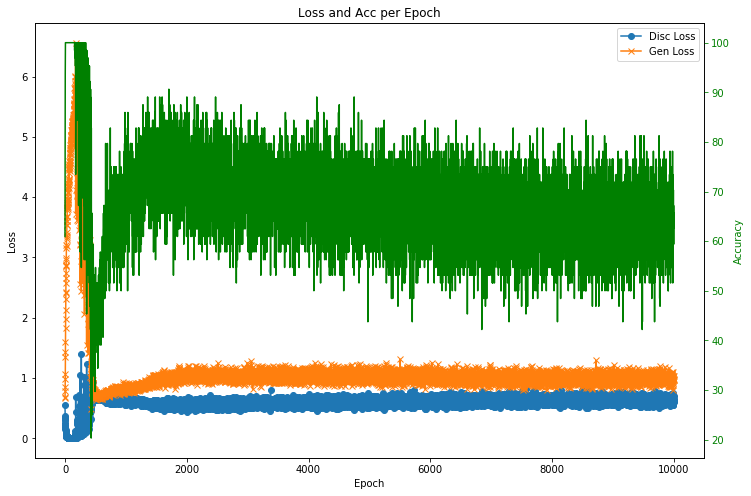

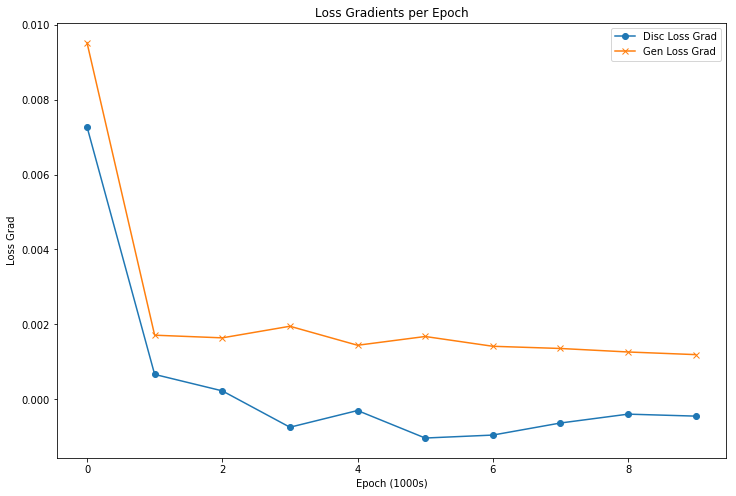

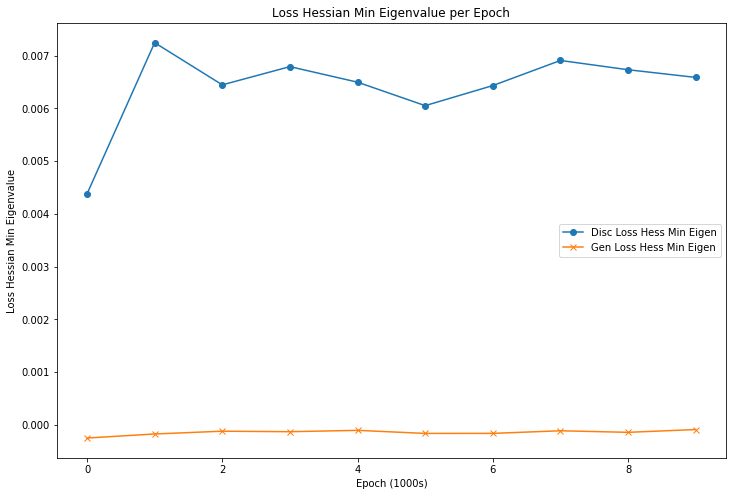

In [400]:
##### Adam with gamma = 1 #####
# learning_rate = 0.0002
# momentum = 0
# decay_rate = 0 # Decay rate is how we are going to achieve inf-GD
# nest = False # Nesterov's acceleration
##############################

# Initialize GAN object
opt_params = ['adam', 0.0002, 0, 0, False, 'adam_lr0.0002_decay0']
gan_adam_1 = GAN(opt_params)

# Train GAN
gan_adam_1_hist = gan_adam_1.train(epochs=10000, batch_size=32, sample_interval=1000)

# Plot of performance results (training and validation accuracies and loss) for every epoch
plt.rcParams['figure.figsize'] = (12, 8)
plot_loss_acc(gan_adam_1_hist)
plot_loss_gradient(gan_adam_1_hist)
plot_loss_hessian_eig(gan_adam_1_hist)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_34 (Flatten)         (None, 784)               0         
_________________________________________________________________
dense_238 (Dense)            (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_170 (LeakyReLU)  (None, 512)               0         
_________________________________________________________________
dense_239 (Dense)            (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_171 (LeakyReLU)  (None, 256)               0         
_________________________________________________________________
dense_240 (Dense)            (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
_________________________________________________________________
____

93 [D loss: 0.009230, acc.: 100.00%] [G loss: 4.565538]
94 [D loss: 0.009073, acc.: 100.00%] [G loss: 4.560024]
95 [D loss: 0.006987, acc.: 100.00%] [G loss: 4.660617]
96 [D loss: 0.007488, acc.: 100.00%] [G loss: 4.604083]
97 [D loss: 0.007857, acc.: 100.00%] [G loss: 4.485952]
98 [D loss: 0.007357, acc.: 100.00%] [G loss: 4.570121]
99 [D loss: 0.008293, acc.: 100.00%] [G loss: 4.545728]
100 [D loss: 0.007935, acc.: 100.00%] [G loss: 4.665634]
101 [D loss: 0.008345, acc.: 100.00%] [G loss: 4.651757]
102 [D loss: 0.008314, acc.: 100.00%] [G loss: 4.836245]
103 [D loss: 0.007618, acc.: 100.00%] [G loss: 4.706779]
104 [D loss: 0.008578, acc.: 100.00%] [G loss: 4.829684]
105 [D loss: 0.005149, acc.: 100.00%] [G loss: 4.704983]
106 [D loss: 0.011355, acc.: 100.00%] [G loss: 4.856085]
107 [D loss: 0.012701, acc.: 100.00%] [G loss: 4.836214]
108 [D loss: 0.006007, acc.: 100.00%] [G loss: 4.727947]
109 [D loss: 0.008019, acc.: 100.00%] [G loss: 4.882082]
110 [D loss: 0.006861, acc.: 100.00%] 

238 [D loss: 0.073900, acc.: 100.00%] [G loss: 3.515886]
239 [D loss: 0.073517, acc.: 96.88%] [G loss: 3.690197]
240 [D loss: 0.082829, acc.: 98.44%] [G loss: 3.816212]
241 [D loss: 0.309583, acc.: 82.81%] [G loss: 3.439118]
242 [D loss: 0.065538, acc.: 100.00%] [G loss: 3.975717]
243 [D loss: 0.240395, acc.: 89.06%] [G loss: 3.394099]
244 [D loss: 0.075757, acc.: 98.44%] [G loss: 3.991211]
245 [D loss: 0.138824, acc.: 98.44%] [G loss: 3.310735]
246 [D loss: 0.061999, acc.: 98.44%] [G loss: 3.718967]
247 [D loss: 0.211529, acc.: 92.19%] [G loss: 3.547974]
248 [D loss: 0.080436, acc.: 98.44%] [G loss: 3.874764]
249 [D loss: 0.327815, acc.: 82.81%] [G loss: 2.848035]
250 [D loss: 0.082551, acc.: 98.44%] [G loss: 4.122488]
251 [D loss: 0.130957, acc.: 98.44%] [G loss: 3.922348]
252 [D loss: 0.086602, acc.: 98.44%] [G loss: 4.020607]
253 [D loss: 0.069927, acc.: 100.00%] [G loss: 3.587611]
254 [D loss: 0.107546, acc.: 95.31%] [G loss: 3.738123]
255 [D loss: 0.126911, acc.: 93.75%] [G loss:

386 [D loss: 0.496844, acc.: 78.12%] [G loss: 2.963738]
387 [D loss: 0.477540, acc.: 71.88%] [G loss: 3.321692]
388 [D loss: 0.733995, acc.: 64.06%] [G loss: 1.843806]
389 [D loss: 0.241035, acc.: 95.31%] [G loss: 3.147430]
390 [D loss: 0.735805, acc.: 51.56%] [G loss: 1.459577]
391 [D loss: 0.265765, acc.: 87.50%] [G loss: 3.174357]
392 [D loss: 0.835424, acc.: 54.69%] [G loss: 1.680568]
393 [D loss: 0.286186, acc.: 87.50%] [G loss: 3.167631]
394 [D loss: 0.670630, acc.: 62.50%] [G loss: 1.781183]
395 [D loss: 0.363199, acc.: 79.69%] [G loss: 3.207907]
396 [D loss: 0.395722, acc.: 84.38%] [G loss: 2.257257]
397 [D loss: 0.378409, acc.: 85.94%] [G loss: 2.881317]
398 [D loss: 0.588241, acc.: 59.38%] [G loss: 2.254424]
399 [D loss: 0.379059, acc.: 82.81%] [G loss: 2.799273]
400 [D loss: 0.874902, acc.: 40.62%] [G loss: 1.455909]
401 [D loss: 0.325720, acc.: 84.38%] [G loss: 3.220114]
402 [D loss: 1.200155, acc.: 23.44%] [G loss: 0.610109]
403 [D loss: 0.534127, acc.: 64.06%] [G loss: 2.

535 [D loss: 0.672136, acc.: 46.88%] [G loss: 0.716524]
536 [D loss: 0.626881, acc.: 56.25%] [G loss: 0.709856]
537 [D loss: 0.670913, acc.: 56.25%] [G loss: 0.753977]
538 [D loss: 0.679723, acc.: 46.88%] [G loss: 0.747965]
539 [D loss: 0.659523, acc.: 53.12%] [G loss: 0.708521]
540 [D loss: 0.642385, acc.: 53.12%] [G loss: 0.748176]
541 [D loss: 0.675607, acc.: 51.56%] [G loss: 0.695534]
542 [D loss: 0.683116, acc.: 46.88%] [G loss: 0.726963]
543 [D loss: 0.636820, acc.: 56.25%] [G loss: 0.730481]
544 [D loss: 0.654450, acc.: 56.25%] [G loss: 0.723790]
545 [D loss: 0.663254, acc.: 53.12%] [G loss: 0.756403]
546 [D loss: 0.637660, acc.: 53.12%] [G loss: 0.744844]
547 [D loss: 0.661126, acc.: 54.69%] [G loss: 0.737892]
548 [D loss: 0.675895, acc.: 51.56%] [G loss: 0.741525]
549 [D loss: 0.688151, acc.: 50.00%] [G loss: 0.726161]
550 [D loss: 0.636248, acc.: 53.12%] [G loss: 0.732706]
551 [D loss: 0.620119, acc.: 60.94%] [G loss: 0.721528]
552 [D loss: 0.657066, acc.: 54.69%] [G loss: 0.

683 [D loss: 0.609753, acc.: 67.19%] [G loss: 0.829269]
684 [D loss: 0.591341, acc.: 70.31%] [G loss: 0.751563]
685 [D loss: 0.676760, acc.: 56.25%] [G loss: 0.780903]
686 [D loss: 0.636091, acc.: 62.50%] [G loss: 0.833486]
687 [D loss: 0.626535, acc.: 75.00%] [G loss: 0.840167]
688 [D loss: 0.633747, acc.: 65.62%] [G loss: 0.797104]
689 [D loss: 0.614482, acc.: 68.75%] [G loss: 0.843670]
690 [D loss: 0.621450, acc.: 67.19%] [G loss: 0.824340]
691 [D loss: 0.659058, acc.: 57.81%] [G loss: 0.825982]
692 [D loss: 0.653977, acc.: 67.19%] [G loss: 0.824698]
693 [D loss: 0.640590, acc.: 65.62%] [G loss: 0.743964]
694 [D loss: 0.619754, acc.: 65.62%] [G loss: 0.758020]
695 [D loss: 0.642591, acc.: 64.06%] [G loss: 0.771783]
696 [D loss: 0.632289, acc.: 73.44%] [G loss: 0.792923]
697 [D loss: 0.618698, acc.: 71.88%] [G loss: 0.786374]
698 [D loss: 0.623939, acc.: 56.25%] [G loss: 0.771566]
699 [D loss: 0.626866, acc.: 76.56%] [G loss: 0.803360]
700 [D loss: 0.604736, acc.: 67.19%] [G loss: 0.

831 [D loss: 0.615970, acc.: 73.44%] [G loss: 0.800738]
832 [D loss: 0.615632, acc.: 67.19%] [G loss: 0.807991]
833 [D loss: 0.631873, acc.: 70.31%] [G loss: 0.786062]
834 [D loss: 0.633903, acc.: 64.06%] [G loss: 0.760809]
835 [D loss: 0.640939, acc.: 64.06%] [G loss: 0.771066]
836 [D loss: 0.596089, acc.: 70.31%] [G loss: 0.818242]
837 [D loss: 0.660751, acc.: 54.69%] [G loss: 0.832474]
838 [D loss: 0.591826, acc.: 76.56%] [G loss: 0.806416]
839 [D loss: 0.602692, acc.: 70.31%] [G loss: 0.784111]
840 [D loss: 0.614105, acc.: 65.62%] [G loss: 0.788429]
841 [D loss: 0.629223, acc.: 59.38%] [G loss: 0.797671]
842 [D loss: 0.628757, acc.: 64.06%] [G loss: 0.816011]
843 [D loss: 0.619321, acc.: 70.31%] [G loss: 0.810783]
844 [D loss: 0.622478, acc.: 70.31%] [G loss: 0.796753]
845 [D loss: 0.612965, acc.: 59.38%] [G loss: 0.813975]
846 [D loss: 0.635318, acc.: 64.06%] [G loss: 0.811091]
847 [D loss: 0.594294, acc.: 73.44%] [G loss: 0.843936]
848 [D loss: 0.631786, acc.: 70.31%] [G loss: 0.

980 [D loss: 0.624119, acc.: 60.94%] [G loss: 0.818550]
981 [D loss: 0.613662, acc.: 70.31%] [G loss: 0.803648]
982 [D loss: 0.616730, acc.: 70.31%] [G loss: 0.790896]
983 [D loss: 0.628079, acc.: 56.25%] [G loss: 0.794387]
984 [D loss: 0.611417, acc.: 65.62%] [G loss: 0.771182]
985 [D loss: 0.639513, acc.: 56.25%] [G loss: 0.851882]
986 [D loss: 0.599547, acc.: 73.44%] [G loss: 0.825771]
987 [D loss: 0.612134, acc.: 67.19%] [G loss: 0.869050]
988 [D loss: 0.608339, acc.: 70.31%] [G loss: 0.864165]
989 [D loss: 0.647386, acc.: 60.94%] [G loss: 0.809463]
990 [D loss: 0.622298, acc.: 64.06%] [G loss: 0.828379]
991 [D loss: 0.622667, acc.: 68.75%] [G loss: 0.803429]
992 [D loss: 0.612035, acc.: 64.06%] [G loss: 0.801735]
993 [D loss: 0.608249, acc.: 70.31%] [G loss: 0.790304]
994 [D loss: 0.645233, acc.: 56.25%] [G loss: 0.801426]
995 [D loss: 0.601648, acc.: 65.62%] [G loss: 0.823972]
996 [D loss: 0.612440, acc.: 71.88%] [G loss: 0.812975]
997 [D loss: 0.607003, acc.: 73.44%] [G loss: 0.

1124 [D loss: 0.564509, acc.: 75.00%] [G loss: 0.921917]
1125 [D loss: 0.567447, acc.: 78.12%] [G loss: 0.906258]
1126 [D loss: 0.631865, acc.: 62.50%] [G loss: 0.857821]
1127 [D loss: 0.619214, acc.: 70.31%] [G loss: 0.821562]
1128 [D loss: 0.627351, acc.: 70.31%] [G loss: 0.884795]
1129 [D loss: 0.568268, acc.: 73.44%] [G loss: 0.868929]
1130 [D loss: 0.602712, acc.: 68.75%] [G loss: 0.889384]
1131 [D loss: 0.592340, acc.: 70.31%] [G loss: 0.856733]
1132 [D loss: 0.585033, acc.: 71.88%] [G loss: 0.857858]
1133 [D loss: 0.646983, acc.: 70.31%] [G loss: 0.827078]
1134 [D loss: 0.596010, acc.: 76.56%] [G loss: 0.828950]
1135 [D loss: 0.584380, acc.: 73.44%] [G loss: 0.821529]
1136 [D loss: 0.596592, acc.: 71.88%] [G loss: 0.880627]
1137 [D loss: 0.588423, acc.: 76.56%] [G loss: 0.854659]
1138 [D loss: 0.604108, acc.: 68.75%] [G loss: 0.884441]
1139 [D loss: 0.578355, acc.: 75.00%] [G loss: 0.863853]
1140 [D loss: 0.558066, acc.: 82.81%] [G loss: 0.889946]
1141 [D loss: 0.615090, acc.: 6

1269 [D loss: 0.572762, acc.: 76.56%] [G loss: 0.860407]
1270 [D loss: 0.621431, acc.: 68.75%] [G loss: 0.862227]
1271 [D loss: 0.614603, acc.: 68.75%] [G loss: 0.823364]
1272 [D loss: 0.561891, acc.: 73.44%] [G loss: 0.888508]
1273 [D loss: 0.595730, acc.: 75.00%] [G loss: 0.886960]
1274 [D loss: 0.640250, acc.: 59.38%] [G loss: 0.861686]
1275 [D loss: 0.509033, acc.: 87.50%] [G loss: 0.911903]
1276 [D loss: 0.594074, acc.: 68.75%] [G loss: 0.884101]
1277 [D loss: 0.557328, acc.: 78.12%] [G loss: 0.916219]
1278 [D loss: 0.606682, acc.: 65.62%] [G loss: 0.930730]
1279 [D loss: 0.604694, acc.: 67.19%] [G loss: 0.921180]
1280 [D loss: 0.579609, acc.: 68.75%] [G loss: 0.863991]
1281 [D loss: 0.602775, acc.: 67.19%] [G loss: 0.850082]
1282 [D loss: 0.559434, acc.: 70.31%] [G loss: 0.862543]
1283 [D loss: 0.598971, acc.: 70.31%] [G loss: 0.884116]
1284 [D loss: 0.584670, acc.: 76.56%] [G loss: 0.871103]
1285 [D loss: 0.590512, acc.: 70.31%] [G loss: 0.967885]
1286 [D loss: 0.619354, acc.: 6

1415 [D loss: 0.509657, acc.: 85.94%] [G loss: 0.943790]
1416 [D loss: 0.540269, acc.: 78.12%] [G loss: 0.950005]
1417 [D loss: 0.557581, acc.: 78.12%] [G loss: 0.904226]
1418 [D loss: 0.573940, acc.: 78.12%] [G loss: 0.894159]
1419 [D loss: 0.530258, acc.: 78.12%] [G loss: 1.011606]
1420 [D loss: 0.624541, acc.: 73.44%] [G loss: 0.932426]
1421 [D loss: 0.591908, acc.: 70.31%] [G loss: 0.916090]
1422 [D loss: 0.567240, acc.: 78.12%] [G loss: 0.934994]
1423 [D loss: 0.559133, acc.: 82.81%] [G loss: 0.897082]
1424 [D loss: 0.548816, acc.: 85.94%] [G loss: 0.880006]
1425 [D loss: 0.571189, acc.: 79.69%] [G loss: 0.832858]
1426 [D loss: 0.559529, acc.: 70.31%] [G loss: 0.950930]
1427 [D loss: 0.582428, acc.: 70.31%] [G loss: 0.928005]
1428 [D loss: 0.568308, acc.: 75.00%] [G loss: 0.910259]
1429 [D loss: 0.543523, acc.: 82.81%] [G loss: 0.873168]
1430 [D loss: 0.497698, acc.: 84.38%] [G loss: 0.848534]
1431 [D loss: 0.541649, acc.: 75.00%] [G loss: 0.899722]
1432 [D loss: 0.517935, acc.: 8

1562 [D loss: 0.615858, acc.: 65.62%] [G loss: 0.913676]
1563 [D loss: 0.585489, acc.: 68.75%] [G loss: 0.870383]
1564 [D loss: 0.523421, acc.: 79.69%] [G loss: 0.999899]
1565 [D loss: 0.556899, acc.: 73.44%] [G loss: 0.932651]
1566 [D loss: 0.546538, acc.: 78.12%] [G loss: 0.873771]
1567 [D loss: 0.617009, acc.: 65.62%] [G loss: 0.946465]
1568 [D loss: 0.530573, acc.: 87.50%] [G loss: 0.977862]
1569 [D loss: 0.618252, acc.: 67.19%] [G loss: 0.997753]
1570 [D loss: 0.568491, acc.: 76.56%] [G loss: 1.072809]
1571 [D loss: 0.598817, acc.: 71.88%] [G loss: 1.002249]
1572 [D loss: 0.545567, acc.: 81.25%] [G loss: 0.997435]
1573 [D loss: 0.589337, acc.: 73.44%] [G loss: 0.974018]
1574 [D loss: 0.520086, acc.: 71.88%] [G loss: 0.978375]
1575 [D loss: 0.514858, acc.: 84.38%] [G loss: 0.978922]
1576 [D loss: 0.543438, acc.: 78.12%] [G loss: 0.986678]
1577 [D loss: 0.530065, acc.: 78.12%] [G loss: 1.017181]
1578 [D loss: 0.558649, acc.: 76.56%] [G loss: 1.009588]
1579 [D loss: 0.581838, acc.: 7

1709 [D loss: 0.594404, acc.: 68.75%] [G loss: 0.951731]
1710 [D loss: 0.575106, acc.: 65.62%] [G loss: 0.906711]
1711 [D loss: 0.552153, acc.: 76.56%] [G loss: 0.992067]
1712 [D loss: 0.541036, acc.: 79.69%] [G loss: 0.948925]
1713 [D loss: 0.552167, acc.: 73.44%] [G loss: 0.957892]
1714 [D loss: 0.551816, acc.: 70.31%] [G loss: 1.045604]
1715 [D loss: 0.536157, acc.: 79.69%] [G loss: 0.923095]
1716 [D loss: 0.550719, acc.: 76.56%] [G loss: 0.940148]
1717 [D loss: 0.589446, acc.: 67.19%] [G loss: 0.940722]
1718 [D loss: 0.544066, acc.: 76.56%] [G loss: 1.005309]
1719 [D loss: 0.558455, acc.: 73.44%] [G loss: 1.034427]
1720 [D loss: 0.531935, acc.: 76.56%] [G loss: 0.995781]
1721 [D loss: 0.565181, acc.: 70.31%] [G loss: 1.022803]
1722 [D loss: 0.585043, acc.: 62.50%] [G loss: 1.053274]
1723 [D loss: 0.523809, acc.: 81.25%] [G loss: 0.991628]
1724 [D loss: 0.532103, acc.: 82.81%] [G loss: 0.990072]
1725 [D loss: 0.555046, acc.: 70.31%] [G loss: 1.029579]
1726 [D loss: 0.591275, acc.: 7

1856 [D loss: 0.553207, acc.: 73.44%] [G loss: 1.068288]
1857 [D loss: 0.530049, acc.: 76.56%] [G loss: 1.092608]
1858 [D loss: 0.540159, acc.: 75.00%] [G loss: 1.046674]
1859 [D loss: 0.532992, acc.: 75.00%] [G loss: 1.017223]
1860 [D loss: 0.547718, acc.: 75.00%] [G loss: 1.001230]
1861 [D loss: 0.624578, acc.: 60.94%] [G loss: 0.983350]
1862 [D loss: 0.546611, acc.: 70.31%] [G loss: 0.969701]
1863 [D loss: 0.501836, acc.: 85.94%] [G loss: 0.973295]
1864 [D loss: 0.556473, acc.: 70.31%] [G loss: 1.028211]
1865 [D loss: 0.579697, acc.: 65.62%] [G loss: 1.087149]
1866 [D loss: 0.500195, acc.: 81.25%] [G loss: 1.056061]
1867 [D loss: 0.558341, acc.: 76.56%] [G loss: 1.032340]
1868 [D loss: 0.553728, acc.: 76.56%] [G loss: 1.110284]
1869 [D loss: 0.630250, acc.: 64.06%] [G loss: 1.067200]
1870 [D loss: 0.531302, acc.: 89.06%] [G loss: 1.069833]
1871 [D loss: 0.540570, acc.: 71.88%] [G loss: 0.914063]
1872 [D loss: 0.487200, acc.: 82.81%] [G loss: 1.030191]
1873 [D loss: 0.553291, acc.: 7

Discriminator gradients:  0.00036694854
Generator gradients:  0.0016477136
Min XX Hessian eigenvalue:  0.006684993
Min ZZ Hessian eigenvalue:  -0.00015486727
2001 [D loss: 0.530254, acc.: 76.56%] [G loss: 1.115713]
2002 [D loss: 0.584149, acc.: 70.31%] [G loss: 0.944997]
2003 [D loss: 0.571998, acc.: 68.75%] [G loss: 1.067600]
2004 [D loss: 0.510122, acc.: 76.56%] [G loss: 1.109367]
2005 [D loss: 0.570987, acc.: 60.94%] [G loss: 0.981345]
2006 [D loss: 0.543696, acc.: 78.12%] [G loss: 1.067625]
2007 [D loss: 0.488498, acc.: 79.69%] [G loss: 1.029890]
2008 [D loss: 0.622812, acc.: 71.88%] [G loss: 1.008755]
2009 [D loss: 0.592641, acc.: 73.44%] [G loss: 0.985708]
2010 [D loss: 0.555416, acc.: 78.12%] [G loss: 0.941519]
2011 [D loss: 0.600010, acc.: 71.88%] [G loss: 1.099059]
2012 [D loss: 0.580474, acc.: 70.31%] [G loss: 1.082313]
2013 [D loss: 0.549260, acc.: 76.56%] [G loss: 1.117971]
2014 [D loss: 0.498876, acc.: 85.94%] [G loss: 1.078792]
2015 [D loss: 0.632327, acc.: 59.38%] [G los

2143 [D loss: 0.559333, acc.: 75.00%] [G loss: 0.984850]
2144 [D loss: 0.587203, acc.: 65.62%] [G loss: 1.034342]
2145 [D loss: 0.561832, acc.: 73.44%] [G loss: 1.081378]
2146 [D loss: 0.534982, acc.: 73.44%] [G loss: 1.051515]
2147 [D loss: 0.546134, acc.: 75.00%] [G loss: 1.017354]
2148 [D loss: 0.594551, acc.: 70.31%] [G loss: 1.046831]
2149 [D loss: 0.586923, acc.: 70.31%] [G loss: 0.954106]
2150 [D loss: 0.538343, acc.: 71.88%] [G loss: 1.021266]
2151 [D loss: 0.602029, acc.: 68.75%] [G loss: 1.015070]
2152 [D loss: 0.550208, acc.: 71.88%] [G loss: 0.969237]
2153 [D loss: 0.515769, acc.: 82.81%] [G loss: 1.000026]
2154 [D loss: 0.616489, acc.: 67.19%] [G loss: 0.943930]
2155 [D loss: 0.561734, acc.: 68.75%] [G loss: 0.996105]
2156 [D loss: 0.554672, acc.: 71.88%] [G loss: 1.042865]
2157 [D loss: 0.594303, acc.: 73.44%] [G loss: 1.050316]
2158 [D loss: 0.622919, acc.: 68.75%] [G loss: 1.111711]
2159 [D loss: 0.571799, acc.: 76.56%] [G loss: 1.060560]
2160 [D loss: 0.557022, acc.: 6

2287 [D loss: 0.525124, acc.: 79.69%] [G loss: 1.041552]
2288 [D loss: 0.621770, acc.: 64.06%] [G loss: 1.052488]
2289 [D loss: 0.570164, acc.: 79.69%] [G loss: 1.190261]
2290 [D loss: 0.640692, acc.: 64.06%] [G loss: 0.995221]
2291 [D loss: 0.593287, acc.: 65.62%] [G loss: 0.985210]
2292 [D loss: 0.591501, acc.: 75.00%] [G loss: 1.040309]
2293 [D loss: 0.540108, acc.: 78.12%] [G loss: 1.037802]
2294 [D loss: 0.549533, acc.: 78.12%] [G loss: 0.988056]
2295 [D loss: 0.516372, acc.: 71.88%] [G loss: 1.036811]
2296 [D loss: 0.652168, acc.: 56.25%] [G loss: 1.057857]
2297 [D loss: 0.587443, acc.: 71.88%] [G loss: 1.003232]
2298 [D loss: 0.545924, acc.: 65.62%] [G loss: 0.948044]
2299 [D loss: 0.559821, acc.: 71.88%] [G loss: 1.064824]
2300 [D loss: 0.530390, acc.: 79.69%] [G loss: 1.146621]
2301 [D loss: 0.568739, acc.: 70.31%] [G loss: 1.114328]
2302 [D loss: 0.642537, acc.: 70.31%] [G loss: 0.970088]
2303 [D loss: 0.542673, acc.: 70.31%] [G loss: 1.032016]
2304 [D loss: 0.525523, acc.: 8

2431 [D loss: 0.543915, acc.: 75.00%] [G loss: 0.996715]
2432 [D loss: 0.541924, acc.: 78.12%] [G loss: 1.027300]
2433 [D loss: 0.588438, acc.: 70.31%] [G loss: 1.052079]
2434 [D loss: 0.578909, acc.: 68.75%] [G loss: 1.033187]
2435 [D loss: 0.616417, acc.: 67.19%] [G loss: 0.980041]
2436 [D loss: 0.521148, acc.: 73.44%] [G loss: 0.938203]
2437 [D loss: 0.648631, acc.: 60.94%] [G loss: 0.871831]
2438 [D loss: 0.586075, acc.: 70.31%] [G loss: 1.027761]
2439 [D loss: 0.554845, acc.: 73.44%] [G loss: 1.009909]
2440 [D loss: 0.677531, acc.: 59.38%] [G loss: 0.961191]
2441 [D loss: 0.582407, acc.: 65.62%] [G loss: 0.974933]
2442 [D loss: 0.578265, acc.: 68.75%] [G loss: 0.902780]
2443 [D loss: 0.554213, acc.: 78.12%] [G loss: 0.965896]
2444 [D loss: 0.569550, acc.: 71.88%] [G loss: 0.970728]
2445 [D loss: 0.572783, acc.: 70.31%] [G loss: 0.948909]
2446 [D loss: 0.553148, acc.: 73.44%] [G loss: 1.059744]
2447 [D loss: 0.556925, acc.: 71.88%] [G loss: 0.987588]
2448 [D loss: 0.602015, acc.: 7

2578 [D loss: 0.522186, acc.: 82.81%] [G loss: 1.088341]
2579 [D loss: 0.603401, acc.: 68.75%] [G loss: 1.021688]
2580 [D loss: 0.625090, acc.: 60.94%] [G loss: 0.938493]
2581 [D loss: 0.591501, acc.: 70.31%] [G loss: 0.952588]
2582 [D loss: 0.635560, acc.: 68.75%] [G loss: 0.971493]
2583 [D loss: 0.637276, acc.: 59.38%] [G loss: 0.966213]
2584 [D loss: 0.584947, acc.: 70.31%] [G loss: 0.893363]
2585 [D loss: 0.624443, acc.: 67.19%] [G loss: 0.996484]
2586 [D loss: 0.579041, acc.: 73.44%] [G loss: 0.961227]
2587 [D loss: 0.560309, acc.: 70.31%] [G loss: 0.929386]
2588 [D loss: 0.531476, acc.: 79.69%] [G loss: 1.001981]
2589 [D loss: 0.574506, acc.: 68.75%] [G loss: 0.928279]
2590 [D loss: 0.529560, acc.: 71.88%] [G loss: 1.007333]
2591 [D loss: 0.563728, acc.: 62.50%] [G loss: 0.951025]
2592 [D loss: 0.552607, acc.: 75.00%] [G loss: 0.992475]
2593 [D loss: 0.587411, acc.: 67.19%] [G loss: 0.922611]
2594 [D loss: 0.552070, acc.: 68.75%] [G loss: 1.028750]
2595 [D loss: 0.605302, acc.: 7

2722 [D loss: 0.564845, acc.: 71.88%] [G loss: 1.026905]
2723 [D loss: 0.645930, acc.: 64.06%] [G loss: 0.939517]
2724 [D loss: 0.548077, acc.: 70.31%] [G loss: 0.996254]
2725 [D loss: 0.541645, acc.: 73.44%] [G loss: 0.991942]
2726 [D loss: 0.567236, acc.: 75.00%] [G loss: 1.029240]
2727 [D loss: 0.581161, acc.: 70.31%] [G loss: 1.088605]
2728 [D loss: 0.557173, acc.: 65.62%] [G loss: 1.023634]
2729 [D loss: 0.585390, acc.: 68.75%] [G loss: 0.932647]
2730 [D loss: 0.647236, acc.: 62.50%] [G loss: 0.965304]
2731 [D loss: 0.573708, acc.: 75.00%] [G loss: 1.061028]
2732 [D loss: 0.566784, acc.: 73.44%] [G loss: 1.009840]
2733 [D loss: 0.505206, acc.: 78.12%] [G loss: 1.019785]
2734 [D loss: 0.733155, acc.: 53.12%] [G loss: 0.970259]
2735 [D loss: 0.575361, acc.: 67.19%] [G loss: 0.927925]
2736 [D loss: 0.582016, acc.: 68.75%] [G loss: 1.058829]
2737 [D loss: 0.580739, acc.: 78.12%] [G loss: 1.099112]
2738 [D loss: 0.509035, acc.: 76.56%] [G loss: 1.065441]
2739 [D loss: 0.609584, acc.: 5

2867 [D loss: 0.574607, acc.: 67.19%] [G loss: 1.051217]
2868 [D loss: 0.711377, acc.: 56.25%] [G loss: 1.015401]
2869 [D loss: 0.622410, acc.: 64.06%] [G loss: 0.954057]
2870 [D loss: 0.604553, acc.: 67.19%] [G loss: 0.985769]
2871 [D loss: 0.586103, acc.: 64.06%] [G loss: 0.950354]
2872 [D loss: 0.577420, acc.: 73.44%] [G loss: 1.058979]
2873 [D loss: 0.595512, acc.: 71.88%] [G loss: 1.012830]
2874 [D loss: 0.631253, acc.: 65.62%] [G loss: 1.015481]
2875 [D loss: 0.544114, acc.: 81.25%] [G loss: 1.036967]
2876 [D loss: 0.609284, acc.: 64.06%] [G loss: 1.087706]
2877 [D loss: 0.575595, acc.: 70.31%] [G loss: 1.108972]
2878 [D loss: 0.559595, acc.: 79.69%] [G loss: 1.012626]
2879 [D loss: 0.578471, acc.: 68.75%] [G loss: 1.062939]
2880 [D loss: 0.584205, acc.: 68.75%] [G loss: 1.015150]
2881 [D loss: 0.622448, acc.: 67.19%] [G loss: 0.895463]
2882 [D loss: 0.573126, acc.: 71.88%] [G loss: 1.003252]
2883 [D loss: 0.645788, acc.: 65.62%] [G loss: 0.958365]
2884 [D loss: 0.573600, acc.: 6

3009 [D loss: 0.603354, acc.: 67.19%] [G loss: 1.068965]
3010 [D loss: 0.514200, acc.: 79.69%] [G loss: 1.139515]
3011 [D loss: 0.549444, acc.: 73.44%] [G loss: 1.117876]
3012 [D loss: 0.549445, acc.: 71.88%] [G loss: 1.098237]
3013 [D loss: 0.575730, acc.: 71.88%] [G loss: 1.048892]
3014 [D loss: 0.570204, acc.: 70.31%] [G loss: 1.063728]
3015 [D loss: 0.604647, acc.: 68.75%] [G loss: 1.077842]
3016 [D loss: 0.622191, acc.: 68.75%] [G loss: 1.057595]
3017 [D loss: 0.585411, acc.: 67.19%] [G loss: 1.088293]
3018 [D loss: 0.659147, acc.: 59.38%] [G loss: 1.032941]
3019 [D loss: 0.549275, acc.: 78.12%] [G loss: 1.053691]
3020 [D loss: 0.568219, acc.: 73.44%] [G loss: 1.022790]
3021 [D loss: 0.605958, acc.: 70.31%] [G loss: 1.061413]
3022 [D loss: 0.561095, acc.: 75.00%] [G loss: 1.093720]
3023 [D loss: 0.561406, acc.: 67.19%] [G loss: 1.094295]
3024 [D loss: 0.555605, acc.: 71.88%] [G loss: 1.092142]
3025 [D loss: 0.558260, acc.: 71.88%] [G loss: 0.983797]
3026 [D loss: 0.601708, acc.: 6

3153 [D loss: 0.659410, acc.: 56.25%] [G loss: 0.855086]
3154 [D loss: 0.531606, acc.: 76.56%] [G loss: 1.088879]
3155 [D loss: 0.536403, acc.: 75.00%] [G loss: 1.049478]
3156 [D loss: 0.566955, acc.: 78.12%] [G loss: 1.059572]
3157 [D loss: 0.626965, acc.: 67.19%] [G loss: 0.977948]
3158 [D loss: 0.581783, acc.: 73.44%] [G loss: 1.004233]
3159 [D loss: 0.583645, acc.: 75.00%] [G loss: 1.061180]
3160 [D loss: 0.580219, acc.: 73.44%] [G loss: 1.148906]
3161 [D loss: 0.600144, acc.: 71.88%] [G loss: 0.958157]
3162 [D loss: 0.606150, acc.: 67.19%] [G loss: 1.003711]
3163 [D loss: 0.609898, acc.: 64.06%] [G loss: 1.123859]
3164 [D loss: 0.657911, acc.: 62.50%] [G loss: 1.009014]
3165 [D loss: 0.574765, acc.: 65.62%] [G loss: 0.822082]
3166 [D loss: 0.628740, acc.: 64.06%] [G loss: 1.019593]
3167 [D loss: 0.534757, acc.: 79.69%] [G loss: 1.090234]
3168 [D loss: 0.518349, acc.: 79.69%] [G loss: 1.109110]
3169 [D loss: 0.613936, acc.: 64.06%] [G loss: 0.997386]
3170 [D loss: 0.538085, acc.: 7

3298 [D loss: 0.643813, acc.: 67.19%] [G loss: 1.007935]
3299 [D loss: 0.614247, acc.: 67.19%] [G loss: 0.939468]
3300 [D loss: 0.624850, acc.: 60.94%] [G loss: 1.126523]
3301 [D loss: 0.550674, acc.: 76.56%] [G loss: 1.089156]
3302 [D loss: 0.601617, acc.: 70.31%] [G loss: 1.011971]
3303 [D loss: 0.692550, acc.: 59.38%] [G loss: 0.935556]
3304 [D loss: 0.634630, acc.: 60.94%] [G loss: 1.033203]
3305 [D loss: 0.672104, acc.: 65.62%] [G loss: 1.010099]
3306 [D loss: 0.602140, acc.: 73.44%] [G loss: 0.940279]
3307 [D loss: 0.602450, acc.: 65.62%] [G loss: 1.030926]
3308 [D loss: 0.565106, acc.: 70.31%] [G loss: 1.071121]
3309 [D loss: 0.571914, acc.: 73.44%] [G loss: 0.982515]
3310 [D loss: 0.566729, acc.: 67.19%] [G loss: 1.025329]
3311 [D loss: 0.542615, acc.: 76.56%] [G loss: 1.083063]
3312 [D loss: 0.609762, acc.: 71.88%] [G loss: 0.978525]
3313 [D loss: 0.526076, acc.: 84.38%] [G loss: 1.107505]
3314 [D loss: 0.656538, acc.: 53.12%] [G loss: 1.045401]
3315 [D loss: 0.557492, acc.: 7

3442 [D loss: 0.514536, acc.: 82.81%] [G loss: 1.121194]
3443 [D loss: 0.640796, acc.: 57.81%] [G loss: 1.068277]
3444 [D loss: 0.525168, acc.: 78.12%] [G loss: 0.932519]
3445 [D loss: 0.589976, acc.: 67.19%] [G loss: 0.979534]
3446 [D loss: 0.612980, acc.: 73.44%] [G loss: 1.027920]
3447 [D loss: 0.553200, acc.: 76.56%] [G loss: 1.024219]
3448 [D loss: 0.615222, acc.: 65.62%] [G loss: 0.981339]
3449 [D loss: 0.601667, acc.: 67.19%] [G loss: 1.088082]
3450 [D loss: 0.632477, acc.: 60.94%] [G loss: 1.069241]
3451 [D loss: 0.554195, acc.: 73.44%] [G loss: 1.116081]
3452 [D loss: 0.612727, acc.: 65.62%] [G loss: 1.007700]
3453 [D loss: 0.612948, acc.: 67.19%] [G loss: 0.997790]
3454 [D loss: 0.540647, acc.: 78.12%] [G loss: 0.993549]
3455 [D loss: 0.607373, acc.: 70.31%] [G loss: 1.053329]
3456 [D loss: 0.639151, acc.: 59.38%] [G loss: 0.940486]
3457 [D loss: 0.639245, acc.: 64.06%] [G loss: 1.042462]
3458 [D loss: 0.625701, acc.: 67.19%] [G loss: 1.051613]
3459 [D loss: 0.561954, acc.: 7

3587 [D loss: 0.661937, acc.: 65.62%] [G loss: 1.062381]
3588 [D loss: 0.580073, acc.: 73.44%] [G loss: 1.139353]
3589 [D loss: 0.557190, acc.: 75.00%] [G loss: 0.997717]
3590 [D loss: 0.537236, acc.: 73.44%] [G loss: 1.060208]
3591 [D loss: 0.631321, acc.: 64.06%] [G loss: 1.045615]
3592 [D loss: 0.586415, acc.: 71.88%] [G loss: 1.008964]
3593 [D loss: 0.622483, acc.: 75.00%] [G loss: 1.026938]
3594 [D loss: 0.605859, acc.: 65.62%] [G loss: 1.032230]
3595 [D loss: 0.619876, acc.: 67.19%] [G loss: 0.916769]
3596 [D loss: 0.597569, acc.: 65.62%] [G loss: 0.958987]
3597 [D loss: 0.592183, acc.: 67.19%] [G loss: 1.066862]
3598 [D loss: 0.656651, acc.: 59.38%] [G loss: 1.121520]
3599 [D loss: 0.515192, acc.: 78.12%] [G loss: 1.066277]
3600 [D loss: 0.540358, acc.: 73.44%] [G loss: 1.002181]
3601 [D loss: 0.648458, acc.: 57.81%] [G loss: 0.972924]
3602 [D loss: 0.636338, acc.: 70.31%] [G loss: 0.926254]
3603 [D loss: 0.603120, acc.: 65.62%] [G loss: 1.088476]
3604 [D loss: 0.550062, acc.: 8

3731 [D loss: 0.650961, acc.: 62.50%] [G loss: 1.030920]
3732 [D loss: 0.643947, acc.: 62.50%] [G loss: 1.059093]
3733 [D loss: 0.585562, acc.: 70.31%] [G loss: 0.942502]
3734 [D loss: 0.639508, acc.: 67.19%] [G loss: 1.053954]
3735 [D loss: 0.679247, acc.: 60.94%] [G loss: 0.964643]
3736 [D loss: 0.641726, acc.: 68.75%] [G loss: 1.072458]
3737 [D loss: 0.644528, acc.: 62.50%] [G loss: 1.026595]
3738 [D loss: 0.564573, acc.: 70.31%] [G loss: 1.145995]
3739 [D loss: 0.574086, acc.: 75.00%] [G loss: 1.023194]
3740 [D loss: 0.585779, acc.: 67.19%] [G loss: 1.101907]
3741 [D loss: 0.569774, acc.: 67.19%] [G loss: 1.062224]
3742 [D loss: 0.613893, acc.: 60.94%] [G loss: 0.978512]
3743 [D loss: 0.578484, acc.: 73.44%] [G loss: 1.009724]
3744 [D loss: 0.590446, acc.: 71.88%] [G loss: 1.059989]
3745 [D loss: 0.584149, acc.: 73.44%] [G loss: 1.013649]
3746 [D loss: 0.687609, acc.: 51.56%] [G loss: 1.050708]
3747 [D loss: 0.585815, acc.: 64.06%] [G loss: 0.983514]
3748 [D loss: 0.528692, acc.: 7

3875 [D loss: 0.638451, acc.: 62.50%] [G loss: 1.049411]
3876 [D loss: 0.626424, acc.: 59.38%] [G loss: 1.060702]
3877 [D loss: 0.570848, acc.: 68.75%] [G loss: 1.092711]
3878 [D loss: 0.540649, acc.: 76.56%] [G loss: 1.081585]
3879 [D loss: 0.540830, acc.: 70.31%] [G loss: 1.012559]
3880 [D loss: 0.609965, acc.: 65.62%] [G loss: 0.896799]
3881 [D loss: 0.664871, acc.: 60.94%] [G loss: 1.052619]
3882 [D loss: 0.606051, acc.: 70.31%] [G loss: 1.006910]
3883 [D loss: 0.567685, acc.: 71.88%] [G loss: 1.047277]
3884 [D loss: 0.659688, acc.: 56.25%] [G loss: 1.096086]
3885 [D loss: 0.662526, acc.: 57.81%] [G loss: 1.057106]
3886 [D loss: 0.594017, acc.: 71.88%] [G loss: 1.065760]
3887 [D loss: 0.620883, acc.: 70.31%] [G loss: 0.967207]
3888 [D loss: 0.651971, acc.: 65.62%] [G loss: 0.836142]
3889 [D loss: 0.488236, acc.: 84.38%] [G loss: 1.033107]
3890 [D loss: 0.627797, acc.: 64.06%] [G loss: 0.959480]
3891 [D loss: 0.509123, acc.: 84.38%] [G loss: 0.966794]
3892 [D loss: 0.540986, acc.: 8

4018 [D loss: 0.607834, acc.: 62.50%] [G loss: 1.061192]
4019 [D loss: 0.569306, acc.: 76.56%] [G loss: 1.026244]
4020 [D loss: 0.623478, acc.: 65.62%] [G loss: 0.947555]
4021 [D loss: 0.612430, acc.: 62.50%] [G loss: 0.992396]
4022 [D loss: 0.606214, acc.: 64.06%] [G loss: 1.010422]
4023 [D loss: 0.596115, acc.: 68.75%] [G loss: 1.044220]
4024 [D loss: 0.541462, acc.: 73.44%] [G loss: 0.976067]
4025 [D loss: 0.578410, acc.: 71.88%] [G loss: 0.995052]
4026 [D loss: 0.549312, acc.: 70.31%] [G loss: 1.095448]
4027 [D loss: 0.631991, acc.: 64.06%] [G loss: 1.012684]
4028 [D loss: 0.553814, acc.: 78.12%] [G loss: 1.067848]
4029 [D loss: 0.612835, acc.: 73.44%] [G loss: 0.956846]
4030 [D loss: 0.621120, acc.: 67.19%] [G loss: 0.923729]
4031 [D loss: 0.601267, acc.: 68.75%] [G loss: 0.928375]
4032 [D loss: 0.589811, acc.: 68.75%] [G loss: 0.951665]
4033 [D loss: 0.577609, acc.: 68.75%] [G loss: 1.039368]
4034 [D loss: 0.644436, acc.: 64.06%] [G loss: 1.094244]
4035 [D loss: 0.604644, acc.: 6

4162 [D loss: 0.586404, acc.: 71.88%] [G loss: 1.124623]
4163 [D loss: 0.577004, acc.: 68.75%] [G loss: 1.058482]
4164 [D loss: 0.557450, acc.: 79.69%] [G loss: 0.975602]
4165 [D loss: 0.593262, acc.: 62.50%] [G loss: 0.962540]
4166 [D loss: 0.575583, acc.: 68.75%] [G loss: 0.894357]
4167 [D loss: 0.609182, acc.: 64.06%] [G loss: 0.970882]
4168 [D loss: 0.630134, acc.: 64.06%] [G loss: 1.030321]
4169 [D loss: 0.592688, acc.: 67.19%] [G loss: 0.925435]
4170 [D loss: 0.615622, acc.: 68.75%] [G loss: 1.022422]
4171 [D loss: 0.654043, acc.: 67.19%] [G loss: 1.048291]
4172 [D loss: 0.488639, acc.: 79.69%] [G loss: 0.984598]
4173 [D loss: 0.569712, acc.: 76.56%] [G loss: 1.114392]
4174 [D loss: 0.597682, acc.: 64.06%] [G loss: 1.094061]
4175 [D loss: 0.532753, acc.: 79.69%] [G loss: 1.024632]
4176 [D loss: 0.601278, acc.: 73.44%] [G loss: 1.145568]
4177 [D loss: 0.678163, acc.: 46.88%] [G loss: 0.999163]
4178 [D loss: 0.647601, acc.: 64.06%] [G loss: 1.056602]
4179 [D loss: 0.599514, acc.: 6

4306 [D loss: 0.596790, acc.: 70.31%] [G loss: 1.016300]
4307 [D loss: 0.604769, acc.: 68.75%] [G loss: 1.022975]
4308 [D loss: 0.557528, acc.: 71.88%] [G loss: 1.083628]
4309 [D loss: 0.558519, acc.: 78.12%] [G loss: 1.070431]
4310 [D loss: 0.509682, acc.: 78.12%] [G loss: 0.932015]
4311 [D loss: 0.663687, acc.: 57.81%] [G loss: 0.918677]
4312 [D loss: 0.616011, acc.: 64.06%] [G loss: 0.981776]
4313 [D loss: 0.600340, acc.: 70.31%] [G loss: 0.988095]
4314 [D loss: 0.626065, acc.: 68.75%] [G loss: 0.997439]
4315 [D loss: 0.611838, acc.: 67.19%] [G loss: 1.007012]
4316 [D loss: 0.643527, acc.: 62.50%] [G loss: 1.062346]
4317 [D loss: 0.617525, acc.: 70.31%] [G loss: 1.026544]
4318 [D loss: 0.659383, acc.: 67.19%] [G loss: 1.007692]
4319 [D loss: 0.608653, acc.: 64.06%] [G loss: 1.105582]
4320 [D loss: 0.545653, acc.: 78.12%] [G loss: 1.148062]
4321 [D loss: 0.520677, acc.: 75.00%] [G loss: 1.191671]
4322 [D loss: 0.561577, acc.: 73.44%] [G loss: 1.003225]
4323 [D loss: 0.606804, acc.: 7

4451 [D loss: 0.602931, acc.: 68.75%] [G loss: 0.984212]
4452 [D loss: 0.595293, acc.: 67.19%] [G loss: 0.916036]
4453 [D loss: 0.551173, acc.: 73.44%] [G loss: 0.989065]
4454 [D loss: 0.654600, acc.: 64.06%] [G loss: 0.927241]
4455 [D loss: 0.539893, acc.: 76.56%] [G loss: 0.950788]
4456 [D loss: 0.657243, acc.: 60.94%] [G loss: 1.030870]
4457 [D loss: 0.561857, acc.: 75.00%] [G loss: 0.990717]
4458 [D loss: 0.627744, acc.: 65.62%] [G loss: 1.087595]
4459 [D loss: 0.648649, acc.: 54.69%] [G loss: 0.969946]
4460 [D loss: 0.609506, acc.: 68.75%] [G loss: 0.952802]
4461 [D loss: 0.526417, acc.: 73.44%] [G loss: 0.858957]
4462 [D loss: 0.626871, acc.: 67.19%] [G loss: 1.022022]
4463 [D loss: 0.631427, acc.: 67.19%] [G loss: 0.931359]
4464 [D loss: 0.550028, acc.: 79.69%] [G loss: 1.006855]
4465 [D loss: 0.591272, acc.: 68.75%] [G loss: 1.068724]
4466 [D loss: 0.590487, acc.: 71.88%] [G loss: 1.021216]
4467 [D loss: 0.570700, acc.: 73.44%] [G loss: 1.032199]
4468 [D loss: 0.606250, acc.: 6

4597 [D loss: 0.604672, acc.: 70.31%] [G loss: 1.005155]
4598 [D loss: 0.649921, acc.: 57.81%] [G loss: 1.062867]
4599 [D loss: 0.560749, acc.: 67.19%] [G loss: 1.040190]
4600 [D loss: 0.660767, acc.: 53.12%] [G loss: 1.019135]
4601 [D loss: 0.601790, acc.: 73.44%] [G loss: 1.067829]
4602 [D loss: 0.550322, acc.: 79.69%] [G loss: 1.033526]
4603 [D loss: 0.547110, acc.: 76.56%] [G loss: 1.061929]
4604 [D loss: 0.658455, acc.: 60.94%] [G loss: 1.002631]
4605 [D loss: 0.576784, acc.: 70.31%] [G loss: 1.031155]
4606 [D loss: 0.609269, acc.: 64.06%] [G loss: 1.024040]
4607 [D loss: 0.660331, acc.: 54.69%] [G loss: 1.033363]
4608 [D loss: 0.607422, acc.: 67.19%] [G loss: 1.039252]
4609 [D loss: 0.590199, acc.: 68.75%] [G loss: 1.176952]
4610 [D loss: 0.593075, acc.: 73.44%] [G loss: 0.954363]
4611 [D loss: 0.616745, acc.: 65.62%] [G loss: 1.042935]
4612 [D loss: 0.611993, acc.: 60.94%] [G loss: 1.032665]
4613 [D loss: 0.619289, acc.: 67.19%] [G loss: 0.983777]
4614 [D loss: 0.621590, acc.: 6

4742 [D loss: 0.609873, acc.: 67.19%] [G loss: 0.983375]
4743 [D loss: 0.514939, acc.: 81.25%] [G loss: 0.971197]
4744 [D loss: 0.546695, acc.: 71.88%] [G loss: 1.039189]
4745 [D loss: 0.567995, acc.: 68.75%] [G loss: 0.939270]
4746 [D loss: 0.657145, acc.: 62.50%] [G loss: 1.074810]
4747 [D loss: 0.625870, acc.: 67.19%] [G loss: 0.951014]
4748 [D loss: 0.502632, acc.: 78.12%] [G loss: 1.014092]
4749 [D loss: 0.650173, acc.: 62.50%] [G loss: 0.926845]
4750 [D loss: 0.667240, acc.: 64.06%] [G loss: 1.054984]
4751 [D loss: 0.535621, acc.: 76.56%] [G loss: 1.111084]
4752 [D loss: 0.529700, acc.: 75.00%] [G loss: 0.959249]
4753 [D loss: 0.562617, acc.: 75.00%] [G loss: 1.062312]
4754 [D loss: 0.623487, acc.: 67.19%] [G loss: 1.077531]
4755 [D loss: 0.616001, acc.: 70.31%] [G loss: 1.003041]
4756 [D loss: 0.689535, acc.: 57.81%] [G loss: 0.956029]
4757 [D loss: 0.649557, acc.: 54.69%] [G loss: 0.947402]
4758 [D loss: 0.600243, acc.: 60.94%] [G loss: 1.074986]
4759 [D loss: 0.638746, acc.: 6

4887 [D loss: 0.647131, acc.: 62.50%] [G loss: 0.967337]
4888 [D loss: 0.637679, acc.: 62.50%] [G loss: 0.947614]
4889 [D loss: 0.567282, acc.: 73.44%] [G loss: 0.879857]
4890 [D loss: 0.597819, acc.: 67.19%] [G loss: 0.938764]
4891 [D loss: 0.632587, acc.: 64.06%] [G loss: 0.936389]
4892 [D loss: 0.567923, acc.: 76.56%] [G loss: 0.975423]
4893 [D loss: 0.727369, acc.: 54.69%] [G loss: 1.009135]
4894 [D loss: 0.612832, acc.: 57.81%] [G loss: 1.109989]
4895 [D loss: 0.534282, acc.: 76.56%] [G loss: 1.121050]
4896 [D loss: 0.623832, acc.: 62.50%] [G loss: 1.103583]
4897 [D loss: 0.549402, acc.: 78.12%] [G loss: 1.039365]
4898 [D loss: 0.543991, acc.: 76.56%] [G loss: 0.993197]
4899 [D loss: 0.570366, acc.: 70.31%] [G loss: 1.066320]
4900 [D loss: 0.623418, acc.: 68.75%] [G loss: 0.940379]
4901 [D loss: 0.642057, acc.: 68.75%] [G loss: 0.986767]
4902 [D loss: 0.618702, acc.: 60.94%] [G loss: 0.981032]
4903 [D loss: 0.671212, acc.: 56.25%] [G loss: 0.926249]
4904 [D loss: 0.629334, acc.: 6

5030 [D loss: 0.560206, acc.: 76.56%] [G loss: 0.932249]
5031 [D loss: 0.577147, acc.: 71.88%] [G loss: 0.924415]
5032 [D loss: 0.625021, acc.: 59.38%] [G loss: 0.941964]
5033 [D loss: 0.580412, acc.: 70.31%] [G loss: 0.985249]
5034 [D loss: 0.655090, acc.: 65.62%] [G loss: 1.026949]
5035 [D loss: 0.713941, acc.: 50.00%] [G loss: 1.069416]
5036 [D loss: 0.649078, acc.: 68.75%] [G loss: 1.028904]
5037 [D loss: 0.590650, acc.: 67.19%] [G loss: 0.976792]
5038 [D loss: 0.690058, acc.: 59.38%] [G loss: 0.951845]
5039 [D loss: 0.690312, acc.: 53.12%] [G loss: 0.937362]
5040 [D loss: 0.600249, acc.: 64.06%] [G loss: 0.903077]
5041 [D loss: 0.576900, acc.: 73.44%] [G loss: 1.006300]
5042 [D loss: 0.641803, acc.: 67.19%] [G loss: 1.021566]
5043 [D loss: 0.611043, acc.: 64.06%] [G loss: 0.979503]
5044 [D loss: 0.607480, acc.: 64.06%] [G loss: 0.960610]
5045 [D loss: 0.591548, acc.: 73.44%] [G loss: 0.990462]
5046 [D loss: 0.625170, acc.: 62.50%] [G loss: 0.920150]
5047 [D loss: 0.635458, acc.: 6

5174 [D loss: 0.561941, acc.: 76.56%] [G loss: 1.073524]
5175 [D loss: 0.568836, acc.: 70.31%] [G loss: 1.033149]
5176 [D loss: 0.673602, acc.: 59.38%] [G loss: 0.975071]
5177 [D loss: 0.620026, acc.: 59.38%] [G loss: 1.097883]
5178 [D loss: 0.576118, acc.: 73.44%] [G loss: 1.156655]
5179 [D loss: 0.667828, acc.: 68.75%] [G loss: 0.969242]
5180 [D loss: 0.558571, acc.: 70.31%] [G loss: 0.965666]
5181 [D loss: 0.558716, acc.: 70.31%] [G loss: 0.948200]
5182 [D loss: 0.665049, acc.: 57.81%] [G loss: 0.999964]
5183 [D loss: 0.562151, acc.: 71.88%] [G loss: 1.030467]
5184 [D loss: 0.575990, acc.: 70.31%] [G loss: 0.962492]
5185 [D loss: 0.619759, acc.: 65.62%] [G loss: 1.049557]
5186 [D loss: 0.610392, acc.: 67.19%] [G loss: 1.061756]
5187 [D loss: 0.675314, acc.: 60.94%] [G loss: 0.998491]
5188 [D loss: 0.606421, acc.: 65.62%] [G loss: 1.073347]
5189 [D loss: 0.655624, acc.: 62.50%] [G loss: 1.108545]
5190 [D loss: 0.579650, acc.: 71.88%] [G loss: 1.036419]
5191 [D loss: 0.668702, acc.: 6

5319 [D loss: 0.696056, acc.: 57.81%] [G loss: 1.044403]
5320 [D loss: 0.554760, acc.: 70.31%] [G loss: 1.008667]
5321 [D loss: 0.726271, acc.: 54.69%] [G loss: 0.970754]
5322 [D loss: 0.645483, acc.: 64.06%] [G loss: 0.966020]
5323 [D loss: 0.576585, acc.: 68.75%] [G loss: 0.949630]
5324 [D loss: 0.616098, acc.: 71.88%] [G loss: 0.907051]
5325 [D loss: 0.564863, acc.: 76.56%] [G loss: 0.999086]
5326 [D loss: 0.582072, acc.: 62.50%] [G loss: 0.918293]
5327 [D loss: 0.629251, acc.: 65.62%] [G loss: 0.954995]
5328 [D loss: 0.559456, acc.: 76.56%] [G loss: 1.124427]
5329 [D loss: 0.582530, acc.: 68.75%] [G loss: 0.986672]
5330 [D loss: 0.687285, acc.: 54.69%] [G loss: 1.018594]
5331 [D loss: 0.603365, acc.: 64.06%] [G loss: 0.982310]
5332 [D loss: 0.596356, acc.: 75.00%] [G loss: 1.095175]
5333 [D loss: 0.589796, acc.: 73.44%] [G loss: 1.003697]
5334 [D loss: 0.625813, acc.: 64.06%] [G loss: 1.043599]
5335 [D loss: 0.615474, acc.: 62.50%] [G loss: 1.013935]
5336 [D loss: 0.597186, acc.: 6

5464 [D loss: 0.600895, acc.: 68.75%] [G loss: 0.992004]
5465 [D loss: 0.676381, acc.: 62.50%] [G loss: 1.002260]
5466 [D loss: 0.565875, acc.: 70.31%] [G loss: 1.127493]
5467 [D loss: 0.665222, acc.: 64.06%] [G loss: 1.048707]
5468 [D loss: 0.679193, acc.: 56.25%] [G loss: 1.087251]
5469 [D loss: 0.610854, acc.: 70.31%] [G loss: 0.952589]
5470 [D loss: 0.641299, acc.: 64.06%] [G loss: 1.043108]
5471 [D loss: 0.739006, acc.: 48.44%] [G loss: 1.042533]
5472 [D loss: 0.646721, acc.: 60.94%] [G loss: 1.075850]
5473 [D loss: 0.677699, acc.: 56.25%] [G loss: 0.996053]
5474 [D loss: 0.614895, acc.: 65.62%] [G loss: 1.047387]
5475 [D loss: 0.607953, acc.: 67.19%] [G loss: 1.101736]
5476 [D loss: 0.653340, acc.: 67.19%] [G loss: 1.030795]
5477 [D loss: 0.695342, acc.: 56.25%] [G loss: 0.927318]
5478 [D loss: 0.697093, acc.: 59.38%] [G loss: 0.854831]
5479 [D loss: 0.622339, acc.: 65.62%] [G loss: 0.890038]
5480 [D loss: 0.578520, acc.: 70.31%] [G loss: 0.940281]
5481 [D loss: 0.667482, acc.: 6

5609 [D loss: 0.584559, acc.: 73.44%] [G loss: 1.034768]
5610 [D loss: 0.646971, acc.: 65.62%] [G loss: 1.035626]
5611 [D loss: 0.620751, acc.: 71.88%] [G loss: 0.908209]
5612 [D loss: 0.597817, acc.: 71.88%] [G loss: 0.985183]
5613 [D loss: 0.671358, acc.: 57.81%] [G loss: 0.970765]
5614 [D loss: 0.579017, acc.: 67.19%] [G loss: 0.930068]
5615 [D loss: 0.562351, acc.: 73.44%] [G loss: 1.069007]
5616 [D loss: 0.634668, acc.: 59.38%] [G loss: 1.070861]
5617 [D loss: 0.610431, acc.: 62.50%] [G loss: 1.004039]
5618 [D loss: 0.606057, acc.: 60.94%] [G loss: 1.077282]
5619 [D loss: 0.707202, acc.: 57.81%] [G loss: 0.946819]
5620 [D loss: 0.651322, acc.: 64.06%] [G loss: 1.034323]
5621 [D loss: 0.610202, acc.: 65.62%] [G loss: 1.084786]
5622 [D loss: 0.515288, acc.: 76.56%] [G loss: 1.059432]
5623 [D loss: 0.599033, acc.: 64.06%] [G loss: 1.035481]
5624 [D loss: 0.592334, acc.: 67.19%] [G loss: 1.057139]
5625 [D loss: 0.676062, acc.: 64.06%] [G loss: 0.947378]
5626 [D loss: 0.647720, acc.: 5

5753 [D loss: 0.561954, acc.: 76.56%] [G loss: 1.000281]
5754 [D loss: 0.558141, acc.: 71.88%] [G loss: 0.965587]
5755 [D loss: 0.583035, acc.: 70.31%] [G loss: 0.923684]
5756 [D loss: 0.562869, acc.: 71.88%] [G loss: 1.104365]
5757 [D loss: 0.646585, acc.: 65.62%] [G loss: 1.026727]
5758 [D loss: 0.595514, acc.: 67.19%] [G loss: 1.014298]
5759 [D loss: 0.618504, acc.: 70.31%] [G loss: 0.950492]
5760 [D loss: 0.661683, acc.: 64.06%] [G loss: 1.053375]
5761 [D loss: 0.623210, acc.: 67.19%] [G loss: 1.093772]
5762 [D loss: 0.571520, acc.: 70.31%] [G loss: 1.024376]
5763 [D loss: 0.613003, acc.: 75.00%] [G loss: 0.944813]
5764 [D loss: 0.624411, acc.: 71.88%] [G loss: 0.923679]
5765 [D loss: 0.629346, acc.: 64.06%] [G loss: 1.020764]
5766 [D loss: 0.639004, acc.: 60.94%] [G loss: 1.118222]
5767 [D loss: 0.621249, acc.: 62.50%] [G loss: 1.080018]
5768 [D loss: 0.622917, acc.: 70.31%] [G loss: 1.006852]
5769 [D loss: 0.632450, acc.: 60.94%] [G loss: 1.070371]
5770 [D loss: 0.664586, acc.: 6

5897 [D loss: 0.612823, acc.: 60.94%] [G loss: 1.003671]
5898 [D loss: 0.608046, acc.: 70.31%] [G loss: 0.988469]
5899 [D loss: 0.602269, acc.: 68.75%] [G loss: 1.037707]
5900 [D loss: 0.542313, acc.: 75.00%] [G loss: 0.994368]
5901 [D loss: 0.637721, acc.: 59.38%] [G loss: 1.125527]
5902 [D loss: 0.716239, acc.: 64.06%] [G loss: 0.936594]
5903 [D loss: 0.630602, acc.: 62.50%] [G loss: 1.055818]
5904 [D loss: 0.663642, acc.: 57.81%] [G loss: 0.946563]
5905 [D loss: 0.598210, acc.: 68.75%] [G loss: 1.011903]
5906 [D loss: 0.633784, acc.: 60.94%] [G loss: 1.074728]
5907 [D loss: 0.610504, acc.: 64.06%] [G loss: 1.109933]
5908 [D loss: 0.579307, acc.: 68.75%] [G loss: 1.090270]
5909 [D loss: 0.731434, acc.: 54.69%] [G loss: 0.961862]
5910 [D loss: 0.635272, acc.: 67.19%] [G loss: 0.976401]
5911 [D loss: 0.643500, acc.: 64.06%] [G loss: 0.968042]
5912 [D loss: 0.627877, acc.: 67.19%] [G loss: 1.030593]
5913 [D loss: 0.618477, acc.: 71.88%] [G loss: 1.012356]
5914 [D loss: 0.576418, acc.: 7

6038 [D loss: 0.643077, acc.: 67.19%] [G loss: 1.036370]
6039 [D loss: 0.687849, acc.: 54.69%] [G loss: 0.977249]
6040 [D loss: 0.610443, acc.: 71.88%] [G loss: 0.986475]
6041 [D loss: 0.682026, acc.: 53.12%] [G loss: 0.988958]
6042 [D loss: 0.645249, acc.: 56.25%] [G loss: 0.904261]
6043 [D loss: 0.623783, acc.: 62.50%] [G loss: 0.972392]
6044 [D loss: 0.599845, acc.: 71.88%] [G loss: 1.065730]
6045 [D loss: 0.600155, acc.: 68.75%] [G loss: 0.994914]
6046 [D loss: 0.563437, acc.: 73.44%] [G loss: 0.953232]
6047 [D loss: 0.725883, acc.: 56.25%] [G loss: 0.973593]
6048 [D loss: 0.598533, acc.: 67.19%] [G loss: 0.957648]
6049 [D loss: 0.582874, acc.: 73.44%] [G loss: 0.938833]
6050 [D loss: 0.680475, acc.: 60.94%] [G loss: 1.026201]
6051 [D loss: 0.570040, acc.: 76.56%] [G loss: 0.922601]
6052 [D loss: 0.623413, acc.: 64.06%] [G loss: 0.965234]
6053 [D loss: 0.608640, acc.: 64.06%] [G loss: 1.011688]
6054 [D loss: 0.638423, acc.: 62.50%] [G loss: 1.009654]
6055 [D loss: 0.612666, acc.: 6

6185 [D loss: 0.665938, acc.: 57.81%] [G loss: 1.157238]
6186 [D loss: 0.664492, acc.: 67.19%] [G loss: 1.015461]
6187 [D loss: 0.674215, acc.: 54.69%] [G loss: 1.082350]
6188 [D loss: 0.588683, acc.: 70.31%] [G loss: 1.055752]
6189 [D loss: 0.547264, acc.: 79.69%] [G loss: 1.033249]
6190 [D loss: 0.613603, acc.: 64.06%] [G loss: 1.070059]
6191 [D loss: 0.586151, acc.: 64.06%] [G loss: 0.967971]
6192 [D loss: 0.656883, acc.: 64.06%] [G loss: 0.943852]
6193 [D loss: 0.577189, acc.: 73.44%] [G loss: 0.927151]
6194 [D loss: 0.633092, acc.: 65.62%] [G loss: 0.998889]
6195 [D loss: 0.638466, acc.: 62.50%] [G loss: 0.943962]
6196 [D loss: 0.560178, acc.: 79.69%] [G loss: 0.892059]
6197 [D loss: 0.697814, acc.: 56.25%] [G loss: 1.004327]
6198 [D loss: 0.627907, acc.: 64.06%] [G loss: 0.980137]
6199 [D loss: 0.651868, acc.: 56.25%] [G loss: 1.080507]
6200 [D loss: 0.634283, acc.: 64.06%] [G loss: 1.055654]
6201 [D loss: 0.571110, acc.: 71.88%] [G loss: 1.049542]
6202 [D loss: 0.659513, acc.: 5

6331 [D loss: 0.580274, acc.: 73.44%] [G loss: 0.987640]
6332 [D loss: 0.618442, acc.: 65.62%] [G loss: 0.971135]
6333 [D loss: 0.641634, acc.: 62.50%] [G loss: 1.052594]
6334 [D loss: 0.610263, acc.: 67.19%] [G loss: 1.007997]
6335 [D loss: 0.608002, acc.: 68.75%] [G loss: 0.985243]
6336 [D loss: 0.577367, acc.: 71.88%] [G loss: 0.934403]
6337 [D loss: 0.694909, acc.: 64.06%] [G loss: 1.060670]
6338 [D loss: 0.563564, acc.: 76.56%] [G loss: 1.034255]
6339 [D loss: 0.641097, acc.: 64.06%] [G loss: 0.953624]
6340 [D loss: 0.621447, acc.: 65.62%] [G loss: 0.983132]
6341 [D loss: 0.605840, acc.: 64.06%] [G loss: 1.044101]
6342 [D loss: 0.657690, acc.: 57.81%] [G loss: 1.051490]
6343 [D loss: 0.615206, acc.: 64.06%] [G loss: 0.958762]
6344 [D loss: 0.591076, acc.: 71.88%] [G loss: 0.972136]
6345 [D loss: 0.606366, acc.: 56.25%] [G loss: 0.963759]
6346 [D loss: 0.551314, acc.: 73.44%] [G loss: 0.974023]
6347 [D loss: 0.572511, acc.: 71.88%] [G loss: 1.067948]
6348 [D loss: 0.604561, acc.: 6

6477 [D loss: 0.644330, acc.: 62.50%] [G loss: 0.887902]
6478 [D loss: 0.550003, acc.: 76.56%] [G loss: 0.905661]
6479 [D loss: 0.574596, acc.: 71.88%] [G loss: 0.947352]
6480 [D loss: 0.574582, acc.: 73.44%] [G loss: 0.929775]
6481 [D loss: 0.634113, acc.: 62.50%] [G loss: 0.930524]
6482 [D loss: 0.579002, acc.: 71.88%] [G loss: 0.961885]
6483 [D loss: 0.641651, acc.: 54.69%] [G loss: 0.903634]
6484 [D loss: 0.604041, acc.: 67.19%] [G loss: 0.991533]
6485 [D loss: 0.558770, acc.: 68.75%] [G loss: 0.928300]
6486 [D loss: 0.632829, acc.: 67.19%] [G loss: 0.921419]
6487 [D loss: 0.595287, acc.: 64.06%] [G loss: 0.925578]
6488 [D loss: 0.571874, acc.: 79.69%] [G loss: 0.884706]
6489 [D loss: 0.644050, acc.: 62.50%] [G loss: 0.947633]
6490 [D loss: 0.614057, acc.: 73.44%] [G loss: 1.013146]
6491 [D loss: 0.591972, acc.: 73.44%] [G loss: 0.913870]
6492 [D loss: 0.566206, acc.: 71.88%] [G loss: 0.943675]
6493 [D loss: 0.704228, acc.: 53.12%] [G loss: 1.042278]
6494 [D loss: 0.684072, acc.: 5

6621 [D loss: 0.582395, acc.: 78.12%] [G loss: 1.103344]
6622 [D loss: 0.578462, acc.: 73.44%] [G loss: 0.941060]
6623 [D loss: 0.612094, acc.: 62.50%] [G loss: 0.904586]
6624 [D loss: 0.697143, acc.: 51.56%] [G loss: 0.938969]
6625 [D loss: 0.658026, acc.: 62.50%] [G loss: 0.972347]
6626 [D loss: 0.689890, acc.: 53.12%] [G loss: 0.900138]
6627 [D loss: 0.707734, acc.: 56.25%] [G loss: 0.916538]
6628 [D loss: 0.652287, acc.: 56.25%] [G loss: 1.010895]
6629 [D loss: 0.612933, acc.: 68.75%] [G loss: 0.938250]
6630 [D loss: 0.659217, acc.: 67.19%] [G loss: 1.018861]
6631 [D loss: 0.614687, acc.: 62.50%] [G loss: 0.973875]
6632 [D loss: 0.669452, acc.: 68.75%] [G loss: 1.032381]
6633 [D loss: 0.635899, acc.: 65.62%] [G loss: 1.020201]
6634 [D loss: 0.684087, acc.: 54.69%] [G loss: 1.019723]
6635 [D loss: 0.654694, acc.: 57.81%] [G loss: 0.939115]
6636 [D loss: 0.582424, acc.: 67.19%] [G loss: 1.032933]
6637 [D loss: 0.615183, acc.: 62.50%] [G loss: 0.970470]
6638 [D loss: 0.652907, acc.: 7

6765 [D loss: 0.628756, acc.: 65.62%] [G loss: 0.984447]
6766 [D loss: 0.688641, acc.: 59.38%] [G loss: 0.997434]
6767 [D loss: 0.652629, acc.: 68.75%] [G loss: 0.931067]
6768 [D loss: 0.592107, acc.: 68.75%] [G loss: 1.100053]
6769 [D loss: 0.715050, acc.: 51.56%] [G loss: 1.074534]
6770 [D loss: 0.646227, acc.: 64.06%] [G loss: 0.904964]
6771 [D loss: 0.622132, acc.: 67.19%] [G loss: 0.942895]
6772 [D loss: 0.596183, acc.: 67.19%] [G loss: 0.934636]
6773 [D loss: 0.603841, acc.: 65.62%] [G loss: 0.964522]
6774 [D loss: 0.664244, acc.: 60.94%] [G loss: 1.040168]
6775 [D loss: 0.647554, acc.: 54.69%] [G loss: 0.971367]
6776 [D loss: 0.606877, acc.: 65.62%] [G loss: 0.973516]
6777 [D loss: 0.655953, acc.: 60.94%] [G loss: 0.957283]
6778 [D loss: 0.662509, acc.: 60.94%] [G loss: 1.039086]
6779 [D loss: 0.635427, acc.: 59.38%] [G loss: 0.970265]
6780 [D loss: 0.628487, acc.: 59.38%] [G loss: 0.946514]
6781 [D loss: 0.648538, acc.: 60.94%] [G loss: 0.975016]
6782 [D loss: 0.647548, acc.: 6

6911 [D loss: 0.597072, acc.: 71.88%] [G loss: 0.901072]
6912 [D loss: 0.555955, acc.: 76.56%] [G loss: 1.004048]
6913 [D loss: 0.640527, acc.: 62.50%] [G loss: 1.031034]
6914 [D loss: 0.701002, acc.: 59.38%] [G loss: 0.930274]
6915 [D loss: 0.681829, acc.: 57.81%] [G loss: 0.962465]
6916 [D loss: 0.665967, acc.: 57.81%] [G loss: 0.980268]
6917 [D loss: 0.662390, acc.: 59.38%] [G loss: 0.957764]
6918 [D loss: 0.691922, acc.: 57.81%] [G loss: 1.025779]
6919 [D loss: 0.581879, acc.: 68.75%] [G loss: 0.920655]
6920 [D loss: 0.683090, acc.: 57.81%] [G loss: 0.993306]
6921 [D loss: 0.688533, acc.: 54.69%] [G loss: 1.037670]
6922 [D loss: 0.642800, acc.: 65.62%] [G loss: 1.078927]
6923 [D loss: 0.652309, acc.: 59.38%] [G loss: 0.959453]
6924 [D loss: 0.652509, acc.: 56.25%] [G loss: 1.039286]
6925 [D loss: 0.619927, acc.: 70.31%] [G loss: 1.004269]
6926 [D loss: 0.624331, acc.: 67.19%] [G loss: 0.943141]
6927 [D loss: 0.635070, acc.: 65.62%] [G loss: 1.037344]
6928 [D loss: 0.664170, acc.: 5

7052 [D loss: 0.712187, acc.: 56.25%] [G loss: 0.915218]
7053 [D loss: 0.618259, acc.: 59.38%] [G loss: 0.984568]
7054 [D loss: 0.687173, acc.: 62.50%] [G loss: 1.028125]
7055 [D loss: 0.616101, acc.: 68.75%] [G loss: 1.069513]
7056 [D loss: 0.611554, acc.: 68.75%] [G loss: 1.085520]
7057 [D loss: 0.714355, acc.: 51.56%] [G loss: 0.980222]
7058 [D loss: 0.624158, acc.: 67.19%] [G loss: 1.086632]
7059 [D loss: 0.594194, acc.: 73.44%] [G loss: 0.934490]
7060 [D loss: 0.559877, acc.: 68.75%] [G loss: 0.997466]
7061 [D loss: 0.683419, acc.: 57.81%] [G loss: 0.929091]
7062 [D loss: 0.670756, acc.: 57.81%] [G loss: 1.022907]
7063 [D loss: 0.644171, acc.: 65.62%] [G loss: 1.006247]
7064 [D loss: 0.656317, acc.: 62.50%] [G loss: 0.941448]
7065 [D loss: 0.618523, acc.: 65.62%] [G loss: 0.940535]
7066 [D loss: 0.663306, acc.: 57.81%] [G loss: 0.956642]
7067 [D loss: 0.557329, acc.: 73.44%] [G loss: 0.857893]
7068 [D loss: 0.585068, acc.: 73.44%] [G loss: 0.997226]
7069 [D loss: 0.680417, acc.: 6

7197 [D loss: 0.648947, acc.: 62.50%] [G loss: 1.076506]
7198 [D loss: 0.596767, acc.: 71.88%] [G loss: 0.943232]
7199 [D loss: 0.614285, acc.: 62.50%] [G loss: 0.941083]
7200 [D loss: 0.557308, acc.: 71.88%] [G loss: 0.954888]
7201 [D loss: 0.645784, acc.: 67.19%] [G loss: 1.047053]
7202 [D loss: 0.620740, acc.: 64.06%] [G loss: 1.117497]
7203 [D loss: 0.654922, acc.: 62.50%] [G loss: 1.011921]
7204 [D loss: 0.555812, acc.: 73.44%] [G loss: 1.014258]
7205 [D loss: 0.614721, acc.: 68.75%] [G loss: 0.975560]
7206 [D loss: 0.600127, acc.: 68.75%] [G loss: 1.126578]
7207 [D loss: 0.591996, acc.: 67.19%] [G loss: 1.001402]
7208 [D loss: 0.689663, acc.: 59.38%] [G loss: 0.948329]
7209 [D loss: 0.639808, acc.: 62.50%] [G loss: 0.986959]
7210 [D loss: 0.615011, acc.: 70.31%] [G loss: 0.882609]
7211 [D loss: 0.571447, acc.: 71.88%] [G loss: 1.037182]
7212 [D loss: 0.640709, acc.: 60.94%] [G loss: 0.984472]
7213 [D loss: 0.750208, acc.: 56.25%] [G loss: 1.101140]
7214 [D loss: 0.664924, acc.: 6

7341 [D loss: 0.607277, acc.: 68.75%] [G loss: 0.980156]
7342 [D loss: 0.589701, acc.: 73.44%] [G loss: 0.986202]
7343 [D loss: 0.601900, acc.: 70.31%] [G loss: 0.951785]
7344 [D loss: 0.608478, acc.: 67.19%] [G loss: 0.982702]
7345 [D loss: 0.655258, acc.: 56.25%] [G loss: 1.008741]
7346 [D loss: 0.643500, acc.: 60.94%] [G loss: 1.075293]
7347 [D loss: 0.678652, acc.: 54.69%] [G loss: 1.006841]
7348 [D loss: 0.692682, acc.: 54.69%] [G loss: 1.068098]
7349 [D loss: 0.611184, acc.: 64.06%] [G loss: 0.980080]
7350 [D loss: 0.667994, acc.: 65.62%] [G loss: 1.035987]
7351 [D loss: 0.710800, acc.: 51.56%] [G loss: 0.969633]
7352 [D loss: 0.568382, acc.: 75.00%] [G loss: 1.037710]
7353 [D loss: 0.648753, acc.: 67.19%] [G loss: 1.044223]
7354 [D loss: 0.623868, acc.: 64.06%] [G loss: 0.885693]
7355 [D loss: 0.609662, acc.: 62.50%] [G loss: 0.943447]
7356 [D loss: 0.639027, acc.: 57.81%] [G loss: 1.002780]
7357 [D loss: 0.686220, acc.: 65.62%] [G loss: 0.945361]
7358 [D loss: 0.603759, acc.: 6

7486 [D loss: 0.685024, acc.: 64.06%] [G loss: 1.072605]
7487 [D loss: 0.652234, acc.: 60.94%] [G loss: 1.049770]
7488 [D loss: 0.623015, acc.: 71.88%] [G loss: 0.974169]
7489 [D loss: 0.627577, acc.: 60.94%] [G loss: 0.948723]
7490 [D loss: 0.523313, acc.: 73.44%] [G loss: 0.902861]
7491 [D loss: 0.565186, acc.: 73.44%] [G loss: 0.920395]
7492 [D loss: 0.614067, acc.: 65.62%] [G loss: 0.950684]
7493 [D loss: 0.735443, acc.: 50.00%] [G loss: 0.958758]
7494 [D loss: 0.653599, acc.: 59.38%] [G loss: 1.013921]
7495 [D loss: 0.636463, acc.: 62.50%] [G loss: 0.997012]
7496 [D loss: 0.648591, acc.: 64.06%] [G loss: 1.034837]
7497 [D loss: 0.705164, acc.: 48.44%] [G loss: 1.031875]
7498 [D loss: 0.697849, acc.: 60.94%] [G loss: 1.003645]
7499 [D loss: 0.584833, acc.: 71.88%] [G loss: 0.877651]
7500 [D loss: 0.667640, acc.: 54.69%] [G loss: 0.977805]
7501 [D loss: 0.617481, acc.: 68.75%] [G loss: 0.959673]
7502 [D loss: 0.633692, acc.: 62.50%] [G loss: 0.912503]
7503 [D loss: 0.696868, acc.: 5

7631 [D loss: 0.663183, acc.: 57.81%] [G loss: 0.938302]
7632 [D loss: 0.645266, acc.: 67.19%] [G loss: 0.957907]
7633 [D loss: 0.685409, acc.: 59.38%] [G loss: 0.838885]
7634 [D loss: 0.582058, acc.: 71.88%] [G loss: 0.934074]
7635 [D loss: 0.659445, acc.: 60.94%] [G loss: 0.916952]
7636 [D loss: 0.560718, acc.: 70.31%] [G loss: 0.896956]
7637 [D loss: 0.600487, acc.: 68.75%] [G loss: 1.000628]
7638 [D loss: 0.575051, acc.: 73.44%] [G loss: 1.045296]
7639 [D loss: 0.626860, acc.: 64.06%] [G loss: 0.996999]
7640 [D loss: 0.647201, acc.: 67.19%] [G loss: 0.984783]
7641 [D loss: 0.769853, acc.: 46.88%] [G loss: 0.960250]
7642 [D loss: 0.587494, acc.: 70.31%] [G loss: 0.955785]
7643 [D loss: 0.703606, acc.: 53.12%] [G loss: 0.967853]
7644 [D loss: 0.595693, acc.: 73.44%] [G loss: 0.935250]
7645 [D loss: 0.747100, acc.: 45.31%] [G loss: 0.843991]
7646 [D loss: 0.542807, acc.: 76.56%] [G loss: 0.868595]
7647 [D loss: 0.631660, acc.: 64.06%] [G loss: 0.887559]
7648 [D loss: 0.575228, acc.: 7

7778 [D loss: 0.608859, acc.: 67.19%] [G loss: 1.113703]
7779 [D loss: 0.664776, acc.: 56.25%] [G loss: 1.077337]
7780 [D loss: 0.662861, acc.: 65.62%] [G loss: 0.961985]
7781 [D loss: 0.691088, acc.: 62.50%] [G loss: 1.013693]
7782 [D loss: 0.645238, acc.: 65.62%] [G loss: 0.872779]
7783 [D loss: 0.633552, acc.: 56.25%] [G loss: 0.937087]
7784 [D loss: 0.660535, acc.: 59.38%] [G loss: 0.979334]
7785 [D loss: 0.671685, acc.: 62.50%] [G loss: 0.951827]
7786 [D loss: 0.613344, acc.: 67.19%] [G loss: 0.929984]
7787 [D loss: 0.605727, acc.: 65.62%] [G loss: 0.962877]
7788 [D loss: 0.567378, acc.: 78.12%] [G loss: 1.080824]
7789 [D loss: 0.701556, acc.: 56.25%] [G loss: 0.987159]
7790 [D loss: 0.686572, acc.: 54.69%] [G loss: 0.933893]
7791 [D loss: 0.644239, acc.: 67.19%] [G loss: 1.018088]
7792 [D loss: 0.661227, acc.: 53.12%] [G loss: 1.017391]
7793 [D loss: 0.569918, acc.: 75.00%] [G loss: 1.095515]
7794 [D loss: 0.587858, acc.: 57.81%] [G loss: 0.976017]
7795 [D loss: 0.719392, acc.: 5

7924 [D loss: 0.680836, acc.: 62.50%] [G loss: 1.015189]
7925 [D loss: 0.589934, acc.: 68.75%] [G loss: 1.069338]
7926 [D loss: 0.600413, acc.: 64.06%] [G loss: 1.097316]
7927 [D loss: 0.687505, acc.: 57.81%] [G loss: 1.013657]
7928 [D loss: 0.636528, acc.: 62.50%] [G loss: 1.034488]
7929 [D loss: 0.653389, acc.: 64.06%] [G loss: 0.982821]
7930 [D loss: 0.613175, acc.: 65.62%] [G loss: 0.977391]
7931 [D loss: 0.615704, acc.: 62.50%] [G loss: 0.978408]
7932 [D loss: 0.700014, acc.: 59.38%] [G loss: 0.944623]
7933 [D loss: 0.618498, acc.: 67.19%] [G loss: 0.895161]
7934 [D loss: 0.600829, acc.: 67.19%] [G loss: 0.948904]
7935 [D loss: 0.631809, acc.: 65.62%] [G loss: 0.982294]
7936 [D loss: 0.679331, acc.: 59.38%] [G loss: 0.949696]
7937 [D loss: 0.687717, acc.: 59.38%] [G loss: 1.048950]
7938 [D loss: 0.651239, acc.: 65.62%] [G loss: 1.108917]
7939 [D loss: 0.630109, acc.: 65.62%] [G loss: 0.956445]
7940 [D loss: 0.605903, acc.: 73.44%] [G loss: 0.962329]
7941 [D loss: 0.634131, acc.: 6

8066 [D loss: 0.659820, acc.: 60.94%] [G loss: 1.073364]
8067 [D loss: 0.580375, acc.: 76.56%] [G loss: 0.930766]
8068 [D loss: 0.642134, acc.: 65.62%] [G loss: 0.939684]
8069 [D loss: 0.577119, acc.: 70.31%] [G loss: 1.019584]
8070 [D loss: 0.556712, acc.: 71.88%] [G loss: 0.873178]
8071 [D loss: 0.666169, acc.: 62.50%] [G loss: 0.968794]
8072 [D loss: 0.694010, acc.: 59.38%] [G loss: 0.952267]
8073 [D loss: 0.666004, acc.: 60.94%] [G loss: 0.995009]
8074 [D loss: 0.739397, acc.: 50.00%] [G loss: 1.029799]
8075 [D loss: 0.659577, acc.: 56.25%] [G loss: 0.991830]
8076 [D loss: 0.625341, acc.: 65.62%] [G loss: 0.984420]
8077 [D loss: 0.642810, acc.: 62.50%] [G loss: 0.926939]
8078 [D loss: 0.635449, acc.: 64.06%] [G loss: 0.982224]
8079 [D loss: 0.602002, acc.: 67.19%] [G loss: 1.001679]
8080 [D loss: 0.615007, acc.: 65.62%] [G loss: 0.944399]
8081 [D loss: 0.676002, acc.: 60.94%] [G loss: 0.994747]
8082 [D loss: 0.593943, acc.: 65.62%] [G loss: 0.964925]
8083 [D loss: 0.620550, acc.: 6

8210 [D loss: 0.605254, acc.: 65.62%] [G loss: 1.126621]
8211 [D loss: 0.621946, acc.: 68.75%] [G loss: 1.090237]
8212 [D loss: 0.632350, acc.: 60.94%] [G loss: 0.903261]
8213 [D loss: 0.580485, acc.: 68.75%] [G loss: 0.992574]
8214 [D loss: 0.660395, acc.: 60.94%] [G loss: 0.981423]
8215 [D loss: 0.574197, acc.: 76.56%] [G loss: 1.031104]
8216 [D loss: 0.693830, acc.: 57.81%] [G loss: 0.922719]
8217 [D loss: 0.630686, acc.: 64.06%] [G loss: 1.068432]
8218 [D loss: 0.606729, acc.: 64.06%] [G loss: 0.991846]
8219 [D loss: 0.682773, acc.: 57.81%] [G loss: 0.987955]
8220 [D loss: 0.633677, acc.: 59.38%] [G loss: 0.986375]
8221 [D loss: 0.611433, acc.: 67.19%] [G loss: 0.904848]
8222 [D loss: 0.666556, acc.: 60.94%] [G loss: 0.920913]
8223 [D loss: 0.591691, acc.: 68.75%] [G loss: 0.921481]
8224 [D loss: 0.543478, acc.: 79.69%] [G loss: 0.950181]
8225 [D loss: 0.620925, acc.: 67.19%] [G loss: 1.103007]
8226 [D loss: 0.634957, acc.: 60.94%] [G loss: 0.945976]
8227 [D loss: 0.676579, acc.: 5

8355 [D loss: 0.614836, acc.: 64.06%] [G loss: 0.967307]
8356 [D loss: 0.639584, acc.: 65.62%] [G loss: 0.922661]
8357 [D loss: 0.654837, acc.: 62.50%] [G loss: 1.031176]
8358 [D loss: 0.563233, acc.: 75.00%] [G loss: 0.991850]
8359 [D loss: 0.704794, acc.: 56.25%] [G loss: 1.033295]
8360 [D loss: 0.641034, acc.: 60.94%] [G loss: 1.092743]
8361 [D loss: 0.747410, acc.: 54.69%] [G loss: 0.954003]
8362 [D loss: 0.642130, acc.: 60.94%] [G loss: 0.987580]
8363 [D loss: 0.703667, acc.: 46.88%] [G loss: 0.980936]
8364 [D loss: 0.697678, acc.: 57.81%] [G loss: 0.970457]
8365 [D loss: 0.619694, acc.: 65.62%] [G loss: 1.002779]
8366 [D loss: 0.661584, acc.: 59.38%] [G loss: 1.028998]
8367 [D loss: 0.649513, acc.: 65.62%] [G loss: 0.859425]
8368 [D loss: 0.589361, acc.: 73.44%] [G loss: 0.909565]
8369 [D loss: 0.661994, acc.: 59.38%] [G loss: 0.969873]
8370 [D loss: 0.557895, acc.: 78.12%] [G loss: 0.944995]
8371 [D loss: 0.634406, acc.: 64.06%] [G loss: 0.936476]
8372 [D loss: 0.709841, acc.: 5

8500 [D loss: 0.609453, acc.: 62.50%] [G loss: 1.072633]
8501 [D loss: 0.638570, acc.: 64.06%] [G loss: 1.042350]
8502 [D loss: 0.652529, acc.: 62.50%] [G loss: 0.925117]
8503 [D loss: 0.669954, acc.: 64.06%] [G loss: 0.930282]
8504 [D loss: 0.674578, acc.: 64.06%] [G loss: 0.881714]
8505 [D loss: 0.604706, acc.: 64.06%] [G loss: 0.896190]
8506 [D loss: 0.636008, acc.: 62.50%] [G loss: 1.057000]
8507 [D loss: 0.598933, acc.: 67.19%] [G loss: 0.973923]
8508 [D loss: 0.590303, acc.: 70.31%] [G loss: 0.938694]
8509 [D loss: 0.638397, acc.: 64.06%] [G loss: 0.962317]
8510 [D loss: 0.659647, acc.: 64.06%] [G loss: 0.985158]
8511 [D loss: 0.650514, acc.: 60.94%] [G loss: 0.899292]
8512 [D loss: 0.608324, acc.: 67.19%] [G loss: 0.947440]
8513 [D loss: 0.550524, acc.: 75.00%] [G loss: 0.999309]
8514 [D loss: 0.572281, acc.: 67.19%] [G loss: 0.982683]
8515 [D loss: 0.646269, acc.: 64.06%] [G loss: 0.871720]
8516 [D loss: 0.608662, acc.: 65.62%] [G loss: 0.966296]
8517 [D loss: 0.673642, acc.: 6

8644 [D loss: 0.594481, acc.: 68.75%] [G loss: 0.938169]
8645 [D loss: 0.628783, acc.: 64.06%] [G loss: 0.987473]
8646 [D loss: 0.685576, acc.: 53.12%] [G loss: 0.973402]
8647 [D loss: 0.625967, acc.: 65.62%] [G loss: 1.039376]
8648 [D loss: 0.643649, acc.: 64.06%] [G loss: 1.055448]
8649 [D loss: 0.649102, acc.: 60.94%] [G loss: 0.930483]
8650 [D loss: 0.698527, acc.: 53.12%] [G loss: 1.050967]
8651 [D loss: 0.619796, acc.: 64.06%] [G loss: 1.047755]
8652 [D loss: 0.604573, acc.: 65.62%] [G loss: 0.993541]
8653 [D loss: 0.667963, acc.: 57.81%] [G loss: 0.984930]
8654 [D loss: 0.640189, acc.: 76.56%] [G loss: 0.955622]
8655 [D loss: 0.640963, acc.: 67.19%] [G loss: 0.839244]
8656 [D loss: 0.616459, acc.: 71.88%] [G loss: 0.978527]
8657 [D loss: 0.623221, acc.: 68.75%] [G loss: 1.026611]
8658 [D loss: 0.628157, acc.: 64.06%] [G loss: 0.894678]
8659 [D loss: 0.617131, acc.: 64.06%] [G loss: 1.016529]
8660 [D loss: 0.620625, acc.: 73.44%] [G loss: 0.983472]
8661 [D loss: 0.576892, acc.: 6

8789 [D loss: 0.659556, acc.: 57.81%] [G loss: 0.963824]
8790 [D loss: 0.674792, acc.: 56.25%] [G loss: 1.028984]
8791 [D loss: 0.556777, acc.: 78.12%] [G loss: 0.963011]
8792 [D loss: 0.632527, acc.: 60.94%] [G loss: 1.038300]
8793 [D loss: 0.612086, acc.: 62.50%] [G loss: 0.964122]
8794 [D loss: 0.652938, acc.: 67.19%] [G loss: 0.951416]
8795 [D loss: 0.766302, acc.: 46.88%] [G loss: 0.997419]
8796 [D loss: 0.606436, acc.: 68.75%] [G loss: 0.974025]
8797 [D loss: 0.623354, acc.: 67.19%] [G loss: 0.933414]
8798 [D loss: 0.590678, acc.: 67.19%] [G loss: 0.970675]
8799 [D loss: 0.673509, acc.: 62.50%] [G loss: 0.988257]
8800 [D loss: 0.603928, acc.: 64.06%] [G loss: 1.007927]
8801 [D loss: 0.642724, acc.: 57.81%] [G loss: 0.981104]
8802 [D loss: 0.581938, acc.: 65.62%] [G loss: 0.953730]
8803 [D loss: 0.697840, acc.: 59.38%] [G loss: 0.929451]
8804 [D loss: 0.587372, acc.: 65.62%] [G loss: 0.934943]
8805 [D loss: 0.579860, acc.: 71.88%] [G loss: 1.024618]
8806 [D loss: 0.641655, acc.: 6

8934 [D loss: 0.650242, acc.: 70.31%] [G loss: 1.011990]
8935 [D loss: 0.645145, acc.: 59.38%] [G loss: 0.945125]
8936 [D loss: 0.627126, acc.: 71.88%] [G loss: 1.007084]
8937 [D loss: 0.610799, acc.: 60.94%] [G loss: 1.019220]
8938 [D loss: 0.612624, acc.: 68.75%] [G loss: 0.893147]
8939 [D loss: 0.556282, acc.: 75.00%] [G loss: 1.135454]
8940 [D loss: 0.650146, acc.: 65.62%] [G loss: 0.975055]
8941 [D loss: 0.679578, acc.: 59.38%] [G loss: 1.005770]
8942 [D loss: 0.654192, acc.: 64.06%] [G loss: 1.055698]
8943 [D loss: 0.596473, acc.: 73.44%] [G loss: 1.106646]
8944 [D loss: 0.701511, acc.: 57.81%] [G loss: 0.995636]
8945 [D loss: 0.658234, acc.: 67.19%] [G loss: 0.889958]
8946 [D loss: 0.554108, acc.: 76.56%] [G loss: 0.984651]
8947 [D loss: 0.609468, acc.: 64.06%] [G loss: 0.933819]
8948 [D loss: 0.648897, acc.: 64.06%] [G loss: 0.988769]
8949 [D loss: 0.618361, acc.: 65.62%] [G loss: 0.969134]
8950 [D loss: 0.600916, acc.: 68.75%] [G loss: 1.048429]
8951 [D loss: 0.716165, acc.: 5

9077 [D loss: 0.649007, acc.: 62.50%] [G loss: 0.955755]
9078 [D loss: 0.650230, acc.: 53.12%] [G loss: 0.901795]
9079 [D loss: 0.612347, acc.: 75.00%] [G loss: 1.081018]
9080 [D loss: 0.633769, acc.: 70.31%] [G loss: 0.908625]
9081 [D loss: 0.655591, acc.: 65.62%] [G loss: 0.935275]
9082 [D loss: 0.609348, acc.: 67.19%] [G loss: 1.027320]
9083 [D loss: 0.680089, acc.: 54.69%] [G loss: 1.014715]
9084 [D loss: 0.659155, acc.: 62.50%] [G loss: 1.050353]
9085 [D loss: 0.706101, acc.: 46.88%] [G loss: 0.967559]
9086 [D loss: 0.594325, acc.: 65.62%] [G loss: 1.129421]
9087 [D loss: 0.682229, acc.: 64.06%] [G loss: 1.061310]
9088 [D loss: 0.685946, acc.: 53.12%] [G loss: 0.865395]
9089 [D loss: 0.661041, acc.: 64.06%] [G loss: 0.985108]
9090 [D loss: 0.555742, acc.: 75.00%] [G loss: 1.082086]
9091 [D loss: 0.604786, acc.: 62.50%] [G loss: 1.004344]
9092 [D loss: 0.670880, acc.: 59.38%] [G loss: 0.951232]
9093 [D loss: 0.631893, acc.: 65.62%] [G loss: 0.928756]
9094 [D loss: 0.667083, acc.: 6

9221 [D loss: 0.609356, acc.: 73.44%] [G loss: 0.898192]
9222 [D loss: 0.630587, acc.: 65.62%] [G loss: 0.981991]
9223 [D loss: 0.625596, acc.: 70.31%] [G loss: 0.941080]
9224 [D loss: 0.572118, acc.: 75.00%] [G loss: 0.928193]
9225 [D loss: 0.615939, acc.: 68.75%] [G loss: 0.882283]
9226 [D loss: 0.720130, acc.: 50.00%] [G loss: 0.977118]
9227 [D loss: 0.591010, acc.: 70.31%] [G loss: 0.922944]
9228 [D loss: 0.587280, acc.: 70.31%] [G loss: 1.093220]
9229 [D loss: 0.599837, acc.: 70.31%] [G loss: 0.957876]
9230 [D loss: 0.611095, acc.: 68.75%] [G loss: 1.041878]
9231 [D loss: 0.630708, acc.: 64.06%] [G loss: 1.064806]
9232 [D loss: 0.596472, acc.: 70.31%] [G loss: 0.976659]
9233 [D loss: 0.680317, acc.: 59.38%] [G loss: 1.071442]
9234 [D loss: 0.712022, acc.: 54.69%] [G loss: 1.077778]
9235 [D loss: 0.680435, acc.: 57.81%] [G loss: 0.971755]
9236 [D loss: 0.637922, acc.: 64.06%] [G loss: 0.893928]
9237 [D loss: 0.635194, acc.: 59.38%] [G loss: 0.975970]
9238 [D loss: 0.621293, acc.: 6

9365 [D loss: 0.643244, acc.: 70.31%] [G loss: 0.919224]
9366 [D loss: 0.596969, acc.: 68.75%] [G loss: 1.009819]
9367 [D loss: 0.601599, acc.: 67.19%] [G loss: 1.000954]
9368 [D loss: 0.683152, acc.: 60.94%] [G loss: 1.011896]
9369 [D loss: 0.652519, acc.: 59.38%] [G loss: 0.947928]
9370 [D loss: 0.585698, acc.: 67.19%] [G loss: 1.030904]
9371 [D loss: 0.660079, acc.: 64.06%] [G loss: 1.026016]
9372 [D loss: 0.648949, acc.: 65.62%] [G loss: 0.898295]
9373 [D loss: 0.669456, acc.: 60.94%] [G loss: 0.973879]
9374 [D loss: 0.611698, acc.: 62.50%] [G loss: 1.032419]
9375 [D loss: 0.656562, acc.: 62.50%] [G loss: 0.988465]
9376 [D loss: 0.643624, acc.: 70.31%] [G loss: 0.927728]
9377 [D loss: 0.559232, acc.: 71.88%] [G loss: 1.023330]
9378 [D loss: 0.613395, acc.: 65.62%] [G loss: 1.040694]
9379 [D loss: 0.660823, acc.: 59.38%] [G loss: 0.986690]
9380 [D loss: 0.599366, acc.: 65.62%] [G loss: 1.060193]
9381 [D loss: 0.600965, acc.: 70.31%] [G loss: 0.997153]
9382 [D loss: 0.649707, acc.: 6

9510 [D loss: 0.648580, acc.: 65.62%] [G loss: 1.016419]
9511 [D loss: 0.667062, acc.: 56.25%] [G loss: 0.951678]
9512 [D loss: 0.680122, acc.: 59.38%] [G loss: 0.871859]
9513 [D loss: 0.569924, acc.: 71.88%] [G loss: 0.950980]
9514 [D loss: 0.714878, acc.: 51.56%] [G loss: 0.879684]
9515 [D loss: 0.601247, acc.: 70.31%] [G loss: 0.877520]
9516 [D loss: 0.624987, acc.: 60.94%] [G loss: 1.006722]
9517 [D loss: 0.695104, acc.: 59.38%] [G loss: 0.964791]
9518 [D loss: 0.593253, acc.: 65.62%] [G loss: 0.982764]
9519 [D loss: 0.681229, acc.: 65.62%] [G loss: 0.882980]
9520 [D loss: 0.623283, acc.: 62.50%] [G loss: 0.901678]
9521 [D loss: 0.618248, acc.: 65.62%] [G loss: 0.878345]
9522 [D loss: 0.573348, acc.: 73.44%] [G loss: 0.936375]
9523 [D loss: 0.623284, acc.: 57.81%] [G loss: 0.881256]
9524 [D loss: 0.693585, acc.: 53.12%] [G loss: 1.013453]
9525 [D loss: 0.630500, acc.: 67.19%] [G loss: 0.904840]
9526 [D loss: 0.650374, acc.: 62.50%] [G loss: 0.991491]
9527 [D loss: 0.628383, acc.: 6

9657 [D loss: 0.648827, acc.: 60.94%] [G loss: 0.958534]
9658 [D loss: 0.613366, acc.: 75.00%] [G loss: 0.938076]
9659 [D loss: 0.596090, acc.: 67.19%] [G loss: 1.022829]
9660 [D loss: 0.656691, acc.: 60.94%] [G loss: 1.052660]
9661 [D loss: 0.636150, acc.: 70.31%] [G loss: 1.101828]
9662 [D loss: 0.630351, acc.: 64.06%] [G loss: 1.030868]
9663 [D loss: 0.581849, acc.: 70.31%] [G loss: 1.015945]
9664 [D loss: 0.640313, acc.: 57.81%] [G loss: 1.018296]
9665 [D loss: 0.618511, acc.: 64.06%] [G loss: 0.993504]
9666 [D loss: 0.664478, acc.: 59.38%] [G loss: 0.999648]
9667 [D loss: 0.604559, acc.: 62.50%] [G loss: 1.044655]
9668 [D loss: 0.581208, acc.: 70.31%] [G loss: 1.093039]
9669 [D loss: 0.531804, acc.: 76.56%] [G loss: 1.027544]
9670 [D loss: 0.610500, acc.: 75.00%] [G loss: 1.053866]
9671 [D loss: 0.576213, acc.: 68.75%] [G loss: 0.920654]
9672 [D loss: 0.636775, acc.: 60.94%] [G loss: 1.029728]
9673 [D loss: 0.606610, acc.: 65.62%] [G loss: 0.948973]
9674 [D loss: 0.718701, acc.: 5

9801 [D loss: 0.557214, acc.: 73.44%] [G loss: 0.881172]
9802 [D loss: 0.635701, acc.: 62.50%] [G loss: 0.934657]
9803 [D loss: 0.614581, acc.: 73.44%] [G loss: 0.931167]
9804 [D loss: 0.685825, acc.: 50.00%] [G loss: 0.866960]
9805 [D loss: 0.694950, acc.: 50.00%] [G loss: 0.865565]
9806 [D loss: 0.724619, acc.: 51.56%] [G loss: 0.969003]
9807 [D loss: 0.725850, acc.: 54.69%] [G loss: 0.814424]
9808 [D loss: 0.609502, acc.: 71.88%] [G loss: 0.931695]
9809 [D loss: 0.592436, acc.: 65.62%] [G loss: 0.925320]
9810 [D loss: 0.578213, acc.: 71.88%] [G loss: 1.023524]
9811 [D loss: 0.679387, acc.: 50.00%] [G loss: 0.965942]
9812 [D loss: 0.641814, acc.: 67.19%] [G loss: 0.940842]
9813 [D loss: 0.657133, acc.: 60.94%] [G loss: 0.993262]
9814 [D loss: 0.669433, acc.: 60.94%] [G loss: 0.919683]
9815 [D loss: 0.651944, acc.: 60.94%] [G loss: 0.920802]
9816 [D loss: 0.640419, acc.: 62.50%] [G loss: 0.938434]
9817 [D loss: 0.638434, acc.: 64.06%] [G loss: 0.890362]
9818 [D loss: 0.580589, acc.: 7

9948 [D loss: 0.647739, acc.: 62.50%] [G loss: 1.009353]
9949 [D loss: 0.641016, acc.: 68.75%] [G loss: 1.031377]
9950 [D loss: 0.675121, acc.: 67.19%] [G loss: 1.037720]
9951 [D loss: 0.646400, acc.: 60.94%] [G loss: 0.924826]
9952 [D loss: 0.589985, acc.: 70.31%] [G loss: 1.032783]
9953 [D loss: 0.588514, acc.: 68.75%] [G loss: 0.984948]
9954 [D loss: 0.692717, acc.: 50.00%] [G loss: 0.988068]
9955 [D loss: 0.647267, acc.: 73.44%] [G loss: 0.911437]
9956 [D loss: 0.587788, acc.: 70.31%] [G loss: 1.038738]
9957 [D loss: 0.621767, acc.: 65.62%] [G loss: 1.031895]
9958 [D loss: 0.684344, acc.: 59.38%] [G loss: 1.088157]
9959 [D loss: 0.626742, acc.: 71.88%] [G loss: 1.000766]
9960 [D loss: 0.641452, acc.: 57.81%] [G loss: 0.973518]
9961 [D loss: 0.592934, acc.: 65.62%] [G loss: 1.037550]
9962 [D loss: 0.586436, acc.: 68.75%] [G loss: 1.004692]
9963 [D loss: 0.656501, acc.: 54.69%] [G loss: 1.010220]
9964 [D loss: 0.671309, acc.: 60.94%] [G loss: 0.982895]
9965 [D loss: 0.611483, acc.: 6

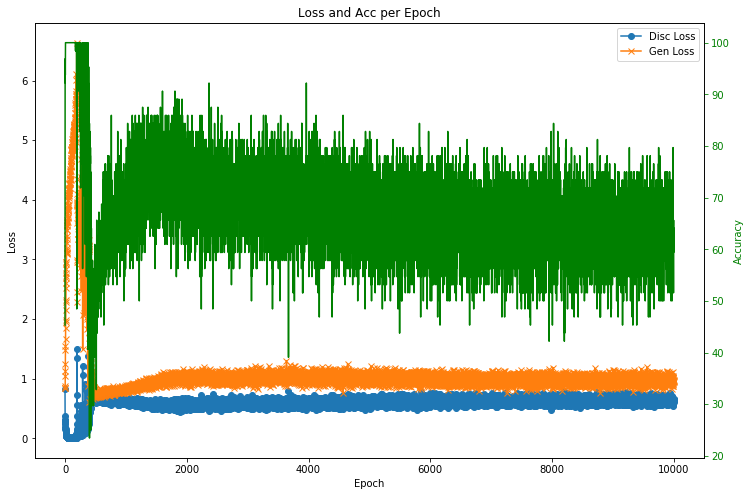

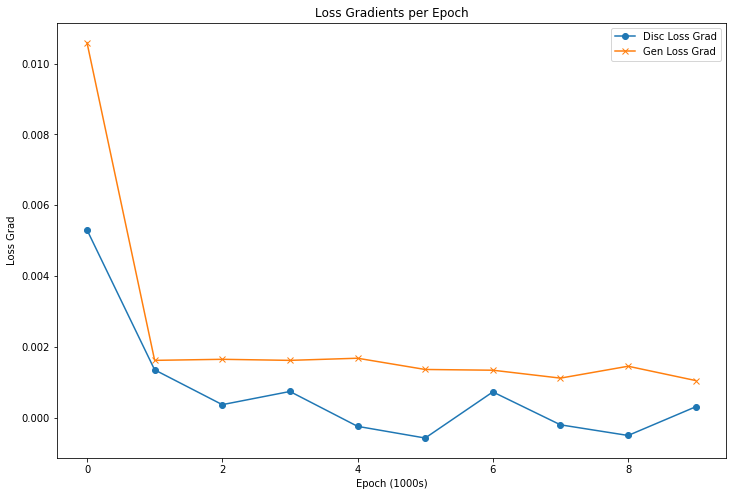

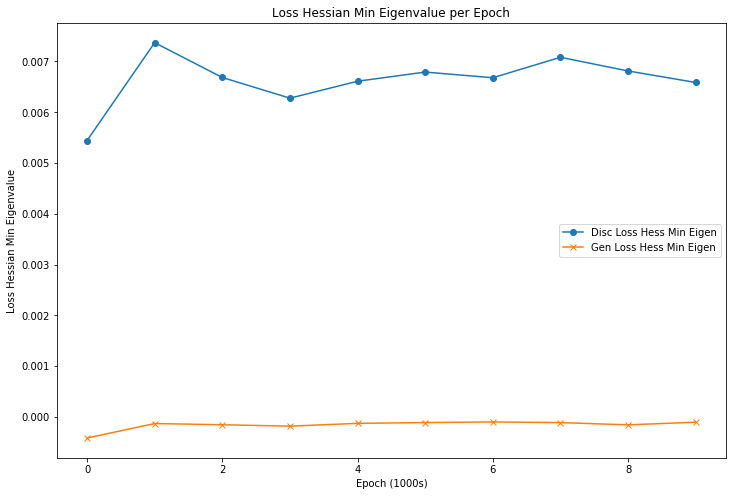

In [401]:
##### Adam with gamma -> inf #####
# learning_rate = 0.0002
# momentum = 0
# decay_rate = 2e-6 # Decay rate is how we are going to achieve inf-GD
# nest = False # Nesterov's acceleration
##############################

# Initialize GAN object
opt_params = ['adam', 0.0002, 0, 2e-6, False, 'adam_lr0.0002_decay2e-6']
gan_adam_2 = GAN(opt_params)

# Train GAN
gan_adam_2_hist = gan_adam_2.train(epochs=10000, batch_size=32, sample_interval=1000)

# Plot of performance results (training and validation accuracies and loss) for every epoch
plt.rcParams['figure.figsize'] = (12, 8)
plot_loss_acc(gan_adam_2_hist)
plot_loss_gradient(gan_adam_2_hist)
plot_loss_hessian_eig(gan_adam_2_hist)

## Gradient Sample Run

In [251]:
# Prepare training example for evaluating gradients
batch_size = 32

(X_train, y_train), (X_test, y_test) = mnist.load_data()
X_train = (X_train.astype(np.float32) - 127.5) / 127.5
X_train = np.expand_dims(X_train, axis=3)

idx = np.random.randint(0, X_train.shape[0], 32)
imgs = X_train[idx]
noise = np.random.normal(0, 1, (32, 100))
gen_imgs = gan_adam_1.generator.predict(noise)
valid = np.ones((32, 1))
valid = np.zeros((32, 1))

# Inputs for discriminator
inputs_disc_valid = [
    imgs, # X
    valid, # y
    0 # learning phase in TEST mode
]

inputs_disc_fake = [
    gen_imgs, # X
    fake, # y
    0 # learning phase in TEST mode
]

# Inputs for generator
inputs_comb = [
    noise, # X
    valid, # y
    0 # learning phase in TEST mode
]

# Gradient compute symbolic functions
get_gradients_disc = compute_loss_gradient('disc', gan_adam_1.discriminator)[0]
get_gradients_comb = compute_loss_gradient('comb', gan_adam_1.combined)[0]

# Evaluate the stochastic gradient functions (averaged by batch_size)
evaluated_gradients_disc = np.add(np.array(get_gradients_disc(inputs_disc_valid)), 
                                  np.array(get_gradients_disc(inputs_disc_fake))) / (batch_size*2)
evaluated_gradients_comb = np.array(get_gradients_comb(inputs_comb)) / batch_size

# Print evaluated gradients
print('Discriminator gradients:')
print(len(evaluated_gradients_disc[0]))
print(evaluated_gradients_disc[0])

print('Generator gradients:')
print(len(evaluated_gradients_comb[0]))
print(np.linalg.norm(evaluated_gradients_comb[0]))
print(evaluated_gradients_comb[0])

Discriminator gradients:
1
[0.01810639]
Generator gradients:
784
0.010891679
[-1.42629451e-05  7.66239478e-04 -2.78773805e-04  1.13114750e-03
 -1.76182904e-04  3.95972980e-04 -3.19039158e-04 -3.37008329e-04
  2.75957340e-04  7.60520517e-04 -6.87053835e-04  2.11683873e-04
 -5.95395046e-04 -6.81611244e-04 -1.78827540e-04 -6.18851744e-04
 -2.75146420e-04  1.87144775e-04  2.64256145e-04 -5.31897997e-04
  2.22188581e-04 -1.91195169e-04 -5.32629783e-05 -2.45449104e-04
  1.58298106e-04  9.96484232e-05  1.26632061e-04  5.81980334e-04
  1.22725629e-04 -1.12053429e-04  3.54167569e-04 -4.60673982e-05
  5.13768406e-04 -3.03800130e-04 -1.81734329e-04  4.84196426e-05
  2.36241802e-04 -2.46840591e-05  6.58287463e-05  3.65110609e-04
  6.41527527e-04  5.77973144e-04 -2.47387419e-04 -2.02883049e-04
 -1.69037550e-04 -3.48126516e-04 -1.08646949e-04  8.57768828e-05
 -2.47805321e-04 -3.27337271e-04  9.76120718e-05  4.71251624e-05
 -2.61723413e-04 -3.86893400e-04 -2.29838988e-04 -1.27763851e-05
 -9.79434117e

## Hessian Sample Run

In [369]:
# Loss gradient tensors
# loss_grad_tensor_x = compute_loss_gradient('disc', gan_adam_1.discriminator)[1]
# loss_grad_tensor_z = compute_loss_gradient('comb', gan_adam_1.combined)[1]

# Hessian compute symbolic functions
get_hessian_xx = compute_loss_hessian('disc', gan_1.discriminator)
get_hessian_zz = compute_loss_hessian('comb', gan_1.combined)

# Evaluate the stochastic hessian functions (averaged by batch_size)
evaluated_hessian_xx = np.add(np.array(get_hessian_xx(inputs_disc_valid)), 
                              np.array(get_hessian_xx(inputs_disc_fake))) / (batch_size*2)
evaluated_hessian_zz = np.array(get_hessian_zz(inputs_comb)) / batch_size

# Print evaluated hessians
# Print evaluated min eigenvalues of hessian
print('Min XX Hessian eigenvalue: ', min(np.linalg.eigvals(evaluated_hessian_xx[0])))
print('Min ZZ Hessian eigenvalue: ', min(np.linalg.eigvals(evaluated_hessian_zz[0])))

# print(is_pos_def(evaluated_hessian_xx))
# print(is_neg_def(evaluated_hessian_zz))
# print(np.linalg.cholesky(evaluated_hessian_xx))
# print(np.linalg.cholesky(evaluated_hessian_zz))
# plt.plot(range(784), np.linalg.eigvals(evaluated_hessian_zz[0]))

Hessians:
XX Hessian length:  1 XX Hessian values:  [[0.00378129]]
ZZ Hessian length:  784 ZZ Hessian values:  [[ 4.30085629e-06 -3.12998827e-09  6.42433828e-10 ... -4.37891545e-09
   1.86680307e-08  1.17927401e-09]
 [-3.12999071e-09  9.04209264e-06  6.82956081e-10 ...  5.22898302e-09
  -2.32319497e-08 -2.38438669e-09]
 [ 6.42433329e-10  6.82956913e-10  4.13338194e-06 ...  5.68451897e-10
  -1.66098979e-09 -2.49420040e-10]
 ...
 [-4.37891101e-09  5.22897725e-09  5.68450453e-10 ...  7.32038370e-06
  -2.89200717e-08 -2.88449709e-09]
 [ 1.86680076e-08 -2.32319390e-08 -1.66098812e-09 ... -2.89200663e-08
  -1.39415388e-05  1.31762246e-08]
 [ 1.17927534e-09 -2.38438802e-09 -2.49420734e-10 ... -2.88449642e-09
   1.31762450e-08 -3.75165791e-06]]
